<a href="https://colab.research.google.com/github/MohammadAli-Balaj/SRGAN_SHAHBAZ_AMNA/blob/main/SRGAN_Face_Male_Female_Final_Version_3.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Shahbaz Amna
## Artificial Neural Networks and Deep Learning II
### SRGANs for generating high quality images
#### Using Adam optimizer 200 epochs and each image as a batch (batch size = 1)

## GPU information:

In [1]:
from psutil import virtual_memory
ram_gb = virtual_memory().total / 1e9
print('Your runtime has {:.1f} gigabytes of available RAM\n'.format(ram_gb))

if ram_gb < 20:
  print('Not using a high-RAM runtime')
else:
  print('You are using a high-RAM runtime!')

Your runtime has 89.6 gigabytes of available RAM

You are using a high-RAM runtime!


## Importing libraries:

In [2]:
import os
import cv2
import random
import numpy as np
import matplotlib.pyplot as plt
from keras.models import Sequential
from keras import layers, Model
from sklearn.model_selection import train_test_split
from keras import Model
from keras.layers import Conv2D, PReLU,BatchNormalization, Flatten
from keras.layers import UpSampling2D, LeakyReLU, Dense, Input, add
from keras.models import load_model
from numpy.random import randint
from keras.applications import VGG19
from tqdm import tqdm

## Accessing drive data:

In [3]:
from google.colab import drive
drive.mount('data',force_remount=True)

Mounted at data


## Generator and discriminator blocks: 

In [4]:
def res_block(ip):
    
    res_model = Conv2D(64, (3,3), padding = "same")(ip)
    res_model = BatchNormalization(momentum = 0.5)(res_model)
    res_model = PReLU(shared_axes = [1,2])(res_model)
    
    res_model = Conv2D(64, (3,3), padding = "same")(res_model)
    res_model = BatchNormalization(momentum = 0.5)(res_model)
    
    return add([ip,res_model])

def upscale_block(ip):
    
    up_model = Conv2D(256, (3,3), padding="same")(ip)
    up_model = UpSampling2D( size = 2 )(up_model)
    up_model = PReLU(shared_axes=[1,2])(up_model)
    
    return up_model


def create_gen(gen_ip, num_res_block):
    layers = Conv2D(64, (9,9), padding="same")(gen_ip)
    layers = PReLU(shared_axes=[1,2])(layers)

    temp = layers

    for i in range(num_res_block):
        layers = res_block(layers)

    layers = Conv2D(64, (3,3), padding="same")(layers)
    layers = BatchNormalization(momentum=0.5)(layers)
    layers = add([layers,temp])

    layers = upscale_block(layers)
    layers = upscale_block(layers)

    op = Conv2D(3, (9,9), padding="same")(layers)

    return Model(inputs=gen_ip, outputs=op)


def discriminator_block(ip, filters, strides=1, bn=True):
    
    disc_model = Conv2D(filters, (3,3), strides = strides, padding="same")(ip)
    
    if bn:
        disc_model = BatchNormalization( momentum=0.8 )(disc_model)
    
    disc_model = LeakyReLU( alpha=0.2 )(disc_model)
    
    return disc_model



def create_disc(disc_ip):

    df = 64
    
    d1 = discriminator_block(disc_ip, df, bn=False)
    d2 = discriminator_block(d1, df, strides=2)
    d3 = discriminator_block(d2, df*2)
    d4 = discriminator_block(d3, df*2, strides=2)
    d5 = discriminator_block(d4, df*4)
    d6 = discriminator_block(d5, df*4, strides=2)
    d7 = discriminator_block(d6, df*8)
    d8 = discriminator_block(d7, df*8, strides=2)
    
    d8_5 = Flatten()(d8)
    d9 = Dense(df*16)(d8_5)
    d10 = LeakyReLU(alpha=0.2)(d9)
    validity = Dense(1, activation='sigmoid')(d10)

    return Model(disc_ip, validity)


## VGG generated features and building combined model:

In [5]:
def build_vgg(hr_shape):
    
    vgg = VGG19(weights="imagenet",include_top=False, input_shape=hr_shape)
    
    return Model(inputs=vgg.inputs, outputs=vgg.layers[10].output)


def create_comb(gen_model, disc_model, vgg, lr_ip, hr_ip):
    gen_img = gen_model(lr_ip)
    
    gen_features = vgg(gen_img)
    
    disc_model.trainable = False
    validity = disc_model(gen_img)
    
    return Model(inputs=[lr_ip, hr_ip], outputs=[validity, gen_features])


## Image preprocessing:

In [6]:
hr_images = []
for img in range(2700,2901):
  img_hr = cv2.imread("/content/data/MyDrive/hi/" + str(img) + ".jpg")
  img_hr = cv2.cvtColor(img_hr, cv2.COLOR_BGR2RGB)
  hr_images.append(img_hr)

In [7]:
lr_images = []
for img in range(2700,2901):
  img_lr = cv2.imread("/content/data/MyDrive/lo/" + str(img) + ".jpg")
  img_lr = cv2.cvtColor(img_lr, cv2.COLOR_BGR2RGB)
  lr_images.append(img_lr)
  


## Data samples:

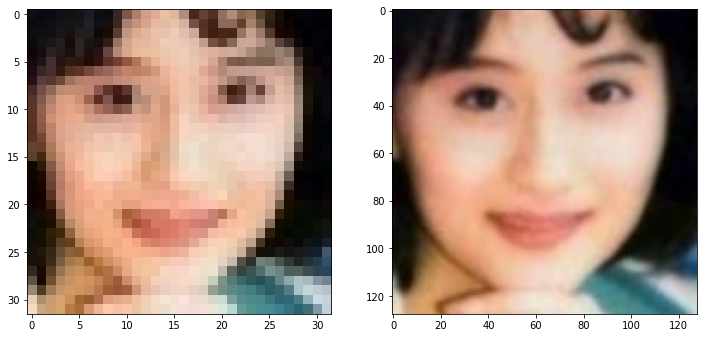

In [8]:
lr_images = np.array(lr_images)
hr_images = np.array(hr_images)


image_number = random.randint(0, len(lr_images)-1)
plt.figure(figsize=(12, 6))
plt.subplot(121)
plt.imshow(np.reshape(lr_images[image_number], (32, 32, 3)))
plt.subplot(122)
plt.imshow(np.reshape(hr_images[image_number], (128, 128, 3)))
plt.show()

## Normalization:

In [9]:
lr_images = lr_images / 255.
hr_images = hr_images / 255.

## Training

In [10]:
lr_train, lr_test, hr_train, hr_test = train_test_split(lr_images, hr_images, 
                                                      test_size=0.33, random_state=42)


hr_shape = (hr_train.shape[1], hr_train.shape[2], hr_train.shape[3])
lr_shape = (lr_train.shape[1], lr_train.shape[2], lr_train.shape[3])

lr_ip = Input(shape=lr_shape)
hr_ip = Input(shape=hr_shape)

generator = create_gen(lr_ip, num_res_block = 16)
generator.summary()

discriminator = create_disc(hr_ip)
discriminator.compile(loss="binary_crossentropy", optimizer="adam", metrics=['accuracy'])
discriminator.summary()

vgg = build_vgg((128,128,3))
print(vgg.summary())
vgg.trainable = False

gan_model = create_comb(generator, discriminator, vgg, lr_ip, hr_ip)

gan_model.compile(loss=["binary_crossentropy", "mse"], loss_weights=[1e-3, 1], optimizer="adam")
gan_model.summary()

batch_size = 1  
train_lr_batches = []
train_hr_batches = []
for it in range(int(hr_train.shape[0] / batch_size)):
    start_idx = it * batch_size
    end_idx = start_idx + batch_size
    train_hr_batches.append(hr_train[start_idx:end_idx])
    train_lr_batches.append(lr_train[start_idx:end_idx])
    
    
epochs = 200

for e in range(epochs):
    
    fake_label = np.zeros((batch_size, 1)) 
    real_label = np.ones((batch_size,1)) 
    

    g_losses = []
    d_losses = []
    
 
    for b in tqdm(range(len(train_hr_batches))):
        lr_imgs = train_lr_batches[b] 
        hr_imgs = train_hr_batches[b] 
        
        fake_imgs = generator.predict_on_batch(lr_imgs) 
        
 
        discriminator.trainable = True
        d_loss_gen = discriminator.train_on_batch(fake_imgs, fake_label)
        d_loss_real = discriminator.train_on_batch(hr_imgs, real_label)
        

        discriminator.trainable = False
        

        d_loss = 0.5 * np.add(d_loss_gen, d_loss_real) 
        

        image_features = vgg.predict(hr_imgs)
     

        g_loss, _, _ = gan_model.train_on_batch([lr_imgs, hr_imgs], [real_label, image_features])
        
 
        d_losses.append(d_loss)
        g_losses.append(g_loss)
        
   
    g_losses = np.array(g_losses)
    d_losses = np.array(d_losses)
    

    g_loss = np.sum(g_losses, axis=0) / len(g_losses)
    d_loss = np.sum(d_losses, axis=0) / len(d_losses)
    

    print("epoch:", e+1 ,"g_loss:", g_loss, "d_loss:", d_loss)

    if (e+1) % 10 == 0: 
      generator.save("gen_e_"+ str(e+1) +".h5")

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 32, 32, 3)]  0           []                               
                                                                                                  
 conv2d (Conv2D)                (None, 32, 32, 64)   15616       ['input_1[0][0]']                
                                                                                                  
 p_re_lu (PReLU)                (None, 32, 32, 64)   64          ['conv2d[0][0]']                 
                                                                                                  
 conv2d_1 (Conv2D)              (None, 32, 32, 64)   36928       ['p_re_lu[0][0]']                
                                                                                              

  0%|          | 0/134 [00:00<?, ?it/s]

1/1 [==============================] - 0s 236ms/step


  1%|          | 1/134 [00:17<38:14, 17.25s/it]

1/1 [==============================] - 0s 17ms/step


  1%|▏         | 2/134 [00:17<15:47,  7.18s/it]

1/1 [==============================] - 0s 19ms/step


  2%|▏         | 3/134 [00:17<08:38,  3.96s/it]

1/1 [==============================] - 0s 18ms/step


  3%|▎         | 4/134 [00:17<05:18,  2.45s/it]

1/1 [==============================] - 0s 18ms/step


  4%|▎         | 5/134 [00:17<03:28,  1.62s/it]

1/1 [==============================] - 0s 17ms/step


  4%|▍         | 6/134 [00:17<02:21,  1.11s/it]

1/1 [==============================] - 0s 17ms/step


  5%|▌         | 7/134 [00:18<01:39,  1.27it/s]

1/1 [==============================] - 0s 17ms/step


  6%|▌         | 8/134 [00:18<01:12,  1.74it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 9/134 [00:18<00:54,  2.27it/s]

1/1 [==============================] - 0s 17ms/step


  7%|▋         | 10/134 [00:18<00:42,  2.91it/s]

1/1 [==============================] - 0s 17ms/step


  8%|▊         | 11/134 [00:18<00:33,  3.62it/s]

1/1 [==============================] - 0s 17ms/step


  9%|▉         | 12/134 [00:18<00:28,  4.35it/s]

1/1 [==============================] - 0s 19ms/step


 10%|▉         | 13/134 [00:18<00:24,  5.01it/s]

1/1 [==============================] - 0s 17ms/step


 10%|█         | 14/134 [00:18<00:21,  5.68it/s]

1/1 [==============================] - 0s 17ms/step


 11%|█         | 15/134 [00:19<00:19,  6.21it/s]

1/1 [==============================] - 0s 19ms/step


 12%|█▏        | 16/134 [00:19<00:17,  6.64it/s]

1/1 [==============================] - 0s 17ms/step


 13%|█▎        | 17/134 [00:19<00:16,  7.03it/s]

1/1 [==============================] - 0s 17ms/step


 13%|█▎        | 18/134 [00:19<00:15,  7.28it/s]

1/1 [==============================] - 0s 17ms/step


 14%|█▍        | 19/134 [00:19<00:15,  7.48it/s]

1/1 [==============================] - 0s 17ms/step


 15%|█▍        | 20/134 [00:19<00:14,  7.65it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▌        | 21/134 [00:19<00:14,  7.80it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▋        | 22/134 [00:19<00:14,  7.85it/s]

1/1 [==============================] - 0s 17ms/step


 17%|█▋        | 23/134 [00:20<00:14,  7.91it/s]

1/1 [==============================] - 0s 17ms/step


 18%|█▊        | 24/134 [00:20<00:13,  8.01it/s]

1/1 [==============================] - 0s 17ms/step


 19%|█▊        | 25/134 [00:20<00:13,  8.06it/s]

1/1 [==============================] - 0s 18ms/step


 19%|█▉        | 26/134 [00:20<00:13,  8.05it/s]

1/1 [==============================] - 0s 17ms/step


 20%|██        | 27/134 [00:20<00:13,  8.00it/s]

1/1 [==============================] - 0s 18ms/step


 21%|██        | 28/134 [00:20<00:13,  8.08it/s]

1/1 [==============================] - 0s 32ms/step


 22%|██▏       | 29/134 [00:20<00:13,  7.76it/s]

1/1 [==============================] - 0s 17ms/step


 22%|██▏       | 30/134 [00:20<00:13,  7.89it/s]

1/1 [==============================] - 0s 17ms/step


 23%|██▎       | 31/134 [00:21<00:12,  8.01it/s]

1/1 [==============================] - 0s 18ms/step


 24%|██▍       | 32/134 [00:21<00:12,  7.99it/s]

1/1 [==============================] - 0s 17ms/step


 25%|██▍       | 33/134 [00:21<00:12,  8.05it/s]

1/1 [==============================] - 0s 17ms/step


 25%|██▌       | 34/134 [00:21<00:12,  8.12it/s]

1/1 [==============================] - 0s 17ms/step


 26%|██▌       | 35/134 [00:21<00:12,  8.08it/s]

1/1 [==============================] - 0s 17ms/step


 27%|██▋       | 36/134 [00:21<00:12,  8.05it/s]

1/1 [==============================] - 0s 17ms/step


 28%|██▊       | 37/134 [00:21<00:12,  7.97it/s]

1/1 [==============================] - 0s 17ms/step


 28%|██▊       | 38/134 [00:21<00:11,  8.12it/s]

1/1 [==============================] - 0s 17ms/step


 29%|██▉       | 39/134 [00:22<00:11,  8.09it/s]

1/1 [==============================] - 0s 17ms/step


 30%|██▉       | 40/134 [00:22<00:11,  8.06it/s]

1/1 [==============================] - 0s 17ms/step


 31%|███       | 41/134 [00:22<00:11,  8.10it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███▏      | 42/134 [00:22<00:11,  8.02it/s]

1/1 [==============================] - 0s 18ms/step


 32%|███▏      | 43/134 [00:22<00:11,  8.05it/s]

1/1 [==============================] - 0s 16ms/step


 33%|███▎      | 44/134 [00:22<00:11,  8.14it/s]

1/1 [==============================] - 0s 17ms/step


 34%|███▎      | 45/134 [00:22<00:10,  8.18it/s]

1/1 [==============================] - 0s 17ms/step


 34%|███▍      | 46/134 [00:22<00:11,  7.98it/s]

1/1 [==============================] - 0s 17ms/step


 35%|███▌      | 47/134 [00:23<00:10,  8.04it/s]

1/1 [==============================] - 0s 17ms/step


 36%|███▌      | 48/134 [00:23<00:10,  7.97it/s]

1/1 [==============================] - 0s 19ms/step


 37%|███▋      | 49/134 [00:23<00:10,  7.89it/s]

1/1 [==============================] - 0s 17ms/step


 37%|███▋      | 50/134 [00:23<00:10,  7.98it/s]

1/1 [==============================] - 0s 16ms/step


 38%|███▊      | 51/134 [00:23<00:10,  8.08it/s]

1/1 [==============================] - 0s 18ms/step


 39%|███▉      | 52/134 [00:23<00:10,  7.99it/s]

1/1 [==============================] - 0s 18ms/step


 40%|███▉      | 53/134 [00:23<00:10,  8.02it/s]

1/1 [==============================] - 0s 17ms/step


 40%|████      | 54/134 [00:23<00:09,  8.09it/s]

1/1 [==============================] - 0s 17ms/step


 41%|████      | 55/134 [00:24<00:09,  8.12it/s]

1/1 [==============================] - 0s 18ms/step


 42%|████▏     | 56/134 [00:24<00:09,  8.01it/s]

1/1 [==============================] - 0s 17ms/step


 43%|████▎     | 57/134 [00:24<00:09,  8.04it/s]

1/1 [==============================] - 0s 17ms/step


 43%|████▎     | 58/134 [00:24<00:09,  8.13it/s]

1/1 [==============================] - 0s 17ms/step


 44%|████▍     | 59/134 [00:24<00:09,  8.14it/s]

1/1 [==============================] - 0s 18ms/step


 45%|████▍     | 60/134 [00:24<00:09,  8.15it/s]

1/1 [==============================] - 0s 16ms/step


 46%|████▌     | 61/134 [00:24<00:08,  8.22it/s]

1/1 [==============================] - 0s 19ms/step


 46%|████▋     | 62/134 [00:24<00:08,  8.19it/s]

1/1 [==============================] - 0s 16ms/step


 47%|████▋     | 63/134 [00:24<00:08,  8.15it/s]

1/1 [==============================] - 0s 18ms/step


 48%|████▊     | 64/134 [00:25<00:08,  8.11it/s]

1/1 [==============================] - 0s 17ms/step


 49%|████▊     | 65/134 [00:25<00:08,  8.19it/s]

1/1 [==============================] - 0s 18ms/step


 49%|████▉     | 66/134 [00:25<00:08,  8.01it/s]

1/1 [==============================] - 0s 17ms/step


 50%|█████     | 67/134 [00:25<00:08,  8.07it/s]

1/1 [==============================] - 0s 17ms/step


 51%|█████     | 68/134 [00:25<00:08,  8.15it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████▏    | 69/134 [00:25<00:08,  8.11it/s]

1/1 [==============================] - 0s 17ms/step


 52%|█████▏    | 70/134 [00:25<00:08,  7.97it/s]

1/1 [==============================] - 0s 18ms/step


 53%|█████▎    | 71/134 [00:25<00:07,  7.98it/s]

1/1 [==============================] - 0s 16ms/step


 54%|█████▎    | 72/134 [00:26<00:07,  8.02it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▍    | 73/134 [00:26<00:07,  8.01it/s]

1/1 [==============================] - 0s 16ms/step


 55%|█████▌    | 74/134 [00:26<00:07,  8.10it/s]

1/1 [==============================] - 0s 17ms/step


 56%|█████▌    | 75/134 [00:26<00:07,  8.07it/s]

1/1 [==============================] - 0s 18ms/step


 57%|█████▋    | 76/134 [00:26<00:07,  8.06it/s]

1/1 [==============================] - 0s 18ms/step


 57%|█████▋    | 77/134 [00:26<00:07,  8.10it/s]

1/1 [==============================] - 0s 17ms/step


 58%|█████▊    | 78/134 [00:26<00:06,  8.17it/s]

1/1 [==============================] - 0s 17ms/step


 59%|█████▉    | 79/134 [00:26<00:06,  8.16it/s]

1/1 [==============================] - 0s 17ms/step


 60%|█████▉    | 80/134 [00:27<00:06,  8.08it/s]

1/1 [==============================] - 0s 17ms/step


 60%|██████    | 81/134 [00:27<00:06,  8.08it/s]

1/1 [==============================] - 0s 17ms/step


 61%|██████    | 82/134 [00:27<00:06,  8.15it/s]

1/1 [==============================] - 0s 18ms/step


 62%|██████▏   | 83/134 [00:27<00:06,  8.15it/s]

1/1 [==============================] - 0s 17ms/step


 63%|██████▎   | 84/134 [00:27<00:06,  8.06it/s]

1/1 [==============================] - 0s 16ms/step


 63%|██████▎   | 85/134 [00:27<00:06,  8.16it/s]

1/1 [==============================] - 0s 16ms/step


 64%|██████▍   | 86/134 [00:27<00:05,  8.15it/s]

1/1 [==============================] - 0s 17ms/step


 65%|██████▍   | 87/134 [00:27<00:05,  8.07it/s]

1/1 [==============================] - 0s 17ms/step


 66%|██████▌   | 88/134 [00:28<00:05,  8.11it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▋   | 89/134 [00:28<00:05,  8.12it/s]

1/1 [==============================] - 0s 18ms/step


 67%|██████▋   | 90/134 [00:28<00:05,  8.08it/s]

1/1 [==============================] - 0s 17ms/step


 68%|██████▊   | 91/134 [00:28<00:05,  8.10it/s]

1/1 [==============================] - 0s 17ms/step


 69%|██████▊   | 92/134 [00:28<00:05,  8.15it/s]

1/1 [==============================] - 0s 18ms/step


 69%|██████▉   | 93/134 [00:28<00:05,  8.14it/s]

1/1 [==============================] - 0s 16ms/step


 70%|███████   | 94/134 [00:28<00:04,  8.05it/s]

1/1 [==============================] - 0s 17ms/step


 71%|███████   | 95/134 [00:28<00:04,  8.06it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▏  | 96/134 [00:29<00:04,  8.04it/s]

1/1 [==============================] - 0s 17ms/step


 72%|███████▏  | 97/134 [00:29<00:04,  8.03it/s]

1/1 [==============================] - 0s 17ms/step


 73%|███████▎  | 98/134 [00:29<00:04,  8.04it/s]

1/1 [==============================] - 0s 17ms/step


 74%|███████▍  | 99/134 [00:29<00:04,  8.09it/s]

1/1 [==============================] - 0s 17ms/step


 75%|███████▍  | 100/134 [00:29<00:04,  8.10it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▌  | 101/134 [00:29<00:04,  8.08it/s]

1/1 [==============================] - 0s 17ms/step


 76%|███████▌  | 102/134 [00:29<00:03,  8.11it/s]

1/1 [==============================] - 0s 17ms/step


 77%|███████▋  | 103/134 [00:29<00:03,  8.21it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████▊  | 104/134 [00:30<00:03,  7.66it/s]

1/1 [==============================] - 0s 19ms/step


 78%|███████▊  | 105/134 [00:30<00:03,  7.73it/s]

1/1 [==============================] - 0s 18ms/step


 79%|███████▉  | 106/134 [00:30<00:03,  7.80it/s]

1/1 [==============================] - 0s 17ms/step


 80%|███████▉  | 107/134 [00:30<00:03,  7.88it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████  | 108/134 [00:30<00:03,  7.90it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████▏ | 109/134 [00:30<00:03,  7.98it/s]

1/1 [==============================] - 0s 18ms/step


 82%|████████▏ | 110/134 [00:30<00:02,  8.01it/s]

1/1 [==============================] - 0s 19ms/step


 83%|████████▎ | 111/134 [00:30<00:02,  8.02it/s]

1/1 [==============================] - 0s 17ms/step


 84%|████████▎ | 112/134 [00:31<00:02,  8.03it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▍ | 113/134 [00:31<00:02,  7.95it/s]

1/1 [==============================] - 0s 17ms/step


 85%|████████▌ | 114/134 [00:31<00:02,  7.98it/s]

1/1 [==============================] - 0s 18ms/step


 86%|████████▌ | 115/134 [00:31<00:02,  7.99it/s]

1/1 [==============================] - 0s 17ms/step


 87%|████████▋ | 116/134 [00:31<00:02,  8.11it/s]

1/1 [==============================] - 0s 18ms/step


 87%|████████▋ | 117/134 [00:31<00:02,  8.08it/s]

1/1 [==============================] - 0s 18ms/step


 88%|████████▊ | 118/134 [00:31<00:01,  8.04it/s]

1/1 [==============================] - 0s 16ms/step


 89%|████████▉ | 119/134 [00:31<00:01,  8.12it/s]

1/1 [==============================] - 0s 16ms/step


 90%|████████▉ | 120/134 [00:32<00:01,  8.16it/s]

1/1 [==============================] - 0s 17ms/step


 90%|█████████ | 121/134 [00:32<00:01,  8.11it/s]

1/1 [==============================] - 0s 17ms/step


 91%|█████████ | 122/134 [00:32<00:01,  8.11it/s]

1/1 [==============================] - 0s 16ms/step


 92%|█████████▏| 123/134 [00:32<00:01,  8.08it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 124/134 [00:32<00:01,  8.07it/s]

1/1 [==============================] - 0s 19ms/step


 93%|█████████▎| 125/134 [00:32<00:01,  8.04it/s]

1/1 [==============================] - 0s 17ms/step


 94%|█████████▍| 126/134 [00:32<00:00,  8.14it/s]

1/1 [==============================] - 0s 18ms/step


 95%|█████████▍| 127/134 [00:32<00:00,  8.16it/s]

1/1 [==============================] - 0s 33ms/step


 96%|█████████▌| 128/134 [00:33<00:00,  7.84it/s]

1/1 [==============================] - 0s 17ms/step


 96%|█████████▋| 129/134 [00:33<00:00,  7.92it/s]

1/1 [==============================] - 0s 17ms/step


 97%|█████████▋| 130/134 [00:33<00:00,  8.06it/s]

1/1 [==============================] - 0s 18ms/step


 98%|█████████▊| 131/134 [00:33<00:00,  8.04it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▊| 132/134 [00:33<00:00,  7.90it/s]

1/1 [==============================] - 0s 16ms/step


 99%|█████████▉| 133/134 [00:33<00:00,  8.06it/s]

1/1 [==============================] - 0s 18ms/step


100%|██████████| 134/134 [00:33<00:00,  3.96it/s]


epoch: 1 g_loss: 69.99305150046277 d_loss: [6.76539645 0.75      ]


  0%|          | 0/134 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


  1%|          | 1/134 [00:00<00:16,  7.96it/s]

1/1 [==============================] - 0s 18ms/step


  1%|▏         | 2/134 [00:00<00:16,  8.08it/s]

1/1 [==============================] - 0s 17ms/step


  2%|▏         | 3/134 [00:00<00:16,  8.09it/s]

1/1 [==============================] - 0s 18ms/step


  3%|▎         | 4/134 [00:00<00:16,  8.04it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▎         | 5/134 [00:00<00:15,  8.07it/s]

1/1 [==============================] - 0s 17ms/step


  4%|▍         | 6/134 [00:00<00:15,  8.13it/s]

1/1 [==============================] - 0s 18ms/step


  5%|▌         | 7/134 [00:00<00:15,  8.08it/s]

1/1 [==============================] - 0s 17ms/step


  6%|▌         | 8/134 [00:00<00:15,  7.99it/s]

1/1 [==============================] - 0s 17ms/step


  7%|▋         | 9/134 [00:01<00:15,  8.05it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 10/134 [00:01<00:15,  7.88it/s]

1/1 [==============================] - 0s 18ms/step


  8%|▊         | 11/134 [00:01<00:15,  7.93it/s]

1/1 [==============================] - 0s 17ms/step


  9%|▉         | 12/134 [00:01<00:15,  8.04it/s]

1/1 [==============================] - 0s 17ms/step


 10%|▉         | 13/134 [00:01<00:14,  8.14it/s]

1/1 [==============================] - 0s 18ms/step


 10%|█         | 14/134 [00:01<00:14,  8.12it/s]

1/1 [==============================] - 0s 17ms/step


 11%|█         | 15/134 [00:01<00:14,  8.05it/s]

1/1 [==============================] - 0s 17ms/step


 12%|█▏        | 16/134 [00:01<00:14,  8.09it/s]

1/1 [==============================] - 0s 17ms/step


 13%|█▎        | 17/134 [00:02<00:14,  8.08it/s]

1/1 [==============================] - 0s 17ms/step


 13%|█▎        | 18/134 [00:02<00:14,  8.00it/s]

1/1 [==============================] - 0s 17ms/step


 14%|█▍        | 19/134 [00:02<00:14,  8.04it/s]

1/1 [==============================] - 0s 17ms/step


 15%|█▍        | 20/134 [00:02<00:14,  8.07it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▌        | 21/134 [00:02<00:14,  8.05it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▋        | 22/134 [00:02<00:13,  8.05it/s]

1/1 [==============================] - 0s 17ms/step


 17%|█▋        | 23/134 [00:02<00:13,  8.14it/s]

1/1 [==============================] - 0s 17ms/step


 18%|█▊        | 24/134 [00:02<00:13,  8.11it/s]

1/1 [==============================] - 0s 17ms/step


 19%|█▊        | 25/134 [00:03<00:13,  8.12it/s]

1/1 [==============================] - 0s 18ms/step


 19%|█▉        | 26/134 [00:03<00:13,  8.04it/s]

1/1 [==============================] - 0s 18ms/step


 20%|██        | 27/134 [00:03<00:13,  7.96it/s]

1/1 [==============================] - 0s 18ms/step


 21%|██        | 28/134 [00:03<00:13,  7.92it/s]

1/1 [==============================] - 0s 17ms/step


 22%|██▏       | 29/134 [00:03<00:13,  8.03it/s]

1/1 [==============================] - 0s 17ms/step


 22%|██▏       | 30/134 [00:03<00:12,  8.13it/s]

1/1 [==============================] - 0s 18ms/step


 23%|██▎       | 31/134 [00:03<00:12,  8.06it/s]

1/1 [==============================] - 0s 17ms/step


 24%|██▍       | 32/134 [00:03<00:12,  7.98it/s]

1/1 [==============================] - 0s 17ms/step


 25%|██▍       | 33/134 [00:04<00:12,  8.02it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▌       | 34/134 [00:04<00:12,  8.02it/s]

1/1 [==============================] - 0s 23ms/step


 26%|██▌       | 35/134 [00:04<00:12,  7.89it/s]

1/1 [==============================] - 0s 16ms/step


 27%|██▋       | 36/134 [00:04<00:12,  7.98it/s]

1/1 [==============================] - 0s 17ms/step


 28%|██▊       | 37/134 [00:04<00:12,  7.97it/s]

1/1 [==============================] - 0s 17ms/step


 28%|██▊       | 38/134 [00:04<00:12,  7.96it/s]

1/1 [==============================] - 0s 17ms/step


 29%|██▉       | 39/134 [00:04<00:11,  7.99it/s]

1/1 [==============================] - 0s 18ms/step


 30%|██▉       | 40/134 [00:04<00:11,  8.04it/s]

1/1 [==============================] - 0s 17ms/step


 31%|███       | 41/134 [00:05<00:11,  8.05it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███▏      | 42/134 [00:05<00:11,  8.00it/s]

1/1 [==============================] - 0s 17ms/step


 32%|███▏      | 43/134 [00:05<00:11,  7.97it/s]

1/1 [==============================] - 0s 18ms/step


 33%|███▎      | 44/134 [00:05<00:11,  7.99it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▎      | 45/134 [00:05<00:11,  8.04it/s]

1/1 [==============================] - 0s 16ms/step


 34%|███▍      | 46/134 [00:05<00:10,  8.12it/s]

1/1 [==============================] - 0s 17ms/step


 35%|███▌      | 47/134 [00:05<00:10,  8.08it/s]

1/1 [==============================] - 0s 19ms/step


 36%|███▌      | 48/134 [00:05<00:10,  8.05it/s]

1/1 [==============================] - 0s 17ms/step


 37%|███▋      | 49/134 [00:06<00:10,  8.04it/s]

1/1 [==============================] - 0s 17ms/step


 37%|███▋      | 50/134 [00:06<00:10,  8.04it/s]

1/1 [==============================] - 0s 18ms/step


 38%|███▊      | 51/134 [00:06<00:10,  8.06it/s]

1/1 [==============================] - 0s 19ms/step


 39%|███▉      | 52/134 [00:06<00:10,  8.05it/s]

1/1 [==============================] - 0s 17ms/step


 40%|███▉      | 53/134 [00:06<00:09,  8.12it/s]

1/1 [==============================] - 0s 18ms/step


 40%|████      | 54/134 [00:06<00:09,  8.09it/s]

1/1 [==============================] - 0s 17ms/step


 41%|████      | 55/134 [00:06<00:09,  8.10it/s]

1/1 [==============================] - 0s 17ms/step


 42%|████▏     | 56/134 [00:06<00:09,  8.04it/s]

1/1 [==============================] - 0s 17ms/step


 43%|████▎     | 57/134 [00:07<00:09,  7.96it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 58/134 [00:07<00:09,  7.93it/s]

1/1 [==============================] - 0s 18ms/step


 44%|████▍     | 59/134 [00:07<00:09,  7.99it/s]

1/1 [==============================] - 0s 17ms/step


 45%|████▍     | 60/134 [00:07<00:09,  8.07it/s]

1/1 [==============================] - 0s 18ms/step


 46%|████▌     | 61/134 [00:07<00:09,  8.08it/s]

1/1 [==============================] - 0s 17ms/step


 46%|████▋     | 62/134 [00:07<00:08,  8.07it/s]

1/1 [==============================] - 0s 17ms/step


 47%|████▋     | 63/134 [00:07<00:08,  7.99it/s]

1/1 [==============================] - 0s 17ms/step


 48%|████▊     | 64/134 [00:07<00:08,  8.08it/s]

1/1 [==============================] - 0s 18ms/step


 49%|████▊     | 65/134 [00:08<00:08,  8.09it/s]

1/1 [==============================] - 0s 18ms/step


 49%|████▉     | 66/134 [00:08<00:08,  8.01it/s]

1/1 [==============================] - 0s 17ms/step


 50%|█████     | 67/134 [00:08<00:08,  8.09it/s]

1/1 [==============================] - 0s 31ms/step


 51%|█████     | 68/134 [00:08<00:08,  7.85it/s]

1/1 [==============================] - 0s 17ms/step


 51%|█████▏    | 69/134 [00:08<00:08,  7.94it/s]

1/1 [==============================] - 0s 18ms/step


 52%|█████▏    | 70/134 [00:08<00:08,  7.97it/s]

1/1 [==============================] - 0s 17ms/step


 53%|█████▎    | 71/134 [00:08<00:07,  8.02it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▎    | 72/134 [00:08<00:07,  8.00it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▍    | 73/134 [00:09<00:07,  8.02it/s]

1/1 [==============================] - 0s 17ms/step


 55%|█████▌    | 74/134 [00:09<00:07,  8.09it/s]

1/1 [==============================] - 0s 16ms/step


 56%|█████▌    | 75/134 [00:09<00:07,  8.14it/s]

1/1 [==============================] - 0s 17ms/step


 57%|█████▋    | 76/134 [00:09<00:07,  7.94it/s]

1/1 [==============================] - 0s 18ms/step


 57%|█████▋    | 77/134 [00:09<00:07,  7.99it/s]

1/1 [==============================] - 0s 19ms/step


 58%|█████▊    | 78/134 [00:09<00:06,  8.03it/s]

1/1 [==============================] - 0s 17ms/step


 59%|█████▉    | 79/134 [00:09<00:06,  8.00it/s]

1/1 [==============================] - 0s 17ms/step


 60%|█████▉    | 80/134 [00:09<00:06,  8.07it/s]

1/1 [==============================] - 0s 17ms/step


 60%|██████    | 81/134 [00:10<00:06,  8.16it/s]

1/1 [==============================] - 0s 17ms/step


 61%|██████    | 82/134 [00:10<00:06,  8.18it/s]

1/1 [==============================] - 0s 17ms/step


 62%|██████▏   | 83/134 [00:10<00:06,  8.13it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 84/134 [00:10<00:06,  8.14it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 85/134 [00:10<00:05,  8.17it/s]

1/1 [==============================] - 0s 17ms/step


 64%|██████▍   | 86/134 [00:10<00:05,  8.03it/s]

1/1 [==============================] - 0s 17ms/step


 65%|██████▍   | 87/134 [00:10<00:05,  8.09it/s]

1/1 [==============================] - 0s 17ms/step


 66%|██████▌   | 88/134 [00:10<00:05,  8.00it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▋   | 89/134 [00:11<00:05,  8.00it/s]

1/1 [==============================] - 0s 18ms/step


 67%|██████▋   | 90/134 [00:11<00:05,  7.98it/s]

1/1 [==============================] - 0s 17ms/step


 68%|██████▊   | 91/134 [00:11<00:05,  8.03it/s]

1/1 [==============================] - 0s 17ms/step


 69%|██████▊   | 92/134 [00:11<00:05,  8.09it/s]

1/1 [==============================] - 0s 18ms/step


 69%|██████▉   | 93/134 [00:11<00:05,  7.78it/s]

1/1 [==============================] - 0s 17ms/step


 70%|███████   | 94/134 [00:11<00:05,  7.88it/s]

1/1 [==============================] - 0s 16ms/step


 71%|███████   | 95/134 [00:11<00:04,  8.01it/s]

1/1 [==============================] - 0s 17ms/step


 72%|███████▏  | 96/134 [00:11<00:04,  7.88it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 97/134 [00:12<00:04,  7.93it/s]

1/1 [==============================] - 0s 16ms/step


 73%|███████▎  | 98/134 [00:12<00:04,  8.02it/s]

1/1 [==============================] - 0s 17ms/step


 74%|███████▍  | 99/134 [00:12<00:04,  8.02it/s]

1/1 [==============================] - 0s 17ms/step


 75%|███████▍  | 100/134 [00:12<00:04,  8.01it/s]

1/1 [==============================] - 0s 17ms/step


 75%|███████▌  | 101/134 [00:12<00:04,  8.05it/s]

1/1 [==============================] - 0s 16ms/step


 76%|███████▌  | 102/134 [00:12<00:03,  8.17it/s]

1/1 [==============================] - 0s 19ms/step


 77%|███████▋  | 103/134 [00:12<00:03,  8.09it/s]

1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 104/134 [00:12<00:03,  8.11it/s]

1/1 [==============================] - 0s 17ms/step


 78%|███████▊  | 105/134 [00:13<00:03,  8.08it/s]

1/1 [==============================] - 0s 17ms/step


 79%|███████▉  | 106/134 [00:13<00:03,  8.14it/s]

1/1 [==============================] - 0s 18ms/step


 80%|███████▉  | 107/134 [00:13<00:03,  8.08it/s]

1/1 [==============================] - 0s 17ms/step


 81%|████████  | 108/134 [00:13<00:03,  7.95it/s]

1/1 [==============================] - 0s 17ms/step


 81%|████████▏ | 109/134 [00:13<00:03,  8.06it/s]

1/1 [==============================] - 0s 18ms/step


 82%|████████▏ | 110/134 [00:13<00:02,  8.02it/s]

1/1 [==============================] - 0s 18ms/step


 83%|████████▎ | 111/134 [00:13<00:02,  8.05it/s]

1/1 [==============================] - 0s 17ms/step


 84%|████████▎ | 112/134 [00:13<00:02,  8.11it/s]

1/1 [==============================] - 0s 17ms/step


 84%|████████▍ | 113/134 [00:14<00:02,  8.15it/s]

1/1 [==============================] - 0s 18ms/step


 85%|████████▌ | 114/134 [00:14<00:02,  7.99it/s]

1/1 [==============================] - 0s 17ms/step


 86%|████████▌ | 115/134 [00:14<00:02,  7.91it/s]

1/1 [==============================] - 0s 17ms/step


 87%|████████▋ | 116/134 [00:14<00:02,  8.00it/s]

1/1 [==============================] - 0s 17ms/step


 87%|████████▋ | 117/134 [00:14<00:02,  7.98it/s]

1/1 [==============================] - 0s 18ms/step


 88%|████████▊ | 118/134 [00:14<00:02,  8.00it/s]

1/1 [==============================] - 0s 17ms/step


 89%|████████▉ | 119/134 [00:14<00:01,  8.09it/s]

1/1 [==============================] - 0s 17ms/step


 90%|████████▉ | 120/134 [00:14<00:01,  8.07it/s]

1/1 [==============================] - 0s 18ms/step


 90%|█████████ | 121/134 [00:15<00:01,  8.08it/s]

1/1 [==============================] - 0s 17ms/step


 91%|█████████ | 122/134 [00:15<00:01,  8.11it/s]

1/1 [==============================] - 0s 17ms/step


 92%|█████████▏| 123/134 [00:15<00:01,  8.11it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 124/134 [00:15<00:01,  8.09it/s]

1/1 [==============================] - 0s 17ms/step


 93%|█████████▎| 125/134 [00:15<00:01,  7.99it/s]

1/1 [==============================] - 0s 17ms/step


 94%|█████████▍| 126/134 [00:15<00:00,  8.01it/s]

1/1 [==============================] - 0s 18ms/step


 95%|█████████▍| 127/134 [00:15<00:00,  7.97it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▌| 128/134 [00:15<00:00,  7.98it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▋| 129/134 [00:16<00:00,  8.04it/s]

1/1 [==============================] - 0s 17ms/step


 97%|█████████▋| 130/134 [00:16<00:00,  8.08it/s]

1/1 [==============================] - 0s 16ms/step


 98%|█████████▊| 131/134 [00:16<00:00,  8.10it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▊| 132/134 [00:16<00:00,  8.06it/s]

1/1 [==============================] - 0s 17ms/step


 99%|█████████▉| 133/134 [00:16<00:00,  8.16it/s]

1/1 [==============================] - 0s 18ms/step


100%|██████████| 134/134 [00:16<00:00,  8.03it/s]


epoch: 2 g_loss: 33.37959379224635 d_loss: [2.10151183 0.78358209]


  0%|          | 0/134 [00:00<?, ?it/s]

1/1 [==============================] - 0s 17ms/step


  1%|          | 1/134 [00:00<00:16,  8.08it/s]

1/1 [==============================] - 0s 17ms/step


  1%|▏         | 2/134 [00:00<00:16,  8.14it/s]

1/1 [==============================] - 0s 18ms/step


  2%|▏         | 3/134 [00:00<00:16,  8.12it/s]

1/1 [==============================] - 0s 18ms/step


  3%|▎         | 4/134 [00:00<00:16,  8.10it/s]

1/1 [==============================] - 0s 17ms/step


  4%|▎         | 5/134 [00:00<00:16,  8.05it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▍         | 6/134 [00:00<00:15,  8.13it/s]

1/1 [==============================] - 0s 18ms/step


  5%|▌         | 7/134 [00:00<00:15,  8.08it/s]

1/1 [==============================] - 0s 18ms/step


  6%|▌         | 8/134 [00:00<00:15,  7.97it/s]

1/1 [==============================] - 0s 17ms/step


  7%|▋         | 9/134 [00:01<00:15,  8.04it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 10/134 [00:01<00:15,  7.95it/s]

1/1 [==============================] - 0s 19ms/step


  8%|▊         | 11/134 [00:01<00:15,  7.96it/s]

1/1 [==============================] - 0s 17ms/step


  9%|▉         | 12/134 [00:01<00:15,  8.03it/s]

1/1 [==============================] - 0s 17ms/step


 10%|▉         | 13/134 [00:01<00:15,  8.06it/s]

1/1 [==============================] - 0s 17ms/step


 10%|█         | 14/134 [00:01<00:14,  8.03it/s]

1/1 [==============================] - 0s 17ms/step


 11%|█         | 15/134 [00:01<00:14,  8.10it/s]

1/1 [==============================] - 0s 17ms/step


 12%|█▏        | 16/134 [00:01<00:14,  8.15it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 17/134 [00:02<00:14,  7.94it/s]

1/1 [==============================] - 0s 17ms/step


 13%|█▎        | 18/134 [00:02<00:14,  8.03it/s]

1/1 [==============================] - 0s 16ms/step


 14%|█▍        | 19/134 [00:02<00:14,  8.03it/s]

1/1 [==============================] - 0s 17ms/step


 15%|█▍        | 20/134 [00:02<00:14,  8.00it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▌        | 21/134 [00:02<00:14,  8.00it/s]

1/1 [==============================] - 0s 17ms/step


 16%|█▋        | 22/134 [00:02<00:13,  8.07it/s]

1/1 [==============================] - 0s 17ms/step


 17%|█▋        | 23/134 [00:02<00:13,  8.15it/s]

1/1 [==============================] - 0s 18ms/step


 18%|█▊        | 24/134 [00:02<00:13,  8.10it/s]

1/1 [==============================] - 0s 18ms/step


 19%|█▊        | 25/134 [00:03<00:13,  8.12it/s]

1/1 [==============================] - 0s 17ms/step


 19%|█▉        | 26/134 [00:03<00:13,  8.13it/s]

1/1 [==============================] - 0s 16ms/step


 20%|██        | 27/134 [00:03<00:13,  8.10it/s]

1/1 [==============================] - 0s 18ms/step


 21%|██        | 28/134 [00:03<00:13,  8.09it/s]

1/1 [==============================] - 0s 17ms/step


 22%|██▏       | 29/134 [00:03<00:13,  8.00it/s]

1/1 [==============================] - 0s 17ms/step


 22%|██▏       | 30/134 [00:03<00:12,  8.07it/s]

1/1 [==============================] - 0s 17ms/step


 23%|██▎       | 31/134 [00:03<00:12,  8.05it/s]

1/1 [==============================] - 0s 18ms/step


 24%|██▍       | 32/134 [00:03<00:12,  8.06it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▍       | 33/134 [00:04<00:12,  7.86it/s]

1/1 [==============================] - 0s 17ms/step


 25%|██▌       | 34/134 [00:04<00:12,  7.82it/s]

1/1 [==============================] - 0s 18ms/step


 26%|██▌       | 35/134 [00:04<00:12,  7.90it/s]

1/1 [==============================] - 0s 17ms/step


 27%|██▋       | 36/134 [00:04<00:12,  7.96it/s]

1/1 [==============================] - 0s 17ms/step


 28%|██▊       | 37/134 [00:04<00:12,  8.02it/s]

1/1 [==============================] - 0s 17ms/step


 28%|██▊       | 38/134 [00:04<00:12,  7.94it/s]

1/1 [==============================] - 0s 17ms/step


 29%|██▉       | 39/134 [00:04<00:11,  7.92it/s]

1/1 [==============================] - 0s 17ms/step


 30%|██▉       | 40/134 [00:04<00:11,  8.04it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███       | 41/134 [00:05<00:11,  7.91it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███▏      | 42/134 [00:05<00:11,  7.94it/s]

1/1 [==============================] - 0s 17ms/step


 32%|███▏      | 43/134 [00:05<00:11,  8.04it/s]

1/1 [==============================] - 0s 18ms/step


 33%|███▎      | 44/134 [00:05<00:11,  8.07it/s]

1/1 [==============================] - 0s 17ms/step


 34%|███▎      | 45/134 [00:05<00:11,  8.02it/s]

1/1 [==============================] - 0s 17ms/step


 34%|███▍      | 46/134 [00:05<00:10,  8.08it/s]

1/1 [==============================] - 0s 17ms/step


 35%|███▌      | 47/134 [00:05<00:10,  8.09it/s]

1/1 [==============================] - 0s 17ms/step


 36%|███▌      | 48/134 [00:05<00:10,  8.07it/s]

1/1 [==============================] - 0s 19ms/step


 37%|███▋      | 49/134 [00:06<00:10,  7.90it/s]

1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 50/134 [00:06<00:10,  7.98it/s]

1/1 [==============================] - 0s 18ms/step


 38%|███▊      | 51/134 [00:06<00:10,  7.94it/s]

1/1 [==============================] - 0s 18ms/step


 39%|███▉      | 52/134 [00:06<00:10,  7.95it/s]

1/1 [==============================] - 0s 17ms/step


 40%|███▉      | 53/134 [00:06<00:10,  7.99it/s]

1/1 [==============================] - 0s 18ms/step


 40%|████      | 54/134 [00:06<00:09,  8.02it/s]

1/1 [==============================] - 0s 18ms/step


 41%|████      | 55/134 [00:06<00:09,  8.04it/s]

1/1 [==============================] - 0s 17ms/step


 42%|████▏     | 56/134 [00:06<00:09,  8.09it/s]

1/1 [==============================] - 0s 16ms/step


 43%|████▎     | 57/134 [00:07<00:09,  7.86it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 58/134 [00:07<00:09,  7.67it/s]

1/1 [==============================] - 0s 17ms/step


 44%|████▍     | 59/134 [00:07<00:09,  7.83it/s]

1/1 [==============================] - 0s 17ms/step


 45%|████▍     | 60/134 [00:07<00:09,  7.93it/s]

1/1 [==============================] - 0s 17ms/step


 46%|████▌     | 61/134 [00:07<00:09,  7.95it/s]

1/1 [==============================] - 0s 17ms/step


 46%|████▋     | 62/134 [00:07<00:09,  7.97it/s]

1/1 [==============================] - 0s 18ms/step


 47%|████▋     | 63/134 [00:07<00:08,  8.04it/s]

1/1 [==============================] - 0s 18ms/step


 48%|████▊     | 64/134 [00:07<00:08,  8.04it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▊     | 65/134 [00:08<00:08,  8.02it/s]

1/1 [==============================] - 0s 16ms/step


 49%|████▉     | 66/134 [00:08<00:08,  8.11it/s]

1/1 [==============================] - 0s 17ms/step


 50%|█████     | 67/134 [00:08<00:08,  8.11it/s]

1/1 [==============================] - 0s 17ms/step


 51%|█████     | 68/134 [00:08<00:08,  7.95it/s]

1/1 [==============================] - 0s 17ms/step


 51%|█████▏    | 69/134 [00:08<00:08,  8.03it/s]

1/1 [==============================] - 0s 18ms/step


 52%|█████▏    | 70/134 [00:08<00:07,  8.04it/s]

1/1 [==============================] - 0s 18ms/step


 53%|█████▎    | 71/134 [00:08<00:07,  8.02it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▎    | 72/134 [00:08<00:07,  8.02it/s]

1/1 [==============================] - 0s 17ms/step


 54%|█████▍    | 73/134 [00:09<00:07,  8.10it/s]

1/1 [==============================] - 0s 17ms/step


 55%|█████▌    | 74/134 [00:09<00:07,  8.06it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▌    | 75/134 [00:09<00:07,  8.05it/s]

1/1 [==============================] - 0s 17ms/step


 57%|█████▋    | 76/134 [00:09<00:07,  8.12it/s]

1/1 [==============================] - 0s 17ms/step


 57%|█████▋    | 77/134 [00:09<00:06,  8.16it/s]

1/1 [==============================] - 0s 17ms/step


 58%|█████▊    | 78/134 [00:09<00:06,  8.03it/s]

1/1 [==============================] - 0s 16ms/step


 59%|█████▉    | 79/134 [00:09<00:06,  8.07it/s]

1/1 [==============================] - 0s 17ms/step


 60%|█████▉    | 80/134 [00:09<00:06,  8.13it/s]

1/1 [==============================] - 0s 18ms/step


 60%|██████    | 81/134 [00:10<00:06,  8.12it/s]

1/1 [==============================] - 0s 18ms/step


 61%|██████    | 82/134 [00:10<00:06,  8.07it/s]

1/1 [==============================] - 0s 17ms/step


 62%|██████▏   | 83/134 [00:10<00:06,  8.05it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 84/134 [00:10<00:06,  8.04it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 85/134 [00:10<00:06,  8.05it/s]

1/1 [==============================] - 0s 18ms/step


 64%|██████▍   | 86/134 [00:10<00:05,  8.07it/s]

1/1 [==============================] - 0s 17ms/step


 65%|██████▍   | 87/134 [00:10<00:05,  8.13it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▌   | 88/134 [00:10<00:05,  7.97it/s]

1/1 [==============================] - 0s 17ms/step


 66%|██████▋   | 89/134 [00:11<00:05,  7.99it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 90/134 [00:11<00:05,  8.01it/s]

1/1 [==============================] - 0s 18ms/step


 68%|██████▊   | 91/134 [00:11<00:05,  7.99it/s]

1/1 [==============================] - 0s 18ms/step


 69%|██████▊   | 92/134 [00:11<00:05,  8.01it/s]

1/1 [==============================] - 0s 17ms/step


 69%|██████▉   | 93/134 [00:11<00:05,  8.10it/s]

1/1 [==============================] - 0s 17ms/step


 70%|███████   | 94/134 [00:11<00:04,  8.12it/s]

1/1 [==============================] - 0s 17ms/step


 71%|███████   | 95/134 [00:11<00:04,  8.09it/s]

1/1 [==============================] - 0s 17ms/step


 72%|███████▏  | 96/134 [00:11<00:04,  8.11it/s]

1/1 [==============================] - 0s 17ms/step


 72%|███████▏  | 97/134 [00:12<00:04,  8.15it/s]

1/1 [==============================] - 0s 18ms/step


 73%|███████▎  | 98/134 [00:12<00:04,  7.93it/s]

1/1 [==============================] - 0s 18ms/step


 74%|███████▍  | 99/134 [00:12<00:04,  7.93it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▍  | 100/134 [00:12<00:04,  8.02it/s]

1/1 [==============================] - 0s 17ms/step


 75%|███████▌  | 101/134 [00:12<00:04,  8.04it/s]

1/1 [==============================] - 0s 17ms/step


 76%|███████▌  | 102/134 [00:12<00:03,  8.01it/s]

1/1 [==============================] - 0s 18ms/step


 77%|███████▋  | 103/134 [00:12<00:03,  8.03it/s]

1/1 [==============================] - 0s 17ms/step


 78%|███████▊  | 104/134 [00:12<00:03,  8.09it/s]

1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 105/134 [00:13<00:03,  8.04it/s]

1/1 [==============================] - 0s 17ms/step


 79%|███████▉  | 106/134 [00:13<00:03,  8.05it/s]

1/1 [==============================] - 0s 16ms/step


 80%|███████▉  | 107/134 [00:13<00:03,  7.91it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████  | 108/134 [00:13<00:03,  7.96it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████▏ | 109/134 [00:13<00:03,  7.96it/s]

1/1 [==============================] - 0s 17ms/step


 82%|████████▏ | 110/134 [00:13<00:02,  8.01it/s]

1/1 [==============================] - 0s 17ms/step


 83%|████████▎ | 111/134 [00:13<00:02,  8.08it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▎ | 112/134 [00:13<00:02,  8.03it/s]

1/1 [==============================] - 0s 17ms/step


 84%|████████▍ | 113/134 [00:14<00:02,  8.07it/s]

1/1 [==============================] - 0s 17ms/step


 85%|████████▌ | 114/134 [00:14<00:02,  8.16it/s]

1/1 [==============================] - 0s 18ms/step


 86%|████████▌ | 115/134 [00:14<00:02,  8.09it/s]

1/1 [==============================] - 0s 18ms/step


 87%|████████▋ | 116/134 [00:14<00:02,  7.79it/s]

1/1 [==============================] - 0s 17ms/step


 87%|████████▋ | 117/134 [00:14<00:02,  7.84it/s]

1/1 [==============================] - 0s 17ms/step


 88%|████████▊ | 118/134 [00:14<00:02,  7.94it/s]

1/1 [==============================] - 0s 18ms/step


 89%|████████▉ | 119/134 [00:14<00:01,  7.94it/s]

1/1 [==============================] - 0s 17ms/step


 90%|████████▉ | 120/134 [00:14<00:01,  7.87it/s]

1/1 [==============================] - 0s 18ms/step


 90%|█████████ | 121/134 [00:15<00:01,  7.97it/s]

1/1 [==============================] - 0s 18ms/step


 91%|█████████ | 122/134 [00:15<00:01,  7.96it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 123/134 [00:15<00:01,  7.88it/s]

1/1 [==============================] - 0s 17ms/step


 93%|█████████▎| 124/134 [00:15<00:01,  7.95it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 125/134 [00:15<00:01,  7.95it/s]

1/1 [==============================] - 0s 17ms/step


 94%|█████████▍| 126/134 [00:15<00:01,  7.98it/s]

1/1 [==============================] - 0s 16ms/step


 95%|█████████▍| 127/134 [00:15<00:00,  7.96it/s]

1/1 [==============================] - 0s 17ms/step


 96%|█████████▌| 128/134 [00:15<00:00,  8.02it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▋| 129/134 [00:16<00:00,  8.04it/s]

1/1 [==============================] - 0s 17ms/step


 97%|█████████▋| 130/134 [00:16<00:00,  8.03it/s]

1/1 [==============================] - 0s 30ms/step


 98%|█████████▊| 131/134 [00:16<00:00,  7.84it/s]

1/1 [==============================] - 0s 19ms/step


 99%|█████████▊| 132/134 [00:16<00:00,  7.83it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▉| 133/134 [00:16<00:00,  7.90it/s]

1/1 [==============================] - 0s 18ms/step


100%|██████████| 134/134 [00:16<00:00,  8.01it/s]


epoch: 3 g_loss: 24.93287916325811 d_loss: [1.40237921 0.70895522]


  0%|          | 0/134 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


  1%|          | 1/134 [00:00<00:16,  8.12it/s]

1/1 [==============================] - 0s 17ms/step


  1%|▏         | 2/134 [00:00<00:16,  8.10it/s]

1/1 [==============================] - 0s 17ms/step


  2%|▏         | 3/134 [00:00<00:16,  7.98it/s]

1/1 [==============================] - 0s 17ms/step


  3%|▎         | 4/134 [00:00<00:16,  8.08it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▎         | 5/134 [00:00<00:16,  7.80it/s]

1/1 [==============================] - 0s 17ms/step


  4%|▍         | 6/134 [00:00<00:16,  7.86it/s]

1/1 [==============================] - 0s 18ms/step


  5%|▌         | 7/134 [00:00<00:15,  7.97it/s]

1/1 [==============================] - 0s 18ms/step


  6%|▌         | 8/134 [00:01<00:15,  7.95it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 9/134 [00:01<00:15,  8.00it/s]

1/1 [==============================] - 0s 17ms/step


  7%|▋         | 10/134 [00:01<00:15,  8.10it/s]

1/1 [==============================] - 0s 19ms/step


  8%|▊         | 11/134 [00:01<00:15,  8.10it/s]

1/1 [==============================] - 0s 17ms/step


  9%|▉         | 12/134 [00:01<00:15,  8.07it/s]

1/1 [==============================] - 0s 17ms/step


 10%|▉         | 13/134 [00:01<00:15,  7.94it/s]

1/1 [==============================] - 0s 17ms/step


 10%|█         | 14/134 [00:01<00:15,  7.97it/s]

1/1 [==============================] - 0s 18ms/step


 11%|█         | 15/134 [00:01<00:14,  7.94it/s]

1/1 [==============================] - 0s 17ms/step


 12%|█▏        | 16/134 [00:02<00:14,  7.98it/s]

1/1 [==============================] - 0s 17ms/step


 13%|█▎        | 17/134 [00:02<00:14,  8.00it/s]

1/1 [==============================] - 0s 17ms/step


 13%|█▎        | 18/134 [00:02<00:14,  7.97it/s]

1/1 [==============================] - 0s 18ms/step


 14%|█▍        | 19/134 [00:02<00:14,  7.99it/s]

1/1 [==============================] - 0s 18ms/step


 15%|█▍        | 20/134 [00:02<00:14,  8.04it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▌        | 21/134 [00:02<00:14,  8.04it/s]

1/1 [==============================] - 0s 17ms/step


 16%|█▋        | 22/134 [00:02<00:14,  7.63it/s]

1/1 [==============================] - 0s 18ms/step


 17%|█▋        | 23/134 [00:02<00:14,  7.71it/s]

1/1 [==============================] - 0s 17ms/step


 18%|█▊        | 24/134 [00:03<00:14,  7.84it/s]

1/1 [==============================] - 0s 18ms/step


 19%|█▊        | 25/134 [00:03<00:13,  7.88it/s]

1/1 [==============================] - 0s 17ms/step


 19%|█▉        | 26/134 [00:03<00:13,  7.93it/s]

1/1 [==============================] - 0s 18ms/step


 20%|██        | 27/134 [00:03<00:13,  7.91it/s]

1/1 [==============================] - 0s 19ms/step


 21%|██        | 28/134 [00:03<00:13,  7.85it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 29/134 [00:03<00:13,  7.90it/s]

1/1 [==============================] - 0s 17ms/step


 22%|██▏       | 30/134 [00:03<00:13,  7.97it/s]

1/1 [==============================] - 0s 17ms/step


 23%|██▎       | 31/134 [00:03<00:12,  8.03it/s]

1/1 [==============================] - 0s 17ms/step


 24%|██▍       | 32/134 [00:04<00:12,  7.89it/s]

1/1 [==============================] - 0s 17ms/step


 25%|██▍       | 33/134 [00:04<00:12,  7.98it/s]

1/1 [==============================] - 0s 16ms/step


 25%|██▌       | 34/134 [00:04<00:12,  8.07it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▌       | 35/134 [00:04<00:12,  7.99it/s]

1/1 [==============================] - 0s 17ms/step


 27%|██▋       | 36/134 [00:04<00:12,  8.04it/s]

1/1 [==============================] - 0s 17ms/step


 28%|██▊       | 37/134 [00:04<00:11,  8.11it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 38/134 [00:04<00:12,  8.00it/s]

1/1 [==============================] - 0s 19ms/step


 29%|██▉       | 39/134 [00:04<00:11,  7.94it/s]

1/1 [==============================] - 0s 17ms/step


 30%|██▉       | 40/134 [00:05<00:11,  8.01it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███       | 41/134 [00:05<00:11,  7.95it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███▏      | 42/134 [00:05<00:11,  7.91it/s]

1/1 [==============================] - 0s 17ms/step


 32%|███▏      | 43/134 [00:05<00:11,  7.95it/s]

1/1 [==============================] - 0s 18ms/step


 33%|███▎      | 44/134 [00:05<00:11,  8.00it/s]

1/1 [==============================] - 0s 19ms/step


 34%|███▎      | 45/134 [00:05<00:11,  7.96it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▍      | 46/134 [00:05<00:11,  7.81it/s]

1/1 [==============================] - 0s 17ms/step


 35%|███▌      | 47/134 [00:05<00:11,  7.85it/s]

1/1 [==============================] - 0s 17ms/step


 36%|███▌      | 48/134 [00:06<00:10,  7.89it/s]

1/1 [==============================] - 0s 19ms/step


 37%|███▋      | 49/134 [00:06<00:10,  7.91it/s]

1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 50/134 [00:06<00:10,  7.97it/s]

1/1 [==============================] - 0s 17ms/step


 38%|███▊      | 51/134 [00:06<00:10,  7.91it/s]

1/1 [==============================] - 0s 18ms/step


 39%|███▉      | 52/134 [00:06<00:10,  7.89it/s]

1/1 [==============================] - 0s 18ms/step


 40%|███▉      | 53/134 [00:06<00:10,  7.94it/s]

1/1 [==============================] - 0s 19ms/step


 40%|████      | 54/134 [00:06<00:10,  7.92it/s]

1/1 [==============================] - 0s 18ms/step


 41%|████      | 55/134 [00:06<00:10,  7.88it/s]

1/1 [==============================] - 0s 17ms/step


 42%|████▏     | 56/134 [00:07<00:09,  7.87it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 57/134 [00:07<00:09,  7.92it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 58/134 [00:07<00:09,  7.99it/s]

1/1 [==============================] - 0s 18ms/step


 44%|████▍     | 59/134 [00:07<00:09,  8.02it/s]

1/1 [==============================] - 0s 17ms/step


 45%|████▍     | 60/134 [00:07<00:09,  7.94it/s]

1/1 [==============================] - 0s 17ms/step


 46%|████▌     | 61/134 [00:07<00:09,  7.98it/s]

1/1 [==============================] - 0s 24ms/step


 46%|████▋     | 62/134 [00:07<00:09,  7.79it/s]

1/1 [==============================] - 0s 17ms/step


 47%|████▋     | 63/134 [00:07<00:09,  7.84it/s]

1/1 [==============================] - 0s 18ms/step


 48%|████▊     | 64/134 [00:08<00:08,  7.92it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▊     | 65/134 [00:08<00:08,  7.92it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▉     | 66/134 [00:08<00:08,  7.89it/s]

1/1 [==============================] - 0s 17ms/step


 50%|█████     | 67/134 [00:08<00:08,  8.04it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████     | 68/134 [00:08<00:08,  8.08it/s]

1/1 [==============================] - 0s 17ms/step


 51%|█████▏    | 69/134 [00:08<00:08,  8.03it/s]

1/1 [==============================] - 0s 18ms/step


 52%|█████▏    | 70/134 [00:08<00:08,  7.81it/s]

1/1 [==============================] - 0s 17ms/step


 53%|█████▎    | 71/134 [00:08<00:07,  7.88it/s]

1/1 [==============================] - 0s 17ms/step


 54%|█████▎    | 72/134 [00:09<00:07,  7.90it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▍    | 73/134 [00:09<00:07,  7.93it/s]

1/1 [==============================] - 0s 17ms/step


 55%|█████▌    | 74/134 [00:09<00:07,  8.03it/s]

1/1 [==============================] - 0s 17ms/step


 56%|█████▌    | 75/134 [00:09<00:07,  8.03it/s]

1/1 [==============================] - 0s 18ms/step


 57%|█████▋    | 76/134 [00:09<00:07,  7.96it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████▋    | 77/134 [00:09<00:07,  7.87it/s]

1/1 [==============================] - 0s 16ms/step


 58%|█████▊    | 78/134 [00:09<00:07,  7.96it/s]

1/1 [==============================] - 0s 18ms/step


 59%|█████▉    | 79/134 [00:09<00:06,  7.95it/s]

1/1 [==============================] - 0s 17ms/step


 60%|█████▉    | 80/134 [00:10<00:06,  7.85it/s]

1/1 [==============================] - 0s 17ms/step


 60%|██████    | 81/134 [00:10<00:06,  7.97it/s]

1/1 [==============================] - 0s 18ms/step


 61%|██████    | 82/134 [00:10<00:06,  7.94it/s]

1/1 [==============================] - 0s 18ms/step


 62%|██████▏   | 83/134 [00:10<00:06,  7.93it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 84/134 [00:10<00:06,  8.00it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 85/134 [00:10<00:06,  7.99it/s]

1/1 [==============================] - 0s 18ms/step


 64%|██████▍   | 86/134 [00:10<00:06,  7.92it/s]

1/1 [==============================] - 0s 17ms/step


 65%|██████▍   | 87/134 [00:10<00:05,  7.96it/s]

1/1 [==============================] - 0s 17ms/step


 66%|██████▌   | 88/134 [00:11<00:05,  8.03it/s]

1/1 [==============================] - 0s 17ms/step


 66%|██████▋   | 89/134 [00:11<00:05,  7.91it/s]

1/1 [==============================] - 0s 17ms/step


 67%|██████▋   | 90/134 [00:11<00:05,  7.92it/s]

1/1 [==============================] - 0s 17ms/step


 68%|██████▊   | 91/134 [00:11<00:05,  8.03it/s]

1/1 [==============================] - 0s 18ms/step


 69%|██████▊   | 92/134 [00:11<00:05,  8.00it/s]

1/1 [==============================] - 0s 18ms/step


 69%|██████▉   | 93/134 [00:11<00:05,  7.98it/s]

1/1 [==============================] - 0s 18ms/step


 70%|███████   | 94/134 [00:11<00:04,  8.03it/s]

1/1 [==============================] - 0s 17ms/step


 71%|███████   | 95/134 [00:11<00:05,  7.80it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 96/134 [00:12<00:04,  7.82it/s]

1/1 [==============================] - 0s 17ms/step


 72%|███████▏  | 97/134 [00:12<00:04,  7.89it/s]

1/1 [==============================] - 0s 17ms/step


 73%|███████▎  | 98/134 [00:12<00:04,  8.01it/s]

1/1 [==============================] - 0s 19ms/step


 74%|███████▍  | 99/134 [00:12<00:04,  7.87it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▍  | 100/134 [00:12<00:04,  7.90it/s]

1/1 [==============================] - 0s 17ms/step


 75%|███████▌  | 101/134 [00:12<00:04,  7.91it/s]

1/1 [==============================] - 0s 17ms/step


 76%|███████▌  | 102/134 [00:12<00:03,  8.01it/s]

1/1 [==============================] - 0s 18ms/step


 77%|███████▋  | 103/134 [00:12<00:03,  7.89it/s]

1/1 [==============================] - 0s 17ms/step


 78%|███████▊  | 104/134 [00:13<00:03,  7.97it/s]

1/1 [==============================] - 0s 17ms/step


 78%|███████▊  | 105/134 [00:13<00:03,  8.02it/s]

1/1 [==============================] - 0s 18ms/step


 79%|███████▉  | 106/134 [00:13<00:03,  8.01it/s]

1/1 [==============================] - 0s 17ms/step


 80%|███████▉  | 107/134 [00:13<00:03,  8.05it/s]

1/1 [==============================] - 0s 17ms/step


 81%|████████  | 108/134 [00:13<00:03,  7.98it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████▏ | 109/134 [00:13<00:03,  7.93it/s]

1/1 [==============================] - 0s 18ms/step


 82%|████████▏ | 110/134 [00:13<00:03,  7.93it/s]

1/1 [==============================] - 0s 17ms/step


 83%|████████▎ | 111/134 [00:13<00:02,  7.97it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▎ | 112/134 [00:14<00:02,  7.98it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▍ | 113/134 [00:14<00:02,  8.01it/s]

1/1 [==============================] - 0s 17ms/step


 85%|████████▌ | 114/134 [00:14<00:02,  8.06it/s]

1/1 [==============================] - 0s 17ms/step


 86%|████████▌ | 115/134 [00:14<00:02,  8.10it/s]

1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 116/134 [00:14<00:02,  8.05it/s]

1/1 [==============================] - 0s 18ms/step


 87%|████████▋ | 117/134 [00:14<00:02,  8.01it/s]

1/1 [==============================] - 0s 18ms/step


 88%|████████▊ | 118/134 [00:14<00:02,  7.92it/s]

1/1 [==============================] - 0s 35ms/step


 89%|████████▉ | 119/134 [00:14<00:01,  7.65it/s]

1/1 [==============================] - 0s 18ms/step


 90%|████████▉ | 120/134 [00:15<00:01,  7.76it/s]

1/1 [==============================] - 0s 17ms/step


 90%|█████████ | 121/134 [00:15<00:01,  7.92it/s]

1/1 [==============================] - 0s 18ms/step


 91%|█████████ | 122/134 [00:15<00:01,  7.99it/s]

1/1 [==============================] - 0s 18ms/step


 92%|█████████▏| 123/134 [00:15<00:01,  7.98it/s]

1/1 [==============================] - 0s 17ms/step


 93%|█████████▎| 124/134 [00:15<00:01,  8.02it/s]

1/1 [==============================] - 0s 17ms/step


 93%|█████████▎| 125/134 [00:15<00:01,  8.08it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▍| 126/134 [00:15<00:01,  7.96it/s]

1/1 [==============================] - 0s 17ms/step


 95%|█████████▍| 127/134 [00:15<00:00,  7.97it/s]

1/1 [==============================] - 0s 17ms/step


 96%|█████████▌| 128/134 [00:16<00:00,  7.94it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▋| 129/134 [00:16<00:00,  7.95it/s]

1/1 [==============================] - 0s 18ms/step


 97%|█████████▋| 130/134 [00:16<00:00,  8.00it/s]

1/1 [==============================] - 0s 17ms/step


 98%|█████████▊| 131/134 [00:16<00:00,  8.00it/s]

1/1 [==============================] - 0s 17ms/step


 99%|█████████▊| 132/134 [00:16<00:00,  8.01it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▉| 133/134 [00:16<00:00,  7.97it/s]

1/1 [==============================] - 0s 19ms/step


100%|██████████| 134/134 [00:16<00:00,  7.95it/s]


epoch: 4 g_loss: 21.654436417480014 d_loss: [1.49053867 0.74626866]


  0%|          | 0/134 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


  1%|          | 1/134 [00:00<00:17,  7.81it/s]

1/1 [==============================] - 0s 18ms/step


  1%|▏         | 2/134 [00:00<00:16,  7.80it/s]

1/1 [==============================] - 0s 17ms/step


  2%|▏         | 3/134 [00:00<00:16,  7.73it/s]

1/1 [==============================] - 0s 18ms/step


  3%|▎         | 4/134 [00:00<00:16,  7.87it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▎         | 5/134 [00:00<00:16,  7.90it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▍         | 6/134 [00:00<00:16,  7.93it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▌         | 7/134 [00:00<00:16,  7.90it/s]

1/1 [==============================] - 0s 17ms/step


  6%|▌         | 8/134 [00:01<00:15,  7.92it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 9/134 [00:01<00:15,  7.88it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 10/134 [00:01<00:15,  7.94it/s]

1/1 [==============================] - 0s 17ms/step


  8%|▊         | 11/134 [00:01<00:15,  8.04it/s]

1/1 [==============================] - 0s 18ms/step


  9%|▉         | 12/134 [00:01<00:15,  8.04it/s]

1/1 [==============================] - 0s 19ms/step


 10%|▉         | 13/134 [00:01<00:15,  7.85it/s]

1/1 [==============================] - 0s 18ms/step


 10%|█         | 14/134 [00:01<00:15,  7.94it/s]

1/1 [==============================] - 0s 17ms/step


 11%|█         | 15/134 [00:01<00:15,  7.90it/s]

1/1 [==============================] - 0s 19ms/step


 12%|█▏        | 16/134 [00:02<00:15,  7.87it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 17/134 [00:02<00:14,  7.91it/s]

1/1 [==============================] - 0s 17ms/step


 13%|█▎        | 18/134 [00:02<00:14,  7.98it/s]

1/1 [==============================] - 0s 18ms/step


 14%|█▍        | 19/134 [00:02<00:14,  7.95it/s]

1/1 [==============================] - 0s 17ms/step


 15%|█▍        | 20/134 [00:02<00:14,  7.97it/s]

1/1 [==============================] - 0s 17ms/step


 16%|█▌        | 21/134 [00:02<00:14,  8.04it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▋        | 22/134 [00:02<00:14,  7.87it/s]

1/1 [==============================] - 0s 18ms/step


 17%|█▋        | 23/134 [00:02<00:14,  7.64it/s]

1/1 [==============================] - 0s 17ms/step


 18%|█▊        | 24/134 [00:03<00:14,  7.73it/s]

1/1 [==============================] - 0s 18ms/step


 19%|█▊        | 25/134 [00:03<00:14,  7.74it/s]

1/1 [==============================] - 0s 19ms/step


 19%|█▉        | 26/134 [00:03<00:13,  7.75it/s]

1/1 [==============================] - 0s 17ms/step


 20%|██        | 27/134 [00:03<00:13,  7.83it/s]

1/1 [==============================] - 0s 16ms/step


 21%|██        | 28/134 [00:03<00:13,  7.95it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 29/134 [00:03<00:13,  7.94it/s]

1/1 [==============================] - 0s 17ms/step


 22%|██▏       | 30/134 [00:03<00:13,  7.97it/s]

1/1 [==============================] - 0s 17ms/step


 23%|██▎       | 31/134 [00:03<00:12,  8.03it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▍       | 32/134 [00:04<00:13,  7.77it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▍       | 33/134 [00:04<00:12,  7.81it/s]

1/1 [==============================] - 0s 17ms/step


 25%|██▌       | 34/134 [00:04<00:12,  7.87it/s]

1/1 [==============================] - 0s 18ms/step


 26%|██▌       | 35/134 [00:04<00:12,  7.91it/s]

1/1 [==============================] - 0s 18ms/step


 27%|██▋       | 36/134 [00:04<00:12,  7.90it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 37/134 [00:04<00:12,  7.91it/s]

1/1 [==============================] - 0s 17ms/step


 28%|██▊       | 38/134 [00:04<00:11,  8.02it/s]

1/1 [==============================] - 0s 18ms/step


 29%|██▉       | 39/134 [00:04<00:11,  8.00it/s]

1/1 [==============================] - 0s 18ms/step


 30%|██▉       | 40/134 [00:05<00:11,  7.96it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███       | 41/134 [00:05<00:11,  8.00it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███▏      | 42/134 [00:05<00:11,  7.79it/s]

1/1 [==============================] - 0s 19ms/step


 32%|███▏      | 43/134 [00:05<00:11,  7.84it/s]

1/1 [==============================] - 0s 18ms/step


 33%|███▎      | 44/134 [00:05<00:11,  7.86it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▎      | 45/134 [00:05<00:11,  7.86it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▍      | 46/134 [00:05<00:11,  7.79it/s]

1/1 [==============================] - 0s 19ms/step


 35%|███▌      | 47/134 [00:05<00:11,  7.59it/s]

1/1 [==============================] - 0s 18ms/step


 36%|███▌      | 48/134 [00:06<00:11,  7.63it/s]

1/1 [==============================] - 0s 17ms/step


 37%|███▋      | 49/134 [00:06<00:11,  7.63it/s]

1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 50/134 [00:06<00:10,  7.75it/s]

1/1 [==============================] - 0s 18ms/step


 38%|███▊      | 51/134 [00:06<00:10,  7.78it/s]

1/1 [==============================] - 0s 18ms/step


 39%|███▉      | 52/134 [00:06<00:10,  7.56it/s]

1/1 [==============================] - 0s 17ms/step


 40%|███▉      | 53/134 [00:06<00:10,  7.68it/s]

1/1 [==============================] - 0s 17ms/step


 40%|████      | 54/134 [00:06<00:10,  7.75it/s]

1/1 [==============================] - 0s 19ms/step


 41%|████      | 55/134 [00:07<00:10,  7.78it/s]

1/1 [==============================] - 0s 18ms/step


 42%|████▏     | 56/134 [00:07<00:10,  7.77it/s]

1/1 [==============================] - 0s 17ms/step


 43%|████▎     | 57/134 [00:07<00:09,  7.83it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 58/134 [00:07<00:10,  7.56it/s]

1/1 [==============================] - 0s 18ms/step


 44%|████▍     | 59/134 [00:07<00:09,  7.67it/s]

1/1 [==============================] - 0s 17ms/step


 45%|████▍     | 60/134 [00:07<00:09,  7.78it/s]

1/1 [==============================] - 0s 17ms/step


 46%|████▌     | 61/134 [00:07<00:09,  7.80it/s]

1/1 [==============================] - 0s 19ms/step


 46%|████▋     | 62/134 [00:07<00:09,  7.81it/s]

1/1 [==============================] - 0s 18ms/step


 47%|████▋     | 63/134 [00:08<00:09,  7.75it/s]

1/1 [==============================] - 0s 17ms/step


 48%|████▊     | 64/134 [00:08<00:09,  7.75it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▊     | 65/134 [00:08<00:08,  7.75it/s]

1/1 [==============================] - 0s 18ms/step


 49%|████▉     | 66/134 [00:08<00:08,  7.78it/s]

1/1 [==============================] - 0s 18ms/step


 50%|█████     | 67/134 [00:08<00:08,  7.84it/s]

1/1 [==============================] - 0s 17ms/step


 51%|█████     | 68/134 [00:08<00:08,  7.92it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████▏    | 69/134 [00:08<00:08,  7.87it/s]

1/1 [==============================] - 0s 18ms/step


 52%|█████▏    | 70/134 [00:08<00:08,  7.90it/s]

1/1 [==============================] - 0s 18ms/step


 53%|█████▎    | 71/134 [00:09<00:08,  7.78it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▎    | 72/134 [00:09<00:07,  7.80it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▍    | 73/134 [00:09<00:07,  7.79it/s]

1/1 [==============================] - 0s 17ms/step


 55%|█████▌    | 74/134 [00:09<00:07,  7.86it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▌    | 75/134 [00:09<00:07,  7.87it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████▋    | 76/134 [00:09<00:07,  7.87it/s]

1/1 [==============================] - 0s 18ms/step


 57%|█████▋    | 77/134 [00:09<00:07,  7.88it/s]

1/1 [==============================] - 0s 17ms/step


 58%|█████▊    | 78/134 [00:09<00:07,  7.95it/s]

1/1 [==============================] - 0s 18ms/step


 59%|█████▉    | 79/134 [00:10<00:06,  7.91it/s]

1/1 [==============================] - 0s 17ms/step


 60%|█████▉    | 80/134 [00:10<00:06,  7.85it/s]

1/1 [==============================] - 0s 17ms/step


 60%|██████    | 81/134 [00:10<00:06,  7.73it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████    | 82/134 [00:10<00:07,  7.40it/s]

1/1 [==============================] - 0s 17ms/step


 62%|██████▏   | 83/134 [00:10<00:06,  7.52it/s]

1/1 [==============================] - 0s 17ms/step


 63%|██████▎   | 84/134 [00:10<00:06,  7.62it/s]

1/1 [==============================] - 0s 19ms/step


 63%|██████▎   | 85/134 [00:10<00:06,  7.64it/s]

1/1 [==============================] - 0s 19ms/step


 64%|██████▍   | 86/134 [00:10<00:06,  7.72it/s]

1/1 [==============================] - 0s 17ms/step


 65%|██████▍   | 87/134 [00:11<00:06,  7.82it/s]

1/1 [==============================] - 0s 17ms/step


 66%|██████▌   | 88/134 [00:11<00:05,  7.87it/s]

1/1 [==============================] - 0s 17ms/step


 66%|██████▋   | 89/134 [00:11<00:05,  7.90it/s]

1/1 [==============================] - 0s 17ms/step


 67%|██████▋   | 90/134 [00:11<00:05,  7.88it/s]

1/1 [==============================] - 0s 17ms/step


 68%|██████▊   | 91/134 [00:11<00:05,  7.92it/s]

1/1 [==============================] - 0s 18ms/step


 69%|██████▊   | 92/134 [00:11<00:05,  7.90it/s]

1/1 [==============================] - 0s 18ms/step


 69%|██████▉   | 93/134 [00:11<00:05,  7.89it/s]

1/1 [==============================] - 0s 17ms/step


 70%|███████   | 94/134 [00:12<00:05,  7.93it/s]

1/1 [==============================] - 0s 18ms/step


 71%|███████   | 95/134 [00:12<00:04,  7.93it/s]

1/1 [==============================] - 0s 17ms/step


 72%|███████▏  | 96/134 [00:12<00:04,  7.83it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 97/134 [00:12<00:04,  7.80it/s]

1/1 [==============================] - 0s 17ms/step


 73%|███████▎  | 98/134 [00:12<00:04,  7.81it/s]

1/1 [==============================] - 0s 18ms/step


 74%|███████▍  | 99/134 [00:12<00:04,  7.81it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▍  | 100/134 [00:12<00:04,  7.65it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▌  | 101/134 [00:12<00:04,  7.75it/s]

1/1 [==============================] - 0s 18ms/step


 76%|███████▌  | 102/134 [00:13<00:04,  7.78it/s]

1/1 [==============================] - 0s 18ms/step


 77%|███████▋  | 103/134 [00:13<00:03,  7.80it/s]

1/1 [==============================] - 0s 17ms/step


 78%|███████▊  | 104/134 [00:13<00:03,  7.85it/s]

1/1 [==============================] - 0s 17ms/step


 78%|███████▊  | 105/134 [00:13<00:03,  7.81it/s]

1/1 [==============================] - 0s 17ms/step


 79%|███████▉  | 106/134 [00:13<00:03,  7.85it/s]

1/1 [==============================] - 0s 18ms/step


 80%|███████▉  | 107/134 [00:13<00:03,  7.80it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████  | 108/134 [00:13<00:03,  7.85it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████▏ | 109/134 [00:13<00:03,  7.75it/s]

1/1 [==============================] - 0s 19ms/step


 82%|████████▏ | 110/134 [00:14<00:03,  7.59it/s]

1/1 [==============================] - 0s 17ms/step


 83%|████████▎ | 111/134 [00:14<00:02,  7.71it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▎ | 112/134 [00:14<00:02,  7.62it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▍ | 113/134 [00:14<00:02,  7.62it/s]

1/1 [==============================] - 0s 18ms/step


 85%|████████▌ | 114/134 [00:14<00:02,  7.73it/s]

1/1 [==============================] - 0s 19ms/step


 86%|████████▌ | 115/134 [00:14<00:02,  7.77it/s]

1/1 [==============================] - 0s 17ms/step


 87%|████████▋ | 116/134 [00:14<00:02,  7.76it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 117/134 [00:14<00:02,  7.74it/s]

1/1 [==============================] - 0s 18ms/step


 88%|████████▊ | 118/134 [00:15<00:02,  7.77it/s]

1/1 [==============================] - 0s 19ms/step


 89%|████████▉ | 119/134 [00:15<00:01,  7.72it/s]

1/1 [==============================] - 0s 18ms/step


 90%|████████▉ | 120/134 [00:15<00:01,  7.58it/s]

1/1 [==============================] - 0s 17ms/step


 90%|█████████ | 121/134 [00:15<00:01,  7.55it/s]

1/1 [==============================] - 0s 20ms/step


 91%|█████████ | 122/134 [00:15<00:01,  7.51it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 123/134 [00:15<00:01,  7.47it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 124/134 [00:15<00:01,  7.60it/s]

1/1 [==============================] - 0s 19ms/step


 93%|█████████▎| 125/134 [00:16<00:01,  7.67it/s]

1/1 [==============================] - 0s 18ms/step


 94%|█████████▍| 126/134 [00:16<00:01,  7.70it/s]

1/1 [==============================] - 0s 19ms/step


 95%|█████████▍| 127/134 [00:16<00:00,  7.72it/s]

1/1 [==============================] - 0s 17ms/step


 96%|█████████▌| 128/134 [00:16<00:00,  7.79it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▋| 129/134 [00:16<00:00,  7.71it/s]

1/1 [==============================] - 0s 17ms/step


 97%|█████████▋| 130/134 [00:16<00:00,  7.71it/s]

1/1 [==============================] - 0s 20ms/step


 98%|█████████▊| 131/134 [00:16<00:00,  7.74it/s]

1/1 [==============================] - 0s 19ms/step


 99%|█████████▊| 132/134 [00:16<00:00,  7.74it/s]

1/1 [==============================] - 0s 20ms/step


 99%|█████████▉| 133/134 [00:17<00:00,  7.66it/s]

1/1 [==============================] - 0s 18ms/step


100%|██████████| 134/134 [00:17<00:00,  7.80it/s]


epoch: 5 g_loss: 20.84107231026265 d_loss: [1.08286225 0.77238806]


  0%|          | 0/134 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


  1%|          | 1/134 [00:00<00:16,  7.84it/s]

1/1 [==============================] - 0s 18ms/step


  1%|▏         | 2/134 [00:00<00:16,  7.85it/s]

1/1 [==============================] - 0s 17ms/step


  2%|▏         | 3/134 [00:00<00:16,  7.83it/s]

1/1 [==============================] - 0s 17ms/step


  3%|▎         | 4/134 [00:00<00:16,  7.87it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▎         | 5/134 [00:00<00:16,  7.68it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▍         | 6/134 [00:00<00:16,  7.70it/s]

1/1 [==============================] - 0s 18ms/step


  5%|▌         | 7/134 [00:00<00:16,  7.70it/s]

1/1 [==============================] - 0s 18ms/step


  6%|▌         | 8/134 [00:01<00:16,  7.71it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 9/134 [00:01<00:16,  7.69it/s]

1/1 [==============================] - 0s 17ms/step


  7%|▋         | 10/134 [00:01<00:16,  7.73it/s]

1/1 [==============================] - 0s 17ms/step


  8%|▊         | 11/134 [00:01<00:15,  7.75it/s]

1/1 [==============================] - 0s 18ms/step


  9%|▉         | 12/134 [00:01<00:15,  7.71it/s]

1/1 [==============================] - 0s 18ms/step


 10%|▉         | 13/134 [00:01<00:15,  7.73it/s]

1/1 [==============================] - 0s 18ms/step


 10%|█         | 14/134 [00:01<00:15,  7.67it/s]

1/1 [==============================] - 0s 18ms/step


 11%|█         | 15/134 [00:01<00:15,  7.72it/s]

1/1 [==============================] - 0s 18ms/step


 12%|█▏        | 16/134 [00:02<00:15,  7.76it/s]

1/1 [==============================] - 0s 17ms/step


 13%|█▎        | 17/134 [00:02<00:15,  7.79it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 18/134 [00:02<00:14,  7.80it/s]

1/1 [==============================] - 0s 18ms/step


 14%|█▍        | 19/134 [00:02<00:15,  7.59it/s]

1/1 [==============================] - 0s 18ms/step


 15%|█▍        | 20/134 [00:02<00:14,  7.69it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▌        | 21/134 [00:02<00:14,  7.73it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▋        | 22/134 [00:02<00:14,  7.68it/s]

1/1 [==============================] - 0s 18ms/step


 17%|█▋        | 23/134 [00:02<00:14,  7.73it/s]

1/1 [==============================] - 0s 17ms/step


 18%|█▊        | 24/134 [00:03<00:14,  7.70it/s]

1/1 [==============================] - 0s 18ms/step


 19%|█▊        | 25/134 [00:03<00:14,  7.69it/s]

1/1 [==============================] - 0s 18ms/step


 19%|█▉        | 26/134 [00:03<00:14,  7.70it/s]

1/1 [==============================] - 0s 21ms/step


 20%|██        | 27/134 [00:03<00:14,  7.58it/s]

1/1 [==============================] - 0s 18ms/step


 21%|██        | 28/134 [00:03<00:13,  7.62it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 29/134 [00:03<00:13,  7.72it/s]

1/1 [==============================] - 0s 17ms/step


 22%|██▏       | 30/134 [00:03<00:13,  7.78it/s]

1/1 [==============================] - 0s 19ms/step


 23%|██▎       | 31/134 [00:04<00:13,  7.78it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▍       | 32/134 [00:04<00:13,  7.79it/s]

1/1 [==============================] - 0s 17ms/step


 25%|██▍       | 33/134 [00:04<00:12,  7.88it/s]

1/1 [==============================] - 0s 19ms/step


 25%|██▌       | 34/134 [00:04<00:12,  7.72it/s]

1/1 [==============================] - 0s 18ms/step


 26%|██▌       | 35/134 [00:04<00:12,  7.71it/s]

1/1 [==============================] - 0s 17ms/step


 27%|██▋       | 36/134 [00:04<00:12,  7.73it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 37/134 [00:04<00:12,  7.74it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 38/134 [00:04<00:12,  7.75it/s]

1/1 [==============================] - 0s 18ms/step


 29%|██▉       | 39/134 [00:05<00:12,  7.80it/s]

1/1 [==============================] - 0s 18ms/step


 30%|██▉       | 40/134 [00:05<00:11,  7.84it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███       | 41/134 [00:05<00:12,  7.70it/s]

1/1 [==============================] - 0s 17ms/step


 31%|███▏      | 42/134 [00:05<00:11,  7.75it/s]

1/1 [==============================] - 0s 18ms/step


 32%|███▏      | 43/134 [00:05<00:12,  7.38it/s]

1/1 [==============================] - 0s 19ms/step


 33%|███▎      | 44/134 [00:05<00:12,  7.41it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▎      | 45/134 [00:05<00:11,  7.52it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▍      | 46/134 [00:05<00:11,  7.66it/s]

1/1 [==============================] - 0s 20ms/step


 35%|███▌      | 47/134 [00:06<00:11,  7.70it/s]

1/1 [==============================] - 0s 18ms/step


 36%|███▌      | 48/134 [00:06<00:11,  7.74it/s]

1/1 [==============================] - 0s 17ms/step


 37%|███▋      | 49/134 [00:06<00:10,  7.82it/s]

1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 50/134 [00:06<00:10,  7.90it/s]

1/1 [==============================] - 0s 17ms/step


 38%|███▊      | 51/134 [00:06<00:10,  7.92it/s]

1/1 [==============================] - 0s 18ms/step


 39%|███▉      | 52/134 [00:06<00:10,  7.87it/s]

1/1 [==============================] - 0s 17ms/step


 40%|███▉      | 53/134 [00:06<00:10,  7.80it/s]

1/1 [==============================] - 0s 18ms/step


 40%|████      | 54/134 [00:06<00:10,  7.76it/s]

1/1 [==============================] - 0s 18ms/step


 41%|████      | 55/134 [00:07<00:10,  7.78it/s]

1/1 [==============================] - 0s 17ms/step


 42%|████▏     | 56/134 [00:07<00:09,  7.85it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 57/134 [00:07<00:09,  7.81it/s]

1/1 [==============================] - 0s 17ms/step


 43%|████▎     | 58/134 [00:07<00:09,  7.88it/s]

1/1 [==============================] - 0s 18ms/step


 44%|████▍     | 59/134 [00:07<00:09,  7.88it/s]

1/1 [==============================] - 0s 19ms/step


 45%|████▍     | 60/134 [00:07<00:09,  7.89it/s]

1/1 [==============================] - 0s 19ms/step


 46%|████▌     | 61/134 [00:07<00:09,  7.88it/s]

1/1 [==============================] - 0s 16ms/step


 46%|████▋     | 62/134 [00:07<00:09,  7.96it/s]

1/1 [==============================] - 0s 17ms/step


 47%|████▋     | 63/134 [00:08<00:09,  7.88it/s]

1/1 [==============================] - 0s 18ms/step


 48%|████▊     | 64/134 [00:08<00:08,  7.89it/s]

1/1 [==============================] - 0s 17ms/step


 49%|████▊     | 65/134 [00:08<00:08,  7.92it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▉     | 66/134 [00:08<00:08,  7.92it/s]

1/1 [==============================] - 0s 19ms/step


 50%|█████     | 67/134 [00:08<00:08,  7.89it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████     | 68/134 [00:08<00:08,  7.88it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████▏    | 69/134 [00:08<00:08,  7.90it/s]

1/1 [==============================] - 0s 17ms/step


 52%|█████▏    | 70/134 [00:09<00:08,  7.88it/s]

1/1 [==============================] - 0s 18ms/step


 53%|█████▎    | 71/134 [00:09<00:07,  7.90it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▎    | 72/134 [00:09<00:07,  7.80it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▍    | 73/134 [00:09<00:12,  5.08it/s]

1/1 [==============================] - 0s 19ms/step


 55%|█████▌    | 74/134 [00:09<00:10,  5.68it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▌    | 75/134 [00:09<00:09,  6.12it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████▋    | 76/134 [00:10<00:08,  6.53it/s]

1/1 [==============================] - 0s 19ms/step


 57%|█████▋    | 77/134 [00:10<00:08,  6.80it/s]

1/1 [==============================] - 0s 19ms/step


 58%|█████▊    | 78/134 [00:10<00:07,  7.04it/s]

1/1 [==============================] - 0s 19ms/step


 59%|█████▉    | 79/134 [00:10<00:07,  7.19it/s]

1/1 [==============================] - 0s 18ms/step


 60%|█████▉    | 80/134 [00:10<00:07,  7.41it/s]

1/1 [==============================] - 0s 25ms/step


 60%|██████    | 81/134 [00:10<00:07,  7.45it/s]

1/1 [==============================] - 0s 17ms/step


 61%|██████    | 82/134 [00:10<00:06,  7.47it/s]

1/1 [==============================] - 0s 18ms/step


 62%|██████▏   | 83/134 [00:10<00:06,  7.62it/s]

1/1 [==============================] - 0s 17ms/step


 63%|██████▎   | 84/134 [00:11<00:06,  7.77it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 85/134 [00:11<00:06,  7.75it/s]

1/1 [==============================] - 0s 19ms/step


 64%|██████▍   | 86/134 [00:11<00:06,  7.81it/s]

1/1 [==============================] - 0s 17ms/step


 65%|██████▍   | 87/134 [00:11<00:05,  7.86it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▌   | 88/134 [00:11<00:05,  7.92it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▋   | 89/134 [00:11<00:05,  7.78it/s]

1/1 [==============================] - 0s 18ms/step


 67%|██████▋   | 90/134 [00:11<00:05,  7.81it/s]

1/1 [==============================] - 0s 18ms/step


 68%|██████▊   | 91/134 [00:11<00:05,  7.77it/s]

1/1 [==============================] - 0s 17ms/step


 69%|██████▊   | 92/134 [00:12<00:05,  7.81it/s]

1/1 [==============================] - 0s 17ms/step


 69%|██████▉   | 93/134 [00:12<00:05,  7.86it/s]

1/1 [==============================] - 0s 18ms/step


 70%|███████   | 94/134 [00:12<00:05,  7.91it/s]

1/1 [==============================] - 0s 18ms/step


 71%|███████   | 95/134 [00:12<00:04,  7.89it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▏  | 96/134 [00:12<00:04,  7.89it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▏  | 97/134 [00:12<00:04,  7.82it/s]

1/1 [==============================] - 0s 18ms/step


 73%|███████▎  | 98/134 [00:12<00:04,  7.83it/s]

1/1 [==============================] - 0s 17ms/step


 74%|███████▍  | 99/134 [00:12<00:04,  7.75it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▍  | 100/134 [00:13<00:04,  7.58it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▌  | 101/134 [00:13<00:04,  7.68it/s]

1/1 [==============================] - 0s 18ms/step


 76%|███████▌  | 102/134 [00:13<00:04,  7.67it/s]

1/1 [==============================] - 0s 17ms/step


 77%|███████▋  | 103/134 [00:13<00:04,  7.65it/s]

1/1 [==============================] - 0s 19ms/step


 78%|███████▊  | 104/134 [00:13<00:03,  7.68it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████▊  | 105/134 [00:13<00:03,  7.68it/s]

1/1 [==============================] - 0s 20ms/step


 79%|███████▉  | 106/134 [00:13<00:03,  7.69it/s]

1/1 [==============================] - 0s 17ms/step


 80%|███████▉  | 107/134 [00:14<00:03,  7.75it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████  | 108/134 [00:14<00:03,  7.76it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████▏ | 109/134 [00:14<00:03,  7.77it/s]

1/1 [==============================] - 0s 18ms/step


 82%|████████▏ | 110/134 [00:14<00:03,  7.69it/s]

1/1 [==============================] - 0s 18ms/step


 83%|████████▎ | 111/134 [00:14<00:02,  7.77it/s]

1/1 [==============================] - 0s 17ms/step


 84%|████████▎ | 112/134 [00:14<00:02,  7.83it/s]

1/1 [==============================] - 0s 19ms/step


 84%|████████▍ | 113/134 [00:14<00:02,  7.58it/s]

1/1 [==============================] - 0s 17ms/step


 85%|████████▌ | 114/134 [00:14<00:02,  7.71it/s]

1/1 [==============================] - 0s 18ms/step


 86%|████████▌ | 115/134 [00:15<00:02,  7.78it/s]

1/1 [==============================] - 0s 18ms/step


 87%|████████▋ | 116/134 [00:15<00:02,  7.82it/s]

1/1 [==============================] - 0s 17ms/step


 87%|████████▋ | 117/134 [00:15<00:02,  7.85it/s]

1/1 [==============================] - 0s 17ms/step


 88%|████████▊ | 118/134 [00:15<00:02,  7.87it/s]

1/1 [==============================] - 0s 19ms/step


 89%|████████▉ | 119/134 [00:15<00:01,  7.76it/s]

1/1 [==============================] - 0s 17ms/step


 90%|████████▉ | 120/134 [00:15<00:01,  7.84it/s]

1/1 [==============================] - 0s 19ms/step


 90%|█████████ | 121/134 [00:15<00:01,  7.78it/s]

1/1 [==============================] - 0s 19ms/step


 91%|█████████ | 122/134 [00:15<00:01,  7.73it/s]

1/1 [==============================] - 0s 17ms/step


 92%|█████████▏| 123/134 [00:16<00:01,  7.86it/s]

1/1 [==============================] - 0s 17ms/step


 93%|█████████▎| 124/134 [00:16<00:01,  7.87it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 125/134 [00:16<00:01,  7.83it/s]

1/1 [==============================] - 0s 18ms/step


 94%|█████████▍| 126/134 [00:16<00:01,  7.78it/s]

1/1 [==============================] - 0s 17ms/step


 95%|█████████▍| 127/134 [00:16<00:00,  7.89it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▌| 128/134 [00:16<00:00,  7.86it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▋| 129/134 [00:16<00:00,  7.72it/s]

1/1 [==============================] - 0s 18ms/step


 97%|█████████▋| 130/134 [00:16<00:00,  7.83it/s]

1/1 [==============================] - 0s 19ms/step


 98%|█████████▊| 131/134 [00:17<00:00,  7.84it/s]

1/1 [==============================] - 0s 19ms/step


 99%|█████████▊| 132/134 [00:17<00:00,  7.88it/s]

1/1 [==============================] - 0s 17ms/step


 99%|█████████▉| 133/134 [00:17<00:00,  7.85it/s]

1/1 [==============================] - 0s 17ms/step


100%|██████████| 134/134 [00:17<00:00,  7.67it/s]


epoch: 6 g_loss: 20.44988761731048 d_loss: [1.35654749 0.77985075]


  0%|          | 0/134 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


  1%|          | 1/134 [00:00<00:17,  7.69it/s]

1/1 [==============================] - 0s 18ms/step


  1%|▏         | 2/134 [00:00<00:17,  7.64it/s]

1/1 [==============================] - 0s 18ms/step


  2%|▏         | 3/134 [00:00<00:17,  7.38it/s]

1/1 [==============================] - 0s 18ms/step


  3%|▎         | 4/134 [00:00<00:17,  7.40it/s]

1/1 [==============================] - 0s 17ms/step


  4%|▎         | 5/134 [00:00<00:16,  7.60it/s]

1/1 [==============================] - 0s 17ms/step


  4%|▍         | 6/134 [00:00<00:16,  7.71it/s]

1/1 [==============================] - 0s 18ms/step


  5%|▌         | 7/134 [00:00<00:16,  7.75it/s]

1/1 [==============================] - 0s 18ms/step


  6%|▌         | 8/134 [00:01<00:16,  7.74it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 9/134 [00:01<00:15,  7.85it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 10/134 [00:01<00:15,  7.82it/s]

1/1 [==============================] - 0s 18ms/step


  8%|▊         | 11/134 [00:01<00:15,  7.76it/s]

1/1 [==============================] - 0s 17ms/step


  9%|▉         | 12/134 [00:01<00:15,  7.85it/s]

1/1 [==============================] - 0s 17ms/step


 10%|▉         | 13/134 [00:01<00:15,  7.95it/s]

1/1 [==============================] - 0s 17ms/step


 10%|█         | 14/134 [00:01<00:15,  7.82it/s]

1/1 [==============================] - 0s 18ms/step


 11%|█         | 15/134 [00:01<00:15,  7.82it/s]

1/1 [==============================] - 0s 18ms/step


 12%|█▏        | 16/134 [00:02<00:14,  7.89it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 17/134 [00:02<00:14,  7.89it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 18/134 [00:02<00:14,  7.79it/s]

1/1 [==============================] - 0s 18ms/step


 14%|█▍        | 19/134 [00:02<00:14,  7.72it/s]

1/1 [==============================] - 0s 17ms/step


 15%|█▍        | 20/134 [00:02<00:14,  7.77it/s]

1/1 [==============================] - 0s 19ms/step


 16%|█▌        | 21/134 [00:02<00:14,  7.78it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▋        | 22/134 [00:02<00:14,  7.86it/s]

1/1 [==============================] - 0s 17ms/step


 17%|█▋        | 23/134 [00:02<00:14,  7.83it/s]

1/1 [==============================] - 0s 18ms/step


 18%|█▊        | 24/134 [00:03<00:14,  7.80it/s]

1/1 [==============================] - 0s 18ms/step


 19%|█▊        | 25/134 [00:03<00:13,  7.79it/s]

1/1 [==============================] - 0s 17ms/step


 19%|█▉        | 26/134 [00:03<00:13,  7.86it/s]

1/1 [==============================] - 0s 19ms/step


 20%|██        | 27/134 [00:03<00:13,  7.74it/s]

1/1 [==============================] - 0s 18ms/step


 21%|██        | 28/134 [00:03<00:13,  7.80it/s]

1/1 [==============================] - 0s 17ms/step


 22%|██▏       | 29/134 [00:03<00:13,  7.92it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 30/134 [00:03<00:13,  7.89it/s]

1/1 [==============================] - 0s 18ms/step


 23%|██▎       | 31/134 [00:03<00:13,  7.89it/s]

1/1 [==============================] - 0s 17ms/step


 24%|██▍       | 32/134 [00:04<00:12,  7.98it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▍       | 33/134 [00:04<00:12,  7.90it/s]

1/1 [==============================] - 0s 17ms/step


 25%|██▌       | 34/134 [00:04<00:12,  7.91it/s]

1/1 [==============================] - 0s 18ms/step


 26%|██▌       | 35/134 [00:04<00:12,  7.86it/s]

1/1 [==============================] - 0s 17ms/step


 27%|██▋       | 36/134 [00:04<00:12,  7.98it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 37/134 [00:04<00:12,  7.94it/s]

1/1 [==============================] - 0s 17ms/step


 28%|██▊       | 38/134 [00:04<00:12,  7.89it/s]

1/1 [==============================] - 0s 18ms/step


 29%|██▉       | 39/134 [00:04<00:12,  7.85it/s]

1/1 [==============================] - 0s 18ms/step


 30%|██▉       | 40/134 [00:05<00:12,  7.82it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███       | 41/134 [00:05<00:11,  7.77it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███▏      | 42/134 [00:05<00:12,  7.15it/s]

1/1 [==============================] - 0s 18ms/step


 32%|███▏      | 43/134 [00:05<00:12,  7.23it/s]

1/1 [==============================] - 0s 18ms/step


 33%|███▎      | 44/134 [00:05<00:12,  7.38it/s]

1/1 [==============================] - 0s 17ms/step


 34%|███▎      | 45/134 [00:05<00:11,  7.51it/s]

1/1 [==============================] - 0s 19ms/step


 34%|███▍      | 46/134 [00:05<00:11,  7.59it/s]

1/1 [==============================] - 0s 18ms/step


 35%|███▌      | 47/134 [00:06<00:11,  7.67it/s]

1/1 [==============================] - 0s 18ms/step


 36%|███▌      | 48/134 [00:06<00:11,  7.73it/s]

1/1 [==============================] - 0s 17ms/step


 37%|███▋      | 49/134 [00:06<00:10,  7.78it/s]

1/1 [==============================] - 0s 17ms/step


 37%|███▋      | 50/134 [00:06<00:10,  7.80it/s]

1/1 [==============================] - 0s 17ms/step


 38%|███▊      | 51/134 [00:06<00:10,  7.65it/s]

1/1 [==============================] - 0s 17ms/step


 39%|███▉      | 52/134 [00:06<00:10,  7.69it/s]

1/1 [==============================] - 0s 18ms/step


 40%|███▉      | 53/134 [00:06<00:10,  7.78it/s]

1/1 [==============================] - 0s 19ms/step


 40%|████      | 54/134 [00:06<00:10,  7.82it/s]

1/1 [==============================] - 0s 17ms/step


 41%|████      | 55/134 [00:07<00:09,  7.91it/s]

1/1 [==============================] - 0s 18ms/step


 42%|████▏     | 56/134 [00:07<00:09,  7.86it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 57/134 [00:07<00:09,  7.83it/s]

1/1 [==============================] - 0s 17ms/step


 43%|████▎     | 58/134 [00:07<00:09,  7.89it/s]

1/1 [==============================] - 0s 17ms/step


 44%|████▍     | 59/134 [00:07<00:09,  7.93it/s]

1/1 [==============================] - 0s 17ms/step


 45%|████▍     | 60/134 [00:07<00:09,  7.98it/s]

1/1 [==============================] - 0s 17ms/step


 46%|████▌     | 61/134 [00:07<00:09,  7.86it/s]

1/1 [==============================] - 0s 17ms/step


 46%|████▋     | 62/134 [00:07<00:09,  7.93it/s]

1/1 [==============================] - 0s 18ms/step


 47%|████▋     | 63/134 [00:08<00:09,  7.87it/s]

1/1 [==============================] - 0s 19ms/step


 48%|████▊     | 64/134 [00:08<00:09,  7.78it/s]

1/1 [==============================] - 0s 17ms/step


 49%|████▊     | 65/134 [00:08<00:08,  7.85it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▉     | 66/134 [00:08<00:08,  7.85it/s]

1/1 [==============================] - 0s 18ms/step


 50%|█████     | 67/134 [00:08<00:08,  7.86it/s]

1/1 [==============================] - 0s 17ms/step


 51%|█████     | 68/134 [00:08<00:08,  7.91it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████▏    | 69/134 [00:08<00:08,  7.94it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▏    | 70/134 [00:08<00:08,  7.88it/s]

1/1 [==============================] - 0s 17ms/step


 53%|█████▎    | 71/134 [00:09<00:08,  7.79it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▎    | 72/134 [00:09<00:07,  7.79it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▍    | 73/134 [00:09<00:07,  7.72it/s]

1/1 [==============================] - 0s 18ms/step


 55%|█████▌    | 74/134 [00:09<00:07,  7.72it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▌    | 75/134 [00:09<00:07,  7.53it/s]

1/1 [==============================] - 0s 19ms/step


 57%|█████▋    | 76/134 [00:09<00:07,  7.60it/s]

1/1 [==============================] - 0s 18ms/step


 57%|█████▋    | 77/134 [00:09<00:07,  7.69it/s]

1/1 [==============================] - 0s 17ms/step


 58%|█████▊    | 78/134 [00:10<00:07,  7.84it/s]

1/1 [==============================] - 0s 17ms/step


 59%|█████▉    | 79/134 [00:10<00:06,  7.92it/s]

1/1 [==============================] - 0s 19ms/step


 60%|█████▉    | 80/134 [00:10<00:06,  7.90it/s]

1/1 [==============================] - 0s 19ms/step


 60%|██████    | 81/134 [00:10<00:06,  7.73it/s]

1/1 [==============================] - 0s 17ms/step


 61%|██████    | 82/134 [00:10<00:06,  7.88it/s]

1/1 [==============================] - 0s 18ms/step


 62%|██████▏   | 83/134 [00:10<00:06,  7.76it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 84/134 [00:10<00:06,  7.83it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 85/134 [00:10<00:06,  7.88it/s]

1/1 [==============================] - 0s 17ms/step


 64%|██████▍   | 86/134 [00:11<00:06,  7.91it/s]

1/1 [==============================] - 0s 18ms/step


 65%|██████▍   | 87/134 [00:11<00:06,  7.81it/s]

1/1 [==============================] - 0s 17ms/step


 66%|██████▌   | 88/134 [00:11<00:05,  7.80it/s]

1/1 [==============================] - 0s 17ms/step


 66%|██████▋   | 89/134 [00:11<00:05,  7.86it/s]

1/1 [==============================] - 0s 18ms/step


 67%|██████▋   | 90/134 [00:11<00:05,  7.78it/s]

1/1 [==============================] - 0s 18ms/step


 68%|██████▊   | 91/134 [00:11<00:05,  7.80it/s]

1/1 [==============================] - 0s 17ms/step


 69%|██████▊   | 92/134 [00:11<00:05,  7.86it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▉   | 93/134 [00:11<00:05,  7.81it/s]

1/1 [==============================] - 0s 18ms/step


 70%|███████   | 94/134 [00:12<00:05,  7.85it/s]

1/1 [==============================] - 0s 18ms/step


 71%|███████   | 95/134 [00:12<00:04,  7.84it/s]

1/1 [==============================] - 0s 17ms/step


 72%|███████▏  | 96/134 [00:12<00:04,  7.90it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 97/134 [00:12<00:04,  7.87it/s]

1/1 [==============================] - 0s 18ms/step


 73%|███████▎  | 98/134 [00:12<00:04,  7.86it/s]

1/1 [==============================] - 0s 17ms/step


 74%|███████▍  | 99/134 [00:12<00:04,  7.62it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▍  | 100/134 [00:12<00:04,  7.54it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▌  | 101/134 [00:12<00:04,  7.64it/s]

1/1 [==============================] - 0s 17ms/step


 76%|███████▌  | 102/134 [00:13<00:04,  7.78it/s]

1/1 [==============================] - 0s 19ms/step


 77%|███████▋  | 103/134 [00:13<00:03,  7.79it/s]

1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 104/134 [00:13<00:03,  7.82it/s]

1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 105/134 [00:13<00:03,  7.85it/s]

1/1 [==============================] - 0s 17ms/step


 79%|███████▉  | 106/134 [00:13<00:03,  7.86it/s]

1/1 [==============================] - 0s 18ms/step


 80%|███████▉  | 107/134 [00:13<00:03,  7.85it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████  | 108/134 [00:13<00:03,  7.84it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████▏ | 109/134 [00:13<00:03,  7.75it/s]

1/1 [==============================] - 0s 18ms/step


 82%|████████▏ | 110/134 [00:14<00:03,  7.81it/s]

1/1 [==============================] - 0s 18ms/step


 83%|████████▎ | 111/134 [00:14<00:02,  7.78it/s]

1/1 [==============================] - 0s 17ms/step


 84%|████████▎ | 112/134 [00:14<00:02,  7.86it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▍ | 113/134 [00:14<00:02,  7.89it/s]

1/1 [==============================] - 0s 18ms/step


 85%|████████▌ | 114/134 [00:14<00:02,  7.94it/s]

1/1 [==============================] - 0s 18ms/step


 86%|████████▌ | 115/134 [00:14<00:02,  7.89it/s]

1/1 [==============================] - 0s 17ms/step


 87%|████████▋ | 116/134 [00:14<00:02,  7.92it/s]

1/1 [==============================] - 0s 18ms/step


 87%|████████▋ | 117/134 [00:15<00:02,  7.86it/s]

1/1 [==============================] - 0s 18ms/step


 88%|████████▊ | 118/134 [00:15<00:02,  7.88it/s]

1/1 [==============================] - 0s 18ms/step


 89%|████████▉ | 119/134 [00:15<00:01,  7.74it/s]

1/1 [==============================] - 0s 18ms/step


 90%|████████▉ | 120/134 [00:15<00:01,  7.78it/s]

1/1 [==============================] - 0s 18ms/step


 90%|█████████ | 121/134 [00:15<00:01,  7.73it/s]

1/1 [==============================] - 0s 17ms/step


 91%|█████████ | 122/134 [00:15<00:01,  7.83it/s]

1/1 [==============================] - 0s 17ms/step


 92%|█████████▏| 123/134 [00:15<00:01,  7.89it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 124/134 [00:15<00:01,  7.71it/s]

1/1 [==============================] - 0s 17ms/step


 93%|█████████▎| 125/134 [00:16<00:01,  7.78it/s]

1/1 [==============================] - 0s 17ms/step


 94%|█████████▍| 126/134 [00:16<00:01,  7.87it/s]

1/1 [==============================] - 0s 18ms/step


 95%|█████████▍| 127/134 [00:16<00:00,  7.86it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▌| 128/134 [00:16<00:00,  7.90it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▋| 129/134 [00:16<00:00,  7.80it/s]

1/1 [==============================] - 0s 17ms/step


 97%|█████████▋| 130/134 [00:16<00:00,  7.91it/s]

1/1 [==============================] - 0s 18ms/step


 98%|█████████▊| 131/134 [00:16<00:00,  7.83it/s]

1/1 [==============================] - 0s 17ms/step


 99%|█████████▊| 132/134 [00:16<00:00,  7.89it/s]

1/1 [==============================] - 0s 17ms/step


 99%|█████████▉| 133/134 [00:17<00:00,  7.90it/s]

1/1 [==============================] - 0s 18ms/step


100%|██████████| 134/134 [00:17<00:00,  7.80it/s]


epoch: 7 g_loss: 18.57595354051732 d_loss: [0.90812679 0.84701493]


  0%|          | 0/134 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


  1%|          | 1/134 [00:00<00:16,  7.96it/s]

1/1 [==============================] - 0s 17ms/step


  1%|▏         | 2/134 [00:00<00:16,  7.97it/s]

1/1 [==============================] - 0s 18ms/step


  2%|▏         | 3/134 [00:00<00:16,  7.80it/s]

1/1 [==============================] - 0s 19ms/step


  3%|▎         | 4/134 [00:00<00:16,  7.72it/s]

1/1 [==============================] - 0s 17ms/step


  4%|▎         | 5/134 [00:00<00:16,  7.65it/s]

1/1 [==============================] - 0s 17ms/step


  4%|▍         | 6/134 [00:00<00:16,  7.77it/s]

1/1 [==============================] - 0s 18ms/step


  5%|▌         | 7/134 [00:00<00:16,  7.82it/s]

1/1 [==============================] - 0s 18ms/step


  6%|▌         | 8/134 [00:01<00:16,  7.76it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 9/134 [00:01<00:16,  7.77it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 10/134 [00:01<00:15,  7.77it/s]

1/1 [==============================] - 0s 18ms/step


  8%|▊         | 11/134 [00:01<00:15,  7.80it/s]

1/1 [==============================] - 0s 18ms/step


  9%|▉         | 12/134 [00:01<00:15,  7.86it/s]

1/1 [==============================] - 0s 17ms/step


 10%|▉         | 13/134 [00:01<00:15,  7.86it/s]

1/1 [==============================] - 0s 17ms/step


 10%|█         | 14/134 [00:01<00:15,  7.77it/s]

1/1 [==============================] - 0s 17ms/step


 11%|█         | 15/134 [00:01<00:15,  7.70it/s]

1/1 [==============================] - 0s 18ms/step


 12%|█▏        | 16/134 [00:02<00:15,  7.75it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 17/134 [00:02<00:15,  7.78it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 18/134 [00:02<00:14,  7.80it/s]

1/1 [==============================] - 0s 18ms/step


 14%|█▍        | 19/134 [00:02<00:14,  7.90it/s]

1/1 [==============================] - 0s 18ms/step


 15%|█▍        | 20/134 [00:02<00:14,  7.86it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▌        | 21/134 [00:02<00:14,  7.88it/s]

1/1 [==============================] - 0s 17ms/step


 16%|█▋        | 22/134 [00:02<00:14,  7.95it/s]

1/1 [==============================] - 0s 18ms/step


 17%|█▋        | 23/134 [00:02<00:14,  7.86it/s]

1/1 [==============================] - 0s 18ms/step


 18%|█▊        | 24/134 [00:03<00:14,  7.72it/s]

1/1 [==============================] - 0s 18ms/step


 19%|█▊        | 25/134 [00:03<00:14,  7.77it/s]

1/1 [==============================] - 0s 17ms/step


 19%|█▉        | 26/134 [00:03<00:13,  7.83it/s]

1/1 [==============================] - 0s 18ms/step


 20%|██        | 27/134 [00:03<00:13,  7.89it/s]

1/1 [==============================] - 0s 18ms/step


 21%|██        | 28/134 [00:03<00:13,  7.88it/s]

1/1 [==============================] - 0s 17ms/step


 22%|██▏       | 29/134 [00:03<00:13,  7.98it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 30/134 [00:03<00:13,  7.95it/s]

1/1 [==============================] - 0s 19ms/step


 23%|██▎       | 31/134 [00:03<00:13,  7.89it/s]

1/1 [==============================] - 0s 17ms/step


 24%|██▍       | 32/134 [00:04<00:12,  7.93it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▍       | 33/134 [00:04<00:12,  7.85it/s]

1/1 [==============================] - 0s 17ms/step


 25%|██▌       | 34/134 [00:04<00:12,  7.81it/s]

1/1 [==============================] - 0s 17ms/step


 26%|██▌       | 35/134 [00:04<00:12,  7.82it/s]

1/1 [==============================] - 0s 18ms/step


 27%|██▋       | 36/134 [00:04<00:12,  7.88it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 37/134 [00:04<00:12,  7.62it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 38/134 [00:04<00:12,  7.73it/s]

1/1 [==============================] - 0s 17ms/step


 29%|██▉       | 39/134 [00:04<00:12,  7.80it/s]

1/1 [==============================] - 0s 17ms/step


 30%|██▉       | 40/134 [00:05<00:11,  7.88it/s]

1/1 [==============================] - 0s 17ms/step


 31%|███       | 41/134 [00:05<00:11,  7.89it/s]

1/1 [==============================] - 0s 17ms/step


 31%|███▏      | 42/134 [00:05<00:11,  7.98it/s]

1/1 [==============================] - 0s 17ms/step


 32%|███▏      | 43/134 [00:05<00:11,  7.93it/s]

1/1 [==============================] - 0s 19ms/step


 33%|███▎      | 44/134 [00:05<00:11,  7.90it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▎      | 45/134 [00:05<00:11,  7.86it/s]

1/1 [==============================] - 0s 17ms/step


 34%|███▍      | 46/134 [00:05<00:11,  7.95it/s]

1/1 [==============================] - 0s 17ms/step


 35%|███▌      | 47/134 [00:05<00:10,  7.95it/s]

1/1 [==============================] - 0s 17ms/step


 36%|███▌      | 48/134 [00:06<00:10,  7.92it/s]

1/1 [==============================] - 0s 17ms/step


 37%|███▋      | 49/134 [00:06<00:10,  7.92it/s]

1/1 [==============================] - 0s 17ms/step


 37%|███▋      | 50/134 [00:06<00:10,  7.99it/s]

1/1 [==============================] - 0s 18ms/step


 38%|███▊      | 51/134 [00:06<00:10,  7.92it/s]

1/1 [==============================] - 0s 18ms/step


 39%|███▉      | 52/134 [00:06<00:10,  7.76it/s]

1/1 [==============================] - 0s 17ms/step


 40%|███▉      | 53/134 [00:06<00:10,  7.88it/s]

1/1 [==============================] - 0s 18ms/step


 40%|████      | 54/134 [00:06<00:10,  7.78it/s]

1/1 [==============================] - 0s 18ms/step


 41%|████      | 55/134 [00:07<00:10,  7.73it/s]

1/1 [==============================] - 0s 17ms/step


 42%|████▏     | 56/134 [00:07<00:09,  7.82it/s]

1/1 [==============================] - 0s 17ms/step


 43%|████▎     | 57/134 [00:07<00:09,  7.86it/s]

1/1 [==============================] - 0s 17ms/step


 43%|████▎     | 58/134 [00:07<00:09,  7.88it/s]

1/1 [==============================] - 0s 17ms/step


 44%|████▍     | 59/134 [00:07<00:09,  7.85it/s]

1/1 [==============================] - 0s 17ms/step


 45%|████▍     | 60/134 [00:07<00:09,  8.00it/s]

1/1 [==============================] - 0s 19ms/step


 46%|████▌     | 61/134 [00:07<00:09,  7.65it/s]

1/1 [==============================] - 0s 17ms/step


 46%|████▋     | 62/134 [00:07<00:09,  7.69it/s]

1/1 [==============================] - 0s 18ms/step


 47%|████▋     | 63/134 [00:08<00:09,  7.66it/s]

1/1 [==============================] - 0s 18ms/step


 48%|████▊     | 64/134 [00:08<00:09,  7.71it/s]

1/1 [==============================] - 0s 18ms/step


 49%|████▊     | 65/134 [00:08<00:08,  7.72it/s]

1/1 [==============================] - 0s 18ms/step


 49%|████▉     | 66/134 [00:08<00:08,  7.76it/s]

1/1 [==============================] - 0s 17ms/step


 50%|█████     | 67/134 [00:08<00:08,  7.83it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████     | 68/134 [00:08<00:08,  7.80it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████▏    | 69/134 [00:08<00:08,  7.80it/s]

1/1 [==============================] - 0s 17ms/step


 52%|█████▏    | 70/134 [00:08<00:08,  7.88it/s]

1/1 [==============================] - 0s 17ms/step


 53%|█████▎    | 71/134 [00:09<00:08,  7.84it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▎    | 72/134 [00:09<00:07,  7.76it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▍    | 73/134 [00:09<00:07,  7.78it/s]

1/1 [==============================] - 0s 17ms/step


 55%|█████▌    | 74/134 [00:09<00:07,  7.85it/s]

1/1 [==============================] - 0s 17ms/step


 56%|█████▌    | 75/134 [00:09<00:07,  7.76it/s]

1/1 [==============================] - 0s 18ms/step


 57%|█████▋    | 76/134 [00:09<00:07,  7.86it/s]

1/1 [==============================] - 0s 17ms/step


 57%|█████▋    | 77/134 [00:09<00:07,  7.89it/s]

1/1 [==============================] - 0s 17ms/step


 58%|█████▊    | 78/134 [00:09<00:07,  7.86it/s]

1/1 [==============================] - 0s 17ms/step


 59%|█████▉    | 79/134 [00:10<00:07,  7.85it/s]

1/1 [==============================] - 0s 17ms/step


 60%|█████▉    | 80/134 [00:10<00:06,  7.84it/s]

1/1 [==============================] - 0s 17ms/step


 60%|██████    | 81/134 [00:10<00:06,  7.71it/s]

1/1 [==============================] - 0s 18ms/step


 61%|██████    | 82/134 [00:10<00:06,  7.73it/s]

1/1 [==============================] - 0s 17ms/step


 62%|██████▏   | 83/134 [00:10<00:06,  7.83it/s]

1/1 [==============================] - 0s 17ms/step


 63%|██████▎   | 84/134 [00:10<00:06,  7.83it/s]

1/1 [==============================] - 0s 17ms/step


 63%|██████▎   | 85/134 [00:10<00:06,  7.85it/s]

1/1 [==============================] - 0s 16ms/step


 64%|██████▍   | 86/134 [00:10<00:06,  7.93it/s]

1/1 [==============================] - 0s 17ms/step


 65%|██████▍   | 87/134 [00:11<00:05,  7.97it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▌   | 88/134 [00:11<00:05,  7.92it/s]

1/1 [==============================] - 0s 17ms/step


 66%|██████▋   | 89/134 [00:11<00:05,  7.92it/s]

1/1 [==============================] - 0s 18ms/step


 67%|██████▋   | 90/134 [00:11<00:05,  8.01it/s]

1/1 [==============================] - 0s 18ms/step


 68%|██████▊   | 91/134 [00:11<00:05,  7.82it/s]

1/1 [==============================] - 0s 18ms/step


 69%|██████▊   | 92/134 [00:11<00:05,  7.82it/s]

1/1 [==============================] - 0s 17ms/step


 69%|██████▉   | 93/134 [00:11<00:05,  7.75it/s]

1/1 [==============================] - 0s 18ms/step


 70%|███████   | 94/134 [00:11<00:05,  7.85it/s]

1/1 [==============================] - 0s 19ms/step


 71%|███████   | 95/134 [00:12<00:05,  7.71it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 96/134 [00:12<00:04,  7.71it/s]

1/1 [==============================] - 0s 17ms/step


 72%|███████▏  | 97/134 [00:12<00:04,  7.74it/s]

1/1 [==============================] - 0s 18ms/step


 73%|███████▎  | 98/134 [00:12<00:04,  7.76it/s]

1/1 [==============================] - 0s 18ms/step


 74%|███████▍  | 99/134 [00:12<00:04,  7.84it/s]

1/1 [==============================] - 0s 17ms/step


 75%|███████▍  | 100/134 [00:12<00:04,  7.82it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▌  | 101/134 [00:12<00:04,  7.67it/s]

1/1 [==============================] - 0s 18ms/step


 76%|███████▌  | 102/134 [00:13<00:04,  7.70it/s]

1/1 [==============================] - 0s 17ms/step


 77%|███████▋  | 103/134 [00:13<00:03,  7.78it/s]

1/1 [==============================] - 0s 17ms/step


 78%|███████▊  | 104/134 [00:13<00:03,  7.82it/s]

1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 105/134 [00:13<00:03,  7.80it/s]

1/1 [==============================] - 0s 17ms/step


 79%|███████▉  | 106/134 [00:13<00:03,  7.84it/s]

1/1 [==============================] - 0s 17ms/step


 80%|███████▉  | 107/134 [00:13<00:03,  7.94it/s]

1/1 [==============================] - 0s 19ms/step


 81%|████████  | 108/134 [00:13<00:03,  7.97it/s]

1/1 [==============================] - 0s 19ms/step


 81%|████████▏ | 109/134 [00:13<00:03,  7.82it/s]

1/1 [==============================] - 0s 17ms/step


 82%|████████▏ | 110/134 [00:14<00:03,  7.79it/s]

1/1 [==============================] - 0s 18ms/step


 83%|████████▎ | 111/134 [00:14<00:02,  7.83it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▎ | 112/134 [00:14<00:02,  7.81it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▍ | 113/134 [00:14<00:02,  7.87it/s]

1/1 [==============================] - 0s 18ms/step


 85%|████████▌ | 114/134 [00:14<00:02,  7.92it/s]

1/1 [==============================] - 0s 18ms/step


 86%|████████▌ | 115/134 [00:14<00:02,  7.88it/s]

1/1 [==============================] - 0s 18ms/step


 87%|████████▋ | 116/134 [00:14<00:02,  7.81it/s]

1/1 [==============================] - 0s 17ms/step


 87%|████████▋ | 117/134 [00:14<00:02,  7.89it/s]

1/1 [==============================] - 0s 17ms/step


 88%|████████▊ | 118/134 [00:15<00:02,  7.93it/s]

1/1 [==============================] - 0s 17ms/step


 89%|████████▉ | 119/134 [00:15<00:01,  7.96it/s]

1/1 [==============================] - 0s 17ms/step


 90%|████████▉ | 120/134 [00:15<00:01,  7.92it/s]

1/1 [==============================] - 0s 18ms/step


 90%|█████████ | 121/134 [00:15<00:01,  7.91it/s]

1/1 [==============================] - 0s 19ms/step


 91%|█████████ | 122/134 [00:15<00:01,  7.87it/s]

1/1 [==============================] - 0s 17ms/step


 92%|█████████▏| 123/134 [00:15<00:01,  7.88it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 124/134 [00:15<00:01,  7.94it/s]

1/1 [==============================] - 0s 19ms/step


 93%|█████████▎| 125/134 [00:15<00:01,  7.94it/s]

1/1 [==============================] - 0s 17ms/step


 94%|█████████▍| 126/134 [00:16<00:01,  7.91it/s]

1/1 [==============================] - 0s 18ms/step


 95%|█████████▍| 127/134 [00:16<00:00,  7.95it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▌| 128/134 [00:16<00:00,  7.92it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▋| 129/134 [00:16<00:00,  7.83it/s]

1/1 [==============================] - 0s 18ms/step


 97%|█████████▋| 130/134 [00:16<00:00,  7.77it/s]

1/1 [==============================] - 0s 17ms/step


 98%|█████████▊| 131/134 [00:16<00:00,  7.90it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▊| 132/134 [00:16<00:00,  7.85it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▉| 133/134 [00:16<00:00,  7.51it/s]

1/1 [==============================] - 0s 17ms/step


100%|██████████| 134/134 [00:17<00:00,  7.83it/s]


epoch: 8 g_loss: 16.254547176076404 d_loss: [0.58764936 0.86940299]


  0%|          | 0/134 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


  1%|          | 1/134 [00:00<00:17,  7.49it/s]

1/1 [==============================] - 0s 17ms/step


  1%|▏         | 2/134 [00:00<00:17,  7.71it/s]

1/1 [==============================] - 0s 18ms/step


  2%|▏         | 3/134 [00:00<00:16,  7.86it/s]

1/1 [==============================] - 0s 18ms/step


  3%|▎         | 4/134 [00:00<00:16,  7.95it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▎         | 5/134 [00:00<00:16,  7.94it/s]

1/1 [==============================] - 0s 17ms/step


  4%|▍         | 6/134 [00:00<00:16,  7.83it/s]

1/1 [==============================] - 0s 17ms/step


  5%|▌         | 7/134 [00:00<00:16,  7.83it/s]

1/1 [==============================] - 0s 18ms/step


  6%|▌         | 8/134 [00:01<00:16,  7.84it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 9/134 [00:01<00:15,  7.83it/s]

1/1 [==============================] - 0s 17ms/step


  7%|▋         | 10/134 [00:01<00:15,  7.92it/s]

1/1 [==============================] - 0s 17ms/step


  8%|▊         | 11/134 [00:01<00:15,  7.97it/s]

1/1 [==============================] - 0s 17ms/step


  9%|▉         | 12/134 [00:01<00:15,  7.94it/s]

1/1 [==============================] - 0s 17ms/step


 10%|▉         | 13/134 [00:01<00:15,  7.98it/s]

1/1 [==============================] - 0s 16ms/step


 10%|█         | 14/134 [00:01<00:15,  7.99it/s]

1/1 [==============================] - 0s 17ms/step


 11%|█         | 15/134 [00:01<00:15,  7.83it/s]

1/1 [==============================] - 0s 18ms/step


 12%|█▏        | 16/134 [00:02<00:15,  7.83it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 17/134 [00:02<00:14,  7.85it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 18/134 [00:02<00:14,  7.83it/s]

1/1 [==============================] - 0s 18ms/step


 14%|█▍        | 19/134 [00:02<00:14,  7.88it/s]

1/1 [==============================] - 0s 17ms/step


 15%|█▍        | 20/134 [00:02<00:14,  7.94it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█▌        | 21/134 [00:02<00:14,  7.89it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▋        | 22/134 [00:02<00:14,  7.93it/s]

1/1 [==============================] - 0s 34ms/step


 17%|█▋        | 23/134 [00:02<00:14,  7.62it/s]

1/1 [==============================] - 0s 16ms/step


 18%|█▊        | 24/134 [00:03<00:14,  7.73it/s]

1/1 [==============================] - 0s 18ms/step


 19%|█▊        | 25/134 [00:03<00:14,  7.66it/s]

1/1 [==============================] - 0s 18ms/step


 19%|█▉        | 26/134 [00:03<00:13,  7.72it/s]

1/1 [==============================] - 0s 17ms/step


 20%|██        | 27/134 [00:03<00:13,  7.88it/s]

1/1 [==============================] - 0s 18ms/step


 21%|██        | 28/134 [00:03<00:13,  7.91it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 29/134 [00:03<00:13,  7.97it/s]

1/1 [==============================] - 0s 17ms/step


 22%|██▏       | 30/134 [00:03<00:12,  8.00it/s]

1/1 [==============================] - 0s 18ms/step


 23%|██▎       | 31/134 [00:03<00:12,  8.01it/s]

1/1 [==============================] - 0s 18ms/step


 24%|██▍       | 32/134 [00:04<00:12,  7.94it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▍       | 33/134 [00:04<00:12,  7.90it/s]

1/1 [==============================] - 0s 16ms/step


 25%|██▌       | 34/134 [00:04<00:12,  8.00it/s]

1/1 [==============================] - 0s 18ms/step


 26%|██▌       | 35/134 [00:04<00:12,  7.90it/s]

1/1 [==============================] - 0s 18ms/step


 27%|██▋       | 36/134 [00:04<00:12,  7.92it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 37/134 [00:04<00:12,  7.95it/s]

1/1 [==============================] - 0s 17ms/step


 28%|██▊       | 38/134 [00:04<00:12,  7.99it/s]

1/1 [==============================] - 0s 19ms/step


 29%|██▉       | 39/134 [00:04<00:12,  7.86it/s]

1/1 [==============================] - 0s 19ms/step


 30%|██▉       | 40/134 [00:05<00:11,  7.84it/s]

1/1 [==============================] - 0s 17ms/step


 31%|███       | 41/134 [00:05<00:11,  7.89it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███▏      | 42/134 [00:05<00:11,  7.82it/s]

1/1 [==============================] - 0s 18ms/step


 32%|███▏      | 43/134 [00:05<00:11,  7.85it/s]

1/1 [==============================] - 0s 18ms/step


 33%|███▎      | 44/134 [00:05<00:11,  7.80it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▎      | 45/134 [00:05<00:11,  7.84it/s]

1/1 [==============================] - 0s 17ms/step


 34%|███▍      | 46/134 [00:05<00:11,  7.83it/s]

1/1 [==============================] - 0s 17ms/step


 35%|███▌      | 47/134 [00:05<00:11,  7.86it/s]

1/1 [==============================] - 0s 17ms/step


 36%|███▌      | 48/134 [00:06<00:10,  7.87it/s]

1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 49/134 [00:06<00:10,  7.86it/s]

1/1 [==============================] - 0s 17ms/step


 37%|███▋      | 50/134 [00:06<00:10,  7.92it/s]

1/1 [==============================] - 0s 18ms/step


 38%|███▊      | 51/134 [00:06<00:10,  7.92it/s]

1/1 [==============================] - 0s 18ms/step


 39%|███▉      | 52/134 [00:06<00:10,  7.84it/s]

1/1 [==============================] - 0s 17ms/step


 40%|███▉      | 53/134 [00:06<00:10,  7.86it/s]

1/1 [==============================] - 0s 17ms/step


 40%|████      | 54/134 [00:06<00:10,  7.76it/s]

1/1 [==============================] - 0s 17ms/step


 41%|████      | 55/134 [00:06<00:10,  7.81it/s]

1/1 [==============================] - 0s 18ms/step


 42%|████▏     | 56/134 [00:07<00:10,  7.78it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 57/134 [00:07<00:09,  7.82it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 58/134 [00:07<00:09,  7.85it/s]

1/1 [==============================] - 0s 19ms/step


 44%|████▍     | 59/134 [00:07<00:09,  7.76it/s]

1/1 [==============================] - 0s 19ms/step


 45%|████▍     | 60/134 [00:07<00:09,  7.69it/s]

1/1 [==============================] - 0s 17ms/step


 46%|████▌     | 61/134 [00:07<00:09,  7.82it/s]

1/1 [==============================] - 0s 18ms/step


 46%|████▋     | 62/134 [00:07<00:09,  7.83it/s]

1/1 [==============================] - 0s 17ms/step


 47%|████▋     | 63/134 [00:08<00:09,  7.71it/s]

1/1 [==============================] - 0s 17ms/step


 48%|████▊     | 64/134 [00:08<00:09,  7.61it/s]

1/1 [==============================] - 0s 18ms/step


 49%|████▊     | 65/134 [00:08<00:08,  7.67it/s]

1/1 [==============================] - 0s 18ms/step


 49%|████▉     | 66/134 [00:08<00:09,  7.55it/s]

1/1 [==============================] - 0s 18ms/step


 50%|█████     | 67/134 [00:08<00:08,  7.57it/s]

1/1 [==============================] - 0s 17ms/step


 51%|█████     | 68/134 [00:08<00:08,  7.69it/s]

1/1 [==============================] - 0s 17ms/step


 51%|█████▏    | 69/134 [00:08<00:08,  7.79it/s]

1/1 [==============================] - 0s 18ms/step


 52%|█████▏    | 70/134 [00:08<00:08,  7.81it/s]

1/1 [==============================] - 0s 22ms/step


 53%|█████▎    | 71/134 [00:09<00:08,  7.76it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▎    | 72/134 [00:09<00:07,  7.78it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▍    | 73/134 [00:09<00:07,  7.75it/s]

1/1 [==============================] - 0s 18ms/step


 55%|█████▌    | 74/134 [00:09<00:07,  7.65it/s]

1/1 [==============================] - 0s 17ms/step


 56%|█████▌    | 75/134 [00:09<00:07,  7.77it/s]

1/1 [==============================] - 0s 18ms/step


 57%|█████▋    | 76/134 [00:09<00:07,  7.76it/s]

1/1 [==============================] - 0s 19ms/step


 57%|█████▋    | 77/134 [00:09<00:07,  7.82it/s]

1/1 [==============================] - 0s 18ms/step


 58%|█████▊    | 78/134 [00:09<00:07,  7.85it/s]

1/1 [==============================] - 0s 17ms/step


 59%|█████▉    | 79/134 [00:10<00:07,  7.79it/s]

1/1 [==============================] - 0s 18ms/step


 60%|█████▉    | 80/134 [00:10<00:06,  7.81it/s]

1/1 [==============================] - 0s 18ms/step


 60%|██████    | 81/134 [00:10<00:06,  7.76it/s]

1/1 [==============================] - 0s 18ms/step


 61%|██████    | 82/134 [00:10<00:06,  7.88it/s]

1/1 [==============================] - 0s 17ms/step


 62%|██████▏   | 83/134 [00:10<00:06,  7.88it/s]

1/1 [==============================] - 0s 19ms/step


 63%|██████▎   | 84/134 [00:10<00:06,  7.75it/s]

1/1 [==============================] - 0s 17ms/step


 63%|██████▎   | 85/134 [00:10<00:06,  7.86it/s]

1/1 [==============================] - 0s 18ms/step


 64%|██████▍   | 86/134 [00:10<00:06,  7.85it/s]

1/1 [==============================] - 0s 18ms/step


 65%|██████▍   | 87/134 [00:11<00:05,  7.86it/s]

1/1 [==============================] - 0s 17ms/step


 66%|██████▌   | 88/134 [00:11<00:05,  7.93it/s]

1/1 [==============================] - 0s 17ms/step


 66%|██████▋   | 89/134 [00:11<00:05,  7.92it/s]

1/1 [==============================] - 0s 18ms/step


 67%|██████▋   | 90/134 [00:11<00:05,  7.89it/s]

1/1 [==============================] - 0s 17ms/step


 68%|██████▊   | 91/134 [00:11<00:05,  7.90it/s]

1/1 [==============================] - 0s 17ms/step


 69%|██████▊   | 92/134 [00:11<00:05,  7.82it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▉   | 93/134 [00:11<00:05,  7.68it/s]

1/1 [==============================] - 0s 17ms/step


 70%|███████   | 94/134 [00:12<00:05,  7.79it/s]

1/1 [==============================] - 0s 32ms/step


 71%|███████   | 95/134 [00:12<00:05,  7.62it/s]

1/1 [==============================] - 0s 17ms/step


 72%|███████▏  | 96/134 [00:12<00:04,  7.67it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 97/134 [00:12<00:04,  7.73it/s]

1/1 [==============================] - 0s 18ms/step


 73%|███████▎  | 98/134 [00:12<00:04,  7.75it/s]

1/1 [==============================] - 0s 18ms/step


 74%|███████▍  | 99/134 [00:12<00:04,  7.82it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▍  | 100/134 [00:12<00:04,  7.89it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▌  | 101/134 [00:12<00:04,  7.83it/s]

1/1 [==============================] - 0s 18ms/step


 76%|███████▌  | 102/134 [00:13<00:04,  7.80it/s]

1/1 [==============================] - 0s 18ms/step


 77%|███████▋  | 103/134 [00:13<00:04,  7.65it/s]

1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 104/134 [00:13<00:03,  7.64it/s]

1/1 [==============================] - 0s 17ms/step


 78%|███████▊  | 105/134 [00:13<00:03,  7.75it/s]

1/1 [==============================] - 0s 17ms/step


 79%|███████▉  | 106/134 [00:13<00:03,  7.83it/s]

1/1 [==============================] - 0s 18ms/step


 80%|███████▉  | 107/134 [00:13<00:03,  7.79it/s]

1/1 [==============================] - 0s 19ms/step


 81%|████████  | 108/134 [00:13<00:03,  7.80it/s]

1/1 [==============================] - 0s 17ms/step


 81%|████████▏ | 109/134 [00:13<00:03,  7.86it/s]

1/1 [==============================] - 0s 19ms/step


 82%|████████▏ | 110/134 [00:14<00:03,  7.79it/s]

1/1 [==============================] - 0s 17ms/step


 83%|████████▎ | 111/134 [00:14<00:02,  7.84it/s]

1/1 [==============================] - 0s 17ms/step


 84%|████████▎ | 112/134 [00:14<00:02,  7.79it/s]

1/1 [==============================] - 0s 17ms/step


 84%|████████▍ | 113/134 [00:14<00:02,  7.74it/s]

1/1 [==============================] - 0s 17ms/step


 85%|████████▌ | 114/134 [00:14<00:02,  7.76it/s]

1/1 [==============================] - 0s 18ms/step


 86%|████████▌ | 115/134 [00:14<00:02,  7.71it/s]

1/1 [==============================] - 0s 17ms/step


 87%|████████▋ | 116/134 [00:14<00:02,  7.80it/s]

1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 117/134 [00:14<00:02,  7.80it/s]

1/1 [==============================] - 0s 18ms/step


 88%|████████▊ | 118/134 [00:15<00:02,  7.88it/s]

1/1 [==============================] - 0s 17ms/step


 89%|████████▉ | 119/134 [00:15<00:01,  7.57it/s]

1/1 [==============================] - 0s 19ms/step


 90%|████████▉ | 120/134 [00:15<00:01,  7.65it/s]

1/1 [==============================] - 0s 17ms/step


 90%|█████████ | 121/134 [00:15<00:01,  7.70it/s]

1/1 [==============================] - 0s 18ms/step


 91%|█████████ | 122/134 [00:15<00:01,  7.65it/s]

1/1 [==============================] - 0s 17ms/step


 92%|█████████▏| 123/134 [00:15<00:01,  7.82it/s]

1/1 [==============================] - 0s 19ms/step


 93%|█████████▎| 124/134 [00:15<00:01,  7.71it/s]

1/1 [==============================] - 0s 17ms/step


 93%|█████████▎| 125/134 [00:16<00:01,  7.71it/s]

1/1 [==============================] - 0s 18ms/step


 94%|█████████▍| 126/134 [00:16<00:01,  7.81it/s]

1/1 [==============================] - 0s 19ms/step


 95%|█████████▍| 127/134 [00:16<00:00,  7.74it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▌| 128/134 [00:16<00:00,  7.76it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▋| 129/134 [00:16<00:00,  7.84it/s]

1/1 [==============================] - 0s 18ms/step


 97%|█████████▋| 130/134 [00:16<00:00,  7.82it/s]

1/1 [==============================] - 0s 17ms/step


 98%|█████████▊| 131/134 [00:16<00:00,  7.77it/s]

1/1 [==============================] - 0s 17ms/step


 99%|█████████▊| 132/134 [00:16<00:00,  7.79it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▉| 133/134 [00:17<00:00,  7.83it/s]

1/1 [==============================] - 0s 18ms/step


100%|██████████| 134/134 [00:17<00:00,  7.81it/s]


epoch: 9 g_loss: 14.966104774332758 d_loss: [1.05648999 0.87313433]


  0%|          | 0/134 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


  1%|          | 1/134 [00:00<00:17,  7.65it/s]

1/1 [==============================] - 0s 18ms/step


  1%|▏         | 2/134 [00:00<00:17,  7.69it/s]

1/1 [==============================] - 0s 18ms/step


  2%|▏         | 3/134 [00:00<00:16,  7.71it/s]

1/1 [==============================] - 0s 19ms/step


  3%|▎         | 4/134 [00:00<00:16,  7.79it/s]

1/1 [==============================] - 0s 17ms/step


  4%|▎         | 5/134 [00:00<00:16,  7.91it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▍         | 6/134 [00:00<00:16,  7.93it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▌         | 7/134 [00:00<00:16,  7.77it/s]

1/1 [==============================] - 0s 17ms/step


  6%|▌         | 8/134 [00:01<00:16,  7.79it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 9/134 [00:01<00:15,  7.82it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 10/134 [00:01<00:15,  7.75it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 11/134 [00:01<00:15,  7.76it/s]

1/1 [==============================] - 0s 18ms/step


  9%|▉         | 12/134 [00:01<00:15,  7.84it/s]

1/1 [==============================] - 0s 19ms/step


 10%|▉         | 13/134 [00:01<00:15,  7.88it/s]

1/1 [==============================] - 0s 20ms/step


 10%|█         | 14/134 [00:01<00:15,  7.75it/s]

1/1 [==============================] - 0s 18ms/step


 11%|█         | 15/134 [00:01<00:15,  7.63it/s]

1/1 [==============================] - 0s 18ms/step


 12%|█▏        | 16/134 [00:02<00:15,  7.74it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 17/134 [00:02<00:15,  7.54it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 18/134 [00:02<00:15,  7.63it/s]

1/1 [==============================] - 0s 18ms/step


 14%|█▍        | 19/134 [00:02<00:15,  7.59it/s]

1/1 [==============================] - 0s 17ms/step


 15%|█▍        | 20/134 [00:02<00:15,  7.43it/s]

1/1 [==============================] - 0s 17ms/step


 16%|█▌        | 21/134 [00:02<00:15,  7.32it/s]

1/1 [==============================] - 0s 17ms/step


 16%|█▋        | 22/134 [00:02<00:14,  7.48it/s]

1/1 [==============================] - 0s 19ms/step


 17%|█▋        | 23/134 [00:03<00:14,  7.47it/s]

1/1 [==============================] - 0s 19ms/step


 18%|█▊        | 24/134 [00:03<00:14,  7.44it/s]

1/1 [==============================] - 0s 18ms/step


 19%|█▊        | 25/134 [00:03<00:14,  7.39it/s]

1/1 [==============================] - 0s 18ms/step


 19%|█▉        | 26/134 [00:03<00:14,  7.33it/s]

1/1 [==============================] - 0s 18ms/step


 20%|██        | 27/134 [00:03<00:14,  7.38it/s]

1/1 [==============================] - 0s 17ms/step


 21%|██        | 28/134 [00:03<00:14,  7.54it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 29/134 [00:03<00:13,  7.53it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 30/134 [00:03<00:13,  7.53it/s]

1/1 [==============================] - 0s 17ms/step


 23%|██▎       | 31/134 [00:04<00:13,  7.61it/s]

1/1 [==============================] - 0s 17ms/step


 24%|██▍       | 32/134 [00:04<00:13,  7.71it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▍       | 33/134 [00:04<00:13,  7.73it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▌       | 34/134 [00:04<00:12,  7.78it/s]

1/1 [==============================] - 0s 18ms/step


 26%|██▌       | 35/134 [00:04<00:12,  7.81it/s]

1/1 [==============================] - 0s 19ms/step


 27%|██▋       | 36/134 [00:04<00:12,  7.73it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 37/134 [00:04<00:12,  7.73it/s]

1/1 [==============================] - 0s 17ms/step


 28%|██▊       | 38/134 [00:04<00:12,  7.83it/s]

1/1 [==============================] - 0s 18ms/step


 29%|██▉       | 39/134 [00:05<00:12,  7.88it/s]

1/1 [==============================] - 0s 19ms/step


 30%|██▉       | 40/134 [00:05<00:11,  7.84it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███       | 41/134 [00:05<00:11,  7.83it/s]

1/1 [==============================] - 0s 17ms/step


 31%|███▏      | 42/134 [00:05<00:11,  7.84it/s]

1/1 [==============================] - 0s 19ms/step


 32%|███▏      | 43/134 [00:05<00:11,  7.86it/s]

1/1 [==============================] - 0s 18ms/step


 33%|███▎      | 44/134 [00:05<00:11,  7.85it/s]

1/1 [==============================] - 0s 17ms/step


 34%|███▎      | 45/134 [00:05<00:11,  7.93it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▍      | 46/134 [00:05<00:11,  7.82it/s]

1/1 [==============================] - 0s 17ms/step


 35%|███▌      | 47/134 [00:06<00:11,  7.82it/s]

1/1 [==============================] - 0s 18ms/step


 36%|███▌      | 48/134 [00:06<00:10,  7.90it/s]

1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 49/134 [00:06<00:10,  7.89it/s]

1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 50/134 [00:06<00:10,  7.87it/s]

1/1 [==============================] - 0s 17ms/step


 38%|███▊      | 51/134 [00:06<00:10,  7.77it/s]

1/1 [==============================] - 0s 17ms/step


 39%|███▉      | 52/134 [00:06<00:10,  7.82it/s]

1/1 [==============================] - 0s 18ms/step


 40%|███▉      | 53/134 [00:06<00:10,  7.82it/s]

1/1 [==============================] - 0s 18ms/step


 40%|████      | 54/134 [00:06<00:10,  7.87it/s]

1/1 [==============================] - 0s 16ms/step


 41%|████      | 55/134 [00:07<00:10,  7.83it/s]

1/1 [==============================] - 0s 18ms/step


 42%|████▏     | 56/134 [00:07<00:10,  7.61it/s]

1/1 [==============================] - 0s 17ms/step


 43%|████▎     | 57/134 [00:07<00:10,  7.67it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 58/134 [00:07<00:09,  7.61it/s]

1/1 [==============================] - 0s 17ms/step


 44%|████▍     | 59/134 [00:07<00:09,  7.77it/s]

1/1 [==============================] - 0s 18ms/step


 45%|████▍     | 60/134 [00:07<00:09,  7.78it/s]

1/1 [==============================] - 0s 18ms/step


 46%|████▌     | 61/134 [00:07<00:09,  7.72it/s]

1/1 [==============================] - 0s 17ms/step


 46%|████▋     | 62/134 [00:08<00:09,  7.86it/s]

1/1 [==============================] - 0s 18ms/step


 47%|████▋     | 63/134 [00:08<00:09,  7.87it/s]

1/1 [==============================] - 0s 18ms/step


 48%|████▊     | 64/134 [00:08<00:08,  7.82it/s]

1/1 [==============================] - 0s 18ms/step


 49%|████▊     | 65/134 [00:08<00:08,  7.67it/s]

1/1 [==============================] - 0s 17ms/step


 49%|████▉     | 66/134 [00:08<00:08,  7.79it/s]

1/1 [==============================] - 0s 18ms/step


 50%|█████     | 67/134 [00:08<00:08,  7.82it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████     | 68/134 [00:08<00:08,  7.88it/s]

1/1 [==============================] - 0s 17ms/step


 51%|█████▏    | 69/134 [00:08<00:08,  7.85it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▏    | 70/134 [00:09<00:08,  7.83it/s]

1/1 [==============================] - 0s 17ms/step


 53%|█████▎    | 71/134 [00:09<00:08,  7.85it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▎    | 72/134 [00:09<00:08,  7.25it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▍    | 73/134 [00:09<00:08,  7.37it/s]

1/1 [==============================] - 0s 19ms/step


 55%|█████▌    | 74/134 [00:09<00:08,  7.43it/s]

1/1 [==============================] - 0s 18ms/step


 56%|█████▌    | 75/134 [00:09<00:07,  7.54it/s]

1/1 [==============================] - 0s 18ms/step


 57%|█████▋    | 76/134 [00:09<00:07,  7.68it/s]

1/1 [==============================] - 0s 18ms/step


 57%|█████▋    | 77/134 [00:10<00:07,  7.43it/s]

1/1 [==============================] - 0s 17ms/step


 58%|█████▊    | 78/134 [00:10<00:07,  7.55it/s]

1/1 [==============================] - 0s 17ms/step


 59%|█████▉    | 79/134 [00:10<00:07,  7.64it/s]

1/1 [==============================] - 0s 17ms/step


 60%|█████▉    | 80/134 [00:10<00:07,  7.43it/s]

1/1 [==============================] - 0s 18ms/step


 60%|██████    | 81/134 [00:10<00:07,  7.51it/s]

1/1 [==============================] - 0s 18ms/step


 61%|██████    | 82/134 [00:10<00:06,  7.66it/s]

1/1 [==============================] - 0s 18ms/step


 62%|██████▏   | 83/134 [00:10<00:06,  7.55it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 84/134 [00:10<00:06,  7.56it/s]

1/1 [==============================] - 0s 17ms/step


 63%|██████▎   | 85/134 [00:11<00:06,  7.73it/s]

1/1 [==============================] - 0s 18ms/step


 64%|██████▍   | 86/134 [00:11<00:06,  7.77it/s]

1/1 [==============================] - 0s 17ms/step


 65%|██████▍   | 87/134 [00:11<00:06,  7.80it/s]

1/1 [==============================] - 0s 17ms/step


 66%|██████▌   | 88/134 [00:11<00:05,  7.86it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▋   | 89/134 [00:11<00:05,  7.90it/s]

1/1 [==============================] - 0s 18ms/step


 67%|██████▋   | 90/134 [00:11<00:05,  7.80it/s]

1/1 [==============================] - 0s 17ms/step


 68%|██████▊   | 91/134 [00:11<00:05,  7.84it/s]

1/1 [==============================] - 0s 17ms/step


 69%|██████▊   | 92/134 [00:11<00:05,  7.88it/s]

1/1 [==============================] - 0s 18ms/step


 69%|██████▉   | 93/134 [00:12<00:05,  7.86it/s]

1/1 [==============================] - 0s 18ms/step


 70%|███████   | 94/134 [00:12<00:05,  7.79it/s]

1/1 [==============================] - 0s 18ms/step


 71%|███████   | 95/134 [00:12<00:04,  7.81it/s]

1/1 [==============================] - 0s 17ms/step


 72%|███████▏  | 96/134 [00:12<00:04,  7.79it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 97/134 [00:12<00:04,  7.75it/s]

1/1 [==============================] - 0s 18ms/step


 73%|███████▎  | 98/134 [00:12<00:04,  7.80it/s]

1/1 [==============================] - 0s 18ms/step


 74%|███████▍  | 99/134 [00:12<00:04,  7.86it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▍  | 100/134 [00:12<00:04,  7.89it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▌  | 101/134 [00:13<00:04,  7.92it/s]

1/1 [==============================] - 0s 17ms/step


 76%|███████▌  | 102/134 [00:13<00:04,  7.92it/s]

1/1 [==============================] - 0s 18ms/step


 77%|███████▋  | 103/134 [00:13<00:03,  7.87it/s]

1/1 [==============================] - 0s 19ms/step


 78%|███████▊  | 104/134 [00:13<00:03,  7.73it/s]

1/1 [==============================] - 0s 19ms/step


 78%|███████▊  | 105/134 [00:13<00:03,  7.81it/s]

1/1 [==============================] - 0s 18ms/step


 79%|███████▉  | 106/134 [00:13<00:03,  7.86it/s]

1/1 [==============================] - 0s 17ms/step


 80%|███████▉  | 107/134 [00:13<00:03,  7.87it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████  | 108/134 [00:13<00:03,  7.83it/s]

1/1 [==============================] - 0s 17ms/step


 81%|████████▏ | 109/134 [00:14<00:03,  7.93it/s]

1/1 [==============================] - 0s 18ms/step


 82%|████████▏ | 110/134 [00:14<00:03,  7.83it/s]

1/1 [==============================] - 0s 18ms/step


 83%|████████▎ | 111/134 [00:14<00:02,  7.71it/s]

1/1 [==============================] - 0s 17ms/step


 84%|████████▎ | 112/134 [00:14<00:02,  7.75it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▍ | 113/134 [00:14<00:02,  7.65it/s]

1/1 [==============================] - 0s 18ms/step


 85%|████████▌ | 114/134 [00:14<00:02,  7.73it/s]

1/1 [==============================] - 0s 17ms/step


 86%|████████▌ | 115/134 [00:14<00:02,  7.85it/s]

1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 116/134 [00:15<00:02,  7.87it/s]

1/1 [==============================] - 0s 17ms/step


 87%|████████▋ | 117/134 [00:15<00:02,  7.82it/s]

1/1 [==============================] - 0s 18ms/step


 88%|████████▊ | 118/134 [00:15<00:02,  7.86it/s]

1/1 [==============================] - 0s 17ms/step


 89%|████████▉ | 119/134 [00:15<00:01,  7.88it/s]

1/1 [==============================] - 0s 18ms/step


 90%|████████▉ | 120/134 [00:15<00:01,  7.81it/s]

1/1 [==============================] - 0s 18ms/step


 90%|█████████ | 121/134 [00:15<00:01,  7.87it/s]

1/1 [==============================] - 0s 18ms/step


 91%|█████████ | 122/134 [00:15<00:01,  7.90it/s]

1/1 [==============================] - 0s 18ms/step


 92%|█████████▏| 123/134 [00:15<00:01,  7.81it/s]

1/1 [==============================] - 0s 17ms/step


 93%|█████████▎| 124/134 [00:16<00:01,  7.77it/s]

1/1 [==============================] - 0s 17ms/step


 93%|█████████▎| 125/134 [00:16<00:01,  7.83it/s]

1/1 [==============================] - 0s 17ms/step


 94%|█████████▍| 126/134 [00:16<00:01,  7.89it/s]

1/1 [==============================] - 0s 18ms/step


 95%|█████████▍| 127/134 [00:16<00:00,  7.74it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▌| 128/134 [00:16<00:00,  7.74it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▋| 129/134 [00:16<00:00,  7.85it/s]

1/1 [==============================] - 0s 19ms/step


 97%|█████████▋| 130/134 [00:16<00:00,  7.83it/s]

1/1 [==============================] - 0s 19ms/step


 98%|█████████▊| 131/134 [00:16<00:00,  7.84it/s]

1/1 [==============================] - 0s 17ms/step


 99%|█████████▊| 132/134 [00:17<00:00,  7.85it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▉| 133/134 [00:17<00:00,  7.87it/s]

1/1 [==============================] - 0s 17ms/step


100%|██████████| 134/134 [00:17<00:00,  7.74it/s]


epoch: 10 g_loss: 14.21568018642824 d_loss: [0.71552007 0.86940299]


  0%|          | 0/134 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


  1%|          | 1/134 [00:00<00:17,  7.47it/s]

1/1 [==============================] - 0s 21ms/step


  1%|▏         | 2/134 [00:00<00:17,  7.65it/s]

1/1 [==============================] - 0s 18ms/step


  2%|▏         | 3/134 [00:00<00:16,  7.80it/s]

1/1 [==============================] - 0s 18ms/step


  3%|▎         | 4/134 [00:00<00:16,  7.76it/s]

1/1 [==============================] - 0s 17ms/step


  4%|▎         | 5/134 [00:00<00:16,  7.72it/s]

1/1 [==============================] - 0s 17ms/step


  4%|▍         | 6/134 [00:00<00:16,  7.77it/s]

1/1 [==============================] - 0s 18ms/step


  5%|▌         | 7/134 [00:00<00:16,  7.85it/s]

1/1 [==============================] - 0s 18ms/step


  6%|▌         | 8/134 [00:01<00:16,  7.85it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 9/134 [00:01<00:15,  7.86it/s]

1/1 [==============================] - 0s 17ms/step


  7%|▋         | 10/134 [00:01<00:15,  7.92it/s]

1/1 [==============================] - 0s 17ms/step


  8%|▊         | 11/134 [00:01<00:15,  8.00it/s]

1/1 [==============================] - 0s 17ms/step


  9%|▉         | 12/134 [00:01<00:15,  8.00it/s]

1/1 [==============================] - 0s 17ms/step


 10%|▉         | 13/134 [00:01<00:15,  7.88it/s]

1/1 [==============================] - 0s 17ms/step


 10%|█         | 14/134 [00:01<00:15,  7.93it/s]

1/1 [==============================] - 0s 19ms/step


 11%|█         | 15/134 [00:01<00:15,  7.80it/s]

1/1 [==============================] - 0s 18ms/step


 12%|█▏        | 16/134 [00:02<00:15,  7.54it/s]

1/1 [==============================] - 0s 17ms/step


 13%|█▎        | 17/134 [00:02<00:15,  7.64it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 18/134 [00:02<00:15,  7.67it/s]

1/1 [==============================] - 0s 18ms/step


 14%|█▍        | 19/134 [00:02<00:14,  7.70it/s]

1/1 [==============================] - 0s 17ms/step


 15%|█▍        | 20/134 [00:02<00:14,  7.80it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▌        | 21/134 [00:02<00:14,  7.83it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▋        | 22/134 [00:02<00:14,  7.85it/s]

1/1 [==============================] - 0s 17ms/step


 17%|█▋        | 23/134 [00:02<00:14,  7.74it/s]

1/1 [==============================] - 0s 17ms/step


 18%|█▊        | 24/134 [00:03<00:14,  7.62it/s]

1/1 [==============================] - 0s 18ms/step


 19%|█▊        | 25/134 [00:03<00:14,  7.62it/s]

1/1 [==============================] - 0s 18ms/step


 19%|█▉        | 26/134 [00:03<00:14,  7.69it/s]

1/1 [==============================] - 0s 17ms/step


 20%|██        | 27/134 [00:03<00:13,  7.82it/s]

1/1 [==============================] - 0s 18ms/step


 21%|██        | 28/134 [00:03<00:13,  7.69it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 29/134 [00:03<00:13,  7.74it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 30/134 [00:03<00:13,  7.79it/s]

1/1 [==============================] - 0s 17ms/step


 23%|██▎       | 31/134 [00:03<00:13,  7.85it/s]

1/1 [==============================] - 0s 18ms/step


 24%|██▍       | 32/134 [00:04<00:13,  7.73it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▍       | 33/134 [00:04<00:13,  7.75it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▌       | 34/134 [00:04<00:12,  7.80it/s]

1/1 [==============================] - 0s 17ms/step


 26%|██▌       | 35/134 [00:04<00:12,  7.82it/s]

1/1 [==============================] - 0s 18ms/step


 27%|██▋       | 36/134 [00:04<00:12,  7.80it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 37/134 [00:04<00:12,  7.80it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 38/134 [00:04<00:12,  7.67it/s]

1/1 [==============================] - 0s 19ms/step


 29%|██▉       | 39/134 [00:05<00:12,  7.46it/s]

1/1 [==============================] - 0s 17ms/step


 30%|██▉       | 40/134 [00:05<00:12,  7.55it/s]

1/1 [==============================] - 0s 17ms/step


 31%|███       | 41/134 [00:05<00:12,  7.65it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███▏      | 42/134 [00:05<00:12,  7.51it/s]

1/1 [==============================] - 0s 17ms/step


 32%|███▏      | 43/134 [00:05<00:11,  7.67it/s]

1/1 [==============================] - 0s 17ms/step


 33%|███▎      | 44/134 [00:05<00:11,  7.70it/s]

1/1 [==============================] - 0s 17ms/step


 34%|███▎      | 45/134 [00:05<00:11,  7.78it/s]

1/1 [==============================] - 0s 17ms/step


 34%|███▍      | 46/134 [00:05<00:11,  7.82it/s]

1/1 [==============================] - 0s 17ms/step


 35%|███▌      | 47/134 [00:06<00:11,  7.86it/s]

1/1 [==============================] - 0s 18ms/step


 36%|███▌      | 48/134 [00:06<00:11,  7.81it/s]

1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 49/134 [00:06<00:10,  7.82it/s]

1/1 [==============================] - 0s 17ms/step


 37%|███▋      | 50/134 [00:06<00:10,  7.82it/s]

1/1 [==============================] - 0s 19ms/step


 38%|███▊      | 51/134 [00:06<00:10,  7.85it/s]

1/1 [==============================] - 0s 18ms/step


 39%|███▉      | 52/134 [00:06<00:10,  7.77it/s]

1/1 [==============================] - 0s 17ms/step


 40%|███▉      | 53/134 [00:06<00:10,  7.82it/s]

1/1 [==============================] - 0s 17ms/step


 40%|████      | 54/134 [00:06<00:10,  7.91it/s]

1/1 [==============================] - 0s 17ms/step


 41%|████      | 55/134 [00:07<00:10,  7.86it/s]

1/1 [==============================] - 0s 17ms/step


 42%|████▏     | 56/134 [00:07<00:09,  7.85it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 57/134 [00:07<00:09,  7.93it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 58/134 [00:07<00:09,  7.89it/s]

1/1 [==============================] - 0s 18ms/step


 44%|████▍     | 59/134 [00:07<00:09,  7.91it/s]

1/1 [==============================] - 0s 18ms/step


 45%|████▍     | 60/134 [00:07<00:09,  7.99it/s]

1/1 [==============================] - 0s 19ms/step


 46%|████▌     | 61/134 [00:07<00:09,  7.84it/s]

1/1 [==============================] - 0s 18ms/step


 46%|████▋     | 62/134 [00:07<00:09,  7.78it/s]

1/1 [==============================] - 0s 18ms/step


 47%|████▋     | 63/134 [00:08<00:09,  7.79it/s]

1/1 [==============================] - 0s 18ms/step


 48%|████▊     | 64/134 [00:08<00:08,  7.79it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▊     | 65/134 [00:08<00:08,  7.76it/s]

1/1 [==============================] - 0s 17ms/step


 49%|████▉     | 66/134 [00:08<00:08,  7.81it/s]

1/1 [==============================] - 0s 17ms/step


 50%|█████     | 67/134 [00:08<00:08,  7.88it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████     | 68/134 [00:08<00:08,  7.85it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████▏    | 69/134 [00:08<00:08,  7.86it/s]

1/1 [==============================] - 0s 17ms/step


 52%|█████▏    | 70/134 [00:08<00:08,  7.83it/s]

1/1 [==============================] - 0s 18ms/step


 53%|█████▎    | 71/134 [00:09<00:08,  7.70it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▎    | 72/134 [00:09<00:08,  7.66it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▍    | 73/134 [00:09<00:07,  7.76it/s]

1/1 [==============================] - 0s 18ms/step


 55%|█████▌    | 74/134 [00:09<00:07,  7.84it/s]

1/1 [==============================] - 0s 18ms/step


 56%|█████▌    | 75/134 [00:09<00:07,  7.71it/s]

1/1 [==============================] - 0s 17ms/step


 57%|█████▋    | 76/134 [00:09<00:07,  7.64it/s]

1/1 [==============================] - 0s 17ms/step


 57%|█████▋    | 77/134 [00:09<00:07,  7.66it/s]

1/1 [==============================] - 0s 18ms/step


 58%|█████▊    | 78/134 [00:10<00:07,  7.67it/s]

1/1 [==============================] - 0s 17ms/step


 59%|█████▉    | 79/134 [00:10<00:07,  7.64it/s]

1/1 [==============================] - 0s 18ms/step


 60%|█████▉    | 80/134 [00:10<00:07,  7.69it/s]

1/1 [==============================] - 0s 18ms/step


 60%|██████    | 81/134 [00:10<00:06,  7.66it/s]

1/1 [==============================] - 0s 18ms/step


 61%|██████    | 82/134 [00:10<00:06,  7.75it/s]

1/1 [==============================] - 0s 17ms/step


 62%|██████▏   | 83/134 [00:10<00:06,  7.79it/s]

1/1 [==============================] - 0s 17ms/step


 63%|██████▎   | 84/134 [00:10<00:06,  7.43it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 85/134 [00:10<00:06,  7.44it/s]

1/1 [==============================] - 0s 17ms/step


 64%|██████▍   | 86/134 [00:11<00:06,  7.59it/s]

1/1 [==============================] - 0s 19ms/step


 65%|██████▍   | 87/134 [00:11<00:06,  7.61it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▌   | 88/134 [00:11<00:06,  7.60it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▋   | 89/134 [00:11<00:05,  7.74it/s]

1/1 [==============================] - 0s 17ms/step


 67%|██████▋   | 90/134 [00:11<00:05,  7.78it/s]

1/1 [==============================] - 0s 18ms/step


 68%|██████▊   | 91/134 [00:11<00:05,  7.68it/s]

1/1 [==============================] - 0s 18ms/step


 69%|██████▊   | 92/134 [00:11<00:05,  7.76it/s]

1/1 [==============================] - 0s 17ms/step


 69%|██████▉   | 93/134 [00:11<00:05,  7.73it/s]

1/1 [==============================] - 0s 18ms/step


 70%|███████   | 94/134 [00:12<00:05,  7.73it/s]

1/1 [==============================] - 0s 17ms/step


 71%|███████   | 95/134 [00:12<00:05,  7.75it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▏  | 96/134 [00:12<00:04,  7.73it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▏  | 97/134 [00:12<00:04,  7.73it/s]

1/1 [==============================] - 0s 17ms/step


 73%|███████▎  | 98/134 [00:12<00:04,  7.76it/s]

1/1 [==============================] - 0s 19ms/step


 74%|███████▍  | 99/134 [00:12<00:04,  7.68it/s]

1/1 [==============================] - 0s 17ms/step


 75%|███████▍  | 100/134 [00:12<00:04,  7.61it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▌  | 101/134 [00:13<00:04,  7.71it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▌  | 102/134 [00:13<00:04,  7.71it/s]

1/1 [==============================] - 0s 17ms/step


 77%|███████▋  | 103/134 [00:13<00:03,  7.75it/s]

1/1 [==============================] - 0s 17ms/step


 78%|███████▊  | 104/134 [00:13<00:03,  7.79it/s]

1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 105/134 [00:13<00:03,  7.83it/s]

1/1 [==============================] - 0s 18ms/step


 79%|███████▉  | 106/134 [00:13<00:03,  7.86it/s]

1/1 [==============================] - 0s 16ms/step


 80%|███████▉  | 107/134 [00:13<00:03,  7.97it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████  | 108/134 [00:13<00:03,  7.91it/s]

1/1 [==============================] - 0s 19ms/step


 81%|████████▏ | 109/134 [00:14<00:03,  7.86it/s]

1/1 [==============================] - 0s 17ms/step


 82%|████████▏ | 110/134 [00:14<00:03,  7.78it/s]

1/1 [==============================] - 0s 18ms/step


 83%|████████▎ | 111/134 [00:14<00:03,  7.59it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▎ | 112/134 [00:14<00:02,  7.57it/s]

1/1 [==============================] - 0s 17ms/step


 84%|████████▍ | 113/134 [00:14<00:02,  7.71it/s]

1/1 [==============================] - 0s 17ms/step


 85%|████████▌ | 114/134 [00:14<00:02,  7.78it/s]

1/1 [==============================] - 0s 17ms/step


 86%|████████▌ | 115/134 [00:14<00:02,  7.83it/s]

1/1 [==============================] - 0s 18ms/step


 87%|████████▋ | 116/134 [00:14<00:02,  7.82it/s]

1/1 [==============================] - 0s 17ms/step


 87%|████████▋ | 117/134 [00:15<00:02,  7.94it/s]

1/1 [==============================] - 0s 18ms/step


 88%|████████▊ | 118/134 [00:15<00:02,  7.73it/s]

1/1 [==============================] - 0s 18ms/step


 89%|████████▉ | 119/134 [00:15<00:01,  7.55it/s]

1/1 [==============================] - 0s 18ms/step


 90%|████████▉ | 120/134 [00:15<00:01,  7.69it/s]

1/1 [==============================] - 0s 18ms/step


 90%|█████████ | 121/134 [00:15<00:01,  7.77it/s]

1/1 [==============================] - 0s 17ms/step


 91%|█████████ | 122/134 [00:15<00:01,  7.76it/s]

1/1 [==============================] - 0s 19ms/step


 92%|█████████▏| 123/134 [00:15<00:01,  7.69it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 124/134 [00:15<00:01,  7.73it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 125/134 [00:16<00:01,  7.72it/s]

1/1 [==============================] - 0s 17ms/step


 94%|█████████▍| 126/134 [00:16<00:01,  7.84it/s]

1/1 [==============================] - 0s 19ms/step


 95%|█████████▍| 127/134 [00:16<00:00,  7.77it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▌| 128/134 [00:16<00:00,  7.85it/s]

1/1 [==============================] - 0s 17ms/step


 96%|█████████▋| 129/134 [00:16<00:00,  7.79it/s]

1/1 [==============================] - 0s 17ms/step


 97%|█████████▋| 130/134 [00:16<00:00,  7.86it/s]

1/1 [==============================] - 0s 18ms/step


 98%|█████████▊| 131/134 [00:16<00:00,  7.95it/s]

1/1 [==============================] - 0s 17ms/step


 99%|█████████▊| 132/134 [00:17<00:00,  8.00it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▉| 133/134 [00:17<00:00,  7.98it/s]

1/1 [==============================] - 0s 17ms/step


100%|██████████| 134/134 [00:17<00:00,  7.76it/s]


epoch: 11 g_loss: 13.164004856081151 d_loss: [0.77415792 0.89552239]


  0%|          | 0/134 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


  1%|          | 1/134 [00:00<00:19,  6.87it/s]

1/1 [==============================] - 0s 17ms/step


  1%|▏         | 2/134 [00:00<00:17,  7.55it/s]

1/1 [==============================] - 0s 17ms/step


  2%|▏         | 3/134 [00:00<00:17,  7.70it/s]

1/1 [==============================] - 0s 19ms/step


  3%|▎         | 4/134 [00:00<00:16,  7.74it/s]

1/1 [==============================] - 0s 17ms/step


  4%|▎         | 5/134 [00:00<00:16,  7.76it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▍         | 6/134 [00:00<00:16,  7.82it/s]

1/1 [==============================] - 0s 17ms/step


  5%|▌         | 7/134 [00:00<00:16,  7.90it/s]

1/1 [==============================] - 0s 18ms/step


  6%|▌         | 8/134 [00:01<00:15,  7.93it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 9/134 [00:01<00:15,  7.94it/s]

1/1 [==============================] - 0s 17ms/step


  7%|▋         | 10/134 [00:01<00:15,  7.96it/s]

1/1 [==============================] - 0s 17ms/step


  8%|▊         | 11/134 [00:01<00:15,  8.01it/s]

1/1 [==============================] - 0s 18ms/step


  9%|▉         | 12/134 [00:01<00:15,  8.04it/s]

1/1 [==============================] - 0s 18ms/step


 10%|▉         | 13/134 [00:01<00:15,  8.06it/s]

1/1 [==============================] - 0s 16ms/step


 10%|█         | 14/134 [00:01<00:15,  7.94it/s]

1/1 [==============================] - 0s 18ms/step


 11%|█         | 15/134 [00:01<00:14,  8.02it/s]

1/1 [==============================] - 0s 17ms/step


 12%|█▏        | 16/134 [00:02<00:14,  7.98it/s]

1/1 [==============================] - 0s 17ms/step


 13%|█▎        | 17/134 [00:02<00:14,  7.99it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 18/134 [00:02<00:14,  7.90it/s]

1/1 [==============================] - 0s 18ms/step


 14%|█▍        | 19/134 [00:02<00:14,  7.86it/s]

1/1 [==============================] - 0s 18ms/step


 15%|█▍        | 20/134 [00:02<00:14,  7.93it/s]

1/1 [==============================] - 0s 17ms/step


 16%|█▌        | 21/134 [00:02<00:14,  8.03it/s]

1/1 [==============================] - 0s 19ms/step


 16%|█▋        | 22/134 [00:02<00:13,  8.01it/s]

1/1 [==============================] - 0s 17ms/step


 17%|█▋        | 23/134 [00:02<00:13,  8.04it/s]

1/1 [==============================] - 0s 17ms/step


 18%|█▊        | 24/134 [00:03<00:13,  7.91it/s]

1/1 [==============================] - 0s 19ms/step


 19%|█▊        | 25/134 [00:03<00:13,  7.79it/s]

1/1 [==============================] - 0s 19ms/step


 19%|█▉        | 26/134 [00:03<00:13,  7.74it/s]

1/1 [==============================] - 0s 18ms/step


 20%|██        | 27/134 [00:03<00:13,  7.70it/s]

1/1 [==============================] - 0s 18ms/step


 21%|██        | 28/134 [00:03<00:13,  7.72it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 29/134 [00:03<00:13,  7.70it/s]

1/1 [==============================] - 0s 17ms/step


 22%|██▏       | 30/134 [00:03<00:13,  7.72it/s]

1/1 [==============================] - 0s 18ms/step


 23%|██▎       | 31/134 [00:03<00:13,  7.79it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▍       | 32/134 [00:04<00:13,  7.72it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▍       | 33/134 [00:04<00:13,  7.73it/s]

1/1 [==============================] - 0s 17ms/step


 25%|██▌       | 34/134 [00:04<00:13,  7.64it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▌       | 35/134 [00:04<00:12,  7.65it/s]

1/1 [==============================] - 0s 19ms/step


 27%|██▋       | 36/134 [00:04<00:12,  7.66it/s]

1/1 [==============================] - 0s 17ms/step


 28%|██▊       | 37/134 [00:04<00:12,  7.77it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 38/134 [00:04<00:12,  7.85it/s]

1/1 [==============================] - 0s 19ms/step


 29%|██▉       | 39/134 [00:04<00:12,  7.77it/s]

1/1 [==============================] - 0s 19ms/step


 30%|██▉       | 40/134 [00:05<00:12,  7.82it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███       | 41/134 [00:05<00:12,  7.68it/s]

1/1 [==============================] - 0s 17ms/step


 31%|███▏      | 42/134 [00:05<00:12,  7.66it/s]

1/1 [==============================] - 0s 17ms/step


 32%|███▏      | 43/134 [00:05<00:11,  7.74it/s]

1/1 [==============================] - 0s 17ms/step


 33%|███▎      | 44/134 [00:05<00:11,  7.70it/s]

1/1 [==============================] - 0s 19ms/step


 34%|███▎      | 45/134 [00:05<00:11,  7.68it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▍      | 46/134 [00:05<00:11,  7.58it/s]

1/1 [==============================] - 0s 17ms/step


 35%|███▌      | 47/134 [00:06<00:11,  7.67it/s]

1/1 [==============================] - 0s 18ms/step


 36%|███▌      | 48/134 [00:06<00:11,  7.65it/s]

1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 49/134 [00:06<00:11,  7.64it/s]

1/1 [==============================] - 0s 17ms/step


 37%|███▋      | 50/134 [00:06<00:10,  7.74it/s]

1/1 [==============================] - 0s 18ms/step


 38%|███▊      | 51/134 [00:06<00:10,  7.79it/s]

1/1 [==============================] - 0s 17ms/step


 39%|███▉      | 52/134 [00:06<00:10,  7.76it/s]

1/1 [==============================] - 0s 18ms/step


 40%|███▉      | 53/134 [00:06<00:10,  7.69it/s]

1/1 [==============================] - 0s 17ms/step


 40%|████      | 54/134 [00:06<00:10,  7.79it/s]

1/1 [==============================] - 0s 17ms/step


 41%|████      | 55/134 [00:07<00:10,  7.84it/s]

1/1 [==============================] - 0s 17ms/step


 42%|████▏     | 56/134 [00:07<00:10,  7.74it/s]

1/1 [==============================] - 0s 17ms/step


 43%|████▎     | 57/134 [00:07<00:09,  7.80it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 58/134 [00:07<00:09,  7.73it/s]

1/1 [==============================] - 0s 18ms/step


 44%|████▍     | 59/134 [00:07<00:09,  7.78it/s]

1/1 [==============================] - 0s 19ms/step


 45%|████▍     | 60/134 [00:07<00:09,  7.87it/s]

1/1 [==============================] - 0s 17ms/step


 46%|████▌     | 61/134 [00:07<00:09,  7.87it/s]

1/1 [==============================] - 0s 18ms/step


 46%|████▋     | 62/134 [00:07<00:09,  7.85it/s]

1/1 [==============================] - 0s 18ms/step


 47%|████▋     | 63/134 [00:08<00:09,  7.79it/s]

1/1 [==============================] - 0s 18ms/step


 48%|████▊     | 64/134 [00:08<00:08,  7.81it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▊     | 65/134 [00:08<00:09,  7.65it/s]

1/1 [==============================] - 0s 17ms/step


 49%|████▉     | 66/134 [00:08<00:08,  7.75it/s]

1/1 [==============================] - 0s 17ms/step


 50%|█████     | 67/134 [00:08<00:08,  7.85it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████     | 68/134 [00:08<00:08,  7.81it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████▏    | 69/134 [00:08<00:08,  7.85it/s]

1/1 [==============================] - 0s 17ms/step


 52%|█████▏    | 70/134 [00:08<00:08,  7.87it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 71/134 [00:09<00:08,  7.85it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▎    | 72/134 [00:09<00:07,  7.87it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▍    | 73/134 [00:09<00:08,  7.52it/s]

1/1 [==============================] - 0s 18ms/step


 55%|█████▌    | 74/134 [00:09<00:07,  7.61it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▌    | 75/134 [00:09<00:07,  7.64it/s]

1/1 [==============================] - 0s 18ms/step


 57%|█████▋    | 76/134 [00:09<00:07,  7.69it/s]

1/1 [==============================] - 0s 17ms/step


 57%|█████▋    | 77/134 [00:09<00:07,  7.75it/s]

1/1 [==============================] - 0s 19ms/step


 58%|█████▊    | 78/134 [00:10<00:07,  7.72it/s]

1/1 [==============================] - 0s 17ms/step


 59%|█████▉    | 79/134 [00:10<00:07,  7.78it/s]

1/1 [==============================] - 0s 18ms/step


 60%|█████▉    | 80/134 [00:10<00:06,  7.80it/s]

1/1 [==============================] - 0s 19ms/step


 60%|██████    | 81/134 [00:10<00:06,  7.75it/s]

1/1 [==============================] - 0s 17ms/step


 61%|██████    | 82/134 [00:10<00:06,  7.73it/s]

1/1 [==============================] - 0s 18ms/step


 62%|██████▏   | 83/134 [00:10<00:06,  7.67it/s]

1/1 [==============================] - 0s 19ms/step


 63%|██████▎   | 84/134 [00:10<00:06,  7.62it/s]

1/1 [==============================] - 0s 19ms/step


 63%|██████▎   | 85/134 [00:10<00:06,  7.63it/s]

1/1 [==============================] - 0s 17ms/step


 64%|██████▍   | 86/134 [00:11<00:06,  7.72it/s]

1/1 [==============================] - 0s 19ms/step


 65%|██████▍   | 87/134 [00:11<00:06,  7.81it/s]

1/1 [==============================] - 0s 17ms/step


 66%|██████▌   | 88/134 [00:11<00:05,  7.78it/s]

1/1 [==============================] - 0s 17ms/step


 66%|██████▋   | 89/134 [00:11<00:05,  7.81it/s]

1/1 [==============================] - 0s 18ms/step


 67%|██████▋   | 90/134 [00:11<00:05,  7.91it/s]

1/1 [==============================] - 0s 18ms/step


 68%|██████▊   | 91/134 [00:11<00:05,  7.92it/s]

1/1 [==============================] - 0s 17ms/step


 69%|██████▊   | 92/134 [00:11<00:05,  7.74it/s]

1/1 [==============================] - 0s 18ms/step


 69%|██████▉   | 93/134 [00:11<00:05,  7.78it/s]

1/1 [==============================] - 0s 18ms/step


 70%|███████   | 94/134 [00:12<00:05,  7.82it/s]

1/1 [==============================] - 0s 18ms/step


 71%|███████   | 95/134 [00:12<00:04,  7.85it/s]

1/1 [==============================] - 0s 17ms/step


 72%|███████▏  | 96/134 [00:12<00:04,  7.66it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▏  | 97/134 [00:12<00:04,  7.62it/s]

1/1 [==============================] - 0s 19ms/step


 73%|███████▎  | 98/134 [00:12<00:04,  7.64it/s]

1/1 [==============================] - 0s 18ms/step


 74%|███████▍  | 99/134 [00:12<00:04,  7.76it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▍  | 100/134 [00:12<00:04,  7.78it/s]

1/1 [==============================] - 0s 17ms/step


 75%|███████▌  | 101/134 [00:12<00:04,  7.77it/s]

1/1 [==============================] - 0s 19ms/step


 76%|███████▌  | 102/134 [00:13<00:04,  7.73it/s]

1/1 [==============================] - 0s 18ms/step


 77%|███████▋  | 103/134 [00:13<00:03,  7.79it/s]

1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 104/134 [00:13<00:03,  7.75it/s]

1/1 [==============================] - 0s 17ms/step


 78%|███████▊  | 105/134 [00:13<00:03,  7.81it/s]

1/1 [==============================] - 0s 17ms/step


 79%|███████▉  | 106/134 [00:13<00:03,  7.89it/s]

1/1 [==============================] - 0s 18ms/step


 80%|███████▉  | 107/134 [00:13<00:03,  7.88it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████  | 108/134 [00:13<00:03,  7.88it/s]

1/1 [==============================] - 0s 17ms/step


 81%|████████▏ | 109/134 [00:13<00:03,  7.88it/s]

1/1 [==============================] - 0s 17ms/step


 82%|████████▏ | 110/134 [00:14<00:03,  7.95it/s]

1/1 [==============================] - 0s 17ms/step


 83%|████████▎ | 111/134 [00:14<00:02,  7.98it/s]

1/1 [==============================] - 0s 17ms/step


 84%|████████▎ | 112/134 [00:14<00:02,  7.80it/s]

1/1 [==============================] - 0s 19ms/step


 84%|████████▍ | 113/134 [00:14<00:02,  7.84it/s]

1/1 [==============================] - 0s 18ms/step


 85%|████████▌ | 114/134 [00:14<00:02,  7.75it/s]

1/1 [==============================] - 0s 18ms/step


 86%|████████▌ | 115/134 [00:14<00:02,  7.81it/s]

1/1 [==============================] - 0s 18ms/step


 87%|████████▋ | 116/134 [00:14<00:02,  7.85it/s]

1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 117/134 [00:15<00:02,  7.80it/s]

1/1 [==============================] - 0s 19ms/step


 88%|████████▊ | 118/134 [00:15<00:02,  7.63it/s]

1/1 [==============================] - 0s 18ms/step


 89%|████████▉ | 119/134 [00:15<00:01,  7.67it/s]

1/1 [==============================] - 0s 19ms/step


 90%|████████▉ | 120/134 [00:15<00:01,  7.59it/s]

1/1 [==============================] - 0s 18ms/step


 90%|█████████ | 121/134 [00:15<00:01,  7.53it/s]

1/1 [==============================] - 0s 18ms/step


 91%|█████████ | 122/134 [00:15<00:01,  7.61it/s]

1/1 [==============================] - 0s 18ms/step


 92%|█████████▏| 123/134 [00:15<00:01,  7.64it/s]

1/1 [==============================] - 0s 19ms/step


 93%|█████████▎| 124/134 [00:15<00:01,  7.65it/s]

1/1 [==============================] - 0s 17ms/step


 93%|█████████▎| 125/134 [00:16<00:01,  7.73it/s]

1/1 [==============================] - 0s 17ms/step


 94%|█████████▍| 126/134 [00:16<00:01,  7.78it/s]

1/1 [==============================] - 0s 20ms/step


 95%|█████████▍| 127/134 [00:16<00:00,  7.77it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████▌| 128/134 [00:16<00:00,  7.66it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▋| 129/134 [00:16<00:00,  7.78it/s]

1/1 [==============================] - 0s 17ms/step


 97%|█████████▋| 130/134 [00:16<00:00,  7.80it/s]

1/1 [==============================] - 0s 17ms/step


 98%|█████████▊| 131/134 [00:16<00:00,  7.85it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▊| 132/134 [00:16<00:00,  7.67it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▉| 133/134 [00:17<00:00,  7.73it/s]

1/1 [==============================] - 0s 20ms/step


100%|██████████| 134/134 [00:17<00:00,  7.77it/s]


epoch: 12 g_loss: 13.134290182768408 d_loss: [1.06773277 0.85074627]


  0%|          | 0/134 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


  1%|          | 1/134 [00:00<00:17,  7.44it/s]

1/1 [==============================] - 0s 19ms/step


  1%|▏         | 2/134 [00:00<00:17,  7.51it/s]

1/1 [==============================] - 0s 18ms/step


  2%|▏         | 3/134 [00:00<00:17,  7.47it/s]

1/1 [==============================] - 0s 18ms/step


  3%|▎         | 4/134 [00:00<00:17,  7.58it/s]

1/1 [==============================] - 0s 17ms/step


  4%|▎         | 5/134 [00:00<00:16,  7.74it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▍         | 6/134 [00:00<00:17,  7.51it/s]

1/1 [==============================] - 0s 18ms/step


  5%|▌         | 7/134 [00:00<00:16,  7.53it/s]

1/1 [==============================] - 0s 18ms/step


  6%|▌         | 8/134 [00:01<00:16,  7.66it/s]

1/1 [==============================] - 0s 17ms/step


  7%|▋         | 9/134 [00:01<00:16,  7.71it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 10/134 [00:01<00:16,  7.56it/s]

1/1 [==============================] - 0s 18ms/step


  8%|▊         | 11/134 [00:01<00:16,  7.61it/s]

1/1 [==============================] - 0s 18ms/step


  9%|▉         | 12/134 [00:01<00:15,  7.75it/s]

1/1 [==============================] - 0s 19ms/step


 10%|▉         | 13/134 [00:01<00:15,  7.76it/s]

1/1 [==============================] - 0s 18ms/step


 10%|█         | 14/134 [00:01<00:15,  7.83it/s]

1/1 [==============================] - 0s 17ms/step


 11%|█         | 15/134 [00:01<00:15,  7.91it/s]

1/1 [==============================] - 0s 18ms/step


 12%|█▏        | 16/134 [00:02<00:15,  7.73it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 17/134 [00:02<00:15,  7.60it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 18/134 [00:02<00:15,  7.58it/s]

1/1 [==============================] - 0s 17ms/step


 14%|█▍        | 19/134 [00:02<00:14,  7.71it/s]

1/1 [==============================] - 0s 17ms/step


 15%|█▍        | 20/134 [00:02<00:14,  7.72it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▌        | 21/134 [00:02<00:14,  7.74it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▋        | 22/134 [00:02<00:14,  7.86it/s]

1/1 [==============================] - 0s 17ms/step


 17%|█▋        | 23/134 [00:02<00:14,  7.83it/s]

1/1 [==============================] - 0s 17ms/step


 18%|█▊        | 24/134 [00:03<00:13,  7.88it/s]

1/1 [==============================] - 0s 18ms/step


 19%|█▊        | 25/134 [00:03<00:13,  7.79it/s]

1/1 [==============================] - 0s 18ms/step


 19%|█▉        | 26/134 [00:03<00:13,  7.75it/s]

1/1 [==============================] - 0s 18ms/step


 20%|██        | 27/134 [00:03<00:13,  7.81it/s]

1/1 [==============================] - 0s 18ms/step


 21%|██        | 28/134 [00:03<00:13,  7.77it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 29/134 [00:03<00:13,  7.73it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 30/134 [00:03<00:13,  7.68it/s]

1/1 [==============================] - 0s 17ms/step


 23%|██▎       | 31/134 [00:04<00:13,  7.75it/s]

1/1 [==============================] - 0s 18ms/step


 24%|██▍       | 32/134 [00:04<00:12,  7.85it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▍       | 33/134 [00:04<00:13,  7.72it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▌       | 34/134 [00:04<00:13,  7.49it/s]

1/1 [==============================] - 0s 17ms/step


 26%|██▌       | 35/134 [00:04<00:13,  7.59it/s]

1/1 [==============================] - 0s 17ms/step


 27%|██▋       | 36/134 [00:04<00:12,  7.68it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 37/134 [00:04<00:12,  7.68it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 38/134 [00:04<00:12,  7.79it/s]

1/1 [==============================] - 0s 18ms/step


 29%|██▉       | 39/134 [00:05<00:12,  7.82it/s]

1/1 [==============================] - 0s 19ms/step


 30%|██▉       | 40/134 [00:05<00:12,  7.82it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███       | 41/134 [00:05<00:11,  7.83it/s]

1/1 [==============================] - 0s 17ms/step


 31%|███▏      | 42/134 [00:05<00:11,  7.75it/s]

1/1 [==============================] - 0s 17ms/step


 32%|███▏      | 43/134 [00:05<00:11,  7.73it/s]

1/1 [==============================] - 0s 19ms/step


 33%|███▎      | 44/134 [00:05<00:11,  7.80it/s]

1/1 [==============================] - 0s 17ms/step


 34%|███▎      | 45/134 [00:05<00:11,  7.71it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▍      | 46/134 [00:05<00:11,  7.77it/s]

1/1 [==============================] - 0s 17ms/step


 35%|███▌      | 47/134 [00:06<00:11,  7.86it/s]

1/1 [==============================] - 0s 18ms/step


 36%|███▌      | 48/134 [00:06<00:10,  7.88it/s]

1/1 [==============================] - 0s 19ms/step


 37%|███▋      | 49/134 [00:06<00:10,  7.77it/s]

1/1 [==============================] - 0s 19ms/step


 37%|███▋      | 50/134 [00:06<00:10,  7.79it/s]

1/1 [==============================] - 0s 16ms/step


 38%|███▊      | 51/134 [00:06<00:10,  7.92it/s]

1/1 [==============================] - 0s 18ms/step


 39%|███▉      | 52/134 [00:06<00:10,  7.89it/s]

1/1 [==============================] - 0s 17ms/step


 40%|███▉      | 53/134 [00:06<00:10,  7.87it/s]

1/1 [==============================] - 0s 18ms/step


 40%|████      | 54/134 [00:06<00:10,  7.69it/s]

1/1 [==============================] - 0s 17ms/step


 41%|████      | 55/134 [00:07<00:10,  7.79it/s]

1/1 [==============================] - 0s 19ms/step


 42%|████▏     | 56/134 [00:07<00:10,  7.78it/s]

1/1 [==============================] - 0s 17ms/step


 43%|████▎     | 57/134 [00:07<00:10,  7.48it/s]

1/1 [==============================] - 0s 17ms/step


 43%|████▎     | 58/134 [00:07<00:10,  7.59it/s]

1/1 [==============================] - 0s 18ms/step


 44%|████▍     | 59/134 [00:07<00:09,  7.63it/s]

1/1 [==============================] - 0s 17ms/step


 45%|████▍     | 60/134 [00:07<00:09,  7.72it/s]

1/1 [==============================] - 0s 17ms/step


 46%|████▌     | 61/134 [00:07<00:09,  7.78it/s]

1/1 [==============================] - 0s 18ms/step


 46%|████▋     | 62/134 [00:08<00:09,  7.71it/s]

1/1 [==============================] - 0s 18ms/step


 47%|████▋     | 63/134 [00:08<00:09,  7.79it/s]

1/1 [==============================] - 0s 18ms/step


 48%|████▊     | 64/134 [00:08<00:09,  7.70it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▊     | 65/134 [00:08<00:08,  7.70it/s]

1/1 [==============================] - 0s 18ms/step


 49%|████▉     | 66/134 [00:08<00:08,  7.74it/s]

1/1 [==============================] - 0s 18ms/step


 50%|█████     | 67/134 [00:08<00:08,  7.76it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████     | 68/134 [00:08<00:08,  7.77it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████▏    | 69/134 [00:08<00:08,  7.75it/s]

1/1 [==============================] - 0s 17ms/step


 52%|█████▏    | 70/134 [00:09<00:08,  7.84it/s]

1/1 [==============================] - 0s 17ms/step


 53%|█████▎    | 71/134 [00:09<00:07,  7.88it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▎    | 72/134 [00:09<00:07,  7.89it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▍    | 73/134 [00:09<00:07,  7.67it/s]

1/1 [==============================] - 0s 18ms/step


 55%|█████▌    | 74/134 [00:09<00:07,  7.59it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▌    | 75/134 [00:09<00:07,  7.66it/s]

1/1 [==============================] - 0s 18ms/step


 57%|█████▋    | 76/134 [00:09<00:07,  7.75it/s]

1/1 [==============================] - 0s 17ms/step


 57%|█████▋    | 77/134 [00:09<00:07,  7.81it/s]

1/1 [==============================] - 0s 17ms/step


 58%|█████▊    | 78/134 [00:10<00:07,  7.87it/s]

1/1 [==============================] - 0s 17ms/step


 59%|█████▉    | 79/134 [00:10<00:06,  7.92it/s]

1/1 [==============================] - 0s 17ms/step


 60%|█████▉    | 80/134 [00:10<00:06,  7.87it/s]

1/1 [==============================] - 0s 17ms/step


 60%|██████    | 81/134 [00:10<00:06,  7.91it/s]

1/1 [==============================] - 0s 18ms/step


 61%|██████    | 82/134 [00:10<00:06,  7.86it/s]

1/1 [==============================] - 0s 18ms/step


 62%|██████▏   | 83/134 [00:10<00:06,  7.76it/s]

1/1 [==============================] - 0s 19ms/step


 63%|██████▎   | 84/134 [00:10<00:06,  7.81it/s]

1/1 [==============================] - 0s 19ms/step


 63%|██████▎   | 85/134 [00:10<00:06,  7.80it/s]

1/1 [==============================] - 0s 18ms/step


 64%|██████▍   | 86/134 [00:11<00:06,  7.82it/s]

1/1 [==============================] - 0s 18ms/step


 65%|██████▍   | 87/134 [00:11<00:05,  7.84it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▌   | 88/134 [00:11<00:05,  7.88it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▋   | 89/134 [00:11<00:05,  7.69it/s]

1/1 [==============================] - 0s 17ms/step


 67%|██████▋   | 90/134 [00:11<00:05,  7.79it/s]

1/1 [==============================] - 0s 17ms/step


 68%|██████▊   | 91/134 [00:11<00:05,  7.82it/s]

1/1 [==============================] - 0s 18ms/step


 69%|██████▊   | 92/134 [00:11<00:05,  7.85it/s]

1/1 [==============================] - 0s 17ms/step


 69%|██████▉   | 93/134 [00:12<00:05,  7.54it/s]

1/1 [==============================] - 0s 18ms/step


 70%|███████   | 94/134 [00:12<00:05,  7.69it/s]

1/1 [==============================] - 0s 18ms/step


 71%|███████   | 95/134 [00:12<00:05,  7.75it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 96/134 [00:12<00:04,  7.75it/s]

1/1 [==============================] - 0s 17ms/step


 72%|███████▏  | 97/134 [00:12<00:04,  7.75it/s]

1/1 [==============================] - 0s 18ms/step


 73%|███████▎  | 98/134 [00:12<00:04,  7.81it/s]

1/1 [==============================] - 0s 18ms/step


 74%|███████▍  | 99/134 [00:12<00:04,  7.81it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▍  | 100/134 [00:12<00:04,  7.87it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▌  | 101/134 [00:13<00:04,  7.89it/s]

1/1 [==============================] - 0s 18ms/step


 76%|███████▌  | 102/134 [00:13<00:04,  7.85it/s]

1/1 [==============================] - 0s 17ms/step


 77%|███████▋  | 103/134 [00:13<00:03,  7.76it/s]

1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 104/134 [00:13<00:03,  7.84it/s]

1/1 [==============================] - 0s 19ms/step


 78%|███████▊  | 105/134 [00:13<00:03,  7.64it/s]

1/1 [==============================] - 0s 17ms/step


 79%|███████▉  | 106/134 [00:13<00:03,  7.68it/s]

1/1 [==============================] - 0s 18ms/step


 80%|███████▉  | 107/134 [00:13<00:03,  7.73it/s]

1/1 [==============================] - 0s 19ms/step


 81%|████████  | 108/134 [00:13<00:03,  7.71it/s]

1/1 [==============================] - 0s 19ms/step


 81%|████████▏ | 109/134 [00:14<00:03,  7.72it/s]

1/1 [==============================] - 0s 17ms/step


 82%|████████▏ | 110/134 [00:14<00:03,  7.81it/s]

1/1 [==============================] - 0s 17ms/step


 83%|████████▎ | 111/134 [00:14<00:02,  7.84it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▎ | 112/134 [00:14<00:02,  7.83it/s]

1/1 [==============================] - 0s 19ms/step


 84%|████████▍ | 113/134 [00:14<00:02,  7.73it/s]

1/1 [==============================] - 0s 18ms/step


 85%|████████▌ | 114/134 [00:14<00:02,  7.81it/s]

1/1 [==============================] - 0s 18ms/step


 86%|████████▌ | 115/134 [00:14<00:02,  7.79it/s]

1/1 [==============================] - 0s 18ms/step


 87%|████████▋ | 116/134 [00:14<00:02,  7.83it/s]

1/1 [==============================] - 0s 17ms/step


 87%|████████▋ | 117/134 [00:15<00:02,  7.77it/s]

1/1 [==============================] - 0s 17ms/step


 88%|████████▊ | 118/134 [00:15<00:02,  7.77it/s]

1/1 [==============================] - 0s 18ms/step


 89%|████████▉ | 119/134 [00:15<00:01,  7.76it/s]

1/1 [==============================] - 0s 18ms/step


 90%|████████▉ | 120/134 [00:15<00:01,  7.81it/s]

1/1 [==============================] - 0s 18ms/step


 90%|█████████ | 121/134 [00:15<00:01,  7.86it/s]

1/1 [==============================] - 0s 20ms/step


 91%|█████████ | 122/134 [00:15<00:01,  7.67it/s]

1/1 [==============================] - 0s 19ms/step


 92%|█████████▏| 123/134 [00:15<00:01,  7.62it/s]

1/1 [==============================] - 0s 17ms/step


 93%|█████████▎| 124/134 [00:15<00:01,  7.70it/s]

1/1 [==============================] - 0s 19ms/step


 93%|█████████▎| 125/134 [00:16<00:01,  7.71it/s]

1/1 [==============================] - 0s 17ms/step


 94%|█████████▍| 126/134 [00:16<00:01,  7.67it/s]

1/1 [==============================] - 0s 18ms/step


 95%|█████████▍| 127/134 [00:16<00:00,  7.56it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▌| 128/134 [00:16<00:00,  7.45it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▋| 129/134 [00:16<00:00,  7.25it/s]

1/1 [==============================] - 0s 18ms/step


 97%|█████████▋| 130/134 [00:16<00:00,  7.44it/s]

1/1 [==============================] - 0s 18ms/step


 98%|█████████▊| 131/134 [00:16<00:00,  7.52it/s]

1/1 [==============================] - 0s 19ms/step


 99%|█████████▊| 132/134 [00:17<00:00,  7.50it/s]

1/1 [==============================] - 0s 17ms/step


 99%|█████████▉| 133/134 [00:17<00:00,  7.64it/s]

1/1 [==============================] - 0s 19ms/step


100%|██████████| 134/134 [00:17<00:00,  7.73it/s]


epoch: 13 g_loss: 12.860854604350987 d_loss: [0.50013788 0.92910448]


  0%|          | 0/134 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


  1%|          | 1/134 [00:00<00:17,  7.49it/s]

1/1 [==============================] - 0s 18ms/step


  1%|▏         | 2/134 [00:00<00:16,  7.77it/s]

1/1 [==============================] - 0s 18ms/step


  2%|▏         | 3/134 [00:00<00:17,  7.68it/s]

1/1 [==============================] - 0s 18ms/step


  3%|▎         | 4/134 [00:00<00:16,  7.66it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▎         | 5/134 [00:00<00:16,  7.73it/s]

1/1 [==============================] - 0s 17ms/step


  4%|▍         | 6/134 [00:00<00:16,  7.63it/s]

1/1 [==============================] - 0s 17ms/step


  5%|▌         | 7/134 [00:00<00:16,  7.73it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▌         | 8/134 [00:01<00:16,  7.61it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 9/134 [00:01<00:16,  7.68it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 10/134 [00:01<00:16,  7.72it/s]

1/1 [==============================] - 0s 17ms/step


  8%|▊         | 11/134 [00:01<00:16,  7.69it/s]

1/1 [==============================] - 0s 18ms/step


  9%|▉         | 12/134 [00:01<00:15,  7.73it/s]

1/1 [==============================] - 0s 19ms/step


 10%|▉         | 13/134 [00:01<00:15,  7.74it/s]

1/1 [==============================] - 0s 18ms/step


 10%|█         | 14/134 [00:01<00:15,  7.76it/s]

1/1 [==============================] - 0s 17ms/step


 11%|█         | 15/134 [00:01<00:15,  7.70it/s]

1/1 [==============================] - 0s 17ms/step


 12%|█▏        | 16/134 [00:02<00:15,  7.69it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 17/134 [00:02<00:15,  7.63it/s]

1/1 [==============================] - 0s 17ms/step


 13%|█▎        | 18/134 [00:02<00:15,  7.46it/s]

1/1 [==============================] - 0s 18ms/step


 14%|█▍        | 19/134 [00:02<00:15,  7.56it/s]

1/1 [==============================] - 0s 18ms/step


 15%|█▍        | 20/134 [00:02<00:14,  7.62it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▌        | 21/134 [00:02<00:14,  7.62it/s]

1/1 [==============================] - 0s 17ms/step


 16%|█▋        | 22/134 [00:02<00:14,  7.74it/s]

1/1 [==============================] - 0s 19ms/step


 17%|█▋        | 23/134 [00:02<00:14,  7.77it/s]

1/1 [==============================] - 0s 18ms/step


 18%|█▊        | 24/134 [00:03<00:14,  7.79it/s]

1/1 [==============================] - 0s 18ms/step


 19%|█▊        | 25/134 [00:03<00:13,  7.88it/s]

1/1 [==============================] - 0s 18ms/step


 19%|█▉        | 26/134 [00:03<00:13,  7.87it/s]

1/1 [==============================] - 0s 19ms/step


 20%|██        | 27/134 [00:03<00:13,  7.79it/s]

1/1 [==============================] - 0s 17ms/step


 21%|██        | 28/134 [00:03<00:13,  7.84it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 29/134 [00:03<00:13,  7.92it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 30/134 [00:03<00:13,  7.80it/s]

1/1 [==============================] - 0s 19ms/step


 23%|██▎       | 31/134 [00:04<00:13,  7.79it/s]

1/1 [==============================] - 0s 17ms/step


 24%|██▍       | 32/134 [00:04<00:13,  7.72it/s]

1/1 [==============================] - 0s 19ms/step


 25%|██▍       | 33/134 [00:04<00:13,  7.66it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▌       | 34/134 [00:04<00:13,  7.66it/s]

1/1 [==============================] - 0s 18ms/step


 26%|██▌       | 35/134 [00:04<00:12,  7.63it/s]

1/1 [==============================] - 0s 18ms/step


 27%|██▋       | 36/134 [00:04<00:13,  7.54it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 37/134 [00:04<00:12,  7.63it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 38/134 [00:04<00:12,  7.71it/s]

1/1 [==============================] - 0s 19ms/step


 29%|██▉       | 39/134 [00:05<00:12,  7.65it/s]

1/1 [==============================] - 0s 19ms/step


 30%|██▉       | 40/134 [00:05<00:12,  7.63it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███       | 41/134 [00:05<00:12,  7.63it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███▏      | 42/134 [00:05<00:11,  7.70it/s]

1/1 [==============================] - 0s 18ms/step


 32%|███▏      | 43/134 [00:05<00:11,  7.69it/s]

1/1 [==============================] - 0s 17ms/step


 33%|███▎      | 44/134 [00:05<00:11,  7.70it/s]

1/1 [==============================] - 0s 17ms/step


 34%|███▎      | 45/134 [00:05<00:11,  7.75it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▍      | 46/134 [00:05<00:11,  7.63it/s]

1/1 [==============================] - 0s 18ms/step


 35%|███▌      | 47/134 [00:06<00:11,  7.64it/s]

1/1 [==============================] - 0s 18ms/step


 36%|███▌      | 48/134 [00:06<00:11,  7.70it/s]

1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 49/134 [00:06<00:11,  7.71it/s]

1/1 [==============================] - 0s 17ms/step


 37%|███▋      | 50/134 [00:06<00:10,  7.67it/s]

1/1 [==============================] - 0s 18ms/step


 38%|███▊      | 51/134 [00:06<00:10,  7.71it/s]

1/1 [==============================] - 0s 18ms/step


 39%|███▉      | 52/134 [00:06<00:10,  7.73it/s]

1/1 [==============================] - 0s 19ms/step


 40%|███▉      | 53/134 [00:06<00:10,  7.67it/s]

1/1 [==============================] - 0s 18ms/step


 40%|████      | 54/134 [00:07<00:10,  7.69it/s]

1/1 [==============================] - 0s 18ms/step


 41%|████      | 55/134 [00:07<00:10,  7.56it/s]

1/1 [==============================] - 0s 18ms/step


 42%|████▏     | 56/134 [00:07<00:10,  7.62it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 57/134 [00:07<00:10,  7.67it/s]

1/1 [==============================] - 0s 17ms/step


 43%|████▎     | 58/134 [00:07<00:09,  7.72it/s]

1/1 [==============================] - 0s 18ms/step


 44%|████▍     | 59/134 [00:07<00:09,  7.58it/s]

1/1 [==============================] - 0s 18ms/step


 45%|████▍     | 60/134 [00:07<00:09,  7.63it/s]

1/1 [==============================] - 0s 17ms/step


 46%|████▌     | 61/134 [00:07<00:09,  7.62it/s]

1/1 [==============================] - 0s 17ms/step


 46%|████▋     | 62/134 [00:08<00:09,  7.67it/s]

1/1 [==============================] - 0s 19ms/step


 47%|████▋     | 63/134 [00:08<00:09,  7.61it/s]

1/1 [==============================] - 0s 18ms/step


 48%|████▊     | 64/134 [00:08<00:09,  7.67it/s]

1/1 [==============================] - 0s 18ms/step


 49%|████▊     | 65/134 [00:08<00:09,  7.60it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▉     | 66/134 [00:08<00:08,  7.59it/s]

1/1 [==============================] - 0s 18ms/step


 50%|█████     | 67/134 [00:08<00:08,  7.71it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████     | 68/134 [00:08<00:08,  7.65it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████▏    | 69/134 [00:08<00:08,  7.62it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▏    | 70/134 [00:09<00:08,  7.66it/s]

1/1 [==============================] - 0s 17ms/step


 53%|█████▎    | 71/134 [00:09<00:08,  7.70it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▎    | 72/134 [00:09<00:08,  7.68it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▍    | 73/134 [00:09<00:07,  7.65it/s]

1/1 [==============================] - 0s 18ms/step


 55%|█████▌    | 74/134 [00:09<00:07,  7.73it/s]

1/1 [==============================] - 0s 18ms/step


 56%|█████▌    | 75/134 [00:09<00:07,  7.62it/s]

1/1 [==============================] - 0s 17ms/step


 57%|█████▋    | 76/134 [00:09<00:07,  7.66it/s]

1/1 [==============================] - 0s 17ms/step


 57%|█████▋    | 77/134 [00:10<00:07,  7.65it/s]

1/1 [==============================] - 0s 18ms/step


 58%|█████▊    | 78/134 [00:10<00:07,  7.71it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▉    | 79/134 [00:10<00:07,  7.68it/s]

1/1 [==============================] - 0s 18ms/step


 60%|█████▉    | 80/134 [00:10<00:06,  7.76it/s]

1/1 [==============================] - 0s 19ms/step


 60%|██████    | 81/134 [00:10<00:06,  7.77it/s]

1/1 [==============================] - 0s 18ms/step


 61%|██████    | 82/134 [00:10<00:06,  7.78it/s]

1/1 [==============================] - 0s 18ms/step


 62%|██████▏   | 83/134 [00:10<00:06,  7.83it/s]

1/1 [==============================] - 0s 16ms/step


 63%|██████▎   | 84/134 [00:10<00:06,  7.81it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 85/134 [00:11<00:06,  7.66it/s]

1/1 [==============================] - 0s 19ms/step


 64%|██████▍   | 86/134 [00:11<00:06,  7.66it/s]

1/1 [==============================] - 0s 18ms/step


 65%|██████▍   | 87/134 [00:11<00:06,  7.76it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▌   | 88/134 [00:11<00:05,  7.75it/s]

1/1 [==============================] - 0s 17ms/step


 66%|██████▋   | 89/134 [00:11<00:05,  7.52it/s]

1/1 [==============================] - 0s 18ms/step


 67%|██████▋   | 90/134 [00:11<00:05,  7.60it/s]

1/1 [==============================] - 0s 18ms/step


 68%|██████▊   | 91/134 [00:11<00:05,  7.63it/s]

1/1 [==============================] - 0s 18ms/step


 69%|██████▊   | 92/134 [00:11<00:05,  7.64it/s]

1/1 [==============================] - 0s 18ms/step


 69%|██████▉   | 93/134 [00:12<00:05,  7.75it/s]

1/1 [==============================] - 0s 19ms/step


 70%|███████   | 94/134 [00:12<00:05,  7.66it/s]

1/1 [==============================] - 0s 18ms/step


 71%|███████   | 95/134 [00:12<00:05,  7.71it/s]

1/1 [==============================] - 0s 17ms/step


 72%|███████▏  | 96/134 [00:12<00:04,  7.76it/s]

1/1 [==============================] - 0s 23ms/step


 72%|███████▏  | 97/134 [00:12<00:04,  7.69it/s]

1/1 [==============================] - 0s 17ms/step


 73%|███████▎  | 98/134 [00:12<00:04,  7.69it/s]

1/1 [==============================] - 0s 17ms/step


 74%|███████▍  | 99/134 [00:12<00:04,  7.77it/s]

1/1 [==============================] - 0s 17ms/step


 75%|███████▍  | 100/134 [00:13<00:04,  7.84it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▌  | 101/134 [00:13<00:04,  7.82it/s]

1/1 [==============================] - 0s 17ms/step


 76%|███████▌  | 102/134 [00:13<00:04,  7.79it/s]

1/1 [==============================] - 0s 20ms/step


 77%|███████▋  | 103/134 [00:13<00:03,  7.80it/s]

1/1 [==============================] - 0s 19ms/step


 78%|███████▊  | 104/134 [00:13<00:03,  7.62it/s]

1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 105/134 [00:13<00:03,  7.62it/s]

1/1 [==============================] - 0s 17ms/step


 79%|███████▉  | 106/134 [00:13<00:03,  7.69it/s]

1/1 [==============================] - 0s 19ms/step


 80%|███████▉  | 107/134 [00:13<00:03,  7.61it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████  | 108/134 [00:14<00:03,  7.66it/s]

1/1 [==============================] - 0s 17ms/step


 81%|████████▏ | 109/134 [00:14<00:03,  7.78it/s]

1/1 [==============================] - 0s 19ms/step


 82%|████████▏ | 110/134 [00:14<00:03,  7.74it/s]

1/1 [==============================] - 0s 19ms/step


 83%|████████▎ | 111/134 [00:14<00:03,  7.63it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▎ | 112/134 [00:14<00:02,  7.62it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▍ | 113/134 [00:14<00:02,  7.35it/s]

1/1 [==============================] - 0s 17ms/step


 85%|████████▌ | 114/134 [00:14<00:02,  7.39it/s]

1/1 [==============================] - 0s 18ms/step


 86%|████████▌ | 115/134 [00:14<00:02,  7.48it/s]

1/1 [==============================] - 0s 18ms/step


 87%|████████▋ | 116/134 [00:15<00:02,  7.63it/s]

1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 117/134 [00:15<00:02,  7.69it/s]

1/1 [==============================] - 0s 18ms/step


 88%|████████▊ | 118/134 [00:15<00:02,  7.66it/s]

1/1 [==============================] - 0s 18ms/step


 89%|████████▉ | 119/134 [00:15<00:01,  7.71it/s]

1/1 [==============================] - 0s 18ms/step


 90%|████████▉ | 120/134 [00:15<00:01,  7.70it/s]

1/1 [==============================] - 0s 19ms/step


 90%|█████████ | 121/134 [00:15<00:01,  7.71it/s]

1/1 [==============================] - 0s 17ms/step


 91%|█████████ | 122/134 [00:15<00:01,  7.80it/s]

1/1 [==============================] - 0s 18ms/step


 92%|█████████▏| 123/134 [00:16<00:01,  7.59it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 124/134 [00:16<00:01,  7.63it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 125/134 [00:16<00:01,  7.73it/s]

1/1 [==============================] - 0s 18ms/step


 94%|█████████▍| 126/134 [00:16<00:01,  7.73it/s]

1/1 [==============================] - 0s 18ms/step


 95%|█████████▍| 127/134 [00:16<00:00,  7.68it/s]

1/1 [==============================] - 0s 17ms/step


 96%|█████████▌| 128/134 [00:16<00:00,  7.69it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▋| 129/134 [00:16<00:00,  7.76it/s]

1/1 [==============================] - 0s 20ms/step


 97%|█████████▋| 130/134 [00:16<00:00,  7.65it/s]

1/1 [==============================] - 0s 18ms/step


 98%|█████████▊| 131/134 [00:17<00:00,  7.70it/s]

1/1 [==============================] - 0s 17ms/step


 99%|█████████▊| 132/134 [00:17<00:00,  7.72it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▉| 133/134 [00:17<00:00,  7.59it/s]

1/1 [==============================] - 0s 19ms/step


100%|██████████| 134/134 [00:17<00:00,  7.68it/s]


epoch: 14 g_loss: 12.637518758204445 d_loss: [0.77890269 0.85820896]


  0%|          | 0/134 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


  1%|          | 1/134 [00:00<00:18,  7.29it/s]

1/1 [==============================] - 0s 19ms/step


  1%|▏         | 2/134 [00:00<00:17,  7.56it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 3/134 [00:00<00:17,  7.48it/s]

1/1 [==============================] - 0s 17ms/step


  3%|▎         | 4/134 [00:00<00:17,  7.57it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▎         | 5/134 [00:00<00:16,  7.70it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▍         | 6/134 [00:00<00:16,  7.74it/s]

1/1 [==============================] - 0s 18ms/step


  5%|▌         | 7/134 [00:00<00:16,  7.70it/s]

1/1 [==============================] - 0s 17ms/step


  6%|▌         | 8/134 [00:01<00:16,  7.69it/s]

1/1 [==============================] - 0s 17ms/step


  7%|▋         | 9/134 [00:01<00:16,  7.64it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 10/134 [00:01<00:16,  7.71it/s]

1/1 [==============================] - 0s 17ms/step


  8%|▊         | 11/134 [00:01<00:15,  7.80it/s]

1/1 [==============================] - 0s 18ms/step


  9%|▉         | 12/134 [00:01<00:15,  7.80it/s]

1/1 [==============================] - 0s 17ms/step


 10%|▉         | 13/134 [00:01<00:15,  7.78it/s]

1/1 [==============================] - 0s 18ms/step


 10%|█         | 14/134 [00:01<00:15,  7.75it/s]

1/1 [==============================] - 0s 19ms/step


 11%|█         | 15/134 [00:01<00:15,  7.75it/s]

1/1 [==============================] - 0s 18ms/step


 12%|█▏        | 16/134 [00:02<00:15,  7.75it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 17/134 [00:02<00:15,  7.68it/s]

1/1 [==============================] - 0s 17ms/step


 13%|█▎        | 18/134 [00:02<00:15,  7.65it/s]

1/1 [==============================] - 0s 18ms/step


 14%|█▍        | 19/134 [00:02<00:15,  7.54it/s]

1/1 [==============================] - 0s 18ms/step


 15%|█▍        | 20/134 [00:02<00:14,  7.67it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▌        | 21/134 [00:02<00:14,  7.65it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▋        | 22/134 [00:02<00:14,  7.61it/s]

1/1 [==============================] - 0s 19ms/step


 17%|█▋        | 23/134 [00:03<00:14,  7.53it/s]

1/1 [==============================] - 0s 17ms/step


 18%|█▊        | 24/134 [00:03<00:14,  7.70it/s]

1/1 [==============================] - 0s 18ms/step


 19%|█▊        | 25/134 [00:03<00:14,  7.67it/s]

1/1 [==============================] - 0s 18ms/step


 19%|█▉        | 26/134 [00:03<00:14,  7.59it/s]

1/1 [==============================] - 0s 17ms/step


 20%|██        | 27/134 [00:03<00:14,  7.64it/s]

1/1 [==============================] - 0s 18ms/step


 21%|██        | 28/134 [00:03<00:13,  7.71it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 29/134 [00:03<00:13,  7.60it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 30/134 [00:03<00:13,  7.64it/s]

1/1 [==============================] - 0s 17ms/step


 23%|██▎       | 31/134 [00:04<00:13,  7.69it/s]

1/1 [==============================] - 0s 18ms/step


 24%|██▍       | 32/134 [00:04<00:13,  7.60it/s]

1/1 [==============================] - 0s 17ms/step


 25%|██▍       | 33/134 [00:04<00:13,  7.68it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▌       | 34/134 [00:04<00:12,  7.78it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▌       | 35/134 [00:04<00:12,  7.71it/s]

1/1 [==============================] - 0s 17ms/step


 27%|██▋       | 36/134 [00:04<00:12,  7.73it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 37/134 [00:04<00:12,  7.71it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 38/134 [00:04<00:12,  7.58it/s]

1/1 [==============================] - 0s 18ms/step


 29%|██▉       | 39/134 [00:05<00:12,  7.59it/s]

1/1 [==============================] - 0s 17ms/step


 30%|██▉       | 40/134 [00:05<00:12,  7.67it/s]

1/1 [==============================] - 0s 17ms/step


 31%|███       | 41/134 [00:05<00:12,  7.72it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███▏      | 42/134 [00:05<00:11,  7.70it/s]

1/1 [==============================] - 0s 17ms/step


 32%|███▏      | 43/134 [00:05<00:11,  7.78it/s]

1/1 [==============================] - 0s 19ms/step


 33%|███▎      | 44/134 [00:05<00:11,  7.71it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▎      | 45/134 [00:05<00:11,  7.81it/s]

1/1 [==============================] - 0s 17ms/step


 34%|███▍      | 46/134 [00:05<00:11,  7.81it/s]

1/1 [==============================] - 0s 17ms/step


 35%|███▌      | 47/134 [00:06<00:11,  7.81it/s]

1/1 [==============================] - 0s 18ms/step


 36%|███▌      | 48/134 [00:06<00:11,  7.68it/s]

1/1 [==============================] - 0s 17ms/step


 37%|███▋      | 49/134 [00:06<00:11,  7.49it/s]

1/1 [==============================] - 0s 17ms/step


 37%|███▋      | 50/134 [00:06<00:11,  7.61it/s]

1/1 [==============================] - 0s 19ms/step


 38%|███▊      | 51/134 [00:06<00:10,  7.58it/s]

1/1 [==============================] - 0s 20ms/step


 39%|███▉      | 52/134 [00:06<00:10,  7.56it/s]

1/1 [==============================] - 0s 18ms/step


 40%|███▉      | 53/134 [00:06<00:10,  7.55it/s]

1/1 [==============================] - 0s 17ms/step


 40%|████      | 54/134 [00:07<00:10,  7.65it/s]

1/1 [==============================] - 0s 19ms/step


 41%|████      | 55/134 [00:07<00:10,  7.62it/s]

1/1 [==============================] - 0s 17ms/step


 42%|████▏     | 56/134 [00:07<00:10,  7.69it/s]

1/1 [==============================] - 0s 17ms/step


 43%|████▎     | 57/134 [00:07<00:09,  7.71it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 58/134 [00:07<00:10,  7.56it/s]

1/1 [==============================] - 0s 18ms/step


 44%|████▍     | 59/134 [00:07<00:09,  7.69it/s]

1/1 [==============================] - 0s 18ms/step


 45%|████▍     | 60/134 [00:07<00:09,  7.76it/s]

1/1 [==============================] - 0s 19ms/step


 46%|████▌     | 61/134 [00:07<00:09,  7.62it/s]

1/1 [==============================] - 0s 18ms/step


 46%|████▋     | 62/134 [00:08<00:09,  7.61it/s]

1/1 [==============================] - 0s 18ms/step


 47%|████▋     | 63/134 [00:08<00:09,  7.69it/s]

1/1 [==============================] - 0s 18ms/step


 48%|████▊     | 64/134 [00:08<00:09,  7.72it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▊     | 65/134 [00:08<00:08,  7.70it/s]

1/1 [==============================] - 0s 17ms/step


 49%|████▉     | 66/134 [00:08<00:08,  7.72it/s]

1/1 [==============================] - 0s 17ms/step


 50%|█████     | 67/134 [00:08<00:08,  7.64it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████     | 68/134 [00:09<00:13,  4.81it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████▏    | 69/134 [00:09<00:11,  5.43it/s]

1/1 [==============================] - 0s 18ms/step


 52%|█████▏    | 70/134 [00:09<00:10,  5.99it/s]

1/1 [==============================] - 0s 18ms/step


 53%|█████▎    | 71/134 [00:09<00:10,  6.22it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▎    | 72/134 [00:09<00:09,  6.57it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▍    | 73/134 [00:09<00:08,  6.93it/s]

1/1 [==============================] - 0s 18ms/step


 55%|█████▌    | 74/134 [00:09<00:08,  7.18it/s]

1/1 [==============================] - 0s 17ms/step


 56%|█████▌    | 75/134 [00:10<00:08,  7.36it/s]

1/1 [==============================] - 0s 18ms/step


 57%|█████▋    | 76/134 [00:10<00:07,  7.49it/s]

1/1 [==============================] - 0s 17ms/step


 57%|█████▋    | 77/134 [00:10<00:07,  7.56it/s]

1/1 [==============================] - 0s 17ms/step


 58%|█████▊    | 78/134 [00:10<00:07,  7.70it/s]

1/1 [==============================] - 0s 17ms/step


 59%|█████▉    | 79/134 [00:10<00:07,  7.69it/s]

1/1 [==============================] - 0s 17ms/step


 60%|█████▉    | 80/134 [00:10<00:06,  7.78it/s]

1/1 [==============================] - 0s 18ms/step


 60%|██████    | 81/134 [00:10<00:06,  7.68it/s]

1/1 [==============================] - 0s 18ms/step


 61%|██████    | 82/134 [00:10<00:06,  7.70it/s]

1/1 [==============================] - 0s 18ms/step


 62%|██████▏   | 83/134 [00:11<00:06,  7.72it/s]

1/1 [==============================] - 0s 17ms/step


 63%|██████▎   | 84/134 [00:11<00:06,  7.78it/s]

1/1 [==============================] - 0s 19ms/step


 63%|██████▎   | 85/134 [00:11<00:06,  7.78it/s]

1/1 [==============================] - 0s 19ms/step


 64%|██████▍   | 86/134 [00:11<00:06,  7.66it/s]

1/1 [==============================] - 0s 18ms/step


 65%|██████▍   | 87/134 [00:11<00:06,  7.74it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▌   | 88/134 [00:11<00:06,  7.60it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▋   | 89/134 [00:11<00:05,  7.60it/s]

1/1 [==============================] - 0s 18ms/step


 67%|██████▋   | 90/134 [00:11<00:05,  7.59it/s]

1/1 [==============================] - 0s 18ms/step


 68%|██████▊   | 91/134 [00:12<00:05,  7.67it/s]

1/1 [==============================] - 0s 18ms/step


 69%|██████▊   | 92/134 [00:12<00:05,  7.71it/s]

1/1 [==============================] - 0s 18ms/step


 69%|██████▉   | 93/134 [00:12<00:05,  7.73it/s]

1/1 [==============================] - 0s 18ms/step


 70%|███████   | 94/134 [00:12<00:05,  7.81it/s]

1/1 [==============================] - 0s 18ms/step


 71%|███████   | 95/134 [00:12<00:05,  7.74it/s]

1/1 [==============================] - 0s 17ms/step


 72%|███████▏  | 96/134 [00:12<00:04,  7.63it/s]

1/1 [==============================] - 0s 17ms/step


 72%|███████▏  | 97/134 [00:12<00:04,  7.62it/s]

1/1 [==============================] - 0s 19ms/step


 73%|███████▎  | 98/134 [00:13<00:04,  7.52it/s]

1/1 [==============================] - 0s 18ms/step


 74%|███████▍  | 99/134 [00:13<00:04,  7.62it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▍  | 100/134 [00:13<00:04,  7.72it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▌  | 101/134 [00:13<00:04,  7.77it/s]

1/1 [==============================] - 0s 18ms/step


 76%|███████▌  | 102/134 [00:13<00:04,  7.77it/s]

1/1 [==============================] - 0s 18ms/step


 77%|███████▋  | 103/134 [00:13<00:03,  7.79it/s]

1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 104/134 [00:13<00:03,  7.75it/s]

1/1 [==============================] - 0s 19ms/step


 78%|███████▊  | 105/134 [00:13<00:03,  7.63it/s]

1/1 [==============================] - 0s 18ms/step


 79%|███████▉  | 106/134 [00:14<00:03,  7.74it/s]

1/1 [==============================] - 0s 18ms/step


 80%|███████▉  | 107/134 [00:14<00:03,  7.80it/s]

1/1 [==============================] - 0s 19ms/step


 81%|████████  | 108/134 [00:14<00:03,  7.79it/s]

1/1 [==============================] - 0s 19ms/step


 81%|████████▏ | 109/134 [00:14<00:03,  7.77it/s]

1/1 [==============================] - 0s 18ms/step


 82%|████████▏ | 110/134 [00:14<00:03,  7.69it/s]

1/1 [==============================] - 0s 19ms/step


 83%|████████▎ | 111/134 [00:14<00:02,  7.75it/s]

1/1 [==============================] - 0s 19ms/step


 84%|████████▎ | 112/134 [00:14<00:02,  7.74it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▍ | 113/134 [00:14<00:02,  7.81it/s]

1/1 [==============================] - 0s 20ms/step


 85%|████████▌ | 114/134 [00:15<00:02,  7.58it/s]

1/1 [==============================] - 0s 19ms/step


 86%|████████▌ | 115/134 [00:15<00:02,  7.64it/s]

1/1 [==============================] - 0s 17ms/step


 87%|████████▋ | 116/134 [00:15<00:02,  7.65it/s]

1/1 [==============================] - 0s 18ms/step


 87%|████████▋ | 117/134 [00:15<00:02,  7.75it/s]

1/1 [==============================] - 0s 18ms/step


 88%|████████▊ | 118/134 [00:15<00:02,  7.67it/s]

1/1 [==============================] - 0s 18ms/step


 89%|████████▉ | 119/134 [00:15<00:01,  7.75it/s]

1/1 [==============================] - 0s 18ms/step


 90%|████████▉ | 120/134 [00:15<00:01,  7.85it/s]

1/1 [==============================] - 0s 18ms/step


 90%|█████████ | 121/134 [00:15<00:01,  7.85it/s]

1/1 [==============================] - 0s 18ms/step


 91%|█████████ | 122/134 [00:16<00:01,  7.85it/s]

1/1 [==============================] - 0s 18ms/step


 92%|█████████▏| 123/134 [00:16<00:01,  7.82it/s]

1/1 [==============================] - 0s 19ms/step


 93%|█████████▎| 124/134 [00:16<00:01,  7.71it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 125/134 [00:16<00:01,  7.78it/s]

1/1 [==============================] - 0s 17ms/step


 94%|█████████▍| 126/134 [00:16<00:01,  7.79it/s]

1/1 [==============================] - 0s 18ms/step


 95%|█████████▍| 127/134 [00:16<00:00,  7.71it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▌| 128/134 [00:16<00:00,  7.64it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▋| 129/134 [00:17<00:00,  7.59it/s]

1/1 [==============================] - 0s 18ms/step


 97%|█████████▋| 130/134 [00:17<00:00,  7.65it/s]

1/1 [==============================] - 0s 18ms/step


 98%|█████████▊| 131/134 [00:17<00:00,  7.67it/s]

1/1 [==============================] - 0s 17ms/step


 99%|█████████▊| 132/134 [00:17<00:00,  7.76it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▉| 133/134 [00:17<00:00,  7.63it/s]

1/1 [==============================] - 0s 19ms/step


100%|██████████| 134/134 [00:17<00:00,  7.58it/s]


epoch: 15 g_loss: 12.118899445035565 d_loss: [1.23555668 0.85820896]


  0%|          | 0/134 [00:00<?, ?it/s]

1/1 [==============================] - 0s 17ms/step


  1%|          | 1/134 [00:00<00:16,  7.99it/s]

1/1 [==============================] - 0s 18ms/step


  1%|▏         | 2/134 [00:00<00:16,  8.02it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 3/134 [00:00<00:16,  7.80it/s]

1/1 [==============================] - 0s 18ms/step


  3%|▎         | 4/134 [00:00<00:16,  7.69it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▎         | 5/134 [00:00<00:16,  7.62it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▍         | 6/134 [00:00<00:16,  7.70it/s]

1/1 [==============================] - 0s 18ms/step


  5%|▌         | 7/134 [00:00<00:16,  7.78it/s]

1/1 [==============================] - 0s 17ms/step


  6%|▌         | 8/134 [00:01<00:16,  7.55it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 9/134 [00:01<00:16,  7.51it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 10/134 [00:01<00:16,  7.57it/s]

1/1 [==============================] - 0s 17ms/step


  8%|▊         | 11/134 [00:01<00:16,  7.66it/s]

1/1 [==============================] - 0s 18ms/step


  9%|▉         | 12/134 [00:01<00:15,  7.76it/s]

1/1 [==============================] - 0s 18ms/step


 10%|▉         | 13/134 [00:01<00:15,  7.81it/s]

1/1 [==============================] - 0s 17ms/step


 10%|█         | 14/134 [00:01<00:15,  7.81it/s]

1/1 [==============================] - 0s 17ms/step


 11%|█         | 15/134 [00:01<00:15,  7.75it/s]

1/1 [==============================] - 0s 19ms/step


 12%|█▏        | 16/134 [00:02<00:15,  7.68it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 17/134 [00:02<00:15,  7.66it/s]

1/1 [==============================] - 0s 17ms/step


 13%|█▎        | 18/134 [00:02<00:15,  7.73it/s]

1/1 [==============================] - 0s 18ms/step


 14%|█▍        | 19/134 [00:02<00:15,  7.66it/s]

1/1 [==============================] - 0s 17ms/step


 15%|█▍        | 20/134 [00:02<00:14,  7.65it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▌        | 21/134 [00:02<00:14,  7.68it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▋        | 22/134 [00:02<00:14,  7.76it/s]

1/1 [==============================] - 0s 18ms/step


 17%|█▋        | 23/134 [00:02<00:14,  7.77it/s]

1/1 [==============================] - 0s 17ms/step


 18%|█▊        | 24/134 [00:03<00:14,  7.72it/s]

1/1 [==============================] - 0s 17ms/step


 19%|█▊        | 25/134 [00:03<00:13,  7.82it/s]

1/1 [==============================] - 0s 19ms/step


 19%|█▉        | 26/134 [00:03<00:13,  7.81it/s]

1/1 [==============================] - 0s 17ms/step


 20%|██        | 27/134 [00:03<00:13,  7.78it/s]

1/1 [==============================] - 0s 17ms/step


 21%|██        | 28/134 [00:03<00:13,  7.70it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 29/134 [00:03<00:13,  7.64it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 30/134 [00:03<00:13,  7.67it/s]

1/1 [==============================] - 0s 17ms/step


 23%|██▎       | 31/134 [00:04<00:13,  7.72it/s]

1/1 [==============================] - 0s 18ms/step


 24%|██▍       | 32/134 [00:04<00:13,  7.48it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▍       | 33/134 [00:04<00:13,  7.45it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▌       | 34/134 [00:04<00:13,  7.53it/s]

1/1 [==============================] - 0s 17ms/step


 26%|██▌       | 35/134 [00:04<00:12,  7.67it/s]

1/1 [==============================] - 0s 18ms/step


 27%|██▋       | 36/134 [00:04<00:12,  7.70it/s]

1/1 [==============================] - 0s 17ms/step


 28%|██▊       | 37/134 [00:04<00:12,  7.73it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 38/134 [00:04<00:12,  7.64it/s]

1/1 [==============================] - 0s 18ms/step


 29%|██▉       | 39/134 [00:05<00:12,  7.68it/s]

1/1 [==============================] - 0s 19ms/step


 30%|██▉       | 40/134 [00:05<00:12,  7.48it/s]

1/1 [==============================] - 0s 17ms/step


 31%|███       | 41/134 [00:05<00:12,  7.62it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███▏      | 42/134 [00:05<00:12,  7.65it/s]

1/1 [==============================] - 0s 18ms/step


 32%|███▏      | 43/134 [00:05<00:11,  7.68it/s]

1/1 [==============================] - 0s 18ms/step


 33%|███▎      | 44/134 [00:05<00:11,  7.70it/s]

1/1 [==============================] - 0s 17ms/step


 34%|███▎      | 45/134 [00:05<00:11,  7.73it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▍      | 46/134 [00:05<00:11,  7.70it/s]

1/1 [==============================] - 0s 19ms/step


 35%|███▌      | 47/134 [00:06<00:11,  7.64it/s]

1/1 [==============================] - 0s 17ms/step


 36%|███▌      | 48/134 [00:06<00:11,  7.75it/s]

1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 49/134 [00:06<00:10,  7.79it/s]

1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 50/134 [00:06<00:10,  7.81it/s]

1/1 [==============================] - 0s 18ms/step


 38%|███▊      | 51/134 [00:06<00:10,  7.79it/s]

1/1 [==============================] - 0s 19ms/step


 39%|███▉      | 52/134 [00:06<00:10,  7.73it/s]

1/1 [==============================] - 0s 19ms/step


 40%|███▉      | 53/134 [00:06<00:10,  7.71it/s]

1/1 [==============================] - 0s 17ms/step


 40%|████      | 54/134 [00:07<00:10,  7.76it/s]

1/1 [==============================] - 0s 19ms/step


 41%|████      | 55/134 [00:07<00:10,  7.74it/s]

1/1 [==============================] - 0s 18ms/step


 42%|████▏     | 56/134 [00:07<00:10,  7.75it/s]

1/1 [==============================] - 0s 17ms/step


 43%|████▎     | 57/134 [00:07<00:10,  7.64it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 58/134 [00:07<00:09,  7.73it/s]

1/1 [==============================] - 0s 19ms/step


 44%|████▍     | 59/134 [00:07<00:09,  7.69it/s]

1/1 [==============================] - 0s 19ms/step


 45%|████▍     | 60/134 [00:07<00:09,  7.73it/s]

1/1 [==============================] - 0s 17ms/step


 46%|████▌     | 61/134 [00:07<00:10,  7.18it/s]

1/1 [==============================] - 0s 18ms/step


 46%|████▋     | 62/134 [00:08<00:09,  7.38it/s]

1/1 [==============================] - 0s 18ms/step


 47%|████▋     | 63/134 [00:08<00:09,  7.42it/s]

1/1 [==============================] - 0s 18ms/step


 48%|████▊     | 64/134 [00:08<00:09,  7.58it/s]

1/1 [==============================] - 0s 18ms/step


 49%|████▊     | 65/134 [00:08<00:09,  7.60it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▉     | 66/134 [00:08<00:09,  7.53it/s]

1/1 [==============================] - 0s 18ms/step


 50%|█████     | 67/134 [00:08<00:08,  7.59it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████     | 68/134 [00:08<00:08,  7.66it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████▏    | 69/134 [00:09<00:08,  7.60it/s]

1/1 [==============================] - 0s 18ms/step


 52%|█████▏    | 70/134 [00:09<00:08,  7.68it/s]

1/1 [==============================] - 0s 18ms/step


 53%|█████▎    | 71/134 [00:09<00:08,  7.65it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▎    | 72/134 [00:09<00:08,  7.66it/s]

1/1 [==============================] - 0s 17ms/step


 54%|█████▍    | 73/134 [00:09<00:07,  7.75it/s]

1/1 [==============================] - 0s 17ms/step


 55%|█████▌    | 74/134 [00:09<00:07,  7.78it/s]

1/1 [==============================] - 0s 18ms/step


 56%|█████▌    | 75/134 [00:09<00:07,  7.78it/s]

1/1 [==============================] - 0s 18ms/step


 57%|█████▋    | 76/134 [00:09<00:07,  7.54it/s]

1/1 [==============================] - 0s 17ms/step


 57%|█████▋    | 77/134 [00:10<00:07,  7.69it/s]

1/1 [==============================] - 0s 18ms/step


 58%|█████▊    | 78/134 [00:10<00:07,  7.79it/s]

1/1 [==============================] - 0s 18ms/step


 59%|█████▉    | 79/134 [00:10<00:07,  7.62it/s]

1/1 [==============================] - 0s 18ms/step


 60%|█████▉    | 80/134 [00:10<00:07,  7.68it/s]

1/1 [==============================] - 0s 17ms/step


 60%|██████    | 81/134 [00:10<00:06,  7.61it/s]

1/1 [==============================] - 0s 19ms/step


 61%|██████    | 82/134 [00:10<00:06,  7.63it/s]

1/1 [==============================] - 0s 18ms/step


 62%|██████▏   | 83/134 [00:10<00:06,  7.59it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 84/134 [00:10<00:06,  7.48it/s]

1/1 [==============================] - 0s 19ms/step


 63%|██████▎   | 85/134 [00:11<00:06,  7.47it/s]

1/1 [==============================] - 0s 19ms/step


 64%|██████▍   | 86/134 [00:11<00:06,  7.53it/s]

1/1 [==============================] - 0s 17ms/step


 65%|██████▍   | 87/134 [00:11<00:06,  7.67it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▌   | 88/134 [00:11<00:06,  7.64it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▋   | 89/134 [00:11<00:05,  7.66it/s]

1/1 [==============================] - 0s 18ms/step


 67%|██████▋   | 90/134 [00:11<00:05,  7.73it/s]

1/1 [==============================] - 0s 18ms/step


 68%|██████▊   | 91/134 [00:11<00:05,  7.78it/s]

1/1 [==============================] - 0s 18ms/step


 69%|██████▊   | 92/134 [00:11<00:05,  7.75it/s]

1/1 [==============================] - 0s 18ms/step


 69%|██████▉   | 93/134 [00:12<00:05,  7.71it/s]

1/1 [==============================] - 0s 17ms/step


 70%|███████   | 94/134 [00:12<00:05,  7.85it/s]

1/1 [==============================] - 0s 19ms/step


 71%|███████   | 95/134 [00:12<00:05,  7.72it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 96/134 [00:12<00:04,  7.77it/s]

1/1 [==============================] - 0s 17ms/step


 72%|███████▏  | 97/134 [00:12<00:04,  7.75it/s]

1/1 [==============================] - 0s 18ms/step


 73%|███████▎  | 98/134 [00:12<00:04,  7.74it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▍  | 99/134 [00:12<00:04,  7.77it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▍  | 100/134 [00:13<00:04,  7.67it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▌  | 101/134 [00:13<00:04,  7.74it/s]

1/1 [==============================] - 0s 30ms/step


 76%|███████▌  | 102/134 [00:13<00:04,  7.53it/s]

1/1 [==============================] - 0s 19ms/step


 77%|███████▋  | 103/134 [00:13<00:04,  7.57it/s]

1/1 [==============================] - 0s 17ms/step


 78%|███████▊  | 104/134 [00:13<00:04,  7.43it/s]

1/1 [==============================] - 0s 17ms/step


 78%|███████▊  | 105/134 [00:13<00:03,  7.52it/s]

1/1 [==============================] - 0s 18ms/step


 79%|███████▉  | 106/134 [00:13<00:03,  7.52it/s]

1/1 [==============================] - 0s 17ms/step


 80%|███████▉  | 107/134 [00:13<00:03,  7.54it/s]

1/1 [==============================] - 0s 19ms/step


 81%|████████  | 108/134 [00:14<00:03,  7.61it/s]

1/1 [==============================] - 0s 19ms/step


 81%|████████▏ | 109/134 [00:14<00:03,  7.48it/s]

1/1 [==============================] - 0s 17ms/step


 82%|████████▏ | 110/134 [00:14<00:03,  7.54it/s]

1/1 [==============================] - 0s 19ms/step


 83%|████████▎ | 111/134 [00:14<00:03,  7.58it/s]

1/1 [==============================] - 0s 19ms/step


 84%|████████▎ | 112/134 [00:14<00:02,  7.66it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▍ | 113/134 [00:14<00:02,  7.72it/s]

1/1 [==============================] - 0s 18ms/step


 85%|████████▌ | 114/134 [00:14<00:02,  7.69it/s]

1/1 [==============================] - 0s 18ms/step


 86%|████████▌ | 115/134 [00:15<00:02,  7.71it/s]

1/1 [==============================] - 0s 18ms/step


 87%|████████▋ | 116/134 [00:15<00:02,  7.77it/s]

1/1 [==============================] - 0s 17ms/step


 87%|████████▋ | 117/134 [00:15<00:02,  7.64it/s]

1/1 [==============================] - 0s 18ms/step


 88%|████████▊ | 118/134 [00:15<00:02,  7.68it/s]

1/1 [==============================] - 0s 17ms/step


 89%|████████▉ | 119/134 [00:15<00:01,  7.63it/s]

1/1 [==============================] - 0s 17ms/step


 90%|████████▉ | 120/134 [00:15<00:01,  7.68it/s]

1/1 [==============================] - 0s 18ms/step


 90%|█████████ | 121/134 [00:15<00:01,  7.68it/s]

1/1 [==============================] - 0s 17ms/step


 91%|█████████ | 122/134 [00:15<00:01,  7.72it/s]

1/1 [==============================] - 0s 17ms/step


 92%|█████████▏| 123/134 [00:16<00:01,  7.70it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 124/134 [00:16<00:01,  7.69it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 125/134 [00:16<00:01,  7.73it/s]

1/1 [==============================] - 0s 17ms/step


 94%|█████████▍| 126/134 [00:16<00:01,  7.45it/s]

1/1 [==============================] - 0s 19ms/step


 95%|█████████▍| 127/134 [00:16<00:00,  7.56it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▌| 128/134 [00:16<00:00,  7.64it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▋| 129/134 [00:16<00:00,  7.68it/s]

1/1 [==============================] - 0s 17ms/step


 97%|█████████▋| 130/134 [00:16<00:00,  7.63it/s]

1/1 [==============================] - 0s 17ms/step


 98%|█████████▊| 131/134 [00:17<00:00,  7.56it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▊| 132/134 [00:17<00:00,  7.52it/s]

1/1 [==============================] - 0s 17ms/step


 99%|█████████▉| 133/134 [00:17<00:00,  7.55it/s]

1/1 [==============================] - 0s 17ms/step


100%|██████████| 134/134 [00:17<00:00,  7.66it/s]


epoch: 16 g_loss: 13.261976277650293 d_loss: [0.67154724 0.93283582]


  0%|          | 0/134 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


  1%|          | 1/134 [00:00<00:17,  7.41it/s]

1/1 [==============================] - 0s 17ms/step


  1%|▏         | 2/134 [00:00<00:16,  7.77it/s]

1/1 [==============================] - 0s 18ms/step


  2%|▏         | 3/134 [00:00<00:16,  7.77it/s]

1/1 [==============================] - 0s 18ms/step


  3%|▎         | 4/134 [00:00<00:16,  7.84it/s]

1/1 [==============================] - 0s 17ms/step


  4%|▎         | 5/134 [00:00<00:16,  7.89it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▍         | 6/134 [00:00<00:16,  7.92it/s]

1/1 [==============================] - 0s 18ms/step


  5%|▌         | 7/134 [00:00<00:16,  7.89it/s]

1/1 [==============================] - 0s 18ms/step


  6%|▌         | 8/134 [00:01<00:15,  7.93it/s]

1/1 [==============================] - 0s 17ms/step


  7%|▋         | 9/134 [00:01<00:16,  7.78it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 10/134 [00:01<00:15,  7.79it/s]

1/1 [==============================] - 0s 18ms/step


  8%|▊         | 11/134 [00:01<00:15,  7.85it/s]

1/1 [==============================] - 0s 17ms/step


  9%|▉         | 12/134 [00:01<00:15,  7.86it/s]

1/1 [==============================] - 0s 19ms/step


 10%|▉         | 13/134 [00:01<00:15,  7.77it/s]

1/1 [==============================] - 0s 17ms/step


 10%|█         | 14/134 [00:01<00:15,  7.77it/s]

1/1 [==============================] - 0s 17ms/step


 11%|█         | 15/134 [00:01<00:15,  7.70it/s]

1/1 [==============================] - 0s 19ms/step


 12%|█▏        | 16/134 [00:02<00:15,  7.68it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 17/134 [00:02<00:15,  7.62it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 18/134 [00:02<00:15,  7.62it/s]

1/1 [==============================] - 0s 18ms/step


 14%|█▍        | 19/134 [00:02<00:14,  7.69it/s]

1/1 [==============================] - 0s 18ms/step


 15%|█▍        | 20/134 [00:02<00:14,  7.70it/s]

1/1 [==============================] - 0s 19ms/step


 16%|█▌        | 21/134 [00:02<00:14,  7.76it/s]

1/1 [==============================] - 0s 17ms/step


 16%|█▋        | 22/134 [00:02<00:14,  7.74it/s]

1/1 [==============================] - 0s 20ms/step


 17%|█▋        | 23/134 [00:02<00:14,  7.70it/s]

1/1 [==============================] - 0s 17ms/step


 18%|█▊        | 24/134 [00:03<00:14,  7.70it/s]

1/1 [==============================] - 0s 17ms/step


 19%|█▊        | 25/134 [00:03<00:13,  7.80it/s]

1/1 [==============================] - 0s 18ms/step


 19%|█▉        | 26/134 [00:03<00:14,  7.61it/s]

1/1 [==============================] - 0s 18ms/step


 20%|██        | 27/134 [00:03<00:14,  7.63it/s]

1/1 [==============================] - 0s 17ms/step


 21%|██        | 28/134 [00:03<00:14,  7.55it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 29/134 [00:03<00:13,  7.51it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 30/134 [00:03<00:13,  7.53it/s]

1/1 [==============================] - 0s 17ms/step


 23%|██▎       | 31/134 [00:04<00:13,  7.58it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▍       | 32/134 [00:04<00:13,  7.62it/s]

1/1 [==============================] - 0s 19ms/step


 25%|██▍       | 33/134 [00:04<00:13,  7.65it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▌       | 34/134 [00:04<00:12,  7.73it/s]

1/1 [==============================] - 0s 17ms/step


 26%|██▌       | 35/134 [00:04<00:12,  7.79it/s]

1/1 [==============================] - 0s 19ms/step


 27%|██▋       | 36/134 [00:04<00:12,  7.74it/s]

1/1 [==============================] - 0s 17ms/step


 28%|██▊       | 37/134 [00:04<00:13,  7.13it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 38/134 [00:04<00:13,  7.33it/s]

1/1 [==============================] - 0s 18ms/step


 29%|██▉       | 39/134 [00:05<00:12,  7.45it/s]

1/1 [==============================] - 0s 17ms/step


 30%|██▉       | 40/134 [00:05<00:12,  7.55it/s]

1/1 [==============================] - 0s 17ms/step


 31%|███       | 41/134 [00:05<00:12,  7.66it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███▏      | 42/134 [00:05<00:12,  7.63it/s]

1/1 [==============================] - 0s 18ms/step


 32%|███▏      | 43/134 [00:05<00:11,  7.68it/s]

1/1 [==============================] - 0s 18ms/step


 33%|███▎      | 44/134 [00:05<00:11,  7.75it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▎      | 45/134 [00:05<00:11,  7.62it/s]

1/1 [==============================] - 0s 17ms/step


 34%|███▍      | 46/134 [00:05<00:11,  7.62it/s]

1/1 [==============================] - 0s 17ms/step


 35%|███▌      | 47/134 [00:06<00:11,  7.62it/s]

1/1 [==============================] - 0s 18ms/step


 36%|███▌      | 48/134 [00:06<00:11,  7.75it/s]

1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 49/134 [00:06<00:11,  7.72it/s]

1/1 [==============================] - 0s 17ms/step


 37%|███▋      | 50/134 [00:06<00:10,  7.69it/s]

1/1 [==============================] - 0s 17ms/step


 38%|███▊      | 51/134 [00:06<00:10,  7.84it/s]

1/1 [==============================] - 0s 18ms/step


 39%|███▉      | 52/134 [00:06<00:10,  7.72it/s]

1/1 [==============================] - 0s 18ms/step


 40%|███▉      | 53/134 [00:06<00:10,  7.73it/s]

1/1 [==============================] - 0s 17ms/step


 40%|████      | 54/134 [00:07<00:10,  7.73it/s]

1/1 [==============================] - 0s 19ms/step


 41%|████      | 55/134 [00:07<00:10,  7.65it/s]

1/1 [==============================] - 0s 18ms/step


 42%|████▏     | 56/134 [00:07<00:10,  7.67it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 57/134 [00:07<00:10,  7.64it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 58/134 [00:07<00:09,  7.68it/s]

1/1 [==============================] - 0s 17ms/step


 44%|████▍     | 59/134 [00:07<00:09,  7.63it/s]

1/1 [==============================] - 0s 17ms/step


 45%|████▍     | 60/134 [00:07<00:09,  7.56it/s]

1/1 [==============================] - 0s 18ms/step


 46%|████▌     | 61/134 [00:07<00:09,  7.62it/s]

1/1 [==============================] - 0s 31ms/step


 46%|████▋     | 62/134 [00:08<00:09,  7.34it/s]

1/1 [==============================] - 0s 18ms/step


 47%|████▋     | 63/134 [00:08<00:09,  7.41it/s]

1/1 [==============================] - 0s 18ms/step


 48%|████▊     | 64/134 [00:08<00:09,  7.59it/s]

1/1 [==============================] - 0s 17ms/step


 49%|████▊     | 65/134 [00:08<00:08,  7.68it/s]

1/1 [==============================] - 0s 17ms/step


 49%|████▉     | 66/134 [00:08<00:08,  7.59it/s]

1/1 [==============================] - 0s 18ms/step


 50%|█████     | 67/134 [00:08<00:08,  7.71it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████     | 68/134 [00:08<00:08,  7.65it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████▏    | 69/134 [00:09<00:08,  7.64it/s]

1/1 [==============================] - 0s 17ms/step


 52%|█████▏    | 70/134 [00:09<00:08,  7.68it/s]

1/1 [==============================] - 0s 17ms/step


 53%|█████▎    | 71/134 [00:09<00:08,  7.77it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▎    | 72/134 [00:09<00:07,  7.76it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▍    | 73/134 [00:09<00:07,  7.76it/s]

1/1 [==============================] - 0s 17ms/step


 55%|█████▌    | 74/134 [00:09<00:07,  7.85it/s]

1/1 [==============================] - 0s 18ms/step


 56%|█████▌    | 75/134 [00:09<00:07,  7.78it/s]

1/1 [==============================] - 0s 17ms/step


 57%|█████▋    | 76/134 [00:09<00:07,  7.70it/s]

1/1 [==============================] - 0s 17ms/step


 57%|█████▋    | 77/134 [00:10<00:07,  7.72it/s]

1/1 [==============================] - 0s 18ms/step


 58%|█████▊    | 78/134 [00:10<00:07,  7.76it/s]

1/1 [==============================] - 0s 19ms/step


 59%|█████▉    | 79/134 [00:10<00:07,  7.50it/s]

1/1 [==============================] - 0s 17ms/step


 60%|█████▉    | 80/134 [00:10<00:07,  7.64it/s]

1/1 [==============================] - 0s 17ms/step


 60%|██████    | 81/134 [00:10<00:06,  7.74it/s]

1/1 [==============================] - 0s 17ms/step


 61%|██████    | 82/134 [00:10<00:06,  7.80it/s]

1/1 [==============================] - 0s 17ms/step


 62%|██████▏   | 83/134 [00:10<00:06,  7.86it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 84/134 [00:10<00:06,  7.84it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 85/134 [00:11<00:06,  7.87it/s]

1/1 [==============================] - 0s 18ms/step


 64%|██████▍   | 86/134 [00:11<00:06,  7.39it/s]

1/1 [==============================] - 0s 18ms/step


 65%|██████▍   | 87/134 [00:11<00:06,  7.53it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▌   | 88/134 [00:11<00:06,  7.51it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▋   | 89/134 [00:11<00:05,  7.55it/s]

1/1 [==============================] - 0s 18ms/step


 67%|██████▋   | 90/134 [00:11<00:05,  7.61it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 91/134 [00:11<00:05,  7.64it/s]

1/1 [==============================] - 0s 18ms/step


 69%|██████▊   | 92/134 [00:11<00:05,  7.66it/s]

1/1 [==============================] - 0s 18ms/step


 69%|██████▉   | 93/134 [00:12<00:05,  7.66it/s]

1/1 [==============================] - 0s 19ms/step


 70%|███████   | 94/134 [00:12<00:05,  7.65it/s]

1/1 [==============================] - 0s 18ms/step


 71%|███████   | 95/134 [00:12<00:05,  7.59it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 96/134 [00:12<00:04,  7.68it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▏  | 97/134 [00:12<00:04,  7.56it/s]

1/1 [==============================] - 0s 19ms/step


 73%|███████▎  | 98/134 [00:12<00:04,  7.62it/s]

1/1 [==============================] - 0s 18ms/step


 74%|███████▍  | 99/134 [00:12<00:04,  7.63it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▍  | 100/134 [00:13<00:04,  7.69it/s]

1/1 [==============================] - 0s 19ms/step


 75%|███████▌  | 101/134 [00:13<00:04,  7.66it/s]

1/1 [==============================] - 0s 18ms/step


 76%|███████▌  | 102/134 [00:13<00:04,  7.75it/s]

1/1 [==============================] - 0s 17ms/step


 77%|███████▋  | 103/134 [00:13<00:03,  7.81it/s]

1/1 [==============================] - 0s 17ms/step


 78%|███████▊  | 104/134 [00:13<00:03,  7.85it/s]

1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 105/134 [00:13<00:03,  7.65it/s]

1/1 [==============================] - 0s 19ms/step


 79%|███████▉  | 106/134 [00:13<00:03,  7.69it/s]

1/1 [==============================] - 0s 17ms/step


 80%|███████▉  | 107/134 [00:13<00:03,  7.70it/s]

1/1 [==============================] - 0s 19ms/step


 81%|████████  | 108/134 [00:14<00:03,  7.64it/s]

1/1 [==============================] - 0s 17ms/step


 81%|████████▏ | 109/134 [00:14<00:03,  7.72it/s]

1/1 [==============================] - 0s 17ms/step


 82%|████████▏ | 110/134 [00:14<00:03,  7.64it/s]

1/1 [==============================] - 0s 19ms/step


 83%|████████▎ | 111/134 [00:14<00:03,  7.66it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▎ | 112/134 [00:14<00:02,  7.61it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▍ | 113/134 [00:14<00:02,  7.69it/s]

1/1 [==============================] - 0s 18ms/step


 85%|████████▌ | 114/134 [00:14<00:02,  7.77it/s]

1/1 [==============================] - 0s 18ms/step


 86%|████████▌ | 115/134 [00:14<00:02,  7.67it/s]

1/1 [==============================] - 0s 17ms/step


 87%|████████▋ | 116/134 [00:15<00:02,  7.76it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 117/134 [00:15<00:02,  7.67it/s]

1/1 [==============================] - 0s 19ms/step


 88%|████████▊ | 118/134 [00:15<00:02,  7.65it/s]

1/1 [==============================] - 0s 17ms/step


 89%|████████▉ | 119/134 [00:15<00:01,  7.66it/s]

1/1 [==============================] - 0s 18ms/step


 90%|████████▉ | 120/134 [00:15<00:01,  7.71it/s]

1/1 [==============================] - 0s 17ms/step


 90%|█████████ | 121/134 [00:15<00:01,  7.67it/s]

1/1 [==============================] - 0s 17ms/step


 91%|█████████ | 122/134 [00:15<00:01,  7.65it/s]

1/1 [==============================] - 0s 18ms/step


 92%|█████████▏| 123/134 [00:16<00:01,  7.77it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 124/134 [00:16<00:01,  7.69it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 125/134 [00:16<00:01,  7.66it/s]

1/1 [==============================] - 0s 18ms/step


 94%|█████████▍| 126/134 [00:16<00:01,  7.65it/s]

1/1 [==============================] - 0s 18ms/step


 95%|█████████▍| 127/134 [00:16<00:00,  7.61it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▌| 128/134 [00:16<00:00,  7.60it/s]

1/1 [==============================] - 0s 17ms/step


 96%|█████████▋| 129/134 [00:16<00:00,  7.71it/s]

1/1 [==============================] - 0s 19ms/step


 97%|█████████▋| 130/134 [00:16<00:00,  7.74it/s]

1/1 [==============================] - 0s 19ms/step


 98%|█████████▊| 131/134 [00:17<00:00,  7.68it/s]

1/1 [==============================] - 0s 17ms/step


 99%|█████████▊| 132/134 [00:17<00:00,  7.76it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▉| 133/134 [00:17<00:00,  7.73it/s]

1/1 [==============================] - 0s 17ms/step


100%|██████████| 134/134 [00:17<00:00,  7.67it/s]


epoch: 17 g_loss: 11.963471672428188 d_loss: [0.81349166 0.92164179]


  0%|          | 0/134 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


  1%|          | 1/134 [00:00<00:17,  7.77it/s]

1/1 [==============================] - 0s 19ms/step


  1%|▏         | 2/134 [00:00<00:17,  7.72it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 3/134 [00:00<00:17,  7.64it/s]

1/1 [==============================] - 0s 17ms/step


  3%|▎         | 4/134 [00:00<00:16,  7.68it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▎         | 5/134 [00:00<00:16,  7.74it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▍         | 6/134 [00:00<00:16,  7.78it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▌         | 7/134 [00:00<00:16,  7.75it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▌         | 8/134 [00:01<00:16,  7.77it/s]

1/1 [==============================] - 0s 17ms/step


  7%|▋         | 9/134 [00:01<00:15,  7.85it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 10/134 [00:01<00:16,  7.66it/s]

1/1 [==============================] - 0s 17ms/step


  8%|▊         | 11/134 [00:01<00:15,  7.72it/s]

1/1 [==============================] - 0s 18ms/step


  9%|▉         | 12/134 [00:01<00:15,  7.78it/s]

1/1 [==============================] - 0s 19ms/step


 10%|▉         | 13/134 [00:01<00:15,  7.65it/s]

1/1 [==============================] - 0s 18ms/step


 10%|█         | 14/134 [00:01<00:15,  7.61it/s]

1/1 [==============================] - 0s 18ms/step


 11%|█         | 15/134 [00:01<00:15,  7.60it/s]

1/1 [==============================] - 0s 19ms/step


 12%|█▏        | 16/134 [00:02<00:15,  7.62it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 17/134 [00:02<00:15,  7.59it/s]

1/1 [==============================] - 0s 17ms/step


 13%|█▎        | 18/134 [00:02<00:15,  7.63it/s]

1/1 [==============================] - 0s 18ms/step


 14%|█▍        | 19/134 [00:02<00:15,  7.65it/s]

1/1 [==============================] - 0s 19ms/step


 15%|█▍        | 20/134 [00:02<00:15,  7.57it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▌        | 21/134 [00:02<00:14,  7.70it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▋        | 22/134 [00:02<00:14,  7.55it/s]

1/1 [==============================] - 0s 18ms/step


 17%|█▋        | 23/134 [00:03<00:14,  7.54it/s]

1/1 [==============================] - 0s 18ms/step


 18%|█▊        | 24/134 [00:03<00:14,  7.57it/s]

1/1 [==============================] - 0s 17ms/step


 19%|█▊        | 25/134 [00:03<00:14,  7.68it/s]

1/1 [==============================] - 0s 18ms/step


 19%|█▉        | 26/134 [00:03<00:14,  7.69it/s]

1/1 [==============================] - 0s 20ms/step


 20%|██        | 27/134 [00:03<00:13,  7.70it/s]

1/1 [==============================] - 0s 18ms/step


 21%|██        | 28/134 [00:03<00:13,  7.77it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 29/134 [00:03<00:13,  7.76it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 30/134 [00:03<00:13,  7.60it/s]

1/1 [==============================] - 0s 18ms/step


 23%|██▎       | 31/134 [00:04<00:13,  7.63it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▍       | 32/134 [00:04<00:13,  7.65it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▍       | 33/134 [00:04<00:13,  7.42it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▌       | 34/134 [00:04<00:13,  7.39it/s]

1/1 [==============================] - 0s 18ms/step


 26%|██▌       | 35/134 [00:04<00:13,  7.46it/s]

1/1 [==============================] - 0s 18ms/step


 27%|██▋       | 36/134 [00:04<00:13,  7.43it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 37/134 [00:04<00:12,  7.47it/s]

1/1 [==============================] - 0s 17ms/step


 28%|██▊       | 38/134 [00:04<00:12,  7.61it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 39/134 [00:05<00:12,  7.54it/s]

1/1 [==============================] - 0s 19ms/step


 30%|██▉       | 40/134 [00:05<00:12,  7.49it/s]

1/1 [==============================] - 0s 17ms/step


 31%|███       | 41/134 [00:05<00:12,  7.60it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███▏      | 42/134 [00:05<00:12,  7.63it/s]

1/1 [==============================] - 0s 19ms/step


 32%|███▏      | 43/134 [00:05<00:12,  7.57it/s]

1/1 [==============================] - 0s 18ms/step


 33%|███▎      | 44/134 [00:05<00:11,  7.69it/s]

1/1 [==============================] - 0s 19ms/step


 34%|███▎      | 45/134 [00:05<00:11,  7.74it/s]

1/1 [==============================] - 0s 19ms/step


 34%|███▍      | 46/134 [00:06<00:11,  7.42it/s]

1/1 [==============================] - 0s 18ms/step


 35%|███▌      | 47/134 [00:06<00:11,  7.48it/s]

1/1 [==============================] - 0s 18ms/step


 36%|███▌      | 48/134 [00:06<00:11,  7.52it/s]

1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 49/134 [00:06<00:11,  7.51it/s]

1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 50/134 [00:06<00:11,  7.54it/s]

1/1 [==============================] - 0s 18ms/step


 38%|███▊      | 51/134 [00:06<00:10,  7.67it/s]

1/1 [==============================] - 0s 18ms/step


 39%|███▉      | 52/134 [00:06<00:10,  7.59it/s]

1/1 [==============================] - 0s 18ms/step


 40%|███▉      | 53/134 [00:06<00:10,  7.53it/s]

1/1 [==============================] - 0s 17ms/step


 40%|████      | 54/134 [00:07<00:10,  7.65it/s]

1/1 [==============================] - 0s 19ms/step


 41%|████      | 55/134 [00:07<00:10,  7.52it/s]

1/1 [==============================] - 0s 19ms/step


 42%|████▏     | 56/134 [00:07<00:10,  7.59it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 57/134 [00:07<00:10,  7.64it/s]

1/1 [==============================] - 0s 17ms/step


 43%|████▎     | 58/134 [00:07<00:09,  7.70it/s]

1/1 [==============================] - 0s 18ms/step


 44%|████▍     | 59/134 [00:07<00:09,  7.58it/s]

1/1 [==============================] - 0s 18ms/step


 45%|████▍     | 60/134 [00:07<00:09,  7.59it/s]

1/1 [==============================] - 0s 18ms/step


 46%|████▌     | 61/134 [00:08<00:09,  7.63it/s]

1/1 [==============================] - 0s 17ms/step


 46%|████▋     | 62/134 [00:08<00:09,  7.61it/s]

1/1 [==============================] - 0s 17ms/step


 47%|████▋     | 63/134 [00:08<00:09,  7.67it/s]

1/1 [==============================] - 0s 17ms/step


 48%|████▊     | 64/134 [00:08<00:09,  7.75it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▊     | 65/134 [00:08<00:09,  7.63it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▉     | 66/134 [00:08<00:08,  7.66it/s]

1/1 [==============================] - 0s 17ms/step


 50%|█████     | 67/134 [00:08<00:08,  7.77it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████     | 68/134 [00:08<00:08,  7.69it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████▏    | 69/134 [00:09<00:08,  7.70it/s]

1/1 [==============================] - 0s 18ms/step


 52%|█████▏    | 70/134 [00:09<00:08,  7.73it/s]

1/1 [==============================] - 0s 18ms/step


 53%|█████▎    | 71/134 [00:09<00:08,  7.60it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▎    | 72/134 [00:09<00:08,  7.64it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▍    | 73/134 [00:09<00:07,  7.66it/s]

1/1 [==============================] - 0s 17ms/step


 55%|█████▌    | 74/134 [00:09<00:07,  7.73it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▌    | 75/134 [00:09<00:07,  7.71it/s]

1/1 [==============================] - 0s 18ms/step


 57%|█████▋    | 76/134 [00:09<00:07,  7.71it/s]

1/1 [==============================] - 0s 17ms/step


 57%|█████▋    | 77/134 [00:10<00:07,  7.74it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 78/134 [00:10<00:07,  7.44it/s]

1/1 [==============================] - 0s 19ms/step


 59%|█████▉    | 79/134 [00:10<00:07,  7.41it/s]

1/1 [==============================] - 0s 18ms/step


 60%|█████▉    | 80/134 [00:10<00:07,  7.48it/s]

1/1 [==============================] - 0s 18ms/step


 60%|██████    | 81/134 [00:10<00:07,  7.49it/s]

1/1 [==============================] - 0s 18ms/step


 61%|██████    | 82/134 [00:10<00:06,  7.54it/s]

1/1 [==============================] - 0s 18ms/step


 62%|██████▏   | 83/134 [00:10<00:06,  7.60it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 84/134 [00:11<00:06,  7.62it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 85/134 [00:11<00:06,  7.56it/s]

1/1 [==============================] - 0s 18ms/step


 64%|██████▍   | 86/134 [00:11<00:06,  7.59it/s]

1/1 [==============================] - 0s 18ms/step


 65%|██████▍   | 87/134 [00:11<00:06,  7.64it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▌   | 88/134 [00:11<00:06,  7.51it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▋   | 89/134 [00:11<00:05,  7.65it/s]

1/1 [==============================] - 0s 18ms/step


 67%|██████▋   | 90/134 [00:11<00:05,  7.69it/s]

1/1 [==============================] - 0s 18ms/step


 68%|██████▊   | 91/134 [00:11<00:05,  7.67it/s]

1/1 [==============================] - 0s 17ms/step


 69%|██████▊   | 92/134 [00:12<00:05,  7.61it/s]

1/1 [==============================] - 0s 17ms/step


 69%|██████▉   | 93/134 [00:12<00:05,  7.70it/s]

1/1 [==============================] - 0s 19ms/step


 70%|███████   | 94/134 [00:12<00:05,  7.68it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████   | 95/134 [00:12<00:05,  7.63it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 96/134 [00:12<00:04,  7.70it/s]

1/1 [==============================] - 0s 17ms/step


 72%|███████▏  | 97/134 [00:12<00:04,  7.60it/s]

1/1 [==============================] - 0s 19ms/step


 73%|███████▎  | 98/134 [00:12<00:04,  7.67it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▍  | 99/134 [00:12<00:04,  7.64it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▍  | 100/134 [00:13<00:04,  7.71it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▌  | 101/134 [00:13<00:04,  7.69it/s]

1/1 [==============================] - 0s 17ms/step


 76%|███████▌  | 102/134 [00:13<00:04,  7.77it/s]

1/1 [==============================] - 0s 17ms/step


 77%|███████▋  | 103/134 [00:13<00:03,  7.79it/s]

1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 104/134 [00:13<00:03,  7.82it/s]

1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 105/134 [00:13<00:03,  7.81it/s]

1/1 [==============================] - 0s 18ms/step


 79%|███████▉  | 106/134 [00:13<00:03,  7.82it/s]

1/1 [==============================] - 0s 19ms/step


 80%|███████▉  | 107/134 [00:14<00:03,  7.74it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████  | 108/134 [00:14<00:03,  7.73it/s]

1/1 [==============================] - 0s 17ms/step


 81%|████████▏ | 109/134 [00:14<00:03,  7.74it/s]

1/1 [==============================] - 0s 18ms/step


 82%|████████▏ | 110/134 [00:14<00:03,  7.76it/s]

1/1 [==============================] - 0s 18ms/step


 83%|████████▎ | 111/134 [00:14<00:02,  7.76it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▎ | 112/134 [00:14<00:02,  7.82it/s]

1/1 [==============================] - 0s 17ms/step


 84%|████████▍ | 113/134 [00:14<00:02,  7.85it/s]

1/1 [==============================] - 0s 19ms/step


 85%|████████▌ | 114/134 [00:14<00:02,  7.73it/s]

1/1 [==============================] - 0s 17ms/step


 86%|████████▌ | 115/134 [00:15<00:02,  7.69it/s]

1/1 [==============================] - 0s 30ms/step


 87%|████████▋ | 116/134 [00:15<00:02,  7.55it/s]

1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 117/134 [00:15<00:02,  7.51it/s]

1/1 [==============================] - 0s 19ms/step


 88%|████████▊ | 118/134 [00:15<00:02,  7.62it/s]

1/1 [==============================] - 0s 18ms/step


 89%|████████▉ | 119/134 [00:15<00:01,  7.75it/s]

1/1 [==============================] - 0s 18ms/step


 90%|████████▉ | 120/134 [00:15<00:01,  7.76it/s]

1/1 [==============================] - 0s 18ms/step


 90%|█████████ | 121/134 [00:15<00:01,  7.74it/s]

1/1 [==============================] - 0s 17ms/step


 91%|█████████ | 122/134 [00:15<00:01,  7.83it/s]

1/1 [==============================] - 0s 18ms/step


 92%|█████████▏| 123/134 [00:16<00:01,  7.83it/s]

1/1 [==============================] - 0s 20ms/step


 93%|█████████▎| 124/134 [00:16<00:01,  7.75it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 125/134 [00:16<00:01,  7.74it/s]

1/1 [==============================] - 0s 17ms/step


 94%|█████████▍| 126/134 [00:16<00:01,  7.80it/s]

1/1 [==============================] - 0s 18ms/step


 95%|█████████▍| 127/134 [00:16<00:00,  7.69it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▌| 128/134 [00:16<00:00,  7.70it/s]

1/1 [==============================] - 0s 17ms/step


 96%|█████████▋| 129/134 [00:16<00:00,  7.80it/s]

1/1 [==============================] - 0s 19ms/step


 97%|█████████▋| 130/134 [00:16<00:00,  7.68it/s]

1/1 [==============================] - 0s 19ms/step


 98%|█████████▊| 131/134 [00:17<00:00,  7.73it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▊| 132/134 [00:17<00:00,  7.77it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▉| 133/134 [00:17<00:00,  7.76it/s]

1/1 [==============================] - 0s 18ms/step


100%|██████████| 134/134 [00:17<00:00,  7.65it/s]


epoch: 18 g_loss: 12.3213162208671 d_loss: [0.65874896 0.93283582]


  0%|          | 0/134 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


  1%|          | 1/134 [00:00<00:16,  7.98it/s]

1/1 [==============================] - 0s 17ms/step


  1%|▏         | 2/134 [00:00<00:16,  7.94it/s]

1/1 [==============================] - 0s 19ms/step


  2%|▏         | 3/134 [00:00<00:16,  7.75it/s]

1/1 [==============================] - 0s 17ms/step


  3%|▎         | 4/134 [00:00<00:16,  7.80it/s]

1/1 [==============================] - 0s 17ms/step


  4%|▎         | 5/134 [00:00<00:16,  7.85it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▍         | 6/134 [00:00<00:17,  7.52it/s]

1/1 [==============================] - 0s 17ms/step


  5%|▌         | 7/134 [00:00<00:16,  7.59it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▌         | 8/134 [00:01<00:16,  7.73it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 9/134 [00:01<00:16,  7.63it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 10/134 [00:01<00:16,  7.48it/s]

1/1 [==============================] - 0s 17ms/step


  8%|▊         | 11/134 [00:01<00:16,  7.60it/s]

1/1 [==============================] - 0s 19ms/step


  9%|▉         | 12/134 [00:01<00:16,  7.53it/s]

1/1 [==============================] - 0s 19ms/step


 10%|▉         | 13/134 [00:01<00:15,  7.57it/s]

1/1 [==============================] - 0s 17ms/step


 10%|█         | 14/134 [00:01<00:15,  7.65it/s]

1/1 [==============================] - 0s 19ms/step


 11%|█         | 15/134 [00:01<00:15,  7.70it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 16/134 [00:02<00:15,  7.63it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 17/134 [00:02<00:15,  7.55it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 18/134 [00:02<00:15,  7.47it/s]

1/1 [==============================] - 0s 18ms/step


 14%|█▍        | 19/134 [00:02<00:15,  7.49it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▍        | 20/134 [00:02<00:15,  7.41it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▌        | 21/134 [00:02<00:15,  7.41it/s]

1/1 [==============================] - 0s 19ms/step


 16%|█▋        | 22/134 [00:02<00:15,  7.47it/s]

1/1 [==============================] - 0s 19ms/step


 17%|█▋        | 23/134 [00:03<00:14,  7.57it/s]

1/1 [==============================] - 0s 19ms/step


 18%|█▊        | 24/134 [00:03<00:14,  7.55it/s]

1/1 [==============================] - 0s 19ms/step


 19%|█▊        | 25/134 [00:03<00:14,  7.52it/s]

1/1 [==============================] - 0s 19ms/step


 19%|█▉        | 26/134 [00:03<00:14,  7.49it/s]

1/1 [==============================] - 0s 19ms/step


 20%|██        | 27/134 [00:03<00:14,  7.55it/s]

1/1 [==============================] - 0s 18ms/step


 21%|██        | 28/134 [00:03<00:14,  7.48it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 29/134 [00:03<00:13,  7.54it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 30/134 [00:03<00:13,  7.62it/s]

1/1 [==============================] - 0s 19ms/step


 23%|██▎       | 31/134 [00:04<00:13,  7.52it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▍       | 32/134 [00:04<00:13,  7.51it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▍       | 33/134 [00:04<00:13,  7.45it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▌       | 34/134 [00:04<00:13,  7.47it/s]

1/1 [==============================] - 0s 18ms/step


 26%|██▌       | 35/134 [00:04<00:13,  7.53it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 36/134 [00:04<00:12,  7.55it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 37/134 [00:04<00:12,  7.60it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 38/134 [00:05<00:12,  7.53it/s]

1/1 [==============================] - 0s 18ms/step


 29%|██▉       | 39/134 [00:05<00:12,  7.59it/s]

1/1 [==============================] - 0s 18ms/step


 30%|██▉       | 40/134 [00:05<00:12,  7.70it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███       | 41/134 [00:05<00:12,  7.62it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███▏      | 42/134 [00:05<00:12,  7.10it/s]

1/1 [==============================] - 0s 18ms/step


 32%|███▏      | 43/134 [00:05<00:12,  7.29it/s]

1/1 [==============================] - 0s 19ms/step


 33%|███▎      | 44/134 [00:05<00:12,  7.31it/s]

1/1 [==============================] - 0s 19ms/step


 34%|███▎      | 45/134 [00:05<00:11,  7.43it/s]

1/1 [==============================] - 0s 17ms/step


 34%|███▍      | 46/134 [00:06<00:11,  7.61it/s]

1/1 [==============================] - 0s 18ms/step


 35%|███▌      | 47/134 [00:06<00:11,  7.71it/s]

1/1 [==============================] - 0s 17ms/step


 36%|███▌      | 48/134 [00:06<00:11,  7.77it/s]

1/1 [==============================] - 0s 17ms/step


 37%|███▋      | 49/134 [00:06<00:10,  7.79it/s]

1/1 [==============================] - 0s 17ms/step


 37%|███▋      | 50/134 [00:06<00:10,  7.78it/s]

1/1 [==============================] - 0s 19ms/step


 38%|███▊      | 51/134 [00:06<00:10,  7.70it/s]

1/1 [==============================] - 0s 18ms/step


 39%|███▉      | 52/134 [00:06<00:10,  7.70it/s]

1/1 [==============================] - 0s 17ms/step


 40%|███▉      | 53/134 [00:06<00:10,  7.69it/s]

1/1 [==============================] - 0s 19ms/step


 40%|████      | 54/134 [00:07<00:10,  7.57it/s]

1/1 [==============================] - 0s 18ms/step


 41%|████      | 55/134 [00:07<00:10,  7.62it/s]

1/1 [==============================] - 0s 19ms/step


 42%|████▏     | 56/134 [00:07<00:10,  7.63it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 57/134 [00:07<00:10,  7.69it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 58/134 [00:07<00:09,  7.69it/s]

1/1 [==============================] - 0s 18ms/step


 44%|████▍     | 59/134 [00:07<00:09,  7.67it/s]

1/1 [==============================] - 0s 19ms/step


 45%|████▍     | 60/134 [00:07<00:09,  7.50it/s]

1/1 [==============================] - 0s 18ms/step


 46%|████▌     | 61/134 [00:08<00:09,  7.60it/s]

1/1 [==============================] - 0s 19ms/step


 46%|████▋     | 62/134 [00:08<00:09,  7.66it/s]

1/1 [==============================] - 0s 17ms/step


 47%|████▋     | 63/134 [00:08<00:09,  7.80it/s]

1/1 [==============================] - 0s 19ms/step


 48%|████▊     | 64/134 [00:08<00:09,  7.62it/s]

1/1 [==============================] - 0s 17ms/step


 49%|████▊     | 65/134 [00:08<00:09,  7.65it/s]

1/1 [==============================] - 0s 17ms/step


 49%|████▉     | 66/134 [00:08<00:08,  7.74it/s]

1/1 [==============================] - 0s 18ms/step


 50%|█████     | 67/134 [00:08<00:08,  7.73it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████     | 68/134 [00:08<00:08,  7.69it/s]

1/1 [==============================] - 0s 17ms/step


 51%|█████▏    | 69/134 [00:09<00:08,  7.73it/s]

1/1 [==============================] - 0s 18ms/step


 52%|█████▏    | 70/134 [00:09<00:08,  7.65it/s]

1/1 [==============================] - 0s 19ms/step


 53%|█████▎    | 71/134 [00:09<00:08,  7.72it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▎    | 72/134 [00:09<00:07,  7.81it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▍    | 73/134 [00:09<00:07,  7.80it/s]

1/1 [==============================] - 0s 18ms/step


 55%|█████▌    | 74/134 [00:09<00:07,  7.79it/s]

1/1 [==============================] - 0s 18ms/step


 56%|█████▌    | 75/134 [00:09<00:07,  7.78it/s]

1/1 [==============================] - 0s 18ms/step


 57%|█████▋    | 76/134 [00:09<00:07,  7.53it/s]

1/1 [==============================] - 0s 19ms/step


 57%|█████▋    | 77/134 [00:10<00:07,  7.46it/s]

1/1 [==============================] - 0s 17ms/step


 58%|█████▊    | 78/134 [00:10<00:07,  7.53it/s]

1/1 [==============================] - 0s 18ms/step


 59%|█████▉    | 79/134 [00:10<00:07,  7.45it/s]

1/1 [==============================] - 0s 18ms/step


 60%|█████▉    | 80/134 [00:10<00:07,  7.56it/s]

1/1 [==============================] - 0s 19ms/step


 60%|██████    | 81/134 [00:10<00:06,  7.60it/s]

1/1 [==============================] - 0s 18ms/step


 61%|██████    | 82/134 [00:10<00:06,  7.62it/s]

1/1 [==============================] - 0s 18ms/step


 62%|██████▏   | 83/134 [00:10<00:06,  7.56it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 84/134 [00:11<00:06,  7.53it/s]

1/1 [==============================] - 0s 19ms/step


 63%|██████▎   | 85/134 [00:11<00:06,  7.60it/s]

1/1 [==============================] - 0s 18ms/step


 64%|██████▍   | 86/134 [00:11<00:06,  7.68it/s]

1/1 [==============================] - 0s 18ms/step


 65%|██████▍   | 87/134 [00:11<00:06,  7.71it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▌   | 88/134 [00:11<00:05,  7.73it/s]

1/1 [==============================] - 0s 17ms/step


 66%|██████▋   | 89/134 [00:11<00:05,  7.66it/s]

1/1 [==============================] - 0s 18ms/step


 67%|██████▋   | 90/134 [00:11<00:05,  7.73it/s]

1/1 [==============================] - 0s 18ms/step


 68%|██████▊   | 91/134 [00:11<00:05,  7.71it/s]

1/1 [==============================] - 0s 17ms/step


 69%|██████▊   | 92/134 [00:12<00:05,  7.79it/s]

1/1 [==============================] - 0s 18ms/step


 69%|██████▉   | 93/134 [00:12<00:05,  7.72it/s]

1/1 [==============================] - 0s 19ms/step


 70%|███████   | 94/134 [00:12<00:05,  7.70it/s]

1/1 [==============================] - 0s 18ms/step


 71%|███████   | 95/134 [00:12<00:05,  7.75it/s]

1/1 [==============================] - 0s 17ms/step


 72%|███████▏  | 96/134 [00:12<00:04,  7.73it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▏  | 97/134 [00:12<00:04,  7.61it/s]

1/1 [==============================] - 0s 18ms/step


 73%|███████▎  | 98/134 [00:12<00:04,  7.72it/s]

1/1 [==============================] - 0s 17ms/step


 74%|███████▍  | 99/134 [00:13<00:04,  7.44it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▍  | 100/134 [00:13<00:04,  7.47it/s]

1/1 [==============================] - 0s 17ms/step


 75%|███████▌  | 101/134 [00:13<00:04,  7.56it/s]

1/1 [==============================] - 0s 17ms/step


 76%|███████▌  | 102/134 [00:13<00:04,  7.59it/s]

1/1 [==============================] - 0s 18ms/step


 77%|███████▋  | 103/134 [00:13<00:04,  7.60it/s]

1/1 [==============================] - 0s 19ms/step


 78%|███████▊  | 104/134 [00:13<00:03,  7.66it/s]

1/1 [==============================] - 0s 17ms/step


 78%|███████▊  | 105/134 [00:13<00:03,  7.77it/s]

1/1 [==============================] - 0s 18ms/step


 79%|███████▉  | 106/134 [00:13<00:03,  7.76it/s]

1/1 [==============================] - 0s 19ms/step


 80%|███████▉  | 107/134 [00:14<00:03,  7.80it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████  | 108/134 [00:14<00:03,  7.64it/s]

1/1 [==============================] - 0s 17ms/step


 81%|████████▏ | 109/134 [00:14<00:03,  7.72it/s]

1/1 [==============================] - 0s 18ms/step


 82%|████████▏ | 110/134 [00:14<00:03,  7.72it/s]

1/1 [==============================] - 0s 19ms/step


 83%|████████▎ | 111/134 [00:14<00:02,  7.77it/s]

1/1 [==============================] - 0s 17ms/step


 84%|████████▎ | 112/134 [00:14<00:02,  7.75it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▍ | 113/134 [00:14<00:02,  7.71it/s]

1/1 [==============================] - 0s 18ms/step


 85%|████████▌ | 114/134 [00:14<00:02,  7.71it/s]

1/1 [==============================] - 0s 19ms/step


 86%|████████▌ | 115/134 [00:15<00:02,  7.72it/s]

1/1 [==============================] - 0s 18ms/step


 87%|████████▋ | 116/134 [00:15<00:02,  7.62it/s]

1/1 [==============================] - 0s 18ms/step


 87%|████████▋ | 117/134 [00:15<00:02,  7.64it/s]

1/1 [==============================] - 0s 17ms/step


 88%|████████▊ | 118/134 [00:15<00:02,  7.64it/s]

1/1 [==============================] - 0s 18ms/step


 89%|████████▉ | 119/134 [00:15<00:01,  7.54it/s]

1/1 [==============================] - 0s 17ms/step


 90%|████████▉ | 120/134 [00:15<00:01,  7.53it/s]

1/1 [==============================] - 0s 19ms/step


 90%|█████████ | 121/134 [00:15<00:01,  7.56it/s]

1/1 [==============================] - 0s 18ms/step


 91%|█████████ | 122/134 [00:16<00:01,  7.62it/s]

1/1 [==============================] - 0s 18ms/step


 92%|█████████▏| 123/134 [00:16<00:01,  7.61it/s]

1/1 [==============================] - 0s 17ms/step


 93%|█████████▎| 124/134 [00:16<00:01,  7.57it/s]

1/1 [==============================] - 0s 17ms/step


 93%|█████████▎| 125/134 [00:16<00:01,  7.70it/s]

1/1 [==============================] - 0s 19ms/step


 94%|█████████▍| 126/134 [00:16<00:01,  7.71it/s]

1/1 [==============================] - 0s 17ms/step


 95%|█████████▍| 127/134 [00:16<00:00,  7.72it/s]

1/1 [==============================] - 0s 17ms/step


 96%|█████████▌| 128/134 [00:16<00:00,  7.67it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▋| 129/134 [00:16<00:00,  7.69it/s]

1/1 [==============================] - 0s 19ms/step


 97%|█████████▋| 130/134 [00:17<00:00,  7.73it/s]

1/1 [==============================] - 0s 17ms/step


 98%|█████████▊| 131/134 [00:17<00:00,  7.73it/s]

1/1 [==============================] - 0s 19ms/step


 99%|█████████▊| 132/134 [00:17<00:00,  7.70it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▉| 133/134 [00:17<00:00,  7.70it/s]

1/1 [==============================] - 0s 18ms/step


100%|██████████| 134/134 [00:17<00:00,  7.63it/s]


epoch: 19 g_loss: 11.743548834501807 d_loss: [0.17869072 0.95895522]


  0%|          | 0/134 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


  1%|          | 1/134 [00:00<00:17,  7.71it/s]

1/1 [==============================] - 0s 19ms/step


  1%|▏         | 2/134 [00:00<00:17,  7.51it/s]

1/1 [==============================] - 0s 18ms/step


  2%|▏         | 3/134 [00:00<00:17,  7.61it/s]

1/1 [==============================] - 0s 18ms/step


  3%|▎         | 4/134 [00:00<00:17,  7.47it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▎         | 5/134 [00:00<00:17,  7.55it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▍         | 6/134 [00:00<00:17,  7.41it/s]

1/1 [==============================] - 0s 17ms/step


  5%|▌         | 7/134 [00:00<00:16,  7.49it/s]

1/1 [==============================] - 0s 18ms/step


  6%|▌         | 8/134 [00:01<00:16,  7.60it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 9/134 [00:01<00:16,  7.66it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 10/134 [00:01<00:16,  7.69it/s]

1/1 [==============================] - 0s 19ms/step


  8%|▊         | 11/134 [00:01<00:15,  7.70it/s]

1/1 [==============================] - 0s 18ms/step


  9%|▉         | 12/134 [00:01<00:15,  7.65it/s]

1/1 [==============================] - 0s 17ms/step


 10%|▉         | 13/134 [00:01<00:15,  7.66it/s]

1/1 [==============================] - 0s 18ms/step


 10%|█         | 14/134 [00:01<00:15,  7.72it/s]

1/1 [==============================] - 0s 18ms/step


 11%|█         | 15/134 [00:01<00:15,  7.71it/s]

1/1 [==============================] - 0s 18ms/step


 12%|█▏        | 16/134 [00:02<00:15,  7.63it/s]

1/1 [==============================] - 0s 17ms/step


 13%|█▎        | 17/134 [00:02<00:15,  7.71it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 18/134 [00:02<00:14,  7.77it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▍        | 19/134 [00:02<00:14,  7.80it/s]

1/1 [==============================] - 0s 19ms/step


 15%|█▍        | 20/134 [00:02<00:14,  7.78it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▌        | 21/134 [00:02<00:14,  7.87it/s]

1/1 [==============================] - 0s 17ms/step


 16%|█▋        | 22/134 [00:02<00:14,  7.78it/s]

1/1 [==============================] - 0s 17ms/step


 17%|█▋        | 23/134 [00:03<00:14,  7.66it/s]

1/1 [==============================] - 0s 18ms/step


 18%|█▊        | 24/134 [00:03<00:14,  7.63it/s]

1/1 [==============================] - 0s 18ms/step


 19%|█▊        | 25/134 [00:03<00:14,  7.64it/s]

1/1 [==============================] - 0s 17ms/step


 19%|█▉        | 26/134 [00:03<00:13,  7.74it/s]

1/1 [==============================] - 0s 17ms/step


 20%|██        | 27/134 [00:03<00:13,  7.76it/s]

1/1 [==============================] - 0s 19ms/step


 21%|██        | 28/134 [00:03<00:13,  7.66it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 29/134 [00:03<00:13,  7.66it/s]

1/1 [==============================] - 0s 17ms/step


 22%|██▏       | 30/134 [00:03<00:13,  7.71it/s]

1/1 [==============================] - 0s 18ms/step


 23%|██▎       | 31/134 [00:04<00:13,  7.55it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▍       | 32/134 [00:04<00:13,  7.57it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▍       | 33/134 [00:04<00:13,  7.58it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▌       | 34/134 [00:04<00:13,  7.48it/s]

1/1 [==============================] - 0s 18ms/step


 26%|██▌       | 35/134 [00:04<00:13,  7.58it/s]

1/1 [==============================] - 0s 17ms/step


 27%|██▋       | 36/134 [00:04<00:13,  7.43it/s]

1/1 [==============================] - 0s 17ms/step


 28%|██▊       | 37/134 [00:04<00:12,  7.53it/s]

1/1 [==============================] - 0s 17ms/step


 28%|██▊       | 38/134 [00:04<00:12,  7.57it/s]

1/1 [==============================] - 0s 18ms/step


 29%|██▉       | 39/134 [00:05<00:12,  7.58it/s]

1/1 [==============================] - 0s 17ms/step


 30%|██▉       | 40/134 [00:05<00:12,  7.74it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███       | 41/134 [00:05<00:12,  7.72it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███▏      | 42/134 [00:05<00:11,  7.70it/s]

1/1 [==============================] - 0s 17ms/step


 32%|███▏      | 43/134 [00:05<00:11,  7.64it/s]

1/1 [==============================] - 0s 18ms/step


 33%|███▎      | 44/134 [00:05<00:11,  7.64it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▎      | 45/134 [00:05<00:11,  7.69it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▍      | 46/134 [00:06<00:11,  7.75it/s]

1/1 [==============================] - 0s 18ms/step


 35%|███▌      | 47/134 [00:06<00:11,  7.79it/s]

1/1 [==============================] - 0s 17ms/step


 36%|███▌      | 48/134 [00:06<00:11,  7.81it/s]

1/1 [==============================] - 0s 17ms/step


 37%|███▋      | 49/134 [00:06<00:10,  7.86it/s]

1/1 [==============================] - 0s 17ms/step


 37%|███▋      | 50/134 [00:06<00:10,  7.82it/s]

1/1 [==============================] - 0s 18ms/step


 38%|███▊      | 51/134 [00:06<00:10,  7.79it/s]

1/1 [==============================] - 0s 17ms/step


 39%|███▉      | 52/134 [00:06<00:10,  7.69it/s]

1/1 [==============================] - 0s 18ms/step


 40%|███▉      | 53/134 [00:06<00:10,  7.72it/s]

1/1 [==============================] - 0s 18ms/step


 40%|████      | 54/134 [00:07<00:10,  7.71it/s]

1/1 [==============================] - 0s 18ms/step


 41%|████      | 55/134 [00:07<00:10,  7.71it/s]

1/1 [==============================] - 0s 18ms/step


 42%|████▏     | 56/134 [00:07<00:10,  7.78it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 57/134 [00:07<00:09,  7.77it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 58/134 [00:07<00:09,  7.69it/s]

1/1 [==============================] - 0s 17ms/step


 44%|████▍     | 59/134 [00:07<00:10,  7.45it/s]

1/1 [==============================] - 0s 18ms/step


 45%|████▍     | 60/134 [00:07<00:09,  7.58it/s]

1/1 [==============================] - 0s 17ms/step


 46%|████▌     | 61/134 [00:07<00:09,  7.56it/s]

1/1 [==============================] - 0s 17ms/step


 46%|████▋     | 62/134 [00:08<00:09,  7.48it/s]

1/1 [==============================] - 0s 18ms/step


 47%|████▋     | 63/134 [00:08<00:09,  7.56it/s]

1/1 [==============================] - 0s 19ms/step


 48%|████▊     | 64/134 [00:08<00:09,  7.56it/s]

1/1 [==============================] - 0s 17ms/step


 49%|████▊     | 65/134 [00:08<00:09,  7.60it/s]

1/1 [==============================] - 0s 18ms/step


 49%|████▉     | 66/134 [00:08<00:08,  7.72it/s]

1/1 [==============================] - 0s 18ms/step


 50%|█████     | 67/134 [00:08<00:08,  7.72it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████     | 68/134 [00:08<00:08,  7.75it/s]

1/1 [==============================] - 0s 17ms/step


 51%|█████▏    | 69/134 [00:09<00:08,  7.80it/s]

1/1 [==============================] - 0s 18ms/step


 52%|█████▏    | 70/134 [00:09<00:08,  7.76it/s]

1/1 [==============================] - 0s 18ms/step


 53%|█████▎    | 71/134 [00:09<00:08,  7.79it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▎    | 72/134 [00:09<00:08,  7.70it/s]

1/1 [==============================] - 0s 17ms/step


 54%|█████▍    | 73/134 [00:09<00:07,  7.72it/s]

1/1 [==============================] - 0s 17ms/step


 55%|█████▌    | 74/134 [00:09<00:07,  7.72it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▌    | 75/134 [00:09<00:07,  7.69it/s]

1/1 [==============================] - 0s 17ms/step


 57%|█████▋    | 76/134 [00:09<00:07,  7.71it/s]

1/1 [==============================] - 0s 18ms/step


 57%|█████▋    | 77/134 [00:10<00:07,  7.76it/s]

1/1 [==============================] - 0s 18ms/step


 58%|█████▊    | 78/134 [00:10<00:07,  7.75it/s]

1/1 [==============================] - 0s 17ms/step


 59%|█████▉    | 79/134 [00:10<00:07,  7.84it/s]

1/1 [==============================] - 0s 17ms/step


 60%|█████▉    | 80/134 [00:10<00:06,  7.75it/s]

1/1 [==============================] - 0s 17ms/step


 60%|██████    | 81/134 [00:10<00:06,  7.84it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████    | 82/134 [00:10<00:06,  7.71it/s]

1/1 [==============================] - 0s 19ms/step


 62%|██████▏   | 83/134 [00:10<00:06,  7.76it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 84/134 [00:10<00:06,  7.76it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 85/134 [00:11<00:06,  7.76it/s]

1/1 [==============================] - 0s 18ms/step


 64%|██████▍   | 86/134 [00:11<00:06,  7.48it/s]

1/1 [==============================] - 0s 18ms/step


 65%|██████▍   | 87/134 [00:11<00:06,  7.59it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▌   | 88/134 [00:11<00:05,  7.70it/s]

1/1 [==============================] - 0s 17ms/step


 66%|██████▋   | 89/134 [00:11<00:05,  7.81it/s]

1/1 [==============================] - 0s 17ms/step


 67%|██████▋   | 90/134 [00:11<00:05,  7.87it/s]

1/1 [==============================] - 0s 19ms/step


 68%|██████▊   | 91/134 [00:11<00:05,  7.70it/s]

1/1 [==============================] - 0s 18ms/step


 69%|██████▊   | 92/134 [00:11<00:05,  7.75it/s]

1/1 [==============================] - 0s 17ms/step


 69%|██████▉   | 93/134 [00:12<00:05,  7.81it/s]

1/1 [==============================] - 0s 17ms/step


 70%|███████   | 94/134 [00:12<00:05,  7.69it/s]

1/1 [==============================] - 0s 18ms/step


 71%|███████   | 95/134 [00:12<00:05,  7.71it/s]

1/1 [==============================] - 0s 17ms/step


 72%|███████▏  | 96/134 [00:12<00:04,  7.69it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 97/134 [00:12<00:04,  7.63it/s]

1/1 [==============================] - 0s 18ms/step


 73%|███████▎  | 98/134 [00:12<00:04,  7.58it/s]

1/1 [==============================] - 0s 18ms/step


 74%|███████▍  | 99/134 [00:12<00:04,  7.62it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▍  | 100/134 [00:13<00:04,  7.66it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▌  | 101/134 [00:13<00:04,  7.61it/s]

1/1 [==============================] - 0s 17ms/step


 76%|███████▌  | 102/134 [00:13<00:04,  7.55it/s]

1/1 [==============================] - 0s 18ms/step


 77%|███████▋  | 103/134 [00:13<00:04,  7.65it/s]

1/1 [==============================] - 0s 19ms/step


 78%|███████▊  | 104/134 [00:13<00:03,  7.68it/s]

1/1 [==============================] - 0s 17ms/step


 78%|███████▊  | 105/134 [00:13<00:03,  7.79it/s]

1/1 [==============================] - 0s 18ms/step


 79%|███████▉  | 106/134 [00:13<00:03,  7.73it/s]

1/1 [==============================] - 0s 18ms/step


 80%|███████▉  | 107/134 [00:13<00:03,  7.59it/s]

1/1 [==============================] - 0s 17ms/step


 81%|████████  | 108/134 [00:14<00:03,  7.70it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████▏ | 109/134 [00:14<00:03,  7.75it/s]

1/1 [==============================] - 0s 18ms/step


 82%|████████▏ | 110/134 [00:14<00:03,  7.76it/s]

1/1 [==============================] - 0s 18ms/step


 83%|████████▎ | 111/134 [00:14<00:03,  7.60it/s]

1/1 [==============================] - 0s 17ms/step


 84%|████████▎ | 112/134 [00:14<00:02,  7.73it/s]

1/1 [==============================] - 0s 19ms/step


 84%|████████▍ | 113/134 [00:14<00:02,  7.71it/s]

1/1 [==============================] - 0s 18ms/step


 85%|████████▌ | 114/134 [00:14<00:02,  7.59it/s]

1/1 [==============================] - 0s 18ms/step


 86%|████████▌ | 115/134 [00:14<00:02,  7.66it/s]

1/1 [==============================] - 0s 18ms/step


 87%|████████▋ | 116/134 [00:15<00:02,  7.69it/s]

1/1 [==============================] - 0s 18ms/step


 87%|████████▋ | 117/134 [00:15<00:02,  7.69it/s]

1/1 [==============================] - 0s 18ms/step


 88%|████████▊ | 118/134 [00:15<00:02,  7.73it/s]

1/1 [==============================] - 0s 18ms/step


 89%|████████▉ | 119/134 [00:15<00:01,  7.77it/s]

1/1 [==============================] - 0s 17ms/step


 90%|████████▉ | 120/134 [00:15<00:01,  7.65it/s]

1/1 [==============================] - 0s 18ms/step


 90%|█████████ | 121/134 [00:15<00:01,  7.66it/s]

1/1 [==============================] - 0s 17ms/step


 91%|█████████ | 122/134 [00:15<00:01,  7.65it/s]

1/1 [==============================] - 0s 19ms/step


 92%|█████████▏| 123/134 [00:16<00:01,  7.67it/s]

1/1 [==============================] - 0s 19ms/step


 93%|█████████▎| 124/134 [00:16<00:01,  7.69it/s]

1/1 [==============================] - 0s 17ms/step


 93%|█████████▎| 125/134 [00:16<00:01,  7.74it/s]

1/1 [==============================] - 0s 18ms/step


 94%|█████████▍| 126/134 [00:16<00:01,  7.79it/s]

1/1 [==============================] - 0s 18ms/step


 95%|█████████▍| 127/134 [00:16<00:00,  7.77it/s]

1/1 [==============================] - 0s 17ms/step


 96%|█████████▌| 128/134 [00:16<00:00,  7.70it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▋| 129/134 [00:16<00:00,  7.77it/s]

1/1 [==============================] - 0s 18ms/step


 97%|█████████▋| 130/134 [00:16<00:00,  7.39it/s]

1/1 [==============================] - 0s 18ms/step


 98%|█████████▊| 131/134 [00:17<00:00,  7.47it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▊| 132/134 [00:17<00:00,  7.62it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▉| 133/134 [00:17<00:00,  7.70it/s]

1/1 [==============================] - 0s 18ms/step


100%|██████████| 134/134 [00:17<00:00,  7.66it/s]


epoch: 20 g_loss: 10.70157701399789 d_loss: [0.14467425 0.98880597]


  0%|          | 0/134 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


  1%|          | 1/134 [00:00<00:17,  7.70it/s]

1/1 [==============================] - 0s 18ms/step


  1%|▏         | 2/134 [00:00<00:18,  7.23it/s]

1/1 [==============================] - 0s 18ms/step


  2%|▏         | 3/134 [00:00<00:17,  7.45it/s]

1/1 [==============================] - 0s 18ms/step


  3%|▎         | 4/134 [00:00<00:17,  7.49it/s]

1/1 [==============================] - 0s 17ms/step


  4%|▎         | 5/134 [00:00<00:17,  7.54it/s]

1/1 [==============================] - 0s 17ms/step


  4%|▍         | 6/134 [00:00<00:16,  7.69it/s]

1/1 [==============================] - 0s 18ms/step


  5%|▌         | 7/134 [00:00<00:16,  7.58it/s]

1/1 [==============================] - 0s 17ms/step


  6%|▌         | 8/134 [00:01<00:16,  7.67it/s]

1/1 [==============================] - 0s 17ms/step


  7%|▋         | 9/134 [00:01<00:16,  7.71it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 10/134 [00:01<00:16,  7.56it/s]

1/1 [==============================] - 0s 17ms/step


  8%|▊         | 11/134 [00:01<00:16,  7.64it/s]

1/1 [==============================] - 0s 18ms/step


  9%|▉         | 12/134 [00:01<00:16,  7.58it/s]

1/1 [==============================] - 0s 19ms/step


 10%|▉         | 13/134 [00:01<00:15,  7.60it/s]

1/1 [==============================] - 0s 17ms/step


 10%|█         | 14/134 [00:01<00:15,  7.63it/s]

1/1 [==============================] - 0s 17ms/step


 11%|█         | 15/134 [00:01<00:15,  7.72it/s]

1/1 [==============================] - 0s 19ms/step


 12%|█▏        | 16/134 [00:02<00:15,  7.70it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 17/134 [00:02<00:15,  7.63it/s]

1/1 [==============================] - 0s 17ms/step


 13%|█▎        | 18/134 [00:02<00:15,  7.45it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▍        | 19/134 [00:02<00:15,  7.49it/s]

1/1 [==============================] - 0s 19ms/step


 15%|█▍        | 20/134 [00:02<00:15,  7.54it/s]

1/1 [==============================] - 0s 17ms/step


 16%|█▌        | 21/134 [00:02<00:14,  7.57it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▋        | 22/134 [00:02<00:14,  7.54it/s]

1/1 [==============================] - 0s 18ms/step


 17%|█▋        | 23/134 [00:03<00:14,  7.54it/s]

1/1 [==============================] - 0s 18ms/step


 18%|█▊        | 24/134 [00:03<00:14,  7.62it/s]

1/1 [==============================] - 0s 17ms/step


 19%|█▊        | 25/134 [00:03<00:14,  7.58it/s]

1/1 [==============================] - 0s 19ms/step


 19%|█▉        | 26/134 [00:03<00:14,  7.46it/s]

1/1 [==============================] - 0s 17ms/step


 20%|██        | 27/134 [00:03<00:14,  7.57it/s]

1/1 [==============================] - 0s 17ms/step


 21%|██        | 28/134 [00:03<00:13,  7.71it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 29/134 [00:03<00:13,  7.61it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 30/134 [00:03<00:13,  7.60it/s]

1/1 [==============================] - 0s 18ms/step


 23%|██▎       | 31/134 [00:04<00:13,  7.58it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▍       | 32/134 [00:04<00:13,  7.62it/s]

1/1 [==============================] - 0s 19ms/step


 25%|██▍       | 33/134 [00:04<00:13,  7.55it/s]

1/1 [==============================] - 0s 19ms/step


 25%|██▌       | 34/134 [00:04<00:13,  7.58it/s]

1/1 [==============================] - 0s 18ms/step


 26%|██▌       | 35/134 [00:04<00:12,  7.69it/s]

1/1 [==============================] - 0s 17ms/step


 27%|██▋       | 36/134 [00:04<00:12,  7.72it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 37/134 [00:04<00:12,  7.73it/s]

1/1 [==============================] - 0s 17ms/step


 28%|██▊       | 38/134 [00:05<00:12,  7.62it/s]

1/1 [==============================] - 0s 19ms/step


 29%|██▉       | 39/134 [00:05<00:12,  7.62it/s]

1/1 [==============================] - 0s 17ms/step


 30%|██▉       | 40/134 [00:05<00:12,  7.56it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███       | 41/134 [00:05<00:12,  7.55it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███▏      | 42/134 [00:05<00:12,  7.51it/s]

1/1 [==============================] - 0s 18ms/step


 32%|███▏      | 43/134 [00:05<00:12,  7.58it/s]

1/1 [==============================] - 0s 17ms/step


 33%|███▎      | 44/134 [00:05<00:11,  7.64it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▎      | 45/134 [00:05<00:11,  7.44it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▍      | 46/134 [00:06<00:11,  7.42it/s]

1/1 [==============================] - 0s 18ms/step


 35%|███▌      | 47/134 [00:06<00:11,  7.56it/s]

1/1 [==============================] - 0s 17ms/step


 36%|███▌      | 48/134 [00:06<00:11,  7.51it/s]

1/1 [==============================] - 0s 20ms/step


 37%|███▋      | 49/134 [00:06<00:11,  7.41it/s]

1/1 [==============================] - 0s 17ms/step


 37%|███▋      | 50/134 [00:06<00:11,  7.43it/s]

1/1 [==============================] - 0s 17ms/step


 38%|███▊      | 51/134 [00:06<00:11,  7.54it/s]

1/1 [==============================] - 0s 18ms/step


 39%|███▉      | 52/134 [00:06<00:10,  7.52it/s]

1/1 [==============================] - 0s 17ms/step


 40%|███▉      | 53/134 [00:06<00:10,  7.64it/s]

1/1 [==============================] - 0s 17ms/step


 40%|████      | 54/134 [00:07<00:10,  7.75it/s]

1/1 [==============================] - 0s 18ms/step


 41%|████      | 55/134 [00:07<00:10,  7.70it/s]

1/1 [==============================] - 0s 19ms/step


 42%|████▏     | 56/134 [00:07<00:10,  7.48it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 57/134 [00:07<00:10,  7.59it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 58/134 [00:07<00:10,  7.59it/s]

1/1 [==============================] - 0s 18ms/step


 44%|████▍     | 59/134 [00:07<00:09,  7.52it/s]

1/1 [==============================] - 0s 17ms/step


 45%|████▍     | 60/134 [00:07<00:09,  7.58it/s]

1/1 [==============================] - 0s 18ms/step


 46%|████▌     | 61/134 [00:08<00:09,  7.60it/s]

1/1 [==============================] - 0s 18ms/step


 46%|████▋     | 62/134 [00:08<00:09,  7.57it/s]

1/1 [==============================] - 0s 17ms/step


 47%|████▋     | 63/134 [00:08<00:09,  7.70it/s]

1/1 [==============================] - 0s 22ms/step


 48%|████▊     | 64/134 [00:08<00:09,  7.62it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▊     | 65/134 [00:08<00:09,  7.57it/s]

1/1 [==============================] - 0s 18ms/step


 49%|████▉     | 66/134 [00:08<00:08,  7.59it/s]

1/1 [==============================] - 0s 17ms/step


 50%|█████     | 67/134 [00:08<00:08,  7.66it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████     | 68/134 [00:08<00:08,  7.68it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████▏    | 69/134 [00:09<00:08,  7.53it/s]

1/1 [==============================] - 0s 17ms/step


 52%|█████▏    | 70/134 [00:09<00:08,  7.67it/s]

1/1 [==============================] - 0s 18ms/step


 53%|█████▎    | 71/134 [00:09<00:08,  7.61it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▎    | 72/134 [00:09<00:08,  7.60it/s]

1/1 [==============================] - 0s 17ms/step


 54%|█████▍    | 73/134 [00:09<00:07,  7.65it/s]

1/1 [==============================] - 0s 18ms/step


 55%|█████▌    | 74/134 [00:09<00:07,  7.61it/s]

1/1 [==============================] - 0s 18ms/step


 56%|█████▌    | 75/134 [00:09<00:07,  7.59it/s]

1/1 [==============================] - 0s 17ms/step


 57%|█████▋    | 76/134 [00:10<00:07,  7.61it/s]

1/1 [==============================] - 0s 17ms/step


 57%|█████▋    | 77/134 [00:10<00:07,  7.67it/s]

1/1 [==============================] - 0s 17ms/step


 58%|█████▊    | 78/134 [00:10<00:07,  7.70it/s]

1/1 [==============================] - 0s 19ms/step


 59%|█████▉    | 79/134 [00:10<00:07,  7.57it/s]

1/1 [==============================] - 0s 17ms/step


 60%|█████▉    | 80/134 [00:10<00:07,  7.69it/s]

1/1 [==============================] - 0s 19ms/step


 60%|██████    | 81/134 [00:10<00:06,  7.65it/s]

1/1 [==============================] - 0s 17ms/step


 61%|██████    | 82/134 [00:10<00:06,  7.72it/s]

1/1 [==============================] - 0s 18ms/step


 62%|██████▏   | 83/134 [00:10<00:06,  7.82it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 84/134 [00:11<00:06,  7.72it/s]

1/1 [==============================] - 0s 19ms/step


 63%|██████▎   | 85/134 [00:11<00:06,  7.57it/s]

1/1 [==============================] - 0s 17ms/step


 64%|██████▍   | 86/134 [00:11<00:06,  7.67it/s]

1/1 [==============================] - 0s 19ms/step


 65%|██████▍   | 87/134 [00:11<00:06,  7.69it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▌   | 88/134 [00:11<00:06,  7.45it/s]

1/1 [==============================] - 0s 17ms/step


 66%|██████▋   | 89/134 [00:11<00:06,  7.49it/s]

1/1 [==============================] - 0s 18ms/step


 67%|██████▋   | 90/134 [00:11<00:05,  7.62it/s]

1/1 [==============================] - 0s 17ms/step


 68%|██████▊   | 91/134 [00:11<00:05,  7.66it/s]

1/1 [==============================] - 0s 18ms/step


 69%|██████▊   | 92/134 [00:12<00:05,  7.63it/s]

1/1 [==============================] - 0s 17ms/step


 69%|██████▉   | 93/134 [00:12<00:05,  7.72it/s]

1/1 [==============================] - 0s 18ms/step


 70%|███████   | 94/134 [00:12<00:05,  7.72it/s]

1/1 [==============================] - 0s 18ms/step


 71%|███████   | 95/134 [00:12<00:05,  7.62it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 96/134 [00:12<00:04,  7.71it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 97/134 [00:12<00:04,  7.68it/s]

1/1 [==============================] - 0s 18ms/step


 73%|███████▎  | 98/134 [00:12<00:04,  7.58it/s]

1/1 [==============================] - 0s 17ms/step


 74%|███████▍  | 99/134 [00:13<00:04,  7.60it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▍  | 100/134 [00:13<00:04,  7.63it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▌  | 101/134 [00:13<00:04,  7.61it/s]

1/1 [==============================] - 0s 19ms/step


 76%|███████▌  | 102/134 [00:13<00:04,  7.66it/s]

1/1 [==============================] - 0s 17ms/step


 77%|███████▋  | 103/134 [00:13<00:04,  7.72it/s]

1/1 [==============================] - 0s 17ms/step


 78%|███████▊  | 104/134 [00:13<00:03,  7.69it/s]

1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 105/134 [00:13<00:03,  7.79it/s]

1/1 [==============================] - 0s 18ms/step


 79%|███████▉  | 106/134 [00:13<00:03,  7.73it/s]

1/1 [==============================] - 0s 18ms/step


 80%|███████▉  | 107/134 [00:14<00:03,  7.70it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████  | 108/134 [00:14<00:03,  7.61it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████▏ | 109/134 [00:14<00:03,  7.72it/s]

1/1 [==============================] - 0s 18ms/step


 82%|████████▏ | 110/134 [00:14<00:03,  7.68it/s]

1/1 [==============================] - 0s 33ms/step


 83%|████████▎ | 111/134 [00:14<00:03,  7.45it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▎ | 112/134 [00:14<00:02,  7.66it/s]

1/1 [==============================] - 0s 19ms/step


 84%|████████▍ | 113/134 [00:14<00:02,  7.71it/s]

1/1 [==============================] - 0s 19ms/step


 85%|████████▌ | 114/134 [00:14<00:02,  7.72it/s]

1/1 [==============================] - 0s 18ms/step


 86%|████████▌ | 115/134 [00:15<00:02,  7.69it/s]

1/1 [==============================] - 0s 17ms/step


 87%|████████▋ | 116/134 [00:15<00:02,  7.81it/s]

1/1 [==============================] - 0s 18ms/step


 87%|████████▋ | 117/134 [00:15<00:02,  7.67it/s]

1/1 [==============================] - 0s 17ms/step


 88%|████████▊ | 118/134 [00:15<00:02,  7.64it/s]

1/1 [==============================] - 0s 18ms/step


 89%|████████▉ | 119/134 [00:15<00:01,  7.72it/s]

1/1 [==============================] - 0s 18ms/step


 90%|████████▉ | 120/134 [00:15<00:01,  7.67it/s]

1/1 [==============================] - 0s 18ms/step


 90%|█████████ | 121/134 [00:15<00:01,  7.64it/s]

1/1 [==============================] - 0s 18ms/step


 91%|█████████ | 122/134 [00:16<00:01,  7.68it/s]

1/1 [==============================] - 0s 19ms/step


 92%|█████████▏| 123/134 [00:16<00:01,  7.71it/s]

1/1 [==============================] - 0s 19ms/step


 93%|█████████▎| 124/134 [00:16<00:01,  7.67it/s]

1/1 [==============================] - 0s 17ms/step


 93%|█████████▎| 125/134 [00:16<00:01,  7.67it/s]

1/1 [==============================] - 0s 17ms/step


 94%|█████████▍| 126/134 [00:16<00:01,  7.68it/s]

1/1 [==============================] - 0s 19ms/step


 95%|█████████▍| 127/134 [00:16<00:00,  7.57it/s]

1/1 [==============================] - 0s 17ms/step


 96%|█████████▌| 128/134 [00:16<00:00,  7.71it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▋| 129/134 [00:16<00:00,  7.74it/s]

1/1 [==============================] - 0s 17ms/step


 97%|█████████▋| 130/134 [00:17<00:00,  7.78it/s]

1/1 [==============================] - 0s 18ms/step


 98%|█████████▊| 131/134 [00:17<00:00,  7.83it/s]

1/1 [==============================] - 0s 17ms/step


 99%|█████████▊| 132/134 [00:17<00:00,  7.88it/s]

1/1 [==============================] - 0s 19ms/step


 99%|█████████▉| 133/134 [00:17<00:00,  7.73it/s]

1/1 [==============================] - 0s 18ms/step


100%|██████████| 134/134 [00:17<00:00,  7.62it/s]


epoch: 21 g_loss: 9.932507685760953 d_loss: [0.46652746 0.94402985]


  0%|          | 0/134 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


  1%|          | 1/134 [00:00<00:17,  7.74it/s]

1/1 [==============================] - 0s 17ms/step


  1%|▏         | 2/134 [00:00<00:17,  7.69it/s]

1/1 [==============================] - 0s 18ms/step


  2%|▏         | 3/134 [00:00<00:17,  7.66it/s]

1/1 [==============================] - 0s 17ms/step


  3%|▎         | 4/134 [00:00<00:16,  7.78it/s]

1/1 [==============================] - 0s 17ms/step


  4%|▎         | 5/134 [00:00<00:16,  7.78it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▍         | 6/134 [00:00<00:16,  7.72it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▌         | 7/134 [00:00<00:16,  7.70it/s]

1/1 [==============================] - 0s 17ms/step


  6%|▌         | 8/134 [00:01<00:16,  7.76it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 9/134 [00:01<00:16,  7.68it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 10/134 [00:01<00:16,  7.74it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 11/134 [00:01<00:15,  7.74it/s]

1/1 [==============================] - 0s 17ms/step


  9%|▉         | 12/134 [00:01<00:15,  7.77it/s]

1/1 [==============================] - 0s 18ms/step


 10%|▉         | 13/134 [00:01<00:16,  7.55it/s]

1/1 [==============================] - 0s 18ms/step


 10%|█         | 14/134 [00:01<00:15,  7.55it/s]

1/1 [==============================] - 0s 18ms/step


 11%|█         | 15/134 [00:01<00:15,  7.51it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 16/134 [00:02<00:15,  7.51it/s]

1/1 [==============================] - 0s 17ms/step


 13%|█▎        | 17/134 [00:02<00:15,  7.68it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 18/134 [00:02<00:15,  7.56it/s]

1/1 [==============================] - 0s 18ms/step


 14%|█▍        | 19/134 [00:02<00:15,  7.58it/s]

1/1 [==============================] - 0s 18ms/step


 15%|█▍        | 20/134 [00:02<00:14,  7.62it/s]

1/1 [==============================] - 0s 17ms/step


 16%|█▌        | 21/134 [00:02<00:14,  7.76it/s]

1/1 [==============================] - 0s 17ms/step


 16%|█▋        | 22/134 [00:02<00:14,  7.67it/s]

1/1 [==============================] - 0s 17ms/step


 17%|█▋        | 23/134 [00:02<00:14,  7.74it/s]

1/1 [==============================] - 0s 18ms/step


 18%|█▊        | 24/134 [00:03<00:14,  7.77it/s]

1/1 [==============================] - 0s 18ms/step


 19%|█▊        | 25/134 [00:03<00:14,  7.76it/s]

1/1 [==============================] - 0s 19ms/step


 19%|█▉        | 26/134 [00:03<00:13,  7.79it/s]

1/1 [==============================] - 0s 17ms/step


 20%|██        | 27/134 [00:03<00:13,  7.84it/s]

1/1 [==============================] - 0s 18ms/step


 21%|██        | 28/134 [00:03<00:13,  7.84it/s]

1/1 [==============================] - 0s 17ms/step


 22%|██▏       | 29/134 [00:03<00:13,  7.78it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 30/134 [00:03<00:13,  7.64it/s]

1/1 [==============================] - 0s 17ms/step


 23%|██▎       | 31/134 [00:04<00:13,  7.79it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▍       | 32/134 [00:04<00:13,  7.66it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▍       | 33/134 [00:04<00:13,  7.72it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▌       | 34/134 [00:04<00:12,  7.78it/s]

1/1 [==============================] - 0s 18ms/step


 26%|██▌       | 35/134 [00:04<00:12,  7.79it/s]

1/1 [==============================] - 0s 18ms/step


 27%|██▋       | 36/134 [00:04<00:12,  7.78it/s]

1/1 [==============================] - 0s 17ms/step


 28%|██▊       | 37/134 [00:04<00:12,  7.64it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 38/134 [00:04<00:12,  7.69it/s]

1/1 [==============================] - 0s 17ms/step


 29%|██▉       | 39/134 [00:05<00:12,  7.58it/s]

1/1 [==============================] - 0s 17ms/step


 30%|██▉       | 40/134 [00:05<00:12,  7.63it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███       | 41/134 [00:05<00:11,  7.76it/s]

1/1 [==============================] - 0s 17ms/step


 31%|███▏      | 42/134 [00:05<00:12,  7.64it/s]

1/1 [==============================] - 0s 18ms/step


 32%|███▏      | 43/134 [00:05<00:11,  7.59it/s]

1/1 [==============================] - 0s 17ms/step


 33%|███▎      | 44/134 [00:05<00:11,  7.71it/s]

1/1 [==============================] - 0s 19ms/step


 34%|███▎      | 45/134 [00:05<00:11,  7.64it/s]

1/1 [==============================] - 0s 19ms/step


 34%|███▍      | 46/134 [00:05<00:11,  7.68it/s]

1/1 [==============================] - 0s 17ms/step


 35%|███▌      | 47/134 [00:06<00:11,  7.78it/s]

1/1 [==============================] - 0s 18ms/step


 36%|███▌      | 48/134 [00:06<00:11,  7.54it/s]

1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 49/134 [00:06<00:11,  7.65it/s]

1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 50/134 [00:06<00:11,  7.59it/s]

1/1 [==============================] - 0s 18ms/step


 38%|███▊      | 51/134 [00:06<00:10,  7.55it/s]

1/1 [==============================] - 0s 19ms/step


 39%|███▉      | 52/134 [00:06<00:10,  7.63it/s]

1/1 [==============================] - 0s 17ms/step


 40%|███▉      | 53/134 [00:06<00:10,  7.61it/s]

1/1 [==============================] - 0s 17ms/step


 40%|████      | 54/134 [00:07<00:10,  7.72it/s]

1/1 [==============================] - 0s 17ms/step


 41%|████      | 55/134 [00:07<00:10,  7.78it/s]

1/1 [==============================] - 0s 17ms/step


 42%|████▏     | 56/134 [00:07<00:10,  7.75it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 57/134 [00:07<00:09,  7.82it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 58/134 [00:07<00:09,  7.73it/s]

1/1 [==============================] - 0s 18ms/step


 44%|████▍     | 59/134 [00:07<00:09,  7.74it/s]

1/1 [==============================] - 0s 17ms/step


 45%|████▍     | 60/134 [00:07<00:09,  7.65it/s]

1/1 [==============================] - 0s 19ms/step


 46%|████▌     | 61/134 [00:07<00:09,  7.55it/s]

1/1 [==============================] - 0s 19ms/step


 46%|████▋     | 62/134 [00:08<00:09,  7.60it/s]

1/1 [==============================] - 0s 17ms/step


 47%|████▋     | 63/134 [00:08<00:09,  7.74it/s]

1/1 [==============================] - 0s 17ms/step


 48%|████▊     | 64/134 [00:08<00:09,  7.68it/s]

1/1 [==============================] - 0s 18ms/step


 49%|████▊     | 65/134 [00:08<00:09,  7.59it/s]

1/1 [==============================] - 0s 18ms/step


 49%|████▉     | 66/134 [00:08<00:08,  7.63it/s]

1/1 [==============================] - 0s 18ms/step


 50%|█████     | 67/134 [00:08<00:08,  7.72it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████     | 68/134 [00:08<00:08,  7.70it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████▏    | 69/134 [00:08<00:08,  7.76it/s]

1/1 [==============================] - 0s 17ms/step


 52%|█████▏    | 70/134 [00:09<00:08,  7.82it/s]

1/1 [==============================] - 0s 19ms/step


 53%|█████▎    | 71/134 [00:09<00:08,  7.43it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▎    | 72/134 [00:09<00:08,  7.45it/s]

1/1 [==============================] - 0s 17ms/step


 54%|█████▍    | 73/134 [00:09<00:07,  7.64it/s]

1/1 [==============================] - 0s 18ms/step


 55%|█████▌    | 74/134 [00:09<00:07,  7.68it/s]

1/1 [==============================] - 0s 18ms/step


 56%|█████▌    | 75/134 [00:09<00:07,  7.74it/s]

1/1 [==============================] - 0s 18ms/step


 57%|█████▋    | 76/134 [00:09<00:07,  7.81it/s]

1/1 [==============================] - 0s 18ms/step


 57%|█████▋    | 77/134 [00:10<00:07,  7.77it/s]

1/1 [==============================] - 0s 19ms/step


 58%|█████▊    | 78/134 [00:10<00:07,  7.61it/s]

1/1 [==============================] - 0s 17ms/step


 59%|█████▉    | 79/134 [00:10<00:07,  7.60it/s]

1/1 [==============================] - 0s 18ms/step


 60%|█████▉    | 80/134 [00:10<00:07,  7.71it/s]

1/1 [==============================] - 0s 18ms/step


 60%|██████    | 81/134 [00:10<00:06,  7.61it/s]

1/1 [==============================] - 0s 17ms/step


 61%|██████    | 82/134 [00:10<00:06,  7.61it/s]

1/1 [==============================] - 0s 18ms/step


 62%|██████▏   | 83/134 [00:10<00:06,  7.66it/s]

1/1 [==============================] - 0s 19ms/step


 63%|██████▎   | 84/134 [00:10<00:06,  7.44it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 85/134 [00:11<00:06,  7.51it/s]

1/1 [==============================] - 0s 18ms/step


 64%|██████▍   | 86/134 [00:11<00:06,  7.65it/s]

1/1 [==============================] - 0s 19ms/step


 65%|██████▍   | 87/134 [00:11<00:06,  7.63it/s]

1/1 [==============================] - 0s 17ms/step


 66%|██████▌   | 88/134 [00:11<00:05,  7.70it/s]

1/1 [==============================] - 0s 17ms/step


 66%|██████▋   | 89/134 [00:11<00:05,  7.74it/s]

1/1 [==============================] - 0s 19ms/step


 67%|██████▋   | 90/134 [00:11<00:05,  7.62it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 91/134 [00:11<00:05,  7.63it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▊   | 92/134 [00:11<00:05,  7.67it/s]

1/1 [==============================] - 0s 17ms/step


 69%|██████▉   | 93/134 [00:12<00:05,  7.72it/s]

1/1 [==============================] - 0s 19ms/step


 70%|███████   | 94/134 [00:12<00:05,  7.74it/s]

1/1 [==============================] - 0s 18ms/step


 71%|███████   | 95/134 [00:12<00:05,  7.63it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 96/134 [00:12<00:04,  7.66it/s]

1/1 [==============================] - 0s 17ms/step


 72%|███████▏  | 97/134 [00:12<00:04,  7.61it/s]

1/1 [==============================] - 0s 19ms/step


 73%|███████▎  | 98/134 [00:12<00:04,  7.63it/s]

1/1 [==============================] - 0s 17ms/step


 74%|███████▍  | 99/134 [00:12<00:04,  7.65it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▍  | 100/134 [00:13<00:04,  7.51it/s]

1/1 [==============================] - 0s 17ms/step


 75%|███████▌  | 101/134 [00:13<00:04,  7.59it/s]

1/1 [==============================] - 0s 17ms/step


 76%|███████▌  | 102/134 [00:13<00:04,  7.68it/s]

1/1 [==============================] - 0s 19ms/step


 77%|███████▋  | 103/134 [00:13<00:04,  7.64it/s]

1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 104/134 [00:13<00:03,  7.68it/s]

1/1 [==============================] - 0s 17ms/step


 78%|███████▊  | 105/134 [00:13<00:03,  7.80it/s]

1/1 [==============================] - 0s 17ms/step


 79%|███████▉  | 106/134 [00:13<00:03,  7.86it/s]

1/1 [==============================] - 0s 19ms/step


 80%|███████▉  | 107/134 [00:13<00:03,  7.80it/s]

1/1 [==============================] - 0s 17ms/step


 81%|████████  | 108/134 [00:14<00:03,  7.88it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████▏ | 109/134 [00:14<00:03,  7.82it/s]

1/1 [==============================] - 0s 18ms/step


 82%|████████▏ | 110/134 [00:14<00:03,  7.73it/s]

1/1 [==============================] - 0s 18ms/step


 83%|████████▎ | 111/134 [00:14<00:03,  7.66it/s]

1/1 [==============================] - 0s 17ms/step


 84%|████████▎ | 112/134 [00:14<00:02,  7.75it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▍ | 113/134 [00:14<00:02,  7.62it/s]

1/1 [==============================] - 0s 19ms/step


 85%|████████▌ | 114/134 [00:14<00:02,  7.62it/s]

1/1 [==============================] - 0s 18ms/step


 86%|████████▌ | 115/134 [00:14<00:02,  7.73it/s]

1/1 [==============================] - 0s 18ms/step


 87%|████████▋ | 116/134 [00:15<00:02,  7.73it/s]

1/1 [==============================] - 0s 18ms/step


 87%|████████▋ | 117/134 [00:15<00:02,  7.81it/s]

1/1 [==============================] - 0s 18ms/step


 88%|████████▊ | 118/134 [00:15<00:02,  7.84it/s]

1/1 [==============================] - 0s 19ms/step


 89%|████████▉ | 119/134 [00:15<00:01,  7.70it/s]

1/1 [==============================] - 0s 17ms/step


 90%|████████▉ | 120/134 [00:15<00:01,  7.77it/s]

1/1 [==============================] - 0s 18ms/step


 90%|█████████ | 121/134 [00:15<00:01,  7.84it/s]

1/1 [==============================] - 0s 18ms/step


 91%|█████████ | 122/134 [00:15<00:01,  7.81it/s]

1/1 [==============================] - 0s 19ms/step


 92%|█████████▏| 123/134 [00:16<00:01,  7.65it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 124/134 [00:16<00:01,  7.68it/s]

1/1 [==============================] - 0s 17ms/step


 93%|█████████▎| 125/134 [00:16<00:01,  7.71it/s]

1/1 [==============================] - 0s 18ms/step


 94%|█████████▍| 126/134 [00:16<00:01,  7.74it/s]

1/1 [==============================] - 0s 18ms/step


 95%|█████████▍| 127/134 [00:16<00:00,  7.69it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▌| 128/134 [00:16<00:00,  7.52it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▋| 129/134 [00:16<00:00,  7.61it/s]

1/1 [==============================] - 0s 18ms/step


 97%|█████████▋| 130/134 [00:16<00:00,  7.58it/s]

1/1 [==============================] - 0s 17ms/step


 98%|█████████▊| 131/134 [00:17<00:00,  7.70it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▊| 132/134 [00:17<00:00,  7.75it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▉| 133/134 [00:17<00:00,  7.74it/s]

1/1 [==============================] - 0s 18ms/step


100%|██████████| 134/134 [00:17<00:00,  7.68it/s]


epoch: 22 g_loss: 10.235751196519653 d_loss: [1.7735802  0.92164179]


  0%|          | 0/134 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


  1%|          | 1/134 [00:00<00:17,  7.77it/s]

1/1 [==============================] - 0s 19ms/step


  1%|▏         | 2/134 [00:00<00:17,  7.63it/s]

1/1 [==============================] - 0s 17ms/step


  2%|▏         | 3/134 [00:00<00:16,  7.73it/s]

1/1 [==============================] - 0s 18ms/step


  3%|▎         | 4/134 [00:00<00:17,  7.64it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▎         | 5/134 [00:00<00:16,  7.75it/s]

1/1 [==============================] - 0s 17ms/step


  4%|▍         | 6/134 [00:00<00:16,  7.70it/s]

1/1 [==============================] - 0s 18ms/step


  5%|▌         | 7/134 [00:00<00:16,  7.59it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▌         | 8/134 [00:01<00:17,  7.27it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 9/134 [00:01<00:16,  7.39it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 10/134 [00:01<00:16,  7.38it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 11/134 [00:01<00:16,  7.42it/s]

1/1 [==============================] - 0s 19ms/step


  9%|▉         | 12/134 [00:01<00:16,  7.52it/s]

1/1 [==============================] - 0s 17ms/step


 10%|▉         | 13/134 [00:01<00:15,  7.66it/s]

1/1 [==============================] - 0s 18ms/step


 10%|█         | 14/134 [00:01<00:15,  7.63it/s]

1/1 [==============================] - 0s 17ms/step


 11%|█         | 15/134 [00:01<00:15,  7.70it/s]

1/1 [==============================] - 0s 18ms/step


 12%|█▏        | 16/134 [00:02<00:15,  7.50it/s]

1/1 [==============================] - 0s 17ms/step


 13%|█▎        | 17/134 [00:02<00:15,  7.63it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 18/134 [00:02<00:15,  7.68it/s]

1/1 [==============================] - 0s 17ms/step


 14%|█▍        | 19/134 [00:02<00:15,  7.65it/s]

1/1 [==============================] - 0s 17ms/step


 15%|█▍        | 20/134 [00:02<00:14,  7.67it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▌        | 21/134 [00:02<00:14,  7.66it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▋        | 22/134 [00:02<00:14,  7.69it/s]

1/1 [==============================] - 0s 19ms/step


 17%|█▋        | 23/134 [00:03<00:14,  7.64it/s]

1/1 [==============================] - 0s 19ms/step


 18%|█▊        | 24/134 [00:03<00:14,  7.70it/s]

1/1 [==============================] - 0s 17ms/step


 19%|█▊        | 25/134 [00:03<00:14,  7.76it/s]

1/1 [==============================] - 0s 18ms/step


 19%|█▉        | 26/134 [00:03<00:13,  7.78it/s]

1/1 [==============================] - 0s 18ms/step


 20%|██        | 27/134 [00:03<00:13,  7.79it/s]

1/1 [==============================] - 0s 19ms/step


 21%|██        | 28/134 [00:03<00:13,  7.80it/s]

1/1 [==============================] - 0s 17ms/step


 22%|██▏       | 29/134 [00:03<00:13,  7.77it/s]

1/1 [==============================] - 0s 17ms/step


 22%|██▏       | 30/134 [00:03<00:13,  7.78it/s]

1/1 [==============================] - 0s 18ms/step


 23%|██▎       | 31/134 [00:04<00:13,  7.76it/s]

1/1 [==============================] - 0s 18ms/step


 24%|██▍       | 32/134 [00:04<00:13,  7.37it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▍       | 33/134 [00:04<00:13,  7.52it/s]

1/1 [==============================] - 0s 17ms/step


 25%|██▌       | 34/134 [00:04<00:13,  7.58it/s]

1/1 [==============================] - 0s 18ms/step


 26%|██▌       | 35/134 [00:04<00:13,  7.55it/s]

1/1 [==============================] - 0s 17ms/step


 27%|██▋       | 36/134 [00:04<00:12,  7.56it/s]

1/1 [==============================] - 0s 17ms/step


 28%|██▊       | 37/134 [00:04<00:12,  7.65it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 38/134 [00:04<00:12,  7.69it/s]

1/1 [==============================] - 0s 19ms/step


 29%|██▉       | 39/134 [00:05<00:12,  7.68it/s]

1/1 [==============================] - 0s 21ms/step


 30%|██▉       | 40/134 [00:05<00:12,  7.58it/s]

1/1 [==============================] - 0s 17ms/step


 31%|███       | 41/134 [00:05<00:12,  7.54it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███▏      | 42/134 [00:05<00:12,  7.45it/s]

1/1 [==============================] - 0s 17ms/step


 32%|███▏      | 43/134 [00:05<00:11,  7.60it/s]

1/1 [==============================] - 0s 19ms/step


 33%|███▎      | 44/134 [00:05<00:11,  7.64it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▎      | 45/134 [00:05<00:11,  7.65it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▍      | 46/134 [00:06<00:11,  7.56it/s]

1/1 [==============================] - 0s 18ms/step


 35%|███▌      | 47/134 [00:06<00:11,  7.65it/s]

1/1 [==============================] - 0s 17ms/step


 36%|███▌      | 48/134 [00:06<00:11,  7.63it/s]

1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 49/134 [00:06<00:11,  7.63it/s]

1/1 [==============================] - 0s 17ms/step


 37%|███▋      | 50/134 [00:06<00:10,  7.74it/s]

1/1 [==============================] - 0s 17ms/step


 38%|███▊      | 51/134 [00:06<00:10,  7.65it/s]

1/1 [==============================] - 0s 18ms/step


 39%|███▉      | 52/134 [00:06<00:10,  7.59it/s]

1/1 [==============================] - 0s 17ms/step


 40%|███▉      | 53/134 [00:06<00:10,  7.66it/s]

1/1 [==============================] - 0s 18ms/step


 40%|████      | 54/134 [00:07<00:10,  7.62it/s]

1/1 [==============================] - 0s 18ms/step


 41%|████      | 55/134 [00:07<00:10,  7.60it/s]

1/1 [==============================] - 0s 18ms/step


 42%|████▏     | 56/134 [00:07<00:10,  7.56it/s]

1/1 [==============================] - 0s 17ms/step


 43%|████▎     | 57/134 [00:07<00:10,  7.59it/s]

1/1 [==============================] - 0s 17ms/step


 43%|████▎     | 58/134 [00:07<00:10,  7.51it/s]

1/1 [==============================] - 0s 18ms/step


 44%|████▍     | 59/134 [00:07<00:09,  7.60it/s]

1/1 [==============================] - 0s 18ms/step


 45%|████▍     | 60/134 [00:07<00:09,  7.66it/s]

1/1 [==============================] - 0s 18ms/step


 46%|████▌     | 61/134 [00:08<00:09,  7.66it/s]

1/1 [==============================] - 0s 17ms/step


 46%|████▋     | 62/134 [00:08<00:09,  7.55it/s]

1/1 [==============================] - 0s 18ms/step


 47%|████▋     | 63/134 [00:08<00:09,  7.60it/s]

1/1 [==============================] - 0s 19ms/step


 48%|████▊     | 64/134 [00:08<00:09,  7.59it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▊     | 65/134 [00:08<00:09,  7.55it/s]

1/1 [==============================] - 0s 17ms/step


 49%|████▉     | 66/134 [00:08<00:08,  7.64it/s]

1/1 [==============================] - 0s 17ms/step


 50%|█████     | 67/134 [00:08<00:08,  7.72it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████     | 68/134 [00:08<00:08,  7.68it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████▏    | 69/134 [00:09<00:08,  7.68it/s]

1/1 [==============================] - 0s 17ms/step


 52%|█████▏    | 70/134 [00:09<00:08,  7.73it/s]

1/1 [==============================] - 0s 18ms/step


 53%|█████▎    | 71/134 [00:09<00:08,  7.50it/s]

1/1 [==============================] - 0s 17ms/step


 54%|█████▎    | 72/134 [00:09<00:08,  7.58it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▍    | 73/134 [00:09<00:08,  7.61it/s]

1/1 [==============================] - 0s 18ms/step


 55%|█████▌    | 74/134 [00:09<00:07,  7.51it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▌    | 75/134 [00:09<00:07,  7.52it/s]

1/1 [==============================] - 0s 18ms/step


 57%|█████▋    | 76/134 [00:09<00:07,  7.51it/s]

1/1 [==============================] - 0s 19ms/step


 57%|█████▋    | 77/134 [00:10<00:07,  7.49it/s]

1/1 [==============================] - 0s 18ms/step


 58%|█████▊    | 78/134 [00:10<00:07,  7.39it/s]

1/1 [==============================] - 0s 18ms/step


 59%|█████▉    | 79/134 [00:10<00:07,  7.49it/s]

1/1 [==============================] - 0s 17ms/step


 60%|█████▉    | 80/134 [00:10<00:07,  7.60it/s]

1/1 [==============================] - 0s 18ms/step


 60%|██████    | 81/134 [00:10<00:07,  7.53it/s]

1/1 [==============================] - 0s 19ms/step


 61%|██████    | 82/134 [00:10<00:07,  7.40it/s]

1/1 [==============================] - 0s 18ms/step


 62%|██████▏   | 83/134 [00:10<00:06,  7.50it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 84/134 [00:11<00:06,  7.46it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 85/134 [00:11<00:06,  7.51it/s]

1/1 [==============================] - 0s 18ms/step


 64%|██████▍   | 86/134 [00:11<00:06,  7.57it/s]

1/1 [==============================] - 0s 18ms/step


 65%|██████▍   | 87/134 [00:11<00:06,  7.60it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▌   | 88/134 [00:11<00:06,  7.52it/s]

1/1 [==============================] - 0s 17ms/step


 66%|██████▋   | 89/134 [00:11<00:05,  7.63it/s]

1/1 [==============================] - 0s 17ms/step


 67%|██████▋   | 90/134 [00:11<00:05,  7.70it/s]

1/1 [==============================] - 0s 18ms/step


 68%|██████▊   | 91/134 [00:11<00:05,  7.60it/s]

1/1 [==============================] - 0s 18ms/step


 69%|██████▊   | 92/134 [00:12<00:05,  7.60it/s]

1/1 [==============================] - 0s 17ms/step


 69%|██████▉   | 93/134 [00:12<00:05,  7.65it/s]

1/1 [==============================] - 0s 18ms/step


 70%|███████   | 94/134 [00:12<00:05,  7.60it/s]

1/1 [==============================] - 0s 19ms/step


 71%|███████   | 95/134 [00:12<00:05,  7.63it/s]

1/1 [==============================] - 0s 17ms/step


 72%|███████▏  | 96/134 [00:12<00:04,  7.65it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 97/134 [00:12<00:04,  7.69it/s]

1/1 [==============================] - 0s 17ms/step


 73%|███████▎  | 98/134 [00:12<00:04,  7.72it/s]

1/1 [==============================] - 0s 18ms/step


 74%|███████▍  | 99/134 [00:13<00:04,  7.76it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▍  | 100/134 [00:13<00:04,  7.63it/s]

1/1 [==============================] - 0s 19ms/step


 75%|███████▌  | 101/134 [00:13<00:04,  7.59it/s]

1/1 [==============================] - 0s 18ms/step


 76%|███████▌  | 102/134 [00:13<00:04,  7.39it/s]

1/1 [==============================] - 0s 18ms/step


 77%|███████▋  | 103/134 [00:13<00:04,  7.44it/s]

1/1 [==============================] - 0s 19ms/step


 78%|███████▊  | 104/134 [00:13<00:03,  7.50it/s]

1/1 [==============================] - 0s 17ms/step


 78%|███████▊  | 105/134 [00:13<00:03,  7.60it/s]

1/1 [==============================] - 0s 17ms/step


 79%|███████▉  | 106/134 [00:13<00:03,  7.52it/s]

1/1 [==============================] - 0s 19ms/step


 80%|███████▉  | 107/134 [00:14<00:03,  7.45it/s]

1/1 [==============================] - 0s 17ms/step


 81%|████████  | 108/134 [00:14<00:03,  7.60it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████▏ | 109/134 [00:14<00:03,  7.48it/s]

1/1 [==============================] - 0s 17ms/step


 82%|████████▏ | 110/134 [00:14<00:03,  7.48it/s]

1/1 [==============================] - 0s 19ms/step


 83%|████████▎ | 111/134 [00:14<00:03,  7.57it/s]

1/1 [==============================] - 0s 17ms/step


 84%|████████▎ | 112/134 [00:14<00:02,  7.65it/s]

1/1 [==============================] - 0s 19ms/step


 84%|████████▍ | 113/134 [00:14<00:02,  7.60it/s]

1/1 [==============================] - 0s 17ms/step


 85%|████████▌ | 114/134 [00:15<00:02,  7.57it/s]

1/1 [==============================] - 0s 17ms/step


 86%|████████▌ | 115/134 [00:15<00:02,  7.62it/s]

1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 116/134 [00:15<00:02,  7.51it/s]

1/1 [==============================] - 0s 18ms/step


 87%|████████▋ | 117/134 [00:15<00:02,  7.54it/s]

1/1 [==============================] - 0s 18ms/step


 88%|████████▊ | 118/134 [00:15<00:02,  7.65it/s]

1/1 [==============================] - 0s 18ms/step


 89%|████████▉ | 119/134 [00:15<00:01,  7.74it/s]

1/1 [==============================] - 0s 19ms/step


 90%|████████▉ | 120/134 [00:15<00:01,  7.63it/s]

1/1 [==============================] - 0s 18ms/step


 90%|█████████ | 121/134 [00:15<00:01,  7.70it/s]

1/1 [==============================] - 0s 17ms/step


 91%|█████████ | 122/134 [00:16<00:01,  7.76it/s]

1/1 [==============================] - 0s 19ms/step


 92%|█████████▏| 123/134 [00:16<00:01,  7.67it/s]

1/1 [==============================] - 0s 17ms/step


 93%|█████████▎| 124/134 [00:16<00:01,  7.60it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 125/134 [00:16<00:01,  7.38it/s]

1/1 [==============================] - 0s 18ms/step


 94%|█████████▍| 126/134 [00:16<00:01,  7.49it/s]

1/1 [==============================] - 0s 18ms/step


 95%|█████████▍| 127/134 [00:16<00:00,  7.57it/s]

1/1 [==============================] - 0s 17ms/step


 96%|█████████▌| 128/134 [00:16<00:00,  7.67it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▋| 129/134 [00:16<00:00,  7.63it/s]

1/1 [==============================] - 0s 18ms/step


 97%|█████████▋| 130/134 [00:17<00:00,  7.58it/s]

1/1 [==============================] - 0s 18ms/step


 98%|█████████▊| 131/134 [00:17<00:00,  7.63it/s]

1/1 [==============================] - 0s 17ms/step


 99%|█████████▊| 132/134 [00:17<00:00,  7.68it/s]

1/1 [==============================] - 0s 17ms/step


 99%|█████████▉| 133/134 [00:17<00:00,  7.56it/s]

1/1 [==============================] - 0s 20ms/step


100%|██████████| 134/134 [00:17<00:00,  7.60it/s]


epoch: 23 g_loss: 9.67640596539227 d_loss: [0.80751172 0.94402985]


  0%|          | 0/134 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


  1%|          | 1/134 [00:00<00:17,  7.42it/s]

1/1 [==============================] - 0s 17ms/step


  1%|▏         | 2/134 [00:00<00:17,  7.64it/s]

1/1 [==============================] - 0s 17ms/step


  2%|▏         | 3/134 [00:00<00:16,  7.72it/s]

1/1 [==============================] - 0s 17ms/step


  3%|▎         | 4/134 [00:00<00:16,  7.67it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▎         | 5/134 [00:00<00:17,  7.52it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▍         | 6/134 [00:00<00:17,  7.53it/s]

1/1 [==============================] - 0s 17ms/step


  5%|▌         | 7/134 [00:00<00:16,  7.66it/s]

1/1 [==============================] - 0s 18ms/step


  6%|▌         | 8/134 [00:01<00:16,  7.68it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 9/134 [00:01<00:16,  7.69it/s]

1/1 [==============================] - 0s 17ms/step


  7%|▋         | 10/134 [00:01<00:15,  7.78it/s]

1/1 [==============================] - 0s 17ms/step


  8%|▊         | 11/134 [00:01<00:15,  7.81it/s]

1/1 [==============================] - 0s 19ms/step


  9%|▉         | 12/134 [00:01<00:15,  7.66it/s]

1/1 [==============================] - 0s 18ms/step


 10%|▉         | 13/134 [00:01<00:15,  7.74it/s]

1/1 [==============================] - 0s 18ms/step


 10%|█         | 14/134 [00:01<00:15,  7.78it/s]

1/1 [==============================] - 0s 19ms/step


 11%|█         | 15/134 [00:01<00:15,  7.67it/s]

1/1 [==============================] - 0s 19ms/step


 12%|█▏        | 16/134 [00:02<00:15,  7.70it/s]

1/1 [==============================] - 0s 17ms/step


 13%|█▎        | 17/134 [00:02<00:15,  7.76it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 18/134 [00:02<00:14,  7.74it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▍        | 19/134 [00:02<00:14,  7.76it/s]

1/1 [==============================] - 0s 18ms/step


 15%|█▍        | 20/134 [00:02<00:14,  7.71it/s]

1/1 [==============================] - 0s 19ms/step


 16%|█▌        | 21/134 [00:02<00:14,  7.68it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█▋        | 22/134 [00:02<00:14,  7.68it/s]

1/1 [==============================] - 0s 18ms/step


 17%|█▋        | 23/134 [00:02<00:14,  7.66it/s]

1/1 [==============================] - 0s 17ms/step


 18%|█▊        | 24/134 [00:03<00:14,  7.70it/s]

1/1 [==============================] - 0s 18ms/step


 19%|█▊        | 25/134 [00:03<00:14,  7.60it/s]

1/1 [==============================] - 0s 18ms/step


 19%|█▉        | 26/134 [00:03<00:23,  4.65it/s]

1/1 [==============================] - 0s 17ms/step


 20%|██        | 27/134 [00:03<00:20,  5.29it/s]

1/1 [==============================] - 0s 18ms/step


 21%|██        | 28/134 [00:03<00:18,  5.80it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 29/134 [00:04<00:16,  6.20it/s]

1/1 [==============================] - 0s 17ms/step


 22%|██▏       | 30/134 [00:04<00:15,  6.56it/s]

1/1 [==============================] - 0s 16ms/step


 23%|██▎       | 31/134 [00:04<00:14,  6.99it/s]

1/1 [==============================] - 0s 17ms/step


 24%|██▍       | 32/134 [00:04<00:14,  7.16it/s]

1/1 [==============================] - 0s 19ms/step


 25%|██▍       | 33/134 [00:04<00:13,  7.24it/s]

1/1 [==============================] - 0s 17ms/step


 25%|██▌       | 34/134 [00:04<00:13,  7.46it/s]

1/1 [==============================] - 0s 18ms/step


 26%|██▌       | 35/134 [00:04<00:13,  7.49it/s]

1/1 [==============================] - 0s 19ms/step


 27%|██▋       | 36/134 [00:04<00:13,  7.42it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 37/134 [00:05<00:12,  7.50it/s]

1/1 [==============================] - 0s 17ms/step


 28%|██▊       | 38/134 [00:05<00:12,  7.59it/s]

1/1 [==============================] - 0s 17ms/step


 29%|██▉       | 39/134 [00:05<00:12,  7.61it/s]

1/1 [==============================] - 0s 20ms/step


 30%|██▉       | 40/134 [00:05<00:12,  7.44it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███       | 41/134 [00:05<00:12,  7.60it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███▏      | 42/134 [00:05<00:12,  7.60it/s]

1/1 [==============================] - 0s 18ms/step


 32%|███▏      | 43/134 [00:05<00:11,  7.60it/s]

1/1 [==============================] - 0s 17ms/step


 33%|███▎      | 44/134 [00:06<00:11,  7.66it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▎      | 45/134 [00:06<00:11,  7.54it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▍      | 46/134 [00:06<00:11,  7.49it/s]

1/1 [==============================] - 0s 18ms/step


 35%|███▌      | 47/134 [00:06<00:11,  7.62it/s]

1/1 [==============================] - 0s 18ms/step


 36%|███▌      | 48/134 [00:06<00:11,  7.56it/s]

1/1 [==============================] - 0s 19ms/step


 37%|███▋      | 49/134 [00:06<00:11,  7.59it/s]

1/1 [==============================] - 0s 17ms/step


 37%|███▋      | 50/134 [00:06<00:10,  7.70it/s]

1/1 [==============================] - 0s 17ms/step


 38%|███▊      | 51/134 [00:06<00:10,  7.78it/s]

1/1 [==============================] - 0s 19ms/step


 39%|███▉      | 52/134 [00:07<00:10,  7.80it/s]

1/1 [==============================] - 0s 17ms/step


 40%|███▉      | 53/134 [00:07<00:10,  7.74it/s]

1/1 [==============================] - 0s 17ms/step


 40%|████      | 54/134 [00:07<00:10,  7.82it/s]

1/1 [==============================] - 0s 18ms/step


 41%|████      | 55/134 [00:07<00:10,  7.62it/s]

1/1 [==============================] - 0s 18ms/step


 42%|████▏     | 56/134 [00:07<00:10,  7.63it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 57/134 [00:07<00:09,  7.71it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 58/134 [00:07<00:09,  7.61it/s]

1/1 [==============================] - 0s 31ms/step


 44%|████▍     | 59/134 [00:07<00:10,  7.47it/s]

1/1 [==============================] - 0s 18ms/step


 45%|████▍     | 60/134 [00:08<00:09,  7.52it/s]

1/1 [==============================] - 0s 17ms/step


 46%|████▌     | 61/134 [00:08<00:09,  7.60it/s]

1/1 [==============================] - 0s 17ms/step


 46%|████▋     | 62/134 [00:08<00:09,  7.58it/s]

1/1 [==============================] - 0s 18ms/step


 47%|████▋     | 63/134 [00:08<00:09,  7.61it/s]

1/1 [==============================] - 0s 18ms/step


 48%|████▊     | 64/134 [00:08<00:09,  7.68it/s]

1/1 [==============================] - 0s 18ms/step


 49%|████▊     | 65/134 [00:08<00:09,  7.64it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▉     | 66/134 [00:08<00:09,  7.51it/s]

1/1 [==============================] - 0s 18ms/step


 50%|█████     | 67/134 [00:09<00:08,  7.48it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████     | 68/134 [00:09<00:08,  7.58it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████▏    | 69/134 [00:09<00:08,  7.53it/s]

1/1 [==============================] - 0s 18ms/step


 52%|█████▏    | 70/134 [00:09<00:08,  7.59it/s]

1/1 [==============================] - 0s 18ms/step


 53%|█████▎    | 71/134 [00:09<00:08,  7.61it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▎    | 72/134 [00:09<00:08,  7.55it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▍    | 73/134 [00:09<00:07,  7.66it/s]

1/1 [==============================] - 0s 18ms/step


 55%|█████▌    | 74/134 [00:09<00:07,  7.64it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▌    | 75/134 [00:10<00:07,  7.61it/s]

1/1 [==============================] - 0s 17ms/step


 57%|█████▋    | 76/134 [00:10<00:07,  7.61it/s]

1/1 [==============================] - 0s 17ms/step


 57%|█████▋    | 77/134 [00:10<00:07,  7.61it/s]

1/1 [==============================] - 0s 18ms/step


 58%|█████▊    | 78/134 [00:10<00:07,  7.67it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▉    | 79/134 [00:10<00:07,  7.56it/s]

1/1 [==============================] - 0s 20ms/step


 60%|█████▉    | 80/134 [00:10<00:07,  7.60it/s]

1/1 [==============================] - 0s 18ms/step


 60%|██████    | 81/134 [00:10<00:07,  7.50it/s]

1/1 [==============================] - 0s 17ms/step


 61%|██████    | 82/134 [00:11<00:07,  7.18it/s]

1/1 [==============================] - 0s 17ms/step


 62%|██████▏   | 83/134 [00:11<00:06,  7.35it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 84/134 [00:11<00:06,  7.47it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 85/134 [00:11<00:06,  7.44it/s]

1/1 [==============================] - 0s 18ms/step


 64%|██████▍   | 86/134 [00:11<00:06,  7.41it/s]

1/1 [==============================] - 0s 19ms/step


 65%|██████▍   | 87/134 [00:11<00:06,  7.42it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▌   | 88/134 [00:11<00:06,  7.45it/s]

1/1 [==============================] - 0s 17ms/step


 66%|██████▋   | 89/134 [00:11<00:05,  7.61it/s]

1/1 [==============================] - 0s 17ms/step


 67%|██████▋   | 90/134 [00:12<00:05,  7.72it/s]

1/1 [==============================] - 0s 18ms/step


 68%|██████▊   | 91/134 [00:12<00:05,  7.55it/s]

1/1 [==============================] - 0s 18ms/step


 69%|██████▊   | 92/134 [00:12<00:05,  7.65it/s]

1/1 [==============================] - 0s 17ms/step


 69%|██████▉   | 93/134 [00:12<00:05,  7.76it/s]

1/1 [==============================] - 0s 18ms/step


 70%|███████   | 94/134 [00:12<00:05,  7.77it/s]

1/1 [==============================] - 0s 18ms/step


 71%|███████   | 95/134 [00:12<00:05,  7.75it/s]

1/1 [==============================] - 0s 17ms/step


 72%|███████▏  | 96/134 [00:12<00:04,  7.79it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 97/134 [00:12<00:04,  7.77it/s]

1/1 [==============================] - 0s 18ms/step


 73%|███████▎  | 98/134 [00:13<00:04,  7.75it/s]

1/1 [==============================] - 0s 18ms/step


 74%|███████▍  | 99/134 [00:13<00:04,  7.72it/s]

1/1 [==============================] - 0s 17ms/step


 75%|███████▍  | 100/134 [00:13<00:04,  7.81it/s]

1/1 [==============================] - 0s 17ms/step


 75%|███████▌  | 101/134 [00:13<00:04,  7.63it/s]

1/1 [==============================] - 0s 18ms/step


 76%|███████▌  | 102/134 [00:13<00:04,  7.67it/s]

1/1 [==============================] - 0s 18ms/step


 77%|███████▋  | 103/134 [00:13<00:04,  7.69it/s]

1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 104/134 [00:13<00:03,  7.58it/s]

1/1 [==============================] - 0s 17ms/step


 78%|███████▊  | 105/134 [00:14<00:03,  7.61it/s]

1/1 [==============================] - 0s 17ms/step


 79%|███████▉  | 106/134 [00:14<00:03,  7.69it/s]

1/1 [==============================] - 0s 18ms/step


 80%|███████▉  | 107/134 [00:14<00:03,  7.76it/s]

1/1 [==============================] - 0s 19ms/step


 81%|████████  | 108/134 [00:14<00:03,  7.78it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████▏ | 109/134 [00:14<00:03,  7.86it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 110/134 [00:14<00:03,  7.68it/s]

1/1 [==============================] - 0s 18ms/step


 83%|████████▎ | 111/134 [00:14<00:02,  7.71it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▎ | 112/134 [00:14<00:02,  7.77it/s]

1/1 [==============================] - 0s 17ms/step


 84%|████████▍ | 113/134 [00:15<00:02,  7.66it/s]

1/1 [==============================] - 0s 17ms/step


 85%|████████▌ | 114/134 [00:15<00:02,  7.68it/s]

1/1 [==============================] - 0s 17ms/step


 86%|████████▌ | 115/134 [00:15<00:02,  7.70it/s]

1/1 [==============================] - 0s 18ms/step


 87%|████████▋ | 116/134 [00:15<00:02,  7.75it/s]

1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 117/134 [00:15<00:02,  7.70it/s]

1/1 [==============================] - 0s 17ms/step


 88%|████████▊ | 118/134 [00:15<00:02,  7.71it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▉ | 119/134 [00:15<00:01,  7.59it/s]

1/1 [==============================] - 0s 19ms/step


 90%|████████▉ | 120/134 [00:15<00:01,  7.48it/s]

1/1 [==============================] - 0s 19ms/step


 90%|█████████ | 121/134 [00:16<00:01,  7.48it/s]

1/1 [==============================] - 0s 18ms/step


 91%|█████████ | 122/134 [00:16<00:01,  7.55it/s]

1/1 [==============================] - 0s 18ms/step


 92%|█████████▏| 123/134 [00:16<00:01,  7.68it/s]

1/1 [==============================] - 0s 17ms/step


 93%|█████████▎| 124/134 [00:16<00:01,  7.72it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 125/134 [00:16<00:01,  7.75it/s]

1/1 [==============================] - 0s 18ms/step


 94%|█████████▍| 126/134 [00:16<00:01,  7.77it/s]

1/1 [==============================] - 0s 18ms/step


 95%|█████████▍| 127/134 [00:16<00:00,  7.67it/s]

1/1 [==============================] - 0s 17ms/step


 96%|█████████▌| 128/134 [00:17<00:00,  7.75it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▋| 129/134 [00:17<00:00,  7.75it/s]

1/1 [==============================] - 0s 18ms/step


 97%|█████████▋| 130/134 [00:17<00:00,  7.69it/s]

1/1 [==============================] - 0s 18ms/step


 98%|█████████▊| 131/134 [00:17<00:00,  7.75it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▊| 132/134 [00:17<00:00,  7.81it/s]

1/1 [==============================] - 0s 19ms/step


 99%|█████████▉| 133/134 [00:17<00:00,  7.81it/s]

1/1 [==============================] - 0s 18ms/step


100%|██████████| 134/134 [00:17<00:00,  7.53it/s]


epoch: 24 g_loss: 9.48265882570352 d_loss: [2.33607957 0.88059701]


  0%|          | 0/134 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


  1%|          | 1/134 [00:00<00:18,  7.23it/s]

1/1 [==============================] - 0s 19ms/step


  1%|▏         | 2/134 [00:00<00:18,  7.29it/s]

1/1 [==============================] - 0s 18ms/step


  2%|▏         | 3/134 [00:00<00:18,  7.25it/s]

1/1 [==============================] - 0s 18ms/step


  3%|▎         | 4/134 [00:00<00:17,  7.48it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▎         | 5/134 [00:00<00:17,  7.49it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▍         | 6/134 [00:00<00:17,  7.50it/s]

1/1 [==============================] - 0s 18ms/step


  5%|▌         | 7/134 [00:00<00:17,  7.47it/s]

1/1 [==============================] - 0s 18ms/step


  6%|▌         | 8/134 [00:01<00:16,  7.61it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 9/134 [00:01<00:16,  7.57it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 10/134 [00:01<00:16,  7.63it/s]

1/1 [==============================] - 0s 18ms/step


  8%|▊         | 11/134 [00:01<00:15,  7.70it/s]

1/1 [==============================] - 0s 18ms/step


  9%|▉         | 12/134 [00:01<00:15,  7.77it/s]

1/1 [==============================] - 0s 19ms/step


 10%|▉         | 13/134 [00:01<00:15,  7.77it/s]

1/1 [==============================] - 0s 17ms/step


 10%|█         | 14/134 [00:01<00:15,  7.79it/s]

1/1 [==============================] - 0s 17ms/step


 11%|█         | 15/134 [00:01<00:15,  7.76it/s]

1/1 [==============================] - 0s 18ms/step


 12%|█▏        | 16/134 [00:02<00:15,  7.74it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 17/134 [00:02<00:15,  7.77it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 18/134 [00:02<00:15,  7.71it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▍        | 19/134 [00:02<00:15,  7.44it/s]

1/1 [==============================] - 0s 17ms/step


 15%|█▍        | 20/134 [00:02<00:15,  7.55it/s]

1/1 [==============================] - 0s 17ms/step


 16%|█▌        | 21/134 [00:02<00:14,  7.71it/s]

1/1 [==============================] - 0s 19ms/step


 16%|█▋        | 22/134 [00:02<00:14,  7.73it/s]

1/1 [==============================] - 0s 19ms/step


 17%|█▋        | 23/134 [00:03<00:14,  7.73it/s]

1/1 [==============================] - 0s 19ms/step


 18%|█▊        | 24/134 [00:03<00:14,  7.64it/s]

1/1 [==============================] - 0s 17ms/step


 19%|█▊        | 25/134 [00:03<00:14,  7.73it/s]

1/1 [==============================] - 0s 18ms/step


 19%|█▉        | 26/134 [00:03<00:13,  7.74it/s]

1/1 [==============================] - 0s 18ms/step


 20%|██        | 27/134 [00:03<00:14,  7.60it/s]

1/1 [==============================] - 0s 18ms/step


 21%|██        | 28/134 [00:03<00:13,  7.66it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 29/134 [00:03<00:13,  7.57it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 30/134 [00:03<00:13,  7.63it/s]

1/1 [==============================] - 0s 19ms/step


 23%|██▎       | 31/134 [00:04<00:13,  7.55it/s]

1/1 [==============================] - 0s 18ms/step


 24%|██▍       | 32/134 [00:04<00:13,  7.62it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▍       | 33/134 [00:04<00:13,  7.71it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▌       | 34/134 [00:04<00:13,  7.58it/s]

1/1 [==============================] - 0s 18ms/step


 26%|██▌       | 35/134 [00:04<00:12,  7.66it/s]

1/1 [==============================] - 0s 18ms/step


 27%|██▋       | 36/134 [00:04<00:12,  7.69it/s]

1/1 [==============================] - 0s 17ms/step


 28%|██▊       | 37/134 [00:04<00:12,  7.80it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 38/134 [00:04<00:12,  7.89it/s]

1/1 [==============================] - 0s 19ms/step


 29%|██▉       | 39/134 [00:05<00:12,  7.80it/s]

1/1 [==============================] - 0s 17ms/step


 30%|██▉       | 40/134 [00:05<00:12,  7.81it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███       | 41/134 [00:05<00:11,  7.77it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███▏      | 42/134 [00:05<00:12,  7.45it/s]

1/1 [==============================] - 0s 18ms/step


 32%|███▏      | 43/134 [00:05<00:12,  7.53it/s]

1/1 [==============================] - 0s 18ms/step


 33%|███▎      | 44/134 [00:05<00:11,  7.59it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▎      | 45/134 [00:05<00:11,  7.64it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▍      | 46/134 [00:06<00:11,  7.65it/s]

1/1 [==============================] - 0s 17ms/step


 35%|███▌      | 47/134 [00:06<00:11,  7.71it/s]

1/1 [==============================] - 0s 17ms/step


 36%|███▌      | 48/134 [00:06<00:11,  7.75it/s]

1/1 [==============================] - 0s 17ms/step


 37%|███▋      | 49/134 [00:06<00:10,  7.74it/s]

1/1 [==============================] - 0s 17ms/step


 37%|███▋      | 50/134 [00:06<00:10,  7.79it/s]

1/1 [==============================] - 0s 17ms/step


 38%|███▊      | 51/134 [00:06<00:10,  7.76it/s]

1/1 [==============================] - 0s 18ms/step


 39%|███▉      | 52/134 [00:06<00:10,  7.79it/s]

1/1 [==============================] - 0s 18ms/step


 40%|███▉      | 53/134 [00:06<00:10,  7.69it/s]

1/1 [==============================] - 0s 17ms/step


 40%|████      | 54/134 [00:07<00:10,  7.80it/s]

1/1 [==============================] - 0s 18ms/step


 41%|████      | 55/134 [00:07<00:10,  7.70it/s]

1/1 [==============================] - 0s 18ms/step


 42%|████▏     | 56/134 [00:07<00:10,  7.74it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 57/134 [00:07<00:09,  7.80it/s]

1/1 [==============================] - 0s 17ms/step


 43%|████▎     | 58/134 [00:07<00:09,  7.85it/s]

1/1 [==============================] - 0s 18ms/step


 44%|████▍     | 59/134 [00:07<00:09,  7.81it/s]

1/1 [==============================] - 0s 18ms/step


 45%|████▍     | 60/134 [00:07<00:09,  7.82it/s]

1/1 [==============================] - 0s 18ms/step


 46%|████▌     | 61/134 [00:07<00:09,  7.76it/s]

1/1 [==============================] - 0s 18ms/step


 46%|████▋     | 62/134 [00:08<00:09,  7.54it/s]

1/1 [==============================] - 0s 18ms/step


 47%|████▋     | 63/134 [00:08<00:09,  7.64it/s]

1/1 [==============================] - 0s 17ms/step


 48%|████▊     | 64/134 [00:08<00:08,  7.78it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▊     | 65/134 [00:08<00:08,  7.81it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▉     | 66/134 [00:08<00:08,  7.76it/s]

1/1 [==============================] - 0s 18ms/step


 50%|█████     | 67/134 [00:08<00:08,  7.83it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████     | 68/134 [00:08<00:08,  7.76it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████▏    | 69/134 [00:08<00:08,  7.79it/s]

1/1 [==============================] - 0s 17ms/step


 52%|█████▏    | 70/134 [00:09<00:08,  7.83it/s]

1/1 [==============================] - 0s 18ms/step


 53%|█████▎    | 71/134 [00:09<00:07,  7.92it/s]

1/1 [==============================] - 0s 17ms/step


 54%|█████▎    | 72/134 [00:09<00:07,  7.82it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▍    | 73/134 [00:09<00:07,  7.76it/s]

1/1 [==============================] - 0s 17ms/step


 55%|█████▌    | 74/134 [00:09<00:07,  7.79it/s]

1/1 [==============================] - 0s 18ms/step


 56%|█████▌    | 75/134 [00:09<00:07,  7.77it/s]

1/1 [==============================] - 0s 18ms/step


 57%|█████▋    | 76/134 [00:09<00:07,  7.69it/s]

1/1 [==============================] - 0s 18ms/step


 57%|█████▋    | 77/134 [00:10<00:07,  7.76it/s]

1/1 [==============================] - 0s 19ms/step


 58%|█████▊    | 78/134 [00:10<00:07,  7.80it/s]

1/1 [==============================] - 0s 19ms/step


 59%|█████▉    | 79/134 [00:10<00:07,  7.79it/s]

1/1 [==============================] - 0s 17ms/step


 60%|█████▉    | 80/134 [00:10<00:06,  7.79it/s]

1/1 [==============================] - 0s 19ms/step


 60%|██████    | 81/134 [00:10<00:07,  7.55it/s]

1/1 [==============================] - 0s 23ms/step


 61%|██████    | 82/134 [00:10<00:06,  7.56it/s]

1/1 [==============================] - 0s 18ms/step


 62%|██████▏   | 83/134 [00:10<00:06,  7.66it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 84/134 [00:10<00:06,  7.79it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 85/134 [00:11<00:06,  7.81it/s]

1/1 [==============================] - 0s 18ms/step


 64%|██████▍   | 86/134 [00:11<00:06,  7.73it/s]

1/1 [==============================] - 0s 17ms/step


 65%|██████▍   | 87/134 [00:11<00:06,  7.69it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▌   | 88/134 [00:11<00:06,  7.60it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▋   | 89/134 [00:11<00:05,  7.61it/s]

1/1 [==============================] - 0s 18ms/step


 67%|██████▋   | 90/134 [00:11<00:05,  7.65it/s]

1/1 [==============================] - 0s 18ms/step


 68%|██████▊   | 91/134 [00:11<00:05,  7.64it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▊   | 92/134 [00:11<00:05,  7.52it/s]

1/1 [==============================] - 0s 17ms/step


 69%|██████▉   | 93/134 [00:12<00:05,  7.63it/s]

1/1 [==============================] - 0s 18ms/step


 70%|███████   | 94/134 [00:12<00:05,  7.65it/s]

1/1 [==============================] - 0s 17ms/step


 71%|███████   | 95/134 [00:12<00:05,  7.70it/s]

1/1 [==============================] - 0s 17ms/step


 72%|███████▏  | 96/134 [00:12<00:04,  7.74it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 97/134 [00:12<00:04,  7.77it/s]

1/1 [==============================] - 0s 18ms/step


 73%|███████▎  | 98/134 [00:12<00:04,  7.77it/s]

1/1 [==============================] - 0s 18ms/step


 74%|███████▍  | 99/134 [00:12<00:04,  7.74it/s]

1/1 [==============================] - 0s 17ms/step


 75%|███████▍  | 100/134 [00:12<00:04,  7.81it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▌  | 101/134 [00:13<00:04,  7.55it/s]

1/1 [==============================] - 0s 19ms/step


 76%|███████▌  | 102/134 [00:13<00:04,  7.59it/s]

1/1 [==============================] - 0s 18ms/step


 77%|███████▋  | 103/134 [00:13<00:04,  7.67it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████▊  | 104/134 [00:13<00:03,  7.59it/s]

1/1 [==============================] - 0s 19ms/step


 78%|███████▊  | 105/134 [00:13<00:03,  7.54it/s]

1/1 [==============================] - 0s 18ms/step


 79%|███████▉  | 106/134 [00:13<00:03,  7.66it/s]

1/1 [==============================] - 0s 17ms/step


 80%|███████▉  | 107/134 [00:13<00:03,  7.64it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████  | 108/134 [00:14<00:03,  7.59it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████▏ | 109/134 [00:14<00:03,  7.60it/s]

1/1 [==============================] - 0s 17ms/step


 82%|████████▏ | 110/134 [00:14<00:03,  7.58it/s]

1/1 [==============================] - 0s 17ms/step


 83%|████████▎ | 111/134 [00:14<00:03,  7.54it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▎ | 112/134 [00:14<00:02,  7.64it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▍ | 113/134 [00:14<00:02,  7.52it/s]

1/1 [==============================] - 0s 17ms/step


 85%|████████▌ | 114/134 [00:14<00:02,  7.58it/s]

1/1 [==============================] - 0s 18ms/step


 86%|████████▌ | 115/134 [00:14<00:02,  7.56it/s]

1/1 [==============================] - 0s 18ms/step


 87%|████████▋ | 116/134 [00:15<00:02,  7.64it/s]

1/1 [==============================] - 0s 18ms/step


 87%|████████▋ | 117/134 [00:15<00:02,  7.69it/s]

1/1 [==============================] - 0s 18ms/step


 88%|████████▊ | 118/134 [00:15<00:02,  7.73it/s]

1/1 [==============================] - 0s 18ms/step


 89%|████████▉ | 119/134 [00:15<00:01,  7.81it/s]

1/1 [==============================] - 0s 19ms/step


 90%|████████▉ | 120/134 [00:15<00:01,  7.54it/s]

1/1 [==============================] - 0s 18ms/step


 90%|█████████ | 121/134 [00:15<00:01,  7.45it/s]

1/1 [==============================] - 0s 17ms/step


 91%|█████████ | 122/134 [00:15<00:01,  7.56it/s]

1/1 [==============================] - 0s 18ms/step


 92%|█████████▏| 123/134 [00:16<00:01,  7.58it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 124/134 [00:16<00:01,  7.63it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 125/134 [00:16<00:01,  7.62it/s]

1/1 [==============================] - 0s 17ms/step


 94%|█████████▍| 126/134 [00:16<00:01,  7.62it/s]

1/1 [==============================] - 0s 18ms/step


 95%|█████████▍| 127/134 [00:16<00:00,  7.60it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▌| 128/134 [00:16<00:00,  7.66it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▋| 129/134 [00:16<00:00,  7.67it/s]

1/1 [==============================] - 0s 19ms/step


 97%|█████████▋| 130/134 [00:16<00:00,  7.58it/s]

1/1 [==============================] - 0s 18ms/step


 98%|█████████▊| 131/134 [00:17<00:00,  7.64it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▊| 132/134 [00:17<00:00,  7.73it/s]

1/1 [==============================] - 0s 19ms/step


 99%|█████████▉| 133/134 [00:17<00:00,  7.55it/s]

1/1 [==============================] - 0s 18ms/step


100%|██████████| 134/134 [00:17<00:00,  7.67it/s]


epoch: 25 g_loss: 9.427437170227961 d_loss: [0.83975874 0.94402985]


  0%|          | 0/134 [00:00<?, ?it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 1/134 [00:00<00:17,  7.54it/s]

1/1 [==============================] - 0s 18ms/step


  1%|▏         | 2/134 [00:00<00:17,  7.63it/s]

1/1 [==============================] - 0s 18ms/step


  2%|▏         | 3/134 [00:00<00:18,  7.21it/s]

1/1 [==============================] - 0s 17ms/step


  3%|▎         | 4/134 [00:00<00:17,  7.50it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▎         | 5/134 [00:00<00:17,  7.45it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▍         | 6/134 [00:00<00:17,  7.51it/s]

1/1 [==============================] - 0s 17ms/step


  5%|▌         | 7/134 [00:00<00:16,  7.57it/s]

1/1 [==============================] - 0s 17ms/step


  6%|▌         | 8/134 [00:01<00:16,  7.69it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 9/134 [00:01<00:16,  7.66it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 10/134 [00:01<00:16,  7.64it/s]

1/1 [==============================] - 0s 18ms/step


  8%|▊         | 11/134 [00:01<00:16,  7.56it/s]

1/1 [==============================] - 0s 19ms/step


  9%|▉         | 12/134 [00:01<00:16,  7.56it/s]

1/1 [==============================] - 0s 17ms/step


 10%|▉         | 13/134 [00:01<00:15,  7.61it/s]

1/1 [==============================] - 0s 17ms/step


 10%|█         | 14/134 [00:01<00:15,  7.63it/s]

1/1 [==============================] - 0s 19ms/step


 11%|█         | 15/134 [00:01<00:15,  7.54it/s]

1/1 [==============================] - 0s 19ms/step


 12%|█▏        | 16/134 [00:02<00:15,  7.57it/s]

1/1 [==============================] - 0s 17ms/step


 13%|█▎        | 17/134 [00:02<00:15,  7.68it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 18/134 [00:02<00:15,  7.59it/s]

1/1 [==============================] - 0s 18ms/step


 14%|█▍        | 19/134 [00:02<00:15,  7.54it/s]

1/1 [==============================] - 0s 18ms/step


 15%|█▍        | 20/134 [00:02<00:14,  7.64it/s]

1/1 [==============================] - 0s 17ms/step


 16%|█▌        | 21/134 [00:02<00:14,  7.67it/s]

1/1 [==============================] - 0s 17ms/step


 16%|█▋        | 22/134 [00:02<00:14,  7.64it/s]

1/1 [==============================] - 0s 19ms/step


 17%|█▋        | 23/134 [00:03<00:14,  7.56it/s]

1/1 [==============================] - 0s 17ms/step


 18%|█▊        | 24/134 [00:03<00:14,  7.57it/s]

1/1 [==============================] - 0s 19ms/step


 19%|█▊        | 25/134 [00:03<00:14,  7.40it/s]

1/1 [==============================] - 0s 17ms/step


 19%|█▉        | 26/134 [00:03<00:14,  7.43it/s]

1/1 [==============================] - 0s 18ms/step


 20%|██        | 27/134 [00:03<00:14,  7.54it/s]

1/1 [==============================] - 0s 19ms/step


 21%|██        | 28/134 [00:03<00:14,  7.56it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 29/134 [00:03<00:13,  7.55it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 30/134 [00:03<00:13,  7.64it/s]

1/1 [==============================] - 0s 18ms/step


 23%|██▎       | 31/134 [00:04<00:13,  7.73it/s]

1/1 [==============================] - 0s 17ms/step


 24%|██▍       | 32/134 [00:04<00:13,  7.65it/s]

1/1 [==============================] - 0s 16ms/step


 25%|██▍       | 33/134 [00:04<00:13,  7.74it/s]

1/1 [==============================] - 0s 17ms/step


 25%|██▌       | 34/134 [00:04<00:12,  7.70it/s]

1/1 [==============================] - 0s 18ms/step


 26%|██▌       | 35/134 [00:04<00:12,  7.72it/s]

1/1 [==============================] - 0s 17ms/step


 27%|██▋       | 36/134 [00:04<00:12,  7.77it/s]

1/1 [==============================] - 0s 17ms/step


 28%|██▊       | 37/134 [00:04<00:12,  7.74it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 38/134 [00:04<00:12,  7.65it/s]

1/1 [==============================] - 0s 18ms/step


 29%|██▉       | 39/134 [00:05<00:12,  7.75it/s]

1/1 [==============================] - 0s 18ms/step


 30%|██▉       | 40/134 [00:05<00:12,  7.81it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███       | 41/134 [00:05<00:12,  7.72it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███▏      | 42/134 [00:05<00:12,  7.63it/s]

1/1 [==============================] - 0s 19ms/step


 32%|███▏      | 43/134 [00:05<00:11,  7.67it/s]

1/1 [==============================] - 0s 18ms/step


 33%|███▎      | 44/134 [00:05<00:11,  7.61it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▎      | 45/134 [00:05<00:11,  7.57it/s]

1/1 [==============================] - 0s 17ms/step


 34%|███▍      | 46/134 [00:06<00:11,  7.71it/s]

1/1 [==============================] - 0s 17ms/step


 35%|███▌      | 47/134 [00:06<00:11,  7.82it/s]

1/1 [==============================] - 0s 18ms/step


 36%|███▌      | 48/134 [00:06<00:11,  7.65it/s]

1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 49/134 [00:06<00:11,  7.70it/s]

1/1 [==============================] - 0s 17ms/step


 37%|███▋      | 50/134 [00:06<00:11,  7.61it/s]

1/1 [==============================] - 0s 19ms/step


 38%|███▊      | 51/134 [00:06<00:10,  7.67it/s]

1/1 [==============================] - 0s 18ms/step


 39%|███▉      | 52/134 [00:06<00:10,  7.70it/s]

1/1 [==============================] - 0s 18ms/step


 40%|███▉      | 53/134 [00:06<00:10,  7.59it/s]

1/1 [==============================] - 0s 18ms/step


 40%|████      | 54/134 [00:07<00:10,  7.57it/s]

1/1 [==============================] - 0s 19ms/step


 41%|████      | 55/134 [00:07<00:10,  7.58it/s]

1/1 [==============================] - 0s 18ms/step


 42%|████▏     | 56/134 [00:07<00:10,  7.62it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 57/134 [00:07<00:10,  7.62it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 58/134 [00:07<00:09,  7.63it/s]

1/1 [==============================] - 0s 18ms/step


 44%|████▍     | 59/134 [00:07<00:09,  7.67it/s]

1/1 [==============================] - 0s 18ms/step


 45%|████▍     | 60/134 [00:07<00:09,  7.70it/s]

1/1 [==============================] - 0s 18ms/step


 46%|████▌     | 61/134 [00:07<00:09,  7.74it/s]

1/1 [==============================] - 0s 18ms/step


 46%|████▋     | 62/134 [00:08<00:09,  7.71it/s]

1/1 [==============================] - 0s 17ms/step


 47%|████▋     | 63/134 [00:08<00:09,  7.53it/s]

1/1 [==============================] - 0s 18ms/step


 48%|████▊     | 64/134 [00:08<00:09,  7.59it/s]

1/1 [==============================] - 0s 17ms/step


 49%|████▊     | 65/134 [00:08<00:09,  7.66it/s]

1/1 [==============================] - 0s 18ms/step


 49%|████▉     | 66/134 [00:08<00:08,  7.65it/s]

1/1 [==============================] - 0s 18ms/step


 50%|█████     | 67/134 [00:08<00:08,  7.67it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████     | 68/134 [00:08<00:08,  7.73it/s]

1/1 [==============================] - 0s 17ms/step


 51%|█████▏    | 69/134 [00:09<00:08,  7.67it/s]

1/1 [==============================] - 0s 18ms/step


 52%|█████▏    | 70/134 [00:09<00:08,  7.66it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 71/134 [00:09<00:08,  7.57it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▎    | 72/134 [00:09<00:08,  7.56it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▍    | 73/134 [00:09<00:08,  7.34it/s]

1/1 [==============================] - 0s 17ms/step


 55%|█████▌    | 74/134 [00:09<00:08,  7.45it/s]

1/1 [==============================] - 0s 17ms/step


 56%|█████▌    | 75/134 [00:09<00:07,  7.59it/s]

1/1 [==============================] - 0s 17ms/step


 57%|█████▋    | 76/134 [00:09<00:07,  7.67it/s]

1/1 [==============================] - 0s 18ms/step


 57%|█████▋    | 77/134 [00:10<00:07,  7.67it/s]

1/1 [==============================] - 0s 19ms/step


 58%|█████▊    | 78/134 [00:10<00:07,  7.64it/s]

1/1 [==============================] - 0s 17ms/step


 59%|█████▉    | 79/134 [00:10<00:07,  7.69it/s]

1/1 [==============================] - 0s 18ms/step


 60%|█████▉    | 80/134 [00:10<00:07,  7.68it/s]

1/1 [==============================] - 0s 17ms/step


 60%|██████    | 81/134 [00:10<00:07,  7.56it/s]

1/1 [==============================] - 0s 17ms/step


 61%|██████    | 82/134 [00:10<00:06,  7.59it/s]

1/1 [==============================] - 0s 19ms/step


 62%|██████▏   | 83/134 [00:10<00:06,  7.62it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 84/134 [00:11<00:06,  7.63it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 85/134 [00:11<00:06,  7.67it/s]

1/1 [==============================] - 0s 18ms/step


 64%|██████▍   | 86/134 [00:11<00:06,  7.73it/s]

1/1 [==============================] - 0s 18ms/step


 65%|██████▍   | 87/134 [00:11<00:06,  7.74it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▌   | 88/134 [00:11<00:05,  7.75it/s]

1/1 [==============================] - 0s 17ms/step


 66%|██████▋   | 89/134 [00:11<00:05,  7.75it/s]

1/1 [==============================] - 0s 18ms/step


 67%|██████▋   | 90/134 [00:11<00:05,  7.81it/s]

1/1 [==============================] - 0s 19ms/step


 68%|██████▊   | 91/134 [00:11<00:05,  7.79it/s]

1/1 [==============================] - 0s 18ms/step


 69%|██████▊   | 92/134 [00:12<00:05,  7.63it/s]

1/1 [==============================] - 0s 17ms/step


 69%|██████▉   | 93/134 [00:12<00:05,  7.74it/s]

1/1 [==============================] - 0s 19ms/step


 70%|███████   | 94/134 [00:12<00:05,  7.63it/s]

1/1 [==============================] - 0s 18ms/step


 71%|███████   | 95/134 [00:12<00:05,  7.67it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 96/134 [00:12<00:04,  7.77it/s]

1/1 [==============================] - 0s 17ms/step


 72%|███████▏  | 97/134 [00:12<00:04,  7.45it/s]

1/1 [==============================] - 0s 17ms/step


 73%|███████▎  | 98/134 [00:12<00:04,  7.53it/s]

1/1 [==============================] - 0s 18ms/step


 74%|███████▍  | 99/134 [00:12<00:04,  7.61it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▍  | 100/134 [00:13<00:04,  7.49it/s]

1/1 [==============================] - 0s 19ms/step


 75%|███████▌  | 101/134 [00:13<00:04,  7.47it/s]

1/1 [==============================] - 0s 18ms/step


 76%|███████▌  | 102/134 [00:13<00:04,  7.53it/s]

1/1 [==============================] - 0s 19ms/step


 77%|███████▋  | 103/134 [00:13<00:04,  7.56it/s]

1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 104/134 [00:13<00:03,  7.50it/s]

1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 105/134 [00:13<00:03,  7.63it/s]

1/1 [==============================] - 0s 19ms/step


 79%|███████▉  | 106/134 [00:13<00:03,  7.67it/s]

1/1 [==============================] - 0s 17ms/step


 80%|███████▉  | 107/134 [00:14<00:03,  7.53it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████  | 108/134 [00:14<00:03,  7.43it/s]

1/1 [==============================] - 0s 17ms/step


 81%|████████▏ | 109/134 [00:14<00:03,  7.55it/s]

1/1 [==============================] - 0s 18ms/step


 82%|████████▏ | 110/134 [00:14<00:03,  7.61it/s]

1/1 [==============================] - 0s 19ms/step


 83%|████████▎ | 111/134 [00:14<00:03,  7.55it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▎ | 112/134 [00:14<00:02,  7.61it/s]

1/1 [==============================] - 0s 19ms/step


 84%|████████▍ | 113/134 [00:14<00:02,  7.54it/s]

1/1 [==============================] - 0s 18ms/step


 85%|████████▌ | 114/134 [00:14<00:02,  7.59it/s]

1/1 [==============================] - 0s 17ms/step


 86%|████████▌ | 115/134 [00:15<00:02,  7.58it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 116/134 [00:15<00:02,  7.61it/s]

1/1 [==============================] - 0s 18ms/step


 87%|████████▋ | 117/134 [00:15<00:02,  7.68it/s]

1/1 [==============================] - 0s 18ms/step


 88%|████████▊ | 118/134 [00:15<00:02,  7.73it/s]

1/1 [==============================] - 0s 18ms/step


 89%|████████▉ | 119/134 [00:15<00:01,  7.69it/s]

1/1 [==============================] - 0s 18ms/step


 90%|████████▉ | 120/134 [00:15<00:01,  7.54it/s]

1/1 [==============================] - 0s 17ms/step


 90%|█████████ | 121/134 [00:15<00:01,  7.65it/s]

1/1 [==============================] - 0s 17ms/step


 91%|█████████ | 122/134 [00:16<00:01,  7.70it/s]

1/1 [==============================] - 0s 18ms/step


 92%|█████████▏| 123/134 [00:16<00:01,  7.59it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 124/134 [00:16<00:01,  7.64it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 125/134 [00:16<00:01,  7.73it/s]

1/1 [==============================] - 0s 19ms/step


 94%|█████████▍| 126/134 [00:16<00:01,  7.71it/s]

1/1 [==============================] - 0s 18ms/step


 95%|█████████▍| 127/134 [00:16<00:00,  7.63it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▌| 128/134 [00:16<00:00,  7.69it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▋| 129/134 [00:16<00:00,  7.72it/s]

1/1 [==============================] - 0s 18ms/step


 97%|█████████▋| 130/134 [00:17<00:00,  7.64it/s]

1/1 [==============================] - 0s 18ms/step


 98%|█████████▊| 131/134 [00:17<00:00,  7.66it/s]

1/1 [==============================] - 0s 19ms/step


 99%|█████████▊| 132/134 [00:17<00:00,  7.69it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▉| 133/134 [00:17<00:00,  7.68it/s]

1/1 [==============================] - 0s 18ms/step


100%|██████████| 134/134 [00:17<00:00,  7.63it/s]


epoch: 26 g_loss: 9.071056686230559 d_loss: [0.92258609 0.9141791 ]


  0%|          | 0/134 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


  1%|          | 1/134 [00:00<00:19,  6.89it/s]

1/1 [==============================] - 0s 18ms/step


  1%|▏         | 2/134 [00:00<00:18,  7.24it/s]

1/1 [==============================] - 0s 18ms/step


  2%|▏         | 3/134 [00:00<00:17,  7.52it/s]

1/1 [==============================] - 0s 18ms/step


  3%|▎         | 4/134 [00:00<00:17,  7.51it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▎         | 5/134 [00:00<00:17,  7.42it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▍         | 6/134 [00:00<00:17,  7.48it/s]

1/1 [==============================] - 0s 17ms/step


  5%|▌         | 7/134 [00:00<00:16,  7.60it/s]

1/1 [==============================] - 0s 18ms/step


  6%|▌         | 8/134 [00:01<00:16,  7.64it/s]

1/1 [==============================] - 0s 24ms/step


  7%|▋         | 9/134 [00:01<00:16,  7.59it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 10/134 [00:01<00:16,  7.58it/s]

1/1 [==============================] - 0s 18ms/step


  8%|▊         | 11/134 [00:01<00:16,  7.65it/s]

1/1 [==============================] - 0s 18ms/step


  9%|▉         | 12/134 [00:01<00:16,  7.35it/s]

1/1 [==============================] - 0s 18ms/step


 10%|▉         | 13/134 [00:01<00:16,  7.44it/s]

1/1 [==============================] - 0s 18ms/step


 10%|█         | 14/134 [00:01<00:16,  7.50it/s]

1/1 [==============================] - 0s 19ms/step


 11%|█         | 15/134 [00:02<00:15,  7.45it/s]

1/1 [==============================] - 0s 18ms/step


 12%|█▏        | 16/134 [00:02<00:15,  7.45it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 17/134 [00:02<00:15,  7.44it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 18/134 [00:02<00:15,  7.48it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▍        | 19/134 [00:02<00:15,  7.57it/s]

1/1 [==============================] - 0s 18ms/step


 15%|█▍        | 20/134 [00:02<00:14,  7.63it/s]

1/1 [==============================] - 0s 17ms/step


 16%|█▌        | 21/134 [00:02<00:14,  7.66it/s]

1/1 [==============================] - 0s 17ms/step


 16%|█▋        | 22/134 [00:02<00:14,  7.59it/s]

1/1 [==============================] - 0s 18ms/step


 17%|█▋        | 23/134 [00:03<00:14,  7.60it/s]

1/1 [==============================] - 0s 18ms/step


 18%|█▊        | 24/134 [00:03<00:14,  7.72it/s]

1/1 [==============================] - 0s 18ms/step


 19%|█▊        | 25/134 [00:03<00:14,  7.50it/s]

1/1 [==============================] - 0s 18ms/step


 19%|█▉        | 26/134 [00:03<00:14,  7.52it/s]

1/1 [==============================] - 0s 17ms/step


 20%|██        | 27/134 [00:03<00:14,  7.59it/s]

1/1 [==============================] - 0s 18ms/step


 21%|██        | 28/134 [00:03<00:14,  7.51it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 29/134 [00:03<00:14,  7.36it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 30/134 [00:03<00:13,  7.49it/s]

1/1 [==============================] - 0s 18ms/step


 23%|██▎       | 31/134 [00:04<00:13,  7.59it/s]

1/1 [==============================] - 0s 18ms/step


 24%|██▍       | 32/134 [00:04<00:13,  7.41it/s]

1/1 [==============================] - 0s 17ms/step


 25%|██▍       | 33/134 [00:04<00:13,  7.54it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▌       | 34/134 [00:04<00:13,  7.55it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▌       | 35/134 [00:04<00:13,  7.59it/s]

1/1 [==============================] - 0s 18ms/step


 27%|██▋       | 36/134 [00:04<00:12,  7.68it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 37/134 [00:04<00:12,  7.72it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 38/134 [00:05<00:12,  7.70it/s]

1/1 [==============================] - 0s 18ms/step


 29%|██▉       | 39/134 [00:05<00:12,  7.68it/s]

1/1 [==============================] - 0s 18ms/step


 30%|██▉       | 40/134 [00:05<00:12,  7.69it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███       | 41/134 [00:05<00:11,  7.76it/s]

1/1 [==============================] - 0s 17ms/step


 31%|███▏      | 42/134 [00:05<00:11,  7.71it/s]

1/1 [==============================] - 0s 17ms/step


 32%|███▏      | 43/134 [00:05<00:11,  7.63it/s]

1/1 [==============================] - 0s 18ms/step


 33%|███▎      | 44/134 [00:05<00:11,  7.50it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▎      | 45/134 [00:05<00:11,  7.60it/s]

1/1 [==============================] - 0s 17ms/step


 34%|███▍      | 46/134 [00:06<00:11,  7.67it/s]

1/1 [==============================] - 0s 20ms/step


 35%|███▌      | 47/134 [00:06<00:11,  7.68it/s]

1/1 [==============================] - 0s 18ms/step


 36%|███▌      | 48/134 [00:06<00:11,  7.72it/s]

1/1 [==============================] - 0s 19ms/step


 37%|███▋      | 49/134 [00:06<00:10,  7.76it/s]

1/1 [==============================] - 0s 17ms/step


 37%|███▋      | 50/134 [00:06<00:10,  7.80it/s]

1/1 [==============================] - 0s 17ms/step


 38%|███▊      | 51/134 [00:06<00:10,  7.79it/s]

1/1 [==============================] - 0s 17ms/step


 39%|███▉      | 52/134 [00:06<00:10,  7.68it/s]

1/1 [==============================] - 0s 17ms/step


 40%|███▉      | 53/134 [00:06<00:10,  7.77it/s]

1/1 [==============================] - 0s 18ms/step


 40%|████      | 54/134 [00:07<00:10,  7.70it/s]

1/1 [==============================] - 0s 18ms/step


 41%|████      | 55/134 [00:07<00:10,  7.75it/s]

1/1 [==============================] - 0s 17ms/step


 42%|████▏     | 56/134 [00:07<00:10,  7.57it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 57/134 [00:07<00:10,  7.47it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 58/134 [00:07<00:10,  7.40it/s]

1/1 [==============================] - 0s 17ms/step


 44%|████▍     | 59/134 [00:07<00:10,  7.44it/s]

1/1 [==============================] - 0s 19ms/step


 45%|████▍     | 60/134 [00:07<00:09,  7.47it/s]

1/1 [==============================] - 0s 18ms/step


 46%|████▌     | 61/134 [00:08<00:09,  7.58it/s]

1/1 [==============================] - 0s 18ms/step


 46%|████▋     | 62/134 [00:08<00:09,  7.68it/s]

1/1 [==============================] - 0s 17ms/step


 47%|████▋     | 63/134 [00:08<00:09,  7.73it/s]

1/1 [==============================] - 0s 19ms/step


 48%|████▊     | 64/134 [00:08<00:09,  7.51it/s]

1/1 [==============================] - 0s 18ms/step


 49%|████▊     | 65/134 [00:08<00:09,  7.62it/s]

1/1 [==============================] - 0s 18ms/step


 49%|████▉     | 66/134 [00:08<00:08,  7.66it/s]

1/1 [==============================] - 0s 17ms/step


 50%|█████     | 67/134 [00:08<00:08,  7.69it/s]

1/1 [==============================] - 0s 17ms/step


 51%|█████     | 68/134 [00:08<00:08,  7.78it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████▏    | 69/134 [00:09<00:08,  7.81it/s]

1/1 [==============================] - 0s 18ms/step


 52%|█████▏    | 70/134 [00:09<00:08,  7.81it/s]

1/1 [==============================] - 0s 18ms/step


 53%|█████▎    | 71/134 [00:09<00:08,  7.82it/s]

1/1 [==============================] - 0s 17ms/step


 54%|█████▎    | 72/134 [00:09<00:07,  7.88it/s]

1/1 [==============================] - 0s 17ms/step


 54%|█████▍    | 73/134 [00:09<00:07,  7.65it/s]

1/1 [==============================] - 0s 18ms/step


 55%|█████▌    | 74/134 [00:09<00:07,  7.53it/s]

1/1 [==============================] - 0s 17ms/step


 56%|█████▌    | 75/134 [00:09<00:07,  7.51it/s]

1/1 [==============================] - 0s 19ms/step


 57%|█████▋    | 76/134 [00:10<00:07,  7.57it/s]

1/1 [==============================] - 0s 18ms/step


 57%|█████▋    | 77/134 [00:10<00:07,  7.60it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 78/134 [00:10<00:07,  7.54it/s]

1/1 [==============================] - 0s 17ms/step


 59%|█████▉    | 79/134 [00:10<00:07,  7.64it/s]

1/1 [==============================] - 0s 18ms/step


 60%|█████▉    | 80/134 [00:10<00:07,  7.63it/s]

1/1 [==============================] - 0s 18ms/step


 60%|██████    | 81/134 [00:10<00:06,  7.64it/s]

1/1 [==============================] - 0s 18ms/step


 61%|██████    | 82/134 [00:10<00:06,  7.73it/s]

1/1 [==============================] - 0s 19ms/step


 62%|██████▏   | 83/134 [00:10<00:06,  7.63it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 84/134 [00:11<00:06,  7.63it/s]

1/1 [==============================] - 0s 17ms/step


 63%|██████▎   | 85/134 [00:11<00:06,  7.58it/s]

1/1 [==============================] - 0s 19ms/step


 64%|██████▍   | 86/134 [00:11<00:06,  7.55it/s]

1/1 [==============================] - 0s 19ms/step


 65%|██████▍   | 87/134 [00:11<00:06,  7.52it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▌   | 88/134 [00:11<00:06,  7.56it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▋   | 89/134 [00:11<00:05,  7.65it/s]

1/1 [==============================] - 0s 18ms/step


 67%|██████▋   | 90/134 [00:11<00:05,  7.61it/s]

1/1 [==============================] - 0s 18ms/step


 68%|██████▊   | 91/134 [00:11<00:05,  7.63it/s]

1/1 [==============================] - 0s 18ms/step


 69%|██████▊   | 92/134 [00:12<00:05,  7.73it/s]

1/1 [==============================] - 0s 17ms/step


 69%|██████▉   | 93/134 [00:12<00:05,  7.63it/s]

1/1 [==============================] - 0s 17ms/step


 70%|███████   | 94/134 [00:12<00:05,  7.69it/s]

1/1 [==============================] - 0s 17ms/step


 71%|███████   | 95/134 [00:12<00:05,  7.44it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▏  | 96/134 [00:12<00:05,  7.45it/s]

1/1 [==============================] - 0s 17ms/step


 72%|███████▏  | 97/134 [00:12<00:04,  7.41it/s]

1/1 [==============================] - 0s 17ms/step


 73%|███████▎  | 98/134 [00:12<00:04,  7.48it/s]

1/1 [==============================] - 0s 19ms/step


 74%|███████▍  | 99/134 [00:13<00:04,  7.54it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▍  | 100/134 [00:13<00:04,  7.64it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▌  | 101/134 [00:13<00:04,  7.64it/s]

1/1 [==============================] - 0s 18ms/step


 76%|███████▌  | 102/134 [00:13<00:04,  7.69it/s]

1/1 [==============================] - 0s 18ms/step


 77%|███████▋  | 103/134 [00:13<00:04,  7.53it/s]

1/1 [==============================] - 0s 17ms/step


 78%|███████▊  | 104/134 [00:13<00:04,  7.48it/s]

1/1 [==============================] - 0s 17ms/step


 78%|███████▊  | 105/134 [00:13<00:03,  7.48it/s]

1/1 [==============================] - 0s 18ms/step


 79%|███████▉  | 106/134 [00:13<00:03,  7.58it/s]

1/1 [==============================] - 0s 18ms/step


 80%|███████▉  | 107/134 [00:14<00:03,  7.67it/s]

1/1 [==============================] - 0s 17ms/step


 81%|████████  | 108/134 [00:14<00:03,  7.79it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████▏ | 109/134 [00:14<00:03,  7.76it/s]

1/1 [==============================] - 0s 18ms/step


 82%|████████▏ | 110/134 [00:14<00:03,  7.74it/s]

1/1 [==============================] - 0s 18ms/step


 83%|████████▎ | 111/134 [00:14<00:02,  7.79it/s]

1/1 [==============================] - 0s 17ms/step


 84%|████████▎ | 112/134 [00:14<00:02,  7.67it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▍ | 113/134 [00:14<00:02,  7.65it/s]

1/1 [==============================] - 0s 18ms/step


 85%|████████▌ | 114/134 [00:14<00:02,  7.72it/s]

1/1 [==============================] - 0s 17ms/step


 86%|████████▌ | 115/134 [00:15<00:02,  7.72it/s]

1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 116/134 [00:15<00:02,  7.73it/s]

1/1 [==============================] - 0s 18ms/step


 87%|████████▋ | 117/134 [00:15<00:02,  7.75it/s]

1/1 [==============================] - 0s 17ms/step


 88%|████████▊ | 118/134 [00:15<00:02,  7.85it/s]

1/1 [==============================] - 0s 18ms/step


 89%|████████▉ | 119/134 [00:15<00:01,  7.85it/s]

1/1 [==============================] - 0s 19ms/step


 90%|████████▉ | 120/134 [00:15<00:01,  7.78it/s]

1/1 [==============================] - 0s 19ms/step


 90%|█████████ | 121/134 [00:15<00:01,  7.76it/s]

1/1 [==============================] - 0s 17ms/step


 91%|█████████ | 122/134 [00:16<00:01,  7.57it/s]

1/1 [==============================] - 0s 18ms/step


 92%|█████████▏| 123/134 [00:16<00:01,  7.62it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 124/134 [00:16<00:01,  7.64it/s]

1/1 [==============================] - 0s 17ms/step


 93%|█████████▎| 125/134 [00:16<00:01,  7.71it/s]

1/1 [==============================] - 0s 31ms/step


 94%|█████████▍| 126/134 [00:16<00:01,  7.42it/s]

1/1 [==============================] - 0s 18ms/step


 95%|█████████▍| 127/134 [00:16<00:00,  7.50it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▌| 128/134 [00:16<00:00,  7.64it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▋| 129/134 [00:16<00:00,  7.61it/s]

1/1 [==============================] - 0s 19ms/step


 97%|█████████▋| 130/134 [00:17<00:00,  7.55it/s]

1/1 [==============================] - 0s 17ms/step


 98%|█████████▊| 131/134 [00:17<00:00,  7.64it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▊| 132/134 [00:17<00:00,  7.56it/s]

1/1 [==============================] - 0s 17ms/step


 99%|█████████▉| 133/134 [00:17<00:00,  7.65it/s]

1/1 [==============================] - 0s 18ms/step


100%|██████████| 134/134 [00:17<00:00,  7.61it/s]


epoch: 27 g_loss: 8.776317873997474 d_loss: [0.61122056 0.94402985]


  0%|          | 0/134 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


  1%|          | 1/134 [00:00<00:17,  7.75it/s]

1/1 [==============================] - 0s 18ms/step


  1%|▏         | 2/134 [00:00<00:17,  7.59it/s]

1/1 [==============================] - 0s 18ms/step


  2%|▏         | 3/134 [00:00<00:17,  7.64it/s]

1/1 [==============================] - 0s 18ms/step


  3%|▎         | 4/134 [00:00<00:16,  7.77it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▎         | 5/134 [00:00<00:17,  7.58it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▍         | 6/134 [00:00<00:16,  7.64it/s]

1/1 [==============================] - 0s 17ms/step


  5%|▌         | 7/134 [00:00<00:16,  7.58it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 8/134 [00:01<00:16,  7.56it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 9/134 [00:01<00:16,  7.58it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 10/134 [00:01<00:16,  7.33it/s]

1/1 [==============================] - 0s 19ms/step


  8%|▊         | 11/134 [00:01<00:16,  7.35it/s]

1/1 [==============================] - 0s 19ms/step


  9%|▉         | 12/134 [00:01<00:16,  7.44it/s]

1/1 [==============================] - 0s 17ms/step


 10%|▉         | 13/134 [00:01<00:15,  7.57it/s]

1/1 [==============================] - 0s 17ms/step


 10%|█         | 14/134 [00:01<00:15,  7.60it/s]

1/1 [==============================] - 0s 18ms/step


 11%|█         | 15/134 [00:01<00:16,  7.37it/s]

1/1 [==============================] - 0s 18ms/step


 12%|█▏        | 16/134 [00:02<00:15,  7.48it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 17/134 [00:02<00:16,  7.26it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 18/134 [00:02<00:15,  7.30it/s]

1/1 [==============================] - 0s 17ms/step


 14%|█▍        | 19/134 [00:02<00:15,  7.43it/s]

1/1 [==============================] - 0s 18ms/step


 15%|█▍        | 20/134 [00:02<00:15,  7.48it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▌        | 21/134 [00:02<00:15,  7.36it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▋        | 22/134 [00:02<00:14,  7.49it/s]

1/1 [==============================] - 0s 17ms/step


 17%|█▋        | 23/134 [00:03<00:14,  7.59it/s]

1/1 [==============================] - 0s 19ms/step


 18%|█▊        | 24/134 [00:03<00:14,  7.55it/s]

1/1 [==============================] - 0s 18ms/step


 19%|█▊        | 25/134 [00:03<00:14,  7.48it/s]

1/1 [==============================] - 0s 18ms/step


 19%|█▉        | 26/134 [00:03<00:14,  7.53it/s]

1/1 [==============================] - 0s 18ms/step


 20%|██        | 27/134 [00:03<00:14,  7.44it/s]

1/1 [==============================] - 0s 19ms/step


 21%|██        | 28/134 [00:03<00:14,  7.51it/s]

1/1 [==============================] - 0s 17ms/step


 22%|██▏       | 29/134 [00:03<00:13,  7.59it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 30/134 [00:03<00:13,  7.60it/s]

1/1 [==============================] - 0s 19ms/step


 23%|██▎       | 31/134 [00:04<00:13,  7.46it/s]

1/1 [==============================] - 0s 18ms/step


 24%|██▍       | 32/134 [00:04<00:13,  7.54it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▍       | 33/134 [00:04<00:13,  7.60it/s]

1/1 [==============================] - 0s 17ms/step


 25%|██▌       | 34/134 [00:04<00:13,  7.59it/s]

1/1 [==============================] - 0s 17ms/step


 26%|██▌       | 35/134 [00:04<00:12,  7.66it/s]

1/1 [==============================] - 0s 17ms/step


 27%|██▋       | 36/134 [00:04<00:12,  7.79it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 37/134 [00:04<00:12,  7.63it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 38/134 [00:05<00:12,  7.64it/s]

1/1 [==============================] - 0s 17ms/step


 29%|██▉       | 39/134 [00:05<00:12,  7.71it/s]

1/1 [==============================] - 0s 18ms/step


 30%|██▉       | 40/134 [00:05<00:12,  7.57it/s]

1/1 [==============================] - 0s 17ms/step


 31%|███       | 41/134 [00:05<00:12,  7.55it/s]

1/1 [==============================] - 0s 17ms/step


 31%|███▏      | 42/134 [00:05<00:12,  7.63it/s]

1/1 [==============================] - 0s 18ms/step


 32%|███▏      | 43/134 [00:05<00:11,  7.69it/s]

1/1 [==============================] - 0s 19ms/step


 33%|███▎      | 44/134 [00:05<00:11,  7.56it/s]

1/1 [==============================] - 0s 17ms/step


 34%|███▎      | 45/134 [00:05<00:11,  7.66it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▍      | 46/134 [00:06<00:11,  7.53it/s]

1/1 [==============================] - 0s 18ms/step


 35%|███▌      | 47/134 [00:06<00:11,  7.60it/s]

1/1 [==============================] - 0s 19ms/step


 36%|███▌      | 48/134 [00:06<00:11,  7.53it/s]

1/1 [==============================] - 0s 17ms/step


 37%|███▋      | 49/134 [00:06<00:11,  7.64it/s]

1/1 [==============================] - 0s 17ms/step


 37%|███▋      | 50/134 [00:06<00:11,  7.62it/s]

1/1 [==============================] - 0s 17ms/step


 38%|███▊      | 51/134 [00:06<00:11,  7.50it/s]

1/1 [==============================] - 0s 17ms/step


 39%|███▉      | 52/134 [00:06<00:10,  7.65it/s]

1/1 [==============================] - 0s 18ms/step


 40%|███▉      | 53/134 [00:07<00:10,  7.68it/s]

1/1 [==============================] - 0s 19ms/step


 40%|████      | 54/134 [00:07<00:10,  7.43it/s]

1/1 [==============================] - 0s 18ms/step


 41%|████      | 55/134 [00:07<00:10,  7.56it/s]

1/1 [==============================] - 0s 19ms/step


 42%|████▏     | 56/134 [00:07<00:10,  7.38it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 57/134 [00:07<00:10,  7.53it/s]

1/1 [==============================] - 0s 17ms/step


 43%|████▎     | 58/134 [00:07<00:09,  7.71it/s]

1/1 [==============================] - 0s 17ms/step


 44%|████▍     | 59/134 [00:07<00:09,  7.61it/s]

1/1 [==============================] - 0s 19ms/step


 45%|████▍     | 60/134 [00:07<00:09,  7.55it/s]

1/1 [==============================] - 0s 19ms/step


 46%|████▌     | 61/134 [00:08<00:09,  7.60it/s]

1/1 [==============================] - 0s 18ms/step


 46%|████▋     | 62/134 [00:08<00:09,  7.56it/s]

1/1 [==============================] - 0s 17ms/step


 47%|████▋     | 63/134 [00:08<00:09,  7.60it/s]

1/1 [==============================] - 0s 17ms/step


 48%|████▊     | 64/134 [00:08<00:09,  7.61it/s]

1/1 [==============================] - 0s 17ms/step


 49%|████▊     | 65/134 [00:08<00:08,  7.71it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▉     | 66/134 [00:08<00:09,  7.51it/s]

1/1 [==============================] - 0s 18ms/step


 50%|█████     | 67/134 [00:08<00:08,  7.54it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████     | 68/134 [00:09<00:08,  7.58it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████▏    | 69/134 [00:09<00:08,  7.54it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▏    | 70/134 [00:09<00:08,  7.55it/s]

1/1 [==============================] - 0s 17ms/step


 53%|█████▎    | 71/134 [00:09<00:08,  7.59it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▎    | 72/134 [00:09<00:08,  7.63it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▍    | 73/134 [00:09<00:07,  7.65it/s]

1/1 [==============================] - 0s 18ms/step


 55%|█████▌    | 74/134 [00:09<00:07,  7.59it/s]

1/1 [==============================] - 0s 18ms/step


 56%|█████▌    | 75/134 [00:09<00:07,  7.70it/s]

1/1 [==============================] - 0s 18ms/step


 57%|█████▋    | 76/134 [00:10<00:07,  7.51it/s]

1/1 [==============================] - 0s 18ms/step


 57%|█████▋    | 77/134 [00:10<00:07,  7.51it/s]

1/1 [==============================] - 0s 17ms/step


 58%|█████▊    | 78/134 [00:10<00:07,  7.55it/s]

1/1 [==============================] - 0s 18ms/step


 59%|█████▉    | 79/134 [00:10<00:07,  7.57it/s]

1/1 [==============================] - 0s 18ms/step


 60%|█████▉    | 80/134 [00:10<00:07,  7.50it/s]

1/1 [==============================] - 0s 18ms/step


 60%|██████    | 81/134 [00:10<00:06,  7.68it/s]

1/1 [==============================] - 0s 18ms/step


 61%|██████    | 82/134 [00:10<00:06,  7.68it/s]

1/1 [==============================] - 0s 18ms/step


 62%|██████▏   | 83/134 [00:10<00:06,  7.56it/s]

1/1 [==============================] - 0s 17ms/step


 63%|██████▎   | 84/134 [00:11<00:06,  7.67it/s]

1/1 [==============================] - 0s 19ms/step


 63%|██████▎   | 85/134 [00:11<00:06,  7.25it/s]

1/1 [==============================] - 0s 19ms/step


 64%|██████▍   | 86/134 [00:11<00:06,  7.39it/s]

1/1 [==============================] - 0s 17ms/step


 65%|██████▍   | 87/134 [00:11<00:06,  7.53it/s]

1/1 [==============================] - 0s 17ms/step


 66%|██████▌   | 88/134 [00:11<00:06,  7.61it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▋   | 89/134 [00:11<00:05,  7.58it/s]

1/1 [==============================] - 0s 18ms/step


 67%|██████▋   | 90/134 [00:11<00:05,  7.67it/s]

1/1 [==============================] - 0s 17ms/step


 68%|██████▊   | 91/134 [00:12<00:05,  7.80it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▊   | 92/134 [00:12<00:05,  7.71it/s]

1/1 [==============================] - 0s 18ms/step


 69%|██████▉   | 93/134 [00:12<00:05,  7.70it/s]

1/1 [==============================] - 0s 17ms/step


 70%|███████   | 94/134 [00:12<00:05,  7.78it/s]

1/1 [==============================] - 0s 19ms/step


 71%|███████   | 95/134 [00:12<00:05,  7.47it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▏  | 96/134 [00:12<00:05,  7.55it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 97/134 [00:12<00:04,  7.67it/s]

1/1 [==============================] - 0s 18ms/step


 73%|███████▎  | 98/134 [00:12<00:04,  7.71it/s]

1/1 [==============================] - 0s 17ms/step


 74%|███████▍  | 99/134 [00:13<00:04,  7.76it/s]

1/1 [==============================] - 0s 17ms/step


 75%|███████▍  | 100/134 [00:13<00:04,  7.77it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▌  | 101/134 [00:13<00:04,  7.79it/s]

1/1 [==============================] - 0s 18ms/step


 76%|███████▌  | 102/134 [00:13<00:04,  7.71it/s]

1/1 [==============================] - 0s 18ms/step


 77%|███████▋  | 103/134 [00:13<00:04,  7.68it/s]

1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 104/134 [00:13<00:03,  7.75it/s]

1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 105/134 [00:13<00:03,  7.68it/s]

1/1 [==============================] - 0s 19ms/step


 79%|███████▉  | 106/134 [00:14<00:03,  7.12it/s]

1/1 [==============================] - 0s 17ms/step


 80%|███████▉  | 107/134 [00:14<00:03,  7.26it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████  | 108/134 [00:14<00:03,  7.09it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████▏ | 109/134 [00:14<00:03,  7.24it/s]

1/1 [==============================] - 0s 17ms/step


 82%|████████▏ | 110/134 [00:14<00:03,  7.36it/s]

1/1 [==============================] - 0s 19ms/step


 83%|████████▎ | 111/134 [00:14<00:03,  7.50it/s]

1/1 [==============================] - 0s 19ms/step


 84%|████████▎ | 112/134 [00:14<00:02,  7.58it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▍ | 113/134 [00:14<00:02,  7.64it/s]

1/1 [==============================] - 0s 18ms/step


 85%|████████▌ | 114/134 [00:15<00:02,  7.57it/s]

1/1 [==============================] - 0s 18ms/step


 86%|████████▌ | 115/134 [00:15<00:02,  7.67it/s]

1/1 [==============================] - 0s 18ms/step


 87%|████████▋ | 116/134 [00:15<00:02,  7.57it/s]

1/1 [==============================] - 0s 18ms/step


 87%|████████▋ | 117/134 [00:15<00:02,  7.66it/s]

1/1 [==============================] - 0s 18ms/step


 88%|████████▊ | 118/134 [00:15<00:02,  7.71it/s]

1/1 [==============================] - 0s 17ms/step


 89%|████████▉ | 119/134 [00:15<00:01,  7.68it/s]

1/1 [==============================] - 0s 18ms/step


 90%|████████▉ | 120/134 [00:15<00:01,  7.74it/s]

1/1 [==============================] - 0s 18ms/step


 90%|█████████ | 121/134 [00:15<00:01,  7.76it/s]

1/1 [==============================] - 0s 19ms/step


 91%|█████████ | 122/134 [00:16<00:01,  7.71it/s]

1/1 [==============================] - 0s 17ms/step


 92%|█████████▏| 123/134 [00:16<00:01,  7.75it/s]

1/1 [==============================] - 0s 19ms/step


 93%|█████████▎| 124/134 [00:16<00:01,  7.63it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 125/134 [00:16<00:01,  7.69it/s]

1/1 [==============================] - 0s 18ms/step


 94%|█████████▍| 126/134 [00:16<00:01,  7.67it/s]

1/1 [==============================] - 0s 18ms/step


 95%|█████████▍| 127/134 [00:16<00:00,  7.63it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▌| 128/134 [00:16<00:00,  7.57it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▋| 129/134 [00:17<00:00,  7.52it/s]

1/1 [==============================] - 0s 17ms/step


 97%|█████████▋| 130/134 [00:17<00:00,  7.58it/s]

1/1 [==============================] - 0s 19ms/step


 98%|█████████▊| 131/134 [00:17<00:00,  7.59it/s]

1/1 [==============================] - 0s 17ms/step


 99%|█████████▊| 132/134 [00:17<00:00,  7.57it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▉| 133/134 [00:17<00:00,  7.62it/s]

1/1 [==============================] - 0s 18ms/step


100%|██████████| 134/134 [00:17<00:00,  7.57it/s]


epoch: 28 g_loss: 8.6144209441854 d_loss: [0.50187913 0.93656716]


  0%|          | 0/134 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


  1%|          | 1/134 [00:00<00:17,  7.66it/s]

1/1 [==============================] - 0s 18ms/step


  1%|▏         | 2/134 [00:00<00:16,  7.79it/s]

1/1 [==============================] - 0s 19ms/step


  2%|▏         | 3/134 [00:00<00:17,  7.64it/s]

1/1 [==============================] - 0s 18ms/step


  3%|▎         | 4/134 [00:00<00:17,  7.55it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▎         | 5/134 [00:00<00:16,  7.65it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▍         | 6/134 [00:00<00:16,  7.71it/s]

1/1 [==============================] - 0s 18ms/step


  5%|▌         | 7/134 [00:00<00:16,  7.64it/s]

1/1 [==============================] - 0s 18ms/step


  6%|▌         | 8/134 [00:01<00:16,  7.74it/s]

1/1 [==============================] - 0s 17ms/step


  7%|▋         | 9/134 [00:01<00:16,  7.71it/s]

1/1 [==============================] - 0s 17ms/step


  7%|▋         | 10/134 [00:01<00:16,  7.64it/s]

1/1 [==============================] - 0s 18ms/step


  8%|▊         | 11/134 [00:01<00:16,  7.64it/s]

1/1 [==============================] - 0s 18ms/step


  9%|▉         | 12/134 [00:01<00:15,  7.75it/s]

1/1 [==============================] - 0s 19ms/step


 10%|▉         | 13/134 [00:01<00:15,  7.61it/s]

1/1 [==============================] - 0s 18ms/step


 10%|█         | 14/134 [00:01<00:15,  7.60it/s]

1/1 [==============================] - 0s 19ms/step


 11%|█         | 15/134 [00:01<00:15,  7.71it/s]

1/1 [==============================] - 0s 19ms/step


 12%|█▏        | 16/134 [00:02<00:15,  7.73it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 17/134 [00:02<00:14,  7.80it/s]

1/1 [==============================] - 0s 17ms/step


 13%|█▎        | 18/134 [00:02<00:14,  7.86it/s]

1/1 [==============================] - 0s 17ms/step


 14%|█▍        | 19/134 [00:02<00:14,  7.78it/s]

1/1 [==============================] - 0s 18ms/step


 15%|█▍        | 20/134 [00:02<00:14,  7.77it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 21/134 [00:02<00:14,  7.71it/s]

1/1 [==============================] - 0s 17ms/step


 16%|█▋        | 22/134 [00:02<00:14,  7.78it/s]

1/1 [==============================] - 0s 18ms/step


 17%|█▋        | 23/134 [00:02<00:14,  7.78it/s]

1/1 [==============================] - 0s 18ms/step


 18%|█▊        | 24/134 [00:03<00:14,  7.72it/s]

1/1 [==============================] - 0s 17ms/step


 19%|█▊        | 25/134 [00:03<00:13,  7.81it/s]

1/1 [==============================] - 0s 19ms/step


 19%|█▉        | 26/134 [00:03<00:13,  7.77it/s]

1/1 [==============================] - 0s 19ms/step


 20%|██        | 27/134 [00:03<00:14,  7.60it/s]

1/1 [==============================] - 0s 17ms/step


 21%|██        | 28/134 [00:03<00:13,  7.63it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 29/134 [00:03<00:13,  7.50it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 30/134 [00:03<00:13,  7.61it/s]

1/1 [==============================] - 0s 17ms/step


 23%|██▎       | 31/134 [00:04<00:13,  7.68it/s]

1/1 [==============================] - 0s 18ms/step


 24%|██▍       | 32/134 [00:04<00:13,  7.76it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▍       | 33/134 [00:04<00:13,  7.71it/s]

1/1 [==============================] - 0s 17ms/step


 25%|██▌       | 34/134 [00:04<00:12,  7.72it/s]

1/1 [==============================] - 0s 17ms/step


 26%|██▌       | 35/134 [00:04<00:12,  7.79it/s]

1/1 [==============================] - 0s 18ms/step


 27%|██▋       | 36/134 [00:04<00:12,  7.71it/s]

1/1 [==============================] - 0s 17ms/step


 28%|██▊       | 37/134 [00:04<00:12,  7.73it/s]

1/1 [==============================] - 0s 17ms/step


 28%|██▊       | 38/134 [00:04<00:12,  7.67it/s]

1/1 [==============================] - 0s 18ms/step


 29%|██▉       | 39/134 [00:05<00:12,  7.71it/s]

1/1 [==============================] - 0s 18ms/step


 30%|██▉       | 40/134 [00:05<00:12,  7.69it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███       | 41/134 [00:05<00:12,  7.68it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███▏      | 42/134 [00:05<00:11,  7.70it/s]

1/1 [==============================] - 0s 19ms/step


 32%|███▏      | 43/134 [00:05<00:11,  7.69it/s]

1/1 [==============================] - 0s 17ms/step


 33%|███▎      | 44/134 [00:05<00:11,  7.78it/s]

1/1 [==============================] - 0s 17ms/step


 34%|███▎      | 45/134 [00:05<00:11,  7.54it/s]

1/1 [==============================] - 0s 17ms/step


 34%|███▍      | 46/134 [00:05<00:11,  7.60it/s]

1/1 [==============================] - 0s 18ms/step


 35%|███▌      | 47/134 [00:06<00:11,  7.64it/s]

1/1 [==============================] - 0s 18ms/step


 36%|███▌      | 48/134 [00:06<00:11,  7.59it/s]

1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 49/134 [00:06<00:11,  7.64it/s]

1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 50/134 [00:06<00:11,  7.64it/s]

1/1 [==============================] - 0s 18ms/step


 38%|███▊      | 51/134 [00:06<00:10,  7.70it/s]

1/1 [==============================] - 0s 20ms/step


 39%|███▉      | 52/134 [00:06<00:10,  7.64it/s]

1/1 [==============================] - 0s 18ms/step


 40%|███▉      | 53/134 [00:06<00:10,  7.64it/s]

1/1 [==============================] - 0s 18ms/step


 40%|████      | 54/134 [00:07<00:10,  7.68it/s]

1/1 [==============================] - 0s 19ms/step


 41%|████      | 55/134 [00:07<00:10,  7.67it/s]

1/1 [==============================] - 0s 17ms/step


 42%|████▏     | 56/134 [00:07<00:10,  7.74it/s]

1/1 [==============================] - 0s 17ms/step


 43%|████▎     | 57/134 [00:07<00:10,  7.66it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 58/134 [00:07<00:10,  7.59it/s]

1/1 [==============================] - 0s 17ms/step


 44%|████▍     | 59/134 [00:07<00:09,  7.64it/s]

1/1 [==============================] - 0s 17ms/step


 45%|████▍     | 60/134 [00:07<00:09,  7.68it/s]

1/1 [==============================] - 0s 17ms/step


 46%|████▌     | 61/134 [00:07<00:09,  7.73it/s]

1/1 [==============================] - 0s 19ms/step


 46%|████▋     | 62/134 [00:08<00:09,  7.56it/s]

1/1 [==============================] - 0s 18ms/step


 47%|████▋     | 63/134 [00:08<00:09,  7.62it/s]

1/1 [==============================] - 0s 17ms/step


 48%|████▊     | 64/134 [00:08<00:09,  7.72it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▊     | 65/134 [00:08<00:09,  7.64it/s]

1/1 [==============================] - 0s 18ms/step


 49%|████▉     | 66/134 [00:08<00:08,  7.63it/s]

1/1 [==============================] - 0s 17ms/step


 50%|█████     | 67/134 [00:08<00:08,  7.76it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████     | 68/134 [00:08<00:08,  7.51it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████▏    | 69/134 [00:08<00:08,  7.47it/s]

1/1 [==============================] - 0s 18ms/step


 52%|█████▏    | 70/134 [00:09<00:08,  7.63it/s]

1/1 [==============================] - 0s 18ms/step


 53%|█████▎    | 71/134 [00:09<00:08,  7.58it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▎    | 72/134 [00:09<00:08,  7.61it/s]

1/1 [==============================] - 0s 17ms/step


 54%|█████▍    | 73/134 [00:09<00:08,  7.59it/s]

1/1 [==============================] - 0s 17ms/step


 55%|█████▌    | 74/134 [00:09<00:07,  7.61it/s]

1/1 [==============================] - 0s 18ms/step


 56%|█████▌    | 75/134 [00:09<00:07,  7.58it/s]

1/1 [==============================] - 0s 18ms/step


 57%|█████▋    | 76/134 [00:09<00:07,  7.64it/s]

1/1 [==============================] - 0s 18ms/step


 57%|█████▋    | 77/134 [00:10<00:07,  7.61it/s]

1/1 [==============================] - 0s 18ms/step


 58%|█████▊    | 78/134 [00:10<00:07,  7.52it/s]

1/1 [==============================] - 0s 18ms/step


 59%|█████▉    | 79/134 [00:10<00:07,  7.44it/s]

1/1 [==============================] - 0s 17ms/step


 60%|█████▉    | 80/134 [00:10<00:07,  7.56it/s]

1/1 [==============================] - 0s 18ms/step


 60%|██████    | 81/134 [00:10<00:07,  7.48it/s]

1/1 [==============================] - 0s 18ms/step


 61%|██████    | 82/134 [00:10<00:06,  7.48it/s]

1/1 [==============================] - 0s 18ms/step


 62%|██████▏   | 83/134 [00:10<00:06,  7.53it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 84/134 [00:10<00:06,  7.54it/s]

1/1 [==============================] - 0s 19ms/step


 63%|██████▎   | 85/134 [00:11<00:06,  7.54it/s]

1/1 [==============================] - 0s 18ms/step


 64%|██████▍   | 86/134 [00:11<00:06,  7.59it/s]

1/1 [==============================] - 0s 18ms/step


 65%|██████▍   | 87/134 [00:11<00:06,  7.52it/s]

1/1 [==============================] - 0s 17ms/step


 66%|██████▌   | 88/134 [00:11<00:06,  7.53it/s]

1/1 [==============================] - 0s 17ms/step


 66%|██████▋   | 89/134 [00:11<00:05,  7.50it/s]

1/1 [==============================] - 0s 18ms/step


 67%|██████▋   | 90/134 [00:11<00:05,  7.58it/s]

1/1 [==============================] - 0s 19ms/step


 68%|██████▊   | 91/134 [00:11<00:05,  7.55it/s]

1/1 [==============================] - 0s 17ms/step


 69%|██████▊   | 92/134 [00:12<00:05,  7.62it/s]

1/1 [==============================] - 0s 18ms/step


 69%|██████▉   | 93/134 [00:12<00:05,  7.71it/s]

1/1 [==============================] - 0s 19ms/step


 70%|███████   | 94/134 [00:12<00:05,  7.75it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████   | 95/134 [00:12<00:05,  7.59it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 96/134 [00:12<00:04,  7.67it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 97/134 [00:12<00:04,  7.54it/s]

1/1 [==============================] - 0s 18ms/step


 73%|███████▎  | 98/134 [00:12<00:04,  7.58it/s]

1/1 [==============================] - 0s 17ms/step


 74%|███████▍  | 99/134 [00:12<00:04,  7.64it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▍  | 100/134 [00:13<00:04,  7.73it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▌  | 101/134 [00:13<00:04,  7.69it/s]

1/1 [==============================] - 0s 17ms/step


 76%|███████▌  | 102/134 [00:13<00:04,  7.69it/s]

1/1 [==============================] - 0s 18ms/step


 77%|███████▋  | 103/134 [00:13<00:04,  7.72it/s]

1/1 [==============================] - 0s 19ms/step


 78%|███████▊  | 104/134 [00:13<00:03,  7.60it/s]

1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 105/134 [00:13<00:03,  7.61it/s]

1/1 [==============================] - 0s 18ms/step


 79%|███████▉  | 106/134 [00:13<00:03,  7.68it/s]

1/1 [==============================] - 0s 24ms/step


 80%|███████▉  | 107/134 [00:13<00:03,  7.51it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████  | 108/134 [00:14<00:03,  7.57it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████▏ | 109/134 [00:14<00:03,  7.61it/s]

1/1 [==============================] - 0s 18ms/step


 82%|████████▏ | 110/134 [00:14<00:03,  7.69it/s]

1/1 [==============================] - 0s 18ms/step


 83%|████████▎ | 111/134 [00:14<00:02,  7.71it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▎ | 112/134 [00:14<00:02,  7.74it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▍ | 113/134 [00:14<00:02,  7.83it/s]

1/1 [==============================] - 0s 19ms/step


 85%|████████▌ | 114/134 [00:14<00:02,  7.77it/s]

1/1 [==============================] - 0s 18ms/step


 86%|████████▌ | 115/134 [00:15<00:02,  7.71it/s]

1/1 [==============================] - 0s 18ms/step


 87%|████████▋ | 116/134 [00:15<00:02,  7.68it/s]

1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 117/134 [00:15<00:02,  7.69it/s]

1/1 [==============================] - 0s 18ms/step


 88%|████████▊ | 118/134 [00:15<00:02,  7.71it/s]

1/1 [==============================] - 0s 18ms/step


 89%|████████▉ | 119/134 [00:15<00:01,  7.74it/s]

1/1 [==============================] - 0s 19ms/step


 90%|████████▉ | 120/134 [00:15<00:01,  7.78it/s]

1/1 [==============================] - 0s 18ms/step


 90%|█████████ | 121/134 [00:15<00:01,  7.80it/s]

1/1 [==============================] - 0s 19ms/step


 91%|█████████ | 122/134 [00:15<00:01,  7.83it/s]

1/1 [==============================] - 0s 19ms/step


 92%|█████████▏| 123/134 [00:16<00:01,  7.79it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 124/134 [00:16<00:01,  7.73it/s]

1/1 [==============================] - 0s 17ms/step


 93%|█████████▎| 125/134 [00:16<00:01,  7.80it/s]

1/1 [==============================] - 0s 17ms/step


 94%|█████████▍| 126/134 [00:16<00:01,  7.68it/s]

1/1 [==============================] - 0s 19ms/step


 95%|█████████▍| 127/134 [00:16<00:00,  7.67it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▌| 128/134 [00:16<00:00,  7.68it/s]

1/1 [==============================] - 0s 17ms/step


 96%|█████████▋| 129/134 [00:16<00:00,  7.76it/s]

1/1 [==============================] - 0s 18ms/step


 97%|█████████▋| 130/134 [00:16<00:00,  7.69it/s]

1/1 [==============================] - 0s 19ms/step


 98%|█████████▊| 131/134 [00:17<00:00,  7.66it/s]

1/1 [==============================] - 0s 17ms/step


 99%|█████████▊| 132/134 [00:17<00:00,  7.73it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▉| 133/134 [00:17<00:00,  7.84it/s]

1/1 [==============================] - 0s 18ms/step


100%|██████████| 134/134 [00:17<00:00,  7.66it/s]


epoch: 29 g_loss: 8.35987894214801 d_loss: [0.72696341 0.91791045]


  0%|          | 0/134 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


  1%|          | 1/134 [00:00<00:17,  7.80it/s]

1/1 [==============================] - 0s 19ms/step


  1%|▏         | 2/134 [00:00<00:17,  7.44it/s]

1/1 [==============================] - 0s 18ms/step


  2%|▏         | 3/134 [00:00<00:17,  7.56it/s]

1/1 [==============================] - 0s 17ms/step


  3%|▎         | 4/134 [00:00<00:17,  7.58it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▎         | 5/134 [00:00<00:17,  7.43it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▍         | 6/134 [00:00<00:17,  7.52it/s]

1/1 [==============================] - 0s 18ms/step


  5%|▌         | 7/134 [00:00<00:16,  7.47it/s]

1/1 [==============================] - 0s 18ms/step


  6%|▌         | 8/134 [00:01<00:16,  7.52it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 9/134 [00:01<00:16,  7.61it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 10/134 [00:01<00:16,  7.59it/s]

1/1 [==============================] - 0s 19ms/step


  8%|▊         | 11/134 [00:01<00:16,  7.65it/s]

1/1 [==============================] - 0s 18ms/step


  9%|▉         | 12/134 [00:01<00:16,  7.50it/s]

1/1 [==============================] - 0s 19ms/step


 10%|▉         | 13/134 [00:01<00:16,  7.46it/s]

1/1 [==============================] - 0s 18ms/step


 10%|█         | 14/134 [00:01<00:15,  7.59it/s]

1/1 [==============================] - 0s 18ms/step


 11%|█         | 15/134 [00:01<00:15,  7.58it/s]

1/1 [==============================] - 0s 18ms/step


 12%|█▏        | 16/134 [00:02<00:15,  7.57it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 17/134 [00:02<00:15,  7.65it/s]

1/1 [==============================] - 0s 17ms/step


 13%|█▎        | 18/134 [00:02<00:15,  7.73it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▍        | 19/134 [00:02<00:14,  7.70it/s]

1/1 [==============================] - 0s 19ms/step


 15%|█▍        | 20/134 [00:02<00:14,  7.73it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▌        | 21/134 [00:02<00:14,  7.64it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█▋        | 22/134 [00:02<00:14,  7.60it/s]

1/1 [==============================] - 0s 19ms/step


 17%|█▋        | 23/134 [00:03<00:14,  7.60it/s]

1/1 [==============================] - 0s 19ms/step


 18%|█▊        | 24/134 [00:03<00:14,  7.69it/s]

1/1 [==============================] - 0s 18ms/step


 19%|█▊        | 25/134 [00:03<00:14,  7.69it/s]

1/1 [==============================] - 0s 17ms/step


 19%|█▉        | 26/134 [00:03<00:14,  7.68it/s]

1/1 [==============================] - 0s 17ms/step


 20%|██        | 27/134 [00:03<00:14,  7.62it/s]

1/1 [==============================] - 0s 18ms/step


 21%|██        | 28/134 [00:03<00:14,  7.45it/s]

1/1 [==============================] - 0s 17ms/step


 22%|██▏       | 29/134 [00:03<00:13,  7.50it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 30/134 [00:03<00:13,  7.52it/s]

1/1 [==============================] - 0s 17ms/step


 23%|██▎       | 31/134 [00:04<00:13,  7.40it/s]

1/1 [==============================] - 0s 18ms/step


 24%|██▍       | 32/134 [00:04<00:13,  7.49it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▍       | 33/134 [00:04<00:13,  7.55it/s]

1/1 [==============================] - 0s 17ms/step


 25%|██▌       | 34/134 [00:04<00:13,  7.52it/s]

1/1 [==============================] - 0s 18ms/step


 26%|██▌       | 35/134 [00:04<00:13,  7.50it/s]

1/1 [==============================] - 0s 19ms/step


 27%|██▋       | 36/134 [00:04<00:12,  7.56it/s]

1/1 [==============================] - 0s 17ms/step


 28%|██▊       | 37/134 [00:04<00:12,  7.68it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 38/134 [00:05<00:12,  7.63it/s]

1/1 [==============================] - 0s 17ms/step


 29%|██▉       | 39/134 [00:05<00:12,  7.64it/s]

1/1 [==============================] - 0s 17ms/step


 30%|██▉       | 40/134 [00:05<00:12,  7.65it/s]

1/1 [==============================] - 0s 17ms/step


 31%|███       | 41/134 [00:05<00:12,  7.63it/s]

1/1 [==============================] - 0s 17ms/step


 31%|███▏      | 42/134 [00:05<00:11,  7.69it/s]

1/1 [==============================] - 0s 18ms/step


 32%|███▏      | 43/134 [00:05<00:11,  7.65it/s]

1/1 [==============================] - 0s 18ms/step


 33%|███▎      | 44/134 [00:05<00:11,  7.72it/s]

1/1 [==============================] - 0s 19ms/step


 34%|███▎      | 45/134 [00:05<00:11,  7.59it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▍      | 46/134 [00:06<00:11,  7.64it/s]

1/1 [==============================] - 0s 17ms/step


 35%|███▌      | 47/134 [00:06<00:11,  7.57it/s]

1/1 [==============================] - 0s 18ms/step


 36%|███▌      | 48/134 [00:06<00:11,  7.64it/s]

1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 49/134 [00:06<00:11,  7.68it/s]

1/1 [==============================] - 0s 17ms/step


 37%|███▋      | 50/134 [00:06<00:10,  7.71it/s]

1/1 [==============================] - 0s 17ms/step


 38%|███▊      | 51/134 [00:06<00:10,  7.66it/s]

1/1 [==============================] - 0s 17ms/step


 39%|███▉      | 52/134 [00:06<00:10,  7.58it/s]

1/1 [==============================] - 0s 18ms/step


 40%|███▉      | 53/134 [00:06<00:10,  7.62it/s]

1/1 [==============================] - 0s 18ms/step


 40%|████      | 54/134 [00:07<00:10,  7.61it/s]

1/1 [==============================] - 0s 19ms/step


 41%|████      | 55/134 [00:07<00:10,  7.59it/s]

1/1 [==============================] - 0s 18ms/step


 42%|████▏     | 56/134 [00:07<00:10,  7.64it/s]

1/1 [==============================] - 0s 17ms/step


 43%|████▎     | 57/134 [00:07<00:09,  7.75it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 58/134 [00:07<00:09,  7.77it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▍     | 59/134 [00:07<00:09,  7.68it/s]

1/1 [==============================] - 0s 18ms/step


 45%|████▍     | 60/134 [00:07<00:09,  7.50it/s]

1/1 [==============================] - 0s 18ms/step


 46%|████▌     | 61/134 [00:08<00:09,  7.56it/s]

1/1 [==============================] - 0s 19ms/step


 46%|████▋     | 62/134 [00:08<00:09,  7.50it/s]

1/1 [==============================] - 0s 18ms/step


 47%|████▋     | 63/134 [00:08<00:09,  7.64it/s]

1/1 [==============================] - 0s 18ms/step


 48%|████▊     | 64/134 [00:08<00:09,  7.67it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▊     | 65/134 [00:08<00:08,  7.71it/s]

1/1 [==============================] - 0s 17ms/step


 49%|████▉     | 66/134 [00:08<00:08,  7.81it/s]

1/1 [==============================] - 0s 18ms/step


 50%|█████     | 67/134 [00:08<00:08,  7.75it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████     | 68/134 [00:08<00:08,  7.74it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████▏    | 69/134 [00:09<00:08,  7.72it/s]

1/1 [==============================] - 0s 17ms/step


 52%|█████▏    | 70/134 [00:09<00:08,  7.67it/s]

1/1 [==============================] - 0s 19ms/step


 53%|█████▎    | 71/134 [00:09<00:08,  7.70it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▎    | 72/134 [00:09<00:08,  7.65it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▍    | 73/134 [00:09<00:07,  7.64it/s]

1/1 [==============================] - 0s 20ms/step


 55%|█████▌    | 74/134 [00:09<00:07,  7.61it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▌    | 75/134 [00:09<00:07,  7.52it/s]

1/1 [==============================] - 0s 18ms/step


 57%|█████▋    | 76/134 [00:09<00:07,  7.55it/s]

1/1 [==============================] - 0s 18ms/step


 57%|█████▋    | 77/134 [00:10<00:07,  7.46it/s]

1/1 [==============================] - 0s 18ms/step


 58%|█████▊    | 78/134 [00:10<00:07,  7.55it/s]

1/1 [==============================] - 0s 17ms/step


 59%|█████▉    | 79/134 [00:10<00:07,  7.61it/s]

1/1 [==============================] - 0s 18ms/step


 60%|█████▉    | 80/134 [00:10<00:07,  7.61it/s]

1/1 [==============================] - 0s 18ms/step


 60%|██████    | 81/134 [00:10<00:06,  7.65it/s]

1/1 [==============================] - 0s 18ms/step


 61%|██████    | 82/134 [00:10<00:06,  7.62it/s]

1/1 [==============================] - 0s 18ms/step


 62%|██████▏   | 83/134 [00:10<00:06,  7.67it/s]

1/1 [==============================] - 0s 19ms/step


 63%|██████▎   | 84/134 [00:11<00:06,  7.67it/s]

1/1 [==============================] - 0s 19ms/step


 63%|██████▎   | 85/134 [00:11<00:06,  7.68it/s]

1/1 [==============================] - 0s 17ms/step


 64%|██████▍   | 86/134 [00:11<00:06,  7.66it/s]

1/1 [==============================] - 0s 20ms/step


 65%|██████▍   | 87/134 [00:11<00:06,  7.56it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▌   | 88/134 [00:11<00:06,  7.57it/s]

1/1 [==============================] - 0s 17ms/step


 66%|██████▋   | 89/134 [00:11<00:06,  7.48it/s]

1/1 [==============================] - 0s 18ms/step


 67%|██████▋   | 90/134 [00:11<00:05,  7.44it/s]

1/1 [==============================] - 0s 18ms/step


 68%|██████▊   | 91/134 [00:11<00:05,  7.50it/s]

1/1 [==============================] - 0s 18ms/step


 69%|██████▊   | 92/134 [00:12<00:05,  7.54it/s]

1/1 [==============================] - 0s 17ms/step


 69%|██████▉   | 93/134 [00:12<00:05,  7.65it/s]

1/1 [==============================] - 0s 18ms/step


 70%|███████   | 94/134 [00:12<00:05,  7.55it/s]

1/1 [==============================] - 0s 17ms/step


 71%|███████   | 95/134 [00:12<00:05,  7.61it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 96/134 [00:12<00:04,  7.66it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 97/134 [00:12<00:04,  7.69it/s]

1/1 [==============================] - 0s 31ms/step


 73%|███████▎  | 98/134 [00:12<00:04,  7.42it/s]

1/1 [==============================] - 0s 17ms/step


 74%|███████▍  | 99/134 [00:13<00:04,  7.44it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▍  | 100/134 [00:13<00:04,  7.48it/s]

1/1 [==============================] - 0s 19ms/step


 75%|███████▌  | 101/134 [00:13<00:04,  7.57it/s]

1/1 [==============================] - 0s 17ms/step


 76%|███████▌  | 102/134 [00:13<00:04,  7.68it/s]

1/1 [==============================] - 0s 17ms/step


 77%|███████▋  | 103/134 [00:13<00:04,  7.69it/s]

1/1 [==============================] - 0s 19ms/step


 78%|███████▊  | 104/134 [00:13<00:03,  7.55it/s]

1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 105/134 [00:13<00:03,  7.68it/s]

1/1 [==============================] - 0s 18ms/step


 79%|███████▉  | 106/134 [00:13<00:03,  7.48it/s]

1/1 [==============================] - 0s 18ms/step


 80%|███████▉  | 107/134 [00:14<00:03,  7.37it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████  | 108/134 [00:14<00:03,  7.52it/s]

1/1 [==============================] - 0s 17ms/step


 81%|████████▏ | 109/134 [00:14<00:03,  7.57it/s]

1/1 [==============================] - 0s 18ms/step


 82%|████████▏ | 110/134 [00:14<00:03,  7.65it/s]

1/1 [==============================] - 0s 19ms/step


 83%|████████▎ | 111/134 [00:14<00:03,  7.63it/s]

1/1 [==============================] - 0s 17ms/step


 84%|████████▎ | 112/134 [00:14<00:02,  7.69it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▍ | 113/134 [00:14<00:02,  7.57it/s]

1/1 [==============================] - 0s 19ms/step


 85%|████████▌ | 114/134 [00:14<00:02,  7.57it/s]

1/1 [==============================] - 0s 18ms/step


 86%|████████▌ | 115/134 [00:15<00:02,  7.59it/s]

1/1 [==============================] - 0s 18ms/step


 87%|████████▋ | 116/134 [00:15<00:02,  7.68it/s]

1/1 [==============================] - 0s 18ms/step


 87%|████████▋ | 117/134 [00:15<00:02,  7.73it/s]

1/1 [==============================] - 0s 17ms/step


 88%|████████▊ | 118/134 [00:15<00:02,  7.75it/s]

1/1 [==============================] - 0s 17ms/step


 89%|████████▉ | 119/134 [00:15<00:01,  7.63it/s]

1/1 [==============================] - 0s 18ms/step


 90%|████████▉ | 120/134 [00:15<00:01,  7.62it/s]

1/1 [==============================] - 0s 17ms/step


 90%|█████████ | 121/134 [00:15<00:01,  7.40it/s]

1/1 [==============================] - 0s 18ms/step


 91%|█████████ | 122/134 [00:16<00:01,  7.27it/s]

1/1 [==============================] - 0s 19ms/step


 92%|█████████▏| 123/134 [00:16<00:01,  7.34it/s]

1/1 [==============================] - 0s 17ms/step


 93%|█████████▎| 124/134 [00:16<00:01,  7.35it/s]

1/1 [==============================] - 0s 17ms/step


 93%|█████████▎| 125/134 [00:16<00:01,  7.47it/s]

1/1 [==============================] - 0s 18ms/step


 94%|█████████▍| 126/134 [00:16<00:01,  7.57it/s]

1/1 [==============================] - 0s 19ms/step


 95%|█████████▍| 127/134 [00:16<00:00,  7.62it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▌| 128/134 [00:16<00:00,  7.46it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▋| 129/134 [00:16<00:00,  7.42it/s]

1/1 [==============================] - 0s 18ms/step


 97%|█████████▋| 130/134 [00:17<00:00,  7.49it/s]

1/1 [==============================] - 0s 17ms/step


 98%|█████████▊| 131/134 [00:17<00:00,  7.40it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▊| 132/134 [00:17<00:00,  7.48it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▉| 133/134 [00:17<00:00,  7.59it/s]

1/1 [==============================] - 0s 17ms/step


100%|██████████| 134/134 [00:17<00:00,  7.59it/s]


epoch: 30 g_loss: 8.20899915517266 d_loss: [0.89044648 0.87686567]


  0%|          | 0/134 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


  1%|          | 1/134 [00:00<00:17,  7.65it/s]

1/1 [==============================] - 0s 18ms/step


  1%|▏         | 2/134 [00:00<00:16,  7.86it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 3/134 [00:00<00:16,  7.74it/s]

1/1 [==============================] - 0s 18ms/step


  3%|▎         | 4/134 [00:00<00:16,  7.76it/s]

1/1 [==============================] - 0s 17ms/step


  4%|▎         | 5/134 [00:00<00:16,  7.76it/s]

1/1 [==============================] - 0s 17ms/step


  4%|▍         | 6/134 [00:00<00:16,  7.84it/s]

1/1 [==============================] - 0s 18ms/step


  5%|▌         | 7/134 [00:00<00:16,  7.79it/s]

1/1 [==============================] - 0s 18ms/step


  6%|▌         | 8/134 [00:01<00:16,  7.74it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 9/134 [00:01<00:16,  7.69it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 10/134 [00:01<00:16,  7.59it/s]

1/1 [==============================] - 0s 19ms/step


  8%|▊         | 11/134 [00:01<00:16,  7.51it/s]

1/1 [==============================] - 0s 18ms/step


  9%|▉         | 12/134 [00:01<00:16,  7.58it/s]

1/1 [==============================] - 0s 17ms/step


 10%|▉         | 13/134 [00:01<00:16,  7.48it/s]

1/1 [==============================] - 0s 19ms/step


 10%|█         | 14/134 [00:01<00:16,  7.46it/s]

1/1 [==============================] - 0s 17ms/step


 11%|█         | 15/134 [00:01<00:15,  7.59it/s]

1/1 [==============================] - 0s 18ms/step


 12%|█▏        | 16/134 [00:02<00:15,  7.48it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 17/134 [00:02<00:15,  7.43it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 18/134 [00:02<00:15,  7.45it/s]

1/1 [==============================] - 0s 17ms/step


 14%|█▍        | 19/134 [00:02<00:15,  7.56it/s]

1/1 [==============================] - 0s 17ms/step


 15%|█▍        | 20/134 [00:02<00:15,  7.53it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▌        | 21/134 [00:02<00:14,  7.56it/s]

1/1 [==============================] - 0s 17ms/step


 16%|█▋        | 22/134 [00:02<00:14,  7.63it/s]

1/1 [==============================] - 0s 20ms/step


 17%|█▋        | 23/134 [00:03<00:14,  7.60it/s]

1/1 [==============================] - 0s 19ms/step


 18%|█▊        | 24/134 [00:03<00:14,  7.40it/s]

1/1 [==============================] - 0s 17ms/step


 19%|█▊        | 25/134 [00:03<00:14,  7.48it/s]

1/1 [==============================] - 0s 17ms/step


 19%|█▉        | 26/134 [00:03<00:14,  7.63it/s]

1/1 [==============================] - 0s 18ms/step


 20%|██        | 27/134 [00:03<00:13,  7.65it/s]

1/1 [==============================] - 0s 17ms/step


 21%|██        | 28/134 [00:03<00:13,  7.77it/s]

1/1 [==============================] - 0s 17ms/step


 22%|██▏       | 29/134 [00:03<00:13,  7.72it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 30/134 [00:03<00:13,  7.69it/s]

1/1 [==============================] - 0s 18ms/step


 23%|██▎       | 31/134 [00:04<00:13,  7.74it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▍       | 32/134 [00:04<00:13,  7.67it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▍       | 33/134 [00:04<00:13,  7.73it/s]

1/1 [==============================] - 0s 17ms/step


 25%|██▌       | 34/134 [00:04<00:12,  7.72it/s]

1/1 [==============================] - 0s 17ms/step


 26%|██▌       | 35/134 [00:04<00:12,  7.77it/s]

1/1 [==============================] - 0s 19ms/step


 27%|██▋       | 36/134 [00:04<00:12,  7.74it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 37/134 [00:04<00:12,  7.72it/s]

1/1 [==============================] - 0s 17ms/step


 28%|██▊       | 38/134 [00:04<00:12,  7.78it/s]

1/1 [==============================] - 0s 19ms/step


 29%|██▉       | 39/134 [00:05<00:12,  7.49it/s]

1/1 [==============================] - 0s 18ms/step


 30%|██▉       | 40/134 [00:05<00:12,  7.23it/s]

1/1 [==============================] - 0s 17ms/step


 31%|███       | 41/134 [00:05<00:12,  7.39it/s]

1/1 [==============================] - 0s 17ms/step


 31%|███▏      | 42/134 [00:05<00:12,  7.53it/s]

1/1 [==============================] - 0s 18ms/step


 32%|███▏      | 43/134 [00:05<00:11,  7.62it/s]

1/1 [==============================] - 0s 19ms/step


 33%|███▎      | 44/134 [00:05<00:11,  7.59it/s]

1/1 [==============================] - 0s 17ms/step


 34%|███▎      | 45/134 [00:05<00:11,  7.67it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▍      | 46/134 [00:06<00:11,  7.58it/s]

1/1 [==============================] - 0s 18ms/step


 35%|███▌      | 47/134 [00:06<00:11,  7.54it/s]

1/1 [==============================] - 0s 17ms/step


 36%|███▌      | 48/134 [00:06<00:11,  7.57it/s]

1/1 [==============================] - 0s 20ms/step


 37%|███▋      | 49/134 [00:06<00:11,  7.51it/s]

1/1 [==============================] - 0s 19ms/step


 37%|███▋      | 50/134 [00:06<00:11,  7.60it/s]

1/1 [==============================] - 0s 18ms/step


 38%|███▊      | 51/134 [00:06<00:10,  7.71it/s]

1/1 [==============================] - 0s 17ms/step


 39%|███▉      | 52/134 [00:06<00:10,  7.76it/s]

1/1 [==============================] - 0s 19ms/step


 40%|███▉      | 53/134 [00:06<00:10,  7.60it/s]

1/1 [==============================] - 0s 18ms/step


 40%|████      | 54/134 [00:07<00:10,  7.68it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████      | 55/134 [00:07<00:10,  7.64it/s]

1/1 [==============================] - 0s 17ms/step


 42%|████▏     | 56/134 [00:07<00:10,  7.43it/s]

1/1 [==============================] - 0s 17ms/step


 43%|████▎     | 57/134 [00:07<00:10,  7.48it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 58/134 [00:07<00:10,  7.50it/s]

1/1 [==============================] - 0s 18ms/step


 44%|████▍     | 59/134 [00:07<00:09,  7.53it/s]

1/1 [==============================] - 0s 17ms/step


 45%|████▍     | 60/134 [00:07<00:09,  7.55it/s]

1/1 [==============================] - 0s 18ms/step


 46%|████▌     | 61/134 [00:08<00:09,  7.61it/s]

1/1 [==============================] - 0s 19ms/step


 46%|████▋     | 62/134 [00:08<00:09,  7.62it/s]

1/1 [==============================] - 0s 18ms/step


 47%|████▋     | 63/134 [00:08<00:09,  7.62it/s]

1/1 [==============================] - 0s 17ms/step


 48%|████▊     | 64/134 [00:08<00:09,  7.57it/s]

1/1 [==============================] - 0s 17ms/step


 49%|████▊     | 65/134 [00:08<00:09,  7.63it/s]

1/1 [==============================] - 0s 18ms/step


 49%|████▉     | 66/134 [00:08<00:09,  7.55it/s]

1/1 [==============================] - 0s 19ms/step


 50%|█████     | 67/134 [00:08<00:08,  7.49it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████     | 68/134 [00:08<00:08,  7.60it/s]

1/1 [==============================] - 0s 17ms/step


 51%|█████▏    | 69/134 [00:09<00:08,  7.48it/s]

1/1 [==============================] - 0s 17ms/step


 52%|█████▏    | 70/134 [00:09<00:08,  7.47it/s]

1/1 [==============================] - 0s 17ms/step


 53%|█████▎    | 71/134 [00:09<00:08,  7.57it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▎    | 72/134 [00:09<00:08,  7.63it/s]

1/1 [==============================] - 0s 17ms/step


 54%|█████▍    | 73/134 [00:09<00:07,  7.67it/s]

1/1 [==============================] - 0s 17ms/step


 55%|█████▌    | 74/134 [00:09<00:07,  7.69it/s]

1/1 [==============================] - 0s 17ms/step


 56%|█████▌    | 75/134 [00:09<00:07,  7.62it/s]

1/1 [==============================] - 0s 17ms/step


 57%|█████▋    | 76/134 [00:10<00:07,  7.58it/s]

1/1 [==============================] - 0s 17ms/step


 57%|█████▋    | 77/134 [00:10<00:07,  7.59it/s]

1/1 [==============================] - 0s 18ms/step


 58%|█████▊    | 78/134 [00:10<00:07,  7.60it/s]

1/1 [==============================] - 0s 18ms/step


 59%|█████▉    | 79/134 [00:10<00:07,  7.33it/s]

1/1 [==============================] - 0s 18ms/step


 60%|█████▉    | 80/134 [00:10<00:07,  7.41it/s]

1/1 [==============================] - 0s 18ms/step


 60%|██████    | 81/134 [00:10<00:07,  7.47it/s]

1/1 [==============================] - 0s 18ms/step


 61%|██████    | 82/134 [00:10<00:06,  7.59it/s]

1/1 [==============================] - 0s 17ms/step


 62%|██████▏   | 83/134 [00:10<00:06,  7.56it/s]

1/1 [==============================] - 0s 17ms/step


 63%|██████▎   | 84/134 [00:11<00:06,  7.49it/s]

1/1 [==============================] - 0s 19ms/step


 63%|██████▎   | 85/134 [00:11<00:06,  7.54it/s]

1/1 [==============================] - 0s 18ms/step


 64%|██████▍   | 86/134 [00:11<00:06,  7.61it/s]

1/1 [==============================] - 0s 18ms/step


 65%|██████▍   | 87/134 [00:11<00:06,  7.61it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▌   | 88/134 [00:11<00:06,  7.62it/s]

1/1 [==============================] - 0s 17ms/step


 66%|██████▋   | 89/134 [00:11<00:05,  7.65it/s]

1/1 [==============================] - 0s 18ms/step


 67%|██████▋   | 90/134 [00:11<00:05,  7.64it/s]

1/1 [==============================] - 0s 18ms/step


 68%|██████▊   | 91/134 [00:11<00:05,  7.68it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▊   | 92/134 [00:12<00:05,  7.67it/s]

1/1 [==============================] - 0s 18ms/step


 69%|██████▉   | 93/134 [00:12<00:05,  7.68it/s]

1/1 [==============================] - 0s 17ms/step


 70%|███████   | 94/134 [00:12<00:05,  7.70it/s]

1/1 [==============================] - 0s 17ms/step


 71%|███████   | 95/134 [00:12<00:05,  7.76it/s]

1/1 [==============================] - 0s 17ms/step


 72%|███████▏  | 96/134 [00:12<00:05,  7.58it/s]

1/1 [==============================] - 0s 17ms/step


 72%|███████▏  | 97/134 [00:12<00:04,  7.70it/s]

1/1 [==============================] - 0s 17ms/step


 73%|███████▎  | 98/134 [00:12<00:04,  7.69it/s]

1/1 [==============================] - 0s 18ms/step


 74%|███████▍  | 99/134 [00:13<00:04,  7.53it/s]

1/1 [==============================] - 0s 19ms/step


 75%|███████▍  | 100/134 [00:13<00:04,  7.54it/s]

1/1 [==============================] - 0s 19ms/step


 75%|███████▌  | 101/134 [00:13<00:04,  7.61it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▌  | 102/134 [00:13<00:04,  7.60it/s]

1/1 [==============================] - 0s 17ms/step


 77%|███████▋  | 103/134 [00:13<00:04,  7.73it/s]

1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 104/134 [00:13<00:03,  7.70it/s]

1/1 [==============================] - 0s 19ms/step


 78%|███████▊  | 105/134 [00:13<00:03,  7.62it/s]

1/1 [==============================] - 0s 17ms/step


 79%|███████▉  | 106/134 [00:13<00:03,  7.66it/s]

1/1 [==============================] - 0s 19ms/step


 80%|███████▉  | 107/134 [00:14<00:03,  7.73it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████  | 108/134 [00:14<00:03,  7.84it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████▏ | 109/134 [00:14<00:03,  7.67it/s]

1/1 [==============================] - 0s 17ms/step


 82%|████████▏ | 110/134 [00:14<00:03,  7.75it/s]

1/1 [==============================] - 0s 17ms/step


 83%|████████▎ | 111/134 [00:14<00:02,  7.86it/s]

1/1 [==============================] - 0s 17ms/step


 84%|████████▎ | 112/134 [00:14<00:03,  7.32it/s]

1/1 [==============================] - 0s 17ms/step


 84%|████████▍ | 113/134 [00:14<00:02,  7.49it/s]

1/1 [==============================] - 0s 19ms/step


 85%|████████▌ | 114/134 [00:14<00:02,  7.61it/s]

1/1 [==============================] - 0s 17ms/step


 86%|████████▌ | 115/134 [00:15<00:02,  7.69it/s]

1/1 [==============================] - 0s 18ms/step


 87%|████████▋ | 116/134 [00:15<00:02,  7.70it/s]

1/1 [==============================] - 0s 17ms/step


 87%|████████▋ | 117/134 [00:15<00:02,  7.73it/s]

1/1 [==============================] - 0s 17ms/step


 88%|████████▊ | 118/134 [00:15<00:02,  7.74it/s]

1/1 [==============================] - 0s 17ms/step


 89%|████████▉ | 119/134 [00:15<00:01,  7.79it/s]

1/1 [==============================] - 0s 17ms/step


 90%|████████▉ | 120/134 [00:15<00:01,  7.89it/s]

1/1 [==============================] - 0s 17ms/step


 90%|█████████ | 121/134 [00:15<00:01,  7.96it/s]

1/1 [==============================] - 0s 17ms/step


 91%|█████████ | 122/134 [00:15<00:01,  8.05it/s]

1/1 [==============================] - 0s 17ms/step


 92%|█████████▏| 123/134 [00:16<00:01,  7.95it/s]

1/1 [==============================] - 0s 17ms/step


 93%|█████████▎| 124/134 [00:16<00:01,  8.02it/s]

1/1 [==============================] - 0s 17ms/step


 93%|█████████▎| 125/134 [00:16<00:01,  8.06it/s]

1/1 [==============================] - 0s 17ms/step


 94%|█████████▍| 126/134 [00:16<00:01,  7.79it/s]

1/1 [==============================] - 0s 18ms/step


 95%|█████████▍| 127/134 [00:16<00:00,  7.84it/s]

1/1 [==============================] - 0s 16ms/step


 96%|█████████▌| 128/134 [00:16<00:00,  8.00it/s]

1/1 [==============================] - 0s 17ms/step


 96%|█████████▋| 129/134 [00:16<00:00,  7.97it/s]

1/1 [==============================] - 0s 17ms/step


 97%|█████████▋| 130/134 [00:17<00:00,  7.79it/s]

1/1 [==============================] - 0s 18ms/step


 98%|█████████▊| 131/134 [00:17<00:00,  7.81it/s]

1/1 [==============================] - 0s 17ms/step


 99%|█████████▊| 132/134 [00:17<00:00,  7.83it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▉| 133/134 [00:17<00:00,  7.87it/s]

1/1 [==============================] - 0s 18ms/step


100%|██████████| 134/134 [00:17<00:00,  7.65it/s]


epoch: 31 g_loss: 8.433550719004959 d_loss: [0.72116948 0.89925373]


  0%|          | 0/134 [00:00<?, ?it/s]

1/1 [==============================] - 0s 17ms/step


  1%|          | 1/134 [00:00<00:18,  7.19it/s]

1/1 [==============================] - 0s 17ms/step


  1%|▏         | 2/134 [00:00<00:17,  7.50it/s]

1/1 [==============================] - 0s 19ms/step


  2%|▏         | 3/134 [00:00<00:17,  7.70it/s]

1/1 [==============================] - 0s 17ms/step


  3%|▎         | 4/134 [00:00<00:16,  7.70it/s]

1/1 [==============================] - 0s 17ms/step


  4%|▎         | 5/134 [00:00<00:16,  7.82it/s]

1/1 [==============================] - 0s 16ms/step


  4%|▍         | 6/134 [00:00<00:16,  7.95it/s]

1/1 [==============================] - 0s 17ms/step


  5%|▌         | 7/134 [00:00<00:15,  7.99it/s]

1/1 [==============================] - 0s 17ms/step


  6%|▌         | 8/134 [00:01<00:15,  7.96it/s]

1/1 [==============================] - 0s 17ms/step


  7%|▋         | 9/134 [00:01<00:15,  7.87it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 10/134 [00:01<00:15,  7.85it/s]

1/1 [==============================] - 0s 17ms/step


  8%|▊         | 11/134 [00:01<00:15,  7.82it/s]

1/1 [==============================] - 0s 17ms/step


  9%|▉         | 12/134 [00:01<00:15,  7.90it/s]

1/1 [==============================] - 0s 18ms/step


 10%|▉         | 13/134 [00:01<00:15,  7.87it/s]

1/1 [==============================] - 0s 19ms/step


 10%|█         | 14/134 [00:01<00:15,  7.87it/s]

1/1 [==============================] - 0s 17ms/step


 11%|█         | 15/134 [00:01<00:15,  7.87it/s]

1/1 [==============================] - 0s 31ms/step


 12%|█▏        | 16/134 [00:02<00:15,  7.70it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 17/134 [00:02<00:14,  7.83it/s]

1/1 [==============================] - 0s 17ms/step


 13%|█▎        | 18/134 [00:02<00:14,  7.96it/s]

1/1 [==============================] - 0s 18ms/step


 14%|█▍        | 19/134 [00:02<00:14,  8.01it/s]

1/1 [==============================] - 0s 17ms/step


 15%|█▍        | 20/134 [00:02<00:14,  8.03it/s]

1/1 [==============================] - 0s 17ms/step


 16%|█▌        | 21/134 [00:02<00:14,  7.90it/s]

1/1 [==============================] - 0s 17ms/step


 16%|█▋        | 22/134 [00:02<00:14,  7.94it/s]

1/1 [==============================] - 0s 18ms/step


 17%|█▋        | 23/134 [00:02<00:13,  7.96it/s]

1/1 [==============================] - 0s 17ms/step


 18%|█▊        | 24/134 [00:03<00:13,  7.95it/s]

1/1 [==============================] - 0s 17ms/step


 19%|█▊        | 25/134 [00:03<00:13,  8.01it/s]

1/1 [==============================] - 0s 18ms/step


 19%|█▉        | 26/134 [00:03<00:13,  8.05it/s]

1/1 [==============================] - 0s 17ms/step


 20%|██        | 27/134 [00:03<00:13,  8.10it/s]

1/1 [==============================] - 0s 18ms/step


 21%|██        | 28/134 [00:03<00:13,  8.05it/s]

1/1 [==============================] - 0s 17ms/step


 22%|██▏       | 29/134 [00:03<00:13,  8.05it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 30/134 [00:03<00:12,  8.05it/s]

1/1 [==============================] - 0s 18ms/step


 23%|██▎       | 31/134 [00:03<00:12,  7.98it/s]

1/1 [==============================] - 0s 18ms/step


 24%|██▍       | 32/134 [00:04<00:12,  8.02it/s]

1/1 [==============================] - 0s 17ms/step


 25%|██▍       | 33/134 [00:04<00:12,  8.02it/s]

1/1 [==============================] - 0s 17ms/step


 25%|██▌       | 34/134 [00:04<00:12,  8.00it/s]

1/1 [==============================] - 0s 17ms/step


 26%|██▌       | 35/134 [00:04<00:12,  7.88it/s]

1/1 [==============================] - 0s 17ms/step


 27%|██▋       | 36/134 [00:04<00:12,  7.91it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 37/134 [00:04<00:12,  7.82it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 38/134 [00:04<00:12,  7.80it/s]

1/1 [==============================] - 0s 17ms/step


 29%|██▉       | 39/134 [00:04<00:12,  7.83it/s]

1/1 [==============================] - 0s 18ms/step


 30%|██▉       | 40/134 [00:05<00:12,  7.58it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███       | 41/134 [00:05<00:12,  7.57it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███▏      | 42/134 [00:05<00:11,  7.72it/s]

1/1 [==============================] - 0s 17ms/step


 32%|███▏      | 43/134 [00:05<00:11,  7.82it/s]

1/1 [==============================] - 0s 18ms/step


 33%|███▎      | 44/134 [00:05<00:11,  7.83it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▎      | 45/134 [00:05<00:11,  7.58it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▍      | 46/134 [00:05<00:11,  7.63it/s]

1/1 [==============================] - 0s 18ms/step


 35%|███▌      | 47/134 [00:05<00:11,  7.52it/s]

1/1 [==============================] - 0s 18ms/step


 36%|███▌      | 48/134 [00:06<00:11,  7.64it/s]

1/1 [==============================] - 0s 19ms/step


 37%|███▋      | 49/134 [00:06<00:11,  7.67it/s]

1/1 [==============================] - 0s 20ms/step


 37%|███▋      | 50/134 [00:06<00:11,  7.41it/s]

1/1 [==============================] - 0s 18ms/step


 38%|███▊      | 51/134 [00:06<00:11,  7.35it/s]

1/1 [==============================] - 0s 18ms/step


 39%|███▉      | 52/134 [00:06<00:10,  7.50it/s]

1/1 [==============================] - 0s 18ms/step


 40%|███▉      | 53/134 [00:06<00:10,  7.54it/s]

1/1 [==============================] - 0s 17ms/step


 40%|████      | 54/134 [00:06<00:10,  7.64it/s]

1/1 [==============================] - 0s 18ms/step


 41%|████      | 55/134 [00:07<00:10,  7.72it/s]

1/1 [==============================] - 0s 18ms/step


 42%|████▏     | 56/134 [00:07<00:10,  7.77it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 57/134 [00:07<00:09,  7.85it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 58/134 [00:07<00:09,  7.68it/s]

1/1 [==============================] - 0s 18ms/step


 44%|████▍     | 59/134 [00:07<00:09,  7.64it/s]

1/1 [==============================] - 0s 17ms/step


 45%|████▍     | 60/134 [00:07<00:09,  7.61it/s]

1/1 [==============================] - 0s 18ms/step


 46%|████▌     | 61/134 [00:07<00:09,  7.62it/s]

1/1 [==============================] - 0s 19ms/step


 46%|████▋     | 62/134 [00:07<00:09,  7.56it/s]

1/1 [==============================] - 0s 18ms/step


 47%|████▋     | 63/134 [00:08<00:09,  7.66it/s]

1/1 [==============================] - 0s 18ms/step


 48%|████▊     | 64/134 [00:08<00:09,  7.68it/s]

1/1 [==============================] - 0s 17ms/step


 49%|████▊     | 65/134 [00:08<00:09,  7.64it/s]

1/1 [==============================] - 0s 18ms/step


 49%|████▉     | 66/134 [00:08<00:08,  7.60it/s]

1/1 [==============================] - 0s 18ms/step


 50%|█████     | 67/134 [00:08<00:08,  7.65it/s]

1/1 [==============================] - 0s 17ms/step


 51%|█████     | 68/134 [00:08<00:08,  7.69it/s]

1/1 [==============================] - 0s 17ms/step


 51%|█████▏    | 69/134 [00:08<00:08,  7.66it/s]

1/1 [==============================] - 0s 18ms/step


 52%|█████▏    | 70/134 [00:09<00:08,  7.47it/s]

1/1 [==============================] - 0s 18ms/step


 53%|█████▎    | 71/134 [00:09<00:08,  7.62it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▎    | 72/134 [00:09<00:08,  7.71it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▍    | 73/134 [00:09<00:07,  7.68it/s]

1/1 [==============================] - 0s 18ms/step


 55%|█████▌    | 74/134 [00:09<00:07,  7.67it/s]

1/1 [==============================] - 0s 18ms/step


 56%|█████▌    | 75/134 [00:09<00:07,  7.77it/s]

1/1 [==============================] - 0s 18ms/step


 57%|█████▋    | 76/134 [00:09<00:07,  7.74it/s]

1/1 [==============================] - 0s 19ms/step


 57%|█████▋    | 77/134 [00:09<00:07,  7.70it/s]

1/1 [==============================] - 0s 18ms/step


 58%|█████▊    | 78/134 [00:10<00:07,  7.79it/s]

1/1 [==============================] - 0s 18ms/step


 59%|█████▉    | 79/134 [00:10<00:07,  7.70it/s]

1/1 [==============================] - 0s 18ms/step


 60%|█████▉    | 80/134 [00:10<00:07,  7.44it/s]

1/1 [==============================] - 0s 17ms/step


 60%|██████    | 81/134 [00:10<00:07,  7.54it/s]

1/1 [==============================] - 0s 19ms/step


 61%|██████    | 82/134 [00:10<00:06,  7.50it/s]

1/1 [==============================] - 0s 17ms/step


 62%|██████▏   | 83/134 [00:10<00:06,  7.61it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 84/134 [00:10<00:06,  7.71it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 85/134 [00:10<00:06,  7.64it/s]

1/1 [==============================] - 0s 17ms/step


 64%|██████▍   | 86/134 [00:11<00:06,  7.70it/s]

1/1 [==============================] - 0s 17ms/step


 65%|██████▍   | 87/134 [00:11<00:06,  7.74it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▌   | 88/134 [00:11<00:05,  7.67it/s]

1/1 [==============================] - 0s 17ms/step


 66%|██████▋   | 89/134 [00:11<00:05,  7.65it/s]

1/1 [==============================] - 0s 17ms/step


 67%|██████▋   | 90/134 [00:11<00:05,  7.68it/s]

1/1 [==============================] - 0s 18ms/step


 68%|██████▊   | 91/134 [00:11<00:05,  7.67it/s]

1/1 [==============================] - 0s 18ms/step


 69%|██████▊   | 92/134 [00:11<00:05,  7.68it/s]

1/1 [==============================] - 0s 17ms/step


 69%|██████▉   | 93/134 [00:12<00:05,  7.61it/s]

1/1 [==============================] - 0s 18ms/step


 70%|███████   | 94/134 [00:12<00:05,  7.66it/s]

1/1 [==============================] - 0s 18ms/step


 71%|███████   | 95/134 [00:12<00:05,  7.72it/s]

1/1 [==============================] - 0s 17ms/step


 72%|███████▏  | 96/134 [00:12<00:04,  7.80it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 97/134 [00:12<00:04,  7.77it/s]

1/1 [==============================] - 0s 18ms/step


 73%|███████▎  | 98/134 [00:12<00:04,  7.79it/s]

1/1 [==============================] - 0s 18ms/step


 74%|███████▍  | 99/134 [00:12<00:04,  7.63it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▍  | 100/134 [00:12<00:04,  7.65it/s]

1/1 [==============================] - 0s 17ms/step


 75%|███████▌  | 101/134 [00:13<00:04,  7.67it/s]

1/1 [==============================] - 0s 18ms/step


 76%|███████▌  | 102/134 [00:13<00:04,  7.62it/s]

1/1 [==============================] - 0s 19ms/step


 77%|███████▋  | 103/134 [00:13<00:04,  7.63it/s]

1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 104/134 [00:13<00:03,  7.71it/s]

1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 105/134 [00:13<00:03,  7.61it/s]

1/1 [==============================] - 0s 18ms/step


 79%|███████▉  | 106/134 [00:13<00:03,  7.55it/s]

1/1 [==============================] - 0s 17ms/step


 80%|███████▉  | 107/134 [00:13<00:03,  7.64it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████  | 108/134 [00:13<00:03,  7.58it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████▏ | 109/134 [00:14<00:03,  7.57it/s]

1/1 [==============================] - 0s 18ms/step


 82%|████████▏ | 110/134 [00:14<00:03,  7.66it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 111/134 [00:14<00:03,  7.44it/s]

1/1 [==============================] - 0s 17ms/step


 84%|████████▎ | 112/134 [00:14<00:02,  7.52it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▍ | 113/134 [00:14<00:02,  7.55it/s]

1/1 [==============================] - 0s 18ms/step


 85%|████████▌ | 114/134 [00:14<00:02,  7.59it/s]

1/1 [==============================] - 0s 17ms/step


 86%|████████▌ | 115/134 [00:14<00:02,  7.63it/s]

1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 116/134 [00:15<00:02,  7.70it/s]

1/1 [==============================] - 0s 17ms/step


 87%|████████▋ | 117/134 [00:15<00:02,  7.77it/s]

1/1 [==============================] - 0s 18ms/step


 88%|████████▊ | 118/134 [00:15<00:02,  7.70it/s]

1/1 [==============================] - 0s 17ms/step


 89%|████████▉ | 119/134 [00:15<00:01,  7.75it/s]

1/1 [==============================] - 0s 19ms/step


 90%|████████▉ | 120/134 [00:15<00:01,  7.70it/s]

1/1 [==============================] - 0s 19ms/step


 90%|█████████ | 121/134 [00:15<00:01,  7.58it/s]

1/1 [==============================] - 0s 18ms/step


 91%|█████████ | 122/134 [00:15<00:01,  7.63it/s]

1/1 [==============================] - 0s 18ms/step


 92%|█████████▏| 123/134 [00:15<00:01,  7.67it/s]

1/1 [==============================] - 0s 17ms/step


 93%|█████████▎| 124/134 [00:16<00:01,  7.75it/s]

1/1 [==============================] - 0s 17ms/step


 93%|█████████▎| 125/134 [00:16<00:01,  7.70it/s]

1/1 [==============================] - 0s 18ms/step


 94%|█████████▍| 126/134 [00:16<00:01,  7.62it/s]

1/1 [==============================] - 0s 18ms/step


 95%|█████████▍| 127/134 [00:16<00:00,  7.63it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▌| 128/134 [00:16<00:00,  7.58it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▋| 129/134 [00:16<00:00,  7.53it/s]

1/1 [==============================] - 0s 17ms/step


 97%|█████████▋| 130/134 [00:16<00:00,  7.62it/s]

1/1 [==============================] - 0s 18ms/step


 98%|█████████▊| 131/134 [00:16<00:00,  7.74it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▊| 132/134 [00:17<00:00,  7.65it/s]

1/1 [==============================] - 0s 17ms/step


 99%|█████████▉| 133/134 [00:17<00:00,  7.75it/s]

1/1 [==============================] - 0s 17ms/step


100%|██████████| 134/134 [00:17<00:00,  7.71it/s]


epoch: 32 g_loss: 7.855416579033012 d_loss: [0.51693986 0.90671642]


  0%|          | 0/134 [00:00<?, ?it/s]

1/1 [==============================] - 0s 22ms/step


  1%|          | 1/134 [00:00<00:18,  7.22it/s]

1/1 [==============================] - 0s 18ms/step


  1%|▏         | 2/134 [00:00<00:17,  7.59it/s]

1/1 [==============================] - 0s 19ms/step


  2%|▏         | 3/134 [00:00<00:17,  7.47it/s]

1/1 [==============================] - 0s 18ms/step


  3%|▎         | 4/134 [00:00<00:17,  7.43it/s]

1/1 [==============================] - 0s 17ms/step


  4%|▎         | 5/134 [00:00<00:17,  7.51it/s]

1/1 [==============================] - 0s 17ms/step


  4%|▍         | 6/134 [00:00<00:16,  7.62it/s]

1/1 [==============================] - 0s 18ms/step


  5%|▌         | 7/134 [00:00<00:16,  7.65it/s]

1/1 [==============================] - 0s 17ms/step


  6%|▌         | 8/134 [00:01<00:16,  7.74it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 9/134 [00:01<00:16,  7.59it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 10/134 [00:01<00:16,  7.46it/s]

1/1 [==============================] - 0s 17ms/step


  8%|▊         | 11/134 [00:01<00:16,  7.61it/s]

1/1 [==============================] - 0s 18ms/step


  9%|▉         | 12/134 [00:01<00:15,  7.69it/s]

1/1 [==============================] - 0s 17ms/step


 10%|▉         | 13/134 [00:01<00:25,  4.77it/s]

1/1 [==============================] - 0s 18ms/step


 10%|█         | 14/134 [00:02<00:22,  5.41it/s]

1/1 [==============================] - 0s 18ms/step


 11%|█         | 15/134 [00:02<00:19,  5.95it/s]

1/1 [==============================] - 0s 17ms/step


 12%|█▏        | 16/134 [00:02<00:18,  6.38it/s]

1/1 [==============================] - 0s 17ms/step


 13%|█▎        | 17/134 [00:02<00:17,  6.86it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 18/134 [00:02<00:16,  7.13it/s]

1/1 [==============================] - 0s 18ms/step


 14%|█▍        | 19/134 [00:02<00:15,  7.25it/s]

1/1 [==============================] - 0s 18ms/step


 15%|█▍        | 20/134 [00:02<00:15,  7.41it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▌        | 21/134 [00:03<00:15,  7.40it/s]

1/1 [==============================] - 0s 17ms/step


 16%|█▋        | 22/134 [00:03<00:15,  7.30it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 23/134 [00:03<00:15,  7.36it/s]

1/1 [==============================] - 0s 19ms/step


 18%|█▊        | 24/134 [00:03<00:14,  7.49it/s]

1/1 [==============================] - 0s 18ms/step


 19%|█▊        | 25/134 [00:03<00:14,  7.60it/s]

1/1 [==============================] - 0s 17ms/step


 19%|█▉        | 26/134 [00:03<00:13,  7.72it/s]

1/1 [==============================] - 0s 17ms/step


 20%|██        | 27/134 [00:03<00:13,  7.70it/s]

1/1 [==============================] - 0s 18ms/step


 21%|██        | 28/134 [00:03<00:13,  7.77it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 29/134 [00:04<00:13,  7.59it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 30/134 [00:04<00:13,  7.58it/s]

1/1 [==============================] - 0s 17ms/step


 23%|██▎       | 31/134 [00:04<00:13,  7.61it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▍       | 32/134 [00:04<00:13,  7.51it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▍       | 33/134 [00:04<00:13,  7.58it/s]

1/1 [==============================] - 0s 19ms/step


 25%|██▌       | 34/134 [00:04<00:13,  7.52it/s]

1/1 [==============================] - 0s 18ms/step


 26%|██▌       | 35/134 [00:04<00:12,  7.64it/s]

1/1 [==============================] - 0s 18ms/step


 27%|██▋       | 36/134 [00:04<00:12,  7.68it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 37/134 [00:05<00:12,  7.56it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 38/134 [00:05<00:12,  7.61it/s]

1/1 [==============================] - 0s 18ms/step


 29%|██▉       | 39/134 [00:05<00:12,  7.43it/s]

1/1 [==============================] - 0s 18ms/step


 30%|██▉       | 40/134 [00:05<00:12,  7.44it/s]

1/1 [==============================] - 0s 17ms/step


 31%|███       | 41/134 [00:05<00:12,  7.49it/s]

1/1 [==============================] - 0s 17ms/step


 31%|███▏      | 42/134 [00:05<00:12,  7.54it/s]

1/1 [==============================] - 0s 17ms/step


 32%|███▏      | 43/134 [00:05<00:12,  7.55it/s]

1/1 [==============================] - 0s 18ms/step


 33%|███▎      | 44/134 [00:06<00:11,  7.59it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▎      | 45/134 [00:06<00:11,  7.60it/s]

1/1 [==============================] - 0s 19ms/step


 34%|███▍      | 46/134 [00:06<00:11,  7.51it/s]

1/1 [==============================] - 0s 17ms/step


 35%|███▌      | 47/134 [00:06<00:11,  7.62it/s]

1/1 [==============================] - 0s 17ms/step


 36%|███▌      | 48/134 [00:06<00:11,  7.69it/s]

1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 49/134 [00:06<00:11,  7.71it/s]

1/1 [==============================] - 0s 19ms/step


 37%|███▋      | 50/134 [00:06<00:11,  7.51it/s]

1/1 [==============================] - 0s 18ms/step


 38%|███▊      | 51/134 [00:06<00:10,  7.64it/s]

1/1 [==============================] - 0s 18ms/step


 39%|███▉      | 52/134 [00:07<00:10,  7.70it/s]

1/1 [==============================] - 0s 18ms/step


 40%|███▉      | 53/134 [00:07<00:10,  7.63it/s]

1/1 [==============================] - 0s 19ms/step


 40%|████      | 54/134 [00:07<00:10,  7.72it/s]

1/1 [==============================] - 0s 17ms/step


 41%|████      | 55/134 [00:07<00:10,  7.57it/s]

1/1 [==============================] - 0s 18ms/step


 42%|████▏     | 56/134 [00:07<00:10,  7.63it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 57/134 [00:07<00:10,  7.62it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 58/134 [00:07<00:09,  7.66it/s]

1/1 [==============================] - 0s 19ms/step


 44%|████▍     | 59/134 [00:08<00:09,  7.66it/s]

1/1 [==============================] - 0s 19ms/step


 45%|████▍     | 60/134 [00:08<00:09,  7.57it/s]

1/1 [==============================] - 0s 18ms/step


 46%|████▌     | 61/134 [00:08<00:09,  7.58it/s]

1/1 [==============================] - 0s 18ms/step


 46%|████▋     | 62/134 [00:08<00:09,  7.68it/s]

1/1 [==============================] - 0s 19ms/step


 47%|████▋     | 63/134 [00:08<00:09,  7.49it/s]

1/1 [==============================] - 0s 18ms/step


 48%|████▊     | 64/134 [00:08<00:09,  7.44it/s]

1/1 [==============================] - 0s 18ms/step


 49%|████▊     | 65/134 [00:08<00:09,  7.61it/s]

1/1 [==============================] - 0s 18ms/step


 49%|████▉     | 66/134 [00:08<00:08,  7.65it/s]

1/1 [==============================] - 0s 18ms/step


 50%|█████     | 67/134 [00:09<00:08,  7.71it/s]

1/1 [==============================] - 0s 17ms/step


 51%|█████     | 68/134 [00:09<00:08,  7.55it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████▏    | 69/134 [00:09<00:08,  7.53it/s]

1/1 [==============================] - 0s 18ms/step


 52%|█████▏    | 70/134 [00:09<00:08,  7.63it/s]

1/1 [==============================] - 0s 18ms/step


 53%|█████▎    | 71/134 [00:09<00:08,  7.75it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▎    | 72/134 [00:09<00:08,  7.64it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▍    | 73/134 [00:09<00:07,  7.64it/s]

1/1 [==============================] - 0s 18ms/step


 55%|█████▌    | 74/134 [00:09<00:07,  7.75it/s]

1/1 [==============================] - 0s 18ms/step


 56%|█████▌    | 75/134 [00:10<00:07,  7.78it/s]

1/1 [==============================] - 0s 18ms/step


 57%|█████▋    | 76/134 [00:10<00:07,  7.69it/s]

1/1 [==============================] - 0s 18ms/step


 57%|█████▋    | 77/134 [00:10<00:07,  7.61it/s]

1/1 [==============================] - 0s 18ms/step


 58%|█████▊    | 78/134 [00:10<00:07,  7.73it/s]

1/1 [==============================] - 0s 19ms/step


 59%|█████▉    | 79/134 [00:10<00:07,  7.52it/s]

1/1 [==============================] - 0s 18ms/step


 60%|█████▉    | 80/134 [00:10<00:07,  7.60it/s]

1/1 [==============================] - 0s 17ms/step


 60%|██████    | 81/134 [00:10<00:06,  7.65it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████    | 82/134 [00:11<00:06,  7.63it/s]

1/1 [==============================] - 0s 18ms/step


 62%|██████▏   | 83/134 [00:11<00:06,  7.70it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 84/134 [00:11<00:06,  7.67it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 85/134 [00:11<00:06,  7.77it/s]

1/1 [==============================] - 0s 18ms/step


 64%|██████▍   | 86/134 [00:11<00:06,  7.74it/s]

1/1 [==============================] - 0s 17ms/step


 65%|██████▍   | 87/134 [00:11<00:06,  7.78it/s]

1/1 [==============================] - 0s 17ms/step


 66%|██████▌   | 88/134 [00:11<00:05,  7.73it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▋   | 89/134 [00:11<00:05,  7.60it/s]

1/1 [==============================] - 0s 17ms/step


 67%|██████▋   | 90/134 [00:12<00:05,  7.70it/s]

1/1 [==============================] - 0s 18ms/step


 68%|██████▊   | 91/134 [00:12<00:05,  7.75it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████▊   | 92/134 [00:12<00:05,  7.46it/s]

1/1 [==============================] - 0s 18ms/step


 69%|██████▉   | 93/134 [00:12<00:05,  7.44it/s]

1/1 [==============================] - 0s 18ms/step


 70%|███████   | 94/134 [00:12<00:05,  7.56it/s]

1/1 [==============================] - 0s 19ms/step


 71%|███████   | 95/134 [00:12<00:05,  7.52it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▏  | 96/134 [00:12<00:05,  7.59it/s]

1/1 [==============================] - 0s 17ms/step


 72%|███████▏  | 97/134 [00:12<00:04,  7.69it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 98/134 [00:13<00:04,  7.56it/s]

1/1 [==============================] - 0s 19ms/step


 74%|███████▍  | 99/134 [00:13<00:04,  7.57it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▍  | 100/134 [00:13<00:04,  7.53it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▌  | 101/134 [00:13<00:04,  7.45it/s]

1/1 [==============================] - 0s 18ms/step


 76%|███████▌  | 102/134 [00:13<00:04,  7.44it/s]

1/1 [==============================] - 0s 18ms/step


 77%|███████▋  | 103/134 [00:13<00:04,  7.47it/s]

1/1 [==============================] - 0s 17ms/step


 78%|███████▊  | 104/134 [00:13<00:03,  7.61it/s]

1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 105/134 [00:14<00:03,  7.57it/s]

1/1 [==============================] - 0s 17ms/step


 79%|███████▉  | 106/134 [00:14<00:03,  7.66it/s]

1/1 [==============================] - 0s 19ms/step


 80%|███████▉  | 107/134 [00:14<00:03,  7.68it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████  | 108/134 [00:14<00:03,  7.57it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████▏ | 109/134 [00:14<00:03,  7.64it/s]

1/1 [==============================] - 0s 17ms/step


 82%|████████▏ | 110/134 [00:14<00:03,  7.72it/s]

1/1 [==============================] - 0s 18ms/step


 83%|████████▎ | 111/134 [00:14<00:02,  7.71it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▎ | 112/134 [00:14<00:02,  7.55it/s]

1/1 [==============================] - 0s 17ms/step


 84%|████████▍ | 113/134 [00:15<00:02,  7.63it/s]

1/1 [==============================] - 0s 17ms/step


 85%|████████▌ | 114/134 [00:15<00:02,  7.56it/s]

1/1 [==============================] - 0s 18ms/step


 86%|████████▌ | 115/134 [00:15<00:02,  7.58it/s]

1/1 [==============================] - 0s 17ms/step


 87%|████████▋ | 116/134 [00:15<00:02,  7.65it/s]

1/1 [==============================] - 0s 17ms/step


 87%|████████▋ | 117/134 [00:15<00:02,  7.61it/s]

1/1 [==============================] - 0s 18ms/step


 88%|████████▊ | 118/134 [00:15<00:02,  7.56it/s]

1/1 [==============================] - 0s 19ms/step


 89%|████████▉ | 119/134 [00:15<00:01,  7.62it/s]

1/1 [==============================] - 0s 17ms/step


 90%|████████▉ | 120/134 [00:16<00:01,  7.68it/s]

1/1 [==============================] - 0s 19ms/step


 90%|█████████ | 121/134 [00:16<00:01,  7.69it/s]

1/1 [==============================] - 0s 18ms/step


 91%|█████████ | 122/134 [00:16<00:01,  7.68it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 123/134 [00:16<00:01,  7.36it/s]

1/1 [==============================] - 0s 19ms/step


 93%|█████████▎| 124/134 [00:16<00:01,  7.42it/s]

1/1 [==============================] - 0s 19ms/step


 93%|█████████▎| 125/134 [00:16<00:01,  7.51it/s]

1/1 [==============================] - 0s 17ms/step


 94%|█████████▍| 126/134 [00:16<00:01,  7.59it/s]

1/1 [==============================] - 0s 19ms/step


 95%|█████████▍| 127/134 [00:16<00:00,  7.38it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▌| 128/134 [00:17<00:00,  7.49it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▋| 129/134 [00:17<00:00,  7.41it/s]

1/1 [==============================] - 0s 18ms/step


 97%|█████████▋| 130/134 [00:17<00:00,  7.49it/s]

1/1 [==============================] - 0s 20ms/step


 98%|█████████▊| 131/134 [00:17<00:00,  7.45it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▊| 132/134 [00:17<00:00,  7.56it/s]

1/1 [==============================] - 0s 17ms/step


 99%|█████████▉| 133/134 [00:17<00:00,  7.64it/s]

1/1 [==============================] - 0s 18ms/step


100%|██████████| 134/134 [00:17<00:00,  7.50it/s]


epoch: 33 g_loss: 7.684925324881255 d_loss: [0.40381699 0.94029851]


  0%|          | 0/134 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


  1%|          | 1/134 [00:00<00:17,  7.75it/s]

1/1 [==============================] - 0s 19ms/step


  1%|▏         | 2/134 [00:00<00:18,  7.22it/s]

1/1 [==============================] - 0s 18ms/step


  2%|▏         | 3/134 [00:00<00:17,  7.30it/s]

1/1 [==============================] - 0s 19ms/step


  3%|▎         | 4/134 [00:00<00:17,  7.26it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▎         | 5/134 [00:00<00:17,  7.47it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▍         | 6/134 [00:00<00:17,  7.31it/s]

1/1 [==============================] - 0s 18ms/step


  5%|▌         | 7/134 [00:00<00:17,  7.45it/s]

1/1 [==============================] - 0s 18ms/step


  6%|▌         | 8/134 [00:01<00:16,  7.51it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 9/134 [00:01<00:16,  7.50it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 10/134 [00:01<00:16,  7.60it/s]

1/1 [==============================] - 0s 18ms/step


  8%|▊         | 11/134 [00:01<00:15,  7.70it/s]

1/1 [==============================] - 0s 18ms/step


  9%|▉         | 12/134 [00:01<00:16,  7.56it/s]

1/1 [==============================] - 0s 19ms/step


 10%|▉         | 13/134 [00:01<00:15,  7.61it/s]

1/1 [==============================] - 0s 18ms/step


 10%|█         | 14/134 [00:01<00:15,  7.72it/s]

1/1 [==============================] - 0s 17ms/step


 11%|█         | 15/134 [00:01<00:15,  7.74it/s]

1/1 [==============================] - 0s 18ms/step


 12%|█▏        | 16/134 [00:02<00:15,  7.59it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 17/134 [00:02<00:15,  7.64it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 18/134 [00:02<00:15,  7.65it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▍        | 19/134 [00:02<00:15,  7.51it/s]

1/1 [==============================] - 0s 17ms/step


 15%|█▍        | 20/134 [00:02<00:15,  7.57it/s]

1/1 [==============================] - 0s 17ms/step


 16%|█▌        | 21/134 [00:02<00:14,  7.56it/s]

1/1 [==============================] - 0s 19ms/step


 16%|█▋        | 22/134 [00:02<00:14,  7.53it/s]

1/1 [==============================] - 0s 19ms/step


 17%|█▋        | 23/134 [00:03<00:14,  7.55it/s]

1/1 [==============================] - 0s 17ms/step


 18%|█▊        | 24/134 [00:03<00:14,  7.67it/s]

1/1 [==============================] - 0s 18ms/step


 19%|█▊        | 25/134 [00:03<00:14,  7.54it/s]

1/1 [==============================] - 0s 19ms/step


 19%|█▉        | 26/134 [00:03<00:14,  7.52it/s]

1/1 [==============================] - 0s 18ms/step


 20%|██        | 27/134 [00:03<00:14,  7.62it/s]

1/1 [==============================] - 0s 17ms/step


 21%|██        | 28/134 [00:03<00:14,  7.41it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 29/134 [00:03<00:14,  7.47it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 30/134 [00:03<00:13,  7.49it/s]

1/1 [==============================] - 0s 18ms/step


 23%|██▎       | 31/134 [00:04<00:13,  7.43it/s]

1/1 [==============================] - 0s 18ms/step


 24%|██▍       | 32/134 [00:04<00:13,  7.48it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▍       | 33/134 [00:04<00:13,  7.57it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▌       | 34/134 [00:04<00:13,  7.66it/s]

1/1 [==============================] - 0s 18ms/step


 26%|██▌       | 35/134 [00:04<00:13,  7.56it/s]

1/1 [==============================] - 0s 18ms/step


 27%|██▋       | 36/134 [00:04<00:12,  7.65it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 37/134 [00:04<00:12,  7.73it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 38/134 [00:05<00:12,  7.71it/s]

1/1 [==============================] - 0s 18ms/step


 29%|██▉       | 39/134 [00:05<00:12,  7.74it/s]

1/1 [==============================] - 0s 17ms/step


 30%|██▉       | 40/134 [00:05<00:12,  7.65it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███       | 41/134 [00:05<00:12,  7.54it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███▏      | 42/134 [00:05<00:12,  7.59it/s]

1/1 [==============================] - 0s 18ms/step


 32%|███▏      | 43/134 [00:05<00:11,  7.65it/s]

1/1 [==============================] - 0s 18ms/step


 33%|███▎      | 44/134 [00:05<00:11,  7.66it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▎      | 45/134 [00:05<00:11,  7.60it/s]

1/1 [==============================] - 0s 17ms/step


 34%|███▍      | 46/134 [00:06<00:11,  7.50it/s]

1/1 [==============================] - 0s 18ms/step


 35%|███▌      | 47/134 [00:06<00:11,  7.40it/s]

1/1 [==============================] - 0s 19ms/step


 36%|███▌      | 48/134 [00:06<00:11,  7.29it/s]

1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 49/134 [00:06<00:11,  7.35it/s]

1/1 [==============================] - 0s 17ms/step


 37%|███▋      | 50/134 [00:06<00:11,  7.42it/s]

1/1 [==============================] - 0s 18ms/step


 38%|███▊      | 51/134 [00:06<00:11,  7.21it/s]

1/1 [==============================] - 0s 18ms/step


 39%|███▉      | 52/134 [00:06<00:11,  7.37it/s]

1/1 [==============================] - 0s 18ms/step


 40%|███▉      | 53/134 [00:07<00:10,  7.49it/s]

1/1 [==============================] - 0s 18ms/step


 40%|████      | 54/134 [00:07<00:10,  7.47it/s]

1/1 [==============================] - 0s 19ms/step


 41%|████      | 55/134 [00:07<00:10,  7.55it/s]

1/1 [==============================] - 0s 18ms/step


 42%|████▏     | 56/134 [00:07<00:10,  7.64it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 57/134 [00:07<00:10,  7.63it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 58/134 [00:07<00:10,  7.46it/s]

1/1 [==============================] - 0s 18ms/step


 44%|████▍     | 59/134 [00:07<00:09,  7.52it/s]

1/1 [==============================] - 0s 19ms/step


 45%|████▍     | 60/134 [00:07<00:09,  7.46it/s]

1/1 [==============================] - 0s 18ms/step


 46%|████▌     | 61/134 [00:08<00:09,  7.52it/s]

1/1 [==============================] - 0s 18ms/step


 46%|████▋     | 62/134 [00:08<00:09,  7.51it/s]

1/1 [==============================] - 0s 19ms/step


 47%|████▋     | 63/134 [00:08<00:09,  7.47it/s]

1/1 [==============================] - 0s 19ms/step


 48%|████▊     | 64/134 [00:08<00:09,  7.47it/s]

1/1 [==============================] - 0s 18ms/step


 49%|████▊     | 65/134 [00:08<00:09,  7.59it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▉     | 66/134 [00:08<00:08,  7.63it/s]

1/1 [==============================] - 0s 19ms/step


 50%|█████     | 67/134 [00:08<00:08,  7.66it/s]

1/1 [==============================] - 0s 17ms/step


 51%|█████     | 68/134 [00:09<00:08,  7.64it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████▏    | 69/134 [00:09<00:08,  7.48it/s]

1/1 [==============================] - 0s 18ms/step


 52%|█████▏    | 70/134 [00:09<00:08,  7.56it/s]

1/1 [==============================] - 0s 18ms/step


 53%|█████▎    | 71/134 [00:09<00:08,  7.57it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▎    | 72/134 [00:09<00:08,  7.69it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▍    | 73/134 [00:09<00:07,  7.69it/s]

1/1 [==============================] - 0s 17ms/step


 55%|█████▌    | 74/134 [00:09<00:08,  7.48it/s]

1/1 [==============================] - 0s 17ms/step


 56%|█████▌    | 75/134 [00:09<00:07,  7.60it/s]

1/1 [==============================] - 0s 19ms/step


 57%|█████▋    | 76/134 [00:10<00:07,  7.59it/s]

1/1 [==============================] - 0s 18ms/step


 57%|█████▋    | 77/134 [00:10<00:07,  7.60it/s]

1/1 [==============================] - 0s 18ms/step


 58%|█████▊    | 78/134 [00:10<00:07,  7.70it/s]

1/1 [==============================] - 0s 18ms/step


 59%|█████▉    | 79/134 [00:10<00:07,  7.52it/s]

1/1 [==============================] - 0s 18ms/step


 60%|█████▉    | 80/134 [00:10<00:07,  7.57it/s]

1/1 [==============================] - 0s 19ms/step


 60%|██████    | 81/134 [00:10<00:06,  7.66it/s]

1/1 [==============================] - 0s 18ms/step


 61%|██████    | 82/134 [00:10<00:06,  7.65it/s]

1/1 [==============================] - 0s 18ms/step


 62%|██████▏   | 83/134 [00:10<00:06,  7.68it/s]

1/1 [==============================] - 0s 17ms/step


 63%|██████▎   | 84/134 [00:11<00:06,  7.79it/s]

1/1 [==============================] - 0s 17ms/step


 63%|██████▎   | 85/134 [00:11<00:06,  7.85it/s]

1/1 [==============================] - 0s 19ms/step


 64%|██████▍   | 86/134 [00:11<00:06,  7.72it/s]

1/1 [==============================] - 0s 18ms/step


 65%|██████▍   | 87/134 [00:11<00:06,  7.52it/s]

1/1 [==============================] - 0s 17ms/step


 66%|██████▌   | 88/134 [00:11<00:06,  7.50it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▋   | 89/134 [00:11<00:06,  7.48it/s]

1/1 [==============================] - 0s 18ms/step


 67%|██████▋   | 90/134 [00:11<00:05,  7.58it/s]

1/1 [==============================] - 0s 18ms/step


 68%|██████▊   | 91/134 [00:12<00:05,  7.67it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▊   | 92/134 [00:12<00:05,  7.68it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▉   | 93/134 [00:12<00:05,  7.68it/s]

1/1 [==============================] - 0s 19ms/step


 70%|███████   | 94/134 [00:12<00:05,  7.62it/s]

1/1 [==============================] - 0s 18ms/step


 71%|███████   | 95/134 [00:12<00:05,  7.65it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 96/134 [00:12<00:05,  7.53it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 97/134 [00:12<00:04,  7.57it/s]

1/1 [==============================] - 0s 17ms/step


 73%|███████▎  | 98/134 [00:12<00:04,  7.47it/s]

1/1 [==============================] - 0s 19ms/step


 74%|███████▍  | 99/134 [00:13<00:04,  7.48it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▍  | 100/134 [00:13<00:04,  7.60it/s]

1/1 [==============================] - 0s 19ms/step


 75%|███████▌  | 101/134 [00:13<00:04,  7.49it/s]

1/1 [==============================] - 0s 18ms/step


 76%|███████▌  | 102/134 [00:13<00:04,  7.54it/s]

1/1 [==============================] - 0s 19ms/step


 77%|███████▋  | 103/134 [00:13<00:04,  7.52it/s]

1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 104/134 [00:13<00:03,  7.56it/s]

1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 105/134 [00:13<00:03,  7.48it/s]

1/1 [==============================] - 0s 18ms/step


 79%|███████▉  | 106/134 [00:14<00:03,  7.58it/s]

1/1 [==============================] - 0s 17ms/step


 80%|███████▉  | 107/134 [00:14<00:03,  7.58it/s]

1/1 [==============================] - 0s 17ms/step


 81%|████████  | 108/134 [00:14<00:03,  7.61it/s]

1/1 [==============================] - 0s 19ms/step


 81%|████████▏ | 109/134 [00:14<00:03,  7.54it/s]

1/1 [==============================] - 0s 17ms/step


 82%|████████▏ | 110/134 [00:14<00:03,  7.63it/s]

1/1 [==============================] - 0s 17ms/step


 83%|████████▎ | 111/134 [00:14<00:02,  7.74it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▎ | 112/134 [00:14<00:02,  7.71it/s]

1/1 [==============================] - 0s 19ms/step


 84%|████████▍ | 113/134 [00:14<00:02,  7.72it/s]

1/1 [==============================] - 0s 19ms/step


 85%|████████▌ | 114/134 [00:15<00:02,  7.72it/s]

1/1 [==============================] - 0s 18ms/step


 86%|████████▌ | 115/134 [00:15<00:02,  7.68it/s]

1/1 [==============================] - 0s 17ms/step


 87%|████████▋ | 116/134 [00:15<00:02,  7.72it/s]

1/1 [==============================] - 0s 17ms/step


 87%|████████▋ | 117/134 [00:15<00:02,  7.70it/s]

1/1 [==============================] - 0s 18ms/step


 88%|████████▊ | 118/134 [00:15<00:02,  7.74it/s]

1/1 [==============================] - 0s 18ms/step


 89%|████████▉ | 119/134 [00:15<00:01,  7.73it/s]

1/1 [==============================] - 0s 17ms/step


 90%|████████▉ | 120/134 [00:15<00:01,  7.81it/s]

1/1 [==============================] - 0s 18ms/step


 90%|█████████ | 121/134 [00:15<00:01,  7.43it/s]

1/1 [==============================] - 0s 19ms/step


 91%|█████████ | 122/134 [00:16<00:01,  7.47it/s]

1/1 [==============================] - 0s 18ms/step


 92%|█████████▏| 123/134 [00:16<00:01,  7.55it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 124/134 [00:16<00:01,  7.61it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 125/134 [00:16<00:01,  7.52it/s]

1/1 [==============================] - 0s 17ms/step


 94%|█████████▍| 126/134 [00:16<00:01,  7.54it/s]

1/1 [==============================] - 0s 17ms/step


 95%|█████████▍| 127/134 [00:16<00:00,  7.54it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▌| 128/134 [00:16<00:00,  7.44it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▋| 129/134 [00:17<00:00,  7.47it/s]

1/1 [==============================] - 0s 18ms/step


 97%|█████████▋| 130/134 [00:17<00:00,  7.49it/s]

1/1 [==============================] - 0s 18ms/step


 98%|█████████▊| 131/134 [00:17<00:00,  7.45it/s]

1/1 [==============================] - 0s 17ms/step


 99%|█████████▊| 132/134 [00:17<00:00,  7.54it/s]

1/1 [==============================] - 0s 17ms/step


 99%|█████████▉| 133/134 [00:17<00:00,  7.65it/s]

1/1 [==============================] - 0s 18ms/step


100%|██████████| 134/134 [00:17<00:00,  7.57it/s]


epoch: 34 g_loss: 7.340273285979655 d_loss: [0.80663279 0.89179104]


  0%|          | 0/134 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


  1%|          | 1/134 [00:00<00:16,  7.89it/s]

1/1 [==============================] - 0s 19ms/step


  1%|▏         | 2/134 [00:00<00:17,  7.45it/s]

1/1 [==============================] - 0s 19ms/step


  2%|▏         | 3/134 [00:00<00:18,  7.17it/s]

1/1 [==============================] - 0s 18ms/step


  3%|▎         | 4/134 [00:00<00:17,  7.32it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▎         | 5/134 [00:00<00:17,  7.35it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 6/134 [00:00<00:17,  7.46it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▌         | 7/134 [00:00<00:17,  7.43it/s]

1/1 [==============================] - 0s 17ms/step


  6%|▌         | 8/134 [00:01<00:16,  7.53it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 9/134 [00:01<00:16,  7.47it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 10/134 [00:01<00:17,  7.27it/s]

1/1 [==============================] - 0s 17ms/step


  8%|▊         | 11/134 [00:01<00:16,  7.43it/s]

1/1 [==============================] - 0s 18ms/step


  9%|▉         | 12/134 [00:01<00:16,  7.41it/s]

1/1 [==============================] - 0s 19ms/step


 10%|▉         | 13/134 [00:01<00:16,  7.47it/s]

1/1 [==============================] - 0s 18ms/step


 10%|█         | 14/134 [00:01<00:15,  7.62it/s]

1/1 [==============================] - 0s 18ms/step


 11%|█         | 15/134 [00:02<00:15,  7.68it/s]

1/1 [==============================] - 0s 17ms/step


 12%|█▏        | 16/134 [00:02<00:15,  7.64it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 17/134 [00:02<00:15,  7.60it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 18/134 [00:02<00:15,  7.52it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▍        | 19/134 [00:02<00:15,  7.42it/s]

1/1 [==============================] - 0s 18ms/step


 15%|█▍        | 20/134 [00:02<00:15,  7.36it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▌        | 21/134 [00:02<00:15,  7.43it/s]

1/1 [==============================] - 0s 19ms/step


 16%|█▋        | 22/134 [00:02<00:15,  7.38it/s]

1/1 [==============================] - 0s 18ms/step


 17%|█▋        | 23/134 [00:03<00:14,  7.50it/s]

1/1 [==============================] - 0s 18ms/step


 18%|█▊        | 24/134 [00:03<00:14,  7.58it/s]

1/1 [==============================] - 0s 19ms/step


 19%|█▊        | 25/134 [00:03<00:14,  7.48it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▉        | 26/134 [00:03<00:14,  7.48it/s]

1/1 [==============================] - 0s 17ms/step


 20%|██        | 27/134 [00:03<00:14,  7.57it/s]

1/1 [==============================] - 0s 18ms/step


 21%|██        | 28/134 [00:03<00:13,  7.65it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 29/134 [00:03<00:13,  7.52it/s]

1/1 [==============================] - 0s 17ms/step


 22%|██▏       | 30/134 [00:04<00:13,  7.63it/s]

1/1 [==============================] - 0s 17ms/step


 23%|██▎       | 31/134 [00:04<00:13,  7.69it/s]

1/1 [==============================] - 0s 18ms/step


 24%|██▍       | 32/134 [00:04<00:13,  7.53it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▍       | 33/134 [00:04<00:13,  7.47it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▌       | 34/134 [00:04<00:13,  7.57it/s]

1/1 [==============================] - 0s 18ms/step


 26%|██▌       | 35/134 [00:04<00:13,  7.57it/s]

1/1 [==============================] - 0s 18ms/step


 27%|██▋       | 36/134 [00:04<00:13,  7.52it/s]

1/1 [==============================] - 0s 17ms/step


 28%|██▊       | 37/134 [00:04<00:12,  7.49it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 38/134 [00:05<00:12,  7.42it/s]

1/1 [==============================] - 0s 19ms/step


 29%|██▉       | 39/134 [00:05<00:12,  7.52it/s]

1/1 [==============================] - 0s 17ms/step


 30%|██▉       | 40/134 [00:05<00:12,  7.57it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███       | 41/134 [00:05<00:12,  7.48it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███▏      | 42/134 [00:05<00:12,  7.52it/s]

1/1 [==============================] - 0s 17ms/step


 32%|███▏      | 43/134 [00:05<00:12,  7.53it/s]

1/1 [==============================] - 0s 18ms/step


 33%|███▎      | 44/134 [00:05<00:11,  7.60it/s]

1/1 [==============================] - 0s 17ms/step


 34%|███▎      | 45/134 [00:05<00:11,  7.63it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▍      | 46/134 [00:06<00:11,  7.48it/s]

1/1 [==============================] - 0s 17ms/step


 35%|███▌      | 47/134 [00:06<00:11,  7.59it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▌      | 48/134 [00:06<00:11,  7.51it/s]

1/1 [==============================] - 0s 19ms/step


 37%|███▋      | 49/134 [00:06<00:11,  7.54it/s]

1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 50/134 [00:06<00:11,  7.63it/s]

1/1 [==============================] - 0s 18ms/step


 38%|███▊      | 51/134 [00:06<00:11,  7.54it/s]

1/1 [==============================] - 0s 18ms/step


 39%|███▉      | 52/134 [00:06<00:10,  7.46it/s]

1/1 [==============================] - 0s 17ms/step


 40%|███▉      | 53/134 [00:07<00:10,  7.47it/s]

1/1 [==============================] - 0s 18ms/step


 40%|████      | 54/134 [00:07<00:10,  7.45it/s]

1/1 [==============================] - 0s 18ms/step


 41%|████      | 55/134 [00:07<00:10,  7.53it/s]

1/1 [==============================] - 0s 18ms/step


 42%|████▏     | 56/134 [00:07<00:10,  7.53it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 57/134 [00:07<00:10,  7.55it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 58/134 [00:07<00:10,  7.52it/s]

1/1 [==============================] - 0s 17ms/step


 44%|████▍     | 59/134 [00:07<00:09,  7.51it/s]

1/1 [==============================] - 0s 19ms/step


 45%|████▍     | 60/134 [00:07<00:09,  7.45it/s]

1/1 [==============================] - 0s 19ms/step


 46%|████▌     | 61/134 [00:08<00:09,  7.31it/s]

1/1 [==============================] - 0s 19ms/step


 46%|████▋     | 62/134 [00:08<00:09,  7.42it/s]

1/1 [==============================] - 0s 18ms/step


 47%|████▋     | 63/134 [00:08<00:09,  7.41it/s]

1/1 [==============================] - 0s 18ms/step


 48%|████▊     | 64/134 [00:08<00:09,  7.51it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▊     | 65/134 [00:08<00:09,  7.48it/s]

1/1 [==============================] - 0s 18ms/step


 49%|████▉     | 66/134 [00:08<00:09,  7.47it/s]

1/1 [==============================] - 0s 19ms/step


 50%|█████     | 67/134 [00:08<00:08,  7.48it/s]

1/1 [==============================] - 0s 17ms/step


 51%|█████     | 68/134 [00:09<00:08,  7.57it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████▏    | 69/134 [00:09<00:08,  7.57it/s]

1/1 [==============================] - 0s 18ms/step


 52%|█████▏    | 70/134 [00:09<00:08,  7.66it/s]

1/1 [==============================] - 0s 18ms/step


 53%|█████▎    | 71/134 [00:09<00:08,  7.46it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▎    | 72/134 [00:09<00:08,  7.54it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▍    | 73/134 [00:09<00:08,  7.58it/s]

1/1 [==============================] - 0s 18ms/step


 55%|█████▌    | 74/134 [00:09<00:07,  7.52it/s]

1/1 [==============================] - 0s 17ms/step


 56%|█████▌    | 75/134 [00:09<00:07,  7.49it/s]

1/1 [==============================] - 0s 19ms/step


 57%|█████▋    | 76/134 [00:10<00:07,  7.48it/s]

1/1 [==============================] - 0s 19ms/step


 57%|█████▋    | 77/134 [00:10<00:07,  7.40it/s]

1/1 [==============================] - 0s 18ms/step


 58%|█████▊    | 78/134 [00:10<00:07,  7.50it/s]

1/1 [==============================] - 0s 19ms/step


 59%|█████▉    | 79/134 [00:10<00:07,  7.29it/s]

1/1 [==============================] - 0s 19ms/step


 60%|█████▉    | 80/134 [00:10<00:07,  7.30it/s]

1/1 [==============================] - 0s 17ms/step


 60%|██████    | 81/134 [00:10<00:07,  7.47it/s]

1/1 [==============================] - 0s 17ms/step


 61%|██████    | 82/134 [00:10<00:07,  7.42it/s]

1/1 [==============================] - 0s 18ms/step


 62%|██████▏   | 83/134 [00:11<00:06,  7.49it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 84/134 [00:11<00:06,  7.58it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 85/134 [00:11<00:06,  7.49it/s]

1/1 [==============================] - 0s 18ms/step


 64%|██████▍   | 86/134 [00:11<00:06,  7.47it/s]

1/1 [==============================] - 0s 17ms/step


 65%|██████▍   | 87/134 [00:11<00:06,  7.49it/s]

1/1 [==============================] - 0s 17ms/step


 66%|██████▌   | 88/134 [00:11<00:06,  7.43it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▋   | 89/134 [00:11<00:06,  7.46it/s]

1/1 [==============================] - 0s 18ms/step


 67%|██████▋   | 90/134 [00:12<00:05,  7.44it/s]

1/1 [==============================] - 0s 18ms/step


 68%|██████▊   | 91/134 [00:12<00:05,  7.58it/s]

1/1 [==============================] - 0s 18ms/step


 69%|██████▊   | 92/134 [00:12<00:05,  7.47it/s]

1/1 [==============================] - 0s 18ms/step


 69%|██████▉   | 93/134 [00:12<00:05,  7.50it/s]

1/1 [==============================] - 0s 19ms/step


 70%|███████   | 94/134 [00:12<00:05,  7.60it/s]

1/1 [==============================] - 0s 18ms/step


 71%|███████   | 95/134 [00:12<00:05,  7.43it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 96/134 [00:12<00:05,  7.49it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 97/134 [00:12<00:04,  7.43it/s]

1/1 [==============================] - 0s 17ms/step


 73%|███████▎  | 98/134 [00:13<00:04,  7.56it/s]

1/1 [==============================] - 0s 18ms/step


 74%|███████▍  | 99/134 [00:13<00:04,  7.64it/s]

1/1 [==============================] - 0s 19ms/step


 75%|███████▍  | 100/134 [00:13<00:04,  7.63it/s]

1/1 [==============================] - 0s 17ms/step


 75%|███████▌  | 101/134 [00:13<00:04,  7.69it/s]

1/1 [==============================] - 0s 18ms/step


 76%|███████▌  | 102/134 [00:13<00:04,  7.40it/s]

1/1 [==============================] - 0s 18ms/step


 77%|███████▋  | 103/134 [00:13<00:04,  7.43it/s]

1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 104/134 [00:13<00:03,  7.60it/s]

1/1 [==============================] - 0s 19ms/step


 78%|███████▊  | 105/134 [00:13<00:03,  7.54it/s]

1/1 [==============================] - 0s 18ms/step


 79%|███████▉  | 106/134 [00:14<00:03,  7.47it/s]

1/1 [==============================] - 0s 17ms/step


 80%|███████▉  | 107/134 [00:14<00:03,  7.47it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████  | 108/134 [00:14<00:03,  7.57it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████▏ | 109/134 [00:14<00:03,  7.45it/s]

1/1 [==============================] - 0s 18ms/step


 82%|████████▏ | 110/134 [00:14<00:03,  7.48it/s]

1/1 [==============================] - 0s 18ms/step


 83%|████████▎ | 111/134 [00:14<00:03,  7.45it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▎ | 112/134 [00:14<00:02,  7.48it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▍ | 113/134 [00:15<00:02,  7.42it/s]

1/1 [==============================] - 0s 20ms/step


 85%|████████▌ | 114/134 [00:15<00:02,  7.47it/s]

1/1 [==============================] - 0s 19ms/step


 86%|████████▌ | 115/134 [00:15<00:02,  7.50it/s]

1/1 [==============================] - 0s 17ms/step


 87%|████████▋ | 116/134 [00:15<00:02,  7.61it/s]

1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 117/134 [00:15<00:02,  7.54it/s]

1/1 [==============================] - 0s 18ms/step


 88%|████████▊ | 118/134 [00:15<00:02,  7.43it/s]

1/1 [==============================] - 0s 18ms/step


 89%|████████▉ | 119/134 [00:15<00:02,  7.42it/s]

1/1 [==============================] - 0s 18ms/step


 90%|████████▉ | 120/134 [00:16<00:01,  7.55it/s]

1/1 [==============================] - 0s 17ms/step


 90%|█████████ | 121/134 [00:16<00:01,  7.50it/s]

1/1 [==============================] - 0s 18ms/step


 91%|█████████ | 122/134 [00:16<00:01,  7.54it/s]

1/1 [==============================] - 0s 17ms/step


 92%|█████████▏| 123/134 [00:16<00:01,  7.58it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 124/134 [00:16<00:01,  7.62it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 125/134 [00:16<00:01,  7.60it/s]

1/1 [==============================] - 0s 18ms/step


 94%|█████████▍| 126/134 [00:16<00:01,  7.65it/s]

1/1 [==============================] - 0s 18ms/step


 95%|█████████▍| 127/134 [00:16<00:00,  7.57it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▌| 128/134 [00:17<00:00,  7.58it/s]

1/1 [==============================] - 0s 17ms/step


 96%|█████████▋| 129/134 [00:17<00:00,  7.51it/s]

1/1 [==============================] - 0s 18ms/step


 97%|█████████▋| 130/134 [00:17<00:00,  7.55it/s]

1/1 [==============================] - 0s 19ms/step


 98%|█████████▊| 131/134 [00:17<00:00,  7.42it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▊| 132/134 [00:17<00:00,  7.55it/s]

1/1 [==============================] - 0s 19ms/step


 99%|█████████▉| 133/134 [00:17<00:00,  7.40it/s]

1/1 [==============================] - 0s 18ms/step


100%|██████████| 134/134 [00:17<00:00,  7.50it/s]


epoch: 35 g_loss: 7.285000923854201 d_loss: [0.69065826 0.9141791 ]


  0%|          | 0/134 [00:00<?, ?it/s]

1/1 [==============================] - 0s 22ms/step


  1%|          | 1/134 [00:00<00:18,  7.21it/s]

1/1 [==============================] - 0s 18ms/step


  1%|▏         | 2/134 [00:00<00:17,  7.38it/s]

1/1 [==============================] - 0s 19ms/step


  2%|▏         | 3/134 [00:00<00:17,  7.52it/s]

1/1 [==============================] - 0s 18ms/step


  3%|▎         | 4/134 [00:00<00:17,  7.44it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▎         | 5/134 [00:00<00:17,  7.54it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▍         | 6/134 [00:00<00:17,  7.48it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▌         | 7/134 [00:00<00:17,  7.43it/s]

1/1 [==============================] - 0s 18ms/step


  6%|▌         | 8/134 [00:01<00:16,  7.58it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 9/134 [00:01<00:16,  7.63it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 10/134 [00:01<00:16,  7.62it/s]

1/1 [==============================] - 0s 17ms/step


  8%|▊         | 11/134 [00:01<00:16,  7.61it/s]

1/1 [==============================] - 0s 19ms/step


  9%|▉         | 12/134 [00:01<00:16,  7.49it/s]

1/1 [==============================] - 0s 18ms/step


 10%|▉         | 13/134 [00:01<00:16,  7.48it/s]

1/1 [==============================] - 0s 18ms/step


 10%|█         | 14/134 [00:01<00:16,  7.31it/s]

1/1 [==============================] - 0s 19ms/step


 11%|█         | 15/134 [00:02<00:16,  7.29it/s]

1/1 [==============================] - 0s 17ms/step


 12%|█▏        | 16/134 [00:02<00:15,  7.45it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 17/134 [00:02<00:16,  7.24it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 18/134 [00:02<00:15,  7.30it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▍        | 19/134 [00:02<00:15,  7.37it/s]

1/1 [==============================] - 0s 18ms/step


 15%|█▍        | 20/134 [00:02<00:15,  7.52it/s]

1/1 [==============================] - 0s 19ms/step


 16%|█▌        | 21/134 [00:02<00:15,  7.50it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▋        | 22/134 [00:02<00:14,  7.53it/s]

1/1 [==============================] - 0s 18ms/step


 17%|█▋        | 23/134 [00:03<00:14,  7.62it/s]

1/1 [==============================] - 0s 17ms/step


 18%|█▊        | 24/134 [00:03<00:14,  7.60it/s]

1/1 [==============================] - 0s 19ms/step


 19%|█▊        | 25/134 [00:03<00:14,  7.55it/s]

1/1 [==============================] - 0s 18ms/step


 19%|█▉        | 26/134 [00:03<00:14,  7.53it/s]

1/1 [==============================] - 0s 17ms/step


 20%|██        | 27/134 [00:03<00:14,  7.52it/s]

1/1 [==============================] - 0s 18ms/step


 21%|██        | 28/134 [00:03<00:14,  7.43it/s]

1/1 [==============================] - 0s 17ms/step


 22%|██▏       | 29/134 [00:03<00:14,  7.46it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 30/134 [00:04<00:13,  7.59it/s]

1/1 [==============================] - 0s 18ms/step


 23%|██▎       | 31/134 [00:04<00:13,  7.67it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▍       | 32/134 [00:04<00:13,  7.54it/s]

1/1 [==============================] - 0s 17ms/step


 25%|██▍       | 33/134 [00:04<00:13,  7.58it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▌       | 34/134 [00:04<00:13,  7.57it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▌       | 35/134 [00:04<00:13,  7.58it/s]

1/1 [==============================] - 0s 18ms/step


 27%|██▋       | 36/134 [00:04<00:13,  7.36it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 37/134 [00:04<00:13,  7.24it/s]

1/1 [==============================] - 0s 17ms/step


 28%|██▊       | 38/134 [00:05<00:12,  7.39it/s]

1/1 [==============================] - 0s 17ms/step


 29%|██▉       | 39/134 [00:05<00:12,  7.54it/s]

1/1 [==============================] - 0s 18ms/step


 30%|██▉       | 40/134 [00:05<00:12,  7.57it/s]

1/1 [==============================] - 0s 17ms/step


 31%|███       | 41/134 [00:05<00:12,  7.65it/s]

1/1 [==============================] - 0s 17ms/step


 31%|███▏      | 42/134 [00:05<00:12,  7.59it/s]

1/1 [==============================] - 0s 18ms/step


 32%|███▏      | 43/134 [00:05<00:12,  7.53it/s]

1/1 [==============================] - 0s 18ms/step


 33%|███▎      | 44/134 [00:05<00:11,  7.56it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▎      | 45/134 [00:05<00:11,  7.59it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▍      | 46/134 [00:06<00:11,  7.47it/s]

1/1 [==============================] - 0s 18ms/step


 35%|███▌      | 47/134 [00:06<00:11,  7.53it/s]

1/1 [==============================] - 0s 18ms/step


 36%|███▌      | 48/134 [00:06<00:11,  7.50it/s]

1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 49/134 [00:06<00:11,  7.47it/s]

1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 50/134 [00:06<00:11,  7.57it/s]

1/1 [==============================] - 0s 19ms/step


 38%|███▊      | 51/134 [00:06<00:10,  7.56it/s]

1/1 [==============================] - 0s 17ms/step


 39%|███▉      | 52/134 [00:06<00:10,  7.58it/s]

1/1 [==============================] - 0s 17ms/step


 40%|███▉      | 53/134 [00:07<00:10,  7.54it/s]

1/1 [==============================] - 0s 18ms/step


 40%|████      | 54/134 [00:07<00:10,  7.46it/s]

1/1 [==============================] - 0s 18ms/step


 41%|████      | 55/134 [00:07<00:10,  7.49it/s]

1/1 [==============================] - 0s 18ms/step


 42%|████▏     | 56/134 [00:07<00:10,  7.55it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 57/134 [00:07<00:10,  7.58it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 58/134 [00:07<00:10,  7.58it/s]

1/1 [==============================] - 0s 18ms/step


 44%|████▍     | 59/134 [00:07<00:09,  7.61it/s]

1/1 [==============================] - 0s 32ms/step


 45%|████▍     | 60/134 [00:08<00:10,  7.40it/s]

1/1 [==============================] - 0s 18ms/step


 46%|████▌     | 61/134 [00:08<00:09,  7.41it/s]

1/1 [==============================] - 0s 17ms/step


 46%|████▋     | 62/134 [00:08<00:09,  7.46it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 63/134 [00:08<00:09,  7.52it/s]

1/1 [==============================] - 0s 18ms/step


 48%|████▊     | 64/134 [00:08<00:09,  7.62it/s]

1/1 [==============================] - 0s 17ms/step


 49%|████▊     | 65/134 [00:08<00:08,  7.71it/s]

1/1 [==============================] - 0s 18ms/step


 49%|████▉     | 66/134 [00:08<00:08,  7.72it/s]

1/1 [==============================] - 0s 19ms/step


 50%|█████     | 67/134 [00:08<00:08,  7.49it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████     | 68/134 [00:09<00:08,  7.59it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████▏    | 69/134 [00:09<00:08,  7.66it/s]

1/1 [==============================] - 0s 17ms/step


 52%|█████▏    | 70/134 [00:09<00:08,  7.71it/s]

1/1 [==============================] - 0s 18ms/step


 53%|█████▎    | 71/134 [00:09<00:08,  7.63it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▎    | 72/134 [00:09<00:08,  7.75it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▍    | 73/134 [00:09<00:07,  7.71it/s]

1/1 [==============================] - 0s 18ms/step


 55%|█████▌    | 74/134 [00:09<00:07,  7.68it/s]

1/1 [==============================] - 0s 18ms/step


 56%|█████▌    | 75/134 [00:09<00:07,  7.74it/s]

1/1 [==============================] - 0s 19ms/step


 57%|█████▋    | 76/134 [00:10<00:07,  7.62it/s]

1/1 [==============================] - 0s 19ms/step


 57%|█████▋    | 77/134 [00:10<00:07,  7.68it/s]

1/1 [==============================] - 0s 18ms/step


 58%|█████▊    | 78/134 [00:10<00:07,  7.50it/s]

1/1 [==============================] - 0s 18ms/step


 59%|█████▉    | 79/134 [00:10<00:07,  7.48it/s]

1/1 [==============================] - 0s 18ms/step


 60%|█████▉    | 80/134 [00:10<00:07,  7.47it/s]

1/1 [==============================] - 0s 17ms/step


 60%|██████    | 81/134 [00:10<00:07,  7.41it/s]

1/1 [==============================] - 0s 17ms/step


 61%|██████    | 82/134 [00:10<00:07,  7.42it/s]

1/1 [==============================] - 0s 18ms/step


 62%|██████▏   | 83/134 [00:11<00:06,  7.51it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 84/134 [00:11<00:06,  7.60it/s]

1/1 [==============================] - 0s 17ms/step


 63%|██████▎   | 85/134 [00:11<00:06,  7.70it/s]

1/1 [==============================] - 0s 18ms/step


 64%|██████▍   | 86/134 [00:11<00:06,  7.62it/s]

1/1 [==============================] - 0s 17ms/step


 65%|██████▍   | 87/134 [00:11<00:06,  7.65it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▌   | 88/134 [00:11<00:05,  7.70it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▋   | 89/134 [00:11<00:05,  7.60it/s]

1/1 [==============================] - 0s 18ms/step


 67%|██████▋   | 90/134 [00:11<00:05,  7.64it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 91/134 [00:12<00:05,  7.63it/s]

1/1 [==============================] - 0s 18ms/step


 69%|██████▊   | 92/134 [00:12<00:05,  7.63it/s]

1/1 [==============================] - 0s 18ms/step


 69%|██████▉   | 93/134 [00:12<00:05,  7.67it/s]

1/1 [==============================] - 0s 17ms/step


 70%|███████   | 94/134 [00:12<00:05,  7.75it/s]

1/1 [==============================] - 0s 18ms/step


 71%|███████   | 95/134 [00:12<00:05,  7.79it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 96/134 [00:12<00:04,  7.80it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▏  | 97/134 [00:12<00:04,  7.79it/s]

1/1 [==============================] - 0s 19ms/step


 73%|███████▎  | 98/134 [00:12<00:04,  7.74it/s]

1/1 [==============================] - 0s 24ms/step


 74%|███████▍  | 99/134 [00:13<00:04,  7.63it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▍  | 100/134 [00:13<00:04,  7.51it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▌  | 101/134 [00:13<00:04,  7.62it/s]

1/1 [==============================] - 0s 18ms/step


 76%|███████▌  | 102/134 [00:13<00:04,  7.61it/s]

1/1 [==============================] - 0s 18ms/step


 77%|███████▋  | 103/134 [00:13<00:04,  7.61it/s]

1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 104/134 [00:13<00:03,  7.68it/s]

1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 105/134 [00:13<00:03,  7.70it/s]

1/1 [==============================] - 0s 18ms/step


 79%|███████▉  | 106/134 [00:14<00:03,  7.59it/s]

1/1 [==============================] - 0s 19ms/step


 80%|███████▉  | 107/134 [00:14<00:03,  7.44it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████  | 108/134 [00:14<00:03,  7.59it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████▏ | 109/134 [00:14<00:03,  7.62it/s]

1/1 [==============================] - 0s 17ms/step


 82%|████████▏ | 110/134 [00:14<00:03,  7.54it/s]

1/1 [==============================] - 0s 17ms/step


 83%|████████▎ | 111/134 [00:14<00:03,  7.62it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▎ | 112/134 [00:14<00:02,  7.62it/s]

1/1 [==============================] - 0s 19ms/step


 84%|████████▍ | 113/134 [00:14<00:02,  7.57it/s]

1/1 [==============================] - 0s 18ms/step


 85%|████████▌ | 114/134 [00:15<00:02,  7.49it/s]

1/1 [==============================] - 0s 19ms/step


 86%|████████▌ | 115/134 [00:15<00:02,  7.54it/s]

1/1 [==============================] - 0s 18ms/step


 87%|████████▋ | 116/134 [00:15<00:02,  7.52it/s]

1/1 [==============================] - 0s 17ms/step


 87%|████████▋ | 117/134 [00:15<00:02,  7.60it/s]

1/1 [==============================] - 0s 18ms/step


 88%|████████▊ | 118/134 [00:15<00:02,  7.55it/s]

1/1 [==============================] - 0s 17ms/step


 89%|████████▉ | 119/134 [00:15<00:01,  7.59it/s]

1/1 [==============================] - 0s 19ms/step


 90%|████████▉ | 120/134 [00:15<00:01,  7.42it/s]

1/1 [==============================] - 0s 17ms/step


 90%|█████████ | 121/134 [00:16<00:01,  7.54it/s]

1/1 [==============================] - 0s 18ms/step


 91%|█████████ | 122/134 [00:16<00:01,  7.56it/s]

1/1 [==============================] - 0s 19ms/step


 92%|█████████▏| 123/134 [00:16<00:01,  7.67it/s]

1/1 [==============================] - 0s 17ms/step


 93%|█████████▎| 124/134 [00:16<00:01,  7.73it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 125/134 [00:16<00:01,  7.65it/s]

1/1 [==============================] - 0s 19ms/step


 94%|█████████▍| 126/134 [00:16<00:01,  7.55it/s]

1/1 [==============================] - 0s 19ms/step


 95%|█████████▍| 127/134 [00:16<00:00,  7.60it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▌| 128/134 [00:16<00:00,  7.55it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▋| 129/134 [00:17<00:00,  7.21it/s]

1/1 [==============================] - 0s 19ms/step


 97%|█████████▋| 130/134 [00:17<00:00,  6.91it/s]

1/1 [==============================] - 0s 19ms/step


 98%|█████████▊| 131/134 [00:17<00:00,  7.14it/s]

1/1 [==============================] - 0s 19ms/step


 99%|█████████▊| 132/134 [00:17<00:00,  7.25it/s]

1/1 [==============================] - 0s 19ms/step


 99%|█████████▉| 133/134 [00:17<00:00,  7.38it/s]

1/1 [==============================] - 0s 18ms/step


100%|██████████| 134/134 [00:17<00:00,  7.54it/s]


epoch: 36 g_loss: 6.521608368674321 d_loss: [0.35613613 0.95522388]


  0%|          | 0/134 [00:00<?, ?it/s]

1/1 [==============================] - 0s 25ms/step


  1%|          | 1/134 [00:00<00:20,  6.60it/s]

1/1 [==============================] - 0s 18ms/step


  1%|▏         | 2/134 [00:00<00:18,  7.14it/s]

1/1 [==============================] - 0s 19ms/step


  2%|▏         | 3/134 [00:00<00:18,  7.28it/s]

1/1 [==============================] - 0s 19ms/step


  3%|▎         | 4/134 [00:00<00:17,  7.39it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▎         | 5/134 [00:00<00:17,  7.32it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 6/134 [00:00<00:17,  7.33it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▌         | 7/134 [00:00<00:17,  7.25it/s]

1/1 [==============================] - 0s 18ms/step


  6%|▌         | 8/134 [00:01<00:17,  7.22it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 9/134 [00:01<00:17,  7.35it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 10/134 [00:01<00:17,  7.16it/s]

1/1 [==============================] - 0s 18ms/step


  8%|▊         | 11/134 [00:01<00:17,  7.22it/s]

1/1 [==============================] - 0s 17ms/step


  9%|▉         | 12/134 [00:01<00:16,  7.26it/s]

1/1 [==============================] - 0s 18ms/step


 10%|▉         | 13/134 [00:01<00:16,  7.37it/s]

1/1 [==============================] - 0s 18ms/step


 10%|█         | 14/134 [00:01<00:16,  7.45it/s]

1/1 [==============================] - 0s 18ms/step


 11%|█         | 15/134 [00:02<00:16,  7.40it/s]

1/1 [==============================] - 0s 19ms/step


 12%|█▏        | 16/134 [00:02<00:15,  7.51it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 17/134 [00:02<00:15,  7.58it/s]

1/1 [==============================] - 0s 17ms/step


 13%|█▎        | 18/134 [00:02<00:15,  7.45it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▍        | 19/134 [00:02<00:15,  7.46it/s]

1/1 [==============================] - 0s 19ms/step


 15%|█▍        | 20/134 [00:02<00:15,  7.54it/s]

1/1 [==============================] - 0s 17ms/step


 16%|█▌        | 21/134 [00:02<00:15,  7.49it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▋        | 22/134 [00:02<00:14,  7.58it/s]

1/1 [==============================] - 0s 19ms/step


 17%|█▋        | 23/134 [00:03<00:14,  7.61it/s]

1/1 [==============================] - 0s 19ms/step


 18%|█▊        | 24/134 [00:03<00:14,  7.68it/s]

1/1 [==============================] - 0s 17ms/step


 19%|█▊        | 25/134 [00:03<00:14,  7.60it/s]

1/1 [==============================] - 0s 18ms/step


 19%|█▉        | 26/134 [00:03<00:14,  7.63it/s]

1/1 [==============================] - 0s 18ms/step


 20%|██        | 27/134 [00:03<00:14,  7.48it/s]

1/1 [==============================] - 0s 18ms/step


 21%|██        | 28/134 [00:03<00:14,  7.43it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 29/134 [00:03<00:14,  7.47it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 30/134 [00:04<00:13,  7.48it/s]

1/1 [==============================] - 0s 20ms/step


 23%|██▎       | 31/134 [00:04<00:13,  7.57it/s]

1/1 [==============================] - 0s 18ms/step


 24%|██▍       | 32/134 [00:04<00:13,  7.65it/s]

1/1 [==============================] - 0s 19ms/step


 25%|██▍       | 33/134 [00:04<00:13,  7.68it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▌       | 34/134 [00:04<00:13,  7.60it/s]

1/1 [==============================] - 0s 17ms/step


 26%|██▌       | 35/134 [00:04<00:12,  7.67it/s]

1/1 [==============================] - 0s 19ms/step


 27%|██▋       | 36/134 [00:04<00:12,  7.59it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 37/134 [00:04<00:12,  7.65it/s]

1/1 [==============================] - 0s 17ms/step


 28%|██▊       | 38/134 [00:05<00:12,  7.73it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 39/134 [00:05<00:12,  7.64it/s]

1/1 [==============================] - 0s 19ms/step


 30%|██▉       | 40/134 [00:05<00:12,  7.52it/s]

1/1 [==============================] - 0s 17ms/step


 31%|███       | 41/134 [00:05<00:12,  7.61it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███▏      | 42/134 [00:05<00:12,  7.52it/s]

1/1 [==============================] - 0s 17ms/step


 32%|███▏      | 43/134 [00:05<00:12,  7.36it/s]

1/1 [==============================] - 0s 19ms/step


 33%|███▎      | 44/134 [00:05<00:12,  7.48it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▎      | 45/134 [00:06<00:11,  7.53it/s]

1/1 [==============================] - 0s 19ms/step


 34%|███▍      | 46/134 [00:06<00:11,  7.45it/s]

1/1 [==============================] - 0s 17ms/step


 35%|███▌      | 47/134 [00:06<00:11,  7.64it/s]

1/1 [==============================] - 0s 19ms/step


 36%|███▌      | 48/134 [00:06<00:11,  7.57it/s]

1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 49/134 [00:06<00:11,  7.55it/s]

1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 50/134 [00:06<00:11,  7.56it/s]

1/1 [==============================] - 0s 19ms/step


 38%|███▊      | 51/134 [00:06<00:10,  7.61it/s]

1/1 [==============================] - 0s 18ms/step


 39%|███▉      | 52/134 [00:06<00:10,  7.53it/s]

1/1 [==============================] - 0s 18ms/step


 40%|███▉      | 53/134 [00:07<00:11,  7.32it/s]

1/1 [==============================] - 0s 17ms/step


 40%|████      | 54/134 [00:07<00:10,  7.44it/s]

1/1 [==============================] - 0s 18ms/step


 41%|████      | 55/134 [00:07<00:10,  7.48it/s]

1/1 [==============================] - 0s 18ms/step


 42%|████▏     | 56/134 [00:07<00:10,  7.29it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 57/134 [00:07<00:10,  7.38it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 58/134 [00:07<00:10,  7.28it/s]

1/1 [==============================] - 0s 19ms/step


 44%|████▍     | 59/134 [00:07<00:10,  7.38it/s]

1/1 [==============================] - 0s 17ms/step


 45%|████▍     | 60/134 [00:08<00:09,  7.46it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 61/134 [00:08<00:09,  7.49it/s]

1/1 [==============================] - 0s 19ms/step


 46%|████▋     | 62/134 [00:08<00:09,  7.55it/s]

1/1 [==============================] - 0s 18ms/step


 47%|████▋     | 63/134 [00:08<00:09,  7.46it/s]

1/1 [==============================] - 0s 18ms/step


 48%|████▊     | 64/134 [00:08<00:09,  7.50it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▊     | 65/134 [00:08<00:09,  7.44it/s]

1/1 [==============================] - 0s 18ms/step


 49%|████▉     | 66/134 [00:08<00:08,  7.58it/s]

1/1 [==============================] - 0s 19ms/step


 50%|█████     | 67/134 [00:08<00:08,  7.59it/s]

1/1 [==============================] - 0s 22ms/step


 51%|█████     | 68/134 [00:09<00:08,  7.49it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████▏    | 69/134 [00:09<00:08,  7.59it/s]

1/1 [==============================] - 0s 18ms/step


 52%|█████▏    | 70/134 [00:09<00:08,  7.59it/s]

1/1 [==============================] - 0s 17ms/step


 53%|█████▎    | 71/134 [00:09<00:08,  7.59it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▎    | 72/134 [00:09<00:08,  7.51it/s]

1/1 [==============================] - 0s 17ms/step


 54%|█████▍    | 73/134 [00:09<00:08,  7.51it/s]

1/1 [==============================] - 0s 18ms/step


 55%|█████▌    | 74/134 [00:09<00:07,  7.57it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▌    | 75/134 [00:10<00:07,  7.52it/s]

1/1 [==============================] - 0s 17ms/step


 57%|█████▋    | 76/134 [00:10<00:07,  7.61it/s]

1/1 [==============================] - 0s 18ms/step


 57%|█████▋    | 77/134 [00:10<00:07,  7.58it/s]

1/1 [==============================] - 0s 18ms/step


 58%|█████▊    | 78/134 [00:10<00:07,  7.65it/s]

1/1 [==============================] - 0s 17ms/step


 59%|█████▉    | 79/134 [00:10<00:07,  7.75it/s]

1/1 [==============================] - 0s 18ms/step


 60%|█████▉    | 80/134 [00:10<00:06,  7.83it/s]

1/1 [==============================] - 0s 18ms/step


 60%|██████    | 81/134 [00:10<00:06,  7.81it/s]

1/1 [==============================] - 0s 18ms/step


 61%|██████    | 82/134 [00:10<00:06,  7.71it/s]

1/1 [==============================] - 0s 18ms/step


 62%|██████▏   | 83/134 [00:11<00:06,  7.74it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 84/134 [00:11<00:06,  7.65it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 85/134 [00:11<00:06,  7.70it/s]

1/1 [==============================] - 0s 17ms/step


 64%|██████▍   | 86/134 [00:11<00:06,  7.78it/s]

1/1 [==============================] - 0s 18ms/step


 65%|██████▍   | 87/134 [00:11<00:06,  7.65it/s]

1/1 [==============================] - 0s 33ms/step


 66%|██████▌   | 88/134 [00:11<00:06,  7.36it/s]

1/1 [==============================] - 0s 17ms/step


 66%|██████▋   | 89/134 [00:11<00:06,  7.47it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 90/134 [00:11<00:05,  7.48it/s]

1/1 [==============================] - 0s 18ms/step


 68%|██████▊   | 91/134 [00:12<00:05,  7.55it/s]

1/1 [==============================] - 0s 17ms/step


 69%|██████▊   | 92/134 [00:12<00:05,  7.59it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▉   | 93/134 [00:12<00:05,  7.51it/s]

1/1 [==============================] - 0s 19ms/step


 70%|███████   | 94/134 [00:12<00:05,  7.54it/s]

1/1 [==============================] - 0s 18ms/step


 71%|███████   | 95/134 [00:12<00:05,  7.62it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 96/134 [00:12<00:04,  7.61it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 97/134 [00:12<00:04,  7.53it/s]

1/1 [==============================] - 0s 18ms/step


 73%|███████▎  | 98/134 [00:13<00:04,  7.59it/s]

1/1 [==============================] - 0s 18ms/step


 74%|███████▍  | 99/134 [00:13<00:04,  7.68it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▍  | 100/134 [00:13<00:04,  7.68it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▌  | 101/134 [00:13<00:04,  7.64it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▌  | 102/134 [00:13<00:04,  7.63it/s]

1/1 [==============================] - 0s 18ms/step


 77%|███████▋  | 103/134 [00:13<00:04,  7.64it/s]

1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 104/134 [00:13<00:03,  7.60it/s]

1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 105/134 [00:13<00:03,  7.58it/s]

1/1 [==============================] - 0s 18ms/step


 79%|███████▉  | 106/134 [00:14<00:03,  7.59it/s]

1/1 [==============================] - 0s 17ms/step


 80%|███████▉  | 107/134 [00:14<00:03,  7.62it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████  | 108/134 [00:14<00:03,  7.59it/s]

1/1 [==============================] - 0s 19ms/step


 81%|████████▏ | 109/134 [00:14<00:03,  7.58it/s]

1/1 [==============================] - 0s 18ms/step


 82%|████████▏ | 110/134 [00:14<00:03,  7.60it/s]

1/1 [==============================] - 0s 18ms/step


 83%|████████▎ | 111/134 [00:14<00:03,  7.33it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▎ | 112/134 [00:14<00:02,  7.35it/s]

1/1 [==============================] - 0s 19ms/step


 84%|████████▍ | 113/134 [00:15<00:02,  7.33it/s]

1/1 [==============================] - 0s 18ms/step


 85%|████████▌ | 114/134 [00:15<00:02,  7.52it/s]

1/1 [==============================] - 0s 18ms/step


 86%|████████▌ | 115/134 [00:15<00:02,  7.62it/s]

1/1 [==============================] - 0s 17ms/step


 87%|████████▋ | 116/134 [00:15<00:02,  7.69it/s]

1/1 [==============================] - 0s 17ms/step


 87%|████████▋ | 117/134 [00:15<00:02,  7.75it/s]

1/1 [==============================] - 0s 17ms/step


 88%|████████▊ | 118/134 [00:15<00:02,  7.73it/s]

1/1 [==============================] - 0s 17ms/step


 89%|████████▉ | 119/134 [00:15<00:01,  7.71it/s]

1/1 [==============================] - 0s 17ms/step


 90%|████████▉ | 120/134 [00:15<00:01,  7.71it/s]

1/1 [==============================] - 0s 18ms/step


 90%|█████████ | 121/134 [00:16<00:01,  7.63it/s]

1/1 [==============================] - 0s 20ms/step


 91%|█████████ | 122/134 [00:16<00:01,  7.60it/s]

1/1 [==============================] - 0s 18ms/step


 92%|█████████▏| 123/134 [00:16<00:01,  7.39it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 124/134 [00:16<00:01,  7.55it/s]

1/1 [==============================] - 0s 19ms/step


 93%|█████████▎| 125/134 [00:16<00:01,  7.53it/s]

1/1 [==============================] - 0s 18ms/step


 94%|█████████▍| 126/134 [00:16<00:01,  7.54it/s]

1/1 [==============================] - 0s 18ms/step


 95%|█████████▍| 127/134 [00:16<00:00,  7.64it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▌| 128/134 [00:16<00:00,  7.66it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▋| 129/134 [00:17<00:00,  7.65it/s]

1/1 [==============================] - 0s 17ms/step


 97%|█████████▋| 130/134 [00:17<00:00,  7.75it/s]

1/1 [==============================] - 0s 17ms/step


 98%|█████████▊| 131/134 [00:17<00:00,  7.61it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▊| 132/134 [00:17<00:00,  7.51it/s]

1/1 [==============================] - 0s 17ms/step


 99%|█████████▉| 133/134 [00:17<00:00,  7.56it/s]

1/1 [==============================] - 0s 17ms/step


100%|██████████| 134/134 [00:17<00:00,  7.54it/s]


epoch: 37 g_loss: 6.317444408117836 d_loss: [0.20401389 0.96268657]


  0%|          | 0/134 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


  1%|          | 1/134 [00:00<00:17,  7.44it/s]

1/1 [==============================] - 0s 19ms/step


  1%|▏         | 2/134 [00:00<00:17,  7.61it/s]

1/1 [==============================] - 0s 18ms/step


  2%|▏         | 3/134 [00:00<00:16,  7.75it/s]

1/1 [==============================] - 0s 18ms/step


  3%|▎         | 4/134 [00:00<00:16,  7.75it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▎         | 5/134 [00:00<00:17,  7.42it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▍         | 6/134 [00:00<00:17,  7.31it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▌         | 7/134 [00:00<00:17,  7.15it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 8/134 [00:01<00:17,  7.29it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 9/134 [00:01<00:16,  7.43it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 10/134 [00:01<00:16,  7.47it/s]

1/1 [==============================] - 0s 18ms/step


  8%|▊         | 11/134 [00:01<00:16,  7.55it/s]

1/1 [==============================] - 0s 17ms/step


  9%|▉         | 12/134 [00:01<00:15,  7.64it/s]

1/1 [==============================] - 0s 18ms/step


 10%|▉         | 13/134 [00:01<00:15,  7.62it/s]

1/1 [==============================] - 0s 19ms/step


 10%|█         | 14/134 [00:01<00:15,  7.57it/s]

1/1 [==============================] - 0s 17ms/step


 11%|█         | 15/134 [00:02<00:15,  7.51it/s]

1/1 [==============================] - 0s 18ms/step


 12%|█▏        | 16/134 [00:02<00:15,  7.38it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 17/134 [00:02<00:15,  7.43it/s]

1/1 [==============================] - 0s 17ms/step


 13%|█▎        | 18/134 [00:02<00:15,  7.59it/s]

1/1 [==============================] - 0s 18ms/step


 14%|█▍        | 19/134 [00:02<00:15,  7.45it/s]

1/1 [==============================] - 0s 17ms/step


 15%|█▍        | 20/134 [00:02<00:15,  7.56it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▌        | 21/134 [00:02<00:14,  7.68it/s]

1/1 [==============================] - 0s 17ms/step


 16%|█▋        | 22/134 [00:02<00:14,  7.75it/s]

1/1 [==============================] - 0s 18ms/step


 17%|█▋        | 23/134 [00:03<00:14,  7.69it/s]

1/1 [==============================] - 0s 17ms/step


 18%|█▊        | 24/134 [00:03<00:14,  7.65it/s]

1/1 [==============================] - 0s 19ms/step


 19%|█▊        | 25/134 [00:03<00:14,  7.40it/s]

1/1 [==============================] - 0s 17ms/step


 19%|█▉        | 26/134 [00:03<00:14,  7.49it/s]

1/1 [==============================] - 0s 18ms/step


 20%|██        | 27/134 [00:03<00:14,  7.53it/s]

1/1 [==============================] - 0s 18ms/step


 21%|██        | 28/134 [00:03<00:13,  7.59it/s]

1/1 [==============================] - 0s 17ms/step


 22%|██▏       | 29/134 [00:03<00:13,  7.60it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 30/134 [00:03<00:13,  7.68it/s]

1/1 [==============================] - 0s 18ms/step


 23%|██▎       | 31/134 [00:04<00:13,  7.70it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▍       | 32/134 [00:04<00:13,  7.60it/s]

1/1 [==============================] - 0s 17ms/step


 25%|██▍       | 33/134 [00:04<00:13,  7.74it/s]

1/1 [==============================] - 0s 17ms/step


 25%|██▌       | 34/134 [00:04<00:12,  7.79it/s]

1/1 [==============================] - 0s 17ms/step


 26%|██▌       | 35/134 [00:04<00:12,  7.67it/s]

1/1 [==============================] - 0s 17ms/step


 27%|██▋       | 36/134 [00:04<00:12,  7.67it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 37/134 [00:04<00:12,  7.57it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 38/134 [00:05<00:12,  7.63it/s]

1/1 [==============================] - 0s 19ms/step


 29%|██▉       | 39/134 [00:05<00:12,  7.65it/s]

1/1 [==============================] - 0s 18ms/step


 30%|██▉       | 40/134 [00:05<00:12,  7.68it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███       | 41/134 [00:05<00:12,  7.54it/s]

1/1 [==============================] - 0s 17ms/step


 31%|███▏      | 42/134 [00:05<00:11,  7.68it/s]

1/1 [==============================] - 0s 17ms/step


 32%|███▏      | 43/134 [00:05<00:11,  7.74it/s]

1/1 [==============================] - 0s 17ms/step


 33%|███▎      | 44/134 [00:05<00:11,  7.65it/s]

1/1 [==============================] - 0s 19ms/step


 34%|███▎      | 45/134 [00:05<00:11,  7.70it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▍      | 46/134 [00:06<00:11,  7.63it/s]

1/1 [==============================] - 0s 18ms/step


 35%|███▌      | 47/134 [00:06<00:11,  7.42it/s]

1/1 [==============================] - 0s 19ms/step


 36%|███▌      | 48/134 [00:06<00:11,  7.46it/s]

1/1 [==============================] - 0s 19ms/step


 37%|███▋      | 49/134 [00:06<00:11,  7.57it/s]

1/1 [==============================] - 0s 22ms/step


 37%|███▋      | 50/134 [00:06<00:11,  7.51it/s]

1/1 [==============================] - 0s 18ms/step


 38%|███▊      | 51/134 [00:06<00:10,  7.59it/s]

1/1 [==============================] - 0s 18ms/step


 39%|███▉      | 52/134 [00:06<00:10,  7.68it/s]

1/1 [==============================] - 0s 18ms/step


 40%|███▉      | 53/134 [00:06<00:10,  7.66it/s]

1/1 [==============================] - 0s 18ms/step


 40%|████      | 54/134 [00:07<00:10,  7.53it/s]

1/1 [==============================] - 0s 18ms/step


 41%|████      | 55/134 [00:07<00:10,  7.55it/s]

1/1 [==============================] - 0s 18ms/step


 42%|████▏     | 56/134 [00:07<00:10,  7.52it/s]

1/1 [==============================] - 0s 17ms/step


 43%|████▎     | 57/134 [00:07<00:10,  7.60it/s]

1/1 [==============================] - 0s 17ms/step


 43%|████▎     | 58/134 [00:07<00:09,  7.69it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▍     | 59/134 [00:07<00:09,  7.71it/s]

1/1 [==============================] - 0s 18ms/step


 45%|████▍     | 60/134 [00:07<00:09,  7.60it/s]

1/1 [==============================] - 0s 18ms/step


 46%|████▌     | 61/134 [00:08<00:09,  7.64it/s]

1/1 [==============================] - 0s 18ms/step


 46%|████▋     | 62/134 [00:08<00:09,  7.68it/s]

1/1 [==============================] - 0s 19ms/step


 47%|████▋     | 63/134 [00:08<00:09,  7.46it/s]

1/1 [==============================] - 0s 17ms/step


 48%|████▊     | 64/134 [00:08<00:09,  7.52it/s]

1/1 [==============================] - 0s 17ms/step


 49%|████▊     | 65/134 [00:08<00:09,  7.66it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▉     | 66/134 [00:08<00:08,  7.65it/s]

1/1 [==============================] - 0s 19ms/step


 50%|█████     | 67/134 [00:08<00:08,  7.65it/s]

1/1 [==============================] - 0s 17ms/step


 51%|█████     | 68/134 [00:08<00:08,  7.72it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████▏    | 69/134 [00:09<00:08,  7.79it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▏    | 70/134 [00:09<00:08,  7.73it/s]

1/1 [==============================] - 0s 18ms/step


 53%|█████▎    | 71/134 [00:09<00:08,  7.25it/s]

1/1 [==============================] - 0s 17ms/step


 54%|█████▎    | 72/134 [00:09<00:08,  7.41it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▍    | 73/134 [00:09<00:08,  7.41it/s]

1/1 [==============================] - 0s 19ms/step


 55%|█████▌    | 74/134 [00:09<00:08,  7.38it/s]

1/1 [==============================] - 0s 18ms/step


 56%|█████▌    | 75/134 [00:09<00:07,  7.47it/s]

1/1 [==============================] - 0s 17ms/step


 57%|█████▋    | 76/134 [00:10<00:07,  7.54it/s]

1/1 [==============================] - 0s 19ms/step


 57%|█████▋    | 77/134 [00:10<00:07,  7.52it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 78/134 [00:10<00:07,  7.36it/s]

1/1 [==============================] - 0s 17ms/step


 59%|█████▉    | 79/134 [00:10<00:07,  7.52it/s]

1/1 [==============================] - 0s 18ms/step


 60%|█████▉    | 80/134 [00:10<00:07,  7.56it/s]

1/1 [==============================] - 0s 18ms/step


 60%|██████    | 81/134 [00:10<00:06,  7.63it/s]

1/1 [==============================] - 0s 18ms/step


 61%|██████    | 82/134 [00:10<00:06,  7.58it/s]

1/1 [==============================] - 0s 19ms/step


 62%|██████▏   | 83/134 [00:10<00:06,  7.44it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 84/134 [00:11<00:06,  7.43it/s]

1/1 [==============================] - 0s 19ms/step


 63%|██████▎   | 85/134 [00:11<00:06,  7.41it/s]

1/1 [==============================] - 0s 19ms/step


 64%|██████▍   | 86/134 [00:11<00:06,  7.42it/s]

1/1 [==============================] - 0s 18ms/step


 65%|██████▍   | 87/134 [00:11<00:06,  7.48it/s]

1/1 [==============================] - 0s 17ms/step


 66%|██████▌   | 88/134 [00:11<00:06,  7.60it/s]

1/1 [==============================] - 0s 17ms/step


 66%|██████▋   | 89/134 [00:11<00:05,  7.51it/s]

1/1 [==============================] - 0s 19ms/step


 67%|██████▋   | 90/134 [00:11<00:05,  7.56it/s]

1/1 [==============================] - 0s 18ms/step


 68%|██████▊   | 91/134 [00:12<00:05,  7.51it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▊   | 92/134 [00:12<00:05,  7.40it/s]

1/1 [==============================] - 0s 17ms/step


 69%|██████▉   | 93/134 [00:12<00:05,  7.51it/s]

1/1 [==============================] - 0s 18ms/step


 70%|███████   | 94/134 [00:12<00:05,  7.54it/s]

1/1 [==============================] - 0s 18ms/step


 71%|███████   | 95/134 [00:12<00:05,  7.57it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 96/134 [00:12<00:05,  7.45it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 97/134 [00:12<00:04,  7.58it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 98/134 [00:12<00:04,  7.45it/s]

1/1 [==============================] - 0s 18ms/step


 74%|███████▍  | 99/134 [00:13<00:04,  7.55it/s]

1/1 [==============================] - 0s 19ms/step


 75%|███████▍  | 100/134 [00:13<00:04,  7.29it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████▌  | 101/134 [00:13<00:04,  7.25it/s]

1/1 [==============================] - 0s 18ms/step


 76%|███████▌  | 102/134 [00:13<00:04,  7.28it/s]

1/1 [==============================] - 0s 18ms/step


 77%|███████▋  | 103/134 [00:13<00:04,  7.34it/s]

1/1 [==============================] - 0s 19ms/step


 78%|███████▊  | 104/134 [00:13<00:04,  7.44it/s]

1/1 [==============================] - 0s 19ms/step


 78%|███████▊  | 105/134 [00:13<00:03,  7.49it/s]

1/1 [==============================] - 0s 18ms/step


 79%|███████▉  | 106/134 [00:14<00:03,  7.62it/s]

1/1 [==============================] - 0s 19ms/step


 80%|███████▉  | 107/134 [00:14<00:03,  7.47it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████  | 108/134 [00:14<00:03,  7.53it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████▏ | 109/134 [00:14<00:03,  7.53it/s]

1/1 [==============================] - 0s 18ms/step


 82%|████████▏ | 110/134 [00:14<00:03,  7.63it/s]

1/1 [==============================] - 0s 18ms/step


 83%|████████▎ | 111/134 [00:14<00:03,  7.64it/s]

1/1 [==============================] - 0s 19ms/step


 84%|████████▎ | 112/134 [00:14<00:02,  7.46it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▍ | 113/134 [00:14<00:02,  7.60it/s]

1/1 [==============================] - 0s 19ms/step


 85%|████████▌ | 114/134 [00:15<00:02,  7.56it/s]

1/1 [==============================] - 0s 19ms/step


 86%|████████▌ | 115/134 [00:15<00:02,  7.42it/s]

1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 116/134 [00:15<00:02,  7.32it/s]

1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 117/134 [00:15<00:02,  7.38it/s]

1/1 [==============================] - 0s 18ms/step


 88%|████████▊ | 118/134 [00:15<00:02,  7.52it/s]

1/1 [==============================] - 0s 17ms/step


 89%|████████▉ | 119/134 [00:15<00:01,  7.52it/s]

1/1 [==============================] - 0s 18ms/step


 90%|████████▉ | 120/134 [00:15<00:01,  7.57it/s]

1/1 [==============================] - 0s 18ms/step


 90%|█████████ | 121/134 [00:16<00:01,  7.38it/s]

1/1 [==============================] - 0s 17ms/step


 91%|█████████ | 122/134 [00:16<00:01,  7.46it/s]

1/1 [==============================] - 0s 17ms/step


 92%|█████████▏| 123/134 [00:16<00:01,  7.49it/s]

1/1 [==============================] - 0s 19ms/step


 93%|█████████▎| 124/134 [00:16<00:01,  7.49it/s]

1/1 [==============================] - 0s 17ms/step


 93%|█████████▎| 125/134 [00:16<00:01,  7.55it/s]

1/1 [==============================] - 0s 17ms/step


 94%|█████████▍| 126/134 [00:16<00:01,  7.63it/s]

1/1 [==============================] - 0s 19ms/step


 95%|█████████▍| 127/134 [00:16<00:00,  7.64it/s]

1/1 [==============================] - 0s 17ms/step


 96%|█████████▌| 128/134 [00:16<00:00,  7.67it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▋| 129/134 [00:17<00:00,  7.73it/s]

1/1 [==============================] - 0s 20ms/step


 97%|█████████▋| 130/134 [00:17<00:00,  7.61it/s]

1/1 [==============================] - 0s 19ms/step


 98%|█████████▊| 131/134 [00:17<00:00,  7.47it/s]

1/1 [==============================] - 0s 19ms/step


 99%|█████████▊| 132/134 [00:17<00:00,  7.48it/s]

1/1 [==============================] - 0s 19ms/step


 99%|█████████▉| 133/134 [00:17<00:00,  7.48it/s]

1/1 [==============================] - 0s 19ms/step


100%|██████████| 134/134 [00:17<00:00,  7.54it/s]


epoch: 38 g_loss: 7.715579865583733 d_loss: [0.22861027 0.96268657]


  0%|          | 0/134 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


  1%|          | 1/134 [00:00<00:16,  7.90it/s]

1/1 [==============================] - 0s 19ms/step


  1%|▏         | 2/134 [00:00<00:17,  7.48it/s]

1/1 [==============================] - 0s 19ms/step


  2%|▏         | 3/134 [00:00<00:17,  7.44it/s]

1/1 [==============================] - 0s 19ms/step


  3%|▎         | 4/134 [00:00<00:17,  7.56it/s]

1/1 [==============================] - 0s 23ms/step


  4%|▎         | 5/134 [00:00<00:17,  7.34it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 6/134 [00:00<00:17,  7.33it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▌         | 7/134 [00:00<00:17,  7.27it/s]

1/1 [==============================] - 0s 18ms/step


  6%|▌         | 8/134 [00:01<00:17,  7.41it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 9/134 [00:01<00:16,  7.48it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 10/134 [00:01<00:16,  7.53it/s]

1/1 [==============================] - 0s 18ms/step


  8%|▊         | 11/134 [00:01<00:16,  7.63it/s]

1/1 [==============================] - 0s 19ms/step


  9%|▉         | 12/134 [00:01<00:15,  7.65it/s]

1/1 [==============================] - 0s 21ms/step


 10%|▉         | 13/134 [00:01<00:15,  7.63it/s]

1/1 [==============================] - 0s 17ms/step


 10%|█         | 14/134 [00:01<00:15,  7.75it/s]

1/1 [==============================] - 0s 19ms/step


 11%|█         | 15/134 [00:01<00:15,  7.69it/s]

1/1 [==============================] - 0s 18ms/step


 12%|█▏        | 16/134 [00:02<00:15,  7.58it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 17/134 [00:02<00:15,  7.60it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 18/134 [00:02<00:15,  7.53it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▍        | 19/134 [00:02<00:15,  7.55it/s]

1/1 [==============================] - 0s 18ms/step


 15%|█▍        | 20/134 [00:02<00:15,  7.58it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▌        | 21/134 [00:02<00:15,  7.53it/s]

1/1 [==============================] - 0s 17ms/step


 16%|█▋        | 22/134 [00:02<00:14,  7.63it/s]

1/1 [==============================] - 0s 18ms/step


 17%|█▋        | 23/134 [00:03<00:14,  7.66it/s]

1/1 [==============================] - 0s 17ms/step


 18%|█▊        | 24/134 [00:03<00:14,  7.67it/s]

1/1 [==============================] - 0s 18ms/step


 19%|█▊        | 25/134 [00:03<00:14,  7.68it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▉        | 26/134 [00:03<00:14,  7.49it/s]

1/1 [==============================] - 0s 18ms/step


 20%|██        | 27/134 [00:03<00:14,  7.50it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██        | 28/134 [00:03<00:14,  7.33it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 29/134 [00:03<00:14,  7.22it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 30/134 [00:03<00:14,  7.29it/s]

1/1 [==============================] - 0s 18ms/step


 23%|██▎       | 31/134 [00:04<00:13,  7.37it/s]

1/1 [==============================] - 0s 18ms/step


 24%|██▍       | 32/134 [00:04<00:13,  7.41it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▍       | 33/134 [00:04<00:13,  7.33it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▌       | 34/134 [00:04<00:13,  7.35it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▌       | 35/134 [00:04<00:13,  7.45it/s]

1/1 [==============================] - 0s 17ms/step


 27%|██▋       | 36/134 [00:04<00:13,  7.53it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 37/134 [00:04<00:13,  7.41it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 38/134 [00:05<00:12,  7.50it/s]

1/1 [==============================] - 0s 17ms/step


 29%|██▉       | 39/134 [00:05<00:12,  7.57it/s]

1/1 [==============================] - 0s 22ms/step


 30%|██▉       | 40/134 [00:05<00:12,  7.43it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███       | 41/134 [00:05<00:12,  7.55it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███▏      | 42/134 [00:05<00:12,  7.64it/s]

1/1 [==============================] - 0s 18ms/step


 32%|███▏      | 43/134 [00:05<00:11,  7.76it/s]

1/1 [==============================] - 0s 18ms/step


 33%|███▎      | 44/134 [00:05<00:11,  7.70it/s]

1/1 [==============================] - 0s 17ms/step


 34%|███▎      | 45/134 [00:05<00:11,  7.74it/s]

1/1 [==============================] - 0s 19ms/step


 34%|███▍      | 46/134 [00:06<00:11,  7.59it/s]

1/1 [==============================] - 0s 17ms/step


 35%|███▌      | 47/134 [00:06<00:11,  7.60it/s]

1/1 [==============================] - 0s 19ms/step


 36%|███▌      | 48/134 [00:06<00:11,  7.51it/s]

1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 49/134 [00:06<00:11,  7.59it/s]

1/1 [==============================] - 0s 20ms/step


 37%|███▋      | 50/134 [00:06<00:11,  7.47it/s]

1/1 [==============================] - 0s 18ms/step


 38%|███▊      | 51/134 [00:06<00:10,  7.57it/s]

1/1 [==============================] - 0s 17ms/step


 39%|███▉      | 52/134 [00:06<00:10,  7.64it/s]

1/1 [==============================] - 0s 20ms/step


 40%|███▉      | 53/134 [00:07<00:10,  7.68it/s]

1/1 [==============================] - 0s 19ms/step


 40%|████      | 54/134 [00:07<00:10,  7.64it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████      | 55/134 [00:07<00:10,  7.34it/s]

1/1 [==============================] - 0s 19ms/step


 42%|████▏     | 56/134 [00:07<00:10,  7.45it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 57/134 [00:07<00:10,  7.49it/s]

1/1 [==============================] - 0s 17ms/step


 43%|████▎     | 58/134 [00:07<00:10,  7.54it/s]

1/1 [==============================] - 0s 18ms/step


 44%|████▍     | 59/134 [00:07<00:10,  7.47it/s]

1/1 [==============================] - 0s 18ms/step


 45%|████▍     | 60/134 [00:07<00:09,  7.50it/s]

1/1 [==============================] - 0s 19ms/step


 46%|████▌     | 61/134 [00:08<00:09,  7.57it/s]

1/1 [==============================] - 0s 18ms/step


 46%|████▋     | 62/134 [00:08<00:09,  7.70it/s]

1/1 [==============================] - 0s 19ms/step


 47%|████▋     | 63/134 [00:08<00:09,  7.62it/s]

1/1 [==============================] - 0s 19ms/step


 48%|████▊     | 64/134 [00:08<00:09,  7.61it/s]

1/1 [==============================] - 0s 18ms/step


 49%|████▊     | 65/134 [00:08<00:09,  7.60it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▉     | 66/134 [00:08<00:08,  7.62it/s]

1/1 [==============================] - 0s 23ms/step


 50%|█████     | 67/134 [00:08<00:08,  7.52it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████     | 68/134 [00:09<00:08,  7.63it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████▏    | 69/134 [00:09<00:08,  7.69it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▏    | 70/134 [00:09<00:08,  7.69it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 71/134 [00:09<00:08,  7.65it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▎    | 72/134 [00:09<00:08,  7.68it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▍    | 73/134 [00:09<00:08,  7.62it/s]

1/1 [==============================] - 0s 18ms/step


 55%|█████▌    | 74/134 [00:09<00:07,  7.73it/s]

1/1 [==============================] - 0s 18ms/step


 56%|█████▌    | 75/134 [00:09<00:07,  7.60it/s]

1/1 [==============================] - 0s 19ms/step


 57%|█████▋    | 76/134 [00:10<00:07,  7.57it/s]

1/1 [==============================] - 0s 18ms/step


 57%|█████▋    | 77/134 [00:10<00:07,  7.51it/s]

1/1 [==============================] - 0s 18ms/step


 58%|█████▊    | 78/134 [00:10<00:07,  7.56it/s]

1/1 [==============================] - 0s 19ms/step


 59%|█████▉    | 79/134 [00:10<00:07,  7.53it/s]

1/1 [==============================] - 0s 18ms/step


 60%|█████▉    | 80/134 [00:10<00:07,  7.56it/s]

1/1 [==============================] - 0s 18ms/step


 60%|██████    | 81/134 [00:10<00:06,  7.61it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████    | 82/134 [00:10<00:06,  7.53it/s]

1/1 [==============================] - 0s 18ms/step


 62%|██████▏   | 83/134 [00:10<00:06,  7.52it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 84/134 [00:11<00:06,  7.39it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 85/134 [00:11<00:06,  7.48it/s]

1/1 [==============================] - 0s 18ms/step


 64%|██████▍   | 86/134 [00:11<00:06,  7.52it/s]

1/1 [==============================] - 0s 20ms/step


 65%|██████▍   | 87/134 [00:11<00:06,  7.52it/s]

1/1 [==============================] - 0s 17ms/step


 66%|██████▌   | 88/134 [00:11<00:06,  7.54it/s]

1/1 [==============================] - 0s 23ms/step


 66%|██████▋   | 89/134 [00:11<00:06,  7.40it/s]

1/1 [==============================] - 0s 18ms/step


 67%|██████▋   | 90/134 [00:11<00:05,  7.50it/s]

1/1 [==============================] - 0s 17ms/step


 68%|██████▊   | 91/134 [00:12<00:05,  7.62it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▊   | 92/134 [00:12<00:05,  7.41it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▉   | 93/134 [00:12<00:05,  7.44it/s]

1/1 [==============================] - 0s 19ms/step


 70%|███████   | 94/134 [00:12<00:05,  7.35it/s]

1/1 [==============================] - 0s 18ms/step


 71%|███████   | 95/134 [00:12<00:05,  7.38it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 96/134 [00:12<00:05,  7.33it/s]

1/1 [==============================] - 0s 17ms/step


 72%|███████▏  | 97/134 [00:12<00:04,  7.48it/s]

1/1 [==============================] - 0s 19ms/step


 73%|███████▎  | 98/134 [00:13<00:04,  7.22it/s]

1/1 [==============================] - 0s 18ms/step


 74%|███████▍  | 99/134 [00:13<00:04,  7.35it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▍  | 100/134 [00:13<00:04,  7.45it/s]

1/1 [==============================] - 0s 19ms/step


 75%|███████▌  | 101/134 [00:13<00:04,  7.56it/s]

1/1 [==============================] - 0s 23ms/step


 76%|███████▌  | 102/134 [00:13<00:04,  7.47it/s]

1/1 [==============================] - 0s 19ms/step


 77%|███████▋  | 103/134 [00:13<00:04,  7.40it/s]

1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 104/134 [00:13<00:04,  7.34it/s]

1/1 [==============================] - 0s 19ms/step


 78%|███████▊  | 105/134 [00:13<00:03,  7.44it/s]

1/1 [==============================] - 0s 17ms/step


 79%|███████▉  | 106/134 [00:14<00:03,  7.48it/s]

1/1 [==============================] - 0s 18ms/step


 80%|███████▉  | 107/134 [00:14<00:03,  7.59it/s]

1/1 [==============================] - 0s 19ms/step


 81%|████████  | 108/134 [00:14<00:03,  7.53it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████▏ | 109/134 [00:14<00:03,  7.55it/s]

1/1 [==============================] - 0s 18ms/step


 82%|████████▏ | 110/134 [00:14<00:03,  7.57it/s]

1/1 [==============================] - 0s 19ms/step


 83%|████████▎ | 111/134 [00:14<00:03,  7.60it/s]

1/1 [==============================] - 0s 17ms/step


 84%|████████▎ | 112/134 [00:14<00:02,  7.63it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▍ | 113/134 [00:15<00:02,  7.56it/s]

1/1 [==============================] - 0s 18ms/step


 85%|████████▌ | 114/134 [00:15<00:02,  7.40it/s]

1/1 [==============================] - 0s 23ms/step


 86%|████████▌ | 115/134 [00:15<00:02,  7.25it/s]

1/1 [==============================] - 0s 18ms/step


 87%|████████▋ | 116/134 [00:15<00:02,  7.43it/s]

1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 117/134 [00:15<00:02,  7.53it/s]

1/1 [==============================] - 0s 19ms/step


 88%|████████▊ | 118/134 [00:15<00:02,  7.59it/s]

1/1 [==============================] - 0s 17ms/step


 89%|████████▉ | 119/134 [00:15<00:01,  7.67it/s]

1/1 [==============================] - 0s 18ms/step


 90%|████████▉ | 120/134 [00:15<00:01,  7.75it/s]

1/1 [==============================] - 0s 34ms/step


 90%|█████████ | 121/134 [00:16<00:01,  7.43it/s]

1/1 [==============================] - 0s 19ms/step


 91%|█████████ | 122/134 [00:16<00:01,  7.49it/s]

1/1 [==============================] - 0s 18ms/step


 92%|█████████▏| 123/134 [00:16<00:01,  7.48it/s]

1/1 [==============================] - 0s 17ms/step


 93%|█████████▎| 124/134 [00:16<00:01,  7.54it/s]

1/1 [==============================] - 0s 17ms/step


 93%|█████████▎| 125/134 [00:16<00:01,  7.55it/s]

1/1 [==============================] - 0s 18ms/step


 94%|█████████▍| 126/134 [00:16<00:01,  7.57it/s]

1/1 [==============================] - 0s 18ms/step


 95%|█████████▍| 127/134 [00:16<00:00,  7.63it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▌| 128/134 [00:17<00:00,  7.35it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▋| 129/134 [00:17<00:00,  7.47it/s]

1/1 [==============================] - 0s 19ms/step


 97%|█████████▋| 130/134 [00:17<00:00,  7.55it/s]

1/1 [==============================] - 0s 18ms/step


 98%|█████████▊| 131/134 [00:17<00:00,  7.56it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▊| 132/134 [00:17<00:00,  7.58it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▉| 133/134 [00:17<00:00,  7.44it/s]

1/1 [==============================] - 0s 19ms/step


100%|██████████| 134/134 [00:17<00:00,  7.52it/s]


epoch: 39 g_loss: 9.06050951089432 d_loss: [0.27772444 0.97014925]


  0%|          | 0/134 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


  1%|          | 1/134 [00:00<00:16,  7.95it/s]

1/1 [==============================] - 0s 19ms/step


  1%|▏         | 2/134 [00:00<00:17,  7.76it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 3/134 [00:00<00:17,  7.63it/s]

1/1 [==============================] - 0s 18ms/step


  3%|▎         | 4/134 [00:00<00:17,  7.65it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▎         | 5/134 [00:00<00:16,  7.75it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▍         | 6/134 [00:00<00:16,  7.67it/s]

1/1 [==============================] - 0s 17ms/step


  5%|▌         | 7/134 [00:00<00:16,  7.72it/s]

1/1 [==============================] - 0s 17ms/step


  6%|▌         | 8/134 [00:01<00:16,  7.81it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 9/134 [00:01<00:16,  7.45it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 10/134 [00:01<00:16,  7.50it/s]

1/1 [==============================] - 0s 19ms/step


  8%|▊         | 11/134 [00:01<00:16,  7.59it/s]

1/1 [==============================] - 0s 19ms/step


  9%|▉         | 12/134 [00:01<00:16,  7.48it/s]

1/1 [==============================] - 0s 19ms/step


 10%|▉         | 13/134 [00:01<00:16,  7.42it/s]

1/1 [==============================] - 0s 18ms/step


 10%|█         | 14/134 [00:01<00:15,  7.52it/s]

1/1 [==============================] - 0s 18ms/step


 11%|█         | 15/134 [00:01<00:15,  7.57it/s]

1/1 [==============================] - 0s 19ms/step


 12%|█▏        | 16/134 [00:02<00:15,  7.59it/s]

1/1 [==============================] - 0s 17ms/step


 13%|█▎        | 17/134 [00:02<00:15,  7.61it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 18/134 [00:02<00:15,  7.50it/s]

1/1 [==============================] - 0s 18ms/step


 14%|█▍        | 19/134 [00:02<00:15,  7.51it/s]

1/1 [==============================] - 0s 19ms/step


 15%|█▍        | 20/134 [00:02<00:15,  7.43it/s]

1/1 [==============================] - 0s 17ms/step


 16%|█▌        | 21/134 [00:02<00:14,  7.58it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█▋        | 22/134 [00:02<00:15,  7.42it/s]

1/1 [==============================] - 0s 18ms/step


 17%|█▋        | 23/134 [00:03<00:14,  7.53it/s]

1/1 [==============================] - 0s 18ms/step


 18%|█▊        | 24/134 [00:03<00:14,  7.61it/s]

1/1 [==============================] - 0s 19ms/step


 19%|█▊        | 25/134 [00:03<00:14,  7.53it/s]

1/1 [==============================] - 0s 18ms/step


 19%|█▉        | 26/134 [00:03<00:14,  7.47it/s]

1/1 [==============================] - 0s 18ms/step


 20%|██        | 27/134 [00:03<00:14,  7.61it/s]

1/1 [==============================] - 0s 19ms/step


 21%|██        | 28/134 [00:03<00:14,  7.44it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 29/134 [00:03<00:14,  7.47it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 30/134 [00:03<00:13,  7.58it/s]

1/1 [==============================] - 0s 18ms/step


 23%|██▎       | 31/134 [00:04<00:13,  7.71it/s]

1/1 [==============================] - 0s 18ms/step


 24%|██▍       | 32/134 [00:04<00:13,  7.70it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▍       | 33/134 [00:04<00:13,  7.66it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▌       | 34/134 [00:04<00:13,  7.69it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▌       | 35/134 [00:04<00:12,  7.65it/s]

1/1 [==============================] - 0s 18ms/step


 27%|██▋       | 36/134 [00:04<00:12,  7.61it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 37/134 [00:04<00:12,  7.64it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 38/134 [00:05<00:12,  7.54it/s]

1/1 [==============================] - 0s 19ms/step


 29%|██▉       | 39/134 [00:05<00:12,  7.57it/s]

1/1 [==============================] - 0s 18ms/step


 30%|██▉       | 40/134 [00:05<00:12,  7.67it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███       | 41/134 [00:05<00:12,  7.62it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███▏      | 42/134 [00:05<00:12,  7.60it/s]

1/1 [==============================] - 0s 18ms/step


 32%|███▏      | 43/134 [00:05<00:11,  7.67it/s]

1/1 [==============================] - 0s 19ms/step


 33%|███▎      | 44/134 [00:05<00:11,  7.71it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▎      | 45/134 [00:05<00:11,  7.72it/s]

1/1 [==============================] - 0s 19ms/step


 34%|███▍      | 46/134 [00:06<00:11,  7.69it/s]

1/1 [==============================] - 0s 17ms/step


 35%|███▌      | 47/134 [00:06<00:11,  7.69it/s]

1/1 [==============================] - 0s 18ms/step


 36%|███▌      | 48/134 [00:06<00:11,  7.55it/s]

1/1 [==============================] - 0s 22ms/step


 37%|███▋      | 49/134 [00:06<00:11,  7.51it/s]

1/1 [==============================] - 0s 17ms/step


 37%|███▋      | 50/134 [00:06<00:11,  7.62it/s]

1/1 [==============================] - 0s 19ms/step


 38%|███▊      | 51/134 [00:06<00:10,  7.68it/s]

1/1 [==============================] - 0s 18ms/step


 39%|███▉      | 52/134 [00:06<00:11,  6.95it/s]

1/1 [==============================] - 0s 18ms/step


 40%|███▉      | 53/134 [00:07<00:11,  7.17it/s]

1/1 [==============================] - 0s 20ms/step


 40%|████      | 54/134 [00:07<00:11,  7.16it/s]

1/1 [==============================] - 0s 17ms/step


 41%|████      | 55/134 [00:07<00:10,  7.37it/s]

1/1 [==============================] - 0s 18ms/step


 42%|████▏     | 56/134 [00:07<00:10,  7.31it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 57/134 [00:07<00:10,  7.34it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 58/134 [00:07<00:10,  7.45it/s]

1/1 [==============================] - 0s 17ms/step


 44%|████▍     | 59/134 [00:07<00:09,  7.57it/s]

1/1 [==============================] - 0s 19ms/step


 45%|████▍     | 60/134 [00:07<00:09,  7.49it/s]

1/1 [==============================] - 0s 18ms/step


 46%|████▌     | 61/134 [00:08<00:09,  7.53it/s]

1/1 [==============================] - 0s 18ms/step


 46%|████▋     | 62/134 [00:08<00:09,  7.63it/s]

1/1 [==============================] - 0s 18ms/step


 47%|████▋     | 63/134 [00:08<00:09,  7.75it/s]

1/1 [==============================] - 0s 18ms/step


 48%|████▊     | 64/134 [00:08<00:09,  7.51it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▊     | 65/134 [00:08<00:09,  7.54it/s]

1/1 [==============================] - 0s 18ms/step


 49%|████▉     | 66/134 [00:08<00:08,  7.69it/s]

1/1 [==============================] - 0s 18ms/step


 50%|█████     | 67/134 [00:08<00:08,  7.63it/s]

1/1 [==============================] - 0s 17ms/step


 51%|█████     | 68/134 [00:08<00:08,  7.73it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████▏    | 69/134 [00:09<00:08,  7.77it/s]

1/1 [==============================] - 0s 18ms/step


 52%|█████▏    | 70/134 [00:09<00:08,  7.66it/s]

1/1 [==============================] - 0s 18ms/step


 53%|█████▎    | 71/134 [00:09<00:08,  7.69it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▎    | 72/134 [00:09<00:08,  7.67it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▍    | 73/134 [00:09<00:07,  7.63it/s]

1/1 [==============================] - 0s 19ms/step


 55%|█████▌    | 74/134 [00:09<00:07,  7.69it/s]

1/1 [==============================] - 0s 17ms/step


 56%|█████▌    | 75/134 [00:09<00:07,  7.70it/s]

1/1 [==============================] - 0s 18ms/step


 57%|█████▋    | 76/134 [00:10<00:07,  7.66it/s]

1/1 [==============================] - 0s 18ms/step


 57%|█████▋    | 77/134 [00:10<00:07,  7.54it/s]

1/1 [==============================] - 0s 18ms/step


 58%|█████▊    | 78/134 [00:10<00:07,  7.53it/s]

1/1 [==============================] - 0s 19ms/step


 59%|█████▉    | 79/134 [00:10<00:07,  7.61it/s]

1/1 [==============================] - 0s 21ms/step


 60%|█████▉    | 80/134 [00:10<00:07,  7.17it/s]

1/1 [==============================] - 0s 19ms/step


 60%|██████    | 81/134 [00:10<00:07,  7.33it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████    | 82/134 [00:10<00:07,  7.39it/s]

1/1 [==============================] - 0s 18ms/step


 62%|██████▏   | 83/134 [00:10<00:06,  7.48it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 84/134 [00:11<00:06,  7.56it/s]

1/1 [==============================] - 0s 17ms/step


 63%|██████▎   | 85/134 [00:11<00:06,  7.68it/s]

1/1 [==============================] - 0s 17ms/step


 64%|██████▍   | 86/134 [00:11<00:06,  7.58it/s]

1/1 [==============================] - 0s 17ms/step


 65%|██████▍   | 87/134 [00:11<00:06,  7.66it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▌   | 88/134 [00:11<00:06,  7.63it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▋   | 89/134 [00:11<00:05,  7.62it/s]

1/1 [==============================] - 0s 18ms/step


 67%|██████▋   | 90/134 [00:11<00:05,  7.67it/s]

1/1 [==============================] - 0s 19ms/step


 68%|██████▊   | 91/134 [00:12<00:05,  7.63it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▊   | 92/134 [00:12<00:05,  7.54it/s]

1/1 [==============================] - 0s 18ms/step


 69%|██████▉   | 93/134 [00:12<00:05,  7.58it/s]

1/1 [==============================] - 0s 17ms/step


 70%|███████   | 94/134 [00:12<00:05,  7.60it/s]

1/1 [==============================] - 0s 19ms/step


 71%|███████   | 95/134 [00:12<00:05,  7.60it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▏  | 96/134 [00:12<00:05,  7.52it/s]

1/1 [==============================] - 0s 17ms/step


 72%|███████▏  | 97/134 [00:12<00:04,  7.65it/s]

1/1 [==============================] - 0s 19ms/step


 73%|███████▎  | 98/134 [00:12<00:04,  7.69it/s]

1/1 [==============================] - 0s 18ms/step


 74%|███████▍  | 99/134 [00:13<00:04,  7.66it/s]

1/1 [==============================] - 0s 19ms/step


 75%|███████▍  | 100/134 [00:13<00:04,  7.72it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▌  | 101/134 [00:13<00:04,  7.76it/s]

1/1 [==============================] - 0s 18ms/step


 76%|███████▌  | 102/134 [00:13<00:04,  7.71it/s]

1/1 [==============================] - 0s 18ms/step


 77%|███████▋  | 103/134 [00:13<00:04,  7.67it/s]

1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 104/134 [00:13<00:03,  7.60it/s]

1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 105/134 [00:13<00:03,  7.65it/s]

1/1 [==============================] - 0s 17ms/step


 79%|███████▉  | 106/134 [00:13<00:03,  7.56it/s]

1/1 [==============================] - 0s 19ms/step


 80%|███████▉  | 107/134 [00:14<00:03,  7.64it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████  | 108/134 [00:14<00:03,  7.51it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████▏ | 109/134 [00:14<00:03,  7.46it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 110/134 [00:14<00:03,  7.46it/s]

1/1 [==============================] - 0s 19ms/step


 83%|████████▎ | 111/134 [00:14<00:03,  7.38it/s]

1/1 [==============================] - 0s 19ms/step


 84%|████████▎ | 112/134 [00:14<00:02,  7.38it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▍ | 113/134 [00:14<00:02,  7.41it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▌ | 114/134 [00:15<00:02,  7.42it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▌ | 115/134 [00:15<00:02,  7.46it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 116/134 [00:15<00:02,  7.28it/s]

1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 117/134 [00:15<00:02,  7.40it/s]

1/1 [==============================] - 0s 19ms/step


 88%|████████▊ | 118/134 [00:15<00:02,  7.36it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▉ | 119/134 [00:15<00:02,  7.33it/s]

1/1 [==============================] - 0s 20ms/step


 90%|████████▉ | 120/134 [00:15<00:01,  7.34it/s]

1/1 [==============================] - 0s 18ms/step


 90%|█████████ | 121/134 [00:16<00:01,  7.41it/s]

1/1 [==============================] - 0s 18ms/step


 91%|█████████ | 122/134 [00:16<00:01,  7.52it/s]

1/1 [==============================] - 0s 18ms/step


 92%|█████████▏| 123/134 [00:16<00:01,  7.58it/s]

1/1 [==============================] - 0s 17ms/step


 93%|█████████▎| 124/134 [00:16<00:01,  7.64it/s]

1/1 [==============================] - 0s 19ms/step


 93%|█████████▎| 125/134 [00:16<00:01,  7.23it/s]

1/1 [==============================] - 0s 18ms/step


 94%|█████████▍| 126/134 [00:16<00:01,  7.19it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▍| 127/134 [00:16<00:00,  7.16it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▌| 128/134 [00:16<00:00,  7.27it/s]

1/1 [==============================] - 0s 17ms/step


 96%|█████████▋| 129/134 [00:17<00:00,  7.39it/s]

1/1 [==============================] - 0s 19ms/step


 97%|█████████▋| 130/134 [00:17<00:00,  7.43it/s]

1/1 [==============================] - 0s 18ms/step


 98%|█████████▊| 131/134 [00:17<00:00,  7.46it/s]

1/1 [==============================] - 0s 22ms/step


 99%|█████████▊| 132/134 [00:17<00:00,  7.41it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▉| 133/134 [00:17<00:00,  7.28it/s]

1/1 [==============================] - 0s 19ms/step


100%|██████████| 134/134 [00:17<00:00,  7.53it/s]


epoch: 40 g_loss: 7.517412733675829 d_loss: [0.00356184 1.        ]


  0%|          | 0/134 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


  1%|          | 1/134 [00:00<00:16,  8.01it/s]

1/1 [==============================] - 0s 18ms/step


  1%|▏         | 2/134 [00:00<00:17,  7.68it/s]

1/1 [==============================] - 0s 18ms/step


  2%|▏         | 3/134 [00:00<00:17,  7.64it/s]

1/1 [==============================] - 0s 17ms/step


  3%|▎         | 4/134 [00:00<00:17,  7.52it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▎         | 5/134 [00:00<00:17,  7.49it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▍         | 6/134 [00:00<00:17,  7.44it/s]

1/1 [==============================] - 0s 18ms/step


  5%|▌         | 7/134 [00:00<00:17,  7.30it/s]

1/1 [==============================] - 0s 17ms/step


  6%|▌         | 8/134 [00:01<00:17,  7.38it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 9/134 [00:01<00:16,  7.43it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 10/134 [00:01<00:16,  7.39it/s]

1/1 [==============================] - 0s 19ms/step


  8%|▊         | 11/134 [00:01<00:16,  7.27it/s]

1/1 [==============================] - 0s 18ms/step


  9%|▉         | 12/134 [00:01<00:16,  7.43it/s]

1/1 [==============================] - 0s 19ms/step


 10%|▉         | 13/134 [00:01<00:16,  7.27it/s]

1/1 [==============================] - 0s 19ms/step


 10%|█         | 14/134 [00:01<00:16,  7.13it/s]

1/1 [==============================] - 0s 18ms/step


 11%|█         | 15/134 [00:02<00:16,  7.28it/s]

1/1 [==============================] - 0s 18ms/step


 12%|█▏        | 16/134 [00:02<00:16,  7.35it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 17/134 [00:02<00:16,  7.25it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 18/134 [00:02<00:15,  7.40it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▍        | 19/134 [00:02<00:15,  7.45it/s]

1/1 [==============================] - 0s 19ms/step


 15%|█▍        | 20/134 [00:02<00:15,  7.40it/s]

1/1 [==============================] - 0s 19ms/step


 16%|█▌        | 21/134 [00:02<00:15,  7.35it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▋        | 22/134 [00:02<00:15,  7.33it/s]

1/1 [==============================] - 0s 18ms/step


 17%|█▋        | 23/134 [00:03<00:15,  7.35it/s]

1/1 [==============================] - 0s 19ms/step


 18%|█▊        | 24/134 [00:03<00:14,  7.46it/s]

1/1 [==============================] - 0s 18ms/step


 19%|█▊        | 25/134 [00:03<00:14,  7.52it/s]

1/1 [==============================] - 0s 19ms/step


 19%|█▉        | 26/134 [00:03<00:14,  7.41it/s]

1/1 [==============================] - 0s 17ms/step


 20%|██        | 27/134 [00:03<00:14,  7.37it/s]

1/1 [==============================] - 0s 24ms/step


 21%|██        | 28/134 [00:03<00:14,  7.35it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 29/134 [00:03<00:14,  7.44it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 30/134 [00:04<00:13,  7.44it/s]

1/1 [==============================] - 0s 19ms/step


 23%|██▎       | 31/134 [00:04<00:13,  7.37it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▍       | 32/134 [00:04<00:13,  7.35it/s]

1/1 [==============================] - 0s 19ms/step


 25%|██▍       | 33/134 [00:04<00:13,  7.39it/s]

1/1 [==============================] - 0s 19ms/step


 25%|██▌       | 34/134 [00:04<00:13,  7.46it/s]

1/1 [==============================] - 0s 23ms/step


 26%|██▌       | 35/134 [00:04<00:13,  7.12it/s]

1/1 [==============================] - 0s 18ms/step


 27%|██▋       | 36/134 [00:04<00:13,  7.17it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 37/134 [00:05<00:13,  7.27it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 38/134 [00:05<00:13,  7.22it/s]

1/1 [==============================] - 0s 19ms/step


 29%|██▉       | 39/134 [00:05<00:13,  7.27it/s]

1/1 [==============================] - 0s 18ms/step


 30%|██▉       | 40/134 [00:05<00:12,  7.38it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███       | 41/134 [00:05<00:12,  7.48it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███▏      | 42/134 [00:05<00:12,  7.37it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 43/134 [00:05<00:12,  7.37it/s]

1/1 [==============================] - 0s 18ms/step


 33%|███▎      | 44/134 [00:05<00:11,  7.53it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▎      | 45/134 [00:06<00:11,  7.52it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▍      | 46/134 [00:06<00:12,  7.33it/s]

1/1 [==============================] - 0s 18ms/step


 35%|███▌      | 47/134 [00:06<00:11,  7.42it/s]

1/1 [==============================] - 0s 18ms/step


 36%|███▌      | 48/134 [00:06<00:11,  7.50it/s]

1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 49/134 [00:06<00:11,  7.54it/s]

1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 50/134 [00:06<00:11,  7.64it/s]

1/1 [==============================] - 0s 18ms/step


 38%|███▊      | 51/134 [00:06<00:10,  7.60it/s]

1/1 [==============================] - 0s 18ms/step


 39%|███▉      | 52/134 [00:07<00:10,  7.65it/s]

1/1 [==============================] - 0s 19ms/step


 40%|███▉      | 53/134 [00:07<00:10,  7.67it/s]

1/1 [==============================] - 0s 19ms/step


 40%|████      | 54/134 [00:07<00:10,  7.66it/s]

1/1 [==============================] - 0s 19ms/step


 41%|████      | 55/134 [00:07<00:10,  7.54it/s]

1/1 [==============================] - 0s 19ms/step


 42%|████▏     | 56/134 [00:07<00:10,  7.57it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 57/134 [00:07<00:10,  7.53it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 58/134 [00:07<00:10,  7.36it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▍     | 59/134 [00:07<00:10,  7.29it/s]

1/1 [==============================] - 0s 18ms/step


 45%|████▍     | 60/134 [00:08<00:10,  7.39it/s]

1/1 [==============================] - 0s 19ms/step


 46%|████▌     | 61/134 [00:08<00:09,  7.43it/s]

1/1 [==============================] - 0s 18ms/step


 46%|████▋     | 62/134 [00:08<00:09,  7.49it/s]

1/1 [==============================] - 0s 18ms/step


 47%|████▋     | 63/134 [00:08<00:09,  7.57it/s]

1/1 [==============================] - 0s 19ms/step


 48%|████▊     | 64/134 [00:08<00:09,  7.46it/s]

1/1 [==============================] - 0s 18ms/step


 49%|████▊     | 65/134 [00:08<00:09,  7.24it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▉     | 66/134 [00:08<00:09,  7.14it/s]

1/1 [==============================] - 0s 19ms/step


 50%|█████     | 67/134 [00:09<00:09,  7.20it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████     | 68/134 [00:09<00:09,  7.21it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████▏    | 69/134 [00:09<00:08,  7.27it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▏    | 70/134 [00:09<00:08,  7.36it/s]

1/1 [==============================] - 0s 19ms/step


 53%|█████▎    | 71/134 [00:09<00:08,  7.32it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▎    | 72/134 [00:09<00:08,  7.43it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▍    | 73/134 [00:09<00:08,  7.36it/s]

1/1 [==============================] - 0s 19ms/step


 55%|█████▌    | 74/134 [00:10<00:08,  7.41it/s]

1/1 [==============================] - 0s 18ms/step


 56%|█████▌    | 75/134 [00:10<00:07,  7.42it/s]

1/1 [==============================] - 0s 18ms/step


 57%|█████▋    | 76/134 [00:10<00:07,  7.50it/s]

1/1 [==============================] - 0s 19ms/step


 57%|█████▋    | 77/134 [00:10<00:07,  7.50it/s]

1/1 [==============================] - 0s 18ms/step


 58%|█████▊    | 78/134 [00:10<00:07,  7.46it/s]

1/1 [==============================] - 0s 18ms/step


 59%|█████▉    | 79/134 [00:10<00:07,  7.43it/s]

1/1 [==============================] - 0s 20ms/step


 60%|█████▉    | 80/134 [00:10<00:07,  7.42it/s]

1/1 [==============================] - 0s 18ms/step


 60%|██████    | 81/134 [00:10<00:07,  7.40it/s]

1/1 [==============================] - 0s 18ms/step


 61%|██████    | 82/134 [00:11<00:06,  7.54it/s]

1/1 [==============================] - 0s 18ms/step


 62%|██████▏   | 83/134 [00:11<00:06,  7.60it/s]

1/1 [==============================] - 0s 17ms/step


 63%|██████▎   | 84/134 [00:11<00:06,  7.56it/s]

1/1 [==============================] - 0s 19ms/step


 63%|██████▎   | 85/134 [00:11<00:06,  7.59it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▍   | 86/134 [00:11<00:06,  7.55it/s]

1/1 [==============================] - 0s 18ms/step


 65%|██████▍   | 87/134 [00:11<00:06,  7.55it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▌   | 88/134 [00:11<00:06,  7.50it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▋   | 89/134 [00:12<00:06,  7.42it/s]

1/1 [==============================] - 0s 19ms/step


 67%|██████▋   | 90/134 [00:12<00:05,  7.43it/s]

1/1 [==============================] - 0s 18ms/step


 68%|██████▊   | 91/134 [00:12<00:05,  7.56it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▊   | 92/134 [00:12<00:05,  7.55it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████▉   | 93/134 [00:12<00:05,  7.48it/s]

1/1 [==============================] - 0s 18ms/step


 70%|███████   | 94/134 [00:12<00:05,  7.43it/s]

1/1 [==============================] - 0s 18ms/step


 71%|███████   | 95/134 [00:12<00:05,  7.44it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▏  | 96/134 [00:12<00:05,  7.44it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 97/134 [00:13<00:04,  7.51it/s]

1/1 [==============================] - 0s 18ms/step


 73%|███████▎  | 98/134 [00:13<00:04,  7.53it/s]

1/1 [==============================] - 0s 17ms/step


 74%|███████▍  | 99/134 [00:13<00:04,  7.56it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▍  | 100/134 [00:13<00:04,  7.59it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▌  | 101/134 [00:13<00:04,  7.57it/s]

1/1 [==============================] - 0s 19ms/step


 76%|███████▌  | 102/134 [00:13<00:04,  7.53it/s]

1/1 [==============================] - 0s 19ms/step


 77%|███████▋  | 103/134 [00:13<00:04,  7.53it/s]

1/1 [==============================] - 0s 32ms/step


 78%|███████▊  | 104/134 [00:14<00:04,  7.19it/s]

1/1 [==============================] - 0s 19ms/step


 78%|███████▊  | 105/134 [00:14<00:03,  7.33it/s]

1/1 [==============================] - 0s 18ms/step


 79%|███████▉  | 106/134 [00:14<00:03,  7.34it/s]

1/1 [==============================] - 0s 19ms/step


 80%|███████▉  | 107/134 [00:14<00:03,  7.40it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████  | 108/134 [00:14<00:03,  7.48it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████▏ | 109/134 [00:14<00:03,  7.57it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 110/134 [00:14<00:03,  7.58it/s]

1/1 [==============================] - 0s 17ms/step


 83%|████████▎ | 111/134 [00:14<00:03,  7.61it/s]

1/1 [==============================] - 0s 19ms/step


 84%|████████▎ | 112/134 [00:15<00:02,  7.46it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▍ | 113/134 [00:15<00:02,  7.38it/s]

1/1 [==============================] - 0s 18ms/step


 85%|████████▌ | 114/134 [00:15<00:02,  7.52it/s]

1/1 [==============================] - 0s 19ms/step


 86%|████████▌ | 115/134 [00:15<00:02,  7.41it/s]

1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 116/134 [00:15<00:02,  7.51it/s]

1/1 [==============================] - 0s 18ms/step


 87%|████████▋ | 117/134 [00:15<00:02,  7.63it/s]

1/1 [==============================] - 0s 19ms/step


 88%|████████▊ | 118/134 [00:15<00:02,  7.70it/s]

1/1 [==============================] - 0s 18ms/step


 89%|████████▉ | 119/134 [00:15<00:01,  7.70it/s]

1/1 [==============================] - 0s 18ms/step


 90%|████████▉ | 120/134 [00:16<00:01,  7.73it/s]

1/1 [==============================] - 0s 19ms/step


 90%|█████████ | 121/134 [00:16<00:01,  7.59it/s]

1/1 [==============================] - 0s 18ms/step


 91%|█████████ | 122/134 [00:16<00:01,  7.60it/s]

1/1 [==============================] - 0s 18ms/step


 92%|█████████▏| 123/134 [00:16<00:01,  7.52it/s]

1/1 [==============================] - 0s 20ms/step


 93%|█████████▎| 124/134 [00:16<00:01,  7.53it/s]

1/1 [==============================] - 0s 19ms/step


 93%|█████████▎| 125/134 [00:16<00:01,  7.56it/s]

1/1 [==============================] - 0s 18ms/step


 94%|█████████▍| 126/134 [00:16<00:01,  7.54it/s]

1/1 [==============================] - 0s 19ms/step


 95%|█████████▍| 127/134 [00:17<00:00,  7.36it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▌| 128/134 [00:17<00:00,  7.34it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▋| 129/134 [00:17<00:00,  7.44it/s]

1/1 [==============================] - 0s 18ms/step


 97%|█████████▋| 130/134 [00:17<00:00,  7.55it/s]

1/1 [==============================] - 0s 19ms/step


 98%|█████████▊| 131/134 [00:17<00:00,  7.55it/s]

1/1 [==============================] - 0s 20ms/step


 99%|█████████▊| 132/134 [00:17<00:00,  7.45it/s]

1/1 [==============================] - 0s 19ms/step


 99%|█████████▉| 133/134 [00:17<00:00,  7.38it/s]

1/1 [==============================] - 0s 24ms/step


100%|██████████| 134/134 [00:18<00:00,  7.44it/s]


epoch: 41 g_loss: 6.268301986936313 d_loss: [0.8979835  0.89925373]


  0%|          | 0/134 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


  1%|          | 1/134 [00:00<00:18,  7.33it/s]

1/1 [==============================] - 0s 19ms/step


  1%|▏         | 2/134 [00:00<00:17,  7.43it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 3/134 [00:00<00:17,  7.44it/s]

1/1 [==============================] - 0s 24ms/step


  3%|▎         | 4/134 [00:00<00:18,  7.20it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▎         | 5/134 [00:00<00:17,  7.23it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▍         | 6/134 [00:00<00:17,  7.39it/s]

1/1 [==============================] - 0s 18ms/step


  5%|▌         | 7/134 [00:00<00:16,  7.47it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▌         | 8/134 [00:01<00:16,  7.46it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 9/134 [00:01<00:16,  7.41it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 10/134 [00:01<00:16,  7.43it/s]

1/1 [==============================] - 0s 19ms/step


  8%|▊         | 11/134 [00:01<00:16,  7.52it/s]

1/1 [==============================] - 0s 18ms/step


  9%|▉         | 12/134 [00:01<00:16,  7.58it/s]

1/1 [==============================] - 0s 18ms/step


 10%|▉         | 13/134 [00:01<00:16,  7.51it/s]

1/1 [==============================] - 0s 19ms/step


 10%|█         | 14/134 [00:01<00:15,  7.59it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█         | 15/134 [00:02<00:15,  7.56it/s]

1/1 [==============================] - 0s 18ms/step


 12%|█▏        | 16/134 [00:02<00:15,  7.50it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 17/134 [00:02<00:15,  7.55it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 18/134 [00:02<00:15,  7.53it/s]

1/1 [==============================] - 0s 18ms/step


 14%|█▍        | 19/134 [00:02<00:15,  7.47it/s]

1/1 [==============================] - 0s 17ms/step


 15%|█▍        | 20/134 [00:02<00:15,  7.47it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▌        | 21/134 [00:02<00:14,  7.56it/s]

1/1 [==============================] - 0s 19ms/step


 16%|█▋        | 22/134 [00:02<00:14,  7.59it/s]

1/1 [==============================] - 0s 18ms/step


 17%|█▋        | 23/134 [00:03<00:14,  7.60it/s]

1/1 [==============================] - 0s 23ms/step


 18%|█▊        | 24/134 [00:03<00:14,  7.44it/s]

1/1 [==============================] - 0s 25ms/step


 19%|█▊        | 25/134 [00:03<00:14,  7.38it/s]

1/1 [==============================] - 0s 18ms/step


 19%|█▉        | 26/134 [00:03<00:15,  6.87it/s]

1/1 [==============================] - 0s 17ms/step


 20%|██        | 27/134 [00:03<00:15,  7.06it/s]

1/1 [==============================] - 0s 18ms/step


 21%|██        | 28/134 [00:03<00:14,  7.11it/s]

1/1 [==============================] - 0s 27ms/step


 22%|██▏       | 29/134 [00:04<00:23,  4.56it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 30/134 [00:04<00:20,  5.14it/s]

1/1 [==============================] - 0s 18ms/step


 23%|██▎       | 31/134 [00:04<00:18,  5.65it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▍       | 32/134 [00:04<00:16,  6.15it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▍       | 33/134 [00:04<00:15,  6.53it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▌       | 34/134 [00:04<00:14,  6.79it/s]

1/1 [==============================] - 0s 18ms/step


 26%|██▌       | 35/134 [00:04<00:14,  7.06it/s]

1/1 [==============================] - 0s 19ms/step


 27%|██▋       | 36/134 [00:05<00:13,  7.27it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 37/134 [00:05<00:13,  7.36it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 38/134 [00:05<00:13,  7.30it/s]

1/1 [==============================] - 0s 19ms/step


 29%|██▉       | 39/134 [00:05<00:12,  7.36it/s]

1/1 [==============================] - 0s 19ms/step


 30%|██▉       | 40/134 [00:05<00:12,  7.48it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███       | 41/134 [00:05<00:12,  7.55it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███▏      | 42/134 [00:05<00:12,  7.54it/s]

1/1 [==============================] - 0s 17ms/step


 32%|███▏      | 43/134 [00:06<00:11,  7.66it/s]

1/1 [==============================] - 0s 18ms/step


 33%|███▎      | 44/134 [00:06<00:11,  7.74it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▎      | 45/134 [00:06<00:11,  7.72it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▍      | 46/134 [00:06<00:11,  7.67it/s]

1/1 [==============================] - 0s 19ms/step


 35%|███▌      | 47/134 [00:06<00:11,  7.65it/s]

1/1 [==============================] - 0s 24ms/step


 36%|███▌      | 48/134 [00:06<00:11,  7.34it/s]

1/1 [==============================] - 0s 19ms/step


 37%|███▋      | 49/134 [00:06<00:11,  7.43it/s]

1/1 [==============================] - 0s 19ms/step


 37%|███▋      | 50/134 [00:06<00:11,  7.48it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 51/134 [00:07<00:11,  7.50it/s]

1/1 [==============================] - 0s 18ms/step


 39%|███▉      | 52/134 [00:07<00:10,  7.60it/s]

1/1 [==============================] - 0s 18ms/step


 40%|███▉      | 53/134 [00:07<00:10,  7.66it/s]

1/1 [==============================] - 0s 18ms/step


 40%|████      | 54/134 [00:07<00:10,  7.58it/s]

1/1 [==============================] - 0s 25ms/step


 41%|████      | 55/134 [00:07<00:10,  7.39it/s]

1/1 [==============================] - 0s 18ms/step


 42%|████▏     | 56/134 [00:07<00:10,  7.45it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 57/134 [00:07<00:10,  7.48it/s]

1/1 [==============================] - 0s 17ms/step


 43%|████▎     | 58/134 [00:08<00:10,  7.52it/s]

1/1 [==============================] - 0s 23ms/step


 44%|████▍     | 59/134 [00:08<00:10,  7.49it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████▍     | 60/134 [00:08<00:10,  7.27it/s]

1/1 [==============================] - 0s 17ms/step


 46%|████▌     | 61/134 [00:08<00:09,  7.37it/s]

1/1 [==============================] - 0s 19ms/step


 46%|████▋     | 62/134 [00:08<00:09,  7.47it/s]

1/1 [==============================] - 0s 18ms/step


 47%|████▋     | 63/134 [00:08<00:09,  7.50it/s]

1/1 [==============================] - 0s 17ms/step


 48%|████▊     | 64/134 [00:08<00:09,  7.61it/s]

1/1 [==============================] - 0s 18ms/step


 49%|████▊     | 65/134 [00:08<00:09,  7.56it/s]

1/1 [==============================] - 0s 18ms/step


 49%|████▉     | 66/134 [00:09<00:09,  7.47it/s]

1/1 [==============================] - 0s 21ms/step


 50%|█████     | 67/134 [00:09<00:09,  7.31it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████     | 68/134 [00:09<00:08,  7.46it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████▏    | 69/134 [00:09<00:08,  7.46it/s]

1/1 [==============================] - 0s 18ms/step


 52%|█████▏    | 70/134 [00:09<00:08,  7.48it/s]

1/1 [==============================] - 0s 18ms/step


 53%|█████▎    | 71/134 [00:09<00:08,  7.60it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▎    | 72/134 [00:09<00:08,  7.60it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▍    | 73/134 [00:10<00:07,  7.63it/s]

1/1 [==============================] - 0s 18ms/step


 55%|█████▌    | 74/134 [00:10<00:07,  7.68it/s]

1/1 [==============================] - 0s 18ms/step


 56%|█████▌    | 75/134 [00:10<00:07,  7.58it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 76/134 [00:10<00:07,  7.44it/s]

1/1 [==============================] - 0s 19ms/step


 57%|█████▋    | 77/134 [00:10<00:07,  7.41it/s]

1/1 [==============================] - 0s 19ms/step


 58%|█████▊    | 78/134 [00:10<00:07,  7.42it/s]

1/1 [==============================] - 0s 19ms/step


 59%|█████▉    | 79/134 [00:10<00:07,  7.50it/s]

1/1 [==============================] - 0s 22ms/step


 60%|█████▉    | 80/134 [00:10<00:07,  7.44it/s]

1/1 [==============================] - 0s 19ms/step


 60%|██████    | 81/134 [00:11<00:07,  7.41it/s]

1/1 [==============================] - 0s 18ms/step


 61%|██████    | 82/134 [00:11<00:06,  7.49it/s]

1/1 [==============================] - 0s 19ms/step


 62%|██████▏   | 83/134 [00:11<00:07,  7.13it/s]

1/1 [==============================] - 0s 24ms/step


 63%|██████▎   | 84/134 [00:11<00:07,  7.08it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 85/134 [00:11<00:06,  7.17it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▍   | 86/134 [00:11<00:06,  7.23it/s]

1/1 [==============================] - 0s 19ms/step


 65%|██████▍   | 87/134 [00:11<00:06,  7.31it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▌   | 88/134 [00:12<00:06,  7.35it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▋   | 89/134 [00:12<00:06,  7.47it/s]

1/1 [==============================] - 0s 18ms/step


 67%|██████▋   | 90/134 [00:12<00:06,  7.32it/s]

1/1 [==============================] - 0s 18ms/step


 68%|██████▊   | 91/134 [00:12<00:05,  7.41it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▊   | 92/134 [00:12<00:05,  7.53it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████▉   | 93/134 [00:12<00:05,  7.53it/s]

1/1 [==============================] - 0s 18ms/step


 70%|███████   | 94/134 [00:12<00:05,  7.47it/s]

1/1 [==============================] - 0s 19ms/step


 71%|███████   | 95/134 [00:13<00:05,  7.58it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 96/134 [00:13<00:04,  7.62it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 97/134 [00:13<00:04,  7.65it/s]

1/1 [==============================] - 0s 18ms/step


 73%|███████▎  | 98/134 [00:13<00:04,  7.63it/s]

1/1 [==============================] - 0s 18ms/step


 74%|███████▍  | 99/134 [00:13<00:04,  7.67it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▍  | 100/134 [00:13<00:04,  7.62it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▌  | 101/134 [00:13<00:04,  7.67it/s]

1/1 [==============================] - 0s 18ms/step


 76%|███████▌  | 102/134 [00:13<00:04,  7.75it/s]

1/1 [==============================] - 0s 19ms/step


 77%|███████▋  | 103/134 [00:14<00:04,  7.68it/s]

1/1 [==============================] - 0s 19ms/step


 78%|███████▊  | 104/134 [00:14<00:04,  7.42it/s]

1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 105/134 [00:14<00:03,  7.51it/s]

1/1 [==============================] - 0s 19ms/step


 79%|███████▉  | 106/134 [00:14<00:03,  7.45it/s]

1/1 [==============================] - 0s 19ms/step


 80%|███████▉  | 107/134 [00:14<00:03,  7.44it/s]

1/1 [==============================] - 0s 19ms/step


 81%|████████  | 108/134 [00:14<00:03,  7.54it/s]

1/1 [==============================] - 0s 19ms/step


 81%|████████▏ | 109/134 [00:14<00:03,  7.57it/s]

1/1 [==============================] - 0s 22ms/step


 82%|████████▏ | 110/134 [00:14<00:03,  7.48it/s]

1/1 [==============================] - 0s 17ms/step


 83%|████████▎ | 111/134 [00:15<00:03,  7.58it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▎ | 112/134 [00:15<00:02,  7.66it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▍ | 113/134 [00:15<00:02,  7.64it/s]

1/1 [==============================] - 0s 18ms/step


 85%|████████▌ | 114/134 [00:15<00:02,  7.63it/s]

1/1 [==============================] - 0s 18ms/step


 86%|████████▌ | 115/134 [00:15<00:02,  7.65it/s]

1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 116/134 [00:15<00:02,  7.52it/s]

1/1 [==============================] - 0s 18ms/step


 87%|████████▋ | 117/134 [00:15<00:02,  7.49it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 118/134 [00:16<00:02,  7.43it/s]

1/1 [==============================] - 0s 24ms/step


 89%|████████▉ | 119/134 [00:16<00:02,  7.39it/s]

1/1 [==============================] - 0s 19ms/step


 90%|████████▉ | 120/134 [00:16<00:01,  7.42it/s]

1/1 [==============================] - 0s 25ms/step


 90%|█████████ | 121/134 [00:16<00:01,  7.26it/s]

1/1 [==============================] - 0s 18ms/step


 91%|█████████ | 122/134 [00:16<00:01,  7.38it/s]

1/1 [==============================] - 0s 18ms/step


 92%|█████████▏| 123/134 [00:16<00:01,  7.39it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 124/134 [00:16<00:01,  7.46it/s]

1/1 [==============================] - 0s 25ms/step


 93%|█████████▎| 125/134 [00:17<00:01,  7.23it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▍| 126/134 [00:17<00:01,  7.40it/s]

1/1 [==============================] - 0s 18ms/step


 95%|█████████▍| 127/134 [00:17<00:00,  7.51it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▌| 128/134 [00:17<00:00,  7.61it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▋| 129/134 [00:17<00:00,  7.48it/s]

1/1 [==============================] - 0s 23ms/step


 97%|█████████▋| 130/134 [00:17<00:00,  7.44it/s]

1/1 [==============================] - 0s 19ms/step


 98%|█████████▊| 131/134 [00:17<00:00,  7.52it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▊| 132/134 [00:17<00:00,  7.68it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▉| 133/134 [00:18<00:00,  7.68it/s]

1/1 [==============================] - 0s 18ms/step


100%|██████████| 134/134 [00:18<00:00,  7.37it/s]


epoch: 42 g_loss: 8.025316001763985 d_loss: [0.62421697 0.9141791 ]


  0%|          | 0/134 [00:00<?, ?it/s]

1/1 [==============================] - 0s 17ms/step


  1%|          | 1/134 [00:00<00:17,  7.60it/s]

1/1 [==============================] - 0s 19ms/step


  1%|▏         | 2/134 [00:00<00:17,  7.47it/s]

1/1 [==============================] - 0s 18ms/step


  2%|▏         | 3/134 [00:00<00:17,  7.48it/s]

1/1 [==============================] - 0s 19ms/step


  3%|▎         | 4/134 [00:00<00:17,  7.50it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▎         | 5/134 [00:00<00:16,  7.66it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▍         | 6/134 [00:00<00:16,  7.75it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▌         | 7/134 [00:00<00:16,  7.78it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▌         | 8/134 [00:01<00:16,  7.57it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 9/134 [00:01<00:16,  7.35it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 10/134 [00:01<00:16,  7.36it/s]

1/1 [==============================] - 0s 18ms/step


  8%|▊         | 11/134 [00:01<00:16,  7.52it/s]

1/1 [==============================] - 0s 18ms/step


  9%|▉         | 12/134 [00:01<00:16,  7.60it/s]

1/1 [==============================] - 0s 18ms/step


 10%|▉         | 13/134 [00:01<00:15,  7.70it/s]

1/1 [==============================] - 0s 20ms/step


 10%|█         | 14/134 [00:01<00:15,  7.76it/s]

1/1 [==============================] - 0s 19ms/step


 11%|█         | 15/134 [00:01<00:15,  7.79it/s]

1/1 [==============================] - 0s 18ms/step


 12%|█▏        | 16/134 [00:02<00:15,  7.84it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 17/134 [00:02<00:15,  7.65it/s]

1/1 [==============================] - 0s 35ms/step


 13%|█▎        | 18/134 [00:02<00:16,  7.04it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▍        | 19/134 [00:02<00:16,  7.12it/s]

1/1 [==============================] - 0s 19ms/step


 15%|█▍        | 20/134 [00:02<00:15,  7.28it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▌        | 21/134 [00:02<00:15,  7.42it/s]

1/1 [==============================] - 0s 19ms/step


 16%|█▋        | 22/134 [00:02<00:15,  7.34it/s]

1/1 [==============================] - 0s 19ms/step


 17%|█▋        | 23/134 [00:03<00:14,  7.49it/s]

1/1 [==============================] - 0s 18ms/step


 18%|█▊        | 24/134 [00:03<00:14,  7.37it/s]

1/1 [==============================] - 0s 19ms/step


 19%|█▊        | 25/134 [00:03<00:14,  7.51it/s]

1/1 [==============================] - 0s 18ms/step


 19%|█▉        | 26/134 [00:03<00:14,  7.40it/s]

1/1 [==============================] - 0s 18ms/step


 20%|██        | 27/134 [00:03<00:14,  7.43it/s]

1/1 [==============================] - 0s 19ms/step


 21%|██        | 28/134 [00:03<00:14,  7.50it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 29/134 [00:03<00:13,  7.66it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 30/134 [00:03<00:13,  7.67it/s]

1/1 [==============================] - 0s 18ms/step


 23%|██▎       | 31/134 [00:04<00:13,  7.70it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▍       | 32/134 [00:04<00:13,  7.74it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▍       | 33/134 [00:04<00:13,  7.54it/s]

1/1 [==============================] - 0s 19ms/step


 25%|██▌       | 34/134 [00:04<00:13,  7.62it/s]

1/1 [==============================] - 0s 18ms/step


 26%|██▌       | 35/134 [00:04<00:12,  7.67it/s]

1/1 [==============================] - 0s 19ms/step


 27%|██▋       | 36/134 [00:04<00:13,  7.49it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 37/134 [00:04<00:13,  7.32it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 38/134 [00:05<00:13,  7.21it/s]

1/1 [==============================] - 0s 18ms/step


 29%|██▉       | 39/134 [00:05<00:12,  7.39it/s]

1/1 [==============================] - 0s 19ms/step


 30%|██▉       | 40/134 [00:05<00:12,  7.39it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███       | 41/134 [00:05<00:12,  7.19it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███▏      | 42/134 [00:05<00:12,  7.31it/s]

1/1 [==============================] - 0s 19ms/step


 32%|███▏      | 43/134 [00:05<00:12,  7.36it/s]

1/1 [==============================] - 0s 19ms/step


 33%|███▎      | 44/134 [00:05<00:11,  7.52it/s]

1/1 [==============================] - 0s 19ms/step


 34%|███▎      | 45/134 [00:06<00:11,  7.43it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▍      | 46/134 [00:06<00:11,  7.34it/s]

1/1 [==============================] - 0s 17ms/step


 35%|███▌      | 47/134 [00:06<00:11,  7.46it/s]

1/1 [==============================] - 0s 19ms/step


 36%|███▌      | 48/134 [00:06<00:11,  7.53it/s]

1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 49/134 [00:06<00:11,  7.57it/s]

1/1 [==============================] - 0s 19ms/step


 37%|███▋      | 50/134 [00:06<00:11,  7.60it/s]

1/1 [==============================] - 0s 18ms/step


 38%|███▊      | 51/134 [00:06<00:10,  7.67it/s]

1/1 [==============================] - 0s 19ms/step


 39%|███▉      | 52/134 [00:06<00:10,  7.69it/s]

1/1 [==============================] - 0s 19ms/step


 40%|███▉      | 53/134 [00:07<00:10,  7.73it/s]

1/1 [==============================] - 0s 18ms/step


 40%|████      | 54/134 [00:07<00:10,  7.70it/s]

1/1 [==============================] - 0s 19ms/step


 41%|████      | 55/134 [00:07<00:10,  7.52it/s]

1/1 [==============================] - 0s 19ms/step


 42%|████▏     | 56/134 [00:07<00:10,  7.44it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 57/134 [00:07<00:10,  7.53it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 58/134 [00:07<00:09,  7.60it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▍     | 59/134 [00:07<00:09,  7.59it/s]

1/1 [==============================] - 0s 18ms/step


 45%|████▍     | 60/134 [00:07<00:09,  7.60it/s]

1/1 [==============================] - 0s 19ms/step


 46%|████▌     | 61/134 [00:08<00:09,  7.61it/s]

1/1 [==============================] - 0s 19ms/step


 46%|████▋     | 62/134 [00:08<00:09,  7.61it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 63/134 [00:08<00:09,  7.51it/s]

1/1 [==============================] - 0s 22ms/step


 48%|████▊     | 64/134 [00:08<00:09,  7.53it/s]

1/1 [==============================] - 0s 18ms/step


 49%|████▊     | 65/134 [00:08<00:09,  7.37it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▉     | 66/134 [00:08<00:09,  7.44it/s]

1/1 [==============================] - 0s 19ms/step


 50%|█████     | 67/134 [00:08<00:08,  7.57it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████     | 68/134 [00:09<00:08,  7.60it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████▏    | 69/134 [00:09<00:08,  7.65it/s]

1/1 [==============================] - 0s 18ms/step


 52%|█████▏    | 70/134 [00:09<00:08,  7.64it/s]

1/1 [==============================] - 0s 22ms/step


 53%|█████▎    | 71/134 [00:09<00:08,  7.46it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▎    | 72/134 [00:09<00:08,  7.42it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▍    | 73/134 [00:09<00:08,  7.42it/s]

1/1 [==============================] - 0s 19ms/step


 55%|█████▌    | 74/134 [00:09<00:08,  7.36it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▌    | 75/134 [00:09<00:08,  7.27it/s]

1/1 [==============================] - 0s 19ms/step


 57%|█████▋    | 76/134 [00:10<00:08,  7.20it/s]

1/1 [==============================] - 0s 17ms/step


 57%|█████▋    | 77/134 [00:10<00:07,  7.36it/s]

1/1 [==============================] - 0s 19ms/step


 58%|█████▊    | 78/134 [00:10<00:07,  7.43it/s]

1/1 [==============================] - 0s 18ms/step


 59%|█████▉    | 79/134 [00:10<00:07,  7.32it/s]

1/1 [==============================] - 0s 18ms/step


 60%|█████▉    | 80/134 [00:10<00:07,  7.45it/s]

1/1 [==============================] - 0s 24ms/step


 60%|██████    | 81/134 [00:10<00:07,  7.37it/s]

1/1 [==============================] - 0s 19ms/step


 61%|██████    | 82/134 [00:10<00:06,  7.44it/s]

1/1 [==============================] - 0s 18ms/step


 62%|██████▏   | 83/134 [00:11<00:06,  7.56it/s]

1/1 [==============================] - 0s 19ms/step


 63%|██████▎   | 84/134 [00:11<00:06,  7.41it/s]

1/1 [==============================] - 0s 19ms/step


 63%|██████▎   | 85/134 [00:11<00:06,  7.55it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▍   | 86/134 [00:11<00:06,  7.62it/s]

1/1 [==============================] - 0s 18ms/step


 65%|██████▍   | 87/134 [00:11<00:06,  7.47it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▌   | 88/134 [00:11<00:06,  7.56it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▋   | 89/134 [00:11<00:06,  7.38it/s]

1/1 [==============================] - 0s 19ms/step


 67%|██████▋   | 90/134 [00:12<00:05,  7.50it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 91/134 [00:12<00:05,  7.56it/s]

1/1 [==============================] - 0s 18ms/step


 69%|██████▊   | 92/134 [00:12<00:05,  7.44it/s]

1/1 [==============================] - 0s 25ms/step


 69%|██████▉   | 93/134 [00:12<00:05,  7.41it/s]

1/1 [==============================] - 0s 21ms/step


 70%|███████   | 94/134 [00:12<00:05,  7.29it/s]

1/1 [==============================] - 0s 23ms/step


 71%|███████   | 95/134 [00:12<00:05,  7.34it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 96/134 [00:12<00:05,  7.51it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▏  | 97/134 [00:12<00:04,  7.50it/s]

1/1 [==============================] - 0s 17ms/step


 73%|███████▎  | 98/134 [00:13<00:04,  7.60it/s]

1/1 [==============================] - 0s 18ms/step


 74%|███████▍  | 99/134 [00:13<00:04,  7.73it/s]

1/1 [==============================] - 0s 19ms/step


 75%|███████▍  | 100/134 [00:13<00:04,  7.71it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▌  | 101/134 [00:13<00:04,  7.72it/s]

1/1 [==============================] - 0s 17ms/step


 76%|███████▌  | 102/134 [00:13<00:04,  7.69it/s]

1/1 [==============================] - 0s 20ms/step


 77%|███████▋  | 103/134 [00:13<00:04,  7.55it/s]

1/1 [==============================] - 0s 19ms/step


 78%|███████▊  | 104/134 [00:13<00:04,  7.49it/s]

1/1 [==============================] - 0s 19ms/step


 78%|███████▊  | 105/134 [00:13<00:03,  7.59it/s]

1/1 [==============================] - 0s 19ms/step


 79%|███████▉  | 106/134 [00:14<00:03,  7.53it/s]

1/1 [==============================] - 0s 20ms/step


 80%|███████▉  | 107/134 [00:14<00:03,  7.53it/s]

1/1 [==============================] - 0s 19ms/step


 81%|████████  | 108/134 [00:14<00:03,  7.52it/s]

1/1 [==============================] - 0s 23ms/step


 81%|████████▏ | 109/134 [00:14<00:03,  7.34it/s]

1/1 [==============================] - 0s 19ms/step


 82%|████████▏ | 110/134 [00:14<00:03,  7.18it/s]

1/1 [==============================] - 0s 17ms/step


 83%|████████▎ | 111/134 [00:14<00:03,  7.38it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▎ | 112/134 [00:14<00:02,  7.49it/s]

1/1 [==============================] - 0s 19ms/step


 84%|████████▍ | 113/134 [00:15<00:02,  7.39it/s]

1/1 [==============================] - 0s 20ms/step


 85%|████████▌ | 114/134 [00:15<00:02,  7.46it/s]

1/1 [==============================] - 0s 17ms/step


 86%|████████▌ | 115/134 [00:15<00:02,  7.58it/s]

1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 116/134 [00:15<00:02,  7.56it/s]

1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 117/134 [00:15<00:02,  7.50it/s]

1/1 [==============================] - 0s 17ms/step


 88%|████████▊ | 118/134 [00:15<00:02,  7.55it/s]

1/1 [==============================] - 0s 19ms/step


 89%|████████▉ | 119/134 [00:15<00:01,  7.57it/s]

1/1 [==============================] - 0s 20ms/step


 90%|████████▉ | 120/134 [00:15<00:01,  7.62it/s]

1/1 [==============================] - 0s 19ms/step


 90%|█████████ | 121/134 [00:16<00:01,  7.68it/s]

1/1 [==============================] - 0s 19ms/step


 91%|█████████ | 122/134 [00:16<00:01,  7.70it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 123/134 [00:16<00:01,  7.53it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 124/134 [00:16<00:01,  7.59it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 125/134 [00:16<00:01,  7.62it/s]

1/1 [==============================] - 0s 19ms/step


 94%|█████████▍| 126/134 [00:16<00:01,  7.65it/s]

1/1 [==============================] - 0s 19ms/step


 95%|█████████▍| 127/134 [00:16<00:00,  7.64it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▌| 128/134 [00:17<00:00,  7.69it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▋| 129/134 [00:17<00:00,  7.70it/s]

1/1 [==============================] - 0s 23ms/step


 97%|█████████▋| 130/134 [00:17<00:00,  7.52it/s]

1/1 [==============================] - 0s 19ms/step


 98%|█████████▊| 131/134 [00:17<00:00,  7.57it/s]

1/1 [==============================] - 0s 20ms/step


 99%|█████████▊| 132/134 [00:17<00:00,  7.58it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▉| 133/134 [00:17<00:00,  7.28it/s]

1/1 [==============================] - 0s 19ms/step


100%|██████████| 134/134 [00:17<00:00,  7.50it/s]


epoch: 43 g_loss: 6.3440379384738295 d_loss: [0.45909061 0.95522388]


  0%|          | 0/134 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


  1%|          | 1/134 [00:00<00:17,  7.57it/s]

1/1 [==============================] - 0s 20ms/step


  1%|▏         | 2/134 [00:00<00:17,  7.54it/s]

1/1 [==============================] - 0s 25ms/step


  2%|▏         | 3/134 [00:00<00:17,  7.32it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 4/134 [00:00<00:17,  7.45it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▎         | 5/134 [00:00<00:17,  7.56it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▍         | 6/134 [00:00<00:17,  7.47it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▌         | 7/134 [00:00<00:16,  7.54it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▌         | 8/134 [00:01<00:16,  7.61it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 9/134 [00:01<00:16,  7.55it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 10/134 [00:01<00:16,  7.43it/s]

1/1 [==============================] - 0s 18ms/step


  8%|▊         | 11/134 [00:01<00:16,  7.45it/s]

1/1 [==============================] - 0s 18ms/step


  9%|▉         | 12/134 [00:01<00:16,  7.52it/s]

1/1 [==============================] - 0s 19ms/step


 10%|▉         | 13/134 [00:01<00:15,  7.59it/s]

1/1 [==============================] - 0s 18ms/step


 10%|█         | 14/134 [00:01<00:15,  7.62it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█         | 15/134 [00:01<00:15,  7.62it/s]

1/1 [==============================] - 0s 18ms/step


 12%|█▏        | 16/134 [00:02<00:15,  7.67it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 17/134 [00:02<00:15,  7.61it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 18/134 [00:02<00:15,  7.41it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▍        | 19/134 [00:02<00:15,  7.49it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▍        | 20/134 [00:02<00:15,  7.39it/s]

1/1 [==============================] - 0s 19ms/step


 16%|█▌        | 21/134 [00:02<00:15,  7.52it/s]

1/1 [==============================] - 0s 19ms/step


 16%|█▋        | 22/134 [00:02<00:14,  7.55it/s]

1/1 [==============================] - 0s 19ms/step


 17%|█▋        | 23/134 [00:03<00:14,  7.54it/s]

1/1 [==============================] - 0s 18ms/step


 18%|█▊        | 24/134 [00:03<00:14,  7.52it/s]

1/1 [==============================] - 0s 18ms/step


 19%|█▊        | 25/134 [00:03<00:14,  7.52it/s]

1/1 [==============================] - 0s 18ms/step


 19%|█▉        | 26/134 [00:03<00:14,  7.51it/s]

1/1 [==============================] - 0s 19ms/step


 20%|██        | 27/134 [00:03<00:14,  7.43it/s]

1/1 [==============================] - 0s 19ms/step


 21%|██        | 28/134 [00:03<00:14,  7.44it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 29/134 [00:03<00:13,  7.54it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 30/134 [00:04<00:14,  7.27it/s]

1/1 [==============================] - 0s 23ms/step


 23%|██▎       | 31/134 [00:04<00:14,  7.25it/s]

1/1 [==============================] - 0s 18ms/step


 24%|██▍       | 32/134 [00:04<00:13,  7.32it/s]

1/1 [==============================] - 0s 19ms/step


 25%|██▍       | 33/134 [00:04<00:13,  7.34it/s]

1/1 [==============================] - 0s 17ms/step


 25%|██▌       | 34/134 [00:04<00:13,  7.46it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▌       | 35/134 [00:04<00:13,  7.48it/s]

1/1 [==============================] - 0s 19ms/step


 27%|██▋       | 36/134 [00:04<00:13,  7.52it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 37/134 [00:04<00:12,  7.50it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 38/134 [00:05<00:12,  7.54it/s]

1/1 [==============================] - 0s 19ms/step


 29%|██▉       | 39/134 [00:05<00:12,  7.58it/s]

1/1 [==============================] - 0s 18ms/step


 30%|██▉       | 40/134 [00:05<00:12,  7.63it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███       | 41/134 [00:05<00:12,  7.58it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███▏      | 42/134 [00:05<00:12,  7.54it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 43/134 [00:05<00:11,  7.61it/s]

1/1 [==============================] - 0s 18ms/step


 33%|███▎      | 44/134 [00:05<00:11,  7.67it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▎      | 45/134 [00:05<00:11,  7.69it/s]

1/1 [==============================] - 0s 19ms/step


 34%|███▍      | 46/134 [00:06<00:11,  7.70it/s]

1/1 [==============================] - 0s 18ms/step


 35%|███▌      | 47/134 [00:06<00:11,  7.63it/s]

1/1 [==============================] - 0s 19ms/step


 36%|███▌      | 48/134 [00:06<00:11,  7.62it/s]

1/1 [==============================] - 0s 20ms/step


 37%|███▋      | 49/134 [00:06<00:11,  7.61it/s]

1/1 [==============================] - 0s 24ms/step


 37%|███▋      | 50/134 [00:06<00:11,  7.55it/s]

1/1 [==============================] - 0s 19ms/step


 38%|███▊      | 51/134 [00:06<00:10,  7.58it/s]

1/1 [==============================] - 0s 19ms/step


 39%|███▉      | 52/134 [00:06<00:10,  7.59it/s]

1/1 [==============================] - 0s 19ms/step


 40%|███▉      | 53/134 [00:07<00:10,  7.54it/s]

1/1 [==============================] - 0s 19ms/step


 40%|████      | 54/134 [00:07<00:10,  7.58it/s]

1/1 [==============================] - 0s 19ms/step


 41%|████      | 55/134 [00:07<00:10,  7.56it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 56/134 [00:07<00:10,  7.42it/s]

1/1 [==============================] - 0s 23ms/step


 43%|████▎     | 57/134 [00:07<00:10,  7.34it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 58/134 [00:07<00:10,  7.39it/s]

1/1 [==============================] - 0s 18ms/step


 44%|████▍     | 59/134 [00:07<00:10,  7.46it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████▍     | 60/134 [00:07<00:09,  7.60it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 61/134 [00:08<00:09,  7.64it/s]

1/1 [==============================] - 0s 18ms/step


 46%|████▋     | 62/134 [00:08<00:09,  7.61it/s]

1/1 [==============================] - 0s 17ms/step


 47%|████▋     | 63/134 [00:08<00:09,  7.50it/s]

1/1 [==============================] - 0s 19ms/step


 48%|████▊     | 64/134 [00:08<00:09,  7.50it/s]

1/1 [==============================] - 0s 17ms/step


 49%|████▊     | 65/134 [00:08<00:09,  7.56it/s]

1/1 [==============================] - 0s 18ms/step


 49%|████▉     | 66/134 [00:08<00:08,  7.66it/s]

1/1 [==============================] - 0s 19ms/step


 50%|█████     | 67/134 [00:08<00:08,  7.62it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████     | 68/134 [00:09<00:08,  7.68it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████▏    | 69/134 [00:09<00:08,  7.48it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▏    | 70/134 [00:09<00:08,  7.39it/s]

1/1 [==============================] - 0s 25ms/step


 53%|█████▎    | 71/134 [00:09<00:08,  7.31it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▎    | 72/134 [00:09<00:08,  7.41it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▍    | 73/134 [00:09<00:08,  7.53it/s]

1/1 [==============================] - 0s 19ms/step


 55%|█████▌    | 74/134 [00:09<00:08,  7.26it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▌    | 75/134 [00:09<00:07,  7.45it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▋    | 76/134 [00:10<00:07,  7.49it/s]

1/1 [==============================] - 0s 18ms/step


 57%|█████▋    | 77/134 [00:10<00:07,  7.41it/s]

1/1 [==============================] - 0s 18ms/step


 58%|█████▊    | 78/134 [00:10<00:07,  7.54it/s]

1/1 [==============================] - 0s 18ms/step


 59%|█████▉    | 79/134 [00:10<00:07,  7.58it/s]

1/1 [==============================] - 0s 19ms/step


 60%|█████▉    | 80/134 [00:10<00:07,  7.63it/s]

1/1 [==============================] - 0s 19ms/step


 60%|██████    | 81/134 [00:10<00:06,  7.64it/s]

1/1 [==============================] - 0s 18ms/step


 61%|██████    | 82/134 [00:10<00:06,  7.59it/s]

1/1 [==============================] - 0s 19ms/step


 62%|██████▏   | 83/134 [00:11<00:06,  7.52it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 84/134 [00:11<00:06,  7.47it/s]

1/1 [==============================] - 0s 17ms/step


 63%|██████▎   | 85/134 [00:11<00:06,  7.56it/s]

1/1 [==============================] - 0s 19ms/step


 64%|██████▍   | 86/134 [00:11<00:06,  7.51it/s]

1/1 [==============================] - 0s 25ms/step


 65%|██████▍   | 87/134 [00:11<00:06,  7.37it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▌   | 88/134 [00:11<00:06,  7.51it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▋   | 89/134 [00:11<00:05,  7.59it/s]

1/1 [==============================] - 0s 25ms/step


 67%|██████▋   | 90/134 [00:11<00:05,  7.48it/s]

1/1 [==============================] - 0s 18ms/step


 68%|██████▊   | 91/134 [00:12<00:05,  7.35it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▊   | 92/134 [00:12<00:05,  7.42it/s]

1/1 [==============================] - 0s 18ms/step


 69%|██████▉   | 93/134 [00:12<00:05,  7.44it/s]

1/1 [==============================] - 0s 19ms/step


 70%|███████   | 94/134 [00:12<00:05,  7.46it/s]

1/1 [==============================] - 0s 18ms/step


 71%|███████   | 95/134 [00:12<00:05,  7.58it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 96/134 [00:12<00:05,  7.48it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 97/134 [00:12<00:04,  7.47it/s]

1/1 [==============================] - 0s 17ms/step


 73%|███████▎  | 98/134 [00:13<00:04,  7.54it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▍  | 99/134 [00:13<00:04,  7.50it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▍  | 100/134 [00:13<00:04,  7.49it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▌  | 101/134 [00:13<00:04,  7.54it/s]

1/1 [==============================] - 0s 18ms/step


 76%|███████▌  | 102/134 [00:13<00:04,  7.60it/s]

1/1 [==============================] - 0s 22ms/step


 77%|███████▋  | 103/134 [00:13<00:04,  7.56it/s]

1/1 [==============================] - 0s 19ms/step


 78%|███████▊  | 104/134 [00:13<00:03,  7.67it/s]

1/1 [==============================] - 0s 19ms/step


 78%|███████▊  | 105/134 [00:13<00:03,  7.61it/s]

1/1 [==============================] - 0s 19ms/step


 79%|███████▉  | 106/134 [00:14<00:03,  7.54it/s]

1/1 [==============================] - 0s 18ms/step


 80%|███████▉  | 107/134 [00:14<00:03,  7.61it/s]

1/1 [==============================] - 0s 17ms/step


 81%|████████  | 108/134 [00:14<00:03,  7.56it/s]

1/1 [==============================] - 0s 19ms/step


 81%|████████▏ | 109/134 [00:14<00:03,  7.58it/s]

1/1 [==============================] - 0s 19ms/step


 82%|████████▏ | 110/134 [00:14<00:03,  7.48it/s]

1/1 [==============================] - 0s 27ms/step


 83%|████████▎ | 111/134 [00:14<00:03,  7.17it/s]

1/1 [==============================] - 0s 19ms/step


 84%|████████▎ | 112/134 [00:14<00:03,  7.32it/s]

1/1 [==============================] - 0s 19ms/step


 84%|████████▍ | 113/134 [00:15<00:02,  7.37it/s]

1/1 [==============================] - 0s 19ms/step


 85%|████████▌ | 114/134 [00:15<00:02,  7.46it/s]

1/1 [==============================] - 0s 24ms/step


 86%|████████▌ | 115/134 [00:15<00:02,  7.29it/s]

1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 116/134 [00:15<00:02,  7.36it/s]

1/1 [==============================] - 0s 18ms/step


 87%|████████▋ | 117/134 [00:15<00:02,  7.51it/s]

1/1 [==============================] - 0s 19ms/step


 88%|████████▊ | 118/134 [00:15<00:02,  7.56it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▉ | 119/134 [00:15<00:01,  7.61it/s]

1/1 [==============================] - 0s 19ms/step


 90%|████████▉ | 120/134 [00:15<00:01,  7.73it/s]

1/1 [==============================] - 0s 18ms/step


 90%|█████████ | 121/134 [00:16<00:01,  7.70it/s]

1/1 [==============================] - 0s 19ms/step


 91%|█████████ | 122/134 [00:16<00:01,  7.62it/s]

1/1 [==============================] - 0s 19ms/step


 92%|█████████▏| 123/134 [00:16<00:01,  7.48it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 124/134 [00:16<00:01,  7.37it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 125/134 [00:16<00:01,  7.31it/s]

1/1 [==============================] - 0s 19ms/step


 94%|█████████▍| 126/134 [00:16<00:01,  7.40it/s]

1/1 [==============================] - 0s 18ms/step


 95%|█████████▍| 127/134 [00:16<00:00,  7.48it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████▌| 128/134 [00:17<00:00,  7.43it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▋| 129/134 [00:17<00:00,  7.43it/s]

1/1 [==============================] - 0s 24ms/step


 97%|█████████▋| 130/134 [00:17<00:00,  7.30it/s]

1/1 [==============================] - 0s 19ms/step


 98%|█████████▊| 131/134 [00:17<00:00,  7.34it/s]

1/1 [==============================] - 0s 19ms/step


 99%|█████████▊| 132/134 [00:17<00:00,  7.46it/s]

1/1 [==============================] - 0s 19ms/step


 99%|█████████▉| 133/134 [00:17<00:00,  7.53it/s]

1/1 [==============================] - 0s 22ms/step


100%|██████████| 134/134 [00:17<00:00,  7.50it/s]


epoch: 44 g_loss: 5.688205416522809 d_loss: [0.16401516 0.97014925]


  0%|          | 0/134 [00:00<?, ?it/s]

1/1 [==============================] - 0s 24ms/step


  1%|          | 1/134 [00:00<00:19,  6.92it/s]

1/1 [==============================] - 0s 18ms/step


  1%|▏         | 2/134 [00:00<00:17,  7.42it/s]

1/1 [==============================] - 0s 19ms/step


  2%|▏         | 3/134 [00:00<00:17,  7.42it/s]

1/1 [==============================] - 0s 19ms/step


  3%|▎         | 4/134 [00:00<00:17,  7.52it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▎         | 5/134 [00:00<00:17,  7.54it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▍         | 6/134 [00:00<00:16,  7.57it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▌         | 7/134 [00:00<00:16,  7.65it/s]

1/1 [==============================] - 0s 18ms/step


  6%|▌         | 8/134 [00:01<00:16,  7.74it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 9/134 [00:01<00:16,  7.78it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 10/134 [00:01<00:16,  7.67it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 11/134 [00:01<00:16,  7.48it/s]

1/1 [==============================] - 0s 19ms/step


  9%|▉         | 12/134 [00:01<00:16,  7.41it/s]

1/1 [==============================] - 0s 20ms/step


 10%|▉         | 13/134 [00:01<00:16,  7.44it/s]

1/1 [==============================] - 0s 19ms/step


 10%|█         | 14/134 [00:01<00:15,  7.52it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█         | 15/134 [00:01<00:15,  7.53it/s]

1/1 [==============================] - 0s 18ms/step


 12%|█▏        | 16/134 [00:02<00:15,  7.55it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 17/134 [00:02<00:15,  7.64it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 18/134 [00:02<00:15,  7.70it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▍        | 19/134 [00:02<00:15,  7.62it/s]

1/1 [==============================] - 0s 18ms/step


 15%|█▍        | 20/134 [00:02<00:15,  7.53it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▌        | 21/134 [00:02<00:14,  7.66it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▋        | 22/134 [00:02<00:14,  7.59it/s]

1/1 [==============================] - 0s 17ms/step


 17%|█▋        | 23/134 [00:03<00:14,  7.68it/s]

1/1 [==============================] - 0s 18ms/step


 18%|█▊        | 24/134 [00:03<00:14,  7.76it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▊        | 25/134 [00:03<00:14,  7.71it/s]

1/1 [==============================] - 0s 19ms/step


 19%|█▉        | 26/134 [00:03<00:14,  7.71it/s]

1/1 [==============================] - 0s 18ms/step


 20%|██        | 27/134 [00:03<00:14,  7.41it/s]

1/1 [==============================] - 0s 18ms/step


 21%|██        | 28/134 [00:03<00:14,  7.49it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 29/134 [00:03<00:14,  7.50it/s]

1/1 [==============================] - 0s 17ms/step


 22%|██▏       | 30/134 [00:03<00:14,  7.39it/s]

1/1 [==============================] - 0s 20ms/step


 23%|██▎       | 31/134 [00:04<00:13,  7.41it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▍       | 32/134 [00:04<00:13,  7.36it/s]

1/1 [==============================] - 0s 19ms/step


 25%|██▍       | 33/134 [00:04<00:13,  7.48it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▌       | 34/134 [00:04<00:13,  7.31it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▌       | 35/134 [00:04<00:13,  7.37it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 36/134 [00:04<00:13,  7.44it/s]

1/1 [==============================] - 0s 17ms/step


 28%|██▊       | 37/134 [00:04<00:12,  7.57it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 38/134 [00:05<00:12,  7.54it/s]

1/1 [==============================] - 0s 18ms/step


 29%|██▉       | 39/134 [00:05<00:12,  7.65it/s]

1/1 [==============================] - 0s 18ms/step


 30%|██▉       | 40/134 [00:05<00:12,  7.61it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███       | 41/134 [00:05<00:12,  7.65it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███▏      | 42/134 [00:05<00:11,  7.71it/s]

1/1 [==============================] - 0s 18ms/step


 32%|███▏      | 43/134 [00:05<00:11,  7.72it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 44/134 [00:05<00:11,  7.61it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▎      | 45/134 [00:05<00:11,  7.63it/s]

1/1 [==============================] - 0s 17ms/step


 34%|███▍      | 46/134 [00:06<00:11,  7.63it/s]

1/1 [==============================] - 0s 20ms/step


 35%|███▌      | 47/134 [00:06<00:11,  7.65it/s]

1/1 [==============================] - 0s 18ms/step


 36%|███▌      | 48/134 [00:06<00:11,  7.67it/s]

1/1 [==============================] - 0s 17ms/step


 37%|███▋      | 49/134 [00:06<00:11,  7.58it/s]

1/1 [==============================] - 0s 19ms/step


 37%|███▋      | 50/134 [00:06<00:11,  7.31it/s]

1/1 [==============================] - 0s 19ms/step


 38%|███▊      | 51/134 [00:06<00:11,  7.24it/s]

1/1 [==============================] - 0s 18ms/step


 39%|███▉      | 52/134 [00:06<00:11,  7.41it/s]

1/1 [==============================] - 0s 20ms/step


 40%|███▉      | 53/134 [00:07<00:10,  7.46it/s]

1/1 [==============================] - 0s 19ms/step


 40%|████      | 54/134 [00:07<00:10,  7.42it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████      | 55/134 [00:07<00:10,  7.42it/s]

1/1 [==============================] - 0s 18ms/step


 42%|████▏     | 56/134 [00:07<00:10,  7.54it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 57/134 [00:07<00:10,  7.40it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 58/134 [00:07<00:10,  7.55it/s]

1/1 [==============================] - 0s 18ms/step


 44%|████▍     | 59/134 [00:07<00:09,  7.53it/s]

1/1 [==============================] - 0s 18ms/step


 45%|████▍     | 60/134 [00:07<00:09,  7.50it/s]

1/1 [==============================] - 0s 18ms/step


 46%|████▌     | 61/134 [00:08<00:09,  7.58it/s]

1/1 [==============================] - 0s 18ms/step


 46%|████▋     | 62/134 [00:08<00:09,  7.59it/s]

1/1 [==============================] - 0s 19ms/step


 47%|████▋     | 63/134 [00:08<00:09,  7.57it/s]

1/1 [==============================] - 0s 25ms/step


 48%|████▊     | 64/134 [00:08<00:09,  7.51it/s]

1/1 [==============================] - 0s 23ms/step


 49%|████▊     | 65/134 [00:08<00:09,  7.32it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▉     | 66/134 [00:08<00:09,  7.40it/s]

1/1 [==============================] - 0s 24ms/step


 50%|█████     | 67/134 [00:08<00:09,  7.40it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████     | 68/134 [00:09<00:08,  7.41it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████▏    | 69/134 [00:09<00:08,  7.46it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 70/134 [00:09<00:08,  7.40it/s]

1/1 [==============================] - 0s 18ms/step


 53%|█████▎    | 71/134 [00:09<00:08,  7.55it/s]

1/1 [==============================] - 0s 25ms/step


 54%|█████▎    | 72/134 [00:09<00:08,  7.44it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▍    | 73/134 [00:09<00:08,  7.40it/s]

1/1 [==============================] - 0s 18ms/step


 55%|█████▌    | 74/134 [00:09<00:08,  7.36it/s]

1/1 [==============================] - 0s 18ms/step


 56%|█████▌    | 75/134 [00:09<00:07,  7.51it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 76/134 [00:10<00:07,  7.51it/s]

1/1 [==============================] - 0s 18ms/step


 57%|█████▋    | 77/134 [00:10<00:07,  7.64it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 78/134 [00:10<00:07,  7.59it/s]

1/1 [==============================] - 0s 18ms/step


 59%|█████▉    | 79/134 [00:10<00:07,  7.61it/s]

1/1 [==============================] - 0s 19ms/step


 60%|█████▉    | 80/134 [00:10<00:07,  7.58it/s]

1/1 [==============================] - 0s 18ms/step


 60%|██████    | 81/134 [00:10<00:06,  7.57it/s]

1/1 [==============================] - 0s 18ms/step


 61%|██████    | 82/134 [00:10<00:06,  7.48it/s]

1/1 [==============================] - 0s 19ms/step


 62%|██████▏   | 83/134 [00:11<00:06,  7.47it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 84/134 [00:11<00:06,  7.56it/s]

1/1 [==============================] - 0s 19ms/step


 63%|██████▎   | 85/134 [00:11<00:06,  7.46it/s]

1/1 [==============================] - 0s 19ms/step


 64%|██████▍   | 86/134 [00:11<00:06,  7.55it/s]

1/1 [==============================] - 0s 18ms/step


 65%|██████▍   | 87/134 [00:11<00:06,  7.63it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▌   | 88/134 [00:11<00:06,  7.38it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▋   | 89/134 [00:11<00:06,  7.45it/s]

1/1 [==============================] - 0s 18ms/step


 67%|██████▋   | 90/134 [00:11<00:05,  7.60it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 91/134 [00:12<00:05,  7.58it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▊   | 92/134 [00:12<00:05,  7.45it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▉   | 93/134 [00:12<00:05,  7.33it/s]

1/1 [==============================] - 0s 18ms/step


 70%|███████   | 94/134 [00:12<00:05,  7.34it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 95/134 [00:12<00:05,  7.35it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 96/134 [00:12<00:05,  7.22it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▏  | 97/134 [00:12<00:05,  7.39it/s]

1/1 [==============================] - 0s 24ms/step


 73%|███████▎  | 98/134 [00:13<00:05,  7.12it/s]

1/1 [==============================] - 0s 19ms/step


 74%|███████▍  | 99/134 [00:13<00:04,  7.12it/s]

1/1 [==============================] - 0s 24ms/step


 75%|███████▍  | 100/134 [00:13<00:04,  7.20it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▌  | 101/134 [00:13<00:04,  7.30it/s]

1/1 [==============================] - 0s 19ms/step


 76%|███████▌  | 102/134 [00:13<00:04,  7.21it/s]

1/1 [==============================] - 0s 20ms/step


 77%|███████▋  | 103/134 [00:13<00:04,  7.33it/s]

1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 104/134 [00:13<00:04,  7.46it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████▊  | 105/134 [00:14<00:03,  7.40it/s]

1/1 [==============================] - 0s 19ms/step


 79%|███████▉  | 106/134 [00:14<00:03,  7.38it/s]

1/1 [==============================] - 0s 19ms/step


 80%|███████▉  | 107/134 [00:14<00:03,  7.17it/s]

1/1 [==============================] - 0s 19ms/step


 81%|████████  | 108/134 [00:14<00:03,  7.26it/s]

1/1 [==============================] - 0s 19ms/step


 81%|████████▏ | 109/134 [00:14<00:03,  7.30it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 110/134 [00:14<00:03,  7.23it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 111/134 [00:14<00:03,  7.26it/s]

1/1 [==============================] - 0s 19ms/step


 84%|████████▎ | 112/134 [00:14<00:02,  7.40it/s]

1/1 [==============================] - 0s 19ms/step


 84%|████████▍ | 113/134 [00:15<00:02,  7.36it/s]

1/1 [==============================] - 0s 18ms/step


 85%|████████▌ | 114/134 [00:15<00:02,  7.33it/s]

1/1 [==============================] - 0s 19ms/step


 86%|████████▌ | 115/134 [00:15<00:02,  7.35it/s]

1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 116/134 [00:15<00:02,  7.44it/s]

1/1 [==============================] - 0s 18ms/step


 87%|████████▋ | 117/134 [00:15<00:02,  7.44it/s]

1/1 [==============================] - 0s 32ms/step


 88%|████████▊ | 118/134 [00:15<00:02,  7.26it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▉ | 119/134 [00:15<00:02,  7.30it/s]

1/1 [==============================] - 0s 24ms/step


 90%|████████▉ | 120/134 [00:16<00:01,  7.29it/s]

1/1 [==============================] - 0s 18ms/step


 90%|█████████ | 121/134 [00:16<00:01,  7.45it/s]

1/1 [==============================] - 0s 18ms/step


 91%|█████████ | 122/134 [00:16<00:01,  7.44it/s]

1/1 [==============================] - 0s 19ms/step


 92%|█████████▏| 123/134 [00:16<00:01,  7.54it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 124/134 [00:16<00:01,  7.55it/s]

1/1 [==============================] - 0s 19ms/step


 93%|█████████▎| 125/134 [00:16<00:01,  7.42it/s]

1/1 [==============================] - 0s 23ms/step


 94%|█████████▍| 126/134 [00:16<00:01,  7.38it/s]

1/1 [==============================] - 0s 19ms/step


 95%|█████████▍| 127/134 [00:17<00:00,  7.36it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▌| 128/134 [00:17<00:00,  7.43it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▋| 129/134 [00:17<00:00,  7.46it/s]

1/1 [==============================] - 0s 18ms/step


 97%|█████████▋| 130/134 [00:17<00:00,  7.59it/s]

1/1 [==============================] - 0s 19ms/step


 98%|█████████▊| 131/134 [00:17<00:00,  7.63it/s]

1/1 [==============================] - 0s 20ms/step


 99%|█████████▊| 132/134 [00:17<00:00,  7.52it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▉| 133/134 [00:17<00:00,  7.46it/s]

1/1 [==============================] - 0s 20ms/step


100%|██████████| 134/134 [00:17<00:00,  7.47it/s]


epoch: 45 g_loss: 6.354112502354295 d_loss: [0.4248687  0.94402985]


  0%|          | 0/134 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


  1%|          | 1/134 [00:00<00:17,  7.70it/s]

1/1 [==============================] - 0s 18ms/step


  1%|▏         | 2/134 [00:00<00:17,  7.46it/s]

1/1 [==============================] - 0s 18ms/step


  2%|▏         | 3/134 [00:00<00:17,  7.49it/s]

1/1 [==============================] - 0s 19ms/step


  3%|▎         | 4/134 [00:00<00:17,  7.46it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▎         | 5/134 [00:00<00:17,  7.46it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▍         | 6/134 [00:00<00:16,  7.60it/s]

1/1 [==============================] - 0s 23ms/step


  5%|▌         | 7/134 [00:00<00:18,  6.97it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▌         | 8/134 [00:01<00:17,  7.11it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 9/134 [00:01<00:17,  7.24it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 10/134 [00:01<00:17,  7.29it/s]

1/1 [==============================] - 0s 24ms/step


  8%|▊         | 11/134 [00:01<00:16,  7.28it/s]

1/1 [==============================] - 0s 18ms/step


  9%|▉         | 12/134 [00:01<00:16,  7.35it/s]

1/1 [==============================] - 0s 21ms/step


 10%|▉         | 13/134 [00:01<00:16,  7.38it/s]

1/1 [==============================] - 0s 17ms/step


 10%|█         | 14/134 [00:01<00:16,  7.47it/s]

1/1 [==============================] - 0s 18ms/step


 11%|█         | 15/134 [00:02<00:15,  7.57it/s]

1/1 [==============================] - 0s 19ms/step


 12%|█▏        | 16/134 [00:02<00:15,  7.56it/s]

1/1 [==============================] - 0s 24ms/step


 13%|█▎        | 17/134 [00:02<00:15,  7.43it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 18/134 [00:02<00:15,  7.52it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▍        | 19/134 [00:02<00:15,  7.50it/s]

1/1 [==============================] - 0s 19ms/step


 15%|█▍        | 20/134 [00:02<00:15,  7.59it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▌        | 21/134 [00:02<00:14,  7.62it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▋        | 22/134 [00:02<00:14,  7.49it/s]

1/1 [==============================] - 0s 19ms/step


 17%|█▋        | 23/134 [00:03<00:14,  7.43it/s]

1/1 [==============================] - 0s 19ms/step


 18%|█▊        | 24/134 [00:03<00:14,  7.51it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▊        | 25/134 [00:03<00:14,  7.47it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▉        | 26/134 [00:03<00:14,  7.45it/s]

1/1 [==============================] - 0s 18ms/step


 20%|██        | 27/134 [00:03<00:14,  7.53it/s]

1/1 [==============================] - 0s 17ms/step


 21%|██        | 28/134 [00:03<00:14,  7.55it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 29/134 [00:03<00:14,  7.47it/s]

1/1 [==============================] - 0s 17ms/step


 22%|██▏       | 30/134 [00:04<00:13,  7.48it/s]

1/1 [==============================] - 0s 19ms/step


 23%|██▎       | 31/134 [00:04<00:13,  7.57it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▍       | 32/134 [00:04<00:13,  7.31it/s]

1/1 [==============================] - 0s 19ms/step


 25%|██▍       | 33/134 [00:04<00:13,  7.43it/s]

1/1 [==============================] - 0s 19ms/step


 25%|██▌       | 34/134 [00:04<00:13,  7.49it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▌       | 35/134 [00:04<00:13,  7.57it/s]

1/1 [==============================] - 0s 19ms/step


 27%|██▋       | 36/134 [00:04<00:12,  7.59it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 37/134 [00:04<00:12,  7.64it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 38/134 [00:05<00:12,  7.59it/s]

1/1 [==============================] - 0s 18ms/step


 29%|██▉       | 39/134 [00:05<00:12,  7.64it/s]

1/1 [==============================] - 0s 18ms/step


 30%|██▉       | 40/134 [00:05<00:12,  7.68it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███       | 41/134 [00:05<00:12,  7.34it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███▏      | 42/134 [00:05<00:12,  7.38it/s]

1/1 [==============================] - 0s 18ms/step


 32%|███▏      | 43/134 [00:05<00:12,  7.51it/s]

1/1 [==============================] - 0s 19ms/step


 33%|███▎      | 44/134 [00:05<00:11,  7.55it/s]

1/1 [==============================] - 0s 24ms/step


 34%|███▎      | 45/134 [00:06<00:11,  7.52it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 46/134 [00:06<00:11,  7.57it/s]

1/1 [==============================] - 0s 20ms/step


 35%|███▌      | 47/134 [00:06<00:11,  7.51it/s]

1/1 [==============================] - 0s 25ms/step


 36%|███▌      | 48/134 [00:06<00:11,  7.23it/s]

1/1 [==============================] - 0s 19ms/step


 37%|███▋      | 49/134 [00:06<00:11,  7.42it/s]

1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 50/134 [00:06<00:11,  7.42it/s]

1/1 [==============================] - 0s 18ms/step


 38%|███▊      | 51/134 [00:06<00:11,  7.35it/s]

1/1 [==============================] - 0s 18ms/step


 39%|███▉      | 52/134 [00:06<00:11,  7.41it/s]

1/1 [==============================] - 0s 19ms/step


 40%|███▉      | 53/134 [00:07<00:10,  7.47it/s]

1/1 [==============================] - 0s 24ms/step


 40%|████      | 54/134 [00:07<00:10,  7.42it/s]

1/1 [==============================] - 0s 18ms/step


 41%|████      | 55/134 [00:07<00:10,  7.50it/s]

1/1 [==============================] - 0s 19ms/step


 42%|████▏     | 56/134 [00:07<00:10,  7.60it/s]

1/1 [==============================] - 0s 25ms/step


 43%|████▎     | 57/134 [00:07<00:10,  7.43it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 58/134 [00:07<00:10,  7.40it/s]

1/1 [==============================] - 0s 18ms/step


 44%|████▍     | 59/134 [00:07<00:09,  7.50it/s]

1/1 [==============================] - 0s 19ms/step


 45%|████▍     | 60/134 [00:08<00:09,  7.51it/s]

1/1 [==============================] - 0s 19ms/step


 46%|████▌     | 61/134 [00:08<00:09,  7.40it/s]

1/1 [==============================] - 0s 19ms/step


 46%|████▋     | 62/134 [00:08<00:09,  7.34it/s]

1/1 [==============================] - 0s 19ms/step


 47%|████▋     | 63/134 [00:08<00:09,  7.37it/s]

1/1 [==============================] - 0s 19ms/step


 48%|████▊     | 64/134 [00:08<00:09,  7.43it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▊     | 65/134 [00:08<00:09,  7.56it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▉     | 66/134 [00:08<00:08,  7.58it/s]

1/1 [==============================] - 0s 19ms/step


 50%|█████     | 67/134 [00:08<00:09,  7.44it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████     | 68/134 [00:09<00:08,  7.57it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████▏    | 69/134 [00:09<00:08,  7.56it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▏    | 70/134 [00:09<00:08,  7.47it/s]

1/1 [==============================] - 0s 17ms/step


 53%|█████▎    | 71/134 [00:09<00:08,  7.47it/s]

1/1 [==============================] - 0s 23ms/step


 54%|█████▎    | 72/134 [00:09<00:08,  7.48it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▍    | 73/134 [00:09<00:08,  7.51it/s]

1/1 [==============================] - 0s 20ms/step


 55%|█████▌    | 74/134 [00:09<00:07,  7.57it/s]

1/1 [==============================] - 0s 18ms/step


 56%|█████▌    | 75/134 [00:10<00:07,  7.67it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████▋    | 76/134 [00:10<00:07,  7.40it/s]

1/1 [==============================] - 0s 19ms/step


 57%|█████▋    | 77/134 [00:10<00:07,  7.33it/s]

1/1 [==============================] - 0s 18ms/step


 58%|█████▊    | 78/134 [00:10<00:07,  7.44it/s]

1/1 [==============================] - 0s 25ms/step


 59%|█████▉    | 79/134 [00:10<00:07,  7.29it/s]

1/1 [==============================] - 0s 18ms/step


 60%|█████▉    | 80/134 [00:10<00:07,  7.29it/s]

1/1 [==============================] - 0s 17ms/step


 60%|██████    | 81/134 [00:10<00:07,  7.50it/s]

1/1 [==============================] - 0s 19ms/step


 61%|██████    | 82/134 [00:10<00:06,  7.54it/s]

1/1 [==============================] - 0s 19ms/step


 62%|██████▏   | 83/134 [00:11<00:06,  7.55it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 84/134 [00:11<00:06,  7.63it/s]

1/1 [==============================] - 0s 19ms/step


 63%|██████▎   | 85/134 [00:11<00:06,  7.61it/s]

1/1 [==============================] - 0s 17ms/step


 64%|██████▍   | 86/134 [00:11<00:06,  7.61it/s]

1/1 [==============================] - 0s 19ms/step


 65%|██████▍   | 87/134 [00:11<00:06,  7.66it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▌   | 88/134 [00:11<00:05,  7.72it/s]

1/1 [==============================] - 0s 24ms/step


 66%|██████▋   | 89/134 [00:11<00:05,  7.54it/s]

1/1 [==============================] - 0s 19ms/step


 67%|██████▋   | 90/134 [00:12<00:05,  7.41it/s]

1/1 [==============================] - 0s 19ms/step


 68%|██████▊   | 91/134 [00:12<00:05,  7.55it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▊   | 92/134 [00:12<00:05,  7.59it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▉   | 93/134 [00:12<00:05,  7.46it/s]

1/1 [==============================] - 0s 23ms/step


 70%|███████   | 94/134 [00:12<00:05,  7.48it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████   | 95/134 [00:12<00:05,  7.55it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▏  | 96/134 [00:12<00:04,  7.62it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▏  | 97/134 [00:12<00:04,  7.70it/s]

1/1 [==============================] - 0s 23ms/step


 73%|███████▎  | 98/134 [00:13<00:04,  7.65it/s]

1/1 [==============================] - 0s 19ms/step


 74%|███████▍  | 99/134 [00:13<00:04,  7.23it/s]

1/1 [==============================] - 0s 19ms/step


 75%|███████▍  | 100/134 [00:13<00:04,  7.42it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▌  | 101/134 [00:13<00:04,  7.44it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▌  | 102/134 [00:13<00:04,  7.45it/s]

1/1 [==============================] - 0s 24ms/step


 77%|███████▋  | 103/134 [00:13<00:04,  7.37it/s]

1/1 [==============================] - 0s 17ms/step


 78%|███████▊  | 104/134 [00:13<00:03,  7.56it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████▊  | 105/134 [00:14<00:03,  7.51it/s]

1/1 [==============================] - 0s 19ms/step


 79%|███████▉  | 106/134 [00:14<00:03,  7.56it/s]

1/1 [==============================] - 0s 18ms/step


 80%|███████▉  | 107/134 [00:14<00:03,  7.71it/s]

1/1 [==============================] - 0s 23ms/step


 81%|████████  | 108/134 [00:14<00:03,  7.63it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████▏ | 109/134 [00:14<00:03,  7.53it/s]

1/1 [==============================] - 0s 19ms/step


 82%|████████▏ | 110/134 [00:14<00:03,  7.63it/s]

1/1 [==============================] - 0s 19ms/step


 83%|████████▎ | 111/134 [00:14<00:02,  7.71it/s]

1/1 [==============================] - 0s 19ms/step


 84%|████████▎ | 112/134 [00:14<00:02,  7.55it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▍ | 113/134 [00:15<00:02,  7.61it/s]

1/1 [==============================] - 0s 19ms/step


 85%|████████▌ | 114/134 [00:15<00:02,  7.66it/s]

1/1 [==============================] - 0s 18ms/step


 86%|████████▌ | 115/134 [00:15<00:02,  7.69it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 116/134 [00:15<00:02,  7.63it/s]

1/1 [==============================] - 0s 24ms/step


 87%|████████▋ | 117/134 [00:15<00:02,  7.59it/s]

1/1 [==============================] - 0s 24ms/step


 88%|████████▊ | 118/134 [00:15<00:02,  7.45it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▉ | 119/134 [00:15<00:02,  7.20it/s]

1/1 [==============================] - 0s 19ms/step


 90%|████████▉ | 120/134 [00:16<00:01,  7.31it/s]

1/1 [==============================] - 0s 19ms/step


 90%|█████████ | 121/134 [00:16<00:01,  7.45it/s]

1/1 [==============================] - 0s 19ms/step


 91%|█████████ | 122/134 [00:16<00:01,  7.45it/s]

1/1 [==============================] - 0s 19ms/step


 92%|█████████▏| 123/134 [00:16<00:01,  7.57it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 124/134 [00:16<00:01,  7.55it/s]

1/1 [==============================] - 0s 19ms/step


 93%|█████████▎| 125/134 [00:16<00:01,  7.53it/s]

1/1 [==============================] - 0s 18ms/step


 94%|█████████▍| 126/134 [00:16<00:01,  7.55it/s]

1/1 [==============================] - 0s 17ms/step


 95%|█████████▍| 127/134 [00:16<00:00,  7.52it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▌| 128/134 [00:17<00:00,  7.57it/s]

1/1 [==============================] - 0s 17ms/step


 96%|█████████▋| 129/134 [00:17<00:00,  7.52it/s]

1/1 [==============================] - 0s 19ms/step


 97%|█████████▋| 130/134 [00:17<00:00,  7.59it/s]

1/1 [==============================] - 0s 19ms/step


 98%|█████████▊| 131/134 [00:17<00:00,  7.62it/s]

1/1 [==============================] - 0s 20ms/step


 99%|█████████▊| 132/134 [00:17<00:00,  7.67it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▉| 133/134 [00:17<00:00,  7.74it/s]

1/1 [==============================] - 0s 20ms/step


100%|██████████| 134/134 [00:17<00:00,  7.50it/s]


epoch: 46 g_loss: 5.819266691136716 d_loss: [0.53963636 0.95522388]


  0%|          | 0/134 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


  1%|          | 1/134 [00:00<00:17,  7.61it/s]

1/1 [==============================] - 0s 17ms/step


  1%|▏         | 2/134 [00:00<00:17,  7.56it/s]

1/1 [==============================] - 0s 18ms/step


  2%|▏         | 3/134 [00:00<00:17,  7.43it/s]

1/1 [==============================] - 0s 19ms/step


  3%|▎         | 4/134 [00:00<00:17,  7.36it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▎         | 5/134 [00:00<00:17,  7.46it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▍         | 6/134 [00:00<00:16,  7.59it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▌         | 7/134 [00:00<00:16,  7.54it/s]

1/1 [==============================] - 0s 18ms/step


  6%|▌         | 8/134 [00:01<00:16,  7.52it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 9/134 [00:01<00:16,  7.53it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 10/134 [00:01<00:16,  7.55it/s]

1/1 [==============================] - 0s 22ms/step


  8%|▊         | 11/134 [00:01<00:16,  7.43it/s]

1/1 [==============================] - 0s 18ms/step


  9%|▉         | 12/134 [00:01<00:16,  7.59it/s]

1/1 [==============================] - 0s 20ms/step


 10%|▉         | 13/134 [00:01<00:16,  7.42it/s]

1/1 [==============================] - 0s 19ms/step


 10%|█         | 14/134 [00:01<00:16,  7.33it/s]

1/1 [==============================] - 0s 18ms/step


 11%|█         | 15/134 [00:02<00:15,  7.47it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 16/134 [00:02<00:15,  7.44it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 17/134 [00:02<00:15,  7.45it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 18/134 [00:02<00:15,  7.51it/s]

1/1 [==============================] - 0s 18ms/step


 14%|█▍        | 19/134 [00:02<00:15,  7.60it/s]

1/1 [==============================] - 0s 18ms/step


 15%|█▍        | 20/134 [00:02<00:14,  7.61it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█▌        | 21/134 [00:02<00:14,  7.59it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▋        | 22/134 [00:02<00:15,  7.46it/s]

1/1 [==============================] - 0s 18ms/step


 17%|█▋        | 23/134 [00:03<00:14,  7.46it/s]

1/1 [==============================] - 0s 19ms/step


 18%|█▊        | 24/134 [00:03<00:14,  7.44it/s]

1/1 [==============================] - 0s 19ms/step


 19%|█▊        | 25/134 [00:03<00:14,  7.53it/s]

1/1 [==============================] - 0s 17ms/step


 19%|█▉        | 26/134 [00:03<00:14,  7.53it/s]

1/1 [==============================] - 0s 19ms/step


 20%|██        | 27/134 [00:03<00:14,  7.59it/s]

1/1 [==============================] - 0s 18ms/step


 21%|██        | 28/134 [00:03<00:13,  7.65it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 29/134 [00:03<00:13,  7.55it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 30/134 [00:03<00:13,  7.59it/s]

1/1 [==============================] - 0s 19ms/step


 23%|██▎       | 31/134 [00:04<00:13,  7.70it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▍       | 32/134 [00:04<00:13,  7.71it/s]

1/1 [==============================] - 0s 19ms/step


 25%|██▍       | 33/134 [00:04<00:13,  7.62it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▌       | 34/134 [00:04<00:13,  7.30it/s]

1/1 [==============================] - 0s 23ms/step


 26%|██▌       | 35/134 [00:04<00:13,  7.34it/s]

1/1 [==============================] - 0s 19ms/step


 27%|██▋       | 36/134 [00:04<00:13,  7.28it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 37/134 [00:04<00:13,  7.40it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 38/134 [00:05<00:12,  7.49it/s]

1/1 [==============================] - 0s 19ms/step


 29%|██▉       | 39/134 [00:05<00:12,  7.48it/s]

1/1 [==============================] - 0s 20ms/step


 30%|██▉       | 40/134 [00:05<00:12,  7.55it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███       | 41/134 [00:05<00:12,  7.50it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███▏      | 42/134 [00:05<00:12,  7.37it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 43/134 [00:05<00:12,  7.46it/s]

1/1 [==============================] - 0s 19ms/step


 33%|███▎      | 44/134 [00:05<00:11,  7.57it/s]

1/1 [==============================] - 0s 19ms/step


 34%|███▎      | 45/134 [00:05<00:11,  7.59it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▍      | 46/134 [00:06<00:11,  7.68it/s]

1/1 [==============================] - 0s 18ms/step


 35%|███▌      | 47/134 [00:06<00:11,  7.75it/s]

1/1 [==============================] - 0s 19ms/step


 36%|███▌      | 48/134 [00:06<00:11,  7.79it/s]

1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 49/134 [00:06<00:10,  7.78it/s]

1/1 [==============================] - 0s 19ms/step


 37%|███▋      | 50/134 [00:06<00:10,  7.75it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 51/134 [00:06<00:10,  7.73it/s]

1/1 [==============================] - 0s 18ms/step


 39%|███▉      | 52/134 [00:06<00:10,  7.62it/s]

1/1 [==============================] - 0s 17ms/step


 40%|███▉      | 53/134 [00:07<00:10,  7.66it/s]

1/1 [==============================] - 0s 18ms/step


 40%|████      | 54/134 [00:07<00:10,  7.72it/s]

1/1 [==============================] - 0s 19ms/step


 41%|████      | 55/134 [00:07<00:10,  7.72it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 56/134 [00:07<00:10,  7.71it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 57/134 [00:07<00:09,  7.82it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 58/134 [00:07<00:10,  7.49it/s]

1/1 [==============================] - 0s 24ms/step


 44%|████▍     | 59/134 [00:07<00:10,  7.36it/s]

1/1 [==============================] - 0s 18ms/step


 45%|████▍     | 60/134 [00:07<00:10,  7.36it/s]

1/1 [==============================] - 0s 19ms/step


 46%|████▌     | 61/134 [00:08<00:09,  7.44it/s]

1/1 [==============================] - 0s 19ms/step


 46%|████▋     | 62/134 [00:08<00:09,  7.28it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 63/134 [00:08<00:09,  7.25it/s]

1/1 [==============================] - 0s 19ms/step


 48%|████▊     | 64/134 [00:08<00:09,  7.21it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▊     | 65/134 [00:08<00:09,  7.30it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▉     | 66/134 [00:08<00:09,  7.28it/s]

1/1 [==============================] - 0s 21ms/step


 50%|█████     | 67/134 [00:08<00:09,  7.22it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████     | 68/134 [00:09<00:08,  7.36it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████▏    | 69/134 [00:09<00:08,  7.52it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▏    | 70/134 [00:09<00:08,  7.54it/s]

1/1 [==============================] - 0s 18ms/step


 53%|█████▎    | 71/134 [00:09<00:08,  7.57it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▎    | 72/134 [00:09<00:08,  7.53it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▍    | 73/134 [00:09<00:08,  7.60it/s]

1/1 [==============================] - 0s 19ms/step


 55%|█████▌    | 74/134 [00:09<00:07,  7.57it/s]

1/1 [==============================] - 0s 18ms/step


 56%|█████▌    | 75/134 [00:09<00:07,  7.56it/s]

1/1 [==============================] - 0s 18ms/step


 57%|█████▋    | 76/134 [00:10<00:07,  7.62it/s]

1/1 [==============================] - 0s 19ms/step


 57%|█████▋    | 77/134 [00:10<00:07,  7.65it/s]

1/1 [==============================] - 0s 18ms/step


 58%|█████▊    | 78/134 [00:10<00:07,  7.61it/s]

1/1 [==============================] - 0s 17ms/step


 59%|█████▉    | 79/134 [00:10<00:07,  7.59it/s]

1/1 [==============================] - 0s 22ms/step


 60%|█████▉    | 80/134 [00:10<00:07,  7.50it/s]

1/1 [==============================] - 0s 19ms/step


 60%|██████    | 81/134 [00:10<00:07,  7.36it/s]

1/1 [==============================] - 0s 18ms/step


 61%|██████    | 82/134 [00:10<00:06,  7.45it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 83/134 [00:11<00:06,  7.53it/s]

1/1 [==============================] - 0s 19ms/step


 63%|██████▎   | 84/134 [00:11<00:06,  7.59it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 85/134 [00:11<00:06,  7.57it/s]

1/1 [==============================] - 0s 19ms/step


 64%|██████▍   | 86/134 [00:11<00:06,  7.54it/s]

1/1 [==============================] - 0s 18ms/step


 65%|██████▍   | 87/134 [00:11<00:06,  7.60it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▌   | 88/134 [00:11<00:06,  7.47it/s]

1/1 [==============================] - 0s 25ms/step


 66%|██████▋   | 89/134 [00:11<00:06,  7.35it/s]

1/1 [==============================] - 0s 17ms/step


 67%|██████▋   | 90/134 [00:11<00:05,  7.44it/s]

1/1 [==============================] - 0s 19ms/step


 68%|██████▊   | 91/134 [00:12<00:05,  7.22it/s]

1/1 [==============================] - 0s 18ms/step


 69%|██████▊   | 92/134 [00:12<00:05,  7.31it/s]

1/1 [==============================] - 0s 18ms/step


 69%|██████▉   | 93/134 [00:12<00:05,  7.34it/s]

1/1 [==============================] - 0s 18ms/step


 70%|███████   | 94/134 [00:12<00:05,  7.44it/s]

1/1 [==============================] - 0s 18ms/step


 71%|███████   | 95/134 [00:12<00:05,  7.54it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 96/134 [00:12<00:05,  7.30it/s]

1/1 [==============================] - 0s 17ms/step


 72%|███████▏  | 97/134 [00:12<00:05,  7.25it/s]

1/1 [==============================] - 0s 18ms/step


 73%|███████▎  | 98/134 [00:13<00:04,  7.44it/s]

1/1 [==============================] - 0s 18ms/step


 74%|███████▍  | 99/134 [00:13<00:04,  7.55it/s]

1/1 [==============================] - 0s 23ms/step


 75%|███████▍  | 100/134 [00:13<00:04,  7.52it/s]

1/1 [==============================] - 0s 19ms/step


 75%|███████▌  | 101/134 [00:13<00:04,  7.40it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▌  | 102/134 [00:13<00:04,  7.28it/s]

1/1 [==============================] - 0s 18ms/step


 77%|███████▋  | 103/134 [00:13<00:04,  7.37it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████▊  | 104/134 [00:13<00:04,  7.41it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████▊  | 105/134 [00:14<00:03,  7.29it/s]

1/1 [==============================] - 0s 20ms/step


 79%|███████▉  | 106/134 [00:14<00:03,  7.23it/s]

1/1 [==============================] - 0s 18ms/step


 80%|███████▉  | 107/134 [00:14<00:03,  7.27it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████  | 108/134 [00:14<00:03,  7.38it/s]

1/1 [==============================] - 0s 19ms/step


 81%|████████▏ | 109/134 [00:14<00:03,  7.43it/s]

1/1 [==============================] - 0s 19ms/step


 82%|████████▏ | 110/134 [00:14<00:03,  7.35it/s]

1/1 [==============================] - 0s 19ms/step


 83%|████████▎ | 111/134 [00:14<00:03,  7.36it/s]

1/1 [==============================] - 0s 19ms/step


 84%|████████▎ | 112/134 [00:14<00:02,  7.34it/s]

1/1 [==============================] - 0s 19ms/step


 84%|████████▍ | 113/134 [00:15<00:02,  7.50it/s]

1/1 [==============================] - 0s 19ms/step


 85%|████████▌ | 114/134 [00:15<00:02,  7.55it/s]

1/1 [==============================] - 0s 18ms/step


 86%|████████▌ | 115/134 [00:15<00:02,  7.46it/s]

1/1 [==============================] - 0s 18ms/step


 87%|████████▋ | 116/134 [00:15<00:02,  7.46it/s]

1/1 [==============================] - 0s 17ms/step


 87%|████████▋ | 117/134 [00:15<00:02,  7.49it/s]

1/1 [==============================] - 0s 23ms/step


 88%|████████▊ | 118/134 [00:15<00:02,  7.28it/s]

1/1 [==============================] - 0s 19ms/step


 89%|████████▉ | 119/134 [00:15<00:02,  7.31it/s]

1/1 [==============================] - 0s 18ms/step


 90%|████████▉ | 120/134 [00:16<00:01,  7.29it/s]

1/1 [==============================] - 0s 18ms/step


 90%|█████████ | 121/134 [00:16<00:01,  7.40it/s]

1/1 [==============================] - 0s 19ms/step


 91%|█████████ | 122/134 [00:16<00:01,  7.48it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 123/134 [00:16<00:01,  7.42it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 124/134 [00:16<00:01,  7.50it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 125/134 [00:16<00:01,  7.52it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▍| 126/134 [00:16<00:01,  7.16it/s]

1/1 [==============================] - 0s 19ms/step


 95%|█████████▍| 127/134 [00:16<00:00,  7.27it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▌| 128/134 [00:17<00:00,  7.42it/s]

1/1 [==============================] - 0s 23ms/step


 96%|█████████▋| 129/134 [00:17<00:00,  7.35it/s]

1/1 [==============================] - 0s 20ms/step


 97%|█████████▋| 130/134 [00:17<00:00,  7.20it/s]

1/1 [==============================] - 0s 19ms/step


 98%|█████████▊| 131/134 [00:17<00:00,  7.35it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▊| 132/134 [00:17<00:00,  7.37it/s]

1/1 [==============================] - 0s 19ms/step


 99%|█████████▉| 133/134 [00:17<00:00,  7.36it/s]

1/1 [==============================] - 0s 19ms/step


100%|██████████| 134/134 [00:17<00:00,  7.47it/s]


epoch: 47 g_loss: 6.43305751814771 d_loss: [0.1357637 0.9738806]


  0%|          | 0/134 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


  1%|          | 1/134 [00:00<00:18,  7.30it/s]

1/1 [==============================] - 0s 19ms/step


  1%|▏         | 2/134 [00:00<00:17,  7.56it/s]

1/1 [==============================] - 0s 18ms/step


  2%|▏         | 3/134 [00:00<00:17,  7.41it/s]

1/1 [==============================] - 0s 19ms/step


  3%|▎         | 4/134 [00:00<00:17,  7.60it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▎         | 5/134 [00:00<00:17,  7.42it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▍         | 6/134 [00:00<00:17,  7.46it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▌         | 7/134 [00:00<00:17,  7.45it/s]

1/1 [==============================] - 0s 18ms/step


  6%|▌         | 8/134 [00:01<00:16,  7.54it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 9/134 [00:01<00:16,  7.57it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 10/134 [00:01<00:16,  7.43it/s]

1/1 [==============================] - 0s 18ms/step


  8%|▊         | 11/134 [00:01<00:16,  7.54it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▉         | 12/134 [00:01<00:16,  7.40it/s]

1/1 [==============================] - 0s 18ms/step


 10%|▉         | 13/134 [00:01<00:16,  7.49it/s]

1/1 [==============================] - 0s 18ms/step


 10%|█         | 14/134 [00:01<00:16,  7.35it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█         | 15/134 [00:02<00:16,  7.04it/s]

1/1 [==============================] - 0s 19ms/step


 12%|█▏        | 16/134 [00:02<00:16,  7.22it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 17/134 [00:02<00:15,  7.33it/s]

1/1 [==============================] - 0s 23ms/step


 13%|█▎        | 18/134 [00:02<00:15,  7.26it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▍        | 19/134 [00:02<00:15,  7.32it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▍        | 20/134 [00:02<00:15,  7.39it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▌        | 21/134 [00:02<00:15,  7.36it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▋        | 22/134 [00:02<00:15,  7.41it/s]

1/1 [==============================] - 0s 19ms/step


 17%|█▋        | 23/134 [00:03<00:14,  7.44it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 24/134 [00:03<00:14,  7.48it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▊        | 25/134 [00:03<00:14,  7.44it/s]

1/1 [==============================] - 0s 17ms/step


 19%|█▉        | 26/134 [00:03<00:14,  7.56it/s]

1/1 [==============================] - 0s 19ms/step


 20%|██        | 27/134 [00:03<00:14,  7.60it/s]

1/1 [==============================] - 0s 19ms/step


 21%|██        | 28/134 [00:03<00:13,  7.58it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 29/134 [00:03<00:13,  7.59it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 30/134 [00:04<00:13,  7.64it/s]

1/1 [==============================] - 0s 19ms/step


 23%|██▎       | 31/134 [00:04<00:13,  7.59it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▍       | 32/134 [00:04<00:13,  7.60it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▍       | 33/134 [00:04<00:13,  7.63it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▌       | 34/134 [00:04<00:13,  7.47it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▌       | 35/134 [00:04<00:13,  7.55it/s]

1/1 [==============================] - 0s 19ms/step


 27%|██▋       | 36/134 [00:04<00:12,  7.59it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 37/134 [00:04<00:12,  7.54it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 38/134 [00:05<00:12,  7.58it/s]

1/1 [==============================] - 0s 19ms/step


 29%|██▉       | 39/134 [00:05<00:12,  7.64it/s]

1/1 [==============================] - 0s 19ms/step


 30%|██▉       | 40/134 [00:05<00:12,  7.73it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███       | 41/134 [00:05<00:12,  7.72it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███▏      | 42/134 [00:05<00:11,  7.69it/s]

1/1 [==============================] - 0s 23ms/step


 32%|███▏      | 43/134 [00:05<00:11,  7.62it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 44/134 [00:05<00:12,  7.39it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▎      | 45/134 [00:06<00:12,  7.34it/s]

1/1 [==============================] - 0s 17ms/step


 34%|███▍      | 46/134 [00:06<00:11,  7.36it/s]

1/1 [==============================] - 0s 20ms/step


 35%|███▌      | 47/134 [00:06<00:11,  7.35it/s]

1/1 [==============================] - 0s 20ms/step


 36%|███▌      | 48/134 [00:06<00:11,  7.42it/s]

1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 49/134 [00:06<00:11,  7.50it/s]

1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 50/134 [00:06<00:11,  7.56it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 51/134 [00:06<00:10,  7.56it/s]

1/1 [==============================] - 0s 19ms/step


 39%|███▉      | 52/134 [00:06<00:10,  7.54it/s]

1/1 [==============================] - 0s 18ms/step


 40%|███▉      | 53/134 [00:07<00:10,  7.57it/s]

1/1 [==============================] - 0s 19ms/step


 40%|████      | 54/134 [00:07<00:10,  7.49it/s]

1/1 [==============================] - 0s 18ms/step


 41%|████      | 55/134 [00:07<00:10,  7.61it/s]

1/1 [==============================] - 0s 18ms/step


 42%|████▏     | 56/134 [00:07<00:10,  7.62it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 57/134 [00:07<00:10,  7.62it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 58/134 [00:07<00:09,  7.61it/s]

1/1 [==============================] - 0s 19ms/step


 44%|████▍     | 59/134 [00:07<00:09,  7.71it/s]

1/1 [==============================] - 0s 19ms/step


 45%|████▍     | 60/134 [00:07<00:09,  7.61it/s]

1/1 [==============================] - 0s 18ms/step


 46%|████▌     | 61/134 [00:08<00:09,  7.53it/s]

1/1 [==============================] - 0s 22ms/step


 46%|████▋     | 62/134 [00:08<00:09,  7.60it/s]

1/1 [==============================] - 0s 19ms/step


 47%|████▋     | 63/134 [00:08<00:09,  7.59it/s]

1/1 [==============================] - 0s 17ms/step


 48%|████▊     | 64/134 [00:08<00:09,  7.50it/s]

1/1 [==============================] - 0s 18ms/step


 49%|████▊     | 65/134 [00:08<00:09,  7.58it/s]

1/1 [==============================] - 0s 25ms/step


 49%|████▉     | 66/134 [00:08<00:09,  7.35it/s]

1/1 [==============================] - 0s 19ms/step


 50%|█████     | 67/134 [00:08<00:08,  7.45it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████     | 68/134 [00:09<00:08,  7.56it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████▏    | 69/134 [00:09<00:08,  7.59it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▏    | 70/134 [00:09<00:08,  7.65it/s]

1/1 [==============================] - 0s 18ms/step


 53%|█████▎    | 71/134 [00:09<00:08,  7.70it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▎    | 72/134 [00:09<00:07,  7.76it/s]

1/1 [==============================] - 0s 22ms/step


 54%|█████▍    | 73/134 [00:09<00:08,  7.28it/s]

1/1 [==============================] - 0s 18ms/step


 55%|█████▌    | 74/134 [00:09<00:08,  7.41it/s]

1/1 [==============================] - 0s 18ms/step


 56%|█████▌    | 75/134 [00:09<00:07,  7.47it/s]

1/1 [==============================] - 0s 18ms/step


 57%|█████▋    | 76/134 [00:10<00:07,  7.56it/s]

1/1 [==============================] - 0s 18ms/step


 57%|█████▋    | 77/134 [00:10<00:07,  7.54it/s]

1/1 [==============================] - 0s 19ms/step


 58%|█████▊    | 78/134 [00:10<00:07,  7.48it/s]

1/1 [==============================] - 0s 19ms/step


 59%|█████▉    | 79/134 [00:10<00:07,  7.54it/s]

1/1 [==============================] - 0s 18ms/step


 60%|█████▉    | 80/134 [00:10<00:07,  7.59it/s]

1/1 [==============================] - 0s 19ms/step


 60%|██████    | 81/134 [00:10<00:07,  7.54it/s]

1/1 [==============================] - 0s 19ms/step


 61%|██████    | 82/134 [00:10<00:06,  7.59it/s]

1/1 [==============================] - 0s 18ms/step


 62%|██████▏   | 83/134 [00:11<00:06,  7.54it/s]

1/1 [==============================] - 0s 23ms/step


 63%|██████▎   | 84/134 [00:11<00:06,  7.30it/s]

1/1 [==============================] - 0s 19ms/step


 63%|██████▎   | 85/134 [00:11<00:06,  7.38it/s]

1/1 [==============================] - 0s 22ms/step


 64%|██████▍   | 86/134 [00:11<00:06,  7.44it/s]

1/1 [==============================] - 0s 19ms/step


 65%|██████▍   | 87/134 [00:11<00:06,  7.45it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▌   | 88/134 [00:11<00:06,  7.33it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▋   | 89/134 [00:11<00:06,  7.37it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 90/134 [00:12<00:05,  7.42it/s]

1/1 [==============================] - 0s 19ms/step


 68%|██████▊   | 91/134 [00:12<00:05,  7.40it/s]

1/1 [==============================] - 0s 18ms/step


 69%|██████▊   | 92/134 [00:12<00:05,  7.30it/s]

1/1 [==============================] - 0s 17ms/step


 69%|██████▉   | 93/134 [00:12<00:05,  7.38it/s]

1/1 [==============================] - 0s 18ms/step


 70%|███████   | 94/134 [00:12<00:05,  7.52it/s]

1/1 [==============================] - 0s 23ms/step


 71%|███████   | 95/134 [00:12<00:05,  7.31it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 96/134 [00:12<00:05,  7.43it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 97/134 [00:12<00:04,  7.47it/s]

1/1 [==============================] - 0s 19ms/step


 73%|███████▎  | 98/134 [00:13<00:04,  7.54it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▍  | 99/134 [00:13<00:04,  7.46it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▍  | 100/134 [00:13<00:04,  7.44it/s]

1/1 [==============================] - 0s 19ms/step


 75%|███████▌  | 101/134 [00:13<00:04,  7.43it/s]

1/1 [==============================] - 0s 19ms/step


 76%|███████▌  | 102/134 [00:13<00:04,  7.46it/s]

1/1 [==============================] - 0s 19ms/step


 77%|███████▋  | 103/134 [00:13<00:04,  7.53it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 104/134 [00:13<00:04,  7.47it/s]

1/1 [==============================] - 0s 19ms/step


 78%|███████▊  | 105/134 [00:14<00:03,  7.53it/s]

1/1 [==============================] - 0s 18ms/step


 79%|███████▉  | 106/134 [00:14<00:03,  7.61it/s]

1/1 [==============================] - 0s 20ms/step


 80%|███████▉  | 107/134 [00:14<00:03,  7.33it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████  | 108/134 [00:14<00:03,  7.45it/s]

1/1 [==============================] - 0s 17ms/step


 81%|████████▏ | 109/134 [00:14<00:03,  7.61it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 110/134 [00:14<00:03,  7.71it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 111/134 [00:14<00:03,  7.63it/s]

1/1 [==============================] - 0s 24ms/step


 84%|████████▎ | 112/134 [00:14<00:02,  7.40it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▍ | 113/134 [00:15<00:02,  7.43it/s]

1/1 [==============================] - 0s 19ms/step


 85%|████████▌ | 114/134 [00:15<00:02,  7.50it/s]

1/1 [==============================] - 0s 23ms/step


 86%|████████▌ | 115/134 [00:15<00:02,  7.39it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 116/134 [00:15<00:02,  7.54it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 117/134 [00:15<00:02,  7.49it/s]

1/1 [==============================] - 0s 17ms/step


 88%|████████▊ | 118/134 [00:15<00:02,  7.60it/s]

1/1 [==============================] - 0s 19ms/step


 89%|████████▉ | 119/134 [00:15<00:01,  7.60it/s]

1/1 [==============================] - 0s 22ms/step


 90%|████████▉ | 120/134 [00:16<00:01,  7.54it/s]

1/1 [==============================] - 0s 18ms/step


 90%|█████████ | 121/134 [00:16<00:01,  7.59it/s]

1/1 [==============================] - 0s 19ms/step


 91%|█████████ | 122/134 [00:16<00:01,  7.48it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 123/134 [00:16<00:01,  7.41it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 124/134 [00:16<00:01,  7.36it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 125/134 [00:16<00:01,  7.48it/s]

1/1 [==============================] - 0s 19ms/step


 94%|█████████▍| 126/134 [00:16<00:01,  7.49it/s]

1/1 [==============================] - 0s 19ms/step


 95%|█████████▍| 127/134 [00:16<00:00,  7.50it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▌| 128/134 [00:17<00:00,  7.56it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▋| 129/134 [00:17<00:00,  7.65it/s]

1/1 [==============================] - 0s 19ms/step


 97%|█████████▋| 130/134 [00:17<00:00,  7.38it/s]

1/1 [==============================] - 0s 19ms/step


 98%|█████████▊| 131/134 [00:17<00:00,  7.32it/s]

1/1 [==============================] - 0s 17ms/step


 99%|█████████▊| 132/134 [00:17<00:00,  7.47it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▉| 133/134 [00:17<00:00,  7.54it/s]

1/1 [==============================] - 0s 20ms/step


100%|██████████| 134/134 [00:17<00:00,  7.49it/s]


epoch: 48 g_loss: 5.588829577858768 d_loss: [0.42762001 0.95895522]


  0%|          | 0/134 [00:00<?, ?it/s]

1/1 [==============================] - 0s 17ms/step


  1%|          | 1/134 [00:00<00:16,  7.91it/s]

1/1 [==============================] - 0s 25ms/step


  1%|▏         | 2/134 [00:00<00:18,  7.28it/s]

1/1 [==============================] - 0s 18ms/step


  2%|▏         | 3/134 [00:00<00:17,  7.48it/s]

1/1 [==============================] - 0s 17ms/step


  3%|▎         | 4/134 [00:00<00:17,  7.60it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▎         | 5/134 [00:00<00:17,  7.35it/s]

1/1 [==============================] - 0s 23ms/step


  4%|▍         | 6/134 [00:00<00:17,  7.32it/s]

1/1 [==============================] - 0s 18ms/step


  5%|▌         | 7/134 [00:00<00:17,  7.36it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▌         | 8/134 [00:01<00:16,  7.46it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 9/134 [00:01<00:16,  7.52it/s]

1/1 [==============================] - 0s 17ms/step


  7%|▋         | 10/134 [00:01<00:16,  7.55it/s]

1/1 [==============================] - 0s 23ms/step


  8%|▊         | 11/134 [00:01<00:16,  7.52it/s]

1/1 [==============================] - 0s 18ms/step


  9%|▉         | 12/134 [00:01<00:16,  7.57it/s]

1/1 [==============================] - 0s 20ms/step


 10%|▉         | 13/134 [00:01<00:15,  7.63it/s]

1/1 [==============================] - 0s 17ms/step


 10%|█         | 14/134 [00:01<00:15,  7.63it/s]

1/1 [==============================] - 0s 19ms/step


 11%|█         | 15/134 [00:01<00:15,  7.58it/s]

1/1 [==============================] - 0s 24ms/step


 12%|█▏        | 16/134 [00:02<00:15,  7.45it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 17/134 [00:02<00:15,  7.49it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 18/134 [00:02<00:15,  7.50it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▍        | 19/134 [00:02<00:15,  7.41it/s]

1/1 [==============================] - 0s 18ms/step


 15%|█▍        | 20/134 [00:02<00:15,  7.53it/s]

1/1 [==============================] - 0s 19ms/step


 16%|█▌        | 21/134 [00:02<00:15,  7.40it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▋        | 22/134 [00:02<00:15,  7.45it/s]

1/1 [==============================] - 0s 23ms/step


 17%|█▋        | 23/134 [00:03<00:15,  7.34it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 24/134 [00:03<00:14,  7.37it/s]

1/1 [==============================] - 0s 18ms/step


 19%|█▊        | 25/134 [00:03<00:14,  7.48it/s]

1/1 [==============================] - 0s 18ms/step


 19%|█▉        | 26/134 [00:03<00:14,  7.44it/s]

1/1 [==============================] - 0s 22ms/step


 20%|██        | 27/134 [00:03<00:14,  7.16it/s]

1/1 [==============================] - 0s 19ms/step


 21%|██        | 28/134 [00:03<00:14,  7.17it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 29/134 [00:03<00:14,  7.29it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 30/134 [00:04<00:14,  7.31it/s]

1/1 [==============================] - 0s 20ms/step


 23%|██▎       | 31/134 [00:04<00:14,  7.13it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▍       | 32/134 [00:04<00:14,  7.28it/s]

1/1 [==============================] - 0s 19ms/step


 25%|██▍       | 33/134 [00:04<00:13,  7.42it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▌       | 34/134 [00:04<00:13,  7.32it/s]

1/1 [==============================] - 0s 18ms/step


 26%|██▌       | 35/134 [00:04<00:13,  7.50it/s]

1/1 [==============================] - 0s 19ms/step


 27%|██▋       | 36/134 [00:04<00:13,  7.48it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 37/134 [00:04<00:12,  7.51it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 38/134 [00:05<00:12,  7.53it/s]

1/1 [==============================] - 0s 18ms/step


 29%|██▉       | 39/134 [00:05<00:12,  7.44it/s]

1/1 [==============================] - 0s 19ms/step


 30%|██▉       | 40/134 [00:05<00:12,  7.50it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███       | 41/134 [00:05<00:12,  7.28it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███▏      | 42/134 [00:05<00:12,  7.35it/s]

1/1 [==============================] - 0s 18ms/step


 32%|███▏      | 43/134 [00:05<00:12,  7.40it/s]

1/1 [==============================] - 0s 18ms/step


 33%|███▎      | 44/134 [00:05<00:12,  7.50it/s]

1/1 [==============================] - 0s 23ms/step


 34%|███▎      | 45/134 [00:06<00:11,  7.47it/s]

1/1 [==============================] - 0s 19ms/step


 34%|███▍      | 46/134 [00:06<00:11,  7.40it/s]

1/1 [==============================] - 0s 19ms/step


 35%|███▌      | 47/134 [00:06<00:11,  7.39it/s]

1/1 [==============================] - 0s 18ms/step


 36%|███▌      | 48/134 [00:06<00:11,  7.53it/s]

1/1 [==============================] - 0s 24ms/step


 37%|███▋      | 49/134 [00:06<00:11,  7.47it/s]

1/1 [==============================] - 0s 19ms/step


 37%|███▋      | 50/134 [00:06<00:11,  7.54it/s]

1/1 [==============================] - 0s 18ms/step


 38%|███▊      | 51/134 [00:06<00:10,  7.56it/s]

1/1 [==============================] - 0s 20ms/step


 39%|███▉      | 52/134 [00:06<00:10,  7.51it/s]

1/1 [==============================] - 0s 19ms/step


 40%|███▉      | 53/134 [00:07<00:10,  7.53it/s]

1/1 [==============================] - 0s 18ms/step


 40%|████      | 54/134 [00:07<00:10,  7.59it/s]

1/1 [==============================] - 0s 18ms/step


 41%|████      | 55/134 [00:07<00:10,  7.58it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 56/134 [00:07<00:10,  7.38it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 57/134 [00:07<00:10,  7.52it/s]

1/1 [==============================] - 0s 17ms/step


 43%|████▎     | 58/134 [00:07<00:10,  7.59it/s]

1/1 [==============================] - 0s 18ms/step


 44%|████▍     | 59/134 [00:07<00:10,  7.44it/s]

1/1 [==============================] - 0s 19ms/step


 45%|████▍     | 60/134 [00:08<00:09,  7.45it/s]

1/1 [==============================] - 0s 18ms/step


 46%|████▌     | 61/134 [00:08<00:09,  7.43it/s]

1/1 [==============================] - 0s 19ms/step


 46%|████▋     | 62/134 [00:08<00:09,  7.36it/s]

1/1 [==============================] - 0s 18ms/step


 47%|████▋     | 63/134 [00:08<00:09,  7.41it/s]

1/1 [==============================] - 0s 19ms/step


 48%|████▊     | 64/134 [00:08<00:09,  7.21it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▊     | 65/134 [00:08<00:09,  7.19it/s]

1/1 [==============================] - 0s 17ms/step


 49%|████▉     | 66/134 [00:08<00:09,  7.32it/s]

1/1 [==============================] - 0s 20ms/step


 50%|█████     | 67/134 [00:09<00:09,  7.36it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████     | 68/134 [00:09<00:08,  7.37it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████▏    | 69/134 [00:09<00:08,  7.43it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▏    | 70/134 [00:09<00:08,  7.50it/s]

1/1 [==============================] - 0s 26ms/step


 53%|█████▎    | 71/134 [00:09<00:08,  7.36it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▎    | 72/134 [00:09<00:08,  7.41it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▍    | 73/134 [00:09<00:08,  7.58it/s]

1/1 [==============================] - 0s 19ms/step


 55%|█████▌    | 74/134 [00:09<00:07,  7.51it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▌    | 75/134 [00:10<00:07,  7.50it/s]

1/1 [==============================] - 0s 18ms/step


 57%|█████▋    | 76/134 [00:10<00:07,  7.58it/s]

1/1 [==============================] - 0s 17ms/step


 57%|█████▋    | 77/134 [00:10<00:07,  7.52it/s]

1/1 [==============================] - 0s 18ms/step


 58%|█████▊    | 78/134 [00:10<00:07,  7.53it/s]

1/1 [==============================] - 0s 19ms/step


 59%|█████▉    | 79/134 [00:10<00:07,  7.57it/s]

1/1 [==============================] - 0s 19ms/step


 60%|█████▉    | 80/134 [00:10<00:07,  7.46it/s]

1/1 [==============================] - 0s 20ms/step


 60%|██████    | 81/134 [00:10<00:07,  7.32it/s]

1/1 [==============================] - 0s 18ms/step


 61%|██████    | 82/134 [00:11<00:07,  7.29it/s]

1/1 [==============================] - 0s 18ms/step


 62%|██████▏   | 83/134 [00:11<00:06,  7.35it/s]

1/1 [==============================] - 0s 19ms/step


 63%|██████▎   | 84/134 [00:11<00:06,  7.37it/s]

1/1 [==============================] - 0s 19ms/step


 63%|██████▎   | 85/134 [00:11<00:06,  7.25it/s]

1/1 [==============================] - 0s 19ms/step


 64%|██████▍   | 86/134 [00:11<00:06,  7.43it/s]

1/1 [==============================] - 0s 23ms/step


 65%|██████▍   | 87/134 [00:11<00:06,  7.21it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▌   | 88/134 [00:11<00:06,  7.33it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▋   | 89/134 [00:11<00:06,  7.45it/s]

1/1 [==============================] - 0s 19ms/step


 67%|██████▋   | 90/134 [00:12<00:05,  7.48it/s]

1/1 [==============================] - 0s 19ms/step


 68%|██████▊   | 91/134 [00:12<00:05,  7.52it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▊   | 92/134 [00:12<00:05,  7.58it/s]

1/1 [==============================] - 0s 18ms/step


 69%|██████▉   | 93/134 [00:12<00:05,  7.67it/s]

1/1 [==============================] - 0s 19ms/step


 70%|███████   | 94/134 [00:12<00:05,  7.57it/s]

1/1 [==============================] - 0s 19ms/step


 71%|███████   | 95/134 [00:12<00:05,  7.60it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 96/134 [00:12<00:05,  7.55it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 97/134 [00:13<00:04,  7.59it/s]

1/1 [==============================] - 0s 18ms/step


 73%|███████▎  | 98/134 [00:13<00:04,  7.56it/s]

1/1 [==============================] - 0s 18ms/step


 74%|███████▍  | 99/134 [00:13<00:04,  7.53it/s]

1/1 [==============================] - 0s 19ms/step


 75%|███████▍  | 100/134 [00:13<00:04,  7.49it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▌  | 101/134 [00:13<00:04,  7.45it/s]

1/1 [==============================] - 0s 18ms/step


 76%|███████▌  | 102/134 [00:13<00:04,  7.51it/s]

1/1 [==============================] - 0s 20ms/step


 77%|███████▋  | 103/134 [00:13<00:04,  7.38it/s]

1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 104/134 [00:13<00:04,  7.34it/s]

1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 105/134 [00:14<00:03,  7.43it/s]

1/1 [==============================] - 0s 19ms/step


 79%|███████▉  | 106/134 [00:14<00:03,  7.46it/s]

1/1 [==============================] - 0s 20ms/step


 80%|███████▉  | 107/134 [00:14<00:03,  7.54it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████  | 108/134 [00:14<00:03,  7.47it/s]

1/1 [==============================] - 0s 19ms/step


 81%|████████▏ | 109/134 [00:14<00:03,  7.41it/s]

1/1 [==============================] - 0s 23ms/step


 82%|████████▏ | 110/134 [00:14<00:03,  7.42it/s]

1/1 [==============================] - 0s 19ms/step


 83%|████████▎ | 111/134 [00:14<00:03,  7.48it/s]

1/1 [==============================] - 0s 19ms/step


 84%|████████▎ | 112/134 [00:15<00:02,  7.58it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▍ | 113/134 [00:15<00:02,  7.54it/s]

1/1 [==============================] - 0s 17ms/step


 85%|████████▌ | 114/134 [00:15<00:02,  7.55it/s]

1/1 [==============================] - 0s 17ms/step


 86%|████████▌ | 115/134 [00:15<00:02,  7.65it/s]

1/1 [==============================] - 0s 18ms/step


 87%|████████▋ | 116/134 [00:15<00:02,  7.65it/s]

1/1 [==============================] - 0s 18ms/step


 87%|████████▋ | 117/134 [00:15<00:02,  7.72it/s]

1/1 [==============================] - 0s 17ms/step


 88%|████████▊ | 118/134 [00:15<00:02,  7.78it/s]

1/1 [==============================] - 0s 19ms/step


 89%|████████▉ | 119/134 [00:15<00:01,  7.66it/s]

1/1 [==============================] - 0s 18ms/step


 90%|████████▉ | 120/134 [00:16<00:01,  7.63it/s]

1/1 [==============================] - 0s 18ms/step


 90%|█████████ | 121/134 [00:16<00:01,  7.54it/s]

1/1 [==============================] - 0s 18ms/step


 91%|█████████ | 122/134 [00:16<00:01,  7.57it/s]

1/1 [==============================] - 0s 18ms/step


 92%|█████████▏| 123/134 [00:16<00:01,  7.59it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 124/134 [00:16<00:01,  7.36it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 125/134 [00:16<00:01,  7.42it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▍| 126/134 [00:16<00:01,  7.40it/s]

1/1 [==============================] - 0s 19ms/step


 95%|█████████▍| 127/134 [00:17<00:00,  7.43it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▌| 128/134 [00:17<00:00,  7.51it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▋| 129/134 [00:17<00:00,  7.53it/s]

1/1 [==============================] - 0s 17ms/step


 97%|█████████▋| 130/134 [00:17<00:00,  7.52it/s]

1/1 [==============================] - 0s 19ms/step


 98%|█████████▊| 131/134 [00:17<00:00,  7.58it/s]

1/1 [==============================] - 0s 20ms/step


 99%|█████████▊| 132/134 [00:17<00:00,  7.63it/s]

1/1 [==============================] - 0s 19ms/step


 99%|█████████▉| 133/134 [00:17<00:00,  7.23it/s]

1/1 [==============================] - 0s 18ms/step


100%|██████████| 134/134 [00:17<00:00,  7.46it/s]


epoch: 49 g_loss: 5.2055873853057175 d_loss: [0.47184347 0.94402985]


  0%|          | 0/134 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


  1%|          | 1/134 [00:00<00:18,  7.07it/s]

1/1 [==============================] - 0s 19ms/step


  1%|▏         | 2/134 [00:00<00:18,  7.04it/s]

1/1 [==============================] - 0s 19ms/step


  2%|▏         | 3/134 [00:00<00:17,  7.29it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 4/134 [00:00<00:17,  7.40it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▎         | 5/134 [00:00<00:17,  7.50it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▍         | 6/134 [00:00<00:16,  7.55it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▌         | 7/134 [00:00<00:17,  7.18it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▌         | 8/134 [00:01<00:17,  7.30it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 9/134 [00:01<00:16,  7.36it/s]

1/1 [==============================] - 0s 17ms/step


  7%|▋         | 10/134 [00:01<00:16,  7.51it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 11/134 [00:01<00:16,  7.28it/s]

1/1 [==============================] - 0s 18ms/step


  9%|▉         | 12/134 [00:01<00:16,  7.44it/s]

1/1 [==============================] - 0s 19ms/step


 10%|▉         | 13/134 [00:01<00:16,  7.48it/s]

1/1 [==============================] - 0s 19ms/step


 10%|█         | 14/134 [00:01<00:16,  7.50it/s]

1/1 [==============================] - 0s 18ms/step


 11%|█         | 15/134 [00:02<00:15,  7.53it/s]

1/1 [==============================] - 0s 19ms/step


 12%|█▏        | 16/134 [00:02<00:15,  7.50it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 17/134 [00:02<00:15,  7.39it/s]

1/1 [==============================] - 0s 17ms/step


 13%|█▎        | 18/134 [00:02<00:15,  7.50it/s]

1/1 [==============================] - 0s 18ms/step


 14%|█▍        | 19/134 [00:02<00:15,  7.49it/s]

1/1 [==============================] - 0s 19ms/step


 15%|█▍        | 20/134 [00:02<00:15,  7.55it/s]

1/1 [==============================] - 0s 19ms/step


 16%|█▌        | 21/134 [00:02<00:15,  7.53it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█▋        | 22/134 [00:02<00:15,  7.31it/s]

1/1 [==============================] - 0s 19ms/step


 17%|█▋        | 23/134 [00:03<00:15,  7.26it/s]

1/1 [==============================] - 0s 19ms/step


 18%|█▊        | 24/134 [00:03<00:14,  7.34it/s]

1/1 [==============================] - 0s 18ms/step


 19%|█▊        | 25/134 [00:03<00:14,  7.50it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▉        | 26/134 [00:03<00:14,  7.53it/s]

1/1 [==============================] - 0s 19ms/step


 20%|██        | 27/134 [00:03<00:14,  7.47it/s]

1/1 [==============================] - 0s 17ms/step


 21%|██        | 28/134 [00:03<00:14,  7.31it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 29/134 [00:03<00:14,  7.45it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 30/134 [00:04<00:13,  7.53it/s]

1/1 [==============================] - 0s 19ms/step


 23%|██▎       | 31/134 [00:04<00:13,  7.46it/s]

1/1 [==============================] - 0s 18ms/step


 24%|██▍       | 32/134 [00:04<00:13,  7.55it/s]

1/1 [==============================] - 0s 19ms/step


 25%|██▍       | 33/134 [00:04<00:13,  7.49it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▌       | 34/134 [00:04<00:13,  7.41it/s]

1/1 [==============================] - 0s 17ms/step


 26%|██▌       | 35/134 [00:04<00:13,  7.55it/s]

1/1 [==============================] - 0s 19ms/step


 27%|██▋       | 36/134 [00:04<00:12,  7.57it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 37/134 [00:04<00:12,  7.48it/s]

1/1 [==============================] - 0s 23ms/step


 28%|██▊       | 38/134 [00:05<00:12,  7.40it/s]

1/1 [==============================] - 0s 18ms/step


 29%|██▉       | 39/134 [00:05<00:12,  7.50it/s]

1/1 [==============================] - 0s 20ms/step


 30%|██▉       | 40/134 [00:05<00:12,  7.52it/s]

1/1 [==============================] - 0s 24ms/step


 31%|███       | 41/134 [00:05<00:12,  7.40it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███▏      | 42/134 [00:05<00:12,  7.32it/s]

1/1 [==============================] - 0s 19ms/step


 32%|███▏      | 43/134 [00:05<00:12,  7.38it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 44/134 [00:05<00:12,  7.44it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▎      | 45/134 [00:06<00:11,  7.51it/s]

1/1 [==============================] - 0s 19ms/step


 34%|███▍      | 46/134 [00:06<00:11,  7.55it/s]

1/1 [==============================] - 0s 18ms/step


 35%|███▌      | 47/134 [00:06<00:11,  7.45it/s]

1/1 [==============================] - 0s 18ms/step


 36%|███▌      | 48/134 [00:06<00:11,  7.45it/s]

1/1 [==============================] - 0s 19ms/step


 37%|███▋      | 49/134 [00:06<00:11,  7.57it/s]

1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 50/134 [00:06<00:11,  7.60it/s]

1/1 [==============================] - 0s 19ms/step


 38%|███▊      | 51/134 [00:06<00:10,  7.60it/s]

1/1 [==============================] - 0s 19ms/step


 39%|███▉      | 52/134 [00:06<00:10,  7.66it/s]

1/1 [==============================] - 0s 19ms/step


 40%|███▉      | 53/134 [00:07<00:10,  7.57it/s]

1/1 [==============================] - 0s 18ms/step


 40%|████      | 54/134 [00:07<00:10,  7.59it/s]

1/1 [==============================] - 0s 19ms/step


 41%|████      | 55/134 [00:07<00:10,  7.62it/s]

1/1 [==============================] - 0s 19ms/step


 42%|████▏     | 56/134 [00:07<00:10,  7.63it/s]

1/1 [==============================] - 0s 24ms/step


 43%|████▎     | 57/134 [00:07<00:10,  7.41it/s]

1/1 [==============================] - 0s 17ms/step


 43%|████▎     | 58/134 [00:07<00:10,  7.46it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▍     | 59/134 [00:07<00:10,  7.29it/s]

1/1 [==============================] - 0s 18ms/step


 45%|████▍     | 60/134 [00:08<00:10,  7.29it/s]

1/1 [==============================] - 0s 19ms/step


 46%|████▌     | 61/134 [00:08<00:09,  7.36it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▋     | 62/134 [00:08<00:09,  7.37it/s]

1/1 [==============================] - 0s 19ms/step


 47%|████▋     | 63/134 [00:08<00:09,  7.45it/s]

1/1 [==============================] - 0s 17ms/step


 48%|████▊     | 64/134 [00:08<00:09,  7.57it/s]

1/1 [==============================] - 0s 18ms/step


 49%|████▊     | 65/134 [00:08<00:09,  7.51it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▉     | 66/134 [00:08<00:09,  7.51it/s]

1/1 [==============================] - 0s 19ms/step


 50%|█████     | 67/134 [00:08<00:08,  7.49it/s]

1/1 [==============================] - 0s 24ms/step


 51%|█████     | 68/134 [00:09<00:09,  7.33it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████▏    | 69/134 [00:09<00:08,  7.42it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 70/134 [00:09<00:08,  7.54it/s]

1/1 [==============================] - 0s 18ms/step


 53%|█████▎    | 71/134 [00:09<00:08,  7.58it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▎    | 72/134 [00:09<00:08,  7.62it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▍    | 73/134 [00:09<00:08,  7.48it/s]

1/1 [==============================] - 0s 19ms/step


 55%|█████▌    | 74/134 [00:09<00:07,  7.60it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▌    | 75/134 [00:10<00:07,  7.55it/s]

1/1 [==============================] - 0s 19ms/step


 57%|█████▋    | 76/134 [00:10<00:07,  7.56it/s]

1/1 [==============================] - 0s 19ms/step


 57%|█████▋    | 77/134 [00:10<00:07,  7.49it/s]

1/1 [==============================] - 0s 25ms/step


 58%|█████▊    | 78/134 [00:10<00:07,  7.32it/s]

1/1 [==============================] - 0s 19ms/step


 59%|█████▉    | 79/134 [00:10<00:07,  7.44it/s]

1/1 [==============================] - 0s 19ms/step


 60%|█████▉    | 80/134 [00:10<00:07,  7.49it/s]

1/1 [==============================] - 0s 20ms/step


 60%|██████    | 81/134 [00:10<00:07,  7.56it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████    | 82/134 [00:10<00:06,  7.53it/s]

1/1 [==============================] - 0s 18ms/step


 62%|██████▏   | 83/134 [00:11<00:06,  7.56it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 84/134 [00:11<00:06,  7.66it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 85/134 [00:11<00:06,  7.67it/s]

1/1 [==============================] - 0s 18ms/step


 64%|██████▍   | 86/134 [00:11<00:06,  7.47it/s]

1/1 [==============================] - 0s 17ms/step


 65%|██████▍   | 87/134 [00:11<00:06,  7.63it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▌   | 88/134 [00:11<00:06,  7.61it/s]

1/1 [==============================] - 0s 17ms/step


 66%|██████▋   | 89/134 [00:11<00:05,  7.62it/s]

1/1 [==============================] - 0s 18ms/step


 67%|██████▋   | 90/134 [00:12<00:05,  7.66it/s]

1/1 [==============================] - 0s 33ms/step


 68%|██████▊   | 91/134 [00:12<00:05,  7.35it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▊   | 92/134 [00:12<00:05,  7.43it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▉   | 93/134 [00:12<00:05,  7.55it/s]

1/1 [==============================] - 0s 20ms/step


 70%|███████   | 94/134 [00:12<00:05,  7.43it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████   | 95/134 [00:12<00:05,  7.35it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 96/134 [00:12<00:05,  7.40it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 97/134 [00:12<00:04,  7.47it/s]

1/1 [==============================] - 0s 19ms/step


 73%|███████▎  | 98/134 [00:13<00:04,  7.50it/s]

1/1 [==============================] - 0s 18ms/step


 74%|███████▍  | 99/134 [00:13<00:04,  7.52it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▍  | 100/134 [00:13<00:04,  7.53it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▌  | 101/134 [00:13<00:04,  7.47it/s]

1/1 [==============================] - 0s 19ms/step


 76%|███████▌  | 102/134 [00:13<00:04,  7.54it/s]

1/1 [==============================] - 0s 18ms/step


 77%|███████▋  | 103/134 [00:13<00:04,  7.62it/s]

1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 104/134 [00:13<00:03,  7.59it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████▊  | 105/134 [00:14<00:03,  7.58it/s]

1/1 [==============================] - 0s 18ms/step


 79%|███████▉  | 106/134 [00:14<00:03,  7.49it/s]

1/1 [==============================] - 0s 20ms/step


 80%|███████▉  | 107/134 [00:14<00:03,  7.55it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████  | 108/134 [00:14<00:03,  7.59it/s]

1/1 [==============================] - 0s 19ms/step


 81%|████████▏ | 109/134 [00:14<00:03,  7.61it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 110/134 [00:14<00:03,  7.63it/s]

1/1 [==============================] - 0s 19ms/step


 83%|████████▎ | 111/134 [00:14<00:03,  7.66it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▎ | 112/134 [00:14<00:02,  7.70it/s]

1/1 [==============================] - 0s 19ms/step


 84%|████████▍ | 113/134 [00:15<00:02,  7.69it/s]

1/1 [==============================] - 0s 19ms/step


 85%|████████▌ | 114/134 [00:15<00:02,  7.27it/s]

1/1 [==============================] - 0s 18ms/step


 86%|████████▌ | 115/134 [00:15<00:02,  7.30it/s]

1/1 [==============================] - 0s 18ms/step


 87%|████████▋ | 116/134 [00:15<00:02,  7.44it/s]

1/1 [==============================] - 0s 18ms/step


 87%|████████▋ | 117/134 [00:15<00:02,  7.51it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 118/134 [00:15<00:02,  7.51it/s]

1/1 [==============================] - 0s 18ms/step


 89%|████████▉ | 119/134 [00:15<00:02,  7.48it/s]

1/1 [==============================] - 0s 20ms/step


 90%|████████▉ | 120/134 [00:16<00:01,  7.32it/s]

1/1 [==============================] - 0s 18ms/step


 90%|█████████ | 121/134 [00:16<00:01,  7.44it/s]

1/1 [==============================] - 0s 19ms/step


 91%|█████████ | 122/134 [00:16<00:01,  7.60it/s]

1/1 [==============================] - 0s 19ms/step


 92%|█████████▏| 123/134 [00:16<00:01,  7.63it/s]

1/1 [==============================] - 0s 20ms/step


 93%|█████████▎| 124/134 [00:16<00:01,  7.63it/s]

1/1 [==============================] - 0s 17ms/step


 93%|█████████▎| 125/134 [00:16<00:01,  7.60it/s]

1/1 [==============================] - 0s 24ms/step


 94%|█████████▍| 126/134 [00:16<00:01,  7.30it/s]

1/1 [==============================] - 0s 19ms/step


 95%|█████████▍| 127/134 [00:16<00:00,  7.34it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▌| 128/134 [00:17<00:00,  7.35it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▋| 129/134 [00:17<00:00,  7.40it/s]

1/1 [==============================] - 0s 19ms/step


 97%|█████████▋| 130/134 [00:17<00:00,  7.46it/s]

1/1 [==============================] - 0s 18ms/step


 98%|█████████▊| 131/134 [00:17<00:00,  7.45it/s]

1/1 [==============================] - 0s 20ms/step


 99%|█████████▊| 132/134 [00:17<00:00,  7.48it/s]

1/1 [==============================] - 0s 20ms/step


 99%|█████████▉| 133/134 [00:17<00:00,  7.55it/s]

1/1 [==============================] - 0s 19ms/step


100%|██████████| 134/134 [00:17<00:00,  7.48it/s]


epoch: 50 g_loss: 4.684749651311049 d_loss: [0.99114598 0.88432836]


  0%|          | 0/134 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


  1%|          | 1/134 [00:00<00:18,  7.02it/s]

1/1 [==============================] - 0s 18ms/step


  1%|▏         | 2/134 [00:00<00:17,  7.51it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 3/134 [00:00<00:17,  7.47it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 4/134 [00:00<00:17,  7.48it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▎         | 5/134 [00:00<00:17,  7.58it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▍         | 6/134 [00:00<00:16,  7.55it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▌         | 7/134 [00:00<00:16,  7.58it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 8/134 [00:01<00:16,  7.47it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 9/134 [00:01<00:16,  7.37it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 10/134 [00:01<00:17,  7.25it/s]

1/1 [==============================] - 0s 19ms/step


  8%|▊         | 11/134 [00:01<00:16,  7.43it/s]

1/1 [==============================] - 0s 18ms/step


  9%|▉         | 12/134 [00:01<00:16,  7.50it/s]

1/1 [==============================] - 0s 24ms/step


 10%|▉         | 13/134 [00:01<00:16,  7.42it/s]

1/1 [==============================] - 0s 18ms/step


 10%|█         | 14/134 [00:01<00:16,  7.42it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█         | 15/134 [00:02<00:16,  7.20it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 16/134 [00:02<00:16,  7.13it/s]

1/1 [==============================] - 0s 17ms/step


 13%|█▎        | 17/134 [00:02<00:16,  7.29it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 18/134 [00:02<00:15,  7.39it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 19/134 [00:02<00:15,  7.47it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▍        | 20/134 [00:02<00:15,  7.35it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▌        | 21/134 [00:02<00:15,  7.47it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▋        | 22/134 [00:02<00:14,  7.55it/s]

1/1 [==============================] - 0s 18ms/step


 17%|█▋        | 23/134 [00:03<00:14,  7.44it/s]

1/1 [==============================] - 0s 24ms/step


 18%|█▊        | 24/134 [00:03<00:14,  7.41it/s]

1/1 [==============================] - 0s 19ms/step


 19%|█▊        | 25/134 [00:03<00:15,  7.26it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▉        | 26/134 [00:03<00:24,  4.49it/s]

1/1 [==============================] - 0s 19ms/step


 20%|██        | 27/134 [00:03<00:20,  5.12it/s]

1/1 [==============================] - 0s 18ms/step


 21%|██        | 28/134 [00:04<00:18,  5.65it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 29/134 [00:04<00:17,  6.10it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 30/134 [00:04<00:16,  6.46it/s]

1/1 [==============================] - 0s 18ms/step


 23%|██▎       | 31/134 [00:04<00:15,  6.83it/s]

1/1 [==============================] - 0s 18ms/step


 24%|██▍       | 32/134 [00:04<00:14,  7.01it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▍       | 33/134 [00:04<00:14,  6.99it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▌       | 34/134 [00:04<00:13,  7.16it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▌       | 35/134 [00:05<00:13,  7.20it/s]

1/1 [==============================] - 0s 19ms/step


 27%|██▋       | 36/134 [00:05<00:13,  7.29it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 37/134 [00:05<00:13,  7.39it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 38/134 [00:05<00:12,  7.57it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 39/134 [00:05<00:12,  7.53it/s]

1/1 [==============================] - 0s 18ms/step


 30%|██▉       | 40/134 [00:05<00:12,  7.58it/s]

1/1 [==============================] - 0s 23ms/step


 31%|███       | 41/134 [00:05<00:12,  7.43it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███▏      | 42/134 [00:05<00:12,  7.47it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 43/134 [00:06<00:12,  7.48it/s]

1/1 [==============================] - 0s 18ms/step


 33%|███▎      | 44/134 [00:06<00:12,  7.37it/s]

1/1 [==============================] - 0s 19ms/step


 34%|███▎      | 45/134 [00:06<00:12,  7.19it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▍      | 46/134 [00:06<00:11,  7.35it/s]

1/1 [==============================] - 0s 19ms/step


 35%|███▌      | 47/134 [00:06<00:11,  7.33it/s]

1/1 [==============================] - 0s 20ms/step


 36%|███▌      | 48/134 [00:06<00:11,  7.30it/s]

1/1 [==============================] - 0s 19ms/step


 37%|███▋      | 49/134 [00:06<00:11,  7.42it/s]

1/1 [==============================] - 0s 23ms/step


 37%|███▋      | 50/134 [00:07<00:11,  7.34it/s]

1/1 [==============================] - 0s 18ms/step


 38%|███▊      | 51/134 [00:07<00:11,  7.42it/s]

1/1 [==============================] - 0s 19ms/step


 39%|███▉      | 52/134 [00:07<00:11,  7.28it/s]

1/1 [==============================] - 0s 18ms/step


 40%|███▉      | 53/134 [00:07<00:10,  7.38it/s]

1/1 [==============================] - 0s 24ms/step


 40%|████      | 54/134 [00:07<00:10,  7.28it/s]

1/1 [==============================] - 0s 19ms/step


 41%|████      | 55/134 [00:07<00:10,  7.32it/s]

1/1 [==============================] - 0s 19ms/step


 42%|████▏     | 56/134 [00:07<00:10,  7.39it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 57/134 [00:07<00:10,  7.48it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 58/134 [00:08<00:10,  7.48it/s]

1/1 [==============================] - 0s 19ms/step


 44%|████▍     | 59/134 [00:08<00:09,  7.51it/s]

1/1 [==============================] - 0s 18ms/step


 45%|████▍     | 60/134 [00:08<00:09,  7.52it/s]

1/1 [==============================] - 0s 19ms/step


 46%|████▌     | 61/134 [00:08<00:09,  7.53it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▋     | 62/134 [00:08<00:09,  7.54it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 63/134 [00:08<00:09,  7.40it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 64/134 [00:08<00:09,  7.25it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▊     | 65/134 [00:09<00:09,  7.19it/s]

1/1 [==============================] - 0s 18ms/step


 49%|████▉     | 66/134 [00:09<00:09,  7.27it/s]

1/1 [==============================] - 0s 22ms/step


 50%|█████     | 67/134 [00:09<00:09,  6.96it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████     | 68/134 [00:09<00:09,  7.14it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████▏    | 69/134 [00:09<00:09,  7.20it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▏    | 70/134 [00:09<00:08,  7.12it/s]

1/1 [==============================] - 0s 22ms/step


 53%|█████▎    | 71/134 [00:09<00:08,  7.13it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▎    | 72/134 [00:10<00:08,  7.15it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▍    | 73/134 [00:10<00:08,  7.33it/s]

1/1 [==============================] - 0s 26ms/step


 55%|█████▌    | 74/134 [00:10<00:08,  7.26it/s]

1/1 [==============================] - 0s 18ms/step


 56%|█████▌    | 75/134 [00:10<00:08,  7.30it/s]

1/1 [==============================] - 0s 25ms/step


 57%|█████▋    | 76/134 [00:10<00:07,  7.31it/s]

1/1 [==============================] - 0s 19ms/step


 57%|█████▋    | 77/134 [00:10<00:07,  7.38it/s]

1/1 [==============================] - 0s 17ms/step


 58%|█████▊    | 78/134 [00:10<00:07,  7.38it/s]

1/1 [==============================] - 0s 18ms/step


 59%|█████▉    | 79/134 [00:10<00:07,  7.42it/s]

1/1 [==============================] - 0s 23ms/step


 60%|█████▉    | 80/134 [00:11<00:07,  7.30it/s]

1/1 [==============================] - 0s 19ms/step


 60%|██████    | 81/134 [00:11<00:07,  7.40it/s]

1/1 [==============================] - 0s 18ms/step


 61%|██████    | 82/134 [00:11<00:07,  7.43it/s]

1/1 [==============================] - 0s 19ms/step


 62%|██████▏   | 83/134 [00:11<00:06,  7.47it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 84/134 [00:11<00:06,  7.45it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 85/134 [00:11<00:06,  7.54it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▍   | 86/134 [00:11<00:06,  7.53it/s]

1/1 [==============================] - 0s 20ms/step


 65%|██████▍   | 87/134 [00:12<00:06,  7.31it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▌   | 88/134 [00:12<00:06,  7.42it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▋   | 89/134 [00:12<00:06,  7.46it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 90/134 [00:12<00:06,  7.22it/s]

1/1 [==============================] - 0s 18ms/step


 68%|██████▊   | 91/134 [00:12<00:05,  7.29it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▊   | 92/134 [00:12<00:05,  7.29it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▉   | 93/134 [00:12<00:05,  7.39it/s]

1/1 [==============================] - 0s 18ms/step


 70%|███████   | 94/134 [00:13<00:05,  7.35it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████   | 95/134 [00:13<00:05,  7.43it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 96/134 [00:13<00:05,  7.43it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 97/134 [00:13<00:04,  7.42it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 98/134 [00:13<00:04,  7.46it/s]

1/1 [==============================] - 0s 19ms/step


 74%|███████▍  | 99/134 [00:13<00:04,  7.31it/s]

1/1 [==============================] - 0s 19ms/step


 75%|███████▍  | 100/134 [00:13<00:04,  7.43it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████▌  | 101/134 [00:13<00:04,  7.11it/s]

1/1 [==============================] - 0s 19ms/step


 76%|███████▌  | 102/134 [00:14<00:04,  7.19it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 103/134 [00:14<00:04,  7.17it/s]

1/1 [==============================] - 0s 19ms/step


 78%|███████▊  | 104/134 [00:14<00:04,  7.38it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████▊  | 105/134 [00:14<00:03,  7.36it/s]

1/1 [==============================] - 0s 19ms/step


 79%|███████▉  | 106/134 [00:14<00:03,  7.31it/s]

1/1 [==============================] - 0s 19ms/step


 80%|███████▉  | 107/134 [00:14<00:03,  7.37it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████  | 108/134 [00:14<00:03,  7.36it/s]

1/1 [==============================] - 0s 19ms/step


 81%|████████▏ | 109/134 [00:15<00:03,  7.42it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 110/134 [00:15<00:03,  7.38it/s]

1/1 [==============================] - 0s 25ms/step


 83%|████████▎ | 111/134 [00:15<00:03,  7.29it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▎ | 112/134 [00:15<00:03,  7.27it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▍ | 113/134 [00:15<00:02,  7.12it/s]

1/1 [==============================] - 0s 22ms/step


 85%|████████▌ | 114/134 [00:15<00:02,  7.01it/s]

1/1 [==============================] - 0s 18ms/step


 86%|████████▌ | 115/134 [00:15<00:02,  7.01it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 116/134 [00:16<00:02,  7.13it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 117/134 [00:16<00:02,  7.29it/s]

1/1 [==============================] - 0s 19ms/step


 88%|████████▊ | 118/134 [00:16<00:02,  7.38it/s]

1/1 [==============================] - 0s 18ms/step


 89%|████████▉ | 119/134 [00:16<00:02,  7.45it/s]

1/1 [==============================] - 0s 21ms/step


 90%|████████▉ | 120/134 [00:16<00:01,  7.35it/s]

1/1 [==============================] - 0s 21ms/step


 90%|█████████ | 121/134 [00:16<00:01,  7.31it/s]

1/1 [==============================] - 0s 18ms/step


 91%|█████████ | 122/134 [00:16<00:01,  7.42it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 123/134 [00:16<00:01,  7.48it/s]

1/1 [==============================] - 0s 19ms/step


 93%|█████████▎| 124/134 [00:17<00:01,  7.46it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 125/134 [00:17<00:01,  7.46it/s]

1/1 [==============================] - 0s 19ms/step


 94%|█████████▍| 126/134 [00:17<00:01,  7.47it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▍| 127/134 [00:17<00:00,  7.48it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████▌| 128/134 [00:17<00:00,  7.50it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▋| 129/134 [00:17<00:00,  7.53it/s]

1/1 [==============================] - 0s 19ms/step


 97%|█████████▋| 130/134 [00:17<00:00,  7.32it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 131/134 [00:18<00:00,  7.42it/s]

1/1 [==============================] - 0s 19ms/step


 99%|█████████▊| 132/134 [00:18<00:00,  7.49it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▉| 133/134 [00:18<00:00,  7.48it/s]

1/1 [==============================] - 0s 18ms/step


100%|██████████| 134/134 [00:18<00:00,  7.26it/s]


epoch: 51 g_loss: 4.533113860372287 d_loss: [0.49495692 0.95522388]


  0%|          | 0/134 [00:00<?, ?it/s]

1/1 [==============================] - 0s 36ms/step


  1%|          | 1/134 [00:00<00:20,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


  1%|▏         | 2/134 [00:00<00:18,  7.08it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 3/134 [00:00<00:18,  7.10it/s]

1/1 [==============================] - 0s 18ms/step


  3%|▎         | 4/134 [00:00<00:17,  7.27it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▎         | 5/134 [00:00<00:17,  7.26it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▍         | 6/134 [00:00<00:17,  7.35it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▌         | 7/134 [00:00<00:17,  7.43it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 8/134 [00:01<00:16,  7.51it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 9/134 [00:01<00:16,  7.39it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 10/134 [00:01<00:16,  7.46it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 11/134 [00:01<00:16,  7.43it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▉         | 12/134 [00:01<00:16,  7.44it/s]

1/1 [==============================] - 0s 18ms/step


 10%|▉         | 13/134 [00:01<00:16,  7.52it/s]

1/1 [==============================] - 0s 19ms/step


 10%|█         | 14/134 [00:01<00:16,  7.50it/s]

1/1 [==============================] - 0s 19ms/step


 11%|█         | 15/134 [00:02<00:16,  7.42it/s]

1/1 [==============================] - 0s 19ms/step


 12%|█▏        | 16/134 [00:02<00:15,  7.52it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 17/134 [00:02<00:15,  7.47it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 18/134 [00:02<00:15,  7.51it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▍        | 19/134 [00:02<00:15,  7.45it/s]

1/1 [==============================] - 0s 18ms/step


 15%|█▍        | 20/134 [00:02<00:15,  7.54it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▌        | 21/134 [00:02<00:14,  7.55it/s]

1/1 [==============================] - 0s 19ms/step


 16%|█▋        | 22/134 [00:02<00:14,  7.48it/s]

1/1 [==============================] - 0s 20ms/step


 17%|█▋        | 23/134 [00:03<00:14,  7.55it/s]

1/1 [==============================] - 0s 20ms/step


 18%|█▊        | 24/134 [00:03<00:15,  7.25it/s]

1/1 [==============================] - 0s 19ms/step


 19%|█▊        | 25/134 [00:03<00:14,  7.34it/s]

1/1 [==============================] - 0s 19ms/step


 19%|█▉        | 26/134 [00:03<00:14,  7.42it/s]

1/1 [==============================] - 0s 19ms/step


 20%|██        | 27/134 [00:03<00:14,  7.41it/s]

1/1 [==============================] - 0s 18ms/step


 21%|██        | 28/134 [00:03<00:14,  7.46it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 29/134 [00:03<00:13,  7.53it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 30/134 [00:04<00:14,  7.39it/s]

1/1 [==============================] - 0s 18ms/step


 23%|██▎       | 31/134 [00:04<00:13,  7.52it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▍       | 32/134 [00:04<00:13,  7.51it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▍       | 33/134 [00:04<00:13,  7.36it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▌       | 34/134 [00:04<00:13,  7.33it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██▌       | 35/134 [00:04<00:13,  7.27it/s]

1/1 [==============================] - 0s 19ms/step


 27%|██▋       | 36/134 [00:04<00:13,  7.24it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 37/134 [00:05<00:13,  7.28it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 38/134 [00:05<00:12,  7.45it/s]

1/1 [==============================] - 0s 19ms/step


 29%|██▉       | 39/134 [00:05<00:12,  7.39it/s]

1/1 [==============================] - 0s 20ms/step


 30%|██▉       | 40/134 [00:05<00:12,  7.34it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███       | 41/134 [00:05<00:12,  7.44it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███▏      | 42/134 [00:05<00:12,  7.33it/s]

1/1 [==============================] - 0s 19ms/step


 32%|███▏      | 43/134 [00:05<00:12,  7.34it/s]

1/1 [==============================] - 0s 18ms/step


 33%|███▎      | 44/134 [00:05<00:12,  7.35it/s]

1/1 [==============================] - 0s 19ms/step


 34%|███▎      | 45/134 [00:06<00:12,  7.35it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 46/134 [00:06<00:11,  7.35it/s]

1/1 [==============================] - 0s 19ms/step


 35%|███▌      | 47/134 [00:06<00:11,  7.40it/s]

1/1 [==============================] - 0s 18ms/step


 36%|███▌      | 48/134 [00:06<00:11,  7.37it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 49/134 [00:06<00:11,  7.41it/s]

1/1 [==============================] - 0s 23ms/step


 37%|███▋      | 50/134 [00:06<00:11,  7.13it/s]

1/1 [==============================] - 0s 19ms/step


 38%|███▊      | 51/134 [00:06<00:11,  7.28it/s]

1/1 [==============================] - 0s 19ms/step


 39%|███▉      | 52/134 [00:07<00:11,  7.37it/s]

1/1 [==============================] - 0s 18ms/step


 40%|███▉      | 53/134 [00:07<00:11,  7.29it/s]

1/1 [==============================] - 0s 20ms/step


 40%|████      | 54/134 [00:07<00:10,  7.36it/s]

1/1 [==============================] - 0s 18ms/step


 41%|████      | 55/134 [00:07<00:10,  7.41it/s]

1/1 [==============================] - 0s 18ms/step


 42%|████▏     | 56/134 [00:07<00:10,  7.47it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 57/134 [00:07<00:10,  7.53it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 58/134 [00:07<00:09,  7.60it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▍     | 59/134 [00:07<00:09,  7.58it/s]

1/1 [==============================] - 0s 18ms/step


 45%|████▍     | 60/134 [00:08<00:09,  7.65it/s]

1/1 [==============================] - 0s 19ms/step


 46%|████▌     | 61/134 [00:08<00:09,  7.67it/s]

1/1 [==============================] - 0s 18ms/step


 46%|████▋     | 62/134 [00:08<00:09,  7.40it/s]

1/1 [==============================] - 0s 18ms/step


 47%|████▋     | 63/134 [00:08<00:09,  7.24it/s]

1/1 [==============================] - 0s 18ms/step


 48%|████▊     | 64/134 [00:08<00:09,  7.21it/s]

1/1 [==============================] - 0s 18ms/step


 49%|████▊     | 65/134 [00:08<00:09,  7.33it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▉     | 66/134 [00:08<00:09,  7.42it/s]

1/1 [==============================] - 0s 19ms/step


 50%|█████     | 67/134 [00:09<00:08,  7.48it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████     | 68/134 [00:09<00:08,  7.49it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████▏    | 69/134 [00:09<00:08,  7.47it/s]

1/1 [==============================] - 0s 18ms/step


 52%|█████▏    | 70/134 [00:09<00:08,  7.51it/s]

1/1 [==============================] - 0s 17ms/step


 53%|█████▎    | 71/134 [00:09<00:08,  7.48it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▎    | 72/134 [00:09<00:08,  7.44it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▍    | 73/134 [00:09<00:08,  7.56it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▌    | 74/134 [00:09<00:07,  7.52it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▌    | 75/134 [00:10<00:07,  7.61it/s]

1/1 [==============================] - 0s 18ms/step


 57%|█████▋    | 76/134 [00:10<00:07,  7.63it/s]

1/1 [==============================] - 0s 19ms/step


 57%|█████▋    | 77/134 [00:10<00:07,  7.47it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 78/134 [00:10<00:07,  7.50it/s]

1/1 [==============================] - 0s 19ms/step


 59%|█████▉    | 79/134 [00:10<00:07,  7.60it/s]

1/1 [==============================] - 0s 19ms/step


 60%|█████▉    | 80/134 [00:10<00:07,  7.69it/s]

1/1 [==============================] - 0s 20ms/step


 60%|██████    | 81/134 [00:10<00:07,  7.53it/s]

1/1 [==============================] - 0s 17ms/step


 61%|██████    | 82/134 [00:11<00:06,  7.47it/s]

1/1 [==============================] - 0s 19ms/step


 62%|██████▏   | 83/134 [00:11<00:06,  7.55it/s]

1/1 [==============================] - 0s 19ms/step


 63%|██████▎   | 84/134 [00:11<00:06,  7.36it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 85/134 [00:11<00:06,  7.48it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▍   | 86/134 [00:11<00:06,  7.57it/s]

1/1 [==============================] - 0s 18ms/step


 65%|██████▍   | 87/134 [00:11<00:06,  7.52it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▌   | 88/134 [00:11<00:06,  7.55it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▋   | 89/134 [00:11<00:06,  7.31it/s]

1/1 [==============================] - 0s 18ms/step


 67%|██████▋   | 90/134 [00:12<00:06,  7.19it/s]

1/1 [==============================] - 0s 18ms/step


 68%|██████▊   | 91/134 [00:12<00:06,  7.14it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▊   | 92/134 [00:12<00:05,  7.12it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████▉   | 93/134 [00:12<00:05,  7.22it/s]

1/1 [==============================] - 0s 18ms/step


 70%|███████   | 94/134 [00:12<00:05,  7.33it/s]

1/1 [==============================] - 0s 19ms/step


 71%|███████   | 95/134 [00:12<00:05,  7.41it/s]

1/1 [==============================] - 0s 25ms/step


 72%|███████▏  | 96/134 [00:12<00:05,  7.30it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▏  | 97/134 [00:13<00:05,  7.39it/s]

1/1 [==============================] - 0s 19ms/step


 73%|███████▎  | 98/134 [00:13<00:04,  7.56it/s]

1/1 [==============================] - 0s 19ms/step


 74%|███████▍  | 99/134 [00:13<00:04,  7.56it/s]

1/1 [==============================] - 0s 19ms/step


 75%|███████▍  | 100/134 [00:13<00:04,  7.51it/s]

1/1 [==============================] - 0s 19ms/step


 75%|███████▌  | 101/134 [00:13<00:04,  7.44it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▌  | 102/134 [00:13<00:04,  7.50it/s]

1/1 [==============================] - 0s 18ms/step


 77%|███████▋  | 103/134 [00:13<00:04,  7.52it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████▊  | 104/134 [00:14<00:03,  7.52it/s]

1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 105/134 [00:14<00:03,  7.63it/s]

1/1 [==============================] - 0s 19ms/step


 79%|███████▉  | 106/134 [00:14<00:03,  7.56it/s]

1/1 [==============================] - 0s 19ms/step


 80%|███████▉  | 107/134 [00:14<00:03,  7.55it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████  | 108/134 [00:14<00:03,  7.54it/s]

1/1 [==============================] - 0s 24ms/step


 81%|████████▏ | 109/134 [00:14<00:03,  7.35it/s]

1/1 [==============================] - 0s 17ms/step


 82%|████████▏ | 110/134 [00:14<00:03,  7.46it/s]

1/1 [==============================] - 0s 19ms/step


 83%|████████▎ | 111/134 [00:14<00:03,  7.42it/s]

1/1 [==============================] - 0s 19ms/step


 84%|████████▎ | 112/134 [00:15<00:02,  7.46it/s]

1/1 [==============================] - 0s 17ms/step


 84%|████████▍ | 113/134 [00:15<00:02,  7.52it/s]

1/1 [==============================] - 0s 18ms/step


 85%|████████▌ | 114/134 [00:15<00:02,  7.58it/s]

1/1 [==============================] - 0s 34ms/step


 86%|████████▌ | 115/134 [00:15<00:02,  7.15it/s]

1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 116/134 [00:15<00:02,  7.26it/s]

1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 117/134 [00:15<00:02,  7.35it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 118/134 [00:15<00:02,  7.30it/s]

1/1 [==============================] - 0s 19ms/step


 89%|████████▉ | 119/134 [00:16<00:02,  7.31it/s]

1/1 [==============================] - 0s 24ms/step


 90%|████████▉ | 120/134 [00:16<00:01,  7.18it/s]

1/1 [==============================] - 0s 20ms/step


 90%|█████████ | 121/134 [00:16<00:01,  7.30it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 122/134 [00:16<00:01,  7.37it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 123/134 [00:16<00:01,  7.47it/s]

1/1 [==============================] - 0s 20ms/step


 93%|█████████▎| 124/134 [00:16<00:01,  7.56it/s]

1/1 [==============================] - 0s 20ms/step


 93%|█████████▎| 125/134 [00:16<00:01,  7.58it/s]

1/1 [==============================] - 0s 23ms/step


 94%|█████████▍| 126/134 [00:16<00:01,  7.30it/s]

1/1 [==============================] - 0s 19ms/step


 95%|█████████▍| 127/134 [00:17<00:00,  7.40it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▌| 128/134 [00:17<00:00,  7.44it/s]

1/1 [==============================] - 0s 17ms/step


 96%|█████████▋| 129/134 [00:17<00:00,  7.51it/s]

1/1 [==============================] - 0s 18ms/step


 97%|█████████▋| 130/134 [00:17<00:00,  7.39it/s]

1/1 [==============================] - 0s 18ms/step


 98%|█████████▊| 131/134 [00:17<00:00,  7.44it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▊| 132/134 [00:17<00:00,  7.48it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▉| 133/134 [00:17<00:00,  7.57it/s]

1/1 [==============================] - 0s 21ms/step


100%|██████████| 134/134 [00:18<00:00,  7.42it/s]


epoch: 52 g_loss: 4.612656138726135 d_loss: [0.01513612 0.99253731]


  0%|          | 0/134 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


  1%|          | 1/134 [00:00<00:16,  7.84it/s]

1/1 [==============================] - 0s 18ms/step


  1%|▏         | 2/134 [00:00<00:17,  7.53it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 3/134 [00:00<00:17,  7.52it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 4/134 [00:00<00:17,  7.46it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▎         | 5/134 [00:00<00:17,  7.58it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 6/134 [00:00<00:17,  7.48it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▌         | 7/134 [00:00<00:16,  7.50it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▌         | 8/134 [00:01<00:16,  7.62it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 9/134 [00:01<00:16,  7.63it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 10/134 [00:01<00:16,  7.64it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 11/134 [00:01<00:16,  7.64it/s]

1/1 [==============================] - 0s 19ms/step


  9%|▉         | 12/134 [00:01<00:15,  7.63it/s]

1/1 [==============================] - 0s 19ms/step


 10%|▉         | 13/134 [00:01<00:15,  7.62it/s]

1/1 [==============================] - 0s 26ms/step


 10%|█         | 14/134 [00:01<00:16,  7.44it/s]

1/1 [==============================] - 0s 19ms/step


 11%|█         | 15/134 [00:01<00:15,  7.45it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 16/134 [00:02<00:15,  7.49it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 17/134 [00:02<00:15,  7.49it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 18/134 [00:02<00:15,  7.53it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 19/134 [00:02<00:15,  7.46it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▍        | 20/134 [00:02<00:15,  7.51it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▌        | 21/134 [00:02<00:14,  7.62it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▋        | 22/134 [00:02<00:14,  7.58it/s]

1/1 [==============================] - 0s 19ms/step


 17%|█▋        | 23/134 [00:03<00:14,  7.59it/s]

1/1 [==============================] - 0s 18ms/step


 18%|█▊        | 24/134 [00:03<00:14,  7.61it/s]

1/1 [==============================] - 0s 19ms/step


 19%|█▊        | 25/134 [00:03<00:14,  7.47it/s]

1/1 [==============================] - 0s 18ms/step


 19%|█▉        | 26/134 [00:03<00:14,  7.36it/s]

1/1 [==============================] - 0s 19ms/step


 20%|██        | 27/134 [00:03<00:14,  7.33it/s]

1/1 [==============================] - 0s 19ms/step


 21%|██        | 28/134 [00:03<00:14,  7.45it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 29/134 [00:03<00:14,  7.42it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 30/134 [00:03<00:14,  7.42it/s]

1/1 [==============================] - 0s 19ms/step


 23%|██▎       | 31/134 [00:04<00:13,  7.56it/s]

1/1 [==============================] - 0s 18ms/step


 24%|██▍       | 32/134 [00:04<00:13,  7.59it/s]

1/1 [==============================] - 0s 19ms/step


 25%|██▍       | 33/134 [00:04<00:13,  7.64it/s]

1/1 [==============================] - 0s 17ms/step


 25%|██▌       | 34/134 [00:04<00:13,  7.69it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▌       | 35/134 [00:04<00:13,  7.51it/s]

1/1 [==============================] - 0s 19ms/step


 27%|██▋       | 36/134 [00:04<00:13,  7.52it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 37/134 [00:04<00:12,  7.57it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 38/134 [00:05<00:12,  7.63it/s]

1/1 [==============================] - 0s 18ms/step


 29%|██▉       | 39/134 [00:05<00:12,  7.64it/s]

1/1 [==============================] - 0s 18ms/step


 30%|██▉       | 40/134 [00:05<00:12,  7.63it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███       | 41/134 [00:05<00:12,  7.67it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███▏      | 42/134 [00:05<00:12,  7.60it/s]

1/1 [==============================] - 0s 19ms/step


 32%|███▏      | 43/134 [00:05<00:12,  7.52it/s]

1/1 [==============================] - 0s 17ms/step


 33%|███▎      | 44/134 [00:05<00:12,  7.29it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▎      | 45/134 [00:05<00:12,  7.37it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▍      | 46/134 [00:06<00:11,  7.38it/s]

1/1 [==============================] - 0s 18ms/step


 35%|███▌      | 47/134 [00:06<00:11,  7.47it/s]

1/1 [==============================] - 0s 19ms/step


 36%|███▌      | 48/134 [00:06<00:11,  7.49it/s]

1/1 [==============================] - 0s 19ms/step


 37%|███▋      | 49/134 [00:06<00:11,  7.48it/s]

1/1 [==============================] - 0s 33ms/step


 37%|███▋      | 50/134 [00:06<00:11,  7.03it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 51/134 [00:06<00:11,  7.19it/s]

1/1 [==============================] - 0s 19ms/step


 39%|███▉      | 52/134 [00:06<00:11,  7.29it/s]

1/1 [==============================] - 0s 18ms/step


 40%|███▉      | 53/134 [00:07<00:11,  7.32it/s]

1/1 [==============================] - 0s 21ms/step


 40%|████      | 54/134 [00:07<00:10,  7.38it/s]

1/1 [==============================] - 0s 19ms/step


 41%|████      | 55/134 [00:07<00:10,  7.41it/s]

1/1 [==============================] - 0s 18ms/step


 42%|████▏     | 56/134 [00:07<00:10,  7.43it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 57/134 [00:07<00:10,  7.41it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 58/134 [00:07<00:10,  7.38it/s]

1/1 [==============================] - 0s 19ms/step


 44%|████▍     | 59/134 [00:07<00:10,  7.41it/s]

1/1 [==============================] - 0s 19ms/step


 45%|████▍     | 60/134 [00:08<00:09,  7.45it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 61/134 [00:08<00:09,  7.47it/s]

1/1 [==============================] - 0s 18ms/step


 46%|████▋     | 62/134 [00:08<00:09,  7.63it/s]

1/1 [==============================] - 0s 18ms/step


 47%|████▋     | 63/134 [00:08<00:09,  7.51it/s]

1/1 [==============================] - 0s 23ms/step


 48%|████▊     | 64/134 [00:08<00:09,  7.47it/s]

1/1 [==============================] - 0s 18ms/step


 49%|████▊     | 65/134 [00:08<00:09,  7.50it/s]

1/1 [==============================] - 0s 17ms/step


 49%|████▉     | 66/134 [00:08<00:08,  7.60it/s]

1/1 [==============================] - 0s 20ms/step


 50%|█████     | 67/134 [00:08<00:08,  7.55it/s]

1/1 [==============================] - 0s 22ms/step


 51%|█████     | 68/134 [00:09<00:08,  7.48it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████▏    | 69/134 [00:09<00:08,  7.54it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 70/134 [00:09<00:08,  7.53it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 71/134 [00:09<00:08,  7.55it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▎    | 72/134 [00:09<00:08,  7.62it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▍    | 73/134 [00:09<00:08,  7.23it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████▌    | 74/134 [00:09<00:08,  7.34it/s]

1/1 [==============================] - 0s 17ms/step


 56%|█████▌    | 75/134 [00:10<00:07,  7.40it/s]

1/1 [==============================] - 0s 24ms/step


 57%|█████▋    | 76/134 [00:10<00:07,  7.33it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 77/134 [00:10<00:07,  7.30it/s]

1/1 [==============================] - 0s 18ms/step


 58%|█████▊    | 78/134 [00:10<00:07,  7.32it/s]

1/1 [==============================] - 0s 19ms/step


 59%|█████▉    | 79/134 [00:10<00:07,  7.26it/s]

1/1 [==============================] - 0s 19ms/step


 60%|█████▉    | 80/134 [00:10<00:07,  7.36it/s]

1/1 [==============================] - 0s 19ms/step


 60%|██████    | 81/134 [00:10<00:07,  7.46it/s]

1/1 [==============================] - 0s 18ms/step


 61%|██████    | 82/134 [00:10<00:06,  7.57it/s]

1/1 [==============================] - 0s 19ms/step


 62%|██████▏   | 83/134 [00:11<00:06,  7.41it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 84/134 [00:11<00:06,  7.35it/s]

1/1 [==============================] - 0s 17ms/step


 63%|██████▎   | 85/134 [00:11<00:06,  7.43it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▍   | 86/134 [00:11<00:06,  7.45it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▍   | 87/134 [00:11<00:06,  7.46it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▌   | 88/134 [00:11<00:06,  7.47it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▋   | 89/134 [00:11<00:06,  7.44it/s]

1/1 [==============================] - 0s 19ms/step


 67%|██████▋   | 90/134 [00:12<00:05,  7.51it/s]

1/1 [==============================] - 0s 17ms/step


 68%|██████▊   | 91/134 [00:12<00:05,  7.56it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▊   | 92/134 [00:12<00:05,  7.23it/s]

1/1 [==============================] - 0s 18ms/step


 69%|██████▉   | 93/134 [00:12<00:05,  7.28it/s]

1/1 [==============================] - 0s 19ms/step


 70%|███████   | 94/134 [00:12<00:05,  7.37it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████   | 95/134 [00:12<00:05,  7.42it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 96/134 [00:12<00:05,  7.35it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▏  | 97/134 [00:12<00:04,  7.52it/s]

1/1 [==============================] - 0s 19ms/step


 73%|███████▎  | 98/134 [00:13<00:04,  7.54it/s]

1/1 [==============================] - 0s 23ms/step


 74%|███████▍  | 99/134 [00:13<00:04,  7.39it/s]

1/1 [==============================] - 0s 17ms/step


 75%|███████▍  | 100/134 [00:13<00:04,  7.51it/s]

1/1 [==============================] - 0s 19ms/step


 75%|███████▌  | 101/134 [00:13<00:04,  7.43it/s]

1/1 [==============================] - 0s 19ms/step


 76%|███████▌  | 102/134 [00:13<00:04,  7.36it/s]

1/1 [==============================] - 0s 19ms/step


 77%|███████▋  | 103/134 [00:13<00:04,  7.41it/s]

1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 104/134 [00:13<00:03,  7.58it/s]

1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 105/134 [00:14<00:03,  7.59it/s]

1/1 [==============================] - 0s 19ms/step


 79%|███████▉  | 106/134 [00:14<00:03,  7.65it/s]

1/1 [==============================] - 0s 17ms/step


 80%|███████▉  | 107/134 [00:14<00:03,  7.67it/s]

1/1 [==============================] - 0s 26ms/step


 81%|████████  | 108/134 [00:14<00:03,  7.43it/s]

1/1 [==============================] - 0s 19ms/step


 81%|████████▏ | 109/134 [00:14<00:03,  7.34it/s]

1/1 [==============================] - 0s 17ms/step


 82%|████████▏ | 110/134 [00:14<00:03,  7.45it/s]

1/1 [==============================] - 0s 19ms/step


 83%|████████▎ | 111/134 [00:14<00:03,  7.28it/s]

1/1 [==============================] - 0s 19ms/step


 84%|████████▎ | 112/134 [00:15<00:03,  7.28it/s]

1/1 [==============================] - 0s 17ms/step


 84%|████████▍ | 113/134 [00:15<00:02,  7.30it/s]

1/1 [==============================] - 0s 24ms/step


 85%|████████▌ | 114/134 [00:15<00:02,  7.19it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▌ | 115/134 [00:15<00:02,  7.29it/s]

1/1 [==============================] - 0s 17ms/step


 87%|████████▋ | 116/134 [00:15<00:02,  7.21it/s]

1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 117/134 [00:15<00:02,  7.29it/s]

1/1 [==============================] - 0s 18ms/step


 88%|████████▊ | 118/134 [00:15<00:02,  7.26it/s]

1/1 [==============================] - 0s 19ms/step


 89%|████████▉ | 119/134 [00:15<00:02,  7.38it/s]

1/1 [==============================] - 0s 18ms/step


 90%|████████▉ | 120/134 [00:16<00:01,  7.41it/s]

1/1 [==============================] - 0s 18ms/step


 90%|█████████ | 121/134 [00:16<00:01,  7.31it/s]

1/1 [==============================] - 0s 19ms/step


 91%|█████████ | 122/134 [00:16<00:01,  7.37it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 123/134 [00:16<00:01,  7.46it/s]

1/1 [==============================] - 0s 20ms/step


 93%|█████████▎| 124/134 [00:16<00:01,  7.51it/s]

1/1 [==============================] - 0s 19ms/step


 93%|█████████▎| 125/134 [00:16<00:01,  7.48it/s]

1/1 [==============================] - 0s 18ms/step


 94%|█████████▍| 126/134 [00:16<00:01,  7.50it/s]

1/1 [==============================] - 0s 19ms/step


 95%|█████████▍| 127/134 [00:17<00:00,  7.45it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▌| 128/134 [00:17<00:00,  7.42it/s]

1/1 [==============================] - 0s 23ms/step


 96%|█████████▋| 129/134 [00:17<00:00,  7.29it/s]

1/1 [==============================] - 0s 19ms/step


 97%|█████████▋| 130/134 [00:17<00:00,  7.40it/s]

1/1 [==============================] - 0s 19ms/step


 98%|█████████▊| 131/134 [00:17<00:00,  7.38it/s]

1/1 [==============================] - 0s 23ms/step


 99%|█████████▊| 132/134 [00:17<00:00,  7.33it/s]

1/1 [==============================] - 0s 20ms/step


 99%|█████████▉| 133/134 [00:17<00:00,  7.35it/s]

1/1 [==============================] - 0s 20ms/step


100%|██████████| 134/134 [00:17<00:00,  7.45it/s]


epoch: 53 g_loss: 4.745936986225755 d_loss: [0.26099794 0.94776119]


  0%|          | 0/134 [00:00<?, ?it/s]

1/1 [==============================] - 0s 17ms/step


  1%|          | 1/134 [00:00<00:17,  7.72it/s]

1/1 [==============================] - 0s 19ms/step


  1%|▏         | 2/134 [00:00<00:17,  7.64it/s]

1/1 [==============================] - 0s 25ms/step


  2%|▏         | 3/134 [00:00<00:17,  7.39it/s]

1/1 [==============================] - 0s 19ms/step


  3%|▎         | 4/134 [00:00<00:17,  7.55it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▎         | 5/134 [00:00<00:16,  7.67it/s]

1/1 [==============================] - 0s 17ms/step


  4%|▍         | 6/134 [00:00<00:16,  7.71it/s]

1/1 [==============================] - 0s 18ms/step


  5%|▌         | 7/134 [00:00<00:17,  7.29it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▌         | 8/134 [00:01<00:16,  7.42it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 9/134 [00:01<00:16,  7.46it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 10/134 [00:01<00:16,  7.55it/s]

1/1 [==============================] - 0s 19ms/step


  8%|▊         | 11/134 [00:01<00:16,  7.63it/s]

1/1 [==============================] - 0s 19ms/step


  9%|▉         | 12/134 [00:01<00:16,  7.61it/s]

1/1 [==============================] - 0s 19ms/step


 10%|▉         | 13/134 [00:01<00:15,  7.58it/s]

1/1 [==============================] - 0s 18ms/step


 10%|█         | 14/134 [00:01<00:15,  7.53it/s]

1/1 [==============================] - 0s 18ms/step


 11%|█         | 15/134 [00:01<00:16,  7.36it/s]

1/1 [==============================] - 0s 18ms/step


 12%|█▏        | 16/134 [00:02<00:16,  7.36it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 17/134 [00:02<00:15,  7.45it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 18/134 [00:02<00:15,  7.49it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▍        | 19/134 [00:02<00:15,  7.48it/s]

1/1 [==============================] - 0s 19ms/step


 15%|█▍        | 20/134 [00:02<00:15,  7.51it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▌        | 21/134 [00:02<00:14,  7.58it/s]

1/1 [==============================] - 0s 19ms/step


 16%|█▋        | 22/134 [00:02<00:14,  7.51it/s]

1/1 [==============================] - 0s 17ms/step


 17%|█▋        | 23/134 [00:03<00:14,  7.56it/s]

1/1 [==============================] - 0s 17ms/step


 18%|█▊        | 24/134 [00:03<00:14,  7.67it/s]

1/1 [==============================] - 0s 19ms/step


 19%|█▊        | 25/134 [00:03<00:14,  7.60it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▉        | 26/134 [00:03<00:14,  7.25it/s]

1/1 [==============================] - 0s 22ms/step


 20%|██        | 27/134 [00:03<00:14,  7.31it/s]

1/1 [==============================] - 0s 18ms/step


 21%|██        | 28/134 [00:03<00:14,  7.36it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 29/134 [00:03<00:14,  7.48it/s]

1/1 [==============================] - 0s 17ms/step


 22%|██▏       | 30/134 [00:04<00:14,  7.21it/s]

1/1 [==============================] - 0s 19ms/step


 23%|██▎       | 31/134 [00:04<00:14,  7.17it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▍       | 32/134 [00:04<00:13,  7.30it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▍       | 33/134 [00:04<00:13,  7.38it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▌       | 34/134 [00:04<00:13,  7.37it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▌       | 35/134 [00:04<00:13,  7.50it/s]

1/1 [==============================] - 0s 19ms/step


 27%|██▋       | 36/134 [00:04<00:13,  7.51it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 37/134 [00:04<00:12,  7.56it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 38/134 [00:05<00:12,  7.51it/s]

1/1 [==============================] - 0s 18ms/step


 29%|██▉       | 39/134 [00:05<00:12,  7.58it/s]

1/1 [==============================] - 0s 18ms/step


 30%|██▉       | 40/134 [00:05<00:12,  7.64it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███       | 41/134 [00:05<00:12,  7.54it/s]

1/1 [==============================] - 0s 24ms/step


 31%|███▏      | 42/134 [00:05<00:12,  7.44it/s]

1/1 [==============================] - 0s 18ms/step


 32%|███▏      | 43/134 [00:05<00:12,  7.44it/s]

1/1 [==============================] - 0s 19ms/step


 33%|███▎      | 44/134 [00:05<00:12,  7.45it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▎      | 45/134 [00:06<00:12,  7.35it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▍      | 46/134 [00:06<00:11,  7.49it/s]

1/1 [==============================] - 0s 18ms/step


 35%|███▌      | 47/134 [00:06<00:11,  7.48it/s]

1/1 [==============================] - 0s 18ms/step


 36%|███▌      | 48/134 [00:06<00:11,  7.53it/s]

1/1 [==============================] - 0s 17ms/step


 37%|███▋      | 49/134 [00:06<00:11,  7.44it/s]

1/1 [==============================] - 0s 20ms/step


 37%|███▋      | 50/134 [00:06<00:11,  7.14it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 51/134 [00:06<00:11,  7.25it/s]

1/1 [==============================] - 0s 19ms/step


 39%|███▉      | 52/134 [00:06<00:11,  7.44it/s]

1/1 [==============================] - 0s 19ms/step


 40%|███▉      | 53/134 [00:07<00:11,  7.32it/s]

1/1 [==============================] - 0s 19ms/step


 40%|████      | 54/134 [00:07<00:10,  7.39it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████      | 55/134 [00:07<00:10,  7.26it/s]

1/1 [==============================] - 0s 19ms/step


 42%|████▏     | 56/134 [00:07<00:10,  7.30it/s]

1/1 [==============================] - 0s 25ms/step


 43%|████▎     | 57/134 [00:07<00:10,  7.29it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 58/134 [00:07<00:10,  7.46it/s]

1/1 [==============================] - 0s 18ms/step


 44%|████▍     | 59/134 [00:07<00:09,  7.52it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████▍     | 60/134 [00:08<00:10,  7.31it/s]

1/1 [==============================] - 0s 19ms/step


 46%|████▌     | 61/134 [00:08<00:09,  7.39it/s]

1/1 [==============================] - 0s 18ms/step


 46%|████▋     | 62/134 [00:08<00:09,  7.44it/s]

1/1 [==============================] - 0s 18ms/step


 47%|████▋     | 63/134 [00:08<00:09,  7.25it/s]

1/1 [==============================] - 0s 26ms/step


 48%|████▊     | 64/134 [00:08<00:10,  6.90it/s]

1/1 [==============================] - 0s 18ms/step


 49%|████▊     | 65/134 [00:08<00:09,  7.06it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▉     | 66/134 [00:08<00:09,  7.04it/s]

1/1 [==============================] - 0s 21ms/step


 50%|█████     | 67/134 [00:09<00:09,  7.08it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████     | 68/134 [00:09<00:09,  7.19it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████▏    | 69/134 [00:09<00:09,  7.14it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▏    | 70/134 [00:09<00:08,  7.22it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 71/134 [00:09<00:08,  7.21it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▎    | 72/134 [00:09<00:08,  7.20it/s]

1/1 [==============================] - 0s 22ms/step


 54%|█████▍    | 73/134 [00:09<00:08,  7.26it/s]

1/1 [==============================] - 0s 25ms/step


 55%|█████▌    | 74/134 [00:10<00:08,  6.99it/s]

1/1 [==============================] - 0s 25ms/step


 56%|█████▌    | 75/134 [00:10<00:08,  6.94it/s]

1/1 [==============================] - 0s 19ms/step


 57%|█████▋    | 76/134 [00:10<00:08,  7.10it/s]

1/1 [==============================] - 0s 19ms/step


 57%|█████▋    | 77/134 [00:10<00:07,  7.20it/s]

1/1 [==============================] - 0s 19ms/step


 58%|█████▊    | 78/134 [00:10<00:07,  7.25it/s]

1/1 [==============================] - 0s 18ms/step


 59%|█████▉    | 79/134 [00:10<00:07,  7.33it/s]

1/1 [==============================] - 0s 18ms/step


 60%|█████▉    | 80/134 [00:10<00:07,  7.43it/s]

1/1 [==============================] - 0s 20ms/step


 60%|██████    | 81/134 [00:10<00:07,  7.48it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 82/134 [00:11<00:07,  7.42it/s]

1/1 [==============================] - 0s 17ms/step


 62%|██████▏   | 83/134 [00:11<00:06,  7.50it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 84/134 [00:11<00:06,  7.34it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 85/134 [00:11<00:06,  7.18it/s]

1/1 [==============================] - 0s 19ms/step


 64%|██████▍   | 86/134 [00:11<00:06,  7.27it/s]

1/1 [==============================] - 0s 18ms/step


 65%|██████▍   | 87/134 [00:11<00:06,  7.26it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▌   | 88/134 [00:11<00:06,  7.30it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▋   | 89/134 [00:12<00:06,  7.41it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 90/134 [00:12<00:05,  7.37it/s]

1/1 [==============================] - 0s 18ms/step


 68%|██████▊   | 91/134 [00:12<00:05,  7.41it/s]

1/1 [==============================] - 0s 18ms/step


 69%|██████▊   | 92/134 [00:12<00:05,  7.45it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▉   | 93/134 [00:12<00:05,  7.49it/s]

1/1 [==============================] - 0s 20ms/step


 70%|███████   | 94/134 [00:12<00:05,  7.43it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████   | 95/134 [00:12<00:05,  7.49it/s]

1/1 [==============================] - 0s 24ms/step


 72%|███████▏  | 96/134 [00:13<00:05,  7.26it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▏  | 97/134 [00:13<00:05,  7.31it/s]

1/1 [==============================] - 0s 24ms/step


 73%|███████▎  | 98/134 [00:13<00:05,  7.11it/s]

1/1 [==============================] - 0s 19ms/step


 74%|███████▍  | 99/134 [00:13<00:04,  7.18it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▍  | 100/134 [00:13<00:04,  7.20it/s]

1/1 [==============================] - 0s 19ms/step


 75%|███████▌  | 101/134 [00:13<00:04,  7.30it/s]

1/1 [==============================] - 0s 19ms/step


 76%|███████▌  | 102/134 [00:13<00:04,  7.39it/s]

1/1 [==============================] - 0s 19ms/step


 77%|███████▋  | 103/134 [00:13<00:04,  7.42it/s]

1/1 [==============================] - 0s 19ms/step


 78%|███████▊  | 104/134 [00:14<00:04,  7.41it/s]

1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 105/134 [00:14<00:03,  7.40it/s]

1/1 [==============================] - 0s 18ms/step


 79%|███████▉  | 106/134 [00:14<00:03,  7.38it/s]

1/1 [==============================] - 0s 18ms/step


 80%|███████▉  | 107/134 [00:14<00:03,  7.44it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████  | 108/134 [00:14<00:03,  7.48it/s]

1/1 [==============================] - 0s 19ms/step


 81%|████████▏ | 109/134 [00:14<00:03,  7.56it/s]

1/1 [==============================] - 0s 19ms/step


 82%|████████▏ | 110/134 [00:14<00:03,  7.59it/s]

1/1 [==============================] - 0s 17ms/step


 83%|████████▎ | 111/134 [00:15<00:03,  7.59it/s]

1/1 [==============================] - 0s 19ms/step


 84%|████████▎ | 112/134 [00:15<00:02,  7.56it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▍ | 113/134 [00:15<00:02,  7.53it/s]

1/1 [==============================] - 0s 18ms/step


 85%|████████▌ | 114/134 [00:15<00:02,  7.50it/s]

1/1 [==============================] - 0s 19ms/step


 86%|████████▌ | 115/134 [00:15<00:02,  7.52it/s]

1/1 [==============================] - 0s 18ms/step


 87%|████████▋ | 116/134 [00:15<00:02,  7.47it/s]

1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 117/134 [00:15<00:02,  7.52it/s]

1/1 [==============================] - 0s 19ms/step


 88%|████████▊ | 118/134 [00:15<00:02,  7.50it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▉ | 119/134 [00:16<00:01,  7.55it/s]

1/1 [==============================] - 0s 18ms/step


 90%|████████▉ | 120/134 [00:16<00:01,  7.58it/s]

1/1 [==============================] - 0s 20ms/step


 90%|█████████ | 121/134 [00:16<00:01,  7.27it/s]

1/1 [==============================] - 0s 24ms/step


 91%|█████████ | 122/134 [00:16<00:01,  7.26it/s]

1/1 [==============================] - 0s 18ms/step


 92%|█████████▏| 123/134 [00:16<00:01,  7.32it/s]

1/1 [==============================] - 0s 19ms/step


 93%|█████████▎| 124/134 [00:16<00:01,  7.36it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 125/134 [00:16<00:01,  7.42it/s]

1/1 [==============================] - 0s 22ms/step


 94%|█████████▍| 126/134 [00:17<00:01,  7.37it/s]

1/1 [==============================] - 0s 18ms/step


 95%|█████████▍| 127/134 [00:17<00:00,  7.49it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▌| 128/134 [00:17<00:00,  7.41it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▋| 129/134 [00:17<00:00,  7.44it/s]

1/1 [==============================] - 0s 19ms/step


 97%|█████████▋| 130/134 [00:17<00:00,  7.45it/s]

1/1 [==============================] - 0s 20ms/step


 98%|█████████▊| 131/134 [00:17<00:00,  7.41it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▊| 132/134 [00:17<00:00,  7.39it/s]

1/1 [==============================] - 0s 19ms/step


 99%|█████████▉| 133/134 [00:18<00:00,  7.30it/s]

1/1 [==============================] - 0s 21ms/step


100%|██████████| 134/134 [00:18<00:00,  7.38it/s]


epoch: 54 g_loss: 4.660190471962316 d_loss: [0.66198265 0.94029851]


  0%|          | 0/134 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


  1%|          | 1/134 [00:00<00:17,  7.55it/s]

1/1 [==============================] - 0s 18ms/step


  1%|▏         | 2/134 [00:00<00:17,  7.68it/s]

1/1 [==============================] - 0s 19ms/step


  2%|▏         | 3/134 [00:00<00:17,  7.59it/s]

1/1 [==============================] - 0s 19ms/step


  3%|▎         | 4/134 [00:00<00:17,  7.61it/s]

1/1 [==============================] - 0s 24ms/step


  4%|▎         | 5/134 [00:00<00:17,  7.49it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▍         | 6/134 [00:00<00:17,  7.52it/s]

1/1 [==============================] - 0s 18ms/step


  5%|▌         | 7/134 [00:00<00:17,  7.46it/s]

1/1 [==============================] - 0s 18ms/step


  6%|▌         | 8/134 [00:01<00:17,  7.31it/s]

1/1 [==============================] - 0s 23ms/step


  7%|▋         | 9/134 [00:01<00:17,  7.19it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 10/134 [00:01<00:16,  7.34it/s]

1/1 [==============================] - 0s 18ms/step


  8%|▊         | 11/134 [00:01<00:16,  7.45it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▉         | 12/134 [00:01<00:16,  7.49it/s]

1/1 [==============================] - 0s 19ms/step


 10%|▉         | 13/134 [00:01<00:16,  7.54it/s]

1/1 [==============================] - 0s 19ms/step


 10%|█         | 14/134 [00:01<00:15,  7.61it/s]

1/1 [==============================] - 0s 18ms/step


 11%|█         | 15/134 [00:01<00:15,  7.69it/s]

1/1 [==============================] - 0s 18ms/step


 12%|█▏        | 16/134 [00:02<00:15,  7.57it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 17/134 [00:02<00:15,  7.50it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 18/134 [00:02<00:15,  7.59it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▍        | 19/134 [00:02<00:15,  7.46it/s]

1/1 [==============================] - 0s 18ms/step


 15%|█▍        | 20/134 [00:02<00:15,  7.52it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▌        | 21/134 [00:02<00:14,  7.58it/s]

1/1 [==============================] - 0s 19ms/step


 16%|█▋        | 22/134 [00:02<00:14,  7.59it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 23/134 [00:03<00:14,  7.51it/s]

1/1 [==============================] - 0s 18ms/step


 18%|█▊        | 24/134 [00:03<00:14,  7.52it/s]

1/1 [==============================] - 0s 23ms/step


 19%|█▊        | 25/134 [00:03<00:14,  7.39it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▉        | 26/134 [00:03<00:14,  7.45it/s]

1/1 [==============================] - 0s 18ms/step


 20%|██        | 27/134 [00:03<00:14,  7.52it/s]

1/1 [==============================] - 0s 18ms/step


 21%|██        | 28/134 [00:03<00:14,  7.37it/s]

1/1 [==============================] - 0s 23ms/step


 22%|██▏       | 29/134 [00:03<00:14,  7.30it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 30/134 [00:04<00:14,  7.41it/s]

1/1 [==============================] - 0s 20ms/step


 23%|██▎       | 31/134 [00:04<00:13,  7.49it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▍       | 32/134 [00:04<00:13,  7.43it/s]

1/1 [==============================] - 0s 19ms/step


 25%|██▍       | 33/134 [00:04<00:13,  7.50it/s]

1/1 [==============================] - 0s 17ms/step


 25%|██▌       | 34/134 [00:04<00:13,  7.53it/s]

1/1 [==============================] - 0s 18ms/step


 26%|██▌       | 35/134 [00:04<00:13,  7.52it/s]

1/1 [==============================] - 0s 17ms/step


 27%|██▋       | 36/134 [00:04<00:13,  7.48it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 37/134 [00:04<00:12,  7.53it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 38/134 [00:05<00:12,  7.42it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 39/134 [00:05<00:13,  6.96it/s]

1/1 [==============================] - 0s 18ms/step


 30%|██▉       | 40/134 [00:05<00:13,  7.14it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███       | 41/134 [00:05<00:13,  7.11it/s]

1/1 [==============================] - 0s 24ms/step


 31%|███▏      | 42/134 [00:05<00:13,  7.06it/s]

1/1 [==============================] - 0s 17ms/step


 32%|███▏      | 43/134 [00:05<00:13,  6.67it/s]

1/1 [==============================] - 0s 19ms/step


 33%|███▎      | 44/134 [00:05<00:12,  6.94it/s]

1/1 [==============================] - 0s 19ms/step


 34%|███▎      | 45/134 [00:06<00:12,  7.08it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▍      | 46/134 [00:06<00:12,  7.15it/s]

1/1 [==============================] - 0s 19ms/step


 35%|███▌      | 47/134 [00:06<00:11,  7.28it/s]

1/1 [==============================] - 0s 18ms/step


 36%|███▌      | 48/134 [00:06<00:11,  7.22it/s]

1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 49/134 [00:06<00:11,  7.28it/s]

1/1 [==============================] - 0s 25ms/step


 37%|███▋      | 50/134 [00:06<00:12,  6.95it/s]

1/1 [==============================] - 0s 17ms/step


 38%|███▊      | 51/134 [00:06<00:11,  7.17it/s]

1/1 [==============================] - 0s 20ms/step


 39%|███▉      | 52/134 [00:07<00:11,  7.31it/s]

1/1 [==============================] - 0s 22ms/step


 40%|███▉      | 53/134 [00:07<00:10,  7.39it/s]

1/1 [==============================] - 0s 22ms/step


 40%|████      | 54/134 [00:07<00:11,  7.10it/s]

1/1 [==============================] - 0s 17ms/step


 41%|████      | 55/134 [00:07<00:10,  7.19it/s]

1/1 [==============================] - 0s 18ms/step


 42%|████▏     | 56/134 [00:07<00:10,  7.35it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 57/134 [00:07<00:10,  7.29it/s]

1/1 [==============================] - 0s 23ms/step


 43%|████▎     | 58/134 [00:07<00:10,  7.37it/s]

1/1 [==============================] - 0s 18ms/step


 44%|████▍     | 59/134 [00:08<00:10,  7.31it/s]

1/1 [==============================] - 0s 19ms/step


 45%|████▍     | 60/134 [00:08<00:10,  7.17it/s]

1/1 [==============================] - 0s 19ms/step


 46%|████▌     | 61/134 [00:08<00:10,  7.25it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▋     | 62/134 [00:08<00:09,  7.26it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 63/134 [00:08<00:09,  7.39it/s]

1/1 [==============================] - 0s 19ms/step


 48%|████▊     | 64/134 [00:08<00:09,  7.50it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▊     | 65/134 [00:08<00:09,  7.50it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▉     | 66/134 [00:08<00:09,  7.46it/s]

1/1 [==============================] - 0s 19ms/step


 50%|█████     | 67/134 [00:09<00:08,  7.47it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████     | 68/134 [00:09<00:08,  7.54it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████▏    | 69/134 [00:09<00:08,  7.47it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▏    | 70/134 [00:09<00:08,  7.48it/s]

1/1 [==============================] - 0s 18ms/step


 53%|█████▎    | 71/134 [00:09<00:08,  7.41it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▎    | 72/134 [00:09<00:08,  7.38it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▍    | 73/134 [00:09<00:08,  7.29it/s]

1/1 [==============================] - 0s 19ms/step


 55%|█████▌    | 74/134 [00:10<00:08,  7.38it/s]

1/1 [==============================] - 0s 18ms/step


 56%|█████▌    | 75/134 [00:10<00:07,  7.44it/s]

1/1 [==============================] - 0s 18ms/step


 57%|█████▋    | 76/134 [00:10<00:07,  7.37it/s]

1/1 [==============================] - 0s 19ms/step


 57%|█████▋    | 77/134 [00:10<00:08,  6.99it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 78/134 [00:10<00:07,  7.10it/s]

1/1 [==============================] - 0s 18ms/step


 59%|█████▉    | 79/134 [00:10<00:07,  7.24it/s]

1/1 [==============================] - 0s 18ms/step


 60%|█████▉    | 80/134 [00:10<00:07,  7.35it/s]

1/1 [==============================] - 0s 26ms/step


 60%|██████    | 81/134 [00:11<00:07,  7.28it/s]

1/1 [==============================] - 0s 19ms/step


 61%|██████    | 82/134 [00:11<00:07,  7.34it/s]

1/1 [==============================] - 0s 19ms/step


 62%|██████▏   | 83/134 [00:11<00:06,  7.42it/s]

1/1 [==============================] - 0s 19ms/step


 63%|██████▎   | 84/134 [00:11<00:06,  7.42it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 85/134 [00:11<00:06,  7.40it/s]

1/1 [==============================] - 0s 19ms/step


 64%|██████▍   | 86/134 [00:11<00:06,  7.52it/s]

1/1 [==============================] - 0s 19ms/step


 65%|██████▍   | 87/134 [00:11<00:06,  7.39it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▌   | 88/134 [00:11<00:06,  7.42it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▋   | 89/134 [00:12<00:06,  7.49it/s]

1/1 [==============================] - 0s 18ms/step


 67%|██████▋   | 90/134 [00:12<00:05,  7.45it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 91/134 [00:12<00:05,  7.46it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▊   | 92/134 [00:12<00:05,  7.49it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▉   | 93/134 [00:12<00:05,  7.57it/s]

1/1 [==============================] - 0s 18ms/step


 70%|███████   | 94/134 [00:12<00:05,  7.59it/s]

1/1 [==============================] - 0s 19ms/step


 71%|███████   | 95/134 [00:12<00:05,  7.61it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 96/134 [00:13<00:05,  7.50it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▏  | 97/134 [00:13<00:04,  7.49it/s]

1/1 [==============================] - 0s 18ms/step


 73%|███████▎  | 98/134 [00:13<00:04,  7.51it/s]

1/1 [==============================] - 0s 19ms/step


 74%|███████▍  | 99/134 [00:13<00:04,  7.59it/s]

1/1 [==============================] - 0s 19ms/step


 75%|███████▍  | 100/134 [00:13<00:04,  7.50it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▌  | 101/134 [00:13<00:04,  7.48it/s]

1/1 [==============================] - 0s 18ms/step


 76%|███████▌  | 102/134 [00:13<00:04,  7.59it/s]

1/1 [==============================] - 0s 20ms/step


 77%|███████▋  | 103/134 [00:13<00:04,  7.60it/s]

1/1 [==============================] - 0s 17ms/step


 78%|███████▊  | 104/134 [00:14<00:03,  7.52it/s]

1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 105/134 [00:14<00:03,  7.53it/s]

1/1 [==============================] - 0s 17ms/step


 79%|███████▉  | 106/134 [00:14<00:03,  7.51it/s]

1/1 [==============================] - 0s 21ms/step


 80%|███████▉  | 107/134 [00:14<00:03,  7.46it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████  | 108/134 [00:14<00:03,  7.46it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████▏ | 109/134 [00:14<00:03,  7.43it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 110/134 [00:14<00:03,  7.38it/s]

1/1 [==============================] - 0s 18ms/step


 83%|████████▎ | 111/134 [00:15<00:03,  7.42it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▎ | 112/134 [00:15<00:02,  7.50it/s]

1/1 [==============================] - 0s 19ms/step


 84%|████████▍ | 113/134 [00:15<00:02,  7.43it/s]

1/1 [==============================] - 0s 19ms/step


 85%|████████▌ | 114/134 [00:15<00:02,  7.49it/s]

1/1 [==============================] - 0s 23ms/step


 86%|████████▌ | 115/134 [00:15<00:02,  7.44it/s]

1/1 [==============================] - 0s 24ms/step


 87%|████████▋ | 116/134 [00:15<00:02,  7.18it/s]

1/1 [==============================] - 0s 18ms/step


 87%|████████▋ | 117/134 [00:15<00:02,  7.29it/s]

1/1 [==============================] - 0s 18ms/step


 88%|████████▊ | 118/134 [00:15<00:02,  7.34it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▉ | 119/134 [00:16<00:02,  7.41it/s]

1/1 [==============================] - 0s 19ms/step


 90%|████████▉ | 120/134 [00:16<00:01,  7.39it/s]

1/1 [==============================] - 0s 18ms/step


 90%|█████████ | 121/134 [00:16<00:01,  7.47it/s]

1/1 [==============================] - 0s 18ms/step


 91%|█████████ | 122/134 [00:16<00:01,  7.46it/s]

1/1 [==============================] - 0s 17ms/step


 92%|█████████▏| 123/134 [00:16<00:01,  7.43it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 124/134 [00:16<00:01,  7.50it/s]

1/1 [==============================] - 0s 19ms/step


 93%|█████████▎| 125/134 [00:16<00:01,  7.42it/s]

1/1 [==============================] - 0s 18ms/step


 94%|█████████▍| 126/134 [00:17<00:01,  7.38it/s]

1/1 [==============================] - 0s 19ms/step


 95%|█████████▍| 127/134 [00:17<00:00,  7.48it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▌| 128/134 [00:17<00:00,  7.40it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▋| 129/134 [00:17<00:00,  7.32it/s]

1/1 [==============================] - 0s 18ms/step


 97%|█████████▋| 130/134 [00:17<00:00,  7.42it/s]

1/1 [==============================] - 0s 19ms/step


 98%|█████████▊| 131/134 [00:17<00:00,  7.51it/s]

1/1 [==============================] - 0s 19ms/step


 99%|█████████▊| 132/134 [00:17<00:00,  7.50it/s]

1/1 [==============================] - 0s 19ms/step


 99%|█████████▉| 133/134 [00:17<00:00,  7.55it/s]

1/1 [==============================] - 0s 18ms/step


100%|██████████| 134/134 [00:18<00:00,  7.40it/s]


epoch: 55 g_loss: 5.31607272731724 d_loss: [0.06856117 0.98507463]


  0%|          | 0/134 [00:00<?, ?it/s]

1/1 [==============================] - 0s 24ms/step


  1%|          | 1/134 [00:00<00:19,  6.80it/s]

1/1 [==============================] - 0s 18ms/step


  1%|▏         | 2/134 [00:00<00:18,  7.30it/s]

1/1 [==============================] - 0s 19ms/step


  2%|▏         | 3/134 [00:00<00:17,  7.63it/s]

1/1 [==============================] - 0s 19ms/step


  3%|▎         | 4/134 [00:00<00:17,  7.62it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▎         | 5/134 [00:00<00:17,  7.53it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▍         | 6/134 [00:00<00:17,  7.52it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▌         | 7/134 [00:00<00:16,  7.53it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 8/134 [00:01<00:16,  7.49it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 9/134 [00:01<00:16,  7.46it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 10/134 [00:01<00:16,  7.57it/s]

1/1 [==============================] - 0s 19ms/step


  8%|▊         | 11/134 [00:01<00:16,  7.46it/s]

1/1 [==============================] - 0s 18ms/step


  9%|▉         | 12/134 [00:01<00:16,  7.21it/s]

1/1 [==============================] - 0s 18ms/step


 10%|▉         | 13/134 [00:01<00:16,  7.25it/s]

1/1 [==============================] - 0s 18ms/step


 10%|█         | 14/134 [00:01<00:16,  7.31it/s]

1/1 [==============================] - 0s 18ms/step


 11%|█         | 15/134 [00:02<00:16,  7.30it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 16/134 [00:02<00:16,  7.34it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 17/134 [00:02<00:15,  7.38it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 18/134 [00:02<00:15,  7.41it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 19/134 [00:02<00:15,  7.44it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▍        | 20/134 [00:02<00:15,  7.20it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▌        | 21/134 [00:02<00:15,  7.33it/s]

1/1 [==============================] - 0s 19ms/step


 16%|█▋        | 22/134 [00:02<00:15,  7.34it/s]

1/1 [==============================] - 0s 18ms/step


 17%|█▋        | 23/134 [00:03<00:15,  7.34it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 24/134 [00:03<00:14,  7.39it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▊        | 25/134 [00:03<00:14,  7.33it/s]

1/1 [==============================] - 0s 18ms/step


 19%|█▉        | 26/134 [00:03<00:14,  7.34it/s]

1/1 [==============================] - 0s 19ms/step


 20%|██        | 27/134 [00:03<00:14,  7.29it/s]

1/1 [==============================] - 0s 18ms/step


 21%|██        | 28/134 [00:03<00:14,  7.35it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 29/134 [00:03<00:14,  7.29it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 30/134 [00:04<00:14,  7.33it/s]

1/1 [==============================] - 0s 18ms/step


 23%|██▎       | 31/134 [00:04<00:13,  7.43it/s]

1/1 [==============================] - 0s 18ms/step


 24%|██▍       | 32/134 [00:04<00:13,  7.48it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▍       | 33/134 [00:04<00:13,  7.49it/s]

1/1 [==============================] - 0s 36ms/step


 25%|██▌       | 34/134 [00:04<00:14,  7.10it/s]

1/1 [==============================] - 0s 18ms/step


 26%|██▌       | 35/134 [00:04<00:13,  7.31it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 36/134 [00:04<00:13,  7.31it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 37/134 [00:05<00:13,  7.29it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 38/134 [00:05<00:13,  7.27it/s]

1/1 [==============================] - 0s 18ms/step


 29%|██▉       | 39/134 [00:05<00:13,  7.26it/s]

1/1 [==============================] - 0s 21ms/step


 30%|██▉       | 40/134 [00:05<00:12,  7.38it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███       | 41/134 [00:05<00:12,  7.42it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███▏      | 42/134 [00:05<00:12,  7.37it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 43/134 [00:05<00:12,  7.37it/s]

1/1 [==============================] - 0s 18ms/step


 33%|███▎      | 44/134 [00:05<00:12,  7.49it/s]

1/1 [==============================] - 0s 24ms/step


 34%|███▎      | 45/134 [00:06<00:11,  7.42it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▍      | 46/134 [00:06<00:11,  7.40it/s]

1/1 [==============================] - 0s 18ms/step


 35%|███▌      | 47/134 [00:06<00:11,  7.41it/s]

1/1 [==============================] - 0s 18ms/step


 36%|███▌      | 48/134 [00:06<00:11,  7.55it/s]

1/1 [==============================] - 0s 19ms/step


 37%|███▋      | 49/134 [00:06<00:11,  7.45it/s]

1/1 [==============================] - 0s 19ms/step


 37%|███▋      | 50/134 [00:06<00:11,  7.43it/s]

1/1 [==============================] - 0s 18ms/step


 38%|███▊      | 51/134 [00:06<00:11,  7.18it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▉      | 52/134 [00:07<00:11,  7.23it/s]

1/1 [==============================] - 0s 18ms/step


 40%|███▉      | 53/134 [00:07<00:10,  7.39it/s]

1/1 [==============================] - 0s 18ms/step


 40%|████      | 54/134 [00:07<00:10,  7.52it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████      | 55/134 [00:07<00:10,  7.52it/s]

1/1 [==============================] - 0s 19ms/step


 42%|████▏     | 56/134 [00:07<00:10,  7.49it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 57/134 [00:07<00:10,  7.49it/s]

1/1 [==============================] - 0s 23ms/step


 43%|████▎     | 58/134 [00:07<00:10,  7.34it/s]

1/1 [==============================] - 0s 25ms/step


 44%|████▍     | 59/134 [00:08<00:10,  7.17it/s]

1/1 [==============================] - 0s 17ms/step


 45%|████▍     | 60/134 [00:08<00:10,  7.23it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 61/134 [00:08<00:09,  7.35it/s]

1/1 [==============================] - 0s 19ms/step


 46%|████▋     | 62/134 [00:08<00:09,  7.37it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 63/134 [00:08<00:09,  7.49it/s]

1/1 [==============================] - 0s 18ms/step


 48%|████▊     | 64/134 [00:08<00:09,  7.47it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▊     | 65/134 [00:08<00:09,  7.44it/s]

1/1 [==============================] - 0s 18ms/step


 49%|████▉     | 66/134 [00:08<00:09,  7.50it/s]

1/1 [==============================] - 0s 18ms/step


 50%|█████     | 67/134 [00:09<00:08,  7.48it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████     | 68/134 [00:09<00:09,  7.32it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████▏    | 69/134 [00:09<00:08,  7.42it/s]

1/1 [==============================] - 0s 18ms/step


 52%|█████▏    | 70/134 [00:09<00:08,  7.51it/s]

1/1 [==============================] - 0s 19ms/step


 53%|█████▎    | 71/134 [00:09<00:08,  7.46it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▎    | 72/134 [00:09<00:08,  7.28it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▍    | 73/134 [00:09<00:08,  7.37it/s]

1/1 [==============================] - 0s 18ms/step


 55%|█████▌    | 74/134 [00:10<00:08,  7.44it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▌    | 75/134 [00:10<00:08,  7.35it/s]

1/1 [==============================] - 0s 19ms/step


 57%|█████▋    | 76/134 [00:10<00:07,  7.41it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▋    | 77/134 [00:10<00:07,  7.46it/s]

1/1 [==============================] - 0s 18ms/step


 58%|█████▊    | 78/134 [00:10<00:07,  7.32it/s]

1/1 [==============================] - 0s 19ms/step


 59%|█████▉    | 79/134 [00:10<00:07,  7.32it/s]

1/1 [==============================] - 0s 20ms/step


 60%|█████▉    | 80/134 [00:10<00:07,  7.36it/s]

1/1 [==============================] - 0s 18ms/step


 60%|██████    | 81/134 [00:10<00:07,  7.33it/s]

1/1 [==============================] - 0s 18ms/step


 61%|██████    | 82/134 [00:11<00:07,  7.42it/s]

1/1 [==============================] - 0s 19ms/step


 62%|██████▏   | 83/134 [00:11<00:06,  7.41it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 84/134 [00:11<00:06,  7.47it/s]

1/1 [==============================] - 0s 17ms/step


 63%|██████▎   | 85/134 [00:11<00:06,  7.55it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▍   | 86/134 [00:11<00:06,  7.62it/s]

1/1 [==============================] - 0s 19ms/step


 65%|██████▍   | 87/134 [00:11<00:06,  7.49it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▌   | 88/134 [00:11<00:06,  7.47it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▋   | 89/134 [00:12<00:05,  7.56it/s]

1/1 [==============================] - 0s 17ms/step


 67%|██████▋   | 90/134 [00:12<00:05,  7.49it/s]

1/1 [==============================] - 0s 17ms/step


 68%|██████▊   | 91/134 [00:12<00:05,  7.47it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▊   | 92/134 [00:12<00:05,  7.51it/s]

1/1 [==============================] - 0s 24ms/step


 69%|██████▉   | 93/134 [00:12<00:05,  7.38it/s]

1/1 [==============================] - 0s 18ms/step


 70%|███████   | 94/134 [00:12<00:05,  7.39it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████   | 95/134 [00:12<00:05,  7.43it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 96/134 [00:12<00:05,  7.48it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▏  | 97/134 [00:13<00:05,  7.32it/s]

1/1 [==============================] - 0s 19ms/step


 73%|███████▎  | 98/134 [00:13<00:04,  7.37it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▍  | 99/134 [00:13<00:04,  7.26it/s]

1/1 [==============================] - 0s 19ms/step


 75%|███████▍  | 100/134 [00:13<00:04,  7.29it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▌  | 101/134 [00:13<00:04,  7.34it/s]

1/1 [==============================] - 0s 19ms/step


 76%|███████▌  | 102/134 [00:13<00:04,  7.16it/s]

1/1 [==============================] - 0s 17ms/step


 77%|███████▋  | 103/134 [00:13<00:04,  7.34it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████▊  | 104/134 [00:14<00:04,  7.30it/s]

1/1 [==============================] - 0s 19ms/step


 78%|███████▊  | 105/134 [00:14<00:03,  7.40it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▉  | 106/134 [00:14<00:03,  7.41it/s]

1/1 [==============================] - 0s 17ms/step


 80%|███████▉  | 107/134 [00:14<00:03,  7.48it/s]

1/1 [==============================] - 0s 19ms/step


 81%|████████  | 108/134 [00:14<00:03,  7.53it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████▏ | 109/134 [00:14<00:03,  7.43it/s]

1/1 [==============================] - 0s 19ms/step


 82%|████████▏ | 110/134 [00:14<00:03,  7.35it/s]

1/1 [==============================] - 0s 17ms/step


 83%|████████▎ | 111/134 [00:15<00:03,  7.50it/s]

1/1 [==============================] - 0s 19ms/step


 84%|████████▎ | 112/134 [00:15<00:03,  7.30it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▍ | 113/134 [00:15<00:02,  7.34it/s]

1/1 [==============================] - 0s 18ms/step


 85%|████████▌ | 114/134 [00:15<00:02,  7.53it/s]

1/1 [==============================] - 0s 19ms/step


 86%|████████▌ | 115/134 [00:15<00:02,  7.44it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 116/134 [00:15<00:02,  7.39it/s]

1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 117/134 [00:15<00:02,  7.43it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 118/134 [00:15<00:02,  7.44it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▉ | 119/134 [00:16<00:02,  7.49it/s]

1/1 [==============================] - 0s 18ms/step


 90%|████████▉ | 120/134 [00:16<00:01,  7.59it/s]

1/1 [==============================] - 0s 22ms/step


 90%|█████████ | 121/134 [00:16<00:01,  7.46it/s]

1/1 [==============================] - 0s 19ms/step


 91%|█████████ | 122/134 [00:16<00:01,  7.32it/s]

1/1 [==============================] - 0s 17ms/step


 92%|█████████▏| 123/134 [00:16<00:01,  7.42it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 124/134 [00:16<00:01,  7.55it/s]

1/1 [==============================] - 0s 34ms/step


 93%|█████████▎| 125/134 [00:16<00:01,  7.18it/s]

1/1 [==============================] - 0s 18ms/step


 94%|█████████▍| 126/134 [00:17<00:01,  7.27it/s]

1/1 [==============================] - 0s 19ms/step


 95%|█████████▍| 127/134 [00:17<00:00,  7.35it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▌| 128/134 [00:17<00:00,  7.34it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▋| 129/134 [00:17<00:00,  7.33it/s]

1/1 [==============================] - 0s 17ms/step


 97%|█████████▋| 130/134 [00:17<00:00,  7.34it/s]

1/1 [==============================] - 0s 19ms/step


 98%|█████████▊| 131/134 [00:17<00:00,  7.44it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▊| 132/134 [00:17<00:00,  7.43it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▉| 133/134 [00:17<00:00,  7.52it/s]

1/1 [==============================] - 0s 20ms/step


100%|██████████| 134/134 [00:18<00:00,  7.39it/s]


epoch: 56 g_loss: 4.5840955136427235 d_loss: [0.39601967 0.95522388]


  0%|          | 0/134 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


  1%|          | 1/134 [00:00<00:18,  7.24it/s]

1/1 [==============================] - 0s 18ms/step


  1%|▏         | 2/134 [00:00<00:17,  7.51it/s]

1/1 [==============================] - 0s 18ms/step


  2%|▏         | 3/134 [00:00<00:17,  7.35it/s]

1/1 [==============================] - 0s 18ms/step


  3%|▎         | 4/134 [00:00<00:17,  7.43it/s]

1/1 [==============================] - 0s 23ms/step


  4%|▎         | 5/134 [00:00<00:17,  7.34it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▍         | 6/134 [00:00<00:17,  7.44it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▌         | 7/134 [00:00<00:17,  7.40it/s]

1/1 [==============================] - 0s 18ms/step


  6%|▌         | 8/134 [00:01<00:16,  7.47it/s]

1/1 [==============================] - 0s 23ms/step


  7%|▋         | 9/134 [00:01<00:16,  7.45it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 10/134 [00:01<00:17,  7.23it/s]

1/1 [==============================] - 0s 18ms/step


  8%|▊         | 11/134 [00:01<00:17,  7.21it/s]

1/1 [==============================] - 0s 18ms/step


  9%|▉         | 12/134 [00:01<00:16,  7.36it/s]

1/1 [==============================] - 0s 20ms/step


 10%|▉         | 13/134 [00:01<00:16,  7.45it/s]

1/1 [==============================] - 0s 18ms/step


 10%|█         | 14/134 [00:01<00:16,  7.44it/s]

1/1 [==============================] - 0s 19ms/step


 11%|█         | 15/134 [00:02<00:15,  7.45it/s]

1/1 [==============================] - 0s 18ms/step


 12%|█▏        | 16/134 [00:02<00:15,  7.45it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 17/134 [00:02<00:15,  7.52it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 18/134 [00:02<00:15,  7.49it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 19/134 [00:02<00:15,  7.44it/s]

1/1 [==============================] - 0s 18ms/step


 15%|█▍        | 20/134 [00:02<00:15,  7.19it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 21/134 [00:02<00:16,  7.03it/s]

1/1 [==============================] - 0s 19ms/step


 16%|█▋        | 22/134 [00:02<00:15,  7.16it/s]

1/1 [==============================] - 0s 20ms/step


 17%|█▋        | 23/134 [00:03<00:15,  7.25it/s]

1/1 [==============================] - 0s 18ms/step


 18%|█▊        | 24/134 [00:03<00:14,  7.35it/s]

1/1 [==============================] - 0s 25ms/step


 19%|█▊        | 25/134 [00:03<00:15,  7.22it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▉        | 26/134 [00:03<00:14,  7.22it/s]

1/1 [==============================] - 0s 19ms/step


 20%|██        | 27/134 [00:03<00:14,  7.32it/s]

1/1 [==============================] - 0s 19ms/step


 21%|██        | 28/134 [00:03<00:14,  7.40it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 29/134 [00:03<00:14,  7.37it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 30/134 [00:04<00:14,  7.36it/s]

1/1 [==============================] - 0s 20ms/step


 23%|██▎       | 31/134 [00:04<00:13,  7.51it/s]

1/1 [==============================] - 0s 17ms/step


 24%|██▍       | 32/134 [00:04<00:13,  7.56it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▍       | 33/134 [00:04<00:13,  7.59it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▌       | 34/134 [00:04<00:13,  7.54it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▌       | 35/134 [00:04<00:13,  7.33it/s]

1/1 [==============================] - 0s 18ms/step


 27%|██▋       | 36/134 [00:04<00:13,  7.32it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 37/134 [00:05<00:13,  7.26it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 38/134 [00:05<00:13,  7.20it/s]

1/1 [==============================] - 0s 24ms/step


 29%|██▉       | 39/134 [00:05<00:13,  7.03it/s]

1/1 [==============================] - 0s 18ms/step


 30%|██▉       | 40/134 [00:05<00:13,  7.10it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███       | 41/134 [00:05<00:13,  7.10it/s]

1/1 [==============================] - 0s 23ms/step


 31%|███▏      | 42/134 [00:05<00:13,  6.99it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 43/134 [00:05<00:12,  7.19it/s]

1/1 [==============================] - 0s 18ms/step


 33%|███▎      | 44/134 [00:06<00:12,  7.19it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▎      | 45/134 [00:06<00:12,  7.13it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▍      | 46/134 [00:06<00:12,  7.31it/s]

1/1 [==============================] - 0s 22ms/step


 35%|███▌      | 47/134 [00:06<00:11,  7.33it/s]

1/1 [==============================] - 0s 24ms/step


 36%|███▌      | 48/134 [00:06<00:11,  7.32it/s]

1/1 [==============================] - 0s 17ms/step


 37%|███▋      | 49/134 [00:06<00:11,  7.38it/s]

1/1 [==============================] - 0s 20ms/step


 37%|███▋      | 50/134 [00:06<00:11,  7.39it/s]

1/1 [==============================] - 0s 19ms/step


 38%|███▊      | 51/134 [00:06<00:11,  7.28it/s]

1/1 [==============================] - 0s 18ms/step


 39%|███▉      | 52/134 [00:07<00:11,  7.39it/s]

1/1 [==============================] - 0s 19ms/step


 40%|███▉      | 53/134 [00:07<00:10,  7.45it/s]

1/1 [==============================] - 0s 19ms/step


 40%|████      | 54/134 [00:07<00:10,  7.43it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████      | 55/134 [00:07<00:10,  7.53it/s]

1/1 [==============================] - 0s 19ms/step


 42%|████▏     | 56/134 [00:07<00:10,  7.47it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 57/134 [00:07<00:10,  7.57it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 58/134 [00:07<00:10,  7.50it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▍     | 59/134 [00:08<00:10,  7.21it/s]

1/1 [==============================] - 0s 19ms/step


 45%|████▍     | 60/134 [00:08<00:10,  7.25it/s]

1/1 [==============================] - 0s 18ms/step


 46%|████▌     | 61/134 [00:08<00:10,  7.13it/s]

1/1 [==============================] - 0s 18ms/step


 46%|████▋     | 62/134 [00:08<00:09,  7.25it/s]

1/1 [==============================] - 0s 18ms/step


 47%|████▋     | 63/134 [00:08<00:09,  7.36it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 64/134 [00:08<00:09,  7.41it/s]

1/1 [==============================] - 0s 18ms/step


 49%|████▊     | 65/134 [00:08<00:09,  7.41it/s]

1/1 [==============================] - 0s 23ms/step


 49%|████▉     | 66/134 [00:08<00:09,  7.33it/s]

1/1 [==============================] - 0s 18ms/step


 50%|█████     | 67/134 [00:09<00:09,  7.40it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████     | 68/134 [00:09<00:08,  7.45it/s]

1/1 [==============================] - 0s 24ms/step


 51%|█████▏    | 69/134 [00:09<00:09,  7.19it/s]

1/1 [==============================] - 0s 18ms/step


 52%|█████▏    | 70/134 [00:09<00:08,  7.38it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 71/134 [00:09<00:08,  7.50it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▎    | 72/134 [00:09<00:08,  7.50it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▍    | 73/134 [00:09<00:08,  7.55it/s]

1/1 [==============================] - 0s 19ms/step


 55%|█████▌    | 74/134 [00:10<00:07,  7.54it/s]

1/1 [==============================] - 0s 18ms/step


 56%|█████▌    | 75/134 [00:10<00:07,  7.53it/s]

1/1 [==============================] - 0s 18ms/step


 57%|█████▋    | 76/134 [00:10<00:07,  7.57it/s]

1/1 [==============================] - 0s 18ms/step


 57%|█████▋    | 77/134 [00:10<00:07,  7.61it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 78/134 [00:10<00:07,  7.61it/s]

1/1 [==============================] - 0s 20ms/step


 59%|█████▉    | 79/134 [00:10<00:07,  7.48it/s]

1/1 [==============================] - 0s 18ms/step


 60%|█████▉    | 80/134 [00:10<00:07,  7.55it/s]

1/1 [==============================] - 0s 19ms/step


 60%|██████    | 81/134 [00:10<00:07,  7.53it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████    | 82/134 [00:11<00:07,  7.27it/s]

1/1 [==============================] - 0s 19ms/step


 62%|██████▏   | 83/134 [00:11<00:06,  7.34it/s]

1/1 [==============================] - 0s 19ms/step


 63%|██████▎   | 84/134 [00:11<00:06,  7.40it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 85/134 [00:11<00:06,  7.41it/s]

1/1 [==============================] - 0s 18ms/step


 64%|██████▍   | 86/134 [00:11<00:06,  7.49it/s]

1/1 [==============================] - 0s 19ms/step


 65%|██████▍   | 87/134 [00:11<00:06,  7.64it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▌   | 88/134 [00:11<00:06,  7.54it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▋   | 89/134 [00:12<00:06,  7.44it/s]

1/1 [==============================] - 0s 18ms/step


 67%|██████▋   | 90/134 [00:12<00:05,  7.48it/s]

1/1 [==============================] - 0s 18ms/step


 68%|██████▊   | 91/134 [00:12<00:05,  7.25it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▊   | 92/134 [00:12<00:05,  7.30it/s]

1/1 [==============================] - 0s 18ms/step


 69%|██████▉   | 93/134 [00:12<00:05,  7.30it/s]

1/1 [==============================] - 0s 19ms/step


 70%|███████   | 94/134 [00:12<00:05,  7.37it/s]

1/1 [==============================] - 0s 18ms/step


 71%|███████   | 95/134 [00:12<00:05,  7.45it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 96/134 [00:13<00:05,  7.55it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 97/134 [00:13<00:04,  7.60it/s]

1/1 [==============================] - 0s 18ms/step


 73%|███████▎  | 98/134 [00:13<00:04,  7.38it/s]

1/1 [==============================] - 0s 18ms/step


 74%|███████▍  | 99/134 [00:13<00:04,  7.40it/s]

1/1 [==============================] - 0s 19ms/step


 75%|███████▍  | 100/134 [00:13<00:04,  7.51it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▌  | 101/134 [00:13<00:04,  7.37it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▌  | 102/134 [00:13<00:04,  7.36it/s]

1/1 [==============================] - 0s 18ms/step


 77%|███████▋  | 103/134 [00:13<00:04,  7.41it/s]

1/1 [==============================] - 0s 19ms/step


 78%|███████▊  | 104/134 [00:14<00:04,  7.21it/s]

1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 105/134 [00:14<00:03,  7.35it/s]

1/1 [==============================] - 0s 20ms/step


 79%|███████▉  | 106/134 [00:14<00:03,  7.41it/s]

1/1 [==============================] - 0s 17ms/step


 80%|███████▉  | 107/134 [00:14<00:03,  7.51it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████  | 108/134 [00:14<00:03,  7.42it/s]

1/1 [==============================] - 0s 19ms/step


 81%|████████▏ | 109/134 [00:14<00:03,  7.34it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 110/134 [00:14<00:03,  7.38it/s]

1/1 [==============================] - 0s 18ms/step


 83%|████████▎ | 111/134 [00:15<00:03,  7.36it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▎ | 112/134 [00:15<00:02,  7.46it/s]

1/1 [==============================] - 0s 19ms/step


 84%|████████▍ | 113/134 [00:15<00:02,  7.29it/s]

1/1 [==============================] - 0s 20ms/step


 85%|████████▌ | 114/134 [00:15<00:02,  7.44it/s]

1/1 [==============================] - 0s 18ms/step


 86%|████████▌ | 115/134 [00:15<00:02,  7.50it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 116/134 [00:15<00:02,  7.36it/s]

1/1 [==============================] - 0s 18ms/step


 87%|████████▋ | 117/134 [00:15<00:02,  7.35it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 118/134 [00:16<00:02,  7.21it/s]

1/1 [==============================] - 0s 23ms/step


 89%|████████▉ | 119/134 [00:16<00:02,  7.07it/s]

1/1 [==============================] - 0s 21ms/step


 90%|████████▉ | 120/134 [00:16<00:01,  7.05it/s]

1/1 [==============================] - 0s 19ms/step


 90%|█████████ | 121/134 [00:16<00:01,  7.20it/s]

1/1 [==============================] - 0s 18ms/step


 91%|█████████ | 122/134 [00:16<00:01,  7.20it/s]

1/1 [==============================] - 0s 18ms/step


 92%|█████████▏| 123/134 [00:16<00:01,  7.19it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 124/134 [00:16<00:01,  7.37it/s]

1/1 [==============================] - 0s 20ms/step


 93%|█████████▎| 125/134 [00:16<00:01,  7.42it/s]

1/1 [==============================] - 0s 18ms/step


 94%|█████████▍| 126/134 [00:17<00:01,  7.32it/s]

1/1 [==============================] - 0s 20ms/step


 95%|█████████▍| 127/134 [00:17<00:00,  7.32it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▌| 128/134 [00:17<00:00,  7.11it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▋| 129/134 [00:17<00:00,  7.15it/s]

1/1 [==============================] - 0s 18ms/step


 97%|█████████▋| 130/134 [00:17<00:00,  7.33it/s]

1/1 [==============================] - 0s 25ms/step


 98%|█████████▊| 131/134 [00:17<00:00,  7.20it/s]

1/1 [==============================] - 0s 22ms/step


 99%|█████████▊| 132/134 [00:17<00:00,  7.25it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▉| 133/134 [00:18<00:00,  7.23it/s]

1/1 [==============================] - 0s 25ms/step


100%|██████████| 134/134 [00:18<00:00,  7.35it/s]


epoch: 57 g_loss: 3.9164430739274665 d_loss: [0.07839996 0.98507463]


  0%|          | 0/134 [00:00<?, ?it/s]

1/1 [==============================] - 0s 17ms/step


  1%|          | 1/134 [00:00<00:17,  7.64it/s]

1/1 [==============================] - 0s 19ms/step


  1%|▏         | 2/134 [00:00<00:17,  7.69it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 3/134 [00:00<00:18,  7.24it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 4/134 [00:00<00:17,  7.32it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▎         | 5/134 [00:00<00:17,  7.45it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 6/134 [00:00<00:17,  7.49it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▌         | 7/134 [00:00<00:17,  7.40it/s]

1/1 [==============================] - 0s 17ms/step


  6%|▌         | 8/134 [00:01<00:17,  7.36it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 9/134 [00:01<00:17,  7.34it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 10/134 [00:01<00:16,  7.41it/s]

1/1 [==============================] - 0s 18ms/step


  8%|▊         | 11/134 [00:01<00:16,  7.34it/s]

1/1 [==============================] - 0s 17ms/step


  9%|▉         | 12/134 [00:01<00:16,  7.33it/s]

1/1 [==============================] - 0s 18ms/step


 10%|▉         | 13/134 [00:01<00:16,  7.19it/s]

1/1 [==============================] - 0s 18ms/step


 10%|█         | 14/134 [00:01<00:16,  7.29it/s]

1/1 [==============================] - 0s 33ms/step


 11%|█         | 15/134 [00:02<00:16,  7.10it/s]

1/1 [==============================] - 0s 18ms/step


 12%|█▏        | 16/134 [00:02<00:16,  7.20it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 17/134 [00:02<00:16,  7.29it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 18/134 [00:02<00:15,  7.39it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▍        | 19/134 [00:02<00:15,  7.42it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▍        | 20/134 [00:02<00:15,  7.40it/s]

1/1 [==============================] - 0s 24ms/step


 16%|█▌        | 21/134 [00:02<00:15,  7.47it/s]

1/1 [==============================] - 0s 19ms/step


 16%|█▋        | 22/134 [00:02<00:14,  7.51it/s]

1/1 [==============================] - 0s 18ms/step


 17%|█▋        | 23/134 [00:03<00:15,  7.32it/s]

1/1 [==============================] - 0s 23ms/step


 18%|█▊        | 24/134 [00:03<00:15,  7.23it/s]

1/1 [==============================] - 0s 18ms/step


 19%|█▊        | 25/134 [00:03<00:14,  7.31it/s]

1/1 [==============================] - 0s 19ms/step


 19%|█▉        | 26/134 [00:03<00:14,  7.36it/s]

1/1 [==============================] - 0s 18ms/step


 20%|██        | 27/134 [00:03<00:14,  7.41it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██        | 28/134 [00:03<00:14,  7.49it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 29/134 [00:03<00:14,  7.48it/s]

1/1 [==============================] - 0s 23ms/step


 22%|██▏       | 30/134 [00:04<00:14,  7.26it/s]

1/1 [==============================] - 0s 18ms/step


 23%|██▎       | 31/134 [00:04<00:13,  7.39it/s]

1/1 [==============================] - 0s 17ms/step


 24%|██▍       | 32/134 [00:04<00:14,  7.23it/s]

1/1 [==============================] - 0s 19ms/step


 25%|██▍       | 33/134 [00:04<00:13,  7.25it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▌       | 34/134 [00:04<00:13,  7.37it/s]

1/1 [==============================] - 0s 18ms/step


 26%|██▌       | 35/134 [00:04<00:13,  7.37it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 36/134 [00:04<00:13,  7.41it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 37/134 [00:05<00:13,  7.31it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 38/134 [00:05<00:13,  7.04it/s]

1/1 [==============================] - 0s 18ms/step


 29%|██▉       | 39/134 [00:05<00:13,  7.09it/s]

1/1 [==============================] - 0s 19ms/step


 30%|██▉       | 40/134 [00:05<00:13,  7.13it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███       | 41/134 [00:05<00:13,  7.10it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███▏      | 42/134 [00:05<00:13,  7.06it/s]

1/1 [==============================] - 0s 18ms/step


 32%|███▏      | 43/134 [00:05<00:12,  7.22it/s]

1/1 [==============================] - 0s 19ms/step


 33%|███▎      | 44/134 [00:06<00:12,  7.18it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▎      | 45/134 [00:06<00:12,  7.27it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▍      | 46/134 [00:06<00:12,  7.23it/s]

1/1 [==============================] - 0s 18ms/step


 35%|███▌      | 47/134 [00:06<00:11,  7.27it/s]

1/1 [==============================] - 0s 18ms/step


 36%|███▌      | 48/134 [00:06<00:11,  7.31it/s]

1/1 [==============================] - 0s 20ms/step


 37%|███▋      | 49/134 [00:06<00:11,  7.27it/s]

1/1 [==============================] - 0s 19ms/step


 37%|███▋      | 50/134 [00:06<00:11,  7.26it/s]

1/1 [==============================] - 0s 18ms/step


 38%|███▊      | 51/134 [00:06<00:11,  7.35it/s]

1/1 [==============================] - 0s 19ms/step


 39%|███▉      | 52/134 [00:07<00:11,  7.32it/s]

1/1 [==============================] - 0s 25ms/step


 40%|███▉      | 53/134 [00:07<00:11,  7.23it/s]

1/1 [==============================] - 0s 19ms/step


 40%|████      | 54/134 [00:07<00:10,  7.29it/s]

1/1 [==============================] - 0s 23ms/step


 41%|████      | 55/134 [00:07<00:10,  7.18it/s]

1/1 [==============================] - 0s 18ms/step


 42%|████▏     | 56/134 [00:07<00:10,  7.15it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 57/134 [00:07<00:10,  7.19it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 58/134 [00:07<00:10,  7.35it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▍     | 59/134 [00:08<00:10,  7.32it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▍     | 60/134 [00:08<00:10,  7.27it/s]

1/1 [==============================] - 0s 19ms/step


 46%|████▌     | 61/134 [00:08<00:09,  7.34it/s]

1/1 [==============================] - 0s 19ms/step


 46%|████▋     | 62/134 [00:08<00:09,  7.30it/s]

1/1 [==============================] - 0s 17ms/step


 47%|████▋     | 63/134 [00:08<00:09,  7.38it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 64/134 [00:08<00:09,  7.35it/s]

1/1 [==============================] - 0s 18ms/step


 49%|████▊     | 65/134 [00:08<00:09,  7.36it/s]

1/1 [==============================] - 0s 18ms/step


 49%|████▉     | 66/134 [00:09<00:09,  7.27it/s]

1/1 [==============================] - 0s 19ms/step


 50%|█████     | 67/134 [00:09<00:09,  7.38it/s]

1/1 [==============================] - 0s 23ms/step


 51%|█████     | 68/134 [00:09<00:09,  7.25it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████▏    | 69/134 [00:09<00:08,  7.37it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 70/134 [00:09<00:08,  7.40it/s]

1/1 [==============================] - 0s 18ms/step


 53%|█████▎    | 71/134 [00:09<00:08,  7.47it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▎    | 72/134 [00:09<00:08,  7.23it/s]

1/1 [==============================] - 0s 17ms/step


 54%|█████▍    | 73/134 [00:09<00:08,  7.37it/s]

1/1 [==============================] - 0s 19ms/step


 55%|█████▌    | 74/134 [00:10<00:08,  7.46it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▌    | 75/134 [00:10<00:08,  7.34it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 76/134 [00:10<00:07,  7.38it/s]

1/1 [==============================] - 0s 18ms/step


 57%|█████▋    | 77/134 [00:10<00:07,  7.46it/s]

1/1 [==============================] - 0s 23ms/step


 58%|█████▊    | 78/134 [00:10<00:07,  7.41it/s]

1/1 [==============================] - 0s 19ms/step


 59%|█████▉    | 79/134 [00:10<00:07,  7.41it/s]

1/1 [==============================] - 0s 20ms/step


 60%|█████▉    | 80/134 [00:10<00:07,  7.44it/s]

1/1 [==============================] - 0s 20ms/step


 60%|██████    | 81/134 [00:11<00:07,  7.26it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████    | 82/134 [00:11<00:07,  7.25it/s]

1/1 [==============================] - 0s 19ms/step


 62%|██████▏   | 83/134 [00:11<00:07,  7.24it/s]

1/1 [==============================] - 0s 19ms/step


 63%|██████▎   | 84/134 [00:11<00:06,  7.31it/s]

1/1 [==============================] - 0s 25ms/step


 63%|██████▎   | 85/134 [00:11<00:06,  7.24it/s]

1/1 [==============================] - 0s 19ms/step


 64%|██████▍   | 86/134 [00:11<00:06,  7.33it/s]

1/1 [==============================] - 0s 19ms/step


 65%|██████▍   | 87/134 [00:11<00:06,  7.38it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▌   | 88/134 [00:12<00:06,  7.40it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▋   | 89/134 [00:12<00:06,  7.49it/s]

1/1 [==============================] - 0s 18ms/step


 67%|██████▋   | 90/134 [00:12<00:05,  7.58it/s]

1/1 [==============================] - 0s 18ms/step


 68%|██████▊   | 91/134 [00:12<00:05,  7.44it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████▊   | 92/134 [00:12<00:05,  7.52it/s]

1/1 [==============================] - 0s 18ms/step


 69%|██████▉   | 93/134 [00:12<00:05,  7.53it/s]

1/1 [==============================] - 0s 21ms/step


 70%|███████   | 94/134 [00:12<00:05,  7.48it/s]

1/1 [==============================] - 0s 18ms/step


 71%|███████   | 95/134 [00:12<00:05,  7.48it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 96/134 [00:13<00:05,  7.46it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 97/134 [00:13<00:05,  7.39it/s]

1/1 [==============================] - 0s 19ms/step


 73%|███████▎  | 98/134 [00:13<00:04,  7.36it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▍  | 99/134 [00:13<00:04,  7.48it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▍  | 100/134 [00:13<00:04,  7.52it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▌  | 101/134 [00:13<00:04,  7.40it/s]

1/1 [==============================] - 0s 19ms/step


 76%|███████▌  | 102/134 [00:13<00:04,  7.45it/s]

1/1 [==============================] - 0s 18ms/step


 77%|███████▋  | 103/134 [00:14<00:04,  7.44it/s]

1/1 [==============================] - 0s 19ms/step


 78%|███████▊  | 104/134 [00:14<00:04,  7.31it/s]

1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 105/134 [00:14<00:04,  7.17it/s]

1/1 [==============================] - 0s 22ms/step


 79%|███████▉  | 106/134 [00:14<00:03,  7.16it/s]

1/1 [==============================] - 0s 21ms/step


 80%|███████▉  | 107/134 [00:14<00:03,  7.20it/s]

1/1 [==============================] - 0s 19ms/step


 81%|████████  | 108/134 [00:14<00:03,  7.30it/s]

1/1 [==============================] - 0s 24ms/step


 81%|████████▏ | 109/134 [00:14<00:03,  7.35it/s]

1/1 [==============================] - 0s 19ms/step


 82%|████████▏ | 110/134 [00:14<00:03,  7.40it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 111/134 [00:15<00:03,  7.21it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▎ | 112/134 [00:15<00:02,  7.41it/s]

1/1 [==============================] - 0s 19ms/step


 84%|████████▍ | 113/134 [00:15<00:02,  7.36it/s]

1/1 [==============================] - 0s 20ms/step


 85%|████████▌ | 114/134 [00:15<00:02,  7.38it/s]

1/1 [==============================] - 0s 18ms/step


 86%|████████▌ | 115/134 [00:15<00:02,  7.38it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 116/134 [00:15<00:02,  7.37it/s]

1/1 [==============================] - 0s 25ms/step


 87%|████████▋ | 117/134 [00:15<00:02,  7.25it/s]

1/1 [==============================] - 0s 18ms/step


 88%|████████▊ | 118/134 [00:16<00:02,  7.40it/s]

1/1 [==============================] - 0s 22ms/step


 89%|████████▉ | 119/134 [00:16<00:02,  7.31it/s]

1/1 [==============================] - 0s 18ms/step


 90%|████████▉ | 120/134 [00:16<00:01,  7.25it/s]

1/1 [==============================] - 0s 18ms/step


 90%|█████████ | 121/134 [00:16<00:01,  7.22it/s]

1/1 [==============================] - 0s 19ms/step


 91%|█████████ | 122/134 [00:16<00:01,  7.28it/s]

1/1 [==============================] - 0s 18ms/step


 92%|█████████▏| 123/134 [00:16<00:01,  7.19it/s]

1/1 [==============================] - 0s 19ms/step


 93%|█████████▎| 124/134 [00:16<00:01,  7.36it/s]

1/1 [==============================] - 0s 20ms/step


 93%|█████████▎| 125/134 [00:17<00:01,  7.42it/s]

1/1 [==============================] - 0s 18ms/step


 94%|█████████▍| 126/134 [00:17<00:01,  7.42it/s]

1/1 [==============================] - 0s 18ms/step


 95%|█████████▍| 127/134 [00:17<00:00,  7.53it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▌| 128/134 [00:17<00:00,  7.14it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▋| 129/134 [00:17<00:00,  7.19it/s]

1/1 [==============================] - 0s 18ms/step


 97%|█████████▋| 130/134 [00:17<00:00,  7.13it/s]

1/1 [==============================] - 0s 19ms/step


 98%|█████████▊| 131/134 [00:17<00:00,  7.15it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▊| 132/134 [00:18<00:00,  7.26it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▉| 133/134 [00:18<00:00,  7.32it/s]

1/1 [==============================] - 0s 22ms/step


100%|██████████| 134/134 [00:18<00:00,  7.33it/s]


epoch: 58 g_loss: 3.6063725334494863 d_loss: [0.82855598 0.90671642]


  0%|          | 0/134 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


  1%|          | 1/134 [00:00<00:16,  7.85it/s]

1/1 [==============================] - 0s 18ms/step


  1%|▏         | 2/134 [00:00<00:17,  7.48it/s]

1/1 [==============================] - 0s 18ms/step


  2%|▏         | 3/134 [00:00<00:17,  7.35it/s]

1/1 [==============================] - 0s 22ms/step


  3%|▎         | 4/134 [00:00<00:17,  7.36it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▎         | 5/134 [00:00<00:17,  7.26it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 6/134 [00:00<00:17,  7.27it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▌         | 7/134 [00:00<00:17,  7.33it/s]

1/1 [==============================] - 0s 18ms/step


  6%|▌         | 8/134 [00:01<00:17,  7.25it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 9/134 [00:01<00:17,  7.24it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 10/134 [00:01<00:17,  7.29it/s]

1/1 [==============================] - 0s 17ms/step


  8%|▊         | 11/134 [00:01<00:16,  7.43it/s]

1/1 [==============================] - 0s 18ms/step


  9%|▉         | 12/134 [00:01<00:16,  7.40it/s]

1/1 [==============================] - 0s 18ms/step


 10%|▉         | 13/134 [00:01<00:16,  7.43it/s]

1/1 [==============================] - 0s 23ms/step


 10%|█         | 14/134 [00:01<00:16,  7.49it/s]

1/1 [==============================] - 0s 19ms/step


 11%|█         | 15/134 [00:02<00:15,  7.44it/s]

1/1 [==============================] - 0s 26ms/step


 12%|█▏        | 16/134 [00:02<00:16,  7.30it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 17/134 [00:02<00:15,  7.33it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 18/134 [00:02<00:15,  7.35it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▍        | 19/134 [00:02<00:15,  7.38it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▍        | 20/134 [00:02<00:15,  7.45it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█▌        | 21/134 [00:02<00:15,  7.51it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▋        | 22/134 [00:02<00:14,  7.53it/s]

1/1 [==============================] - 0s 20ms/step


 17%|█▋        | 23/134 [00:03<00:14,  7.54it/s]

1/1 [==============================] - 0s 19ms/step


 18%|█▊        | 24/134 [00:03<00:14,  7.43it/s]

1/1 [==============================] - 0s 23ms/step


 19%|█▊        | 25/134 [00:03<00:15,  7.21it/s]

1/1 [==============================] - 0s 19ms/step


 19%|█▉        | 26/134 [00:03<00:14,  7.29it/s]

1/1 [==============================] - 0s 19ms/step


 20%|██        | 27/134 [00:03<00:14,  7.33it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██        | 28/134 [00:03<00:14,  7.38it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 29/134 [00:03<00:14,  7.41it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 30/134 [00:04<00:13,  7.47it/s]

1/1 [==============================] - 0s 18ms/step


 23%|██▎       | 31/134 [00:04<00:13,  7.45it/s]

1/1 [==============================] - 0s 25ms/step


 24%|██▍       | 32/134 [00:04<00:13,  7.30it/s]

1/1 [==============================] - 0s 19ms/step


 25%|██▍       | 33/134 [00:04<00:14,  6.98it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▌       | 34/134 [00:04<00:14,  6.94it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▌       | 35/134 [00:04<00:14,  6.99it/s]

1/1 [==============================] - 0s 18ms/step


 27%|██▋       | 36/134 [00:04<00:13,  7.19it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 37/134 [00:05<00:13,  7.20it/s]

1/1 [==============================] - 0s 24ms/step


 28%|██▊       | 38/134 [00:05<00:13,  7.08it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 39/134 [00:05<00:13,  7.13it/s]

1/1 [==============================] - 0s 19ms/step


 30%|██▉       | 40/134 [00:05<00:13,  7.22it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███       | 41/134 [00:05<00:12,  7.35it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███▏      | 42/134 [00:05<00:12,  7.37it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 43/134 [00:05<00:12,  7.40it/s]

1/1 [==============================] - 0s 19ms/step


 33%|███▎      | 44/134 [00:06<00:12,  7.45it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▎      | 45/134 [00:06<00:12,  7.36it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▍      | 46/134 [00:06<00:11,  7.40it/s]

1/1 [==============================] - 0s 18ms/step


 35%|███▌      | 47/134 [00:06<00:11,  7.47it/s]

1/1 [==============================] - 0s 18ms/step


 36%|███▌      | 48/134 [00:06<00:11,  7.40it/s]

1/1 [==============================] - 0s 19ms/step


 37%|███▋      | 49/134 [00:06<00:11,  7.52it/s]

1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 50/134 [00:06<00:11,  7.54it/s]

1/1 [==============================] - 0s 17ms/step


 38%|███▊      | 51/134 [00:06<00:10,  7.63it/s]

1/1 [==============================] - 0s 19ms/step


 39%|███▉      | 52/134 [00:07<00:10,  7.67it/s]

1/1 [==============================] - 0s 24ms/step


 40%|███▉      | 53/134 [00:07<00:10,  7.54it/s]

1/1 [==============================] - 0s 18ms/step


 40%|████      | 54/134 [00:07<00:10,  7.49it/s]

1/1 [==============================] - 0s 18ms/step


 41%|████      | 55/134 [00:07<00:10,  7.46it/s]

1/1 [==============================] - 0s 25ms/step


 42%|████▏     | 56/134 [00:07<00:10,  7.30it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 57/134 [00:07<00:10,  7.37it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 58/134 [00:07<00:10,  7.38it/s]

1/1 [==============================] - 0s 19ms/step


 44%|████▍     | 59/134 [00:08<00:10,  7.36it/s]

1/1 [==============================] - 0s 17ms/step


 45%|████▍     | 60/134 [00:08<00:10,  7.25it/s]

1/1 [==============================] - 0s 18ms/step


 46%|████▌     | 61/134 [00:08<00:10,  7.13it/s]

1/1 [==============================] - 0s 18ms/step


 46%|████▋     | 62/134 [00:08<00:10,  7.19it/s]

1/1 [==============================] - 0s 18ms/step


 47%|████▋     | 63/134 [00:08<00:09,  7.14it/s]

1/1 [==============================] - 0s 18ms/step


 48%|████▊     | 64/134 [00:08<00:09,  7.16it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▊     | 65/134 [00:08<00:09,  7.27it/s]

1/1 [==============================] - 0s 18ms/step


 49%|████▉     | 66/134 [00:08<00:09,  7.30it/s]

1/1 [==============================] - 0s 19ms/step


 50%|█████     | 67/134 [00:09<00:09,  7.26it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████     | 68/134 [00:09<00:09,  7.21it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████▏    | 69/134 [00:09<00:09,  7.10it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▏    | 70/134 [00:09<00:08,  7.27it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 71/134 [00:09<00:08,  7.24it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▎    | 72/134 [00:09<00:08,  7.30it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▍    | 73/134 [00:09<00:08,  7.41it/s]

1/1 [==============================] - 0s 24ms/step


 55%|█████▌    | 74/134 [00:10<00:08,  7.24it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▌    | 75/134 [00:10<00:08,  7.31it/s]

1/1 [==============================] - 0s 19ms/step


 57%|█████▋    | 76/134 [00:10<00:07,  7.38it/s]

1/1 [==============================] - 0s 19ms/step


 57%|█████▋    | 77/134 [00:10<00:07,  7.33it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 78/134 [00:10<00:07,  7.36it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▉    | 79/134 [00:10<00:07,  7.38it/s]

1/1 [==============================] - 0s 20ms/step


 60%|█████▉    | 80/134 [00:10<00:07,  7.48it/s]

1/1 [==============================] - 0s 17ms/step


 60%|██████    | 81/134 [00:11<00:07,  7.51it/s]

1/1 [==============================] - 0s 18ms/step


 61%|██████    | 82/134 [00:11<00:06,  7.50it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 83/134 [00:11<00:06,  7.41it/s]

1/1 [==============================] - 0s 19ms/step


 63%|██████▎   | 84/134 [00:11<00:07,  7.12it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 85/134 [00:11<00:06,  7.23it/s]

1/1 [==============================] - 0s 18ms/step


 64%|██████▍   | 86/134 [00:11<00:06,  7.32it/s]

1/1 [==============================] - 0s 19ms/step


 65%|██████▍   | 87/134 [00:11<00:06,  7.40it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▌   | 88/134 [00:11<00:06,  7.38it/s]

1/1 [==============================] - 0s 24ms/step


 66%|██████▋   | 89/134 [00:12<00:06,  7.36it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 90/134 [00:12<00:05,  7.37it/s]

1/1 [==============================] - 0s 19ms/step


 68%|██████▊   | 91/134 [00:12<00:05,  7.37it/s]

1/1 [==============================] - 0s 17ms/step


 69%|██████▊   | 92/134 [00:12<00:05,  7.41it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▉   | 93/134 [00:12<00:05,  7.12it/s]

1/1 [==============================] - 0s 19ms/step


 70%|███████   | 94/134 [00:12<00:05,  7.28it/s]

1/1 [==============================] - 0s 17ms/step


 71%|███████   | 95/134 [00:12<00:05,  7.41it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▏  | 96/134 [00:13<00:05,  7.46it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 97/134 [00:13<00:04,  7.45it/s]

1/1 [==============================] - 0s 18ms/step


 73%|███████▎  | 98/134 [00:13<00:04,  7.40it/s]

1/1 [==============================] - 0s 18ms/step


 74%|███████▍  | 99/134 [00:13<00:04,  7.31it/s]

1/1 [==============================] - 0s 24ms/step


 75%|███████▍  | 100/134 [00:13<00:04,  7.14it/s]

1/1 [==============================] - 0s 19ms/step


 75%|███████▌  | 101/134 [00:13<00:04,  7.29it/s]

1/1 [==============================] - 0s 17ms/step


 76%|███████▌  | 102/134 [00:13<00:04,  7.45it/s]

1/1 [==============================] - 0s 18ms/step


 77%|███████▋  | 103/134 [00:14<00:04,  7.50it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████▊  | 104/134 [00:14<00:04,  7.45it/s]

1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 105/134 [00:14<00:03,  7.53it/s]

1/1 [==============================] - 0s 20ms/step


 79%|███████▉  | 106/134 [00:14<00:03,  7.48it/s]

1/1 [==============================] - 0s 21ms/step


 80%|███████▉  | 107/134 [00:14<00:03,  7.42it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████  | 108/134 [00:14<00:03,  7.50it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████▏ | 109/134 [00:14<00:03,  7.30it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 110/134 [00:14<00:03,  7.28it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 111/134 [00:15<00:03,  7.37it/s]

1/1 [==============================] - 0s 19ms/step


 84%|████████▎ | 112/134 [00:15<00:03,  7.26it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▍ | 113/134 [00:15<00:02,  7.41it/s]

1/1 [==============================] - 0s 19ms/step


 85%|████████▌ | 114/134 [00:15<00:02,  7.39it/s]

1/1 [==============================] - 0s 19ms/step


 86%|████████▌ | 115/134 [00:15<00:02,  7.46it/s]

1/1 [==============================] - 0s 18ms/step


 87%|████████▋ | 116/134 [00:15<00:02,  7.38it/s]

1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 117/134 [00:15<00:02,  7.40it/s]

1/1 [==============================] - 0s 19ms/step


 88%|████████▊ | 118/134 [00:16<00:02,  7.33it/s]

1/1 [==============================] - 0s 19ms/step


 89%|████████▉ | 119/134 [00:16<00:02,  7.33it/s]

1/1 [==============================] - 0s 19ms/step


 90%|████████▉ | 120/134 [00:16<00:01,  7.46it/s]

1/1 [==============================] - 0s 18ms/step


 90%|█████████ | 121/134 [00:16<00:01,  7.45it/s]

1/1 [==============================] - 0s 18ms/step


 91%|█████████ | 122/134 [00:16<00:01,  7.30it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 123/134 [00:16<00:01,  7.35it/s]

1/1 [==============================] - 0s 19ms/step


 93%|█████████▎| 124/134 [00:16<00:01,  7.45it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 125/134 [00:16<00:01,  7.55it/s]

1/1 [==============================] - 0s 18ms/step


 94%|█████████▍| 126/134 [00:17<00:01,  7.59it/s]

1/1 [==============================] - 0s 17ms/step


 95%|█████████▍| 127/134 [00:17<00:00,  7.60it/s]

1/1 [==============================] - 0s 27ms/step


 96%|█████████▌| 128/134 [00:17<00:00,  7.33it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▋| 129/134 [00:17<00:00,  7.33it/s]

1/1 [==============================] - 0s 20ms/step


 97%|█████████▋| 130/134 [00:17<00:00,  7.28it/s]

1/1 [==============================] - 0s 18ms/step


 98%|█████████▊| 131/134 [00:17<00:00,  7.20it/s]

1/1 [==============================] - 0s 19ms/step


 99%|█████████▊| 132/134 [00:17<00:00,  7.28it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▉| 133/134 [00:18<00:00,  7.39it/s]

1/1 [==============================] - 0s 21ms/step


100%|██████████| 134/134 [00:18<00:00,  7.35it/s]


epoch: 59 g_loss: 3.6433097835796984 d_loss: [0.44506724 0.94029851]


  0%|          | 0/134 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


  1%|          | 1/134 [00:00<00:18,  7.23it/s]

1/1 [==============================] - 0s 19ms/step


  1%|▏         | 2/134 [00:00<00:18,  7.03it/s]

1/1 [==============================] - 0s 18ms/step


  2%|▏         | 3/134 [00:00<00:18,  6.97it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 4/134 [00:00<00:18,  7.04it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▎         | 5/134 [00:00<00:17,  7.21it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 6/134 [00:00<00:17,  7.17it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▌         | 7/134 [00:00<00:17,  7.19it/s]

1/1 [==============================] - 0s 18ms/step


  6%|▌         | 8/134 [00:01<00:17,  7.27it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 9/134 [00:01<00:17,  7.32it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 10/134 [00:01<00:17,  7.16it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 11/134 [00:01<00:16,  7.29it/s]

1/1 [==============================] - 0s 19ms/step


  9%|▉         | 12/134 [00:01<00:16,  7.38it/s]

1/1 [==============================] - 0s 18ms/step


 10%|▉         | 13/134 [00:01<00:16,  7.42it/s]

1/1 [==============================] - 0s 18ms/step


 10%|█         | 14/134 [00:01<00:16,  7.46it/s]

1/1 [==============================] - 0s 18ms/step


 11%|█         | 15/134 [00:02<00:16,  7.39it/s]

1/1 [==============================] - 0s 19ms/step


 12%|█▏        | 16/134 [00:02<00:15,  7.43it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 17/134 [00:02<00:16,  7.08it/s]

1/1 [==============================] - 0s 17ms/step


 13%|█▎        | 18/134 [00:02<00:16,  7.25it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▍        | 19/134 [00:02<00:15,  7.29it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▍        | 20/134 [00:02<00:15,  7.39it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 21/134 [00:02<00:15,  7.42it/s]

1/1 [==============================] - 0s 19ms/step


 16%|█▋        | 22/134 [00:03<00:15,  7.45it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 23/134 [00:03<00:14,  7.43it/s]

1/1 [==============================] - 0s 19ms/step


 18%|█▊        | 24/134 [00:03<00:14,  7.54it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▊        | 25/134 [00:03<00:14,  7.41it/s]

1/1 [==============================] - 0s 19ms/step


 19%|█▉        | 26/134 [00:03<00:14,  7.40it/s]

1/1 [==============================] - 0s 18ms/step


 20%|██        | 27/134 [00:03<00:14,  7.42it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██        | 28/134 [00:04<00:23,  4.53it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 29/134 [00:04<00:20,  5.13it/s]

1/1 [==============================] - 0s 23ms/step


 22%|██▏       | 30/134 [00:04<00:18,  5.63it/s]

1/1 [==============================] - 0s 19ms/step


 23%|██▎       | 31/134 [00:04<00:16,  6.11it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▍       | 32/134 [00:04<00:15,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▍       | 33/134 [00:04<00:14,  6.75it/s]

1/1 [==============================] - 0s 19ms/step


 25%|██▌       | 34/134 [00:04<00:14,  7.04it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██▌       | 35/134 [00:05<00:13,  7.19it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 36/134 [00:05<00:13,  7.26it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 37/134 [00:05<00:13,  7.20it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 38/134 [00:05<00:13,  7.09it/s]

1/1 [==============================] - 0s 18ms/step


 29%|██▉       | 39/134 [00:05<00:13,  7.16it/s]

1/1 [==============================] - 0s 19ms/step


 30%|██▉       | 40/134 [00:05<00:13,  7.23it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███       | 41/134 [00:05<00:12,  7.37it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███▏      | 42/134 [00:05<00:12,  7.37it/s]

1/1 [==============================] - 0s 19ms/step


 32%|███▏      | 43/134 [00:06<00:12,  7.38it/s]

1/1 [==============================] - 0s 18ms/step


 33%|███▎      | 44/134 [00:06<00:12,  7.48it/s]

1/1 [==============================] - 0s 19ms/step


 34%|███▎      | 45/134 [00:06<00:11,  7.55it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▍      | 46/134 [00:06<00:11,  7.47it/s]

1/1 [==============================] - 0s 25ms/step


 35%|███▌      | 47/134 [00:06<00:11,  7.36it/s]

1/1 [==============================] - 0s 20ms/step


 36%|███▌      | 48/134 [00:06<00:11,  7.42it/s]

1/1 [==============================] - 0s 26ms/step


 37%|███▋      | 49/134 [00:06<00:11,  7.30it/s]

1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 50/134 [00:07<00:11,  7.49it/s]

1/1 [==============================] - 0s 19ms/step


 38%|███▊      | 51/134 [00:07<00:11,  7.48it/s]

1/1 [==============================] - 0s 18ms/step


 39%|███▉      | 52/134 [00:07<00:10,  7.48it/s]

1/1 [==============================] - 0s 19ms/step


 40%|███▉      | 53/134 [00:07<00:10,  7.44it/s]

1/1 [==============================] - 0s 19ms/step


 40%|████      | 54/134 [00:07<00:10,  7.33it/s]

1/1 [==============================] - 0s 18ms/step


 41%|████      | 55/134 [00:07<00:10,  7.26it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 56/134 [00:07<00:10,  7.32it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 57/134 [00:08<00:10,  7.42it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 58/134 [00:08<00:10,  7.40it/s]

1/1 [==============================] - 0s 18ms/step


 44%|████▍     | 59/134 [00:08<00:10,  7.45it/s]

1/1 [==============================] - 0s 17ms/step


 45%|████▍     | 60/134 [00:08<00:09,  7.47it/s]

1/1 [==============================] - 0s 19ms/step


 46%|████▌     | 61/134 [00:08<00:09,  7.47it/s]

1/1 [==============================] - 0s 19ms/step


 46%|████▋     | 62/134 [00:08<00:09,  7.46it/s]

1/1 [==============================] - 0s 18ms/step


 47%|████▋     | 63/134 [00:08<00:09,  7.49it/s]

1/1 [==============================] - 0s 19ms/step


 48%|████▊     | 64/134 [00:08<00:09,  7.34it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▊     | 65/134 [00:09<00:09,  7.34it/s]

1/1 [==============================] - 0s 24ms/step


 49%|████▉     | 66/134 [00:09<00:09,  7.30it/s]

1/1 [==============================] - 0s 19ms/step


 50%|█████     | 67/134 [00:09<00:09,  7.32it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████     | 68/134 [00:09<00:08,  7.37it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████▏    | 69/134 [00:09<00:08,  7.38it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▏    | 70/134 [00:09<00:08,  7.30it/s]

1/1 [==============================] - 0s 19ms/step


 53%|█████▎    | 71/134 [00:09<00:08,  7.24it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▎    | 72/134 [00:10<00:08,  7.34it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▍    | 73/134 [00:10<00:08,  7.28it/s]

1/1 [==============================] - 0s 19ms/step


 55%|█████▌    | 74/134 [00:10<00:08,  7.17it/s]

1/1 [==============================] - 0s 18ms/step


 56%|█████▌    | 75/134 [00:10<00:08,  7.28it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 76/134 [00:10<00:08,  7.23it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▋    | 77/134 [00:10<00:07,  7.30it/s]

1/1 [==============================] - 0s 18ms/step


 58%|█████▊    | 78/134 [00:10<00:07,  7.41it/s]

1/1 [==============================] - 0s 20ms/step


 59%|█████▉    | 79/134 [00:11<00:07,  7.46it/s]

1/1 [==============================] - 0s 19ms/step


 60%|█████▉    | 80/134 [00:11<00:07,  7.39it/s]

1/1 [==============================] - 0s 20ms/step


 60%|██████    | 81/134 [00:11<00:07,  7.43it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████    | 82/134 [00:11<00:06,  7.45it/s]

1/1 [==============================] - 0s 19ms/step


 62%|██████▏   | 83/134 [00:11<00:06,  7.42it/s]

1/1 [==============================] - 0s 19ms/step


 63%|██████▎   | 84/134 [00:11<00:06,  7.36it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 85/134 [00:11<00:06,  7.56it/s]

1/1 [==============================] - 0s 19ms/step


 64%|██████▍   | 86/134 [00:11<00:06,  7.52it/s]

1/1 [==============================] - 0s 19ms/step


 65%|██████▍   | 87/134 [00:12<00:06,  7.50it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▌   | 88/134 [00:12<00:06,  7.48it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▋   | 89/134 [00:12<00:06,  7.49it/s]

1/1 [==============================] - 0s 23ms/step


 67%|██████▋   | 90/134 [00:12<00:05,  7.47it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 91/134 [00:12<00:05,  7.44it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▊   | 92/134 [00:12<00:05,  7.47it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▉   | 93/134 [00:12<00:05,  7.39it/s]

1/1 [==============================] - 0s 20ms/step


 70%|███████   | 94/134 [00:13<00:05,  7.49it/s]

1/1 [==============================] - 0s 24ms/step


 71%|███████   | 95/134 [00:13<00:05,  7.30it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▏  | 96/134 [00:13<00:05,  7.21it/s]

1/1 [==============================] - 0s 17ms/step


 72%|███████▏  | 97/134 [00:13<00:05,  7.17it/s]

1/1 [==============================] - 0s 26ms/step


 73%|███████▎  | 98/134 [00:13<00:05,  7.08it/s]

1/1 [==============================] - 0s 18ms/step


 74%|███████▍  | 99/134 [00:13<00:04,  7.21it/s]

1/1 [==============================] - 0s 17ms/step


 75%|███████▍  | 100/134 [00:13<00:04,  7.42it/s]

1/1 [==============================] - 0s 23ms/step


 75%|███████▌  | 101/134 [00:13<00:04,  7.39it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▌  | 102/134 [00:14<00:04,  7.24it/s]

1/1 [==============================] - 0s 20ms/step


 77%|███████▋  | 103/134 [00:14<00:04,  7.13it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 104/134 [00:14<00:04,  7.23it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 105/134 [00:14<00:03,  7.26it/s]

1/1 [==============================] - 0s 19ms/step


 79%|███████▉  | 106/134 [00:14<00:03,  7.17it/s]

1/1 [==============================] - 0s 20ms/step


 80%|███████▉  | 107/134 [00:14<00:03,  7.33it/s]

1/1 [==============================] - 0s 19ms/step


 81%|████████  | 108/134 [00:14<00:03,  7.40it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████▏ | 109/134 [00:15<00:03,  7.49it/s]

1/1 [==============================] - 0s 19ms/step


 82%|████████▏ | 110/134 [00:15<00:03,  7.50it/s]

1/1 [==============================] - 0s 18ms/step


 83%|████████▎ | 111/134 [00:15<00:03,  7.58it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▎ | 112/134 [00:15<00:02,  7.40it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▍ | 113/134 [00:15<00:02,  7.49it/s]

1/1 [==============================] - 0s 20ms/step


 85%|████████▌ | 114/134 [00:15<00:02,  7.51it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▌ | 115/134 [00:15<00:02,  7.51it/s]

1/1 [==============================] - 0s 18ms/step


 87%|████████▋ | 116/134 [00:16<00:02,  7.60it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████▋ | 117/134 [00:16<00:02,  7.61it/s]

1/1 [==============================] - 0s 19ms/step


 88%|████████▊ | 118/134 [00:16<00:02,  7.35it/s]

1/1 [==============================] - 0s 18ms/step


 89%|████████▉ | 119/134 [00:16<00:02,  7.29it/s]

1/1 [==============================] - 0s 19ms/step


 90%|████████▉ | 120/134 [00:16<00:01,  7.39it/s]

1/1 [==============================] - 0s 19ms/step


 90%|█████████ | 121/134 [00:16<00:01,  7.43it/s]

1/1 [==============================] - 0s 18ms/step


 91%|█████████ | 122/134 [00:16<00:01,  7.39it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 123/134 [00:16<00:01,  7.22it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 124/134 [00:17<00:01,  7.26it/s]

1/1 [==============================] - 0s 19ms/step


 93%|█████████▎| 125/134 [00:17<00:01,  7.32it/s]

1/1 [==============================] - 0s 23ms/step


 94%|█████████▍| 126/134 [00:17<00:01,  7.34it/s]

1/1 [==============================] - 0s 22ms/step


 95%|█████████▍| 127/134 [00:17<00:00,  7.36it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▌| 128/134 [00:17<00:00,  7.45it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████▋| 129/134 [00:17<00:00,  7.21it/s]

1/1 [==============================] - 0s 19ms/step


 97%|█████████▋| 130/134 [00:17<00:00,  7.24it/s]

1/1 [==============================] - 0s 19ms/step


 98%|█████████▊| 131/134 [00:18<00:00,  7.28it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▊| 132/134 [00:18<00:00,  7.18it/s]

1/1 [==============================] - 0s 23ms/step


 99%|█████████▉| 133/134 [00:18<00:00,  7.17it/s]

1/1 [==============================] - 0s 20ms/step


100%|██████████| 134/134 [00:18<00:00,  7.25it/s]


epoch: 60 g_loss: 21.338692466714487 d_loss: [0.08844368 0.98507463]


  0%|          | 0/134 [00:00<?, ?it/s]

1/1 [==============================] - 0s 24ms/step


  1%|          | 1/134 [00:00<00:19,  6.85it/s]

1/1 [==============================] - 0s 18ms/step


  1%|▏         | 2/134 [00:00<00:17,  7.42it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 3/134 [00:00<00:18,  7.05it/s]

1/1 [==============================] - 0s 18ms/step


  3%|▎         | 4/134 [00:00<00:18,  7.15it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▎         | 5/134 [00:00<00:17,  7.38it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▍         | 6/134 [00:00<00:17,  7.49it/s]

1/1 [==============================] - 0s 25ms/step


  5%|▌         | 7/134 [00:00<00:17,  7.37it/s]

1/1 [==============================] - 0s 18ms/step


  6%|▌         | 8/134 [00:01<00:17,  7.16it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 9/134 [00:01<00:17,  7.20it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 10/134 [00:01<00:17,  7.25it/s]

1/1 [==============================] - 0s 18ms/step


  8%|▊         | 11/134 [00:01<00:16,  7.44it/s]

1/1 [==============================] - 0s 19ms/step


  9%|▉         | 12/134 [00:01<00:16,  7.38it/s]

1/1 [==============================] - 0s 19ms/step


 10%|▉         | 13/134 [00:01<00:16,  7.50it/s]

1/1 [==============================] - 0s 18ms/step


 10%|█         | 14/134 [00:01<00:16,  7.36it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█         | 15/134 [00:02<00:16,  7.31it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 16/134 [00:02<00:15,  7.39it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 17/134 [00:02<00:15,  7.36it/s]

1/1 [==============================] - 0s 23ms/step


 13%|█▎        | 18/134 [00:02<00:15,  7.37it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▍        | 19/134 [00:02<00:15,  7.43it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▍        | 20/134 [00:02<00:15,  7.44it/s]

1/1 [==============================] - 0s 23ms/step


 16%|█▌        | 21/134 [00:02<00:15,  7.51it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▋        | 22/134 [00:03<00:15,  7.17it/s]

1/1 [==============================] - 0s 18ms/step


 17%|█▋        | 23/134 [00:03<00:15,  7.10it/s]

1/1 [==============================] - 0s 18ms/step


 18%|█▊        | 24/134 [00:03<00:15,  7.15it/s]

1/1 [==============================] - 0s 18ms/step


 19%|█▊        | 25/134 [00:03<00:15,  7.24it/s]

1/1 [==============================] - 0s 19ms/step


 19%|█▉        | 26/134 [00:03<00:14,  7.36it/s]

1/1 [==============================] - 0s 22ms/step


 20%|██        | 27/134 [00:03<00:14,  7.39it/s]

1/1 [==============================] - 0s 23ms/step


 21%|██        | 28/134 [00:03<00:14,  7.40it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 29/134 [00:03<00:14,  7.36it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 30/134 [00:04<00:14,  7.29it/s]

1/1 [==============================] - 0s 19ms/step


 23%|██▎       | 31/134 [00:04<00:14,  7.21it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▍       | 32/134 [00:04<00:14,  7.19it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▍       | 33/134 [00:04<00:13,  7.37it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▌       | 34/134 [00:04<00:13,  7.42it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▌       | 35/134 [00:04<00:13,  7.41it/s]

1/1 [==============================] - 0s 18ms/step


 27%|██▋       | 36/134 [00:04<00:12,  7.55it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 37/134 [00:05<00:12,  7.54it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 38/134 [00:05<00:12,  7.50it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 39/134 [00:05<00:12,  7.54it/s]

1/1 [==============================] - 0s 18ms/step


 30%|██▉       | 40/134 [00:05<00:12,  7.52it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███       | 41/134 [00:05<00:12,  7.38it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███▏      | 42/134 [00:05<00:12,  7.53it/s]

1/1 [==============================] - 0s 18ms/step


 32%|███▏      | 43/134 [00:05<00:11,  7.62it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 44/134 [00:05<00:11,  7.61it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▎      | 45/134 [00:06<00:11,  7.46it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▍      | 46/134 [00:06<00:11,  7.57it/s]

1/1 [==============================] - 0s 25ms/step


 35%|███▌      | 47/134 [00:06<00:11,  7.40it/s]

1/1 [==============================] - 0s 24ms/step


 36%|███▌      | 48/134 [00:06<00:11,  7.29it/s]

1/1 [==============================] - 0s 20ms/step


 37%|███▋      | 49/134 [00:06<00:11,  7.39it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 50/134 [00:06<00:11,  7.48it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 51/134 [00:06<00:11,  7.23it/s]

1/1 [==============================] - 0s 18ms/step


 39%|███▉      | 52/134 [00:07<00:11,  7.39it/s]

1/1 [==============================] - 0s 19ms/step


 40%|███▉      | 53/134 [00:07<00:10,  7.42it/s]

1/1 [==============================] - 0s 19ms/step


 40%|████      | 54/134 [00:07<00:10,  7.40it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████      | 55/134 [00:07<00:10,  7.46it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 56/134 [00:07<00:10,  7.42it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 57/134 [00:07<00:10,  7.47it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 58/134 [00:07<00:10,  7.48it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▍     | 59/134 [00:07<00:10,  7.49it/s]

1/1 [==============================] - 0s 17ms/step


 45%|████▍     | 60/134 [00:08<00:10,  7.35it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 61/134 [00:08<00:10,  7.10it/s]

1/1 [==============================] - 0s 18ms/step


 46%|████▋     | 62/134 [00:08<00:10,  7.02it/s]

1/1 [==============================] - 0s 19ms/step


 47%|████▋     | 63/134 [00:08<00:09,  7.14it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 64/134 [00:08<00:09,  7.28it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▊     | 65/134 [00:08<00:09,  7.34it/s]

1/1 [==============================] - 0s 18ms/step


 49%|████▉     | 66/134 [00:08<00:09,  7.46it/s]

1/1 [==============================] - 0s 19ms/step


 50%|█████     | 67/134 [00:09<00:09,  7.43it/s]

1/1 [==============================] - 0s 23ms/step


 51%|█████     | 68/134 [00:09<00:08,  7.39it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████▏    | 69/134 [00:09<00:08,  7.35it/s]

1/1 [==============================] - 0s 26ms/step


 52%|█████▏    | 70/134 [00:09<00:08,  7.14it/s]

1/1 [==============================] - 0s 19ms/step


 53%|█████▎    | 71/134 [00:09<00:08,  7.38it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▎    | 72/134 [00:09<00:08,  7.44it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▍    | 73/134 [00:09<00:08,  7.51it/s]

1/1 [==============================] - 0s 18ms/step


 55%|█████▌    | 74/134 [00:10<00:07,  7.57it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▌    | 75/134 [00:10<00:07,  7.53it/s]

1/1 [==============================] - 0s 18ms/step


 57%|█████▋    | 76/134 [00:10<00:07,  7.54it/s]

1/1 [==============================] - 0s 19ms/step


 57%|█████▋    | 77/134 [00:10<00:07,  7.53it/s]

1/1 [==============================] - 0s 19ms/step


 58%|█████▊    | 78/134 [00:10<00:07,  7.58it/s]

1/1 [==============================] - 0s 18ms/step


 59%|█████▉    | 79/134 [00:10<00:07,  7.61it/s]

1/1 [==============================] - 0s 21ms/step


 60%|█████▉    | 80/134 [00:10<00:07,  7.51it/s]

1/1 [==============================] - 0s 20ms/step


 60%|██████    | 81/134 [00:10<00:07,  7.54it/s]

1/1 [==============================] - 0s 18ms/step


 61%|██████    | 82/134 [00:11<00:06,  7.45it/s]

1/1 [==============================] - 0s 18ms/step


 62%|██████▏   | 83/134 [00:11<00:06,  7.31it/s]

1/1 [==============================] - 0s 19ms/step


 63%|██████▎   | 84/134 [00:11<00:06,  7.32it/s]

1/1 [==============================] - 0s 19ms/step


 63%|██████▎   | 85/134 [00:11<00:06,  7.36it/s]

1/1 [==============================] - 0s 17ms/step


 64%|██████▍   | 86/134 [00:11<00:06,  7.46it/s]

1/1 [==============================] - 0s 20ms/step


 65%|██████▍   | 87/134 [00:11<00:06,  7.40it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▌   | 88/134 [00:11<00:06,  7.47it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▋   | 89/134 [00:12<00:06,  7.38it/s]

1/1 [==============================] - 0s 18ms/step


 67%|██████▋   | 90/134 [00:12<00:05,  7.51it/s]

1/1 [==============================] - 0s 18ms/step


 68%|██████▊   | 91/134 [00:12<00:05,  7.48it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████▊   | 92/134 [00:12<00:05,  7.49it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▉   | 93/134 [00:12<00:05,  7.43it/s]

1/1 [==============================] - 0s 19ms/step


 70%|███████   | 94/134 [00:12<00:05,  7.41it/s]

1/1 [==============================] - 0s 18ms/step


 71%|███████   | 95/134 [00:12<00:05,  7.45it/s]

1/1 [==============================] - 0s 17ms/step


 72%|███████▏  | 96/134 [00:12<00:05,  7.59it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▏  | 97/134 [00:13<00:04,  7.56it/s]

1/1 [==============================] - 0s 18ms/step


 73%|███████▎  | 98/134 [00:13<00:04,  7.57it/s]

1/1 [==============================] - 0s 18ms/step


 74%|███████▍  | 99/134 [00:13<00:04,  7.50it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▍  | 100/134 [00:13<00:04,  7.52it/s]

1/1 [==============================] - 0s 19ms/step


 75%|███████▌  | 101/134 [00:13<00:04,  7.50it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▌  | 102/134 [00:13<00:04,  7.56it/s]

1/1 [==============================] - 0s 19ms/step


 77%|███████▋  | 103/134 [00:13<00:04,  7.58it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████▊  | 104/134 [00:14<00:03,  7.57it/s]

1/1 [==============================] - 0s 19ms/step


 78%|███████▊  | 105/134 [00:14<00:03,  7.61it/s]

1/1 [==============================] - 0s 19ms/step


 79%|███████▉  | 106/134 [00:14<00:03,  7.53it/s]

1/1 [==============================] - 0s 18ms/step


 80%|███████▉  | 107/134 [00:14<00:03,  7.50it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████  | 108/134 [00:14<00:03,  7.48it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████▏ | 109/134 [00:14<00:03,  7.39it/s]

1/1 [==============================] - 0s 19ms/step


 82%|████████▏ | 110/134 [00:14<00:03,  7.48it/s]

1/1 [==============================] - 0s 19ms/step


 83%|████████▎ | 111/134 [00:14<00:03,  7.42it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▎ | 112/134 [00:15<00:02,  7.46it/s]

1/1 [==============================] - 0s 19ms/step


 84%|████████▍ | 113/134 [00:15<00:02,  7.42it/s]

1/1 [==============================] - 0s 22ms/step


 85%|████████▌ | 114/134 [00:15<00:02,  7.43it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▌ | 115/134 [00:15<00:02,  7.41it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 116/134 [00:15<00:02,  7.41it/s]

1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 117/134 [00:15<00:02,  7.43it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 118/134 [00:15<00:02,  7.37it/s]

1/1 [==============================] - 0s 19ms/step


 89%|████████▉ | 119/134 [00:16<00:02,  7.34it/s]

1/1 [==============================] - 0s 19ms/step


 90%|████████▉ | 120/134 [00:16<00:01,  7.33it/s]

1/1 [==============================] - 0s 21ms/step


 90%|█████████ | 121/134 [00:16<00:01,  7.44it/s]

1/1 [==============================] - 0s 19ms/step


 91%|█████████ | 122/134 [00:16<00:01,  7.43it/s]

1/1 [==============================] - 0s 23ms/step


 92%|█████████▏| 123/134 [00:16<00:01,  7.33it/s]

1/1 [==============================] - 0s 19ms/step


 93%|█████████▎| 124/134 [00:16<00:01,  7.31it/s]

1/1 [==============================] - 0s 20ms/step


 93%|█████████▎| 125/134 [00:16<00:01,  7.35it/s]

1/1 [==============================] - 0s 18ms/step


 94%|█████████▍| 126/134 [00:17<00:01,  7.40it/s]

1/1 [==============================] - 0s 18ms/step


 95%|█████████▍| 127/134 [00:17<00:00,  7.51it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▌| 128/134 [00:17<00:00,  7.56it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▋| 129/134 [00:17<00:00,  7.39it/s]

1/1 [==============================] - 0s 25ms/step


 97%|█████████▋| 130/134 [00:17<00:00,  7.30it/s]

1/1 [==============================] - 0s 19ms/step


 98%|█████████▊| 131/134 [00:17<00:00,  7.47it/s]

1/1 [==============================] - 0s 22ms/step


 99%|█████████▊| 132/134 [00:17<00:00,  7.48it/s]

1/1 [==============================] - 0s 22ms/step


 99%|█████████▉| 133/134 [00:17<00:00,  7.45it/s]

1/1 [==============================] - 0s 18ms/step


100%|██████████| 134/134 [00:18<00:00,  7.41it/s]


epoch: 61 g_loss: 103.99980847515278 d_loss: [0.30236107 0.97761194]


  0%|          | 0/134 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


  1%|          | 1/134 [00:00<00:17,  7.45it/s]

1/1 [==============================] - 0s 20ms/step


  1%|▏         | 2/134 [00:00<00:17,  7.45it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 3/134 [00:00<00:17,  7.36it/s]

1/1 [==============================] - 0s 23ms/step


  3%|▎         | 4/134 [00:00<00:17,  7.31it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▎         | 5/134 [00:00<00:17,  7.37it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▍         | 6/134 [00:00<00:17,  7.46it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▌         | 7/134 [00:00<00:16,  7.47it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▌         | 8/134 [00:01<00:17,  7.39it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 9/134 [00:01<00:16,  7.38it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 10/134 [00:01<00:16,  7.42it/s]

1/1 [==============================] - 0s 19ms/step


  8%|▊         | 11/134 [00:01<00:16,  7.41it/s]

1/1 [==============================] - 0s 17ms/step


  9%|▉         | 12/134 [00:01<00:16,  7.52it/s]

1/1 [==============================] - 0s 18ms/step


 10%|▉         | 13/134 [00:01<00:16,  7.35it/s]

1/1 [==============================] - 0s 19ms/step


 10%|█         | 14/134 [00:01<00:16,  7.37it/s]

1/1 [==============================] - 0s 18ms/step


 11%|█         | 15/134 [00:02<00:15,  7.46it/s]

1/1 [==============================] - 0s 18ms/step


 12%|█▏        | 16/134 [00:02<00:15,  7.55it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 17/134 [00:02<00:15,  7.58it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 18/134 [00:02<00:15,  7.35it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▍        | 19/134 [00:02<00:15,  7.49it/s]

1/1 [==============================] - 0s 19ms/step


 15%|█▍        | 20/134 [00:02<00:15,  7.56it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▌        | 21/134 [00:02<00:14,  7.58it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▋        | 22/134 [00:02<00:14,  7.56it/s]

1/1 [==============================] - 0s 19ms/step


 17%|█▋        | 23/134 [00:03<00:14,  7.58it/s]

1/1 [==============================] - 0s 18ms/step


 18%|█▊        | 24/134 [00:03<00:14,  7.48it/s]

1/1 [==============================] - 0s 19ms/step


 19%|█▊        | 25/134 [00:03<00:14,  7.46it/s]

1/1 [==============================] - 0s 19ms/step


 19%|█▉        | 26/134 [00:03<00:14,  7.43it/s]

1/1 [==============================] - 0s 21ms/step


 20%|██        | 27/134 [00:03<00:14,  7.41it/s]

1/1 [==============================] - 0s 18ms/step


 21%|██        | 28/134 [00:03<00:14,  7.39it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 29/134 [00:03<00:14,  7.46it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 30/134 [00:04<00:14,  7.32it/s]

1/1 [==============================] - 0s 17ms/step


 23%|██▎       | 31/134 [00:04<00:14,  7.30it/s]

1/1 [==============================] - 0s 18ms/step


 24%|██▍       | 32/134 [00:04<00:13,  7.47it/s]

1/1 [==============================] - 0s 19ms/step


 25%|██▍       | 33/134 [00:04<00:13,  7.50it/s]

1/1 [==============================] - 0s 19ms/step


 25%|██▌       | 34/134 [00:04<00:13,  7.52it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▌       | 35/134 [00:04<00:13,  7.45it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 36/134 [00:04<00:13,  7.46it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 37/134 [00:04<00:13,  7.46it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 38/134 [00:05<00:12,  7.40it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 39/134 [00:05<00:12,  7.47it/s]

1/1 [==============================] - 0s 19ms/step


 30%|██▉       | 40/134 [00:05<00:12,  7.44it/s]

1/1 [==============================] - 0s 17ms/step


 31%|███       | 41/134 [00:05<00:12,  7.16it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███▏      | 42/134 [00:05<00:12,  7.30it/s]

1/1 [==============================] - 0s 19ms/step


 32%|███▏      | 43/134 [00:05<00:12,  7.32it/s]

1/1 [==============================] - 0s 18ms/step


 33%|███▎      | 44/134 [00:05<00:12,  7.40it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▎      | 45/134 [00:06<00:11,  7.52it/s]

1/1 [==============================] - 0s 17ms/step


 34%|███▍      | 46/134 [00:06<00:11,  7.51it/s]

1/1 [==============================] - 0s 19ms/step


 35%|███▌      | 47/134 [00:06<00:11,  7.58it/s]

1/1 [==============================] - 0s 19ms/step


 36%|███▌      | 48/134 [00:06<00:11,  7.61it/s]

1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 49/134 [00:06<00:11,  7.54it/s]

1/1 [==============================] - 0s 19ms/step


 37%|███▋      | 50/134 [00:06<00:11,  7.58it/s]

1/1 [==============================] - 0s 18ms/step


 38%|███▊      | 51/134 [00:06<00:11,  7.51it/s]

1/1 [==============================] - 0s 18ms/step


 39%|███▉      | 52/134 [00:06<00:10,  7.51it/s]

1/1 [==============================] - 0s 18ms/step


 40%|███▉      | 53/134 [00:07<00:10,  7.59it/s]

1/1 [==============================] - 0s 23ms/step


 40%|████      | 54/134 [00:07<00:10,  7.61it/s]

1/1 [==============================] - 0s 19ms/step


 41%|████      | 55/134 [00:07<00:10,  7.45it/s]

1/1 [==============================] - 0s 18ms/step


 42%|████▏     | 56/134 [00:07<00:10,  7.43it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 57/134 [00:07<00:10,  7.43it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 58/134 [00:07<00:10,  7.34it/s]

1/1 [==============================] - 0s 19ms/step


 44%|████▍     | 59/134 [00:07<00:10,  7.36it/s]

1/1 [==============================] - 0s 17ms/step


 45%|████▍     | 60/134 [00:08<00:09,  7.43it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 61/134 [00:08<00:09,  7.36it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▋     | 62/134 [00:08<00:09,  7.25it/s]

1/1 [==============================] - 0s 18ms/step


 47%|████▋     | 63/134 [00:08<00:09,  7.36it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 64/134 [00:08<00:09,  7.32it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▊     | 65/134 [00:08<00:09,  7.37it/s]

1/1 [==============================] - 0s 18ms/step


 49%|████▉     | 66/134 [00:08<00:09,  7.54it/s]

1/1 [==============================] - 0s 19ms/step


 50%|█████     | 67/134 [00:09<00:08,  7.47it/s]

1/1 [==============================] - 0s 22ms/step


 51%|█████     | 68/134 [00:09<00:09,  7.33it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████▏    | 69/134 [00:09<00:08,  7.41it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▏    | 70/134 [00:09<00:08,  7.41it/s]

1/1 [==============================] - 0s 17ms/step


 53%|█████▎    | 71/134 [00:09<00:08,  7.30it/s]

1/1 [==============================] - 0s 17ms/step


 54%|█████▎    | 72/134 [00:09<00:08,  7.33it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▍    | 73/134 [00:09<00:08,  7.45it/s]

1/1 [==============================] - 0s 18ms/step


 55%|█████▌    | 74/134 [00:09<00:08,  7.43it/s]

1/1 [==============================] - 0s 18ms/step


 56%|█████▌    | 75/134 [00:10<00:07,  7.49it/s]

1/1 [==============================] - 0s 19ms/step


 57%|█████▋    | 76/134 [00:10<00:07,  7.49it/s]

1/1 [==============================] - 0s 19ms/step


 57%|█████▋    | 77/134 [00:10<00:07,  7.49it/s]

1/1 [==============================] - 0s 19ms/step


 58%|█████▊    | 78/134 [00:10<00:07,  7.44it/s]

1/1 [==============================] - 0s 18ms/step


 59%|█████▉    | 79/134 [00:10<00:07,  7.42it/s]

1/1 [==============================] - 0s 19ms/step


 60%|█████▉    | 80/134 [00:10<00:07,  7.34it/s]

1/1 [==============================] - 0s 19ms/step


 60%|██████    | 81/134 [00:10<00:07,  7.36it/s]

1/1 [==============================] - 0s 17ms/step


 61%|██████    | 82/134 [00:11<00:06,  7.48it/s]

1/1 [==============================] - 0s 19ms/step


 62%|██████▏   | 83/134 [00:11<00:07,  7.26it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 84/134 [00:11<00:06,  7.36it/s]

1/1 [==============================] - 0s 17ms/step


 63%|██████▎   | 85/134 [00:11<00:06,  7.50it/s]

1/1 [==============================] - 0s 17ms/step


 64%|██████▍   | 86/134 [00:11<00:06,  7.58it/s]

1/1 [==============================] - 0s 20ms/step


 65%|██████▍   | 87/134 [00:11<00:06,  7.49it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▌   | 88/134 [00:11<00:06,  7.55it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▋   | 89/134 [00:11<00:05,  7.62it/s]

1/1 [==============================] - 0s 23ms/step


 67%|██████▋   | 90/134 [00:12<00:06,  7.32it/s]

1/1 [==============================] - 0s 19ms/step


 68%|██████▊   | 91/134 [00:12<00:05,  7.50it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▊   | 92/134 [00:12<00:05,  7.54it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████▉   | 93/134 [00:12<00:05,  7.49it/s]

1/1 [==============================] - 0s 22ms/step


 70%|███████   | 94/134 [00:12<00:05,  7.50it/s]

1/1 [==============================] - 0s 18ms/step


 71%|███████   | 95/134 [00:12<00:05,  7.62it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▏  | 96/134 [00:12<00:04,  7.64it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▏  | 97/134 [00:13<00:04,  7.69it/s]

1/1 [==============================] - 0s 19ms/step


 73%|███████▎  | 98/134 [00:13<00:04,  7.68it/s]

1/1 [==============================] - 0s 23ms/step


 74%|███████▍  | 99/134 [00:13<00:04,  7.52it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▍  | 100/134 [00:13<00:04,  7.45it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▌  | 101/134 [00:13<00:04,  7.45it/s]

1/1 [==============================] - 0s 18ms/step


 76%|███████▌  | 102/134 [00:13<00:04,  7.47it/s]

1/1 [==============================] - 0s 18ms/step


 77%|███████▋  | 103/134 [00:13<00:04,  7.53it/s]

1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 104/134 [00:13<00:04,  7.46it/s]

1/1 [==============================] - 0s 17ms/step


 78%|███████▊  | 105/134 [00:14<00:03,  7.47it/s]

1/1 [==============================] - 0s 18ms/step


 79%|███████▉  | 106/134 [00:14<00:03,  7.42it/s]

1/1 [==============================] - 0s 19ms/step


 80%|███████▉  | 107/134 [00:14<00:03,  7.47it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████  | 108/134 [00:14<00:03,  7.54it/s]

1/1 [==============================] - 0s 19ms/step


 81%|████████▏ | 109/134 [00:14<00:03,  7.34it/s]

1/1 [==============================] - 0s 17ms/step


 82%|████████▏ | 110/134 [00:14<00:03,  7.22it/s]

1/1 [==============================] - 0s 17ms/step


 83%|████████▎ | 111/134 [00:14<00:03,  7.39it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▎ | 112/134 [00:15<00:02,  7.44it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▍ | 113/134 [00:15<00:02,  7.51it/s]

1/1 [==============================] - 0s 17ms/step


 85%|████████▌ | 114/134 [00:15<00:02,  7.41it/s]

1/1 [==============================] - 0s 19ms/step


 86%|████████▌ | 115/134 [00:15<00:02,  7.38it/s]

1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 116/134 [00:15<00:02,  7.46it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 117/134 [00:15<00:02,  7.43it/s]

1/1 [==============================] - 0s 18ms/step


 88%|████████▊ | 118/134 [00:15<00:02,  7.56it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▉ | 119/134 [00:15<00:02,  7.48it/s]

1/1 [==============================] - 0s 18ms/step


 90%|████████▉ | 120/134 [00:16<00:01,  7.49it/s]

1/1 [==============================] - 0s 18ms/step


 90%|█████████ | 121/134 [00:16<00:01,  7.53it/s]

1/1 [==============================] - 0s 18ms/step


 91%|█████████ | 122/134 [00:16<00:01,  7.37it/s]

1/1 [==============================] - 0s 17ms/step


 92%|█████████▏| 123/134 [00:16<00:01,  7.48it/s]

1/1 [==============================] - 0s 19ms/step


 93%|█████████▎| 124/134 [00:16<00:01,  7.55it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 125/134 [00:16<00:01,  7.61it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▍| 126/134 [00:16<00:01,  7.45it/s]

1/1 [==============================] - 0s 20ms/step


 95%|█████████▍| 127/134 [00:17<00:00,  7.44it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▌| 128/134 [00:17<00:00,  7.29it/s]

1/1 [==============================] - 0s 24ms/step


 96%|█████████▋| 129/134 [00:17<00:00,  7.33it/s]

1/1 [==============================] - 0s 18ms/step


 97%|█████████▋| 130/134 [00:17<00:00,  7.43it/s]

1/1 [==============================] - 0s 18ms/step


 98%|█████████▊| 131/134 [00:17<00:00,  7.43it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▊| 132/134 [00:17<00:00,  7.18it/s]

1/1 [==============================] - 0s 23ms/step


 99%|█████████▉| 133/134 [00:17<00:00,  7.17it/s]

1/1 [==============================] - 0s 20ms/step


100%|██████████| 134/134 [00:18<00:00,  7.44it/s]


epoch: 62 g_loss: 25.473516556754042 d_loss: [0.00733136 0.99626866]


  0%|          | 0/134 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


  1%|          | 1/134 [00:00<00:17,  7.50it/s]

1/1 [==============================] - 0s 20ms/step


  1%|▏         | 2/134 [00:00<00:17,  7.44it/s]

1/1 [==============================] - 0s 23ms/step


  2%|▏         | 3/134 [00:00<00:17,  7.45it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 4/134 [00:00<00:17,  7.32it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▎         | 5/134 [00:00<00:17,  7.23it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 6/134 [00:00<00:17,  7.33it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▌         | 7/134 [00:00<00:17,  7.38it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▌         | 8/134 [00:01<00:16,  7.43it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 9/134 [00:01<00:16,  7.43it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 10/134 [00:01<00:16,  7.49it/s]

1/1 [==============================] - 0s 18ms/step


  8%|▊         | 11/134 [00:01<00:16,  7.42it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▉         | 12/134 [00:01<00:16,  7.33it/s]

1/1 [==============================] - 0s 19ms/step


 10%|▉         | 13/134 [00:01<00:16,  7.29it/s]

1/1 [==============================] - 0s 17ms/step


 10%|█         | 14/134 [00:01<00:16,  7.32it/s]

1/1 [==============================] - 0s 19ms/step


 11%|█         | 15/134 [00:02<00:15,  7.50it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 16/134 [00:02<00:15,  7.45it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 17/134 [00:02<00:15,  7.44it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 18/134 [00:02<00:15,  7.44it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▍        | 19/134 [00:02<00:15,  7.42it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▍        | 20/134 [00:02<00:15,  7.41it/s]

1/1 [==============================] - 0s 24ms/step


 16%|█▌        | 21/134 [00:02<00:15,  7.23it/s]

1/1 [==============================] - 0s 24ms/step


 16%|█▋        | 22/134 [00:02<00:15,  7.11it/s]

1/1 [==============================] - 0s 18ms/step


 17%|█▋        | 23/134 [00:03<00:15,  7.11it/s]

1/1 [==============================] - 0s 19ms/step


 18%|█▊        | 24/134 [00:03<00:15,  7.20it/s]

1/1 [==============================] - 0s 19ms/step


 19%|█▊        | 25/134 [00:03<00:15,  7.21it/s]

1/1 [==============================] - 0s 18ms/step


 19%|█▉        | 26/134 [00:03<00:14,  7.29it/s]

1/1 [==============================] - 0s 18ms/step


 20%|██        | 27/134 [00:03<00:14,  7.36it/s]

1/1 [==============================] - 0s 19ms/step


 21%|██        | 28/134 [00:03<00:14,  7.37it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 29/134 [00:03<00:14,  7.35it/s]

1/1 [==============================] - 0s 17ms/step


 22%|██▏       | 30/134 [00:04<00:14,  7.41it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 31/134 [00:04<00:14,  7.22it/s]

1/1 [==============================] - 0s 24ms/step


 24%|██▍       | 32/134 [00:04<00:14,  7.17it/s]

1/1 [==============================] - 0s 19ms/step


 25%|██▍       | 33/134 [00:04<00:14,  7.15it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▌       | 34/134 [00:04<00:14,  7.13it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▌       | 35/134 [00:04<00:13,  7.18it/s]

1/1 [==============================] - 0s 19ms/step


 27%|██▋       | 36/134 [00:04<00:13,  7.16it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 37/134 [00:05<00:13,  7.21it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 38/134 [00:05<00:13,  7.25it/s]

1/1 [==============================] - 0s 19ms/step


 29%|██▉       | 39/134 [00:05<00:13,  7.08it/s]

1/1 [==============================] - 0s 19ms/step


 30%|██▉       | 40/134 [00:05<00:13,  7.18it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 41/134 [00:05<00:12,  7.30it/s]

1/1 [==============================] - 0s 24ms/step


 31%|███▏      | 42/134 [00:05<00:12,  7.10it/s]

1/1 [==============================] - 0s 19ms/step


 32%|███▏      | 43/134 [00:05<00:12,  7.18it/s]

1/1 [==============================] - 0s 19ms/step


 33%|███▎      | 44/134 [00:06<00:12,  7.30it/s]

1/1 [==============================] - 0s 19ms/step


 34%|███▎      | 45/134 [00:06<00:12,  7.41it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▍      | 46/134 [00:06<00:11,  7.45it/s]

1/1 [==============================] - 0s 22ms/step


 35%|███▌      | 47/134 [00:06<00:11,  7.50it/s]

1/1 [==============================] - 0s 23ms/step


 36%|███▌      | 48/134 [00:06<00:11,  7.28it/s]

1/1 [==============================] - 0s 17ms/step


 37%|███▋      | 49/134 [00:06<00:11,  7.29it/s]

1/1 [==============================] - 0s 19ms/step


 37%|███▋      | 50/134 [00:06<00:11,  7.29it/s]

1/1 [==============================] - 0s 18ms/step


 38%|███▊      | 51/134 [00:06<00:11,  7.17it/s]

1/1 [==============================] - 0s 18ms/step


 39%|███▉      | 52/134 [00:07<00:11,  7.14it/s]

1/1 [==============================] - 0s 19ms/step


 40%|███▉      | 53/134 [00:07<00:11,  7.23it/s]

1/1 [==============================] - 0s 22ms/step


 40%|████      | 54/134 [00:07<00:11,  7.16it/s]

1/1 [==============================] - 0s 18ms/step


 41%|████      | 55/134 [00:07<00:10,  7.26it/s]

1/1 [==============================] - 0s 19ms/step


 42%|████▏     | 56/134 [00:07<00:10,  7.35it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 57/134 [00:07<00:10,  7.50it/s]

1/1 [==============================] - 0s 24ms/step


 43%|████▎     | 58/134 [00:07<00:10,  7.26it/s]

1/1 [==============================] - 0s 18ms/step


 44%|████▍     | 59/134 [00:08<00:10,  7.42it/s]

1/1 [==============================] - 0s 19ms/step


 45%|████▍     | 60/134 [00:08<00:09,  7.41it/s]

1/1 [==============================] - 0s 19ms/step


 46%|████▌     | 61/134 [00:08<00:09,  7.49it/s]

1/1 [==============================] - 0s 19ms/step


 46%|████▋     | 62/134 [00:08<00:09,  7.50it/s]

1/1 [==============================] - 0s 19ms/step


 47%|████▋     | 63/134 [00:08<00:09,  7.56it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 64/134 [00:08<00:09,  7.55it/s]

1/1 [==============================] - 0s 18ms/step


 49%|████▊     | 65/134 [00:08<00:09,  7.54it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▉     | 66/134 [00:09<00:09,  7.24it/s]

1/1 [==============================] - 0s 18ms/step


 50%|█████     | 67/134 [00:09<00:09,  7.37it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████     | 68/134 [00:09<00:08,  7.52it/s]

1/1 [==============================] - 0s 25ms/step


 51%|█████▏    | 69/134 [00:09<00:08,  7.34it/s]

1/1 [==============================] - 0s 17ms/step


 52%|█████▏    | 70/134 [00:09<00:08,  7.47it/s]

1/1 [==============================] - 0s 17ms/step


 53%|█████▎    | 71/134 [00:09<00:08,  7.48it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▎    | 72/134 [00:09<00:08,  7.46it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▍    | 73/134 [00:09<00:08,  7.43it/s]

1/1 [==============================] - 0s 17ms/step


 55%|█████▌    | 74/134 [00:10<00:08,  7.43it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▌    | 75/134 [00:10<00:08,  7.36it/s]

1/1 [==============================] - 0s 19ms/step


 57%|█████▋    | 76/134 [00:10<00:07,  7.32it/s]

1/1 [==============================] - 0s 17ms/step


 57%|█████▋    | 77/134 [00:10<00:07,  7.45it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 78/134 [00:10<00:07,  7.50it/s]

1/1 [==============================] - 0s 24ms/step


 59%|█████▉    | 79/134 [00:10<00:07,  7.46it/s]

1/1 [==============================] - 0s 17ms/step


 60%|█████▉    | 80/134 [00:10<00:07,  7.45it/s]

1/1 [==============================] - 0s 20ms/step


 60%|██████    | 81/134 [00:11<00:07,  7.40it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 82/134 [00:11<00:07,  7.38it/s]

1/1 [==============================] - 0s 18ms/step


 62%|██████▏   | 83/134 [00:11<00:06,  7.37it/s]

1/1 [==============================] - 0s 17ms/step


 63%|██████▎   | 84/134 [00:11<00:06,  7.45it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 85/134 [00:11<00:06,  7.44it/s]

1/1 [==============================] - 0s 19ms/step


 64%|██████▍   | 86/134 [00:11<00:06,  7.53it/s]

1/1 [==============================] - 0s 18ms/step


 65%|██████▍   | 87/134 [00:11<00:06,  7.45it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▌   | 88/134 [00:11<00:06,  7.54it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▋   | 89/134 [00:12<00:06,  7.27it/s]

1/1 [==============================] - 0s 17ms/step


 67%|██████▋   | 90/134 [00:12<00:06,  7.32it/s]

1/1 [==============================] - 0s 19ms/step


 68%|██████▊   | 91/134 [00:12<00:06,  7.15it/s]

1/1 [==============================] - 0s 18ms/step


 69%|██████▊   | 92/134 [00:12<00:05,  7.21it/s]

1/1 [==============================] - 0s 18ms/step


 69%|██████▉   | 93/134 [00:12<00:05,  7.40it/s]

1/1 [==============================] - 0s 19ms/step


 70%|███████   | 94/134 [00:12<00:05,  7.44it/s]

1/1 [==============================] - 0s 18ms/step


 71%|███████   | 95/134 [00:12<00:05,  7.42it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 96/134 [00:13<00:05,  7.40it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 97/134 [00:13<00:05,  7.35it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 98/134 [00:13<00:04,  7.36it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▍  | 99/134 [00:13<00:04,  7.47it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▍  | 100/134 [00:13<00:04,  7.51it/s]

1/1 [==============================] - 0s 24ms/step


 75%|███████▌  | 101/134 [00:13<00:04,  7.28it/s]

1/1 [==============================] - 0s 18ms/step


 76%|███████▌  | 102/134 [00:13<00:04,  7.34it/s]

1/1 [==============================] - 0s 20ms/step


 77%|███████▋  | 103/134 [00:14<00:04,  7.29it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 104/134 [00:14<00:04,  7.32it/s]

1/1 [==============================] - 0s 17ms/step


 78%|███████▊  | 105/134 [00:14<00:03,  7.45it/s]

1/1 [==============================] - 0s 19ms/step


 79%|███████▉  | 106/134 [00:14<00:03,  7.48it/s]

1/1 [==============================] - 0s 20ms/step


 80%|███████▉  | 107/134 [00:14<00:03,  7.54it/s]

1/1 [==============================] - 0s 17ms/step


 81%|████████  | 108/134 [00:14<00:03,  7.52it/s]

1/1 [==============================] - 0s 17ms/step


 81%|████████▏ | 109/134 [00:14<00:03,  7.58it/s]

1/1 [==============================] - 0s 24ms/step


 82%|████████▏ | 110/134 [00:14<00:03,  7.38it/s]

1/1 [==============================] - 0s 25ms/step


 83%|████████▎ | 111/134 [00:15<00:03,  7.31it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▎ | 112/134 [00:15<00:03,  7.12it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▍ | 113/134 [00:15<00:02,  7.05it/s]

1/1 [==============================] - 0s 23ms/step


 85%|████████▌ | 114/134 [00:15<00:02,  6.99it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▌ | 115/134 [00:15<00:02,  7.24it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████▋ | 116/134 [00:15<00:02,  7.02it/s]

1/1 [==============================] - 0s 17ms/step


 87%|████████▋ | 117/134 [00:15<00:02,  7.16it/s]

1/1 [==============================] - 0s 17ms/step


 88%|████████▊ | 118/134 [00:16<00:02,  7.06it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▉ | 119/134 [00:16<00:02,  7.26it/s]

1/1 [==============================] - 0s 19ms/step


 90%|████████▉ | 120/134 [00:16<00:01,  7.31it/s]

1/1 [==============================] - 0s 17ms/step


 90%|█████████ | 121/134 [00:16<00:01,  7.40it/s]

1/1 [==============================] - 0s 20ms/step


 91%|█████████ | 122/134 [00:16<00:01,  7.37it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 123/134 [00:16<00:01,  7.40it/s]

1/1 [==============================] - 0s 24ms/step


 93%|█████████▎| 124/134 [00:16<00:01,  7.43it/s]

1/1 [==============================] - 0s 19ms/step


 93%|█████████▎| 125/134 [00:17<00:01,  7.29it/s]

1/1 [==============================] - 0s 18ms/step


 94%|█████████▍| 126/134 [00:17<00:01,  7.19it/s]

1/1 [==============================] - 0s 18ms/step


 95%|█████████▍| 127/134 [00:17<00:00,  7.34it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▌| 128/134 [00:17<00:00,  7.42it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▋| 129/134 [00:17<00:00,  7.45it/s]

1/1 [==============================] - 0s 24ms/step


 97%|█████████▋| 130/134 [00:17<00:00,  7.34it/s]

1/1 [==============================] - 0s 19ms/step


 98%|█████████▊| 131/134 [00:17<00:00,  7.32it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▊| 132/134 [00:17<00:00,  7.33it/s]

1/1 [==============================] - 0s 17ms/step


 99%|█████████▉| 133/134 [00:18<00:00,  7.27it/s]

1/1 [==============================] - 0s 19ms/step


100%|██████████| 134/134 [00:18<00:00,  7.34it/s]


epoch: 63 g_loss: 19.024188141324625 d_loss: [0.0102588  0.99626866]


  0%|          | 0/134 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


  1%|          | 1/134 [00:00<00:18,  7.10it/s]

1/1 [==============================] - 0s 18ms/step


  1%|▏         | 2/134 [00:00<00:17,  7.40it/s]

1/1 [==============================] - 0s 18ms/step


  2%|▏         | 3/134 [00:00<00:17,  7.57it/s]

1/1 [==============================] - 0s 24ms/step


  3%|▎         | 4/134 [00:00<00:17,  7.35it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▎         | 5/134 [00:00<00:17,  7.28it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▍         | 6/134 [00:00<00:17,  7.38it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▌         | 7/134 [00:00<00:17,  7.39it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▌         | 8/134 [00:01<00:16,  7.52it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 9/134 [00:01<00:16,  7.59it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 10/134 [00:01<00:16,  7.49it/s]

1/1 [==============================] - 0s 18ms/step


  8%|▊         | 11/134 [00:01<00:16,  7.50it/s]

1/1 [==============================] - 0s 17ms/step


  9%|▉         | 12/134 [00:01<00:15,  7.63it/s]

1/1 [==============================] - 0s 19ms/step


 10%|▉         | 13/134 [00:01<00:16,  7.54it/s]

1/1 [==============================] - 0s 19ms/step


 10%|█         | 14/134 [00:01<00:16,  7.45it/s]

1/1 [==============================] - 0s 18ms/step


 11%|█         | 15/134 [00:02<00:15,  7.45it/s]

1/1 [==============================] - 0s 19ms/step


 12%|█▏        | 16/134 [00:02<00:15,  7.50it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 17/134 [00:02<00:15,  7.57it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 18/134 [00:02<00:15,  7.63it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 19/134 [00:02<00:15,  7.53it/s]

1/1 [==============================] - 0s 19ms/step


 15%|█▍        | 20/134 [00:02<00:15,  7.51it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▌        | 21/134 [00:02<00:15,  7.30it/s]

1/1 [==============================] - 0s 19ms/step


 16%|█▋        | 22/134 [00:02<00:15,  7.17it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 23/134 [00:03<00:15,  7.27it/s]

1/1 [==============================] - 0s 19ms/step


 18%|█▊        | 24/134 [00:03<00:14,  7.37it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▊        | 25/134 [00:03<00:15,  7.22it/s]

1/1 [==============================] - 0s 18ms/step


 19%|█▉        | 26/134 [00:03<00:14,  7.29it/s]

1/1 [==============================] - 0s 18ms/step


 20%|██        | 27/134 [00:03<00:14,  7.46it/s]

1/1 [==============================] - 0s 19ms/step


 21%|██        | 28/134 [00:03<00:14,  7.46it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 29/134 [00:03<00:14,  7.42it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 30/134 [00:04<00:14,  7.42it/s]

1/1 [==============================] - 0s 24ms/step


 23%|██▎       | 31/134 [00:04<00:13,  7.40it/s]

1/1 [==============================] - 0s 18ms/step


 24%|██▍       | 32/134 [00:04<00:13,  7.35it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▍       | 33/134 [00:04<00:13,  7.46it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▌       | 34/134 [00:04<00:13,  7.46it/s]

1/1 [==============================] - 0s 18ms/step


 26%|██▌       | 35/134 [00:04<00:13,  7.52it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 36/134 [00:04<00:12,  7.58it/s]

1/1 [==============================] - 0s 23ms/step


 28%|██▊       | 37/134 [00:04<00:12,  7.56it/s]

1/1 [==============================] - 0s 25ms/step


 28%|██▊       | 38/134 [00:05<00:12,  7.39it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 39/134 [00:05<00:12,  7.45it/s]

1/1 [==============================] - 0s 18ms/step


 30%|██▉       | 40/134 [00:05<00:12,  7.52it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███       | 41/134 [00:05<00:12,  7.42it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███▏      | 42/134 [00:05<00:12,  7.37it/s]

1/1 [==============================] - 0s 19ms/step


 32%|███▏      | 43/134 [00:05<00:12,  7.39it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 44/134 [00:05<00:12,  7.21it/s]

1/1 [==============================] - 0s 19ms/step


 34%|███▎      | 45/134 [00:06<00:12,  7.09it/s]

1/1 [==============================] - 0s 17ms/step


 34%|███▍      | 46/134 [00:06<00:12,  7.31it/s]

1/1 [==============================] - 0s 22ms/step


 35%|███▌      | 47/134 [00:06<00:11,  7.32it/s]

1/1 [==============================] - 0s 25ms/step


 36%|███▌      | 48/134 [00:06<00:11,  7.30it/s]

1/1 [==============================] - 0s 19ms/step


 37%|███▋      | 49/134 [00:06<00:11,  7.35it/s]

1/1 [==============================] - 0s 19ms/step


 37%|███▋      | 50/134 [00:06<00:11,  7.39it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 51/134 [00:06<00:11,  7.48it/s]

1/1 [==============================] - 0s 20ms/step


 39%|███▉      | 52/134 [00:07<00:10,  7.58it/s]

1/1 [==============================] - 0s 22ms/step


 40%|███▉      | 53/134 [00:07<00:10,  7.48it/s]

1/1 [==============================] - 0s 18ms/step


 40%|████      | 54/134 [00:07<00:11,  7.21it/s]

1/1 [==============================] - 0s 18ms/step


 41%|████      | 55/134 [00:07<00:10,  7.26it/s]

1/1 [==============================] - 0s 18ms/step


 42%|████▏     | 56/134 [00:07<00:10,  7.22it/s]

1/1 [==============================] - 0s 17ms/step


 43%|████▎     | 57/134 [00:07<00:10,  7.28it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 58/134 [00:07<00:10,  7.38it/s]

1/1 [==============================] - 0s 18ms/step


 44%|████▍     | 59/134 [00:07<00:09,  7.54it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▍     | 60/134 [00:08<00:09,  7.56it/s]

1/1 [==============================] - 0s 23ms/step


 46%|████▌     | 61/134 [00:08<00:09,  7.45it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▋     | 62/134 [00:08<00:09,  7.41it/s]

1/1 [==============================] - 0s 18ms/step


 47%|████▋     | 63/134 [00:08<00:09,  7.46it/s]

1/1 [==============================] - 0s 18ms/step


 48%|████▊     | 64/134 [00:08<00:09,  7.32it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▊     | 65/134 [00:08<00:09,  7.49it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▉     | 66/134 [00:08<00:09,  7.45it/s]

1/1 [==============================] - 0s 24ms/step


 50%|█████     | 67/134 [00:09<00:08,  7.44it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████     | 68/134 [00:09<00:08,  7.43it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████▏    | 69/134 [00:09<00:08,  7.42it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▏    | 70/134 [00:09<00:08,  7.55it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 71/134 [00:09<00:08,  7.58it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▎    | 72/134 [00:09<00:08,  7.63it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▍    | 73/134 [00:09<00:08,  7.52it/s]

1/1 [==============================] - 0s 19ms/step


 55%|█████▌    | 74/134 [00:09<00:07,  7.61it/s]

1/1 [==============================] - 0s 18ms/step


 56%|█████▌    | 75/134 [00:10<00:07,  7.57it/s]

1/1 [==============================] - 0s 19ms/step


 57%|█████▋    | 76/134 [00:10<00:07,  7.42it/s]

1/1 [==============================] - 0s 19ms/step


 57%|█████▋    | 77/134 [00:10<00:07,  7.50it/s]

1/1 [==============================] - 0s 18ms/step


 58%|█████▊    | 78/134 [00:10<00:07,  7.48it/s]

1/1 [==============================] - 0s 18ms/step


 59%|█████▉    | 79/134 [00:10<00:07,  7.56it/s]

1/1 [==============================] - 0s 17ms/step


 60%|█████▉    | 80/134 [00:10<00:07,  7.59it/s]

1/1 [==============================] - 0s 20ms/step


 60%|██████    | 81/134 [00:10<00:07,  7.51it/s]

1/1 [==============================] - 0s 19ms/step


 61%|██████    | 82/134 [00:11<00:07,  7.36it/s]

1/1 [==============================] - 0s 18ms/step


 62%|██████▏   | 83/134 [00:11<00:07,  7.16it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 84/134 [00:11<00:06,  7.31it/s]

1/1 [==============================] - 0s 24ms/step


 63%|██████▎   | 85/134 [00:11<00:06,  7.22it/s]

1/1 [==============================] - 0s 19ms/step


 64%|██████▍   | 86/134 [00:11<00:06,  7.32it/s]

1/1 [==============================] - 0s 18ms/step


 65%|██████▍   | 87/134 [00:11<00:06,  7.41it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▌   | 88/134 [00:11<00:06,  7.46it/s]

1/1 [==============================] - 0s 17ms/step


 66%|██████▋   | 89/134 [00:11<00:06,  7.27it/s]

1/1 [==============================] - 0s 18ms/step


 67%|██████▋   | 90/134 [00:12<00:06,  7.24it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 91/134 [00:12<00:05,  7.31it/s]

1/1 [==============================] - 0s 17ms/step


 69%|██████▊   | 92/134 [00:12<00:05,  7.30it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▉   | 93/134 [00:12<00:05,  7.28it/s]

1/1 [==============================] - 0s 20ms/step


 70%|███████   | 94/134 [00:12<00:05,  7.33it/s]

1/1 [==============================] - 0s 18ms/step


 71%|███████   | 95/134 [00:12<00:05,  7.37it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▏  | 96/134 [00:12<00:05,  7.45it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 97/134 [00:13<00:04,  7.51it/s]

1/1 [==============================] - 0s 25ms/step


 73%|███████▎  | 98/134 [00:13<00:04,  7.46it/s]

1/1 [==============================] - 0s 18ms/step


 74%|███████▍  | 99/134 [00:13<00:04,  7.49it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▍  | 100/134 [00:13<00:04,  7.42it/s]

1/1 [==============================] - 0s 19ms/step


 75%|███████▌  | 101/134 [00:13<00:04,  7.51it/s]

1/1 [==============================] - 0s 19ms/step


 76%|███████▌  | 102/134 [00:13<00:04,  7.42it/s]

1/1 [==============================] - 0s 18ms/step


 77%|███████▋  | 103/134 [00:13<00:04,  7.34it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 104/134 [00:14<00:04,  7.29it/s]

1/1 [==============================] - 0s 19ms/step


 78%|███████▊  | 105/134 [00:14<00:03,  7.39it/s]

1/1 [==============================] - 0s 20ms/step


 79%|███████▉  | 106/134 [00:14<00:03,  7.48it/s]

1/1 [==============================] - 0s 21ms/step


 80%|███████▉  | 107/134 [00:14<00:03,  7.45it/s]

1/1 [==============================] - 0s 19ms/step


 81%|████████  | 108/134 [00:14<00:03,  7.21it/s]

1/1 [==============================] - 0s 17ms/step


 81%|████████▏ | 109/134 [00:14<00:03,  7.15it/s]

1/1 [==============================] - 0s 22ms/step


 82%|████████▏ | 110/134 [00:14<00:03,  7.00it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 111/134 [00:15<00:03,  7.01it/s]

1/1 [==============================] - 0s 17ms/step


 84%|████████▎ | 112/134 [00:15<00:03,  7.10it/s]

1/1 [==============================] - 0s 19ms/step


 84%|████████▍ | 113/134 [00:15<00:03,  6.77it/s]

1/1 [==============================] - 0s 18ms/step


 85%|████████▌ | 114/134 [00:15<00:02,  6.97it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▌ | 115/134 [00:15<00:02,  7.03it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 116/134 [00:15<00:02,  7.23it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 117/134 [00:15<00:02,  7.15it/s]

1/1 [==============================] - 0s 18ms/step


 88%|████████▊ | 118/134 [00:15<00:02,  7.24it/s]

1/1 [==============================] - 0s 18ms/step


 89%|████████▉ | 119/134 [00:16<00:02,  7.23it/s]

1/1 [==============================] - 0s 18ms/step


 90%|████████▉ | 120/134 [00:16<00:01,  7.36it/s]

1/1 [==============================] - 0s 24ms/step


 90%|█████████ | 121/134 [00:16<00:01,  7.40it/s]

1/1 [==============================] - 0s 20ms/step


 91%|█████████ | 122/134 [00:16<00:01,  7.26it/s]

1/1 [==============================] - 0s 18ms/step


 92%|█████████▏| 123/134 [00:16<00:01,  7.45it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 124/134 [00:16<00:01,  7.57it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 125/134 [00:16<00:01,  7.50it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▍| 126/134 [00:17<00:01,  7.39it/s]

1/1 [==============================] - 0s 19ms/step


 95%|█████████▍| 127/134 [00:17<00:00,  7.37it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▌| 128/134 [00:17<00:00,  7.41it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▋| 129/134 [00:17<00:00,  7.53it/s]

1/1 [==============================] - 0s 17ms/step


 97%|█████████▋| 130/134 [00:17<00:00,  7.52it/s]

1/1 [==============================] - 0s 19ms/step


 98%|█████████▊| 131/134 [00:17<00:00,  7.48it/s]

1/1 [==============================] - 0s 19ms/step


 99%|█████████▊| 132/134 [00:17<00:00,  7.18it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▉| 133/134 [00:18<00:00,  7.29it/s]

1/1 [==============================] - 0s 23ms/step


100%|██████████| 134/134 [00:18<00:00,  7.38it/s]


epoch: 64 g_loss: 16.50415998074546 d_loss: [1.50593594e-10 1.00000000e+00]


  0%|          | 0/134 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


  1%|          | 1/134 [00:00<00:19,  6.92it/s]

1/1 [==============================] - 0s 18ms/step


  1%|▏         | 2/134 [00:00<00:18,  7.29it/s]

1/1 [==============================] - 0s 18ms/step


  2%|▏         | 3/134 [00:00<00:17,  7.34it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 4/134 [00:00<00:17,  7.34it/s]

1/1 [==============================] - 0s 17ms/step


  4%|▎         | 5/134 [00:00<00:17,  7.37it/s]

1/1 [==============================] - 0s 24ms/step


  4%|▍         | 6/134 [00:00<00:17,  7.41it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▌         | 7/134 [00:00<00:17,  7.40it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▌         | 8/134 [00:01<00:16,  7.45it/s]

1/1 [==============================] - 0s 17ms/step


  7%|▋         | 9/134 [00:01<00:16,  7.56it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 10/134 [00:01<00:16,  7.66it/s]

1/1 [==============================] - 0s 23ms/step


  8%|▊         | 11/134 [00:01<00:16,  7.60it/s]

1/1 [==============================] - 0s 18ms/step


  9%|▉         | 12/134 [00:01<00:15,  7.77it/s]

1/1 [==============================] - 0s 17ms/step


 10%|▉         | 13/134 [00:01<00:15,  7.87it/s]

1/1 [==============================] - 0s 20ms/step


 10%|█         | 14/134 [00:01<00:15,  7.83it/s]

1/1 [==============================] - 0s 17ms/step


 11%|█         | 15/134 [00:01<00:15,  7.80it/s]

1/1 [==============================] - 0s 17ms/step


 12%|█▏        | 16/134 [00:02<00:15,  7.81it/s]

1/1 [==============================] - 0s 17ms/step


 13%|█▎        | 17/134 [00:02<00:14,  7.88it/s]

1/1 [==============================] - 0s 16ms/step


 13%|█▎        | 18/134 [00:02<00:15,  7.60it/s]

1/1 [==============================] - 0s 17ms/step


 14%|█▍        | 19/134 [00:02<00:14,  7.71it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▍        | 20/134 [00:02<00:14,  7.67it/s]

1/1 [==============================] - 0s 17ms/step


 16%|█▌        | 21/134 [00:02<00:15,  7.52it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▋        | 22/134 [00:02<00:14,  7.52it/s]

1/1 [==============================] - 0s 17ms/step


 17%|█▋        | 23/134 [00:03<00:14,  7.67it/s]

1/1 [==============================] - 0s 19ms/step


 18%|█▊        | 24/134 [00:03<00:14,  7.82it/s]

1/1 [==============================] - 0s 18ms/step


 19%|█▊        | 25/134 [00:03<00:13,  7.83it/s]

1/1 [==============================] - 0s 18ms/step


 19%|█▉        | 26/134 [00:03<00:13,  7.84it/s]

1/1 [==============================] - 0s 17ms/step


 20%|██        | 27/134 [00:03<00:13,  7.81it/s]

1/1 [==============================] - 0s 18ms/step


 21%|██        | 28/134 [00:03<00:13,  7.79it/s]

1/1 [==============================] - 0s 17ms/step


 22%|██▏       | 29/134 [00:03<00:13,  7.84it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 30/134 [00:03<00:13,  7.81it/s]

1/1 [==============================] - 0s 18ms/step


 23%|██▎       | 31/134 [00:04<00:13,  7.79it/s]

1/1 [==============================] - 0s 17ms/step


 24%|██▍       | 32/134 [00:04<00:12,  7.91it/s]

1/1 [==============================] - 0s 24ms/step


 25%|██▍       | 33/134 [00:04<00:13,  7.68it/s]

1/1 [==============================] - 0s 17ms/step


 25%|██▌       | 34/134 [00:04<00:13,  7.66it/s]

1/1 [==============================] - 0s 17ms/step


 26%|██▌       | 35/134 [00:04<00:12,  7.77it/s]

1/1 [==============================] - 0s 17ms/step


 27%|██▋       | 36/134 [00:04<00:12,  7.78it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 37/134 [00:04<00:12,  7.82it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 38/134 [00:04<00:12,  7.69it/s]

1/1 [==============================] - 0s 17ms/step


 29%|██▉       | 39/134 [00:05<00:12,  7.73it/s]

1/1 [==============================] - 0s 24ms/step


 30%|██▉       | 40/134 [00:05<00:12,  7.71it/s]

1/1 [==============================] - 0s 17ms/step


 31%|███       | 41/134 [00:05<00:12,  7.62it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███▏      | 42/134 [00:05<00:11,  7.67it/s]

1/1 [==============================] - 0s 17ms/step


 32%|███▏      | 43/134 [00:05<00:11,  7.59it/s]

1/1 [==============================] - 0s 17ms/step


 33%|███▎      | 44/134 [00:05<00:11,  7.64it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▎      | 45/134 [00:05<00:11,  7.77it/s]

1/1 [==============================] - 0s 24ms/step


 34%|███▍      | 46/134 [00:05<00:11,  7.57it/s]

1/1 [==============================] - 0s 17ms/step


 35%|███▌      | 47/134 [00:06<00:11,  7.60it/s]

1/1 [==============================] - 0s 17ms/step


 36%|███▌      | 48/134 [00:06<00:11,  7.50it/s]

1/1 [==============================] - 0s 17ms/step


 37%|███▋      | 49/134 [00:06<00:11,  7.48it/s]

1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 50/134 [00:06<00:11,  7.54it/s]

1/1 [==============================] - 0s 17ms/step


 38%|███▊      | 51/134 [00:06<00:10,  7.68it/s]

1/1 [==============================] - 0s 20ms/step


 39%|███▉      | 52/134 [00:06<00:10,  7.70it/s]

1/1 [==============================] - 0s 18ms/step


 40%|███▉      | 53/134 [00:06<00:10,  7.73it/s]

1/1 [==============================] - 0s 19ms/step


 40%|████      | 54/134 [00:07<00:10,  7.76it/s]

1/1 [==============================] - 0s 19ms/step


 41%|████      | 55/134 [00:07<00:10,  7.84it/s]

1/1 [==============================] - 0s 18ms/step


 42%|████▏     | 56/134 [00:07<00:10,  7.65it/s]

1/1 [==============================] - 0s 17ms/step


 43%|████▎     | 57/134 [00:07<00:10,  7.65it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 58/134 [00:07<00:09,  7.64it/s]

1/1 [==============================] - 0s 17ms/step


 44%|████▍     | 59/134 [00:07<00:09,  7.57it/s]

1/1 [==============================] - 0s 17ms/step


 45%|████▍     | 60/134 [00:07<00:09,  7.60it/s]

1/1 [==============================] - 0s 19ms/step


 46%|████▌     | 61/134 [00:07<00:09,  7.63it/s]

1/1 [==============================] - 0s 18ms/step


 46%|████▋     | 62/134 [00:08<00:09,  7.68it/s]

1/1 [==============================] - 0s 18ms/step


 47%|████▋     | 63/134 [00:08<00:09,  7.48it/s]

1/1 [==============================] - 0s 18ms/step


 48%|████▊     | 64/134 [00:08<00:09,  7.60it/s]

1/1 [==============================] - 0s 17ms/step


 49%|████▊     | 65/134 [00:08<00:09,  7.35it/s]

1/1 [==============================] - 0s 18ms/step


 49%|████▉     | 66/134 [00:08<00:09,  7.44it/s]

1/1 [==============================] - 0s 17ms/step


 50%|█████     | 67/134 [00:08<00:08,  7.63it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████     | 68/134 [00:08<00:08,  7.62it/s]

1/1 [==============================] - 0s 17ms/step


 51%|█████▏    | 69/134 [00:09<00:08,  7.51it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▏    | 70/134 [00:09<00:08,  7.49it/s]

1/1 [==============================] - 0s 22ms/step


 53%|█████▎    | 71/134 [00:09<00:08,  7.48it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▎    | 72/134 [00:09<00:08,  7.34it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▍    | 73/134 [00:09<00:08,  7.42it/s]

1/1 [==============================] - 0s 17ms/step


 55%|█████▌    | 74/134 [00:09<00:08,  7.47it/s]

1/1 [==============================] - 0s 18ms/step


 56%|█████▌    | 75/134 [00:09<00:07,  7.61it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▋    | 76/134 [00:09<00:07,  7.38it/s]

1/1 [==============================] - 0s 17ms/step


 57%|█████▋    | 77/134 [00:10<00:07,  7.47it/s]

1/1 [==============================] - 0s 19ms/step


 58%|█████▊    | 78/134 [00:10<00:07,  7.58it/s]

1/1 [==============================] - 0s 19ms/step


 59%|█████▉    | 79/134 [00:10<00:07,  7.65it/s]

1/1 [==============================] - 0s 24ms/step


 60%|█████▉    | 80/134 [00:10<00:07,  7.47it/s]

1/1 [==============================] - 0s 17ms/step


 60%|██████    | 81/134 [00:10<00:07,  7.54it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████    | 82/134 [00:10<00:06,  7.54it/s]

1/1 [==============================] - 0s 18ms/step


 62%|██████▏   | 83/134 [00:10<00:06,  7.43it/s]

1/1 [==============================] - 0s 19ms/step


 63%|██████▎   | 84/134 [00:11<00:06,  7.22it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 85/134 [00:11<00:06,  7.34it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▍   | 86/134 [00:11<00:06,  7.46it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▍   | 87/134 [00:11<00:06,  7.54it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▌   | 88/134 [00:11<00:06,  7.25it/s]

1/1 [==============================] - 0s 17ms/step


 66%|██████▋   | 89/134 [00:11<00:06,  7.19it/s]

1/1 [==============================] - 0s 19ms/step


 67%|██████▋   | 90/134 [00:11<00:06,  7.21it/s]

1/1 [==============================] - 0s 24ms/step


 68%|██████▊   | 91/134 [00:12<00:05,  7.26it/s]

1/1 [==============================] - 0s 23ms/step


 69%|██████▊   | 92/134 [00:12<00:05,  7.27it/s]

1/1 [==============================] - 0s 18ms/step


 69%|██████▉   | 93/134 [00:12<00:05,  7.37it/s]

1/1 [==============================] - 0s 19ms/step


 70%|███████   | 94/134 [00:12<00:05,  7.01it/s]

1/1 [==============================] - 0s 25ms/step


 71%|███████   | 95/134 [00:12<00:05,  7.08it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 96/134 [00:12<00:05,  6.99it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 97/134 [00:12<00:05,  7.14it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 98/134 [00:12<00:04,  7.25it/s]

1/1 [==============================] - 0s 23ms/step


 74%|███████▍  | 99/134 [00:13<00:04,  7.21it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████▍  | 100/134 [00:13<00:04,  7.35it/s]

1/1 [==============================] - 0s 19ms/step


 75%|███████▌  | 101/134 [00:13<00:04,  7.37it/s]

1/1 [==============================] - 0s 18ms/step


 76%|███████▌  | 102/134 [00:13<00:04,  7.34it/s]

1/1 [==============================] - 0s 19ms/step


 77%|███████▋  | 103/134 [00:13<00:04,  7.39it/s]

1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 104/134 [00:13<00:04,  7.46it/s]

1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 105/134 [00:13<00:03,  7.58it/s]

1/1 [==============================] - 0s 20ms/step


 79%|███████▉  | 106/134 [00:14<00:03,  7.55it/s]

1/1 [==============================] - 0s 25ms/step


 80%|███████▉  | 107/134 [00:14<00:03,  7.26it/s]

1/1 [==============================] - 0s 17ms/step


 81%|████████  | 108/134 [00:14<00:03,  7.37it/s]

1/1 [==============================] - 0s 19ms/step


 81%|████████▏ | 109/134 [00:14<00:03,  7.33it/s]

1/1 [==============================] - 0s 23ms/step


 82%|████████▏ | 110/134 [00:14<00:03,  7.29it/s]

1/1 [==============================] - 0s 19ms/step


 83%|████████▎ | 111/134 [00:14<00:03,  7.38it/s]

1/1 [==============================] - 0s 17ms/step


 84%|████████▎ | 112/134 [00:14<00:02,  7.43it/s]

1/1 [==============================] - 0s 19ms/step


 84%|████████▍ | 113/134 [00:15<00:02,  7.43it/s]

1/1 [==============================] - 0s 18ms/step


 85%|████████▌ | 114/134 [00:15<00:02,  7.45it/s]

1/1 [==============================] - 0s 19ms/step


 86%|████████▌ | 115/134 [00:15<00:02,  7.49it/s]

1/1 [==============================] - 0s 18ms/step


 87%|████████▋ | 116/134 [00:15<00:02,  7.59it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████▋ | 117/134 [00:15<00:02,  7.53it/s]

1/1 [==============================] - 0s 18ms/step


 88%|████████▊ | 118/134 [00:15<00:02,  7.49it/s]

1/1 [==============================] - 0s 18ms/step


 89%|████████▉ | 119/134 [00:15<00:01,  7.51it/s]

1/1 [==============================] - 0s 18ms/step


 90%|████████▉ | 120/134 [00:15<00:01,  7.47it/s]

1/1 [==============================] - 0s 18ms/step


 90%|█████████ | 121/134 [00:16<00:01,  7.44it/s]

1/1 [==============================] - 0s 17ms/step


 91%|█████████ | 122/134 [00:16<00:01,  7.45it/s]

1/1 [==============================] - 0s 18ms/step


 92%|█████████▏| 123/134 [00:16<00:01,  7.46it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 124/134 [00:16<00:01,  7.49it/s]

1/1 [==============================] - 0s 22ms/step


 93%|█████████▎| 125/134 [00:16<00:01,  7.42it/s]

1/1 [==============================] - 0s 18ms/step


 94%|█████████▍| 126/134 [00:16<00:01,  7.51it/s]

1/1 [==============================] - 0s 18ms/step


 95%|█████████▍| 127/134 [00:16<00:00,  7.53it/s]

1/1 [==============================] - 0s 17ms/step


 96%|█████████▌| 128/134 [00:17<00:00,  7.49it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▋| 129/134 [00:17<00:00,  7.31it/s]

1/1 [==============================] - 0s 18ms/step


 97%|█████████▋| 130/134 [00:17<00:00,  7.20it/s]

1/1 [==============================] - 0s 20ms/step


 98%|█████████▊| 131/134 [00:17<00:00,  7.41it/s]

1/1 [==============================] - 0s 20ms/step


 99%|█████████▊| 132/134 [00:17<00:00,  7.29it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▉| 133/134 [00:17<00:00,  7.34it/s]

1/1 [==============================] - 0s 22ms/step


100%|██████████| 134/134 [00:17<00:00,  7.51it/s]


epoch: 65 g_loss: 15.765580938823188 d_loss: [4.37202413e-10 1.00000000e+00]


  0%|          | 0/134 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


  1%|          | 1/134 [00:00<00:17,  7.48it/s]

1/1 [==============================] - 0s 18ms/step


  1%|▏         | 2/134 [00:00<00:17,  7.45it/s]

1/1 [==============================] - 0s 24ms/step


  2%|▏         | 3/134 [00:00<00:19,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 4/134 [00:00<00:18,  7.01it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▎         | 5/134 [00:00<00:18,  7.06it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▍         | 6/134 [00:00<00:18,  7.08it/s]

1/1 [==============================] - 0s 17ms/step


  5%|▌         | 7/134 [00:00<00:18,  6.96it/s]

1/1 [==============================] - 0s 18ms/step


  6%|▌         | 8/134 [00:01<00:17,  7.02it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 9/134 [00:01<00:17,  7.10it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 10/134 [00:01<00:17,  7.22it/s]

1/1 [==============================] - 0s 23ms/step


  8%|▊         | 11/134 [00:01<00:17,  7.22it/s]

1/1 [==============================] - 0s 19ms/step


  9%|▉         | 12/134 [00:01<00:16,  7.21it/s]

1/1 [==============================] - 0s 20ms/step


 10%|▉         | 13/134 [00:01<00:16,  7.36it/s]

1/1 [==============================] - 0s 23ms/step


 10%|█         | 14/134 [00:01<00:16,  7.38it/s]

1/1 [==============================] - 0s 18ms/step


 11%|█         | 15/134 [00:02<00:16,  7.34it/s]

1/1 [==============================] - 0s 19ms/step


 12%|█▏        | 16/134 [00:02<00:16,  7.35it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 17/134 [00:02<00:16,  7.27it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 18/134 [00:02<00:15,  7.27it/s]

1/1 [==============================] - 0s 17ms/step


 14%|█▍        | 19/134 [00:02<00:15,  7.21it/s]

1/1 [==============================] - 0s 18ms/step


 15%|█▍        | 20/134 [00:02<00:15,  7.24it/s]

1/1 [==============================] - 0s 24ms/step


 16%|█▌        | 21/134 [00:02<00:15,  7.19it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▋        | 22/134 [00:03<00:15,  7.20it/s]

1/1 [==============================] - 0s 18ms/step


 17%|█▋        | 23/134 [00:03<00:15,  7.24it/s]

1/1 [==============================] - 0s 18ms/step


 18%|█▊        | 24/134 [00:03<00:15,  7.30it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▊        | 25/134 [00:03<00:14,  7.47it/s]

1/1 [==============================] - 0s 24ms/step


 19%|█▉        | 26/134 [00:03<00:14,  7.34it/s]

1/1 [==============================] - 0s 18ms/step


 20%|██        | 27/134 [00:03<00:14,  7.19it/s]

1/1 [==============================] - 0s 19ms/step


 21%|██        | 28/134 [00:03<00:15,  7.05it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 29/134 [00:04<00:14,  7.16it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 30/134 [00:04<00:14,  7.20it/s]

1/1 [==============================] - 0s 19ms/step


 23%|██▎       | 31/134 [00:04<00:14,  7.31it/s]

1/1 [==============================] - 0s 17ms/step


 24%|██▍       | 32/134 [00:04<00:13,  7.32it/s]

1/1 [==============================] - 0s 17ms/step


 25%|██▍       | 33/134 [00:04<00:13,  7.45it/s]

1/1 [==============================] - 0s 19ms/step


 25%|██▌       | 34/134 [00:04<00:13,  7.44it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▌       | 35/134 [00:04<00:13,  7.49it/s]

1/1 [==============================] - 0s 18ms/step


 27%|██▋       | 36/134 [00:04<00:13,  7.46it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 37/134 [00:05<00:13,  7.22it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 38/134 [00:05<00:13,  7.38it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 39/134 [00:05<00:13,  7.20it/s]

1/1 [==============================] - 0s 19ms/step


 30%|██▉       | 40/134 [00:05<00:13,  7.12it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███       | 41/134 [00:05<00:12,  7.25it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███▏      | 42/134 [00:05<00:12,  7.32it/s]

1/1 [==============================] - 0s 18ms/step


 32%|███▏      | 43/134 [00:05<00:12,  7.40it/s]

1/1 [==============================] - 0s 23ms/step


 33%|███▎      | 44/134 [00:06<00:12,  7.36it/s]

1/1 [==============================] - 0s 19ms/step


 34%|███▎      | 45/134 [00:06<00:12,  7.36it/s]

1/1 [==============================] - 0s 17ms/step


 34%|███▍      | 46/134 [00:06<00:11,  7.55it/s]

1/1 [==============================] - 0s 18ms/step


 35%|███▌      | 47/134 [00:06<00:11,  7.62it/s]

1/1 [==============================] - 0s 19ms/step


 36%|███▌      | 48/134 [00:06<00:11,  7.67it/s]

1/1 [==============================] - 0s 17ms/step


 37%|███▋      | 49/134 [00:06<00:11,  7.67it/s]

1/1 [==============================] - 0s 19ms/step


 37%|███▋      | 50/134 [00:06<00:10,  7.65it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 51/134 [00:06<00:11,  7.37it/s]

1/1 [==============================] - 0s 19ms/step


 39%|███▉      | 52/134 [00:07<00:11,  7.14it/s]

1/1 [==============================] - 0s 18ms/step


 40%|███▉      | 53/134 [00:07<00:11,  7.22it/s]

1/1 [==============================] - 0s 20ms/step


 40%|████      | 54/134 [00:07<00:10,  7.35it/s]

1/1 [==============================] - 0s 18ms/step


 41%|████      | 55/134 [00:07<00:10,  7.28it/s]

1/1 [==============================] - 0s 19ms/step


 42%|████▏     | 56/134 [00:07<00:10,  7.40it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 57/134 [00:07<00:10,  7.45it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 58/134 [00:07<00:10,  7.42it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▍     | 59/134 [00:08<00:10,  7.45it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████▍     | 60/134 [00:08<00:09,  7.46it/s]

1/1 [==============================] - 0s 18ms/step


 46%|████▌     | 61/134 [00:08<00:09,  7.52it/s]

1/1 [==============================] - 0s 19ms/step


 46%|████▋     | 62/134 [00:08<00:09,  7.63it/s]

1/1 [==============================] - 0s 18ms/step


 47%|████▋     | 63/134 [00:08<00:09,  7.61it/s]

1/1 [==============================] - 0s 18ms/step


 48%|████▊     | 64/134 [00:08<00:09,  7.44it/s]

1/1 [==============================] - 0s 18ms/step


 49%|████▊     | 65/134 [00:08<00:09,  7.28it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▉     | 66/134 [00:09<00:09,  7.34it/s]

1/1 [==============================] - 0s 24ms/step


 50%|█████     | 67/134 [00:09<00:09,  7.22it/s]

1/1 [==============================] - 0s 17ms/step


 51%|█████     | 68/134 [00:09<00:09,  7.20it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████▏    | 69/134 [00:09<00:08,  7.41it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▏    | 70/134 [00:09<00:08,  7.38it/s]

1/1 [==============================] - 0s 25ms/step


 53%|█████▎    | 71/134 [00:09<00:08,  7.32it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▎    | 72/134 [00:09<00:08,  7.31it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▍    | 73/134 [00:09<00:08,  7.28it/s]

1/1 [==============================] - 0s 19ms/step


 55%|█████▌    | 74/134 [00:10<00:08,  7.32it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▌    | 75/134 [00:10<00:08,  7.35it/s]

1/1 [==============================] - 0s 19ms/step


 57%|█████▋    | 76/134 [00:10<00:08,  7.22it/s]

1/1 [==============================] - 0s 19ms/step


 57%|█████▋    | 77/134 [00:10<00:07,  7.26it/s]

1/1 [==============================] - 0s 18ms/step


 58%|█████▊    | 78/134 [00:10<00:07,  7.24it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▉    | 79/134 [00:10<00:07,  7.34it/s]

1/1 [==============================] - 0s 25ms/step


 60%|█████▉    | 80/134 [00:10<00:07,  7.27it/s]

1/1 [==============================] - 0s 20ms/step


 60%|██████    | 81/134 [00:11<00:07,  7.31it/s]

1/1 [==============================] - 0s 19ms/step


 61%|██████    | 82/134 [00:11<00:07,  7.28it/s]

1/1 [==============================] - 0s 19ms/step


 62%|██████▏   | 83/134 [00:11<00:06,  7.36it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 84/134 [00:11<00:06,  7.39it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 85/134 [00:11<00:06,  7.43it/s]

1/1 [==============================] - 0s 18ms/step


 64%|██████▍   | 86/134 [00:11<00:06,  7.35it/s]

1/1 [==============================] - 0s 24ms/step


 65%|██████▍   | 87/134 [00:11<00:06,  7.35it/s]

1/1 [==============================] - 0s 24ms/step


 66%|██████▌   | 88/134 [00:12<00:06,  7.32it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▋   | 89/134 [00:12<00:06,  7.31it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 90/134 [00:12<00:05,  7.34it/s]

1/1 [==============================] - 0s 18ms/step


 68%|██████▊   | 91/134 [00:12<00:05,  7.39it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▊   | 92/134 [00:12<00:05,  7.50it/s]

1/1 [==============================] - 0s 24ms/step


 69%|██████▉   | 93/134 [00:12<00:05,  7.30it/s]

1/1 [==============================] - 0s 17ms/step


 70%|███████   | 94/134 [00:12<00:05,  7.47it/s]

1/1 [==============================] - 0s 19ms/step


 71%|███████   | 95/134 [00:12<00:05,  7.58it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 96/134 [00:13<00:05,  7.41it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 97/134 [00:13<00:05,  7.40it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 98/134 [00:13<00:04,  7.46it/s]

1/1 [==============================] - 0s 18ms/step


 74%|███████▍  | 99/134 [00:13<00:04,  7.38it/s]

1/1 [==============================] - 0s 17ms/step


 75%|███████▍  | 100/134 [00:13<00:04,  7.45it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▌  | 101/134 [00:13<00:04,  7.45it/s]

1/1 [==============================] - 0s 19ms/step


 76%|███████▌  | 102/134 [00:13<00:04,  7.44it/s]

1/1 [==============================] - 0s 18ms/step


 77%|███████▋  | 103/134 [00:14<00:04,  7.29it/s]

1/1 [==============================] - 0s 19ms/step


 78%|███████▊  | 104/134 [00:14<00:04,  7.44it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 105/134 [00:14<00:03,  7.42it/s]

1/1 [==============================] - 0s 18ms/step


 79%|███████▉  | 106/134 [00:14<00:03,  7.24it/s]

1/1 [==============================] - 0s 18ms/step


 80%|███████▉  | 107/134 [00:14<00:03,  7.21it/s]

1/1 [==============================] - 0s 19ms/step


 81%|████████  | 108/134 [00:14<00:03,  7.35it/s]

1/1 [==============================] - 0s 25ms/step


 81%|████████▏ | 109/134 [00:14<00:03,  7.29it/s]

1/1 [==============================] - 0s 18ms/step


 82%|████████▏ | 110/134 [00:15<00:03,  7.32it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 111/134 [00:15<00:03,  7.30it/s]

1/1 [==============================] - 0s 19ms/step


 84%|████████▎ | 112/134 [00:15<00:02,  7.47it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▍ | 113/134 [00:15<00:02,  7.46it/s]

1/1 [==============================] - 0s 19ms/step


 85%|████████▌ | 114/134 [00:15<00:02,  7.37it/s]

1/1 [==============================] - 0s 22ms/step


 86%|████████▌ | 115/134 [00:15<00:02,  7.36it/s]

1/1 [==============================] - 0s 17ms/step


 87%|████████▋ | 116/134 [00:15<00:02,  7.45it/s]

1/1 [==============================] - 0s 18ms/step


 87%|████████▋ | 117/134 [00:15<00:02,  7.54it/s]

1/1 [==============================] - 0s 23ms/step


 88%|████████▊ | 118/134 [00:16<00:02,  7.28it/s]

1/1 [==============================] - 0s 22ms/step


 89%|████████▉ | 119/134 [00:16<00:02,  7.28it/s]

1/1 [==============================] - 0s 18ms/step


 90%|████████▉ | 120/134 [00:16<00:01,  7.21it/s]

1/1 [==============================] - 0s 24ms/step


 90%|█████████ | 121/134 [00:16<00:01,  7.22it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████ | 122/134 [00:16<00:01,  7.35it/s]

1/1 [==============================] - 0s 24ms/step


 92%|█████████▏| 123/134 [00:16<00:01,  7.30it/s]

1/1 [==============================] - 0s 24ms/step


 93%|█████████▎| 124/134 [00:16<00:01,  7.22it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 125/134 [00:17<00:01,  7.17it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▍| 126/134 [00:17<00:01,  7.18it/s]

1/1 [==============================] - 0s 18ms/step


 95%|█████████▍| 127/134 [00:17<00:00,  7.22it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▌| 128/134 [00:17<00:00,  7.34it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▋| 129/134 [00:17<00:00,  7.51it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 130/134 [00:17<00:00,  7.49it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 131/134 [00:17<00:00,  7.41it/s]

1/1 [==============================] - 0s 20ms/step


 99%|█████████▊| 132/134 [00:18<00:00,  7.41it/s]

1/1 [==============================] - 0s 22ms/step


 99%|█████████▉| 133/134 [00:18<00:00,  7.41it/s]

1/1 [==============================] - 0s 17ms/step


100%|██████████| 134/134 [00:18<00:00,  7.33it/s]


epoch: 66 g_loss: 14.322954647576632 d_loss: [2.41860026e-10 1.00000000e+00]


  0%|          | 0/134 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


  1%|          | 1/134 [00:00<00:18,  7.14it/s]

1/1 [==============================] - 0s 19ms/step


  1%|▏         | 2/134 [00:00<00:18,  7.29it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 3/134 [00:00<00:17,  7.40it/s]

1/1 [==============================] - 0s 18ms/step


  3%|▎         | 4/134 [00:00<00:17,  7.52it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▎         | 5/134 [00:00<00:17,  7.57it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 6/134 [00:00<00:17,  7.41it/s]

1/1 [==============================] - 0s 18ms/step


  5%|▌         | 7/134 [00:00<00:18,  7.05it/s]

1/1 [==============================] - 0s 18ms/step


  6%|▌         | 8/134 [00:01<00:17,  7.21it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 9/134 [00:01<00:16,  7.37it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 10/134 [00:01<00:16,  7.33it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 11/134 [00:01<00:17,  7.19it/s]

1/1 [==============================] - 0s 19ms/step


  9%|▉         | 12/134 [00:01<00:16,  7.34it/s]

1/1 [==============================] - 0s 18ms/step


 10%|▉         | 13/134 [00:01<00:16,  7.37it/s]

1/1 [==============================] - 0s 19ms/step


 10%|█         | 14/134 [00:01<00:16,  7.48it/s]

1/1 [==============================] - 0s 18ms/step


 11%|█         | 15/134 [00:02<00:15,  7.55it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 16/134 [00:02<00:15,  7.48it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 17/134 [00:02<00:15,  7.59it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 18/134 [00:02<00:15,  7.62it/s]

1/1 [==============================] - 0s 18ms/step


 14%|█▍        | 19/134 [00:02<00:15,  7.38it/s]

1/1 [==============================] - 0s 18ms/step


 15%|█▍        | 20/134 [00:02<00:15,  7.46it/s]

1/1 [==============================] - 0s 19ms/step


 16%|█▌        | 21/134 [00:02<00:15,  7.49it/s]

1/1 [==============================] - 0s 19ms/step


 16%|█▋        | 22/134 [00:02<00:14,  7.50it/s]

1/1 [==============================] - 0s 20ms/step


 17%|█▋        | 23/134 [00:03<00:14,  7.51it/s]

1/1 [==============================] - 0s 18ms/step


 18%|█▊        | 24/134 [00:03<00:14,  7.45it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▊        | 25/134 [00:03<00:14,  7.53it/s]

1/1 [==============================] - 0s 18ms/step


 19%|█▉        | 26/134 [00:03<00:14,  7.49it/s]

1/1 [==============================] - 0s 20ms/step


 20%|██        | 27/134 [00:03<00:14,  7.45it/s]

1/1 [==============================] - 0s 25ms/step


 21%|██        | 28/134 [00:03<00:14,  7.37it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 29/134 [00:03<00:14,  7.23it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 30/134 [00:04<00:14,  7.23it/s]

1/1 [==============================] - 0s 18ms/step


 23%|██▎       | 31/134 [00:04<00:13,  7.36it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▍       | 32/134 [00:04<00:13,  7.37it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▍       | 33/134 [00:04<00:13,  7.22it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▌       | 34/134 [00:04<00:13,  7.23it/s]

1/1 [==============================] - 0s 18ms/step


 26%|██▌       | 35/134 [00:04<00:13,  7.32it/s]

1/1 [==============================] - 0s 17ms/step


 27%|██▋       | 36/134 [00:04<00:13,  7.48it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 37/134 [00:05<00:13,  7.42it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 38/134 [00:05<00:12,  7.52it/s]

1/1 [==============================] - 0s 17ms/step


 29%|██▉       | 39/134 [00:05<00:12,  7.36it/s]

1/1 [==============================] - 0s 18ms/step


 30%|██▉       | 40/134 [00:05<00:12,  7.34it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███       | 41/134 [00:05<00:12,  7.47it/s]

1/1 [==============================] - 0s 17ms/step


 31%|███▏      | 42/134 [00:05<00:12,  7.44it/s]

1/1 [==============================] - 0s 19ms/step


 32%|███▏      | 43/134 [00:05<00:12,  7.52it/s]

1/1 [==============================] - 0s 18ms/step


 33%|███▎      | 44/134 [00:05<00:12,  7.32it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▎      | 45/134 [00:06<00:12,  7.18it/s]

1/1 [==============================] - 0s 27ms/step


 34%|███▍      | 46/134 [00:06<00:12,  7.25it/s]

1/1 [==============================] - 0s 25ms/step


 35%|███▌      | 47/134 [00:06<00:11,  7.27it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▌      | 48/134 [00:06<00:11,  7.38it/s]

1/1 [==============================] - 0s 19ms/step


 37%|███▋      | 49/134 [00:06<00:11,  7.18it/s]

1/1 [==============================] - 0s 20ms/step


 37%|███▋      | 50/134 [00:06<00:11,  7.20it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 51/134 [00:06<00:11,  7.28it/s]

1/1 [==============================] - 0s 26ms/step


 39%|███▉      | 52/134 [00:07<00:11,  7.27it/s]

1/1 [==============================] - 0s 21ms/step


 40%|███▉      | 53/134 [00:07<00:11,  7.29it/s]

1/1 [==============================] - 0s 18ms/step


 40%|████      | 54/134 [00:07<00:10,  7.36it/s]

1/1 [==============================] - 0s 19ms/step


 41%|████      | 55/134 [00:07<00:10,  7.42it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 56/134 [00:07<00:10,  7.52it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 57/134 [00:07<00:11,  6.84it/s]

1/1 [==============================] - 0s 25ms/step


 43%|████▎     | 58/134 [00:07<00:11,  6.88it/s]

1/1 [==============================] - 0s 18ms/step


 44%|████▍     | 59/134 [00:08<00:10,  6.94it/s]

1/1 [==============================] - 0s 19ms/step


 45%|████▍     | 60/134 [00:08<00:10,  7.20it/s]

1/1 [==============================] - 0s 19ms/step


 46%|████▌     | 61/134 [00:08<00:10,  7.20it/s]

1/1 [==============================] - 0s 18ms/step


 46%|████▋     | 62/134 [00:08<00:09,  7.30it/s]

1/1 [==============================] - 0s 18ms/step


 47%|████▋     | 63/134 [00:08<00:09,  7.42it/s]

1/1 [==============================] - 0s 17ms/step


 48%|████▊     | 64/134 [00:08<00:09,  7.49it/s]

1/1 [==============================] - 0s 18ms/step


 49%|████▊     | 65/134 [00:08<00:09,  7.39it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▉     | 66/134 [00:08<00:09,  7.48it/s]

1/1 [==============================] - 0s 17ms/step


 50%|█████     | 67/134 [00:09<00:08,  7.46it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████     | 68/134 [00:09<00:09,  7.22it/s]

1/1 [==============================] - 0s 22ms/step


 51%|█████▏    | 69/134 [00:09<00:08,  7.23it/s]

1/1 [==============================] - 0s 18ms/step


 52%|█████▏    | 70/134 [00:09<00:08,  7.25it/s]

1/1 [==============================] - 0s 18ms/step


 53%|█████▎    | 71/134 [00:09<00:08,  7.38it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▎    | 72/134 [00:09<00:08,  7.36it/s]

1/1 [==============================] - 0s 17ms/step


 54%|█████▍    | 73/134 [00:09<00:08,  7.47it/s]

1/1 [==============================] - 0s 19ms/step


 55%|█████▌    | 74/134 [00:10<00:07,  7.52it/s]

1/1 [==============================] - 0s 17ms/step


 56%|█████▌    | 75/134 [00:10<00:08,  7.14it/s]

1/1 [==============================] - 0s 17ms/step


 57%|█████▋    | 76/134 [00:10<00:07,  7.27it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 77/134 [00:10<00:07,  7.14it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 78/134 [00:10<00:07,  7.18it/s]

1/1 [==============================] - 0s 18ms/step


 59%|█████▉    | 79/134 [00:10<00:07,  7.30it/s]

1/1 [==============================] - 0s 19ms/step


 60%|█████▉    | 80/134 [00:10<00:07,  7.38it/s]

1/1 [==============================] - 0s 19ms/step


 60%|██████    | 81/134 [00:11<00:07,  7.34it/s]

1/1 [==============================] - 0s 18ms/step


 61%|██████    | 82/134 [00:11<00:07,  7.23it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 83/134 [00:11<00:06,  7.36it/s]

1/1 [==============================] - 0s 25ms/step


 63%|██████▎   | 84/134 [00:11<00:06,  7.22it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 85/134 [00:11<00:06,  7.30it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▍   | 86/134 [00:11<00:06,  7.29it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▍   | 87/134 [00:11<00:06,  7.24it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▌   | 88/134 [00:12<00:06,  7.21it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▋   | 89/134 [00:12<00:06,  7.26it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 90/134 [00:12<00:05,  7.42it/s]

1/1 [==============================] - 0s 18ms/step


 68%|██████▊   | 91/134 [00:12<00:05,  7.44it/s]

1/1 [==============================] - 0s 17ms/step


 69%|██████▊   | 92/134 [00:12<00:05,  7.55it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▉   | 93/134 [00:12<00:05,  7.48it/s]

1/1 [==============================] - 0s 18ms/step


 70%|███████   | 94/134 [00:12<00:05,  7.46it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 95/134 [00:12<00:05,  7.58it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 96/134 [00:13<00:05,  7.04it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 97/134 [00:13<00:05,  6.82it/s]

1/1 [==============================] - 0s 18ms/step


 73%|███████▎  | 98/134 [00:13<00:05,  7.10it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▍  | 99/134 [00:13<00:04,  7.01it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▍  | 100/134 [00:13<00:04,  7.12it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▌  | 101/134 [00:13<00:04,  7.31it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▌  | 102/134 [00:13<00:04,  7.32it/s]

1/1 [==============================] - 0s 17ms/step


 77%|███████▋  | 103/134 [00:14<00:04,  7.40it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████▊  | 104/134 [00:14<00:03,  7.51it/s]

1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 105/134 [00:14<00:03,  7.55it/s]

1/1 [==============================] - 0s 24ms/step


 79%|███████▉  | 106/134 [00:14<00:03,  7.42it/s]

1/1 [==============================] - 0s 22ms/step


 80%|███████▉  | 107/134 [00:14<00:03,  7.17it/s]

1/1 [==============================] - 0s 19ms/step


 81%|████████  | 108/134 [00:14<00:03,  7.29it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████▏ | 109/134 [00:14<00:03,  7.13it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 110/134 [00:15<00:03,  7.25it/s]

1/1 [==============================] - 0s 18ms/step


 83%|████████▎ | 111/134 [00:15<00:03,  7.38it/s]

1/1 [==============================] - 0s 19ms/step


 84%|████████▎ | 112/134 [00:15<00:02,  7.47it/s]

1/1 [==============================] - 0s 26ms/step


 84%|████████▍ | 113/134 [00:15<00:02,  7.24it/s]

1/1 [==============================] - 0s 18ms/step


 85%|████████▌ | 114/134 [00:15<00:02,  7.33it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▌ | 115/134 [00:15<00:02,  7.46it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 116/134 [00:15<00:02,  7.19it/s]

1/1 [==============================] - 0s 18ms/step


 87%|████████▋ | 117/134 [00:15<00:02,  7.30it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 118/134 [00:16<00:02,  7.41it/s]

1/1 [==============================] - 0s 19ms/step


 89%|████████▉ | 119/134 [00:16<00:02,  7.32it/s]

1/1 [==============================] - 0s 18ms/step


 90%|████████▉ | 120/134 [00:16<00:01,  7.44it/s]

1/1 [==============================] - 0s 19ms/step


 90%|█████████ | 121/134 [00:16<00:01,  7.33it/s]

1/1 [==============================] - 0s 19ms/step


 91%|█████████ | 122/134 [00:16<00:01,  7.36it/s]

1/1 [==============================] - 0s 25ms/step


 92%|█████████▏| 123/134 [00:16<00:01,  7.27it/s]

1/1 [==============================] - 0s 17ms/step


 93%|█████████▎| 124/134 [00:16<00:01,  7.34it/s]

1/1 [==============================] - 0s 20ms/step


 93%|█████████▎| 125/134 [00:17<00:01,  7.42it/s]

1/1 [==============================] - 0s 18ms/step


 94%|█████████▍| 126/134 [00:17<00:01,  7.31it/s]

1/1 [==============================] - 0s 24ms/step


 95%|█████████▍| 127/134 [00:17<00:00,  7.30it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▌| 128/134 [00:17<00:00,  7.28it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▋| 129/134 [00:17<00:00,  7.24it/s]

1/1 [==============================] - 0s 26ms/step


 97%|█████████▋| 130/134 [00:17<00:00,  7.26it/s]

1/1 [==============================] - 0s 26ms/step


 98%|█████████▊| 131/134 [00:17<00:00,  7.19it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▊| 132/134 [00:18<00:00,  7.15it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▉| 133/134 [00:18<00:00,  7.30it/s]

1/1 [==============================] - 0s 18ms/step


100%|██████████| 134/134 [00:18<00:00,  7.32it/s]


epoch: 67 g_loss: 13.654460643654438 d_loss: [2.93788613e-09 1.00000000e+00]


  0%|          | 0/134 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


  1%|          | 1/134 [00:00<00:18,  7.21it/s]

1/1 [==============================] - 0s 18ms/step


  1%|▏         | 2/134 [00:00<00:18,  7.25it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 3/134 [00:00<00:17,  7.43it/s]

1/1 [==============================] - 0s 17ms/step


  3%|▎         | 4/134 [00:00<00:17,  7.30it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▎         | 5/134 [00:00<00:17,  7.39it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▍         | 6/134 [00:00<00:17,  7.39it/s]

1/1 [==============================] - 0s 23ms/step


  5%|▌         | 7/134 [00:00<00:17,  7.34it/s]

1/1 [==============================] - 0s 17ms/step


  6%|▌         | 8/134 [00:01<00:17,  7.40it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 9/134 [00:01<00:16,  7.51it/s]

1/1 [==============================] - 0s 23ms/step


  7%|▋         | 10/134 [00:01<00:16,  7.35it/s]

1/1 [==============================] - 0s 18ms/step


  8%|▊         | 11/134 [00:01<00:16,  7.49it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▉         | 12/134 [00:01<00:16,  7.41it/s]

1/1 [==============================] - 0s 24ms/step


 10%|▉         | 13/134 [00:01<00:16,  7.35it/s]

1/1 [==============================] - 0s 18ms/step


 10%|█         | 14/134 [00:01<00:16,  7.41it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 15/134 [00:02<00:15,  7.47it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 16/134 [00:02<00:15,  7.42it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 17/134 [00:02<00:15,  7.38it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 18/134 [00:02<00:15,  7.34it/s]

1/1 [==============================] - 0s 25ms/step


 14%|█▍        | 19/134 [00:02<00:15,  7.34it/s]

1/1 [==============================] - 0s 18ms/step


 15%|█▍        | 20/134 [00:02<00:15,  7.38it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▌        | 21/134 [00:02<00:15,  7.44it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▋        | 22/134 [00:02<00:15,  7.35it/s]

1/1 [==============================] - 0s 19ms/step


 17%|█▋        | 23/134 [00:03<00:15,  7.31it/s]

1/1 [==============================] - 0s 19ms/step


 18%|█▊        | 24/134 [00:03<00:14,  7.46it/s]

1/1 [==============================] - 0s 23ms/step


 19%|█▊        | 25/134 [00:03<00:15,  7.19it/s]

1/1 [==============================] - 0s 18ms/step


 19%|█▉        | 26/134 [00:03<00:15,  7.18it/s]

1/1 [==============================] - 0s 18ms/step


 20%|██        | 27/134 [00:03<00:14,  7.37it/s]

1/1 [==============================] - 0s 18ms/step


 21%|██        | 28/134 [00:03<00:14,  7.45it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 29/134 [00:03<00:14,  7.41it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 30/134 [00:04<00:14,  7.16it/s]

1/1 [==============================] - 0s 19ms/step


 23%|██▎       | 31/134 [00:04<00:14,  7.16it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▍       | 32/134 [00:04<00:14,  7.29it/s]

1/1 [==============================] - 0s 19ms/step


 25%|██▍       | 33/134 [00:04<00:13,  7.34it/s]

1/1 [==============================] - 0s 19ms/step


 25%|██▌       | 34/134 [00:04<00:13,  7.35it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▌       | 35/134 [00:04<00:13,  7.39it/s]

1/1 [==============================] - 0s 18ms/step


 27%|██▋       | 36/134 [00:04<00:13,  7.34it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 37/134 [00:05<00:13,  7.39it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 38/134 [00:05<00:13,  7.31it/s]

1/1 [==============================] - 0s 19ms/step


 29%|██▉       | 39/134 [00:05<00:13,  7.31it/s]

1/1 [==============================] - 0s 19ms/step


 30%|██▉       | 40/134 [00:05<00:12,  7.34it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███       | 41/134 [00:05<00:12,  7.25it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███▏      | 42/134 [00:05<00:12,  7.36it/s]

1/1 [==============================] - 0s 23ms/step


 32%|███▏      | 43/134 [00:05<00:12,  7.43it/s]

1/1 [==============================] - 0s 19ms/step


 33%|███▎      | 44/134 [00:05<00:12,  7.35it/s]

1/1 [==============================] - 0s 19ms/step


 34%|███▎      | 45/134 [00:06<00:11,  7.43it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▍      | 46/134 [00:06<00:11,  7.50it/s]

1/1 [==============================] - 0s 19ms/step


 35%|███▌      | 47/134 [00:06<00:11,  7.38it/s]

1/1 [==============================] - 0s 20ms/step


 36%|███▌      | 48/134 [00:06<00:11,  7.52it/s]

1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 49/134 [00:06<00:11,  7.45it/s]

1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 50/134 [00:06<00:11,  7.43it/s]

1/1 [==============================] - 0s 19ms/step


 38%|███▊      | 51/134 [00:06<00:11,  7.45it/s]

1/1 [==============================] - 0s 18ms/step


 39%|███▉      | 52/134 [00:07<00:11,  7.32it/s]

1/1 [==============================] - 0s 20ms/step


 40%|███▉      | 53/134 [00:07<00:11,  6.98it/s]

1/1 [==============================] - 0s 19ms/step


 40%|████      | 54/134 [00:07<00:11,  6.95it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████      | 55/134 [00:07<00:11,  7.13it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 56/134 [00:07<00:10,  7.24it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 57/134 [00:07<00:10,  7.28it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 58/134 [00:07<00:10,  7.46it/s]

1/1 [==============================] - 0s 24ms/step


 44%|████▍     | 59/134 [00:08<00:10,  7.34it/s]

1/1 [==============================] - 0s 18ms/step


 45%|████▍     | 60/134 [00:08<00:10,  7.24it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 61/134 [00:08<00:09,  7.40it/s]

1/1 [==============================] - 0s 18ms/step


 46%|████▋     | 62/134 [00:08<00:09,  7.34it/s]

1/1 [==============================] - 0s 17ms/step


 47%|████▋     | 63/134 [00:08<00:09,  7.33it/s]

1/1 [==============================] - 0s 25ms/step


 48%|████▊     | 64/134 [00:08<00:09,  7.37it/s]

1/1 [==============================] - 0s 18ms/step


 49%|████▊     | 65/134 [00:08<00:09,  7.31it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▉     | 66/134 [00:08<00:09,  7.37it/s]

1/1 [==============================] - 0s 20ms/step


 50%|█████     | 67/134 [00:09<00:08,  7.51it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████     | 68/134 [00:09<00:08,  7.38it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████▏    | 69/134 [00:09<00:08,  7.40it/s]

1/1 [==============================] - 0s 17ms/step


 52%|█████▏    | 70/134 [00:09<00:08,  7.37it/s]

1/1 [==============================] - 0s 19ms/step


 53%|█████▎    | 71/134 [00:09<00:08,  7.45it/s]

1/1 [==============================] - 0s 22ms/step


 54%|█████▎    | 72/134 [00:09<00:08,  7.42it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▍    | 73/134 [00:09<00:08,  7.43it/s]

1/1 [==============================] - 0s 18ms/step


 55%|█████▌    | 74/134 [00:10<00:07,  7.52it/s]

1/1 [==============================] - 0s 17ms/step


 56%|█████▌    | 75/134 [00:10<00:08,  7.34it/s]

1/1 [==============================] - 0s 18ms/step


 57%|█████▋    | 76/134 [00:10<00:07,  7.37it/s]

1/1 [==============================] - 0s 18ms/step


 57%|█████▋    | 77/134 [00:10<00:07,  7.46it/s]

1/1 [==============================] - 0s 24ms/step


 58%|█████▊    | 78/134 [00:10<00:07,  7.35it/s]

1/1 [==============================] - 0s 18ms/step


 59%|█████▉    | 79/134 [00:10<00:07,  7.40it/s]

1/1 [==============================] - 0s 18ms/step


 60%|█████▉    | 80/134 [00:10<00:07,  7.30it/s]

1/1 [==============================] - 0s 18ms/step


 60%|██████    | 81/134 [00:11<00:07,  7.34it/s]

1/1 [==============================] - 0s 17ms/step


 61%|██████    | 82/134 [00:11<00:06,  7.45it/s]

1/1 [==============================] - 0s 18ms/step


 62%|██████▏   | 83/134 [00:11<00:06,  7.39it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 84/134 [00:11<00:06,  7.37it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 85/134 [00:11<00:07,  6.88it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▍   | 86/134 [00:11<00:06,  7.05it/s]

1/1 [==============================] - 0s 20ms/step


 65%|██████▍   | 87/134 [00:11<00:06,  7.01it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▌   | 88/134 [00:11<00:06,  7.24it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▋   | 89/134 [00:12<00:06,  7.17it/s]

1/1 [==============================] - 0s 19ms/step


 67%|██████▋   | 90/134 [00:12<00:06,  7.18it/s]

1/1 [==============================] - 0s 22ms/step


 68%|██████▊   | 91/134 [00:12<00:05,  7.23it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▊   | 92/134 [00:12<00:05,  7.42it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▉   | 93/134 [00:12<00:05,  7.37it/s]

1/1 [==============================] - 0s 18ms/step


 70%|███████   | 94/134 [00:12<00:05,  7.42it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████   | 95/134 [00:12<00:05,  7.49it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 96/134 [00:13<00:05,  7.34it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▏  | 97/134 [00:13<00:05,  7.29it/s]

1/1 [==============================] - 0s 19ms/step


 73%|███████▎  | 98/134 [00:13<00:04,  7.38it/s]

1/1 [==============================] - 0s 25ms/step


 74%|███████▍  | 99/134 [00:13<00:04,  7.11it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▍  | 100/134 [00:13<00:04,  7.14it/s]

1/1 [==============================] - 0s 23ms/step


 75%|███████▌  | 101/134 [00:13<00:04,  7.18it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▌  | 102/134 [00:13<00:04,  7.11it/s]

1/1 [==============================] - 0s 19ms/step


 77%|███████▋  | 103/134 [00:14<00:04,  7.21it/s]

1/1 [==============================] - 0s 17ms/step


 78%|███████▊  | 104/134 [00:14<00:04,  7.20it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 105/134 [00:14<00:04,  7.07it/s]

1/1 [==============================] - 0s 22ms/step


 79%|███████▉  | 106/134 [00:14<00:03,  7.15it/s]

1/1 [==============================] - 0s 19ms/step


 80%|███████▉  | 107/134 [00:14<00:03,  7.23it/s]

1/1 [==============================] - 0s 19ms/step


 81%|████████  | 108/134 [00:14<00:03,  7.39it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████▏ | 109/134 [00:14<00:03,  7.25it/s]

1/1 [==============================] - 0s 17ms/step


 82%|████████▏ | 110/134 [00:15<00:03,  7.35it/s]

1/1 [==============================] - 0s 19ms/step


 83%|████████▎ | 111/134 [00:15<00:03,  7.29it/s]

1/1 [==============================] - 0s 22ms/step


 84%|████████▎ | 112/134 [00:15<00:02,  7.36it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▍ | 113/134 [00:15<00:02,  7.39it/s]

1/1 [==============================] - 0s 18ms/step


 85%|████████▌ | 114/134 [00:15<00:02,  7.52it/s]

1/1 [==============================] - 0s 18ms/step


 86%|████████▌ | 115/134 [00:15<00:02,  7.44it/s]

1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 116/134 [00:15<00:02,  7.38it/s]

1/1 [==============================] - 0s 18ms/step


 87%|████████▋ | 117/134 [00:15<00:02,  7.41it/s]

1/1 [==============================] - 0s 18ms/step


 88%|████████▊ | 118/134 [00:16<00:02,  7.45it/s]

1/1 [==============================] - 0s 26ms/step


 89%|████████▉ | 119/134 [00:16<00:02,  7.27it/s]

1/1 [==============================] - 0s 36ms/step


 90%|████████▉ | 120/134 [00:16<00:01,  7.05it/s]

1/1 [==============================] - 0s 18ms/step


 90%|█████████ | 121/134 [00:16<00:01,  7.12it/s]

1/1 [==============================] - 0s 20ms/step


 91%|█████████ | 122/134 [00:16<00:01,  7.24it/s]

1/1 [==============================] - 0s 18ms/step


 92%|█████████▏| 123/134 [00:16<00:01,  7.24it/s]

1/1 [==============================] - 0s 19ms/step


 93%|█████████▎| 124/134 [00:16<00:01,  7.37it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 125/134 [00:17<00:01,  7.28it/s]

1/1 [==============================] - 0s 19ms/step


 94%|█████████▍| 126/134 [00:17<00:01,  7.39it/s]

1/1 [==============================] - 0s 20ms/step


 95%|█████████▍| 127/134 [00:17<00:00,  7.45it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▌| 128/134 [00:17<00:00,  7.27it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▋| 129/134 [00:17<00:01,  4.51it/s]

1/1 [==============================] - 0s 18ms/step


 97%|█████████▋| 130/134 [00:18<00:00,  5.13it/s]

1/1 [==============================] - 0s 19ms/step


 98%|█████████▊| 131/134 [00:18<00:00,  5.68it/s]

1/1 [==============================] - 0s 23ms/step


 99%|█████████▊| 132/134 [00:18<00:00,  6.07it/s]

1/1 [==============================] - 0s 19ms/step


 99%|█████████▉| 133/134 [00:18<00:00,  6.37it/s]

1/1 [==============================] - 0s 19ms/step


100%|██████████| 134/134 [00:18<00:00,  7.22it/s]


epoch: 68 g_loss: 12.9649528496301 d_loss: [3.08248914e-09 1.00000000e+00]


  0%|          | 0/134 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


  1%|          | 1/134 [00:00<00:18,  7.07it/s]

1/1 [==============================] - 0s 20ms/step


  1%|▏         | 2/134 [00:00<00:19,  6.91it/s]

1/1 [==============================] - 0s 18ms/step


  2%|▏         | 3/134 [00:00<00:18,  7.19it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 4/134 [00:00<00:17,  7.28it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▎         | 5/134 [00:00<00:17,  7.27it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▍         | 6/134 [00:00<00:17,  7.44it/s]

1/1 [==============================] - 0s 18ms/step


  5%|▌         | 7/134 [00:00<00:17,  7.22it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▌         | 8/134 [00:01<00:17,  7.34it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 9/134 [00:01<00:16,  7.48it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 10/134 [00:01<00:16,  7.45it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 11/134 [00:01<00:16,  7.50it/s]

1/1 [==============================] - 0s 17ms/step


  9%|▉         | 12/134 [00:01<00:16,  7.57it/s]

1/1 [==============================] - 0s 19ms/step


 10%|▉         | 13/134 [00:01<00:16,  7.53it/s]

1/1 [==============================] - 0s 18ms/step


 10%|█         | 14/134 [00:01<00:16,  7.50it/s]

1/1 [==============================] - 0s 18ms/step


 11%|█         | 15/134 [00:02<00:15,  7.50it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 16/134 [00:02<00:15,  7.52it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 17/134 [00:02<00:15,  7.43it/s]

1/1 [==============================] - 0s 17ms/step


 13%|█▎        | 18/134 [00:02<00:15,  7.44it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▍        | 19/134 [00:02<00:15,  7.25it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▍        | 20/134 [00:02<00:15,  7.37it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▌        | 21/134 [00:02<00:15,  7.45it/s]

1/1 [==============================] - 0s 19ms/step


 16%|█▋        | 22/134 [00:02<00:15,  7.37it/s]

1/1 [==============================] - 0s 25ms/step


 17%|█▋        | 23/134 [00:03<00:15,  7.17it/s]

1/1 [==============================] - 0s 19ms/step


 18%|█▊        | 24/134 [00:03<00:14,  7.35it/s]

1/1 [==============================] - 0s 18ms/step


 19%|█▊        | 25/134 [00:03<00:14,  7.42it/s]

1/1 [==============================] - 0s 18ms/step


 19%|█▉        | 26/134 [00:03<00:14,  7.52it/s]

1/1 [==============================] - 0s 18ms/step


 20%|██        | 27/134 [00:03<00:14,  7.43it/s]

1/1 [==============================] - 0s 19ms/step


 21%|██        | 28/134 [00:03<00:14,  7.30it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 29/134 [00:03<00:14,  7.39it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 30/134 [00:04<00:14,  7.35it/s]

1/1 [==============================] - 0s 18ms/step


 23%|██▎       | 31/134 [00:04<00:14,  7.32it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▍       | 32/134 [00:04<00:13,  7.32it/s]

1/1 [==============================] - 0s 19ms/step


 25%|██▍       | 33/134 [00:04<00:13,  7.35it/s]

1/1 [==============================] - 0s 17ms/step


 25%|██▌       | 34/134 [00:04<00:13,  7.54it/s]

1/1 [==============================] - 0s 25ms/step


 26%|██▌       | 35/134 [00:04<00:13,  7.40it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 36/134 [00:04<00:13,  7.30it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 37/134 [00:05<00:13,  7.32it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 38/134 [00:05<00:12,  7.42it/s]

1/1 [==============================] - 0s 18ms/step


 29%|██▉       | 39/134 [00:05<00:12,  7.36it/s]

1/1 [==============================] - 0s 22ms/step


 30%|██▉       | 40/134 [00:05<00:12,  7.39it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███       | 41/134 [00:05<00:12,  7.29it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███▏      | 42/134 [00:05<00:12,  7.40it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███▏      | 43/134 [00:05<00:12,  7.39it/s]

1/1 [==============================] - 0s 18ms/step


 33%|███▎      | 44/134 [00:05<00:12,  7.27it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▎      | 45/134 [00:06<00:12,  7.39it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▍      | 46/134 [00:06<00:11,  7.40it/s]

1/1 [==============================] - 0s 19ms/step


 35%|███▌      | 47/134 [00:06<00:11,  7.35it/s]

1/1 [==============================] - 0s 19ms/step


 36%|███▌      | 48/134 [00:06<00:11,  7.34it/s]

1/1 [==============================] - 0s 19ms/step


 37%|███▋      | 49/134 [00:06<00:11,  7.39it/s]

1/1 [==============================] - 0s 19ms/step


 37%|███▋      | 50/134 [00:06<00:12,  6.96it/s]

1/1 [==============================] - 0s 18ms/step


 38%|███▊      | 51/134 [00:06<00:11,  7.17it/s]

1/1 [==============================] - 0s 18ms/step


 39%|███▉      | 52/134 [00:07<00:11,  7.12it/s]

1/1 [==============================] - 0s 19ms/step


 40%|███▉      | 53/134 [00:07<00:11,  7.09it/s]

1/1 [==============================] - 0s 22ms/step


 40%|████      | 54/134 [00:07<00:11,  7.22it/s]

1/1 [==============================] - 0s 18ms/step


 41%|████      | 55/134 [00:07<00:10,  7.28it/s]

1/1 [==============================] - 0s 18ms/step


 42%|████▏     | 56/134 [00:07<00:10,  7.46it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 57/134 [00:07<00:10,  7.20it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 58/134 [00:07<00:10,  7.28it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▍     | 59/134 [00:08<00:10,  7.40it/s]

1/1 [==============================] - 0s 18ms/step


 45%|████▍     | 60/134 [00:08<00:10,  7.31it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 61/134 [00:08<00:09,  7.48it/s]

1/1 [==============================] - 0s 18ms/step


 46%|████▋     | 62/134 [00:08<00:09,  7.40it/s]

1/1 [==============================] - 0s 24ms/step


 47%|████▋     | 63/134 [00:08<00:09,  7.31it/s]

1/1 [==============================] - 0s 18ms/step


 48%|████▊     | 64/134 [00:08<00:09,  7.28it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▊     | 65/134 [00:08<00:09,  7.32it/s]

1/1 [==============================] - 0s 24ms/step


 49%|████▉     | 66/134 [00:08<00:09,  7.32it/s]

1/1 [==============================] - 0s 17ms/step


 50%|█████     | 67/134 [00:09<00:09,  7.35it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████     | 68/134 [00:09<00:08,  7.49it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████▏    | 69/134 [00:09<00:08,  7.46it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▏    | 70/134 [00:09<00:08,  7.38it/s]

1/1 [==============================] - 0s 18ms/step


 53%|█████▎    | 71/134 [00:09<00:08,  7.46it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▎    | 72/134 [00:09<00:08,  7.49it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▍    | 73/134 [00:09<00:08,  7.45it/s]

1/1 [==============================] - 0s 18ms/step


 55%|█████▌    | 74/134 [00:10<00:08,  7.28it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████▌    | 75/134 [00:10<00:08,  7.27it/s]

1/1 [==============================] - 0s 19ms/step


 57%|█████▋    | 76/134 [00:10<00:07,  7.39it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▋    | 77/134 [00:10<00:07,  7.46it/s]

1/1 [==============================] - 0s 19ms/step


 58%|█████▊    | 78/134 [00:10<00:07,  7.43it/s]

1/1 [==============================] - 0s 19ms/step


 59%|█████▉    | 79/134 [00:10<00:07,  7.44it/s]

1/1 [==============================] - 0s 18ms/step


 60%|█████▉    | 80/134 [00:10<00:07,  7.47it/s]

1/1 [==============================] - 0s 18ms/step


 60%|██████    | 81/134 [00:10<00:06,  7.59it/s]

1/1 [==============================] - 0s 19ms/step


 61%|██████    | 82/134 [00:11<00:07,  7.42it/s]

1/1 [==============================] - 0s 18ms/step


 62%|██████▏   | 83/134 [00:11<00:06,  7.46it/s]

1/1 [==============================] - 0s 25ms/step


 63%|██████▎   | 84/134 [00:11<00:06,  7.42it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 85/134 [00:11<00:06,  7.39it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▍   | 86/134 [00:11<00:06,  7.49it/s]

1/1 [==============================] - 0s 18ms/step


 65%|██████▍   | 87/134 [00:11<00:06,  7.50it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▌   | 88/134 [00:11<00:06,  7.55it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▋   | 89/134 [00:12<00:06,  7.41it/s]

1/1 [==============================] - 0s 19ms/step


 67%|██████▋   | 90/134 [00:12<00:05,  7.53it/s]

1/1 [==============================] - 0s 19ms/step


 68%|██████▊   | 91/134 [00:12<00:05,  7.43it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▊   | 92/134 [00:12<00:05,  7.51it/s]

1/1 [==============================] - 0s 18ms/step


 69%|██████▉   | 93/134 [00:12<00:05,  7.27it/s]

1/1 [==============================] - 0s 20ms/step


 70%|███████   | 94/134 [00:12<00:05,  7.20it/s]

1/1 [==============================] - 0s 19ms/step


 71%|███████   | 95/134 [00:12<00:05,  7.24it/s]

1/1 [==============================] - 0s 24ms/step


 72%|███████▏  | 96/134 [00:13<00:05,  7.27it/s]

1/1 [==============================] - 0s 33ms/step


 72%|███████▏  | 97/134 [00:13<00:05,  7.12it/s]

1/1 [==============================] - 0s 24ms/step


 73%|███████▎  | 98/134 [00:13<00:05,  6.98it/s]

1/1 [==============================] - 0s 18ms/step


 74%|███████▍  | 99/134 [00:13<00:04,  7.09it/s]

1/1 [==============================] - 0s 26ms/step


 75%|███████▍  | 100/134 [00:13<00:04,  7.17it/s]

1/1 [==============================] - 0s 19ms/step


 75%|███████▌  | 101/134 [00:13<00:04,  7.05it/s]

1/1 [==============================] - 0s 18ms/step


 76%|███████▌  | 102/134 [00:13<00:04,  7.29it/s]

1/1 [==============================] - 0s 25ms/step


 77%|███████▋  | 103/134 [00:14<00:04,  7.26it/s]

1/1 [==============================] - 0s 19ms/step


 78%|███████▊  | 104/134 [00:14<00:04,  7.34it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 105/134 [00:14<00:03,  7.43it/s]

1/1 [==============================] - 0s 19ms/step


 79%|███████▉  | 106/134 [00:14<00:03,  7.50it/s]

1/1 [==============================] - 0s 20ms/step


 80%|███████▉  | 107/134 [00:14<00:03,  7.55it/s]

1/1 [==============================] - 0s 19ms/step


 81%|████████  | 108/134 [00:14<00:03,  7.42it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████▏ | 109/134 [00:14<00:03,  7.55it/s]

1/1 [==============================] - 0s 19ms/step


 82%|████████▏ | 110/134 [00:14<00:03,  7.42it/s]

1/1 [==============================] - 0s 18ms/step


 83%|████████▎ | 111/134 [00:15<00:03,  7.46it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▎ | 112/134 [00:15<00:02,  7.46it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▍ | 113/134 [00:15<00:02,  7.44it/s]

1/1 [==============================] - 0s 18ms/step


 85%|████████▌ | 114/134 [00:15<00:02,  7.50it/s]

1/1 [==============================] - 0s 18ms/step


 86%|████████▌ | 115/134 [00:15<00:02,  7.50it/s]

1/1 [==============================] - 0s 18ms/step


 87%|████████▋ | 116/134 [00:15<00:02,  7.53it/s]

1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 117/134 [00:15<00:02,  7.43it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 118/134 [00:16<00:02,  7.39it/s]

1/1 [==============================] - 0s 18ms/step


 89%|████████▉ | 119/134 [00:16<00:02,  7.22it/s]

1/1 [==============================] - 0s 19ms/step


 90%|████████▉ | 120/134 [00:16<00:01,  7.29it/s]

1/1 [==============================] - 0s 19ms/step


 90%|█████████ | 121/134 [00:16<00:01,  7.29it/s]

1/1 [==============================] - 0s 19ms/step


 91%|█████████ | 122/134 [00:16<00:01,  7.34it/s]

1/1 [==============================] - 0s 19ms/step


 92%|█████████▏| 123/134 [00:16<00:01,  7.20it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 124/134 [00:16<00:01,  7.34it/s]

1/1 [==============================] - 0s 17ms/step


 93%|█████████▎| 125/134 [00:16<00:01,  7.35it/s]

1/1 [==============================] - 0s 18ms/step


 94%|█████████▍| 126/134 [00:17<00:01,  7.29it/s]

1/1 [==============================] - 0s 20ms/step


 95%|█████████▍| 127/134 [00:17<00:00,  7.33it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▌| 128/134 [00:17<00:00,  7.40it/s]

1/1 [==============================] - 0s 25ms/step


 96%|█████████▋| 129/134 [00:17<00:00,  7.33it/s]

1/1 [==============================] - 0s 18ms/step


 97%|█████████▋| 130/134 [00:17<00:00,  7.42it/s]

1/1 [==============================] - 0s 23ms/step


 98%|█████████▊| 131/134 [00:17<00:00,  7.38it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▊| 132/134 [00:17<00:00,  7.31it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▉| 133/134 [00:18<00:00,  7.22it/s]

1/1 [==============================] - 0s 18ms/step


100%|██████████| 134/134 [00:18<00:00,  7.36it/s]


epoch: 69 g_loss: 12.50161320771744 d_loss: [7.20645268e-09 1.00000000e+00]


  0%|          | 0/134 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


  1%|          | 1/134 [00:00<00:19,  6.95it/s]

1/1 [==============================] - 0s 19ms/step


  1%|▏         | 2/134 [00:00<00:18,  7.21it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 3/134 [00:00<00:17,  7.37it/s]

1/1 [==============================] - 0s 19ms/step


  3%|▎         | 4/134 [00:00<00:17,  7.47it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▎         | 5/134 [00:00<00:17,  7.39it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 6/134 [00:00<00:16,  7.56it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▌         | 7/134 [00:00<00:17,  7.38it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▌         | 8/134 [00:01<00:16,  7.44it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 9/134 [00:01<00:16,  7.43it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 10/134 [00:01<00:16,  7.56it/s]

1/1 [==============================] - 0s 18ms/step


  8%|▊         | 11/134 [00:01<00:16,  7.37it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▉         | 12/134 [00:01<00:16,  7.38it/s]

1/1 [==============================] - 0s 18ms/step


 10%|▉         | 13/134 [00:01<00:16,  7.44it/s]

1/1 [==============================] - 0s 26ms/step


 10%|█         | 14/134 [00:01<00:16,  7.41it/s]

1/1 [==============================] - 0s 18ms/step


 11%|█         | 15/134 [00:02<00:15,  7.46it/s]

1/1 [==============================] - 0s 18ms/step


 12%|█▏        | 16/134 [00:02<00:15,  7.43it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 17/134 [00:02<00:15,  7.39it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 18/134 [00:02<00:15,  7.51it/s]

1/1 [==============================] - 0s 18ms/step


 14%|█▍        | 19/134 [00:02<00:15,  7.50it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▍        | 20/134 [00:02<00:15,  7.44it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 21/134 [00:02<00:15,  7.42it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▋        | 22/134 [00:02<00:15,  7.38it/s]

1/1 [==============================] - 0s 24ms/step


 17%|█▋        | 23/134 [00:03<00:14,  7.42it/s]

1/1 [==============================] - 0s 19ms/step


 18%|█▊        | 24/134 [00:03<00:14,  7.36it/s]

1/1 [==============================] - 0s 18ms/step


 19%|█▊        | 25/134 [00:03<00:14,  7.52it/s]

1/1 [==============================] - 0s 18ms/step


 19%|█▉        | 26/134 [00:03<00:14,  7.55it/s]

1/1 [==============================] - 0s 21ms/step


 20%|██        | 27/134 [00:03<00:14,  7.54it/s]

1/1 [==============================] - 0s 18ms/step


 21%|██        | 28/134 [00:03<00:14,  7.56it/s]

1/1 [==============================] - 0s 23ms/step


 22%|██▏       | 29/134 [00:03<00:13,  7.59it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 30/134 [00:04<00:13,  7.54it/s]

1/1 [==============================] - 0s 33ms/step


 23%|██▎       | 31/134 [00:04<00:14,  7.28it/s]

1/1 [==============================] - 0s 17ms/step


 24%|██▍       | 32/134 [00:04<00:13,  7.34it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▍       | 33/134 [00:04<00:13,  7.41it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▌       | 34/134 [00:04<00:13,  7.43it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▌       | 35/134 [00:04<00:13,  7.53it/s]

1/1 [==============================] - 0s 18ms/step


 27%|██▋       | 36/134 [00:04<00:13,  7.40it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 37/134 [00:04<00:12,  7.54it/s]

1/1 [==============================] - 0s 17ms/step


 28%|██▊       | 38/134 [00:05<00:12,  7.48it/s]

1/1 [==============================] - 0s 18ms/step


 29%|██▉       | 39/134 [00:05<00:12,  7.41it/s]

1/1 [==============================] - 0s 17ms/step


 30%|██▉       | 40/134 [00:05<00:12,  7.42it/s]

1/1 [==============================] - 0s 24ms/step


 31%|███       | 41/134 [00:05<00:12,  7.39it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███▏      | 42/134 [00:05<00:12,  7.34it/s]

1/1 [==============================] - 0s 19ms/step


 32%|███▏      | 43/134 [00:05<00:12,  7.44it/s]

1/1 [==============================] - 0s 18ms/step


 33%|███▎      | 44/134 [00:05<00:12,  7.35it/s]

1/1 [==============================] - 0s 19ms/step


 34%|███▎      | 45/134 [00:06<00:11,  7.43it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▍      | 46/134 [00:06<00:11,  7.48it/s]

1/1 [==============================] - 0s 18ms/step


 35%|███▌      | 47/134 [00:06<00:11,  7.50it/s]

1/1 [==============================] - 0s 17ms/step


 36%|███▌      | 48/134 [00:06<00:11,  7.59it/s]

1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 49/134 [00:06<00:11,  7.46it/s]

1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 50/134 [00:06<00:11,  7.41it/s]

1/1 [==============================] - 0s 18ms/step


 38%|███▊      | 51/134 [00:06<00:11,  7.32it/s]

1/1 [==============================] - 0s 18ms/step


 39%|███▉      | 52/134 [00:06<00:11,  7.42it/s]

1/1 [==============================] - 0s 23ms/step


 40%|███▉      | 53/134 [00:07<00:11,  7.36it/s]

1/1 [==============================] - 0s 19ms/step


 40%|████      | 54/134 [00:07<00:11,  7.17it/s]

1/1 [==============================] - 0s 22ms/step


 41%|████      | 55/134 [00:07<00:10,  7.26it/s]

1/1 [==============================] - 0s 18ms/step


 42%|████▏     | 56/134 [00:07<00:10,  7.30it/s]

1/1 [==============================] - 0s 17ms/step


 43%|████▎     | 57/134 [00:07<00:10,  7.34it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 58/134 [00:07<00:10,  7.31it/s]

1/1 [==============================] - 0s 18ms/step


 44%|████▍     | 59/134 [00:07<00:10,  7.33it/s]

1/1 [==============================] - 0s 18ms/step


 45%|████▍     | 60/134 [00:08<00:10,  7.29it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▌     | 61/134 [00:08<00:10,  7.18it/s]

1/1 [==============================] - 0s 18ms/step


 46%|████▋     | 62/134 [00:08<00:10,  7.05it/s]

1/1 [==============================] - 0s 23ms/step


 47%|████▋     | 63/134 [00:08<00:09,  7.23it/s]

1/1 [==============================] - 0s 18ms/step


 48%|████▊     | 64/134 [00:08<00:09,  7.27it/s]

1/1 [==============================] - 0s 24ms/step


 49%|████▊     | 65/134 [00:08<00:09,  7.32it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▉     | 66/134 [00:08<00:09,  7.34it/s]

1/1 [==============================] - 0s 21ms/step


 50%|█████     | 67/134 [00:09<00:09,  7.40it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████     | 68/134 [00:09<00:08,  7.43it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████▏    | 69/134 [00:09<00:08,  7.41it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▏    | 70/134 [00:09<00:08,  7.37it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 71/134 [00:09<00:08,  7.41it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▎    | 72/134 [00:09<00:08,  7.44it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▍    | 73/134 [00:09<00:08,  7.43it/s]

1/1 [==============================] - 0s 18ms/step


 55%|█████▌    | 74/134 [00:10<00:08,  7.35it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▌    | 75/134 [00:10<00:08,  6.94it/s]

1/1 [==============================] - 0s 24ms/step


 57%|█████▋    | 76/134 [00:10<00:08,  6.98it/s]

1/1 [==============================] - 0s 19ms/step


 57%|█████▋    | 77/134 [00:10<00:08,  7.08it/s]

1/1 [==============================] - 0s 24ms/step


 58%|█████▊    | 78/134 [00:10<00:07,  7.23it/s]

1/1 [==============================] - 0s 18ms/step


 59%|█████▉    | 79/134 [00:10<00:07,  7.21it/s]

1/1 [==============================] - 0s 20ms/step


 60%|█████▉    | 80/134 [00:10<00:07,  7.36it/s]

1/1 [==============================] - 0s 17ms/step


 60%|██████    | 81/134 [00:10<00:07,  7.27it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████    | 82/134 [00:11<00:07,  7.38it/s]

1/1 [==============================] - 0s 19ms/step


 62%|██████▏   | 83/134 [00:11<00:06,  7.38it/s]

1/1 [==============================] - 0s 24ms/step


 63%|██████▎   | 84/134 [00:11<00:06,  7.27it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 85/134 [00:11<00:06,  7.36it/s]

1/1 [==============================] - 0s 19ms/step


 64%|██████▍   | 86/134 [00:11<00:06,  7.34it/s]

1/1 [==============================] - 0s 20ms/step


 65%|██████▍   | 87/134 [00:11<00:06,  7.19it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▌   | 88/134 [00:11<00:06,  7.13it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▋   | 89/134 [00:12<00:06,  7.21it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 90/134 [00:12<00:06,  7.31it/s]

1/1 [==============================] - 0s 22ms/step


 68%|██████▊   | 91/134 [00:12<00:05,  7.29it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▊   | 92/134 [00:12<00:05,  7.41it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▉   | 93/134 [00:12<00:05,  7.15it/s]

1/1 [==============================] - 0s 18ms/step


 70%|███████   | 94/134 [00:12<00:05,  7.39it/s]

1/1 [==============================] - 0s 18ms/step


 71%|███████   | 95/134 [00:12<00:05,  7.35it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 96/134 [00:13<00:05,  7.40it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 97/134 [00:13<00:05,  7.27it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████▎  | 98/134 [00:13<00:04,  7.29it/s]

1/1 [==============================] - 0s 17ms/step


 74%|███████▍  | 99/134 [00:13<00:04,  7.30it/s]

1/1 [==============================] - 0s 17ms/step


 75%|███████▍  | 100/134 [00:13<00:04,  7.38it/s]

1/1 [==============================] - 0s 19ms/step


 75%|███████▌  | 101/134 [00:13<00:04,  7.31it/s]

1/1 [==============================] - 0s 23ms/step


 76%|███████▌  | 102/134 [00:13<00:04,  7.34it/s]

1/1 [==============================] - 0s 18ms/step


 77%|███████▋  | 103/134 [00:13<00:04,  7.42it/s]

1/1 [==============================] - 0s 25ms/step


 78%|███████▊  | 104/134 [00:14<00:04,  7.29it/s]

1/1 [==============================] - 0s 19ms/step


 78%|███████▊  | 105/134 [00:14<00:03,  7.26it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▉  | 106/134 [00:14<00:03,  7.38it/s]

1/1 [==============================] - 0s 18ms/step


 80%|███████▉  | 107/134 [00:14<00:03,  7.32it/s]

1/1 [==============================] - 0s 19ms/step


 81%|████████  | 108/134 [00:14<00:03,  7.32it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████▏ | 109/134 [00:14<00:03,  7.35it/s]

1/1 [==============================] - 0s 19ms/step


 82%|████████▏ | 110/134 [00:14<00:03,  7.52it/s]

1/1 [==============================] - 0s 18ms/step


 83%|████████▎ | 111/134 [00:15<00:03,  7.44it/s]

1/1 [==============================] - 0s 17ms/step


 84%|████████▎ | 112/134 [00:15<00:02,  7.53it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▍ | 113/134 [00:15<00:02,  7.55it/s]

1/1 [==============================] - 0s 20ms/step


 85%|████████▌ | 114/134 [00:15<00:02,  7.64it/s]

1/1 [==============================] - 0s 18ms/step


 86%|████████▌ | 115/134 [00:15<00:02,  7.49it/s]

1/1 [==============================] - 0s 25ms/step


 87%|████████▋ | 116/134 [00:15<00:02,  7.49it/s]

1/1 [==============================] - 0s 18ms/step


 87%|████████▋ | 117/134 [00:15<00:02,  7.41it/s]

1/1 [==============================] - 0s 18ms/step


 88%|████████▊ | 118/134 [00:16<00:02,  7.47it/s]

1/1 [==============================] - 0s 17ms/step


 89%|████████▉ | 119/134 [00:16<00:01,  7.52it/s]

1/1 [==============================] - 0s 25ms/step


 90%|████████▉ | 120/134 [00:16<00:01,  7.29it/s]

1/1 [==============================] - 0s 19ms/step


 90%|█████████ | 121/134 [00:16<00:01,  7.15it/s]

1/1 [==============================] - 0s 20ms/step


 91%|█████████ | 122/134 [00:16<00:01,  7.18it/s]

1/1 [==============================] - 0s 19ms/step


 92%|█████████▏| 123/134 [00:16<00:01,  7.18it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 124/134 [00:16<00:01,  7.29it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 125/134 [00:16<00:01,  7.18it/s]

1/1 [==============================] - 0s 19ms/step


 94%|█████████▍| 126/134 [00:17<00:01,  7.16it/s]

1/1 [==============================] - 0s 20ms/step


 95%|█████████▍| 127/134 [00:17<00:00,  7.09it/s]

1/1 [==============================] - 0s 17ms/step


 96%|█████████▌| 128/134 [00:17<00:00,  7.34it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▋| 129/134 [00:17<00:00,  7.24it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 130/134 [00:17<00:00,  7.39it/s]

1/1 [==============================] - 0s 18ms/step


 98%|█████████▊| 131/134 [00:17<00:00,  7.45it/s]

1/1 [==============================] - 0s 22ms/step


 99%|█████████▊| 132/134 [00:17<00:00,  7.49it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▉| 133/134 [00:18<00:00,  7.52it/s]

1/1 [==============================] - 0s 26ms/step


100%|██████████| 134/134 [00:18<00:00,  7.37it/s]


epoch: 70 g_loss: 12.211590971519698 d_loss: [1.22380494e-07 1.00000000e+00]


  0%|          | 0/134 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


  1%|          | 1/134 [00:00<00:18,  7.37it/s]

1/1 [==============================] - 0s 18ms/step


  1%|▏         | 2/134 [00:00<00:17,  7.42it/s]

1/1 [==============================] - 0s 18ms/step


  2%|▏         | 3/134 [00:00<00:18,  7.11it/s]

1/1 [==============================] - 0s 17ms/step


  3%|▎         | 4/134 [00:00<00:17,  7.28it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▎         | 5/134 [00:00<00:17,  7.42it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▍         | 6/134 [00:00<00:17,  7.45it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▌         | 7/134 [00:00<00:16,  7.52it/s]

1/1 [==============================] - 0s 33ms/step


  6%|▌         | 8/134 [00:01<00:17,  7.16it/s]

1/1 [==============================] - 0s 25ms/step


  7%|▋         | 9/134 [00:01<00:17,  7.23it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 10/134 [00:01<00:17,  7.22it/s]

1/1 [==============================] - 0s 22ms/step


  8%|▊         | 11/134 [00:01<00:16,  7.37it/s]

1/1 [==============================] - 0s 18ms/step


  9%|▉         | 12/134 [00:01<00:16,  7.27it/s]

1/1 [==============================] - 0s 20ms/step


 10%|▉         | 13/134 [00:01<00:16,  7.41it/s]

1/1 [==============================] - 0s 18ms/step


 10%|█         | 14/134 [00:01<00:16,  7.41it/s]

1/1 [==============================] - 0s 27ms/step


 11%|█         | 15/134 [00:02<00:16,  7.38it/s]

1/1 [==============================] - 0s 18ms/step


 12%|█▏        | 16/134 [00:02<00:16,  7.34it/s]

1/1 [==============================] - 0s 25ms/step


 13%|█▎        | 17/134 [00:02<00:15,  7.34it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 18/134 [00:02<00:15,  7.35it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 19/134 [00:02<00:15,  7.46it/s]

1/1 [==============================] - 0s 18ms/step


 15%|█▍        | 20/134 [00:02<00:15,  7.51it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▌        | 21/134 [00:02<00:14,  7.57it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█▋        | 22/134 [00:02<00:14,  7.54it/s]

1/1 [==============================] - 0s 20ms/step


 17%|█▋        | 23/134 [00:03<00:14,  7.61it/s]

1/1 [==============================] - 0s 18ms/step


 18%|█▊        | 24/134 [00:03<00:14,  7.49it/s]

1/1 [==============================] - 0s 19ms/step


 19%|█▊        | 25/134 [00:03<00:14,  7.45it/s]

1/1 [==============================] - 0s 18ms/step


 19%|█▉        | 26/134 [00:03<00:14,  7.47it/s]

1/1 [==============================] - 0s 18ms/step


 20%|██        | 27/134 [00:03<00:14,  7.45it/s]

1/1 [==============================] - 0s 19ms/step


 21%|██        | 28/134 [00:03<00:14,  7.27it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 29/134 [00:03<00:14,  7.40it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 30/134 [00:04<00:14,  7.35it/s]

1/1 [==============================] - 0s 19ms/step


 23%|██▎       | 31/134 [00:04<00:13,  7.37it/s]

1/1 [==============================] - 0s 18ms/step


 24%|██▍       | 32/134 [00:04<00:13,  7.39it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▍       | 33/134 [00:04<00:13,  7.40it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▌       | 34/134 [00:04<00:13,  7.39it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▌       | 35/134 [00:04<00:13,  7.21it/s]

1/1 [==============================] - 0s 19ms/step


 27%|██▋       | 36/134 [00:04<00:13,  7.35it/s]

1/1 [==============================] - 0s 24ms/step


 28%|██▊       | 37/134 [00:05<00:13,  7.20it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 38/134 [00:05<00:13,  7.13it/s]

1/1 [==============================] - 0s 17ms/step


 29%|██▉       | 39/134 [00:05<00:12,  7.32it/s]

1/1 [==============================] - 0s 23ms/step


 30%|██▉       | 40/134 [00:05<00:12,  7.31it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███       | 41/134 [00:05<00:12,  7.39it/s]

1/1 [==============================] - 0s 24ms/step


 31%|███▏      | 42/134 [00:05<00:12,  7.36it/s]

1/1 [==============================] - 0s 18ms/step


 32%|███▏      | 43/134 [00:05<00:12,  7.39it/s]

1/1 [==============================] - 0s 25ms/step


 33%|███▎      | 44/134 [00:05<00:12,  7.33it/s]

1/1 [==============================] - 0s 17ms/step


 34%|███▎      | 45/134 [00:06<00:11,  7.47it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▍      | 46/134 [00:06<00:11,  7.42it/s]

1/1 [==============================] - 0s 18ms/step


 35%|███▌      | 47/134 [00:06<00:11,  7.43it/s]

1/1 [==============================] - 0s 18ms/step


 36%|███▌      | 48/134 [00:06<00:11,  7.53it/s]

1/1 [==============================] - 0s 26ms/step


 37%|███▋      | 49/134 [00:06<00:11,  7.35it/s]

1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 50/134 [00:06<00:11,  7.37it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 51/134 [00:06<00:11,  7.48it/s]

1/1 [==============================] - 0s 24ms/step


 39%|███▉      | 52/134 [00:07<00:11,  7.20it/s]

1/1 [==============================] - 0s 19ms/step


 40%|███▉      | 53/134 [00:07<00:11,  7.19it/s]

1/1 [==============================] - 0s 18ms/step


 40%|████      | 54/134 [00:07<00:11,  7.24it/s]

1/1 [==============================] - 0s 19ms/step


 41%|████      | 55/134 [00:07<00:11,  7.06it/s]

1/1 [==============================] - 0s 19ms/step


 42%|████▏     | 56/134 [00:07<00:10,  7.28it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 57/134 [00:07<00:10,  7.22it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 58/134 [00:07<00:10,  7.17it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▍     | 59/134 [00:08<00:10,  7.26it/s]

1/1 [==============================] - 0s 18ms/step


 45%|████▍     | 60/134 [00:08<00:09,  7.44it/s]

1/1 [==============================] - 0s 23ms/step


 46%|████▌     | 61/134 [00:08<00:09,  7.38it/s]

1/1 [==============================] - 0s 19ms/step


 46%|████▋     | 62/134 [00:08<00:09,  7.33it/s]

1/1 [==============================] - 0s 23ms/step


 47%|████▋     | 63/134 [00:08<00:09,  7.42it/s]

1/1 [==============================] - 0s 18ms/step


 48%|████▊     | 64/134 [00:08<00:09,  7.39it/s]

1/1 [==============================] - 0s 22ms/step


 49%|████▊     | 65/134 [00:08<00:09,  7.25it/s]

1/1 [==============================] - 0s 18ms/step


 49%|████▉     | 66/134 [00:08<00:09,  7.23it/s]

1/1 [==============================] - 0s 17ms/step


 50%|█████     | 67/134 [00:09<00:09,  7.28it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████     | 68/134 [00:09<00:08,  7.35it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████▏    | 69/134 [00:09<00:08,  7.40it/s]

1/1 [==============================] - 0s 18ms/step


 52%|█████▏    | 70/134 [00:09<00:08,  7.46it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 71/134 [00:09<00:08,  7.54it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▎    | 72/134 [00:09<00:08,  7.38it/s]

1/1 [==============================] - 0s 27ms/step


 54%|█████▍    | 73/134 [00:09<00:08,  7.42it/s]

1/1 [==============================] - 0s 18ms/step


 55%|█████▌    | 74/134 [00:10<00:07,  7.51it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▌    | 75/134 [00:10<00:07,  7.47it/s]

1/1 [==============================] - 0s 18ms/step


 57%|█████▋    | 76/134 [00:10<00:08,  7.23it/s]

1/1 [==============================] - 0s 18ms/step


 57%|█████▋    | 77/134 [00:10<00:08,  7.03it/s]

1/1 [==============================] - 0s 18ms/step


 58%|█████▊    | 78/134 [00:10<00:07,  7.17it/s]

1/1 [==============================] - 0s 18ms/step


 59%|█████▉    | 79/134 [00:10<00:07,  7.21it/s]

1/1 [==============================] - 0s 18ms/step


 60%|█████▉    | 80/134 [00:10<00:07,  7.33it/s]

1/1 [==============================] - 0s 18ms/step


 60%|██████    | 81/134 [00:11<00:07,  7.38it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 82/134 [00:11<00:06,  7.51it/s]

1/1 [==============================] - 0s 19ms/step


 62%|██████▏   | 83/134 [00:11<00:06,  7.41it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 84/134 [00:11<00:06,  7.53it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 85/134 [00:11<00:06,  7.53it/s]

1/1 [==============================] - 0s 26ms/step


 64%|██████▍   | 86/134 [00:11<00:06,  7.46it/s]

1/1 [==============================] - 0s 19ms/step


 65%|██████▍   | 87/134 [00:11<00:06,  7.37it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▌   | 88/134 [00:11<00:06,  7.53it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▋   | 89/134 [00:12<00:06,  7.33it/s]

1/1 [==============================] - 0s 26ms/step


 67%|██████▋   | 90/134 [00:12<00:06,  7.28it/s]

1/1 [==============================] - 0s 17ms/step


 68%|██████▊   | 91/134 [00:12<00:05,  7.26it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████▊   | 92/134 [00:12<00:05,  7.26it/s]

1/1 [==============================] - 0s 23ms/step


 69%|██████▉   | 93/134 [00:12<00:05,  7.24it/s]

1/1 [==============================] - 0s 18ms/step


 70%|███████   | 94/134 [00:12<00:05,  7.32it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████   | 95/134 [00:12<00:05,  7.27it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 96/134 [00:13<00:05,  7.27it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▏  | 97/134 [00:13<00:05,  7.31it/s]

1/1 [==============================] - 0s 18ms/step


 73%|███████▎  | 98/134 [00:13<00:04,  7.26it/s]

1/1 [==============================] - 0s 19ms/step


 74%|███████▍  | 99/134 [00:13<00:04,  7.23it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▍  | 100/134 [00:13<00:04,  7.42it/s]

1/1 [==============================] - 0s 17ms/step


 75%|███████▌  | 101/134 [00:13<00:04,  7.48it/s]

1/1 [==============================] - 0s 18ms/step


 76%|███████▌  | 102/134 [00:13<00:04,  7.37it/s]

1/1 [==============================] - 0s 17ms/step


 77%|███████▋  | 103/134 [00:14<00:04,  7.41it/s]

1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 104/134 [00:14<00:04,  7.47it/s]

1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 105/134 [00:14<00:04,  7.13it/s]

1/1 [==============================] - 0s 19ms/step


 79%|███████▉  | 106/134 [00:14<00:03,  7.22it/s]

1/1 [==============================] - 0s 18ms/step


 80%|███████▉  | 107/134 [00:14<00:03,  7.30it/s]

1/1 [==============================] - 0s 19ms/step


 81%|████████  | 108/134 [00:14<00:03,  7.38it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████▏ | 109/134 [00:14<00:03,  7.30it/s]

1/1 [==============================] - 0s 18ms/step


 82%|████████▏ | 110/134 [00:14<00:03,  7.48it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 111/134 [00:15<00:03,  7.37it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▎ | 112/134 [00:15<00:03,  7.30it/s]

1/1 [==============================] - 0s 28ms/step


 84%|████████▍ | 113/134 [00:15<00:02,  7.30it/s]

1/1 [==============================] - 0s 19ms/step


 85%|████████▌ | 114/134 [00:15<00:02,  7.17it/s]

1/1 [==============================] - 0s 19ms/step


 86%|████████▌ | 115/134 [00:15<00:02,  7.10it/s]

1/1 [==============================] - 0s 18ms/step


 87%|████████▋ | 116/134 [00:15<00:02,  7.13it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 117/134 [00:15<00:02,  6.99it/s]

1/1 [==============================] - 0s 19ms/step


 88%|████████▊ | 118/134 [00:16<00:02,  7.01it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▉ | 119/134 [00:16<00:02,  7.20it/s]

1/1 [==============================] - 0s 19ms/step


 90%|████████▉ | 120/134 [00:16<00:01,  7.09it/s]

1/1 [==============================] - 0s 18ms/step


 90%|█████████ | 121/134 [00:16<00:01,  7.09it/s]

1/1 [==============================] - 0s 18ms/step


 91%|█████████ | 122/134 [00:16<00:01,  7.20it/s]

1/1 [==============================] - 0s 17ms/step


 92%|█████████▏| 123/134 [00:16<00:01,  7.29it/s]

1/1 [==============================] - 0s 19ms/step


 93%|█████████▎| 124/134 [00:16<00:01,  7.28it/s]

1/1 [==============================] - 0s 24ms/step


 93%|█████████▎| 125/134 [00:17<00:01,  7.04it/s]

1/1 [==============================] - 0s 19ms/step


 94%|█████████▍| 126/134 [00:17<00:01,  7.00it/s]

1/1 [==============================] - 0s 20ms/step


 95%|█████████▍| 127/134 [00:17<00:00,  7.06it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▌| 128/134 [00:17<00:00,  7.08it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▋| 129/134 [00:17<00:00,  7.18it/s]

1/1 [==============================] - 0s 19ms/step


 97%|█████████▋| 130/134 [00:17<00:00,  7.24it/s]

1/1 [==============================] - 0s 18ms/step


 98%|█████████▊| 131/134 [00:17<00:00,  7.37it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▊| 132/134 [00:18<00:00,  7.49it/s]

1/1 [==============================] - 0s 19ms/step


 99%|█████████▉| 133/134 [00:18<00:00,  7.52it/s]

1/1 [==============================] - 0s 18ms/step


100%|██████████| 134/134 [00:18<00:00,  7.32it/s]


epoch: 71 g_loss: 11.879312378257069 d_loss: [1.10680423e-06 1.00000000e+00]


  0%|          | 0/134 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


  1%|          | 1/134 [00:00<00:19,  6.73it/s]

1/1 [==============================] - 0s 18ms/step


  1%|▏         | 2/134 [00:00<00:18,  7.08it/s]

1/1 [==============================] - 0s 18ms/step


  2%|▏         | 3/134 [00:00<00:17,  7.41it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 4/134 [00:00<00:17,  7.37it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▎         | 5/134 [00:00<00:17,  7.48it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▍         | 6/134 [00:00<00:17,  7.34it/s]

1/1 [==============================] - 0s 18ms/step


  5%|▌         | 7/134 [00:00<00:16,  7.50it/s]

1/1 [==============================] - 0s 25ms/step


  6%|▌         | 8/134 [00:01<00:17,  7.24it/s]

1/1 [==============================] - 0s 17ms/step


  7%|▋         | 9/134 [00:01<00:17,  7.29it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 10/134 [00:01<00:17,  7.24it/s]

1/1 [==============================] - 0s 18ms/step


  8%|▊         | 11/134 [00:01<00:16,  7.33it/s]

1/1 [==============================] - 0s 24ms/step


  9%|▉         | 12/134 [00:01<00:16,  7.31it/s]

1/1 [==============================] - 0s 17ms/step


 10%|▉         | 13/134 [00:01<00:16,  7.47it/s]

1/1 [==============================] - 0s 19ms/step


 10%|█         | 14/134 [00:01<00:16,  7.38it/s]

1/1 [==============================] - 0s 19ms/step


 11%|█         | 15/134 [00:02<00:16,  7.43it/s]

1/1 [==============================] - 0s 18ms/step


 12%|█▏        | 16/134 [00:02<00:15,  7.53it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 17/134 [00:02<00:15,  7.56it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 18/134 [00:02<00:15,  7.41it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 19/134 [00:02<00:15,  7.53it/s]

1/1 [==============================] - 0s 19ms/step


 15%|█▍        | 20/134 [00:02<00:15,  7.43it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▌        | 21/134 [00:02<00:15,  7.53it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▋        | 22/134 [00:02<00:15,  7.42it/s]

1/1 [==============================] - 0s 18ms/step


 17%|█▋        | 23/134 [00:03<00:14,  7.48it/s]

1/1 [==============================] - 0s 18ms/step


 18%|█▊        | 24/134 [00:03<00:14,  7.48it/s]

1/1 [==============================] - 0s 25ms/step


 19%|█▊        | 25/134 [00:03<00:14,  7.33it/s]

1/1 [==============================] - 0s 18ms/step


 19%|█▉        | 26/134 [00:03<00:14,  7.49it/s]

1/1 [==============================] - 0s 21ms/step


 20%|██        | 27/134 [00:03<00:14,  7.47it/s]

1/1 [==============================] - 0s 18ms/step


 21%|██        | 28/134 [00:03<00:14,  7.51it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 29/134 [00:03<00:13,  7.56it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 30/134 [00:04<00:14,  7.23it/s]

1/1 [==============================] - 0s 18ms/step


 23%|██▎       | 31/134 [00:04<00:14,  7.27it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▍       | 32/134 [00:04<00:14,  7.10it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▍       | 33/134 [00:04<00:13,  7.23it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▌       | 34/134 [00:04<00:13,  7.31it/s]

1/1 [==============================] - 0s 18ms/step


 26%|██▌       | 35/134 [00:04<00:13,  7.30it/s]

1/1 [==============================] - 0s 23ms/step


 27%|██▋       | 36/134 [00:04<00:13,  7.21it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 37/134 [00:05<00:13,  7.30it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 38/134 [00:05<00:13,  7.36it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 39/134 [00:05<00:13,  7.27it/s]

1/1 [==============================] - 0s 18ms/step


 30%|██▉       | 40/134 [00:05<00:12,  7.27it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███       | 41/134 [00:05<00:12,  7.32it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███▏      | 42/134 [00:05<00:12,  7.40it/s]

1/1 [==============================] - 0s 18ms/step


 32%|███▏      | 43/134 [00:05<00:12,  7.42it/s]

1/1 [==============================] - 0s 18ms/step


 33%|███▎      | 44/134 [00:05<00:12,  7.46it/s]

1/1 [==============================] - 0s 27ms/step


 34%|███▎      | 45/134 [00:06<00:12,  7.11it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▍      | 46/134 [00:06<00:12,  7.18it/s]

1/1 [==============================] - 0s 18ms/step


 35%|███▌      | 47/134 [00:06<00:11,  7.38it/s]

1/1 [==============================] - 0s 18ms/step


 36%|███▌      | 48/134 [00:06<00:11,  7.41it/s]

1/1 [==============================] - 0s 23ms/step


 37%|███▋      | 49/134 [00:06<00:11,  7.36it/s]

1/1 [==============================] - 0s 17ms/step


 37%|███▋      | 50/134 [00:06<00:11,  7.36it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 51/134 [00:06<00:11,  7.40it/s]

1/1 [==============================] - 0s 25ms/step


 39%|███▉      | 52/134 [00:07<00:11,  7.32it/s]

1/1 [==============================] - 0s 18ms/step


 40%|███▉      | 53/134 [00:07<00:11,  7.33it/s]

1/1 [==============================] - 0s 19ms/step


 40%|████      | 54/134 [00:07<00:10,  7.28it/s]

1/1 [==============================] - 0s 18ms/step


 41%|████      | 55/134 [00:07<00:10,  7.20it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 56/134 [00:07<00:10,  7.36it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 57/134 [00:07<00:10,  7.32it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 58/134 [00:07<00:10,  7.43it/s]

1/1 [==============================] - 0s 18ms/step


 44%|████▍     | 59/134 [00:08<00:10,  7.35it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████▍     | 60/134 [00:08<00:09,  7.51it/s]

1/1 [==============================] - 0s 18ms/step


 46%|████▌     | 61/134 [00:08<00:09,  7.40it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▋     | 62/134 [00:08<00:09,  7.54it/s]

1/1 [==============================] - 0s 18ms/step


 47%|████▋     | 63/134 [00:08<00:09,  7.60it/s]

1/1 [==============================] - 0s 24ms/step


 48%|████▊     | 64/134 [00:08<00:09,  7.52it/s]

1/1 [==============================] - 0s 18ms/step


 49%|████▊     | 65/134 [00:08<00:09,  7.40it/s]

1/1 [==============================] - 0s 22ms/step


 49%|████▉     | 66/134 [00:08<00:09,  7.48it/s]

1/1 [==============================] - 0s 18ms/step


 50%|█████     | 67/134 [00:09<00:09,  7.43it/s]

1/1 [==============================] - 0s 17ms/step


 51%|█████     | 68/134 [00:09<00:08,  7.39it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████▏    | 69/134 [00:09<00:08,  7.27it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▏    | 70/134 [00:09<00:08,  7.24it/s]

1/1 [==============================] - 0s 18ms/step


 53%|█████▎    | 71/134 [00:09<00:08,  7.37it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▎    | 72/134 [00:09<00:08,  7.42it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▍    | 73/134 [00:09<00:08,  7.48it/s]

1/1 [==============================] - 0s 19ms/step


 55%|█████▌    | 74/134 [00:10<00:08,  7.32it/s]

1/1 [==============================] - 0s 23ms/step


 56%|█████▌    | 75/134 [00:10<00:08,  7.36it/s]

1/1 [==============================] - 0s 19ms/step


 57%|█████▋    | 76/134 [00:10<00:07,  7.49it/s]

1/1 [==============================] - 0s 18ms/step


 57%|█████▋    | 77/134 [00:10<00:07,  7.42it/s]

1/1 [==============================] - 0s 18ms/step


 58%|█████▊    | 78/134 [00:10<00:07,  7.49it/s]

1/1 [==============================] - 0s 19ms/step


 59%|█████▉    | 79/134 [00:10<00:07,  7.41it/s]

1/1 [==============================] - 0s 20ms/step


 60%|█████▉    | 80/134 [00:10<00:07,  7.35it/s]

1/1 [==============================] - 0s 20ms/step


 60%|██████    | 81/134 [00:10<00:07,  7.38it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████    | 82/134 [00:11<00:07,  7.37it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████▏   | 83/134 [00:11<00:06,  7.38it/s]

1/1 [==============================] - 0s 19ms/step


 63%|██████▎   | 84/134 [00:11<00:06,  7.42it/s]

1/1 [==============================] - 0s 22ms/step


 63%|██████▎   | 85/134 [00:11<00:06,  7.41it/s]

1/1 [==============================] - 0s 18ms/step


 64%|██████▍   | 86/134 [00:11<00:06,  7.43it/s]

1/1 [==============================] - 0s 18ms/step


 65%|██████▍   | 87/134 [00:11<00:06,  7.36it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▌   | 88/134 [00:11<00:06,  7.34it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▋   | 89/134 [00:12<00:06,  7.43it/s]

1/1 [==============================] - 0s 18ms/step


 67%|██████▋   | 90/134 [00:12<00:05,  7.53it/s]

1/1 [==============================] - 0s 19ms/step


 68%|██████▊   | 91/134 [00:12<00:05,  7.51it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▊   | 92/134 [00:12<00:05,  7.45it/s]

1/1 [==============================] - 0s 18ms/step


 69%|██████▉   | 93/134 [00:12<00:05,  7.53it/s]

1/1 [==============================] - 0s 17ms/step


 70%|███████   | 94/134 [00:12<00:05,  7.54it/s]

1/1 [==============================] - 0s 25ms/step


 71%|███████   | 95/134 [00:12<00:05,  7.43it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 96/134 [00:12<00:05,  7.43it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 97/134 [00:13<00:04,  7.56it/s]

1/1 [==============================] - 0s 19ms/step


 73%|███████▎  | 98/134 [00:13<00:04,  7.37it/s]

1/1 [==============================] - 0s 19ms/step


 74%|███████▍  | 99/134 [00:13<00:04,  7.39it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▍  | 100/134 [00:13<00:04,  7.40it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████▌  | 101/134 [00:13<00:04,  7.44it/s]

1/1 [==============================] - 0s 19ms/step


 76%|███████▌  | 102/134 [00:13<00:04,  7.36it/s]

1/1 [==============================] - 0s 22ms/step


 77%|███████▋  | 103/134 [00:13<00:04,  7.45it/s]

1/1 [==============================] - 0s 19ms/step


 78%|███████▊  | 104/134 [00:14<00:04,  7.38it/s]

1/1 [==============================] - 0s 23ms/step


 78%|███████▊  | 105/134 [00:14<00:03,  7.47it/s]

1/1 [==============================] - 0s 18ms/step


 79%|███████▉  | 106/134 [00:14<00:03,  7.33it/s]

1/1 [==============================] - 0s 21ms/step


 80%|███████▉  | 107/134 [00:14<00:03,  7.27it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████  | 108/134 [00:14<00:03,  7.28it/s]

1/1 [==============================] - 0s 17ms/step


 81%|████████▏ | 109/134 [00:14<00:03,  7.36it/s]

1/1 [==============================] - 0s 19ms/step


 82%|████████▏ | 110/134 [00:14<00:03,  7.32it/s]

1/1 [==============================] - 0s 24ms/step


 83%|████████▎ | 111/134 [00:15<00:03,  7.39it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▎ | 112/134 [00:15<00:03,  7.31it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▍ | 113/134 [00:15<00:02,  7.32it/s]

1/1 [==============================] - 0s 17ms/step


 85%|████████▌ | 114/134 [00:15<00:02,  7.40it/s]

1/1 [==============================] - 0s 18ms/step


 86%|████████▌ | 115/134 [00:15<00:02,  7.32it/s]

1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 116/134 [00:15<00:02,  7.38it/s]

1/1 [==============================] - 0s 18ms/step


 87%|████████▋ | 117/134 [00:15<00:02,  7.42it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 118/134 [00:15<00:02,  7.37it/s]

1/1 [==============================] - 0s 19ms/step


 89%|████████▉ | 119/134 [00:16<00:02,  7.45it/s]

1/1 [==============================] - 0s 17ms/step


 90%|████████▉ | 120/134 [00:16<00:01,  7.46it/s]

1/1 [==============================] - 0s 18ms/step


 90%|█████████ | 121/134 [00:16<00:01,  7.59it/s]

1/1 [==============================] - 0s 18ms/step


 91%|█████████ | 122/134 [00:16<00:01,  7.58it/s]

1/1 [==============================] - 0s 17ms/step


 92%|█████████▏| 123/134 [00:16<00:01,  7.31it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 124/134 [00:16<00:01,  7.30it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 125/134 [00:16<00:01,  7.39it/s]

1/1 [==============================] - 0s 18ms/step


 94%|█████████▍| 126/134 [00:17<00:01,  7.39it/s]

1/1 [==============================] - 0s 24ms/step


 95%|█████████▍| 127/134 [00:17<00:00,  7.31it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▌| 128/134 [00:17<00:00,  7.21it/s]

1/1 [==============================] - 0s 17ms/step


 96%|█████████▋| 129/134 [00:17<00:00,  7.26it/s]

1/1 [==============================] - 0s 19ms/step


 97%|█████████▋| 130/134 [00:17<00:00,  7.21it/s]

1/1 [==============================] - 0s 25ms/step


 98%|█████████▊| 131/134 [00:17<00:00,  7.31it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▊| 132/134 [00:17<00:00,  7.51it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▉| 133/134 [00:18<00:00,  7.48it/s]

1/1 [==============================] - 0s 18ms/step


100%|██████████| 134/134 [00:18<00:00,  7.39it/s]


epoch: 72 g_loss: 11.55399569646636 d_loss: [2.41446064e-05 1.00000000e+00]


  0%|          | 0/134 [00:00<?, ?it/s]

1/1 [==============================] - 0s 17ms/step


  1%|          | 1/134 [00:00<00:17,  7.75it/s]

1/1 [==============================] - 0s 17ms/step


  1%|▏         | 2/134 [00:00<00:17,  7.64it/s]

1/1 [==============================] - 0s 18ms/step


  2%|▏         | 3/134 [00:00<00:17,  7.42it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 4/134 [00:00<00:16,  7.65it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▎         | 5/134 [00:00<00:16,  7.66it/s]

1/1 [==============================] - 0s 25ms/step


  4%|▍         | 6/134 [00:00<00:17,  7.47it/s]

1/1 [==============================] - 0s 18ms/step


  5%|▌         | 7/134 [00:00<00:16,  7.63it/s]

1/1 [==============================] - 0s 17ms/step


  6%|▌         | 8/134 [00:01<00:16,  7.63it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 9/134 [00:01<00:16,  7.67it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 10/134 [00:01<00:16,  7.65it/s]

1/1 [==============================] - 0s 18ms/step


  8%|▊         | 11/134 [00:01<00:16,  7.29it/s]

1/1 [==============================] - 0s 18ms/step


  9%|▉         | 12/134 [00:01<00:16,  7.34it/s]

1/1 [==============================] - 0s 17ms/step


 10%|▉         | 13/134 [00:01<00:16,  7.33it/s]

1/1 [==============================] - 0s 20ms/step


 10%|█         | 14/134 [00:01<00:16,  7.46it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█         | 15/134 [00:01<00:15,  7.46it/s]

1/1 [==============================] - 0s 25ms/step


 12%|█▏        | 16/134 [00:02<00:15,  7.39it/s]

1/1 [==============================] - 0s 17ms/step


 13%|█▎        | 17/134 [00:02<00:15,  7.60it/s]

1/1 [==============================] - 0s 17ms/step


 13%|█▎        | 18/134 [00:02<00:15,  7.55it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▍        | 19/134 [00:02<00:14,  7.69it/s]

1/1 [==============================] - 0s 17ms/step


 15%|█▍        | 20/134 [00:02<00:14,  7.73it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▌        | 21/134 [00:02<00:14,  7.71it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▋        | 22/134 [00:02<00:14,  7.64it/s]

1/1 [==============================] - 0s 20ms/step


 17%|█▋        | 23/134 [00:03<00:14,  7.62it/s]

1/1 [==============================] - 0s 19ms/step


 18%|█▊        | 24/134 [00:03<00:14,  7.61it/s]

1/1 [==============================] - 0s 26ms/step


 19%|█▊        | 25/134 [00:03<00:14,  7.44it/s]

1/1 [==============================] - 0s 19ms/step


 19%|█▉        | 26/134 [00:03<00:14,  7.40it/s]

1/1 [==============================] - 0s 18ms/step


 20%|██        | 27/134 [00:03<00:14,  7.35it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██        | 28/134 [00:03<00:14,  7.35it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 29/134 [00:03<00:14,  7.19it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 30/134 [00:04<00:14,  7.19it/s]

1/1 [==============================] - 0s 18ms/step


 23%|██▎       | 31/134 [00:04<00:14,  7.13it/s]

1/1 [==============================] - 0s 18ms/step


 24%|██▍       | 32/134 [00:04<00:14,  7.28it/s]

1/1 [==============================] - 0s 19ms/step


 25%|██▍       | 33/134 [00:04<00:13,  7.32it/s]

1/1 [==============================] - 0s 19ms/step


 25%|██▌       | 34/134 [00:04<00:13,  7.38it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▌       | 35/134 [00:04<00:13,  7.23it/s]

1/1 [==============================] - 0s 18ms/step


 27%|██▋       | 36/134 [00:04<00:13,  7.32it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 37/134 [00:04<00:13,  7.34it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 38/134 [00:05<00:12,  7.41it/s]

1/1 [==============================] - 0s 18ms/step


 29%|██▉       | 39/134 [00:05<00:12,  7.31it/s]

1/1 [==============================] - 0s 20ms/step


 30%|██▉       | 40/134 [00:05<00:12,  7.44it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███       | 41/134 [00:05<00:12,  7.20it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███▏      | 42/134 [00:05<00:12,  7.22it/s]

1/1 [==============================] - 0s 19ms/step


 32%|███▏      | 43/134 [00:05<00:12,  7.27it/s]

1/1 [==============================] - 0s 25ms/step


 33%|███▎      | 44/134 [00:05<00:12,  7.25it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▎      | 45/134 [00:06<00:12,  7.40it/s]

1/1 [==============================] - 0s 17ms/step


 34%|███▍      | 46/134 [00:06<00:11,  7.41it/s]

1/1 [==============================] - 0s 18ms/step


 35%|███▌      | 47/134 [00:06<00:11,  7.49it/s]

1/1 [==============================] - 0s 18ms/step


 36%|███▌      | 48/134 [00:06<00:11,  7.35it/s]

1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 49/134 [00:06<00:11,  7.43it/s]

1/1 [==============================] - 0s 17ms/step


 37%|███▋      | 50/134 [00:06<00:11,  7.32it/s]

1/1 [==============================] - 0s 19ms/step


 38%|███▊      | 51/134 [00:06<00:11,  7.35it/s]

1/1 [==============================] - 0s 17ms/step


 39%|███▉      | 52/134 [00:07<00:11,  7.37it/s]

1/1 [==============================] - 0s 18ms/step


 40%|███▉      | 53/134 [00:07<00:10,  7.37it/s]

1/1 [==============================] - 0s 18ms/step


 40%|████      | 54/134 [00:07<00:10,  7.28it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████      | 55/134 [00:07<00:10,  7.32it/s]

1/1 [==============================] - 0s 19ms/step


 42%|████▏     | 56/134 [00:07<00:10,  7.40it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 57/134 [00:07<00:10,  7.40it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 58/134 [00:07<00:10,  7.53it/s]

1/1 [==============================] - 0s 25ms/step


 44%|████▍     | 59/134 [00:07<00:10,  7.27it/s]

1/1 [==============================] - 0s 18ms/step


 45%|████▍     | 60/134 [00:08<00:10,  7.23it/s]

1/1 [==============================] - 0s 23ms/step


 46%|████▌     | 61/134 [00:08<00:10,  7.22it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▋     | 62/134 [00:08<00:09,  7.32it/s]

1/1 [==============================] - 0s 19ms/step


 47%|████▋     | 63/134 [00:08<00:09,  7.18it/s]

1/1 [==============================] - 0s 17ms/step


 48%|████▊     | 64/134 [00:08<00:09,  7.27it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▊     | 65/134 [00:08<00:09,  7.37it/s]

1/1 [==============================] - 0s 18ms/step


 49%|████▉     | 66/134 [00:08<00:09,  7.33it/s]

1/1 [==============================] - 0s 18ms/step


 50%|█████     | 67/134 [00:09<00:08,  7.50it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████     | 68/134 [00:09<00:08,  7.45it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████▏    | 69/134 [00:09<00:08,  7.57it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▏    | 70/134 [00:09<00:08,  7.34it/s]

1/1 [==============================] - 0s 18ms/step


 53%|█████▎    | 71/134 [00:09<00:08,  7.35it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▎    | 72/134 [00:09<00:08,  7.28it/s]

1/1 [==============================] - 0s 25ms/step


 54%|█████▍    | 73/134 [00:09<00:08,  7.35it/s]

1/1 [==============================] - 0s 17ms/step


 55%|█████▌    | 74/134 [00:09<00:07,  7.54it/s]

1/1 [==============================] - 0s 18ms/step


 56%|█████▌    | 75/134 [00:10<00:07,  7.42it/s]

1/1 [==============================] - 0s 25ms/step


 57%|█████▋    | 76/134 [00:10<00:07,  7.49it/s]

1/1 [==============================] - 0s 18ms/step


 57%|█████▋    | 77/134 [00:10<00:07,  7.48it/s]

1/1 [==============================] - 0s 18ms/step


 58%|█████▊    | 78/134 [00:10<00:07,  7.41it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▉    | 79/134 [00:10<00:07,  7.22it/s]

1/1 [==============================] - 0s 18ms/step


 60%|█████▉    | 80/134 [00:10<00:07,  7.13it/s]

1/1 [==============================] - 0s 20ms/step


 60%|██████    | 81/134 [00:10<00:07,  7.14it/s]

1/1 [==============================] - 0s 18ms/step


 61%|██████    | 82/134 [00:11<00:07,  7.20it/s]

1/1 [==============================] - 0s 18ms/step


 62%|██████▏   | 83/134 [00:11<00:06,  7.29it/s]

1/1 [==============================] - 0s 19ms/step


 63%|██████▎   | 84/134 [00:11<00:06,  7.35it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 85/134 [00:11<00:06,  7.38it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▍   | 86/134 [00:11<00:06,  7.50it/s]

1/1 [==============================] - 0s 19ms/step


 65%|██████▍   | 87/134 [00:11<00:06,  7.34it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▌   | 88/134 [00:11<00:06,  7.35it/s]

1/1 [==============================] - 0s 17ms/step


 66%|██████▋   | 89/134 [00:12<00:06,  7.36it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████▋   | 90/134 [00:12<00:06,  7.32it/s]

1/1 [==============================] - 0s 18ms/step


 68%|██████▊   | 91/134 [00:12<00:05,  7.26it/s]

1/1 [==============================] - 0s 17ms/step


 69%|██████▊   | 92/134 [00:12<00:05,  7.41it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▉   | 93/134 [00:12<00:05,  7.48it/s]

1/1 [==============================] - 0s 19ms/step


 70%|███████   | 94/134 [00:12<00:05,  7.34it/s]

1/1 [==============================] - 0s 19ms/step


 71%|███████   | 95/134 [00:12<00:05,  7.46it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▏  | 96/134 [00:12<00:05,  7.44it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 97/134 [00:13<00:04,  7.52it/s]

1/1 [==============================] - 0s 17ms/step


 73%|███████▎  | 98/134 [00:13<00:04,  7.40it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▍  | 99/134 [00:13<00:04,  7.36it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▍  | 100/134 [00:13<00:04,  7.19it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▌  | 101/134 [00:13<00:04,  7.30it/s]

1/1 [==============================] - 0s 26ms/step


 76%|███████▌  | 102/134 [00:13<00:04,  7.09it/s]

1/1 [==============================] - 0s 19ms/step


 77%|███████▋  | 103/134 [00:13<00:04,  7.13it/s]

1/1 [==============================] - 0s 19ms/step


 78%|███████▊  | 104/134 [00:14<00:04,  7.30it/s]

1/1 [==============================] - 0s 19ms/step


 78%|███████▊  | 105/134 [00:14<00:03,  7.45it/s]

1/1 [==============================] - 0s 18ms/step


 79%|███████▉  | 106/134 [00:14<00:03,  7.35it/s]

1/1 [==============================] - 0s 17ms/step


 80%|███████▉  | 107/134 [00:14<00:03,  7.43it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████  | 108/134 [00:14<00:03,  7.45it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████▏ | 109/134 [00:14<00:03,  7.41it/s]

1/1 [==============================] - 0s 18ms/step


 82%|████████▏ | 110/134 [00:14<00:03,  7.46it/s]

1/1 [==============================] - 0s 19ms/step


 83%|████████▎ | 111/134 [00:15<00:03,  7.59it/s]

1/1 [==============================] - 0s 19ms/step


 84%|████████▎ | 112/134 [00:15<00:02,  7.48it/s]

1/1 [==============================] - 0s 26ms/step


 84%|████████▍ | 113/134 [00:15<00:02,  7.39it/s]

1/1 [==============================] - 0s 17ms/step


 85%|████████▌ | 114/134 [00:15<00:02,  7.41it/s]

1/1 [==============================] - 0s 19ms/step


 86%|████████▌ | 115/134 [00:15<00:02,  7.40it/s]

1/1 [==============================] - 0s 18ms/step


 87%|████████▋ | 116/134 [00:15<00:02,  7.52it/s]

1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 117/134 [00:15<00:02,  7.27it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 118/134 [00:15<00:02,  7.31it/s]

1/1 [==============================] - 0s 19ms/step


 89%|████████▉ | 119/134 [00:16<00:02,  7.12it/s]

1/1 [==============================] - 0s 21ms/step


 90%|████████▉ | 120/134 [00:16<00:01,  7.29it/s]

1/1 [==============================] - 0s 18ms/step


 90%|█████████ | 121/134 [00:16<00:01,  7.26it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████ | 122/134 [00:16<00:01,  7.25it/s]

1/1 [==============================] - 0s 19ms/step


 92%|█████████▏| 123/134 [00:16<00:01,  7.19it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 124/134 [00:16<00:01,  7.26it/s]

1/1 [==============================] - 0s 19ms/step


 93%|█████████▎| 125/134 [00:16<00:01,  7.31it/s]

1/1 [==============================] - 0s 18ms/step


 94%|█████████▍| 126/134 [00:17<00:01,  7.32it/s]

1/1 [==============================] - 0s 25ms/step


 95%|█████████▍| 127/134 [00:17<00:00,  7.26it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▌| 128/134 [00:17<00:00,  7.26it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▋| 129/134 [00:17<00:00,  7.25it/s]

1/1 [==============================] - 0s 18ms/step


 97%|█████████▋| 130/134 [00:17<00:00,  7.26it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 131/134 [00:17<00:00,  7.39it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▊| 132/134 [00:17<00:00,  7.39it/s]

1/1 [==============================] - 0s 23ms/step


 99%|█████████▉| 133/134 [00:18<00:00,  7.52it/s]

1/1 [==============================] - 0s 18ms/step


100%|██████████| 134/134 [00:18<00:00,  7.38it/s]


epoch: 73 g_loss: 11.300715798762306 d_loss: [2.74967064e-07 1.00000000e+00]


  0%|          | 0/134 [00:00<?, ?it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 1/134 [00:00<00:17,  7.76it/s]

1/1 [==============================] - 0s 18ms/step


  1%|▏         | 2/134 [00:00<00:16,  7.86it/s]

1/1 [==============================] - 0s 19ms/step


  2%|▏         | 3/134 [00:00<00:17,  7.55it/s]

1/1 [==============================] - 0s 17ms/step


  3%|▎         | 4/134 [00:00<00:17,  7.39it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▎         | 5/134 [00:00<00:17,  7.22it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 6/134 [00:00<00:17,  7.21it/s]

1/1 [==============================] - 0s 18ms/step


  5%|▌         | 7/134 [00:00<00:17,  7.18it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 8/134 [00:01<00:17,  7.25it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 9/134 [00:01<00:17,  7.21it/s]

1/1 [==============================] - 0s 17ms/step


  7%|▋         | 10/134 [00:01<00:16,  7.34it/s]

1/1 [==============================] - 0s 19ms/step


  8%|▊         | 11/134 [00:01<00:16,  7.29it/s]

1/1 [==============================] - 0s 27ms/step


  9%|▉         | 12/134 [00:01<00:16,  7.29it/s]

1/1 [==============================] - 0s 18ms/step


 10%|▉         | 13/134 [00:01<00:16,  7.23it/s]

1/1 [==============================] - 0s 19ms/step


 10%|█         | 14/134 [00:01<00:16,  7.30it/s]

1/1 [==============================] - 0s 18ms/step


 11%|█         | 15/134 [00:02<00:16,  7.29it/s]

1/1 [==============================] - 0s 19ms/step


 12%|█▏        | 16/134 [00:02<00:16,  7.18it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 17/134 [00:02<00:15,  7.39it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 18/134 [00:02<00:16,  7.17it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▍        | 19/134 [00:02<00:15,  7.29it/s]

1/1 [==============================] - 0s 18ms/step


 15%|█▍        | 20/134 [00:02<00:15,  7.38it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▌        | 21/134 [00:02<00:15,  7.38it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▋        | 22/134 [00:03<00:15,  7.46it/s]

1/1 [==============================] - 0s 17ms/step


 17%|█▋        | 23/134 [00:03<00:14,  7.42it/s]

1/1 [==============================] - 0s 18ms/step


 18%|█▊        | 24/134 [00:03<00:14,  7.45it/s]

1/1 [==============================] - 0s 18ms/step


 19%|█▊        | 25/134 [00:03<00:14,  7.27it/s]

1/1 [==============================] - 0s 19ms/step


 19%|█▉        | 26/134 [00:03<00:14,  7.36it/s]

1/1 [==============================] - 0s 18ms/step


 20%|██        | 27/134 [00:03<00:14,  7.20it/s]

1/1 [==============================] - 0s 18ms/step


 21%|██        | 28/134 [00:03<00:14,  7.33it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 29/134 [00:03<00:14,  7.18it/s]

1/1 [==============================] - 0s 17ms/step


 22%|██▏       | 30/134 [00:04<00:14,  7.31it/s]

1/1 [==============================] - 0s 18ms/step


 23%|██▎       | 31/134 [00:04<00:14,  7.31it/s]

1/1 [==============================] - 0s 18ms/step


 24%|██▍       | 32/134 [00:04<00:13,  7.31it/s]

1/1 [==============================] - 0s 19ms/step


 25%|██▍       | 33/134 [00:04<00:13,  7.27it/s]

1/1 [==============================] - 0s 19ms/step


 25%|██▌       | 34/134 [00:04<00:13,  7.31it/s]

1/1 [==============================] - 0s 24ms/step


 26%|██▌       | 35/134 [00:04<00:14,  6.99it/s]

1/1 [==============================] - 0s 18ms/step


 27%|██▋       | 36/134 [00:04<00:13,  7.15it/s]

1/1 [==============================] - 0s 17ms/step


 28%|██▊       | 37/134 [00:05<00:13,  7.24it/s]

1/1 [==============================] - 0s 28ms/step


 28%|██▊       | 38/134 [00:05<00:13,  7.29it/s]

1/1 [==============================] - 0s 18ms/step


 29%|██▉       | 39/134 [00:05<00:12,  7.51it/s]

1/1 [==============================] - 0s 29ms/step


 30%|██▉       | 40/134 [00:05<00:13,  7.15it/s]

1/1 [==============================] - 0s 24ms/step


 31%|███       | 41/134 [00:05<00:13,  7.12it/s]

1/1 [==============================] - 0s 17ms/step


 31%|███▏      | 42/134 [00:05<00:12,  7.31it/s]

1/1 [==============================] - 0s 24ms/step


 32%|███▏      | 43/134 [00:05<00:12,  7.22it/s]

1/1 [==============================] - 0s 18ms/step


 33%|███▎      | 44/134 [00:06<00:12,  7.38it/s]

1/1 [==============================] - 0s 17ms/step


 34%|███▎      | 45/134 [00:06<00:12,  7.40it/s]

1/1 [==============================] - 0s 25ms/step


 34%|███▍      | 46/134 [00:06<00:12,  7.13it/s]

1/1 [==============================] - 0s 19ms/step


 35%|███▌      | 47/134 [00:06<00:12,  7.13it/s]

1/1 [==============================] - 0s 17ms/step


 36%|███▌      | 48/134 [00:06<00:11,  7.29it/s]

1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 49/134 [00:06<00:11,  7.41it/s]

1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 50/134 [00:06<00:11,  7.48it/s]

1/1 [==============================] - 0s 25ms/step


 38%|███▊      | 51/134 [00:06<00:11,  7.52it/s]

1/1 [==============================] - 0s 18ms/step


 39%|███▉      | 52/134 [00:07<00:10,  7.52it/s]

1/1 [==============================] - 0s 23ms/step


 40%|███▉      | 53/134 [00:07<00:10,  7.45it/s]

1/1 [==============================] - 0s 17ms/step


 40%|████      | 54/134 [00:07<00:10,  7.45it/s]

1/1 [==============================] - 0s 19ms/step


 41%|████      | 55/134 [00:07<00:10,  7.42it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 56/134 [00:07<00:10,  7.47it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 57/134 [00:07<00:10,  7.34it/s]

1/1 [==============================] - 0s 27ms/step


 43%|████▎     | 58/134 [00:07<00:10,  6.98it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▍     | 59/134 [00:08<00:10,  7.04it/s]

1/1 [==============================] - 0s 17ms/step


 45%|████▍     | 60/134 [00:08<00:10,  7.10it/s]

1/1 [==============================] - 0s 19ms/step


 46%|████▌     | 61/134 [00:08<00:10,  7.29it/s]

1/1 [==============================] - 0s 18ms/step


 46%|████▋     | 62/134 [00:08<00:09,  7.28it/s]

1/1 [==============================] - 0s 19ms/step


 47%|████▋     | 63/134 [00:08<00:09,  7.24it/s]

1/1 [==============================] - 0s 18ms/step


 48%|████▊     | 64/134 [00:08<00:09,  7.39it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▊     | 65/134 [00:08<00:09,  7.24it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▉     | 66/134 [00:09<00:09,  7.38it/s]

1/1 [==============================] - 0s 19ms/step


 50%|█████     | 67/134 [00:09<00:08,  7.52it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████     | 68/134 [00:09<00:08,  7.37it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████▏    | 69/134 [00:09<00:08,  7.50it/s]

1/1 [==============================] - 0s 18ms/step


 52%|█████▏    | 70/134 [00:09<00:08,  7.62it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 71/134 [00:09<00:08,  7.44it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▎    | 72/134 [00:09<00:08,  7.29it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▍    | 73/134 [00:09<00:08,  7.35it/s]

1/1 [==============================] - 0s 20ms/step


 55%|█████▌    | 74/134 [00:10<00:08,  7.33it/s]

1/1 [==============================] - 0s 27ms/step


 56%|█████▌    | 75/134 [00:10<00:08,  7.33it/s]

1/1 [==============================] - 0s 18ms/step


 57%|█████▋    | 76/134 [00:10<00:07,  7.41it/s]

1/1 [==============================] - 0s 19ms/step


 57%|█████▋    | 77/134 [00:10<00:07,  7.38it/s]

1/1 [==============================] - 0s 26ms/step


 58%|█████▊    | 78/134 [00:10<00:07,  7.26it/s]

1/1 [==============================] - 0s 18ms/step


 59%|█████▉    | 79/134 [00:10<00:07,  7.35it/s]

1/1 [==============================] - 0s 18ms/step


 60%|█████▉    | 80/134 [00:10<00:07,  7.20it/s]

1/1 [==============================] - 0s 19ms/step


 60%|██████    | 81/134 [00:11<00:07,  7.30it/s]

1/1 [==============================] - 0s 18ms/step


 61%|██████    | 82/134 [00:11<00:07,  7.19it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 83/134 [00:11<00:07,  7.20it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 84/134 [00:11<00:06,  7.18it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 85/134 [00:11<00:06,  7.31it/s]

1/1 [==============================] - 0s 18ms/step


 64%|██████▍   | 86/134 [00:11<00:06,  7.45it/s]

1/1 [==============================] - 0s 19ms/step


 65%|██████▍   | 87/134 [00:11<00:06,  7.28it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▌   | 88/134 [00:12<00:06,  7.28it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▋   | 89/134 [00:12<00:06,  7.35it/s]

1/1 [==============================] - 0s 18ms/step


 67%|██████▋   | 90/134 [00:12<00:06,  7.27it/s]

1/1 [==============================] - 0s 19ms/step


 68%|██████▊   | 91/134 [00:12<00:05,  7.25it/s]

1/1 [==============================] - 0s 18ms/step


 69%|██████▊   | 92/134 [00:12<00:05,  7.26it/s]

1/1 [==============================] - 0s 23ms/step


 69%|██████▉   | 93/134 [00:12<00:05,  7.26it/s]

1/1 [==============================] - 0s 18ms/step


 70%|███████   | 94/134 [00:12<00:05,  7.33it/s]

1/1 [==============================] - 0s 18ms/step


 71%|███████   | 95/134 [00:13<00:05,  7.25it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▏  | 96/134 [00:13<00:05,  7.31it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 97/134 [00:13<00:05,  7.23it/s]

1/1 [==============================] - 0s 19ms/step


 73%|███████▎  | 98/134 [00:13<00:04,  7.37it/s]

1/1 [==============================] - 0s 19ms/step


 74%|███████▍  | 99/134 [00:13<00:04,  7.35it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████▍  | 100/134 [00:13<00:04,  7.46it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▌  | 101/134 [00:13<00:04,  7.50it/s]

1/1 [==============================] - 0s 19ms/step


 76%|███████▌  | 102/134 [00:13<00:04,  7.36it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 103/134 [00:14<00:04,  7.40it/s]

1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 104/134 [00:14<00:04,  7.50it/s]

1/1 [==============================] - 0s 26ms/step


 78%|███████▊  | 105/134 [00:14<00:03,  7.52it/s]

1/1 [==============================] - 0s 19ms/step


 79%|███████▉  | 106/134 [00:14<00:03,  7.59it/s]

1/1 [==============================] - 0s 18ms/step


 80%|███████▉  | 107/134 [00:14<00:03,  7.56it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 108/134 [00:14<00:03,  7.65it/s]

1/1 [==============================] - 0s 17ms/step


 81%|████████▏ | 109/134 [00:14<00:03,  7.61it/s]

1/1 [==============================] - 0s 18ms/step


 82%|████████▏ | 110/134 [00:14<00:03,  7.59it/s]

1/1 [==============================] - 0s 24ms/step


 83%|████████▎ | 111/134 [00:15<00:03,  7.48it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▎ | 112/134 [00:15<00:02,  7.36it/s]

1/1 [==============================] - 0s 26ms/step


 84%|████████▍ | 113/134 [00:15<00:02,  7.40it/s]

1/1 [==============================] - 0s 19ms/step


 85%|████████▌ | 114/134 [00:15<00:02,  7.46it/s]

1/1 [==============================] - 0s 19ms/step


 86%|████████▌ | 115/134 [00:15<00:02,  7.46it/s]

1/1 [==============================] - 0s 24ms/step


 87%|████████▋ | 116/134 [00:15<00:02,  7.30it/s]

1/1 [==============================] - 0s 17ms/step


 87%|████████▋ | 117/134 [00:15<00:02,  7.45it/s]

1/1 [==============================] - 0s 19ms/step


 88%|████████▊ | 118/134 [00:16<00:02,  7.28it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▉ | 119/134 [00:16<00:02,  7.32it/s]

1/1 [==============================] - 0s 18ms/step


 90%|████████▉ | 120/134 [00:16<00:01,  7.29it/s]

1/1 [==============================] - 0s 21ms/step


 90%|█████████ | 121/134 [00:16<00:01,  7.39it/s]

1/1 [==============================] - 0s 20ms/step


 91%|█████████ | 122/134 [00:16<00:01,  7.35it/s]

1/1 [==============================] - 0s 23ms/step


 92%|█████████▏| 123/134 [00:16<00:01,  7.41it/s]

1/1 [==============================] - 0s 19ms/step


 93%|█████████▎| 124/134 [00:16<00:01,  7.51it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 125/134 [00:17<00:01,  7.47it/s]

1/1 [==============================] - 0s 26ms/step


 94%|█████████▍| 126/134 [00:17<00:01,  7.23it/s]

1/1 [==============================] - 0s 19ms/step


 95%|█████████▍| 127/134 [00:17<00:00,  7.29it/s]

1/1 [==============================] - 0s 26ms/step


 96%|█████████▌| 128/134 [00:17<00:00,  7.26it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▋| 129/134 [00:17<00:00,  7.39it/s]

1/1 [==============================] - 0s 18ms/step


 97%|█████████▋| 130/134 [00:17<00:00,  7.25it/s]

1/1 [==============================] - 0s 17ms/step


 98%|█████████▊| 131/134 [00:17<00:00,  7.32it/s]

1/1 [==============================] - 0s 19ms/step


 99%|█████████▊| 132/134 [00:17<00:00,  7.32it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▉| 133/134 [00:18<00:00,  7.23it/s]

1/1 [==============================] - 0s 19ms/step


100%|██████████| 134/134 [00:18<00:00,  7.33it/s]


epoch: 74 g_loss: 10.967110660538745 d_loss: [1.41723224e-06 1.00000000e+00]


  0%|          | 0/134 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


  1%|          | 1/134 [00:00<00:18,  7.39it/s]

1/1 [==============================] - 0s 18ms/step


  1%|▏         | 2/134 [00:00<00:17,  7.34it/s]

1/1 [==============================] - 0s 24ms/step


  2%|▏         | 3/134 [00:00<00:17,  7.40it/s]

1/1 [==============================] - 0s 18ms/step


  3%|▎         | 4/134 [00:00<00:17,  7.48it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▎         | 5/134 [00:00<00:17,  7.24it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▍         | 6/134 [00:00<00:17,  7.28it/s]

1/1 [==============================] - 0s 18ms/step


  5%|▌         | 7/134 [00:00<00:17,  7.28it/s]

1/1 [==============================] - 0s 18ms/step


  6%|▌         | 8/134 [00:01<00:17,  7.29it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 9/134 [00:01<00:17,  7.19it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 10/134 [00:01<00:16,  7.33it/s]

1/1 [==============================] - 0s 19ms/step


  8%|▊         | 11/134 [00:01<00:16,  7.46it/s]

1/1 [==============================] - 0s 18ms/step


  9%|▉         | 12/134 [00:01<00:16,  7.42it/s]

1/1 [==============================] - 0s 22ms/step


 10%|▉         | 13/134 [00:01<00:16,  7.43it/s]

1/1 [==============================] - 0s 35ms/step


 10%|█         | 14/134 [00:01<00:16,  7.30it/s]

1/1 [==============================] - 0s 18ms/step


 11%|█         | 15/134 [00:02<00:16,  7.14it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 16/134 [00:02<00:16,  7.23it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 17/134 [00:02<00:16,  7.28it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 18/134 [00:02<00:16,  7.22it/s]

1/1 [==============================] - 0s 27ms/step


 14%|█▍        | 19/134 [00:02<00:16,  7.07it/s]

1/1 [==============================] - 0s 17ms/step


 15%|█▍        | 20/134 [00:02<00:15,  7.24it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▌        | 21/134 [00:02<00:15,  7.16it/s]

1/1 [==============================] - 0s 17ms/step


 16%|█▋        | 22/134 [00:03<00:15,  7.25it/s]

1/1 [==============================] - 0s 17ms/step


 17%|█▋        | 23/134 [00:03<00:14,  7.45it/s]

1/1 [==============================] - 0s 17ms/step


 18%|█▊        | 24/134 [00:03<00:15,  7.28it/s]

1/1 [==============================] - 0s 24ms/step


 19%|█▊        | 25/134 [00:03<00:15,  7.12it/s]

1/1 [==============================] - 0s 18ms/step


 19%|█▉        | 26/134 [00:03<00:15,  7.09it/s]

1/1 [==============================] - 0s 18ms/step


 20%|██        | 27/134 [00:03<00:15,  7.10it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██        | 28/134 [00:03<00:14,  7.18it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 29/134 [00:04<00:14,  7.15it/s]

1/1 [==============================] - 0s 17ms/step


 22%|██▏       | 30/134 [00:04<00:14,  7.28it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 31/134 [00:04<00:13,  7.39it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▍       | 32/134 [00:04<00:14,  7.18it/s]

1/1 [==============================] - 0s 17ms/step


 25%|██▍       | 33/134 [00:04<00:13,  7.32it/s]

1/1 [==============================] - 0s 19ms/step


 25%|██▌       | 34/134 [00:04<00:13,  7.20it/s]

1/1 [==============================] - 0s 18ms/step


 26%|██▌       | 35/134 [00:04<00:13,  7.13it/s]

1/1 [==============================] - 0s 26ms/step


 27%|██▋       | 36/134 [00:04<00:13,  7.11it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 37/134 [00:05<00:13,  7.16it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 38/134 [00:05<00:13,  7.12it/s]

1/1 [==============================] - 0s 17ms/step


 29%|██▉       | 39/134 [00:05<00:13,  7.18it/s]

1/1 [==============================] - 0s 18ms/step


 30%|██▉       | 40/134 [00:05<00:12,  7.28it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███       | 41/134 [00:05<00:12,  7.17it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███▏      | 42/134 [00:05<00:12,  7.30it/s]

1/1 [==============================] - 0s 19ms/step


 32%|███▏      | 43/134 [00:05<00:12,  7.23it/s]

1/1 [==============================] - 0s 24ms/step


 33%|███▎      | 44/134 [00:06<00:12,  7.15it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▎      | 45/134 [00:06<00:12,  7.30it/s]

1/1 [==============================] - 0s 19ms/step


 34%|███▍      | 46/134 [00:06<00:12,  7.14it/s]

1/1 [==============================] - 0s 18ms/step


 35%|███▌      | 47/134 [00:06<00:12,  7.21it/s]

1/1 [==============================] - 0s 18ms/step


 36%|███▌      | 48/134 [00:06<00:11,  7.19it/s]

1/1 [==============================] - 0s 24ms/step


 37%|███▋      | 49/134 [00:06<00:11,  7.16it/s]

1/1 [==============================] - 0s 20ms/step


 37%|███▋      | 50/134 [00:06<00:11,  7.12it/s]

1/1 [==============================] - 0s 26ms/step


 38%|███▊      | 51/134 [00:07<00:11,  7.05it/s]

1/1 [==============================] - 0s 24ms/step


 39%|███▉      | 52/134 [00:07<00:11,  7.02it/s]

1/1 [==============================] - 0s 18ms/step


 40%|███▉      | 53/134 [00:07<00:11,  6.92it/s]

1/1 [==============================] - 0s 21ms/step


 40%|████      | 54/134 [00:07<00:11,  7.00it/s]

1/1 [==============================] - 0s 19ms/step


 41%|████      | 55/134 [00:07<00:11,  7.04it/s]

1/1 [==============================] - 0s 18ms/step


 42%|████▏     | 56/134 [00:07<00:11,  7.06it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 57/134 [00:07<00:10,  7.22it/s]

1/1 [==============================] - 0s 24ms/step


 43%|████▎     | 58/134 [00:08<00:10,  7.25it/s]

1/1 [==============================] - 0s 19ms/step


 44%|████▍     | 59/134 [00:08<00:10,  7.31it/s]

1/1 [==============================] - 0s 25ms/step


 45%|████▍     | 60/134 [00:08<00:10,  7.38it/s]

1/1 [==============================] - 0s 18ms/step


 46%|████▌     | 61/134 [00:08<00:09,  7.43it/s]

1/1 [==============================] - 0s 26ms/step


 46%|████▋     | 62/134 [00:08<00:09,  7.32it/s]

1/1 [==============================] - 0s 17ms/step


 47%|████▋     | 63/134 [00:08<00:09,  7.40it/s]

1/1 [==============================] - 0s 18ms/step


 48%|████▊     | 64/134 [00:08<00:09,  7.32it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▊     | 65/134 [00:08<00:09,  7.40it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▉     | 66/134 [00:09<00:09,  7.47it/s]

1/1 [==============================] - 0s 18ms/step


 50%|█████     | 67/134 [00:09<00:09,  7.44it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████     | 68/134 [00:09<00:08,  7.47it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████▏    | 69/134 [00:09<00:08,  7.38it/s]

1/1 [==============================] - 0s 17ms/step


 52%|█████▏    | 70/134 [00:09<00:08,  7.47it/s]

1/1 [==============================] - 0s 18ms/step


 53%|█████▎    | 71/134 [00:09<00:08,  7.39it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▎    | 72/134 [00:09<00:08,  7.30it/s]

1/1 [==============================] - 0s 22ms/step


 54%|█████▍    | 73/134 [00:10<00:08,  7.32it/s]

1/1 [==============================] - 0s 20ms/step


 55%|█████▌    | 74/134 [00:10<00:08,  7.34it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▌    | 75/134 [00:10<00:08,  7.26it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▋    | 76/134 [00:10<00:07,  7.42it/s]

1/1 [==============================] - 0s 19ms/step


 57%|█████▋    | 77/134 [00:10<00:07,  7.42it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 78/134 [00:10<00:07,  7.43it/s]

1/1 [==============================] - 0s 17ms/step


 59%|█████▉    | 79/134 [00:10<00:07,  7.45it/s]

1/1 [==============================] - 0s 21ms/step


 60%|█████▉    | 80/134 [00:11<00:07,  7.54it/s]

1/1 [==============================] - 0s 24ms/step


 60%|██████    | 81/134 [00:11<00:07,  7.17it/s]

1/1 [==============================] - 0s 17ms/step


 61%|██████    | 82/134 [00:11<00:07,  7.25it/s]

1/1 [==============================] - 0s 24ms/step


 62%|██████▏   | 83/134 [00:11<00:07,  7.15it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 84/134 [00:11<00:06,  7.23it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 85/134 [00:11<00:06,  7.20it/s]

1/1 [==============================] - 0s 17ms/step


 64%|██████▍   | 86/134 [00:11<00:06,  7.27it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▍   | 87/134 [00:11<00:06,  7.41it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▌   | 88/134 [00:12<00:06,  7.32it/s]

1/1 [==============================] - 0s 17ms/step


 66%|██████▋   | 89/134 [00:12<00:06,  7.28it/s]

1/1 [==============================] - 0s 18ms/step


 67%|██████▋   | 90/134 [00:12<00:05,  7.35it/s]

1/1 [==============================] - 0s 17ms/step


 68%|██████▊   | 91/134 [00:12<00:05,  7.30it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▊   | 92/134 [00:12<00:05,  7.42it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▉   | 93/134 [00:12<00:05,  7.35it/s]

1/1 [==============================] - 0s 18ms/step


 70%|███████   | 94/134 [00:12<00:05,  7.25it/s]

1/1 [==============================] - 0s 19ms/step


 71%|███████   | 95/134 [00:13<00:05,  7.40it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 96/134 [00:13<00:05,  7.34it/s]

1/1 [==============================] - 0s 22ms/step


 72%|███████▏  | 97/134 [00:13<00:04,  7.43it/s]

1/1 [==============================] - 0s 23ms/step


 73%|███████▎  | 98/134 [00:13<00:04,  7.35it/s]

1/1 [==============================] - 0s 18ms/step


 74%|███████▍  | 99/134 [00:13<00:04,  7.35it/s]

1/1 [==============================] - 0s 19ms/step


 75%|███████▍  | 100/134 [00:13<00:04,  7.23it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▌  | 101/134 [00:13<00:04,  7.38it/s]

1/1 [==============================] - 0s 18ms/step


 76%|███████▌  | 102/134 [00:14<00:04,  7.36it/s]

1/1 [==============================] - 0s 39ms/step


 77%|███████▋  | 103/134 [00:14<00:04,  6.98it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 104/134 [00:14<00:04,  6.94it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████▊  | 105/134 [00:14<00:04,  6.99it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▉  | 106/134 [00:14<00:03,  7.11it/s]

1/1 [==============================] - 0s 18ms/step


 80%|███████▉  | 107/134 [00:14<00:03,  7.09it/s]

1/1 [==============================] - 0s 23ms/step


 81%|████████  | 108/134 [00:14<00:03,  7.12it/s]

1/1 [==============================] - 0s 19ms/step


 81%|████████▏ | 109/134 [00:15<00:03,  7.29it/s]

1/1 [==============================] - 0s 18ms/step


 82%|████████▏ | 110/134 [00:15<00:03,  7.28it/s]

1/1 [==============================] - 0s 23ms/step


 83%|████████▎ | 111/134 [00:15<00:03,  7.16it/s]

1/1 [==============================] - 0s 19ms/step


 84%|████████▎ | 112/134 [00:15<00:03,  7.07it/s]

1/1 [==============================] - 0s 27ms/step


 84%|████████▍ | 113/134 [00:15<00:02,  7.11it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▌ | 114/134 [00:15<00:02,  7.10it/s]

1/1 [==============================] - 0s 18ms/step


 86%|████████▌ | 115/134 [00:15<00:02,  7.14it/s]

1/1 [==============================] - 0s 18ms/step


 87%|████████▋ | 116/134 [00:15<00:02,  7.31it/s]

1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 117/134 [00:16<00:02,  7.31it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 118/134 [00:16<00:02,  7.28it/s]

1/1 [==============================] - 0s 18ms/step


 89%|████████▉ | 119/134 [00:16<00:02,  7.41it/s]

1/1 [==============================] - 0s 18ms/step


 90%|████████▉ | 120/134 [00:16<00:01,  7.47it/s]

1/1 [==============================] - 0s 20ms/step


 90%|█████████ | 121/134 [00:16<00:01,  7.50it/s]

1/1 [==============================] - 0s 19ms/step


 91%|█████████ | 122/134 [00:16<00:01,  7.46it/s]

1/1 [==============================] - 0s 18ms/step


 92%|█████████▏| 123/134 [00:16<00:01,  7.34it/s]

1/1 [==============================] - 0s 24ms/step


 93%|█████████▎| 124/134 [00:17<00:01,  7.36it/s]

1/1 [==============================] - 0s 19ms/step


 93%|█████████▎| 125/134 [00:17<00:01,  7.21it/s]

1/1 [==============================] - 0s 25ms/step


 94%|█████████▍| 126/134 [00:17<00:01,  7.27it/s]

1/1 [==============================] - 0s 19ms/step


 95%|█████████▍| 127/134 [00:17<00:00,  7.40it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▌| 128/134 [00:17<00:00,  7.37it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▋| 129/134 [00:17<00:00,  7.39it/s]

1/1 [==============================] - 0s 19ms/step


 97%|█████████▋| 130/134 [00:17<00:00,  7.41it/s]

1/1 [==============================] - 0s 19ms/step


 98%|█████████▊| 131/134 [00:18<00:00,  7.35it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▊| 132/134 [00:18<00:00,  7.40it/s]

1/1 [==============================] - 0s 20ms/step


 99%|█████████▉| 133/134 [00:18<00:00,  7.37it/s]

1/1 [==============================] - 0s 18ms/step


100%|██████████| 134/134 [00:18<00:00,  7.27it/s]


epoch: 75 g_loss: 11.192634612766664 d_loss: [2.35612653e-05 1.00000000e+00]


  0%|          | 0/134 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


  1%|          | 1/134 [00:00<00:16,  8.02it/s]

1/1 [==============================] - 0s 18ms/step


  1%|▏         | 2/134 [00:00<00:17,  7.72it/s]

1/1 [==============================] - 0s 19ms/step


  2%|▏         | 3/134 [00:00<00:17,  7.61it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 4/134 [00:00<00:17,  7.42it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▎         | 5/134 [00:00<00:17,  7.26it/s]

1/1 [==============================] - 0s 17ms/step


  4%|▍         | 6/134 [00:00<00:17,  7.33it/s]

1/1 [==============================] - 0s 18ms/step


  5%|▌         | 7/134 [00:00<00:17,  7.27it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▌         | 8/134 [00:01<00:17,  7.20it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 9/134 [00:01<00:16,  7.39it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 10/134 [00:01<00:16,  7.50it/s]

1/1 [==============================] - 0s 19ms/step


  8%|▊         | 11/134 [00:01<00:16,  7.28it/s]

1/1 [==============================] - 0s 18ms/step


  9%|▉         | 12/134 [00:01<00:16,  7.24it/s]

1/1 [==============================] - 0s 19ms/step


 10%|▉         | 13/134 [00:01<00:16,  7.29it/s]

1/1 [==============================] - 0s 23ms/step


 10%|█         | 14/134 [00:01<00:16,  7.28it/s]

1/1 [==============================] - 0s 18ms/step


 11%|█         | 15/134 [00:02<00:16,  7.31it/s]

1/1 [==============================] - 0s 17ms/step


 12%|█▏        | 16/134 [00:02<00:16,  7.32it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 17/134 [00:02<00:16,  7.30it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 18/134 [00:02<00:15,  7.27it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▍        | 19/134 [00:02<00:15,  7.31it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▍        | 20/134 [00:02<00:15,  7.40it/s]

1/1 [==============================] - 0s 19ms/step


 16%|█▌        | 21/134 [00:02<00:15,  7.28it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▋        | 22/134 [00:02<00:15,  7.41it/s]

1/1 [==============================] - 0s 18ms/step


 17%|█▋        | 23/134 [00:03<00:14,  7.56it/s]

1/1 [==============================] - 0s 17ms/step


 18%|█▊        | 24/134 [00:03<00:14,  7.54it/s]

1/1 [==============================] - 0s 18ms/step


 19%|█▊        | 25/134 [00:03<00:14,  7.56it/s]

1/1 [==============================] - 0s 24ms/step


 19%|█▉        | 26/134 [00:03<00:14,  7.38it/s]

1/1 [==============================] - 0s 18ms/step


 20%|██        | 27/134 [00:03<00:14,  7.31it/s]

1/1 [==============================] - 0s 28ms/step


 21%|██        | 28/134 [00:03<00:14,  7.33it/s]

1/1 [==============================] - 0s 27ms/step


 22%|██▏       | 29/134 [00:03<00:14,  7.13it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 30/134 [00:04<00:14,  7.12it/s]

1/1 [==============================] - 0s 19ms/step


 23%|██▎       | 31/134 [00:04<00:14,  7.20it/s]

1/1 [==============================] - 0s 18ms/step


 24%|██▍       | 32/134 [00:04<00:13,  7.31it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▍       | 33/134 [00:04<00:13,  7.26it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▌       | 34/134 [00:04<00:13,  7.40it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▌       | 35/134 [00:04<00:13,  7.44it/s]

1/1 [==============================] - 0s 19ms/step


 27%|██▋       | 36/134 [00:04<00:13,  7.02it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 37/134 [00:05<00:13,  7.06it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 38/134 [00:05<00:13,  7.32it/s]

1/1 [==============================] - 0s 19ms/step


 29%|██▉       | 39/134 [00:05<00:12,  7.45it/s]

1/1 [==============================] - 0s 20ms/step


 30%|██▉       | 40/134 [00:05<00:12,  7.43it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 41/134 [00:05<00:12,  7.58it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███▏      | 42/134 [00:05<00:12,  7.54it/s]

1/1 [==============================] - 0s 19ms/step


 32%|███▏      | 43/134 [00:05<00:12,  7.39it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 44/134 [00:05<00:12,  7.40it/s]

1/1 [==============================] - 0s 17ms/step


 34%|███▎      | 45/134 [00:06<00:12,  7.39it/s]

1/1 [==============================] - 0s 24ms/step


 34%|███▍      | 46/134 [00:06<00:12,  7.25it/s]

1/1 [==============================] - 0s 19ms/step


 35%|███▌      | 47/134 [00:06<00:11,  7.33it/s]

1/1 [==============================] - 0s 19ms/step


 36%|███▌      | 48/134 [00:06<00:11,  7.33it/s]

1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 49/134 [00:06<00:11,  7.35it/s]

1/1 [==============================] - 0s 19ms/step


 37%|███▋      | 50/134 [00:06<00:11,  7.34it/s]

1/1 [==============================] - 0s 17ms/step


 38%|███▊      | 51/134 [00:06<00:11,  7.24it/s]

1/1 [==============================] - 0s 19ms/step


 39%|███▉      | 52/134 [00:07<00:11,  7.10it/s]

1/1 [==============================] - 0s 18ms/step


 40%|███▉      | 53/134 [00:07<00:11,  7.16it/s]

1/1 [==============================] - 0s 17ms/step


 40%|████      | 54/134 [00:07<00:10,  7.39it/s]

1/1 [==============================] - 0s 18ms/step


 41%|████      | 55/134 [00:07<00:10,  7.21it/s]

1/1 [==============================] - 0s 18ms/step


 42%|████▏     | 56/134 [00:07<00:10,  7.24it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 57/134 [00:07<00:10,  7.42it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 58/134 [00:07<00:10,  7.34it/s]

1/1 [==============================] - 0s 18ms/step


 44%|████▍     | 59/134 [00:08<00:10,  7.18it/s]

1/1 [==============================] - 0s 19ms/step


 45%|████▍     | 60/134 [00:08<00:10,  7.22it/s]

1/1 [==============================] - 0s 23ms/step


 46%|████▌     | 61/134 [00:08<00:09,  7.34it/s]

1/1 [==============================] - 0s 18ms/step


 46%|████▋     | 62/134 [00:08<00:09,  7.27it/s]

1/1 [==============================] - 0s 18ms/step


 47%|████▋     | 63/134 [00:08<00:09,  7.34it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 64/134 [00:08<00:09,  7.43it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▊     | 65/134 [00:08<00:09,  7.24it/s]

1/1 [==============================] - 0s 23ms/step


 49%|████▉     | 66/134 [00:09<00:09,  7.34it/s]

1/1 [==============================] - 0s 20ms/step


 50%|█████     | 67/134 [00:09<00:08,  7.46it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████     | 68/134 [00:09<00:08,  7.38it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████▏    | 69/134 [00:09<00:08,  7.38it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▏    | 70/134 [00:09<00:08,  7.37it/s]

1/1 [==============================] - 0s 19ms/step


 53%|█████▎    | 71/134 [00:09<00:08,  7.32it/s]

1/1 [==============================] - 0s 25ms/step


 54%|█████▎    | 72/134 [00:09<00:08,  7.33it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▍    | 73/134 [00:09<00:08,  7.32it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▌    | 74/134 [00:10<00:08,  7.20it/s]

1/1 [==============================] - 0s 18ms/step


 56%|█████▌    | 75/134 [00:10<00:08,  7.15it/s]

1/1 [==============================] - 0s 19ms/step


 57%|█████▋    | 76/134 [00:10<00:08,  7.19it/s]

1/1 [==============================] - 0s 19ms/step


 57%|█████▋    | 77/134 [00:10<00:07,  7.26it/s]

1/1 [==============================] - 0s 19ms/step


 58%|█████▊    | 78/134 [00:10<00:07,  7.31it/s]

1/1 [==============================] - 0s 19ms/step


 59%|█████▉    | 79/134 [00:10<00:07,  7.28it/s]

1/1 [==============================] - 0s 30ms/step


 60%|█████▉    | 80/134 [00:10<00:07,  7.22it/s]

1/1 [==============================] - 0s 19ms/step


 60%|██████    | 81/134 [00:11<00:07,  7.27it/s]

1/1 [==============================] - 0s 18ms/step


 61%|██████    | 82/134 [00:11<00:07,  7.37it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 83/134 [00:11<00:06,  7.48it/s]

1/1 [==============================] - 0s 19ms/step


 63%|██████▎   | 84/134 [00:11<00:06,  7.45it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 85/134 [00:11<00:06,  7.23it/s]

1/1 [==============================] - 0s 27ms/step


 64%|██████▍   | 86/134 [00:11<00:06,  7.19it/s]

1/1 [==============================] - 0s 19ms/step


 65%|██████▍   | 87/134 [00:11<00:06,  7.24it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▌   | 88/134 [00:12<00:06,  7.28it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▋   | 89/134 [00:12<00:06,  7.38it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 90/134 [00:12<00:05,  7.38it/s]

1/1 [==============================] - 0s 18ms/step


 68%|██████▊   | 91/134 [00:12<00:05,  7.35it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▊   | 92/134 [00:12<00:05,  7.31it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▉   | 93/134 [00:12<00:05,  7.22it/s]

1/1 [==============================] - 0s 27ms/step


 70%|███████   | 94/134 [00:12<00:05,  7.18it/s]

1/1 [==============================] - 0s 18ms/step


 71%|███████   | 95/134 [00:12<00:05,  7.38it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 96/134 [00:13<00:05,  7.30it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 97/134 [00:13<00:04,  7.42it/s]

1/1 [==============================] - 0s 19ms/step


 73%|███████▎  | 98/134 [00:13<00:04,  7.53it/s]

1/1 [==============================] - 0s 19ms/step


 74%|███████▍  | 99/134 [00:13<00:04,  7.32it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▍  | 100/134 [00:13<00:04,  7.40it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▌  | 101/134 [00:13<00:04,  7.36it/s]

1/1 [==============================] - 0s 19ms/step


 76%|███████▌  | 102/134 [00:13<00:04,  7.26it/s]

1/1 [==============================] - 0s 22ms/step


 77%|███████▋  | 103/134 [00:14<00:04,  7.33it/s]

1/1 [==============================] - 0s 19ms/step


 78%|███████▊  | 104/134 [00:14<00:04,  7.24it/s]

1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 105/134 [00:14<00:04,  7.20it/s]

1/1 [==============================] - 0s 22ms/step


 79%|███████▉  | 106/134 [00:14<00:03,  7.31it/s]

1/1 [==============================] - 0s 18ms/step


 80%|███████▉  | 107/134 [00:14<00:03,  7.46it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████  | 108/134 [00:14<00:03,  7.43it/s]

1/1 [==============================] - 0s 23ms/step


 81%|████████▏ | 109/134 [00:14<00:03,  7.46it/s]

1/1 [==============================] - 0s 17ms/step


 82%|████████▏ | 110/134 [00:15<00:03,  7.55it/s]

1/1 [==============================] - 0s 19ms/step


 83%|████████▎ | 111/134 [00:15<00:03,  7.40it/s]

1/1 [==============================] - 0s 23ms/step


 84%|████████▎ | 112/134 [00:15<00:02,  7.45it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▍ | 113/134 [00:15<00:02,  7.42it/s]

1/1 [==============================] - 0s 18ms/step


 85%|████████▌ | 114/134 [00:15<00:02,  7.45it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▌ | 115/134 [00:15<00:02,  7.46it/s]

1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 116/134 [00:15<00:02,  7.53it/s]

1/1 [==============================] - 0s 18ms/step


 87%|████████▋ | 117/134 [00:15<00:02,  7.49it/s]

1/1 [==============================] - 0s 23ms/step


 88%|████████▊ | 118/134 [00:16<00:02,  7.50it/s]

1/1 [==============================] - 0s 25ms/step


 89%|████████▉ | 119/134 [00:16<00:02,  7.37it/s]

1/1 [==============================] - 0s 18ms/step


 90%|████████▉ | 120/134 [00:16<00:01,  7.43it/s]

1/1 [==============================] - 0s 21ms/step


 90%|█████████ | 121/134 [00:16<00:01,  7.46it/s]

1/1 [==============================] - 0s 19ms/step


 91%|█████████ | 122/134 [00:16<00:01,  7.47it/s]

1/1 [==============================] - 0s 19ms/step


 92%|█████████▏| 123/134 [00:16<00:01,  7.25it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 124/134 [00:16<00:01,  7.19it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 125/134 [00:17<00:01,  7.31it/s]

1/1 [==============================] - 0s 18ms/step


 94%|█████████▍| 126/134 [00:17<00:01,  7.26it/s]

1/1 [==============================] - 0s 27ms/step


 95%|█████████▍| 127/134 [00:17<00:00,  7.10it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▌| 128/134 [00:17<00:00,  7.10it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▋| 129/134 [00:17<00:00,  7.18it/s]

1/1 [==============================] - 0s 27ms/step


 97%|█████████▋| 130/134 [00:17<00:00,  7.28it/s]

1/1 [==============================] - 0s 18ms/step


 98%|█████████▊| 131/134 [00:17<00:00,  7.39it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▊| 132/134 [00:17<00:00,  7.41it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▉| 133/134 [00:18<00:00,  7.40it/s]

1/1 [==============================] - 0s 23ms/step


100%|██████████| 134/134 [00:18<00:00,  7.33it/s]


epoch: 76 g_loss: 12.376144565753084 d_loss: [1.89314565 0.92537313]


  0%|          | 0/134 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


  1%|          | 1/134 [00:00<00:18,  7.11it/s]

1/1 [==============================] - 0s 20ms/step


  1%|▏         | 2/134 [00:00<00:17,  7.54it/s]

1/1 [==============================] - 0s 18ms/step


  2%|▏         | 3/134 [00:00<00:18,  7.22it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 4/134 [00:00<00:18,  7.16it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▎         | 5/134 [00:00<00:17,  7.21it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▍         | 6/134 [00:00<00:17,  7.35it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▌         | 7/134 [00:00<00:17,  7.15it/s]

1/1 [==============================] - 0s 17ms/step


  6%|▌         | 8/134 [00:01<00:17,  7.19it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 9/134 [00:01<00:17,  7.21it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 10/134 [00:01<00:17,  7.11it/s]

1/1 [==============================] - 0s 19ms/step


  8%|▊         | 11/134 [00:01<00:17,  7.21it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▉         | 12/134 [00:01<00:16,  7.31it/s]

1/1 [==============================] - 0s 18ms/step


 10%|▉         | 13/134 [00:01<00:16,  7.32it/s]

1/1 [==============================] - 0s 17ms/step


 10%|█         | 14/134 [00:01<00:16,  7.35it/s]

1/1 [==============================] - 0s 24ms/step


 11%|█         | 15/134 [00:02<00:16,  7.15it/s]

1/1 [==============================] - 0s 19ms/step


 12%|█▏        | 16/134 [00:02<00:16,  7.23it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 17/134 [00:02<00:16,  7.27it/s]

1/1 [==============================] - 0s 29ms/step


 13%|█▎        | 18/134 [00:02<00:16,  7.18it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▍        | 19/134 [00:02<00:15,  7.19it/s]

1/1 [==============================] - 0s 17ms/step


 15%|█▍        | 20/134 [00:02<00:15,  7.24it/s]

1/1 [==============================] - 0s 28ms/step


 16%|█▌        | 21/134 [00:02<00:15,  7.17it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█▋        | 22/134 [00:03<00:15,  7.32it/s]

1/1 [==============================] - 0s 18ms/step


 17%|█▋        | 23/134 [00:03<00:15,  7.36it/s]

1/1 [==============================] - 0s 19ms/step


 18%|█▊        | 24/134 [00:03<00:14,  7.34it/s]

1/1 [==============================] - 0s 18ms/step


 19%|█▊        | 25/134 [00:03<00:14,  7.31it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▉        | 26/134 [00:03<00:14,  7.25it/s]

1/1 [==============================] - 0s 19ms/step


 20%|██        | 27/134 [00:03<00:14,  7.31it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██        | 28/134 [00:03<00:14,  7.18it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 29/134 [00:03<00:14,  7.30it/s]

1/1 [==============================] - 0s 17ms/step


 22%|██▏       | 30/134 [00:04<00:14,  7.33it/s]

1/1 [==============================] - 0s 19ms/step


 23%|██▎       | 31/134 [00:04<00:14,  7.19it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▍       | 32/134 [00:04<00:13,  7.34it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▍       | 33/134 [00:04<00:13,  7.38it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▌       | 34/134 [00:04<00:13,  7.34it/s]

1/1 [==============================] - 0s 17ms/step


 26%|██▌       | 35/134 [00:04<00:13,  7.37it/s]

1/1 [==============================] - 0s 18ms/step


 27%|██▋       | 36/134 [00:04<00:13,  7.52it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 37/134 [00:05<00:13,  7.36it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 38/134 [00:05<00:13,  7.18it/s]

1/1 [==============================] - 0s 17ms/step


 29%|██▉       | 39/134 [00:05<00:12,  7.37it/s]

1/1 [==============================] - 0s 18ms/step


 30%|██▉       | 40/134 [00:05<00:12,  7.34it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███       | 41/134 [00:05<00:12,  7.45it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███▏      | 42/134 [00:05<00:12,  7.62it/s]

1/1 [==============================] - 0s 18ms/step


 32%|███▏      | 43/134 [00:05<00:11,  7.59it/s]

1/1 [==============================] - 0s 27ms/step


 33%|███▎      | 44/134 [00:06<00:11,  7.54it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▎      | 45/134 [00:06<00:11,  7.55it/s]

1/1 [==============================] - 0s 19ms/step


 34%|███▍      | 46/134 [00:06<00:11,  7.50it/s]

1/1 [==============================] - 0s 17ms/step


 35%|███▌      | 47/134 [00:06<00:11,  7.42it/s]

1/1 [==============================] - 0s 18ms/step


 36%|███▌      | 48/134 [00:06<00:11,  7.25it/s]

1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 49/134 [00:06<00:11,  7.32it/s]

1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 50/134 [00:06<00:11,  7.23it/s]

1/1 [==============================] - 0s 25ms/step


 38%|███▊      | 51/134 [00:06<00:11,  7.28it/s]

1/1 [==============================] - 0s 18ms/step


 39%|███▉      | 52/134 [00:07<00:11,  7.36it/s]

1/1 [==============================] - 0s 18ms/step


 40%|███▉      | 53/134 [00:07<00:11,  7.34it/s]

1/1 [==============================] - 0s 18ms/step


 40%|████      | 54/134 [00:07<00:11,  7.26it/s]

1/1 [==============================] - 0s 24ms/step


 41%|████      | 55/134 [00:07<00:10,  7.32it/s]

1/1 [==============================] - 0s 18ms/step


 42%|████▏     | 56/134 [00:07<00:10,  7.35it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 57/134 [00:07<00:10,  7.43it/s]

1/1 [==============================] - 0s 17ms/step


 43%|████▎     | 58/134 [00:07<00:10,  7.37it/s]

1/1 [==============================] - 0s 19ms/step


 44%|████▍     | 59/134 [00:08<00:10,  7.37it/s]

1/1 [==============================] - 0s 18ms/step


 45%|████▍     | 60/134 [00:08<00:10,  7.30it/s]

1/1 [==============================] - 0s 18ms/step


 46%|████▌     | 61/134 [00:08<00:09,  7.30it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▋     | 62/134 [00:08<00:09,  7.27it/s]

1/1 [==============================] - 0s 23ms/step


 47%|████▋     | 63/134 [00:08<00:09,  7.35it/s]

1/1 [==============================] - 0s 19ms/step


 48%|████▊     | 64/134 [00:08<00:09,  7.43it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▊     | 65/134 [00:08<00:09,  7.31it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▉     | 66/134 [00:09<00:09,  7.19it/s]

1/1 [==============================] - 0s 20ms/step


 50%|█████     | 67/134 [00:09<00:09,  7.10it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████     | 68/134 [00:09<00:09,  7.13it/s]

1/1 [==============================] - 0s 26ms/step


 51%|█████▏    | 69/134 [00:09<00:09,  7.21it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 70/134 [00:09<00:08,  7.42it/s]

1/1 [==============================] - 0s 19ms/step


 53%|█████▎    | 71/134 [00:09<00:08,  7.43it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▎    | 72/134 [00:09<00:08,  7.24it/s]

1/1 [==============================] - 0s 26ms/step


 54%|█████▍    | 73/134 [00:09<00:08,  7.34it/s]

1/1 [==============================] - 0s 19ms/step


 55%|█████▌    | 74/134 [00:10<00:08,  7.38it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▌    | 75/134 [00:10<00:08,  7.28it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████▋    | 76/134 [00:10<00:07,  7.42it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████▋    | 77/134 [00:10<00:07,  7.35it/s]

1/1 [==============================] - 0s 19ms/step


 58%|█████▊    | 78/134 [00:10<00:07,  7.40it/s]

1/1 [==============================] - 0s 18ms/step


 59%|█████▉    | 79/134 [00:10<00:07,  7.23it/s]

1/1 [==============================] - 0s 22ms/step


 60%|█████▉    | 80/134 [00:10<00:07,  7.16it/s]

1/1 [==============================] - 0s 18ms/step


 60%|██████    | 81/134 [00:11<00:07,  7.33it/s]

1/1 [==============================] - 0s 17ms/step


 61%|██████    | 82/134 [00:11<00:07,  7.04it/s]

1/1 [==============================] - 0s 18ms/step


 62%|██████▏   | 83/134 [00:11<00:07,  7.08it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 84/134 [00:11<00:06,  7.22it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 85/134 [00:11<00:06,  7.35it/s]

1/1 [==============================] - 0s 18ms/step


 64%|██████▍   | 86/134 [00:11<00:06,  7.27it/s]

1/1 [==============================] - 0s 24ms/step


 65%|██████▍   | 87/134 [00:11<00:06,  7.35it/s]

1/1 [==============================] - 0s 24ms/step


 66%|██████▌   | 88/134 [00:12<00:06,  7.29it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▋   | 89/134 [00:12<00:06,  7.34it/s]

1/1 [==============================] - 0s 18ms/step


 67%|██████▋   | 90/134 [00:12<00:06,  7.24it/s]

1/1 [==============================] - 0s 18ms/step


 68%|██████▊   | 91/134 [00:12<00:05,  7.33it/s]

1/1 [==============================] - 0s 18ms/step


 69%|██████▊   | 92/134 [00:12<00:05,  7.46it/s]

1/1 [==============================] - 0s 17ms/step


 69%|██████▉   | 93/134 [00:12<00:05,  7.47it/s]

1/1 [==============================] - 0s 20ms/step


 70%|███████   | 94/134 [00:12<00:05,  7.58it/s]

1/1 [==============================] - 0s 19ms/step


 71%|███████   | 95/134 [00:12<00:05,  7.59it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 96/134 [00:13<00:05,  7.40it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 97/134 [00:13<00:05,  7.21it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 98/134 [00:13<00:04,  7.30it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▍  | 99/134 [00:13<00:04,  7.42it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▍  | 100/134 [00:13<00:04,  7.32it/s]

1/1 [==============================] - 0s 17ms/step


 75%|███████▌  | 101/134 [00:13<00:04,  7.48it/s]

1/1 [==============================] - 0s 19ms/step


 76%|███████▌  | 102/134 [00:13<00:04,  7.48it/s]

1/1 [==============================] - 0s 19ms/step


 77%|███████▋  | 103/134 [00:14<00:04,  7.56it/s]

1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 104/134 [00:14<00:04,  7.43it/s]

1/1 [==============================] - 0s 19ms/step


 78%|███████▊  | 105/134 [00:14<00:04,  7.11it/s]

1/1 [==============================] - 0s 19ms/step


 79%|███████▉  | 106/134 [00:14<00:03,  7.18it/s]

1/1 [==============================] - 0s 18ms/step


 80%|███████▉  | 107/134 [00:14<00:03,  7.29it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████  | 108/134 [00:14<00:03,  7.30it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████▏ | 109/134 [00:14<00:03,  7.26it/s]

1/1 [==============================] - 0s 17ms/step


 82%|████████▏ | 110/134 [00:15<00:03,  7.34it/s]

1/1 [==============================] - 0s 17ms/step


 83%|████████▎ | 111/134 [00:15<00:03,  7.35it/s]

1/1 [==============================] - 0s 17ms/step


 84%|████████▎ | 112/134 [00:15<00:02,  7.42it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▍ | 113/134 [00:15<00:02,  7.50it/s]

1/1 [==============================] - 0s 17ms/step


 85%|████████▌ | 114/134 [00:15<00:02,  7.49it/s]

1/1 [==============================] - 0s 18ms/step


 86%|████████▌ | 115/134 [00:15<00:02,  7.40it/s]

1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 116/134 [00:16<00:03,  4.61it/s]

1/1 [==============================] - 0s 18ms/step


 87%|████████▋ | 117/134 [00:16<00:03,  5.20it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 118/134 [00:16<00:02,  5.78it/s]

1/1 [==============================] - 0s 19ms/step


 89%|████████▉ | 119/134 [00:16<00:02,  6.21it/s]

1/1 [==============================] - 0s 19ms/step


 90%|████████▉ | 120/134 [00:16<00:02,  6.42it/s]

1/1 [==============================] - 0s 28ms/step


 90%|█████████ | 121/134 [00:16<00:01,  6.62it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████ | 122/134 [00:16<00:01,  6.80it/s]

1/1 [==============================] - 0s 19ms/step


 92%|█████████▏| 123/134 [00:17<00:01,  6.89it/s]

1/1 [==============================] - 0s 17ms/step


 93%|█████████▎| 124/134 [00:17<00:01,  7.10it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 125/134 [00:17<00:01,  7.09it/s]

1/1 [==============================] - 0s 19ms/step


 94%|█████████▍| 126/134 [00:17<00:01,  7.22it/s]

1/1 [==============================] - 0s 18ms/step


 95%|█████████▍| 127/134 [00:17<00:00,  7.21it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▌| 128/134 [00:17<00:00,  7.24it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▋| 129/134 [00:17<00:00,  7.33it/s]

1/1 [==============================] - 0s 18ms/step


 97%|█████████▋| 130/134 [00:18<00:00,  7.45it/s]

1/1 [==============================] - 0s 19ms/step


 98%|█████████▊| 131/134 [00:18<00:00,  7.45it/s]

1/1 [==============================] - 0s 24ms/step


 99%|█████████▊| 132/134 [00:18<00:00,  7.42it/s]

1/1 [==============================] - 0s 25ms/step


 99%|█████████▉| 133/134 [00:18<00:00,  7.42it/s]

1/1 [==============================] - 0s 18ms/step


100%|██████████| 134/134 [00:18<00:00,  7.22it/s]


epoch: 77 g_loss: 12.621827280343469 d_loss: [0.00114711 1.        ]


  0%|          | 0/134 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


  1%|          | 1/134 [00:00<00:20,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


  1%|▏         | 2/134 [00:00<00:18,  7.16it/s]

1/1 [==============================] - 0s 18ms/step


  2%|▏         | 3/134 [00:00<00:18,  7.23it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 4/134 [00:00<00:18,  7.19it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▎         | 5/134 [00:00<00:17,  7.30it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▍         | 6/134 [00:00<00:17,  7.39it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▌         | 7/134 [00:00<00:17,  7.40it/s]

1/1 [==============================] - 0s 18ms/step


  6%|▌         | 8/134 [00:01<00:17,  7.34it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 9/134 [00:01<00:16,  7.43it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 10/134 [00:01<00:16,  7.39it/s]

1/1 [==============================] - 0s 18ms/step


  8%|▊         | 11/134 [00:01<00:17,  7.19it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▉         | 12/134 [00:01<00:16,  7.33it/s]

1/1 [==============================] - 0s 19ms/step


 10%|▉         | 13/134 [00:01<00:16,  7.42it/s]

1/1 [==============================] - 0s 22ms/step


 10%|█         | 14/134 [00:01<00:16,  7.29it/s]

1/1 [==============================] - 0s 23ms/step


 11%|█         | 15/134 [00:02<00:16,  7.42it/s]

1/1 [==============================] - 0s 19ms/step


 12%|█▏        | 16/134 [00:02<00:15,  7.51it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 17/134 [00:02<00:15,  7.44it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 18/134 [00:02<00:15,  7.29it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 19/134 [00:02<00:15,  7.28it/s]

1/1 [==============================] - 0s 18ms/step


 15%|█▍        | 20/134 [00:02<00:15,  7.19it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▌        | 21/134 [00:02<00:15,  7.18it/s]

1/1 [==============================] - 0s 19ms/step


 16%|█▋        | 22/134 [00:03<00:15,  7.37it/s]

1/1 [==============================] - 0s 18ms/step


 17%|█▋        | 23/134 [00:03<00:15,  7.14it/s]

1/1 [==============================] - 0s 17ms/step


 18%|█▊        | 24/134 [00:03<00:15,  7.31it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▊        | 25/134 [00:03<00:15,  6.91it/s]

1/1 [==============================] - 0s 19ms/step


 19%|█▉        | 26/134 [00:03<00:15,  7.04it/s]

1/1 [==============================] - 0s 19ms/step


 20%|██        | 27/134 [00:03<00:14,  7.22it/s]

1/1 [==============================] - 0s 19ms/step


 21%|██        | 28/134 [00:03<00:14,  7.41it/s]

1/1 [==============================] - 0s 17ms/step


 22%|██▏       | 29/134 [00:03<00:14,  7.28it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 30/134 [00:04<00:14,  7.15it/s]

1/1 [==============================] - 0s 23ms/step


 23%|██▎       | 31/134 [00:04<00:14,  7.32it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▍       | 32/134 [00:04<00:13,  7.41it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▍       | 33/134 [00:04<00:13,  7.48it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▌       | 34/134 [00:04<00:13,  7.48it/s]

1/1 [==============================] - 0s 25ms/step


 26%|██▌       | 35/134 [00:04<00:13,  7.44it/s]

1/1 [==============================] - 0s 19ms/step


 27%|██▋       | 36/134 [00:04<00:13,  7.13it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 37/134 [00:05<00:13,  7.14it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 38/134 [00:05<00:13,  7.17it/s]

1/1 [==============================] - 0s 18ms/step


 29%|██▉       | 39/134 [00:05<00:12,  7.33it/s]

1/1 [==============================] - 0s 18ms/step


 30%|██▉       | 40/134 [00:05<00:12,  7.34it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 41/134 [00:05<00:12,  7.27it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███▏      | 42/134 [00:05<00:12,  7.34it/s]

1/1 [==============================] - 0s 17ms/step


 32%|███▏      | 43/134 [00:05<00:12,  7.43it/s]

1/1 [==============================] - 0s 19ms/step


 33%|███▎      | 44/134 [00:06<00:12,  7.32it/s]

1/1 [==============================] - 0s 19ms/step


 34%|███▎      | 45/134 [00:06<00:12,  7.33it/s]

1/1 [==============================] - 0s 17ms/step


 34%|███▍      | 46/134 [00:06<00:11,  7.36it/s]

1/1 [==============================] - 0s 18ms/step


 35%|███▌      | 47/134 [00:06<00:11,  7.30it/s]

1/1 [==============================] - 0s 19ms/step


 36%|███▌      | 48/134 [00:06<00:11,  7.21it/s]

1/1 [==============================] - 0s 19ms/step


 37%|███▋      | 49/134 [00:06<00:11,  7.25it/s]

1/1 [==============================] - 0s 20ms/step


 37%|███▋      | 50/134 [00:06<00:11,  7.30it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 51/134 [00:06<00:11,  7.35it/s]

1/1 [==============================] - 0s 19ms/step


 39%|███▉      | 52/134 [00:07<00:11,  7.37it/s]

1/1 [==============================] - 0s 18ms/step


 40%|███▉      | 53/134 [00:07<00:11,  7.30it/s]

1/1 [==============================] - 0s 18ms/step


 40%|████      | 54/134 [00:07<00:10,  7.30it/s]

1/1 [==============================] - 0s 18ms/step


 41%|████      | 55/134 [00:07<00:10,  7.43it/s]

1/1 [==============================] - 0s 19ms/step


 42%|████▏     | 56/134 [00:07<00:10,  7.43it/s]

1/1 [==============================] - 0s 27ms/step


 43%|████▎     | 57/134 [00:07<00:10,  7.25it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 58/134 [00:07<00:10,  7.29it/s]

1/1 [==============================] - 0s 18ms/step


 44%|████▍     | 59/134 [00:08<00:10,  7.10it/s]

1/1 [==============================] - 0s 26ms/step


 45%|████▍     | 60/134 [00:08<00:10,  7.18it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▌     | 61/134 [00:08<00:10,  7.21it/s]

1/1 [==============================] - 0s 24ms/step


 46%|████▋     | 62/134 [00:08<00:10,  7.17it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 63/134 [00:08<00:10,  7.06it/s]

1/1 [==============================] - 0s 18ms/step


 48%|████▊     | 64/134 [00:08<00:10,  6.97it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▊     | 65/134 [00:08<00:09,  7.18it/s]

1/1 [==============================] - 0s 18ms/step


 49%|████▉     | 66/134 [00:09<00:09,  7.24it/s]

1/1 [==============================] - 0s 18ms/step


 50%|█████     | 67/134 [00:09<00:09,  7.10it/s]

1/1 [==============================] - 0s 26ms/step


 51%|█████     | 68/134 [00:09<00:09,  7.24it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████▏    | 69/134 [00:09<00:08,  7.33it/s]

1/1 [==============================] - 0s 18ms/step


 52%|█████▏    | 70/134 [00:09<00:08,  7.23it/s]

1/1 [==============================] - 0s 18ms/step


 53%|█████▎    | 71/134 [00:09<00:08,  7.11it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▎    | 72/134 [00:09<00:08,  7.20it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▍    | 73/134 [00:10<00:08,  7.11it/s]

1/1 [==============================] - 0s 18ms/step


 55%|█████▌    | 74/134 [00:10<00:08,  7.19it/s]

1/1 [==============================] - 0s 24ms/step


 56%|█████▌    | 75/134 [00:10<00:08,  7.20it/s]

1/1 [==============================] - 0s 18ms/step


 57%|█████▋    | 76/134 [00:10<00:08,  7.01it/s]

1/1 [==============================] - 0s 19ms/step


 57%|█████▋    | 77/134 [00:10<00:07,  7.14it/s]

1/1 [==============================] - 0s 19ms/step


 58%|█████▊    | 78/134 [00:10<00:07,  7.29it/s]

1/1 [==============================] - 0s 18ms/step


 59%|█████▉    | 79/134 [00:10<00:07,  7.33it/s]

1/1 [==============================] - 0s 18ms/step


 60%|█████▉    | 80/134 [00:11<00:07,  7.40it/s]

1/1 [==============================] - 0s 25ms/step


 60%|██████    | 81/134 [00:11<00:07,  7.35it/s]

1/1 [==============================] - 0s 19ms/step


 61%|██████    | 82/134 [00:11<00:06,  7.46it/s]

1/1 [==============================] - 0s 19ms/step


 62%|██████▏   | 83/134 [00:11<00:06,  7.39it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 84/134 [00:11<00:06,  7.43it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 85/134 [00:11<00:06,  7.47it/s]

1/1 [==============================] - 0s 19ms/step


 64%|██████▍   | 86/134 [00:11<00:06,  7.48it/s]

1/1 [==============================] - 0s 17ms/step


 65%|██████▍   | 87/134 [00:11<00:06,  7.53it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▌   | 88/134 [00:12<00:06,  7.33it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▋   | 89/134 [00:12<00:06,  7.46it/s]

1/1 [==============================] - 0s 17ms/step


 67%|██████▋   | 90/134 [00:12<00:05,  7.58it/s]

1/1 [==============================] - 0s 19ms/step


 68%|██████▊   | 91/134 [00:12<00:05,  7.56it/s]

1/1 [==============================] - 0s 18ms/step


 69%|██████▊   | 92/134 [00:12<00:05,  7.44it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▉   | 93/134 [00:12<00:05,  7.52it/s]

1/1 [==============================] - 0s 20ms/step


 70%|███████   | 94/134 [00:12<00:05,  7.31it/s]

1/1 [==============================] - 0s 25ms/step


 71%|███████   | 95/134 [00:13<00:05,  7.35it/s]

1/1 [==============================] - 0s 24ms/step


 72%|███████▏  | 96/134 [00:13<00:05,  7.23it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▏  | 97/134 [00:13<00:05,  7.17it/s]

1/1 [==============================] - 0s 19ms/step


 73%|███████▎  | 98/134 [00:13<00:04,  7.22it/s]

1/1 [==============================] - 0s 18ms/step


 74%|███████▍  | 99/134 [00:13<00:04,  7.44it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▍  | 100/134 [00:13<00:04,  7.40it/s]

1/1 [==============================] - 0s 26ms/step


 75%|███████▌  | 101/134 [00:13<00:04,  7.43it/s]

1/1 [==============================] - 0s 19ms/step


 76%|███████▌  | 102/134 [00:13<00:04,  7.49it/s]

1/1 [==============================] - 0s 20ms/step


 77%|███████▋  | 103/134 [00:14<00:04,  7.36it/s]

1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 104/134 [00:14<00:04,  7.30it/s]

1/1 [==============================] - 0s 19ms/step


 78%|███████▊  | 105/134 [00:14<00:03,  7.26it/s]

1/1 [==============================] - 0s 18ms/step


 79%|███████▉  | 106/134 [00:14<00:03,  7.29it/s]

1/1 [==============================] - 0s 28ms/step


 80%|███████▉  | 107/134 [00:14<00:03,  7.19it/s]

1/1 [==============================] - 0s 23ms/step


 81%|████████  | 108/134 [00:14<00:03,  7.02it/s]

1/1 [==============================] - 0s 19ms/step


 81%|████████▏ | 109/134 [00:14<00:03,  6.95it/s]

1/1 [==============================] - 0s 25ms/step


 82%|████████▏ | 110/134 [00:15<00:03,  7.08it/s]

1/1 [==============================] - 0s 19ms/step


 83%|████████▎ | 111/134 [00:15<00:03,  7.26it/s]

1/1 [==============================] - 0s 19ms/step


 84%|████████▎ | 112/134 [00:15<00:03,  7.29it/s]

1/1 [==============================] - 0s 19ms/step


 84%|████████▍ | 113/134 [00:15<00:02,  7.32it/s]

1/1 [==============================] - 0s 25ms/step


 85%|████████▌ | 114/134 [00:15<00:02,  7.39it/s]

1/1 [==============================] - 0s 19ms/step


 86%|████████▌ | 115/134 [00:15<00:02,  7.40it/s]

1/1 [==============================] - 0s 18ms/step


 87%|████████▋ | 116/134 [00:15<00:02,  7.39it/s]

1/1 [==============================] - 0s 28ms/step


 87%|████████▋ | 117/134 [00:16<00:02,  7.36it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 118/134 [00:16<00:02,  7.48it/s]

1/1 [==============================] - 0s 18ms/step


 89%|████████▉ | 119/134 [00:16<00:02,  7.44it/s]

1/1 [==============================] - 0s 17ms/step


 90%|████████▉ | 120/134 [00:16<00:01,  7.34it/s]

1/1 [==============================] - 0s 18ms/step


 90%|█████████ | 121/134 [00:16<00:01,  7.36it/s]

1/1 [==============================] - 0s 23ms/step


 91%|█████████ | 122/134 [00:16<00:01,  7.39it/s]

1/1 [==============================] - 0s 18ms/step


 92%|█████████▏| 123/134 [00:16<00:01,  7.48it/s]

1/1 [==============================] - 0s 20ms/step


 93%|█████████▎| 124/134 [00:16<00:01,  7.22it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 125/134 [00:17<00:01,  7.19it/s]

1/1 [==============================] - 0s 22ms/step


 94%|█████████▍| 126/134 [00:17<00:01,  7.13it/s]

1/1 [==============================] - 0s 17ms/step


 95%|█████████▍| 127/134 [00:17<00:00,  7.29it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▌| 128/134 [00:17<00:00,  7.18it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▋| 129/134 [00:17<00:00,  7.31it/s]

1/1 [==============================] - 0s 18ms/step


 97%|█████████▋| 130/134 [00:17<00:00,  7.44it/s]

1/1 [==============================] - 0s 19ms/step


 98%|█████████▊| 131/134 [00:17<00:00,  7.42it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▊| 132/134 [00:18<00:00,  7.36it/s]

1/1 [==============================] - 0s 25ms/step


 99%|█████████▉| 133/134 [00:18<00:00,  7.42it/s]

1/1 [==============================] - 0s 20ms/step


100%|██████████| 134/134 [00:18<00:00,  7.29it/s]


epoch: 78 g_loss: 10.794025387336958 d_loss: [0.23160684 0.97761194]


  0%|          | 0/134 [00:00<?, ?it/s]

1/1 [==============================] - 0s 23ms/step


  1%|          | 1/134 [00:00<00:17,  7.64it/s]

1/1 [==============================] - 0s 21ms/step


  1%|▏         | 2/134 [00:00<00:16,  7.77it/s]

1/1 [==============================] - 0s 19ms/step


  2%|▏         | 3/134 [00:00<00:16,  7.83it/s]

1/1 [==============================] - 0s 19ms/step


  3%|▎         | 4/134 [00:00<00:17,  7.48it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▎         | 5/134 [00:00<00:17,  7.55it/s]

1/1 [==============================] - 0s 23ms/step


  4%|▍         | 6/134 [00:00<00:17,  7.39it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▌         | 7/134 [00:00<00:17,  7.39it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▌         | 8/134 [00:01<00:16,  7.49it/s]

1/1 [==============================] - 0s 17ms/step


  7%|▋         | 9/134 [00:01<00:16,  7.38it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 10/134 [00:01<00:16,  7.40it/s]

1/1 [==============================] - 0s 19ms/step


  8%|▊         | 11/134 [00:01<00:16,  7.47it/s]

1/1 [==============================] - 0s 19ms/step


  9%|▉         | 12/134 [00:01<00:16,  7.31it/s]

1/1 [==============================] - 0s 20ms/step


 10%|▉         | 13/134 [00:01<00:16,  7.33it/s]

1/1 [==============================] - 0s 18ms/step


 10%|█         | 14/134 [00:01<00:16,  7.38it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 15/134 [00:02<00:16,  7.06it/s]

1/1 [==============================] - 0s 17ms/step


 12%|█▏        | 16/134 [00:02<00:16,  7.25it/s]

1/1 [==============================] - 0s 25ms/step


 13%|█▎        | 17/134 [00:02<00:16,  7.24it/s]

1/1 [==============================] - 0s 17ms/step


 13%|█▎        | 18/134 [00:02<00:15,  7.42it/s]

1/1 [==============================] - 0s 18ms/step


 14%|█▍        | 19/134 [00:02<00:15,  7.24it/s]

1/1 [==============================] - 0s 19ms/step


 15%|█▍        | 20/134 [00:02<00:15,  7.29it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 21/134 [00:02<00:15,  7.39it/s]

1/1 [==============================] - 0s 19ms/step


 16%|█▋        | 22/134 [00:02<00:15,  7.32it/s]

1/1 [==============================] - 0s 18ms/step


 17%|█▋        | 23/134 [00:03<00:15,  7.37it/s]

1/1 [==============================] - 0s 18ms/step


 18%|█▊        | 24/134 [00:03<00:14,  7.42it/s]

1/1 [==============================] - 0s 24ms/step


 19%|█▊        | 25/134 [00:03<00:14,  7.36it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▉        | 26/134 [00:03<00:14,  7.45it/s]

1/1 [==============================] - 0s 18ms/step


 20%|██        | 27/134 [00:03<00:14,  7.31it/s]

1/1 [==============================] - 0s 18ms/step


 21%|██        | 28/134 [00:03<00:14,  7.36it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 29/134 [00:03<00:14,  7.35it/s]

1/1 [==============================] - 0s 17ms/step


 22%|██▏       | 30/134 [00:04<00:14,  7.42it/s]

1/1 [==============================] - 0s 18ms/step


 23%|██▎       | 31/134 [00:04<00:14,  7.28it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▍       | 32/134 [00:04<00:13,  7.36it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▍       | 33/134 [00:04<00:13,  7.53it/s]

1/1 [==============================] - 0s 17ms/step


 25%|██▌       | 34/134 [00:04<00:13,  7.44it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▌       | 35/134 [00:04<00:13,  7.25it/s]

1/1 [==============================] - 0s 19ms/step


 27%|██▋       | 36/134 [00:04<00:13,  7.23it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 37/134 [00:05<00:13,  7.31it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 38/134 [00:05<00:13,  7.16it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██▉       | 39/134 [00:05<00:13,  7.26it/s]

1/1 [==============================] - 0s 18ms/step


 30%|██▉       | 40/134 [00:05<00:12,  7.43it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███       | 41/134 [00:05<00:12,  7.36it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███▏      | 42/134 [00:05<00:12,  7.11it/s]

1/1 [==============================] - 0s 17ms/step


 32%|███▏      | 43/134 [00:05<00:12,  7.30it/s]

1/1 [==============================] - 0s 19ms/step


 33%|███▎      | 44/134 [00:05<00:12,  7.39it/s]

1/1 [==============================] - 0s 17ms/step


 34%|███▎      | 45/134 [00:06<00:12,  7.27it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▍      | 46/134 [00:06<00:12,  7.20it/s]

1/1 [==============================] - 0s 18ms/step


 35%|███▌      | 47/134 [00:06<00:12,  7.13it/s]

1/1 [==============================] - 0s 25ms/step


 36%|███▌      | 48/134 [00:06<00:12,  7.11it/s]

1/1 [==============================] - 0s 19ms/step


 37%|███▋      | 49/134 [00:06<00:11,  7.24it/s]

1/1 [==============================] - 0s 19ms/step


 37%|███▋      | 50/134 [00:06<00:11,  7.30it/s]

1/1 [==============================] - 0s 17ms/step


 38%|███▊      | 51/134 [00:06<00:11,  7.34it/s]

1/1 [==============================] - 0s 19ms/step


 39%|███▉      | 52/134 [00:07<00:11,  7.34it/s]

1/1 [==============================] - 0s 19ms/step


 40%|███▉      | 53/134 [00:07<00:10,  7.45it/s]

1/1 [==============================] - 0s 19ms/step


 40%|████      | 54/134 [00:07<00:10,  7.32it/s]

1/1 [==============================] - 0s 17ms/step


 41%|████      | 55/134 [00:07<00:10,  7.28it/s]

1/1 [==============================] - 0s 19ms/step


 42%|████▏     | 56/134 [00:07<00:10,  7.35it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 57/134 [00:07<00:10,  7.30it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 58/134 [00:07<00:10,  7.33it/s]

1/1 [==============================] - 0s 18ms/step


 44%|████▍     | 59/134 [00:08<00:10,  7.31it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▍     | 60/134 [00:08<00:09,  7.42it/s]

1/1 [==============================] - 0s 17ms/step


 46%|████▌     | 61/134 [00:08<00:09,  7.47it/s]

1/1 [==============================] - 0s 18ms/step


 46%|████▋     | 62/134 [00:08<00:09,  7.35it/s]

1/1 [==============================] - 0s 17ms/step


 47%|████▋     | 63/134 [00:08<00:09,  7.40it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 64/134 [00:08<00:09,  7.51it/s]

1/1 [==============================] - 0s 18ms/step


 49%|████▊     | 65/134 [00:08<00:09,  7.55it/s]

1/1 [==============================] - 0s 18ms/step


 49%|████▉     | 66/134 [00:08<00:09,  7.48it/s]

1/1 [==============================] - 0s 19ms/step


 50%|█████     | 67/134 [00:09<00:09,  7.21it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████     | 68/134 [00:09<00:09,  7.25it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████▏    | 69/134 [00:09<00:08,  7.28it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▏    | 70/134 [00:09<00:08,  7.25it/s]

1/1 [==============================] - 0s 19ms/step


 53%|█████▎    | 71/134 [00:09<00:08,  7.30it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▎    | 72/134 [00:09<00:08,  7.39it/s]

1/1 [==============================] - 0s 17ms/step


 54%|█████▍    | 73/134 [00:09<00:08,  7.27it/s]

1/1 [==============================] - 0s 17ms/step


 55%|█████▌    | 74/134 [00:10<00:08,  7.48it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▌    | 75/134 [00:10<00:07,  7.52it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 76/134 [00:10<00:07,  7.49it/s]

1/1 [==============================] - 0s 18ms/step


 57%|█████▋    | 77/134 [00:10<00:07,  7.54it/s]

1/1 [==============================] - 0s 19ms/step


 58%|█████▊    | 78/134 [00:10<00:07,  7.33it/s]

1/1 [==============================] - 0s 18ms/step


 59%|█████▉    | 79/134 [00:10<00:07,  7.42it/s]

1/1 [==============================] - 0s 18ms/step


 60%|█████▉    | 80/134 [00:10<00:07,  7.39it/s]

1/1 [==============================] - 0s 19ms/step


 60%|██████    | 81/134 [00:11<00:07,  7.52it/s]

1/1 [==============================] - 0s 17ms/step


 61%|██████    | 82/134 [00:11<00:07,  7.24it/s]

1/1 [==============================] - 0s 18ms/step


 62%|██████▏   | 83/134 [00:11<00:07,  7.28it/s]

1/1 [==============================] - 0s 26ms/step


 63%|██████▎   | 84/134 [00:11<00:06,  7.32it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 85/134 [00:11<00:06,  7.09it/s]

1/1 [==============================] - 0s 18ms/step


 64%|██████▍   | 86/134 [00:11<00:06,  7.07it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▍   | 87/134 [00:11<00:06,  7.16it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▌   | 88/134 [00:11<00:06,  7.16it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▋   | 89/134 [00:12<00:06,  7.30it/s]

1/1 [==============================] - 0s 18ms/step


 67%|██████▋   | 90/134 [00:12<00:06,  7.23it/s]

1/1 [==============================] - 0s 22ms/step


 68%|██████▊   | 91/134 [00:12<00:06,  7.17it/s]

1/1 [==============================] - 0s 17ms/step


 69%|██████▊   | 92/134 [00:12<00:05,  7.26it/s]

1/1 [==============================] - 0s 18ms/step


 69%|██████▉   | 93/134 [00:12<00:05,  7.43it/s]

1/1 [==============================] - 0s 18ms/step


 70%|███████   | 94/134 [00:12<00:05,  7.25it/s]

1/1 [==============================] - 0s 17ms/step


 71%|███████   | 95/134 [00:12<00:05,  7.39it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 96/134 [00:13<00:05,  7.45it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 97/134 [00:13<00:05,  7.39it/s]

1/1 [==============================] - 0s 19ms/step


 73%|███████▎  | 98/134 [00:13<00:05,  7.13it/s]

1/1 [==============================] - 0s 24ms/step


 74%|███████▍  | 99/134 [00:13<00:04,  7.27it/s]

1/1 [==============================] - 0s 24ms/step


 75%|███████▍  | 100/134 [00:13<00:04,  7.34it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▌  | 101/134 [00:13<00:04,  7.47it/s]

1/1 [==============================] - 0s 18ms/step


 76%|███████▌  | 102/134 [00:13<00:04,  7.48it/s]

1/1 [==============================] - 0s 17ms/step


 77%|███████▋  | 103/134 [00:14<00:04,  7.49it/s]

1/1 [==============================] - 0s 24ms/step


 78%|███████▊  | 104/134 [00:14<00:04,  7.38it/s]

1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 105/134 [00:14<00:04,  7.12it/s]

1/1 [==============================] - 0s 18ms/step


 79%|███████▉  | 106/134 [00:14<00:03,  7.30it/s]

1/1 [==============================] - 0s 18ms/step


 80%|███████▉  | 107/134 [00:14<00:03,  7.28it/s]

1/1 [==============================] - 0s 27ms/step


 81%|████████  | 108/134 [00:14<00:03,  7.17it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████▏ | 109/134 [00:14<00:03,  7.32it/s]

1/1 [==============================] - 0s 19ms/step


 82%|████████▏ | 110/134 [00:14<00:03,  7.41it/s]

1/1 [==============================] - 0s 18ms/step


 83%|████████▎ | 111/134 [00:15<00:03,  7.36it/s]

1/1 [==============================] - 0s 24ms/step


 84%|████████▎ | 112/134 [00:15<00:02,  7.40it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▍ | 113/134 [00:15<00:02,  7.50it/s]

1/1 [==============================] - 0s 20ms/step


 85%|████████▌ | 114/134 [00:15<00:02,  7.47it/s]

1/1 [==============================] - 0s 18ms/step


 86%|████████▌ | 115/134 [00:15<00:02,  7.34it/s]

1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 116/134 [00:15<00:02,  7.41it/s]

1/1 [==============================] - 0s 27ms/step


 87%|████████▋ | 117/134 [00:15<00:02,  7.35it/s]

1/1 [==============================] - 0s 19ms/step


 88%|████████▊ | 118/134 [00:16<00:02,  7.45it/s]

1/1 [==============================] - 0s 18ms/step


 89%|████████▉ | 119/134 [00:16<00:02,  7.36it/s]

1/1 [==============================] - 0s 19ms/step


 90%|████████▉ | 120/134 [00:16<00:01,  7.37it/s]

1/1 [==============================] - 0s 26ms/step


 90%|█████████ | 121/134 [00:16<00:01,  7.42it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████ | 122/134 [00:16<00:01,  7.35it/s]

1/1 [==============================] - 0s 18ms/step


 92%|█████████▏| 123/134 [00:16<00:01,  7.27it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 124/134 [00:16<00:01,  7.23it/s]

1/1 [==============================] - 0s 19ms/step


 93%|█████████▎| 125/134 [00:17<00:01,  7.07it/s]

1/1 [==============================] - 0s 17ms/step


 94%|█████████▍| 126/134 [00:17<00:01,  7.13it/s]

1/1 [==============================] - 0s 28ms/step


 95%|█████████▍| 127/134 [00:17<00:00,  7.14it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▌| 128/134 [00:17<00:00,  7.28it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▋| 129/134 [00:17<00:00,  7.14it/s]

1/1 [==============================] - 0s 27ms/step


 97%|█████████▋| 130/134 [00:17<00:00,  7.09it/s]

1/1 [==============================] - 0s 17ms/step


 98%|█████████▊| 131/134 [00:17<00:00,  7.28it/s]

1/1 [==============================] - 0s 19ms/step


 99%|█████████▊| 132/134 [00:18<00:00,  7.37it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▉| 133/134 [00:18<00:00,  7.33it/s]

1/1 [==============================] - 0s 18ms/step


100%|██████████| 134/134 [00:18<00:00,  7.33it/s]


epoch: 79 g_loss: 10.035035151154247 d_loss: [0.62520181 0.96641791]


  0%|          | 0/134 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


  1%|          | 1/134 [00:00<00:17,  7.65it/s]

1/1 [==============================] - 0s 17ms/step


  1%|▏         | 2/134 [00:00<00:17,  7.55it/s]

1/1 [==============================] - 0s 17ms/step


  2%|▏         | 3/134 [00:00<00:17,  7.48it/s]

1/1 [==============================] - 0s 28ms/step


  3%|▎         | 4/134 [00:00<00:17,  7.34it/s]

1/1 [==============================] - 0s 24ms/step


  4%|▎         | 5/134 [00:00<00:17,  7.21it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▍         | 6/134 [00:00<00:17,  7.23it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▌         | 7/134 [00:00<00:17,  7.22it/s]

1/1 [==============================] - 0s 18ms/step


  6%|▌         | 8/134 [00:01<00:17,  7.31it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 9/134 [00:01<00:17,  7.31it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 10/134 [00:01<00:17,  7.17it/s]

1/1 [==============================] - 0s 18ms/step


  8%|▊         | 11/134 [00:01<00:17,  7.23it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▉         | 12/134 [00:01<00:16,  7.44it/s]

1/1 [==============================] - 0s 19ms/step


 10%|▉         | 13/134 [00:01<00:16,  7.51it/s]

1/1 [==============================] - 0s 19ms/step


 10%|█         | 14/134 [00:01<00:16,  7.41it/s]

1/1 [==============================] - 0s 17ms/step


 11%|█         | 15/134 [00:02<00:16,  7.42it/s]

1/1 [==============================] - 0s 25ms/step


 12%|█▏        | 16/134 [00:02<00:15,  7.43it/s]

1/1 [==============================] - 0s 17ms/step


 13%|█▎        | 17/134 [00:02<00:15,  7.44it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 18/134 [00:02<00:15,  7.29it/s]

1/1 [==============================] - 0s 17ms/step


 14%|█▍        | 19/134 [00:02<00:15,  7.36it/s]

1/1 [==============================] - 0s 26ms/step


 15%|█▍        | 20/134 [00:02<00:15,  7.27it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▌        | 21/134 [00:02<00:15,  7.47it/s]

1/1 [==============================] - 0s 17ms/step


 16%|█▋        | 22/134 [00:02<00:15,  7.43it/s]

1/1 [==============================] - 0s 18ms/step


 17%|█▋        | 23/134 [00:03<00:15,  7.38it/s]

1/1 [==============================] - 0s 17ms/step


 18%|█▊        | 24/134 [00:03<00:14,  7.44it/s]

1/1 [==============================] - 0s 17ms/step


 19%|█▊        | 25/134 [00:03<00:14,  7.60it/s]

1/1 [==============================] - 0s 17ms/step


 19%|█▉        | 26/134 [00:03<00:14,  7.69it/s]

1/1 [==============================] - 0s 18ms/step


 20%|██        | 27/134 [00:03<00:13,  7.70it/s]

1/1 [==============================] - 0s 17ms/step


 21%|██        | 28/134 [00:03<00:13,  7.75it/s]

1/1 [==============================] - 0s 29ms/step


 22%|██▏       | 29/134 [00:03<00:14,  7.40it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 30/134 [00:04<00:13,  7.53it/s]

1/1 [==============================] - 0s 18ms/step


 23%|██▎       | 31/134 [00:04<00:13,  7.65it/s]

1/1 [==============================] - 0s 18ms/step


 24%|██▍       | 32/134 [00:04<00:13,  7.52it/s]

1/1 [==============================] - 0s 19ms/step


 25%|██▍       | 33/134 [00:04<00:13,  7.46it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▌       | 34/134 [00:04<00:13,  7.38it/s]

1/1 [==============================] - 0s 18ms/step


 26%|██▌       | 35/134 [00:04<00:13,  7.38it/s]

1/1 [==============================] - 0s 26ms/step


 27%|██▋       | 36/134 [00:04<00:13,  7.16it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 37/134 [00:05<00:13,  7.20it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 38/134 [00:05<00:13,  7.05it/s]

1/1 [==============================] - 0s 18ms/step


 29%|██▉       | 39/134 [00:05<00:13,  6.91it/s]

1/1 [==============================] - 0s 17ms/step


 30%|██▉       | 40/134 [00:05<00:13,  7.10it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███       | 41/134 [00:05<00:12,  7.30it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███▏      | 42/134 [00:05<00:12,  7.34it/s]

1/1 [==============================] - 0s 18ms/step


 32%|███▏      | 43/134 [00:05<00:12,  7.30it/s]

1/1 [==============================] - 0s 19ms/step


 33%|███▎      | 44/134 [00:05<00:12,  7.25it/s]

1/1 [==============================] - 0s 19ms/step


 34%|███▎      | 45/134 [00:06<00:12,  7.27it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▍      | 46/134 [00:06<00:12,  7.13it/s]

1/1 [==============================] - 0s 18ms/step


 35%|███▌      | 47/134 [00:06<00:11,  7.28it/s]

1/1 [==============================] - 0s 29ms/step


 36%|███▌      | 48/134 [00:06<00:11,  7.24it/s]

1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 49/134 [00:06<00:11,  7.25it/s]

1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 50/134 [00:06<00:11,  7.33it/s]

1/1 [==============================] - 0s 19ms/step


 38%|███▊      | 51/134 [00:06<00:11,  7.26it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▉      | 52/134 [00:07<00:11,  7.41it/s]

1/1 [==============================] - 0s 19ms/step


 40%|███▉      | 53/134 [00:07<00:10,  7.50it/s]

1/1 [==============================] - 0s 18ms/step


 40%|████      | 54/134 [00:07<00:10,  7.59it/s]

1/1 [==============================] - 0s 18ms/step


 41%|████      | 55/134 [00:07<00:10,  7.46it/s]

1/1 [==============================] - 0s 17ms/step


 42%|████▏     | 56/134 [00:07<00:10,  7.52it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 57/134 [00:07<00:10,  7.60it/s]

1/1 [==============================] - 0s 25ms/step


 43%|████▎     | 58/134 [00:07<00:10,  7.46it/s]

1/1 [==============================] - 0s 18ms/step


 44%|████▍     | 59/134 [00:08<00:10,  7.42it/s]

1/1 [==============================] - 0s 18ms/step


 45%|████▍     | 60/134 [00:08<00:10,  7.39it/s]

1/1 [==============================] - 0s 24ms/step


 46%|████▌     | 61/134 [00:08<00:10,  7.14it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▋     | 62/134 [00:08<00:09,  7.29it/s]

1/1 [==============================] - 0s 19ms/step


 47%|████▋     | 63/134 [00:08<00:09,  7.37it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 64/134 [00:08<00:09,  7.28it/s]

1/1 [==============================] - 0s 18ms/step


 49%|████▊     | 65/134 [00:08<00:09,  7.26it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▉     | 66/134 [00:08<00:09,  7.08it/s]

1/1 [==============================] - 0s 20ms/step


 50%|█████     | 67/134 [00:09<00:09,  7.23it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████     | 68/134 [00:09<00:09,  7.06it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████▏    | 69/134 [00:09<00:09,  7.00it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▏    | 70/134 [00:09<00:08,  7.12it/s]

1/1 [==============================] - 0s 18ms/step


 53%|█████▎    | 71/134 [00:09<00:08,  7.19it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▎    | 72/134 [00:09<00:08,  7.25it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▍    | 73/134 [00:09<00:08,  7.21it/s]

1/1 [==============================] - 0s 18ms/step


 55%|█████▌    | 74/134 [00:10<00:08,  7.29it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▌    | 75/134 [00:10<00:08,  7.35it/s]

1/1 [==============================] - 0s 19ms/step


 57%|█████▋    | 76/134 [00:10<00:07,  7.38it/s]

1/1 [==============================] - 0s 18ms/step


 57%|█████▋    | 77/134 [00:10<00:07,  7.37it/s]

1/1 [==============================] - 0s 19ms/step


 58%|█████▊    | 78/134 [00:10<00:08,  6.93it/s]

1/1 [==============================] - 0s 19ms/step


 59%|█████▉    | 79/134 [00:10<00:07,  7.00it/s]

1/1 [==============================] - 0s 21ms/step


 60%|█████▉    | 80/134 [00:10<00:07,  6.99it/s]

1/1 [==============================] - 0s 18ms/step


 60%|██████    | 81/134 [00:11<00:07,  7.19it/s]

1/1 [==============================] - 0s 19ms/step


 61%|██████    | 82/134 [00:11<00:07,  7.27it/s]

1/1 [==============================] - 0s 17ms/step


 62%|██████▏   | 83/134 [00:11<00:07,  7.15it/s]

1/1 [==============================] - 0s 28ms/step


 63%|██████▎   | 84/134 [00:11<00:07,  7.04it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 85/134 [00:11<00:06,  7.13it/s]

1/1 [==============================] - 0s 18ms/step


 64%|██████▍   | 86/134 [00:11<00:06,  7.13it/s]

1/1 [==============================] - 0s 17ms/step


 65%|██████▍   | 87/134 [00:11<00:06,  7.19it/s]

1/1 [==============================] - 0s 23ms/step


 66%|██████▌   | 88/134 [00:12<00:06,  7.27it/s]

1/1 [==============================] - 0s 17ms/step


 66%|██████▋   | 89/134 [00:12<00:06,  7.40it/s]

1/1 [==============================] - 0s 18ms/step


 67%|██████▋   | 90/134 [00:12<00:06,  7.31it/s]

1/1 [==============================] - 0s 18ms/step


 68%|██████▊   | 91/134 [00:12<00:05,  7.29it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▊   | 92/134 [00:12<00:05,  7.29it/s]

1/1 [==============================] - 0s 17ms/step


 69%|██████▉   | 93/134 [00:12<00:05,  7.47it/s]

1/1 [==============================] - 0s 19ms/step


 70%|███████   | 94/134 [00:12<00:05,  7.32it/s]

1/1 [==============================] - 0s 18ms/step


 71%|███████   | 95/134 [00:12<00:05,  7.29it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 96/134 [00:13<00:05,  7.40it/s]

1/1 [==============================] - 0s 26ms/step


 72%|███████▏  | 97/134 [00:13<00:05,  7.29it/s]

1/1 [==============================] - 0s 19ms/step


 73%|███████▎  | 98/134 [00:13<00:04,  7.21it/s]

1/1 [==============================] - 0s 18ms/step


 74%|███████▍  | 99/134 [00:13<00:04,  7.25it/s]

1/1 [==============================] - 0s 19ms/step


 75%|███████▍  | 100/134 [00:13<00:04,  7.25it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▌  | 101/134 [00:13<00:04,  7.38it/s]

1/1 [==============================] - 0s 18ms/step


 76%|███████▌  | 102/134 [00:13<00:04,  7.50it/s]

1/1 [==============================] - 0s 18ms/step


 77%|███████▋  | 103/134 [00:14<00:04,  7.43it/s]

1/1 [==============================] - 0s 19ms/step


 78%|███████▊  | 104/134 [00:14<00:04,  7.38it/s]

1/1 [==============================] - 0s 17ms/step


 78%|███████▊  | 105/134 [00:14<00:03,  7.37it/s]

1/1 [==============================] - 0s 28ms/step


 79%|███████▉  | 106/134 [00:14<00:03,  7.37it/s]

1/1 [==============================] - 0s 18ms/step


 80%|███████▉  | 107/134 [00:14<00:03,  7.34it/s]

1/1 [==============================] - 0s 19ms/step


 81%|████████  | 108/134 [00:14<00:03,  7.31it/s]

1/1 [==============================] - 0s 19ms/step


 81%|████████▏ | 109/134 [00:14<00:03,  7.27it/s]

1/1 [==============================] - 0s 19ms/step


 82%|████████▏ | 110/134 [00:15<00:03,  7.39it/s]

1/1 [==============================] - 0s 18ms/step


 83%|████████▎ | 111/134 [00:15<00:03,  7.46it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▎ | 112/134 [00:15<00:02,  7.50it/s]

1/1 [==============================] - 0s 17ms/step


 84%|████████▍ | 113/134 [00:15<00:02,  7.44it/s]

1/1 [==============================] - 0s 19ms/step


 85%|████████▌ | 114/134 [00:15<00:02,  7.44it/s]

1/1 [==============================] - 0s 18ms/step


 86%|████████▌ | 115/134 [00:15<00:02,  7.45it/s]

1/1 [==============================] - 0s 17ms/step


 87%|████████▋ | 116/134 [00:15<00:02,  7.58it/s]

1/1 [==============================] - 0s 18ms/step


 87%|████████▋ | 117/134 [00:15<00:02,  7.41it/s]

1/1 [==============================] - 0s 18ms/step


 88%|████████▊ | 118/134 [00:16<00:02,  7.45it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▉ | 119/134 [00:16<00:02,  7.29it/s]

1/1 [==============================] - 0s 18ms/step


 90%|████████▉ | 120/134 [00:16<00:01,  7.38it/s]

1/1 [==============================] - 0s 17ms/step


 90%|█████████ | 121/134 [00:16<00:01,  7.38it/s]

1/1 [==============================] - 0s 19ms/step


 91%|█████████ | 122/134 [00:16<00:01,  7.24it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 123/134 [00:16<00:01,  7.33it/s]

1/1 [==============================] - 0s 19ms/step


 93%|█████████▎| 124/134 [00:16<00:01,  7.41it/s]

1/1 [==============================] - 0s 20ms/step


 93%|█████████▎| 125/134 [00:17<00:01,  7.46it/s]

1/1 [==============================] - 0s 18ms/step


 94%|█████████▍| 126/134 [00:17<00:01,  7.27it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▍| 127/134 [00:17<00:00,  7.31it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████▌| 128/134 [00:17<00:00,  7.06it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▋| 129/134 [00:17<00:00,  7.23it/s]

1/1 [==============================] - 0s 17ms/step


 97%|█████████▋| 130/134 [00:17<00:00,  7.39it/s]

1/1 [==============================] - 0s 18ms/step


 98%|█████████▊| 131/134 [00:17<00:00,  7.37it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▊| 132/134 [00:18<00:00,  7.38it/s]

1/1 [==============================] - 0s 19ms/step


 99%|█████████▉| 133/134 [00:18<00:00,  7.46it/s]

1/1 [==============================] - 0s 18ms/step


100%|██████████| 134/134 [00:18<00:00,  7.33it/s]


epoch: 80 g_loss: 9.473955451552548 d_loss: [0.00163937 1.        ]


  0%|          | 0/134 [00:00<?, ?it/s]

1/1 [==============================] - 0s 17ms/step


  1%|          | 1/134 [00:00<00:18,  7.25it/s]

1/1 [==============================] - 0s 18ms/step


  1%|▏         | 2/134 [00:00<00:18,  7.00it/s]

1/1 [==============================] - 0s 18ms/step


  2%|▏         | 3/134 [00:00<00:18,  7.19it/s]

1/1 [==============================] - 0s 17ms/step


  3%|▎         | 4/134 [00:00<00:17,  7.32it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▎         | 5/134 [00:00<00:17,  7.25it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 6/134 [00:00<00:17,  7.14it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▌         | 7/134 [00:00<00:17,  7.19it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▌         | 8/134 [00:01<00:18,  6.99it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 9/134 [00:01<00:17,  6.96it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 10/134 [00:01<00:17,  7.07it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 11/134 [00:01<00:17,  7.06it/s]

1/1 [==============================] - 0s 19ms/step


  9%|▉         | 12/134 [00:01<00:17,  7.01it/s]

1/1 [==============================] - 0s 30ms/step


 10%|▉         | 13/134 [00:01<00:17,  7.03it/s]

1/1 [==============================] - 0s 21ms/step


 10%|█         | 14/134 [00:01<00:17,  6.90it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█         | 15/134 [00:02<00:17,  6.75it/s]

1/1 [==============================] - 0s 18ms/step


 12%|█▏        | 16/134 [00:02<00:17,  6.85it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 17/134 [00:02<00:17,  6.77it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 18/134 [00:02<00:16,  6.89it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▍        | 19/134 [00:02<00:16,  6.98it/s]

1/1 [==============================] - 0s 19ms/step


 15%|█▍        | 20/134 [00:02<00:16,  7.04it/s]

1/1 [==============================] - 0s 17ms/step


 16%|█▌        | 21/134 [00:02<00:15,  7.23it/s]

1/1 [==============================] - 0s 17ms/step


 16%|█▋        | 22/134 [00:03<00:15,  7.41it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 23/134 [00:03<00:14,  7.50it/s]

1/1 [==============================] - 0s 20ms/step


 18%|█▊        | 24/134 [00:03<00:14,  7.58it/s]

1/1 [==============================] - 0s 19ms/step


 19%|█▊        | 25/134 [00:03<00:14,  7.61it/s]

1/1 [==============================] - 0s 19ms/step


 19%|█▉        | 26/134 [00:03<00:14,  7.45it/s]

1/1 [==============================] - 0s 19ms/step


 20%|██        | 27/134 [00:03<00:14,  7.30it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██        | 28/134 [00:03<00:14,  7.44it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 29/134 [00:04<00:14,  7.48it/s]

1/1 [==============================] - 0s 25ms/step


 22%|██▏       | 30/134 [00:04<00:14,  7.43it/s]

1/1 [==============================] - 0s 18ms/step


 23%|██▎       | 31/134 [00:04<00:14,  7.28it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▍       | 32/134 [00:04<00:13,  7.34it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▍       | 33/134 [00:04<00:13,  7.34it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▌       | 34/134 [00:04<00:13,  7.40it/s]

1/1 [==============================] - 0s 18ms/step


 26%|██▌       | 35/134 [00:04<00:13,  7.53it/s]

1/1 [==============================] - 0s 18ms/step


 27%|██▋       | 36/134 [00:04<00:13,  7.43it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 37/134 [00:05<00:13,  7.20it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 38/134 [00:05<00:13,  7.37it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 39/134 [00:05<00:12,  7.41it/s]

1/1 [==============================] - 0s 19ms/step


 30%|██▉       | 40/134 [00:05<00:12,  7.48it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███       | 41/134 [00:05<00:12,  7.34it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███▏      | 42/134 [00:05<00:12,  7.42it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███▏      | 43/134 [00:05<00:12,  7.48it/s]

1/1 [==============================] - 0s 18ms/step


 33%|███▎      | 44/134 [00:06<00:12,  7.47it/s]

1/1 [==============================] - 0s 19ms/step


 34%|███▎      | 45/134 [00:06<00:11,  7.47it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▍      | 46/134 [00:06<00:11,  7.40it/s]

1/1 [==============================] - 0s 19ms/step


 35%|███▌      | 47/134 [00:06<00:11,  7.36it/s]

1/1 [==============================] - 0s 24ms/step


 36%|███▌      | 48/134 [00:06<00:11,  7.32it/s]

1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 49/134 [00:06<00:11,  7.27it/s]

1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 50/134 [00:06<00:11,  7.22it/s]

1/1 [==============================] - 0s 19ms/step


 38%|███▊      | 51/134 [00:07<00:11,  7.36it/s]

1/1 [==============================] - 0s 18ms/step


 39%|███▉      | 52/134 [00:07<00:11,  7.19it/s]

1/1 [==============================] - 0s 26ms/step


 40%|███▉      | 53/134 [00:07<00:11,  7.29it/s]

1/1 [==============================] - 0s 20ms/step


 40%|████      | 54/134 [00:07<00:11,  7.27it/s]

1/1 [==============================] - 0s 18ms/step


 41%|████      | 55/134 [00:07<00:10,  7.24it/s]

1/1 [==============================] - 0s 28ms/step


 42%|████▏     | 56/134 [00:07<00:10,  7.16it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 57/134 [00:07<00:10,  7.02it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 58/134 [00:08<00:10,  7.06it/s]

1/1 [==============================] - 0s 18ms/step


 44%|████▍     | 59/134 [00:08<00:10,  7.13it/s]

1/1 [==============================] - 0s 30ms/step


 45%|████▍     | 60/134 [00:08<00:10,  7.13it/s]

1/1 [==============================] - 0s 18ms/step


 46%|████▌     | 61/134 [00:08<00:10,  7.23it/s]

1/1 [==============================] - 0s 18ms/step


 46%|████▋     | 62/134 [00:08<00:09,  7.32it/s]

1/1 [==============================] - 0s 19ms/step


 47%|████▋     | 63/134 [00:08<00:09,  7.23it/s]

1/1 [==============================] - 0s 19ms/step


 48%|████▊     | 64/134 [00:08<00:09,  7.18it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▊     | 65/134 [00:08<00:09,  7.38it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▉     | 66/134 [00:09<00:09,  7.30it/s]

1/1 [==============================] - 0s 18ms/step


 50%|█████     | 67/134 [00:09<00:09,  7.27it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████     | 68/134 [00:09<00:08,  7.37it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████▏    | 69/134 [00:09<00:08,  7.39it/s]

1/1 [==============================] - 0s 27ms/step


 52%|█████▏    | 70/134 [00:09<00:08,  7.38it/s]

1/1 [==============================] - 0s 18ms/step


 53%|█████▎    | 71/134 [00:09<00:08,  7.49it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▎    | 72/134 [00:09<00:08,  7.26it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▍    | 73/134 [00:10<00:08,  7.28it/s]

1/1 [==============================] - 0s 18ms/step


 55%|█████▌    | 74/134 [00:10<00:08,  7.29it/s]

1/1 [==============================] - 0s 26ms/step


 56%|█████▌    | 75/134 [00:10<00:08,  7.34it/s]

1/1 [==============================] - 0s 19ms/step


 57%|█████▋    | 76/134 [00:10<00:07,  7.31it/s]

1/1 [==============================] - 0s 18ms/step


 57%|█████▋    | 77/134 [00:10<00:07,  7.23it/s]

1/1 [==============================] - 0s 19ms/step


 58%|█████▊    | 78/134 [00:10<00:07,  7.28it/s]

1/1 [==============================] - 0s 24ms/step


 59%|█████▉    | 79/134 [00:10<00:07,  7.18it/s]

1/1 [==============================] - 0s 20ms/step


 60%|█████▉    | 80/134 [00:11<00:07,  7.40it/s]

1/1 [==============================] - 0s 18ms/step


 60%|██████    | 81/134 [00:11<00:07,  7.25it/s]

1/1 [==============================] - 0s 18ms/step


 61%|██████    | 82/134 [00:11<00:07,  7.20it/s]

1/1 [==============================] - 0s 18ms/step


 62%|██████▏   | 83/134 [00:11<00:07,  7.17it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 84/134 [00:11<00:06,  7.23it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 85/134 [00:11<00:06,  7.13it/s]

1/1 [==============================] - 0s 19ms/step


 64%|██████▍   | 86/134 [00:11<00:06,  7.21it/s]

1/1 [==============================] - 0s 17ms/step


 65%|██████▍   | 87/134 [00:11<00:06,  7.34it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▌   | 88/134 [00:12<00:06,  7.12it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▋   | 89/134 [00:12<00:06,  7.16it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████▋   | 90/134 [00:12<00:06,  7.19it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 91/134 [00:12<00:05,  7.32it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▊   | 92/134 [00:12<00:05,  7.40it/s]

1/1 [==============================] - 0s 18ms/step


 69%|██████▉   | 93/134 [00:12<00:05,  7.37it/s]

1/1 [==============================] - 0s 18ms/step


 70%|███████   | 94/134 [00:12<00:05,  7.20it/s]

1/1 [==============================] - 0s 17ms/step


 71%|███████   | 95/134 [00:13<00:05,  7.23it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 96/134 [00:13<00:05,  7.39it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 97/134 [00:13<00:04,  7.46it/s]

1/1 [==============================] - 0s 24ms/step


 73%|███████▎  | 98/134 [00:13<00:04,  7.35it/s]

1/1 [==============================] - 0s 19ms/step


 74%|███████▍  | 99/134 [00:13<00:04,  7.50it/s]

1/1 [==============================] - 0s 19ms/step


 75%|███████▍  | 100/134 [00:13<00:04,  7.30it/s]

1/1 [==============================] - 0s 19ms/step


 75%|███████▌  | 101/134 [00:13<00:04,  7.29it/s]

1/1 [==============================] - 0s 17ms/step


 76%|███████▌  | 102/134 [00:14<00:04,  7.41it/s]

1/1 [==============================] - 0s 19ms/step


 77%|███████▋  | 103/134 [00:14<00:04,  7.37it/s]

1/1 [==============================] - 0s 27ms/step


 78%|███████▊  | 104/134 [00:14<00:04,  7.15it/s]

1/1 [==============================] - 0s 17ms/step


 78%|███████▊  | 105/134 [00:14<00:03,  7.29it/s]

1/1 [==============================] - 0s 19ms/step


 79%|███████▉  | 106/134 [00:14<00:03,  7.30it/s]

1/1 [==============================] - 0s 18ms/step


 80%|███████▉  | 107/134 [00:14<00:03,  7.22it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████  | 108/134 [00:14<00:03,  7.28it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████▏ | 109/134 [00:15<00:03,  7.36it/s]

1/1 [==============================] - 0s 18ms/step


 82%|████████▏ | 110/134 [00:15<00:03,  7.47it/s]

1/1 [==============================] - 0s 17ms/step


 83%|████████▎ | 111/134 [00:15<00:03,  7.46it/s]

1/1 [==============================] - 0s 17ms/step


 84%|████████▎ | 112/134 [00:15<00:02,  7.46it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▍ | 113/134 [00:15<00:02,  7.57it/s]

1/1 [==============================] - 0s 23ms/step


 85%|████████▌ | 114/134 [00:15<00:02,  7.45it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▌ | 115/134 [00:15<00:02,  7.33it/s]

1/1 [==============================] - 0s 24ms/step


 87%|████████▋ | 116/134 [00:15<00:02,  7.19it/s]

1/1 [==============================] - 0s 18ms/step


 87%|████████▋ | 117/134 [00:16<00:02,  7.22it/s]

1/1 [==============================] - 0s 17ms/step


 88%|████████▊ | 118/134 [00:16<00:02,  7.26it/s]

1/1 [==============================] - 0s 19ms/step


 89%|████████▉ | 119/134 [00:16<00:02,  7.20it/s]

1/1 [==============================] - 0s 22ms/step


 90%|████████▉ | 120/134 [00:16<00:01,  7.27it/s]

1/1 [==============================] - 0s 19ms/step


 90%|█████████ | 121/134 [00:16<00:01,  7.48it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 122/134 [00:16<00:01,  7.51it/s]

1/1 [==============================] - 0s 19ms/step


 92%|█████████▏| 123/134 [00:16<00:01,  7.38it/s]

1/1 [==============================] - 0s 17ms/step


 93%|█████████▎| 124/134 [00:17<00:01,  7.46it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 125/134 [00:17<00:01,  7.26it/s]

1/1 [==============================] - 0s 22ms/step


 94%|█████████▍| 126/134 [00:17<00:01,  7.32it/s]

1/1 [==============================] - 0s 23ms/step


 95%|█████████▍| 127/134 [00:17<00:00,  7.36it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▌| 128/134 [00:17<00:00,  7.49it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▋| 129/134 [00:17<00:00,  7.55it/s]

1/1 [==============================] - 0s 18ms/step


 97%|█████████▋| 130/134 [00:17<00:00,  7.40it/s]

1/1 [==============================] - 0s 18ms/step


 98%|█████████▊| 131/134 [00:17<00:00,  7.42it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▊| 132/134 [00:18<00:00,  7.42it/s]

1/1 [==============================] - 0s 28ms/step


 99%|█████████▉| 133/134 [00:18<00:00,  7.45it/s]

1/1 [==============================] - 0s 18ms/step


100%|██████████| 134/134 [00:18<00:00,  7.29it/s]


epoch: 81 g_loss: 9.427594894793495 d_loss: [0.31112438 0.96641791]


  0%|          | 0/134 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


  1%|          | 1/134 [00:00<00:17,  7.66it/s]

1/1 [==============================] - 0s 20ms/step


  1%|▏         | 2/134 [00:00<00:17,  7.50it/s]

1/1 [==============================] - 0s 17ms/step


  2%|▏         | 3/134 [00:00<00:17,  7.55it/s]

1/1 [==============================] - 0s 17ms/step


  3%|▎         | 4/134 [00:00<00:17,  7.49it/s]

1/1 [==============================] - 0s 27ms/step


  4%|▎         | 5/134 [00:00<00:17,  7.43it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 6/134 [00:00<00:16,  7.54it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▌         | 7/134 [00:00<00:16,  7.62it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▌         | 8/134 [00:01<00:16,  7.49it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 9/134 [00:01<00:16,  7.44it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 10/134 [00:01<00:17,  7.13it/s]

1/1 [==============================] - 0s 19ms/step


  8%|▊         | 11/134 [00:01<00:17,  7.10it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▉         | 12/134 [00:01<00:16,  7.31it/s]

1/1 [==============================] - 0s 19ms/step


 10%|▉         | 13/134 [00:01<00:16,  7.30it/s]

1/1 [==============================] - 0s 18ms/step


 10%|█         | 14/134 [00:01<00:16,  7.44it/s]

1/1 [==============================] - 0s 23ms/step


 11%|█         | 15/134 [00:02<00:16,  7.41it/s]

1/1 [==============================] - 0s 18ms/step


 12%|█▏        | 16/134 [00:02<00:15,  7.51it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 17/134 [00:02<00:15,  7.43it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 18/134 [00:02<00:15,  7.46it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▍        | 19/134 [00:02<00:15,  7.54it/s]

1/1 [==============================] - 0s 17ms/step


 15%|█▍        | 20/134 [00:02<00:15,  7.49it/s]

1/1 [==============================] - 0s 28ms/step


 16%|█▌        | 21/134 [00:02<00:15,  7.41it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▋        | 22/134 [00:02<00:14,  7.54it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 23/134 [00:03<00:14,  7.54it/s]

1/1 [==============================] - 0s 17ms/step


 18%|█▊        | 24/134 [00:03<00:14,  7.60it/s]

1/1 [==============================] - 0s 18ms/step


 19%|█▊        | 25/134 [00:03<00:14,  7.59it/s]

1/1 [==============================] - 0s 19ms/step


 19%|█▉        | 26/134 [00:03<00:14,  7.54it/s]

1/1 [==============================] - 0s 18ms/step


 20%|██        | 27/134 [00:03<00:14,  7.40it/s]

1/1 [==============================] - 0s 18ms/step


 21%|██        | 28/134 [00:03<00:14,  7.44it/s]

1/1 [==============================] - 0s 23ms/step


 22%|██▏       | 29/134 [00:03<00:14,  7.40it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 30/134 [00:04<00:13,  7.52it/s]

1/1 [==============================] - 0s 25ms/step


 23%|██▎       | 31/134 [00:04<00:13,  7.42it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▍       | 32/134 [00:04<00:13,  7.42it/s]

1/1 [==============================] - 0s 19ms/step


 25%|██▍       | 33/134 [00:04<00:13,  7.38it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▌       | 34/134 [00:04<00:13,  7.41it/s]

1/1 [==============================] - 0s 18ms/step


 26%|██▌       | 35/134 [00:04<00:13,  7.47it/s]

1/1 [==============================] - 0s 17ms/step


 27%|██▋       | 36/134 [00:04<00:13,  7.31it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 37/134 [00:04<00:13,  7.34it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 38/134 [00:05<00:13,  7.11it/s]

1/1 [==============================] - 0s 17ms/step


 29%|██▉       | 39/134 [00:05<00:13,  7.19it/s]

1/1 [==============================] - 0s 17ms/step


 30%|██▉       | 40/134 [00:05<00:13,  7.08it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███       | 41/134 [00:05<00:12,  7.31it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███▏      | 42/134 [00:05<00:12,  7.30it/s]

1/1 [==============================] - 0s 27ms/step


 32%|███▏      | 43/134 [00:05<00:12,  7.31it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 44/134 [00:05<00:12,  7.35it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▎      | 45/134 [00:06<00:12,  7.35it/s]

1/1 [==============================] - 0s 19ms/step


 34%|███▍      | 46/134 [00:06<00:12,  7.20it/s]

1/1 [==============================] - 0s 18ms/step


 35%|███▌      | 47/134 [00:06<00:11,  7.35it/s]

1/1 [==============================] - 0s 19ms/step


 36%|███▌      | 48/134 [00:06<00:11,  7.26it/s]

1/1 [==============================] - 0s 20ms/step


 37%|███▋      | 49/134 [00:06<00:11,  7.29it/s]

1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 50/134 [00:06<00:11,  7.38it/s]

1/1 [==============================] - 0s 19ms/step


 38%|███▊      | 51/134 [00:06<00:11,  7.41it/s]

1/1 [==============================] - 0s 19ms/step


 39%|███▉      | 52/134 [00:07<00:11,  7.39it/s]

1/1 [==============================] - 0s 18ms/step


 40%|███▉      | 53/134 [00:07<00:11,  7.32it/s]

1/1 [==============================] - 0s 18ms/step


 40%|████      | 54/134 [00:07<00:10,  7.41it/s]

1/1 [==============================] - 0s 19ms/step


 41%|████      | 55/134 [00:07<00:10,  7.39it/s]

1/1 [==============================] - 0s 19ms/step


 42%|████▏     | 56/134 [00:07<00:10,  7.42it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 57/134 [00:07<00:10,  7.57it/s]

1/1 [==============================] - 0s 17ms/step


 43%|████▎     | 58/134 [00:07<00:10,  7.49it/s]

1/1 [==============================] - 0s 18ms/step


 44%|████▍     | 59/134 [00:07<00:09,  7.50it/s]

1/1 [==============================] - 0s 18ms/step


 45%|████▍     | 60/134 [00:08<00:10,  7.37it/s]

1/1 [==============================] - 0s 19ms/step


 46%|████▌     | 61/134 [00:08<00:10,  7.10it/s]

1/1 [==============================] - 0s 28ms/step


 46%|████▋     | 62/134 [00:08<00:10,  7.14it/s]

1/1 [==============================] - 0s 22ms/step


 47%|████▋     | 63/134 [00:08<00:09,  7.18it/s]

1/1 [==============================] - 0s 18ms/step


 48%|████▊     | 64/134 [00:08<00:09,  7.19it/s]

1/1 [==============================] - 0s 18ms/step


 49%|████▊     | 65/134 [00:08<00:09,  7.32it/s]

1/1 [==============================] - 0s 18ms/step


 49%|████▉     | 66/134 [00:08<00:09,  7.21it/s]

1/1 [==============================] - 0s 18ms/step


 50%|█████     | 67/134 [00:09<00:09,  7.37it/s]

1/1 [==============================] - 0s 24ms/step


 51%|█████     | 68/134 [00:09<00:09,  7.23it/s]

1/1 [==============================] - 0s 25ms/step


 51%|█████▏    | 69/134 [00:09<00:09,  7.19it/s]

1/1 [==============================] - 0s 18ms/step


 52%|█████▏    | 70/134 [00:09<00:08,  7.27it/s]

1/1 [==============================] - 0s 24ms/step


 53%|█████▎    | 71/134 [00:09<00:08,  7.15it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▎    | 72/134 [00:09<00:08,  7.27it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▍    | 73/134 [00:09<00:08,  7.18it/s]

1/1 [==============================] - 0s 19ms/step


 55%|█████▌    | 74/134 [00:10<00:08,  7.15it/s]

1/1 [==============================] - 0s 26ms/step


 56%|█████▌    | 75/134 [00:10<00:08,  7.24it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 76/134 [00:10<00:07,  7.39it/s]

1/1 [==============================] - 0s 18ms/step


 57%|█████▋    | 77/134 [00:10<00:07,  7.41it/s]

1/1 [==============================] - 0s 18ms/step


 58%|█████▊    | 78/134 [00:10<00:07,  7.42it/s]

1/1 [==============================] - 0s 19ms/step


 59%|█████▉    | 79/134 [00:10<00:07,  7.53it/s]

1/1 [==============================] - 0s 18ms/step


 60%|█████▉    | 80/134 [00:10<00:07,  7.46it/s]

1/1 [==============================] - 0s 19ms/step


 60%|██████    | 81/134 [00:10<00:07,  7.51it/s]

1/1 [==============================] - 0s 19ms/step


 61%|██████    | 82/134 [00:11<00:06,  7.52it/s]

1/1 [==============================] - 0s 19ms/step


 62%|██████▏   | 83/134 [00:11<00:06,  7.40it/s]

1/1 [==============================] - 0s 19ms/step


 63%|██████▎   | 84/134 [00:11<00:06,  7.46it/s]

1/1 [==============================] - 0s 19ms/step


 63%|██████▎   | 85/134 [00:11<00:06,  7.38it/s]

1/1 [==============================] - 0s 19ms/step


 64%|██████▍   | 86/134 [00:11<00:06,  7.34it/s]

1/1 [==============================] - 0s 17ms/step


 65%|██████▍   | 87/134 [00:11<00:06,  7.24it/s]

1/1 [==============================] - 0s 17ms/step


 66%|██████▌   | 88/134 [00:11<00:06,  7.42it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▋   | 89/134 [00:12<00:06,  7.34it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████▋   | 90/134 [00:12<00:05,  7.39it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 91/134 [00:12<00:05,  7.49it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▊   | 92/134 [00:12<00:05,  7.56it/s]

1/1 [==============================] - 0s 18ms/step


 69%|██████▉   | 93/134 [00:12<00:05,  7.59it/s]

1/1 [==============================] - 0s 18ms/step


 70%|███████   | 94/134 [00:12<00:05,  7.63it/s]

1/1 [==============================] - 0s 19ms/step


 71%|███████   | 95/134 [00:12<00:05,  7.45it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▏  | 96/134 [00:13<00:05,  7.55it/s]

1/1 [==============================] - 0s 17ms/step


 72%|███████▏  | 97/134 [00:13<00:04,  7.55it/s]

1/1 [==============================] - 0s 18ms/step


 73%|███████▎  | 98/134 [00:13<00:04,  7.46it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▍  | 99/134 [00:13<00:04,  7.54it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▍  | 100/134 [00:13<00:04,  7.60it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▌  | 101/134 [00:13<00:04,  7.64it/s]

1/1 [==============================] - 0s 19ms/step


 76%|███████▌  | 102/134 [00:13<00:04,  7.57it/s]

1/1 [==============================] - 0s 18ms/step


 77%|███████▋  | 103/134 [00:13<00:04,  7.47it/s]

1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 104/134 [00:14<00:04,  7.46it/s]

1/1 [==============================] - 0s 17ms/step


 78%|███████▊  | 105/134 [00:14<00:03,  7.35it/s]

1/1 [==============================] - 0s 20ms/step


 79%|███████▉  | 106/134 [00:14<00:03,  7.24it/s]

1/1 [==============================] - 0s 20ms/step


 80%|███████▉  | 107/134 [00:14<00:03,  7.19it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████  | 108/134 [00:14<00:03,  7.27it/s]

1/1 [==============================] - 0s 19ms/step


 81%|████████▏ | 109/134 [00:14<00:03,  7.42it/s]

1/1 [==============================] - 0s 18ms/step


 82%|████████▏ | 110/134 [00:14<00:03,  7.56it/s]

1/1 [==============================] - 0s 18ms/step


 83%|████████▎ | 111/134 [00:15<00:03,  7.57it/s]

1/1 [==============================] - 0s 17ms/step


 84%|████████▎ | 112/134 [00:15<00:02,  7.52it/s]

1/1 [==============================] - 0s 19ms/step


 84%|████████▍ | 113/134 [00:15<00:02,  7.37it/s]

1/1 [==============================] - 0s 19ms/step


 85%|████████▌ | 114/134 [00:15<00:02,  7.38it/s]

1/1 [==============================] - 0s 26ms/step


 86%|████████▌ | 115/134 [00:15<00:02,  7.34it/s]

1/1 [==============================] - 0s 17ms/step


 87%|████████▋ | 116/134 [00:15<00:02,  7.47it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 117/134 [00:15<00:02,  7.26it/s]

1/1 [==============================] - 0s 17ms/step


 88%|████████▊ | 118/134 [00:15<00:02,  7.25it/s]

1/1 [==============================] - 0s 18ms/step


 89%|████████▉ | 119/134 [00:16<00:02,  7.25it/s]

1/1 [==============================] - 0s 19ms/step


 90%|████████▉ | 120/134 [00:16<00:01,  7.27it/s]

1/1 [==============================] - 0s 18ms/step


 90%|█████████ | 121/134 [00:16<00:01,  7.20it/s]

1/1 [==============================] - 0s 18ms/step


 91%|█████████ | 122/134 [00:16<00:01,  7.34it/s]

1/1 [==============================] - 0s 29ms/step


 92%|█████████▏| 123/134 [00:16<00:01,  7.32it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 124/134 [00:16<00:01,  7.43it/s]

1/1 [==============================] - 0s 17ms/step


 93%|█████████▎| 125/134 [00:16<00:01,  7.55it/s]

1/1 [==============================] - 0s 19ms/step


 94%|█████████▍| 126/134 [00:17<00:01,  7.50it/s]

1/1 [==============================] - 0s 19ms/step


 95%|█████████▍| 127/134 [00:17<00:00,  7.40it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▌| 128/134 [00:17<00:00,  7.47it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▋| 129/134 [00:17<00:00,  7.18it/s]

1/1 [==============================] - 0s 20ms/step


 97%|█████████▋| 130/134 [00:17<00:00,  7.32it/s]

1/1 [==============================] - 0s 22ms/step


 98%|█████████▊| 131/134 [00:17<00:00,  7.42it/s]

1/1 [==============================] - 0s 17ms/step


 99%|█████████▊| 132/134 [00:17<00:00,  7.52it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▉| 133/134 [00:18<00:00,  7.42it/s]

1/1 [==============================] - 0s 18ms/step


100%|██████████| 134/134 [00:18<00:00,  7.38it/s]


epoch: 82 g_loss: 8.84044617147588 d_loss: [0.36674334 0.9738806 ]


  0%|          | 0/134 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


  1%|          | 1/134 [00:00<00:19,  6.69it/s]

1/1 [==============================] - 0s 21ms/step


  1%|▏         | 2/134 [00:00<00:19,  6.76it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 3/134 [00:00<00:18,  7.17it/s]

1/1 [==============================] - 0s 24ms/step


  3%|▎         | 4/134 [00:00<00:17,  7.23it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▎         | 5/134 [00:00<00:17,  7.27it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▍         | 6/134 [00:00<00:17,  7.25it/s]

1/1 [==============================] - 0s 18ms/step


  5%|▌         | 7/134 [00:00<00:17,  7.17it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▌         | 8/134 [00:01<00:17,  7.23it/s]

1/1 [==============================] - 0s 26ms/step


  7%|▋         | 9/134 [00:01<00:17,  7.32it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 10/134 [00:01<00:16,  7.35it/s]

1/1 [==============================] - 0s 25ms/step


  8%|▊         | 11/134 [00:01<00:16,  7.28it/s]

1/1 [==============================] - 0s 19ms/step


  9%|▉         | 12/134 [00:01<00:16,  7.20it/s]

1/1 [==============================] - 0s 18ms/step


 10%|▉         | 13/134 [00:01<00:16,  7.32it/s]

1/1 [==============================] - 0s 18ms/step


 10%|█         | 14/134 [00:01<00:16,  7.36it/s]

1/1 [==============================] - 0s 19ms/step


 11%|█         | 15/134 [00:02<00:16,  7.33it/s]

1/1 [==============================] - 0s 18ms/step


 12%|█▏        | 16/134 [00:02<00:15,  7.46it/s]

1/1 [==============================] - 0s 24ms/step


 13%|█▎        | 17/134 [00:02<00:16,  7.29it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 18/134 [00:02<00:15,  7.39it/s]

1/1 [==============================] - 0s 18ms/step


 14%|█▍        | 19/134 [00:02<00:15,  7.42it/s]

1/1 [==============================] - 0s 18ms/step


 15%|█▍        | 20/134 [00:02<00:15,  7.44it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▌        | 21/134 [00:02<00:15,  7.35it/s]

1/1 [==============================] - 0s 19ms/step


 16%|█▋        | 22/134 [00:03<00:15,  7.34it/s]

1/1 [==============================] - 0s 18ms/step


 17%|█▋        | 23/134 [00:03<00:14,  7.47it/s]

1/1 [==============================] - 0s 20ms/step


 18%|█▊        | 24/134 [00:03<00:14,  7.47it/s]

1/1 [==============================] - 0s 19ms/step


 19%|█▊        | 25/134 [00:03<00:14,  7.52it/s]

1/1 [==============================] - 0s 26ms/step


 19%|█▉        | 26/134 [00:03<00:14,  7.50it/s]

1/1 [==============================] - 0s 23ms/step


 20%|██        | 27/134 [00:03<00:14,  7.56it/s]

1/1 [==============================] - 0s 18ms/step


 21%|██        | 28/134 [00:03<00:14,  7.56it/s]

1/1 [==============================] - 0s 17ms/step


 22%|██▏       | 29/134 [00:03<00:13,  7.64it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 30/134 [00:04<00:13,  7.73it/s]

1/1 [==============================] - 0s 18ms/step


 23%|██▎       | 31/134 [00:04<00:13,  7.67it/s]

1/1 [==============================] - 0s 18ms/step


 24%|██▍       | 32/134 [00:04<00:13,  7.37it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▍       | 33/134 [00:04<00:13,  7.27it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▌       | 34/134 [00:04<00:13,  7.31it/s]

1/1 [==============================] - 0s 27ms/step


 26%|██▌       | 35/134 [00:04<00:13,  7.22it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 36/134 [00:04<00:13,  7.35it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 37/134 [00:05<00:13,  7.25it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 38/134 [00:05<00:13,  7.14it/s]

1/1 [==============================] - 0s 18ms/step


 29%|██▉       | 39/134 [00:05<00:13,  7.05it/s]

1/1 [==============================] - 0s 19ms/step


 30%|██▉       | 40/134 [00:05<00:13,  7.06it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███       | 41/134 [00:05<00:13,  7.12it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███▏      | 42/134 [00:05<00:12,  7.21it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███▏      | 43/134 [00:05<00:12,  7.31it/s]

1/1 [==============================] - 0s 19ms/step


 33%|███▎      | 44/134 [00:06<00:12,  7.35it/s]

1/1 [==============================] - 0s 17ms/step


 34%|███▎      | 45/134 [00:06<00:11,  7.50it/s]

1/1 [==============================] - 0s 19ms/step


 34%|███▍      | 46/134 [00:06<00:12,  7.33it/s]

1/1 [==============================] - 0s 18ms/step


 35%|███▌      | 47/134 [00:06<00:11,  7.36it/s]

1/1 [==============================] - 0s 18ms/step


 36%|███▌      | 48/134 [00:06<00:11,  7.36it/s]

1/1 [==============================] - 0s 23ms/step


 37%|███▋      | 49/134 [00:06<00:11,  7.42it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 50/134 [00:06<00:11,  7.51it/s]

1/1 [==============================] - 0s 18ms/step


 38%|███▊      | 51/134 [00:06<00:11,  7.42it/s]

1/1 [==============================] - 0s 18ms/step


 39%|███▉      | 52/134 [00:07<00:11,  7.23it/s]

1/1 [==============================] - 0s 20ms/step


 40%|███▉      | 53/134 [00:07<00:11,  7.30it/s]

1/1 [==============================] - 0s 18ms/step


 40%|████      | 54/134 [00:07<00:10,  7.36it/s]

1/1 [==============================] - 0s 18ms/step


 41%|████      | 55/134 [00:07<00:10,  7.34it/s]

1/1 [==============================] - 0s 23ms/step


 42%|████▏     | 56/134 [00:07<00:10,  7.43it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 57/134 [00:07<00:10,  7.55it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 58/134 [00:07<00:10,  7.56it/s]

1/1 [==============================] - 0s 18ms/step


 44%|████▍     | 59/134 [00:08<00:10,  7.46it/s]

1/1 [==============================] - 0s 17ms/step


 45%|████▍     | 60/134 [00:08<00:10,  7.35it/s]

1/1 [==============================] - 0s 17ms/step


 46%|████▌     | 61/134 [00:08<00:10,  7.29it/s]

1/1 [==============================] - 0s 22ms/step


 46%|████▋     | 62/134 [00:08<00:10,  7.18it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 63/134 [00:08<00:09,  7.38it/s]

1/1 [==============================] - 0s 22ms/step


 48%|████▊     | 64/134 [00:08<00:09,  7.50it/s]

1/1 [==============================] - 0s 18ms/step


 49%|████▊     | 65/134 [00:08<00:09,  7.56it/s]

1/1 [==============================] - 0s 17ms/step


 49%|████▉     | 66/134 [00:08<00:08,  7.58it/s]

1/1 [==============================] - 0s 18ms/step


 50%|█████     | 67/134 [00:09<00:09,  7.30it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████     | 68/134 [00:09<00:09,  7.30it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████▏    | 69/134 [00:09<00:08,  7.41it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▏    | 70/134 [00:09<00:08,  7.28it/s]

1/1 [==============================] - 0s 19ms/step


 53%|█████▎    | 71/134 [00:09<00:08,  7.04it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▎    | 72/134 [00:09<00:08,  7.15it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▍    | 73/134 [00:09<00:08,  7.25it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▌    | 74/134 [00:10<00:08,  7.26it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▌    | 75/134 [00:10<00:08,  7.19it/s]

1/1 [==============================] - 0s 18ms/step


 57%|█████▋    | 76/134 [00:10<00:07,  7.31it/s]

1/1 [==============================] - 0s 19ms/step


 57%|█████▋    | 77/134 [00:10<00:07,  7.20it/s]

1/1 [==============================] - 0s 18ms/step


 58%|█████▊    | 78/134 [00:10<00:07,  7.18it/s]

1/1 [==============================] - 0s 18ms/step


 59%|█████▉    | 79/134 [00:10<00:07,  7.35it/s]

1/1 [==============================] - 0s 19ms/step


 60%|█████▉    | 80/134 [00:10<00:07,  7.22it/s]

1/1 [==============================] - 0s 21ms/step


 60%|██████    | 81/134 [00:11<00:07,  7.37it/s]

1/1 [==============================] - 0s 18ms/step


 61%|██████    | 82/134 [00:11<00:06,  7.54it/s]

1/1 [==============================] - 0s 19ms/step


 62%|██████▏   | 83/134 [00:11<00:06,  7.56it/s]

1/1 [==============================] - 0s 19ms/step


 63%|██████▎   | 84/134 [00:11<00:06,  7.43it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 85/134 [00:11<00:06,  7.23it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▍   | 86/134 [00:11<00:06,  7.37it/s]

1/1 [==============================] - 0s 18ms/step


 65%|██████▍   | 87/134 [00:11<00:06,  7.46it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▌   | 88/134 [00:11<00:06,  7.55it/s]

1/1 [==============================] - 0s 17ms/step


 66%|██████▋   | 89/134 [00:12<00:05,  7.67it/s]

1/1 [==============================] - 0s 19ms/step


 67%|██████▋   | 90/134 [00:12<00:05,  7.35it/s]

1/1 [==============================] - 0s 27ms/step


 68%|██████▊   | 91/134 [00:12<00:05,  7.31it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▊   | 92/134 [00:12<00:05,  7.38it/s]

1/1 [==============================] - 0s 18ms/step


 69%|██████▉   | 93/134 [00:12<00:05,  7.42it/s]

1/1 [==============================] - 0s 19ms/step


 70%|███████   | 94/134 [00:12<00:05,  7.25it/s]

1/1 [==============================] - 0s 18ms/step


 71%|███████   | 95/134 [00:12<00:05,  7.21it/s]

1/1 [==============================] - 0s 22ms/step


 72%|███████▏  | 96/134 [00:13<00:05,  7.27it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 97/134 [00:13<00:05,  7.28it/s]

1/1 [==============================] - 0s 18ms/step


 73%|███████▎  | 98/134 [00:13<00:04,  7.40it/s]

1/1 [==============================] - 0s 25ms/step


 74%|███████▍  | 99/134 [00:13<00:04,  7.46it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▍  | 100/134 [00:13<00:04,  7.47it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▌  | 101/134 [00:13<00:04,  7.53it/s]

1/1 [==============================] - 0s 18ms/step


 76%|███████▌  | 102/134 [00:13<00:04,  7.59it/s]

1/1 [==============================] - 0s 20ms/step


 77%|███████▋  | 103/134 [00:14<00:04,  7.42it/s]

1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 104/134 [00:14<00:04,  7.50it/s]

1/1 [==============================] - 0s 19ms/step


 78%|███████▊  | 105/134 [00:14<00:03,  7.38it/s]

1/1 [==============================] - 0s 19ms/step


 79%|███████▉  | 106/134 [00:14<00:03,  7.35it/s]

1/1 [==============================] - 0s 29ms/step


 80%|███████▉  | 107/134 [00:14<00:03,  7.14it/s]

1/1 [==============================] - 0s 19ms/step


 81%|████████  | 108/134 [00:14<00:03,  7.27it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████▏ | 109/134 [00:14<00:03,  7.21it/s]

1/1 [==============================] - 0s 17ms/step


 82%|████████▏ | 110/134 [00:14<00:03,  7.21it/s]

1/1 [==============================] - 0s 18ms/step


 83%|████████▎ | 111/134 [00:15<00:03,  7.09it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▎ | 112/134 [00:15<00:03,  7.16it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▍ | 113/134 [00:15<00:02,  7.35it/s]

1/1 [==============================] - 0s 18ms/step


 85%|████████▌ | 114/134 [00:15<00:02,  7.47it/s]

1/1 [==============================] - 0s 18ms/step


 86%|████████▌ | 115/134 [00:15<00:02,  7.56it/s]

1/1 [==============================] - 0s 18ms/step


 87%|████████▋ | 116/134 [00:15<00:02,  7.57it/s]

1/1 [==============================] - 0s 17ms/step


 87%|████████▋ | 117/134 [00:15<00:02,  7.59it/s]

1/1 [==============================] - 0s 18ms/step


 88%|████████▊ | 118/134 [00:16<00:02,  7.45it/s]

1/1 [==============================] - 0s 18ms/step


 89%|████████▉ | 119/134 [00:16<00:02,  7.33it/s]

1/1 [==============================] - 0s 18ms/step


 90%|████████▉ | 120/134 [00:16<00:01,  7.38it/s]

1/1 [==============================] - 0s 20ms/step


 90%|█████████ | 121/134 [00:16<00:01,  7.41it/s]

1/1 [==============================] - 0s 18ms/step


 91%|█████████ | 122/134 [00:16<00:01,  7.47it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 123/134 [00:16<00:01,  7.46it/s]

1/1 [==============================] - 0s 27ms/step


 93%|█████████▎| 124/134 [00:16<00:01,  7.41it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 125/134 [00:16<00:01,  7.49it/s]

1/1 [==============================] - 0s 17ms/step


 94%|█████████▍| 126/134 [00:17<00:01,  7.54it/s]

1/1 [==============================] - 0s 18ms/step


 95%|█████████▍| 127/134 [00:17<00:00,  7.57it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▌| 128/134 [00:17<00:00,  7.31it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▋| 129/134 [00:17<00:00,  7.43it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 130/134 [00:17<00:00,  7.45it/s]

1/1 [==============================] - 0s 18ms/step


 98%|█████████▊| 131/134 [00:17<00:00,  7.45it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▊| 132/134 [00:17<00:00,  7.32it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▉| 133/134 [00:18<00:00,  7.40it/s]

1/1 [==============================] - 0s 24ms/step


100%|██████████| 134/134 [00:18<00:00,  7.36it/s]


epoch: 83 g_loss: 8.286772606977776 d_loss: [0.21620619 0.98134328]


  0%|          | 0/134 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


  1%|          | 1/134 [00:00<00:18,  7.14it/s]

1/1 [==============================] - 0s 18ms/step


  1%|▏         | 2/134 [00:00<00:18,  7.30it/s]

1/1 [==============================] - 0s 19ms/step


  2%|▏         | 3/134 [00:00<00:18,  6.98it/s]

1/1 [==============================] - 0s 19ms/step


  3%|▎         | 4/134 [00:00<00:18,  7.02it/s]

1/1 [==============================] - 0s 17ms/step


  4%|▎         | 5/134 [00:00<00:17,  7.28it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▍         | 6/134 [00:00<00:17,  7.27it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▌         | 7/134 [00:00<00:17,  7.34it/s]

1/1 [==============================] - 0s 18ms/step


  6%|▌         | 8/134 [00:01<00:16,  7.44it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 9/134 [00:01<00:16,  7.39it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 10/134 [00:01<00:16,  7.46it/s]

1/1 [==============================] - 0s 19ms/step


  8%|▊         | 11/134 [00:01<00:16,  7.42it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▉         | 12/134 [00:01<00:16,  7.33it/s]

1/1 [==============================] - 0s 19ms/step


 10%|▉         | 13/134 [00:01<00:16,  7.21it/s]

1/1 [==============================] - 0s 19ms/step


 10%|█         | 14/134 [00:01<00:16,  7.14it/s]

1/1 [==============================] - 0s 30ms/step


 11%|█         | 15/134 [00:02<00:16,  7.19it/s]

1/1 [==============================] - 0s 26ms/step


 12%|█▏        | 16/134 [00:02<00:16,  7.23it/s]

1/1 [==============================] - 0s 24ms/step


 13%|█▎        | 17/134 [00:02<00:16,  7.23it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 18/134 [00:02<00:15,  7.29it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▍        | 19/134 [00:02<00:15,  7.29it/s]

1/1 [==============================] - 0s 18ms/step


 15%|█▍        | 20/134 [00:02<00:15,  7.36it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▌        | 21/134 [00:02<00:15,  7.47it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▋        | 22/134 [00:03<00:15,  7.29it/s]

1/1 [==============================] - 0s 18ms/step


 17%|█▋        | 23/134 [00:03<00:15,  7.35it/s]

1/1 [==============================] - 0s 19ms/step


 18%|█▊        | 24/134 [00:03<00:15,  7.11it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▊        | 25/134 [00:03<00:15,  7.23it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▉        | 26/134 [00:03<00:14,  7.38it/s]

1/1 [==============================] - 0s 18ms/step


 20%|██        | 27/134 [00:03<00:14,  7.48it/s]

1/1 [==============================] - 0s 18ms/step


 21%|██        | 28/134 [00:03<00:14,  7.54it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 29/134 [00:03<00:13,  7.53it/s]

1/1 [==============================] - 0s 17ms/step


 22%|██▏       | 30/134 [00:04<00:13,  7.47it/s]

1/1 [==============================] - 0s 20ms/step


 23%|██▎       | 31/134 [00:04<00:14,  7.24it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▍       | 32/134 [00:04<00:13,  7.36it/s]

1/1 [==============================] - 0s 19ms/step


 25%|██▍       | 33/134 [00:04<00:13,  7.33it/s]

1/1 [==============================] - 0s 24ms/step


 25%|██▌       | 34/134 [00:04<00:13,  7.16it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▌       | 35/134 [00:04<00:13,  7.28it/s]

1/1 [==============================] - 0s 29ms/step


 27%|██▋       | 36/134 [00:04<00:13,  7.33it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 37/134 [00:05<00:13,  7.39it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 38/134 [00:05<00:12,  7.42it/s]

1/1 [==============================] - 0s 17ms/step


 29%|██▉       | 39/134 [00:05<00:13,  7.29it/s]

1/1 [==============================] - 0s 19ms/step


 30%|██▉       | 40/134 [00:05<00:12,  7.25it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███       | 41/134 [00:05<00:13,  6.99it/s]

1/1 [==============================] - 0s 17ms/step


 31%|███▏      | 42/134 [00:05<00:12,  7.10it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███▏      | 43/134 [00:05<00:12,  7.14it/s]

1/1 [==============================] - 0s 23ms/step


 33%|███▎      | 44/134 [00:06<00:12,  7.32it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▎      | 45/134 [00:06<00:11,  7.43it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▍      | 46/134 [00:06<00:11,  7.36it/s]

1/1 [==============================] - 0s 18ms/step


 35%|███▌      | 47/134 [00:06<00:11,  7.40it/s]

1/1 [==============================] - 0s 18ms/step


 36%|███▌      | 48/134 [00:06<00:11,  7.36it/s]

1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 49/134 [00:06<00:11,  7.30it/s]

1/1 [==============================] - 0s 17ms/step


 37%|███▋      | 50/134 [00:06<00:11,  7.28it/s]

1/1 [==============================] - 0s 17ms/step


 38%|███▊      | 51/134 [00:06<00:11,  7.41it/s]

1/1 [==============================] - 0s 19ms/step


 39%|███▉      | 52/134 [00:07<00:10,  7.52it/s]

1/1 [==============================] - 0s 25ms/step


 40%|███▉      | 53/134 [00:07<00:11,  7.32it/s]

1/1 [==============================] - 0s 21ms/step


 40%|████      | 54/134 [00:07<00:10,  7.27it/s]

1/1 [==============================] - 0s 19ms/step


 41%|████      | 55/134 [00:07<00:10,  7.39it/s]

1/1 [==============================] - 0s 18ms/step


 42%|████▏     | 56/134 [00:07<00:10,  7.45it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 57/134 [00:07<00:10,  7.42it/s]

1/1 [==============================] - 0s 17ms/step


 43%|████▎     | 58/134 [00:07<00:10,  7.45it/s]

1/1 [==============================] - 0s 19ms/step


 44%|████▍     | 59/134 [00:08<00:10,  7.36it/s]

1/1 [==============================] - 0s 18ms/step


 45%|████▍     | 60/134 [00:08<00:10,  7.22it/s]

1/1 [==============================] - 0s 17ms/step


 46%|████▌     | 61/134 [00:08<00:10,  7.27it/s]

1/1 [==============================] - 0s 18ms/step


 46%|████▋     | 62/134 [00:08<00:09,  7.28it/s]

1/1 [==============================] - 0s 24ms/step


 47%|████▋     | 63/134 [00:08<00:10,  7.04it/s]

1/1 [==============================] - 0s 22ms/step


 48%|████▊     | 64/134 [00:08<00:09,  7.19it/s]

1/1 [==============================] - 0s 26ms/step


 49%|████▊     | 65/134 [00:08<00:09,  7.26it/s]

1/1 [==============================] - 0s 24ms/step


 49%|████▉     | 66/134 [00:09<00:09,  7.32it/s]

1/1 [==============================] - 0s 24ms/step


 50%|█████     | 67/134 [00:09<00:09,  7.30it/s]

1/1 [==============================] - 0s 25ms/step


 51%|█████     | 68/134 [00:09<00:09,  7.19it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████▏    | 69/134 [00:09<00:08,  7.31it/s]

1/1 [==============================] - 0s 18ms/step


 52%|█████▏    | 70/134 [00:09<00:08,  7.41it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 71/134 [00:09<00:08,  7.40it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▎    | 72/134 [00:09<00:08,  7.05it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▍    | 73/134 [00:10<00:08,  7.15it/s]

1/1 [==============================] - 0s 28ms/step


 55%|█████▌    | 74/134 [00:10<00:08,  7.19it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▌    | 75/134 [00:10<00:08,  7.27it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████▋    | 76/134 [00:10<00:07,  7.39it/s]

1/1 [==============================] - 0s 17ms/step


 57%|█████▋    | 77/134 [00:10<00:07,  7.52it/s]

1/1 [==============================] - 0s 24ms/step


 58%|█████▊    | 78/134 [00:10<00:07,  7.39it/s]

1/1 [==============================] - 0s 19ms/step


 59%|█████▉    | 79/134 [00:10<00:07,  7.23it/s]

1/1 [==============================] - 0s 18ms/step


 60%|█████▉    | 80/134 [00:10<00:07,  7.40it/s]

1/1 [==============================] - 0s 18ms/step


 60%|██████    | 81/134 [00:11<00:07,  7.08it/s]

1/1 [==============================] - 0s 19ms/step


 61%|██████    | 82/134 [00:11<00:07,  7.06it/s]

1/1 [==============================] - 0s 18ms/step


 62%|██████▏   | 83/134 [00:11<00:07,  7.16it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 84/134 [00:11<00:06,  7.28it/s]

1/1 [==============================] - 0s 19ms/step


 63%|██████▎   | 85/134 [00:11<00:06,  7.38it/s]

1/1 [==============================] - 0s 18ms/step


 64%|██████▍   | 86/134 [00:11<00:06,  7.34it/s]

1/1 [==============================] - 0s 23ms/step


 65%|██████▍   | 87/134 [00:11<00:06,  7.35it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▌   | 88/134 [00:12<00:06,  7.39it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▋   | 89/134 [00:12<00:05,  7.52it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 90/134 [00:12<00:05,  7.46it/s]

1/1 [==============================] - 0s 19ms/step


 68%|██████▊   | 91/134 [00:12<00:05,  7.40it/s]

1/1 [==============================] - 0s 18ms/step


 69%|██████▊   | 92/134 [00:12<00:05,  7.26it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▉   | 93/134 [00:12<00:05,  7.27it/s]

1/1 [==============================] - 0s 18ms/step


 70%|███████   | 94/134 [00:12<00:05,  7.22it/s]

1/1 [==============================] - 0s 17ms/step


 71%|███████   | 95/134 [00:13<00:05,  7.14it/s]

1/1 [==============================] - 0s 25ms/step


 72%|███████▏  | 96/134 [00:13<00:05,  7.23it/s]

1/1 [==============================] - 0s 25ms/step


 72%|███████▏  | 97/134 [00:13<00:05,  7.31it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 98/134 [00:13<00:04,  7.48it/s]

1/1 [==============================] - 0s 25ms/step


 74%|███████▍  | 99/134 [00:13<00:04,  7.38it/s]

1/1 [==============================] - 0s 26ms/step


 75%|███████▍  | 100/134 [00:13<00:04,  7.27it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▌  | 101/134 [00:13<00:04,  7.11it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▌  | 102/134 [00:13<00:04,  7.11it/s]

1/1 [==============================] - 0s 19ms/step


 77%|███████▋  | 103/134 [00:14<00:04,  7.15it/s]

1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 104/134 [00:14<00:04,  7.21it/s]

1/1 [==============================] - 0s 19ms/step


 78%|███████▊  | 105/134 [00:14<00:04,  7.17it/s]

1/1 [==============================] - 0s 18ms/step


 79%|███████▉  | 106/134 [00:14<00:03,  7.20it/s]

1/1 [==============================] - 0s 25ms/step


 80%|███████▉  | 107/134 [00:14<00:03,  7.25it/s]

1/1 [==============================] - 0s 27ms/step


 81%|████████  | 108/134 [00:14<00:03,  7.18it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████▏ | 109/134 [00:14<00:03,  7.21it/s]

1/1 [==============================] - 0s 18ms/step


 82%|████████▏ | 110/134 [00:15<00:03,  7.11it/s]

1/1 [==============================] - 0s 19ms/step


 83%|████████▎ | 111/134 [00:15<00:03,  6.91it/s]

1/1 [==============================] - 0s 19ms/step


 84%|████████▎ | 112/134 [00:15<00:03,  7.09it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▍ | 113/134 [00:15<00:02,  7.11it/s]

1/1 [==============================] - 0s 19ms/step


 85%|████████▌ | 114/134 [00:15<00:02,  7.19it/s]

1/1 [==============================] - 0s 19ms/step


 86%|████████▌ | 115/134 [00:15<00:02,  7.16it/s]

1/1 [==============================] - 0s 18ms/step


 87%|████████▋ | 116/134 [00:15<00:02,  7.23it/s]

1/1 [==============================] - 0s 18ms/step


 87%|████████▋ | 117/134 [00:16<00:02,  7.22it/s]

1/1 [==============================] - 0s 18ms/step


 88%|████████▊ | 118/134 [00:16<00:02,  7.25it/s]

1/1 [==============================] - 0s 27ms/step


 89%|████████▉ | 119/134 [00:16<00:02,  7.29it/s]

1/1 [==============================] - 0s 18ms/step


 90%|████████▉ | 120/134 [00:16<00:01,  7.38it/s]

1/1 [==============================] - 0s 20ms/step


 90%|█████████ | 121/134 [00:16<00:01,  6.98it/s]

1/1 [==============================] - 0s 19ms/step


 91%|█████████ | 122/134 [00:16<00:01,  7.11it/s]

1/1 [==============================] - 0s 18ms/step


 92%|█████████▏| 123/134 [00:16<00:01,  7.15it/s]

1/1 [==============================] - 0s 20ms/step


 93%|█████████▎| 124/134 [00:17<00:01,  7.17it/s]

1/1 [==============================] - 0s 19ms/step


 93%|█████████▎| 125/134 [00:17<00:01,  7.27it/s]

1/1 [==============================] - 0s 18ms/step


 94%|█████████▍| 126/134 [00:17<00:01,  7.31it/s]

1/1 [==============================] - 0s 27ms/step


 95%|█████████▍| 127/134 [00:17<00:00,  7.31it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████▌| 128/134 [00:17<00:00,  7.41it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▋| 129/134 [00:17<00:00,  7.35it/s]

1/1 [==============================] - 0s 20ms/step


 97%|█████████▋| 130/134 [00:17<00:00,  7.08it/s]

1/1 [==============================] - 0s 17ms/step


 98%|█████████▊| 131/134 [00:18<00:00,  7.26it/s]

1/1 [==============================] - 0s 26ms/step


 99%|█████████▊| 132/134 [00:18<00:00,  7.08it/s]

1/1 [==============================] - 0s 19ms/step


 99%|█████████▉| 133/134 [00:18<00:00,  7.15it/s]

1/1 [==============================] - 0s 18ms/step


100%|██████████| 134/134 [00:18<00:00,  7.27it/s]


epoch: 84 g_loss: 7.914879635198792 d_loss: [0.14153956 0.98134328]


  0%|          | 0/134 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


  1%|          | 1/134 [00:00<00:18,  7.29it/s]

1/1 [==============================] - 0s 18ms/step


  1%|▏         | 2/134 [00:00<00:17,  7.34it/s]

1/1 [==============================] - 0s 18ms/step


  2%|▏         | 3/134 [00:00<00:18,  7.21it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 4/134 [00:00<00:17,  7.24it/s]

1/1 [==============================] - 0s 29ms/step


  4%|▎         | 5/134 [00:00<00:17,  7.19it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▍         | 6/134 [00:00<00:17,  7.15it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▌         | 7/134 [00:00<00:17,  7.23it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▌         | 8/134 [00:01<00:17,  7.25it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 9/134 [00:01<00:17,  7.32it/s]

1/1 [==============================] - 0s 17ms/step


  7%|▋         | 10/134 [00:01<00:16,  7.30it/s]

1/1 [==============================] - 0s 19ms/step


  8%|▊         | 11/134 [00:01<00:17,  7.12it/s]

1/1 [==============================] - 0s 18ms/step


  9%|▉         | 12/134 [00:01<00:17,  7.08it/s]

1/1 [==============================] - 0s 17ms/step


 10%|▉         | 13/134 [00:01<00:16,  7.20it/s]

1/1 [==============================] - 0s 19ms/step


 10%|█         | 14/134 [00:01<00:16,  7.31it/s]

1/1 [==============================] - 0s 18ms/step


 11%|█         | 15/134 [00:02<00:16,  7.31it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 16/134 [00:02<00:16,  7.31it/s]

1/1 [==============================] - 0s 23ms/step


 13%|█▎        | 17/134 [00:02<00:15,  7.34it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 18/134 [00:02<00:16,  6.99it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▍        | 19/134 [00:02<00:16,  7.17it/s]

1/1 [==============================] - 0s 19ms/step


 15%|█▍        | 20/134 [00:02<00:15,  7.24it/s]

1/1 [==============================] - 0s 19ms/step


 16%|█▌        | 21/134 [00:02<00:15,  7.36it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▋        | 22/134 [00:03<00:15,  7.38it/s]

1/1 [==============================] - 0s 18ms/step


 17%|█▋        | 23/134 [00:03<00:14,  7.40it/s]

1/1 [==============================] - 0s 18ms/step


 18%|█▊        | 24/134 [00:03<00:15,  7.25it/s]

1/1 [==============================] - 0s 18ms/step


 19%|█▊        | 25/134 [00:03<00:15,  7.20it/s]

1/1 [==============================] - 0s 19ms/step


 19%|█▉        | 26/134 [00:03<00:15,  7.07it/s]

1/1 [==============================] - 0s 29ms/step


 20%|██        | 27/134 [00:03<00:15,  7.10it/s]

1/1 [==============================] - 0s 23ms/step


 21%|██        | 28/134 [00:03<00:14,  7.25it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 29/134 [00:04<00:14,  7.32it/s]

1/1 [==============================] - 0s 25ms/step


 22%|██▏       | 30/134 [00:04<00:14,  7.16it/s]

1/1 [==============================] - 0s 20ms/step


 23%|██▎       | 31/134 [00:04<00:14,  7.36it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▍       | 32/134 [00:04<00:13,  7.47it/s]

1/1 [==============================] - 0s 23ms/step


 25%|██▍       | 33/134 [00:04<00:13,  7.45it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▌       | 34/134 [00:04<00:13,  7.58it/s]

1/1 [==============================] - 0s 18ms/step


 26%|██▌       | 35/134 [00:04<00:13,  7.54it/s]

1/1 [==============================] - 0s 19ms/step


 27%|██▋       | 36/134 [00:04<00:12,  7.55it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 37/134 [00:05<00:12,  7.58it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 38/134 [00:05<00:13,  7.37it/s]

1/1 [==============================] - 0s 19ms/step


 29%|██▉       | 39/134 [00:05<00:13,  7.30it/s]

1/1 [==============================] - 0s 19ms/step


 30%|██▉       | 40/134 [00:05<00:12,  7.45it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███       | 41/134 [00:05<00:12,  7.32it/s]

1/1 [==============================] - 0s 17ms/step


 31%|███▏      | 42/134 [00:05<00:12,  7.42it/s]

1/1 [==============================] - 0s 18ms/step


 32%|███▏      | 43/134 [00:05<00:12,  7.52it/s]

1/1 [==============================] - 0s 18ms/step


 33%|███▎      | 44/134 [00:06<00:11,  7.50it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▎      | 45/134 [00:06<00:11,  7.45it/s]

1/1 [==============================] - 0s 17ms/step


 34%|███▍      | 46/134 [00:06<00:11,  7.45it/s]

1/1 [==============================] - 0s 25ms/step


 35%|███▌      | 47/134 [00:06<00:11,  7.48it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▌      | 48/134 [00:06<00:11,  7.47it/s]

1/1 [==============================] - 0s 19ms/step


 37%|███▋      | 49/134 [00:06<00:11,  7.34it/s]

1/1 [==============================] - 0s 19ms/step


 37%|███▋      | 50/134 [00:06<00:11,  7.26it/s]

1/1 [==============================] - 0s 19ms/step


 38%|███▊      | 51/134 [00:06<00:11,  7.13it/s]

1/1 [==============================] - 0s 18ms/step


 39%|███▉      | 52/134 [00:07<00:11,  7.31it/s]

1/1 [==============================] - 0s 18ms/step


 40%|███▉      | 53/134 [00:07<00:11,  7.19it/s]

1/1 [==============================] - 0s 18ms/step


 40%|████      | 54/134 [00:07<00:11,  7.15it/s]

1/1 [==============================] - 0s 18ms/step


 41%|████      | 55/134 [00:07<00:11,  7.17it/s]

1/1 [==============================] - 0s 19ms/step


 42%|████▏     | 56/134 [00:07<00:10,  7.09it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 57/134 [00:07<00:10,  7.20it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 58/134 [00:07<00:11,  6.69it/s]

1/1 [==============================] - 0s 18ms/step


 44%|████▍     | 59/134 [00:08<00:10,  6.83it/s]

1/1 [==============================] - 0s 18ms/step


 45%|████▍     | 60/134 [00:08<00:10,  7.06it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 61/134 [00:08<00:10,  6.95it/s]

1/1 [==============================] - 0s 18ms/step


 46%|████▋     | 62/134 [00:08<00:10,  7.08it/s]

1/1 [==============================] - 0s 19ms/step


 47%|████▋     | 63/134 [00:08<00:09,  7.14it/s]

1/1 [==============================] - 0s 18ms/step


 48%|████▊     | 64/134 [00:08<00:10,  6.89it/s]

1/1 [==============================] - 0s 22ms/step


 49%|████▊     | 65/134 [00:08<00:09,  7.15it/s]

1/1 [==============================] - 0s 24ms/step


 49%|████▉     | 66/134 [00:09<00:09,  7.17it/s]

1/1 [==============================] - 0s 22ms/step


 50%|█████     | 67/134 [00:09<00:09,  7.28it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████     | 68/134 [00:09<00:08,  7.43it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████▏    | 69/134 [00:09<00:08,  7.50it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▏    | 70/134 [00:09<00:08,  7.52it/s]

1/1 [==============================] - 0s 18ms/step


 53%|█████▎    | 71/134 [00:09<00:08,  7.42it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▎    | 72/134 [00:09<00:08,  7.41it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▍    | 73/134 [00:10<00:08,  7.42it/s]

1/1 [==============================] - 0s 18ms/step


 55%|█████▌    | 74/134 [00:10<00:08,  7.34it/s]

1/1 [==============================] - 0s 18ms/step


 56%|█████▌    | 75/134 [00:10<00:07,  7.41it/s]

1/1 [==============================] - 0s 19ms/step


 57%|█████▋    | 76/134 [00:10<00:07,  7.30it/s]

1/1 [==============================] - 0s 18ms/step


 57%|█████▋    | 77/134 [00:10<00:07,  7.28it/s]

1/1 [==============================] - 0s 23ms/step


 58%|█████▊    | 78/134 [00:10<00:07,  7.33it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▉    | 79/134 [00:10<00:07,  7.42it/s]

1/1 [==============================] - 0s 19ms/step


 60%|█████▉    | 80/134 [00:10<00:07,  7.51it/s]

1/1 [==============================] - 0s 19ms/step


 60%|██████    | 81/134 [00:11<00:07,  7.56it/s]

1/1 [==============================] - 0s 19ms/step


 61%|██████    | 82/134 [00:11<00:06,  7.49it/s]

1/1 [==============================] - 0s 19ms/step


 62%|██████▏   | 83/134 [00:11<00:06,  7.47it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 84/134 [00:11<00:06,  7.43it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 85/134 [00:11<00:06,  7.40it/s]

1/1 [==============================] - 0s 18ms/step


 64%|██████▍   | 86/134 [00:11<00:06,  7.23it/s]

1/1 [==============================] - 0s 19ms/step


 65%|██████▍   | 87/134 [00:11<00:06,  7.26it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▌   | 88/134 [00:12<00:06,  7.28it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▋   | 89/134 [00:12<00:06,  7.40it/s]

1/1 [==============================] - 0s 18ms/step


 67%|██████▋   | 90/134 [00:12<00:05,  7.50it/s]

1/1 [==============================] - 0s 19ms/step


 68%|██████▊   | 91/134 [00:12<00:05,  7.50it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▊   | 92/134 [00:12<00:05,  7.56it/s]

1/1 [==============================] - 0s 24ms/step


 69%|██████▉   | 93/134 [00:12<00:05,  7.35it/s]

1/1 [==============================] - 0s 22ms/step


 70%|███████   | 94/134 [00:12<00:05,  7.45it/s]

1/1 [==============================] - 0s 23ms/step


 71%|███████   | 95/134 [00:13<00:05,  7.48it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 96/134 [00:13<00:05,  7.59it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▏  | 97/134 [00:13<00:04,  7.62it/s]

1/1 [==============================] - 0s 17ms/step


 73%|███████▎  | 98/134 [00:13<00:04,  7.52it/s]

1/1 [==============================] - 0s 17ms/step


 74%|███████▍  | 99/134 [00:13<00:04,  7.47it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▍  | 100/134 [00:13<00:04,  7.43it/s]

1/1 [==============================] - 0s 19ms/step


 75%|███████▌  | 101/134 [00:13<00:04,  7.37it/s]

1/1 [==============================] - 0s 18ms/step


 76%|███████▌  | 102/134 [00:13<00:04,  7.49it/s]

1/1 [==============================] - 0s 18ms/step


 77%|███████▋  | 103/134 [00:14<00:04,  7.25it/s]

1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 104/134 [00:14<00:04,  7.22it/s]

1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 105/134 [00:14<00:03,  7.29it/s]

1/1 [==============================] - 0s 18ms/step


 79%|███████▉  | 106/134 [00:14<00:03,  7.40it/s]

1/1 [==============================] - 0s 19ms/step


 80%|███████▉  | 107/134 [00:14<00:03,  7.12it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████  | 108/134 [00:14<00:03,  6.87it/s]

1/1 [==============================] - 0s 17ms/step


 81%|████████▏ | 109/134 [00:14<00:03,  7.00it/s]

1/1 [==============================] - 0s 23ms/step


 82%|████████▏ | 110/134 [00:15<00:03,  7.15it/s]

1/1 [==============================] - 0s 22ms/step


 83%|████████▎ | 111/134 [00:15<00:03,  7.18it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▎ | 112/134 [00:15<00:03,  7.29it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▍ | 113/134 [00:15<00:02,  7.36it/s]

1/1 [==============================] - 0s 18ms/step


 85%|████████▌ | 114/134 [00:15<00:02,  7.25it/s]

1/1 [==============================] - 0s 18ms/step


 86%|████████▌ | 115/134 [00:15<00:02,  7.41it/s]

1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 116/134 [00:15<00:02,  7.30it/s]

1/1 [==============================] - 0s 18ms/step


 87%|████████▋ | 117/134 [00:16<00:02,  7.34it/s]

1/1 [==============================] - 0s 18ms/step


 88%|████████▊ | 118/134 [00:16<00:02,  7.16it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▉ | 119/134 [00:16<00:02,  7.26it/s]

1/1 [==============================] - 0s 18ms/step


 90%|████████▉ | 120/134 [00:16<00:01,  7.36it/s]

1/1 [==============================] - 0s 17ms/step


 90%|█████████ | 121/134 [00:16<00:01,  7.38it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████ | 122/134 [00:16<00:01,  7.34it/s]

1/1 [==============================] - 0s 23ms/step


 92%|█████████▏| 123/134 [00:16<00:01,  7.11it/s]

1/1 [==============================] - 0s 20ms/step


 93%|█████████▎| 124/134 [00:16<00:01,  7.29it/s]

1/1 [==============================] - 0s 20ms/step


 93%|█████████▎| 125/134 [00:17<00:01,  7.37it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▍| 126/134 [00:17<00:01,  7.34it/s]

1/1 [==============================] - 0s 18ms/step


 95%|█████████▍| 127/134 [00:17<00:00,  7.48it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▌| 128/134 [00:17<00:00,  7.47it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▋| 129/134 [00:17<00:00,  7.42it/s]

1/1 [==============================] - 0s 18ms/step


 97%|█████████▋| 130/134 [00:17<00:00,  7.30it/s]

1/1 [==============================] - 0s 17ms/step


 98%|█████████▊| 131/134 [00:17<00:00,  7.30it/s]

1/1 [==============================] - 0s 20ms/step


 99%|█████████▊| 132/134 [00:18<00:00,  7.19it/s]

1/1 [==============================] - 0s 19ms/step


 99%|█████████▉| 133/134 [00:18<00:00,  7.33it/s]

1/1 [==============================] - 0s 18ms/step


100%|██████████| 134/134 [00:18<00:00,  7.31it/s]


epoch: 85 g_loss: 7.4336467999130935 d_loss: [0.00780033 0.99253731]


  0%|          | 0/134 [00:00<?, ?it/s]

1/1 [==============================] - 0s 23ms/step


  1%|          | 1/134 [00:00<00:17,  7.48it/s]

1/1 [==============================] - 0s 21ms/step


  1%|▏         | 2/134 [00:00<00:17,  7.65it/s]

1/1 [==============================] - 0s 27ms/step


  2%|▏         | 3/134 [00:00<00:17,  7.43it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 4/134 [00:00<00:17,  7.37it/s]

1/1 [==============================] - 0s 17ms/step


  4%|▎         | 5/134 [00:00<00:17,  7.46it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▍         | 6/134 [00:00<00:16,  7.54it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▌         | 7/134 [00:00<00:17,  7.37it/s]

1/1 [==============================] - 0s 18ms/step


  6%|▌         | 8/134 [00:01<00:16,  7.51it/s]

1/1 [==============================] - 0s 17ms/step


  7%|▋         | 9/134 [00:01<00:16,  7.61it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 10/134 [00:01<00:16,  7.52it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 11/134 [00:01<00:16,  7.46it/s]

1/1 [==============================] - 0s 18ms/step


  9%|▉         | 12/134 [00:01<00:16,  7.44it/s]

1/1 [==============================] - 0s 19ms/step


 10%|▉         | 13/134 [00:01<00:16,  7.29it/s]

1/1 [==============================] - 0s 19ms/step


 10%|█         | 14/134 [00:01<00:16,  7.20it/s]

1/1 [==============================] - 0s 19ms/step


 11%|█         | 15/134 [00:02<00:16,  7.37it/s]

1/1 [==============================] - 0s 19ms/step


 12%|█▏        | 16/134 [00:02<00:16,  7.29it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 17/134 [00:02<00:16,  7.22it/s]

1/1 [==============================] - 0s 29ms/step


 13%|█▎        | 18/134 [00:02<00:16,  7.25it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▍        | 19/134 [00:02<00:15,  7.24it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▍        | 20/134 [00:02<00:15,  7.35it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▌        | 21/134 [00:02<00:15,  7.44it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▋        | 22/134 [00:02<00:14,  7.55it/s]

1/1 [==============================] - 0s 25ms/step


 17%|█▋        | 23/134 [00:03<00:14,  7.45it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 24/134 [00:03<00:14,  7.56it/s]

1/1 [==============================] - 0s 17ms/step


 19%|█▊        | 25/134 [00:03<00:14,  7.64it/s]

1/1 [==============================] - 0s 19ms/step


 19%|█▉        | 26/134 [00:03<00:14,  7.62it/s]

1/1 [==============================] - 0s 18ms/step


 20%|██        | 27/134 [00:03<00:14,  7.38it/s]

1/1 [==============================] - 0s 18ms/step


 21%|██        | 28/134 [00:03<00:14,  7.41it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 29/134 [00:03<00:14,  7.30it/s]

1/1 [==============================] - 0s 17ms/step


 22%|██▏       | 30/134 [00:04<00:14,  7.37it/s]

1/1 [==============================] - 0s 17ms/step


 23%|██▎       | 31/134 [00:04<00:13,  7.45it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▍       | 32/134 [00:04<00:13,  7.32it/s]

1/1 [==============================] - 0s 19ms/step


 25%|██▍       | 33/134 [00:04<00:13,  7.33it/s]

1/1 [==============================] - 0s 25ms/step


 25%|██▌       | 34/134 [00:04<00:13,  7.20it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██▌       | 35/134 [00:04<00:13,  7.27it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 36/134 [00:04<00:13,  7.25it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 37/134 [00:05<00:13,  7.34it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 38/134 [00:05<00:12,  7.40it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 39/134 [00:05<00:13,  7.21it/s]

1/1 [==============================] - 0s 17ms/step


 30%|██▉       | 40/134 [00:05<00:12,  7.30it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███       | 41/134 [00:05<00:12,  7.32it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███▏      | 42/134 [00:05<00:12,  7.10it/s]

1/1 [==============================] - 0s 17ms/step


 32%|███▏      | 43/134 [00:05<00:12,  7.23it/s]

1/1 [==============================] - 0s 18ms/step


 33%|███▎      | 44/134 [00:05<00:12,  7.20it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▎      | 45/134 [00:06<00:12,  7.18it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▍      | 46/134 [00:06<00:12,  7.19it/s]

1/1 [==============================] - 0s 18ms/step


 35%|███▌      | 47/134 [00:06<00:11,  7.32it/s]

1/1 [==============================] - 0s 19ms/step


 36%|███▌      | 48/134 [00:06<00:11,  7.37it/s]

1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 49/134 [00:06<00:11,  7.34it/s]

1/1 [==============================] - 0s 17ms/step


 37%|███▋      | 50/134 [00:06<00:11,  7.53it/s]

1/1 [==============================] - 0s 18ms/step


 38%|███▊      | 51/134 [00:06<00:11,  7.33it/s]

1/1 [==============================] - 0s 18ms/step


 39%|███▉      | 52/134 [00:07<00:11,  7.45it/s]

1/1 [==============================] - 0s 17ms/step


 40%|███▉      | 53/134 [00:07<00:10,  7.50it/s]

1/1 [==============================] - 0s 20ms/step


 40%|████      | 54/134 [00:07<00:10,  7.48it/s]

1/1 [==============================] - 0s 23ms/step


 41%|████      | 55/134 [00:07<00:10,  7.43it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 56/134 [00:07<00:10,  7.30it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 57/134 [00:07<00:10,  7.24it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 58/134 [00:07<00:10,  7.21it/s]

1/1 [==============================] - 0s 18ms/step


 44%|████▍     | 59/134 [00:08<00:10,  7.29it/s]

1/1 [==============================] - 0s 18ms/step


 45%|████▍     | 60/134 [00:08<00:10,  7.30it/s]

1/1 [==============================] - 0s 19ms/step


 46%|████▌     | 61/134 [00:08<00:09,  7.33it/s]

1/1 [==============================] - 0s 19ms/step


 46%|████▋     | 62/134 [00:08<00:09,  7.25it/s]

1/1 [==============================] - 0s 18ms/step


 47%|████▋     | 63/134 [00:08<00:09,  7.35it/s]

1/1 [==============================] - 0s 28ms/step


 48%|████▊     | 64/134 [00:08<00:09,  7.10it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▊     | 65/134 [00:08<00:09,  7.19it/s]

1/1 [==============================] - 0s 18ms/step


 49%|████▉     | 66/134 [00:08<00:09,  7.24it/s]

1/1 [==============================] - 0s 18ms/step


 50%|█████     | 67/134 [00:09<00:09,  7.28it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████     | 68/134 [00:09<00:09,  7.32it/s]

1/1 [==============================] - 0s 17ms/step


 51%|█████▏    | 69/134 [00:09<00:08,  7.41it/s]

1/1 [==============================] - 0s 18ms/step


 52%|█████▏    | 70/134 [00:09<00:08,  7.44it/s]

1/1 [==============================] - 0s 17ms/step


 53%|█████▎    | 71/134 [00:09<00:08,  7.33it/s]

1/1 [==============================] - 0s 17ms/step


 54%|█████▎    | 72/134 [00:09<00:08,  7.42it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▍    | 73/134 [00:09<00:08,  7.31it/s]

1/1 [==============================] - 0s 18ms/step


 55%|█████▌    | 74/134 [00:10<00:08,  7.30it/s]

1/1 [==============================] - 0s 27ms/step


 56%|█████▌    | 75/134 [00:10<00:08,  7.18it/s]

1/1 [==============================] - 0s 19ms/step


 57%|█████▋    | 76/134 [00:10<00:08,  7.16it/s]

1/1 [==============================] - 0s 19ms/step


 57%|█████▋    | 77/134 [00:10<00:07,  7.28it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 78/134 [00:10<00:07,  7.45it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▉    | 79/134 [00:10<00:07,  7.32it/s]

1/1 [==============================] - 0s 20ms/step


 60%|█████▉    | 80/134 [00:10<00:07,  7.11it/s]

1/1 [==============================] - 0s 17ms/step


 60%|██████    | 81/134 [00:11<00:07,  7.17it/s]

1/1 [==============================] - 0s 18ms/step


 61%|██████    | 82/134 [00:11<00:07,  7.05it/s]

1/1 [==============================] - 0s 19ms/step


 62%|██████▏   | 83/134 [00:11<00:07,  7.04it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 84/134 [00:11<00:06,  7.24it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 85/134 [00:11<00:06,  7.14it/s]

1/1 [==============================] - 0s 19ms/step


 64%|██████▍   | 86/134 [00:12<00:10,  4.50it/s]

1/1 [==============================] - 0s 19ms/step


 65%|██████▍   | 87/134 [00:12<00:09,  5.10it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▌   | 88/134 [00:12<00:08,  5.67it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▋   | 89/134 [00:12<00:07,  6.10it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 90/134 [00:12<00:06,  6.40it/s]

1/1 [==============================] - 0s 18ms/step


 68%|██████▊   | 91/134 [00:12<00:06,  6.74it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████▊   | 92/134 [00:12<00:06,  6.80it/s]

1/1 [==============================] - 0s 18ms/step


 69%|██████▉   | 93/134 [00:12<00:05,  6.97it/s]

1/1 [==============================] - 0s 18ms/step


 70%|███████   | 94/134 [00:13<00:05,  7.12it/s]

1/1 [==============================] - 0s 18ms/step


 71%|███████   | 95/134 [00:13<00:05,  7.13it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 96/134 [00:13<00:05,  7.04it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▏  | 97/134 [00:13<00:05,  7.16it/s]

1/1 [==============================] - 0s 23ms/step


 73%|███████▎  | 98/134 [00:13<00:04,  7.32it/s]

1/1 [==============================] - 0s 18ms/step


 74%|███████▍  | 99/134 [00:13<00:04,  7.26it/s]

1/1 [==============================] - 0s 19ms/step


 75%|███████▍  | 100/134 [00:13<00:04,  7.13it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▌  | 101/134 [00:14<00:04,  7.28it/s]

1/1 [==============================] - 0s 18ms/step


 76%|███████▌  | 102/134 [00:14<00:04,  7.30it/s]

1/1 [==============================] - 0s 19ms/step


 77%|███████▋  | 103/134 [00:14<00:04,  7.30it/s]

1/1 [==============================] - 0s 17ms/step


 78%|███████▊  | 104/134 [00:14<00:04,  7.34it/s]

1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 105/134 [00:14<00:03,  7.35it/s]

1/1 [==============================] - 0s 18ms/step


 79%|███████▉  | 106/134 [00:14<00:03,  7.45it/s]

1/1 [==============================] - 0s 18ms/step


 80%|███████▉  | 107/134 [00:14<00:03,  7.47it/s]

1/1 [==============================] - 0s 19ms/step


 81%|████████  | 108/134 [00:15<00:03,  7.50it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████▏ | 109/134 [00:15<00:03,  7.49it/s]

1/1 [==============================] - 0s 17ms/step


 82%|████████▏ | 110/134 [00:15<00:03,  7.37it/s]

1/1 [==============================] - 0s 19ms/step


 83%|████████▎ | 111/134 [00:15<00:03,  7.26it/s]

1/1 [==============================] - 0s 23ms/step


 84%|████████▎ | 112/134 [00:15<00:03,  7.31it/s]

1/1 [==============================] - 0s 19ms/step


 84%|████████▍ | 113/134 [00:15<00:02,  7.46it/s]

1/1 [==============================] - 0s 22ms/step


 85%|████████▌ | 114/134 [00:15<00:02,  7.42it/s]

1/1 [==============================] - 0s 18ms/step


 86%|████████▌ | 115/134 [00:15<00:02,  7.43it/s]

1/1 [==============================] - 0s 18ms/step


 87%|████████▋ | 116/134 [00:16<00:02,  7.40it/s]

1/1 [==============================] - 0s 18ms/step


 87%|████████▋ | 117/134 [00:16<00:02,  7.44it/s]

1/1 [==============================] - 0s 19ms/step


 88%|████████▊ | 118/134 [00:16<00:02,  7.33it/s]

1/1 [==============================] - 0s 18ms/step


 89%|████████▉ | 119/134 [00:16<00:02,  7.32it/s]

1/1 [==============================] - 0s 18ms/step


 90%|████████▉ | 120/134 [00:16<00:01,  7.44it/s]

1/1 [==============================] - 0s 17ms/step


 90%|█████████ | 121/134 [00:16<00:01,  7.26it/s]

1/1 [==============================] - 0s 18ms/step


 91%|█████████ | 122/134 [00:16<00:01,  7.25it/s]

1/1 [==============================] - 0s 18ms/step


 92%|█████████▏| 123/134 [00:17<00:01,  7.18it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 124/134 [00:17<00:01,  7.21it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 125/134 [00:17<00:01,  7.32it/s]

1/1 [==============================] - 0s 18ms/step


 94%|█████████▍| 126/134 [00:17<00:01,  7.46it/s]

1/1 [==============================] - 0s 18ms/step


 95%|█████████▍| 127/134 [00:17<00:00,  7.36it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▌| 128/134 [00:17<00:00,  7.21it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████▋| 129/134 [00:17<00:00,  7.37it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 130/134 [00:18<00:00,  7.17it/s]

1/1 [==============================] - 0s 19ms/step


 98%|█████████▊| 131/134 [00:18<00:00,  7.29it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▊| 132/134 [00:18<00:00,  7.31it/s]

1/1 [==============================] - 0s 19ms/step


 99%|█████████▉| 133/134 [00:18<00:00,  7.26it/s]

1/1 [==============================] - 0s 19ms/step


100%|██████████| 134/134 [00:18<00:00,  7.22it/s]


epoch: 86 g_loss: 7.312543345921076 d_loss: [0.39553413 0.96268657]


  0%|          | 0/134 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


  1%|          | 1/134 [00:00<00:18,  7.27it/s]

1/1 [==============================] - 0s 20ms/step


  1%|▏         | 2/134 [00:00<00:18,  7.07it/s]

1/1 [==============================] - 0s 18ms/step


  2%|▏         | 3/134 [00:00<00:18,  6.96it/s]

1/1 [==============================] - 0s 18ms/step


  3%|▎         | 4/134 [00:00<00:18,  7.11it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▎         | 5/134 [00:00<00:18,  7.13it/s]

1/1 [==============================] - 0s 23ms/step


  4%|▍         | 6/134 [00:00<00:17,  7.23it/s]

1/1 [==============================] - 0s 24ms/step


  5%|▌         | 7/134 [00:00<00:17,  7.36it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▌         | 8/134 [00:01<00:17,  7.29it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 9/134 [00:01<00:17,  7.28it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 10/134 [00:01<00:16,  7.32it/s]

1/1 [==============================] - 0s 19ms/step


  8%|▊         | 11/134 [00:01<00:16,  7.35it/s]

1/1 [==============================] - 0s 18ms/step


  9%|▉         | 12/134 [00:01<00:16,  7.33it/s]

1/1 [==============================] - 0s 18ms/step


 10%|▉         | 13/134 [00:01<00:16,  7.33it/s]

1/1 [==============================] - 0s 18ms/step


 10%|█         | 14/134 [00:01<00:16,  7.44it/s]

1/1 [==============================] - 0s 18ms/step


 11%|█         | 15/134 [00:02<00:15,  7.45it/s]

1/1 [==============================] - 0s 17ms/step


 12%|█▏        | 16/134 [00:02<00:15,  7.54it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 17/134 [00:02<00:15,  7.33it/s]

1/1 [==============================] - 0s 41ms/step


 13%|█▎        | 18/134 [00:02<00:16,  7.05it/s]

1/1 [==============================] - 0s 18ms/step


 14%|█▍        | 19/134 [00:02<00:15,  7.20it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▍        | 20/134 [00:02<00:15,  7.36it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 21/134 [00:02<00:15,  7.31it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▋        | 22/134 [00:03<00:15,  7.29it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 23/134 [00:03<00:15,  7.23it/s]

1/1 [==============================] - 0s 18ms/step


 18%|█▊        | 24/134 [00:03<00:15,  7.30it/s]

1/1 [==============================] - 0s 19ms/step


 19%|█▊        | 25/134 [00:03<00:14,  7.42it/s]

1/1 [==============================] - 0s 18ms/step


 19%|█▉        | 26/134 [00:03<00:14,  7.45it/s]

1/1 [==============================] - 0s 19ms/step


 20%|██        | 27/134 [00:03<00:15,  7.11it/s]

1/1 [==============================] - 0s 17ms/step


 21%|██        | 28/134 [00:03<00:14,  7.16it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 29/134 [00:03<00:14,  7.31it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 30/134 [00:04<00:14,  7.29it/s]

1/1 [==============================] - 0s 17ms/step


 23%|██▎       | 31/134 [00:04<00:13,  7.38it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▍       | 32/134 [00:04<00:13,  7.39it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▍       | 33/134 [00:04<00:14,  7.18it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▌       | 34/134 [00:04<00:13,  7.32it/s]

1/1 [==============================] - 0s 18ms/step


 26%|██▌       | 35/134 [00:04<00:13,  7.33it/s]

1/1 [==============================] - 0s 19ms/step


 27%|██▋       | 36/134 [00:04<00:13,  7.27it/s]

1/1 [==============================] - 0s 29ms/step


 28%|██▊       | 37/134 [00:05<00:13,  7.28it/s]

1/1 [==============================] - 0s 23ms/step


 28%|██▊       | 38/134 [00:05<00:12,  7.39it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 39/134 [00:05<00:13,  7.29it/s]

1/1 [==============================] - 0s 22ms/step


 30%|██▉       | 40/134 [00:05<00:12,  7.33it/s]

1/1 [==============================] - 0s 29ms/step


 31%|███       | 41/134 [00:05<00:12,  7.33it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███▏      | 42/134 [00:05<00:12,  7.42it/s]

1/1 [==============================] - 0s 19ms/step


 32%|███▏      | 43/134 [00:05<00:12,  7.46it/s]

1/1 [==============================] - 0s 18ms/step


 33%|███▎      | 44/134 [00:06<00:12,  7.47it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▎      | 45/134 [00:06<00:11,  7.47it/s]

1/1 [==============================] - 0s 19ms/step


 34%|███▍      | 46/134 [00:06<00:11,  7.47it/s]

1/1 [==============================] - 0s 18ms/step


 35%|███▌      | 47/134 [00:06<00:11,  7.30it/s]

1/1 [==============================] - 0s 19ms/step


 36%|███▌      | 48/134 [00:06<00:11,  7.30it/s]

1/1 [==============================] - 0s 20ms/step


 37%|███▋      | 49/134 [00:06<00:11,  7.34it/s]

1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 50/134 [00:06<00:11,  7.38it/s]

1/1 [==============================] - 0s 18ms/step


 38%|███▊      | 51/134 [00:06<00:11,  7.35it/s]

1/1 [==============================] - 0s 18ms/step


 39%|███▉      | 52/134 [00:07<00:11,  7.29it/s]

1/1 [==============================] - 0s 20ms/step


 40%|███▉      | 53/134 [00:07<00:11,  7.28it/s]

1/1 [==============================] - 0s 19ms/step


 40%|████      | 54/134 [00:07<00:11,  7.17it/s]

1/1 [==============================] - 0s 18ms/step


 41%|████      | 55/134 [00:07<00:11,  6.99it/s]

1/1 [==============================] - 0s 18ms/step


 42%|████▏     | 56/134 [00:07<00:10,  7.09it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 57/134 [00:07<00:10,  7.16it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 58/134 [00:07<00:10,  7.24it/s]

1/1 [==============================] - 0s 19ms/step


 44%|████▍     | 59/134 [00:08<00:10,  7.36it/s]

1/1 [==============================] - 0s 18ms/step


 45%|████▍     | 60/134 [00:08<00:09,  7.45it/s]

1/1 [==============================] - 0s 18ms/step


 46%|████▌     | 61/134 [00:08<00:09,  7.35it/s]

1/1 [==============================] - 0s 18ms/step


 46%|████▋     | 62/134 [00:08<00:09,  7.37it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 63/134 [00:08<00:09,  7.33it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 64/134 [00:08<00:09,  7.37it/s]

1/1 [==============================] - 0s 17ms/step


 49%|████▊     | 65/134 [00:08<00:09,  7.41it/s]

1/1 [==============================] - 0s 24ms/step


 49%|████▉     | 66/134 [00:09<00:09,  7.48it/s]

1/1 [==============================] - 0s 20ms/step


 50%|█████     | 67/134 [00:09<00:08,  7.53it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████     | 68/134 [00:09<00:08,  7.40it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████▏    | 69/134 [00:09<00:08,  7.48it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▏    | 70/134 [00:09<00:08,  7.49it/s]

1/1 [==============================] - 0s 18ms/step


 53%|█████▎    | 71/134 [00:09<00:08,  7.56it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▎    | 72/134 [00:09<00:08,  7.55it/s]

1/1 [==============================] - 0s 25ms/step


 54%|█████▍    | 73/134 [00:09<00:08,  7.44it/s]

1/1 [==============================] - 0s 19ms/step


 55%|█████▌    | 74/134 [00:10<00:08,  7.33it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▌    | 75/134 [00:10<00:08,  7.12it/s]

1/1 [==============================] - 0s 19ms/step


 57%|█████▋    | 76/134 [00:10<00:08,  7.17it/s]

1/1 [==============================] - 0s 19ms/step


 57%|█████▋    | 77/134 [00:10<00:08,  7.10it/s]

1/1 [==============================] - 0s 17ms/step


 58%|█████▊    | 78/134 [00:10<00:07,  7.21it/s]

1/1 [==============================] - 0s 18ms/step


 59%|█████▉    | 79/134 [00:10<00:07,  7.33it/s]

1/1 [==============================] - 0s 20ms/step


 60%|█████▉    | 80/134 [00:10<00:07,  7.27it/s]

1/1 [==============================] - 0s 26ms/step


 60%|██████    | 81/134 [00:11<00:07,  7.33it/s]

1/1 [==============================] - 0s 19ms/step


 61%|██████    | 82/134 [00:11<00:07,  7.28it/s]

1/1 [==============================] - 0s 28ms/step


 62%|██████▏   | 83/134 [00:11<00:06,  7.30it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 84/134 [00:11<00:06,  7.31it/s]

1/1 [==============================] - 0s 24ms/step


 63%|██████▎   | 85/134 [00:11<00:07,  6.98it/s]

1/1 [==============================] - 0s 22ms/step


 64%|██████▍   | 86/134 [00:11<00:06,  7.12it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▍   | 87/134 [00:11<00:06,  7.29it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▌   | 88/134 [00:12<00:06,  7.38it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▋   | 89/134 [00:12<00:06,  7.45it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 90/134 [00:12<00:05,  7.53it/s]

1/1 [==============================] - 0s 19ms/step


 68%|██████▊   | 91/134 [00:12<00:05,  7.52it/s]

1/1 [==============================] - 0s 18ms/step


 69%|██████▊   | 92/134 [00:12<00:05,  7.46it/s]

1/1 [==============================] - 0s 27ms/step


 69%|██████▉   | 93/134 [00:12<00:05,  7.35it/s]

1/1 [==============================] - 0s 17ms/step


 70%|███████   | 94/134 [00:12<00:05,  7.41it/s]

1/1 [==============================] - 0s 18ms/step


 71%|███████   | 95/134 [00:12<00:05,  7.44it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 96/134 [00:13<00:05,  7.43it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 97/134 [00:13<00:04,  7.42it/s]

1/1 [==============================] - 0s 19ms/step


 73%|███████▎  | 98/134 [00:13<00:04,  7.36it/s]

1/1 [==============================] - 0s 18ms/step


 74%|███████▍  | 99/134 [00:13<00:04,  7.42it/s]

1/1 [==============================] - 0s 17ms/step


 75%|███████▍  | 100/134 [00:13<00:04,  7.30it/s]

1/1 [==============================] - 0s 19ms/step


 75%|███████▌  | 101/134 [00:13<00:04,  7.20it/s]

1/1 [==============================] - 0s 18ms/step


 76%|███████▌  | 102/134 [00:13<00:04,  7.22it/s]

1/1 [==============================] - 0s 18ms/step


 77%|███████▋  | 103/134 [00:14<00:04,  7.15it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████▊  | 104/134 [00:14<00:04,  7.11it/s]

1/1 [==============================] - 0s 19ms/step


 78%|███████▊  | 105/134 [00:14<00:04,  7.23it/s]

1/1 [==============================] - 0s 18ms/step


 79%|███████▉  | 106/134 [00:14<00:03,  7.33it/s]

1/1 [==============================] - 0s 20ms/step


 80%|███████▉  | 107/134 [00:14<00:03,  7.24it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████  | 108/134 [00:14<00:03,  7.00it/s]

1/1 [==============================] - 0s 29ms/step


 81%|████████▏ | 109/134 [00:14<00:03,  7.08it/s]

1/1 [==============================] - 0s 22ms/step


 82%|████████▏ | 110/134 [00:15<00:03,  7.12it/s]

1/1 [==============================] - 0s 22ms/step


 83%|████████▎ | 111/134 [00:15<00:03,  7.28it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▎ | 112/134 [00:15<00:02,  7.43it/s]

1/1 [==============================] - 0s 22ms/step


 84%|████████▍ | 113/134 [00:15<00:02,  7.42it/s]

1/1 [==============================] - 0s 25ms/step


 85%|████████▌ | 114/134 [00:15<00:02,  7.24it/s]

1/1 [==============================] - 0s 18ms/step


 86%|████████▌ | 115/134 [00:15<00:02,  7.14it/s]

1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 116/134 [00:15<00:02,  7.08it/s]

1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 117/134 [00:16<00:02,  7.12it/s]

1/1 [==============================] - 0s 18ms/step


 88%|████████▊ | 118/134 [00:16<00:02,  7.32it/s]

1/1 [==============================] - 0s 18ms/step


 89%|████████▉ | 119/134 [00:16<00:02,  7.40it/s]

1/1 [==============================] - 0s 19ms/step


 90%|████████▉ | 120/134 [00:16<00:01,  7.17it/s]

1/1 [==============================] - 0s 17ms/step


 90%|█████████ | 121/134 [00:16<00:01,  7.21it/s]

1/1 [==============================] - 0s 18ms/step


 91%|█████████ | 122/134 [00:16<00:01,  7.17it/s]

1/1 [==============================] - 0s 18ms/step


 92%|█████████▏| 123/134 [00:16<00:01,  7.27it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 124/134 [00:16<00:01,  7.28it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 125/134 [00:17<00:01,  7.35it/s]

1/1 [==============================] - 0s 18ms/step


 94%|█████████▍| 126/134 [00:17<00:01,  7.32it/s]

1/1 [==============================] - 0s 18ms/step


 95%|█████████▍| 127/134 [00:17<00:00,  7.46it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▌| 128/134 [00:17<00:00,  7.47it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▋| 129/134 [00:17<00:00,  7.46it/s]

1/1 [==============================] - 0s 18ms/step


 97%|█████████▋| 130/134 [00:17<00:00,  7.38it/s]

1/1 [==============================] - 0s 18ms/step


 98%|█████████▊| 131/134 [00:17<00:00,  7.50it/s]

1/1 [==============================] - 0s 26ms/step


 99%|█████████▊| 132/134 [00:18<00:00,  7.40it/s]

1/1 [==============================] - 0s 19ms/step


 99%|█████████▉| 133/134 [00:18<00:00,  7.32it/s]

1/1 [==============================] - 0s 21ms/step


100%|██████████| 134/134 [00:18<00:00,  7.31it/s]


epoch: 87 g_loss: 6.682139106650851 d_loss: [0.44303448 0.96268657]


  0%|          | 0/134 [00:00<?, ?it/s]

1/1 [==============================] - 0s 22ms/step


  1%|          | 1/134 [00:00<00:17,  7.54it/s]

1/1 [==============================] - 0s 23ms/step


  1%|▏         | 2/134 [00:00<00:18,  7.06it/s]

1/1 [==============================] - 0s 19ms/step


  2%|▏         | 3/134 [00:00<00:18,  7.26it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 4/134 [00:00<00:17,  7.38it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▎         | 5/134 [00:00<00:17,  7.42it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▍         | 6/134 [00:00<00:17,  7.40it/s]

1/1 [==============================] - 0s 30ms/step


  5%|▌         | 7/134 [00:00<00:17,  7.36it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▌         | 8/134 [00:01<00:16,  7.45it/s]

1/1 [==============================] - 0s 26ms/step


  7%|▋         | 9/134 [00:01<00:16,  7.41it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 10/134 [00:01<00:16,  7.45it/s]

1/1 [==============================] - 0s 19ms/step


  8%|▊         | 11/134 [00:01<00:16,  7.43it/s]

1/1 [==============================] - 0s 18ms/step


  9%|▉         | 12/134 [00:01<00:16,  7.37it/s]

1/1 [==============================] - 0s 17ms/step


 10%|▉         | 13/134 [00:01<00:16,  7.31it/s]

1/1 [==============================] - 0s 17ms/step


 10%|█         | 14/134 [00:01<00:16,  7.22it/s]

1/1 [==============================] - 0s 19ms/step


 11%|█         | 15/134 [00:02<00:16,  7.32it/s]

1/1 [==============================] - 0s 18ms/step


 12%|█▏        | 16/134 [00:02<00:16,  7.34it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█▎        | 17/134 [00:02<00:16,  7.20it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█▎        | 18/134 [00:02<00:15,  7.28it/s]

1/1 [==============================] - 0s 18ms/step


 14%|█▍        | 19/134 [00:02<00:15,  7.31it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▍        | 20/134 [00:02<00:15,  7.42it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▌        | 21/134 [00:02<00:15,  7.40it/s]

1/1 [==============================] - 0s 26ms/step


 16%|█▋        | 22/134 [00:02<00:15,  7.40it/s]

1/1 [==============================] - 0s 28ms/step


 17%|█▋        | 23/134 [00:03<00:15,  7.33it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 24/134 [00:03<00:14,  7.45it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▊        | 25/134 [00:03<00:14,  7.53it/s]

1/1 [==============================] - 0s 31ms/step


 19%|█▉        | 26/134 [00:03<00:14,  7.38it/s]

1/1 [==============================] - 0s 27ms/step


 20%|██        | 27/134 [00:03<00:14,  7.32it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██        | 28/134 [00:03<00:14,  7.50it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 29/134 [00:03<00:13,  7.57it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 30/134 [00:04<00:13,  7.56it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 31/134 [00:04<00:13,  7.55it/s]

1/1 [==============================] - 0s 17ms/step


 24%|██▍       | 32/134 [00:04<00:13,  7.51it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▍       | 33/134 [00:04<00:13,  7.34it/s]

1/1 [==============================] - 0s 17ms/step


 25%|██▌       | 34/134 [00:04<00:13,  7.46it/s]

1/1 [==============================] - 0s 18ms/step


 26%|██▌       | 35/134 [00:04<00:13,  7.56it/s]

1/1 [==============================] - 0s 18ms/step


 27%|██▋       | 36/134 [00:04<00:13,  7.40it/s]

1/1 [==============================] - 0s 25ms/step


 28%|██▊       | 37/134 [00:05<00:13,  7.43it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 38/134 [00:05<00:13,  6.98it/s]

1/1 [==============================] - 0s 19ms/step


 29%|██▉       | 39/134 [00:05<00:13,  7.07it/s]

1/1 [==============================] - 0s 19ms/step


 30%|██▉       | 40/134 [00:05<00:13,  7.18it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███       | 41/134 [00:05<00:12,  7.33it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███▏      | 42/134 [00:05<00:12,  7.15it/s]

1/1 [==============================] - 0s 18ms/step


 32%|███▏      | 43/134 [00:05<00:12,  7.16it/s]

1/1 [==============================] - 0s 18ms/step


 33%|███▎      | 44/134 [00:05<00:12,  7.26it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▎      | 45/134 [00:06<00:12,  7.25it/s]

1/1 [==============================] - 0s 19ms/step


 34%|███▍      | 46/134 [00:06<00:12,  7.12it/s]

1/1 [==============================] - 0s 18ms/step


 35%|███▌      | 47/134 [00:06<00:11,  7.31it/s]

1/1 [==============================] - 0s 20ms/step


 36%|███▌      | 48/134 [00:06<00:11,  7.38it/s]

1/1 [==============================] - 0s 19ms/step


 37%|███▋      | 49/134 [00:06<00:11,  7.41it/s]

1/1 [==============================] - 0s 17ms/step


 37%|███▋      | 50/134 [00:06<00:11,  7.44it/s]

1/1 [==============================] - 0s 17ms/step


 38%|███▊      | 51/134 [00:06<00:11,  7.46it/s]

1/1 [==============================] - 0s 18ms/step


 39%|███▉      | 52/134 [00:07<00:10,  7.53it/s]

1/1 [==============================] - 0s 18ms/step


 40%|███▉      | 53/134 [00:07<00:10,  7.42it/s]

1/1 [==============================] - 0s 18ms/step


 40%|████      | 54/134 [00:07<00:10,  7.43it/s]

1/1 [==============================] - 0s 17ms/step


 41%|████      | 55/134 [00:07<00:10,  7.44it/s]

1/1 [==============================] - 0s 18ms/step


 42%|████▏     | 56/134 [00:07<00:10,  7.32it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 57/134 [00:07<00:10,  7.22it/s]

1/1 [==============================] - 0s 17ms/step


 43%|████▎     | 58/134 [00:07<00:10,  7.24it/s]

1/1 [==============================] - 0s 17ms/step


 44%|████▍     | 59/134 [00:08<00:10,  7.43it/s]

1/1 [==============================] - 0s 19ms/step


 45%|████▍     | 60/134 [00:08<00:10,  7.27it/s]

1/1 [==============================] - 0s 18ms/step


 46%|████▌     | 61/134 [00:08<00:10,  7.23it/s]

1/1 [==============================] - 0s 18ms/step


 46%|████▋     | 62/134 [00:08<00:09,  7.34it/s]

1/1 [==============================] - 0s 18ms/step


 47%|████▋     | 63/134 [00:08<00:09,  7.40it/s]

1/1 [==============================] - 0s 33ms/step


 48%|████▊     | 64/134 [00:08<00:09,  7.19it/s]

1/1 [==============================] - 0s 18ms/step


 49%|████▊     | 65/134 [00:08<00:09,  7.01it/s]

1/1 [==============================] - 0s 18ms/step


 49%|████▉     | 66/134 [00:08<00:09,  7.25it/s]

1/1 [==============================] - 0s 18ms/step


 50%|█████     | 67/134 [00:09<00:09,  7.34it/s]

1/1 [==============================] - 0s 17ms/step


 51%|█████     | 68/134 [00:09<00:08,  7.43it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████▏    | 69/134 [00:09<00:08,  7.47it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▏    | 70/134 [00:09<00:08,  7.45it/s]

1/1 [==============================] - 0s 19ms/step


 53%|█████▎    | 71/134 [00:09<00:08,  7.44it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▎    | 72/134 [00:09<00:08,  7.55it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▍    | 73/134 [00:09<00:08,  7.54it/s]

1/1 [==============================] - 0s 18ms/step


 55%|█████▌    | 74/134 [00:10<00:08,  7.33it/s]

1/1 [==============================] - 0s 17ms/step


 56%|█████▌    | 75/134 [00:10<00:08,  7.20it/s]

1/1 [==============================] - 0s 19ms/step


 57%|█████▋    | 76/134 [00:10<00:07,  7.26it/s]

1/1 [==============================] - 0s 28ms/step


 57%|█████▋    | 77/134 [00:10<00:07,  7.13it/s]

1/1 [==============================] - 0s 18ms/step


 58%|█████▊    | 78/134 [00:10<00:07,  7.24it/s]

1/1 [==============================] - 0s 19ms/step


 59%|█████▉    | 79/134 [00:10<00:07,  7.15it/s]

1/1 [==============================] - 0s 18ms/step


 60%|█████▉    | 80/134 [00:10<00:07,  7.20it/s]

1/1 [==============================] - 0s 18ms/step


 60%|██████    | 81/134 [00:11<00:07,  7.19it/s]

1/1 [==============================] - 0s 19ms/step


 61%|██████    | 82/134 [00:11<00:07,  7.24it/s]

1/1 [==============================] - 0s 18ms/step


 62%|██████▏   | 83/134 [00:11<00:06,  7.32it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 84/134 [00:11<00:06,  7.33it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 85/134 [00:11<00:06,  7.25it/s]

1/1 [==============================] - 0s 19ms/step


 64%|██████▍   | 86/134 [00:11<00:06,  7.31it/s]

1/1 [==============================] - 0s 18ms/step


 65%|██████▍   | 87/134 [00:11<00:06,  7.40it/s]

1/1 [==============================] - 0s 17ms/step


 66%|██████▌   | 88/134 [00:11<00:06,  7.46it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▋   | 89/134 [00:12<00:06,  7.20it/s]

1/1 [==============================] - 0s 18ms/step


 67%|██████▋   | 90/134 [00:12<00:06,  7.24it/s]

1/1 [==============================] - 0s 19ms/step


 68%|██████▊   | 91/134 [00:12<00:06,  7.17it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▊   | 92/134 [00:12<00:05,  7.11it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▉   | 93/134 [00:12<00:05,  6.86it/s]

1/1 [==============================] - 0s 19ms/step


 70%|███████   | 94/134 [00:12<00:05,  6.93it/s]

1/1 [==============================] - 0s 23ms/step


 71%|███████   | 95/134 [00:12<00:05,  7.05it/s]

1/1 [==============================] - 0s 17ms/step


 72%|███████▏  | 96/134 [00:13<00:05,  7.20it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 97/134 [00:13<00:05,  7.31it/s]

1/1 [==============================] - 0s 18ms/step


 73%|███████▎  | 98/134 [00:13<00:05,  7.15it/s]

1/1 [==============================] - 0s 17ms/step


 74%|███████▍  | 99/134 [00:13<00:04,  7.21it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▍  | 100/134 [00:13<00:04,  7.38it/s]

1/1 [==============================] - 0s 25ms/step


 75%|███████▌  | 101/134 [00:13<00:04,  7.32it/s]

1/1 [==============================] - 0s 18ms/step


 76%|███████▌  | 102/134 [00:13<00:04,  7.44it/s]

1/1 [==============================] - 0s 23ms/step


 77%|███████▋  | 103/134 [00:14<00:04,  7.48it/s]

1/1 [==============================] - 0s 23ms/step


 78%|███████▊  | 104/134 [00:14<00:04,  7.29it/s]

1/1 [==============================] - 0s 17ms/step


 78%|███████▊  | 105/134 [00:14<00:03,  7.41it/s]

1/1 [==============================] - 0s 23ms/step


 79%|███████▉  | 106/134 [00:14<00:03,  7.36it/s]

1/1 [==============================] - 0s 19ms/step


 80%|███████▉  | 107/134 [00:14<00:03,  7.30it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████  | 108/134 [00:14<00:03,  7.27it/s]

1/1 [==============================] - 0s 19ms/step


 81%|████████▏ | 109/134 [00:14<00:03,  7.24it/s]

1/1 [==============================] - 0s 19ms/step


 82%|████████▏ | 110/134 [00:15<00:03,  7.30it/s]

1/1 [==============================] - 0s 19ms/step


 83%|████████▎ | 111/134 [00:15<00:03,  7.31it/s]

1/1 [==============================] - 0s 17ms/step


 84%|████████▎ | 112/134 [00:15<00:02,  7.38it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▍ | 113/134 [00:15<00:02,  7.43it/s]

1/1 [==============================] - 0s 19ms/step


 85%|████████▌ | 114/134 [00:15<00:02,  7.35it/s]

1/1 [==============================] - 0s 17ms/step


 86%|████████▌ | 115/134 [00:15<00:02,  7.24it/s]

1/1 [==============================] - 0s 18ms/step


 87%|████████▋ | 116/134 [00:15<00:02,  7.35it/s]

1/1 [==============================] - 0s 18ms/step


 87%|████████▋ | 117/134 [00:15<00:02,  7.34it/s]

1/1 [==============================] - 0s 19ms/step


 88%|████████▊ | 118/134 [00:16<00:02,  7.38it/s]

1/1 [==============================] - 0s 18ms/step


 89%|████████▉ | 119/134 [00:16<00:02,  7.37it/s]

1/1 [==============================] - 0s 19ms/step


 90%|████████▉ | 120/134 [00:16<00:01,  7.45it/s]

1/1 [==============================] - 0s 18ms/step


 90%|█████████ | 121/134 [00:16<00:01,  7.54it/s]

1/1 [==============================] - 0s 19ms/step


 91%|█████████ | 122/134 [00:16<00:01,  7.48it/s]

1/1 [==============================] - 0s 19ms/step


 92%|█████████▏| 123/134 [00:16<00:01,  7.51it/s]

1/1 [==============================] - 0s 17ms/step


 93%|█████████▎| 124/134 [00:16<00:01,  7.47it/s]

1/1 [==============================] - 0s 17ms/step


 93%|█████████▎| 125/134 [00:17<00:01,  7.58it/s]

1/1 [==============================] - 0s 18ms/step


 94%|█████████▍| 126/134 [00:17<00:01,  7.62it/s]

1/1 [==============================] - 0s 17ms/step


 95%|█████████▍| 127/134 [00:17<00:00,  7.61it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▌| 128/134 [00:17<00:00,  7.55it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▋| 129/134 [00:17<00:00,  7.42it/s]

1/1 [==============================] - 0s 17ms/step


 97%|█████████▋| 130/134 [00:17<00:00,  7.48it/s]

1/1 [==============================] - 0s 18ms/step


 98%|█████████▊| 131/134 [00:17<00:00,  7.55it/s]

1/1 [==============================] - 0s 19ms/step


 99%|█████████▊| 132/134 [00:17<00:00,  7.31it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▉| 133/134 [00:18<00:00,  7.30it/s]

1/1 [==============================] - 0s 18ms/step


100%|██████████| 134/134 [00:18<00:00,  7.34it/s]


epoch: 88 g_loss: 9.692926620369526 d_loss: [0.20517887 0.9738806 ]


  0%|          | 0/134 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


  1%|          | 1/134 [00:00<00:19,  6.88it/s]

1/1 [==============================] - 0s 19ms/step


  1%|▏         | 2/134 [00:00<00:18,  7.30it/s]

1/1 [==============================] - 0s 18ms/step


  2%|▏         | 3/134 [00:00<00:17,  7.46it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 4/134 [00:00<00:17,  7.45it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▎         | 5/134 [00:00<00:17,  7.47it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▍         | 6/134 [00:00<00:17,  7.42it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▌         | 7/134 [00:00<00:16,  7.48it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▌         | 8/134 [00:01<00:16,  7.48it/s]

1/1 [==============================] - 0s 17ms/step


  7%|▋         | 9/134 [00:01<00:17,  7.32it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 10/134 [00:01<00:16,  7.40it/s]

1/1 [==============================] - 0s 19ms/step


  8%|▊         | 11/134 [00:01<00:16,  7.33it/s]

1/1 [==============================] - 0s 27ms/step


  9%|▉         | 12/134 [00:01<00:16,  7.36it/s]

1/1 [==============================] - 0s 18ms/step


 10%|▉         | 13/134 [00:01<00:16,  7.39it/s]

1/1 [==============================] - 0s 22ms/step


 10%|█         | 14/134 [00:01<00:16,  7.47it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 15/134 [00:02<00:15,  7.59it/s]

1/1 [==============================] - 0s 18ms/step


 12%|█▏        | 16/134 [00:02<00:15,  7.65it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 17/134 [00:02<00:15,  7.52it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 18/134 [00:02<00:15,  7.49it/s]

1/1 [==============================] - 0s 30ms/step


 14%|█▍        | 19/134 [00:02<00:15,  7.36it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▍        | 20/134 [00:02<00:15,  7.29it/s]

1/1 [==============================] - 0s 26ms/step


 16%|█▌        | 21/134 [00:02<00:15,  7.32it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▋        | 22/134 [00:02<00:15,  7.39it/s]

1/1 [==============================] - 0s 20ms/step


 17%|█▋        | 23/134 [00:03<00:14,  7.45it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 24/134 [00:03<00:14,  7.51it/s]

1/1 [==============================] - 0s 24ms/step


 19%|█▊        | 25/134 [00:03<00:14,  7.42it/s]

1/1 [==============================] - 0s 19ms/step


 19%|█▉        | 26/134 [00:03<00:14,  7.43it/s]

1/1 [==============================] - 0s 23ms/step


 20%|██        | 27/134 [00:03<00:14,  7.48it/s]

1/1 [==============================] - 0s 18ms/step


 21%|██        | 28/134 [00:03<00:14,  7.17it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 29/134 [00:03<00:14,  7.26it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 30/134 [00:04<00:14,  7.36it/s]

1/1 [==============================] - 0s 24ms/step


 23%|██▎       | 31/134 [00:04<00:13,  7.38it/s]

1/1 [==============================] - 0s 26ms/step


 24%|██▍       | 32/134 [00:04<00:13,  7.39it/s]

1/1 [==============================] - 0s 28ms/step


 25%|██▍       | 33/134 [00:04<00:13,  7.25it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▌       | 34/134 [00:04<00:13,  7.30it/s]

1/1 [==============================] - 0s 25ms/step


 26%|██▌       | 35/134 [00:04<00:13,  7.27it/s]

1/1 [==============================] - 0s 19ms/step


 27%|██▋       | 36/134 [00:04<00:13,  7.36it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 37/134 [00:05<00:13,  7.35it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 38/134 [00:05<00:13,  7.20it/s]

1/1 [==============================] - 0s 28ms/step


 29%|██▉       | 39/134 [00:05<00:13,  7.07it/s]

1/1 [==============================] - 0s 18ms/step


 30%|██▉       | 40/134 [00:05<00:13,  7.13it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███       | 41/134 [00:05<00:12,  7.18it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███▏      | 42/134 [00:05<00:12,  7.23it/s]

1/1 [==============================] - 0s 26ms/step


 32%|███▏      | 43/134 [00:05<00:12,  7.10it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 44/134 [00:05<00:12,  7.17it/s]

1/1 [==============================] - 0s 19ms/step


 34%|███▎      | 45/134 [00:06<00:12,  7.28it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▍      | 46/134 [00:06<00:12,  7.31it/s]

1/1 [==============================] - 0s 18ms/step


 35%|███▌      | 47/134 [00:06<00:11,  7.44it/s]

1/1 [==============================] - 0s 20ms/step


 36%|███▌      | 48/134 [00:06<00:11,  7.25it/s]

1/1 [==============================] - 0s 22ms/step


 37%|███▋      | 49/134 [00:06<00:11,  7.35it/s]

1/1 [==============================] - 0s 29ms/step


 37%|███▋      | 50/134 [00:06<00:11,  7.36it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 51/134 [00:06<00:11,  7.44it/s]

1/1 [==============================] - 0s 25ms/step


 39%|███▉      | 52/134 [00:07<00:11,  7.36it/s]

1/1 [==============================] - 0s 29ms/step


 40%|███▉      | 53/134 [00:07<00:11,  7.25it/s]

1/1 [==============================] - 0s 21ms/step


 40%|████      | 54/134 [00:07<00:10,  7.35it/s]

1/1 [==============================] - 0s 30ms/step


 41%|████      | 55/134 [00:07<00:10,  7.28it/s]

1/1 [==============================] - 0s 23ms/step


 42%|████▏     | 56/134 [00:07<00:10,  7.37it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 57/134 [00:07<00:10,  7.31it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 58/134 [00:07<00:10,  7.37it/s]

1/1 [==============================] - 0s 18ms/step


 44%|████▍     | 59/134 [00:08<00:10,  7.43it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████▍     | 60/134 [00:08<00:09,  7.42it/s]

1/1 [==============================] - 0s 19ms/step


 46%|████▌     | 61/134 [00:08<00:09,  7.43it/s]

1/1 [==============================] - 0s 24ms/step


 46%|████▋     | 62/134 [00:08<00:09,  7.36it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 63/134 [00:08<00:09,  7.48it/s]

1/1 [==============================] - 0s 18ms/step


 48%|████▊     | 64/134 [00:08<00:09,  7.51it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▊     | 65/134 [00:08<00:09,  7.51it/s]

1/1 [==============================] - 0s 22ms/step


 49%|████▉     | 66/134 [00:08<00:08,  7.59it/s]

1/1 [==============================] - 0s 21ms/step


 50%|█████     | 67/134 [00:09<00:09,  7.42it/s]

1/1 [==============================] - 0s 23ms/step


 51%|█████     | 68/134 [00:09<00:08,  7.46it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████▏    | 69/134 [00:09<00:08,  7.35it/s]

1/1 [==============================] - 0s 28ms/step


 52%|█████▏    | 70/134 [00:09<00:08,  7.28it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 71/134 [00:09<00:08,  7.41it/s]

1/1 [==============================] - 0s 23ms/step


 54%|█████▎    | 72/134 [00:09<00:08,  7.41it/s]

1/1 [==============================] - 0s 29ms/step


 54%|█████▍    | 73/134 [00:09<00:08,  7.28it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▌    | 74/134 [00:10<00:08,  7.38it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▌    | 75/134 [00:10<00:07,  7.53it/s]

1/1 [==============================] - 0s 24ms/step


 57%|█████▋    | 76/134 [00:10<00:07,  7.40it/s]

1/1 [==============================] - 0s 26ms/step


 57%|█████▋    | 77/134 [00:10<00:07,  7.33it/s]

1/1 [==============================] - 0s 30ms/step


 58%|█████▊    | 78/134 [00:10<00:07,  7.31it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▉    | 79/134 [00:10<00:07,  7.42it/s]

1/1 [==============================] - 0s 23ms/step


 60%|█████▉    | 80/134 [00:10<00:07,  7.40it/s]

1/1 [==============================] - 0s 23ms/step


 60%|██████    | 81/134 [00:10<00:07,  7.35it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████    | 82/134 [00:11<00:06,  7.49it/s]

1/1 [==============================] - 0s 29ms/step


 62%|██████▏   | 83/134 [00:11<00:07,  7.28it/s]

1/1 [==============================] - 0s 23ms/step


 63%|██████▎   | 84/134 [00:11<00:06,  7.36it/s]

1/1 [==============================] - 0s 28ms/step


 63%|██████▎   | 85/134 [00:11<00:06,  7.24it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▍   | 86/134 [00:11<00:06,  7.32it/s]

1/1 [==============================] - 0s 19ms/step


 65%|██████▍   | 87/134 [00:11<00:06,  7.28it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▌   | 88/134 [00:11<00:06,  7.09it/s]

1/1 [==============================] - 0s 24ms/step


 66%|██████▋   | 89/134 [00:12<00:06,  7.17it/s]

1/1 [==============================] - 0s 28ms/step


 67%|██████▋   | 90/134 [00:12<00:06,  7.26it/s]

1/1 [==============================] - 0s 18ms/step


 68%|██████▊   | 91/134 [00:12<00:05,  7.30it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▊   | 92/134 [00:12<00:05,  7.27it/s]

1/1 [==============================] - 0s 30ms/step


 69%|██████▉   | 93/134 [00:12<00:05,  7.24it/s]

1/1 [==============================] - 0s 18ms/step


 70%|███████   | 94/134 [00:12<00:05,  7.42it/s]

1/1 [==============================] - 0s 19ms/step


 71%|███████   | 95/134 [00:12<00:05,  7.30it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 96/134 [00:13<00:05,  7.38it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▏  | 97/134 [00:13<00:05,  7.38it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 98/134 [00:13<00:04,  7.43it/s]

1/1 [==============================] - 0s 19ms/step


 74%|███████▍  | 99/134 [00:13<00:04,  7.45it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▍  | 100/134 [00:13<00:04,  7.51it/s]

1/1 [==============================] - 0s 24ms/step


 75%|███████▌  | 101/134 [00:13<00:04,  7.54it/s]

1/1 [==============================] - 0s 22ms/step


 76%|███████▌  | 102/134 [00:13<00:04,  7.41it/s]

1/1 [==============================] - 0s 22ms/step


 77%|███████▋  | 103/134 [00:13<00:04,  7.41it/s]

1/1 [==============================] - 0s 31ms/step


 78%|███████▊  | 104/134 [00:14<00:04,  7.36it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 105/134 [00:14<00:03,  7.46it/s]

1/1 [==============================] - 0s 23ms/step


 79%|███████▉  | 106/134 [00:14<00:03,  7.44it/s]

1/1 [==============================] - 0s 17ms/step


 80%|███████▉  | 107/134 [00:14<00:03,  7.52it/s]

1/1 [==============================] - 0s 24ms/step


 81%|████████  | 108/134 [00:14<00:03,  7.50it/s]

1/1 [==============================] - 0s 19ms/step


 81%|████████▏ | 109/134 [00:14<00:03,  7.43it/s]

1/1 [==============================] - 0s 19ms/step


 82%|████████▏ | 110/134 [00:14<00:03,  7.40it/s]

1/1 [==============================] - 0s 23ms/step


 83%|████████▎ | 111/134 [00:15<00:03,  7.19it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▎ | 112/134 [00:15<00:03,  7.25it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▍ | 113/134 [00:15<00:02,  7.45it/s]

1/1 [==============================] - 0s 22ms/step


 85%|████████▌ | 114/134 [00:15<00:02,  7.50it/s]

1/1 [==============================] - 0s 28ms/step


 86%|████████▌ | 115/134 [00:15<00:02,  7.29it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████▋ | 116/134 [00:15<00:02,  7.29it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 117/134 [00:15<00:02,  7.41it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 118/134 [00:16<00:02,  7.44it/s]

1/1 [==============================] - 0s 22ms/step


 89%|████████▉ | 119/134 [00:16<00:01,  7.50it/s]

1/1 [==============================] - 0s 27ms/step


 90%|████████▉ | 120/134 [00:16<00:01,  7.45it/s]

1/1 [==============================] - 0s 18ms/step


 90%|█████████ | 121/134 [00:16<00:01,  7.32it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████ | 122/134 [00:16<00:01,  7.41it/s]

1/1 [==============================] - 0s 27ms/step


 92%|█████████▏| 123/134 [00:16<00:01,  7.39it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 124/134 [00:16<00:01,  7.48it/s]

1/1 [==============================] - 0s 23ms/step


 93%|█████████▎| 125/134 [00:16<00:01,  7.40it/s]

1/1 [==============================] - 0s 27ms/step


 94%|█████████▍| 126/134 [00:17<00:01,  7.31it/s]

1/1 [==============================] - 0s 26ms/step


 95%|█████████▍| 127/134 [00:17<00:00,  7.32it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▌| 128/134 [00:17<00:00,  7.44it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████▋| 129/134 [00:17<00:00,  7.50it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 130/134 [00:17<00:00,  7.54it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 131/134 [00:17<00:00,  7.56it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▊| 132/134 [00:17<00:00,  7.51it/s]

1/1 [==============================] - 0s 26ms/step


 99%|█████████▉| 133/134 [00:18<00:00,  7.41it/s]

1/1 [==============================] - 0s 24ms/step


100%|██████████| 134/134 [00:18<00:00,  7.37it/s]


epoch: 89 g_loss: 12.943849857173749 d_loss: [0.0243263  0.99253731]


  0%|          | 0/134 [00:00<?, ?it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 1/134 [00:00<00:17,  7.72it/s]

1/1 [==============================] - 0s 24ms/step


  1%|▏         | 2/134 [00:00<00:18,  7.10it/s]

1/1 [==============================] - 0s 29ms/step


  2%|▏         | 3/134 [00:00<00:18,  6.95it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 4/134 [00:00<00:18,  7.20it/s]

1/1 [==============================] - 0s 25ms/step


  4%|▎         | 5/134 [00:00<00:18,  7.15it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 6/134 [00:00<00:17,  7.21it/s]

1/1 [==============================] - 0s 28ms/step


  5%|▌         | 7/134 [00:00<00:17,  7.11it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▌         | 8/134 [00:01<00:17,  7.13it/s]

1/1 [==============================] - 0s 28ms/step


  7%|▋         | 9/134 [00:01<00:17,  7.17it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 10/134 [00:01<00:16,  7.32it/s]

1/1 [==============================] - 0s 22ms/step


  8%|▊         | 11/134 [00:01<00:16,  7.32it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▉         | 12/134 [00:01<00:16,  7.42it/s]

1/1 [==============================] - 0s 30ms/step


 10%|▉         | 13/134 [00:01<00:16,  7.38it/s]

1/1 [==============================] - 0s 25ms/step


 10%|█         | 14/134 [00:01<00:16,  7.30it/s]

1/1 [==============================] - 0s 19ms/step


 11%|█         | 15/134 [00:02<00:16,  7.41it/s]

1/1 [==============================] - 0s 19ms/step


 12%|█▏        | 16/134 [00:02<00:15,  7.53it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 17/134 [00:02<00:15,  7.59it/s]

1/1 [==============================] - 0s 25ms/step


 13%|█▎        | 18/134 [00:02<00:15,  7.58it/s]

1/1 [==============================] - 0s 27ms/step


 14%|█▍        | 19/134 [00:02<00:15,  7.53it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▍        | 20/134 [00:02<00:15,  7.46it/s]

1/1 [==============================] - 0s 25ms/step


 16%|█▌        | 21/134 [00:02<00:15,  7.40it/s]

1/1 [==============================] - 0s 24ms/step


 16%|█▋        | 22/134 [00:02<00:15,  7.36it/s]

1/1 [==============================] - 0s 20ms/step


 17%|█▋        | 23/134 [00:03<00:14,  7.51it/s]

1/1 [==============================] - 0s 27ms/step


 18%|█▊        | 24/134 [00:03<00:14,  7.39it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▊        | 25/134 [00:03<00:14,  7.48it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▉        | 26/134 [00:03<00:14,  7.56it/s]

1/1 [==============================] - 0s 19ms/step


 20%|██        | 27/134 [00:03<00:14,  7.41it/s]

1/1 [==============================] - 0s 25ms/step


 21%|██        | 28/134 [00:03<00:14,  7.45it/s]

1/1 [==============================] - 0s 30ms/step


 22%|██▏       | 29/134 [00:03<00:14,  7.37it/s]

1/1 [==============================] - 0s 25ms/step


 22%|██▏       | 30/134 [00:04<00:14,  7.21it/s]

1/1 [==============================] - 0s 18ms/step


 23%|██▎       | 31/134 [00:04<00:13,  7.38it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▍       | 32/134 [00:04<00:13,  7.45it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▍       | 33/134 [00:04<00:13,  7.55it/s]

1/1 [==============================] - 0s 23ms/step


 25%|██▌       | 34/134 [00:04<00:13,  7.56it/s]

1/1 [==============================] - 0s 17ms/step


 26%|██▌       | 35/134 [00:04<00:13,  7.48it/s]

1/1 [==============================] - 0s 17ms/step


 27%|██▋       | 36/134 [00:04<00:13,  7.48it/s]

1/1 [==============================] - 0s 26ms/step


 28%|██▊       | 37/134 [00:05<00:13,  7.41it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 38/134 [00:05<00:13,  7.36it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██▉       | 39/134 [00:05<00:12,  7.53it/s]

1/1 [==============================] - 0s 21ms/step


 30%|██▉       | 40/134 [00:05<00:12,  7.47it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 41/134 [00:05<00:12,  7.47it/s]

1/1 [==============================] - 0s 27ms/step


 31%|███▏      | 42/134 [00:05<00:12,  7.47it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 43/134 [00:05<00:12,  7.49it/s]

1/1 [==============================] - 0s 23ms/step


 33%|███▎      | 44/134 [00:05<00:12,  7.45it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▎      | 45/134 [00:06<00:12,  7.30it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▍      | 46/134 [00:06<00:12,  7.12it/s]

1/1 [==============================] - 0s 18ms/step


 35%|███▌      | 47/134 [00:06<00:12,  7.03it/s]

1/1 [==============================] - 0s 27ms/step


 36%|███▌      | 48/134 [00:06<00:12,  7.10it/s]

1/1 [==============================] - 0s 17ms/step


 37%|███▋      | 49/134 [00:06<00:11,  7.12it/s]

1/1 [==============================] - 0s 19ms/step


 37%|███▋      | 50/134 [00:06<00:11,  7.13it/s]

1/1 [==============================] - 0s 18ms/step


 38%|███▊      | 51/134 [00:06<00:11,  7.27it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▉      | 52/134 [00:07<00:11,  7.21it/s]

1/1 [==============================] - 0s 25ms/step


 40%|███▉      | 53/134 [00:07<00:11,  7.28it/s]

1/1 [==============================] - 0s 22ms/step


 40%|████      | 54/134 [00:07<00:10,  7.31it/s]

1/1 [==============================] - 0s 18ms/step


 41%|████      | 55/134 [00:07<00:10,  7.41it/s]

1/1 [==============================] - 0s 17ms/step


 42%|████▏     | 56/134 [00:07<00:10,  7.43it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 57/134 [00:07<00:10,  7.40it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 58/134 [00:07<00:10,  7.35it/s]

1/1 [==============================] - 0s 18ms/step


 44%|████▍     | 59/134 [00:08<00:10,  7.24it/s]

1/1 [==============================] - 0s 24ms/step


 45%|████▍     | 60/134 [00:08<00:10,  7.35it/s]

1/1 [==============================] - 0s 17ms/step


 46%|████▌     | 61/134 [00:08<00:09,  7.34it/s]

1/1 [==============================] - 0s 17ms/step


 46%|████▋     | 62/134 [00:08<00:09,  7.27it/s]

1/1 [==============================] - 0s 18ms/step


 47%|████▋     | 63/134 [00:08<00:09,  7.35it/s]

1/1 [==============================] - 0s 19ms/step


 48%|████▊     | 64/134 [00:08<00:09,  7.44it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▊     | 65/134 [00:08<00:09,  7.39it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▉     | 66/134 [00:08<00:09,  7.36it/s]

1/1 [==============================] - 0s 19ms/step


 50%|█████     | 67/134 [00:09<00:09,  7.06it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████     | 68/134 [00:09<00:09,  7.22it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████▏    | 69/134 [00:09<00:09,  7.18it/s]

1/1 [==============================] - 0s 17ms/step


 52%|█████▏    | 70/134 [00:09<00:08,  7.42it/s]

1/1 [==============================] - 0s 19ms/step


 53%|█████▎    | 71/134 [00:09<00:08,  7.18it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▎    | 72/134 [00:09<00:08,  7.35it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▍    | 73/134 [00:09<00:08,  7.04it/s]

1/1 [==============================] - 0s 19ms/step


 55%|█████▌    | 74/134 [00:10<00:08,  7.15it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▌    | 75/134 [00:10<00:08,  7.01it/s]

1/1 [==============================] - 0s 19ms/step


 57%|█████▋    | 76/134 [00:10<00:08,  7.17it/s]

1/1 [==============================] - 0s 17ms/step


 57%|█████▋    | 77/134 [00:10<00:07,  7.21it/s]

1/1 [==============================] - 0s 18ms/step


 58%|█████▊    | 78/134 [00:10<00:07,  7.26it/s]

1/1 [==============================] - 0s 18ms/step


 59%|█████▉    | 79/134 [00:10<00:07,  7.13it/s]

1/1 [==============================] - 0s 18ms/step


 60%|█████▉    | 80/134 [00:10<00:07,  7.29it/s]

1/1 [==============================] - 0s 18ms/step


 60%|██████    | 81/134 [00:11<00:07,  7.44it/s]

1/1 [==============================] - 0s 17ms/step


 61%|██████    | 82/134 [00:11<00:07,  7.37it/s]

1/1 [==============================] - 0s 18ms/step


 62%|██████▏   | 83/134 [00:11<00:07,  7.20it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 84/134 [00:11<00:06,  7.38it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 85/134 [00:11<00:06,  7.40it/s]

1/1 [==============================] - 0s 18ms/step


 64%|██████▍   | 86/134 [00:11<00:06,  7.27it/s]

1/1 [==============================] - 0s 18ms/step


 65%|██████▍   | 87/134 [00:11<00:06,  7.21it/s]

1/1 [==============================] - 0s 17ms/step


 66%|██████▌   | 88/134 [00:12<00:06,  7.10it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▋   | 89/134 [00:12<00:06,  7.19it/s]

1/1 [==============================] - 0s 19ms/step


 67%|██████▋   | 90/134 [00:12<00:06,  7.28it/s]

1/1 [==============================] - 0s 18ms/step


 68%|██████▊   | 91/134 [00:12<00:05,  7.39it/s]

1/1 [==============================] - 0s 17ms/step


 69%|██████▊   | 92/134 [00:12<00:05,  7.56it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▉   | 93/134 [00:12<00:05,  7.29it/s]

1/1 [==============================] - 0s 18ms/step


 70%|███████   | 94/134 [00:12<00:05,  7.31it/s]

1/1 [==============================] - 0s 18ms/step


 71%|███████   | 95/134 [00:12<00:05,  7.24it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▏  | 96/134 [00:13<00:05,  7.26it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 97/134 [00:13<00:05,  7.23it/s]

1/1 [==============================] - 0s 18ms/step


 73%|███████▎  | 98/134 [00:13<00:04,  7.21it/s]

1/1 [==============================] - 0s 19ms/step


 74%|███████▍  | 99/134 [00:13<00:04,  7.04it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▍  | 100/134 [00:13<00:04,  7.29it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▌  | 101/134 [00:13<00:04,  7.40it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▌  | 102/134 [00:13<00:04,  7.42it/s]

1/1 [==============================] - 0s 19ms/step


 77%|███████▋  | 103/134 [00:14<00:04,  7.40it/s]

1/1 [==============================] - 0s 17ms/step


 78%|███████▊  | 104/134 [00:14<00:04,  7.29it/s]

1/1 [==============================] - 0s 17ms/step


 78%|███████▊  | 105/134 [00:14<00:03,  7.40it/s]

1/1 [==============================] - 0s 19ms/step


 79%|███████▉  | 106/134 [00:14<00:03,  7.37it/s]

1/1 [==============================] - 0s 17ms/step


 80%|███████▉  | 107/134 [00:14<00:03,  7.14it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████  | 108/134 [00:14<00:03,  7.17it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████▏ | 109/134 [00:14<00:03,  7.11it/s]

1/1 [==============================] - 0s 19ms/step


 82%|████████▏ | 110/134 [00:15<00:03,  6.93it/s]

1/1 [==============================] - 0s 24ms/step


 83%|████████▎ | 111/134 [00:15<00:03,  6.88it/s]

1/1 [==============================] - 0s 19ms/step


 84%|████████▎ | 112/134 [00:15<00:03,  7.04it/s]

1/1 [==============================] - 0s 19ms/step


 84%|████████▍ | 113/134 [00:15<00:02,  7.17it/s]

1/1 [==============================] - 0s 18ms/step


 85%|████████▌ | 114/134 [00:15<00:02,  7.32it/s]

1/1 [==============================] - 0s 19ms/step


 86%|████████▌ | 115/134 [00:15<00:02,  7.38it/s]

1/1 [==============================] - 0s 17ms/step


 87%|████████▋ | 116/134 [00:15<00:02,  7.52it/s]

1/1 [==============================] - 0s 18ms/step


 87%|████████▋ | 117/134 [00:16<00:02,  7.47it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 118/134 [00:16<00:02,  7.43it/s]

1/1 [==============================] - 0s 19ms/step


 89%|████████▉ | 119/134 [00:16<00:02,  7.46it/s]

1/1 [==============================] - 0s 18ms/step


 90%|████████▉ | 120/134 [00:16<00:01,  7.55it/s]

1/1 [==============================] - 0s 25ms/step


 90%|█████████ | 121/134 [00:16<00:01,  7.49it/s]

1/1 [==============================] - 0s 23ms/step


 91%|█████████ | 122/134 [00:16<00:01,  7.36it/s]

1/1 [==============================] - 0s 17ms/step


 92%|█████████▏| 123/134 [00:16<00:01,  7.33it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 124/134 [00:16<00:01,  7.34it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 125/134 [00:17<00:01,  7.24it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▍| 126/134 [00:17<00:01,  7.24it/s]

1/1 [==============================] - 0s 18ms/step


 95%|█████████▍| 127/134 [00:17<00:00,  7.09it/s]

1/1 [==============================] - 0s 17ms/step


 96%|█████████▌| 128/134 [00:17<00:00,  7.25it/s]

1/1 [==============================] - 0s 17ms/step


 96%|█████████▋| 129/134 [00:17<00:00,  7.41it/s]

1/1 [==============================] - 0s 20ms/step


 97%|█████████▋| 130/134 [00:17<00:00,  7.42it/s]

1/1 [==============================] - 0s 18ms/step


 98%|█████████▊| 131/134 [00:17<00:00,  7.31it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▊| 132/134 [00:18<00:00,  7.32it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▉| 133/134 [00:18<00:00,  7.39it/s]

1/1 [==============================] - 0s 31ms/step


100%|██████████| 134/134 [00:18<00:00,  7.31it/s]


epoch: 90 g_loss: 11.077692124380993 d_loss: [1.43538308e-04 1.00000000e+00]


  0%|          | 0/134 [00:00<?, ?it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 1/134 [00:00<00:17,  7.41it/s]

1/1 [==============================] - 0s 18ms/step


  1%|▏         | 2/134 [00:00<00:18,  7.24it/s]

1/1 [==============================] - 0s 18ms/step


  2%|▏         | 3/134 [00:00<00:18,  7.11it/s]

1/1 [==============================] - 0s 19ms/step


  3%|▎         | 4/134 [00:00<00:17,  7.35it/s]

1/1 [==============================] - 0s 17ms/step


  4%|▎         | 5/134 [00:00<00:17,  7.20it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▍         | 6/134 [00:00<00:17,  7.16it/s]

1/1 [==============================] - 0s 17ms/step


  5%|▌         | 7/134 [00:00<00:17,  7.25it/s]

1/1 [==============================] - 0s 17ms/step


  6%|▌         | 8/134 [00:01<00:17,  7.27it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 9/134 [00:01<00:16,  7.46it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 10/134 [00:01<00:16,  7.35it/s]

1/1 [==============================] - 0s 18ms/step


  8%|▊         | 11/134 [00:01<00:16,  7.40it/s]

1/1 [==============================] - 0s 17ms/step


  9%|▉         | 12/134 [00:01<00:16,  7.48it/s]

1/1 [==============================] - 0s 19ms/step


 10%|▉         | 13/134 [00:01<00:16,  7.42it/s]

1/1 [==============================] - 0s 18ms/step


 10%|█         | 14/134 [00:01<00:16,  7.49it/s]

1/1 [==============================] - 0s 18ms/step


 11%|█         | 15/134 [00:02<00:15,  7.51it/s]

1/1 [==============================] - 0s 18ms/step


 12%|█▏        | 16/134 [00:02<00:15,  7.53it/s]

1/1 [==============================] - 0s 17ms/step


 13%|█▎        | 17/134 [00:02<00:15,  7.55it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 18/134 [00:02<00:15,  7.50it/s]

1/1 [==============================] - 0s 18ms/step


 14%|█▍        | 19/134 [00:02<00:15,  7.60it/s]

1/1 [==============================] - 0s 18ms/step


 15%|█▍        | 20/134 [00:02<00:15,  7.43it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▌        | 21/134 [00:02<00:15,  7.23it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▋        | 22/134 [00:02<00:15,  7.23it/s]

1/1 [==============================] - 0s 18ms/step


 17%|█▋        | 23/134 [00:03<00:15,  7.23it/s]

1/1 [==============================] - 0s 18ms/step


 18%|█▊        | 24/134 [00:03<00:14,  7.34it/s]

1/1 [==============================] - 0s 18ms/step


 19%|█▊        | 25/134 [00:03<00:15,  7.23it/s]

1/1 [==============================] - 0s 19ms/step


 19%|█▉        | 26/134 [00:03<00:14,  7.30it/s]

1/1 [==============================] - 0s 18ms/step


 20%|██        | 27/134 [00:03<00:14,  7.38it/s]

1/1 [==============================] - 0s 18ms/step


 21%|██        | 28/134 [00:03<00:14,  7.17it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 29/134 [00:03<00:14,  7.38it/s]

1/1 [==============================] - 0s 17ms/step


 22%|██▏       | 30/134 [00:04<00:13,  7.47it/s]

1/1 [==============================] - 0s 18ms/step


 23%|██▎       | 31/134 [00:04<00:13,  7.45it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▍       | 32/134 [00:04<00:13,  7.43it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▍       | 33/134 [00:04<00:13,  7.39it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▌       | 34/134 [00:04<00:13,  7.43it/s]

1/1 [==============================] - 0s 18ms/step


 26%|██▌       | 35/134 [00:04<00:13,  7.37it/s]

1/1 [==============================] - 0s 18ms/step


 27%|██▋       | 36/134 [00:04<00:13,  7.25it/s]

1/1 [==============================] - 0s 17ms/step


 28%|██▊       | 37/134 [00:05<00:13,  7.27it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 38/134 [00:05<00:13,  7.17it/s]

1/1 [==============================] - 0s 18ms/step


 29%|██▉       | 39/134 [00:05<00:13,  7.26it/s]

1/1 [==============================] - 0s 17ms/step


 30%|██▉       | 40/134 [00:05<00:12,  7.37it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 41/134 [00:05<00:12,  7.30it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███▏      | 42/134 [00:05<00:12,  7.30it/s]

1/1 [==============================] - 0s 18ms/step


 32%|███▏      | 43/134 [00:05<00:12,  7.21it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 44/134 [00:05<00:12,  7.26it/s]

1/1 [==============================] - 0s 17ms/step


 34%|███▎      | 45/134 [00:06<00:12,  7.29it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▍      | 46/134 [00:06<00:12,  7.25it/s]

1/1 [==============================] - 0s 19ms/step


 35%|███▌      | 47/134 [00:06<00:12,  7.05it/s]

1/1 [==============================] - 0s 18ms/step


 36%|███▌      | 48/134 [00:06<00:12,  7.10it/s]

1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 49/134 [00:06<00:11,  7.24it/s]

1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 50/134 [00:06<00:11,  7.25it/s]

1/1 [==============================] - 0s 19ms/step


 38%|███▊      | 51/134 [00:06<00:11,  7.29it/s]

1/1 [==============================] - 0s 18ms/step


 39%|███▉      | 52/134 [00:07<00:11,  7.44it/s]

1/1 [==============================] - 0s 19ms/step


 40%|███▉      | 53/134 [00:07<00:11,  7.33it/s]

1/1 [==============================] - 0s 18ms/step


 40%|████      | 54/134 [00:07<00:10,  7.32it/s]

1/1 [==============================] - 0s 18ms/step


 41%|████      | 55/134 [00:07<00:10,  7.45it/s]

1/1 [==============================] - 0s 18ms/step


 42%|████▏     | 56/134 [00:07<00:10,  7.43it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 57/134 [00:07<00:10,  7.24it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 58/134 [00:07<00:10,  7.25it/s]

1/1 [==============================] - 0s 18ms/step


 44%|████▍     | 59/134 [00:08<00:10,  7.18it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████▍     | 60/134 [00:08<00:10,  7.02it/s]

1/1 [==============================] - 0s 19ms/step


 46%|████▌     | 61/134 [00:08<00:10,  7.06it/s]

1/1 [==============================] - 0s 19ms/step


 46%|████▋     | 62/134 [00:08<00:10,  6.99it/s]

1/1 [==============================] - 0s 18ms/step


 47%|████▋     | 63/134 [00:08<00:09,  7.15it/s]

1/1 [==============================] - 0s 17ms/step


 48%|████▊     | 64/134 [00:08<00:09,  7.33it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▊     | 65/134 [00:08<00:09,  7.36it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▉     | 66/134 [00:09<00:09,  7.12it/s]

1/1 [==============================] - 0s 18ms/step


 50%|█████     | 67/134 [00:09<00:09,  6.95it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████     | 68/134 [00:09<00:09,  7.18it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████▏    | 69/134 [00:09<00:09,  7.12it/s]

1/1 [==============================] - 0s 18ms/step


 52%|█████▏    | 70/134 [00:09<00:08,  7.21it/s]

1/1 [==============================] - 0s 19ms/step


 53%|█████▎    | 71/134 [00:09<00:08,  7.20it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▎    | 72/134 [00:09<00:08,  7.29it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▍    | 73/134 [00:10<00:08,  7.17it/s]

1/1 [==============================] - 0s 20ms/step


 55%|█████▌    | 74/134 [00:10<00:08,  7.08it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▌    | 75/134 [00:10<00:08,  7.01it/s]

1/1 [==============================] - 0s 18ms/step


 57%|█████▋    | 76/134 [00:10<00:08,  7.17it/s]

1/1 [==============================] - 0s 17ms/step


 57%|█████▋    | 77/134 [00:10<00:07,  7.14it/s]

1/1 [==============================] - 0s 18ms/step


 58%|█████▊    | 78/134 [00:10<00:07,  7.17it/s]

1/1 [==============================] - 0s 17ms/step


 59%|█████▉    | 79/134 [00:10<00:07,  7.38it/s]

1/1 [==============================] - 0s 18ms/step


 60%|█████▉    | 80/134 [00:10<00:07,  7.25it/s]

1/1 [==============================] - 0s 18ms/step


 60%|██████    | 81/134 [00:11<00:07,  7.27it/s]

1/1 [==============================] - 0s 18ms/step


 61%|██████    | 82/134 [00:11<00:07,  7.31it/s]

1/1 [==============================] - 0s 18ms/step


 62%|██████▏   | 83/134 [00:11<00:06,  7.34it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 84/134 [00:11<00:06,  7.37it/s]

1/1 [==============================] - 0s 17ms/step


 63%|██████▎   | 85/134 [00:11<00:06,  7.27it/s]

1/1 [==============================] - 0s 18ms/step


 64%|██████▍   | 86/134 [00:11<00:06,  7.18it/s]

1/1 [==============================] - 0s 18ms/step


 65%|██████▍   | 87/134 [00:11<00:06,  7.12it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▌   | 88/134 [00:12<00:06,  6.92it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▋   | 89/134 [00:12<00:06,  6.99it/s]

1/1 [==============================] - 0s 18ms/step


 67%|██████▋   | 90/134 [00:12<00:06,  7.12it/s]

1/1 [==============================] - 0s 18ms/step


 68%|██████▊   | 91/134 [00:12<00:05,  7.25it/s]

1/1 [==============================] - 0s 18ms/step


 69%|██████▊   | 92/134 [00:12<00:05,  7.25it/s]

1/1 [==============================] - 0s 18ms/step


 69%|██████▉   | 93/134 [00:12<00:05,  7.26it/s]

1/1 [==============================] - 0s 19ms/step


 70%|███████   | 94/134 [00:12<00:05,  7.15it/s]

1/1 [==============================] - 0s 18ms/step


 71%|███████   | 95/134 [00:13<00:05,  7.20it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 96/134 [00:13<00:05,  7.11it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▏  | 97/134 [00:13<00:05,  7.12it/s]

1/1 [==============================] - 0s 18ms/step


 73%|███████▎  | 98/134 [00:13<00:05,  7.18it/s]

1/1 [==============================] - 0s 18ms/step


 74%|███████▍  | 99/134 [00:13<00:04,  7.28it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▍  | 100/134 [00:13<00:04,  7.21it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▌  | 101/134 [00:13<00:04,  7.20it/s]

1/1 [==============================] - 0s 18ms/step


 76%|███████▌  | 102/134 [00:14<00:04,  7.26it/s]

1/1 [==============================] - 0s 19ms/step


 77%|███████▋  | 103/134 [00:14<00:04,  7.24it/s]

1/1 [==============================] - 0s 17ms/step


 78%|███████▊  | 104/134 [00:14<00:04,  7.26it/s]

1/1 [==============================] - 0s 19ms/step


 78%|███████▊  | 105/134 [00:14<00:04,  7.11it/s]

1/1 [==============================] - 0s 18ms/step


 79%|███████▉  | 106/134 [00:14<00:03,  7.12it/s]

1/1 [==============================] - 0s 19ms/step


 80%|███████▉  | 107/134 [00:14<00:03,  7.13it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████  | 108/134 [00:14<00:03,  7.16it/s]

1/1 [==============================] - 0s 19ms/step


 81%|████████▏ | 109/134 [00:15<00:03,  7.12it/s]

1/1 [==============================] - 0s 18ms/step


 82%|████████▏ | 110/134 [00:15<00:03,  7.07it/s]

1/1 [==============================] - 0s 18ms/step


 83%|████████▎ | 111/134 [00:15<00:03,  7.15it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▎ | 112/134 [00:15<00:03,  7.27it/s]

1/1 [==============================] - 0s 28ms/step


 84%|████████▍ | 113/134 [00:15<00:02,  7.28it/s]

1/1 [==============================] - 0s 30ms/step


 85%|████████▌ | 114/134 [00:15<00:02,  7.23it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▌ | 115/134 [00:15<00:02,  7.28it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 116/134 [00:15<00:02,  7.33it/s]

1/1 [==============================] - 0s 23ms/step


 87%|████████▋ | 117/134 [00:16<00:02,  7.39it/s]

1/1 [==============================] - 0s 19ms/step


 88%|████████▊ | 118/134 [00:16<00:02,  7.27it/s]

1/1 [==============================] - 0s 25ms/step


 89%|████████▉ | 119/134 [00:16<00:02,  7.30it/s]

1/1 [==============================] - 0s 27ms/step


 90%|████████▉ | 120/134 [00:16<00:01,  7.29it/s]

1/1 [==============================] - 0s 19ms/step


 90%|█████████ | 121/134 [00:16<00:01,  7.35it/s]

1/1 [==============================] - 0s 18ms/step


 91%|█████████ | 122/134 [00:16<00:01,  7.19it/s]

1/1 [==============================] - 0s 19ms/step


 92%|█████████▏| 123/134 [00:16<00:01,  7.28it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 124/134 [00:17<00:01,  7.38it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 125/134 [00:17<00:01,  7.34it/s]

1/1 [==============================] - 0s 19ms/step


 94%|█████████▍| 126/134 [00:17<00:01,  7.42it/s]

1/1 [==============================] - 0s 18ms/step


 95%|█████████▍| 127/134 [00:17<00:00,  7.29it/s]

1/1 [==============================] - 0s 17ms/step


 96%|█████████▌| 128/134 [00:17<00:00,  7.31it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▋| 129/134 [00:17<00:00,  7.39it/s]

1/1 [==============================] - 0s 18ms/step


 97%|█████████▋| 130/134 [00:17<00:00,  7.31it/s]

1/1 [==============================] - 0s 17ms/step


 98%|█████████▊| 131/134 [00:18<00:00,  7.48it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▊| 132/134 [00:18<00:00,  7.19it/s]

1/1 [==============================] - 0s 19ms/step


 99%|█████████▉| 133/134 [00:18<00:00,  7.24it/s]

1/1 [==============================] - 0s 18ms/step


100%|██████████| 134/134 [00:18<00:00,  7.26it/s]


epoch: 91 g_loss: 9.668020698561596 d_loss: [3.57597679e-04 1.00000000e+00]


  0%|          | 0/134 [00:00<?, ?it/s]

1/1 [==============================] - 0s 17ms/step


  1%|          | 1/134 [00:00<00:18,  7.34it/s]

1/1 [==============================] - 0s 19ms/step


  1%|▏         | 2/134 [00:00<00:17,  7.47it/s]

1/1 [==============================] - 0s 18ms/step


  2%|▏         | 3/134 [00:00<00:18,  7.18it/s]

1/1 [==============================] - 0s 18ms/step


  3%|▎         | 4/134 [00:00<00:17,  7.28it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▎         | 5/134 [00:00<00:17,  7.17it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▍         | 6/134 [00:00<00:17,  7.25it/s]

1/1 [==============================] - 0s 17ms/step


  5%|▌         | 7/134 [00:00<00:17,  7.15it/s]

1/1 [==============================] - 0s 18ms/step


  6%|▌         | 8/134 [00:01<00:17,  7.30it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 9/134 [00:01<00:17,  7.11it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 10/134 [00:01<00:16,  7.31it/s]

1/1 [==============================] - 0s 18ms/step


  8%|▊         | 11/134 [00:01<00:16,  7.25it/s]

1/1 [==============================] - 0s 18ms/step


  9%|▉         | 12/134 [00:01<00:16,  7.20it/s]

1/1 [==============================] - 0s 18ms/step


 10%|▉         | 13/134 [00:01<00:16,  7.19it/s]

1/1 [==============================] - 0s 18ms/step


 10%|█         | 14/134 [00:01<00:16,  7.18it/s]

1/1 [==============================] - 0s 18ms/step


 11%|█         | 15/134 [00:02<00:16,  7.25it/s]

1/1 [==============================] - 0s 18ms/step


 12%|█▏        | 16/134 [00:02<00:16,  7.31it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 17/134 [00:02<00:16,  7.29it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 18/134 [00:02<00:16,  7.24it/s]

1/1 [==============================] - 0s 18ms/step


 14%|█▍        | 19/134 [00:02<00:15,  7.24it/s]

1/1 [==============================] - 0s 23ms/step


 15%|█▍        | 20/134 [00:02<00:16,  7.05it/s]

1/1 [==============================] - 0s 19ms/step


 16%|█▌        | 21/134 [00:02<00:15,  7.08it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▋        | 22/134 [00:03<00:15,  7.18it/s]

1/1 [==============================] - 0s 19ms/step


 17%|█▋        | 23/134 [00:03<00:15,  7.17it/s]

1/1 [==============================] - 0s 18ms/step


 18%|█▊        | 24/134 [00:03<00:15,  7.04it/s]

1/1 [==============================] - 0s 18ms/step


 19%|█▊        | 25/134 [00:03<00:15,  7.22it/s]

1/1 [==============================] - 0s 23ms/step


 19%|█▉        | 26/134 [00:03<00:15,  7.15it/s]

1/1 [==============================] - 0s 19ms/step


 20%|██        | 27/134 [00:03<00:14,  7.22it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██        | 28/134 [00:03<00:14,  7.28it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 29/134 [00:04<00:14,  7.40it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 30/134 [00:04<00:14,  7.32it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 31/134 [00:04<00:13,  7.44it/s]

1/1 [==============================] - 0s 23ms/step


 24%|██▍       | 32/134 [00:04<00:13,  7.49it/s]

1/1 [==============================] - 0s 19ms/step


 25%|██▍       | 33/134 [00:04<00:13,  7.41it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▌       | 34/134 [00:04<00:13,  7.27it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▌       | 35/134 [00:04<00:13,  7.37it/s]

1/1 [==============================] - 0s 19ms/step


 27%|██▋       | 36/134 [00:04<00:13,  7.37it/s]

1/1 [==============================] - 0s 17ms/step


 28%|██▊       | 37/134 [00:05<00:13,  7.46it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 38/134 [00:05<00:12,  7.54it/s]

1/1 [==============================] - 0s 19ms/step


 29%|██▉       | 39/134 [00:05<00:13,  7.29it/s]

1/1 [==============================] - 0s 19ms/step


 30%|██▉       | 40/134 [00:05<00:13,  7.15it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███       | 41/134 [00:05<00:12,  7.38it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███▏      | 42/134 [00:05<00:12,  7.32it/s]

1/1 [==============================] - 0s 18ms/step


 32%|███▏      | 43/134 [00:05<00:12,  7.05it/s]

1/1 [==============================] - 0s 17ms/step


 33%|███▎      | 44/134 [00:06<00:12,  7.15it/s]

1/1 [==============================] - 0s 19ms/step


 34%|███▎      | 45/134 [00:06<00:12,  7.19it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▍      | 46/134 [00:06<00:12,  7.22it/s]

1/1 [==============================] - 0s 18ms/step


 35%|███▌      | 47/134 [00:06<00:11,  7.28it/s]

1/1 [==============================] - 0s 19ms/step


 36%|███▌      | 48/134 [00:06<00:11,  7.32it/s]

1/1 [==============================] - 0s 19ms/step


 37%|███▋      | 49/134 [00:06<00:11,  7.20it/s]

1/1 [==============================] - 0s 19ms/step


 37%|███▋      | 50/134 [00:06<00:11,  7.28it/s]

1/1 [==============================] - 0s 19ms/step


 38%|███▊      | 51/134 [00:07<00:11,  7.33it/s]

1/1 [==============================] - 0s 19ms/step


 39%|███▉      | 52/134 [00:07<00:11,  7.24it/s]

1/1 [==============================] - 0s 23ms/step


 40%|███▉      | 53/134 [00:07<00:11,  7.20it/s]

1/1 [==============================] - 0s 19ms/step


 40%|████      | 54/134 [00:07<00:11,  7.01it/s]

1/1 [==============================] - 0s 18ms/step


 41%|████      | 55/134 [00:07<00:11,  7.07it/s]

1/1 [==============================] - 0s 17ms/step


 42%|████▏     | 56/134 [00:07<00:10,  7.22it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 57/134 [00:07<00:10,  7.33it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 58/134 [00:07<00:10,  7.37it/s]

1/1 [==============================] - 0s 18ms/step


 44%|████▍     | 59/134 [00:08<00:10,  7.32it/s]

1/1 [==============================] - 0s 19ms/step


 45%|████▍     | 60/134 [00:08<00:10,  7.34it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 61/134 [00:08<00:09,  7.32it/s]

1/1 [==============================] - 0s 18ms/step


 46%|████▋     | 62/134 [00:08<00:09,  7.37it/s]

1/1 [==============================] - 0s 17ms/step


 47%|████▋     | 63/134 [00:08<00:09,  7.54it/s]

1/1 [==============================] - 0s 17ms/step


 48%|████▊     | 64/134 [00:08<00:09,  7.43it/s]

1/1 [==============================] - 0s 18ms/step


 49%|████▊     | 65/134 [00:08<00:09,  7.15it/s]

1/1 [==============================] - 0s 18ms/step


 49%|████▉     | 66/134 [00:09<00:09,  7.21it/s]

1/1 [==============================] - 0s 19ms/step


 50%|█████     | 67/134 [00:09<00:09,  7.21it/s]

1/1 [==============================] - 0s 17ms/step


 51%|█████     | 68/134 [00:09<00:09,  7.26it/s]

1/1 [==============================] - 0s 17ms/step


 51%|█████▏    | 69/134 [00:09<00:09,  7.19it/s]

1/1 [==============================] - 0s 18ms/step


 52%|█████▏    | 70/134 [00:09<00:08,  7.17it/s]

1/1 [==============================] - 0s 19ms/step


 53%|█████▎    | 71/134 [00:09<00:08,  7.14it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▎    | 72/134 [00:09<00:08,  7.20it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▍    | 73/134 [00:10<00:08,  7.10it/s]

1/1 [==============================] - 0s 18ms/step


 55%|█████▌    | 74/134 [00:10<00:08,  7.23it/s]

1/1 [==============================] - 0s 18ms/step


 56%|█████▌    | 75/134 [00:10<00:08,  7.29it/s]

1/1 [==============================] - 0s 18ms/step


 57%|█████▋    | 76/134 [00:10<00:08,  7.19it/s]

1/1 [==============================] - 0s 18ms/step


 57%|█████▋    | 77/134 [00:10<00:07,  7.35it/s]

1/1 [==============================] - 0s 18ms/step


 58%|█████▊    | 78/134 [00:10<00:07,  7.40it/s]

1/1 [==============================] - 0s 23ms/step


 59%|█████▉    | 79/134 [00:10<00:07,  7.39it/s]

1/1 [==============================] - 0s 19ms/step


 60%|█████▉    | 80/134 [00:11<00:07,  7.38it/s]

1/1 [==============================] - 0s 24ms/step


 60%|██████    | 81/134 [00:11<00:07,  7.42it/s]

1/1 [==============================] - 0s 24ms/step


 61%|██████    | 82/134 [00:11<00:06,  7.44it/s]

1/1 [==============================] - 0s 18ms/step


 62%|██████▏   | 83/134 [00:11<00:06,  7.38it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 84/134 [00:11<00:06,  7.43it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 85/134 [00:11<00:06,  7.20it/s]

1/1 [==============================] - 0s 18ms/step


 64%|██████▍   | 86/134 [00:11<00:06,  7.22it/s]

1/1 [==============================] - 0s 18ms/step


 65%|██████▍   | 87/134 [00:11<00:06,  7.36it/s]

1/1 [==============================] - 0s 17ms/step


 66%|██████▌   | 88/134 [00:12<00:06,  7.25it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▋   | 89/134 [00:12<00:06,  7.12it/s]

1/1 [==============================] - 0s 18ms/step


 67%|██████▋   | 90/134 [00:12<00:06,  7.19it/s]

1/1 [==============================] - 0s 17ms/step


 68%|██████▊   | 91/134 [00:12<00:05,  7.28it/s]

1/1 [==============================] - 0s 18ms/step


 69%|██████▊   | 92/134 [00:12<00:05,  7.36it/s]

1/1 [==============================] - 0s 18ms/step


 69%|██████▉   | 93/134 [00:12<00:05,  7.24it/s]

1/1 [==============================] - 0s 18ms/step


 70%|███████   | 94/134 [00:12<00:05,  7.33it/s]

1/1 [==============================] - 0s 19ms/step


 71%|███████   | 95/134 [00:13<00:05,  7.27it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 96/134 [00:13<00:05,  7.27it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 97/134 [00:13<00:05,  7.30it/s]

1/1 [==============================] - 0s 18ms/step


 73%|███████▎  | 98/134 [00:13<00:04,  7.27it/s]

1/1 [==============================] - 0s 18ms/step


 74%|███████▍  | 99/134 [00:13<00:04,  7.24it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▍  | 100/134 [00:13<00:04,  7.27it/s]

1/1 [==============================] - 0s 19ms/step


 75%|███████▌  | 101/134 [00:13<00:04,  7.29it/s]

1/1 [==============================] - 0s 24ms/step


 76%|███████▌  | 102/134 [00:14<00:04,  7.29it/s]

1/1 [==============================] - 0s 24ms/step


 77%|███████▋  | 103/134 [00:14<00:04,  7.28it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████▊  | 104/134 [00:14<00:04,  7.38it/s]

1/1 [==============================] - 0s 23ms/step


 78%|███████▊  | 105/134 [00:14<00:04,  7.21it/s]

1/1 [==============================] - 0s 18ms/step


 79%|███████▉  | 106/134 [00:14<00:03,  7.28it/s]

1/1 [==============================] - 0s 18ms/step


 80%|███████▉  | 107/134 [00:14<00:03,  7.08it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████  | 108/134 [00:14<00:03,  7.15it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████▏ | 109/134 [00:14<00:03,  7.40it/s]

1/1 [==============================] - 0s 18ms/step


 82%|████████▏ | 110/134 [00:15<00:03,  7.23it/s]

1/1 [==============================] - 0s 19ms/step


 83%|████████▎ | 111/134 [00:15<00:03,  7.21it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▎ | 112/134 [00:15<00:02,  7.41it/s]

1/1 [==============================] - 0s 19ms/step


 84%|████████▍ | 113/134 [00:15<00:02,  7.43it/s]

1/1 [==============================] - 0s 18ms/step


 85%|████████▌ | 114/134 [00:15<00:02,  7.33it/s]

1/1 [==============================] - 0s 19ms/step


 86%|████████▌ | 115/134 [00:15<00:02,  7.32it/s]

1/1 [==============================] - 0s 18ms/step


 87%|████████▋ | 116/134 [00:15<00:02,  7.40it/s]

1/1 [==============================] - 0s 18ms/step


 87%|████████▋ | 117/134 [00:16<00:02,  7.18it/s]

1/1 [==============================] - 0s 17ms/step


 88%|████████▊ | 118/134 [00:16<00:02,  7.18it/s]

1/1 [==============================] - 0s 18ms/step


 89%|████████▉ | 119/134 [00:16<00:02,  7.30it/s]

1/1 [==============================] - 0s 20ms/step


 90%|████████▉ | 120/134 [00:16<00:01,  7.25it/s]

1/1 [==============================] - 0s 18ms/step


 90%|█████████ | 121/134 [00:16<00:01,  7.24it/s]

1/1 [==============================] - 0s 19ms/step


 91%|█████████ | 122/134 [00:16<00:01,  7.25it/s]

1/1 [==============================] - 0s 19ms/step


 92%|█████████▏| 123/134 [00:16<00:01,  7.26it/s]

1/1 [==============================] - 0s 19ms/step


 93%|█████████▎| 124/134 [00:17<00:01,  7.29it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 125/134 [00:17<00:01,  7.29it/s]

1/1 [==============================] - 0s 22ms/step


 94%|█████████▍| 126/134 [00:17<00:01,  7.34it/s]

1/1 [==============================] - 0s 22ms/step


 95%|█████████▍| 127/134 [00:17<00:00,  7.32it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▌| 128/134 [00:17<00:00,  7.31it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▋| 129/134 [00:17<00:00,  7.29it/s]

1/1 [==============================] - 0s 20ms/step


 97%|█████████▋| 130/134 [00:17<00:00,  7.26it/s]

1/1 [==============================] - 0s 19ms/step


 98%|█████████▊| 131/134 [00:18<00:00,  7.26it/s]

1/1 [==============================] - 0s 20ms/step


 99%|█████████▊| 132/134 [00:18<00:00,  7.13it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▉| 133/134 [00:18<00:00,  7.22it/s]

1/1 [==============================] - 0s 18ms/step


100%|██████████| 134/134 [00:18<00:00,  7.27it/s]


epoch: 92 g_loss: 7.581429413895108 d_loss: [2.72650447e-06 1.00000000e+00]


  0%|          | 0/134 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


  1%|          | 1/134 [00:00<00:17,  7.50it/s]

1/1 [==============================] - 0s 19ms/step


  1%|▏         | 2/134 [00:00<00:17,  7.41it/s]

1/1 [==============================] - 0s 18ms/step


  2%|▏         | 3/134 [00:00<00:17,  7.51it/s]

1/1 [==============================] - 0s 18ms/step


  3%|▎         | 4/134 [00:00<00:17,  7.37it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▎         | 5/134 [00:00<00:17,  7.28it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▍         | 6/134 [00:00<00:17,  7.25it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▌         | 7/134 [00:00<00:17,  7.23it/s]

1/1 [==============================] - 0s 18ms/step


  6%|▌         | 8/134 [00:01<00:17,  7.22it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 9/134 [00:01<00:17,  7.10it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 10/134 [00:01<00:17,  7.19it/s]

1/1 [==============================] - 0s 19ms/step


  8%|▊         | 11/134 [00:01<00:17,  7.15it/s]

1/1 [==============================] - 0s 18ms/step


  9%|▉         | 12/134 [00:01<00:17,  7.11it/s]

1/1 [==============================] - 0s 19ms/step


 10%|▉         | 13/134 [00:01<00:16,  7.24it/s]

1/1 [==============================] - 0s 22ms/step


 10%|█         | 14/134 [00:01<00:17,  7.03it/s]

1/1 [==============================] - 0s 18ms/step


 11%|█         | 15/134 [00:02<00:16,  7.17it/s]

1/1 [==============================] - 0s 18ms/step


 12%|█▏        | 16/134 [00:02<00:16,  7.23it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 17/134 [00:02<00:15,  7.32it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 18/134 [00:02<00:15,  7.40it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 19/134 [00:02<00:15,  7.53it/s]

1/1 [==============================] - 0s 28ms/step


 15%|█▍        | 20/134 [00:02<00:16,  7.12it/s]

1/1 [==============================] - 0s 29ms/step


 16%|█▌        | 21/134 [00:02<00:16,  7.04it/s]

1/1 [==============================] - 0s 27ms/step


 16%|█▋        | 22/134 [00:03<00:15,  7.00it/s]

1/1 [==============================] - 0s 30ms/step


 17%|█▋        | 23/134 [00:03<00:15,  7.02it/s]

1/1 [==============================] - 0s 23ms/step


 18%|█▊        | 24/134 [00:03<00:15,  7.15it/s]

1/1 [==============================] - 0s 25ms/step


 19%|█▊        | 25/134 [00:03<00:15,  7.05it/s]

1/1 [==============================] - 0s 27ms/step


 19%|█▉        | 26/134 [00:03<00:15,  7.07it/s]

1/1 [==============================] - 0s 18ms/step


 20%|██        | 27/134 [00:03<00:14,  7.15it/s]

1/1 [==============================] - 0s 27ms/step


 21%|██        | 28/134 [00:03<00:14,  7.19it/s]

1/1 [==============================] - 0s 31ms/step


 22%|██▏       | 29/134 [00:04<00:14,  7.15it/s]

1/1 [==============================] - 0s 28ms/step


 22%|██▏       | 30/134 [00:04<00:14,  7.19it/s]

1/1 [==============================] - 0s 18ms/step


 23%|██▎       | 31/134 [00:04<00:14,  7.34it/s]

1/1 [==============================] - 0s 18ms/step


 24%|██▍       | 32/134 [00:04<00:13,  7.31it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▍       | 33/134 [00:04<00:13,  7.29it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▌       | 34/134 [00:04<00:13,  7.46it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▌       | 35/134 [00:04<00:13,  7.33it/s]

1/1 [==============================] - 0s 18ms/step


 27%|██▋       | 36/134 [00:04<00:13,  7.32it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 37/134 [00:05<00:13,  7.44it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 38/134 [00:05<00:12,  7.47it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 39/134 [00:05<00:12,  7.36it/s]

1/1 [==============================] - 0s 18ms/step


 30%|██▉       | 40/134 [00:05<00:12,  7.35it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███       | 41/134 [00:05<00:12,  7.37it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███▏      | 42/134 [00:05<00:12,  7.20it/s]

1/1 [==============================] - 0s 18ms/step


 32%|███▏      | 43/134 [00:05<00:12,  7.19it/s]

1/1 [==============================] - 0s 19ms/step


 33%|███▎      | 44/134 [00:06<00:12,  7.25it/s]

1/1 [==============================] - 0s 19ms/step


 34%|███▎      | 45/134 [00:06<00:12,  7.19it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▍      | 46/134 [00:06<00:12,  7.25it/s]

1/1 [==============================] - 0s 19ms/step


 35%|███▌      | 47/134 [00:06<00:11,  7.26it/s]

1/1 [==============================] - 0s 18ms/step


 36%|███▌      | 48/134 [00:06<00:11,  7.42it/s]

1/1 [==============================] - 0s 19ms/step


 37%|███▋      | 49/134 [00:06<00:11,  7.49it/s]

1/1 [==============================] - 0s 24ms/step


 37%|███▋      | 50/134 [00:06<00:11,  7.48it/s]

1/1 [==============================] - 0s 24ms/step


 38%|███▊      | 51/134 [00:07<00:11,  7.40it/s]

1/1 [==============================] - 0s 22ms/step


 39%|███▉      | 52/134 [00:07<00:11,  7.43it/s]

1/1 [==============================] - 0s 18ms/step


 40%|███▉      | 53/134 [00:07<00:10,  7.45it/s]

1/1 [==============================] - 0s 20ms/step


 40%|████      | 54/134 [00:07<00:10,  7.40it/s]

1/1 [==============================] - 0s 19ms/step


 41%|████      | 55/134 [00:07<00:10,  7.36it/s]

1/1 [==============================] - 0s 18ms/step


 42%|████▏     | 56/134 [00:07<00:10,  7.29it/s]

1/1 [==============================] - 0s 30ms/step


 43%|████▎     | 57/134 [00:07<00:10,  7.10it/s]

1/1 [==============================] - 0s 27ms/step


 43%|████▎     | 58/134 [00:08<00:10,  6.96it/s]

1/1 [==============================] - 0s 18ms/step


 44%|████▍     | 59/134 [00:08<00:10,  7.15it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▍     | 60/134 [00:08<00:10,  7.03it/s]

1/1 [==============================] - 0s 19ms/step


 46%|████▌     | 61/134 [00:08<00:10,  7.18it/s]

1/1 [==============================] - 0s 18ms/step


 46%|████▋     | 62/134 [00:08<00:09,  7.24it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 63/134 [00:08<00:09,  7.30it/s]

1/1 [==============================] - 0s 18ms/step


 48%|████▊     | 64/134 [00:08<00:09,  7.45it/s]

1/1 [==============================] - 0s 18ms/step


 49%|████▊     | 65/134 [00:08<00:09,  7.38it/s]

1/1 [==============================] - 0s 18ms/step


 49%|████▉     | 66/134 [00:09<00:09,  7.39it/s]

1/1 [==============================] - 0s 18ms/step


 50%|█████     | 67/134 [00:09<00:09,  7.38it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████     | 68/134 [00:09<00:09,  7.31it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████▏    | 69/134 [00:09<00:08,  7.28it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▏    | 70/134 [00:09<00:09,  7.06it/s]

1/1 [==============================] - 0s 17ms/step


 53%|█████▎    | 71/134 [00:09<00:08,  7.15it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▎    | 72/134 [00:09<00:08,  7.23it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▍    | 73/134 [00:10<00:08,  7.16it/s]

1/1 [==============================] - 0s 17ms/step


 55%|█████▌    | 74/134 [00:10<00:08,  7.23it/s]

1/1 [==============================] - 0s 17ms/step


 56%|█████▌    | 75/134 [00:10<00:08,  7.31it/s]

1/1 [==============================] - 0s 19ms/step


 57%|█████▋    | 76/134 [00:10<00:08,  7.06it/s]

1/1 [==============================] - 0s 18ms/step


 57%|█████▋    | 77/134 [00:10<00:07,  7.24it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 78/134 [00:10<00:07,  7.42it/s]

1/1 [==============================] - 0s 19ms/step


 59%|█████▉    | 79/134 [00:10<00:07,  7.42it/s]

1/1 [==============================] - 0s 19ms/step


 60%|█████▉    | 80/134 [00:11<00:07,  7.33it/s]

1/1 [==============================] - 0s 28ms/step


 60%|██████    | 81/134 [00:11<00:07,  7.31it/s]

1/1 [==============================] - 0s 18ms/step


 61%|██████    | 82/134 [00:11<00:07,  7.33it/s]

1/1 [==============================] - 0s 18ms/step


 62%|██████▏   | 83/134 [00:11<00:07,  7.27it/s]

1/1 [==============================] - 0s 17ms/step


 63%|██████▎   | 84/134 [00:11<00:06,  7.41it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 85/134 [00:11<00:06,  7.40it/s]

1/1 [==============================] - 0s 18ms/step


 64%|██████▍   | 86/134 [00:11<00:06,  7.46it/s]

1/1 [==============================] - 0s 18ms/step


 65%|██████▍   | 87/134 [00:11<00:06,  7.23it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▌   | 88/134 [00:12<00:06,  7.25it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▋   | 89/134 [00:12<00:06,  7.20it/s]

1/1 [==============================] - 0s 17ms/step


 67%|██████▋   | 90/134 [00:12<00:05,  7.45it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 91/134 [00:12<00:06,  7.07it/s]

1/1 [==============================] - 0s 18ms/step


 69%|██████▊   | 92/134 [00:12<00:05,  7.29it/s]

1/1 [==============================] - 0s 18ms/step


 69%|██████▉   | 93/134 [00:12<00:05,  7.32it/s]

1/1 [==============================] - 0s 19ms/step


 70%|███████   | 94/134 [00:12<00:05,  7.14it/s]

1/1 [==============================] - 0s 19ms/step


 71%|███████   | 95/134 [00:13<00:05,  7.09it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 96/134 [00:13<00:05,  7.14it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 97/134 [00:13<00:05,  6.94it/s]

1/1 [==============================] - 0s 19ms/step


 73%|███████▎  | 98/134 [00:13<00:05,  6.97it/s]

1/1 [==============================] - 0s 17ms/step


 74%|███████▍  | 99/134 [00:13<00:05,  6.85it/s]

1/1 [==============================] - 0s 19ms/step


 75%|███████▍  | 100/134 [00:13<00:04,  6.95it/s]

1/1 [==============================] - 0s 19ms/step


 75%|███████▌  | 101/134 [00:13<00:04,  7.07it/s]

1/1 [==============================] - 0s 17ms/step


 76%|███████▌  | 102/134 [00:14<00:04,  7.08it/s]

1/1 [==============================] - 0s 20ms/step


 77%|███████▋  | 103/134 [00:14<00:04,  7.22it/s]

1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 104/134 [00:14<00:04,  7.22it/s]

1/1 [==============================] - 0s 17ms/step


 78%|███████▊  | 105/134 [00:14<00:04,  7.24it/s]

1/1 [==============================] - 0s 18ms/step


 79%|███████▉  | 106/134 [00:14<00:03,  7.26it/s]

1/1 [==============================] - 0s 18ms/step


 80%|███████▉  | 107/134 [00:14<00:03,  7.22it/s]

1/1 [==============================] - 0s 17ms/step


 81%|████████  | 108/134 [00:14<00:03,  7.27it/s]

1/1 [==============================] - 0s 33ms/step


 81%|████████▏ | 109/134 [00:15<00:03,  7.05it/s]

1/1 [==============================] - 0s 18ms/step


 82%|████████▏ | 110/134 [00:15<00:03,  7.21it/s]

1/1 [==============================] - 0s 18ms/step


 83%|████████▎ | 111/134 [00:15<00:03,  7.37it/s]

1/1 [==============================] - 0s 31ms/step


 84%|████████▎ | 112/134 [00:15<00:03,  7.29it/s]

1/1 [==============================] - 0s 17ms/step


 84%|████████▍ | 113/134 [00:15<00:02,  7.35it/s]

1/1 [==============================] - 0s 18ms/step


 85%|████████▌ | 114/134 [00:15<00:02,  7.45it/s]

1/1 [==============================] - 0s 18ms/step


 86%|████████▌ | 115/134 [00:15<00:02,  7.44it/s]

1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 116/134 [00:15<00:02,  7.45it/s]

1/1 [==============================] - 0s 18ms/step


 87%|████████▋ | 117/134 [00:16<00:02,  7.40it/s]

1/1 [==============================] - 0s 19ms/step


 88%|████████▊ | 118/134 [00:16<00:02,  7.26it/s]

1/1 [==============================] - 0s 18ms/step


 89%|████████▉ | 119/134 [00:16<00:02,  7.38it/s]

1/1 [==============================] - 0s 18ms/step


 90%|████████▉ | 120/134 [00:16<00:01,  7.41it/s]

1/1 [==============================] - 0s 17ms/step


 90%|█████████ | 121/134 [00:16<00:01,  7.39it/s]

1/1 [==============================] - 0s 18ms/step


 91%|█████████ | 122/134 [00:16<00:01,  7.40it/s]

1/1 [==============================] - 0s 19ms/step


 92%|█████████▏| 123/134 [00:16<00:01,  7.44it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 124/134 [00:17<00:01,  7.28it/s]

1/1 [==============================] - 0s 19ms/step


 93%|█████████▎| 125/134 [00:17<00:01,  7.27it/s]

1/1 [==============================] - 0s 18ms/step


 94%|█████████▍| 126/134 [00:17<00:01,  7.31it/s]

1/1 [==============================] - 0s 17ms/step


 95%|█████████▍| 127/134 [00:17<00:00,  7.28it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▌| 128/134 [00:17<00:00,  7.14it/s]

1/1 [==============================] - 0s 17ms/step


 96%|█████████▋| 129/134 [00:17<00:00,  7.19it/s]

1/1 [==============================] - 0s 17ms/step


 97%|█████████▋| 130/134 [00:17<00:00,  7.26it/s]

1/1 [==============================] - 0s 20ms/step


 98%|█████████▊| 131/134 [00:18<00:00,  7.21it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▊| 132/134 [00:18<00:00,  7.09it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▉| 133/134 [00:18<00:00,  7.14it/s]

1/1 [==============================] - 0s 18ms/step


100%|██████████| 134/134 [00:18<00:00,  7.25it/s]


epoch: 93 g_loss: 6.5178009858771935 d_loss: [2.60461319e-06 1.00000000e+00]


  0%|          | 0/134 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


  1%|          | 1/134 [00:00<00:17,  7.43it/s]

1/1 [==============================] - 0s 17ms/step


  1%|▏         | 2/134 [00:00<00:17,  7.44it/s]

1/1 [==============================] - 0s 18ms/step


  2%|▏         | 3/134 [00:00<00:17,  7.32it/s]

1/1 [==============================] - 0s 18ms/step


  3%|▎         | 4/134 [00:00<00:17,  7.30it/s]

1/1 [==============================] - 0s 24ms/step


  4%|▎         | 5/134 [00:00<00:17,  7.24it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▍         | 6/134 [00:00<00:17,  7.22it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▌         | 7/134 [00:00<00:17,  7.24it/s]

1/1 [==============================] - 0s 17ms/step


  6%|▌         | 8/134 [00:01<00:17,  7.29it/s]

1/1 [==============================] - 0s 28ms/step


  7%|▋         | 9/134 [00:01<00:17,  7.25it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 10/134 [00:01<00:16,  7.33it/s]

1/1 [==============================] - 0s 17ms/step


  8%|▊         | 11/134 [00:01<00:16,  7.34it/s]

1/1 [==============================] - 0s 19ms/step


  9%|▉         | 12/134 [00:01<00:16,  7.28it/s]

1/1 [==============================] - 0s 18ms/step


 10%|▉         | 13/134 [00:01<00:16,  7.42it/s]

1/1 [==============================] - 0s 18ms/step


 10%|█         | 14/134 [00:01<00:16,  7.29it/s]

1/1 [==============================] - 0s 19ms/step


 11%|█         | 15/134 [00:02<00:16,  7.28it/s]

1/1 [==============================] - 0s 19ms/step


 12%|█▏        | 16/134 [00:02<00:16,  6.95it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 17/134 [00:02<00:16,  7.23it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 18/134 [00:02<00:15,  7.30it/s]

1/1 [==============================] - 0s 18ms/step


 14%|█▍        | 19/134 [00:02<00:15,  7.34it/s]

1/1 [==============================] - 0s 18ms/step


 15%|█▍        | 20/134 [00:02<00:15,  7.27it/s]

1/1 [==============================] - 0s 19ms/step


 16%|█▌        | 21/134 [00:02<00:15,  7.18it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▋        | 22/134 [00:03<00:15,  7.22it/s]

1/1 [==============================] - 0s 17ms/step


 17%|█▋        | 23/134 [00:03<00:15,  7.20it/s]

1/1 [==============================] - 0s 19ms/step


 18%|█▊        | 24/134 [00:03<00:15,  7.19it/s]

1/1 [==============================] - 0s 19ms/step


 19%|█▊        | 25/134 [00:03<00:15,  7.21it/s]

1/1 [==============================] - 0s 18ms/step


 19%|█▉        | 26/134 [00:03<00:14,  7.29it/s]

1/1 [==============================] - 0s 19ms/step


 20%|██        | 27/134 [00:03<00:14,  7.25it/s]

1/1 [==============================] - 0s 19ms/step


 21%|██        | 28/134 [00:03<00:14,  7.26it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 29/134 [00:03<00:14,  7.37it/s]

1/1 [==============================] - 0s 17ms/step


 22%|██▏       | 30/134 [00:04<00:14,  7.41it/s]

1/1 [==============================] - 0s 18ms/step


 23%|██▎       | 31/134 [00:04<00:13,  7.51it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▍       | 32/134 [00:04<00:13,  7.36it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▍       | 33/134 [00:04<00:13,  7.22it/s]

1/1 [==============================] - 0s 19ms/step


 25%|██▌       | 34/134 [00:04<00:13,  7.24it/s]

1/1 [==============================] - 0s 18ms/step


 26%|██▌       | 35/134 [00:04<00:13,  7.28it/s]

1/1 [==============================] - 0s 18ms/step


 27%|██▋       | 36/134 [00:04<00:13,  7.35it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 37/134 [00:05<00:12,  7.47it/s]

1/1 [==============================] - 0s 17ms/step


 28%|██▊       | 38/134 [00:05<00:12,  7.41it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██▉       | 39/134 [00:05<00:13,  7.17it/s]

1/1 [==============================] - 0s 19ms/step


 30%|██▉       | 40/134 [00:05<00:12,  7.27it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███       | 41/134 [00:05<00:12,  7.37it/s]

1/1 [==============================] - 0s 24ms/step


 31%|███▏      | 42/134 [00:05<00:12,  7.13it/s]

1/1 [==============================] - 0s 23ms/step


 32%|███▏      | 43/134 [00:05<00:12,  7.25it/s]

1/1 [==============================] - 0s 29ms/step


 33%|███▎      | 44/134 [00:06<00:12,  7.25it/s]

1/1 [==============================] - 0s 17ms/step


 34%|███▎      | 45/134 [00:06<00:12,  7.30it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▍      | 46/134 [00:06<00:12,  7.32it/s]

1/1 [==============================] - 0s 18ms/step


 35%|███▌      | 47/134 [00:06<00:11,  7.35it/s]

1/1 [==============================] - 0s 18ms/step


 36%|███▌      | 48/134 [00:06<00:11,  7.51it/s]

1/1 [==============================] - 0s 19ms/step


 37%|███▋      | 49/134 [00:06<00:11,  7.41it/s]

1/1 [==============================] - 0s 19ms/step


 37%|███▋      | 50/134 [00:06<00:11,  7.38it/s]

1/1 [==============================] - 0s 18ms/step


 38%|███▊      | 51/134 [00:06<00:11,  7.32it/s]

1/1 [==============================] - 0s 18ms/step


 39%|███▉      | 52/134 [00:07<00:11,  7.37it/s]

1/1 [==============================] - 0s 19ms/step


 40%|███▉      | 53/134 [00:07<00:11,  7.32it/s]

1/1 [==============================] - 0s 18ms/step


 40%|████      | 54/134 [00:07<00:10,  7.30it/s]

1/1 [==============================] - 0s 18ms/step


 41%|████      | 55/134 [00:07<00:10,  7.35it/s]

1/1 [==============================] - 0s 18ms/step


 42%|████▏     | 56/134 [00:07<00:10,  7.33it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 57/134 [00:07<00:10,  7.33it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 58/134 [00:07<00:10,  7.34it/s]

1/1 [==============================] - 0s 18ms/step


 44%|████▍     | 59/134 [00:08<00:10,  7.44it/s]

1/1 [==============================] - 0s 19ms/step


 45%|████▍     | 60/134 [00:08<00:09,  7.49it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▌     | 61/134 [00:08<00:09,  7.65it/s]

1/1 [==============================] - 0s 31ms/step


 46%|████▋     | 62/134 [00:08<00:09,  7.24it/s]

1/1 [==============================] - 0s 29ms/step


 47%|████▋     | 63/134 [00:08<00:09,  7.25it/s]

1/1 [==============================] - 0s 18ms/step


 48%|████▊     | 64/134 [00:08<00:09,  7.29it/s]

1/1 [==============================] - 0s 18ms/step


 49%|████▊     | 65/134 [00:08<00:09,  7.04it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▉     | 66/134 [00:09<00:09,  7.16it/s]

1/1 [==============================] - 0s 17ms/step


 50%|█████     | 67/134 [00:09<00:09,  7.29it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████     | 68/134 [00:09<00:09,  7.31it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████▏    | 69/134 [00:09<00:08,  7.26it/s]

1/1 [==============================] - 0s 18ms/step


 52%|█████▏    | 70/134 [00:09<00:08,  7.29it/s]

1/1 [==============================] - 0s 18ms/step


 53%|█████▎    | 71/134 [00:09<00:08,  7.14it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▎    | 72/134 [00:09<00:08,  7.30it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▍    | 73/134 [00:09<00:08,  7.39it/s]

1/1 [==============================] - 0s 18ms/step


 55%|█████▌    | 74/134 [00:10<00:08,  7.45it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▌    | 75/134 [00:10<00:07,  7.39it/s]

1/1 [==============================] - 0s 17ms/step


 57%|█████▋    | 76/134 [00:10<00:07,  7.52it/s]

1/1 [==============================] - 0s 24ms/step


 57%|█████▋    | 77/134 [00:10<00:07,  7.54it/s]

1/1 [==============================] - 0s 24ms/step


 58%|█████▊    | 78/134 [00:10<00:07,  7.55it/s]

1/1 [==============================] - 0s 17ms/step


 59%|█████▉    | 79/134 [00:10<00:07,  7.64it/s]

1/1 [==============================] - 0s 18ms/step


 60%|█████▉    | 80/134 [00:10<00:07,  7.63it/s]

1/1 [==============================] - 0s 19ms/step


 60%|██████    | 81/134 [00:11<00:07,  7.48it/s]

1/1 [==============================] - 0s 17ms/step


 61%|██████    | 82/134 [00:11<00:06,  7.46it/s]

1/1 [==============================] - 0s 18ms/step


 62%|██████▏   | 83/134 [00:11<00:06,  7.59it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 84/134 [00:11<00:06,  7.47it/s]

1/1 [==============================] - 0s 17ms/step


 63%|██████▎   | 85/134 [00:11<00:06,  7.47it/s]

1/1 [==============================] - 0s 18ms/step


 64%|██████▍   | 86/134 [00:11<00:06,  7.36it/s]

1/1 [==============================] - 0s 18ms/step


 65%|██████▍   | 87/134 [00:11<00:06,  7.22it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▌   | 88/134 [00:12<00:06,  7.24it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▋   | 89/134 [00:12<00:06,  7.35it/s]

1/1 [==============================] - 0s 23ms/step


 67%|██████▋   | 90/134 [00:12<00:05,  7.38it/s]

1/1 [==============================] - 0s 22ms/step


 68%|██████▊   | 91/134 [00:12<00:05,  7.37it/s]

1/1 [==============================] - 0s 18ms/step


 69%|██████▊   | 92/134 [00:12<00:05,  7.44it/s]

1/1 [==============================] - 0s 18ms/step


 69%|██████▉   | 93/134 [00:12<00:05,  7.31it/s]

1/1 [==============================] - 0s 18ms/step


 70%|███████   | 94/134 [00:12<00:05,  7.23it/s]

1/1 [==============================] - 0s 18ms/step


 71%|███████   | 95/134 [00:12<00:05,  7.28it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 96/134 [00:13<00:05,  7.29it/s]

1/1 [==============================] - 0s 17ms/step


 72%|███████▏  | 97/134 [00:13<00:05,  7.33it/s]

1/1 [==============================] - 0s 18ms/step


 73%|███████▎  | 98/134 [00:13<00:04,  7.37it/s]

1/1 [==============================] - 0s 18ms/step


 74%|███████▍  | 99/134 [00:13<00:04,  7.31it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▍  | 100/134 [00:13<00:04,  7.29it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▌  | 101/134 [00:13<00:04,  7.44it/s]

1/1 [==============================] - 0s 33ms/step


 76%|███████▌  | 102/134 [00:13<00:04,  7.26it/s]

1/1 [==============================] - 0s 22ms/step


 77%|███████▋  | 103/134 [00:14<00:04,  7.36it/s]

1/1 [==============================] - 0s 31ms/step


 78%|███████▊  | 104/134 [00:14<00:04,  7.33it/s]

1/1 [==============================] - 0s 19ms/step


 78%|███████▊  | 105/134 [00:14<00:03,  7.38it/s]

1/1 [==============================] - 0s 19ms/step


 79%|███████▉  | 106/134 [00:14<00:03,  7.41it/s]

1/1 [==============================] - 0s 18ms/step


 80%|███████▉  | 107/134 [00:14<00:03,  7.55it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████  | 108/134 [00:14<00:03,  7.70it/s]

1/1 [==============================] - 0s 19ms/step


 81%|████████▏ | 109/134 [00:14<00:03,  7.52it/s]

1/1 [==============================] - 0s 23ms/step


 82%|████████▏ | 110/134 [00:15<00:03,  7.18it/s]

1/1 [==============================] - 0s 18ms/step


 83%|████████▎ | 111/134 [00:15<00:03,  7.23it/s]

1/1 [==============================] - 0s 22ms/step


 84%|████████▎ | 112/134 [00:15<00:03,  6.98it/s]

1/1 [==============================] - 0s 17ms/step


 84%|████████▍ | 113/134 [00:15<00:02,  7.11it/s]

1/1 [==============================] - 0s 18ms/step


 85%|████████▌ | 114/134 [00:15<00:02,  7.30it/s]

1/1 [==============================] - 0s 19ms/step


 86%|████████▌ | 115/134 [00:15<00:02,  7.39it/s]

1/1 [==============================] - 0s 23ms/step


 87%|████████▋ | 116/134 [00:15<00:02,  7.49it/s]

1/1 [==============================] - 0s 25ms/step


 87%|████████▋ | 117/134 [00:15<00:02,  7.49it/s]

1/1 [==============================] - 0s 23ms/step


 88%|████████▊ | 118/134 [00:16<00:02,  7.45it/s]

1/1 [==============================] - 0s 18ms/step


 89%|████████▉ | 119/134 [00:16<00:01,  7.52it/s]

1/1 [==============================] - 0s 17ms/step


 90%|████████▉ | 120/134 [00:16<00:01,  7.44it/s]

1/1 [==============================] - 0s 18ms/step


 90%|█████████ | 121/134 [00:16<00:01,  7.45it/s]

1/1 [==============================] - 0s 20ms/step


 91%|█████████ | 122/134 [00:16<00:01,  7.36it/s]

1/1 [==============================] - 0s 18ms/step


 92%|█████████▏| 123/134 [00:16<00:01,  7.33it/s]

1/1 [==============================] - 0s 19ms/step


 93%|█████████▎| 124/134 [00:16<00:01,  7.28it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 125/134 [00:17<00:01,  7.40it/s]

1/1 [==============================] - 0s 18ms/step


 94%|█████████▍| 126/134 [00:17<00:01,  7.47it/s]

1/1 [==============================] - 0s 24ms/step


 95%|█████████▍| 127/134 [00:17<00:00,  7.49it/s]

1/1 [==============================] - 0s 26ms/step


 96%|█████████▌| 128/134 [00:17<00:00,  7.47it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▋| 129/134 [00:17<00:00,  7.55it/s]

1/1 [==============================] - 0s 18ms/step


 97%|█████████▋| 130/134 [00:17<00:00,  7.48it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 131/134 [00:17<00:00,  7.48it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▊| 132/134 [00:17<00:00,  7.61it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▉| 133/134 [00:18<00:00,  7.34it/s]

1/1 [==============================] - 0s 20ms/step


100%|██████████| 134/134 [00:18<00:00,  7.34it/s]


epoch: 94 g_loss: 5.789342044004753 d_loss: [0.00116333 1.        ]


  0%|          | 0/134 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


  1%|          | 1/134 [00:00<00:17,  7.73it/s]

1/1 [==============================] - 0s 32ms/step


  1%|▏         | 2/134 [00:00<00:18,  7.27it/s]

1/1 [==============================] - 0s 32ms/step


  2%|▏         | 3/134 [00:00<00:18,  7.17it/s]

1/1 [==============================] - 0s 18ms/step


  3%|▎         | 4/134 [00:00<00:17,  7.34it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▎         | 5/134 [00:00<00:17,  7.34it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 6/134 [00:00<00:17,  7.27it/s]

1/1 [==============================] - 0s 18ms/step


  5%|▌         | 7/134 [00:00<00:17,  7.39it/s]

1/1 [==============================] - 0s 18ms/step


  6%|▌         | 8/134 [00:01<00:17,  7.27it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 9/134 [00:01<00:17,  7.20it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 10/134 [00:01<00:17,  7.22it/s]

1/1 [==============================] - 0s 19ms/step


  8%|▊         | 11/134 [00:01<00:16,  7.33it/s]

1/1 [==============================] - 0s 19ms/step


  9%|▉         | 12/134 [00:01<00:16,  7.38it/s]

1/1 [==============================] - 0s 20ms/step


 10%|▉         | 13/134 [00:01<00:16,  7.30it/s]

1/1 [==============================] - 0s 23ms/step


 10%|█         | 14/134 [00:01<00:16,  7.25it/s]

1/1 [==============================] - 0s 24ms/step


 11%|█         | 15/134 [00:02<00:16,  7.20it/s]

1/1 [==============================] - 0s 19ms/step


 12%|█▏        | 16/134 [00:02<00:16,  7.21it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 17/134 [00:02<00:16,  7.19it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 18/134 [00:02<00:15,  7.26it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▍        | 19/134 [00:02<00:15,  7.41it/s]

1/1 [==============================] - 0s 18ms/step


 15%|█▍        | 20/134 [00:02<00:15,  7.46it/s]

1/1 [==============================] - 0s 17ms/step


 16%|█▌        | 21/134 [00:02<00:15,  7.22it/s]

1/1 [==============================] - 0s 17ms/step


 16%|█▋        | 22/134 [00:03<00:15,  7.38it/s]

1/1 [==============================] - 0s 18ms/step


 17%|█▋        | 23/134 [00:03<00:15,  7.38it/s]

1/1 [==============================] - 0s 17ms/step


 18%|█▊        | 24/134 [00:03<00:14,  7.38it/s]

1/1 [==============================] - 0s 17ms/step


 19%|█▊        | 25/134 [00:03<00:14,  7.32it/s]

1/1 [==============================] - 0s 18ms/step


 19%|█▉        | 26/134 [00:03<00:14,  7.34it/s]

1/1 [==============================] - 0s 19ms/step


 20%|██        | 27/134 [00:03<00:14,  7.24it/s]

1/1 [==============================] - 0s 19ms/step


 21%|██        | 28/134 [00:03<00:14,  7.34it/s]

1/1 [==============================] - 0s 23ms/step


 22%|██▏       | 29/134 [00:03<00:14,  7.47it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 30/134 [00:04<00:13,  7.45it/s]

1/1 [==============================] - 0s 18ms/step


 23%|██▎       | 31/134 [00:04<00:13,  7.44it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▍       | 32/134 [00:04<00:13,  7.51it/s]

1/1 [==============================] - 0s 19ms/step


 25%|██▍       | 33/134 [00:04<00:13,  7.59it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▌       | 34/134 [00:04<00:13,  7.33it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▌       | 35/134 [00:04<00:13,  7.21it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 36/134 [00:04<00:13,  7.11it/s]

1/1 [==============================] - 0s 17ms/step


 28%|██▊       | 37/134 [00:05<00:13,  7.07it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 38/134 [00:05<00:13,  7.22it/s]

1/1 [==============================] - 0s 18ms/step


 29%|██▉       | 39/134 [00:05<00:12,  7.31it/s]

1/1 [==============================] - 0s 18ms/step


 30%|██▉       | 40/134 [00:05<00:12,  7.27it/s]

1/1 [==============================] - 0s 17ms/step


 31%|███       | 41/134 [00:05<00:12,  7.31it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███▏      | 42/134 [00:05<00:12,  7.37it/s]

1/1 [==============================] - 0s 18ms/step


 32%|███▏      | 43/134 [00:05<00:12,  7.43it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 44/134 [00:06<00:12,  7.37it/s]

1/1 [==============================] - 0s 25ms/step


 34%|███▎      | 45/134 [00:06<00:12,  7.35it/s]

1/1 [==============================] - 0s 26ms/step


 34%|███▍      | 46/134 [00:06<00:12,  7.27it/s]

1/1 [==============================] - 0s 19ms/step


 35%|███▌      | 47/134 [00:06<00:11,  7.36it/s]

1/1 [==============================] - 0s 17ms/step


 36%|███▌      | 48/134 [00:06<00:11,  7.50it/s]

1/1 [==============================] - 0s 17ms/step


 37%|███▋      | 49/134 [00:06<00:11,  7.44it/s]

1/1 [==============================] - 0s 19ms/step


 37%|███▋      | 50/134 [00:06<00:11,  7.39it/s]

1/1 [==============================] - 0s 17ms/step


 38%|███▊      | 51/134 [00:06<00:11,  7.47it/s]

1/1 [==============================] - 0s 20ms/step


 39%|███▉      | 52/134 [00:07<00:10,  7.50it/s]

1/1 [==============================] - 0s 18ms/step


 40%|███▉      | 53/134 [00:07<00:10,  7.57it/s]

1/1 [==============================] - 0s 22ms/step


 40%|████      | 54/134 [00:07<00:10,  7.50it/s]

1/1 [==============================] - 0s 19ms/step


 41%|████      | 55/134 [00:07<00:10,  7.24it/s]

1/1 [==============================] - 0s 18ms/step


 42%|████▏     | 56/134 [00:07<00:10,  7.21it/s]

1/1 [==============================] - 0s 17ms/step


 43%|████▎     | 57/134 [00:07<00:10,  7.23it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 58/134 [00:07<00:10,  7.26it/s]

1/1 [==============================] - 0s 19ms/step


 44%|████▍     | 59/134 [00:08<00:10,  7.16it/s]

1/1 [==============================] - 0s 18ms/step


 45%|████▍     | 60/134 [00:08<00:10,  7.15it/s]

1/1 [==============================] - 0s 19ms/step


 46%|████▌     | 61/134 [00:08<00:10,  7.14it/s]

1/1 [==============================] - 0s 18ms/step


 46%|████▋     | 62/134 [00:08<00:09,  7.30it/s]

1/1 [==============================] - 0s 22ms/step


 47%|████▋     | 63/134 [00:08<00:09,  7.46it/s]

1/1 [==============================] - 0s 25ms/step


 48%|████▊     | 64/134 [00:08<00:09,  7.41it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▊     | 65/134 [00:08<00:09,  7.01it/s]

1/1 [==============================] - 0s 23ms/step


 49%|████▉     | 66/134 [00:09<00:09,  7.08it/s]

1/1 [==============================] - 0s 19ms/step


 50%|█████     | 67/134 [00:09<00:09,  7.14it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████     | 68/134 [00:09<00:09,  7.33it/s]

1/1 [==============================] - 0s 17ms/step


 51%|█████▏    | 69/134 [00:09<00:08,  7.33it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 70/134 [00:09<00:08,  7.26it/s]

1/1 [==============================] - 0s 19ms/step


 53%|█████▎    | 71/134 [00:09<00:08,  7.28it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▎    | 72/134 [00:09<00:08,  7.41it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▍    | 73/134 [00:09<00:08,  7.48it/s]

1/1 [==============================] - 0s 25ms/step


 55%|█████▌    | 74/134 [00:10<00:11,  5.22it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▌    | 75/134 [00:10<00:10,  5.38it/s]

1/1 [==============================] - 0s 17ms/step


 57%|█████▋    | 76/134 [00:10<00:09,  5.82it/s]

1/1 [==============================] - 0s 18ms/step


 57%|█████▋    | 77/134 [00:10<00:09,  6.27it/s]

1/1 [==============================] - 0s 29ms/step


 58%|█████▊    | 78/134 [00:10<00:08,  6.52it/s]

1/1 [==============================] - 0s 18ms/step


 59%|█████▉    | 79/134 [00:11<00:08,  6.72it/s]

1/1 [==============================] - 0s 17ms/step


 60%|█████▉    | 80/134 [00:11<00:07,  7.01it/s]

1/1 [==============================] - 0s 19ms/step


 60%|██████    | 81/134 [00:11<00:07,  7.19it/s]

1/1 [==============================] - 0s 19ms/step


 61%|██████    | 82/134 [00:11<00:07,  7.32it/s]

1/1 [==============================] - 0s 17ms/step


 62%|██████▏   | 83/134 [00:11<00:06,  7.30it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 84/134 [00:11<00:06,  7.40it/s]

1/1 [==============================] - 0s 19ms/step


 63%|██████▎   | 85/134 [00:11<00:06,  7.33it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▍   | 86/134 [00:11<00:06,  7.43it/s]

1/1 [==============================] - 0s 26ms/step


 65%|██████▍   | 87/134 [00:12<00:06,  7.21it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▌   | 88/134 [00:12<00:06,  7.29it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▋   | 89/134 [00:12<00:06,  7.33it/s]

1/1 [==============================] - 0s 17ms/step


 67%|██████▋   | 90/134 [00:12<00:05,  7.40it/s]

1/1 [==============================] - 0s 18ms/step


 68%|██████▊   | 91/134 [00:12<00:05,  7.49it/s]

1/1 [==============================] - 0s 18ms/step


 69%|██████▊   | 92/134 [00:12<00:05,  7.42it/s]

1/1 [==============================] - 0s 17ms/step


 69%|██████▉   | 93/134 [00:12<00:05,  7.41it/s]

1/1 [==============================] - 0s 18ms/step


 70%|███████   | 94/134 [00:13<00:05,  7.22it/s]

1/1 [==============================] - 0s 19ms/step


 71%|███████   | 95/134 [00:13<00:05,  7.16it/s]

1/1 [==============================] - 0s 17ms/step


 72%|███████▏  | 96/134 [00:13<00:05,  7.35it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 97/134 [00:13<00:04,  7.45it/s]

1/1 [==============================] - 0s 18ms/step


 73%|███████▎  | 98/134 [00:13<00:04,  7.41it/s]

1/1 [==============================] - 0s 30ms/step


 74%|███████▍  | 99/134 [00:13<00:04,  7.24it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▍  | 100/134 [00:13<00:04,  7.13it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▌  | 101/134 [00:14<00:04,  7.28it/s]

1/1 [==============================] - 0s 17ms/step


 76%|███████▌  | 102/134 [00:14<00:04,  7.38it/s]

1/1 [==============================] - 0s 18ms/step


 77%|███████▋  | 103/134 [00:14<00:04,  7.16it/s]

1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 104/134 [00:14<00:04,  7.19it/s]

1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 105/134 [00:14<00:03,  7.27it/s]

1/1 [==============================] - 0s 19ms/step


 79%|███████▉  | 106/134 [00:14<00:03,  7.16it/s]

1/1 [==============================] - 0s 19ms/step


 80%|███████▉  | 107/134 [00:14<00:03,  7.21it/s]

1/1 [==============================] - 0s 26ms/step


 81%|████████  | 108/134 [00:14<00:03,  7.23it/s]

1/1 [==============================] - 0s 33ms/step


 81%|████████▏ | 109/134 [00:15<00:03,  7.21it/s]

1/1 [==============================] - 0s 33ms/step


 82%|████████▏ | 110/134 [00:15<00:03,  6.94it/s]

1/1 [==============================] - 0s 18ms/step


 83%|████████▎ | 111/134 [00:15<00:03,  7.17it/s]

1/1 [==============================] - 0s 19ms/step


 84%|████████▎ | 112/134 [00:15<00:03,  7.30it/s]

1/1 [==============================] - 0s 19ms/step


 84%|████████▍ | 113/134 [00:15<00:02,  7.32it/s]

1/1 [==============================] - 0s 18ms/step


 85%|████████▌ | 114/134 [00:15<00:02,  7.49it/s]

1/1 [==============================] - 0s 18ms/step


 86%|████████▌ | 115/134 [00:15<00:02,  7.43it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 116/134 [00:16<00:02,  7.36it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████▋ | 117/134 [00:16<00:02,  7.45it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 118/134 [00:16<00:02,  7.52it/s]

1/1 [==============================] - 0s 24ms/step


 89%|████████▉ | 119/134 [00:16<00:02,  7.41it/s]

1/1 [==============================] - 0s 19ms/step


 90%|████████▉ | 120/134 [00:16<00:01,  7.29it/s]

1/1 [==============================] - 0s 19ms/step


 90%|█████████ | 121/134 [00:16<00:01,  7.36it/s]

1/1 [==============================] - 0s 18ms/step


 91%|█████████ | 122/134 [00:16<00:01,  7.20it/s]

1/1 [==============================] - 0s 18ms/step


 92%|█████████▏| 123/134 [00:17<00:01,  7.26it/s]

1/1 [==============================] - 0s 17ms/step


 93%|█████████▎| 124/134 [00:17<00:01,  7.34it/s]

1/1 [==============================] - 0s 19ms/step


 93%|█████████▎| 125/134 [00:17<00:01,  7.25it/s]

1/1 [==============================] - 0s 19ms/step


 94%|█████████▍| 126/134 [00:17<00:01,  7.33it/s]

1/1 [==============================] - 0s 19ms/step


 95%|█████████▍| 127/134 [00:17<00:00,  7.46it/s]

1/1 [==============================] - 0s 23ms/step


 96%|█████████▌| 128/134 [00:17<00:00,  7.49it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▋| 129/134 [00:17<00:00,  7.47it/s]

1/1 [==============================] - 0s 18ms/step


 97%|█████████▋| 130/134 [00:17<00:00,  7.57it/s]

1/1 [==============================] - 0s 18ms/step


 98%|█████████▊| 131/134 [00:18<00:00,  7.67it/s]

1/1 [==============================] - 0s 19ms/step


 99%|█████████▊| 132/134 [00:18<00:00,  7.35it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▉| 133/134 [00:18<00:00,  7.37it/s]

1/1 [==============================] - 0s 21ms/step


100%|██████████| 134/134 [00:18<00:00,  7.24it/s]


epoch: 95 g_loss: 5.225726026207654 d_loss: [0.48395767 0.94776119]


  0%|          | 0/134 [00:00<?, ?it/s]

1/1 [==============================] - 0s 17ms/step


  1%|          | 1/134 [00:00<00:18,  7.02it/s]

1/1 [==============================] - 0s 18ms/step


  1%|▏         | 2/134 [00:00<00:18,  7.15it/s]

1/1 [==============================] - 0s 19ms/step


  2%|▏         | 3/134 [00:00<00:18,  7.14it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 4/134 [00:00<00:18,  7.13it/s]

1/1 [==============================] - 0s 17ms/step


  4%|▎         | 5/134 [00:00<00:17,  7.29it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 6/134 [00:00<00:17,  7.30it/s]

1/1 [==============================] - 0s 18ms/step


  5%|▌         | 7/134 [00:00<00:17,  7.27it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▌         | 8/134 [00:01<00:17,  7.39it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 9/134 [00:01<00:17,  7.31it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 10/134 [00:01<00:17,  7.14it/s]

1/1 [==============================] - 0s 19ms/step


  8%|▊         | 11/134 [00:01<00:17,  7.05it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▉         | 12/134 [00:01<00:17,  7.03it/s]

1/1 [==============================] - 0s 19ms/step


 10%|▉         | 13/134 [00:01<00:17,  7.02it/s]

1/1 [==============================] - 0s 18ms/step


 10%|█         | 14/134 [00:01<00:16,  7.11it/s]

1/1 [==============================] - 0s 18ms/step


 11%|█         | 15/134 [00:02<00:16,  7.27it/s]

1/1 [==============================] - 0s 17ms/step


 12%|█▏        | 16/134 [00:02<00:16,  7.25it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 17/134 [00:02<00:16,  7.07it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 18/134 [00:02<00:16,  7.25it/s]

1/1 [==============================] - 0s 27ms/step


 14%|█▍        | 19/134 [00:02<00:16,  7.18it/s]

1/1 [==============================] - 0s 29ms/step


 15%|█▍        | 20/134 [00:02<00:16,  7.12it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▌        | 21/134 [00:02<00:15,  7.16it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█▋        | 22/134 [00:03<00:15,  7.25it/s]

1/1 [==============================] - 0s 19ms/step


 17%|█▋        | 23/134 [00:03<00:14,  7.41it/s]

1/1 [==============================] - 0s 18ms/step


 18%|█▊        | 24/134 [00:03<00:15,  7.17it/s]

1/1 [==============================] - 0s 18ms/step


 19%|█▊        | 25/134 [00:03<00:14,  7.38it/s]

1/1 [==============================] - 0s 19ms/step


 19%|█▉        | 26/134 [00:03<00:14,  7.33it/s]

1/1 [==============================] - 0s 18ms/step


 20%|██        | 27/134 [00:03<00:14,  7.27it/s]

1/1 [==============================] - 0s 18ms/step


 21%|██        | 28/134 [00:03<00:14,  7.28it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 29/134 [00:04<00:14,  7.42it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 30/134 [00:04<00:13,  7.50it/s]

1/1 [==============================] - 0s 28ms/step


 23%|██▎       | 31/134 [00:04<00:13,  7.40it/s]

1/1 [==============================] - 0s 18ms/step


 24%|██▍       | 32/134 [00:04<00:14,  7.22it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▍       | 33/134 [00:04<00:13,  7.40it/s]

1/1 [==============================] - 0s 19ms/step


 25%|██▌       | 34/134 [00:04<00:13,  7.30it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▌       | 35/134 [00:04<00:13,  7.30it/s]

1/1 [==============================] - 0s 17ms/step


 27%|██▋       | 36/134 [00:04<00:13,  7.33it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 37/134 [00:05<00:13,  7.28it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 38/134 [00:05<00:13,  7.26it/s]

1/1 [==============================] - 0s 18ms/step


 29%|██▉       | 39/134 [00:05<00:12,  7.31it/s]

1/1 [==============================] - 0s 19ms/step


 30%|██▉       | 40/134 [00:05<00:12,  7.30it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███       | 41/134 [00:05<00:12,  7.43it/s]

1/1 [==============================] - 0s 33ms/step


 31%|███▏      | 42/134 [00:05<00:12,  7.39it/s]

1/1 [==============================] - 0s 30ms/step


 32%|███▏      | 43/134 [00:05<00:12,  7.15it/s]

1/1 [==============================] - 0s 18ms/step


 33%|███▎      | 44/134 [00:06<00:12,  7.28it/s]

1/1 [==============================] - 0s 19ms/step


 34%|███▎      | 45/134 [00:06<00:12,  7.36it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▍      | 46/134 [00:06<00:11,  7.37it/s]

1/1 [==============================] - 0s 17ms/step


 35%|███▌      | 47/134 [00:06<00:11,  7.35it/s]

1/1 [==============================] - 0s 18ms/step


 36%|███▌      | 48/134 [00:06<00:11,  7.31it/s]

1/1 [==============================] - 0s 17ms/step


 37%|███▋      | 49/134 [00:06<00:11,  7.39it/s]

1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 50/134 [00:06<00:11,  7.28it/s]

1/1 [==============================] - 0s 19ms/step


 38%|███▊      | 51/134 [00:07<00:11,  7.33it/s]

1/1 [==============================] - 0s 22ms/step


 39%|███▉      | 52/134 [00:07<00:11,  7.38it/s]

1/1 [==============================] - 0s 18ms/step


 40%|███▉      | 53/134 [00:07<00:11,  7.12it/s]

1/1 [==============================] - 0s 17ms/step


 40%|████      | 54/134 [00:07<00:10,  7.33it/s]

1/1 [==============================] - 0s 18ms/step


 41%|████      | 55/134 [00:07<00:10,  7.45it/s]

1/1 [==============================] - 0s 19ms/step


 42%|████▏     | 56/134 [00:07<00:10,  7.38it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 57/134 [00:07<00:10,  7.50it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 58/134 [00:07<00:10,  7.43it/s]

1/1 [==============================] - 0s 19ms/step


 44%|████▍     | 59/134 [00:08<00:10,  7.37it/s]

1/1 [==============================] - 0s 19ms/step


 45%|████▍     | 60/134 [00:08<00:10,  7.32it/s]

1/1 [==============================] - 0s 17ms/step


 46%|████▌     | 61/134 [00:08<00:10,  7.29it/s]

1/1 [==============================] - 0s 19ms/step


 46%|████▋     | 62/134 [00:08<00:09,  7.41it/s]

1/1 [==============================] - 0s 22ms/step


 47%|████▋     | 63/134 [00:08<00:09,  7.45it/s]

1/1 [==============================] - 0s 18ms/step


 48%|████▊     | 64/134 [00:08<00:09,  7.49it/s]

1/1 [==============================] - 0s 18ms/step


 49%|████▊     | 65/134 [00:08<00:09,  7.17it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▉     | 66/134 [00:09<00:09,  7.23it/s]

1/1 [==============================] - 0s 17ms/step


 50%|█████     | 67/134 [00:09<00:09,  7.42it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████     | 68/134 [00:09<00:08,  7.42it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████▏    | 69/134 [00:09<00:08,  7.37it/s]

1/1 [==============================] - 0s 18ms/step


 52%|█████▏    | 70/134 [00:09<00:08,  7.28it/s]

1/1 [==============================] - 0s 19ms/step


 53%|█████▎    | 71/134 [00:09<00:08,  7.20it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▎    | 72/134 [00:09<00:08,  7.29it/s]

1/1 [==============================] - 0s 23ms/step


 54%|█████▍    | 73/134 [00:10<00:08,  7.38it/s]

1/1 [==============================] - 0s 30ms/step


 55%|█████▌    | 74/134 [00:10<00:08,  7.29it/s]

1/1 [==============================] - 0s 33ms/step


 56%|█████▌    | 75/134 [00:10<00:08,  6.96it/s]

1/1 [==============================] - 0s 18ms/step


 57%|█████▋    | 76/134 [00:10<00:08,  7.17it/s]

1/1 [==============================] - 0s 17ms/step


 57%|█████▋    | 77/134 [00:10<00:07,  7.45it/s]

1/1 [==============================] - 0s 18ms/step


 58%|█████▊    | 78/134 [00:10<00:07,  7.39it/s]

1/1 [==============================] - 0s 19ms/step


 59%|█████▉    | 79/134 [00:10<00:07,  7.34it/s]

1/1 [==============================] - 0s 17ms/step


 60%|█████▉    | 80/134 [00:10<00:07,  7.38it/s]

1/1 [==============================] - 0s 18ms/step


 60%|██████    | 81/134 [00:11<00:07,  7.32it/s]

1/1 [==============================] - 0s 19ms/step


 61%|██████    | 82/134 [00:11<00:07,  7.29it/s]

1/1 [==============================] - 0s 17ms/step


 62%|██████▏   | 83/134 [00:11<00:06,  7.42it/s]

1/1 [==============================] - 0s 22ms/step


 63%|██████▎   | 84/134 [00:11<00:06,  7.41it/s]

1/1 [==============================] - 0s 28ms/step


 63%|██████▎   | 85/134 [00:11<00:06,  7.43it/s]

1/1 [==============================] - 0s 18ms/step


 64%|██████▍   | 86/134 [00:11<00:06,  7.47it/s]

1/1 [==============================] - 0s 18ms/step


 65%|██████▍   | 87/134 [00:11<00:06,  7.52it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▌   | 88/134 [00:12<00:06,  7.40it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▋   | 89/134 [00:12<00:06,  7.32it/s]

1/1 [==============================] - 0s 18ms/step


 67%|██████▋   | 90/134 [00:12<00:06,  7.16it/s]

1/1 [==============================] - 0s 19ms/step


 68%|██████▊   | 91/134 [00:12<00:05,  7.21it/s]

1/1 [==============================] - 0s 17ms/step


 69%|██████▊   | 92/134 [00:12<00:05,  7.31it/s]

1/1 [==============================] - 0s 30ms/step


 69%|██████▉   | 93/134 [00:12<00:05,  7.30it/s]

1/1 [==============================] - 0s 27ms/step


 70%|███████   | 94/134 [00:12<00:05,  7.22it/s]

1/1 [==============================] - 0s 18ms/step


 71%|███████   | 95/134 [00:13<00:05,  7.34it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▏  | 96/134 [00:13<00:05,  7.45it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 97/134 [00:13<00:05,  7.35it/s]

1/1 [==============================] - 0s 18ms/step


 73%|███████▎  | 98/134 [00:13<00:04,  7.42it/s]

1/1 [==============================] - 0s 19ms/step


 74%|███████▍  | 99/134 [00:13<00:04,  7.48it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▍  | 100/134 [00:13<00:04,  7.26it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▌  | 101/134 [00:13<00:04,  7.39it/s]

1/1 [==============================] - 0s 22ms/step


 76%|███████▌  | 102/134 [00:13<00:04,  7.44it/s]

1/1 [==============================] - 0s 27ms/step


 77%|███████▋  | 103/134 [00:14<00:04,  7.22it/s]

1/1 [==============================] - 0s 26ms/step


 78%|███████▊  | 104/134 [00:14<00:04,  7.19it/s]

1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 105/134 [00:14<00:03,  7.26it/s]

1/1 [==============================] - 0s 18ms/step


 79%|███████▉  | 106/134 [00:14<00:03,  7.35it/s]

1/1 [==============================] - 0s 18ms/step


 80%|███████▉  | 107/134 [00:14<00:03,  7.49it/s]

1/1 [==============================] - 0s 17ms/step


 81%|████████  | 108/134 [00:14<00:03,  7.45it/s]

1/1 [==============================] - 0s 19ms/step


 81%|████████▏ | 109/134 [00:14<00:03,  7.29it/s]

1/1 [==============================] - 0s 17ms/step


 82%|████████▏ | 110/134 [00:15<00:03,  7.30it/s]

1/1 [==============================] - 0s 18ms/step


 83%|████████▎ | 111/134 [00:15<00:03,  7.48it/s]

1/1 [==============================] - 0s 24ms/step


 84%|████████▎ | 112/134 [00:15<00:02,  7.38it/s]

1/1 [==============================] - 0s 23ms/step


 84%|████████▍ | 113/134 [00:15<00:02,  7.38it/s]

1/1 [==============================] - 0s 18ms/step


 85%|████████▌ | 114/134 [00:15<00:02,  7.45it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▌ | 115/134 [00:15<00:02,  7.48it/s]

1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 116/134 [00:15<00:02,  7.55it/s]

1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 117/134 [00:15<00:02,  7.45it/s]

1/1 [==============================] - 0s 19ms/step


 88%|████████▊ | 118/134 [00:16<00:02,  7.40it/s]

1/1 [==============================] - 0s 19ms/step


 89%|████████▉ | 119/134 [00:16<00:02,  7.34it/s]

1/1 [==============================] - 0s 18ms/step


 90%|████████▉ | 120/134 [00:16<00:01,  7.49it/s]

1/1 [==============================] - 0s 31ms/step


 90%|█████████ | 121/134 [00:16<00:01,  7.29it/s]

1/1 [==============================] - 0s 19ms/step


 91%|█████████ | 122/134 [00:16<00:01,  7.12it/s]

1/1 [==============================] - 0s 29ms/step


 92%|█████████▏| 123/134 [00:16<00:01,  7.11it/s]

1/1 [==============================] - 0s 20ms/step


 93%|█████████▎| 124/134 [00:16<00:01,  7.15it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 125/134 [00:17<00:01,  7.30it/s]

1/1 [==============================] - 0s 18ms/step


 94%|█████████▍| 126/134 [00:17<00:01,  7.52it/s]

1/1 [==============================] - 0s 17ms/step


 95%|█████████▍| 127/134 [00:17<00:00,  7.49it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▌| 128/134 [00:17<00:00,  7.43it/s]

1/1 [==============================] - 0s 17ms/step


 96%|█████████▋| 129/134 [00:17<00:00,  7.31it/s]

1/1 [==============================] - 0s 18ms/step


 97%|█████████▋| 130/134 [00:17<00:00,  7.39it/s]

1/1 [==============================] - 0s 25ms/step


 98%|█████████▊| 131/134 [00:17<00:00,  7.30it/s]

1/1 [==============================] - 0s 22ms/step


 99%|█████████▊| 132/134 [00:18<00:00,  7.24it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▉| 133/134 [00:18<00:00,  6.92it/s]

1/1 [==============================] - 0s 18ms/step


100%|██████████| 134/134 [00:18<00:00,  7.30it/s]


epoch: 96 g_loss: 5.047041377024864 d_loss: [0.54439478 0.96641791]


  0%|          | 0/134 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


  1%|          | 1/134 [00:00<00:18,  7.31it/s]

1/1 [==============================] - 0s 17ms/step


  1%|▏         | 2/134 [00:00<00:17,  7.54it/s]

1/1 [==============================] - 0s 18ms/step


  2%|▏         | 3/134 [00:00<00:17,  7.46it/s]

1/1 [==============================] - 0s 17ms/step


  3%|▎         | 4/134 [00:00<00:17,  7.63it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▎         | 5/134 [00:00<00:17,  7.50it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▍         | 6/134 [00:00<00:17,  7.37it/s]

1/1 [==============================] - 0s 18ms/step


  5%|▌         | 7/134 [00:00<00:17,  7.34it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▌         | 8/134 [00:01<00:17,  7.27it/s]

1/1 [==============================] - 0s 23ms/step


  7%|▋         | 9/134 [00:01<00:16,  7.36it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 10/134 [00:01<00:16,  7.33it/s]

1/1 [==============================] - 0s 18ms/step


  8%|▊         | 11/134 [00:01<00:16,  7.38it/s]

1/1 [==============================] - 0s 19ms/step


  9%|▉         | 12/134 [00:01<00:17,  7.17it/s]

1/1 [==============================] - 0s 17ms/step


 10%|▉         | 13/134 [00:01<00:16,  7.33it/s]

1/1 [==============================] - 0s 18ms/step


 10%|█         | 14/134 [00:01<00:16,  7.09it/s]

1/1 [==============================] - 0s 19ms/step


 11%|█         | 15/134 [00:02<00:16,  7.11it/s]

1/1 [==============================] - 0s 18ms/step


 12%|█▏        | 16/134 [00:02<00:16,  7.29it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█▎        | 17/134 [00:02<00:16,  7.25it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 18/134 [00:02<00:16,  7.06it/s]

1/1 [==============================] - 0s 18ms/step


 14%|█▍        | 19/134 [00:02<00:16,  7.16it/s]

1/1 [==============================] - 0s 18ms/step


 15%|█▍        | 20/134 [00:02<00:15,  7.20it/s]

1/1 [==============================] - 0s 34ms/step


 16%|█▌        | 21/134 [00:02<00:15,  7.16it/s]

1/1 [==============================] - 0s 19ms/step


 16%|█▋        | 22/134 [00:03<00:15,  7.14it/s]

1/1 [==============================] - 0s 17ms/step


 17%|█▋        | 23/134 [00:03<00:15,  7.27it/s]

1/1 [==============================] - 0s 18ms/step


 18%|█▊        | 24/134 [00:03<00:14,  7.35it/s]

1/1 [==============================] - 0s 19ms/step


 19%|█▊        | 25/134 [00:03<00:14,  7.34it/s]

1/1 [==============================] - 0s 19ms/step


 19%|█▉        | 26/134 [00:03<00:14,  7.39it/s]

1/1 [==============================] - 0s 18ms/step


 20%|██        | 27/134 [00:03<00:14,  7.35it/s]

1/1 [==============================] - 0s 24ms/step


 21%|██        | 28/134 [00:03<00:14,  7.38it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 29/134 [00:03<00:14,  7.42it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 30/134 [00:04<00:14,  7.36it/s]

1/1 [==============================] - 0s 19ms/step


 23%|██▎       | 31/134 [00:04<00:14,  7.30it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▍       | 32/134 [00:04<00:13,  7.30it/s]

1/1 [==============================] - 0s 19ms/step


 25%|██▍       | 33/134 [00:04<00:13,  7.28it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▌       | 34/134 [00:04<00:13,  7.33it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▌       | 35/134 [00:04<00:13,  7.32it/s]

1/1 [==============================] - 0s 23ms/step


 27%|██▋       | 36/134 [00:04<00:13,  7.45it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 37/134 [00:05<00:13,  7.16it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 38/134 [00:05<00:13,  7.32it/s]

1/1 [==============================] - 0s 17ms/step


 29%|██▉       | 39/134 [00:05<00:12,  7.41it/s]

1/1 [==============================] - 0s 18ms/step


 30%|██▉       | 40/134 [00:05<00:12,  7.40it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███       | 41/134 [00:05<00:12,  7.34it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███▏      | 42/134 [00:05<00:12,  7.43it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 43/134 [00:05<00:12,  7.45it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 44/134 [00:06<00:12,  7.42it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▎      | 45/134 [00:06<00:11,  7.56it/s]

1/1 [==============================] - 0s 19ms/step


 34%|███▍      | 46/134 [00:06<00:11,  7.60it/s]

1/1 [==============================] - 0s 17ms/step


 35%|███▌      | 47/134 [00:06<00:11,  7.48it/s]

1/1 [==============================] - 0s 17ms/step


 36%|███▌      | 48/134 [00:06<00:11,  7.42it/s]

1/1 [==============================] - 0s 19ms/step


 37%|███▋      | 49/134 [00:06<00:11,  7.35it/s]

1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 50/134 [00:06<00:11,  7.28it/s]

1/1 [==============================] - 0s 18ms/step


 38%|███▊      | 51/134 [00:06<00:11,  7.20it/s]

1/1 [==============================] - 0s 18ms/step


 39%|███▉      | 52/134 [00:07<00:11,  7.12it/s]

1/1 [==============================] - 0s 18ms/step


 40%|███▉      | 53/134 [00:07<00:11,  7.10it/s]

1/1 [==============================] - 0s 18ms/step


 40%|████      | 54/134 [00:07<00:11,  7.20it/s]

1/1 [==============================] - 0s 22ms/step


 41%|████      | 55/134 [00:07<00:11,  7.11it/s]

1/1 [==============================] - 0s 19ms/step


 42%|████▏     | 56/134 [00:07<00:10,  7.16it/s]

1/1 [==============================] - 0s 17ms/step


 43%|████▎     | 57/134 [00:07<00:10,  7.26it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 58/134 [00:07<00:10,  7.34it/s]

1/1 [==============================] - 0s 18ms/step


 44%|████▍     | 59/134 [00:08<00:10,  7.23it/s]

1/1 [==============================] - 0s 17ms/step


 45%|████▍     | 60/134 [00:08<00:09,  7.43it/s]

1/1 [==============================] - 0s 19ms/step


 46%|████▌     | 61/134 [00:08<00:10,  7.30it/s]

1/1 [==============================] - 0s 19ms/step


 46%|████▋     | 62/134 [00:08<00:09,  7.38it/s]

1/1 [==============================] - 0s 17ms/step


 47%|████▋     | 63/134 [00:08<00:09,  7.43it/s]

1/1 [==============================] - 0s 30ms/step


 48%|████▊     | 64/134 [00:08<00:09,  7.39it/s]

1/1 [==============================] - 0s 17ms/step


 49%|████▊     | 65/134 [00:08<00:09,  7.32it/s]

1/1 [==============================] - 0s 22ms/step


 49%|████▉     | 66/134 [00:09<00:09,  7.29it/s]

1/1 [==============================] - 0s 18ms/step


 50%|█████     | 67/134 [00:09<00:09,  7.41it/s]

1/1 [==============================] - 0s 17ms/step


 51%|█████     | 68/134 [00:09<00:08,  7.53it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████▏    | 69/134 [00:09<00:08,  7.51it/s]

1/1 [==============================] - 0s 17ms/step


 52%|█████▏    | 70/134 [00:09<00:08,  7.48it/s]

1/1 [==============================] - 0s 18ms/step


 53%|█████▎    | 71/134 [00:09<00:08,  7.35it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▎    | 72/134 [00:09<00:08,  7.28it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▍    | 73/134 [00:09<00:08,  7.38it/s]

1/1 [==============================] - 0s 19ms/step


 55%|█████▌    | 74/134 [00:10<00:08,  7.48it/s]

1/1 [==============================] - 0s 30ms/step


 56%|█████▌    | 75/134 [00:10<00:07,  7.39it/s]

1/1 [==============================] - 0s 29ms/step


 57%|█████▋    | 76/134 [00:10<00:07,  7.26it/s]

1/1 [==============================] - 0s 19ms/step


 57%|█████▋    | 77/134 [00:10<00:07,  7.20it/s]

1/1 [==============================] - 0s 18ms/step


 58%|█████▊    | 78/134 [00:10<00:07,  7.28it/s]

1/1 [==============================] - 0s 18ms/step


 59%|█████▉    | 79/134 [00:10<00:07,  7.39it/s]

1/1 [==============================] - 0s 18ms/step


 60%|█████▉    | 80/134 [00:10<00:07,  7.55it/s]

1/1 [==============================] - 0s 17ms/step


 60%|██████    | 81/134 [00:11<00:07,  7.47it/s]

1/1 [==============================] - 0s 17ms/step


 61%|██████    | 82/134 [00:11<00:06,  7.48it/s]

1/1 [==============================] - 0s 18ms/step


 62%|██████▏   | 83/134 [00:11<00:06,  7.42it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 84/134 [00:11<00:06,  7.40it/s]

1/1 [==============================] - 0s 23ms/step


 63%|██████▎   | 85/134 [00:11<00:06,  7.40it/s]

1/1 [==============================] - 0s 24ms/step


 64%|██████▍   | 86/134 [00:11<00:06,  7.40it/s]

1/1 [==============================] - 0s 19ms/step


 65%|██████▍   | 87/134 [00:11<00:06,  7.27it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▌   | 88/134 [00:11<00:06,  7.42it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▋   | 89/134 [00:12<00:06,  7.33it/s]

1/1 [==============================] - 0s 18ms/step


 67%|██████▋   | 90/134 [00:12<00:06,  7.32it/s]

1/1 [==============================] - 0s 18ms/step


 68%|██████▊   | 91/134 [00:12<00:05,  7.40it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▊   | 92/134 [00:12<00:05,  7.48it/s]

1/1 [==============================] - 0s 23ms/step


 69%|██████▉   | 93/134 [00:12<00:05,  7.49it/s]

1/1 [==============================] - 0s 31ms/step


 70%|███████   | 94/134 [00:12<00:05,  7.38it/s]

1/1 [==============================] - 0s 18ms/step


 71%|███████   | 95/134 [00:12<00:05,  7.14it/s]

1/1 [==============================] - 0s 33ms/step


 72%|███████▏  | 96/134 [00:13<00:05,  7.03it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 97/134 [00:13<00:05,  7.10it/s]

1/1 [==============================] - 0s 19ms/step


 73%|███████▎  | 98/134 [00:13<00:05,  7.08it/s]

1/1 [==============================] - 0s 18ms/step


 74%|███████▍  | 99/134 [00:13<00:04,  7.15it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▍  | 100/134 [00:13<00:04,  7.26it/s]

1/1 [==============================] - 0s 19ms/step


 75%|███████▌  | 101/134 [00:13<00:04,  7.25it/s]

1/1 [==============================] - 0s 17ms/step


 76%|███████▌  | 102/134 [00:13<00:04,  7.32it/s]

1/1 [==============================] - 0s 17ms/step


 77%|███████▋  | 103/134 [00:14<00:04,  7.35it/s]

1/1 [==============================] - 0s 17ms/step


 78%|███████▊  | 104/134 [00:14<00:04,  7.41it/s]

1/1 [==============================] - 0s 17ms/step


 78%|███████▊  | 105/134 [00:14<00:03,  7.39it/s]

1/1 [==============================] - 0s 33ms/step


 79%|███████▉  | 106/134 [00:14<00:03,  7.36it/s]

1/1 [==============================] - 0s 31ms/step


 80%|███████▉  | 107/134 [00:14<00:03,  7.39it/s]

1/1 [==============================] - 0s 17ms/step


 81%|████████  | 108/134 [00:14<00:03,  7.52it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████▏ | 109/134 [00:14<00:03,  7.48it/s]

1/1 [==============================] - 0s 18ms/step


 82%|████████▏ | 110/134 [00:14<00:03,  7.64it/s]

1/1 [==============================] - 0s 17ms/step


 83%|████████▎ | 111/134 [00:15<00:03,  7.35it/s]

1/1 [==============================] - 0s 19ms/step


 84%|████████▎ | 112/134 [00:15<00:02,  7.38it/s]

1/1 [==============================] - 0s 17ms/step


 84%|████████▍ | 113/134 [00:15<00:02,  7.50it/s]

1/1 [==============================] - 0s 23ms/step


 85%|████████▌ | 114/134 [00:15<00:02,  7.50it/s]

1/1 [==============================] - 0s 17ms/step


 86%|████████▌ | 115/134 [00:15<00:02,  7.66it/s]

1/1 [==============================] - 0s 18ms/step


 87%|████████▋ | 116/134 [00:15<00:02,  7.73it/s]

1/1 [==============================] - 0s 17ms/step


 87%|████████▋ | 117/134 [00:15<00:02,  7.64it/s]

1/1 [==============================] - 0s 17ms/step


 88%|████████▊ | 118/134 [00:16<00:02,  7.58it/s]

1/1 [==============================] - 0s 17ms/step


 89%|████████▉ | 119/134 [00:16<00:01,  7.58it/s]

1/1 [==============================] - 0s 24ms/step


 90%|████████▉ | 120/134 [00:16<00:01,  7.62it/s]

1/1 [==============================] - 0s 25ms/step


 90%|█████████ | 121/134 [00:16<00:01,  7.62it/s]

1/1 [==============================] - 0s 17ms/step


 91%|█████████ | 122/134 [00:16<00:01,  7.75it/s]

1/1 [==============================] - 0s 17ms/step


 92%|█████████▏| 123/134 [00:16<00:01,  7.61it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 124/134 [00:16<00:01,  7.51it/s]

1/1 [==============================] - 0s 19ms/step


 93%|█████████▎| 125/134 [00:16<00:01,  7.26it/s]

1/1 [==============================] - 0s 17ms/step


 94%|█████████▍| 126/134 [00:17<00:01,  7.29it/s]

1/1 [==============================] - 0s 18ms/step


 95%|█████████▍| 127/134 [00:17<00:00,  7.31it/s]

1/1 [==============================] - 0s 23ms/step


 96%|█████████▌| 128/134 [00:17<00:00,  7.34it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▋| 129/134 [00:17<00:00,  7.48it/s]

1/1 [==============================] - 0s 19ms/step


 97%|█████████▋| 130/134 [00:17<00:00,  7.51it/s]

1/1 [==============================] - 0s 17ms/step


 98%|█████████▊| 131/134 [00:17<00:00,  7.67it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▊| 132/134 [00:17<00:00,  7.48it/s]

1/1 [==============================] - 0s 17ms/step


 99%|█████████▉| 133/134 [00:18<00:00,  7.64it/s]

1/1 [==============================] - 0s 17ms/step


100%|██████████| 134/134 [00:18<00:00,  7.37it/s]


epoch: 97 g_loss: 4.777495382437065 d_loss: [0.11633895 0.98507463]


  0%|          | 0/134 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


  1%|          | 1/134 [00:00<00:17,  7.58it/s]

1/1 [==============================] - 0s 18ms/step


  1%|▏         | 2/134 [00:00<00:17,  7.64it/s]

1/1 [==============================] - 0s 18ms/step


  2%|▏         | 3/134 [00:00<00:17,  7.43it/s]

1/1 [==============================] - 0s 17ms/step


  3%|▎         | 4/134 [00:00<00:17,  7.63it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▎         | 5/134 [00:00<00:17,  7.40it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▍         | 6/134 [00:00<00:17,  7.39it/s]

1/1 [==============================] - 0s 18ms/step


  5%|▌         | 7/134 [00:00<00:17,  7.41it/s]

1/1 [==============================] - 0s 24ms/step


  6%|▌         | 8/134 [00:01<00:17,  7.38it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 9/134 [00:01<00:17,  7.26it/s]

1/1 [==============================] - 0s 17ms/step


  7%|▋         | 10/134 [00:01<00:16,  7.39it/s]

1/1 [==============================] - 0s 18ms/step


  8%|▊         | 11/134 [00:01<00:16,  7.37it/s]

1/1 [==============================] - 0s 18ms/step


  9%|▉         | 12/134 [00:01<00:16,  7.59it/s]

1/1 [==============================] - 0s 17ms/step


 10%|▉         | 13/134 [00:01<00:16,  7.53it/s]

1/1 [==============================] - 0s 17ms/step


 10%|█         | 14/134 [00:01<00:15,  7.63it/s]

1/1 [==============================] - 0s 19ms/step


 11%|█         | 15/134 [00:01<00:15,  7.76it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█▏        | 16/134 [00:02<00:15,  7.59it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 17/134 [00:02<00:15,  7.62it/s]

1/1 [==============================] - 0s 17ms/step


 13%|█▎        | 18/134 [00:02<00:15,  7.64it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▍        | 19/134 [00:02<00:14,  7.67it/s]

1/1 [==============================] - 0s 18ms/step


 15%|█▍        | 20/134 [00:02<00:15,  7.58it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▌        | 21/134 [00:02<00:15,  7.51it/s]

1/1 [==============================] - 0s 19ms/step


 16%|█▋        | 22/134 [00:02<00:14,  7.63it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 23/134 [00:03<00:14,  7.53it/s]

1/1 [==============================] - 0s 18ms/step


 18%|█▊        | 24/134 [00:03<00:14,  7.50it/s]

1/1 [==============================] - 0s 16ms/step


 19%|█▊        | 25/134 [00:03<00:14,  7.73it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▉        | 26/134 [00:03<00:14,  7.67it/s]

1/1 [==============================] - 0s 17ms/step


 20%|██        | 27/134 [00:03<00:14,  7.52it/s]

1/1 [==============================] - 0s 17ms/step


 21%|██        | 28/134 [00:03<00:14,  7.42it/s]

1/1 [==============================] - 0s 17ms/step


 22%|██▏       | 29/134 [00:03<00:13,  7.61it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 30/134 [00:03<00:13,  7.62it/s]

1/1 [==============================] - 0s 17ms/step


 23%|██▎       | 31/134 [00:04<00:13,  7.55it/s]

1/1 [==============================] - 0s 17ms/step


 24%|██▍       | 32/134 [00:04<00:13,  7.56it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▍       | 33/134 [00:04<00:13,  7.68it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▌       | 34/134 [00:04<00:13,  7.69it/s]

1/1 [==============================] - 0s 18ms/step


 26%|██▌       | 35/134 [00:04<00:13,  7.53it/s]

1/1 [==============================] - 0s 18ms/step


 27%|██▋       | 36/134 [00:04<00:12,  7.62it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 37/134 [00:04<00:12,  7.71it/s]

1/1 [==============================] - 0s 32ms/step


 28%|██▊       | 38/134 [00:05<00:12,  7.52it/s]

1/1 [==============================] - 0s 17ms/step


 29%|██▉       | 39/134 [00:05<00:12,  7.64it/s]

1/1 [==============================] - 0s 19ms/step


 30%|██▉       | 40/134 [00:05<00:12,  7.61it/s]

1/1 [==============================] - 0s 17ms/step


 31%|███       | 41/134 [00:05<00:12,  7.72it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███▏      | 42/134 [00:05<00:12,  7.61it/s]

1/1 [==============================] - 0s 18ms/step


 32%|███▏      | 43/134 [00:05<00:12,  7.49it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 44/134 [00:05<00:11,  7.51it/s]

1/1 [==============================] - 0s 26ms/step


 34%|███▎      | 45/134 [00:05<00:11,  7.43it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▍      | 46/134 [00:06<00:11,  7.46it/s]

1/1 [==============================] - 0s 18ms/step


 35%|███▌      | 47/134 [00:06<00:11,  7.39it/s]

1/1 [==============================] - 0s 18ms/step


 36%|███▌      | 48/134 [00:06<00:11,  7.36it/s]

1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 49/134 [00:06<00:11,  7.37it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 50/134 [00:06<00:11,  7.25it/s]

1/1 [==============================] - 0s 23ms/step


 38%|███▊      | 51/134 [00:06<00:11,  7.34it/s]

1/1 [==============================] - 0s 19ms/step


 39%|███▉      | 52/134 [00:06<00:11,  7.24it/s]

1/1 [==============================] - 0s 18ms/step


 40%|███▉      | 53/134 [00:07<00:11,  7.30it/s]

1/1 [==============================] - 0s 19ms/step


 40%|████      | 54/134 [00:07<00:10,  7.28it/s]

1/1 [==============================] - 0s 19ms/step


 41%|████      | 55/134 [00:07<00:10,  7.20it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 56/134 [00:07<00:10,  7.18it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 57/134 [00:07<00:10,  7.09it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 58/134 [00:07<00:10,  7.11it/s]

1/1 [==============================] - 0s 18ms/step


 44%|████▍     | 59/134 [00:07<00:10,  7.34it/s]

1/1 [==============================] - 0s 23ms/step


 45%|████▍     | 60/134 [00:08<00:10,  7.31it/s]

1/1 [==============================] - 0s 24ms/step


 46%|████▌     | 61/134 [00:08<00:10,  7.18it/s]

1/1 [==============================] - 0s 18ms/step


 46%|████▋     | 62/134 [00:08<00:10,  7.13it/s]

1/1 [==============================] - 0s 19ms/step


 47%|████▋     | 63/134 [00:08<00:09,  7.30it/s]

1/1 [==============================] - 0s 19ms/step


 48%|████▊     | 64/134 [00:08<00:09,  7.28it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▊     | 65/134 [00:08<00:09,  7.32it/s]

1/1 [==============================] - 0s 17ms/step


 49%|████▉     | 66/134 [00:08<00:09,  7.38it/s]

1/1 [==============================] - 0s 19ms/step


 50%|█████     | 67/134 [00:08<00:09,  7.32it/s]

1/1 [==============================] - 0s 22ms/step


 51%|█████     | 68/134 [00:09<00:08,  7.38it/s]

1/1 [==============================] - 0s 45ms/step


 51%|█████▏    | 69/134 [00:09<00:09,  7.11it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▏    | 70/134 [00:09<00:08,  7.18it/s]

1/1 [==============================] - 0s 18ms/step


 53%|█████▎    | 71/134 [00:09<00:08,  7.31it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▎    | 72/134 [00:09<00:08,  7.11it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▍    | 73/134 [00:09<00:08,  7.24it/s]

1/1 [==============================] - 0s 24ms/step


 55%|█████▌    | 74/134 [00:09<00:08,  7.40it/s]

1/1 [==============================] - 0s 17ms/step


 56%|█████▌    | 75/134 [00:10<00:07,  7.45it/s]

1/1 [==============================] - 0s 19ms/step


 57%|█████▋    | 76/134 [00:10<00:07,  7.31it/s]

1/1 [==============================] - 0s 18ms/step


 57%|█████▋    | 77/134 [00:10<00:07,  7.56it/s]

1/1 [==============================] - 0s 18ms/step


 58%|█████▊    | 78/134 [00:10<00:07,  7.47it/s]

1/1 [==============================] - 0s 18ms/step


 59%|█████▉    | 79/134 [00:10<00:07,  7.36it/s]

1/1 [==============================] - 0s 19ms/step


 60%|█████▉    | 80/134 [00:10<00:07,  7.39it/s]

1/1 [==============================] - 0s 19ms/step


 60%|██████    | 81/134 [00:10<00:07,  7.47it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 82/134 [00:11<00:06,  7.50it/s]

1/1 [==============================] - 0s 26ms/step


 62%|██████▏   | 83/134 [00:11<00:06,  7.46it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 84/134 [00:11<00:06,  7.47it/s]

1/1 [==============================] - 0s 17ms/step


 63%|██████▎   | 85/134 [00:11<00:06,  7.61it/s]

1/1 [==============================] - 0s 17ms/step


 64%|██████▍   | 86/134 [00:11<00:06,  7.47it/s]

1/1 [==============================] - 0s 18ms/step


 65%|██████▍   | 87/134 [00:11<00:06,  7.43it/s]

1/1 [==============================] - 0s 17ms/step


 66%|██████▌   | 88/134 [00:11<00:06,  7.37it/s]

1/1 [==============================] - 0s 17ms/step


 66%|██████▋   | 89/134 [00:11<00:06,  7.45it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 90/134 [00:12<00:05,  7.37it/s]

1/1 [==============================] - 0s 18ms/step


 68%|██████▊   | 91/134 [00:12<00:05,  7.51it/s]

1/1 [==============================] - 0s 23ms/step


 69%|██████▊   | 92/134 [00:12<00:05,  7.48it/s]

1/1 [==============================] - 0s 17ms/step


 69%|██████▉   | 93/134 [00:12<00:05,  7.40it/s]

1/1 [==============================] - 0s 19ms/step


 70%|███████   | 94/134 [00:12<00:05,  7.38it/s]

1/1 [==============================] - 0s 18ms/step


 71%|███████   | 95/134 [00:12<00:05,  7.53it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▏  | 96/134 [00:12<00:05,  7.31it/s]

1/1 [==============================] - 0s 17ms/step


 72%|███████▏  | 97/134 [00:13<00:04,  7.43it/s]

1/1 [==============================] - 0s 18ms/step


 73%|███████▎  | 98/134 [00:13<00:04,  7.37it/s]

1/1 [==============================] - 0s 19ms/step


 74%|███████▍  | 99/134 [00:13<00:04,  7.30it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▍  | 100/134 [00:13<00:04,  7.39it/s]

1/1 [==============================] - 0s 23ms/step


 75%|███████▌  | 101/134 [00:13<00:04,  7.43it/s]

1/1 [==============================] - 0s 33ms/step


 76%|███████▌  | 102/134 [00:13<00:04,  7.26it/s]

1/1 [==============================] - 0s 18ms/step


 77%|███████▋  | 103/134 [00:13<00:04,  7.32it/s]

1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 104/134 [00:13<00:04,  7.30it/s]

1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 105/134 [00:14<00:03,  7.47it/s]

1/1 [==============================] - 0s 17ms/step


 79%|███████▉  | 106/134 [00:14<00:03,  7.27it/s]

1/1 [==============================] - 0s 19ms/step


 80%|███████▉  | 107/134 [00:14<00:03,  7.21it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████  | 108/134 [00:14<00:03,  7.21it/s]

1/1 [==============================] - 0s 17ms/step


 81%|████████▏ | 109/134 [00:14<00:03,  7.34it/s]

1/1 [==============================] - 0s 23ms/step


 82%|████████▏ | 110/134 [00:14<00:03,  7.42it/s]

1/1 [==============================] - 0s 18ms/step


 83%|████████▎ | 111/134 [00:14<00:03,  7.35it/s]

1/1 [==============================] - 0s 19ms/step


 84%|████████▎ | 112/134 [00:15<00:02,  7.49it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▍ | 113/134 [00:15<00:02,  7.63it/s]

1/1 [==============================] - 0s 18ms/step


 85%|████████▌ | 114/134 [00:15<00:02,  7.47it/s]

1/1 [==============================] - 0s 17ms/step


 86%|████████▌ | 115/134 [00:15<00:02,  7.34it/s]

1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 116/134 [00:15<00:02,  7.40it/s]

1/1 [==============================] - 0s 18ms/step


 87%|████████▋ | 117/134 [00:15<00:02,  7.44it/s]

1/1 [==============================] - 0s 24ms/step


 88%|████████▊ | 118/134 [00:15<00:02,  7.46it/s]

1/1 [==============================] - 0s 19ms/step


 89%|████████▉ | 119/134 [00:16<00:02,  7.41it/s]

1/1 [==============================] - 0s 17ms/step


 90%|████████▉ | 120/134 [00:16<00:01,  7.48it/s]

1/1 [==============================] - 0s 19ms/step


 90%|█████████ | 121/134 [00:16<00:01,  7.52it/s]

1/1 [==============================] - 0s 18ms/step


 91%|█████████ | 122/134 [00:16<00:01,  7.50it/s]

1/1 [==============================] - 0s 18ms/step


 92%|█████████▏| 123/134 [00:16<00:01,  7.43it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 124/134 [00:16<00:01,  7.37it/s]

1/1 [==============================] - 0s 33ms/step


 93%|█████████▎| 125/134 [00:16<00:01,  7.16it/s]

1/1 [==============================] - 0s 18ms/step


 94%|█████████▍| 126/134 [00:16<00:01,  7.25it/s]

1/1 [==============================] - 0s 17ms/step


 95%|█████████▍| 127/134 [00:17<00:00,  7.46it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▌| 128/134 [00:17<00:00,  7.48it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▋| 129/134 [00:17<00:00,  7.47it/s]

1/1 [==============================] - 0s 17ms/step


 97%|█████████▋| 130/134 [00:17<00:00,  7.52it/s]

1/1 [==============================] - 0s 20ms/step


 98%|█████████▊| 131/134 [00:17<00:00,  7.32it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▊| 132/134 [00:17<00:00,  7.50it/s]

1/1 [==============================] - 0s 22ms/step


 99%|█████████▉| 133/134 [00:17<00:00,  7.60it/s]

1/1 [==============================] - 0s 18ms/step


100%|██████████| 134/134 [00:18<00:00,  7.43it/s]


epoch: 98 g_loss: 4.885784371575313 d_loss: [0.38432982 0.94029851]


  0%|          | 0/134 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


  1%|          | 1/134 [00:00<00:18,  7.21it/s]

1/1 [==============================] - 0s 19ms/step


  1%|▏         | 2/134 [00:00<00:18,  7.14it/s]

1/1 [==============================] - 0s 32ms/step


  2%|▏         | 3/134 [00:00<00:19,  6.88it/s]

1/1 [==============================] - 0s 18ms/step


  3%|▎         | 4/134 [00:00<00:18,  7.12it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▎         | 5/134 [00:00<00:17,  7.27it/s]

1/1 [==============================] - 0s 23ms/step


  4%|▍         | 6/134 [00:00<00:17,  7.41it/s]

1/1 [==============================] - 0s 25ms/step


  5%|▌         | 7/134 [00:00<00:17,  7.39it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▌         | 8/134 [00:01<00:16,  7.43it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 9/134 [00:01<00:16,  7.36it/s]

1/1 [==============================] - 0s 17ms/step


  7%|▋         | 10/134 [00:01<00:16,  7.46it/s]

1/1 [==============================] - 0s 17ms/step


  8%|▊         | 11/134 [00:01<00:16,  7.33it/s]

1/1 [==============================] - 0s 19ms/step


  9%|▉         | 12/134 [00:01<00:16,  7.29it/s]

1/1 [==============================] - 0s 18ms/step


 10%|▉         | 13/134 [00:01<00:16,  7.46it/s]

1/1 [==============================] - 0s 18ms/step


 10%|█         | 14/134 [00:01<00:16,  7.39it/s]

1/1 [==============================] - 0s 18ms/step


 11%|█         | 15/134 [00:02<00:16,  7.35it/s]

1/1 [==============================] - 0s 17ms/step


 12%|█▏        | 16/134 [00:02<00:15,  7.40it/s]

1/1 [==============================] - 0s 17ms/step


 13%|█▎        | 17/134 [00:02<00:15,  7.56it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 18/134 [00:02<00:15,  7.65it/s]

1/1 [==============================] - 0s 17ms/step


 14%|█▍        | 19/134 [00:02<00:15,  7.45it/s]

1/1 [==============================] - 0s 19ms/step


 15%|█▍        | 20/134 [00:02<00:15,  7.27it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▌        | 21/134 [00:02<00:15,  7.39it/s]

1/1 [==============================] - 0s 23ms/step


 16%|█▋        | 22/134 [00:02<00:15,  7.47it/s]

1/1 [==============================] - 0s 17ms/step


 17%|█▋        | 23/134 [00:03<00:15,  7.32it/s]

1/1 [==============================] - 0s 17ms/step


 18%|█▊        | 24/134 [00:03<00:15,  7.32it/s]

1/1 [==============================] - 0s 18ms/step


 19%|█▊        | 25/134 [00:03<00:14,  7.53it/s]

1/1 [==============================] - 0s 19ms/step


 19%|█▉        | 26/134 [00:03<00:15,  7.15it/s]

1/1 [==============================] - 0s 19ms/step


 20%|██        | 27/134 [00:03<00:14,  7.20it/s]

1/1 [==============================] - 0s 18ms/step


 21%|██        | 28/134 [00:03<00:14,  7.17it/s]

1/1 [==============================] - 0s 17ms/step


 22%|██▏       | 29/134 [00:03<00:14,  7.20it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 30/134 [00:04<00:14,  7.14it/s]

1/1 [==============================] - 0s 18ms/step


 23%|██▎       | 31/134 [00:04<00:14,  7.26it/s]

1/1 [==============================] - 0s 24ms/step


 24%|██▍       | 32/134 [00:04<00:14,  7.24it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▍       | 33/134 [00:04<00:13,  7.24it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▌       | 34/134 [00:04<00:13,  7.37it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▌       | 35/134 [00:04<00:13,  7.40it/s]

1/1 [==============================] - 0s 17ms/step


 27%|██▋       | 36/134 [00:04<00:13,  7.43it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 37/134 [00:05<00:12,  7.49it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 38/134 [00:05<00:12,  7.56it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 39/134 [00:05<00:12,  7.45it/s]

1/1 [==============================] - 0s 17ms/step


 30%|██▉       | 40/134 [00:05<00:12,  7.47it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███       | 41/134 [00:05<00:12,  7.36it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███▏      | 42/134 [00:05<00:12,  7.46it/s]

1/1 [==============================] - 0s 18ms/step


 32%|███▏      | 43/134 [00:05<00:12,  7.42it/s]

1/1 [==============================] - 0s 19ms/step


 33%|███▎      | 44/134 [00:05<00:12,  7.34it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▎      | 45/134 [00:06<00:12,  7.24it/s]

1/1 [==============================] - 0s 17ms/step


 34%|███▍      | 46/134 [00:06<00:11,  7.41it/s]

1/1 [==============================] - 0s 22ms/step


 35%|███▌      | 47/134 [00:06<00:11,  7.53it/s]

1/1 [==============================] - 0s 18ms/step


 36%|███▌      | 48/134 [00:06<00:11,  7.43it/s]

1/1 [==============================] - 0s 19ms/step


 37%|███▋      | 49/134 [00:06<00:11,  7.25it/s]

1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 50/134 [00:06<00:11,  7.28it/s]

1/1 [==============================] - 0s 18ms/step


 38%|███▊      | 51/134 [00:06<00:11,  7.49it/s]

1/1 [==============================] - 0s 19ms/step


 39%|███▉      | 52/134 [00:07<00:11,  7.28it/s]

1/1 [==============================] - 0s 18ms/step


 40%|███▉      | 53/134 [00:07<00:11,  7.17it/s]

1/1 [==============================] - 0s 18ms/step


 40%|████      | 54/134 [00:07<00:10,  7.31it/s]

1/1 [==============================] - 0s 25ms/step


 41%|████      | 55/134 [00:07<00:10,  7.36it/s]

1/1 [==============================] - 0s 18ms/step


 42%|████▏     | 56/134 [00:07<00:10,  7.36it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 57/134 [00:07<00:10,  7.39it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 58/134 [00:07<00:10,  7.30it/s]

1/1 [==============================] - 0s 19ms/step


 44%|████▍     | 59/134 [00:08<00:10,  7.33it/s]

1/1 [==============================] - 0s 19ms/step


 45%|████▍     | 60/134 [00:08<00:10,  7.22it/s]

1/1 [==============================] - 0s 18ms/step


 46%|████▌     | 61/134 [00:08<00:10,  7.21it/s]

1/1 [==============================] - 0s 17ms/step


 46%|████▋     | 62/134 [00:08<00:09,  7.29it/s]

1/1 [==============================] - 0s 27ms/step


 47%|████▋     | 63/134 [00:08<00:09,  7.23it/s]

1/1 [==============================] - 0s 28ms/step


 48%|████▊     | 64/134 [00:08<00:09,  7.18it/s]

1/1 [==============================] - 0s 17ms/step


 49%|████▊     | 65/134 [00:08<00:09,  7.32it/s]

1/1 [==============================] - 0s 18ms/step


 49%|████▉     | 66/134 [00:08<00:09,  7.46it/s]

1/1 [==============================] - 0s 18ms/step


 50%|█████     | 67/134 [00:09<00:08,  7.46it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████     | 68/134 [00:09<00:08,  7.37it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████▏    | 69/134 [00:09<00:08,  7.28it/s]

1/1 [==============================] - 0s 18ms/step


 52%|█████▏    | 70/134 [00:09<00:08,  7.32it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 71/134 [00:09<00:08,  7.29it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▎    | 72/134 [00:09<00:08,  7.43it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▍    | 73/134 [00:09<00:08,  7.42it/s]

1/1 [==============================] - 0s 19ms/step


 55%|█████▌    | 74/134 [00:10<00:08,  7.22it/s]

1/1 [==============================] - 0s 17ms/step


 56%|█████▌    | 75/134 [00:10<00:08,  7.25it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▋    | 76/134 [00:10<00:07,  7.32it/s]

1/1 [==============================] - 0s 19ms/step


 57%|█████▋    | 77/134 [00:10<00:07,  7.39it/s]

1/1 [==============================] - 0s 18ms/step


 58%|█████▊    | 78/134 [00:10<00:07,  7.31it/s]

1/1 [==============================] - 0s 18ms/step


 59%|█████▉    | 79/134 [00:10<00:07,  7.48it/s]

1/1 [==============================] - 0s 19ms/step


 60%|█████▉    | 80/134 [00:10<00:07,  7.41it/s]

1/1 [==============================] - 0s 19ms/step


 60%|██████    | 81/134 [00:11<00:07,  7.50it/s]

1/1 [==============================] - 0s 25ms/step


 61%|██████    | 82/134 [00:11<00:07,  7.43it/s]

1/1 [==============================] - 0s 18ms/step


 62%|██████▏   | 83/134 [00:11<00:06,  7.39it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 84/134 [00:11<00:06,  7.30it/s]

1/1 [==============================] - 0s 17ms/step


 63%|██████▎   | 85/134 [00:11<00:06,  7.48it/s]

1/1 [==============================] - 0s 18ms/step


 64%|██████▍   | 86/134 [00:11<00:06,  7.38it/s]

1/1 [==============================] - 0s 19ms/step


 65%|██████▍   | 87/134 [00:11<00:06,  7.28it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▌   | 88/134 [00:11<00:06,  7.44it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▋   | 89/134 [00:12<00:06,  7.49it/s]

1/1 [==============================] - 0s 18ms/step


 67%|██████▋   | 90/134 [00:12<00:05,  7.39it/s]

1/1 [==============================] - 0s 18ms/step


 68%|██████▊   | 91/134 [00:12<00:05,  7.33it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▊   | 92/134 [00:12<00:05,  7.28it/s]

1/1 [==============================] - 0s 17ms/step


 69%|██████▉   | 93/134 [00:12<00:05,  7.45it/s]

1/1 [==============================] - 0s 17ms/step


 70%|███████   | 94/134 [00:12<00:05,  7.14it/s]

1/1 [==============================] - 0s 18ms/step


 71%|███████   | 95/134 [00:12<00:05,  7.16it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▏  | 96/134 [00:13<00:05,  7.13it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 97/134 [00:13<00:05,  7.08it/s]

1/1 [==============================] - 0s 32ms/step


 73%|███████▎  | 98/134 [00:13<00:05,  7.07it/s]

1/1 [==============================] - 0s 18ms/step


 74%|███████▍  | 99/134 [00:13<00:04,  7.13it/s]

1/1 [==============================] - 0s 17ms/step


 75%|███████▍  | 100/134 [00:13<00:04,  7.28it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▌  | 101/134 [00:13<00:04,  7.36it/s]

1/1 [==============================] - 0s 19ms/step


 76%|███████▌  | 102/134 [00:13<00:04,  7.24it/s]

1/1 [==============================] - 0s 19ms/step


 77%|███████▋  | 103/134 [00:14<00:04,  7.28it/s]

1/1 [==============================] - 0s 19ms/step


 78%|███████▊  | 104/134 [00:14<00:04,  7.21it/s]

1/1 [==============================] - 0s 19ms/step


 78%|███████▊  | 105/134 [00:14<00:03,  7.34it/s]

1/1 [==============================] - 0s 23ms/step


 79%|███████▉  | 106/134 [00:14<00:03,  7.26it/s]

1/1 [==============================] - 0s 19ms/step


 80%|███████▉  | 107/134 [00:14<00:03,  7.13it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████  | 108/134 [00:14<00:03,  7.26it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████▏ | 109/134 [00:14<00:03,  7.48it/s]

1/1 [==============================] - 0s 18ms/step


 82%|████████▏ | 110/134 [00:14<00:03,  7.53it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 111/134 [00:15<00:03,  7.52it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▎ | 112/134 [00:15<00:02,  7.50it/s]

1/1 [==============================] - 0s 17ms/step


 84%|████████▍ | 113/134 [00:15<00:02,  7.45it/s]

1/1 [==============================] - 0s 19ms/step


 85%|████████▌ | 114/134 [00:15<00:02,  7.46it/s]

1/1 [==============================] - 0s 18ms/step


 86%|████████▌ | 115/134 [00:15<00:02,  7.37it/s]

1/1 [==============================] - 0s 18ms/step


 87%|████████▋ | 116/134 [00:15<00:02,  7.13it/s]

1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 117/134 [00:15<00:02,  6.99it/s]

1/1 [==============================] - 0s 18ms/step


 88%|████████▊ | 118/134 [00:16<00:02,  7.16it/s]

1/1 [==============================] - 0s 18ms/step


 89%|████████▉ | 119/134 [00:16<00:02,  7.06it/s]

1/1 [==============================] - 0s 20ms/step


 90%|████████▉ | 120/134 [00:16<00:01,  7.07it/s]

1/1 [==============================] - 0s 17ms/step


 90%|█████████ | 121/134 [00:16<00:01,  7.30it/s]

1/1 [==============================] - 0s 18ms/step


 91%|█████████ | 122/134 [00:16<00:01,  7.30it/s]

1/1 [==============================] - 0s 18ms/step


 92%|█████████▏| 123/134 [00:16<00:01,  7.19it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 124/134 [00:16<00:01,  7.38it/s]

1/1 [==============================] - 0s 22ms/step


 93%|█████████▎| 125/134 [00:17<00:01,  7.53it/s]

1/1 [==============================] - 0s 19ms/step


 94%|█████████▍| 126/134 [00:17<00:01,  7.33it/s]

1/1 [==============================] - 0s 18ms/step


 95%|█████████▍| 127/134 [00:17<00:00,  7.40it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▌| 128/134 [00:17<00:00,  7.40it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▋| 129/134 [00:17<00:00,  7.34it/s]

1/1 [==============================] - 0s 19ms/step


 97%|█████████▋| 130/134 [00:17<00:00,  7.28it/s]

1/1 [==============================] - 0s 19ms/step


 98%|█████████▊| 131/134 [00:17<00:00,  7.37it/s]

1/1 [==============================] - 0s 22ms/step


 99%|█████████▊| 132/134 [00:18<00:00,  7.39it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▉| 133/134 [00:18<00:00,  7.38it/s]

1/1 [==============================] - 0s 19ms/step


100%|██████████| 134/134 [00:18<00:00,  7.33it/s]


epoch: 99 g_loss: 4.71968429480026 d_loss: [0.13476809 0.97761194]


  0%|          | 0/134 [00:00<?, ?it/s]

1/1 [==============================] - 0s 17ms/step


  1%|          | 1/134 [00:00<00:18,  7.27it/s]

1/1 [==============================] - 0s 18ms/step


  1%|▏         | 2/134 [00:00<00:19,  6.77it/s]

1/1 [==============================] - 0s 18ms/step


  2%|▏         | 3/134 [00:00<00:18,  7.26it/s]

1/1 [==============================] - 0s 18ms/step


  3%|▎         | 4/134 [00:00<00:17,  7.26it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▎         | 5/134 [00:00<00:17,  7.22it/s]

1/1 [==============================] - 0s 25ms/step


  4%|▍         | 6/134 [00:00<00:17,  7.21it/s]

1/1 [==============================] - 0s 18ms/step


  5%|▌         | 7/134 [00:00<00:17,  7.33it/s]

1/1 [==============================] - 0s 18ms/step


  6%|▌         | 8/134 [00:01<00:17,  7.26it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 9/134 [00:01<00:17,  7.34it/s]

1/1 [==============================] - 0s 17ms/step


  7%|▋         | 10/134 [00:01<00:16,  7.42it/s]

1/1 [==============================] - 0s 18ms/step


  8%|▊         | 11/134 [00:01<00:16,  7.43it/s]

1/1 [==============================] - 0s 18ms/step


  9%|▉         | 12/134 [00:01<00:16,  7.34it/s]

1/1 [==============================] - 0s 22ms/step


 10%|▉         | 13/134 [00:01<00:16,  7.47it/s]

1/1 [==============================] - 0s 18ms/step


 10%|█         | 14/134 [00:01<00:16,  7.39it/s]

1/1 [==============================] - 0s 19ms/step


 11%|█         | 15/134 [00:02<00:16,  7.41it/s]

1/1 [==============================] - 0s 19ms/step


 12%|█▏        | 16/134 [00:02<00:15,  7.39it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 17/134 [00:02<00:16,  7.22it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 18/134 [00:02<00:16,  7.19it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 19/134 [00:02<00:15,  7.26it/s]

1/1 [==============================] - 0s 25ms/step


 15%|█▍        | 20/134 [00:02<00:15,  7.31it/s]

1/1 [==============================] - 0s 19ms/step


 16%|█▌        | 21/134 [00:02<00:15,  7.26it/s]

1/1 [==============================] - 0s 17ms/step


 16%|█▋        | 22/134 [00:03<00:15,  7.31it/s]

1/1 [==============================] - 0s 19ms/step


 17%|█▋        | 23/134 [00:03<00:14,  7.45it/s]

1/1 [==============================] - 0s 19ms/step


 18%|█▊        | 24/134 [00:03<00:15,  7.25it/s]

1/1 [==============================] - 0s 17ms/step


 19%|█▊        | 25/134 [00:03<00:15,  7.21it/s]

1/1 [==============================] - 0s 24ms/step


 19%|█▉        | 26/134 [00:03<00:14,  7.22it/s]

1/1 [==============================] - 0s 25ms/step


 20%|██        | 27/134 [00:03<00:15,  7.13it/s]

1/1 [==============================] - 0s 17ms/step


 21%|██        | 28/134 [00:03<00:14,  7.29it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 29/134 [00:03<00:14,  7.42it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 30/134 [00:04<00:14,  7.30it/s]

1/1 [==============================] - 0s 19ms/step


 23%|██▎       | 31/134 [00:04<00:14,  7.34it/s]

1/1 [==============================] - 0s 18ms/step


 24%|██▍       | 32/134 [00:04<00:13,  7.42it/s]

1/1 [==============================] - 0s 32ms/step


 25%|██▍       | 33/134 [00:04<00:13,  7.32it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▌       | 34/134 [00:04<00:13,  7.37it/s]

1/1 [==============================] - 0s 18ms/step


 26%|██▌       | 35/134 [00:04<00:13,  7.43it/s]

1/1 [==============================] - 0s 19ms/step


 27%|██▋       | 36/134 [00:04<00:13,  7.52it/s]

1/1 [==============================] - 0s 23ms/step


 28%|██▊       | 37/134 [00:05<00:13,  7.22it/s]

1/1 [==============================] - 0s 23ms/step


 28%|██▊       | 38/134 [00:05<00:13,  7.33it/s]

1/1 [==============================] - 0s 19ms/step


 29%|██▉       | 39/134 [00:05<00:13,  7.20it/s]

1/1 [==============================] - 0s 19ms/step


 30%|██▉       | 40/134 [00:05<00:12,  7.29it/s]

1/1 [==============================] - 0s 17ms/step


 31%|███       | 41/134 [00:05<00:12,  7.42it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███▏      | 42/134 [00:05<00:12,  7.17it/s]

1/1 [==============================] - 0s 19ms/step


 32%|███▏      | 43/134 [00:05<00:12,  7.28it/s]

1/1 [==============================] - 0s 28ms/step


 33%|███▎      | 44/134 [00:06<00:12,  7.16it/s]

1/1 [==============================] - 0s 19ms/step


 34%|███▎      | 45/134 [00:06<00:12,  7.21it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▍      | 46/134 [00:06<00:12,  7.32it/s]

1/1 [==============================] - 0s 18ms/step


 35%|███▌      | 47/134 [00:06<00:11,  7.50it/s]

1/1 [==============================] - 0s 17ms/step


 36%|███▌      | 48/134 [00:06<00:11,  7.38it/s]

1/1 [==============================] - 0s 32ms/step


 37%|███▋      | 49/134 [00:06<00:11,  7.16it/s]

1/1 [==============================] - 0s 20ms/step


 37%|███▋      | 50/134 [00:06<00:11,  7.34it/s]

1/1 [==============================] - 0s 17ms/step


 38%|███▊      | 51/134 [00:06<00:11,  7.27it/s]

1/1 [==============================] - 0s 18ms/step


 39%|███▉      | 52/134 [00:07<00:11,  7.27it/s]

1/1 [==============================] - 0s 18ms/step


 40%|███▉      | 53/134 [00:07<00:10,  7.41it/s]

1/1 [==============================] - 0s 17ms/step


 40%|████      | 54/134 [00:07<00:10,  7.54it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████      | 55/134 [00:07<00:10,  7.47it/s]

1/1 [==============================] - 0s 19ms/step


 42%|████▏     | 56/134 [00:07<00:10,  7.52it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 57/134 [00:07<00:10,  7.49it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 58/134 [00:07<00:10,  7.55it/s]

1/1 [==============================] - 0s 19ms/step


 44%|████▍     | 59/134 [00:08<00:09,  7.61it/s]

1/1 [==============================] - 0s 18ms/step


 45%|████▍     | 60/134 [00:08<00:09,  7.63it/s]

1/1 [==============================] - 0s 19ms/step


 46%|████▌     | 61/134 [00:08<00:09,  7.42it/s]

1/1 [==============================] - 0s 17ms/step


 46%|████▋     | 62/134 [00:08<00:09,  7.51it/s]

1/1 [==============================] - 0s 25ms/step


 47%|████▋     | 63/134 [00:08<00:09,  7.52it/s]

1/1 [==============================] - 0s 31ms/step


 48%|████▊     | 64/134 [00:08<00:09,  7.44it/s]

1/1 [==============================] - 0s 18ms/step


 49%|████▊     | 65/134 [00:08<00:09,  7.40it/s]

1/1 [==============================] - 0s 18ms/step


 49%|████▉     | 66/134 [00:08<00:09,  7.30it/s]

1/1 [==============================] - 0s 17ms/step


 50%|█████     | 67/134 [00:09<00:09,  7.37it/s]

1/1 [==============================] - 0s 23ms/step


 51%|█████     | 68/134 [00:09<00:09,  7.32it/s]

1/1 [==============================] - 0s 32ms/step


 51%|█████▏    | 69/134 [00:09<00:08,  7.23it/s]

1/1 [==============================] - 0s 26ms/step


 52%|█████▏    | 70/134 [00:09<00:08,  7.25it/s]

1/1 [==============================] - 0s 19ms/step


 53%|█████▎    | 71/134 [00:09<00:08,  7.13it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▎    | 72/134 [00:09<00:08,  7.04it/s]

1/1 [==============================] - 0s 17ms/step


 54%|█████▍    | 73/134 [00:09<00:08,  7.32it/s]

1/1 [==============================] - 0s 20ms/step


 55%|█████▌    | 74/134 [00:10<00:08,  7.29it/s]

1/1 [==============================] - 0s 18ms/step


 56%|█████▌    | 75/134 [00:10<00:08,  7.20it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▋    | 76/134 [00:10<00:07,  7.35it/s]

1/1 [==============================] - 0s 33ms/step


 57%|█████▋    | 77/134 [00:10<00:07,  7.18it/s]

1/1 [==============================] - 0s 19ms/step


 58%|█████▊    | 78/134 [00:10<00:07,  7.20it/s]

1/1 [==============================] - 0s 19ms/step


 59%|█████▉    | 79/134 [00:10<00:07,  7.31it/s]

1/1 [==============================] - 0s 19ms/step


 60%|█████▉    | 80/134 [00:10<00:07,  7.35it/s]

1/1 [==============================] - 0s 18ms/step


 60%|██████    | 81/134 [00:11<00:07,  7.35it/s]

1/1 [==============================] - 0s 19ms/step


 61%|██████    | 82/134 [00:11<00:07,  7.28it/s]

1/1 [==============================] - 0s 19ms/step


 62%|██████▏   | 83/134 [00:11<00:06,  7.30it/s]

1/1 [==============================] - 0s 25ms/step


 63%|██████▎   | 84/134 [00:11<00:06,  7.35it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 85/134 [00:11<00:06,  7.45it/s]

1/1 [==============================] - 0s 18ms/step


 64%|██████▍   | 86/134 [00:11<00:06,  7.55it/s]

1/1 [==============================] - 0s 18ms/step


 65%|██████▍   | 87/134 [00:11<00:06,  7.40it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▌   | 88/134 [00:11<00:06,  7.46it/s]

1/1 [==============================] - 0s 29ms/step


 66%|██████▋   | 89/134 [00:12<00:06,  7.46it/s]

1/1 [==============================] - 0s 23ms/step


 67%|██████▋   | 90/134 [00:12<00:06,  7.29it/s]

1/1 [==============================] - 0s 18ms/step


 68%|██████▊   | 91/134 [00:12<00:05,  7.19it/s]

1/1 [==============================] - 0s 17ms/step


 69%|██████▊   | 92/134 [00:12<00:05,  7.38it/s]

1/1 [==============================] - 0s 18ms/step


 69%|██████▉   | 93/134 [00:12<00:05,  7.40it/s]

1/1 [==============================] - 0s 17ms/step


 70%|███████   | 94/134 [00:12<00:05,  7.24it/s]

1/1 [==============================] - 0s 27ms/step


 71%|███████   | 95/134 [00:12<00:05,  7.25it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 96/134 [00:13<00:05,  7.21it/s]

1/1 [==============================] - 0s 17ms/step


 72%|███████▏  | 97/134 [00:13<00:05,  7.21it/s]

1/1 [==============================] - 0s 17ms/step


 73%|███████▎  | 98/134 [00:13<00:04,  7.27it/s]

1/1 [==============================] - 0s 18ms/step


 74%|███████▍  | 99/134 [00:13<00:04,  7.16it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▍  | 100/134 [00:13<00:04,  7.27it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████▌  | 101/134 [00:13<00:04,  7.47it/s]

1/1 [==============================] - 0s 19ms/step


 76%|███████▌  | 102/134 [00:13<00:04,  7.43it/s]

1/1 [==============================] - 0s 19ms/step


 77%|███████▋  | 103/134 [00:14<00:04,  7.55it/s]

1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 104/134 [00:14<00:04,  7.50it/s]

1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 105/134 [00:14<00:03,  7.45it/s]

1/1 [==============================] - 0s 19ms/step


 79%|███████▉  | 106/134 [00:14<00:03,  7.51it/s]

1/1 [==============================] - 0s 18ms/step


 80%|███████▉  | 107/134 [00:14<00:03,  7.26it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████  | 108/134 [00:14<00:03,  7.27it/s]

1/1 [==============================] - 0s 19ms/step


 81%|████████▏ | 109/134 [00:14<00:03,  7.13it/s]

1/1 [==============================] - 0s 19ms/step


 82%|████████▏ | 110/134 [00:15<00:03,  7.22it/s]

1/1 [==============================] - 0s 19ms/step


 83%|████████▎ | 111/134 [00:15<00:03,  7.24it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▎ | 112/134 [00:15<00:03,  7.30it/s]

1/1 [==============================] - 0s 30ms/step


 84%|████████▍ | 113/134 [00:15<00:02,  7.26it/s]

1/1 [==============================] - 0s 18ms/step


 85%|████████▌ | 114/134 [00:15<00:02,  7.36it/s]

1/1 [==============================] - 0s 19ms/step


 86%|████████▌ | 115/134 [00:15<00:02,  7.48it/s]

1/1 [==============================] - 0s 18ms/step


 87%|████████▋ | 116/134 [00:15<00:02,  7.43it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 117/134 [00:15<00:02,  7.10it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 118/134 [00:16<00:02,  7.26it/s]

1/1 [==============================] - 0s 18ms/step


 89%|████████▉ | 119/134 [00:16<00:02,  7.15it/s]

1/1 [==============================] - 0s 17ms/step


 90%|████████▉ | 120/134 [00:16<00:01,  7.39it/s]

1/1 [==============================] - 0s 18ms/step


 90%|█████████ | 121/134 [00:16<00:01,  7.34it/s]

1/1 [==============================] - 0s 19ms/step


 91%|█████████ | 122/134 [00:16<00:01,  7.45it/s]

1/1 [==============================] - 0s 19ms/step


 92%|█████████▏| 123/134 [00:16<00:01,  7.32it/s]

1/1 [==============================] - 0s 19ms/step


 93%|█████████▎| 124/134 [00:16<00:01,  7.22it/s]

1/1 [==============================] - 0s 19ms/step


 93%|█████████▎| 125/134 [00:17<00:01,  7.11it/s]

1/1 [==============================] - 0s 17ms/step


 94%|█████████▍| 126/134 [00:17<00:01,  7.27it/s]

1/1 [==============================] - 0s 19ms/step


 95%|█████████▍| 127/134 [00:17<00:00,  7.21it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▌| 128/134 [00:17<00:00,  7.20it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▋| 129/134 [00:17<00:00,  7.21it/s]

1/1 [==============================] - 0s 19ms/step


 97%|█████████▋| 130/134 [00:17<00:00,  7.30it/s]

1/1 [==============================] - 0s 19ms/step


 98%|█████████▊| 131/134 [00:17<00:00,  7.47it/s]

1/1 [==============================] - 0s 17ms/step


 99%|█████████▊| 132/134 [00:18<00:00,  7.40it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▉| 133/134 [00:18<00:00,  7.30it/s]

1/1 [==============================] - 0s 22ms/step


100%|██████████| 134/134 [00:18<00:00,  7.32it/s]


epoch: 100 g_loss: 4.384048372951906 d_loss: [0.33054733 0.95149254]


  0%|          | 0/134 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


  1%|          | 1/134 [00:00<00:16,  7.84it/s]

1/1 [==============================] - 0s 18ms/step


  1%|▏         | 2/134 [00:00<00:17,  7.53it/s]

1/1 [==============================] - 0s 19ms/step


  2%|▏         | 3/134 [00:00<00:18,  6.97it/s]

1/1 [==============================] - 0s 22ms/step


  3%|▎         | 4/134 [00:00<00:18,  7.04it/s]

1/1 [==============================] - 0s 30ms/step


  4%|▎         | 5/134 [00:00<00:18,  7.08it/s]

1/1 [==============================] - 0s 17ms/step


  4%|▍         | 6/134 [00:00<00:18,  7.10it/s]

1/1 [==============================] - 0s 18ms/step


  5%|▌         | 7/134 [00:00<00:17,  7.18it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▌         | 8/134 [00:01<00:17,  7.37it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 9/134 [00:01<00:17,  7.32it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 10/134 [00:01<00:17,  7.26it/s]

1/1 [==============================] - 0s 24ms/step


  8%|▊         | 11/134 [00:01<00:16,  7.24it/s]

1/1 [==============================] - 0s 18ms/step


  9%|▉         | 12/134 [00:01<00:16,  7.33it/s]

1/1 [==============================] - 0s 19ms/step


 10%|▉         | 13/134 [00:01<00:16,  7.35it/s]

1/1 [==============================] - 0s 20ms/step


 10%|█         | 14/134 [00:01<00:16,  7.39it/s]

1/1 [==============================] - 0s 18ms/step


 11%|█         | 15/134 [00:02<00:16,  7.29it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 16/134 [00:02<00:17,  6.67it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 17/134 [00:02<00:16,  6.89it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 18/134 [00:02<00:16,  7.14it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▍        | 19/134 [00:02<00:16,  7.14it/s]

1/1 [==============================] - 0s 19ms/step


 15%|█▍        | 20/134 [00:02<00:16,  7.00it/s]

1/1 [==============================] - 0s 17ms/step


 16%|█▌        | 21/134 [00:02<00:15,  7.09it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▋        | 22/134 [00:03<00:15,  7.24it/s]

1/1 [==============================] - 0s 18ms/step


 17%|█▋        | 23/134 [00:03<00:15,  7.25it/s]

1/1 [==============================] - 0s 17ms/step


 18%|█▊        | 24/134 [00:03<00:15,  7.31it/s]

1/1 [==============================] - 0s 24ms/step


 19%|█▊        | 25/134 [00:03<00:15,  7.10it/s]

1/1 [==============================] - 0s 28ms/step


 19%|█▉        | 26/134 [00:03<00:15,  7.06it/s]

1/1 [==============================] - 0s 18ms/step


 20%|██        | 27/134 [00:03<00:14,  7.18it/s]

1/1 [==============================] - 0s 19ms/step


 21%|██        | 28/134 [00:03<00:14,  7.27it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 29/134 [00:04<00:14,  7.43it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 30/134 [00:04<00:14,  7.30it/s]

1/1 [==============================] - 0s 19ms/step


 23%|██▎       | 31/134 [00:04<00:14,  7.21it/s]

1/1 [==============================] - 0s 18ms/step


 24%|██▍       | 32/134 [00:04<00:14,  7.28it/s]

1/1 [==============================] - 0s 25ms/step


 25%|██▍       | 33/134 [00:04<00:13,  7.36it/s]

1/1 [==============================] - 0s 19ms/step


 25%|██▌       | 34/134 [00:04<00:13,  7.41it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▌       | 35/134 [00:04<00:13,  7.43it/s]

1/1 [==============================] - 0s 17ms/step


 27%|██▋       | 36/134 [00:04<00:13,  7.33it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 37/134 [00:05<00:13,  7.40it/s]

1/1 [==============================] - 0s 28ms/step


 28%|██▊       | 38/134 [00:05<00:13,  7.38it/s]

1/1 [==============================] - 0s 33ms/step


 29%|██▉       | 39/134 [00:05<00:13,  7.13it/s]

1/1 [==============================] - 0s 19ms/step


 30%|██▉       | 40/134 [00:05<00:13,  7.20it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███       | 41/134 [00:05<00:12,  7.17it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███▏      | 42/134 [00:05<00:12,  7.10it/s]

1/1 [==============================] - 0s 19ms/step


 32%|███▏      | 43/134 [00:05<00:12,  7.15it/s]

1/1 [==============================] - 0s 18ms/step


 33%|███▎      | 44/134 [00:06<00:12,  7.20it/s]

1/1 [==============================] - 0s 32ms/step


 34%|███▎      | 45/134 [00:06<00:12,  7.19it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▍      | 46/134 [00:06<00:12,  7.13it/s]

1/1 [==============================] - 0s 20ms/step


 35%|███▌      | 47/134 [00:06<00:12,  7.25it/s]

1/1 [==============================] - 0s 19ms/step


 36%|███▌      | 48/134 [00:06<00:12,  7.09it/s]

1/1 [==============================] - 0s 19ms/step


 37%|███▋      | 49/134 [00:06<00:11,  7.11it/s]

1/1 [==============================] - 0s 23ms/step


 37%|███▋      | 50/134 [00:06<00:11,  7.23it/s]

1/1 [==============================] - 0s 19ms/step


 38%|███▊      | 51/134 [00:07<00:11,  7.30it/s]

1/1 [==============================] - 0s 17ms/step


 39%|███▉      | 52/134 [00:07<00:10,  7.51it/s]

1/1 [==============================] - 0s 19ms/step


 40%|███▉      | 53/134 [00:07<00:10,  7.40it/s]

1/1 [==============================] - 0s 18ms/step


 40%|████      | 54/134 [00:07<00:10,  7.28it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████      | 55/134 [00:07<00:10,  7.36it/s]

1/1 [==============================] - 0s 25ms/step


 42%|████▏     | 56/134 [00:07<00:10,  7.42it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 57/134 [00:07<00:10,  7.49it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 58/134 [00:07<00:09,  7.62it/s]

1/1 [==============================] - 0s 18ms/step


 44%|████▍     | 59/134 [00:08<00:10,  7.39it/s]

1/1 [==============================] - 0s 18ms/step


 45%|████▍     | 60/134 [00:08<00:10,  7.39it/s]

1/1 [==============================] - 0s 19ms/step


 46%|████▌     | 61/134 [00:08<00:09,  7.45it/s]

1/1 [==============================] - 0s 31ms/step


 46%|████▋     | 62/134 [00:08<00:09,  7.28it/s]

1/1 [==============================] - 0s 18ms/step


 47%|████▋     | 63/134 [00:08<00:09,  7.12it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 64/134 [00:08<00:09,  7.20it/s]

1/1 [==============================] - 0s 17ms/step


 49%|████▊     | 65/134 [00:08<00:09,  7.47it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▉     | 66/134 [00:09<00:09,  7.34it/s]

1/1 [==============================] - 0s 18ms/step


 50%|█████     | 67/134 [00:09<00:09,  7.32it/s]

1/1 [==============================] - 0s 22ms/step


 51%|█████     | 68/134 [00:09<00:08,  7.36it/s]

1/1 [==============================] - 0s 29ms/step


 51%|█████▏    | 69/134 [00:09<00:08,  7.27it/s]

1/1 [==============================] - 0s 18ms/step


 52%|█████▏    | 70/134 [00:09<00:08,  7.18it/s]

1/1 [==============================] - 0s 19ms/step


 53%|█████▎    | 71/134 [00:09<00:08,  7.38it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▎    | 72/134 [00:09<00:08,  7.19it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▍    | 73/134 [00:10<00:08,  7.24it/s]

1/1 [==============================] - 0s 19ms/step


 55%|█████▌    | 74/134 [00:10<00:08,  7.29it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▌    | 75/134 [00:10<00:08,  7.34it/s]

1/1 [==============================] - 0s 19ms/step


 57%|█████▋    | 76/134 [00:10<00:07,  7.35it/s]

1/1 [==============================] - 0s 18ms/step


 57%|█████▋    | 77/134 [00:10<00:07,  7.51it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 78/134 [00:10<00:07,  7.25it/s]

1/1 [==============================] - 0s 19ms/step


 59%|█████▉    | 79/134 [00:10<00:07,  7.28it/s]

1/1 [==============================] - 0s 21ms/step


 60%|█████▉    | 80/134 [00:11<00:07,  7.30it/s]

1/1 [==============================] - 0s 18ms/step


 60%|██████    | 81/134 [00:11<00:07,  7.22it/s]

1/1 [==============================] - 0s 18ms/step


 61%|██████    | 82/134 [00:11<00:07,  7.26it/s]

1/1 [==============================] - 0s 19ms/step


 62%|██████▏   | 83/134 [00:11<00:06,  7.43it/s]

1/1 [==============================] - 0s 19ms/step


 63%|██████▎   | 84/134 [00:11<00:06,  7.40it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 85/134 [00:11<00:06,  7.44it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▍   | 86/134 [00:11<00:06,  7.34it/s]

1/1 [==============================] - 0s 17ms/step


 65%|██████▍   | 87/134 [00:11<00:06,  7.35it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▌   | 88/134 [00:12<00:06,  7.06it/s]

1/1 [==============================] - 0s 17ms/step


 66%|██████▋   | 89/134 [00:12<00:06,  7.33it/s]

1/1 [==============================] - 0s 18ms/step


 67%|██████▋   | 90/134 [00:12<00:06,  7.16it/s]

1/1 [==============================] - 0s 19ms/step


 68%|██████▊   | 91/134 [00:12<00:05,  7.17it/s]

1/1 [==============================] - 0s 29ms/step


 69%|██████▊   | 92/134 [00:12<00:05,  7.17it/s]

1/1 [==============================] - 0s 17ms/step


 69%|██████▉   | 93/134 [00:12<00:05,  7.02it/s]

1/1 [==============================] - 0s 19ms/step


 70%|███████   | 94/134 [00:12<00:05,  7.18it/s]

1/1 [==============================] - 0s 18ms/step


 71%|███████   | 95/134 [00:13<00:05,  7.41it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 96/134 [00:13<00:05,  7.46it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 97/134 [00:13<00:05,  7.37it/s]

1/1 [==============================] - 0s 33ms/step


 73%|███████▎  | 98/134 [00:13<00:04,  7.31it/s]

1/1 [==============================] - 0s 18ms/step


 74%|███████▍  | 99/134 [00:13<00:04,  7.28it/s]

1/1 [==============================] - 0s 19ms/step


 75%|███████▍  | 100/134 [00:13<00:04,  7.20it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▌  | 101/134 [00:13<00:04,  7.17it/s]

1/1 [==============================] - 0s 18ms/step


 76%|███████▌  | 102/134 [00:14<00:04,  7.31it/s]

1/1 [==============================] - 0s 30ms/step


 77%|███████▋  | 103/134 [00:14<00:04,  7.29it/s]

1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 104/134 [00:14<00:04,  7.34it/s]

1/1 [==============================] - 0s 17ms/step


 78%|███████▊  | 105/134 [00:14<00:03,  7.58it/s]

1/1 [==============================] - 0s 18ms/step


 79%|███████▉  | 106/134 [00:14<00:03,  7.18it/s]

1/1 [==============================] - 0s 18ms/step


 80%|███████▉  | 107/134 [00:14<00:03,  7.14it/s]

1/1 [==============================] - 0s 19ms/step


 81%|████████  | 108/134 [00:14<00:03,  7.24it/s]

1/1 [==============================] - 0s 19ms/step


 81%|████████▏ | 109/134 [00:15<00:03,  7.22it/s]

1/1 [==============================] - 0s 18ms/step


 82%|████████▏ | 110/134 [00:15<00:03,  7.24it/s]

1/1 [==============================] - 0s 18ms/step


 83%|████████▎ | 111/134 [00:15<00:03,  7.46it/s]

1/1 [==============================] - 0s 19ms/step


 84%|████████▎ | 112/134 [00:15<00:03,  7.18it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▍ | 113/134 [00:15<00:02,  7.13it/s]

1/1 [==============================] - 0s 18ms/step


 85%|████████▌ | 114/134 [00:15<00:02,  7.24it/s]

1/1 [==============================] - 0s 22ms/step


 86%|████████▌ | 115/134 [00:15<00:02,  7.07it/s]

1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 116/134 [00:15<00:02,  7.20it/s]

1/1 [==============================] - 0s 18ms/step


 87%|████████▋ | 117/134 [00:16<00:02,  7.29it/s]

1/1 [==============================] - 0s 18ms/step


 88%|████████▊ | 118/134 [00:16<00:02,  7.39it/s]

1/1 [==============================] - 0s 18ms/step


 89%|████████▉ | 119/134 [00:16<00:02,  7.26it/s]

1/1 [==============================] - 0s 18ms/step


 90%|████████▉ | 120/134 [00:16<00:01,  7.38it/s]

1/1 [==============================] - 0s 22ms/step


 90%|█████████ | 121/134 [00:16<00:01,  7.46it/s]

1/1 [==============================] - 0s 17ms/step


 91%|█████████ | 122/134 [00:16<00:01,  7.35it/s]

1/1 [==============================] - 0s 18ms/step


 92%|█████████▏| 123/134 [00:16<00:01,  7.34it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 124/134 [00:17<00:01,  7.51it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 125/134 [00:17<00:01,  7.40it/s]

1/1 [==============================] - 0s 23ms/step


 94%|█████████▍| 126/134 [00:17<00:01,  7.50it/s]

1/1 [==============================] - 0s 28ms/step


 95%|█████████▍| 127/134 [00:17<00:00,  7.36it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▌| 128/134 [00:17<00:00,  7.19it/s]

1/1 [==============================] - 0s 17ms/step


 96%|█████████▋| 129/134 [00:17<00:00,  7.23it/s]

1/1 [==============================] - 0s 18ms/step


 97%|█████████▋| 130/134 [00:17<00:00,  7.44it/s]

1/1 [==============================] - 0s 18ms/step


 98%|█████████▊| 131/134 [00:18<00:00,  7.32it/s]

1/1 [==============================] - 0s 19ms/step


 99%|█████████▊| 132/134 [00:18<00:00,  7.13it/s]

1/1 [==============================] - 0s 25ms/step


 99%|█████████▉| 133/134 [00:18<00:00,  7.25it/s]

1/1 [==============================] - 0s 18ms/step


100%|██████████| 134/134 [00:18<00:00,  7.27it/s]


epoch: 101 g_loss: 4.316347494943818 d_loss: [0.12355762 0.9738806 ]


  0%|          | 0/134 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


  1%|          | 1/134 [00:00<00:16,  7.83it/s]

1/1 [==============================] - 0s 18ms/step


  1%|▏         | 2/134 [00:00<00:17,  7.70it/s]

1/1 [==============================] - 0s 19ms/step


  2%|▏         | 3/134 [00:00<00:18,  7.19it/s]

1/1 [==============================] - 0s 18ms/step


  3%|▎         | 4/134 [00:00<00:18,  7.11it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▎         | 5/134 [00:00<00:17,  7.26it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▍         | 6/134 [00:00<00:17,  7.37it/s]

1/1 [==============================] - 0s 18ms/step


  5%|▌         | 7/134 [00:00<00:16,  7.55it/s]

1/1 [==============================] - 0s 18ms/step


  6%|▌         | 8/134 [00:01<00:16,  7.50it/s]

1/1 [==============================] - 0s 17ms/step


  7%|▋         | 9/134 [00:01<00:16,  7.61it/s]

1/1 [==============================] - 0s 26ms/step


  7%|▋         | 10/134 [00:01<00:16,  7.38it/s]

1/1 [==============================] - 0s 18ms/step


  8%|▊         | 11/134 [00:01<00:16,  7.30it/s]

1/1 [==============================] - 0s 18ms/step


  9%|▉         | 12/134 [00:01<00:16,  7.34it/s]

1/1 [==============================] - 0s 17ms/step


 10%|▉         | 13/134 [00:01<00:16,  7.48it/s]

1/1 [==============================] - 0s 18ms/step


 10%|█         | 14/134 [00:01<00:16,  7.43it/s]

1/1 [==============================] - 0s 19ms/step


 11%|█         | 15/134 [00:02<00:15,  7.54it/s]

1/1 [==============================] - 0s 31ms/step


 12%|█▏        | 16/134 [00:02<00:15,  7.39it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 17/134 [00:02<00:15,  7.45it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 18/134 [00:02<00:15,  7.63it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▍        | 19/134 [00:02<00:15,  7.32it/s]

1/1 [==============================] - 0s 18ms/step


 15%|█▍        | 20/134 [00:02<00:16,  7.08it/s]

1/1 [==============================] - 0s 27ms/step


 16%|█▌        | 21/134 [00:02<00:15,  7.16it/s]

1/1 [==============================] - 0s 31ms/step


 16%|█▋        | 22/134 [00:02<00:15,  7.10it/s]

1/1 [==============================] - 0s 18ms/step


 17%|█▋        | 23/134 [00:03<00:15,  7.25it/s]

1/1 [==============================] - 0s 17ms/step


 18%|█▊        | 24/134 [00:03<00:14,  7.46it/s]

1/1 [==============================] - 0s 18ms/step


 19%|█▊        | 25/134 [00:03<00:14,  7.49it/s]

1/1 [==============================] - 0s 23ms/step


 19%|█▉        | 26/134 [00:03<00:14,  7.47it/s]

1/1 [==============================] - 0s 26ms/step


 20%|██        | 27/134 [00:03<00:14,  7.53it/s]

1/1 [==============================] - 0s 17ms/step


 21%|██        | 28/134 [00:03<00:14,  7.57it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 29/134 [00:03<00:13,  7.50it/s]

1/1 [==============================] - 0s 17ms/step


 22%|██▏       | 30/134 [00:04<00:13,  7.65it/s]

1/1 [==============================] - 0s 17ms/step


 23%|██▎       | 31/134 [00:04<00:13,  7.42it/s]

1/1 [==============================] - 0s 27ms/step


 24%|██▍       | 32/134 [00:04<00:13,  7.29it/s]

1/1 [==============================] - 0s 23ms/step


 25%|██▍       | 33/134 [00:04<00:13,  7.37it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▌       | 34/134 [00:04<00:13,  7.48it/s]

1/1 [==============================] - 0s 18ms/step


 26%|██▌       | 35/134 [00:04<00:13,  7.59it/s]

1/1 [==============================] - 0s 18ms/step


 27%|██▋       | 36/134 [00:04<00:12,  7.58it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 37/134 [00:04<00:12,  7.49it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 38/134 [00:05<00:12,  7.42it/s]

1/1 [==============================] - 0s 28ms/step


 29%|██▉       | 39/134 [00:05<00:13,  7.25it/s]

1/1 [==============================] - 0s 17ms/step


 30%|██▉       | 40/134 [00:05<00:12,  7.44it/s]

1/1 [==============================] - 0s 17ms/step


 31%|███       | 41/134 [00:05<00:12,  7.46it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███▏      | 42/134 [00:05<00:12,  7.33it/s]

1/1 [==============================] - 0s 18ms/step


 32%|███▏      | 43/134 [00:05<00:12,  7.45it/s]

1/1 [==============================] - 0s 30ms/step


 33%|███▎      | 44/134 [00:05<00:12,  7.35it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▎      | 45/134 [00:06<00:12,  7.16it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▍      | 46/134 [00:06<00:12,  7.30it/s]

1/1 [==============================] - 0s 19ms/step


 35%|███▌      | 47/134 [00:06<00:11,  7.45it/s]

1/1 [==============================] - 0s 17ms/step


 36%|███▌      | 48/134 [00:06<00:11,  7.33it/s]

1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 49/134 [00:06<00:11,  7.11it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 50/134 [00:06<00:11,  7.29it/s]

1/1 [==============================] - 0s 19ms/step


 38%|███▊      | 51/134 [00:06<00:11,  7.32it/s]

1/1 [==============================] - 0s 17ms/step


 39%|███▉      | 52/134 [00:07<00:10,  7.55it/s]

1/1 [==============================] - 0s 19ms/step


 40%|███▉      | 53/134 [00:07<00:10,  7.48it/s]

1/1 [==============================] - 0s 18ms/step


 40%|████      | 54/134 [00:07<00:10,  7.47it/s]

1/1 [==============================] - 0s 32ms/step


 41%|████      | 55/134 [00:07<00:10,  7.38it/s]

1/1 [==============================] - 0s 19ms/step


 42%|████▏     | 56/134 [00:07<00:10,  7.32it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 57/134 [00:07<00:10,  7.50it/s]

1/1 [==============================] - 0s 17ms/step


 43%|████▎     | 58/134 [00:07<00:10,  7.46it/s]

1/1 [==============================] - 0s 26ms/step


 44%|████▍     | 59/134 [00:07<00:10,  7.29it/s]

1/1 [==============================] - 0s 26ms/step


 45%|████▍     | 60/134 [00:08<00:10,  7.03it/s]

1/1 [==============================] - 0s 19ms/step


 46%|████▌     | 61/134 [00:08<00:10,  7.16it/s]

1/1 [==============================] - 0s 18ms/step


 46%|████▋     | 62/134 [00:08<00:09,  7.35it/s]

1/1 [==============================] - 0s 18ms/step


 47%|████▋     | 63/134 [00:08<00:09,  7.29it/s]

1/1 [==============================] - 0s 18ms/step


 48%|████▊     | 64/134 [00:08<00:09,  7.30it/s]

1/1 [==============================] - 0s 23ms/step


 49%|████▊     | 65/134 [00:08<00:09,  7.32it/s]

1/1 [==============================] - 0s 18ms/step


 49%|████▉     | 66/134 [00:08<00:09,  7.34it/s]

1/1 [==============================] - 0s 17ms/step


 50%|█████     | 67/134 [00:09<00:08,  7.52it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████     | 68/134 [00:09<00:08,  7.37it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████▏    | 69/134 [00:09<00:08,  7.29it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 70/134 [00:09<00:08,  7.38it/s]

1/1 [==============================] - 0s 19ms/step


 53%|█████▎    | 71/134 [00:09<00:08,  7.24it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▎    | 72/134 [00:09<00:08,  7.42it/s]

1/1 [==============================] - 0s 17ms/step


 54%|█████▍    | 73/134 [00:09<00:08,  7.43it/s]

1/1 [==============================] - 0s 17ms/step


 55%|█████▌    | 74/134 [00:10<00:07,  7.53it/s]

1/1 [==============================] - 0s 29ms/step


 56%|█████▌    | 75/134 [00:10<00:07,  7.50it/s]

1/1 [==============================] - 0s 17ms/step


 57%|█████▋    | 76/134 [00:10<00:07,  7.64it/s]

1/1 [==============================] - 0s 18ms/step


 57%|█████▋    | 77/134 [00:10<00:07,  7.78it/s]

1/1 [==============================] - 0s 17ms/step


 58%|█████▊    | 78/134 [00:10<00:07,  7.82it/s]

1/1 [==============================] - 0s 17ms/step


 59%|█████▉    | 79/134 [00:10<00:07,  7.78it/s]

1/1 [==============================] - 0s 31ms/step


 60%|█████▉    | 80/134 [00:10<00:07,  7.55it/s]

1/1 [==============================] - 0s 18ms/step


 60%|██████    | 81/134 [00:10<00:07,  7.47it/s]

1/1 [==============================] - 0s 19ms/step


 61%|██████    | 82/134 [00:11<00:06,  7.63it/s]

1/1 [==============================] - 0s 18ms/step


 62%|██████▏   | 83/134 [00:11<00:07,  7.28it/s]

1/1 [==============================] - 0s 22ms/step


 63%|██████▎   | 84/134 [00:11<00:06,  7.25it/s]

1/1 [==============================] - 0s 19ms/step


 63%|██████▎   | 85/134 [00:11<00:06,  7.12it/s]

1/1 [==============================] - 0s 19ms/step


 64%|██████▍   | 86/134 [00:11<00:06,  7.15it/s]

1/1 [==============================] - 0s 19ms/step


 65%|██████▍   | 87/134 [00:11<00:06,  7.35it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▌   | 88/134 [00:11<00:06,  7.37it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▋   | 89/134 [00:12<00:06,  7.12it/s]

1/1 [==============================] - 0s 23ms/step


 67%|██████▋   | 90/134 [00:12<00:06,  7.24it/s]

1/1 [==============================] - 0s 18ms/step


 68%|██████▊   | 91/134 [00:12<00:05,  7.36it/s]

1/1 [==============================] - 0s 18ms/step


 69%|██████▊   | 92/134 [00:12<00:05,  7.51it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████▉   | 93/134 [00:12<00:05,  7.42it/s]

1/1 [==============================] - 0s 17ms/step


 70%|███████   | 94/134 [00:12<00:05,  7.27it/s]

1/1 [==============================] - 0s 24ms/step


 71%|███████   | 95/134 [00:12<00:05,  7.31it/s]

1/1 [==============================] - 0s 17ms/step


 72%|███████▏  | 96/134 [00:12<00:05,  7.44it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 97/134 [00:13<00:04,  7.62it/s]

1/1 [==============================] - 0s 19ms/step


 73%|███████▎  | 98/134 [00:13<00:04,  7.45it/s]

1/1 [==============================] - 0s 17ms/step


 74%|███████▍  | 99/134 [00:13<00:04,  7.22it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▍  | 100/134 [00:13<00:04,  7.33it/s]

1/1 [==============================] - 0s 19ms/step


 75%|███████▌  | 101/134 [00:13<00:04,  7.32it/s]

1/1 [==============================] - 0s 19ms/step


 76%|███████▌  | 102/134 [00:13<00:04,  7.29it/s]

1/1 [==============================] - 0s 18ms/step


 77%|███████▋  | 103/134 [00:13<00:04,  7.48it/s]

1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 104/134 [00:14<00:04,  7.40it/s]

1/1 [==============================] - 0s 19ms/step


 78%|███████▊  | 105/134 [00:14<00:04,  7.24it/s]

1/1 [==============================] - 0s 18ms/step


 79%|███████▉  | 106/134 [00:14<00:03,  7.31it/s]

1/1 [==============================] - 0s 31ms/step


 80%|███████▉  | 107/134 [00:14<00:03,  7.30it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████  | 108/134 [00:14<00:03,  7.38it/s]

1/1 [==============================] - 0s 17ms/step


 81%|████████▏ | 109/134 [00:14<00:03,  7.40it/s]

1/1 [==============================] - 0s 18ms/step


 82%|████████▏ | 110/134 [00:14<00:03,  7.31it/s]

1/1 [==============================] - 0s 17ms/step


 83%|████████▎ | 111/134 [00:15<00:03,  7.40it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▎ | 112/134 [00:15<00:02,  7.38it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▍ | 113/134 [00:15<00:02,  7.45it/s]

1/1 [==============================] - 0s 17ms/step


 85%|████████▌ | 114/134 [00:15<00:02,  7.54it/s]

1/1 [==============================] - 0s 18ms/step


 86%|████████▌ | 115/134 [00:15<00:02,  7.43it/s]

1/1 [==============================] - 0s 18ms/step


 87%|████████▋ | 116/134 [00:15<00:02,  7.35it/s]

1/1 [==============================] - 0s 32ms/step


 87%|████████▋ | 117/134 [00:15<00:02,  7.27it/s]

1/1 [==============================] - 0s 17ms/step


 88%|████████▊ | 118/134 [00:15<00:02,  7.25it/s]

1/1 [==============================] - 0s 19ms/step


 89%|████████▉ | 119/134 [00:16<00:02,  7.36it/s]

1/1 [==============================] - 0s 18ms/step


 90%|████████▉ | 120/134 [00:16<00:01,  7.56it/s]

1/1 [==============================] - 0s 18ms/step


 90%|█████████ | 121/134 [00:16<00:01,  7.41it/s]

1/1 [==============================] - 0s 18ms/step


 91%|█████████ | 122/134 [00:16<00:01,  7.47it/s]

1/1 [==============================] - 0s 17ms/step


 92%|█████████▏| 123/134 [00:16<00:01,  7.48it/s]

1/1 [==============================] - 0s 19ms/step


 93%|█████████▎| 124/134 [00:16<00:01,  7.54it/s]

1/1 [==============================] - 0s 19ms/step


 93%|█████████▎| 125/134 [00:16<00:01,  7.62it/s]

1/1 [==============================] - 0s 17ms/step


 94%|█████████▍| 126/134 [00:17<00:01,  7.47it/s]

1/1 [==============================] - 0s 18ms/step


 95%|█████████▍| 127/134 [00:17<00:00,  7.35it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▌| 128/134 [00:17<00:00,  7.33it/s]

1/1 [==============================] - 0s 25ms/step


 96%|█████████▋| 129/134 [00:17<00:00,  7.42it/s]

1/1 [==============================] - 0s 18ms/step


 97%|█████████▋| 130/134 [00:17<00:00,  7.50it/s]

1/1 [==============================] - 0s 19ms/step


 98%|█████████▊| 131/134 [00:17<00:00,  7.67it/s]

1/1 [==============================] - 0s 17ms/step


 99%|█████████▊| 132/134 [00:17<00:00,  7.50it/s]

1/1 [==============================] - 0s 19ms/step


 99%|█████████▉| 133/134 [00:17<00:00,  7.54it/s]

1/1 [==============================] - 0s 23ms/step


100%|██████████| 134/134 [00:18<00:00,  7.40it/s]


epoch: 102 g_loss: 4.105052305691278 d_loss: [0.10047359 0.9738806 ]


  0%|          | 0/134 [00:00<?, ?it/s]

1/1 [==============================] - 0s 17ms/step


  1%|          | 1/134 [00:00<00:17,  7.66it/s]

1/1 [==============================] - 0s 17ms/step


  1%|▏         | 2/134 [00:00<00:16,  7.91it/s]

1/1 [==============================] - 0s 18ms/step


  2%|▏         | 3/134 [00:00<00:17,  7.50it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 4/134 [00:00<00:18,  7.20it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▎         | 5/134 [00:00<00:17,  7.30it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▍         | 6/134 [00:00<00:18,  6.96it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▌         | 7/134 [00:00<00:17,  7.15it/s]

1/1 [==============================] - 0s 18ms/step


  6%|▌         | 8/134 [00:01<00:17,  7.37it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 9/134 [00:01<00:16,  7.35it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 10/134 [00:01<00:16,  7.42it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 11/134 [00:01<00:16,  7.48it/s]

1/1 [==============================] - 0s 19ms/step


  9%|▉         | 12/134 [00:01<00:16,  7.51it/s]

1/1 [==============================] - 0s 19ms/step


 10%|▉         | 13/134 [00:01<00:15,  7.57it/s]

1/1 [==============================] - 0s 17ms/step


 10%|█         | 14/134 [00:01<00:16,  7.39it/s]

1/1 [==============================] - 0s 19ms/step


 11%|█         | 15/134 [00:02<00:16,  7.27it/s]

1/1 [==============================] - 0s 19ms/step


 12%|█▏        | 16/134 [00:02<00:15,  7.39it/s]

1/1 [==============================] - 0s 29ms/step


 13%|█▎        | 17/134 [00:02<00:16,  7.24it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 18/134 [00:02<00:16,  7.08it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▍        | 19/134 [00:02<00:15,  7.32it/s]

1/1 [==============================] - 0s 18ms/step


 15%|█▍        | 20/134 [00:02<00:15,  7.34it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▌        | 21/134 [00:02<00:15,  7.38it/s]

1/1 [==============================] - 0s 19ms/step


 16%|█▋        | 22/134 [00:02<00:15,  7.36it/s]

1/1 [==============================] - 0s 25ms/step


 17%|█▋        | 23/134 [00:03<00:15,  7.18it/s]

1/1 [==============================] - 0s 17ms/step


 18%|█▊        | 24/134 [00:03<00:14,  7.35it/s]

1/1 [==============================] - 0s 18ms/step


 19%|█▊        | 25/134 [00:03<00:14,  7.49it/s]

1/1 [==============================] - 0s 18ms/step


 19%|█▉        | 26/134 [00:03<00:14,  7.49it/s]

1/1 [==============================] - 0s 18ms/step


 20%|██        | 27/134 [00:03<00:14,  7.53it/s]

1/1 [==============================] - 0s 31ms/step


 21%|██        | 28/134 [00:03<00:14,  7.16it/s]

1/1 [==============================] - 0s 28ms/step


 22%|██▏       | 29/134 [00:04<00:16,  6.55it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 30/134 [00:04<00:15,  6.87it/s]

1/1 [==============================] - 0s 19ms/step


 23%|██▎       | 31/134 [00:04<00:14,  6.87it/s]

1/1 [==============================] - 0s 17ms/step


 24%|██▍       | 32/134 [00:04<00:14,  7.08it/s]

1/1 [==============================] - 0s 19ms/step


 25%|██▍       | 33/134 [00:04<00:14,  7.14it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▌       | 34/134 [00:04<00:13,  7.27it/s]

1/1 [==============================] - 0s 18ms/step


 26%|██▌       | 35/134 [00:04<00:13,  7.34it/s]

1/1 [==============================] - 0s 17ms/step


 27%|██▋       | 36/134 [00:04<00:13,  7.43it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 37/134 [00:05<00:13,  7.43it/s]

1/1 [==============================] - 0s 17ms/step


 28%|██▊       | 38/134 [00:05<00:13,  7.36it/s]

1/1 [==============================] - 0s 19ms/step


 29%|██▉       | 39/134 [00:05<00:12,  7.39it/s]

1/1 [==============================] - 0s 28ms/step


 30%|██▉       | 40/134 [00:05<00:12,  7.33it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███       | 41/134 [00:05<00:12,  7.37it/s]

1/1 [==============================] - 0s 17ms/step


 31%|███▏      | 42/134 [00:05<00:12,  7.56it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 43/134 [00:05<00:12,  7.36it/s]

1/1 [==============================] - 0s 18ms/step


 33%|███▎      | 44/134 [00:06<00:12,  7.36it/s]

1/1 [==============================] - 0s 25ms/step


 34%|███▎      | 45/134 [00:06<00:12,  7.40it/s]

1/1 [==============================] - 0s 19ms/step


 34%|███▍      | 46/134 [00:06<00:11,  7.44it/s]

1/1 [==============================] - 0s 19ms/step


 35%|███▌      | 47/134 [00:06<00:11,  7.53it/s]

1/1 [==============================] - 0s 18ms/step


 36%|███▌      | 48/134 [00:06<00:11,  7.41it/s]

1/1 [==============================] - 0s 20ms/step


 37%|███▋      | 49/134 [00:06<00:11,  7.24it/s]

1/1 [==============================] - 0s 19ms/step


 37%|███▋      | 50/134 [00:06<00:11,  7.38it/s]

1/1 [==============================] - 0s 19ms/step


 38%|███▊      | 51/134 [00:06<00:11,  7.38it/s]

1/1 [==============================] - 0s 19ms/step


 39%|███▉      | 52/134 [00:07<00:10,  7.54it/s]

1/1 [==============================] - 0s 19ms/step


 40%|███▉      | 53/134 [00:07<00:11,  7.33it/s]

1/1 [==============================] - 0s 18ms/step


 40%|████      | 54/134 [00:07<00:10,  7.38it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████      | 55/134 [00:07<00:10,  7.45it/s]

1/1 [==============================] - 0s 17ms/step


 42%|████▏     | 56/134 [00:07<00:10,  7.29it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 57/134 [00:07<00:10,  7.36it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 58/134 [00:07<00:10,  7.41it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▍     | 59/134 [00:08<00:10,  7.27it/s]

1/1 [==============================] - 0s 18ms/step


 45%|████▍     | 60/134 [00:08<00:10,  7.23it/s]

1/1 [==============================] - 0s 17ms/step


 46%|████▌     | 61/134 [00:08<00:10,  7.25it/s]

1/1 [==============================] - 0s 18ms/step


 46%|████▋     | 62/134 [00:08<00:09,  7.28it/s]

1/1 [==============================] - 0s 19ms/step


 47%|████▋     | 63/134 [00:08<00:09,  7.37it/s]

1/1 [==============================] - 0s 17ms/step


 48%|████▊     | 64/134 [00:08<00:09,  7.32it/s]

1/1 [==============================] - 0s 25ms/step


 49%|████▊     | 65/134 [00:08<00:09,  7.14it/s]

1/1 [==============================] - 0s 30ms/step


 49%|████▉     | 66/134 [00:09<00:09,  7.06it/s]

1/1 [==============================] - 0s 17ms/step


 50%|█████     | 67/134 [00:09<00:09,  7.19it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████     | 68/134 [00:09<00:08,  7.37it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████▏    | 69/134 [00:09<00:08,  7.27it/s]

1/1 [==============================] - 0s 17ms/step


 52%|█████▏    | 70/134 [00:09<00:08,  7.44it/s]

1/1 [==============================] - 0s 25ms/step


 53%|█████▎    | 71/134 [00:09<00:08,  7.42it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▎    | 72/134 [00:09<00:08,  7.31it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▍    | 73/134 [00:09<00:08,  7.31it/s]

1/1 [==============================] - 0s 20ms/step


 55%|█████▌    | 74/134 [00:10<00:08,  7.39it/s]

1/1 [==============================] - 0s 18ms/step


 56%|█████▌    | 75/134 [00:10<00:08,  7.32it/s]

1/1 [==============================] - 0s 18ms/step


 57%|█████▋    | 76/134 [00:10<00:07,  7.45it/s]

1/1 [==============================] - 0s 25ms/step


 57%|█████▋    | 77/134 [00:10<00:07,  7.38it/s]

1/1 [==============================] - 0s 18ms/step


 58%|█████▊    | 78/134 [00:10<00:07,  7.36it/s]

1/1 [==============================] - 0s 19ms/step


 59%|█████▉    | 79/134 [00:10<00:07,  7.56it/s]

1/1 [==============================] - 0s 17ms/step


 60%|█████▉    | 80/134 [00:10<00:07,  7.43it/s]

1/1 [==============================] - 0s 22ms/step


 60%|██████    | 81/134 [00:11<00:07,  7.39it/s]

1/1 [==============================] - 0s 31ms/step


 61%|██████    | 82/134 [00:11<00:07,  7.26it/s]

1/1 [==============================] - 0s 19ms/step


 62%|██████▏   | 83/134 [00:11<00:07,  7.26it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 84/134 [00:11<00:06,  7.33it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 85/134 [00:11<00:06,  7.45it/s]

1/1 [==============================] - 0s 18ms/step


 64%|██████▍   | 86/134 [00:11<00:06,  7.35it/s]

1/1 [==============================] - 0s 19ms/step


 65%|██████▍   | 87/134 [00:11<00:06,  7.30it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▌   | 88/134 [00:12<00:06,  7.28it/s]

1/1 [==============================] - 0s 17ms/step


 66%|██████▋   | 89/134 [00:12<00:06,  7.32it/s]

1/1 [==============================] - 0s 18ms/step


 67%|██████▋   | 90/134 [00:12<00:05,  7.48it/s]

1/1 [==============================] - 0s 17ms/step


 68%|██████▊   | 91/134 [00:12<00:05,  7.40it/s]

1/1 [==============================] - 0s 17ms/step


 69%|██████▊   | 92/134 [00:12<00:05,  7.34it/s]

1/1 [==============================] - 0s 23ms/step


 69%|██████▉   | 93/134 [00:12<00:05,  7.38it/s]

1/1 [==============================] - 0s 19ms/step


 70%|███████   | 94/134 [00:12<00:05,  7.44it/s]

1/1 [==============================] - 0s 18ms/step


 71%|███████   | 95/134 [00:12<00:05,  7.57it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 96/134 [00:13<00:05,  7.15it/s]

1/1 [==============================] - 0s 17ms/step


 72%|███████▏  | 97/134 [00:13<00:05,  7.21it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 98/134 [00:13<00:05,  7.19it/s]

1/1 [==============================] - 0s 18ms/step


 74%|███████▍  | 99/134 [00:13<00:04,  7.33it/s]

1/1 [==============================] - 0s 17ms/step


 75%|███████▍  | 100/134 [00:13<00:04,  7.35it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▌  | 101/134 [00:13<00:04,  7.25it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▌  | 102/134 [00:13<00:04,  7.35it/s]

1/1 [==============================] - 0s 37ms/step


 77%|███████▋  | 103/134 [00:14<00:04,  7.15it/s]

1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 104/134 [00:14<00:04,  7.28it/s]

1/1 [==============================] - 0s 19ms/step


 78%|███████▊  | 105/134 [00:14<00:03,  7.36it/s]

1/1 [==============================] - 0s 18ms/step


 79%|███████▉  | 106/134 [00:14<00:03,  7.26it/s]

1/1 [==============================] - 0s 23ms/step


 80%|███████▉  | 107/134 [00:14<00:03,  7.31it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████  | 108/134 [00:14<00:03,  7.44it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████▏ | 109/134 [00:14<00:03,  7.31it/s]

1/1 [==============================] - 0s 18ms/step


 82%|████████▏ | 110/134 [00:15<00:03,  7.41it/s]

1/1 [==============================] - 0s 19ms/step


 83%|████████▎ | 111/134 [00:15<00:03,  7.43it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▎ | 112/134 [00:15<00:02,  7.39it/s]

1/1 [==============================] - 0s 25ms/step


 84%|████████▍ | 113/134 [00:15<00:02,  7.44it/s]

1/1 [==============================] - 0s 19ms/step


 85%|████████▌ | 114/134 [00:15<00:02,  7.36it/s]

1/1 [==============================] - 0s 19ms/step


 86%|████████▌ | 115/134 [00:15<00:02,  7.39it/s]

1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 116/134 [00:15<00:02,  7.35it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 117/134 [00:15<00:02,  7.44it/s]

1/1 [==============================] - 0s 19ms/step


 88%|████████▊ | 118/134 [00:16<00:02,  7.28it/s]

1/1 [==============================] - 0s 18ms/step


 89%|████████▉ | 119/134 [00:16<00:02,  7.32it/s]

1/1 [==============================] - 0s 26ms/step


 90%|████████▉ | 120/134 [00:16<00:01,  7.36it/s]

1/1 [==============================] - 0s 17ms/step


 90%|█████████ | 121/134 [00:16<00:01,  7.14it/s]

1/1 [==============================] - 0s 19ms/step


 91%|█████████ | 122/134 [00:16<00:01,  7.17it/s]

1/1 [==============================] - 0s 18ms/step


 92%|█████████▏| 123/134 [00:16<00:01,  7.36it/s]

1/1 [==============================] - 0s 19ms/step


 93%|█████████▎| 124/134 [00:16<00:01,  7.40it/s]

1/1 [==============================] - 0s 31ms/step


 93%|█████████▎| 125/134 [00:17<00:01,  7.29it/s]

1/1 [==============================] - 0s 19ms/step


 94%|█████████▍| 126/134 [00:17<00:01,  7.37it/s]

1/1 [==============================] - 0s 18ms/step


 95%|█████████▍| 127/134 [00:17<00:00,  7.34it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▌| 128/134 [00:17<00:00,  7.35it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▋| 129/134 [00:17<00:00,  7.25it/s]

1/1 [==============================] - 0s 19ms/step


 97%|█████████▋| 130/134 [00:17<00:00,  7.33it/s]

1/1 [==============================] - 0s 18ms/step


 98%|█████████▊| 131/134 [00:17<00:00,  7.17it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▊| 132/134 [00:18<00:00,  7.12it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▉| 133/134 [00:18<00:00,  7.21it/s]

1/1 [==============================] - 0s 18ms/step


100%|██████████| 134/134 [00:18<00:00,  7.32it/s]


epoch: 103 g_loss: 4.003751655123127 d_loss: [0.32196925 0.95149254]


  0%|          | 0/134 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


  1%|          | 1/134 [00:00<00:17,  7.53it/s]

1/1 [==============================] - 0s 18ms/step


  1%|▏         | 2/134 [00:00<00:17,  7.54it/s]

1/1 [==============================] - 0s 19ms/step


  2%|▏         | 3/134 [00:00<00:17,  7.46it/s]

1/1 [==============================] - 0s 23ms/step


  3%|▎         | 4/134 [00:00<00:17,  7.50it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▎         | 5/134 [00:00<00:16,  7.60it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▍         | 6/134 [00:00<00:17,  7.26it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▌         | 7/134 [00:00<00:17,  7.36it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▌         | 8/134 [00:01<00:17,  7.41it/s]

1/1 [==============================] - 0s 17ms/step


  7%|▋         | 9/134 [00:01<00:16,  7.52it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 10/134 [00:01<00:16,  7.54it/s]

1/1 [==============================] - 0s 28ms/step


  8%|▊         | 11/134 [00:01<00:16,  7.46it/s]

1/1 [==============================] - 0s 18ms/step


  9%|▉         | 12/134 [00:01<00:16,  7.50it/s]

1/1 [==============================] - 0s 17ms/step


 10%|▉         | 13/134 [00:01<00:15,  7.56it/s]

1/1 [==============================] - 0s 19ms/step


 10%|█         | 14/134 [00:01<00:16,  7.48it/s]

1/1 [==============================] - 0s 19ms/step


 11%|█         | 15/134 [00:02<00:16,  7.34it/s]

1/1 [==============================] - 0s 17ms/step


 12%|█▏        | 16/134 [00:02<00:16,  7.24it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 17/134 [00:02<00:16,  7.19it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 18/134 [00:02<00:15,  7.30it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▍        | 19/134 [00:02<00:15,  7.28it/s]

1/1 [==============================] - 0s 18ms/step


 15%|█▍        | 20/134 [00:02<00:15,  7.21it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█▌        | 21/134 [00:02<00:15,  7.21it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▋        | 22/134 [00:02<00:15,  7.33it/s]

1/1 [==============================] - 0s 18ms/step


 17%|█▋        | 23/134 [00:03<00:15,  7.27it/s]

1/1 [==============================] - 0s 18ms/step


 18%|█▊        | 24/134 [00:03<00:14,  7.40it/s]

1/1 [==============================] - 0s 18ms/step


 19%|█▊        | 25/134 [00:03<00:14,  7.32it/s]

1/1 [==============================] - 0s 18ms/step


 19%|█▉        | 26/134 [00:03<00:14,  7.32it/s]

1/1 [==============================] - 0s 18ms/step


 20%|██        | 27/134 [00:03<00:14,  7.50it/s]

1/1 [==============================] - 0s 18ms/step


 21%|██        | 28/134 [00:03<00:14,  7.51it/s]

1/1 [==============================] - 0s 32ms/step


 22%|██▏       | 29/134 [00:03<00:14,  7.29it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 30/134 [00:04<00:14,  7.42it/s]

1/1 [==============================] - 0s 18ms/step


 23%|██▎       | 31/134 [00:04<00:13,  7.62it/s]

1/1 [==============================] - 0s 17ms/step


 24%|██▍       | 32/134 [00:04<00:13,  7.59it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▍       | 33/134 [00:04<00:13,  7.45it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▌       | 34/134 [00:04<00:13,  7.48it/s]

1/1 [==============================] - 0s 18ms/step


 26%|██▌       | 35/134 [00:04<00:13,  7.52it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 36/134 [00:04<00:13,  7.34it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 37/134 [00:05<00:13,  7.30it/s]

1/1 [==============================] - 0s 17ms/step


 28%|██▊       | 38/134 [00:05<00:12,  7.46it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 39/134 [00:05<00:13,  7.19it/s]

1/1 [==============================] - 0s 19ms/step


 30%|██▉       | 40/134 [00:05<00:13,  7.16it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███       | 41/134 [00:05<00:12,  7.40it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███▏      | 42/134 [00:05<00:12,  7.31it/s]

1/1 [==============================] - 0s 19ms/step


 32%|███▏      | 43/134 [00:05<00:12,  7.25it/s]

1/1 [==============================] - 0s 18ms/step


 33%|███▎      | 44/134 [00:05<00:12,  7.29it/s]

1/1 [==============================] - 0s 19ms/step


 34%|███▎      | 45/134 [00:06<00:12,  7.15it/s]

1/1 [==============================] - 0s 19ms/step


 34%|███▍      | 46/134 [00:06<00:12,  7.19it/s]

1/1 [==============================] - 0s 34ms/step


 35%|███▌      | 47/134 [00:06<00:12,  7.17it/s]

1/1 [==============================] - 0s 18ms/step


 36%|███▌      | 48/134 [00:06<00:11,  7.22it/s]

1/1 [==============================] - 0s 19ms/step


 37%|███▋      | 49/134 [00:06<00:11,  7.38it/s]

1/1 [==============================] - 0s 23ms/step


 37%|███▋      | 50/134 [00:06<00:11,  7.40it/s]

1/1 [==============================] - 0s 19ms/step


 38%|███▊      | 51/134 [00:06<00:11,  7.31it/s]

1/1 [==============================] - 0s 19ms/step


 39%|███▉      | 52/134 [00:07<00:11,  7.26it/s]

1/1 [==============================] - 0s 19ms/step


 40%|███▉      | 53/134 [00:07<00:11,  7.18it/s]

1/1 [==============================] - 0s 20ms/step


 40%|████      | 54/134 [00:07<00:11,  7.11it/s]

1/1 [==============================] - 0s 17ms/step


 41%|████      | 55/134 [00:07<00:11,  7.16it/s]

1/1 [==============================] - 0s 19ms/step


 42%|████▏     | 56/134 [00:07<00:17,  4.36it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 57/134 [00:08<00:15,  4.95it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 58/134 [00:08<00:13,  5.56it/s]

1/1 [==============================] - 0s 18ms/step


 44%|████▍     | 59/134 [00:08<00:12,  5.97it/s]

1/1 [==============================] - 0s 19ms/step


 45%|████▍     | 60/134 [00:08<00:11,  6.34it/s]

1/1 [==============================] - 0s 18ms/step


 46%|████▌     | 61/134 [00:08<00:11,  6.47it/s]

1/1 [==============================] - 0s 17ms/step


 46%|████▋     | 62/134 [00:08<00:10,  6.83it/s]

1/1 [==============================] - 0s 19ms/step


 47%|████▋     | 63/134 [00:08<00:10,  6.94it/s]

1/1 [==============================] - 0s 18ms/step


 48%|████▊     | 64/134 [00:09<00:09,  7.15it/s]

1/1 [==============================] - 0s 29ms/step


 49%|████▊     | 65/134 [00:09<00:09,  7.03it/s]

1/1 [==============================] - 0s 18ms/step


 49%|████▉     | 66/134 [00:09<00:09,  7.30it/s]

1/1 [==============================] - 0s 18ms/step


 50%|█████     | 67/134 [00:09<00:09,  7.19it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████     | 68/134 [00:09<00:09,  7.24it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████▏    | 69/134 [00:09<00:08,  7.37it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▏    | 70/134 [00:09<00:08,  7.27it/s]

1/1 [==============================] - 0s 23ms/step


 53%|█████▎    | 71/134 [00:09<00:09,  6.98it/s]

1/1 [==============================] - 0s 23ms/step


 54%|█████▎    | 72/134 [00:10<00:09,  6.72it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▍    | 73/134 [00:10<00:08,  6.96it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████▌    | 74/134 [00:10<00:08,  6.75it/s]

1/1 [==============================] - 0s 25ms/step


 56%|█████▌    | 75/134 [00:10<00:08,  6.84it/s]

1/1 [==============================] - 0s 23ms/step


 57%|█████▋    | 76/134 [00:10<00:08,  6.84it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████▋    | 77/134 [00:10<00:08,  6.77it/s]

1/1 [==============================] - 0s 24ms/step


 58%|█████▊    | 78/134 [00:11<00:08,  6.86it/s]

1/1 [==============================] - 0s 18ms/step


 59%|█████▉    | 79/134 [00:11<00:07,  7.14it/s]

1/1 [==============================] - 0s 20ms/step


 60%|█████▉    | 80/134 [00:11<00:07,  7.12it/s]

1/1 [==============================] - 0s 20ms/step


 60%|██████    | 81/134 [00:11<00:07,  7.13it/s]

1/1 [==============================] - 0s 17ms/step


 61%|██████    | 82/134 [00:11<00:07,  7.19it/s]

1/1 [==============================] - 0s 19ms/step


 62%|██████▏   | 83/134 [00:11<00:07,  7.22it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 84/134 [00:11<00:06,  7.40it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 85/134 [00:11<00:06,  7.26it/s]

1/1 [==============================] - 0s 29ms/step


 64%|██████▍   | 86/134 [00:12<00:06,  7.14it/s]

1/1 [==============================] - 0s 18ms/step


 65%|██████▍   | 87/134 [00:12<00:06,  7.22it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▌   | 88/134 [00:12<00:06,  7.46it/s]

1/1 [==============================] - 0s 24ms/step


 66%|██████▋   | 89/134 [00:12<00:06,  7.46it/s]

1/1 [==============================] - 0s 18ms/step


 67%|██████▋   | 90/134 [00:12<00:05,  7.42it/s]

1/1 [==============================] - 0s 18ms/step


 68%|██████▊   | 91/134 [00:12<00:05,  7.56it/s]

1/1 [==============================] - 0s 18ms/step


 69%|██████▊   | 92/134 [00:12<00:05,  7.61it/s]

1/1 [==============================] - 0s 33ms/step


 69%|██████▉   | 93/134 [00:13<00:05,  7.25it/s]

1/1 [==============================] - 0s 19ms/step


 70%|███████   | 94/134 [00:13<00:05,  7.06it/s]

1/1 [==============================] - 0s 19ms/step


 71%|███████   | 95/134 [00:13<00:05,  7.27it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▏  | 96/134 [00:13<00:05,  7.13it/s]

1/1 [==============================] - 0s 25ms/step


 72%|███████▏  | 97/134 [00:13<00:05,  7.24it/s]

1/1 [==============================] - 0s 19ms/step


 73%|███████▎  | 98/134 [00:13<00:04,  7.25it/s]

1/1 [==============================] - 0s 18ms/step


 74%|███████▍  | 99/134 [00:13<00:04,  7.41it/s]

1/1 [==============================] - 0s 19ms/step


 75%|███████▍  | 100/134 [00:14<00:04,  7.38it/s]

1/1 [==============================] - 0s 19ms/step


 75%|███████▌  | 101/134 [00:14<00:04,  7.33it/s]

1/1 [==============================] - 0s 19ms/step


 76%|███████▌  | 102/134 [00:14<00:04,  7.31it/s]

1/1 [==============================] - 0s 20ms/step


 77%|███████▋  | 103/134 [00:14<00:04,  7.42it/s]

1/1 [==============================] - 0s 24ms/step


 78%|███████▊  | 104/134 [00:14<00:04,  7.32it/s]

1/1 [==============================] - 0s 19ms/step


 78%|███████▊  | 105/134 [00:14<00:04,  7.22it/s]

1/1 [==============================] - 0s 19ms/step


 79%|███████▉  | 106/134 [00:14<00:03,  7.33it/s]

1/1 [==============================] - 0s 17ms/step


 80%|███████▉  | 107/134 [00:14<00:03,  7.35it/s]

1/1 [==============================] - 0s 19ms/step


 81%|████████  | 108/134 [00:15<00:03,  7.32it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████▏ | 109/134 [00:15<00:03,  7.23it/s]

1/1 [==============================] - 0s 18ms/step


 82%|████████▏ | 110/134 [00:15<00:03,  7.42it/s]

1/1 [==============================] - 0s 19ms/step


 83%|████████▎ | 111/134 [00:15<00:03,  7.19it/s]

1/1 [==============================] - 0s 19ms/step


 84%|████████▎ | 112/134 [00:15<00:03,  7.30it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▍ | 113/134 [00:15<00:02,  7.37it/s]

1/1 [==============================] - 0s 34ms/step


 85%|████████▌ | 114/134 [00:15<00:02,  7.20it/s]

1/1 [==============================] - 0s 19ms/step


 86%|████████▌ | 115/134 [00:16<00:02,  7.11it/s]

1/1 [==============================] - 0s 18ms/step


 87%|████████▋ | 116/134 [00:16<00:02,  7.28it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 117/134 [00:16<00:02,  7.14it/s]

1/1 [==============================] - 0s 28ms/step


 88%|████████▊ | 118/134 [00:16<00:02,  7.17it/s]

1/1 [==============================] - 0s 18ms/step


 89%|████████▉ | 119/134 [00:16<00:02,  7.41it/s]

1/1 [==============================] - 0s 20ms/step


 90%|████████▉ | 120/134 [00:16<00:01,  7.25it/s]

1/1 [==============================] - 0s 19ms/step


 90%|█████████ | 121/134 [00:16<00:01,  7.22it/s]

1/1 [==============================] - 0s 25ms/step


 91%|█████████ | 122/134 [00:17<00:01,  7.27it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 123/134 [00:17<00:01,  7.28it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 124/134 [00:17<00:01,  7.44it/s]

1/1 [==============================] - 0s 22ms/step


 93%|█████████▎| 125/134 [00:17<00:01,  7.38it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▍| 126/134 [00:17<00:01,  7.36it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▍| 127/134 [00:17<00:00,  7.45it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▌| 128/134 [00:17<00:00,  7.48it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▋| 129/134 [00:17<00:00,  7.39it/s]

1/1 [==============================] - 0s 20ms/step


 97%|█████████▋| 130/134 [00:18<00:00,  7.42it/s]

1/1 [==============================] - 0s 18ms/step


 98%|█████████▊| 131/134 [00:18<00:00,  7.36it/s]

1/1 [==============================] - 0s 24ms/step


 99%|█████████▊| 132/134 [00:18<00:00,  7.42it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▉| 133/134 [00:18<00:00,  7.50it/s]

1/1 [==============================] - 0s 18ms/step


100%|██████████| 134/134 [00:18<00:00,  7.18it/s]


epoch: 104 g_loss: 3.64825831420386 d_loss: [0.24506736 0.95522388]


  0%|          | 0/134 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


  1%|          | 1/134 [00:00<00:17,  7.65it/s]

1/1 [==============================] - 0s 18ms/step


  1%|▏         | 2/134 [00:00<00:17,  7.49it/s]

1/1 [==============================] - 0s 19ms/step


  2%|▏         | 3/134 [00:00<00:17,  7.30it/s]

1/1 [==============================] - 0s 17ms/step


  3%|▎         | 4/134 [00:00<00:17,  7.27it/s]

1/1 [==============================] - 0s 24ms/step


  4%|▎         | 5/134 [00:00<00:18,  7.10it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▍         | 6/134 [00:00<00:17,  7.16it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▌         | 7/134 [00:00<00:17,  7.34it/s]

1/1 [==============================] - 0s 18ms/step


  6%|▌         | 8/134 [00:01<00:17,  7.21it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 9/134 [00:01<00:17,  7.14it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 10/134 [00:01<00:16,  7.39it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 11/134 [00:01<00:17,  7.20it/s]

1/1 [==============================] - 0s 19ms/step


  9%|▉         | 12/134 [00:01<00:16,  7.18it/s]

1/1 [==============================] - 0s 19ms/step


 10%|▉         | 13/134 [00:01<00:16,  7.21it/s]

1/1 [==============================] - 0s 18ms/step


 10%|█         | 14/134 [00:01<00:16,  7.37it/s]

1/1 [==============================] - 0s 19ms/step


 11%|█         | 15/134 [00:02<00:16,  7.35it/s]

1/1 [==============================] - 0s 23ms/step


 12%|█▏        | 16/134 [00:02<00:16,  7.30it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 17/134 [00:02<00:15,  7.45it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 18/134 [00:02<00:15,  7.40it/s]

1/1 [==============================] - 0s 26ms/step


 14%|█▍        | 19/134 [00:02<00:16,  6.86it/s]

1/1 [==============================] - 0s 19ms/step


 15%|█▍        | 20/134 [00:02<00:16,  6.90it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▌        | 21/134 [00:02<00:15,  7.14it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▋        | 22/134 [00:03<00:15,  7.34it/s]

1/1 [==============================] - 0s 23ms/step


 17%|█▋        | 23/134 [00:03<00:15,  7.37it/s]

1/1 [==============================] - 0s 18ms/step


 18%|█▊        | 24/134 [00:03<00:15,  7.26it/s]

1/1 [==============================] - 0s 18ms/step


 19%|█▊        | 25/134 [00:03<00:15,  7.03it/s]

1/1 [==============================] - 0s 19ms/step


 19%|█▉        | 26/134 [00:03<00:15,  7.14it/s]

1/1 [==============================] - 0s 19ms/step


 20%|██        | 27/134 [00:03<00:15,  6.90it/s]

1/1 [==============================] - 0s 18ms/step


 21%|██        | 28/134 [00:03<00:14,  7.10it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 29/134 [00:04<00:14,  7.22it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 30/134 [00:04<00:14,  7.11it/s]

1/1 [==============================] - 0s 18ms/step


 23%|██▎       | 31/134 [00:04<00:14,  7.17it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▍       | 32/134 [00:04<00:14,  7.06it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▍       | 33/134 [00:04<00:14,  7.11it/s]

1/1 [==============================] - 0s 19ms/step


 25%|██▌       | 34/134 [00:04<00:13,  7.28it/s]

1/1 [==============================] - 0s 18ms/step


 26%|██▌       | 35/134 [00:04<00:13,  7.11it/s]

1/1 [==============================] - 0s 18ms/step


 27%|██▋       | 36/134 [00:05<00:13,  7.01it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 37/134 [00:05<00:13,  7.21it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 38/134 [00:05<00:13,  7.12it/s]

1/1 [==============================] - 0s 19ms/step


 29%|██▉       | 39/134 [00:05<00:13,  7.27it/s]

1/1 [==============================] - 0s 17ms/step


 30%|██▉       | 40/134 [00:05<00:12,  7.24it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███       | 41/134 [00:05<00:12,  7.34it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███▏      | 42/134 [00:05<00:12,  7.47it/s]

1/1 [==============================] - 0s 18ms/step


 32%|███▏      | 43/134 [00:05<00:12,  7.42it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 44/134 [00:06<00:12,  7.41it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▎      | 45/134 [00:06<00:12,  7.29it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▍      | 46/134 [00:06<00:11,  7.36it/s]

1/1 [==============================] - 0s 19ms/step


 35%|███▌      | 47/134 [00:06<00:11,  7.42it/s]

1/1 [==============================] - 0s 18ms/step


 36%|███▌      | 48/134 [00:06<00:11,  7.20it/s]

1/1 [==============================] - 0s 22ms/step


 37%|███▋      | 49/134 [00:06<00:11,  7.22it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 50/134 [00:06<00:11,  7.24it/s]

1/1 [==============================] - 0s 19ms/step


 38%|███▊      | 51/134 [00:07<00:11,  7.37it/s]

1/1 [==============================] - 0s 18ms/step


 39%|███▉      | 52/134 [00:07<00:11,  7.32it/s]

1/1 [==============================] - 0s 19ms/step


 40%|███▉      | 53/134 [00:07<00:11,  7.08it/s]

1/1 [==============================] - 0s 20ms/step


 40%|████      | 54/134 [00:07<00:11,  7.01it/s]

1/1 [==============================] - 0s 19ms/step


 41%|████      | 55/134 [00:07<00:10,  7.26it/s]

1/1 [==============================] - 0s 19ms/step


 42%|████▏     | 56/134 [00:07<00:10,  7.10it/s]

1/1 [==============================] - 0s 30ms/step


 43%|████▎     | 57/134 [00:07<00:10,  7.11it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 58/134 [00:08<00:10,  7.29it/s]

1/1 [==============================] - 0s 19ms/step


 44%|████▍     | 59/134 [00:08<00:10,  7.18it/s]

1/1 [==============================] - 0s 19ms/step


 45%|████▍     | 60/134 [00:08<00:10,  7.19it/s]

1/1 [==============================] - 0s 26ms/step


 46%|████▌     | 61/134 [00:08<00:10,  7.22it/s]

1/1 [==============================] - 0s 18ms/step


 46%|████▋     | 62/134 [00:08<00:09,  7.36it/s]

1/1 [==============================] - 0s 19ms/step


 47%|████▋     | 63/134 [00:08<00:09,  7.34it/s]

1/1 [==============================] - 0s 28ms/step


 48%|████▊     | 64/134 [00:08<00:09,  7.24it/s]

1/1 [==============================] - 0s 18ms/step


 49%|████▊     | 65/134 [00:08<00:09,  7.26it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▉     | 66/134 [00:09<00:09,  7.39it/s]

1/1 [==============================] - 0s 18ms/step


 50%|█████     | 67/134 [00:09<00:09,  7.44it/s]

1/1 [==============================] - 0s 17ms/step


 51%|█████     | 68/134 [00:09<00:08,  7.64it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████▏    | 69/134 [00:09<00:09,  7.19it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 70/134 [00:09<00:08,  7.18it/s]

1/1 [==============================] - 0s 19ms/step


 53%|█████▎    | 71/134 [00:09<00:08,  7.38it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▎    | 72/134 [00:09<00:08,  7.14it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▍    | 73/134 [00:10<00:08,  7.14it/s]

1/1 [==============================] - 0s 20ms/step


 55%|█████▌    | 74/134 [00:10<00:08,  7.14it/s]

1/1 [==============================] - 0s 18ms/step


 56%|█████▌    | 75/134 [00:10<00:08,  7.29it/s]

1/1 [==============================] - 0s 18ms/step


 57%|█████▋    | 76/134 [00:10<00:07,  7.33it/s]

1/1 [==============================] - 0s 18ms/step


 57%|█████▋    | 77/134 [00:10<00:07,  7.34it/s]

1/1 [==============================] - 0s 18ms/step


 58%|█████▊    | 78/134 [00:10<00:07,  7.31it/s]

1/1 [==============================] - 0s 19ms/step


 59%|█████▉    | 79/134 [00:10<00:07,  7.25it/s]

1/1 [==============================] - 0s 19ms/step


 60%|█████▉    | 80/134 [00:11<00:07,  7.13it/s]

1/1 [==============================] - 0s 19ms/step


 60%|██████    | 81/134 [00:11<00:07,  7.15it/s]

1/1 [==============================] - 0s 18ms/step


 61%|██████    | 82/134 [00:11<00:07,  7.15it/s]

1/1 [==============================] - 0s 18ms/step


 62%|██████▏   | 83/134 [00:11<00:07,  7.24it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 84/134 [00:11<00:07,  7.12it/s]

1/1 [==============================] - 0s 22ms/step


 63%|██████▎   | 85/134 [00:11<00:06,  7.16it/s]

1/1 [==============================] - 0s 18ms/step


 64%|██████▍   | 86/134 [00:11<00:06,  7.40it/s]

1/1 [==============================] - 0s 19ms/step


 65%|██████▍   | 87/134 [00:12<00:06,  7.28it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▌   | 88/134 [00:12<00:06,  7.16it/s]

1/1 [==============================] - 0s 28ms/step


 66%|██████▋   | 89/134 [00:12<00:06,  7.21it/s]

1/1 [==============================] - 0s 18ms/step


 67%|██████▋   | 90/134 [00:12<00:05,  7.39it/s]

1/1 [==============================] - 0s 18ms/step


 68%|██████▊   | 91/134 [00:12<00:05,  7.33it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▊   | 92/134 [00:12<00:05,  7.34it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████▉   | 93/134 [00:12<00:05,  7.12it/s]

1/1 [==============================] - 0s 18ms/step


 70%|███████   | 94/134 [00:13<00:05,  7.10it/s]

1/1 [==============================] - 0s 18ms/step


 71%|███████   | 95/134 [00:13<00:05,  7.11it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▏  | 96/134 [00:13<00:05,  7.24it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 97/134 [00:13<00:05,  7.25it/s]

1/1 [==============================] - 0s 19ms/step


 73%|███████▎  | 98/134 [00:13<00:04,  7.37it/s]

1/1 [==============================] - 0s 19ms/step


 74%|███████▍  | 99/134 [00:13<00:04,  7.25it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▍  | 100/134 [00:13<00:04,  7.26it/s]

1/1 [==============================] - 0s 17ms/step


 75%|███████▌  | 101/134 [00:13<00:04,  7.41it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▌  | 102/134 [00:14<00:04,  7.16it/s]

1/1 [==============================] - 0s 20ms/step


 77%|███████▋  | 103/134 [00:14<00:04,  6.94it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 104/134 [00:14<00:04,  7.11it/s]

1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 105/134 [00:14<00:03,  7.29it/s]

1/1 [==============================] - 0s 18ms/step


 79%|███████▉  | 106/134 [00:14<00:03,  7.46it/s]

1/1 [==============================] - 0s 19ms/step


 80%|███████▉  | 107/134 [00:14<00:03,  7.33it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 108/134 [00:14<00:03,  7.46it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████▏ | 109/134 [00:15<00:03,  7.55it/s]

1/1 [==============================] - 0s 18ms/step


 82%|████████▏ | 110/134 [00:15<00:03,  7.35it/s]

1/1 [==============================] - 0s 18ms/step


 83%|████████▎ | 111/134 [00:15<00:03,  7.22it/s]

1/1 [==============================] - 0s 22ms/step


 84%|████████▎ | 112/134 [00:15<00:03,  7.25it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▍ | 113/134 [00:15<00:02,  7.44it/s]

1/1 [==============================] - 0s 18ms/step


 85%|████████▌ | 114/134 [00:15<00:02,  7.31it/s]

1/1 [==============================] - 0s 23ms/step


 86%|████████▌ | 115/134 [00:15<00:02,  7.23it/s]

1/1 [==============================] - 0s 33ms/step


 87%|████████▋ | 116/134 [00:16<00:02,  6.94it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 117/134 [00:16<00:02,  6.97it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 118/134 [00:16<00:02,  7.13it/s]

1/1 [==============================] - 0s 17ms/step


 89%|████████▉ | 119/134 [00:16<00:02,  7.14it/s]

1/1 [==============================] - 0s 19ms/step


 90%|████████▉ | 120/134 [00:16<00:01,  7.20it/s]

1/1 [==============================] - 0s 21ms/step


 90%|█████████ | 121/134 [00:16<00:01,  7.04it/s]

1/1 [==============================] - 0s 19ms/step


 91%|█████████ | 122/134 [00:16<00:01,  6.83it/s]

1/1 [==============================] - 0s 18ms/step


 92%|█████████▏| 123/134 [00:17<00:01,  6.98it/s]

1/1 [==============================] - 0s 29ms/step


 93%|█████████▎| 124/134 [00:17<00:01,  7.00it/s]

1/1 [==============================] - 0s 19ms/step


 93%|█████████▎| 125/134 [00:17<00:01,  6.84it/s]

1/1 [==============================] - 0s 19ms/step


 94%|█████████▍| 126/134 [00:17<00:01,  7.09it/s]

1/1 [==============================] - 0s 19ms/step


 95%|█████████▍| 127/134 [00:17<00:00,  7.09it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▌| 128/134 [00:17<00:00,  7.17it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▋| 129/134 [00:17<00:00,  7.40it/s]

1/1 [==============================] - 0s 19ms/step


 97%|█████████▋| 130/134 [00:18<00:00,  7.22it/s]

1/1 [==============================] - 0s 19ms/step


 98%|█████████▊| 131/134 [00:18<00:00,  7.14it/s]

1/1 [==============================] - 0s 26ms/step


 99%|█████████▊| 132/134 [00:18<00:00,  7.09it/s]

1/1 [==============================] - 0s 20ms/step


 99%|█████████▉| 133/134 [00:18<00:00,  7.26it/s]

1/1 [==============================] - 0s 19ms/step


100%|██████████| 134/134 [00:18<00:00,  7.22it/s]


epoch: 105 g_loss: 3.6782610042771298 d_loss: [0.03192257 0.99253731]


  0%|          | 0/134 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


  1%|          | 1/134 [00:00<00:19,  6.92it/s]

1/1 [==============================] - 0s 19ms/step


  1%|▏         | 2/134 [00:00<00:18,  7.15it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 3/134 [00:00<00:18,  7.24it/s]

1/1 [==============================] - 0s 19ms/step


  3%|▎         | 4/134 [00:00<00:18,  7.01it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▎         | 5/134 [00:00<00:18,  7.11it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▍         | 6/134 [00:00<00:17,  7.26it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▌         | 7/134 [00:00<00:17,  7.29it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▌         | 8/134 [00:01<00:17,  7.40it/s]

1/1 [==============================] - 0s 33ms/step


  7%|▋         | 9/134 [00:01<00:17,  7.24it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 10/134 [00:01<00:16,  7.31it/s]

1/1 [==============================] - 0s 19ms/step


  8%|▊         | 11/134 [00:01<00:16,  7.34it/s]

1/1 [==============================] - 0s 19ms/step


  9%|▉         | 12/134 [00:01<00:16,  7.20it/s]

1/1 [==============================] - 0s 24ms/step


 10%|▉         | 13/134 [00:01<00:16,  7.25it/s]

1/1 [==============================] - 0s 18ms/step


 10%|█         | 14/134 [00:01<00:16,  7.38it/s]

1/1 [==============================] - 0s 19ms/step


 11%|█         | 15/134 [00:02<00:16,  7.37it/s]

1/1 [==============================] - 0s 23ms/step


 12%|█▏        | 16/134 [00:02<00:16,  7.31it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 17/134 [00:02<00:15,  7.38it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 18/134 [00:02<00:15,  7.31it/s]

1/1 [==============================] - 0s 18ms/step


 14%|█▍        | 19/134 [00:02<00:15,  7.29it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▍        | 20/134 [00:02<00:16,  7.08it/s]

1/1 [==============================] - 0s 37ms/step


 16%|█▌        | 21/134 [00:02<00:16,  7.00it/s]

1/1 [==============================] - 0s 19ms/step


 16%|█▋        | 22/134 [00:03<00:16,  6.95it/s]

1/1 [==============================] - 0s 19ms/step


 17%|█▋        | 23/134 [00:03<00:15,  7.02it/s]

1/1 [==============================] - 0s 27ms/step


 18%|█▊        | 24/134 [00:03<00:15,  7.07it/s]

1/1 [==============================] - 0s 18ms/step


 19%|█▊        | 25/134 [00:03<00:15,  7.25it/s]

1/1 [==============================] - 0s 19ms/step


 19%|█▉        | 26/134 [00:03<00:15,  7.13it/s]

1/1 [==============================] - 0s 19ms/step


 20%|██        | 27/134 [00:03<00:15,  7.07it/s]

1/1 [==============================] - 0s 34ms/step


 21%|██        | 28/134 [00:03<00:15,  7.02it/s]

1/1 [==============================] - 0s 17ms/step


 22%|██▏       | 29/134 [00:04<00:14,  7.13it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 30/134 [00:04<00:14,  7.26it/s]

1/1 [==============================] - 0s 18ms/step


 23%|██▎       | 31/134 [00:04<00:14,  7.21it/s]

1/1 [==============================] - 0s 23ms/step


 24%|██▍       | 32/134 [00:04<00:13,  7.32it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▍       | 33/134 [00:04<00:13,  7.27it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▌       | 34/134 [00:04<00:13,  7.37it/s]

1/1 [==============================] - 0s 18ms/step


 26%|██▌       | 35/134 [00:04<00:13,  7.32it/s]

1/1 [==============================] - 0s 19ms/step


 27%|██▋       | 36/134 [00:04<00:13,  7.10it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 37/134 [00:05<00:13,  7.06it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 38/134 [00:05<00:13,  7.20it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 39/134 [00:05<00:13,  7.14it/s]

1/1 [==============================] - 0s 28ms/step


 30%|██▉       | 40/134 [00:05<00:13,  7.10it/s]

1/1 [==============================] - 0s 17ms/step


 31%|███       | 41/134 [00:05<00:12,  7.29it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███▏      | 42/134 [00:05<00:12,  7.35it/s]

1/1 [==============================] - 0s 18ms/step


 32%|███▏      | 43/134 [00:05<00:12,  7.41it/s]

1/1 [==============================] - 0s 18ms/step


 33%|███▎      | 44/134 [00:06<00:11,  7.58it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▎      | 45/134 [00:06<00:11,  7.52it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▍      | 46/134 [00:06<00:12,  7.32it/s]

1/1 [==============================] - 0s 19ms/step


 35%|███▌      | 47/134 [00:06<00:11,  7.42it/s]

1/1 [==============================] - 0s 19ms/step


 36%|███▌      | 48/134 [00:06<00:12,  7.08it/s]

1/1 [==============================] - 0s 25ms/step


 37%|███▋      | 49/134 [00:06<00:12,  7.03it/s]

1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 50/134 [00:06<00:12,  6.99it/s]

1/1 [==============================] - 0s 18ms/step


 38%|███▊      | 51/134 [00:07<00:11,  7.19it/s]

1/1 [==============================] - 0s 19ms/step


 39%|███▉      | 52/134 [00:07<00:11,  7.02it/s]

1/1 [==============================] - 0s 23ms/step


 40%|███▉      | 53/134 [00:07<00:11,  7.16it/s]

1/1 [==============================] - 0s 20ms/step


 40%|████      | 54/134 [00:07<00:11,  7.14it/s]

1/1 [==============================] - 0s 19ms/step


 41%|████      | 55/134 [00:07<00:11,  7.15it/s]

1/1 [==============================] - 0s 18ms/step


 42%|████▏     | 56/134 [00:07<00:10,  7.14it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 57/134 [00:07<00:10,  7.30it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 58/134 [00:08<00:10,  7.38it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▍     | 59/134 [00:08<00:10,  7.48it/s]

1/1 [==============================] - 0s 19ms/step


 45%|████▍     | 60/134 [00:08<00:10,  7.36it/s]

1/1 [==============================] - 0s 19ms/step


 46%|████▌     | 61/134 [00:08<00:09,  7.34it/s]

1/1 [==============================] - 0s 19ms/step


 46%|████▋     | 62/134 [00:08<00:10,  7.18it/s]

1/1 [==============================] - 0s 19ms/step


 47%|████▋     | 63/134 [00:08<00:09,  7.34it/s]

1/1 [==============================] - 0s 19ms/step


 48%|████▊     | 64/134 [00:08<00:09,  7.19it/s]

1/1 [==============================] - 0s 18ms/step


 49%|████▊     | 65/134 [00:09<00:09,  7.17it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▉     | 66/134 [00:09<00:09,  7.39it/s]

1/1 [==============================] - 0s 21ms/step


 50%|█████     | 67/134 [00:09<00:09,  7.22it/s]

1/1 [==============================] - 0s 23ms/step


 51%|█████     | 68/134 [00:09<00:09,  7.18it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████▏    | 69/134 [00:09<00:09,  7.02it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▏    | 70/134 [00:09<00:09,  6.97it/s]

1/1 [==============================] - 0s 18ms/step


 53%|█████▎    | 71/134 [00:09<00:08,  7.15it/s]

1/1 [==============================] - 0s 17ms/step


 54%|█████▎    | 72/134 [00:09<00:08,  7.38it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▍    | 73/134 [00:10<00:08,  7.40it/s]

1/1 [==============================] - 0s 18ms/step


 55%|█████▌    | 74/134 [00:10<00:08,  7.40it/s]

1/1 [==============================] - 0s 18ms/step


 56%|█████▌    | 75/134 [00:10<00:07,  7.47it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 76/134 [00:10<00:07,  7.44it/s]

1/1 [==============================] - 0s 19ms/step


 57%|█████▋    | 77/134 [00:10<00:07,  7.42it/s]

1/1 [==============================] - 0s 29ms/step


 58%|█████▊    | 78/134 [00:10<00:07,  7.19it/s]

1/1 [==============================] - 0s 20ms/step


 59%|█████▉    | 79/134 [00:10<00:07,  7.32it/s]

1/1 [==============================] - 0s 19ms/step


 60%|█████▉    | 80/134 [00:11<00:07,  7.09it/s]

1/1 [==============================] - 0s 23ms/step


 60%|██████    | 81/134 [00:11<00:07,  7.19it/s]

1/1 [==============================] - 0s 18ms/step


 61%|██████    | 82/134 [00:11<00:07,  7.27it/s]

1/1 [==============================] - 0s 18ms/step


 62%|██████▏   | 83/134 [00:11<00:06,  7.30it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 84/134 [00:11<00:06,  7.26it/s]

1/1 [==============================] - 0s 22ms/step


 63%|██████▎   | 85/134 [00:11<00:06,  7.31it/s]

1/1 [==============================] - 0s 19ms/step


 64%|██████▍   | 86/134 [00:11<00:06,  7.38it/s]

1/1 [==============================] - 0s 19ms/step


 65%|██████▍   | 87/134 [00:12<00:06,  7.30it/s]

1/1 [==============================] - 0s 28ms/step


 66%|██████▌   | 88/134 [00:12<00:06,  7.19it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▋   | 89/134 [00:12<00:06,  7.18it/s]

1/1 [==============================] - 0s 18ms/step


 67%|██████▋   | 90/134 [00:12<00:06,  7.28it/s]

1/1 [==============================] - 0s 18ms/step


 68%|██████▊   | 91/134 [00:12<00:05,  7.29it/s]

1/1 [==============================] - 0s 24ms/step


 69%|██████▊   | 92/134 [00:12<00:05,  7.06it/s]

1/1 [==============================] - 0s 18ms/step


 69%|██████▉   | 93/134 [00:12<00:05,  7.24it/s]

1/1 [==============================] - 0s 17ms/step


 70%|███████   | 94/134 [00:13<00:05,  7.09it/s]

1/1 [==============================] - 0s 35ms/step


 71%|███████   | 95/134 [00:13<00:05,  7.03it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 96/134 [00:13<00:05,  7.02it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▏  | 97/134 [00:13<00:05,  7.28it/s]

1/1 [==============================] - 0s 19ms/step


 73%|███████▎  | 98/134 [00:13<00:04,  7.22it/s]

1/1 [==============================] - 0s 17ms/step


 74%|███████▍  | 99/134 [00:13<00:04,  7.19it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▍  | 100/134 [00:13<00:04,  7.28it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▌  | 101/134 [00:13<00:04,  7.40it/s]

1/1 [==============================] - 0s 18ms/step


 76%|███████▌  | 102/134 [00:14<00:04,  7.54it/s]

1/1 [==============================] - 0s 17ms/step


 77%|███████▋  | 103/134 [00:14<00:04,  7.37it/s]

1/1 [==============================] - 0s 24ms/step


 78%|███████▊  | 104/134 [00:14<00:04,  7.42it/s]

1/1 [==============================] - 0s 19ms/step


 78%|███████▊  | 105/134 [00:14<00:03,  7.53it/s]

1/1 [==============================] - 0s 18ms/step


 79%|███████▉  | 106/134 [00:14<00:03,  7.40it/s]

1/1 [==============================] - 0s 19ms/step


 80%|███████▉  | 107/134 [00:14<00:03,  7.37it/s]

1/1 [==============================] - 0s 24ms/step


 81%|████████  | 108/134 [00:14<00:03,  7.27it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████▏ | 109/134 [00:15<00:03,  7.40it/s]

1/1 [==============================] - 0s 19ms/step


 82%|████████▏ | 110/134 [00:15<00:03,  7.23it/s]

1/1 [==============================] - 0s 25ms/step


 83%|████████▎ | 111/134 [00:15<00:03,  7.11it/s]

1/1 [==============================] - 0s 17ms/step


 84%|████████▎ | 112/134 [00:15<00:03,  7.17it/s]

1/1 [==============================] - 0s 19ms/step


 84%|████████▍ | 113/134 [00:15<00:02,  7.18it/s]

1/1 [==============================] - 0s 19ms/step


 85%|████████▌ | 114/134 [00:15<00:02,  7.23it/s]

1/1 [==============================] - 0s 23ms/step


 86%|████████▌ | 115/134 [00:15<00:02,  7.14it/s]

1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 116/134 [00:16<00:02,  7.37it/s]

1/1 [==============================] - 0s 18ms/step


 87%|████████▋ | 117/134 [00:16<00:02,  7.22it/s]

1/1 [==============================] - 0s 17ms/step


 88%|████████▊ | 118/134 [00:16<00:02,  7.37it/s]

1/1 [==============================] - 0s 18ms/step


 89%|████████▉ | 119/134 [00:16<00:02,  7.41it/s]

1/1 [==============================] - 0s 17ms/step


 90%|████████▉ | 120/134 [00:16<00:01,  7.47it/s]

1/1 [==============================] - 0s 19ms/step


 90%|█████████ | 121/134 [00:16<00:01,  7.48it/s]

1/1 [==============================] - 0s 17ms/step


 91%|█████████ | 122/134 [00:16<00:01,  7.33it/s]

1/1 [==============================] - 0s 18ms/step


 92%|█████████▏| 123/134 [00:16<00:01,  7.50it/s]

1/1 [==============================] - 0s 19ms/step


 93%|█████████▎| 124/134 [00:17<00:01,  7.38it/s]

1/1 [==============================] - 0s 17ms/step


 93%|█████████▎| 125/134 [00:17<00:01,  7.40it/s]

1/1 [==============================] - 0s 24ms/step


 94%|█████████▍| 126/134 [00:17<00:01,  7.35it/s]

1/1 [==============================] - 0s 19ms/step


 95%|█████████▍| 127/134 [00:17<00:00,  7.25it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▌| 128/134 [00:17<00:00,  7.38it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▋| 129/134 [00:17<00:00,  7.42it/s]

1/1 [==============================] - 0s 18ms/step


 97%|█████████▋| 130/134 [00:17<00:00,  7.32it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 131/134 [00:18<00:00,  7.46it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▊| 132/134 [00:18<00:00,  7.41it/s]

1/1 [==============================] - 0s 19ms/step


 99%|█████████▉| 133/134 [00:18<00:00,  7.48it/s]

1/1 [==============================] - 0s 18ms/step


100%|██████████| 134/134 [00:18<00:00,  7.26it/s]


epoch: 106 g_loss: 3.5977671021845805 d_loss: [0.02060222 0.99253731]


  0%|          | 0/134 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


  1%|          | 1/134 [00:00<00:17,  7.40it/s]

1/1 [==============================] - 0s 19ms/step


  1%|▏         | 2/134 [00:00<00:17,  7.57it/s]

1/1 [==============================] - 0s 17ms/step


  2%|▏         | 3/134 [00:00<00:17,  7.37it/s]

1/1 [==============================] - 0s 23ms/step


  3%|▎         | 4/134 [00:00<00:18,  7.18it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▎         | 5/134 [00:00<00:17,  7.37it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▍         | 6/134 [00:00<00:17,  7.53it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▌         | 7/134 [00:00<00:17,  7.26it/s]

1/1 [==============================] - 0s 24ms/step


  6%|▌         | 8/134 [00:01<00:17,  7.36it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 9/134 [00:01<00:16,  7.41it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 10/134 [00:01<00:16,  7.55it/s]

1/1 [==============================] - 0s 18ms/step


  8%|▊         | 11/134 [00:01<00:16,  7.36it/s]

1/1 [==============================] - 0s 19ms/step


  9%|▉         | 12/134 [00:01<00:16,  7.38it/s]

1/1 [==============================] - 0s 17ms/step


 10%|▉         | 13/134 [00:01<00:16,  7.22it/s]

1/1 [==============================] - 0s 19ms/step


 10%|█         | 14/134 [00:01<00:16,  7.10it/s]

1/1 [==============================] - 0s 32ms/step


 11%|█         | 15/134 [00:02<00:16,  7.10it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 16/134 [00:02<00:16,  7.05it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 17/134 [00:02<00:16,  7.10it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 18/134 [00:02<00:16,  7.12it/s]

1/1 [==============================] - 0s 18ms/step


 14%|█▍        | 19/134 [00:02<00:16,  7.10it/s]

1/1 [==============================] - 0s 17ms/step


 15%|█▍        | 20/134 [00:02<00:15,  7.31it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▌        | 21/134 [00:02<00:15,  7.23it/s]

1/1 [==============================] - 0s 19ms/step


 16%|█▋        | 22/134 [00:03<00:15,  7.36it/s]

1/1 [==============================] - 0s 18ms/step


 17%|█▋        | 23/134 [00:03<00:15,  7.38it/s]

1/1 [==============================] - 0s 17ms/step


 18%|█▊        | 24/134 [00:03<00:14,  7.37it/s]

1/1 [==============================] - 0s 24ms/step


 19%|█▊        | 25/134 [00:03<00:14,  7.39it/s]

1/1 [==============================] - 0s 32ms/step


 19%|█▉        | 26/134 [00:03<00:15,  7.16it/s]

1/1 [==============================] - 0s 18ms/step


 20%|██        | 27/134 [00:03<00:14,  7.27it/s]

1/1 [==============================] - 0s 18ms/step


 21%|██        | 28/134 [00:03<00:14,  7.23it/s]

1/1 [==============================] - 0s 33ms/step


 22%|██▏       | 29/134 [00:03<00:14,  7.16it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 30/134 [00:04<00:14,  7.28it/s]

1/1 [==============================] - 0s 18ms/step


 23%|██▎       | 31/134 [00:04<00:13,  7.47it/s]

1/1 [==============================] - 0s 24ms/step


 24%|██▍       | 32/134 [00:04<00:13,  7.48it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▍       | 33/134 [00:04<00:13,  7.61it/s]

1/1 [==============================] - 0s 17ms/step


 25%|██▌       | 34/134 [00:04<00:13,  7.54it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▌       | 35/134 [00:04<00:13,  7.21it/s]

1/1 [==============================] - 0s 33ms/step


 27%|██▋       | 36/134 [00:04<00:13,  7.05it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 37/134 [00:05<00:13,  7.31it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 38/134 [00:05<00:13,  7.12it/s]

1/1 [==============================] - 0s 26ms/step


 29%|██▉       | 39/134 [00:05<00:13,  7.17it/s]

1/1 [==============================] - 0s 17ms/step


 30%|██▉       | 40/134 [00:05<00:12,  7.32it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███       | 41/134 [00:05<00:12,  7.46it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███▏      | 42/134 [00:05<00:12,  7.49it/s]

1/1 [==============================] - 0s 17ms/step


 32%|███▏      | 43/134 [00:05<00:12,  7.49it/s]

1/1 [==============================] - 0s 19ms/step


 33%|███▎      | 44/134 [00:06<00:11,  7.58it/s]

1/1 [==============================] - 0s 19ms/step


 34%|███▎      | 45/134 [00:06<00:11,  7.52it/s]

1/1 [==============================] - 0s 34ms/step


 34%|███▍      | 46/134 [00:06<00:12,  7.21it/s]

1/1 [==============================] - 0s 20ms/step


 35%|███▌      | 47/134 [00:06<00:12,  7.22it/s]

1/1 [==============================] - 0s 18ms/step


 36%|███▌      | 48/134 [00:06<00:11,  7.36it/s]

1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 49/134 [00:06<00:11,  7.31it/s]

1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 50/134 [00:06<00:11,  7.22it/s]

1/1 [==============================] - 0s 19ms/step


 38%|███▊      | 51/134 [00:06<00:11,  7.32it/s]

1/1 [==============================] - 0s 18ms/step


 39%|███▉      | 52/134 [00:07<00:11,  7.26it/s]

1/1 [==============================] - 0s 25ms/step


 40%|███▉      | 53/134 [00:07<00:11,  7.32it/s]

1/1 [==============================] - 0s 18ms/step


 40%|████      | 54/134 [00:07<00:10,  7.43it/s]

1/1 [==============================] - 0s 17ms/step


 41%|████      | 55/134 [00:07<00:10,  7.43it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 56/134 [00:07<00:10,  7.38it/s]

1/1 [==============================] - 0s 33ms/step


 43%|████▎     | 57/134 [00:07<00:10,  7.30it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 58/134 [00:07<00:10,  7.46it/s]

1/1 [==============================] - 0s 18ms/step


 44%|████▍     | 59/134 [00:08<00:10,  7.45it/s]

1/1 [==============================] - 0s 31ms/step


 45%|████▍     | 60/134 [00:08<00:10,  7.36it/s]

1/1 [==============================] - 0s 18ms/step


 46%|████▌     | 61/134 [00:08<00:09,  7.44it/s]

1/1 [==============================] - 0s 17ms/step


 46%|████▋     | 62/134 [00:08<00:09,  7.63it/s]

1/1 [==============================] - 0s 19ms/step


 47%|████▋     | 63/134 [00:08<00:09,  7.30it/s]

1/1 [==============================] - 0s 33ms/step


 48%|████▊     | 64/134 [00:08<00:09,  7.07it/s]

1/1 [==============================] - 0s 18ms/step


 49%|████▊     | 65/134 [00:08<00:09,  7.20it/s]

1/1 [==============================] - 0s 18ms/step


 49%|████▉     | 66/134 [00:09<00:09,  7.18it/s]

1/1 [==============================] - 0s 18ms/step


 50%|█████     | 67/134 [00:09<00:09,  7.31it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████     | 68/134 [00:09<00:09,  7.31it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████▏    | 69/134 [00:09<00:08,  7.35it/s]

1/1 [==============================] - 0s 18ms/step


 52%|█████▏    | 70/134 [00:09<00:08,  7.33it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 71/134 [00:09<00:08,  7.31it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▎    | 72/134 [00:09<00:08,  7.27it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▍    | 73/134 [00:09<00:08,  7.17it/s]

1/1 [==============================] - 0s 18ms/step


 55%|█████▌    | 74/134 [00:10<00:08,  7.17it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▌    | 75/134 [00:10<00:08,  7.19it/s]

1/1 [==============================] - 0s 19ms/step


 57%|█████▋    | 76/134 [00:10<00:08,  7.19it/s]

1/1 [==============================] - 0s 34ms/step


 57%|█████▋    | 77/134 [00:10<00:07,  7.15it/s]

1/1 [==============================] - 0s 19ms/step


 58%|█████▊    | 78/134 [00:10<00:07,  7.25it/s]

1/1 [==============================] - 0s 18ms/step


 59%|█████▉    | 79/134 [00:10<00:07,  7.40it/s]

1/1 [==============================] - 0s 17ms/step


 60%|█████▉    | 80/134 [00:10<00:07,  7.26it/s]

1/1 [==============================] - 0s 29ms/step


 60%|██████    | 81/134 [00:11<00:07,  7.12it/s]

1/1 [==============================] - 0s 19ms/step


 61%|██████    | 82/134 [00:11<00:07,  7.29it/s]

1/1 [==============================] - 0s 17ms/step


 62%|██████▏   | 83/134 [00:11<00:06,  7.29it/s]

1/1 [==============================] - 0s 24ms/step


 63%|██████▎   | 84/134 [00:11<00:06,  7.41it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 85/134 [00:11<00:06,  7.40it/s]

1/1 [==============================] - 0s 17ms/step


 64%|██████▍   | 86/134 [00:11<00:06,  7.57it/s]

1/1 [==============================] - 0s 34ms/step


 65%|██████▍   | 87/134 [00:11<00:06,  7.44it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▌   | 88/134 [00:12<00:06,  7.55it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▋   | 89/134 [00:12<00:06,  7.17it/s]

1/1 [==============================] - 0s 33ms/step


 67%|██████▋   | 90/134 [00:12<00:06,  7.08it/s]

1/1 [==============================] - 0s 18ms/step


 68%|██████▊   | 91/134 [00:12<00:05,  7.27it/s]

1/1 [==============================] - 0s 18ms/step


 69%|██████▊   | 92/134 [00:12<00:05,  7.28it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▉   | 93/134 [00:12<00:05,  7.03it/s]

1/1 [==============================] - 0s 24ms/step


 70%|███████   | 94/134 [00:12<00:05,  7.07it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████   | 95/134 [00:13<00:05,  7.29it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 96/134 [00:13<00:05,  7.21it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 97/134 [00:13<00:05,  6.99it/s]

1/1 [==============================] - 0s 18ms/step


 73%|███████▎  | 98/134 [00:13<00:05,  7.16it/s]

1/1 [==============================] - 0s 17ms/step


 74%|███████▍  | 99/134 [00:13<00:04,  7.38it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▍  | 100/134 [00:13<00:04,  7.34it/s]

1/1 [==============================] - 0s 29ms/step


 75%|███████▌  | 101/134 [00:13<00:04,  7.27it/s]

1/1 [==============================] - 0s 18ms/step


 76%|███████▌  | 102/134 [00:13<00:04,  7.47it/s]

1/1 [==============================] - 0s 18ms/step


 77%|███████▋  | 103/134 [00:14<00:04,  7.47it/s]

1/1 [==============================] - 0s 19ms/step


 78%|███████▊  | 104/134 [00:14<00:04,  7.37it/s]

1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 105/134 [00:14<00:03,  7.42it/s]

1/1 [==============================] - 0s 18ms/step


 79%|███████▉  | 106/134 [00:14<00:03,  7.58it/s]

1/1 [==============================] - 0s 22ms/step


 80%|███████▉  | 107/134 [00:14<00:03,  7.57it/s]

1/1 [==============================] - 0s 19ms/step


 81%|████████  | 108/134 [00:14<00:03,  7.39it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████▏ | 109/134 [00:14<00:03,  7.57it/s]

1/1 [==============================] - 0s 19ms/step


 82%|████████▏ | 110/134 [00:15<00:03,  7.36it/s]

1/1 [==============================] - 0s 19ms/step


 83%|████████▎ | 111/134 [00:15<00:03,  7.27it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▎ | 112/134 [00:15<00:02,  7.40it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▍ | 113/134 [00:15<00:02,  7.22it/s]

1/1 [==============================] - 0s 18ms/step


 85%|████████▌ | 114/134 [00:15<00:02,  7.23it/s]

1/1 [==============================] - 0s 18ms/step


 86%|████████▌ | 115/134 [00:15<00:02,  7.14it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 116/134 [00:15<00:02,  6.83it/s]

1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 117/134 [00:16<00:02,  7.03it/s]

1/1 [==============================] - 0s 19ms/step


 88%|████████▊ | 118/134 [00:16<00:02,  7.09it/s]

1/1 [==============================] - 0s 30ms/step


 89%|████████▉ | 119/134 [00:16<00:02,  7.13it/s]

1/1 [==============================] - 0s 18ms/step


 90%|████████▉ | 120/134 [00:16<00:01,  7.23it/s]

1/1 [==============================] - 0s 17ms/step


 90%|█████████ | 121/134 [00:16<00:01,  7.45it/s]

1/1 [==============================] - 0s 24ms/step


 91%|█████████ | 122/134 [00:16<00:01,  7.48it/s]

1/1 [==============================] - 0s 19ms/step


 92%|█████████▏| 123/134 [00:16<00:01,  7.27it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 124/134 [00:16<00:01,  7.41it/s]

1/1 [==============================] - 0s 19ms/step


 93%|█████████▎| 125/134 [00:17<00:01,  7.28it/s]

1/1 [==============================] - 0s 19ms/step


 94%|█████████▍| 126/134 [00:17<00:01,  7.17it/s]

1/1 [==============================] - 0s 20ms/step


 95%|█████████▍| 127/134 [00:17<00:00,  7.23it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▌| 128/134 [00:17<00:00,  7.42it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████▋| 129/134 [00:17<00:00,  7.42it/s]

1/1 [==============================] - 0s 19ms/step


 97%|█████████▋| 130/134 [00:17<00:00,  7.46it/s]

1/1 [==============================] - 0s 17ms/step


 98%|█████████▊| 131/134 [00:17<00:00,  7.65it/s]

1/1 [==============================] - 0s 20ms/step


 99%|█████████▊| 132/134 [00:18<00:00,  7.42it/s]

1/1 [==============================] - 0s 27ms/step


 99%|█████████▉| 133/134 [00:18<00:00,  7.18it/s]

1/1 [==============================] - 0s 18ms/step


100%|██████████| 134/134 [00:18<00:00,  7.30it/s]


epoch: 107 g_loss: 3.4939650955484876 d_loss: [0.09103863 0.99253731]


  0%|          | 0/134 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


  1%|          | 1/134 [00:00<00:19,  6.82it/s]

1/1 [==============================] - 0s 19ms/step


  1%|▏         | 2/134 [00:00<00:18,  7.33it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 3/134 [00:00<00:17,  7.55it/s]

1/1 [==============================] - 0s 18ms/step


  3%|▎         | 4/134 [00:00<00:17,  7.60it/s]

1/1 [==============================] - 0s 17ms/step


  4%|▎         | 5/134 [00:00<00:17,  7.44it/s]

1/1 [==============================] - 0s 17ms/step


  4%|▍         | 6/134 [00:00<00:16,  7.56it/s]

1/1 [==============================] - 0s 18ms/step


  5%|▌         | 7/134 [00:00<00:16,  7.60it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▌         | 8/134 [00:01<00:16,  7.45it/s]

1/1 [==============================] - 0s 23ms/step


  7%|▋         | 9/134 [00:01<00:16,  7.36it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 10/134 [00:01<00:16,  7.45it/s]

1/1 [==============================] - 0s 18ms/step


  8%|▊         | 11/134 [00:01<00:16,  7.29it/s]

1/1 [==============================] - 0s 19ms/step


  9%|▉         | 12/134 [00:01<00:16,  7.35it/s]

1/1 [==============================] - 0s 19ms/step


 10%|▉         | 13/134 [00:01<00:16,  7.15it/s]

1/1 [==============================] - 0s 18ms/step


 10%|█         | 14/134 [00:01<00:16,  7.35it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█         | 15/134 [00:02<00:15,  7.46it/s]

1/1 [==============================] - 0s 18ms/step


 12%|█▏        | 16/134 [00:02<00:15,  7.51it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 17/134 [00:02<00:15,  7.62it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 18/134 [00:02<00:15,  7.27it/s]

1/1 [==============================] - 0s 18ms/step


 14%|█▍        | 19/134 [00:02<00:15,  7.29it/s]

1/1 [==============================] - 0s 18ms/step


 15%|█▍        | 20/134 [00:02<00:15,  7.40it/s]

1/1 [==============================] - 0s 19ms/step


 16%|█▌        | 21/134 [00:02<00:15,  7.31it/s]

1/1 [==============================] - 0s 28ms/step


 16%|█▋        | 22/134 [00:02<00:15,  7.19it/s]

1/1 [==============================] - 0s 19ms/step


 17%|█▋        | 23/134 [00:03<00:15,  7.36it/s]

1/1 [==============================] - 0s 18ms/step


 18%|█▊        | 24/134 [00:03<00:15,  7.28it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▊        | 25/134 [00:03<00:14,  7.37it/s]

1/1 [==============================] - 0s 19ms/step


 19%|█▉        | 26/134 [00:03<00:14,  7.43it/s]

1/1 [==============================] - 0s 19ms/step


 20%|██        | 27/134 [00:03<00:14,  7.47it/s]

1/1 [==============================] - 0s 18ms/step


 21%|██        | 28/134 [00:03<00:14,  7.26it/s]

1/1 [==============================] - 0s 24ms/step


 22%|██▏       | 29/134 [00:03<00:14,  7.30it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 30/134 [00:04<00:14,  7.21it/s]

1/1 [==============================] - 0s 19ms/step


 23%|██▎       | 31/134 [00:04<00:13,  7.41it/s]

1/1 [==============================] - 0s 24ms/step


 24%|██▍       | 32/134 [00:04<00:14,  7.11it/s]

1/1 [==============================] - 0s 35ms/step


 25%|██▍       | 33/134 [00:04<00:14,  7.07it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▌       | 34/134 [00:04<00:13,  7.29it/s]

1/1 [==============================] - 0s 18ms/step


 26%|██▌       | 35/134 [00:04<00:13,  7.34it/s]

1/1 [==============================] - 0s 18ms/step


 27%|██▋       | 36/134 [00:04<00:13,  7.40it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 37/134 [00:05<00:13,  7.44it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 38/134 [00:05<00:12,  7.46it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 39/134 [00:05<00:12,  7.36it/s]

1/1 [==============================] - 0s 17ms/step


 30%|██▉       | 40/134 [00:05<00:12,  7.29it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███       | 41/134 [00:05<00:12,  7.46it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███▏      | 42/134 [00:05<00:12,  7.46it/s]

1/1 [==============================] - 0s 18ms/step


 32%|███▏      | 43/134 [00:05<00:12,  7.47it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 44/134 [00:05<00:11,  7.56it/s]

1/1 [==============================] - 0s 19ms/step


 34%|███▎      | 45/134 [00:06<00:12,  7.37it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▍      | 46/134 [00:06<00:11,  7.34it/s]

1/1 [==============================] - 0s 18ms/step


 35%|███▌      | 47/134 [00:06<00:11,  7.41it/s]

1/1 [==============================] - 0s 19ms/step


 36%|███▌      | 48/134 [00:06<00:11,  7.21it/s]

1/1 [==============================] - 0s 23ms/step


 37%|███▋      | 49/134 [00:06<00:11,  7.10it/s]

1/1 [==============================] - 0s 20ms/step


 37%|███▋      | 50/134 [00:06<00:11,  7.00it/s]

1/1 [==============================] - 0s 19ms/step


 38%|███▊      | 51/134 [00:06<00:11,  7.25it/s]

1/1 [==============================] - 0s 18ms/step


 39%|███▉      | 52/134 [00:07<00:11,  7.32it/s]

1/1 [==============================] - 0s 19ms/step


 40%|███▉      | 53/134 [00:07<00:10,  7.41it/s]

1/1 [==============================] - 0s 18ms/step


 40%|████      | 54/134 [00:07<00:10,  7.55it/s]

1/1 [==============================] - 0s 18ms/step


 41%|████      | 55/134 [00:07<00:10,  7.50it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 56/134 [00:07<00:10,  7.48it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 57/134 [00:07<00:10,  7.37it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 58/134 [00:07<00:10,  7.43it/s]

1/1 [==============================] - 0s 18ms/step


 44%|████▍     | 59/134 [00:08<00:09,  7.52it/s]

1/1 [==============================] - 0s 18ms/step


 45%|████▍     | 60/134 [00:08<00:09,  7.62it/s]

1/1 [==============================] - 0s 19ms/step


 46%|████▌     | 61/134 [00:08<00:09,  7.53it/s]

1/1 [==============================] - 0s 19ms/step


 46%|████▋     | 62/134 [00:08<00:09,  7.48it/s]

1/1 [==============================] - 0s 31ms/step


 47%|████▋     | 63/134 [00:08<00:09,  7.39it/s]

1/1 [==============================] - 0s 18ms/step


 48%|████▊     | 64/134 [00:08<00:09,  7.18it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▊     | 65/134 [00:08<00:09,  7.33it/s]

1/1 [==============================] - 0s 18ms/step


 49%|████▉     | 66/134 [00:08<00:09,  7.26it/s]

1/1 [==============================] - 0s 18ms/step


 50%|█████     | 67/134 [00:09<00:09,  7.29it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████     | 68/134 [00:09<00:09,  7.25it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████▏    | 69/134 [00:09<00:09,  7.10it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▏    | 70/134 [00:09<00:08,  7.27it/s]

1/1 [==============================] - 0s 18ms/step


 53%|█████▎    | 71/134 [00:09<00:08,  7.26it/s]

1/1 [==============================] - 0s 22ms/step


 54%|█████▎    | 72/134 [00:09<00:08,  7.03it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▍    | 73/134 [00:09<00:08,  7.08it/s]

1/1 [==============================] - 0s 18ms/step


 55%|█████▌    | 74/134 [00:10<00:08,  7.32it/s]

1/1 [==============================] - 0s 32ms/step


 56%|█████▌    | 75/134 [00:10<00:08,  7.26it/s]

1/1 [==============================] - 0s 18ms/step


 57%|█████▋    | 76/134 [00:10<00:07,  7.26it/s]

1/1 [==============================] - 0s 17ms/step


 57%|█████▋    | 77/134 [00:10<00:07,  7.50it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 78/134 [00:10<00:07,  7.44it/s]

1/1 [==============================] - 0s 19ms/step


 59%|█████▉    | 79/134 [00:10<00:07,  7.43it/s]

1/1 [==============================] - 0s 18ms/step


 60%|█████▉    | 80/134 [00:10<00:07,  7.54it/s]

1/1 [==============================] - 0s 18ms/step


 60%|██████    | 81/134 [00:11<00:07,  7.44it/s]

1/1 [==============================] - 0s 19ms/step


 61%|██████    | 82/134 [00:11<00:06,  7.44it/s]

1/1 [==============================] - 0s 18ms/step


 62%|██████▏   | 83/134 [00:11<00:06,  7.58it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 84/134 [00:11<00:06,  7.40it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 85/134 [00:11<00:06,  7.39it/s]

1/1 [==============================] - 0s 19ms/step


 64%|██████▍   | 86/134 [00:11<00:06,  7.43it/s]

1/1 [==============================] - 0s 19ms/step


 65%|██████▍   | 87/134 [00:11<00:06,  7.37it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▌   | 88/134 [00:11<00:06,  7.30it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▋   | 89/134 [00:12<00:06,  7.47it/s]

1/1 [==============================] - 0s 17ms/step


 67%|██████▋   | 90/134 [00:12<00:05,  7.46it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 91/134 [00:12<00:05,  7.36it/s]

1/1 [==============================] - 0s 18ms/step


 69%|██████▊   | 92/134 [00:12<00:05,  7.45it/s]

1/1 [==============================] - 0s 18ms/step


 69%|██████▉   | 93/134 [00:12<00:05,  7.57it/s]

1/1 [==============================] - 0s 19ms/step


 70%|███████   | 94/134 [00:12<00:05,  7.38it/s]

1/1 [==============================] - 0s 18ms/step


 71%|███████   | 95/134 [00:12<00:05,  7.19it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 96/134 [00:13<00:05,  7.34it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▏  | 97/134 [00:13<00:05,  7.23it/s]

1/1 [==============================] - 0s 26ms/step


 73%|███████▎  | 98/134 [00:13<00:04,  7.27it/s]

1/1 [==============================] - 0s 18ms/step


 74%|███████▍  | 99/134 [00:13<00:04,  7.45it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▍  | 100/134 [00:13<00:04,  7.27it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▌  | 101/134 [00:13<00:04,  7.20it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▌  | 102/134 [00:13<00:04,  7.25it/s]

1/1 [==============================] - 0s 19ms/step


 77%|███████▋  | 103/134 [00:14<00:04,  7.29it/s]

1/1 [==============================] - 0s 19ms/step


 78%|███████▊  | 104/134 [00:14<00:04,  7.29it/s]

1/1 [==============================] - 0s 19ms/step


 78%|███████▊  | 105/134 [00:14<00:03,  7.35it/s]

1/1 [==============================] - 0s 18ms/step


 79%|███████▉  | 106/134 [00:14<00:03,  7.38it/s]

1/1 [==============================] - 0s 19ms/step


 80%|███████▉  | 107/134 [00:14<00:03,  7.20it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████  | 108/134 [00:14<00:03,  7.15it/s]

1/1 [==============================] - 0s 19ms/step


 81%|████████▏ | 109/134 [00:14<00:03,  7.05it/s]

1/1 [==============================] - 0s 19ms/step


 82%|████████▏ | 110/134 [00:14<00:03,  7.20it/s]

1/1 [==============================] - 0s 18ms/step


 83%|████████▎ | 111/134 [00:15<00:03,  7.26it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▎ | 112/134 [00:15<00:02,  7.45it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▍ | 113/134 [00:15<00:02,  7.31it/s]

1/1 [==============================] - 0s 18ms/step


 85%|████████▌ | 114/134 [00:15<00:02,  7.32it/s]

1/1 [==============================] - 0s 17ms/step


 86%|████████▌ | 115/134 [00:15<00:02,  7.28it/s]

1/1 [==============================] - 0s 17ms/step


 87%|████████▋ | 116/134 [00:15<00:02,  7.45it/s]

1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 117/134 [00:15<00:02,  7.24it/s]

1/1 [==============================] - 0s 18ms/step


 88%|████████▊ | 118/134 [00:16<00:02,  7.37it/s]

1/1 [==============================] - 0s 18ms/step


 89%|████████▉ | 119/134 [00:16<00:02,  7.37it/s]

1/1 [==============================] - 0s 19ms/step


 90%|████████▉ | 120/134 [00:16<00:01,  7.45it/s]

1/1 [==============================] - 0s 18ms/step


 90%|█████████ | 121/134 [00:16<00:01,  7.53it/s]

1/1 [==============================] - 0s 18ms/step


 91%|█████████ | 122/134 [00:16<00:01,  7.58it/s]

1/1 [==============================] - 0s 18ms/step


 92%|█████████▏| 123/134 [00:16<00:01,  7.43it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 124/134 [00:16<00:01,  7.44it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 125/134 [00:16<00:01,  7.39it/s]

1/1 [==============================] - 0s 19ms/step


 94%|█████████▍| 126/134 [00:17<00:01,  7.40it/s]

1/1 [==============================] - 0s 17ms/step


 95%|█████████▍| 127/134 [00:17<00:00,  7.40it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▌| 128/134 [00:17<00:00,  7.50it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▋| 129/134 [00:17<00:00,  7.52it/s]

1/1 [==============================] - 0s 24ms/step


 97%|█████████▋| 130/134 [00:17<00:00,  7.26it/s]

1/1 [==============================] - 0s 18ms/step


 98%|█████████▊| 131/134 [00:17<00:00,  7.37it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▊| 132/134 [00:17<00:00,  7.46it/s]

1/1 [==============================] - 0s 19ms/step


 99%|█████████▉| 133/134 [00:18<00:00,  7.35it/s]

1/1 [==============================] - 0s 17ms/step


100%|██████████| 134/134 [00:18<00:00,  7.36it/s]


epoch: 108 g_loss: 3.60223072945182 d_loss: [0.05020266 0.98507463]


  0%|          | 0/134 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


  1%|          | 1/134 [00:00<00:18,  7.11it/s]

1/1 [==============================] - 0s 21ms/step


  1%|▏         | 2/134 [00:00<00:19,  6.90it/s]

1/1 [==============================] - 0s 23ms/step


  2%|▏         | 3/134 [00:00<00:18,  7.14it/s]

1/1 [==============================] - 0s 19ms/step


  3%|▎         | 4/134 [00:00<00:17,  7.24it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▎         | 5/134 [00:00<00:17,  7.23it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 6/134 [00:00<00:18,  6.97it/s]

1/1 [==============================] - 0s 18ms/step


  5%|▌         | 7/134 [00:00<00:17,  7.21it/s]

1/1 [==============================] - 0s 18ms/step


  6%|▌         | 8/134 [00:01<00:17,  7.16it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 9/134 [00:01<00:17,  7.30it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 10/134 [00:01<00:17,  7.21it/s]

1/1 [==============================] - 0s 18ms/step


  8%|▊         | 11/134 [00:01<00:16,  7.25it/s]

1/1 [==============================] - 0s 18ms/step


  9%|▉         | 12/134 [00:01<00:16,  7.27it/s]

1/1 [==============================] - 0s 27ms/step


 10%|▉         | 13/134 [00:01<00:16,  7.26it/s]

1/1 [==============================] - 0s 18ms/step


 10%|█         | 14/134 [00:01<00:16,  7.47it/s]

1/1 [==============================] - 0s 18ms/step


 11%|█         | 15/134 [00:02<00:16,  7.31it/s]

1/1 [==============================] - 0s 19ms/step


 12%|█▏        | 16/134 [00:02<00:15,  7.38it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 17/134 [00:02<00:15,  7.39it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 18/134 [00:02<00:15,  7.54it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▍        | 19/134 [00:02<00:15,  7.56it/s]

1/1 [==============================] - 0s 18ms/step


 15%|█▍        | 20/134 [00:02<00:15,  7.49it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▌        | 21/134 [00:02<00:15,  7.42it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▋        | 22/134 [00:03<00:15,  7.17it/s]

1/1 [==============================] - 0s 35ms/step


 17%|█▋        | 23/134 [00:03<00:15,  7.05it/s]

1/1 [==============================] - 0s 18ms/step


 18%|█▊        | 24/134 [00:03<00:15,  7.01it/s]

1/1 [==============================] - 0s 18ms/step


 19%|█▊        | 25/134 [00:03<00:15,  7.17it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▉        | 26/134 [00:03<00:14,  7.23it/s]

1/1 [==============================] - 0s 19ms/step


 20%|██        | 27/134 [00:03<00:14,  7.16it/s]

1/1 [==============================] - 0s 18ms/step


 21%|██        | 28/134 [00:03<00:14,  7.15it/s]

1/1 [==============================] - 0s 17ms/step


 22%|██▏       | 29/134 [00:04<00:14,  7.12it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 30/134 [00:04<00:14,  7.07it/s]

1/1 [==============================] - 0s 18ms/step


 23%|██▎       | 31/134 [00:04<00:14,  7.32it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▍       | 32/134 [00:04<00:14,  7.23it/s]

1/1 [==============================] - 0s 27ms/step


 25%|██▍       | 33/134 [00:04<00:14,  7.16it/s]

1/1 [==============================] - 0s 17ms/step


 25%|██▌       | 34/134 [00:04<00:13,  7.37it/s]

1/1 [==============================] - 0s 18ms/step


 26%|██▌       | 35/134 [00:04<00:13,  7.37it/s]

1/1 [==============================] - 0s 18ms/step


 27%|██▋       | 36/134 [00:04<00:13,  7.26it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 37/134 [00:05<00:13,  7.27it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 38/134 [00:05<00:12,  7.44it/s]

1/1 [==============================] - 0s 17ms/step


 29%|██▉       | 39/134 [00:05<00:13,  7.28it/s]

1/1 [==============================] - 0s 30ms/step


 30%|██▉       | 40/134 [00:05<00:12,  7.27it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███       | 41/134 [00:05<00:12,  7.25it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███▏      | 42/134 [00:05<00:12,  7.37it/s]

1/1 [==============================] - 0s 18ms/step


 32%|███▏      | 43/134 [00:05<00:12,  7.41it/s]

1/1 [==============================] - 0s 17ms/step


 33%|███▎      | 44/134 [00:06<00:12,  7.38it/s]

1/1 [==============================] - 0s 19ms/step


 34%|███▎      | 45/134 [00:06<00:11,  7.48it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▍      | 46/134 [00:06<00:12,  7.33it/s]

1/1 [==============================] - 0s 25ms/step


 35%|███▌      | 47/134 [00:06<00:11,  7.34it/s]

1/1 [==============================] - 0s 20ms/step


 36%|███▌      | 48/134 [00:06<00:11,  7.31it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 49/134 [00:06<00:11,  7.29it/s]

1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 50/134 [00:06<00:11,  7.14it/s]

1/1 [==============================] - 0s 24ms/step


 38%|███▊      | 51/134 [00:07<00:11,  7.23it/s]

1/1 [==============================] - 0s 19ms/step


 39%|███▉      | 52/134 [00:07<00:11,  7.40it/s]

1/1 [==============================] - 0s 17ms/step


 40%|███▉      | 53/134 [00:07<00:11,  7.36it/s]

1/1 [==============================] - 0s 18ms/step


 40%|████      | 54/134 [00:07<00:10,  7.30it/s]

1/1 [==============================] - 0s 18ms/step


 41%|████      | 55/134 [00:07<00:10,  7.43it/s]

1/1 [==============================] - 0s 17ms/step


 42%|████▏     | 56/134 [00:07<00:10,  7.46it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 57/134 [00:07<00:10,  7.43it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 58/134 [00:07<00:10,  7.44it/s]

1/1 [==============================] - 0s 17ms/step


 44%|████▍     | 59/134 [00:08<00:10,  7.35it/s]

1/1 [==============================] - 0s 18ms/step


 45%|████▍     | 60/134 [00:08<00:09,  7.41it/s]

1/1 [==============================] - 0s 18ms/step


 46%|████▌     | 61/134 [00:08<00:09,  7.47it/s]

1/1 [==============================] - 0s 18ms/step


 46%|████▋     | 62/134 [00:08<00:09,  7.47it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 63/134 [00:08<00:09,  7.31it/s]

1/1 [==============================] - 0s 19ms/step


 48%|████▊     | 64/134 [00:08<00:09,  7.20it/s]

1/1 [==============================] - 0s 18ms/step


 49%|████▊     | 65/134 [00:08<00:09,  7.28it/s]

1/1 [==============================] - 0s 18ms/step


 49%|████▉     | 66/134 [00:09<00:09,  7.16it/s]

1/1 [==============================] - 0s 28ms/step


 50%|█████     | 67/134 [00:09<00:09,  7.21it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████     | 68/134 [00:09<00:09,  7.28it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████▏    | 69/134 [00:09<00:09,  7.07it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▏    | 70/134 [00:09<00:08,  7.14it/s]

1/1 [==============================] - 0s 17ms/step


 53%|█████▎    | 71/134 [00:09<00:08,  7.32it/s]

1/1 [==============================] - 0s 17ms/step


 54%|█████▎    | 72/134 [00:09<00:08,  7.30it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▍    | 73/134 [00:10<00:08,  7.22it/s]

1/1 [==============================] - 0s 18ms/step


 55%|█████▌    | 74/134 [00:10<00:08,  7.42it/s]

1/1 [==============================] - 0s 18ms/step


 56%|█████▌    | 75/134 [00:10<00:07,  7.38it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████▋    | 76/134 [00:10<00:07,  7.30it/s]

1/1 [==============================] - 0s 18ms/step


 57%|█████▋    | 77/134 [00:10<00:07,  7.45it/s]

1/1 [==============================] - 0s 17ms/step


 58%|█████▊    | 78/134 [00:10<00:07,  7.31it/s]

1/1 [==============================] - 0s 19ms/step


 59%|█████▉    | 79/134 [00:10<00:07,  7.34it/s]

1/1 [==============================] - 0s 19ms/step


 60%|█████▉    | 80/134 [00:10<00:07,  7.21it/s]

1/1 [==============================] - 0s 17ms/step


 60%|██████    | 81/134 [00:11<00:07,  7.40it/s]

1/1 [==============================] - 0s 19ms/step


 61%|██████    | 82/134 [00:11<00:07,  7.25it/s]

1/1 [==============================] - 0s 19ms/step


 62%|██████▏   | 83/134 [00:11<00:06,  7.32it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 84/134 [00:11<00:06,  7.34it/s]

1/1 [==============================] - 0s 17ms/step


 63%|██████▎   | 85/134 [00:11<00:06,  7.52it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▍   | 86/134 [00:11<00:06,  7.38it/s]

1/1 [==============================] - 0s 17ms/step


 65%|██████▍   | 87/134 [00:11<00:06,  7.31it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▌   | 88/134 [00:12<00:06,  7.38it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▋   | 89/134 [00:12<00:06,  7.34it/s]

1/1 [==============================] - 0s 17ms/step


 67%|██████▋   | 90/134 [00:12<00:06,  7.24it/s]

1/1 [==============================] - 0s 19ms/step


 68%|██████▊   | 91/134 [00:12<00:05,  7.41it/s]

1/1 [==============================] - 0s 18ms/step


 69%|██████▊   | 92/134 [00:12<00:05,  7.37it/s]

1/1 [==============================] - 0s 32ms/step


 69%|██████▉   | 93/134 [00:12<00:05,  7.29it/s]

1/1 [==============================] - 0s 18ms/step


 70%|███████   | 94/134 [00:12<00:05,  7.43it/s]

1/1 [==============================] - 0s 18ms/step


 71%|███████   | 95/134 [00:13<00:05,  7.52it/s]

1/1 [==============================] - 0s 23ms/step


 72%|███████▏  | 96/134 [00:13<00:05,  7.33it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 97/134 [00:13<00:04,  7.43it/s]

1/1 [==============================] - 0s 18ms/step


 73%|███████▎  | 98/134 [00:13<00:04,  7.26it/s]

1/1 [==============================] - 0s 34ms/step


 74%|███████▍  | 99/134 [00:13<00:04,  7.14it/s]

1/1 [==============================] - 0s 17ms/step


 75%|███████▍  | 100/134 [00:13<00:04,  7.28it/s]

1/1 [==============================] - 0s 19ms/step


 75%|███████▌  | 101/134 [00:13<00:04,  7.39it/s]

1/1 [==============================] - 0s 18ms/step


 76%|███████▌  | 102/134 [00:13<00:04,  7.35it/s]

1/1 [==============================] - 0s 18ms/step


 77%|███████▋  | 103/134 [00:14<00:04,  7.37it/s]

1/1 [==============================] - 0s 19ms/step


 78%|███████▊  | 104/134 [00:14<00:04,  7.48it/s]

1/1 [==============================] - 0s 19ms/step


 78%|███████▊  | 105/134 [00:14<00:03,  7.46it/s]

1/1 [==============================] - 0s 18ms/step


 79%|███████▉  | 106/134 [00:14<00:03,  7.53it/s]

1/1 [==============================] - 0s 20ms/step


 80%|███████▉  | 107/134 [00:14<00:03,  7.21it/s]

1/1 [==============================] - 0s 29ms/step


 81%|████████  | 108/134 [00:14<00:03,  7.12it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████▏ | 109/134 [00:14<00:03,  7.34it/s]

1/1 [==============================] - 0s 18ms/step


 82%|████████▏ | 110/134 [00:15<00:03,  7.20it/s]

1/1 [==============================] - 0s 18ms/step


 83%|████████▎ | 111/134 [00:15<00:03,  7.31it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▎ | 112/134 [00:15<00:02,  7.50it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▍ | 113/134 [00:15<00:02,  7.31it/s]

1/1 [==============================] - 0s 20ms/step


 85%|████████▌ | 114/134 [00:15<00:02,  7.32it/s]

1/1 [==============================] - 0s 18ms/step


 86%|████████▌ | 115/134 [00:15<00:02,  7.43it/s]

1/1 [==============================] - 0s 18ms/step


 87%|████████▋ | 116/134 [00:15<00:02,  7.48it/s]

1/1 [==============================] - 0s 30ms/step


 87%|████████▋ | 117/134 [00:16<00:02,  7.36it/s]

1/1 [==============================] - 0s 33ms/step


 88%|████████▊ | 118/134 [00:16<00:02,  7.26it/s]

1/1 [==============================] - 0s 18ms/step


 89%|████████▉ | 119/134 [00:16<00:02,  7.27it/s]

1/1 [==============================] - 0s 18ms/step


 90%|████████▉ | 120/134 [00:16<00:01,  7.22it/s]

1/1 [==============================] - 0s 17ms/step


 90%|█████████ | 121/134 [00:16<00:01,  7.39it/s]

1/1 [==============================] - 0s 18ms/step


 91%|█████████ | 122/134 [00:16<00:01,  7.26it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 123/134 [00:16<00:01,  7.33it/s]

1/1 [==============================] - 0s 17ms/step


 93%|█████████▎| 124/134 [00:16<00:01,  7.50it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 125/134 [00:17<00:01,  7.44it/s]

1/1 [==============================] - 0s 18ms/step


 94%|█████████▍| 126/134 [00:17<00:01,  7.35it/s]

1/1 [==============================] - 0s 18ms/step


 95%|█████████▍| 127/134 [00:17<00:00,  7.37it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▌| 128/134 [00:17<00:00,  7.45it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▋| 129/134 [00:17<00:00,  7.27it/s]

1/1 [==============================] - 0s 18ms/step


 97%|█████████▋| 130/134 [00:17<00:00,  7.49it/s]

1/1 [==============================] - 0s 24ms/step


 98%|█████████▊| 131/134 [00:17<00:00,  7.48it/s]

1/1 [==============================] - 0s 19ms/step


 99%|█████████▊| 132/134 [00:18<00:00,  7.27it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▉| 133/134 [00:18<00:00,  7.38it/s]

1/1 [==============================] - 0s 19ms/step


100%|██████████| 134/134 [00:18<00:00,  7.31it/s]


epoch: 109 g_loss: 3.269365203024736 d_loss: [0.33401287 0.94776119]


  0%|          | 0/134 [00:00<?, ?it/s]

1/1 [==============================] - 0s 23ms/step


  1%|          | 1/134 [00:00<00:18,  7.12it/s]

1/1 [==============================] - 0s 19ms/step


  1%|▏         | 2/134 [00:00<00:18,  7.21it/s]

1/1 [==============================] - 0s 19ms/step


  2%|▏         | 3/134 [00:00<00:18,  6.93it/s]

1/1 [==============================] - 0s 19ms/step


  3%|▎         | 4/134 [00:00<00:18,  7.08it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▎         | 5/134 [00:00<00:17,  7.26it/s]

1/1 [==============================] - 0s 17ms/step


  4%|▍         | 6/134 [00:00<00:16,  7.54it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▌         | 7/134 [00:00<00:17,  7.34it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▌         | 8/134 [00:01<00:17,  7.21it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 9/134 [00:01<00:16,  7.44it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 10/134 [00:01<00:17,  7.29it/s]

1/1 [==============================] - 0s 18ms/step


  8%|▊         | 11/134 [00:01<00:17,  7.20it/s]

1/1 [==============================] - 0s 17ms/step


  9%|▉         | 12/134 [00:01<00:17,  7.17it/s]

1/1 [==============================] - 0s 18ms/step


 10%|▉         | 13/134 [00:01<00:16,  7.37it/s]

1/1 [==============================] - 0s 19ms/step


 10%|█         | 14/134 [00:01<00:16,  7.42it/s]

1/1 [==============================] - 0s 19ms/step


 11%|█         | 15/134 [00:02<00:15,  7.58it/s]

1/1 [==============================] - 0s 19ms/step


 12%|█▏        | 16/134 [00:02<00:16,  7.37it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 17/134 [00:02<00:16,  7.26it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 18/134 [00:02<00:15,  7.31it/s]

1/1 [==============================] - 0s 18ms/step


 14%|█▍        | 19/134 [00:02<00:15,  7.38it/s]

1/1 [==============================] - 0s 35ms/step


 15%|█▍        | 20/134 [00:02<00:16,  7.08it/s]

1/1 [==============================] - 0s 17ms/step


 16%|█▌        | 21/134 [00:02<00:15,  7.11it/s]

1/1 [==============================] - 0s 19ms/step


 16%|█▋        | 22/134 [00:03<00:15,  7.33it/s]

1/1 [==============================] - 0s 19ms/step


 17%|█▋        | 23/134 [00:03<00:15,  7.24it/s]

1/1 [==============================] - 0s 18ms/step


 18%|█▊        | 24/134 [00:03<00:15,  7.15it/s]

1/1 [==============================] - 0s 19ms/step


 19%|█▊        | 25/134 [00:03<00:14,  7.36it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▉        | 26/134 [00:03<00:14,  7.47it/s]

1/1 [==============================] - 0s 18ms/step


 20%|██        | 27/134 [00:03<00:14,  7.61it/s]

1/1 [==============================] - 0s 18ms/step


 21%|██        | 28/134 [00:03<00:14,  7.53it/s]

1/1 [==============================] - 0s 25ms/step


 22%|██▏       | 29/134 [00:03<00:14,  7.45it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 30/134 [00:04<00:13,  7.63it/s]

1/1 [==============================] - 0s 19ms/step


 23%|██▎       | 31/134 [00:04<00:14,  7.32it/s]

1/1 [==============================] - 0s 25ms/step


 24%|██▍       | 32/134 [00:04<00:13,  7.36it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▍       | 33/134 [00:04<00:13,  7.48it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▌       | 34/134 [00:04<00:13,  7.53it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▌       | 35/134 [00:04<00:13,  7.57it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 36/134 [00:04<00:12,  7.59it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 37/134 [00:05<00:12,  7.68it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 38/134 [00:05<00:12,  7.49it/s]

1/1 [==============================] - 0s 19ms/step


 29%|██▉       | 39/134 [00:05<00:12,  7.44it/s]

1/1 [==============================] - 0s 19ms/step


 30%|██▉       | 40/134 [00:05<00:12,  7.45it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███       | 41/134 [00:05<00:12,  7.33it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███▏      | 42/134 [00:05<00:12,  7.43it/s]

1/1 [==============================] - 0s 18ms/step


 32%|███▏      | 43/134 [00:05<00:12,  7.56it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 44/134 [00:05<00:11,  7.52it/s]

1/1 [==============================] - 0s 19ms/step


 34%|███▎      | 45/134 [00:06<00:11,  7.49it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▍      | 46/134 [00:06<00:11,  7.57it/s]

1/1 [==============================] - 0s 18ms/step


 35%|███▌      | 47/134 [00:06<00:11,  7.37it/s]

1/1 [==============================] - 0s 19ms/step


 36%|███▌      | 48/134 [00:06<00:11,  7.21it/s]

1/1 [==============================] - 0s 20ms/step


 37%|███▋      | 49/134 [00:06<00:11,  7.41it/s]

1/1 [==============================] - 0s 17ms/step


 37%|███▋      | 50/134 [00:06<00:11,  7.39it/s]

1/1 [==============================] - 0s 22ms/step


 38%|███▊      | 51/134 [00:06<00:11,  7.20it/s]

1/1 [==============================] - 0s 18ms/step


 39%|███▉      | 52/134 [00:07<00:11,  7.16it/s]

1/1 [==============================] - 0s 18ms/step


 40%|███▉      | 53/134 [00:07<00:11,  7.20it/s]

1/1 [==============================] - 0s 20ms/step


 40%|████      | 54/134 [00:07<00:11,  7.25it/s]

1/1 [==============================] - 0s 19ms/step


 41%|████      | 55/134 [00:07<00:10,  7.37it/s]

1/1 [==============================] - 0s 18ms/step


 42%|████▏     | 56/134 [00:07<00:10,  7.44it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 57/134 [00:07<00:10,  7.49it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 58/134 [00:07<00:10,  7.55it/s]

1/1 [==============================] - 0s 18ms/step


 44%|████▍     | 59/134 [00:08<00:10,  7.34it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████▍     | 60/134 [00:08<00:10,  7.37it/s]

1/1 [==============================] - 0s 17ms/step


 46%|████▌     | 61/134 [00:08<00:09,  7.42it/s]

1/1 [==============================] - 0s 18ms/step


 46%|████▋     | 62/134 [00:08<00:09,  7.52it/s]

1/1 [==============================] - 0s 26ms/step


 47%|████▋     | 63/134 [00:08<00:09,  7.21it/s]

1/1 [==============================] - 0s 18ms/step


 48%|████▊     | 64/134 [00:08<00:09,  7.34it/s]

1/1 [==============================] - 0s 18ms/step


 49%|████▊     | 65/134 [00:08<00:09,  7.23it/s]

1/1 [==============================] - 0s 22ms/step


 49%|████▉     | 66/134 [00:08<00:09,  7.40it/s]

1/1 [==============================] - 0s 19ms/step


 50%|█████     | 67/134 [00:09<00:09,  7.18it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████     | 68/134 [00:09<00:08,  7.35it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████▏    | 69/134 [00:09<00:08,  7.36it/s]

1/1 [==============================] - 0s 18ms/step


 52%|█████▏    | 70/134 [00:09<00:08,  7.35it/s]

1/1 [==============================] - 0s 18ms/step


 53%|█████▎    | 71/134 [00:09<00:08,  7.32it/s]

1/1 [==============================] - 0s 32ms/step


 54%|█████▎    | 72/134 [00:09<00:08,  7.28it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▍    | 73/134 [00:09<00:08,  7.23it/s]

1/1 [==============================] - 0s 18ms/step


 55%|█████▌    | 74/134 [00:10<00:08,  7.09it/s]

1/1 [==============================] - 0s 18ms/step


 56%|█████▌    | 75/134 [00:10<00:08,  7.13it/s]

1/1 [==============================] - 0s 19ms/step


 57%|█████▋    | 76/134 [00:10<00:08,  7.21it/s]

1/1 [==============================] - 0s 18ms/step


 57%|█████▋    | 77/134 [00:10<00:07,  7.42it/s]

1/1 [==============================] - 0s 17ms/step


 58%|█████▊    | 78/134 [00:10<00:07,  7.46it/s]

1/1 [==============================] - 0s 19ms/step


 59%|█████▉    | 79/134 [00:10<00:07,  7.31it/s]

1/1 [==============================] - 0s 18ms/step


 60%|█████▉    | 80/134 [00:10<00:07,  7.32it/s]

1/1 [==============================] - 0s 21ms/step


 60%|██████    | 81/134 [00:11<00:07,  7.48it/s]

1/1 [==============================] - 0s 18ms/step


 61%|██████    | 82/134 [00:11<00:06,  7.48it/s]

1/1 [==============================] - 0s 19ms/step


 62%|██████▏   | 83/134 [00:11<00:06,  7.54it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 84/134 [00:11<00:06,  7.46it/s]

1/1 [==============================] - 0s 19ms/step


 63%|██████▎   | 85/134 [00:11<00:06,  7.51it/s]

1/1 [==============================] - 0s 19ms/step


 64%|██████▍   | 86/134 [00:11<00:06,  7.65it/s]

1/1 [==============================] - 0s 18ms/step


 65%|██████▍   | 87/134 [00:11<00:06,  7.72it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▌   | 88/134 [00:11<00:06,  7.67it/s]

1/1 [==============================] - 0s 17ms/step


 66%|██████▋   | 89/134 [00:12<00:05,  7.62it/s]

1/1 [==============================] - 0s 18ms/step


 67%|██████▋   | 90/134 [00:12<00:05,  7.42it/s]

1/1 [==============================] - 0s 18ms/step


 68%|██████▊   | 91/134 [00:12<00:05,  7.58it/s]

1/1 [==============================] - 0s 18ms/step


 69%|██████▊   | 92/134 [00:12<00:05,  7.35it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████▉   | 93/134 [00:12<00:05,  7.44it/s]

1/1 [==============================] - 0s 17ms/step


 70%|███████   | 94/134 [00:12<00:05,  7.38it/s]

1/1 [==============================] - 0s 18ms/step


 71%|███████   | 95/134 [00:12<00:05,  7.47it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 96/134 [00:13<00:05,  7.45it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 97/134 [00:13<00:05,  7.24it/s]

1/1 [==============================] - 0s 18ms/step


 73%|███████▎  | 98/134 [00:13<00:04,  7.35it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▍  | 99/134 [00:13<00:04,  7.34it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▍  | 100/134 [00:13<00:04,  7.31it/s]

1/1 [==============================] - 0s 19ms/step


 75%|███████▌  | 101/134 [00:13<00:04,  7.46it/s]

1/1 [==============================] - 0s 18ms/step


 76%|███████▌  | 102/134 [00:13<00:04,  7.44it/s]

1/1 [==============================] - 0s 22ms/step


 77%|███████▋  | 103/134 [00:13<00:04,  7.53it/s]

1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 104/134 [00:14<00:03,  7.54it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████▊  | 105/134 [00:14<00:03,  7.51it/s]

1/1 [==============================] - 0s 23ms/step


 79%|███████▉  | 106/134 [00:14<00:03,  7.38it/s]

1/1 [==============================] - 0s 17ms/step


 80%|███████▉  | 107/134 [00:14<00:03,  7.52it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████  | 108/134 [00:14<00:03,  7.25it/s]

1/1 [==============================] - 0s 24ms/step


 81%|████████▏ | 109/134 [00:14<00:03,  7.29it/s]

1/1 [==============================] - 0s 18ms/step


 82%|████████▏ | 110/134 [00:14<00:03,  7.51it/s]

1/1 [==============================] - 0s 18ms/step


 83%|████████▎ | 111/134 [00:15<00:03,  7.28it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▎ | 112/134 [00:15<00:03,  7.12it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▍ | 113/134 [00:15<00:02,  7.32it/s]

1/1 [==============================] - 0s 18ms/step


 85%|████████▌ | 114/134 [00:15<00:02,  7.24it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▌ | 115/134 [00:15<00:02,  7.27it/s]

1/1 [==============================] - 0s 17ms/step


 87%|████████▋ | 116/134 [00:15<00:02,  7.49it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 117/134 [00:15<00:02,  7.35it/s]

1/1 [==============================] - 0s 18ms/step


 88%|████████▊ | 118/134 [00:15<00:02,  7.33it/s]

1/1 [==============================] - 0s 17ms/step


 89%|████████▉ | 119/134 [00:16<00:02,  7.48it/s]

1/1 [==============================] - 0s 19ms/step


 90%|████████▉ | 120/134 [00:16<00:01,  7.29it/s]

1/1 [==============================] - 0s 22ms/step


 90%|█████████ | 121/134 [00:16<00:01,  7.37it/s]

1/1 [==============================] - 0s 17ms/step


 91%|█████████ | 122/134 [00:16<00:01,  7.45it/s]

1/1 [==============================] - 0s 19ms/step


 92%|█████████▏| 123/134 [00:16<00:01,  7.24it/s]

1/1 [==============================] - 0s 19ms/step


 93%|█████████▎| 124/134 [00:16<00:01,  7.26it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 125/134 [00:16<00:01,  7.45it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▍| 126/134 [00:17<00:01,  7.31it/s]

1/1 [==============================] - 0s 19ms/step


 95%|█████████▍| 127/134 [00:17<00:00,  7.22it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▌| 128/134 [00:17<00:00,  7.28it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▋| 129/134 [00:17<00:00,  7.20it/s]

1/1 [==============================] - 0s 37ms/step


 97%|█████████▋| 130/134 [00:17<00:00,  7.05it/s]

1/1 [==============================] - 0s 17ms/step


 98%|█████████▊| 131/134 [00:17<00:00,  7.29it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▊| 132/134 [00:17<00:00,  7.22it/s]

1/1 [==============================] - 0s 26ms/step


 99%|█████████▉| 133/134 [00:18<00:00,  7.29it/s]

1/1 [==============================] - 0s 17ms/step


100%|██████████| 134/134 [00:18<00:00,  7.36it/s]


epoch: 110 g_loss: 3.062677859370388 d_loss: [0.20916232 0.95895522]


  0%|          | 0/134 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


  1%|          | 1/134 [00:00<00:16,  8.01it/s]

1/1 [==============================] - 0s 17ms/step


  1%|▏         | 2/134 [00:00<00:16,  7.83it/s]

1/1 [==============================] - 0s 29ms/step


  2%|▏         | 3/134 [00:00<00:18,  7.23it/s]

1/1 [==============================] - 0s 18ms/step


  3%|▎         | 4/134 [00:00<00:17,  7.39it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▎         | 5/134 [00:00<00:17,  7.29it/s]

1/1 [==============================] - 0s 29ms/step


  4%|▍         | 6/134 [00:00<00:18,  7.00it/s]

1/1 [==============================] - 0s 18ms/step


  5%|▌         | 7/134 [00:00<00:17,  7.29it/s]

1/1 [==============================] - 0s 18ms/step


  6%|▌         | 8/134 [00:01<00:17,  7.24it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 9/134 [00:01<00:17,  7.12it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 10/134 [00:01<00:16,  7.30it/s]

1/1 [==============================] - 0s 17ms/step


  8%|▊         | 11/134 [00:01<00:17,  7.20it/s]

1/1 [==============================] - 0s 29ms/step


  9%|▉         | 12/134 [00:01<00:17,  7.13it/s]

1/1 [==============================] - 0s 18ms/step


 10%|▉         | 13/134 [00:01<00:16,  7.35it/s]

1/1 [==============================] - 0s 19ms/step


 10%|█         | 14/134 [00:01<00:16,  7.15it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█         | 15/134 [00:02<00:17,  6.99it/s]

1/1 [==============================] - 0s 18ms/step


 12%|█▏        | 16/134 [00:02<00:16,  7.22it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 17/134 [00:02<00:16,  7.27it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 18/134 [00:02<00:15,  7.31it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▍        | 19/134 [00:02<00:15,  7.39it/s]

1/1 [==============================] - 0s 18ms/step


 15%|█▍        | 20/134 [00:02<00:15,  7.15it/s]

1/1 [==============================] - 0s 35ms/step


 16%|█▌        | 21/134 [00:02<00:16,  7.06it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▋        | 22/134 [00:03<00:15,  7.25it/s]

1/1 [==============================] - 0s 17ms/step


 17%|█▋        | 23/134 [00:03<00:14,  7.41it/s]

1/1 [==============================] - 0s 19ms/step


 18%|█▊        | 24/134 [00:03<00:14,  7.33it/s]

1/1 [==============================] - 0s 19ms/step


 19%|█▊        | 25/134 [00:03<00:14,  7.47it/s]

1/1 [==============================] - 0s 18ms/step


 19%|█▉        | 26/134 [00:03<00:14,  7.33it/s]

1/1 [==============================] - 0s 19ms/step


 20%|██        | 27/134 [00:03<00:14,  7.37it/s]

1/1 [==============================] - 0s 19ms/step


 21%|██        | 28/134 [00:03<00:14,  7.37it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 29/134 [00:03<00:14,  7.10it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 30/134 [00:04<00:14,  7.01it/s]

1/1 [==============================] - 0s 19ms/step


 23%|██▎       | 31/134 [00:04<00:14,  7.20it/s]

1/1 [==============================] - 0s 18ms/step


 24%|██▍       | 32/134 [00:04<00:14,  7.03it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▍       | 33/134 [00:04<00:14,  7.04it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▌       | 34/134 [00:04<00:13,  7.25it/s]

1/1 [==============================] - 0s 18ms/step


 26%|██▌       | 35/134 [00:04<00:13,  7.29it/s]

1/1 [==============================] - 0s 18ms/step


 27%|██▋       | 36/134 [00:04<00:13,  7.39it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 37/134 [00:05<00:12,  7.50it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 38/134 [00:05<00:12,  7.44it/s]

1/1 [==============================] - 0s 18ms/step


 29%|██▉       | 39/134 [00:05<00:12,  7.45it/s]

1/1 [==============================] - 0s 18ms/step


 30%|██▉       | 40/134 [00:05<00:12,  7.57it/s]

1/1 [==============================] - 0s 25ms/step


 31%|███       | 41/134 [00:05<00:12,  7.35it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███▏      | 42/134 [00:05<00:12,  7.41it/s]

1/1 [==============================] - 0s 18ms/step


 32%|███▏      | 43/134 [00:05<00:12,  7.36it/s]

1/1 [==============================] - 0s 18ms/step


 33%|███▎      | 44/134 [00:06<00:12,  7.20it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▎      | 45/134 [00:06<00:12,  7.19it/s]

1/1 [==============================] - 0s 17ms/step


 34%|███▍      | 46/134 [00:06<00:11,  7.37it/s]

1/1 [==============================] - 0s 19ms/step


 35%|███▌      | 47/134 [00:06<00:11,  7.43it/s]

1/1 [==============================] - 0s 18ms/step


 36%|███▌      | 48/134 [00:06<00:11,  7.44it/s]

1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 49/134 [00:06<00:11,  7.48it/s]

1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 50/134 [00:06<00:11,  7.32it/s]

1/1 [==============================] - 0s 35ms/step


 38%|███▊      | 51/134 [00:07<00:11,  7.23it/s]

1/1 [==============================] - 0s 19ms/step


 39%|███▉      | 52/134 [00:07<00:11,  7.14it/s]

1/1 [==============================] - 0s 18ms/step


 40%|███▉      | 53/134 [00:07<00:11,  7.25it/s]

1/1 [==============================] - 0s 24ms/step


 40%|████      | 54/134 [00:07<00:10,  7.38it/s]

1/1 [==============================] - 0s 19ms/step


 41%|████      | 55/134 [00:07<00:10,  7.45it/s]

1/1 [==============================] - 0s 18ms/step


 42%|████▏     | 56/134 [00:07<00:10,  7.55it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 57/134 [00:07<00:10,  7.55it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 58/134 [00:07<00:10,  7.16it/s]

1/1 [==============================] - 0s 19ms/step


 44%|████▍     | 59/134 [00:08<00:10,  7.12it/s]

1/1 [==============================] - 0s 19ms/step


 45%|████▍     | 60/134 [00:08<00:10,  7.25it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▌     | 61/134 [00:08<00:09,  7.38it/s]

1/1 [==============================] - 0s 19ms/step


 46%|████▋     | 62/134 [00:08<00:09,  7.25it/s]

1/1 [==============================] - 0s 18ms/step


 47%|████▋     | 63/134 [00:08<00:09,  7.25it/s]

1/1 [==============================] - 0s 19ms/step


 48%|████▊     | 64/134 [00:08<00:09,  7.44it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▊     | 65/134 [00:08<00:09,  7.31it/s]

1/1 [==============================] - 0s 28ms/step


 49%|████▉     | 66/134 [00:09<00:09,  7.22it/s]

1/1 [==============================] - 0s 18ms/step


 50%|█████     | 67/134 [00:09<00:09,  7.15it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████     | 68/134 [00:09<00:09,  7.29it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████▏    | 69/134 [00:09<00:09,  7.20it/s]

1/1 [==============================] - 0s 17ms/step


 52%|█████▏    | 70/134 [00:09<00:08,  7.37it/s]

1/1 [==============================] - 0s 18ms/step


 53%|█████▎    | 71/134 [00:09<00:08,  7.24it/s]

1/1 [==============================] - 0s 30ms/step


 54%|█████▎    | 72/134 [00:09<00:08,  7.23it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▍    | 73/134 [00:10<00:08,  7.45it/s]

1/1 [==============================] - 0s 18ms/step


 55%|█████▌    | 74/134 [00:10<00:08,  7.26it/s]

1/1 [==============================] - 0s 18ms/step


 56%|█████▌    | 75/134 [00:10<00:08,  7.17it/s]

1/1 [==============================] - 0s 18ms/step


 57%|█████▋    | 76/134 [00:10<00:07,  7.41it/s]

1/1 [==============================] - 0s 18ms/step


 57%|█████▋    | 77/134 [00:10<00:07,  7.19it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 78/134 [00:10<00:07,  7.11it/s]

1/1 [==============================] - 0s 18ms/step


 59%|█████▉    | 79/134 [00:10<00:07,  7.36it/s]

1/1 [==============================] - 0s 18ms/step


 60%|█████▉    | 80/134 [00:10<00:07,  7.23it/s]

1/1 [==============================] - 0s 20ms/step


 60%|██████    | 81/134 [00:11<00:07,  7.15it/s]

1/1 [==============================] - 0s 17ms/step


 61%|██████    | 82/134 [00:11<00:06,  7.43it/s]

1/1 [==============================] - 0s 17ms/step


 62%|██████▏   | 83/134 [00:11<00:06,  7.30it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 84/134 [00:11<00:06,  7.26it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 85/134 [00:11<00:06,  7.33it/s]

1/1 [==============================] - 0s 18ms/step


 64%|██████▍   | 86/134 [00:11<00:06,  7.48it/s]

1/1 [==============================] - 0s 23ms/step


 65%|██████▍   | 87/134 [00:11<00:06,  7.38it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▌   | 88/134 [00:12<00:06,  7.61it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▋   | 89/134 [00:12<00:06,  7.41it/s]

1/1 [==============================] - 0s 19ms/step


 67%|██████▋   | 90/134 [00:12<00:05,  7.41it/s]

1/1 [==============================] - 0s 17ms/step


 68%|██████▊   | 91/134 [00:12<00:05,  7.35it/s]

1/1 [==============================] - 0s 18ms/step


 69%|██████▊   | 92/134 [00:12<00:05,  7.39it/s]

1/1 [==============================] - 0s 27ms/step


 69%|██████▉   | 93/134 [00:12<00:05,  7.18it/s]

1/1 [==============================] - 0s 17ms/step


 70%|███████   | 94/134 [00:12<00:05,  7.43it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████   | 95/134 [00:13<00:05,  7.18it/s]

1/1 [==============================] - 0s 32ms/step


 72%|███████▏  | 96/134 [00:13<00:05,  6.94it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 97/134 [00:13<00:05,  7.11it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 98/134 [00:13<00:05,  7.11it/s]

1/1 [==============================] - 0s 18ms/step


 74%|███████▍  | 99/134 [00:13<00:04,  7.16it/s]

1/1 [==============================] - 0s 19ms/step


 75%|███████▍  | 100/134 [00:13<00:04,  7.23it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████▌  | 101/134 [00:13<00:04,  7.35it/s]

1/1 [==============================] - 0s 34ms/step


 76%|███████▌  | 102/134 [00:14<00:04,  7.23it/s]

1/1 [==============================] - 0s 17ms/step


 77%|███████▋  | 103/134 [00:14<00:04,  7.27it/s]

1/1 [==============================] - 0s 19ms/step


 78%|███████▊  | 104/134 [00:14<00:04,  7.34it/s]

1/1 [==============================] - 0s 33ms/step


 78%|███████▊  | 105/134 [00:14<00:04,  7.16it/s]

1/1 [==============================] - 0s 18ms/step


 79%|███████▉  | 106/134 [00:14<00:03,  7.20it/s]

1/1 [==============================] - 0s 19ms/step


 80%|███████▉  | 107/134 [00:14<00:03,  7.32it/s]

1/1 [==============================] - 0s 19ms/step


 81%|████████  | 108/134 [00:14<00:03,  7.40it/s]

1/1 [==============================] - 0s 19ms/step


 81%|████████▏ | 109/134 [00:14<00:03,  7.55it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 110/134 [00:15<00:03,  7.34it/s]

1/1 [==============================] - 0s 24ms/step


 83%|████████▎ | 111/134 [00:15<00:03,  7.24it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▎ | 112/134 [00:15<00:03,  7.25it/s]

1/1 [==============================] - 0s 17ms/step


 84%|████████▍ | 113/134 [00:15<00:02,  7.42it/s]

1/1 [==============================] - 0s 35ms/step


 85%|████████▌ | 114/134 [00:15<00:02,  7.27it/s]

1/1 [==============================] - 0s 19ms/step


 86%|████████▌ | 115/134 [00:15<00:02,  7.47it/s]

1/1 [==============================] - 0s 18ms/step


 87%|████████▋ | 116/134 [00:15<00:02,  7.29it/s]

1/1 [==============================] - 0s 18ms/step


 87%|████████▋ | 117/134 [00:16<00:02,  7.33it/s]

1/1 [==============================] - 0s 17ms/step


 88%|████████▊ | 118/134 [00:16<00:02,  7.32it/s]

1/1 [==============================] - 0s 19ms/step


 89%|████████▉ | 119/134 [00:16<00:02,  7.20it/s]

1/1 [==============================] - 0s 18ms/step


 90%|████████▉ | 120/134 [00:16<00:01,  7.38it/s]

1/1 [==============================] - 0s 19ms/step


 90%|█████████ | 121/134 [00:16<00:01,  7.34it/s]

1/1 [==============================] - 0s 27ms/step


 91%|█████████ | 122/134 [00:16<00:01,  7.25it/s]

1/1 [==============================] - 0s 17ms/step


 92%|█████████▏| 123/134 [00:16<00:01,  7.38it/s]

1/1 [==============================] - 0s 20ms/step


 93%|█████████▎| 124/134 [00:17<00:01,  7.18it/s]

1/1 [==============================] - 0s 17ms/step


 93%|█████████▎| 125/134 [00:17<00:01,  7.29it/s]

1/1 [==============================] - 0s 19ms/step


 94%|█████████▍| 126/134 [00:17<00:01,  7.31it/s]

1/1 [==============================] - 0s 20ms/step


 95%|█████████▍| 127/134 [00:17<00:00,  7.10it/s]

1/1 [==============================] - 0s 31ms/step


 96%|█████████▌| 128/134 [00:17<00:00,  7.00it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▋| 129/134 [00:17<00:00,  6.99it/s]

1/1 [==============================] - 0s 17ms/step


 97%|█████████▋| 130/134 [00:17<00:00,  7.13it/s]

1/1 [==============================] - 0s 18ms/step


 98%|█████████▊| 131/134 [00:17<00:00,  7.21it/s]

1/1 [==============================] - 0s 20ms/step


 99%|█████████▊| 132/134 [00:18<00:00,  7.25it/s]

1/1 [==============================] - 0s 19ms/step


 99%|█████████▉| 133/134 [00:18<00:00,  7.35it/s]

1/1 [==============================] - 0s 18ms/step


100%|██████████| 134/134 [00:18<00:00,  7.28it/s]


epoch: 111 g_loss: 3.024982199740054 d_loss: [0.06203087 0.98507463]


  0%|          | 0/134 [00:00<?, ?it/s]

1/1 [==============================] - 0s 30ms/step


  1%|          | 1/134 [00:00<00:19,  6.95it/s]

1/1 [==============================] - 0s 18ms/step


  1%|▏         | 2/134 [00:00<00:17,  7.44it/s]

1/1 [==============================] - 0s 17ms/step


  2%|▏         | 3/134 [00:00<00:17,  7.34it/s]

1/1 [==============================] - 0s 18ms/step


  3%|▎         | 4/134 [00:00<00:18,  7.15it/s]

1/1 [==============================] - 0s 17ms/step


  4%|▎         | 5/134 [00:00<00:17,  7.25it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▍         | 6/134 [00:00<00:17,  7.46it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▌         | 7/134 [00:00<00:17,  7.25it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 8/134 [00:01<00:17,  7.17it/s]

1/1 [==============================] - 0s 17ms/step


  7%|▋         | 9/134 [00:01<00:16,  7.39it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 10/134 [00:01<00:17,  7.23it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 11/134 [00:01<00:17,  7.21it/s]

1/1 [==============================] - 0s 19ms/step


  9%|▉         | 12/134 [00:01<00:16,  7.32it/s]

1/1 [==============================] - 0s 20ms/step


 10%|▉         | 13/134 [00:01<00:16,  7.43it/s]

1/1 [==============================] - 0s 36ms/step


 10%|█         | 14/134 [00:01<00:16,  7.14it/s]

1/1 [==============================] - 0s 17ms/step


 11%|█         | 15/134 [00:02<00:16,  7.27it/s]

1/1 [==============================] - 0s 19ms/step


 12%|█▏        | 16/134 [00:02<00:15,  7.44it/s]

1/1 [==============================] - 0s 25ms/step


 13%|█▎        | 17/134 [00:02<00:16,  7.09it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 18/134 [00:02<00:16,  7.04it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▍        | 19/134 [00:02<00:15,  7.21it/s]

1/1 [==============================] - 0s 18ms/step


 15%|█▍        | 20/134 [00:02<00:16,  7.07it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▌        | 21/134 [00:02<00:16,  6.89it/s]

1/1 [==============================] - 0s 19ms/step


 16%|█▋        | 22/134 [00:03<00:16,  6.99it/s]

1/1 [==============================] - 0s 20ms/step


 17%|█▋        | 23/134 [00:03<00:15,  7.20it/s]

1/1 [==============================] - 0s 26ms/step


 18%|█▊        | 24/134 [00:03<00:15,  7.26it/s]

1/1 [==============================] - 0s 18ms/step


 19%|█▊        | 25/134 [00:03<00:14,  7.28it/s]

1/1 [==============================] - 0s 19ms/step


 19%|█▉        | 26/134 [00:03<00:14,  7.40it/s]

1/1 [==============================] - 0s 17ms/step


 20%|██        | 27/134 [00:03<00:14,  7.34it/s]

1/1 [==============================] - 0s 19ms/step


 21%|██        | 28/134 [00:03<00:14,  7.32it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 29/134 [00:04<00:14,  7.29it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 30/134 [00:04<00:14,  7.19it/s]

1/1 [==============================] - 0s 31ms/step


 23%|██▎       | 31/134 [00:04<00:14,  7.20it/s]

1/1 [==============================] - 0s 18ms/step


 24%|██▍       | 32/134 [00:04<00:14,  6.87it/s]

1/1 [==============================] - 0s 19ms/step


 25%|██▍       | 33/134 [00:04<00:14,  7.14it/s]

1/1 [==============================] - 0s 19ms/step


 25%|██▌       | 34/134 [00:04<00:14,  6.83it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▌       | 35/134 [00:04<00:14,  6.96it/s]

1/1 [==============================] - 0s 18ms/step


 27%|██▋       | 36/134 [00:05<00:13,  7.21it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 37/134 [00:05<00:13,  7.21it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 38/134 [00:05<00:13,  7.27it/s]

1/1 [==============================] - 0s 19ms/step


 29%|██▉       | 39/134 [00:05<00:12,  7.41it/s]

1/1 [==============================] - 0s 18ms/step


 30%|██▉       | 40/134 [00:05<00:12,  7.25it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 41/134 [00:05<00:12,  7.20it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███▏      | 42/134 [00:05<00:12,  7.31it/s]

1/1 [==============================] - 0s 19ms/step


 32%|███▏      | 43/134 [00:05<00:12,  7.41it/s]

1/1 [==============================] - 0s 19ms/step


 33%|███▎      | 44/134 [00:06<00:12,  7.24it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▎      | 45/134 [00:06<00:12,  7.30it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▍      | 46/134 [00:06<00:11,  7.47it/s]

1/1 [==============================] - 0s 19ms/step


 35%|███▌      | 47/134 [00:06<00:11,  7.28it/s]

1/1 [==============================] - 0s 18ms/step


 36%|███▌      | 48/134 [00:06<00:11,  7.39it/s]

1/1 [==============================] - 0s 17ms/step


 37%|███▋      | 49/134 [00:06<00:11,  7.47it/s]

1/1 [==============================] - 0s 23ms/step


 37%|███▋      | 50/134 [00:06<00:11,  7.39it/s]

1/1 [==============================] - 0s 34ms/step


 38%|███▊      | 51/134 [00:07<00:11,  7.10it/s]

1/1 [==============================] - 0s 18ms/step


 39%|███▉      | 52/134 [00:07<00:11,  7.32it/s]

1/1 [==============================] - 0s 18ms/step


 40%|███▉      | 53/134 [00:07<00:11,  7.11it/s]

1/1 [==============================] - 0s 23ms/step


 40%|████      | 54/134 [00:07<00:11,  7.15it/s]

1/1 [==============================] - 0s 18ms/step


 41%|████      | 55/134 [00:07<00:10,  7.38it/s]

1/1 [==============================] - 0s 18ms/step


 42%|████▏     | 56/134 [00:07<00:10,  7.29it/s]

1/1 [==============================] - 0s 25ms/step


 43%|████▎     | 57/134 [00:07<00:10,  7.37it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 58/134 [00:08<00:10,  7.32it/s]

1/1 [==============================] - 0s 19ms/step


 44%|████▍     | 59/134 [00:08<00:10,  7.27it/s]

1/1 [==============================] - 0s 19ms/step


 45%|████▍     | 60/134 [00:08<00:10,  7.21it/s]

1/1 [==============================] - 0s 18ms/step


 46%|████▌     | 61/134 [00:08<00:09,  7.43it/s]

1/1 [==============================] - 0s 18ms/step


 46%|████▋     | 62/134 [00:08<00:09,  7.30it/s]

1/1 [==============================] - 0s 23ms/step


 47%|████▋     | 63/134 [00:08<00:09,  7.36it/s]

1/1 [==============================] - 0s 18ms/step


 48%|████▊     | 64/134 [00:08<00:09,  7.49it/s]

1/1 [==============================] - 0s 24ms/step


 49%|████▊     | 65/134 [00:08<00:09,  7.23it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▉     | 66/134 [00:09<00:09,  7.18it/s]

1/1 [==============================] - 0s 17ms/step


 50%|█████     | 67/134 [00:09<00:09,  7.37it/s]

1/1 [==============================] - 0s 17ms/step


 51%|█████     | 68/134 [00:09<00:09,  7.29it/s]

1/1 [==============================] - 0s 32ms/step


 51%|█████▏    | 69/134 [00:09<00:09,  7.10it/s]

1/1 [==============================] - 0s 18ms/step


 52%|█████▏    | 70/134 [00:09<00:08,  7.31it/s]

1/1 [==============================] - 0s 18ms/step


 53%|█████▎    | 71/134 [00:09<00:08,  7.26it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▎    | 72/134 [00:09<00:08,  7.09it/s]

1/1 [==============================] - 0s 17ms/step


 54%|█████▍    | 73/134 [00:10<00:08,  7.11it/s]

1/1 [==============================] - 0s 18ms/step


 55%|█████▌    | 74/134 [00:10<00:08,  7.13it/s]

1/1 [==============================] - 0s 18ms/step


 56%|█████▌    | 75/134 [00:10<00:08,  7.03it/s]

1/1 [==============================] - 0s 17ms/step


 57%|█████▋    | 76/134 [00:10<00:08,  7.11it/s]

1/1 [==============================] - 0s 19ms/step


 57%|█████▋    | 77/134 [00:10<00:07,  7.30it/s]

1/1 [==============================] - 0s 19ms/step


 58%|█████▊    | 78/134 [00:10<00:07,  7.36it/s]

1/1 [==============================] - 0s 18ms/step


 59%|█████▉    | 79/134 [00:10<00:07,  7.10it/s]

1/1 [==============================] - 0s 17ms/step


 60%|█████▉    | 80/134 [00:11<00:07,  7.35it/s]

1/1 [==============================] - 0s 24ms/step


 60%|██████    | 81/134 [00:11<00:07,  7.24it/s]

1/1 [==============================] - 0s 18ms/step


 61%|██████    | 82/134 [00:11<00:07,  7.34it/s]

1/1 [==============================] - 0s 17ms/step


 62%|██████▏   | 83/134 [00:11<00:07,  7.26it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 84/134 [00:11<00:06,  7.34it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 85/134 [00:11<00:06,  7.47it/s]

1/1 [==============================] - 0s 18ms/step


 64%|██████▍   | 86/134 [00:11<00:06,  7.30it/s]

1/1 [==============================] - 0s 31ms/step


 65%|██████▍   | 87/134 [00:12<00:06,  7.28it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▌   | 88/134 [00:12<00:06,  7.25it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▋   | 89/134 [00:12<00:06,  7.44it/s]

1/1 [==============================] - 0s 19ms/step


 67%|██████▋   | 90/134 [00:12<00:06,  7.26it/s]

1/1 [==============================] - 0s 19ms/step


 68%|██████▊   | 91/134 [00:12<00:05,  7.24it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▊   | 92/134 [00:12<00:05,  7.41it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████▉   | 93/134 [00:12<00:05,  7.45it/s]

1/1 [==============================] - 0s 19ms/step


 70%|███████   | 94/134 [00:12<00:05,  7.57it/s]

1/1 [==============================] - 0s 18ms/step


 71%|███████   | 95/134 [00:13<00:05,  7.45it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 96/134 [00:13<00:05,  7.33it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 97/134 [00:13<00:05,  7.30it/s]

1/1 [==============================] - 0s 19ms/step


 73%|███████▎  | 98/134 [00:13<00:04,  7.37it/s]

1/1 [==============================] - 0s 17ms/step


 74%|███████▍  | 99/134 [00:13<00:04,  7.27it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▍  | 100/134 [00:13<00:04,  7.31it/s]

1/1 [==============================] - 0s 19ms/step


 75%|███████▌  | 101/134 [00:13<00:04,  7.37it/s]

1/1 [==============================] - 0s 31ms/step


 76%|███████▌  | 102/134 [00:14<00:04,  7.12it/s]

1/1 [==============================] - 0s 22ms/step


 77%|███████▋  | 103/134 [00:14<00:04,  7.05it/s]

1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 104/134 [00:14<00:04,  7.25it/s]

1/1 [==============================] - 0s 33ms/step


 78%|███████▊  | 105/134 [00:14<00:04,  7.02it/s]

1/1 [==============================] - 0s 18ms/step


 79%|███████▉  | 106/134 [00:14<00:03,  7.20it/s]

1/1 [==============================] - 0s 17ms/step


 80%|███████▉  | 107/134 [00:14<00:03,  7.15it/s]

1/1 [==============================] - 0s 19ms/step


 81%|████████  | 108/134 [00:14<00:03,  7.13it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████▏ | 109/134 [00:15<00:03,  7.28it/s]

1/1 [==============================] - 0s 18ms/step


 82%|████████▏ | 110/134 [00:15<00:03,  7.08it/s]

1/1 [==============================] - 0s 19ms/step


 83%|████████▎ | 111/134 [00:15<00:03,  7.16it/s]

1/1 [==============================] - 0s 19ms/step


 84%|████████▎ | 112/134 [00:15<00:03,  7.29it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▍ | 113/134 [00:15<00:02,  7.29it/s]

1/1 [==============================] - 0s 17ms/step


 85%|████████▌ | 114/134 [00:15<00:02,  7.07it/s]

1/1 [==============================] - 0s 19ms/step


 86%|████████▌ | 115/134 [00:15<00:02,  7.14it/s]

1/1 [==============================] - 0s 18ms/step


 87%|████████▋ | 116/134 [00:16<00:02,  7.11it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 117/134 [00:16<00:02,  7.19it/s]

1/1 [==============================] - 0s 19ms/step


 88%|████████▊ | 118/134 [00:16<00:02,  7.31it/s]

1/1 [==============================] - 0s 18ms/step


 89%|████████▉ | 119/134 [00:16<00:02,  7.15it/s]

1/1 [==============================] - 0s 30ms/step


 90%|████████▉ | 120/134 [00:16<00:01,  7.18it/s]

1/1 [==============================] - 0s 19ms/step


 90%|█████████ | 121/134 [00:16<00:01,  7.34it/s]

1/1 [==============================] - 0s 18ms/step


 91%|█████████ | 122/134 [00:16<00:01,  7.20it/s]

1/1 [==============================] - 0s 33ms/step


 92%|█████████▏| 123/134 [00:16<00:01,  7.18it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 124/134 [00:17<00:01,  7.28it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 125/134 [00:17<00:01,  7.34it/s]

1/1 [==============================] - 0s 17ms/step


 94%|█████████▍| 126/134 [00:17<00:01,  7.27it/s]

1/1 [==============================] - 0s 19ms/step


 95%|█████████▍| 127/134 [00:17<00:00,  7.38it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▌| 128/134 [00:17<00:01,  4.57it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▋| 129/134 [00:18<00:00,  5.10it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 130/134 [00:18<00:00,  5.51it/s]

1/1 [==============================] - 0s 18ms/step


 98%|█████████▊| 131/134 [00:18<00:00,  6.06it/s]

1/1 [==============================] - 0s 19ms/step


 99%|█████████▊| 132/134 [00:18<00:00,  6.30it/s]

1/1 [==============================] - 0s 17ms/step


 99%|█████████▉| 133/134 [00:18<00:00,  6.50it/s]

1/1 [==============================] - 0s 18ms/step


100%|██████████| 134/134 [00:18<00:00,  7.13it/s]


epoch: 112 g_loss: 3.22700677256086 d_loss: [0.14503234 0.9738806 ]


  0%|          | 0/134 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


  1%|          | 1/134 [00:00<00:17,  7.53it/s]

1/1 [==============================] - 0s 19ms/step


  1%|▏         | 2/134 [00:00<00:17,  7.38it/s]

1/1 [==============================] - 0s 32ms/step


  2%|▏         | 3/134 [00:00<00:19,  6.89it/s]

1/1 [==============================] - 0s 18ms/step


  3%|▎         | 4/134 [00:00<00:19,  6.83it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▎         | 5/134 [00:00<00:18,  7.16it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 6/134 [00:00<00:17,  7.24it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▌         | 7/134 [00:00<00:17,  7.45it/s]

1/1 [==============================] - 0s 17ms/step


  6%|▌         | 8/134 [00:01<00:17,  7.34it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 9/134 [00:01<00:17,  7.15it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 10/134 [00:01<00:17,  7.29it/s]

1/1 [==============================] - 0s 19ms/step


  8%|▊         | 11/134 [00:01<00:17,  7.20it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▉         | 12/134 [00:01<00:17,  7.05it/s]

1/1 [==============================] - 0s 18ms/step


 10%|▉         | 13/134 [00:01<00:16,  7.22it/s]

1/1 [==============================] - 0s 18ms/step


 10%|█         | 14/134 [00:01<00:16,  7.15it/s]

1/1 [==============================] - 0s 19ms/step


 11%|█         | 15/134 [00:02<00:16,  7.13it/s]

1/1 [==============================] - 0s 19ms/step


 12%|█▏        | 16/134 [00:02<00:16,  7.27it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 17/134 [00:02<00:15,  7.38it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 18/134 [00:02<00:15,  7.35it/s]

1/1 [==============================] - 0s 17ms/step


 14%|█▍        | 19/134 [00:02<00:15,  7.38it/s]

1/1 [==============================] - 0s 25ms/step


 15%|█▍        | 20/134 [00:02<00:15,  7.43it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▌        | 21/134 [00:02<00:15,  7.35it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▋        | 22/134 [00:03<00:14,  7.48it/s]

1/1 [==============================] - 0s 19ms/step


 17%|█▋        | 23/134 [00:03<00:14,  7.49it/s]

1/1 [==============================] - 0s 18ms/step


 18%|█▊        | 24/134 [00:03<00:14,  7.56it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▊        | 25/134 [00:03<00:14,  7.59it/s]

1/1 [==============================] - 0s 19ms/step


 19%|█▉        | 26/134 [00:03<00:14,  7.32it/s]

1/1 [==============================] - 0s 17ms/step


 20%|██        | 27/134 [00:03<00:14,  7.29it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██        | 28/134 [00:03<00:14,  7.41it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 29/134 [00:03<00:14,  7.26it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 30/134 [00:04<00:14,  7.09it/s]

1/1 [==============================] - 0s 20ms/step


 23%|██▎       | 31/134 [00:04<00:14,  7.26it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▍       | 32/134 [00:04<00:14,  7.12it/s]

1/1 [==============================] - 0s 28ms/step


 25%|██▍       | 33/134 [00:04<00:14,  7.18it/s]

1/1 [==============================] - 0s 19ms/step


 25%|██▌       | 34/134 [00:04<00:13,  7.34it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▌       | 35/134 [00:04<00:13,  7.34it/s]

1/1 [==============================] - 0s 18ms/step


 27%|██▋       | 36/134 [00:04<00:13,  7.40it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 37/134 [00:05<00:13,  7.46it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 38/134 [00:05<00:12,  7.54it/s]

1/1 [==============================] - 0s 18ms/step


 29%|██▉       | 39/134 [00:05<00:12,  7.61it/s]

1/1 [==============================] - 0s 18ms/step


 30%|██▉       | 40/134 [00:05<00:12,  7.58it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███       | 41/134 [00:05<00:12,  7.27it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███▏      | 42/134 [00:05<00:12,  7.15it/s]

1/1 [==============================] - 0s 17ms/step


 32%|███▏      | 43/134 [00:05<00:12,  7.26it/s]

1/1 [==============================] - 0s 18ms/step


 33%|███▎      | 44/134 [00:06<00:12,  7.24it/s]

1/1 [==============================] - 0s 19ms/step


 34%|███▎      | 45/134 [00:06<00:12,  7.29it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▍      | 46/134 [00:06<00:12,  7.32it/s]

1/1 [==============================] - 0s 19ms/step


 35%|███▌      | 47/134 [00:06<00:11,  7.44it/s]

1/1 [==============================] - 0s 18ms/step


 36%|███▌      | 48/134 [00:06<00:11,  7.47it/s]

1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 49/134 [00:06<00:11,  7.51it/s]

1/1 [==============================] - 0s 19ms/step


 37%|███▋      | 50/134 [00:06<00:11,  7.32it/s]

1/1 [==============================] - 0s 38ms/step


 38%|███▊      | 51/134 [00:06<00:11,  7.09it/s]

1/1 [==============================] - 0s 18ms/step


 39%|███▉      | 52/134 [00:07<00:11,  7.32it/s]

1/1 [==============================] - 0s 18ms/step


 40%|███▉      | 53/134 [00:07<00:11,  7.24it/s]

1/1 [==============================] - 0s 19ms/step


 40%|████      | 54/134 [00:07<00:11,  7.15it/s]

1/1 [==============================] - 0s 18ms/step


 41%|████      | 55/134 [00:07<00:10,  7.21it/s]

1/1 [==============================] - 0s 19ms/step


 42%|████▏     | 56/134 [00:07<00:10,  7.26it/s]

1/1 [==============================] - 0s 24ms/step


 43%|████▎     | 57/134 [00:07<00:11,  6.96it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 58/134 [00:07<00:10,  7.06it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▍     | 59/134 [00:08<00:10,  7.12it/s]

1/1 [==============================] - 0s 18ms/step


 45%|████▍     | 60/134 [00:08<00:10,  7.11it/s]

1/1 [==============================] - 0s 18ms/step


 46%|████▌     | 61/134 [00:08<00:10,  7.27it/s]

1/1 [==============================] - 0s 19ms/step


 46%|████▋     | 62/134 [00:08<00:09,  7.34it/s]

1/1 [==============================] - 0s 19ms/step


 47%|████▋     | 63/134 [00:08<00:09,  7.17it/s]

1/1 [==============================] - 0s 18ms/step


 48%|████▊     | 64/134 [00:08<00:09,  7.03it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▊     | 65/134 [00:08<00:09,  7.21it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▉     | 66/134 [00:09<00:09,  7.04it/s]

1/1 [==============================] - 0s 18ms/step


 50%|█████     | 67/134 [00:09<00:09,  7.16it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████     | 68/134 [00:09<00:09,  7.27it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████▏    | 69/134 [00:09<00:09,  7.07it/s]

1/1 [==============================] - 0s 18ms/step


 52%|█████▏    | 70/134 [00:09<00:08,  7.13it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 71/134 [00:09<00:08,  7.20it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▎    | 72/134 [00:09<00:08,  7.00it/s]

1/1 [==============================] - 0s 32ms/step


 54%|█████▍    | 73/134 [00:10<00:08,  6.97it/s]

1/1 [==============================] - 0s 19ms/step


 55%|█████▌    | 74/134 [00:10<00:08,  7.22it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▌    | 75/134 [00:10<00:08,  7.09it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 76/134 [00:10<00:08,  7.22it/s]

1/1 [==============================] - 0s 18ms/step


 57%|█████▋    | 77/134 [00:10<00:07,  7.18it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 78/134 [00:10<00:07,  7.20it/s]

1/1 [==============================] - 0s 18ms/step


 59%|█████▉    | 79/134 [00:10<00:07,  7.10it/s]

1/1 [==============================] - 0s 20ms/step


 60%|█████▉    | 80/134 [00:11<00:07,  6.93it/s]

1/1 [==============================] - 0s 19ms/step


 60%|██████    | 81/134 [00:11<00:07,  7.17it/s]

1/1 [==============================] - 0s 33ms/step


 61%|██████    | 82/134 [00:11<00:07,  7.16it/s]

1/1 [==============================] - 0s 17ms/step


 62%|██████▏   | 83/134 [00:11<00:07,  7.14it/s]

1/1 [==============================] - 0s 22ms/step


 63%|██████▎   | 84/134 [00:11<00:06,  7.17it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 85/134 [00:11<00:06,  7.20it/s]

1/1 [==============================] - 0s 34ms/step


 64%|██████▍   | 86/134 [00:11<00:06,  7.14it/s]

1/1 [==============================] - 0s 20ms/step


 65%|██████▍   | 87/134 [00:12<00:06,  7.19it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▌   | 88/134 [00:12<00:06,  7.14it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▋   | 89/134 [00:12<00:06,  7.09it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 90/134 [00:12<00:06,  7.31it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 91/134 [00:12<00:05,  7.21it/s]

1/1 [==============================] - 0s 18ms/step


 69%|██████▊   | 92/134 [00:12<00:05,  7.41it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▉   | 93/134 [00:12<00:05,  7.01it/s]

1/1 [==============================] - 0s 18ms/step


 70%|███████   | 94/134 [00:13<00:05,  7.02it/s]

1/1 [==============================] - 0s 18ms/step


 71%|███████   | 95/134 [00:13<00:05,  7.03it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 96/134 [00:13<00:05,  7.24it/s]

1/1 [==============================] - 0s 33ms/step


 72%|███████▏  | 97/134 [00:13<00:05,  7.13it/s]

1/1 [==============================] - 0s 18ms/step


 73%|███████▎  | 98/134 [00:13<00:04,  7.34it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▍  | 99/134 [00:13<00:04,  7.07it/s]

1/1 [==============================] - 0s 25ms/step


 75%|███████▍  | 100/134 [00:13<00:04,  6.88it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▌  | 101/134 [00:13<00:04,  7.13it/s]

1/1 [==============================] - 0s 19ms/step


 76%|███████▌  | 102/134 [00:14<00:04,  7.04it/s]

1/1 [==============================] - 0s 18ms/step


 77%|███████▋  | 103/134 [00:14<00:04,  7.05it/s]

1/1 [==============================] - 0s 19ms/step


 78%|███████▊  | 104/134 [00:14<00:04,  7.29it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████▊  | 105/134 [00:14<00:04,  7.10it/s]

1/1 [==============================] - 0s 18ms/step


 79%|███████▉  | 106/134 [00:14<00:03,  7.07it/s]

1/1 [==============================] - 0s 18ms/step


 80%|███████▉  | 107/134 [00:14<00:03,  7.16it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████  | 108/134 [00:14<00:03,  7.08it/s]

1/1 [==============================] - 0s 35ms/step


 81%|████████▏ | 109/134 [00:15<00:03,  7.04it/s]

1/1 [==============================] - 0s 18ms/step


 82%|████████▏ | 110/134 [00:15<00:03,  7.19it/s]

1/1 [==============================] - 0s 18ms/step


 83%|████████▎ | 111/134 [00:15<00:03,  7.25it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▎ | 112/134 [00:15<00:03,  7.33it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▍ | 113/134 [00:15<00:02,  7.46it/s]

1/1 [==============================] - 0s 18ms/step


 85%|████████▌ | 114/134 [00:15<00:02,  7.17it/s]

1/1 [==============================] - 0s 35ms/step


 86%|████████▌ | 115/134 [00:15<00:02,  6.78it/s]

1/1 [==============================] - 0s 18ms/step


 87%|████████▋ | 116/134 [00:16<00:02,  7.01it/s]

1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 117/134 [00:16<00:02,  6.98it/s]

1/1 [==============================] - 0s 18ms/step


 88%|████████▊ | 118/134 [00:16<00:02,  6.87it/s]

1/1 [==============================] - 0s 19ms/step


 89%|████████▉ | 119/134 [00:16<00:02,  7.06it/s]

1/1 [==============================] - 0s 19ms/step


 90%|████████▉ | 120/134 [00:16<00:01,  7.05it/s]

1/1 [==============================] - 0s 26ms/step


 90%|█████████ | 121/134 [00:16<00:01,  7.13it/s]

1/1 [==============================] - 0s 17ms/step


 91%|█████████ | 122/134 [00:16<00:01,  7.35it/s]

1/1 [==============================] - 0s 18ms/step


 92%|█████████▏| 123/134 [00:17<00:01,  7.47it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 124/134 [00:17<00:01,  7.60it/s]

1/1 [==============================] - 0s 20ms/step


 93%|█████████▎| 125/134 [00:17<00:01,  7.37it/s]

1/1 [==============================] - 0s 23ms/step


 94%|█████████▍| 126/134 [00:17<00:01,  7.29it/s]

1/1 [==============================] - 0s 19ms/step


 95%|█████████▍| 127/134 [00:17<00:00,  7.14it/s]

1/1 [==============================] - 0s 23ms/step


 96%|█████████▌| 128/134 [00:17<00:00,  7.10it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▋| 129/134 [00:17<00:00,  7.12it/s]

1/1 [==============================] - 0s 18ms/step


 97%|█████████▋| 130/134 [00:18<00:00,  7.26it/s]

1/1 [==============================] - 0s 19ms/step


 98%|█████████▊| 131/134 [00:18<00:00,  6.98it/s]

1/1 [==============================] - 0s 19ms/step


 99%|█████████▊| 132/134 [00:18<00:00,  7.05it/s]

1/1 [==============================] - 0s 19ms/step


 99%|█████████▉| 133/134 [00:18<00:00,  7.13it/s]

1/1 [==============================] - 0s 20ms/step


100%|██████████| 134/134 [00:18<00:00,  7.21it/s]


epoch: 113 g_loss: 3.4803186272507283 d_loss: [0.49124869 0.91044776]


  0%|          | 0/134 [00:00<?, ?it/s]

1/1 [==============================] - 0s 29ms/step


  1%|          | 1/134 [00:00<00:18,  7.15it/s]

1/1 [==============================] - 0s 20ms/step


  1%|▏         | 2/134 [00:00<00:18,  7.23it/s]

1/1 [==============================] - 0s 18ms/step


  2%|▏         | 3/134 [00:00<00:18,  7.11it/s]

1/1 [==============================] - 0s 31ms/step


  3%|▎         | 4/134 [00:00<00:18,  7.07it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▎         | 5/134 [00:00<00:17,  7.37it/s]

1/1 [==============================] - 0s 17ms/step


  4%|▍         | 6/134 [00:00<00:17,  7.31it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▌         | 7/134 [00:00<00:17,  7.20it/s]

1/1 [==============================] - 0s 18ms/step


  6%|▌         | 8/134 [00:01<00:16,  7.44it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 9/134 [00:01<00:17,  7.13it/s]

1/1 [==============================] - 0s 31ms/step


  7%|▋         | 10/134 [00:01<00:17,  7.08it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 11/134 [00:01<00:17,  7.19it/s]

1/1 [==============================] - 0s 19ms/step


  9%|▉         | 12/134 [00:01<00:16,  7.18it/s]

1/1 [==============================] - 0s 28ms/step


 10%|▉         | 13/134 [00:01<00:16,  7.21it/s]

1/1 [==============================] - 0s 21ms/step


 10%|█         | 14/134 [00:01<00:16,  7.30it/s]

1/1 [==============================] - 0s 18ms/step


 11%|█         | 15/134 [00:02<00:16,  7.27it/s]

1/1 [==============================] - 0s 19ms/step


 12%|█▏        | 16/134 [00:02<00:16,  7.19it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 17/134 [00:02<00:16,  7.22it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 18/134 [00:02<00:15,  7.30it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▍        | 19/134 [00:02<00:15,  7.36it/s]

1/1 [==============================] - 0s 18ms/step


 15%|█▍        | 20/134 [00:02<00:15,  7.40it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▌        | 21/134 [00:02<00:16,  7.04it/s]

1/1 [==============================] - 0s 36ms/step


 16%|█▋        | 22/134 [00:03<00:16,  7.00it/s]

1/1 [==============================] - 0s 19ms/step


 17%|█▋        | 23/134 [00:03<00:15,  7.04it/s]

1/1 [==============================] - 0s 18ms/step


 18%|█▊        | 24/134 [00:03<00:15,  7.25it/s]

1/1 [==============================] - 0s 19ms/step


 19%|█▊        | 25/134 [00:03<00:15,  7.24it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▉        | 26/134 [00:03<00:14,  7.24it/s]

1/1 [==============================] - 0s 18ms/step


 20%|██        | 27/134 [00:03<00:14,  7.41it/s]

1/1 [==============================] - 0s 18ms/step


 21%|██        | 28/134 [00:03<00:14,  7.34it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 29/134 [00:04<00:14,  7.37it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 30/134 [00:04<00:14,  7.40it/s]

1/1 [==============================] - 0s 18ms/step


 23%|██▎       | 31/134 [00:04<00:14,  7.35it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▍       | 32/134 [00:04<00:14,  7.25it/s]

1/1 [==============================] - 0s 19ms/step


 25%|██▍       | 33/134 [00:04<00:14,  7.21it/s]

1/1 [==============================] - 0s 23ms/step


 25%|██▌       | 34/134 [00:04<00:13,  7.33it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▌       | 35/134 [00:04<00:13,  7.33it/s]

1/1 [==============================] - 0s 19ms/step


 27%|██▋       | 36/134 [00:04<00:13,  7.40it/s]

1/1 [==============================] - 0s 35ms/step


 28%|██▊       | 37/134 [00:05<00:13,  7.26it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 38/134 [00:05<00:13,  7.14it/s]

1/1 [==============================] - 0s 18ms/step


 29%|██▉       | 39/134 [00:05<00:13,  7.18it/s]

1/1 [==============================] - 0s 19ms/step


 30%|██▉       | 40/134 [00:05<00:13,  7.09it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███       | 41/134 [00:05<00:13,  6.94it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███▏      | 42/134 [00:05<00:12,  7.14it/s]

1/1 [==============================] - 0s 19ms/step


 32%|███▏      | 43/134 [00:05<00:12,  7.10it/s]

1/1 [==============================] - 0s 19ms/step


 33%|███▎      | 44/134 [00:06<00:12,  7.20it/s]

1/1 [==============================] - 0s 19ms/step


 34%|███▎      | 45/134 [00:06<00:12,  7.09it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▍      | 46/134 [00:06<00:11,  7.35it/s]

1/1 [==============================] - 0s 32ms/step


 35%|███▌      | 47/134 [00:06<00:12,  6.87it/s]

1/1 [==============================] - 0s 18ms/step


 36%|███▌      | 48/134 [00:06<00:12,  7.16it/s]

1/1 [==============================] - 0s 17ms/step


 37%|███▋      | 49/134 [00:06<00:12,  7.07it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 50/134 [00:06<00:11,  7.14it/s]

1/1 [==============================] - 0s 19ms/step


 38%|███▊      | 51/134 [00:07<00:11,  7.27it/s]

1/1 [==============================] - 0s 19ms/step


 39%|███▉      | 52/134 [00:07<00:11,  7.33it/s]

1/1 [==============================] - 0s 23ms/step


 40%|███▉      | 53/134 [00:07<00:11,  7.21it/s]

1/1 [==============================] - 0s 20ms/step


 40%|████      | 54/134 [00:07<00:11,  7.10it/s]

1/1 [==============================] - 0s 18ms/step


 41%|████      | 55/134 [00:07<00:10,  7.26it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 56/134 [00:07<00:10,  7.32it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 57/134 [00:07<00:10,  7.47it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 58/134 [00:08<00:10,  7.50it/s]

1/1 [==============================] - 0s 19ms/step


 44%|████▍     | 59/134 [00:08<00:10,  7.42it/s]

1/1 [==============================] - 0s 19ms/step


 45%|████▍     | 60/134 [00:08<00:09,  7.50it/s]

1/1 [==============================] - 0s 22ms/step


 46%|████▌     | 61/134 [00:08<00:09,  7.40it/s]

1/1 [==============================] - 0s 22ms/step


 46%|████▋     | 62/134 [00:08<00:09,  7.49it/s]

1/1 [==============================] - 0s 18ms/step


 47%|████▋     | 63/134 [00:08<00:09,  7.48it/s]

1/1 [==============================] - 0s 18ms/step


 48%|████▊     | 64/134 [00:08<00:09,  7.56it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▊     | 65/134 [00:08<00:09,  7.30it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▉     | 66/134 [00:09<00:09,  7.24it/s]

1/1 [==============================] - 0s 19ms/step


 50%|█████     | 67/134 [00:09<00:09,  7.37it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████     | 68/134 [00:09<00:09,  6.93it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████▏    | 69/134 [00:09<00:09,  6.70it/s]

1/1 [==============================] - 0s 18ms/step


 52%|█████▏    | 70/134 [00:09<00:09,  6.93it/s]

1/1 [==============================] - 0s 18ms/step


 53%|█████▎    | 71/134 [00:09<00:09,  6.93it/s]

1/1 [==============================] - 0s 24ms/step


 54%|█████▎    | 72/134 [00:09<00:08,  7.03it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▍    | 73/134 [00:10<00:08,  7.25it/s]

1/1 [==============================] - 0s 18ms/step


 55%|█████▌    | 74/134 [00:10<00:08,  7.20it/s]

1/1 [==============================] - 0s 23ms/step


 56%|█████▌    | 75/134 [00:10<00:08,  7.09it/s]

1/1 [==============================] - 0s 19ms/step


 57%|█████▋    | 76/134 [00:10<00:08,  7.03it/s]

1/1 [==============================] - 0s 18ms/step


 57%|█████▋    | 77/134 [00:10<00:07,  7.17it/s]

1/1 [==============================] - 0s 19ms/step


 58%|█████▊    | 78/134 [00:10<00:07,  7.11it/s]

1/1 [==============================] - 0s 18ms/step


 59%|█████▉    | 79/134 [00:10<00:07,  7.24it/s]

1/1 [==============================] - 0s 18ms/step


 60%|█████▉    | 80/134 [00:11<00:07,  7.13it/s]

1/1 [==============================] - 0s 33ms/step


 60%|██████    | 81/134 [00:11<00:07,  7.05it/s]

1/1 [==============================] - 0s 18ms/step


 61%|██████    | 82/134 [00:11<00:07,  7.27it/s]

1/1 [==============================] - 0s 18ms/step


 62%|██████▏   | 83/134 [00:11<00:07,  7.14it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 84/134 [00:11<00:07,  6.95it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 85/134 [00:11<00:06,  7.16it/s]

1/1 [==============================] - 0s 19ms/step


 64%|██████▍   | 86/134 [00:11<00:06,  7.16it/s]

1/1 [==============================] - 0s 28ms/step


 65%|██████▍   | 87/134 [00:12<00:06,  7.08it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▌   | 88/134 [00:12<00:06,  7.24it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▋   | 89/134 [00:12<00:06,  7.39it/s]

1/1 [==============================] - 0s 19ms/step


 67%|██████▋   | 90/134 [00:12<00:05,  7.43it/s]

1/1 [==============================] - 0s 18ms/step


 68%|██████▊   | 91/134 [00:12<00:05,  7.29it/s]

1/1 [==============================] - 0s 25ms/step


 69%|██████▊   | 92/134 [00:12<00:05,  7.26it/s]

1/1 [==============================] - 0s 18ms/step


 69%|██████▉   | 93/134 [00:12<00:05,  7.07it/s]

1/1 [==============================] - 0s 17ms/step


 70%|███████   | 94/134 [00:13<00:05,  7.21it/s]

1/1 [==============================] - 0s 19ms/step


 71%|███████   | 95/134 [00:13<00:05,  7.16it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▏  | 96/134 [00:13<00:05,  7.34it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▏  | 97/134 [00:13<00:05,  7.31it/s]

1/1 [==============================] - 0s 18ms/step


 73%|███████▎  | 98/134 [00:13<00:04,  7.50it/s]

1/1 [==============================] - 0s 18ms/step


 74%|███████▍  | 99/134 [00:13<00:04,  7.32it/s]

1/1 [==============================] - 0s 19ms/step


 75%|███████▍  | 100/134 [00:13<00:04,  7.21it/s]

1/1 [==============================] - 0s 19ms/step


 75%|███████▌  | 101/134 [00:13<00:04,  7.38it/s]

1/1 [==============================] - 0s 19ms/step


 76%|███████▌  | 102/134 [00:14<00:04,  7.13it/s]

1/1 [==============================] - 0s 25ms/step


 77%|███████▋  | 103/134 [00:14<00:04,  7.25it/s]

1/1 [==============================] - 0s 17ms/step


 78%|███████▊  | 104/134 [00:14<00:03,  7.50it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████▊  | 105/134 [00:14<00:04,  7.25it/s]

1/1 [==============================] - 0s 20ms/step


 79%|███████▉  | 106/134 [00:14<00:03,  7.05it/s]

1/1 [==============================] - 0s 19ms/step


 80%|███████▉  | 107/134 [00:14<00:03,  7.04it/s]

1/1 [==============================] - 0s 19ms/step


 81%|████████  | 108/134 [00:14<00:03,  7.22it/s]

1/1 [==============================] - 0s 19ms/step


 81%|████████▏ | 109/134 [00:15<00:03,  7.23it/s]

1/1 [==============================] - 0s 18ms/step


 82%|████████▏ | 110/134 [00:15<00:03,  7.16it/s]

1/1 [==============================] - 0s 19ms/step


 83%|████████▎ | 111/134 [00:15<00:03,  7.36it/s]

1/1 [==============================] - 0s 19ms/step


 84%|████████▎ | 112/134 [00:15<00:03,  7.19it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▍ | 113/134 [00:15<00:02,  7.14it/s]

1/1 [==============================] - 0s 19ms/step


 85%|████████▌ | 114/134 [00:15<00:02,  7.22it/s]

1/1 [==============================] - 0s 23ms/step


 86%|████████▌ | 115/134 [00:15<00:02,  7.26it/s]

1/1 [==============================] - 0s 17ms/step


 87%|████████▋ | 116/134 [00:16<00:02,  7.24it/s]

1/1 [==============================] - 0s 18ms/step


 87%|████████▋ | 117/134 [00:16<00:02,  7.28it/s]

1/1 [==============================] - 0s 19ms/step


 88%|████████▊ | 118/134 [00:16<00:02,  7.34it/s]

1/1 [==============================] - 0s 17ms/step


 89%|████████▉ | 119/134 [00:16<00:02,  7.37it/s]

1/1 [==============================] - 0s 18ms/step


 90%|████████▉ | 120/134 [00:16<00:01,  7.49it/s]

1/1 [==============================] - 0s 21ms/step


 90%|█████████ | 121/134 [00:16<00:01,  7.47it/s]

1/1 [==============================] - 0s 18ms/step


 91%|█████████ | 122/134 [00:16<00:01,  7.32it/s]

1/1 [==============================] - 0s 19ms/step


 92%|█████████▏| 123/134 [00:17<00:01,  7.47it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 124/134 [00:17<00:01,  7.33it/s]

1/1 [==============================] - 0s 17ms/step


 93%|█████████▎| 125/134 [00:17<00:01,  7.52it/s]

1/1 [==============================] - 0s 19ms/step


 94%|█████████▍| 126/134 [00:17<00:01,  7.35it/s]

1/1 [==============================] - 0s 36ms/step


 95%|█████████▍| 127/134 [00:17<00:00,  7.19it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▌| 128/134 [00:17<00:00,  7.28it/s]

1/1 [==============================] - 0s 17ms/step


 96%|█████████▋| 129/134 [00:17<00:00,  7.28it/s]

1/1 [==============================] - 0s 20ms/step


 97%|█████████▋| 130/134 [00:17<00:00,  7.19it/s]

1/1 [==============================] - 0s 17ms/step


 98%|█████████▊| 131/134 [00:18<00:00,  7.37it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▊| 132/134 [00:18<00:00,  7.22it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▉| 133/134 [00:18<00:00,  7.20it/s]

1/1 [==============================] - 0s 17ms/step


100%|██████████| 134/134 [00:18<00:00,  7.24it/s]


epoch: 114 g_loss: 3.859413222590489 d_loss: [0.09092126 0.98880597]


  0%|          | 0/134 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


  1%|          | 1/134 [00:00<00:18,  7.20it/s]

1/1 [==============================] - 0s 18ms/step


  1%|▏         | 2/134 [00:00<00:19,  6.71it/s]

1/1 [==============================] - 0s 19ms/step


  2%|▏         | 3/134 [00:00<00:18,  7.14it/s]

1/1 [==============================] - 0s 23ms/step


  3%|▎         | 4/134 [00:00<00:17,  7.31it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▎         | 5/134 [00:00<00:17,  7.46it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▍         | 6/134 [00:00<00:17,  7.31it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▌         | 7/134 [00:00<00:17,  7.24it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▌         | 8/134 [00:01<00:17,  7.38it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 9/134 [00:01<00:17,  7.20it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 10/134 [00:01<00:17,  7.22it/s]

1/1 [==============================] - 0s 19ms/step


  8%|▊         | 11/134 [00:01<00:16,  7.41it/s]

1/1 [==============================] - 0s 30ms/step


  9%|▉         | 12/134 [00:01<00:17,  7.01it/s]

1/1 [==============================] - 0s 18ms/step


 10%|▉         | 13/134 [00:01<00:16,  7.28it/s]

1/1 [==============================] - 0s 19ms/step


 10%|█         | 14/134 [00:01<00:16,  7.09it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█         | 15/134 [00:02<00:16,  7.13it/s]

1/1 [==============================] - 0s 18ms/step


 12%|█▏        | 16/134 [00:02<00:16,  7.30it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 17/134 [00:02<00:16,  7.01it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 18/134 [00:02<00:16,  7.13it/s]

1/1 [==============================] - 0s 18ms/step


 14%|█▍        | 19/134 [00:02<00:15,  7.34it/s]

1/1 [==============================] - 0s 19ms/step


 15%|█▍        | 20/134 [00:02<00:15,  7.28it/s]

1/1 [==============================] - 0s 32ms/step


 16%|█▌        | 21/134 [00:02<00:15,  7.19it/s]

1/1 [==============================] - 0s 19ms/step


 16%|█▋        | 22/134 [00:03<00:15,  7.12it/s]

1/1 [==============================] - 0s 20ms/step


 17%|█▋        | 23/134 [00:03<00:15,  7.23it/s]

1/1 [==============================] - 0s 32ms/step


 18%|█▊        | 24/134 [00:03<00:15,  6.88it/s]

1/1 [==============================] - 0s 17ms/step


 19%|█▊        | 25/134 [00:03<00:15,  7.13it/s]

1/1 [==============================] - 0s 19ms/step


 19%|█▉        | 26/134 [00:03<00:15,  7.01it/s]

1/1 [==============================] - 0s 28ms/step


 20%|██        | 27/134 [00:03<00:15,  6.84it/s]

1/1 [==============================] - 0s 19ms/step


 21%|██        | 28/134 [00:03<00:15,  7.01it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 29/134 [00:04<00:14,  7.10it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 30/134 [00:04<00:14,  7.27it/s]

1/1 [==============================] - 0s 19ms/step


 23%|██▎       | 31/134 [00:04<00:15,  6.75it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▍       | 32/134 [00:04<00:14,  6.88it/s]

1/1 [==============================] - 0s 19ms/step


 25%|██▍       | 33/134 [00:04<00:14,  6.82it/s]

1/1 [==============================] - 0s 19ms/step


 25%|██▌       | 34/134 [00:04<00:14,  7.05it/s]

1/1 [==============================] - 0s 26ms/step


 26%|██▌       | 35/134 [00:04<00:14,  6.97it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 36/134 [00:05<00:14,  6.85it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 37/134 [00:05<00:13,  7.12it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 38/134 [00:05<00:13,  6.97it/s]

1/1 [==============================] - 0s 18ms/step


 29%|██▉       | 39/134 [00:05<00:13,  7.09it/s]

1/1 [==============================] - 0s 19ms/step


 30%|██▉       | 40/134 [00:05<00:13,  7.21it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███       | 41/134 [00:05<00:13,  6.98it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███▏      | 42/134 [00:05<00:12,  7.13it/s]

1/1 [==============================] - 0s 19ms/step


 32%|███▏      | 43/134 [00:06<00:12,  7.21it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 44/134 [00:06<00:12,  7.11it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▎      | 45/134 [00:06<00:12,  7.07it/s]

1/1 [==============================] - 0s 19ms/step


 34%|███▍      | 46/134 [00:06<00:12,  6.96it/s]

1/1 [==============================] - 0s 19ms/step


 35%|███▌      | 47/134 [00:06<00:12,  7.15it/s]

1/1 [==============================] - 0s 18ms/step


 36%|███▌      | 48/134 [00:06<00:12,  6.94it/s]

1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 49/134 [00:06<00:11,  7.20it/s]

1/1 [==============================] - 0s 19ms/step


 37%|███▋      | 50/134 [00:07<00:11,  7.08it/s]

1/1 [==============================] - 0s 34ms/step


 38%|███▊      | 51/134 [00:07<00:11,  7.03it/s]

1/1 [==============================] - 0s 17ms/step


 39%|███▉      | 52/134 [00:07<00:11,  7.30it/s]

1/1 [==============================] - 0s 20ms/step


 40%|███▉      | 53/134 [00:07<00:11,  7.03it/s]

1/1 [==============================] - 0s 31ms/step


 40%|████      | 54/134 [00:07<00:11,  7.00it/s]

1/1 [==============================] - 0s 18ms/step


 41%|████      | 55/134 [00:07<00:10,  7.29it/s]

1/1 [==============================] - 0s 18ms/step


 42%|████▏     | 56/134 [00:07<00:10,  7.21it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 57/134 [00:08<00:10,  7.22it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 58/134 [00:08<00:10,  7.33it/s]

1/1 [==============================] - 0s 18ms/step


 44%|████▍     | 59/134 [00:08<00:10,  7.23it/s]

1/1 [==============================] - 0s 18ms/step


 45%|████▍     | 60/134 [00:08<00:10,  6.96it/s]

1/1 [==============================] - 0s 19ms/step


 46%|████▌     | 61/134 [00:08<00:10,  7.17it/s]

1/1 [==============================] - 0s 19ms/step


 46%|████▋     | 62/134 [00:08<00:10,  7.19it/s]

1/1 [==============================] - 0s 18ms/step


 47%|████▋     | 63/134 [00:08<00:09,  7.33it/s]

1/1 [==============================] - 0s 18ms/step


 48%|████▊     | 64/134 [00:08<00:09,  7.19it/s]

1/1 [==============================] - 0s 18ms/step


 49%|████▊     | 65/134 [00:09<00:09,  7.28it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▉     | 66/134 [00:09<00:09,  7.18it/s]

1/1 [==============================] - 0s 19ms/step


 50%|█████     | 67/134 [00:09<00:09,  7.03it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████     | 68/134 [00:09<00:09,  7.18it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████▏    | 69/134 [00:09<00:08,  7.26it/s]

1/1 [==============================] - 0s 17ms/step


 52%|█████▏    | 70/134 [00:09<00:08,  7.28it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 71/134 [00:09<00:08,  7.37it/s]

1/1 [==============================] - 0s 22ms/step


 54%|█████▎    | 72/134 [00:10<00:08,  7.11it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▍    | 73/134 [00:10<00:08,  7.22it/s]

1/1 [==============================] - 0s 19ms/step


 55%|█████▌    | 74/134 [00:10<00:08,  7.35it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▌    | 75/134 [00:10<00:08,  7.32it/s]

1/1 [==============================] - 0s 18ms/step


 57%|█████▋    | 76/134 [00:10<00:07,  7.41it/s]

1/1 [==============================] - 0s 19ms/step


 57%|█████▋    | 77/134 [00:10<00:07,  7.27it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 78/134 [00:10<00:07,  7.26it/s]

1/1 [==============================] - 0s 18ms/step


 59%|█████▉    | 79/134 [00:11<00:07,  7.41it/s]

1/1 [==============================] - 0s 25ms/step


 60%|█████▉    | 80/134 [00:11<00:07,  7.22it/s]

1/1 [==============================] - 0s 19ms/step


 60%|██████    | 81/134 [00:11<00:07,  7.26it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████    | 82/134 [00:11<00:07,  7.12it/s]

1/1 [==============================] - 0s 18ms/step


 62%|██████▏   | 83/134 [00:11<00:07,  7.07it/s]

1/1 [==============================] - 0s 19ms/step


 63%|██████▎   | 84/134 [00:11<00:06,  7.25it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 85/134 [00:11<00:06,  7.37it/s]

1/1 [==============================] - 0s 18ms/step


 64%|██████▍   | 86/134 [00:12<00:06,  7.48it/s]

1/1 [==============================] - 0s 19ms/step


 65%|██████▍   | 87/134 [00:12<00:06,  7.58it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▌   | 88/134 [00:12<00:06,  7.47it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▋   | 89/134 [00:12<00:06,  7.50it/s]

1/1 [==============================] - 0s 35ms/step


 67%|██████▋   | 90/134 [00:12<00:06,  7.06it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 91/134 [00:12<00:06,  7.00it/s]

1/1 [==============================] - 0s 18ms/step


 69%|██████▊   | 92/134 [00:12<00:05,  7.23it/s]

1/1 [==============================] - 0s 28ms/step


 69%|██████▉   | 93/134 [00:12<00:05,  7.19it/s]

1/1 [==============================] - 0s 20ms/step


 70%|███████   | 94/134 [00:13<00:05,  7.35it/s]

1/1 [==============================] - 0s 17ms/step


 71%|███████   | 95/134 [00:13<00:05,  7.24it/s]

1/1 [==============================] - 0s 36ms/step


 72%|███████▏  | 96/134 [00:13<00:05,  7.15it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 97/134 [00:13<00:05,  7.35it/s]

1/1 [==============================] - 0s 18ms/step


 73%|███████▎  | 98/134 [00:13<00:04,  7.22it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▍  | 99/134 [00:13<00:04,  7.15it/s]

1/1 [==============================] - 0s 19ms/step


 75%|███████▍  | 100/134 [00:13<00:04,  7.36it/s]

1/1 [==============================] - 0s 19ms/step


 75%|███████▌  | 101/134 [00:14<00:04,  7.32it/s]

1/1 [==============================] - 0s 18ms/step


 76%|███████▌  | 102/134 [00:14<00:04,  7.26it/s]

1/1 [==============================] - 0s 19ms/step


 77%|███████▋  | 103/134 [00:14<00:04,  7.35it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████▊  | 104/134 [00:14<00:04,  7.03it/s]

1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 105/134 [00:14<00:04,  7.19it/s]

1/1 [==============================] - 0s 19ms/step


 79%|███████▉  | 106/134 [00:14<00:03,  7.29it/s]

1/1 [==============================] - 0s 21ms/step


 80%|███████▉  | 107/134 [00:14<00:03,  7.39it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████  | 108/134 [00:15<00:03,  7.57it/s]

1/1 [==============================] - 0s 19ms/step


 81%|████████▏ | 109/134 [00:15<00:03,  7.24it/s]

1/1 [==============================] - 0s 25ms/step


 82%|████████▏ | 110/134 [00:15<00:03,  7.24it/s]

1/1 [==============================] - 0s 17ms/step


 83%|████████▎ | 111/134 [00:15<00:03,  7.42it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▎ | 112/134 [00:15<00:03,  6.96it/s]

1/1 [==============================] - 0s 27ms/step


 84%|████████▍ | 113/134 [00:15<00:03,  6.98it/s]

1/1 [==============================] - 0s 18ms/step


 85%|████████▌ | 114/134 [00:15<00:02,  7.22it/s]

1/1 [==============================] - 0s 19ms/step


 86%|████████▌ | 115/134 [00:16<00:02,  7.12it/s]

1/1 [==============================] - 0s 38ms/step


 87%|████████▋ | 116/134 [00:16<00:02,  6.96it/s]

1/1 [==============================] - 0s 18ms/step


 87%|████████▋ | 117/134 [00:16<00:02,  7.21it/s]

1/1 [==============================] - 0s 19ms/step


 88%|████████▊ | 118/134 [00:16<00:02,  7.18it/s]

1/1 [==============================] - 0s 19ms/step


 89%|████████▉ | 119/134 [00:16<00:02,  6.98it/s]

1/1 [==============================] - 0s 20ms/step


 90%|████████▉ | 120/134 [00:16<00:02,  6.93it/s]

1/1 [==============================] - 0s 18ms/step


 90%|█████████ | 121/134 [00:16<00:01,  6.93it/s]

1/1 [==============================] - 0s 18ms/step


 91%|█████████ | 122/134 [00:17<00:01,  7.18it/s]

1/1 [==============================] - 0s 19ms/step


 92%|█████████▏| 123/134 [00:17<00:01,  7.10it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 124/134 [00:17<00:01,  7.08it/s]

1/1 [==============================] - 0s 17ms/step


 93%|█████████▎| 125/134 [00:17<00:01,  7.32it/s]

1/1 [==============================] - 0s 18ms/step


 94%|█████████▍| 126/134 [00:17<00:01,  7.27it/s]

1/1 [==============================] - 0s 25ms/step


 95%|█████████▍| 127/134 [00:17<00:00,  7.29it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▌| 128/134 [00:17<00:00,  7.23it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▋| 129/134 [00:17<00:00,  7.36it/s]

1/1 [==============================] - 0s 18ms/step


 97%|█████████▋| 130/134 [00:18<00:00,  7.25it/s]

1/1 [==============================] - 0s 18ms/step


 98%|█████████▊| 131/134 [00:18<00:00,  7.44it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▊| 132/134 [00:18<00:00,  7.30it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▉| 133/134 [00:18<00:00,  7.22it/s]

1/1 [==============================] - 0s 17ms/step


100%|██████████| 134/134 [00:18<00:00,  7.18it/s]


epoch: 115 g_loss: 2.927227002471241 d_loss: [0.0247703  0.99626866]


  0%|          | 0/134 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


  1%|          | 1/134 [00:00<00:18,  7.04it/s]

1/1 [==============================] - 0s 18ms/step


  1%|▏         | 2/134 [00:00<00:18,  7.16it/s]

1/1 [==============================] - 0s 18ms/step


  2%|▏         | 3/134 [00:00<00:17,  7.54it/s]

1/1 [==============================] - 0s 18ms/step


  3%|▎         | 4/134 [00:00<00:17,  7.43it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▎         | 5/134 [00:00<00:17,  7.41it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▍         | 6/134 [00:00<00:17,  7.41it/s]

1/1 [==============================] - 0s 27ms/step


  5%|▌         | 7/134 [00:00<00:17,  7.39it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 8/134 [00:01<00:16,  7.44it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 9/134 [00:01<00:17,  7.30it/s]

1/1 [==============================] - 0s 16ms/step


  7%|▋         | 10/134 [00:01<00:16,  7.45it/s]

1/1 [==============================] - 0s 19ms/step


  8%|▊         | 11/134 [00:01<00:16,  7.55it/s]

1/1 [==============================] - 0s 18ms/step


  9%|▉         | 12/134 [00:01<00:16,  7.37it/s]

1/1 [==============================] - 0s 19ms/step


 10%|▉         | 13/134 [00:01<00:16,  7.34it/s]

1/1 [==============================] - 0s 19ms/step


 10%|█         | 14/134 [00:01<00:16,  7.18it/s]

1/1 [==============================] - 0s 18ms/step


 11%|█         | 15/134 [00:02<00:16,  7.17it/s]

1/1 [==============================] - 0s 18ms/step


 12%|█▏        | 16/134 [00:02<00:16,  7.28it/s]

1/1 [==============================] - 0s 30ms/step


 13%|█▎        | 17/134 [00:02<00:16,  7.14it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 18/134 [00:02<00:16,  7.05it/s]

1/1 [==============================] - 0s 17ms/step


 14%|█▍        | 19/134 [00:02<00:15,  7.25it/s]

1/1 [==============================] - 0s 19ms/step


 15%|█▍        | 20/134 [00:02<00:15,  7.16it/s]

1/1 [==============================] - 0s 19ms/step


 16%|█▌        | 21/134 [00:02<00:15,  7.34it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█▋        | 22/134 [00:03<00:15,  7.41it/s]

1/1 [==============================] - 0s 18ms/step


 17%|█▋        | 23/134 [00:03<00:15,  7.15it/s]

1/1 [==============================] - 0s 19ms/step


 18%|█▊        | 24/134 [00:03<00:14,  7.36it/s]

1/1 [==============================] - 0s 18ms/step


 19%|█▊        | 25/134 [00:03<00:14,  7.44it/s]

1/1 [==============================] - 0s 17ms/step


 19%|█▉        | 26/134 [00:03<00:14,  7.34it/s]

1/1 [==============================] - 0s 18ms/step


 20%|██        | 27/134 [00:03<00:14,  7.38it/s]

1/1 [==============================] - 0s 18ms/step


 21%|██        | 28/134 [00:03<00:14,  7.33it/s]

1/1 [==============================] - 0s 17ms/step


 22%|██▏       | 29/134 [00:03<00:14,  7.49it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 30/134 [00:04<00:14,  7.28it/s]

1/1 [==============================] - 0s 18ms/step


 23%|██▎       | 31/134 [00:04<00:14,  7.36it/s]

1/1 [==============================] - 0s 18ms/step


 24%|██▍       | 32/134 [00:04<00:13,  7.55it/s]

1/1 [==============================] - 0s 19ms/step


 25%|██▍       | 33/134 [00:04<00:13,  7.30it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▌       | 34/134 [00:04<00:13,  7.31it/s]

1/1 [==============================] - 0s 18ms/step


 26%|██▌       | 35/134 [00:04<00:13,  7.42it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 36/134 [00:04<00:13,  7.17it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 37/134 [00:05<00:13,  7.29it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 38/134 [00:05<00:13,  7.21it/s]

1/1 [==============================] - 0s 19ms/step


 29%|██▉       | 39/134 [00:05<00:13,  7.03it/s]

1/1 [==============================] - 0s 17ms/step


 30%|██▉       | 40/134 [00:05<00:13,  7.16it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███       | 41/134 [00:05<00:12,  7.18it/s]

1/1 [==============================] - 0s 32ms/step


 31%|███▏      | 42/134 [00:05<00:13,  6.94it/s]

1/1 [==============================] - 0s 18ms/step


 32%|███▏      | 43/134 [00:05<00:12,  7.08it/s]

1/1 [==============================] - 0s 33ms/step


 33%|███▎      | 44/134 [00:06<00:12,  6.97it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▎      | 45/134 [00:06<00:12,  7.00it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▍      | 46/134 [00:06<00:12,  7.02it/s]

1/1 [==============================] - 0s 17ms/step


 35%|███▌      | 47/134 [00:06<00:11,  7.25it/s]

1/1 [==============================] - 0s 19ms/step


 36%|███▌      | 48/134 [00:06<00:11,  7.40it/s]

1/1 [==============================] - 0s 24ms/step


 37%|███▋      | 49/134 [00:06<00:11,  7.25it/s]

1/1 [==============================] - 0s 19ms/step


 37%|███▋      | 50/134 [00:06<00:11,  7.41it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 51/134 [00:06<00:11,  7.46it/s]

1/1 [==============================] - 0s 18ms/step


 39%|███▉      | 52/134 [00:07<00:11,  7.34it/s]

1/1 [==============================] - 0s 18ms/step


 40%|███▉      | 53/134 [00:07<00:10,  7.51it/s]

1/1 [==============================] - 0s 19ms/step


 40%|████      | 54/134 [00:07<00:10,  7.45it/s]

1/1 [==============================] - 0s 19ms/step


 41%|████      | 55/134 [00:07<00:10,  7.55it/s]

1/1 [==============================] - 0s 19ms/step


 42%|████▏     | 56/134 [00:07<00:10,  7.50it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 57/134 [00:07<00:10,  7.45it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 58/134 [00:07<00:10,  7.47it/s]

1/1 [==============================] - 0s 24ms/step


 44%|████▍     | 59/134 [00:08<00:10,  7.42it/s]

1/1 [==============================] - 0s 18ms/step


 45%|████▍     | 60/134 [00:08<00:09,  7.61it/s]

1/1 [==============================] - 0s 17ms/step


 46%|████▌     | 61/134 [00:08<00:09,  7.36it/s]

1/1 [==============================] - 0s 26ms/step


 46%|████▋     | 62/134 [00:08<00:09,  7.24it/s]

1/1 [==============================] - 0s 18ms/step


 47%|████▋     | 63/134 [00:08<00:09,  7.41it/s]

1/1 [==============================] - 0s 24ms/step


 48%|████▊     | 64/134 [00:08<00:09,  7.41it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▊     | 65/134 [00:08<00:09,  7.47it/s]

1/1 [==============================] - 0s 18ms/step


 49%|████▉     | 66/134 [00:09<00:09,  7.31it/s]

1/1 [==============================] - 0s 19ms/step


 50%|█████     | 67/134 [00:09<00:09,  7.31it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████     | 68/134 [00:09<00:09,  7.25it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████▏    | 69/134 [00:09<00:09,  7.20it/s]

1/1 [==============================] - 0s 18ms/step


 52%|█████▏    | 70/134 [00:09<00:08,  7.38it/s]

1/1 [==============================] - 0s 23ms/step


 53%|█████▎    | 71/134 [00:09<00:08,  7.22it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▎    | 72/134 [00:09<00:08,  7.41it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▍    | 73/134 [00:09<00:08,  7.28it/s]

1/1 [==============================] - 0s 19ms/step


 55%|█████▌    | 74/134 [00:10<00:08,  7.24it/s]

1/1 [==============================] - 0s 18ms/step


 56%|█████▌    | 75/134 [00:10<00:07,  7.48it/s]

1/1 [==============================] - 0s 18ms/step


 57%|█████▋    | 76/134 [00:10<00:07,  7.29it/s]

1/1 [==============================] - 0s 19ms/step


 57%|█████▋    | 77/134 [00:10<00:07,  7.21it/s]

1/1 [==============================] - 0s 18ms/step


 58%|█████▊    | 78/134 [00:10<00:07,  7.38it/s]

1/1 [==============================] - 0s 20ms/step


 59%|█████▉    | 79/134 [00:10<00:07,  7.42it/s]

1/1 [==============================] - 0s 18ms/step


 60%|█████▉    | 80/134 [00:10<00:07,  7.54it/s]

1/1 [==============================] - 0s 18ms/step


 60%|██████    | 81/134 [00:11<00:07,  7.45it/s]

1/1 [==============================] - 0s 18ms/step


 61%|██████    | 82/134 [00:11<00:06,  7.54it/s]

1/1 [==============================] - 0s 19ms/step


 62%|██████▏   | 83/134 [00:11<00:06,  7.61it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 84/134 [00:11<00:06,  7.54it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 85/134 [00:11<00:06,  7.67it/s]

1/1 [==============================] - 0s 18ms/step


 64%|██████▍   | 86/134 [00:11<00:06,  7.43it/s]

1/1 [==============================] - 0s 26ms/step


 65%|██████▍   | 87/134 [00:11<00:06,  7.36it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▌   | 88/134 [00:11<00:06,  7.54it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▋   | 89/134 [00:12<00:05,  7.55it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 90/134 [00:12<00:05,  7.55it/s]

1/1 [==============================] - 0s 18ms/step


 68%|██████▊   | 91/134 [00:12<00:05,  7.51it/s]

1/1 [==============================] - 0s 25ms/step


 69%|██████▊   | 92/134 [00:12<00:05,  7.43it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▉   | 93/134 [00:12<00:05,  7.52it/s]

1/1 [==============================] - 0s 18ms/step


 70%|███████   | 94/134 [00:12<00:05,  7.36it/s]

1/1 [==============================] - 0s 18ms/step


 71%|███████   | 95/134 [00:12<00:05,  7.27it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▏  | 96/134 [00:13<00:05,  7.44it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 97/134 [00:13<00:05,  7.31it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 98/134 [00:13<00:04,  7.47it/s]

1/1 [==============================] - 0s 23ms/step


 74%|███████▍  | 99/134 [00:13<00:04,  7.07it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▍  | 100/134 [00:13<00:04,  7.08it/s]

1/1 [==============================] - 0s 19ms/step


 75%|███████▌  | 101/134 [00:13<00:04,  7.13it/s]

1/1 [==============================] - 0s 18ms/step


 76%|███████▌  | 102/134 [00:13<00:04,  7.00it/s]

1/1 [==============================] - 0s 18ms/step


 77%|███████▋  | 103/134 [00:14<00:04,  7.13it/s]

1/1 [==============================] - 0s 17ms/step


 78%|███████▊  | 104/134 [00:14<00:04,  7.23it/s]

1/1 [==============================] - 0s 25ms/step


 78%|███████▊  | 105/134 [00:14<00:04,  7.12it/s]

1/1 [==============================] - 0s 17ms/step


 79%|███████▉  | 106/134 [00:14<00:03,  7.37it/s]

1/1 [==============================] - 0s 20ms/step


 80%|███████▉  | 107/134 [00:14<00:03,  7.32it/s]

1/1 [==============================] - 0s 19ms/step


 81%|████████  | 108/134 [00:14<00:03,  7.45it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████▏ | 109/134 [00:14<00:03,  7.19it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 110/134 [00:15<00:03,  7.23it/s]

1/1 [==============================] - 0s 19ms/step


 83%|████████▎ | 111/134 [00:15<00:03,  7.40it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▎ | 112/134 [00:15<00:03,  7.23it/s]

1/1 [==============================] - 0s 28ms/step


 84%|████████▍ | 113/134 [00:15<00:02,  7.14it/s]

1/1 [==============================] - 0s 18ms/step


 85%|████████▌ | 114/134 [00:15<00:02,  7.19it/s]

1/1 [==============================] - 0s 18ms/step


 86%|████████▌ | 115/134 [00:15<00:02,  7.08it/s]

1/1 [==============================] - 0s 18ms/step


 87%|████████▋ | 116/134 [00:15<00:02,  7.32it/s]

1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 117/134 [00:15<00:02,  7.17it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 118/134 [00:16<00:02,  7.30it/s]

1/1 [==============================] - 0s 18ms/step


 89%|████████▉ | 119/134 [00:16<00:01,  7.54it/s]

1/1 [==============================] - 0s 22ms/step


 90%|████████▉ | 120/134 [00:16<00:01,  7.22it/s]

1/1 [==============================] - 0s 18ms/step


 90%|█████████ | 121/134 [00:16<00:01,  7.34it/s]

1/1 [==============================] - 0s 19ms/step


 91%|█████████ | 122/134 [00:16<00:01,  7.50it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 123/134 [00:16<00:01,  7.46it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 124/134 [00:16<00:01,  7.50it/s]

1/1 [==============================] - 0s 19ms/step


 93%|█████████▎| 125/134 [00:17<00:01,  7.26it/s]

1/1 [==============================] - 0s 19ms/step


 94%|█████████▍| 126/134 [00:17<00:01,  7.30it/s]

1/1 [==============================] - 0s 19ms/step


 95%|█████████▍| 127/134 [00:17<00:00,  7.37it/s]

1/1 [==============================] - 0s 17ms/step


 96%|█████████▌| 128/134 [00:17<00:00,  7.52it/s]

1/1 [==============================] - 0s 17ms/step


 96%|█████████▋| 129/134 [00:17<00:00,  7.47it/s]

1/1 [==============================] - 0s 18ms/step


 97%|█████████▋| 130/134 [00:17<00:00,  7.55it/s]

1/1 [==============================] - 0s 17ms/step


 98%|█████████▊| 131/134 [00:17<00:00,  7.32it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▊| 132/134 [00:17<00:00,  7.50it/s]

1/1 [==============================] - 0s 22ms/step


 99%|█████████▉| 133/134 [00:18<00:00,  7.43it/s]

1/1 [==============================] - 0s 18ms/step


100%|██████████| 134/134 [00:18<00:00,  7.34it/s]


epoch: 116 g_loss: 2.811959066497746 d_loss: [0.00117642 1.        ]


  0%|          | 0/134 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


  1%|          | 1/134 [00:00<00:20,  6.51it/s]

1/1 [==============================] - 0s 18ms/step


  1%|▏         | 2/134 [00:00<00:19,  6.66it/s]

1/1 [==============================] - 0s 17ms/step


  2%|▏         | 3/134 [00:00<00:18,  7.22it/s]

1/1 [==============================] - 0s 22ms/step


  3%|▎         | 4/134 [00:00<00:17,  7.45it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▎         | 5/134 [00:00<00:17,  7.22it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▍         | 6/134 [00:00<00:17,  7.38it/s]

1/1 [==============================] - 0s 23ms/step


  5%|▌         | 7/134 [00:00<00:16,  7.49it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▌         | 8/134 [00:01<00:16,  7.46it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 9/134 [00:01<00:17,  7.24it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 10/134 [00:01<00:16,  7.34it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 11/134 [00:01<00:16,  7.49it/s]

1/1 [==============================] - 0s 19ms/step


  9%|▉         | 12/134 [00:01<00:16,  7.22it/s]

1/1 [==============================] - 0s 20ms/step


 10%|▉         | 13/134 [00:01<00:16,  7.35it/s]

1/1 [==============================] - 0s 19ms/step


 10%|█         | 14/134 [00:01<00:16,  7.09it/s]

1/1 [==============================] - 0s 31ms/step


 11%|█         | 15/134 [00:02<00:16,  7.04it/s]

1/1 [==============================] - 0s 17ms/step


 12%|█▏        | 16/134 [00:02<00:16,  7.32it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 17/134 [00:02<00:16,  7.11it/s]

1/1 [==============================] - 0s 29ms/step


 13%|█▎        | 18/134 [00:02<00:16,  7.02it/s]

1/1 [==============================] - 0s 17ms/step


 14%|█▍        | 19/134 [00:02<00:15,  7.27it/s]

1/1 [==============================] - 0s 19ms/step


 15%|█▍        | 20/134 [00:02<00:15,  7.13it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▌        | 21/134 [00:02<00:16,  7.04it/s]

1/1 [==============================] - 0s 17ms/step


 16%|█▋        | 22/134 [00:03<00:15,  7.35it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 23/134 [00:03<00:15,  7.23it/s]

1/1 [==============================] - 0s 19ms/step


 18%|█▊        | 24/134 [00:03<00:16,  6.85it/s]

1/1 [==============================] - 0s 18ms/step


 19%|█▊        | 25/134 [00:03<00:15,  6.97it/s]

1/1 [==============================] - 0s 19ms/step


 19%|█▉        | 26/134 [00:03<00:15,  6.97it/s]

1/1 [==============================] - 0s 18ms/step


 20%|██        | 27/134 [00:03<00:14,  7.23it/s]

1/1 [==============================] - 0s 17ms/step


 21%|██        | 28/134 [00:03<00:14,  7.36it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 29/134 [00:04<00:14,  7.28it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 30/134 [00:04<00:13,  7.45it/s]

1/1 [==============================] - 0s 23ms/step


 23%|██▎       | 31/134 [00:04<00:13,  7.36it/s]

1/1 [==============================] - 0s 18ms/step


 24%|██▍       | 32/134 [00:04<00:13,  7.49it/s]

1/1 [==============================] - 0s 19ms/step


 25%|██▍       | 33/134 [00:04<00:13,  7.50it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▌       | 34/134 [00:04<00:13,  7.53it/s]

1/1 [==============================] - 0s 18ms/step


 26%|██▌       | 35/134 [00:04<00:13,  7.44it/s]

1/1 [==============================] - 0s 28ms/step


 27%|██▋       | 36/134 [00:04<00:13,  7.36it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 37/134 [00:05<00:12,  7.51it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 38/134 [00:05<00:12,  7.45it/s]

1/1 [==============================] - 0s 18ms/step


 29%|██▉       | 39/134 [00:05<00:12,  7.51it/s]

1/1 [==============================] - 0s 18ms/step


 30%|██▉       | 40/134 [00:05<00:12,  7.37it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███       | 41/134 [00:05<00:12,  7.43it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███▏      | 42/134 [00:05<00:12,  7.57it/s]

1/1 [==============================] - 0s 23ms/step


 32%|███▏      | 43/134 [00:05<00:12,  7.53it/s]

1/1 [==============================] - 0s 18ms/step


 33%|███▎      | 44/134 [00:06<00:11,  7.56it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▎      | 45/134 [00:06<00:12,  7.29it/s]

1/1 [==============================] - 0s 29ms/step


 34%|███▍      | 46/134 [00:06<00:12,  7.14it/s]

1/1 [==============================] - 0s 18ms/step


 35%|███▌      | 47/134 [00:06<00:11,  7.32it/s]

1/1 [==============================] - 0s 18ms/step


 36%|███▌      | 48/134 [00:06<00:11,  7.27it/s]

1/1 [==============================] - 0s 29ms/step


 37%|███▋      | 49/134 [00:06<00:11,  7.18it/s]

1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 50/134 [00:06<00:11,  7.43it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 51/134 [00:06<00:11,  7.25it/s]

1/1 [==============================] - 0s 19ms/step


 39%|███▉      | 52/134 [00:07<00:11,  7.19it/s]

1/1 [==============================] - 0s 17ms/step


 40%|███▉      | 53/134 [00:07<00:11,  7.31it/s]

1/1 [==============================] - 0s 18ms/step


 40%|████      | 54/134 [00:07<00:11,  7.08it/s]

1/1 [==============================] - 0s 32ms/step


 41%|████      | 55/134 [00:07<00:11,  7.03it/s]

1/1 [==============================] - 0s 18ms/step


 42%|████▏     | 56/134 [00:07<00:10,  7.25it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 57/134 [00:07<00:10,  7.18it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 58/134 [00:07<00:10,  7.34it/s]

1/1 [==============================] - 0s 17ms/step


 44%|████▍     | 59/134 [00:08<00:10,  7.20it/s]

1/1 [==============================] - 0s 17ms/step


 45%|████▍     | 60/134 [00:08<00:10,  7.30it/s]

1/1 [==============================] - 0s 24ms/step


 46%|████▌     | 61/134 [00:08<00:10,  7.27it/s]

1/1 [==============================] - 0s 23ms/step


 46%|████▋     | 62/134 [00:08<00:09,  7.39it/s]

1/1 [==============================] - 0s 18ms/step


 47%|████▋     | 63/134 [00:08<00:10,  7.10it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 64/134 [00:08<00:09,  7.28it/s]

1/1 [==============================] - 0s 23ms/step


 49%|████▊     | 65/134 [00:08<00:09,  7.34it/s]

1/1 [==============================] - 0s 18ms/step


 49%|████▉     | 66/134 [00:09<00:09,  7.54it/s]

1/1 [==============================] - 0s 21ms/step


 50%|█████     | 67/134 [00:09<00:09,  7.33it/s]

1/1 [==============================] - 0s 17ms/step


 51%|█████     | 68/134 [00:09<00:08,  7.38it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████▏    | 69/134 [00:09<00:08,  7.31it/s]

1/1 [==============================] - 0s 35ms/step


 52%|█████▏    | 70/134 [00:09<00:09,  7.06it/s]

1/1 [==============================] - 0s 18ms/step


 53%|█████▎    | 71/134 [00:09<00:08,  7.31it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▎    | 72/134 [00:09<00:08,  7.33it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▍    | 73/134 [00:10<00:08,  7.33it/s]

1/1 [==============================] - 0s 18ms/step


 55%|█████▌    | 74/134 [00:10<00:08,  7.29it/s]

1/1 [==============================] - 0s 31ms/step


 56%|█████▌    | 75/134 [00:10<00:08,  7.26it/s]

1/1 [==============================] - 0s 18ms/step


 57%|█████▋    | 76/134 [00:10<00:07,  7.33it/s]

1/1 [==============================] - 0s 18ms/step


 57%|█████▋    | 77/134 [00:10<00:08,  7.08it/s]

1/1 [==============================] - 0s 17ms/step


 58%|█████▊    | 78/134 [00:10<00:07,  7.33it/s]

1/1 [==============================] - 0s 18ms/step


 59%|█████▉    | 79/134 [00:10<00:07,  7.22it/s]

1/1 [==============================] - 0s 18ms/step


 60%|█████▉    | 80/134 [00:11<00:07,  7.10it/s]

1/1 [==============================] - 0s 18ms/step


 60%|██████    | 81/134 [00:11<00:07,  7.29it/s]

1/1 [==============================] - 0s 18ms/step


 61%|██████    | 82/134 [00:11<00:07,  7.13it/s]

1/1 [==============================] - 0s 31ms/step


 62%|██████▏   | 83/134 [00:11<00:07,  7.04it/s]

1/1 [==============================] - 0s 17ms/step


 63%|██████▎   | 84/134 [00:11<00:06,  7.23it/s]

1/1 [==============================] - 0s 19ms/step


 63%|██████▎   | 85/134 [00:11<00:06,  7.22it/s]

1/1 [==============================] - 0s 35ms/step


 64%|██████▍   | 86/134 [00:11<00:06,  7.13it/s]

1/1 [==============================] - 0s 18ms/step


 65%|██████▍   | 87/134 [00:11<00:06,  7.32it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▌   | 88/134 [00:12<00:06,  7.23it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▋   | 89/134 [00:12<00:06,  6.97it/s]

1/1 [==============================] - 0s 18ms/step


 67%|██████▋   | 90/134 [00:12<00:06,  7.25it/s]

1/1 [==============================] - 0s 19ms/step


 68%|██████▊   | 91/134 [00:12<00:06,  7.00it/s]

1/1 [==============================] - 0s 18ms/step


 69%|██████▊   | 92/134 [00:12<00:05,  7.22it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▉   | 93/134 [00:12<00:05,  7.24it/s]

1/1 [==============================] - 0s 20ms/step


 70%|███████   | 94/134 [00:12<00:05,  7.21it/s]

1/1 [==============================] - 0s 19ms/step


 71%|███████   | 95/134 [00:13<00:05,  7.38it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 96/134 [00:13<00:05,  7.51it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 97/134 [00:13<00:04,  7.63it/s]

1/1 [==============================] - 0s 19ms/step


 73%|███████▎  | 98/134 [00:13<00:04,  7.31it/s]

1/1 [==============================] - 0s 19ms/step


 74%|███████▍  | 99/134 [00:13<00:04,  7.28it/s]

1/1 [==============================] - 0s 19ms/step


 75%|███████▍  | 100/134 [00:13<00:04,  7.35it/s]

1/1 [==============================] - 0s 19ms/step


 75%|███████▌  | 101/134 [00:13<00:04,  7.22it/s]

1/1 [==============================] - 0s 18ms/step


 76%|███████▌  | 102/134 [00:14<00:04,  6.96it/s]

1/1 [==============================] - 0s 19ms/step


 77%|███████▋  | 103/134 [00:14<00:04,  7.15it/s]

1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 104/134 [00:14<00:04,  7.23it/s]

1/1 [==============================] - 0s 19ms/step


 78%|███████▊  | 105/134 [00:14<00:04,  7.17it/s]

1/1 [==============================] - 0s 18ms/step


 79%|███████▉  | 106/134 [00:14<00:03,  7.23it/s]

1/1 [==============================] - 0s 27ms/step


 80%|███████▉  | 107/134 [00:14<00:03,  7.27it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████  | 108/134 [00:14<00:03,  7.43it/s]

1/1 [==============================] - 0s 24ms/step


 81%|████████▏ | 109/134 [00:15<00:03,  7.31it/s]

1/1 [==============================] - 0s 19ms/step


 82%|████████▏ | 110/134 [00:15<00:03,  7.45it/s]

1/1 [==============================] - 0s 19ms/step


 83%|████████▎ | 111/134 [00:15<00:03,  7.29it/s]

1/1 [==============================] - 0s 23ms/step


 84%|████████▎ | 112/134 [00:15<00:03,  7.24it/s]

1/1 [==============================] - 0s 34ms/step


 84%|████████▍ | 113/134 [00:15<00:02,  7.12it/s]

1/1 [==============================] - 0s 18ms/step


 85%|████████▌ | 114/134 [00:15<00:02,  7.01it/s]

1/1 [==============================] - 0s 18ms/step


 86%|████████▌ | 115/134 [00:15<00:02,  7.30it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 116/134 [00:15<00:02,  7.14it/s]

1/1 [==============================] - 0s 26ms/step


 87%|████████▋ | 117/134 [00:16<00:02,  7.19it/s]

1/1 [==============================] - 0s 18ms/step


 88%|████████▊ | 118/134 [00:16<00:02,  7.38it/s]

1/1 [==============================] - 0s 19ms/step


 89%|████████▉ | 119/134 [00:16<00:02,  7.25it/s]

1/1 [==============================] - 0s 19ms/step


 90%|████████▉ | 120/134 [00:16<00:01,  7.28it/s]

1/1 [==============================] - 0s 18ms/step


 90%|█████████ | 121/134 [00:16<00:01,  7.49it/s]

1/1 [==============================] - 0s 34ms/step


 91%|█████████ | 122/134 [00:16<00:01,  7.26it/s]

1/1 [==============================] - 0s 19ms/step


 92%|█████████▏| 123/134 [00:16<00:01,  7.45it/s]

1/1 [==============================] - 0s 19ms/step


 93%|█████████▎| 124/134 [00:17<00:01,  7.41it/s]

1/1 [==============================] - 0s 19ms/step


 93%|█████████▎| 125/134 [00:17<00:01,  7.28it/s]

1/1 [==============================] - 0s 19ms/step


 94%|█████████▍| 126/134 [00:17<00:01,  7.41it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▍| 127/134 [00:17<00:00,  7.35it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▌| 128/134 [00:17<00:00,  7.22it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▋| 129/134 [00:17<00:00,  7.36it/s]

1/1 [==============================] - 0s 18ms/step


 97%|█████████▋| 130/134 [00:17<00:00,  7.36it/s]

1/1 [==============================] - 0s 18ms/step


 98%|█████████▊| 131/134 [00:18<00:00,  7.51it/s]

1/1 [==============================] - 0s 28ms/step


 99%|█████████▊| 132/134 [00:18<00:00,  7.30it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▉| 133/134 [00:18<00:00,  7.49it/s]

1/1 [==============================] - 0s 19ms/step


100%|██████████| 134/134 [00:18<00:00,  7.27it/s]


epoch: 117 g_loss: 2.813854086754927 d_loss: [0.01132376 0.99626866]


  0%|          | 0/134 [00:00<?, ?it/s]

1/1 [==============================] - 0s 17ms/step


  1%|          | 1/134 [00:00<00:19,  6.83it/s]

1/1 [==============================] - 0s 19ms/step


  1%|▏         | 2/134 [00:00<00:17,  7.35it/s]

1/1 [==============================] - 0s 36ms/step


  2%|▏         | 3/134 [00:00<00:18,  7.16it/s]

1/1 [==============================] - 0s 19ms/step


  3%|▎         | 4/134 [00:00<00:17,  7.41it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▎         | 5/134 [00:00<00:17,  7.22it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▍         | 6/134 [00:00<00:17,  7.17it/s]

1/1 [==============================] - 0s 18ms/step


  5%|▌         | 7/134 [00:00<00:17,  7.12it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▌         | 8/134 [00:01<00:17,  7.11it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 9/134 [00:01<00:17,  7.32it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 10/134 [00:01<00:17,  7.15it/s]

1/1 [==============================] - 0s 25ms/step


  8%|▊         | 11/134 [00:01<00:17,  7.21it/s]

1/1 [==============================] - 0s 19ms/step


  9%|▉         | 12/134 [00:01<00:16,  7.38it/s]

1/1 [==============================] - 0s 19ms/step


 10%|▉         | 13/134 [00:01<00:16,  7.15it/s]

1/1 [==============================] - 0s 19ms/step


 10%|█         | 14/134 [00:01<00:16,  7.30it/s]

1/1 [==============================] - 0s 18ms/step


 11%|█         | 15/134 [00:02<00:16,  7.25it/s]

1/1 [==============================] - 0s 18ms/step


 12%|█▏        | 16/134 [00:02<00:16,  7.25it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 17/134 [00:02<00:15,  7.35it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 18/134 [00:02<00:16,  7.20it/s]

1/1 [==============================] - 0s 18ms/step


 14%|█▍        | 19/134 [00:02<00:15,  7.35it/s]

1/1 [==============================] - 0s 17ms/step


 15%|█▍        | 20/134 [00:02<00:15,  7.22it/s]

1/1 [==============================] - 0s 23ms/step


 16%|█▌        | 21/134 [00:02<00:15,  7.32it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█▋        | 22/134 [00:03<00:15,  7.37it/s]

1/1 [==============================] - 0s 17ms/step


 17%|█▋        | 23/134 [00:03<00:15,  7.33it/s]

1/1 [==============================] - 0s 19ms/step


 18%|█▊        | 24/134 [00:03<00:14,  7.39it/s]

1/1 [==============================] - 0s 19ms/step


 19%|█▊        | 25/134 [00:03<00:14,  7.51it/s]

1/1 [==============================] - 0s 28ms/step


 19%|█▉        | 26/134 [00:03<00:14,  7.45it/s]

1/1 [==============================] - 0s 18ms/step


 20%|██        | 27/134 [00:03<00:14,  7.46it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██        | 28/134 [00:03<00:14,  7.31it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 29/134 [00:03<00:14,  7.34it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 30/134 [00:04<00:13,  7.48it/s]

1/1 [==============================] - 0s 20ms/step


 23%|██▎       | 31/134 [00:04<00:14,  7.19it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▍       | 32/134 [00:04<00:14,  7.18it/s]

1/1 [==============================] - 0s 19ms/step


 25%|██▍       | 33/134 [00:04<00:14,  7.06it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▌       | 34/134 [00:04<00:14,  7.11it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▌       | 35/134 [00:04<00:13,  7.30it/s]

1/1 [==============================] - 0s 18ms/step


 27%|██▋       | 36/134 [00:04<00:13,  7.17it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 37/134 [00:05<00:13,  7.27it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 38/134 [00:05<00:12,  7.42it/s]

1/1 [==============================] - 0s 24ms/step


 29%|██▉       | 39/134 [00:05<00:12,  7.44it/s]

1/1 [==============================] - 0s 17ms/step


 30%|██▉       | 40/134 [00:05<00:12,  7.27it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███       | 41/134 [00:05<00:12,  7.23it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███▏      | 42/134 [00:05<00:12,  7.19it/s]

1/1 [==============================] - 0s 19ms/step


 32%|███▏      | 43/134 [00:05<00:12,  7.32it/s]

1/1 [==============================] - 0s 18ms/step


 33%|███▎      | 44/134 [00:06<00:12,  7.12it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▎      | 45/134 [00:06<00:12,  7.19it/s]

1/1 [==============================] - 0s 34ms/step


 34%|███▍      | 46/134 [00:06<00:12,  7.02it/s]

1/1 [==============================] - 0s 18ms/step


 35%|███▌      | 47/134 [00:06<00:12,  6.94it/s]

1/1 [==============================] - 0s 25ms/step


 36%|███▌      | 48/134 [00:06<00:12,  7.04it/s]

1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 49/134 [00:06<00:11,  7.17it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 50/134 [00:06<00:11,  7.13it/s]

1/1 [==============================] - 0s 19ms/step


 38%|███▊      | 51/134 [00:07<00:11,  7.19it/s]

1/1 [==============================] - 0s 18ms/step


 39%|███▉      | 52/134 [00:07<00:11,  7.09it/s]

1/1 [==============================] - 0s 25ms/step


 40%|███▉      | 53/134 [00:07<00:11,  6.98it/s]

1/1 [==============================] - 0s 18ms/step


 40%|████      | 54/134 [00:07<00:11,  7.13it/s]

1/1 [==============================] - 0s 18ms/step


 41%|████      | 55/134 [00:07<00:11,  7.18it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 56/134 [00:07<00:11,  7.03it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 57/134 [00:07<00:10,  7.25it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 58/134 [00:08<00:10,  7.30it/s]

1/1 [==============================] - 0s 18ms/step


 44%|████▍     | 59/134 [00:08<00:10,  7.37it/s]

1/1 [==============================] - 0s 19ms/step


 45%|████▍     | 60/134 [00:08<00:10,  7.21it/s]

1/1 [==============================] - 0s 18ms/step


 46%|████▌     | 61/134 [00:08<00:10,  7.29it/s]

1/1 [==============================] - 0s 19ms/step


 46%|████▋     | 62/134 [00:08<00:09,  7.39it/s]

1/1 [==============================] - 0s 19ms/step


 47%|████▋     | 63/134 [00:08<00:09,  7.21it/s]

1/1 [==============================] - 0s 19ms/step


 48%|████▊     | 64/134 [00:08<00:09,  7.29it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▊     | 65/134 [00:08<00:09,  7.26it/s]

1/1 [==============================] - 0s 32ms/step


 49%|████▉     | 66/134 [00:09<00:09,  7.16it/s]

1/1 [==============================] - 0s 18ms/step


 50%|█████     | 67/134 [00:09<00:09,  7.34it/s]

1/1 [==============================] - 0s 35ms/step


 51%|█████     | 68/134 [00:09<00:09,  6.96it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████▏    | 69/134 [00:09<00:09,  7.08it/s]

1/1 [==============================] - 0s 18ms/step


 52%|█████▏    | 70/134 [00:09<00:08,  7.32it/s]

1/1 [==============================] - 0s 18ms/step


 53%|█████▎    | 71/134 [00:09<00:08,  7.21it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▎    | 72/134 [00:09<00:08,  7.27it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▍    | 73/134 [00:10<00:08,  7.46it/s]

1/1 [==============================] - 0s 19ms/step


 55%|█████▌    | 74/134 [00:10<00:08,  7.33it/s]

1/1 [==============================] - 0s 27ms/step


 56%|█████▌    | 75/134 [00:10<00:08,  7.04it/s]

1/1 [==============================] - 0s 18ms/step


 57%|█████▋    | 76/134 [00:10<00:08,  7.25it/s]

1/1 [==============================] - 0s 18ms/step


 57%|█████▋    | 77/134 [00:10<00:07,  7.25it/s]

1/1 [==============================] - 0s 18ms/step


 58%|█████▊    | 78/134 [00:10<00:07,  7.36it/s]

1/1 [==============================] - 0s 19ms/step


 59%|█████▉    | 79/134 [00:10<00:07,  7.38it/s]

1/1 [==============================] - 0s 23ms/step


 60%|█████▉    | 80/134 [00:11<00:07,  7.33it/s]

1/1 [==============================] - 0s 19ms/step


 60%|██████    | 81/134 [00:11<00:07,  7.49it/s]

1/1 [==============================] - 0s 18ms/step


 61%|██████    | 82/134 [00:11<00:06,  7.55it/s]

1/1 [==============================] - 0s 18ms/step


 62%|██████▏   | 83/134 [00:11<00:06,  7.68it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 84/134 [00:11<00:06,  7.39it/s]

1/1 [==============================] - 0s 19ms/step


 63%|██████▎   | 85/134 [00:11<00:06,  7.30it/s]

1/1 [==============================] - 0s 18ms/step


 64%|██████▍   | 86/134 [00:11<00:06,  7.48it/s]

1/1 [==============================] - 0s 19ms/step


 65%|██████▍   | 87/134 [00:11<00:06,  7.22it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▌   | 88/134 [00:12<00:06,  7.02it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▋   | 89/134 [00:12<00:06,  7.15it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 90/134 [00:12<00:06,  7.31it/s]

1/1 [==============================] - 0s 36ms/step


 68%|██████▊   | 91/134 [00:12<00:06,  7.13it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▊   | 92/134 [00:12<00:05,  7.29it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▉   | 93/134 [00:12<00:05,  7.37it/s]

1/1 [==============================] - 0s 19ms/step


 70%|███████   | 94/134 [00:12<00:05,  7.29it/s]

1/1 [==============================] - 0s 19ms/step


 71%|███████   | 95/134 [00:13<00:05,  7.28it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 96/134 [00:13<00:05,  7.12it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▏  | 97/134 [00:13<00:05,  7.29it/s]

1/1 [==============================] - 0s 23ms/step


 73%|███████▎  | 98/134 [00:13<00:04,  7.23it/s]

1/1 [==============================] - 0s 19ms/step


 74%|███████▍  | 99/134 [00:13<00:04,  7.27it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▍  | 100/134 [00:13<00:04,  7.31it/s]

1/1 [==============================] - 0s 23ms/step


 75%|███████▌  | 101/134 [00:13<00:04,  7.21it/s]

1/1 [==============================] - 0s 19ms/step


 76%|███████▌  | 102/134 [00:14<00:04,  7.27it/s]

1/1 [==============================] - 0s 20ms/step


 77%|███████▋  | 103/134 [00:14<00:04,  7.30it/s]

1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 104/134 [00:14<00:04,  7.32it/s]

1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 105/134 [00:14<00:04,  7.09it/s]

1/1 [==============================] - 0s 19ms/step


 79%|███████▉  | 106/134 [00:14<00:04,  6.97it/s]

1/1 [==============================] - 0s 18ms/step


 80%|███████▉  | 107/134 [00:14<00:03,  7.12it/s]

1/1 [==============================] - 0s 30ms/step


 81%|████████  | 108/134 [00:14<00:03,  7.10it/s]

1/1 [==============================] - 0s 19ms/step


 81%|████████▏ | 109/134 [00:15<00:03,  7.22it/s]

1/1 [==============================] - 0s 19ms/step


 82%|████████▏ | 110/134 [00:15<00:03,  7.16it/s]

1/1 [==============================] - 0s 19ms/step


 83%|████████▎ | 111/134 [00:15<00:03,  7.14it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▎ | 112/134 [00:15<00:03,  7.28it/s]

1/1 [==============================] - 0s 30ms/step


 84%|████████▍ | 113/134 [00:15<00:02,  7.18it/s]

1/1 [==============================] - 0s 18ms/step


 85%|████████▌ | 114/134 [00:15<00:02,  7.29it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▌ | 115/134 [00:15<00:02,  7.17it/s]

1/1 [==============================] - 0s 30ms/step


 87%|████████▋ | 116/134 [00:16<00:02,  7.14it/s]

1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 117/134 [00:16<00:02,  7.32it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 118/134 [00:16<00:02,  7.25it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▉ | 119/134 [00:16<00:02,  7.24it/s]

1/1 [==============================] - 0s 18ms/step


 90%|████████▉ | 120/134 [00:16<00:01,  7.37it/s]

1/1 [==============================] - 0s 22ms/step


 90%|█████████ | 121/134 [00:16<00:01,  7.33it/s]

1/1 [==============================] - 0s 20ms/step


 91%|█████████ | 122/134 [00:16<00:01,  7.42it/s]

1/1 [==============================] - 0s 19ms/step


 92%|█████████▏| 123/134 [00:16<00:01,  7.36it/s]

1/1 [==============================] - 0s 19ms/step


 93%|█████████▎| 124/134 [00:17<00:01,  7.17it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 125/134 [00:17<00:01,  7.13it/s]

1/1 [==============================] - 0s 23ms/step


 94%|█████████▍| 126/134 [00:17<00:01,  7.10it/s]

1/1 [==============================] - 0s 20ms/step


 95%|█████████▍| 127/134 [00:17<00:00,  7.20it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▌| 128/134 [00:17<00:00,  7.13it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▋| 129/134 [00:17<00:00,  7.16it/s]

1/1 [==============================] - 0s 18ms/step


 97%|█████████▋| 130/134 [00:17<00:00,  7.29it/s]

1/1 [==============================] - 0s 19ms/step


 98%|█████████▊| 131/134 [00:18<00:00,  7.17it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▊| 132/134 [00:18<00:00,  7.15it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▉| 133/134 [00:18<00:00,  7.14it/s]

1/1 [==============================] - 0s 23ms/step


100%|██████████| 134/134 [00:18<00:00,  7.24it/s]


epoch: 118 g_loss: 3.435239643303316 d_loss: [0.16502326 0.96268657]


  0%|          | 0/134 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


  1%|          | 1/134 [00:00<00:19,  6.68it/s]

1/1 [==============================] - 0s 19ms/step


  1%|▏         | 2/134 [00:00<00:18,  7.28it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 3/134 [00:00<00:17,  7.31it/s]

1/1 [==============================] - 0s 18ms/step


  3%|▎         | 4/134 [00:00<00:17,  7.51it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▎         | 5/134 [00:00<00:17,  7.43it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▍         | 6/134 [00:00<00:17,  7.40it/s]

1/1 [==============================] - 0s 18ms/step


  5%|▌         | 7/134 [00:00<00:16,  7.53it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▌         | 8/134 [00:01<00:16,  7.48it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 9/134 [00:01<00:16,  7.41it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 10/134 [00:01<00:17,  7.29it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 11/134 [00:01<00:16,  7.29it/s]

1/1 [==============================] - 0s 19ms/step


  9%|▉         | 12/134 [00:01<00:16,  7.34it/s]

1/1 [==============================] - 0s 21ms/step


 10%|▉         | 13/134 [00:01<00:16,  7.35it/s]

1/1 [==============================] - 0s 18ms/step


 10%|█         | 14/134 [00:01<00:15,  7.50it/s]

1/1 [==============================] - 0s 19ms/step


 11%|█         | 15/134 [00:02<00:16,  7.27it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 16/134 [00:02<00:16,  7.26it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 17/134 [00:02<00:15,  7.44it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 18/134 [00:02<00:15,  7.26it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▍        | 19/134 [00:02<00:15,  7.36it/s]

1/1 [==============================] - 0s 19ms/step


 15%|█▍        | 20/134 [00:02<00:15,  7.26it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▌        | 21/134 [00:02<00:15,  7.28it/s]

1/1 [==============================] - 0s 19ms/step


 16%|█▋        | 22/134 [00:02<00:15,  7.43it/s]

1/1 [==============================] - 0s 18ms/step


 17%|█▋        | 23/134 [00:03<00:15,  7.13it/s]

1/1 [==============================] - 0s 20ms/step


 18%|█▊        | 24/134 [00:03<00:15,  7.18it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▊        | 25/134 [00:03<00:14,  7.35it/s]

1/1 [==============================] - 0s 19ms/step


 19%|█▉        | 26/134 [00:03<00:14,  7.41it/s]

1/1 [==============================] - 0s 18ms/step


 20%|██        | 27/134 [00:03<00:14,  7.54it/s]

1/1 [==============================] - 0s 18ms/step


 21%|██        | 28/134 [00:03<00:14,  7.34it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 29/134 [00:03<00:14,  7.37it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 30/134 [00:04<00:13,  7.51it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 31/134 [00:04<00:13,  7.40it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▍       | 32/134 [00:04<00:13,  7.52it/s]

1/1 [==============================] - 0s 19ms/step


 25%|██▍       | 33/134 [00:04<00:13,  7.42it/s]

1/1 [==============================] - 0s 19ms/step


 25%|██▌       | 34/134 [00:04<00:13,  7.26it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▌       | 35/134 [00:04<00:13,  7.16it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 36/134 [00:04<00:13,  7.29it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 37/134 [00:05<00:13,  7.41it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 38/134 [00:05<00:13,  7.06it/s]

1/1 [==============================] - 0s 30ms/step


 29%|██▉       | 39/134 [00:05<00:13,  7.08it/s]

1/1 [==============================] - 0s 19ms/step


 30%|██▉       | 40/134 [00:05<00:13,  7.16it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███       | 41/134 [00:05<00:13,  7.03it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███▏      | 42/134 [00:05<00:12,  7.29it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 43/134 [00:05<00:12,  7.15it/s]

1/1 [==============================] - 0s 31ms/step


 33%|███▎      | 44/134 [00:06<00:12,  7.04it/s]

1/1 [==============================] - 0s 19ms/step


 34%|███▎      | 45/134 [00:06<00:12,  7.21it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▍      | 46/134 [00:06<00:12,  7.08it/s]

1/1 [==============================] - 0s 18ms/step


 35%|███▌      | 47/134 [00:06<00:12,  6.99it/s]

1/1 [==============================] - 0s 19ms/step


 36%|███▌      | 48/134 [00:06<00:12,  7.11it/s]

1/1 [==============================] - 0s 19ms/step


 37%|███▋      | 49/134 [00:06<00:12,  7.03it/s]

1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 50/134 [00:06<00:11,  7.21it/s]

1/1 [==============================] - 0s 18ms/step


 38%|███▊      | 51/134 [00:06<00:11,  7.33it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▉      | 52/134 [00:07<00:11,  7.37it/s]

1/1 [==============================] - 0s 20ms/step


 40%|███▉      | 53/134 [00:07<00:10,  7.48it/s]

1/1 [==============================] - 0s 17ms/step


 40%|████      | 54/134 [00:07<00:10,  7.35it/s]

1/1 [==============================] - 0s 35ms/step


 41%|████      | 55/134 [00:07<00:10,  7.18it/s]

1/1 [==============================] - 0s 18ms/step


 42%|████▏     | 56/134 [00:07<00:10,  7.33it/s]

1/1 [==============================] - 0s 30ms/step


 43%|████▎     | 57/134 [00:07<00:10,  7.33it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 58/134 [00:07<00:10,  7.12it/s]

1/1 [==============================] - 0s 19ms/step


 44%|████▍     | 59/134 [00:08<00:10,  7.16it/s]

1/1 [==============================] - 0s 27ms/step


 45%|████▍     | 60/134 [00:08<00:10,  7.11it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 61/134 [00:08<00:10,  7.18it/s]

1/1 [==============================] - 0s 18ms/step


 46%|████▋     | 62/134 [00:08<00:10,  7.02it/s]

1/1 [==============================] - 0s 18ms/step


 47%|████▋     | 63/134 [00:08<00:09,  7.13it/s]

1/1 [==============================] - 0s 18ms/step


 48%|████▊     | 64/134 [00:08<00:09,  7.33it/s]

1/1 [==============================] - 0s 34ms/step


 49%|████▊     | 65/134 [00:08<00:09,  7.17it/s]

1/1 [==============================] - 0s 18ms/step


 49%|████▉     | 66/134 [00:09<00:09,  7.39it/s]

1/1 [==============================] - 0s 27ms/step


 50%|█████     | 67/134 [00:09<00:09,  7.31it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████     | 68/134 [00:09<00:09,  7.31it/s]

1/1 [==============================] - 0s 17ms/step


 51%|█████▏    | 69/134 [00:09<00:09,  7.18it/s]

1/1 [==============================] - 0s 18ms/step


 52%|█████▏    | 70/134 [00:09<00:08,  7.33it/s]

1/1 [==============================] - 0s 19ms/step


 53%|█████▎    | 71/134 [00:09<00:08,  7.47it/s]

1/1 [==============================] - 0s 25ms/step


 54%|█████▎    | 72/134 [00:09<00:08,  7.35it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▍    | 73/134 [00:10<00:08,  7.54it/s]

1/1 [==============================] - 0s 25ms/step


 55%|█████▌    | 74/134 [00:10<00:08,  7.38it/s]

1/1 [==============================] - 0s 18ms/step


 56%|█████▌    | 75/134 [00:10<00:07,  7.50it/s]

1/1 [==============================] - 0s 18ms/step


 57%|█████▋    | 76/134 [00:10<00:07,  7.49it/s]

1/1 [==============================] - 0s 23ms/step


 57%|█████▋    | 77/134 [00:10<00:07,  7.38it/s]

1/1 [==============================] - 0s 18ms/step


 58%|█████▊    | 78/134 [00:10<00:07,  7.49it/s]

1/1 [==============================] - 0s 18ms/step


 59%|█████▉    | 79/134 [00:10<00:07,  7.08it/s]

1/1 [==============================] - 0s 35ms/step


 60%|█████▉    | 80/134 [00:10<00:07,  6.97it/s]

1/1 [==============================] - 0s 17ms/step


 60%|██████    | 81/134 [00:11<00:07,  7.22it/s]

1/1 [==============================] - 0s 31ms/step


 61%|██████    | 82/134 [00:11<00:07,  7.22it/s]

1/1 [==============================] - 0s 19ms/step


 62%|██████▏   | 83/134 [00:11<00:06,  7.34it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 84/134 [00:11<00:06,  7.16it/s]

1/1 [==============================] - 0s 22ms/step


 63%|██████▎   | 85/134 [00:11<00:06,  7.33it/s]

1/1 [==============================] - 0s 18ms/step


 64%|██████▍   | 86/134 [00:11<00:06,  7.50it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▍   | 87/134 [00:11<00:06,  7.39it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▌   | 88/134 [00:12<00:06,  7.59it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▋   | 89/134 [00:12<00:06,  7.43it/s]

1/1 [==============================] - 0s 28ms/step


 67%|██████▋   | 90/134 [00:12<00:06,  7.19it/s]

1/1 [==============================] - 0s 19ms/step


 68%|██████▊   | 91/134 [00:12<00:05,  7.38it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████▊   | 92/134 [00:12<00:05,  7.41it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▉   | 93/134 [00:12<00:05,  7.38it/s]

1/1 [==============================] - 0s 17ms/step


 70%|███████   | 94/134 [00:12<00:05,  7.47it/s]

1/1 [==============================] - 0s 34ms/step


 71%|███████   | 95/134 [00:13<00:05,  7.29it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▏  | 96/134 [00:13<00:05,  7.33it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▏  | 97/134 [00:13<00:05,  7.26it/s]

1/1 [==============================] - 0s 37ms/step


 73%|███████▎  | 98/134 [00:13<00:05,  7.08it/s]

1/1 [==============================] - 0s 18ms/step


 74%|███████▍  | 99/134 [00:13<00:04,  7.31it/s]

1/1 [==============================] - 0s 19ms/step


 75%|███████▍  | 100/134 [00:13<00:04,  7.39it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▌  | 101/134 [00:13<00:04,  7.36it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▌  | 102/134 [00:13<00:04,  7.44it/s]

1/1 [==============================] - 0s 22ms/step


 77%|███████▋  | 103/134 [00:14<00:04,  7.50it/s]

1/1 [==============================] - 0s 19ms/step


 78%|███████▊  | 104/134 [00:14<00:03,  7.64it/s]

1/1 [==============================] - 0s 19ms/step


 78%|███████▊  | 105/134 [00:14<00:03,  7.29it/s]

1/1 [==============================] - 0s 17ms/step


 79%|███████▉  | 106/134 [00:14<00:03,  7.18it/s]

1/1 [==============================] - 0s 19ms/step


 80%|███████▉  | 107/134 [00:14<00:03,  7.38it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████  | 108/134 [00:14<00:03,  7.23it/s]

1/1 [==============================] - 0s 17ms/step


 81%|████████▏ | 109/134 [00:14<00:03,  7.37it/s]

1/1 [==============================] - 0s 18ms/step


 82%|████████▏ | 110/134 [00:15<00:03,  7.51it/s]

1/1 [==============================] - 0s 18ms/step


 83%|████████▎ | 111/134 [00:15<00:03,  7.27it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▎ | 112/134 [00:15<00:02,  7.52it/s]

1/1 [==============================] - 0s 39ms/step


 84%|████████▍ | 113/134 [00:15<00:02,  7.27it/s]

1/1 [==============================] - 0s 18ms/step


 85%|████████▌ | 114/134 [00:15<00:02,  7.43it/s]

1/1 [==============================] - 0s 18ms/step


 86%|████████▌ | 115/134 [00:15<00:02,  7.28it/s]

1/1 [==============================] - 0s 37ms/step


 87%|████████▋ | 116/134 [00:15<00:02,  7.21it/s]

1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 117/134 [00:16<00:02,  7.37it/s]

1/1 [==============================] - 0s 18ms/step


 88%|████████▊ | 118/134 [00:16<00:02,  7.28it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▉ | 119/134 [00:16<00:02,  7.15it/s]

1/1 [==============================] - 0s 18ms/step


 90%|████████▉ | 120/134 [00:16<00:01,  7.29it/s]

1/1 [==============================] - 0s 23ms/step


 90%|█████████ | 121/134 [00:16<00:01,  7.33it/s]

1/1 [==============================] - 0s 18ms/step


 91%|█████████ | 122/134 [00:16<00:01,  7.49it/s]

1/1 [==============================] - 0s 19ms/step


 92%|█████████▏| 123/134 [00:16<00:01,  7.48it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 124/134 [00:16<00:01,  7.49it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 125/134 [00:17<00:01,  7.52it/s]

1/1 [==============================] - 0s 26ms/step


 94%|█████████▍| 126/134 [00:17<00:01,  7.19it/s]

1/1 [==============================] - 0s 18ms/step


 95%|█████████▍| 127/134 [00:17<00:00,  7.38it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▌| 128/134 [00:17<00:00,  7.26it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▋| 129/134 [00:17<00:00,  7.28it/s]

1/1 [==============================] - 0s 18ms/step


 97%|█████████▋| 130/134 [00:17<00:00,  7.45it/s]

1/1 [==============================] - 0s 22ms/step


 98%|█████████▊| 131/134 [00:17<00:00,  7.49it/s]

1/1 [==============================] - 0s 19ms/step


 99%|█████████▊| 132/134 [00:18<00:00,  7.60it/s]

1/1 [==============================] - 0s 20ms/step


 99%|█████████▉| 133/134 [00:18<00:00,  7.32it/s]

1/1 [==============================] - 0s 18ms/step


100%|██████████| 134/134 [00:18<00:00,  7.32it/s]


epoch: 119 g_loss: 2.9446438008279943 d_loss: [0.24719994 0.95522388]


  0%|          | 0/134 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


  1%|          | 1/134 [00:00<00:19,  6.78it/s]

1/1 [==============================] - 0s 26ms/step


  1%|▏         | 2/134 [00:00<00:19,  6.89it/s]

1/1 [==============================] - 0s 18ms/step


  2%|▏         | 3/134 [00:00<00:17,  7.39it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 4/134 [00:00<00:17,  7.38it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▎         | 5/134 [00:00<00:17,  7.55it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▍         | 6/134 [00:00<00:17,  7.34it/s]

1/1 [==============================] - 0s 18ms/step


  5%|▌         | 7/134 [00:00<00:16,  7.49it/s]

1/1 [==============================] - 0s 18ms/step


  6%|▌         | 8/134 [00:01<00:17,  7.38it/s]

1/1 [==============================] - 0s 34ms/step


  7%|▋         | 9/134 [00:01<00:17,  7.12it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 10/134 [00:01<00:17,  7.00it/s]

1/1 [==============================] - 0s 19ms/step


  8%|▊         | 11/134 [00:01<00:17,  6.96it/s]

1/1 [==============================] - 0s 19ms/step


  9%|▉         | 12/134 [00:01<00:16,  7.19it/s]

1/1 [==============================] - 0s 19ms/step


 10%|▉         | 13/134 [00:01<00:16,  7.12it/s]

1/1 [==============================] - 0s 18ms/step


 10%|█         | 14/134 [00:01<00:16,  7.08it/s]

1/1 [==============================] - 0s 18ms/step


 11%|█         | 15/134 [00:02<00:16,  7.29it/s]

1/1 [==============================] - 0s 26ms/step


 12%|█▏        | 16/134 [00:02<00:16,  7.18it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 17/134 [00:02<00:16,  7.30it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 18/134 [00:02<00:16,  7.20it/s]

1/1 [==============================] - 0s 17ms/step


 14%|█▍        | 19/134 [00:02<00:16,  7.19it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▍        | 20/134 [00:02<00:15,  7.15it/s]

1/1 [==============================] - 0s 19ms/step


 16%|█▌        | 21/134 [00:02<00:16,  7.03it/s]

1/1 [==============================] - 0s 17ms/step


 16%|█▋        | 22/134 [00:03<00:15,  7.21it/s]

1/1 [==============================] - 0s 18ms/step


 17%|█▋        | 23/134 [00:03<00:15,  7.30it/s]

1/1 [==============================] - 0s 19ms/step


 18%|█▊        | 24/134 [00:03<00:15,  7.16it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▊        | 25/134 [00:03<00:14,  7.34it/s]

1/1 [==============================] - 0s 17ms/step


 19%|█▉        | 26/134 [00:03<00:14,  7.28it/s]

1/1 [==============================] - 0s 18ms/step


 20%|██        | 27/134 [00:03<00:14,  7.47it/s]

1/1 [==============================] - 0s 17ms/step


 21%|██        | 28/134 [00:03<00:14,  7.35it/s]

1/1 [==============================] - 0s 38ms/step


 22%|██▏       | 29/134 [00:04<00:14,  7.10it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 30/134 [00:04<00:14,  7.19it/s]

1/1 [==============================] - 0s 19ms/step


 23%|██▎       | 31/134 [00:04<00:14,  7.32it/s]

1/1 [==============================] - 0s 18ms/step


 24%|██▍       | 32/134 [00:04<00:13,  7.44it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▍       | 33/134 [00:04<00:13,  7.32it/s]

1/1 [==============================] - 0s 17ms/step


 25%|██▌       | 34/134 [00:04<00:13,  7.39it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▌       | 35/134 [00:04<00:13,  7.46it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 36/134 [00:04<00:13,  7.46it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 37/134 [00:05<00:12,  7.61it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 38/134 [00:05<00:13,  7.35it/s]

1/1 [==============================] - 0s 18ms/step


 29%|██▉       | 39/134 [00:05<00:13,  7.22it/s]

1/1 [==============================] - 0s 18ms/step


 30%|██▉       | 40/134 [00:05<00:13,  7.19it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███       | 41/134 [00:05<00:13,  6.95it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███▏      | 42/134 [00:05<00:12,  7.14it/s]

1/1 [==============================] - 0s 18ms/step


 32%|███▏      | 43/134 [00:05<00:12,  7.09it/s]

1/1 [==============================] - 0s 19ms/step


 33%|███▎      | 44/134 [00:06<00:12,  7.06it/s]

1/1 [==============================] - 0s 19ms/step


 34%|███▎      | 45/134 [00:06<00:12,  7.29it/s]

1/1 [==============================] - 0s 32ms/step


 34%|███▍      | 46/134 [00:06<00:12,  6.94it/s]

1/1 [==============================] - 0s 18ms/step


 35%|███▌      | 47/134 [00:06<00:12,  7.10it/s]

1/1 [==============================] - 0s 19ms/step


 36%|███▌      | 48/134 [00:06<00:12,  7.00it/s]

1/1 [==============================] - 0s 23ms/step


 37%|███▋      | 49/134 [00:06<00:12,  7.04it/s]

1/1 [==============================] - 0s 19ms/step


 37%|███▋      | 50/134 [00:06<00:11,  7.23it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 51/134 [00:07<00:11,  7.29it/s]

1/1 [==============================] - 0s 19ms/step


 39%|███▉      | 52/134 [00:07<00:11,  7.32it/s]

1/1 [==============================] - 0s 18ms/step


 40%|███▉      | 53/134 [00:07<00:10,  7.45it/s]

1/1 [==============================] - 0s 18ms/step


 40%|████      | 54/134 [00:07<00:10,  7.36it/s]

1/1 [==============================] - 0s 19ms/step


 41%|████      | 55/134 [00:07<00:10,  7.49it/s]

1/1 [==============================] - 0s 36ms/step


 42%|████▏     | 56/134 [00:07<00:10,  7.31it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 57/134 [00:07<00:10,  7.29it/s]

1/1 [==============================] - 0s 17ms/step


 43%|████▎     | 58/134 [00:08<00:10,  7.12it/s]

1/1 [==============================] - 0s 33ms/step


 44%|████▍     | 59/134 [00:08<00:10,  7.04it/s]

1/1 [==============================] - 0s 19ms/step


 45%|████▍     | 60/134 [00:08<00:10,  7.23it/s]

1/1 [==============================] - 0s 18ms/step


 46%|████▌     | 61/134 [00:08<00:10,  7.14it/s]

1/1 [==============================] - 0s 18ms/step


 46%|████▋     | 62/134 [00:08<00:09,  7.36it/s]

1/1 [==============================] - 0s 18ms/step


 47%|████▋     | 63/134 [00:08<00:09,  7.22it/s]

1/1 [==============================] - 0s 25ms/step


 48%|████▊     | 64/134 [00:08<00:09,  7.27it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▊     | 65/134 [00:08<00:09,  7.45it/s]

1/1 [==============================] - 0s 26ms/step


 49%|████▉     | 66/134 [00:09<00:09,  7.45it/s]

1/1 [==============================] - 0s 19ms/step


 50%|█████     | 67/134 [00:09<00:08,  7.58it/s]

1/1 [==============================] - 0s 17ms/step


 51%|█████     | 68/134 [00:09<00:09,  7.21it/s]

1/1 [==============================] - 0s 25ms/step


 51%|█████▏    | 69/134 [00:09<00:09,  7.10it/s]

1/1 [==============================] - 0s 18ms/step


 52%|█████▏    | 70/134 [00:09<00:08,  7.27it/s]

1/1 [==============================] - 0s 18ms/step


 53%|█████▎    | 71/134 [00:09<00:08,  7.09it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▎    | 72/134 [00:09<00:08,  7.03it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▍    | 73/134 [00:10<00:08,  7.18it/s]

1/1 [==============================] - 0s 18ms/step


 55%|█████▌    | 74/134 [00:10<00:08,  7.05it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▌    | 75/134 [00:10<00:08,  7.13it/s]

1/1 [==============================] - 0s 19ms/step


 57%|█████▋    | 76/134 [00:10<00:07,  7.29it/s]

1/1 [==============================] - 0s 29ms/step


 57%|█████▋    | 77/134 [00:10<00:08,  7.05it/s]

1/1 [==============================] - 0s 19ms/step


 58%|█████▊    | 78/134 [00:10<00:07,  7.24it/s]

1/1 [==============================] - 0s 19ms/step


 59%|█████▉    | 79/134 [00:10<00:07,  6.90it/s]

1/1 [==============================] - 0s 22ms/step


 60%|█████▉    | 80/134 [00:11<00:07,  6.99it/s]

1/1 [==============================] - 0s 19ms/step


 60%|██████    | 81/134 [00:11<00:07,  7.19it/s]

1/1 [==============================] - 0s 19ms/step


 61%|██████    | 82/134 [00:11<00:07,  7.18it/s]

1/1 [==============================] - 0s 19ms/step


 62%|██████▏   | 83/134 [00:11<00:07,  7.18it/s]

1/1 [==============================] - 0s 19ms/step


 63%|██████▎   | 84/134 [00:11<00:06,  7.33it/s]

1/1 [==============================] - 0s 24ms/step


 63%|██████▎   | 85/134 [00:11<00:06,  7.29it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▍   | 86/134 [00:11<00:06,  7.27it/s]

1/1 [==============================] - 0s 38ms/step


 65%|██████▍   | 87/134 [00:12<00:06,  7.13it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▌   | 88/134 [00:12<00:06,  7.22it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▋   | 89/134 [00:12<00:06,  7.14it/s]

1/1 [==============================] - 0s 35ms/step


 67%|██████▋   | 90/134 [00:12<00:06,  7.00it/s]

1/1 [==============================] - 0s 19ms/step


 68%|██████▊   | 91/134 [00:12<00:06,  7.06it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▊   | 92/134 [00:12<00:05,  7.13it/s]

1/1 [==============================] - 0s 18ms/step


 69%|██████▉   | 93/134 [00:12<00:05,  7.31it/s]

1/1 [==============================] - 0s 19ms/step


 70%|███████   | 94/134 [00:13<00:05,  7.13it/s]

1/1 [==============================] - 0s 18ms/step


 71%|███████   | 95/134 [00:13<00:05,  7.16it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 96/134 [00:13<00:05,  7.37it/s]

1/1 [==============================] - 0s 28ms/step


 72%|███████▏  | 97/134 [00:13<00:05,  7.32it/s]

1/1 [==============================] - 0s 18ms/step


 73%|███████▎  | 98/134 [00:13<00:04,  7.31it/s]

1/1 [==============================] - 0s 18ms/step


 74%|███████▍  | 99/134 [00:13<00:04,  7.19it/s]

1/1 [==============================] - 0s 36ms/step


 75%|███████▍  | 100/134 [00:13<00:04,  6.92it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▌  | 101/134 [00:14<00:04,  7.13it/s]

1/1 [==============================] - 0s 18ms/step


 76%|███████▌  | 102/134 [00:14<00:04,  7.06it/s]

1/1 [==============================] - 0s 18ms/step


 77%|███████▋  | 103/134 [00:14<00:04,  7.25it/s]

1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 104/134 [00:14<00:04,  7.20it/s]

1/1 [==============================] - 0s 34ms/step


 78%|███████▊  | 105/134 [00:14<00:04,  7.03it/s]

1/1 [==============================] - 0s 17ms/step


 79%|███████▉  | 106/134 [00:14<00:03,  7.26it/s]

1/1 [==============================] - 0s 33ms/step


 80%|███████▉  | 107/134 [00:14<00:03,  7.13it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████  | 108/134 [00:14<00:03,  7.26it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████▏ | 109/134 [00:15<00:03,  7.19it/s]

1/1 [==============================] - 0s 19ms/step


 82%|████████▏ | 110/134 [00:15<00:03,  7.10it/s]

1/1 [==============================] - 0s 19ms/step


 83%|████████▎ | 111/134 [00:15<00:03,  7.24it/s]

1/1 [==============================] - 0s 19ms/step


 84%|████████▎ | 112/134 [00:15<00:03,  7.06it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▍ | 113/134 [00:15<00:02,  7.26it/s]

1/1 [==============================] - 0s 18ms/step


 85%|████████▌ | 114/134 [00:15<00:02,  7.20it/s]

1/1 [==============================] - 0s 19ms/step


 86%|████████▌ | 115/134 [00:15<00:02,  7.21it/s]

1/1 [==============================] - 0s 18ms/step


 87%|████████▋ | 116/134 [00:16<00:02,  7.37it/s]

1/1 [==============================] - 0s 18ms/step


 87%|████████▋ | 117/134 [00:16<00:02,  7.35it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 118/134 [00:16<00:02,  7.39it/s]

1/1 [==============================] - 0s 18ms/step


 89%|████████▉ | 119/134 [00:16<00:02,  7.35it/s]

1/1 [==============================] - 0s 19ms/step


 90%|████████▉ | 120/134 [00:16<00:01,  7.24it/s]

1/1 [==============================] - 0s 19ms/step


 90%|█████████ | 121/134 [00:16<00:01,  7.34it/s]

1/1 [==============================] - 0s 29ms/step


 91%|█████████ | 122/134 [00:16<00:01,  7.16it/s]

1/1 [==============================] - 0s 17ms/step


 92%|█████████▏| 123/134 [00:17<00:01,  7.42it/s]

1/1 [==============================] - 0s 20ms/step


 93%|█████████▎| 124/134 [00:17<00:01,  6.99it/s]

1/1 [==============================] - 0s 19ms/step


 93%|█████████▎| 125/134 [00:17<00:01,  6.94it/s]

1/1 [==============================] - 0s 17ms/step


 94%|█████████▍| 126/134 [00:17<00:01,  7.25it/s]

1/1 [==============================] - 0s 19ms/step


 95%|█████████▍| 127/134 [00:17<00:00,  7.06it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▌| 128/134 [00:17<00:00,  7.13it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▋| 129/134 [00:17<00:00,  7.31it/s]

1/1 [==============================] - 0s 23ms/step


 97%|█████████▋| 130/134 [00:18<00:00,  7.37it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 131/134 [00:18<00:00,  7.51it/s]

1/1 [==============================] - 0s 22ms/step


 99%|█████████▊| 132/134 [00:18<00:00,  7.49it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▉| 133/134 [00:18<00:00,  7.61it/s]

1/1 [==============================] - 0s 19ms/step


100%|██████████| 134/134 [00:18<00:00,  7.22it/s]


epoch: 120 g_loss: 2.9804987676108063 d_loss: [0.38732733 0.95149254]


  0%|          | 0/134 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


  1%|          | 1/134 [00:00<00:19,  6.92it/s]

1/1 [==============================] - 0s 18ms/step


  1%|▏         | 2/134 [00:00<00:18,  7.28it/s]

1/1 [==============================] - 0s 23ms/step


  2%|▏         | 3/134 [00:00<00:17,  7.29it/s]

1/1 [==============================] - 0s 19ms/step


  3%|▎         | 4/134 [00:00<00:17,  7.44it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▎         | 5/134 [00:00<00:17,  7.49it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▍         | 6/134 [00:00<00:17,  7.48it/s]

1/1 [==============================] - 0s 18ms/step


  5%|▌         | 7/134 [00:00<00:17,  7.36it/s]

1/1 [==============================] - 0s 35ms/step


  6%|▌         | 8/134 [00:01<00:17,  7.18it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 9/134 [00:01<00:17,  7.33it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 10/134 [00:01<00:16,  7.33it/s]

1/1 [==============================] - 0s 18ms/step


  8%|▊         | 11/134 [00:01<00:16,  7.28it/s]

1/1 [==============================] - 0s 18ms/step


  9%|▉         | 12/134 [00:01<00:16,  7.27it/s]

1/1 [==============================] - 0s 29ms/step


 10%|▉         | 13/134 [00:01<00:17,  7.06it/s]

1/1 [==============================] - 0s 18ms/step


 10%|█         | 14/134 [00:01<00:16,  7.23it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 15/134 [00:02<00:16,  7.08it/s]

1/1 [==============================] - 0s 19ms/step


 12%|█▏        | 16/134 [00:02<00:16,  7.14it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 17/134 [00:02<00:16,  7.10it/s]

1/1 [==============================] - 0s 37ms/step


 13%|█▎        | 18/134 [00:02<00:16,  6.95it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▍        | 19/134 [00:02<00:16,  7.18it/s]

1/1 [==============================] - 0s 19ms/step


 15%|█▍        | 20/134 [00:02<00:15,  7.17it/s]

1/1 [==============================] - 0s 32ms/step


 16%|█▌        | 21/134 [00:02<00:15,  7.19it/s]

1/1 [==============================] - 0s 19ms/step


 16%|█▋        | 22/134 [00:03<00:15,  7.05it/s]

1/1 [==============================] - 0s 18ms/step


 17%|█▋        | 23/134 [00:03<00:15,  7.17it/s]

1/1 [==============================] - 0s 17ms/step


 18%|█▊        | 24/134 [00:03<00:14,  7.38it/s]

1/1 [==============================] - 0s 19ms/step


 19%|█▊        | 25/134 [00:03<00:14,  7.40it/s]

1/1 [==============================] - 0s 18ms/step


 19%|█▉        | 26/134 [00:03<00:14,  7.52it/s]

1/1 [==============================] - 0s 18ms/step


 20%|██        | 27/134 [00:03<00:14,  7.37it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██        | 28/134 [00:03<00:14,  7.18it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 29/134 [00:04<00:14,  7.27it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 30/134 [00:04<00:14,  7.13it/s]

1/1 [==============================] - 0s 19ms/step


 23%|██▎       | 31/134 [00:04<00:14,  7.27it/s]

1/1 [==============================] - 0s 25ms/step


 24%|██▍       | 32/134 [00:04<00:14,  7.18it/s]

1/1 [==============================] - 0s 17ms/step


 25%|██▍       | 33/134 [00:04<00:13,  7.32it/s]

1/1 [==============================] - 0s 19ms/step


 25%|██▌       | 34/134 [00:04<00:13,  7.34it/s]

1/1 [==============================] - 0s 29ms/step


 26%|██▌       | 35/134 [00:04<00:13,  7.13it/s]

1/1 [==============================] - 0s 18ms/step


 27%|██▋       | 36/134 [00:04<00:13,  7.29it/s]

1/1 [==============================] - 0s 40ms/step


 28%|██▊       | 37/134 [00:05<00:14,  6.85it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 38/134 [00:05<00:13,  7.11it/s]

1/1 [==============================] - 0s 18ms/step


 29%|██▉       | 39/134 [00:05<00:13,  7.07it/s]

1/1 [==============================] - 0s 19ms/step


 30%|██▉       | 40/134 [00:05<00:13,  7.00it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███       | 41/134 [00:05<00:12,  7.23it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███▏      | 42/134 [00:05<00:12,  7.12it/s]

1/1 [==============================] - 0s 18ms/step


 32%|███▏      | 43/134 [00:05<00:12,  7.26it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 44/134 [00:06<00:12,  7.11it/s]

1/1 [==============================] - 0s 25ms/step


 34%|███▎      | 45/134 [00:06<00:12,  7.19it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▍      | 46/134 [00:06<00:11,  7.40it/s]

1/1 [==============================] - 0s 23ms/step


 35%|███▌      | 47/134 [00:06<00:12,  7.20it/s]

1/1 [==============================] - 0s 17ms/step


 36%|███▌      | 48/134 [00:06<00:12,  7.14it/s]

1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 49/134 [00:06<00:11,  7.19it/s]

1/1 [==============================] - 0s 30ms/step


 37%|███▋      | 50/134 [00:06<00:11,  7.16it/s]

1/1 [==============================] - 0s 19ms/step


 38%|███▊      | 51/134 [00:07<00:11,  7.32it/s]

1/1 [==============================] - 0s 19ms/step


 39%|███▉      | 52/134 [00:07<00:11,  7.12it/s]

1/1 [==============================] - 0s 19ms/step


 40%|███▉      | 53/134 [00:07<00:11,  7.11it/s]

1/1 [==============================] - 0s 17ms/step


 40%|████      | 54/134 [00:07<00:10,  7.34it/s]

1/1 [==============================] - 0s 35ms/step


 41%|████      | 55/134 [00:07<00:10,  7.22it/s]

1/1 [==============================] - 0s 18ms/step


 42%|████▏     | 56/134 [00:07<00:10,  7.16it/s]

1/1 [==============================] - 0s 23ms/step


 43%|████▎     | 57/134 [00:07<00:10,  7.21it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 58/134 [00:08<00:10,  7.15it/s]

1/1 [==============================] - 0s 19ms/step


 44%|████▍     | 59/134 [00:08<00:10,  7.01it/s]

1/1 [==============================] - 0s 25ms/step


 45%|████▍     | 60/134 [00:08<00:10,  7.02it/s]

1/1 [==============================] - 0s 19ms/step


 46%|████▌     | 61/134 [00:08<00:10,  7.23it/s]

1/1 [==============================] - 0s 27ms/step


 46%|████▋     | 62/134 [00:08<00:09,  7.22it/s]

1/1 [==============================] - 0s 19ms/step


 47%|████▋     | 63/134 [00:08<00:09,  7.44it/s]

1/1 [==============================] - 0s 18ms/step


 48%|████▊     | 64/134 [00:08<00:09,  7.45it/s]

1/1 [==============================] - 0s 18ms/step


 49%|████▊     | 65/134 [00:09<00:09,  7.21it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▉     | 66/134 [00:09<00:09,  7.26it/s]

1/1 [==============================] - 0s 17ms/step


 50%|█████     | 67/134 [00:09<00:09,  7.23it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████     | 68/134 [00:09<00:09,  7.31it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████▏    | 69/134 [00:09<00:08,  7.37it/s]

1/1 [==============================] - 0s 17ms/step


 52%|█████▏    | 70/134 [00:09<00:08,  7.60it/s]

1/1 [==============================] - 0s 19ms/step


 53%|█████▎    | 71/134 [00:09<00:08,  7.29it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▎    | 72/134 [00:09<00:08,  7.28it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▍    | 73/134 [00:10<00:08,  7.43it/s]

1/1 [==============================] - 0s 24ms/step


 55%|█████▌    | 74/134 [00:10<00:08,  7.34it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▌    | 75/134 [00:10<00:07,  7.46it/s]

1/1 [==============================] - 0s 18ms/step


 57%|█████▋    | 76/134 [00:10<00:08,  7.21it/s]

1/1 [==============================] - 0s 19ms/step


 57%|█████▋    | 77/134 [00:10<00:07,  7.28it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 78/134 [00:10<00:07,  7.36it/s]

1/1 [==============================] - 0s 34ms/step


 59%|█████▉    | 79/134 [00:10<00:07,  7.21it/s]

1/1 [==============================] - 0s 19ms/step


 60%|█████▉    | 80/134 [00:11<00:07,  7.25it/s]

1/1 [==============================] - 0s 18ms/step


 60%|██████    | 81/134 [00:11<00:07,  7.26it/s]

1/1 [==============================] - 0s 19ms/step


 61%|██████    | 82/134 [00:11<00:07,  7.36it/s]

1/1 [==============================] - 0s 19ms/step


 62%|██████▏   | 83/134 [00:11<00:07,  7.08it/s]

1/1 [==============================] - 0s 19ms/step


 63%|██████▎   | 84/134 [00:11<00:06,  7.21it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 85/134 [00:11<00:06,  7.39it/s]

1/1 [==============================] - 0s 23ms/step


 64%|██████▍   | 86/134 [00:11<00:06,  7.31it/s]

1/1 [==============================] - 0s 19ms/step


 65%|██████▍   | 87/134 [00:12<00:06,  7.40it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▌   | 88/134 [00:12<00:06,  7.16it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▋   | 89/134 [00:12<00:06,  7.15it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 90/134 [00:12<00:06,  7.24it/s]

1/1 [==============================] - 0s 18ms/step


 68%|██████▊   | 91/134 [00:12<00:05,  7.32it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████▊   | 92/134 [00:12<00:05,  7.39it/s]

1/1 [==============================] - 0s 29ms/step


 69%|██████▉   | 93/134 [00:12<00:05,  7.35it/s]

1/1 [==============================] - 0s 18ms/step


 70%|███████   | 94/134 [00:12<00:05,  7.54it/s]

1/1 [==============================] - 0s 19ms/step


 71%|███████   | 95/134 [00:13<00:05,  7.13it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▏  | 96/134 [00:13<00:05,  7.16it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▏  | 97/134 [00:13<00:05,  7.28it/s]

1/1 [==============================] - 0s 24ms/step


 73%|███████▎  | 98/134 [00:13<00:05,  7.15it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▍  | 99/134 [00:13<00:04,  7.27it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▍  | 100/134 [00:13<00:04,  7.16it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▌  | 101/134 [00:13<00:04,  7.41it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▌  | 102/134 [00:14<00:04,  7.20it/s]

1/1 [==============================] - 0s 31ms/step


 77%|███████▋  | 103/134 [00:14<00:04,  7.16it/s]

1/1 [==============================] - 0s 17ms/step


 78%|███████▊  | 104/134 [00:14<00:04,  7.40it/s]

1/1 [==============================] - 0s 17ms/step


 78%|███████▊  | 105/134 [00:14<00:04,  7.14it/s]

1/1 [==============================] - 0s 18ms/step


 79%|███████▉  | 106/134 [00:14<00:06,  4.51it/s]

1/1 [==============================] - 0s 18ms/step


 80%|███████▉  | 107/134 [00:15<00:05,  5.16it/s]

1/1 [==============================] - 0s 37ms/step


 81%|████████  | 108/134 [00:15<00:04,  5.49it/s]

1/1 [==============================] - 0s 19ms/step


 81%|████████▏ | 109/134 [00:15<00:04,  5.95it/s]

1/1 [==============================] - 0s 18ms/step


 82%|████████▏ | 110/134 [00:15<00:03,  6.15it/s]

1/1 [==============================] - 0s 18ms/step


 83%|████████▎ | 111/134 [00:15<00:03,  6.48it/s]

1/1 [==============================] - 0s 19ms/step


 84%|████████▎ | 112/134 [00:15<00:03,  6.81it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▍ | 113/134 [00:15<00:03,  6.99it/s]

1/1 [==============================] - 0s 19ms/step


 85%|████████▌ | 114/134 [00:16<00:02,  7.24it/s]

1/1 [==============================] - 0s 33ms/step


 86%|████████▌ | 115/134 [00:16<00:02,  7.09it/s]

1/1 [==============================] - 0s 18ms/step


 87%|████████▋ | 116/134 [00:16<00:02,  7.25it/s]

1/1 [==============================] - 0s 18ms/step


 87%|████████▋ | 117/134 [00:16<00:02,  7.25it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 118/134 [00:16<00:02,  7.39it/s]

1/1 [==============================] - 0s 19ms/step


 89%|████████▉ | 119/134 [00:16<00:02,  7.23it/s]

1/1 [==============================] - 0s 24ms/step


 90%|████████▉ | 120/134 [00:16<00:01,  7.33it/s]

1/1 [==============================] - 0s 20ms/step


 90%|█████████ | 121/134 [00:16<00:01,  7.49it/s]

1/1 [==============================] - 0s 19ms/step


 91%|█████████ | 122/134 [00:17<00:01,  7.26it/s]

1/1 [==============================] - 0s 19ms/step


 92%|█████████▏| 123/134 [00:17<00:01,  7.29it/s]

1/1 [==============================] - 0s 19ms/step


 93%|█████████▎| 124/134 [00:17<00:01,  7.28it/s]

1/1 [==============================] - 0s 30ms/step


 93%|█████████▎| 125/134 [00:17<00:01,  7.21it/s]

1/1 [==============================] - 0s 17ms/step


 94%|█████████▍| 126/134 [00:17<00:01,  7.44it/s]

1/1 [==============================] - 0s 22ms/step


 95%|█████████▍| 127/134 [00:17<00:00,  7.40it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▌| 128/134 [00:17<00:00,  7.46it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▋| 129/134 [00:18<00:00,  7.26it/s]

1/1 [==============================] - 0s 25ms/step


 97%|█████████▋| 130/134 [00:18<00:00,  7.32it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 131/134 [00:18<00:00,  7.26it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▊| 132/134 [00:18<00:00,  7.11it/s]

1/1 [==============================] - 0s 37ms/step


 99%|█████████▉| 133/134 [00:18<00:00,  6.94it/s]

1/1 [==============================] - 0s 19ms/step


100%|██████████| 134/134 [00:18<00:00,  7.14it/s]


epoch: 121 g_loss: 2.792467274772587 d_loss: [0.03394673 0.98507463]


  0%|          | 0/134 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


  1%|          | 1/134 [00:00<00:17,  7.52it/s]

1/1 [==============================] - 0s 19ms/step


  1%|▏         | 2/134 [00:00<00:18,  7.27it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 3/134 [00:00<00:17,  7.29it/s]

1/1 [==============================] - 0s 24ms/step


  3%|▎         | 4/134 [00:00<00:18,  7.20it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▎         | 5/134 [00:00<00:17,  7.45it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▍         | 6/134 [00:00<00:18,  7.04it/s]

1/1 [==============================] - 0s 18ms/step


  5%|▌         | 7/134 [00:00<00:17,  7.26it/s]

1/1 [==============================] - 0s 18ms/step


  6%|▌         | 8/134 [00:01<00:17,  7.23it/s]

1/1 [==============================] - 0s 38ms/step


  7%|▋         | 9/134 [00:01<00:17,  6.95it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 10/134 [00:01<00:17,  7.22it/s]

1/1 [==============================] - 0s 31ms/step


  8%|▊         | 11/134 [00:01<00:17,  7.10it/s]

1/1 [==============================] - 0s 19ms/step


  9%|▉         | 12/134 [00:01<00:16,  7.30it/s]

1/1 [==============================] - 0s 18ms/step


 10%|▉         | 13/134 [00:01<00:16,  7.21it/s]

1/1 [==============================] - 0s 18ms/step


 10%|█         | 14/134 [00:01<00:16,  7.17it/s]

1/1 [==============================] - 0s 19ms/step


 11%|█         | 15/134 [00:02<00:16,  7.31it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 16/134 [00:02<00:16,  7.35it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 17/134 [00:02<00:15,  7.43it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 18/134 [00:02<00:15,  7.25it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▍        | 19/134 [00:02<00:16,  7.11it/s]

1/1 [==============================] - 0s 18ms/step


 15%|█▍        | 20/134 [00:02<00:15,  7.32it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▌        | 21/134 [00:02<00:15,  7.16it/s]

1/1 [==============================] - 0s 19ms/step


 16%|█▋        | 22/134 [00:03<00:15,  7.28it/s]

1/1 [==============================] - 0s 18ms/step


 17%|█▋        | 23/134 [00:03<00:15,  7.23it/s]

1/1 [==============================] - 0s 19ms/step


 18%|█▊        | 24/134 [00:03<00:15,  7.10it/s]

1/1 [==============================] - 0s 18ms/step


 19%|█▊        | 25/134 [00:03<00:14,  7.28it/s]

1/1 [==============================] - 0s 19ms/step


 19%|█▉        | 26/134 [00:03<00:15,  7.04it/s]

1/1 [==============================] - 0s 18ms/step


 20%|██        | 27/134 [00:03<00:14,  7.28it/s]

1/1 [==============================] - 0s 19ms/step


 21%|██        | 28/134 [00:03<00:14,  7.17it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 29/134 [00:04<00:14,  7.36it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 30/134 [00:04<00:14,  7.27it/s]

1/1 [==============================] - 0s 19ms/step


 23%|██▎       | 31/134 [00:04<00:14,  7.27it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▍       | 32/134 [00:04<00:13,  7.37it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▍       | 33/134 [00:04<00:13,  7.24it/s]

1/1 [==============================] - 0s 19ms/step


 25%|██▌       | 34/134 [00:04<00:13,  7.20it/s]

1/1 [==============================] - 0s 18ms/step


 26%|██▌       | 35/134 [00:04<00:14,  7.06it/s]

1/1 [==============================] - 0s 18ms/step


 27%|██▋       | 36/134 [00:04<00:13,  7.30it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 37/134 [00:05<00:13,  7.16it/s]

1/1 [==============================] - 0s 34ms/step


 28%|██▊       | 38/134 [00:05<00:13,  6.97it/s]

1/1 [==============================] - 0s 18ms/step


 29%|██▉       | 39/134 [00:05<00:13,  7.19it/s]

1/1 [==============================] - 0s 20ms/step


 30%|██▉       | 40/134 [00:05<00:13,  7.00it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███       | 41/134 [00:05<00:13,  6.99it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███▏      | 42/134 [00:05<00:13,  7.04it/s]

1/1 [==============================] - 0s 31ms/step


 32%|███▏      | 43/134 [00:05<00:13,  7.00it/s]

1/1 [==============================] - 0s 18ms/step


 33%|███▎      | 44/134 [00:06<00:12,  7.27it/s]

1/1 [==============================] - 0s 24ms/step


 34%|███▎      | 45/134 [00:06<00:12,  7.21it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▍      | 46/134 [00:06<00:11,  7.35it/s]

1/1 [==============================] - 0s 18ms/step


 35%|███▌      | 47/134 [00:06<00:11,  7.28it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▌      | 48/134 [00:06<00:11,  7.31it/s]

1/1 [==============================] - 0s 19ms/step


 37%|███▋      | 49/134 [00:06<00:11,  7.39it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 50/134 [00:06<00:11,  7.37it/s]

1/1 [==============================] - 0s 18ms/step


 38%|███▊      | 51/134 [00:07<00:11,  7.51it/s]

1/1 [==============================] - 0s 25ms/step


 39%|███▉      | 52/134 [00:07<00:10,  7.48it/s]

1/1 [==============================] - 0s 18ms/step


 40%|███▉      | 53/134 [00:07<00:10,  7.57it/s]

1/1 [==============================] - 0s 18ms/step


 40%|████      | 54/134 [00:07<00:10,  7.36it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████      | 55/134 [00:07<00:10,  7.19it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 56/134 [00:07<00:10,  7.33it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 57/134 [00:07<00:10,  7.26it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 58/134 [00:08<00:10,  7.42it/s]

1/1 [==============================] - 0s 19ms/step


 44%|████▍     | 59/134 [00:08<00:10,  7.22it/s]

1/1 [==============================] - 0s 29ms/step


 45%|████▍     | 60/134 [00:08<00:10,  7.06it/s]

1/1 [==============================] - 0s 19ms/step


 46%|████▌     | 61/134 [00:08<00:10,  7.28it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▋     | 62/134 [00:08<00:10,  7.11it/s]

1/1 [==============================] - 0s 36ms/step


 47%|████▋     | 63/134 [00:08<00:10,  7.06it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 64/134 [00:08<00:09,  7.05it/s]

1/1 [==============================] - 0s 26ms/step


 49%|████▊     | 65/134 [00:08<00:09,  7.15it/s]

1/1 [==============================] - 0s 18ms/step


 49%|████▉     | 66/134 [00:09<00:09,  7.11it/s]

1/1 [==============================] - 0s 20ms/step


 50%|█████     | 67/134 [00:09<00:09,  6.87it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████     | 68/134 [00:09<00:09,  6.85it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████▏    | 69/134 [00:09<00:09,  7.12it/s]

1/1 [==============================] - 0s 18ms/step


 52%|█████▏    | 70/134 [00:09<00:08,  7.12it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 71/134 [00:09<00:08,  7.30it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▎    | 72/134 [00:09<00:08,  7.19it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▍    | 73/134 [00:10<00:08,  7.04it/s]

1/1 [==============================] - 0s 20ms/step


 55%|█████▌    | 74/134 [00:10<00:08,  7.23it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▌    | 75/134 [00:10<00:08,  7.17it/s]

1/1 [==============================] - 0s 19ms/step


 57%|█████▋    | 76/134 [00:10<00:07,  7.32it/s]

1/1 [==============================] - 0s 19ms/step


 57%|█████▋    | 77/134 [00:10<00:07,  7.15it/s]

1/1 [==============================] - 0s 18ms/step


 58%|█████▊    | 78/134 [00:10<00:07,  7.01it/s]

1/1 [==============================] - 0s 18ms/step


 59%|█████▉    | 79/134 [00:10<00:07,  7.28it/s]

1/1 [==============================] - 0s 19ms/step


 60%|█████▉    | 80/134 [00:11<00:07,  7.02it/s]

1/1 [==============================] - 0s 19ms/step


 60%|██████    | 81/134 [00:11<00:07,  7.09it/s]

1/1 [==============================] - 0s 18ms/step


 61%|██████    | 82/134 [00:11<00:07,  7.24it/s]

1/1 [==============================] - 0s 24ms/step


 62%|██████▏   | 83/134 [00:11<00:07,  7.22it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 84/134 [00:11<00:06,  7.41it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 85/134 [00:11<00:06,  7.30it/s]

1/1 [==============================] - 0s 18ms/step


 64%|██████▍   | 86/134 [00:11<00:06,  7.48it/s]

1/1 [==============================] - 0s 18ms/step


 65%|██████▍   | 87/134 [00:12<00:06,  7.38it/s]

1/1 [==============================] - 0s 17ms/step


 66%|██████▌   | 88/134 [00:12<00:06,  7.41it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▋   | 89/134 [00:12<00:05,  7.51it/s]

1/1 [==============================] - 0s 19ms/step


 67%|██████▋   | 90/134 [00:12<00:05,  7.38it/s]

1/1 [==============================] - 0s 19ms/step


 68%|██████▊   | 91/134 [00:12<00:05,  7.53it/s]

1/1 [==============================] - 0s 24ms/step


 69%|██████▊   | 92/134 [00:12<00:05,  7.49it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▉   | 93/134 [00:12<00:05,  7.56it/s]

1/1 [==============================] - 0s 18ms/step


 70%|███████   | 94/134 [00:12<00:05,  7.52it/s]

1/1 [==============================] - 0s 19ms/step


 71%|███████   | 95/134 [00:13<00:05,  7.38it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 96/134 [00:13<00:05,  7.46it/s]

1/1 [==============================] - 0s 39ms/step


 72%|███████▏  | 97/134 [00:13<00:05,  7.22it/s]

1/1 [==============================] - 0s 19ms/step


 73%|███████▎  | 98/134 [00:13<00:04,  7.36it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▍  | 99/134 [00:13<00:04,  7.17it/s]

1/1 [==============================] - 0s 25ms/step


 75%|███████▍  | 100/134 [00:13<00:04,  7.08it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▌  | 101/134 [00:13<00:04,  7.32it/s]

1/1 [==============================] - 0s 29ms/step


 76%|███████▌  | 102/134 [00:14<00:04,  7.31it/s]

1/1 [==============================] - 0s 18ms/step


 77%|███████▋  | 103/134 [00:14<00:04,  7.47it/s]

1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 104/134 [00:14<00:04,  7.20it/s]

1/1 [==============================] - 0s 36ms/step


 78%|███████▊  | 105/134 [00:14<00:04,  7.02it/s]

1/1 [==============================] - 0s 19ms/step


 79%|███████▉  | 106/134 [00:14<00:03,  7.23it/s]

1/1 [==============================] - 0s 25ms/step


 80%|███████▉  | 107/134 [00:14<00:03,  7.00it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████  | 108/134 [00:14<00:03,  7.25it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████▏ | 109/134 [00:15<00:03,  7.30it/s]

1/1 [==============================] - 0s 18ms/step


 82%|████████▏ | 110/134 [00:15<00:03,  7.49it/s]

1/1 [==============================] - 0s 18ms/step


 83%|████████▎ | 111/134 [00:15<00:03,  7.14it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▎ | 112/134 [00:15<00:03,  7.14it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▍ | 113/134 [00:15<00:02,  7.38it/s]

1/1 [==============================] - 0s 18ms/step


 85%|████████▌ | 114/134 [00:15<00:02,  7.28it/s]

1/1 [==============================] - 0s 18ms/step


 86%|████████▌ | 115/134 [00:15<00:02,  7.44it/s]

1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 116/134 [00:16<00:02,  7.34it/s]

1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 117/134 [00:16<00:02,  7.29it/s]

1/1 [==============================] - 0s 19ms/step


 88%|████████▊ | 118/134 [00:16<00:02,  7.43it/s]

1/1 [==============================] - 0s 36ms/step


 89%|████████▉ | 119/134 [00:16<00:02,  7.26it/s]

1/1 [==============================] - 0s 21ms/step


 90%|████████▉ | 120/134 [00:16<00:01,  7.34it/s]

1/1 [==============================] - 0s 17ms/step


 90%|█████████ | 121/134 [00:16<00:01,  7.20it/s]

1/1 [==============================] - 0s 18ms/step


 91%|█████████ | 122/134 [00:16<00:01,  7.32it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 123/134 [00:16<00:01,  7.27it/s]

1/1 [==============================] - 0s 26ms/step


 93%|█████████▎| 124/134 [00:17<00:01,  7.10it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 125/134 [00:17<00:01,  7.36it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▍| 126/134 [00:17<00:01,  7.20it/s]

1/1 [==============================] - 0s 19ms/step


 95%|█████████▍| 127/134 [00:17<00:00,  7.09it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▌| 128/134 [00:17<00:00,  7.29it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▋| 129/134 [00:17<00:00,  7.24it/s]

1/1 [==============================] - 0s 18ms/step


 97%|█████████▋| 130/134 [00:17<00:00,  7.22it/s]

1/1 [==============================] - 0s 18ms/step


 98%|█████████▊| 131/134 [00:18<00:00,  7.19it/s]

1/1 [==============================] - 0s 20ms/step


 99%|█████████▊| 132/134 [00:18<00:00,  7.38it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▉| 133/134 [00:18<00:00,  7.03it/s]

1/1 [==============================] - 0s 21ms/step


100%|██████████| 134/134 [00:18<00:00,  7.24it/s]


epoch: 122 g_loss: 2.6332457412534684 d_loss: [0.10456401 0.96641791]


  0%|          | 0/134 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


  1%|          | 1/134 [00:00<00:18,  7.33it/s]

1/1 [==============================] - 0s 19ms/step


  1%|▏         | 2/134 [00:00<00:17,  7.46it/s]

1/1 [==============================] - 0s 18ms/step


  2%|▏         | 3/134 [00:00<00:17,  7.56it/s]

1/1 [==============================] - 0s 19ms/step


  3%|▎         | 4/134 [00:00<00:17,  7.34it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▎         | 5/134 [00:00<00:17,  7.52it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▍         | 6/134 [00:00<00:17,  7.33it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▌         | 7/134 [00:00<00:17,  7.26it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 8/134 [00:01<00:16,  7.41it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 9/134 [00:01<00:16,  7.37it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 10/134 [00:01<00:16,  7.54it/s]

1/1 [==============================] - 0s 18ms/step


  8%|▊         | 11/134 [00:01<00:16,  7.37it/s]

1/1 [==============================] - 0s 19ms/step


  9%|▉         | 12/134 [00:01<00:17,  7.15it/s]

1/1 [==============================] - 0s 18ms/step


 10%|▉         | 13/134 [00:01<00:16,  7.32it/s]

1/1 [==============================] - 0s 20ms/step


 10%|█         | 14/134 [00:01<00:17,  7.03it/s]

1/1 [==============================] - 0s 19ms/step


 11%|█         | 15/134 [00:02<00:17,  6.94it/s]

1/1 [==============================] - 0s 19ms/step


 12%|█▏        | 16/134 [00:02<00:16,  7.01it/s]

1/1 [==============================] - 0s 37ms/step


 13%|█▎        | 17/134 [00:02<00:17,  6.88it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 18/134 [00:02<00:17,  6.81it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▍        | 19/134 [00:02<00:16,  6.85it/s]

1/1 [==============================] - 0s 37ms/step


 15%|█▍        | 20/134 [00:02<00:16,  6.82it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▌        | 21/134 [00:02<00:15,  7.09it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█▋        | 22/134 [00:03<00:16,  6.96it/s]

1/1 [==============================] - 0s 20ms/step


 17%|█▋        | 23/134 [00:03<00:15,  7.01it/s]

1/1 [==============================] - 0s 18ms/step


 18%|█▊        | 24/134 [00:03<00:15,  7.26it/s]

1/1 [==============================] - 0s 18ms/step


 19%|█▊        | 25/134 [00:03<00:14,  7.36it/s]

1/1 [==============================] - 0s 19ms/step


 19%|█▉        | 26/134 [00:03<00:14,  7.48it/s]

1/1 [==============================] - 0s 21ms/step


 20%|██        | 27/134 [00:03<00:14,  7.46it/s]

1/1 [==============================] - 0s 18ms/step


 21%|██        | 28/134 [00:03<00:14,  7.49it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 29/134 [00:04<00:14,  7.28it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 30/134 [00:04<00:14,  7.19it/s]

1/1 [==============================] - 0s 18ms/step


 23%|██▎       | 31/134 [00:04<00:13,  7.37it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▍       | 32/134 [00:04<00:13,  7.41it/s]

1/1 [==============================] - 0s 19ms/step


 25%|██▍       | 33/134 [00:04<00:13,  7.38it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▌       | 34/134 [00:04<00:13,  7.24it/s]

1/1 [==============================] - 0s 18ms/step


 26%|██▌       | 35/134 [00:04<00:13,  7.37it/s]

1/1 [==============================] - 0s 19ms/step


 27%|██▋       | 36/134 [00:04<00:13,  7.38it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 37/134 [00:05<00:13,  7.44it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 38/134 [00:05<00:12,  7.43it/s]

1/1 [==============================] - 0s 26ms/step


 29%|██▉       | 39/134 [00:05<00:13,  7.11it/s]

1/1 [==============================] - 0s 18ms/step


 30%|██▉       | 40/134 [00:05<00:13,  7.23it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 41/134 [00:05<00:12,  7.28it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███▏      | 42/134 [00:05<00:12,  7.45it/s]

1/1 [==============================] - 0s 18ms/step


 32%|███▏      | 43/134 [00:05<00:12,  7.24it/s]

1/1 [==============================] - 0s 19ms/step


 33%|███▎      | 44/134 [00:06<00:12,  7.24it/s]

1/1 [==============================] - 0s 19ms/step


 34%|███▎      | 45/134 [00:06<00:12,  7.40it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▍      | 46/134 [00:06<00:11,  7.48it/s]

1/1 [==============================] - 0s 18ms/step


 35%|███▌      | 47/134 [00:06<00:11,  7.33it/s]

1/1 [==============================] - 0s 18ms/step


 36%|███▌      | 48/134 [00:06<00:11,  7.24it/s]

1/1 [==============================] - 0s 19ms/step


 37%|███▋      | 49/134 [00:06<00:11,  7.18it/s]

1/1 [==============================] - 0s 20ms/step


 37%|███▋      | 50/134 [00:06<00:11,  7.34it/s]

1/1 [==============================] - 0s 24ms/step


 38%|███▊      | 51/134 [00:07<00:11,  7.30it/s]

1/1 [==============================] - 0s 18ms/step


 39%|███▉      | 52/134 [00:07<00:10,  7.49it/s]

1/1 [==============================] - 0s 20ms/step


 40%|███▉      | 53/134 [00:07<00:11,  7.35it/s]

1/1 [==============================] - 0s 19ms/step


 40%|████      | 54/134 [00:07<00:10,  7.44it/s]

1/1 [==============================] - 0s 18ms/step


 41%|████      | 55/134 [00:07<00:10,  7.24it/s]

1/1 [==============================] - 0s 36ms/step


 42%|████▏     | 56/134 [00:07<00:11,  7.04it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 57/134 [00:07<00:10,  7.03it/s]

1/1 [==============================] - 0s 26ms/step


 43%|████▎     | 58/134 [00:08<00:10,  7.06it/s]

1/1 [==============================] - 0s 19ms/step


 44%|████▍     | 59/134 [00:08<00:10,  7.25it/s]

1/1 [==============================] - 0s 27ms/step


 45%|████▍     | 60/134 [00:08<00:10,  7.16it/s]

1/1 [==============================] - 0s 17ms/step


 46%|████▌     | 61/134 [00:08<00:09,  7.39it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▋     | 62/134 [00:08<00:09,  7.42it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 63/134 [00:08<00:09,  7.25it/s]

1/1 [==============================] - 0s 18ms/step


 48%|████▊     | 64/134 [00:08<00:09,  7.13it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▊     | 65/134 [00:08<00:09,  7.06it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▉     | 66/134 [00:09<00:09,  7.23it/s]

1/1 [==============================] - 0s 18ms/step


 50%|█████     | 67/134 [00:09<00:09,  7.09it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████     | 68/134 [00:09<00:09,  7.27it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████▏    | 69/134 [00:09<00:09,  7.06it/s]

1/1 [==============================] - 0s 18ms/step


 52%|█████▏    | 70/134 [00:09<00:08,  7.26it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 71/134 [00:09<00:08,  7.20it/s]

1/1 [==============================] - 0s 34ms/step


 54%|█████▎    | 72/134 [00:09<00:08,  7.03it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▍    | 73/134 [00:10<00:08,  7.26it/s]

1/1 [==============================] - 0s 19ms/step


 55%|█████▌    | 74/134 [00:10<00:09,  6.58it/s]

1/1 [==============================] - 0s 17ms/step


 56%|█████▌    | 75/134 [00:10<00:08,  6.83it/s]

1/1 [==============================] - 0s 18ms/step


 57%|█████▋    | 76/134 [00:10<00:08,  6.97it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 77/134 [00:10<00:08,  6.88it/s]

1/1 [==============================] - 0s 18ms/step


 58%|█████▊    | 78/134 [00:10<00:08,  6.85it/s]

1/1 [==============================] - 0s 18ms/step


 59%|█████▉    | 79/134 [00:10<00:07,  7.13it/s]

1/1 [==============================] - 0s 29ms/step


 60%|█████▉    | 80/134 [00:11<00:07,  7.14it/s]

1/1 [==============================] - 0s 19ms/step


 60%|██████    | 81/134 [00:11<00:07,  7.35it/s]

1/1 [==============================] - 0s 18ms/step


 61%|██████    | 82/134 [00:11<00:07,  7.13it/s]

1/1 [==============================] - 0s 19ms/step


 62%|██████▏   | 83/134 [00:11<00:07,  7.27it/s]

1/1 [==============================] - 0s 19ms/step


 63%|██████▎   | 84/134 [00:11<00:07,  6.91it/s]

1/1 [==============================] - 0s 19ms/step


 63%|██████▎   | 85/134 [00:11<00:07,  6.91it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▍   | 86/134 [00:11<00:06,  7.00it/s]

1/1 [==============================] - 0s 20ms/step


 65%|██████▍   | 87/134 [00:12<00:06,  7.14it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▌   | 88/134 [00:12<00:06,  7.33it/s]

1/1 [==============================] - 0s 25ms/step


 66%|██████▋   | 89/134 [00:12<00:06,  7.31it/s]

1/1 [==============================] - 0s 19ms/step


 67%|██████▋   | 90/134 [00:12<00:05,  7.44it/s]

1/1 [==============================] - 0s 18ms/step


 68%|██████▊   | 91/134 [00:12<00:05,  7.38it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▊   | 92/134 [00:12<00:05,  7.10it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▉   | 93/134 [00:12<00:05,  7.33it/s]

1/1 [==============================] - 0s 20ms/step


 70%|███████   | 94/134 [00:13<00:05,  7.25it/s]

1/1 [==============================] - 0s 19ms/step


 71%|███████   | 95/134 [00:13<00:05,  7.45it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▏  | 96/134 [00:13<00:05,  7.24it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 97/134 [00:13<00:04,  7.47it/s]

1/1 [==============================] - 0s 19ms/step


 73%|███████▎  | 98/134 [00:13<00:04,  7.22it/s]

1/1 [==============================] - 0s 19ms/step


 74%|███████▍  | 99/134 [00:13<00:04,  7.25it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▍  | 100/134 [00:13<00:04,  7.47it/s]

1/1 [==============================] - 0s 24ms/step


 75%|███████▌  | 101/134 [00:13<00:04,  7.43it/s]

1/1 [==============================] - 0s 18ms/step


 76%|███████▌  | 102/134 [00:14<00:04,  7.40it/s]

1/1 [==============================] - 0s 18ms/step


 77%|███████▋  | 103/134 [00:14<00:04,  7.10it/s]

1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 104/134 [00:14<00:04,  7.34it/s]

1/1 [==============================] - 0s 17ms/step


 78%|███████▊  | 105/134 [00:14<00:04,  7.16it/s]

1/1 [==============================] - 0s 18ms/step


 79%|███████▉  | 106/134 [00:14<00:04,  6.63it/s]

1/1 [==============================] - 0s 18ms/step


 80%|███████▉  | 107/134 [00:14<00:03,  6.97it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████  | 108/134 [00:14<00:03,  7.13it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████▏ | 109/134 [00:15<00:03,  7.30it/s]

1/1 [==============================] - 0s 23ms/step


 82%|████████▏ | 110/134 [00:15<00:03,  7.34it/s]

1/1 [==============================] - 0s 18ms/step


 83%|████████▎ | 111/134 [00:15<00:03,  7.49it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▎ | 112/134 [00:15<00:03,  7.26it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▍ | 113/134 [00:15<00:02,  7.31it/s]

1/1 [==============================] - 0s 20ms/step


 85%|████████▌ | 114/134 [00:15<00:02,  7.37it/s]

1/1 [==============================] - 0s 18ms/step


 86%|████████▌ | 115/134 [00:15<00:02,  7.18it/s]

1/1 [==============================] - 0s 18ms/step


 87%|████████▋ | 116/134 [00:16<00:02,  7.32it/s]

1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 117/134 [00:16<00:02,  7.15it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 118/134 [00:16<00:02,  7.14it/s]

1/1 [==============================] - 0s 19ms/step


 89%|████████▉ | 119/134 [00:16<00:02,  7.23it/s]

1/1 [==============================] - 0s 30ms/step


 90%|████████▉ | 120/134 [00:16<00:01,  7.08it/s]

1/1 [==============================] - 0s 19ms/step


 90%|█████████ | 121/134 [00:16<00:01,  7.11it/s]

1/1 [==============================] - 0s 23ms/step


 91%|█████████ | 122/134 [00:16<00:01,  7.07it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 123/134 [00:17<00:01,  7.23it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 124/134 [00:17<00:01,  7.33it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 125/134 [00:17<00:01,  6.94it/s]

1/1 [==============================] - 0s 18ms/step


 94%|█████████▍| 126/134 [00:17<00:01,  7.16it/s]

1/1 [==============================] - 0s 38ms/step


 95%|█████████▍| 127/134 [00:17<00:01,  6.96it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▌| 128/134 [00:17<00:00,  7.17it/s]

1/1 [==============================] - 0s 26ms/step


 96%|█████████▋| 129/134 [00:17<00:00,  7.13it/s]

1/1 [==============================] - 0s 19ms/step


 97%|█████████▋| 130/134 [00:18<00:00,  7.14it/s]

1/1 [==============================] - 0s 23ms/step


 98%|█████████▊| 131/134 [00:18<00:00,  7.00it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▊| 132/134 [00:18<00:00,  7.13it/s]

1/1 [==============================] - 0s 19ms/step


 99%|█████████▉| 133/134 [00:18<00:00,  6.80it/s]

1/1 [==============================] - 0s 17ms/step


100%|██████████| 134/134 [00:18<00:00,  7.20it/s]


epoch: 123 g_loss: 2.435262984304286 d_loss: [0.05186053 0.98507463]


  0%|          | 0/134 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


  1%|          | 1/134 [00:00<00:18,  7.37it/s]

1/1 [==============================] - 0s 18ms/step


  1%|▏         | 2/134 [00:00<00:18,  7.12it/s]

1/1 [==============================] - 0s 18ms/step


  2%|▏         | 3/134 [00:00<00:17,  7.42it/s]

1/1 [==============================] - 0s 18ms/step


  3%|▎         | 4/134 [00:00<00:17,  7.31it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▎         | 5/134 [00:00<00:18,  7.08it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▍         | 6/134 [00:00<00:17,  7.34it/s]

1/1 [==============================] - 0s 26ms/step


  5%|▌         | 7/134 [00:00<00:17,  7.20it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▌         | 8/134 [00:01<00:17,  7.35it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 9/134 [00:01<00:17,  7.33it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 10/134 [00:01<00:16,  7.33it/s]

1/1 [==============================] - 0s 19ms/step


  8%|▊         | 11/134 [00:01<00:16,  7.36it/s]

1/1 [==============================] - 0s 17ms/step


  9%|▉         | 12/134 [00:01<00:16,  7.54it/s]

1/1 [==============================] - 0s 18ms/step


 10%|▉         | 13/134 [00:01<00:16,  7.28it/s]

1/1 [==============================] - 0s 19ms/step


 10%|█         | 14/134 [00:01<00:16,  7.08it/s]

1/1 [==============================] - 0s 18ms/step


 11%|█         | 15/134 [00:02<00:16,  7.27it/s]

1/1 [==============================] - 0s 19ms/step


 12%|█▏        | 16/134 [00:02<00:16,  7.15it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 17/134 [00:02<00:16,  7.27it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 18/134 [00:02<00:16,  7.20it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▍        | 19/134 [00:02<00:16,  7.11it/s]

1/1 [==============================] - 0s 19ms/step


 15%|█▍        | 20/134 [00:02<00:15,  7.20it/s]

1/1 [==============================] - 0s 30ms/step


 16%|█▌        | 21/134 [00:02<00:15,  7.13it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▋        | 22/134 [00:03<00:15,  7.38it/s]

1/1 [==============================] - 0s 19ms/step


 17%|█▋        | 23/134 [00:03<00:15,  7.15it/s]

1/1 [==============================] - 0s 18ms/step


 18%|█▊        | 24/134 [00:03<00:15,  7.23it/s]

1/1 [==============================] - 0s 17ms/step


 19%|█▊        | 25/134 [00:03<00:14,  7.35it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▉        | 26/134 [00:03<00:14,  7.25it/s]

1/1 [==============================] - 0s 18ms/step


 20%|██        | 27/134 [00:03<00:15,  7.12it/s]

1/1 [==============================] - 0s 18ms/step


 21%|██        | 28/134 [00:03<00:14,  7.19it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 29/134 [00:03<00:14,  7.35it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 30/134 [00:04<00:14,  7.23it/s]

1/1 [==============================] - 0s 19ms/step


 23%|██▎       | 31/134 [00:04<00:13,  7.37it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▍       | 32/134 [00:04<00:14,  7.14it/s]

1/1 [==============================] - 0s 17ms/step


 25%|██▍       | 33/134 [00:04<00:13,  7.24it/s]

1/1 [==============================] - 0s 19ms/step


 25%|██▌       | 34/134 [00:04<00:13,  7.40it/s]

1/1 [==============================] - 0s 28ms/step


 26%|██▌       | 35/134 [00:04<00:13,  7.34it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 36/134 [00:04<00:13,  7.48it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 37/134 [00:05<00:13,  7.27it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 38/134 [00:05<00:13,  7.25it/s]

1/1 [==============================] - 0s 19ms/step


 29%|██▉       | 39/134 [00:05<00:13,  7.08it/s]

1/1 [==============================] - 0s 18ms/step


 30%|██▉       | 40/134 [00:05<00:13,  7.18it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███       | 41/134 [00:05<00:12,  7.35it/s]

1/1 [==============================] - 0s 24ms/step


 31%|███▏      | 42/134 [00:05<00:12,  7.39it/s]

1/1 [==============================] - 0s 17ms/step


 32%|███▏      | 43/134 [00:05<00:12,  7.52it/s]

1/1 [==============================] - 0s 26ms/step


 33%|███▎      | 44/134 [00:06<00:12,  7.41it/s]

1/1 [==============================] - 0s 19ms/step


 34%|███▎      | 45/134 [00:06<00:11,  7.47it/s]

1/1 [==============================] - 0s 19ms/step


 34%|███▍      | 46/134 [00:06<00:11,  7.49it/s]

1/1 [==============================] - 0s 19ms/step


 35%|███▌      | 47/134 [00:06<00:11,  7.37it/s]

1/1 [==============================] - 0s 17ms/step


 36%|███▌      | 48/134 [00:06<00:11,  7.34it/s]

1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 49/134 [00:06<00:11,  7.28it/s]

1/1 [==============================] - 0s 19ms/step


 37%|███▋      | 50/134 [00:06<00:11,  7.43it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 51/134 [00:06<00:11,  7.40it/s]

1/1 [==============================] - 0s 18ms/step


 39%|███▉      | 52/134 [00:07<00:10,  7.57it/s]

1/1 [==============================] - 0s 18ms/step


 40%|███▉      | 53/134 [00:07<00:11,  7.28it/s]

1/1 [==============================] - 0s 19ms/step


 40%|████      | 54/134 [00:07<00:10,  7.39it/s]

1/1 [==============================] - 0s 18ms/step


 41%|████      | 55/134 [00:07<00:10,  7.34it/s]

1/1 [==============================] - 0s 18ms/step


 42%|████▏     | 56/134 [00:07<00:10,  7.41it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 57/134 [00:07<00:10,  7.47it/s]

1/1 [==============================] - 0s 17ms/step


 43%|████▎     | 58/134 [00:07<00:10,  7.53it/s]

1/1 [==============================] - 0s 18ms/step


 44%|████▍     | 59/134 [00:08<00:10,  7.45it/s]

1/1 [==============================] - 0s 25ms/step


 45%|████▍     | 60/134 [00:08<00:10,  7.22it/s]

1/1 [==============================] - 0s 18ms/step


 46%|████▌     | 61/134 [00:08<00:09,  7.37it/s]

1/1 [==============================] - 0s 18ms/step


 46%|████▋     | 62/134 [00:08<00:10,  7.01it/s]

1/1 [==============================] - 0s 17ms/step


 47%|████▋     | 63/134 [00:08<00:09,  7.25it/s]

1/1 [==============================] - 0s 18ms/step


 48%|████▊     | 64/134 [00:08<00:09,  7.12it/s]

1/1 [==============================] - 0s 18ms/step


 49%|████▊     | 65/134 [00:08<00:09,  7.11it/s]

1/1 [==============================] - 0s 18ms/step


 49%|████▉     | 66/134 [00:09<00:09,  7.27it/s]

1/1 [==============================] - 0s 24ms/step


 50%|█████     | 67/134 [00:09<00:09,  7.22it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████     | 68/134 [00:09<00:09,  7.32it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████▏    | 69/134 [00:09<00:09,  7.16it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▏    | 70/134 [00:09<00:09,  7.06it/s]

1/1 [==============================] - 0s 17ms/step


 53%|█████▎    | 71/134 [00:09<00:08,  7.20it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▎    | 72/134 [00:09<00:08,  7.20it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▍    | 73/134 [00:10<00:08,  7.42it/s]

1/1 [==============================] - 0s 18ms/step


 55%|█████▌    | 74/134 [00:10<00:08,  7.33it/s]

1/1 [==============================] - 0s 18ms/step


 56%|█████▌    | 75/134 [00:10<00:07,  7.50it/s]

1/1 [==============================] - 0s 18ms/step


 57%|█████▋    | 76/134 [00:10<00:07,  7.35it/s]

1/1 [==============================] - 0s 19ms/step


 57%|█████▋    | 77/134 [00:10<00:07,  7.49it/s]

1/1 [==============================] - 0s 18ms/step


 58%|█████▊    | 78/134 [00:10<00:07,  7.25it/s]

1/1 [==============================] - 0s 18ms/step


 59%|█████▉    | 79/134 [00:10<00:07,  7.41it/s]

1/1 [==============================] - 0s 18ms/step


 60%|█████▉    | 80/134 [00:10<00:07,  7.31it/s]

1/1 [==============================] - 0s 20ms/step


 60%|██████    | 81/134 [00:11<00:07,  7.22it/s]

1/1 [==============================] - 0s 17ms/step


 61%|██████    | 82/134 [00:11<00:07,  7.40it/s]

1/1 [==============================] - 0s 23ms/step


 62%|██████▏   | 83/134 [00:11<00:06,  7.41it/s]

1/1 [==============================] - 0s 19ms/step


 63%|██████▎   | 84/134 [00:11<00:06,  7.44it/s]

1/1 [==============================] - 0s 19ms/step


 63%|██████▎   | 85/134 [00:11<00:06,  7.48it/s]

1/1 [==============================] - 0s 17ms/step


 64%|██████▍   | 86/134 [00:11<00:06,  7.67it/s]

1/1 [==============================] - 0s 25ms/step


 65%|██████▍   | 87/134 [00:11<00:06,  7.50it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▌   | 88/134 [00:12<00:06,  7.57it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▋   | 89/134 [00:12<00:05,  7.57it/s]

1/1 [==============================] - 0s 19ms/step


 67%|██████▋   | 90/134 [00:12<00:05,  7.60it/s]

1/1 [==============================] - 0s 19ms/step


 68%|██████▊   | 91/134 [00:12<00:05,  7.36it/s]

1/1 [==============================] - 0s 18ms/step


 69%|██████▊   | 92/134 [00:12<00:05,  7.50it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▉   | 93/134 [00:12<00:05,  7.42it/s]

1/1 [==============================] - 0s 19ms/step


 70%|███████   | 94/134 [00:12<00:05,  7.09it/s]

1/1 [==============================] - 0s 18ms/step


 71%|███████   | 95/134 [00:12<00:05,  7.23it/s]

1/1 [==============================] - 0s 26ms/step


 72%|███████▏  | 96/134 [00:13<00:05,  7.32it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 97/134 [00:13<00:05,  7.29it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████▎  | 98/134 [00:13<00:05,  7.20it/s]

1/1 [==============================] - 0s 23ms/step


 74%|███████▍  | 99/134 [00:13<00:04,  7.32it/s]

1/1 [==============================] - 0s 19ms/step


 75%|███████▍  | 100/134 [00:13<00:04,  7.31it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▌  | 101/134 [00:13<00:04,  7.53it/s]

1/1 [==============================] - 0s 22ms/step


 76%|███████▌  | 102/134 [00:13<00:04,  7.57it/s]

1/1 [==============================] - 0s 18ms/step


 77%|███████▋  | 103/134 [00:14<00:04,  7.63it/s]

1/1 [==============================] - 0s 19ms/step


 78%|███████▊  | 104/134 [00:14<00:04,  7.40it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████▊  | 105/134 [00:14<00:03,  7.42it/s]

1/1 [==============================] - 0s 19ms/step


 79%|███████▉  | 106/134 [00:14<00:03,  7.46it/s]

1/1 [==============================] - 0s 19ms/step


 80%|███████▉  | 107/134 [00:14<00:03,  7.16it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████  | 108/134 [00:14<00:03,  7.40it/s]

1/1 [==============================] - 0s 25ms/step


 81%|████████▏ | 109/134 [00:14<00:03,  7.35it/s]

1/1 [==============================] - 0s 18ms/step


 82%|████████▏ | 110/134 [00:15<00:03,  7.43it/s]

1/1 [==============================] - 0s 18ms/step


 83%|████████▎ | 111/134 [00:15<00:03,  7.26it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▎ | 112/134 [00:15<00:03,  7.16it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▍ | 113/134 [00:15<00:02,  7.32it/s]

1/1 [==============================] - 0s 22ms/step


 85%|████████▌ | 114/134 [00:15<00:02,  7.25it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▌ | 115/134 [00:15<00:02,  7.38it/s]

1/1 [==============================] - 0s 24ms/step


 87%|████████▋ | 116/134 [00:15<00:02,  7.24it/s]

1/1 [==============================] - 0s 18ms/step


 87%|████████▋ | 117/134 [00:15<00:02,  7.28it/s]

1/1 [==============================] - 0s 24ms/step


 88%|████████▊ | 118/134 [00:16<00:02,  7.32it/s]

1/1 [==============================] - 0s 18ms/step


 89%|████████▉ | 119/134 [00:16<00:01,  7.51it/s]

1/1 [==============================] - 0s 20ms/step


 90%|████████▉ | 120/134 [00:16<00:01,  7.52it/s]

1/1 [==============================] - 0s 18ms/step


 90%|█████████ | 121/134 [00:16<00:01,  7.54it/s]

1/1 [==============================] - 0s 19ms/step


 91%|█████████ | 122/134 [00:16<00:01,  7.21it/s]

1/1 [==============================] - 0s 19ms/step


 92%|█████████▏| 123/134 [00:16<00:01,  7.40it/s]

1/1 [==============================] - 0s 22ms/step


 93%|█████████▎| 124/134 [00:16<00:01,  6.99it/s]

1/1 [==============================] - 0s 19ms/step


 93%|█████████▎| 125/134 [00:17<00:01,  7.05it/s]

1/1 [==============================] - 0s 17ms/step


 94%|█████████▍| 126/134 [00:17<00:01,  7.18it/s]

1/1 [==============================] - 0s 20ms/step


 95%|█████████▍| 127/134 [00:17<00:00,  7.17it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▌| 128/134 [00:17<00:00,  7.33it/s]

1/1 [==============================] - 0s 33ms/step


 96%|█████████▋| 129/134 [00:17<00:00,  7.03it/s]

1/1 [==============================] - 0s 19ms/step


 97%|█████████▋| 130/134 [00:17<00:00,  7.25it/s]

1/1 [==============================] - 0s 19ms/step


 98%|█████████▊| 131/134 [00:17<00:00,  7.08it/s]

1/1 [==============================] - 0s 19ms/step


 99%|█████████▊| 132/134 [00:18<00:00,  7.10it/s]

1/1 [==============================] - 0s 19ms/step


 99%|█████████▉| 133/134 [00:18<00:00,  7.32it/s]

1/1 [==============================] - 0s 25ms/step


100%|██████████| 134/134 [00:18<00:00,  7.31it/s]


epoch: 124 g_loss: 2.635413037307227 d_loss: [0.03012964 0.99253731]


  0%|          | 0/134 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


  1%|          | 1/134 [00:00<00:17,  7.73it/s]

1/1 [==============================] - 0s 18ms/step


  1%|▏         | 2/134 [00:00<00:18,  7.00it/s]

1/1 [==============================] - 0s 19ms/step


  2%|▏         | 3/134 [00:00<00:18,  7.18it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 4/134 [00:00<00:18,  7.20it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▎         | 5/134 [00:00<00:17,  7.19it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▍         | 6/134 [00:00<00:17,  7.25it/s]

1/1 [==============================] - 0s 17ms/step


  5%|▌         | 7/134 [00:00<00:18,  7.04it/s]

1/1 [==============================] - 0s 18ms/step


  6%|▌         | 8/134 [00:01<00:17,  7.21it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 9/134 [00:01<00:17,  7.15it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 10/134 [00:01<00:16,  7.38it/s]

1/1 [==============================] - 0s 18ms/step


  8%|▊         | 11/134 [00:01<00:17,  7.13it/s]

1/1 [==============================] - 0s 18ms/step


  9%|▉         | 12/134 [00:01<00:17,  6.95it/s]

1/1 [==============================] - 0s 18ms/step


 10%|▉         | 13/134 [00:01<00:16,  7.20it/s]

1/1 [==============================] - 0s 18ms/step


 10%|█         | 14/134 [00:01<00:16,  7.33it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█         | 15/134 [00:02<00:16,  7.34it/s]

1/1 [==============================] - 0s 19ms/step


 12%|█▏        | 16/134 [00:02<00:16,  7.13it/s]

1/1 [==============================] - 0s 39ms/step


 13%|█▎        | 17/134 [00:02<00:17,  6.87it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 18/134 [00:02<00:16,  7.10it/s]

1/1 [==============================] - 0s 26ms/step


 14%|█▍        | 19/134 [00:02<00:16,  7.10it/s]

1/1 [==============================] - 0s 18ms/step


 15%|█▍        | 20/134 [00:02<00:15,  7.31it/s]

1/1 [==============================] - 0s 17ms/step


 16%|█▌        | 21/134 [00:02<00:15,  7.06it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▋        | 22/134 [00:03<00:15,  7.30it/s]

1/1 [==============================] - 0s 19ms/step


 17%|█▋        | 23/134 [00:03<00:15,  7.22it/s]

1/1 [==============================] - 0s 19ms/step


 18%|█▊        | 24/134 [00:03<00:15,  7.21it/s]

1/1 [==============================] - 0s 18ms/step


 19%|█▊        | 25/134 [00:03<00:14,  7.31it/s]

1/1 [==============================] - 0s 24ms/step


 19%|█▉        | 26/134 [00:03<00:15,  7.15it/s]

1/1 [==============================] - 0s 18ms/step


 20%|██        | 27/134 [00:03<00:14,  7.22it/s]

1/1 [==============================] - 0s 19ms/step


 21%|██        | 28/134 [00:03<00:14,  7.14it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 29/134 [00:04<00:15,  6.98it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 30/134 [00:04<00:14,  7.18it/s]

1/1 [==============================] - 0s 34ms/step


 23%|██▎       | 31/134 [00:04<00:14,  6.94it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▍       | 32/134 [00:04<00:14,  7.18it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▍       | 33/134 [00:04<00:14,  7.10it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▌       | 34/134 [00:04<00:13,  7.16it/s]

1/1 [==============================] - 0s 18ms/step


 26%|██▌       | 35/134 [00:04<00:13,  7.35it/s]

1/1 [==============================] - 0s 18ms/step


 27%|██▋       | 36/134 [00:05<00:13,  7.12it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 37/134 [00:05<00:13,  7.26it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 38/134 [00:05<00:13,  7.26it/s]

1/1 [==============================] - 0s 24ms/step


 29%|██▉       | 39/134 [00:05<00:13,  7.15it/s]

1/1 [==============================] - 0s 18ms/step


 30%|██▉       | 40/134 [00:05<00:12,  7.29it/s]

1/1 [==============================] - 0s 28ms/step


 31%|███       | 41/134 [00:05<00:13,  7.12it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███▏      | 42/134 [00:05<00:12,  7.33it/s]

1/1 [==============================] - 0s 18ms/step


 32%|███▏      | 43/134 [00:05<00:12,  7.23it/s]

1/1 [==============================] - 0s 18ms/step


 33%|███▎      | 44/134 [00:06<00:12,  7.16it/s]

1/1 [==============================] - 0s 19ms/step


 34%|███▎      | 45/134 [00:06<00:12,  7.24it/s]

1/1 [==============================] - 0s 39ms/step


 34%|███▍      | 46/134 [00:06<00:12,  7.05it/s]

1/1 [==============================] - 0s 18ms/step


 35%|███▌      | 47/134 [00:06<00:11,  7.26it/s]

1/1 [==============================] - 0s 27ms/step


 36%|███▌      | 48/134 [00:06<00:11,  7.29it/s]

1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 49/134 [00:06<00:11,  7.43it/s]

1/1 [==============================] - 0s 22ms/step


 37%|███▋      | 50/134 [00:06<00:11,  7.38it/s]

1/1 [==============================] - 0s 18ms/step


 38%|███▊      | 51/134 [00:07<00:11,  7.54it/s]

1/1 [==============================] - 0s 20ms/step


 39%|███▉      | 52/134 [00:07<00:11,  7.38it/s]

1/1 [==============================] - 0s 18ms/step


 40%|███▉      | 53/134 [00:07<00:10,  7.56it/s]

1/1 [==============================] - 0s 24ms/step


 40%|████      | 54/134 [00:07<00:11,  7.23it/s]

1/1 [==============================] - 0s 18ms/step


 41%|████      | 55/134 [00:07<00:10,  7.25it/s]

1/1 [==============================] - 0s 19ms/step


 42%|████▏     | 56/134 [00:07<00:10,  7.44it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 57/134 [00:07<00:10,  7.39it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 58/134 [00:08<00:10,  7.48it/s]

1/1 [==============================] - 0s 32ms/step


 44%|████▍     | 59/134 [00:08<00:10,  7.38it/s]

1/1 [==============================] - 0s 18ms/step


 45%|████▍     | 60/134 [00:08<00:10,  7.38it/s]

1/1 [==============================] - 0s 17ms/step


 46%|████▌     | 61/134 [00:08<00:10,  7.25it/s]

1/1 [==============================] - 0s 19ms/step


 46%|████▋     | 62/134 [00:08<00:09,  7.35it/s]

1/1 [==============================] - 0s 17ms/step


 47%|████▋     | 63/134 [00:08<00:09,  7.20it/s]

1/1 [==============================] - 0s 34ms/step


 48%|████▊     | 64/134 [00:08<00:09,  7.07it/s]

1/1 [==============================] - 0s 18ms/step


 49%|████▊     | 65/134 [00:08<00:09,  7.32it/s]

1/1 [==============================] - 0s 33ms/step


 49%|████▉     | 66/134 [00:09<00:09,  7.19it/s]

1/1 [==============================] - 0s 18ms/step


 50%|█████     | 67/134 [00:09<00:09,  7.29it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████     | 68/134 [00:09<00:09,  7.32it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████▏    | 69/134 [00:09<00:08,  7.26it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▏    | 70/134 [00:09<00:08,  7.20it/s]

1/1 [==============================] - 0s 30ms/step


 53%|█████▎    | 71/134 [00:09<00:08,  7.12it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▎    | 72/134 [00:09<00:08,  7.34it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▍    | 73/134 [00:10<00:08,  7.11it/s]

1/1 [==============================] - 0s 19ms/step


 55%|█████▌    | 74/134 [00:10<00:08,  7.10it/s]

1/1 [==============================] - 0s 17ms/step


 56%|█████▌    | 75/134 [00:10<00:08,  7.34it/s]

1/1 [==============================] - 0s 19ms/step


 57%|█████▋    | 76/134 [00:10<00:07,  7.35it/s]

1/1 [==============================] - 0s 19ms/step


 57%|█████▋    | 77/134 [00:10<00:07,  7.48it/s]

1/1 [==============================] - 0s 18ms/step


 58%|█████▊    | 78/134 [00:10<00:07,  7.27it/s]

1/1 [==============================] - 0s 17ms/step


 59%|█████▉    | 79/134 [00:10<00:07,  7.41it/s]

1/1 [==============================] - 0s 18ms/step


 60%|█████▉    | 80/134 [00:11<00:07,  7.19it/s]

1/1 [==============================] - 0s 18ms/step


 60%|██████    | 81/134 [00:11<00:07,  7.31it/s]

1/1 [==============================] - 0s 19ms/step


 61%|██████    | 82/134 [00:11<00:07,  7.16it/s]

1/1 [==============================] - 0s 26ms/step


 62%|██████▏   | 83/134 [00:11<00:07,  7.17it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 84/134 [00:11<00:06,  7.19it/s]

1/1 [==============================] - 0s 19ms/step


 63%|██████▎   | 85/134 [00:11<00:06,  7.05it/s]

1/1 [==============================] - 0s 19ms/step


 64%|██████▍   | 86/134 [00:11<00:06,  7.17it/s]

1/1 [==============================] - 0s 18ms/step


 65%|██████▍   | 87/134 [00:12<00:06,  7.30it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▌   | 88/134 [00:12<00:06,  7.25it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▋   | 89/134 [00:12<00:06,  7.26it/s]

1/1 [==============================] - 0s 28ms/step


 67%|██████▋   | 90/134 [00:12<00:06,  7.26it/s]

1/1 [==============================] - 0s 18ms/step


 68%|██████▊   | 91/134 [00:12<00:05,  7.31it/s]

1/1 [==============================] - 0s 18ms/step


 69%|██████▊   | 92/134 [00:12<00:05,  7.08it/s]

1/1 [==============================] - 0s 18ms/step


 69%|██████▉   | 93/134 [00:12<00:05,  7.31it/s]

1/1 [==============================] - 0s 19ms/step


 70%|███████   | 94/134 [00:13<00:05,  7.15it/s]

1/1 [==============================] - 0s 33ms/step


 71%|███████   | 95/134 [00:13<00:05,  7.04it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 96/134 [00:13<00:05,  7.20it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▏  | 97/134 [00:13<00:05,  7.19it/s]

1/1 [==============================] - 0s 18ms/step


 73%|███████▎  | 98/134 [00:13<00:05,  6.99it/s]

1/1 [==============================] - 0s 18ms/step


 74%|███████▍  | 99/134 [00:13<00:04,  7.13it/s]

1/1 [==============================] - 0s 17ms/step


 75%|███████▍  | 100/134 [00:13<00:04,  7.27it/s]

1/1 [==============================] - 0s 19ms/step


 75%|███████▌  | 101/134 [00:13<00:04,  7.35it/s]

1/1 [==============================] - 0s 23ms/step


 76%|███████▌  | 102/134 [00:14<00:04,  7.28it/s]

1/1 [==============================] - 0s 17ms/step


 77%|███████▋  | 103/134 [00:14<00:04,  7.48it/s]

1/1 [==============================] - 0s 19ms/step


 78%|███████▊  | 104/134 [00:14<00:04,  7.29it/s]

1/1 [==============================] - 0s 17ms/step


 78%|███████▊  | 105/134 [00:14<00:03,  7.26it/s]

1/1 [==============================] - 0s 33ms/step


 79%|███████▉  | 106/134 [00:14<00:03,  7.20it/s]

1/1 [==============================] - 0s 18ms/step


 80%|███████▉  | 107/134 [00:14<00:03,  7.14it/s]

1/1 [==============================] - 0s 17ms/step


 81%|████████  | 108/134 [00:14<00:03,  7.22it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████▏ | 109/134 [00:15<00:03,  7.29it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 110/134 [00:15<00:03,  7.35it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 111/134 [00:15<00:03,  7.32it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▎ | 112/134 [00:15<00:02,  7.50it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▍ | 113/134 [00:15<00:02,  7.20it/s]

1/1 [==============================] - 0s 19ms/step


 85%|████████▌ | 114/134 [00:15<00:02,  7.25it/s]

1/1 [==============================] - 0s 18ms/step


 86%|████████▌ | 115/134 [00:15<00:02,  7.44it/s]

1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 116/134 [00:16<00:02,  7.47it/s]

1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 117/134 [00:16<00:02,  7.48it/s]

1/1 [==============================] - 0s 18ms/step


 88%|████████▊ | 118/134 [00:16<00:02,  7.12it/s]

1/1 [==============================] - 0s 17ms/step


 89%|████████▉ | 119/134 [00:16<00:02,  7.35it/s]

1/1 [==============================] - 0s 30ms/step


 90%|████████▉ | 120/134 [00:16<00:01,  7.27it/s]

1/1 [==============================] - 0s 18ms/step


 90%|█████████ | 121/134 [00:16<00:01,  7.39it/s]

1/1 [==============================] - 0s 17ms/step


 91%|█████████ | 122/134 [00:16<00:01,  7.27it/s]

1/1 [==============================] - 0s 18ms/step


 92%|█████████▏| 123/134 [00:16<00:01,  7.30it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 124/134 [00:17<00:01,  7.36it/s]

1/1 [==============================] - 0s 35ms/step


 93%|█████████▎| 125/134 [00:17<00:01,  7.09it/s]

1/1 [==============================] - 0s 18ms/step


 94%|█████████▍| 126/134 [00:17<00:01,  7.27it/s]

1/1 [==============================] - 0s 23ms/step


 95%|█████████▍| 127/134 [00:17<00:00,  7.34it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▌| 128/134 [00:17<00:00,  7.31it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▋| 129/134 [00:17<00:00,  7.12it/s]

1/1 [==============================] - 0s 39ms/step


 97%|█████████▋| 130/134 [00:17<00:00,  6.96it/s]

1/1 [==============================] - 0s 17ms/step


 98%|█████████▊| 131/134 [00:18<00:00,  7.24it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▊| 132/134 [00:18<00:00,  7.27it/s]

1/1 [==============================] - 0s 19ms/step


 99%|█████████▉| 133/134 [00:18<00:00,  7.40it/s]

1/1 [==============================] - 0s 18ms/step


100%|██████████| 134/134 [00:18<00:00,  7.24it/s]


epoch: 125 g_loss: 2.6834067239690182 d_loss: [0.16882302 0.9738806 ]


  0%|          | 0/134 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


  1%|          | 1/134 [00:00<00:17,  7.65it/s]

1/1 [==============================] - 0s 19ms/step


  1%|▏         | 2/134 [00:00<00:18,  7.18it/s]

1/1 [==============================] - 0s 17ms/step


  2%|▏         | 3/134 [00:00<00:18,  7.18it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 4/134 [00:00<00:17,  7.40it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▎         | 5/134 [00:00<00:18,  6.95it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▍         | 6/134 [00:00<00:18,  7.08it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▌         | 7/134 [00:00<00:18,  6.98it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 8/134 [00:01<00:17,  7.09it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 9/134 [00:01<00:18,  6.87it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 10/134 [00:01<00:17,  6.90it/s]

1/1 [==============================] - 0s 19ms/step


  8%|▊         | 11/134 [00:01<00:17,  7.07it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▉         | 12/134 [00:01<00:17,  7.08it/s]

1/1 [==============================] - 0s 19ms/step


 10%|▉         | 13/134 [00:01<00:17,  7.05it/s]

1/1 [==============================] - 0s 17ms/step


 10%|█         | 14/134 [00:01<00:17,  7.04it/s]

1/1 [==============================] - 0s 18ms/step


 11%|█         | 15/134 [00:02<00:16,  7.14it/s]

1/1 [==============================] - 0s 18ms/step


 12%|█▏        | 16/134 [00:02<00:16,  7.01it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 17/134 [00:02<00:16,  7.01it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 18/134 [00:02<00:15,  7.31it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▍        | 19/134 [00:02<00:15,  7.23it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▍        | 20/134 [00:02<00:15,  7.36it/s]

1/1 [==============================] - 0s 17ms/step


 16%|█▌        | 21/134 [00:02<00:15,  7.24it/s]

1/1 [==============================] - 0s 17ms/step


 16%|█▋        | 22/134 [00:03<00:15,  7.46it/s]

1/1 [==============================] - 0s 19ms/step


 17%|█▋        | 23/134 [00:03<00:15,  7.20it/s]

1/1 [==============================] - 0s 34ms/step


 18%|█▊        | 24/134 [00:03<00:15,  7.13it/s]

1/1 [==============================] - 0s 18ms/step


 19%|█▊        | 25/134 [00:03<00:14,  7.38it/s]

1/1 [==============================] - 0s 30ms/step


 19%|█▉        | 26/134 [00:03<00:14,  7.28it/s]

1/1 [==============================] - 0s 17ms/step


 20%|██        | 27/134 [00:03<00:14,  7.45it/s]

1/1 [==============================] - 0s 18ms/step


 21%|██        | 28/134 [00:03<00:14,  7.33it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 29/134 [00:04<00:14,  7.32it/s]

1/1 [==============================] - 0s 17ms/step


 22%|██▏       | 30/134 [00:04<00:13,  7.49it/s]

1/1 [==============================] - 0s 18ms/step


 23%|██▎       | 31/134 [00:04<00:13,  7.46it/s]

1/1 [==============================] - 0s 18ms/step


 24%|██▍       | 32/134 [00:04<00:13,  7.36it/s]

1/1 [==============================] - 0s 19ms/step


 25%|██▍       | 33/134 [00:04<00:13,  7.31it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▌       | 34/134 [00:04<00:13,  7.40it/s]

1/1 [==============================] - 0s 18ms/step


 26%|██▌       | 35/134 [00:04<00:14,  6.95it/s]

1/1 [==============================] - 0s 18ms/step


 27%|██▋       | 36/134 [00:05<00:13,  7.01it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 37/134 [00:05<00:13,  7.18it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 38/134 [00:05<00:13,  7.23it/s]

1/1 [==============================] - 0s 18ms/step


 29%|██▉       | 39/134 [00:05<00:13,  7.20it/s]

1/1 [==============================] - 0s 25ms/step


 30%|██▉       | 40/134 [00:05<00:13,  7.15it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███       | 41/134 [00:05<00:13,  6.95it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███▏      | 42/134 [00:05<00:13,  7.02it/s]

1/1 [==============================] - 0s 29ms/step


 32%|███▏      | 43/134 [00:06<00:13,  6.95it/s]

1/1 [==============================] - 0s 19ms/step


 33%|███▎      | 44/134 [00:06<00:12,  7.10it/s]

1/1 [==============================] - 0s 24ms/step


 34%|███▎      | 45/134 [00:06<00:12,  7.16it/s]

1/1 [==============================] - 0s 19ms/step


 34%|███▍      | 46/134 [00:06<00:12,  7.31it/s]

1/1 [==============================] - 0s 20ms/step


 35%|███▌      | 47/134 [00:06<00:11,  7.29it/s]

1/1 [==============================] - 0s 19ms/step


 36%|███▌      | 48/134 [00:06<00:11,  7.41it/s]

1/1 [==============================] - 0s 17ms/step


 37%|███▋      | 49/134 [00:06<00:11,  7.36it/s]

1/1 [==============================] - 0s 19ms/step


 37%|███▋      | 50/134 [00:06<00:11,  7.29it/s]

1/1 [==============================] - 0s 18ms/step


 38%|███▊      | 51/134 [00:07<00:11,  7.26it/s]

1/1 [==============================] - 0s 30ms/step


 39%|███▉      | 52/134 [00:07<00:11,  7.23it/s]

1/1 [==============================] - 0s 19ms/step


 40%|███▉      | 53/134 [00:07<00:10,  7.38it/s]

1/1 [==============================] - 0s 19ms/step


 40%|████      | 54/134 [00:07<00:11,  7.27it/s]

1/1 [==============================] - 0s 19ms/step


 41%|████      | 55/134 [00:07<00:10,  7.21it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 56/134 [00:07<00:10,  7.28it/s]

1/1 [==============================] - 0s 32ms/step


 43%|████▎     | 57/134 [00:07<00:10,  7.17it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 58/134 [00:08<00:10,  7.34it/s]

1/1 [==============================] - 0s 25ms/step


 44%|████▍     | 59/134 [00:08<00:10,  7.32it/s]

1/1 [==============================] - 0s 19ms/step


 45%|████▍     | 60/134 [00:08<00:10,  7.38it/s]

1/1 [==============================] - 0s 18ms/step


 46%|████▌     | 61/134 [00:08<00:10,  6.75it/s]

1/1 [==============================] - 0s 19ms/step


 46%|████▋     | 62/134 [00:08<00:10,  6.66it/s]

1/1 [==============================] - 0s 19ms/step


 47%|████▋     | 63/134 [00:08<00:10,  6.89it/s]

1/1 [==============================] - 0s 38ms/step


 48%|████▊     | 64/134 [00:08<00:10,  6.75it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▊     | 65/134 [00:09<00:09,  7.00it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▉     | 66/134 [00:09<00:09,  6.92it/s]

1/1 [==============================] - 0s 19ms/step


 50%|█████     | 67/134 [00:09<00:09,  7.11it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████     | 68/134 [00:09<00:09,  6.89it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████▏    | 69/134 [00:09<00:09,  7.03it/s]

1/1 [==============================] - 0s 18ms/step


 52%|█████▏    | 70/134 [00:09<00:08,  7.21it/s]

1/1 [==============================] - 0s 18ms/step


 53%|█████▎    | 71/134 [00:09<00:08,  7.17it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▎    | 72/134 [00:10<00:08,  7.31it/s]

1/1 [==============================] - 0s 25ms/step


 54%|█████▍    | 73/134 [00:10<00:08,  6.94it/s]

1/1 [==============================] - 0s 18ms/step


 55%|█████▌    | 74/134 [00:10<00:08,  6.99it/s]

1/1 [==============================] - 0s 18ms/step


 56%|█████▌    | 75/134 [00:10<00:08,  7.15it/s]

1/1 [==============================] - 0s 33ms/step


 57%|█████▋    | 76/134 [00:10<00:08,  7.10it/s]

1/1 [==============================] - 0s 19ms/step


 57%|█████▋    | 77/134 [00:10<00:07,  7.26it/s]

1/1 [==============================] - 0s 18ms/step


 58%|█████▊    | 78/134 [00:10<00:07,  7.13it/s]

1/1 [==============================] - 0s 18ms/step


 59%|█████▉    | 79/134 [00:11<00:07,  7.38it/s]

1/1 [==============================] - 0s 18ms/step


 60%|█████▉    | 80/134 [00:11<00:07,  7.21it/s]

1/1 [==============================] - 0s 28ms/step


 60%|██████    | 81/134 [00:11<00:07,  6.97it/s]

1/1 [==============================] - 0s 18ms/step


 61%|██████    | 82/134 [00:11<00:07,  7.11it/s]

1/1 [==============================] - 0s 26ms/step


 62%|██████▏   | 83/134 [00:11<00:07,  7.09it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 84/134 [00:11<00:06,  7.27it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 85/134 [00:11<00:06,  7.11it/s]

1/1 [==============================] - 0s 18ms/step


 64%|██████▍   | 86/134 [00:12<00:06,  7.07it/s]

1/1 [==============================] - 0s 18ms/step


 65%|██████▍   | 87/134 [00:12<00:06,  7.18it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▌   | 88/134 [00:12<00:06,  7.23it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▋   | 89/134 [00:12<00:06,  7.37it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 90/134 [00:12<00:06,  7.22it/s]

1/1 [==============================] - 0s 18ms/step


 68%|██████▊   | 91/134 [00:12<00:05,  7.41it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▊   | 92/134 [00:12<00:05,  7.17it/s]

1/1 [==============================] - 0s 18ms/step


 69%|██████▉   | 93/134 [00:12<00:05,  7.23it/s]

1/1 [==============================] - 0s 19ms/step


 70%|███████   | 94/134 [00:13<00:05,  7.41it/s]

1/1 [==============================] - 0s 32ms/step


 71%|███████   | 95/134 [00:13<00:05,  7.29it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▏  | 96/134 [00:13<00:05,  7.44it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 97/134 [00:13<00:05,  7.21it/s]

1/1 [==============================] - 0s 19ms/step


 73%|███████▎  | 98/134 [00:13<00:05,  7.17it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▍  | 99/134 [00:13<00:04,  7.21it/s]

1/1 [==============================] - 0s 32ms/step


 75%|███████▍  | 100/134 [00:13<00:05,  6.50it/s]

1/1 [==============================] - 0s 19ms/step


 75%|███████▌  | 101/134 [00:14<00:04,  6.80it/s]

1/1 [==============================] - 0s 18ms/step


 76%|███████▌  | 102/134 [00:14<00:04,  6.79it/s]

1/1 [==============================] - 0s 18ms/step


 77%|███████▋  | 103/134 [00:14<00:04,  6.96it/s]

1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 104/134 [00:14<00:04,  6.99it/s]

1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 105/134 [00:14<00:04,  6.98it/s]

1/1 [==============================] - 0s 18ms/step


 79%|███████▉  | 106/134 [00:14<00:03,  7.21it/s]

1/1 [==============================] - 0s 19ms/step


 80%|███████▉  | 107/134 [00:14<00:03,  7.13it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████  | 108/134 [00:15<00:03,  7.32it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████▏ | 109/134 [00:15<00:03,  7.18it/s]

1/1 [==============================] - 0s 19ms/step


 82%|████████▏ | 110/134 [00:15<00:03,  7.16it/s]

1/1 [==============================] - 0s 19ms/step


 83%|████████▎ | 111/134 [00:15<00:03,  7.07it/s]

1/1 [==============================] - 0s 19ms/step


 84%|████████▎ | 112/134 [00:15<00:03,  6.98it/s]

1/1 [==============================] - 0s 19ms/step


 84%|████████▍ | 113/134 [00:15<00:02,  7.12it/s]

1/1 [==============================] - 0s 35ms/step


 85%|████████▌ | 114/134 [00:15<00:02,  7.02it/s]

1/1 [==============================] - 0s 18ms/step


 86%|████████▌ | 115/134 [00:16<00:02,  7.29it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 116/134 [00:16<00:02,  7.08it/s]

1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 117/134 [00:16<00:02,  7.09it/s]

1/1 [==============================] - 0s 18ms/step


 88%|████████▊ | 118/134 [00:16<00:02,  7.09it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▉ | 119/134 [00:16<00:02,  6.90it/s]

1/1 [==============================] - 0s 19ms/step


 90%|████████▉ | 120/134 [00:16<00:01,  7.09it/s]

1/1 [==============================] - 0s 23ms/step


 90%|█████████ | 121/134 [00:16<00:01,  7.17it/s]

1/1 [==============================] - 0s 19ms/step


 91%|█████████ | 122/134 [00:17<00:01,  7.22it/s]

1/1 [==============================] - 0s 25ms/step


 92%|█████████▏| 123/134 [00:17<00:01,  7.23it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 124/134 [00:17<00:01,  7.41it/s]

1/1 [==============================] - 0s 24ms/step


 93%|█████████▎| 125/134 [00:17<00:01,  7.23it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▍| 126/134 [00:17<00:01,  7.10it/s]

1/1 [==============================] - 0s 18ms/step


 95%|█████████▍| 127/134 [00:17<00:00,  7.09it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▌| 128/134 [00:17<00:00,  7.16it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▋| 129/134 [00:18<00:00,  6.63it/s]

1/1 [==============================] - 0s 19ms/step


 97%|█████████▋| 130/134 [00:18<00:00,  6.76it/s]

1/1 [==============================] - 0s 18ms/step


 98%|█████████▊| 131/134 [00:18<00:00,  6.82it/s]

1/1 [==============================] - 0s 22ms/step


 99%|█████████▊| 132/134 [00:18<00:00,  6.96it/s]

1/1 [==============================] - 0s 19ms/step


 99%|█████████▉| 133/134 [00:18<00:00,  7.05it/s]

1/1 [==============================] - 0s 19ms/step


100%|██████████| 134/134 [00:18<00:00,  7.14it/s]


epoch: 126 g_loss: 2.7168719617288506 d_loss: [0.11587076 0.98134328]


  0%|          | 0/134 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


  1%|          | 1/134 [00:00<00:18,  7.07it/s]

1/1 [==============================] - 0s 18ms/step


  1%|▏         | 2/134 [00:00<00:17,  7.55it/s]

1/1 [==============================] - 0s 19ms/step


  2%|▏         | 3/134 [00:00<00:18,  7.05it/s]

1/1 [==============================] - 0s 18ms/step


  3%|▎         | 4/134 [00:00<00:18,  6.88it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▎         | 5/134 [00:00<00:18,  6.97it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▍         | 6/134 [00:00<00:18,  7.06it/s]

1/1 [==============================] - 0s 18ms/step


  5%|▌         | 7/134 [00:00<00:17,  7.25it/s]

1/1 [==============================] - 0s 18ms/step


  6%|▌         | 8/134 [00:01<00:17,  7.14it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 9/134 [00:01<00:17,  7.28it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 10/134 [00:01<00:17,  7.17it/s]

1/1 [==============================] - 0s 18ms/step


  8%|▊         | 11/134 [00:01<00:17,  7.21it/s]

1/1 [==============================] - 0s 19ms/step


  9%|▉         | 12/134 [00:01<00:16,  7.25it/s]

1/1 [==============================] - 0s 34ms/step


 10%|▉         | 13/134 [00:01<00:17,  7.02it/s]

1/1 [==============================] - 0s 18ms/step


 10%|█         | 14/134 [00:01<00:17,  6.93it/s]

1/1 [==============================] - 0s 18ms/step


 11%|█         | 15/134 [00:02<00:17,  6.89it/s]

1/1 [==============================] - 0s 18ms/step


 12%|█▏        | 16/134 [00:02<00:17,  6.84it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 17/134 [00:02<00:16,  7.11it/s]

1/1 [==============================] - 0s 31ms/step


 13%|█▎        | 18/134 [00:02<00:16,  6.98it/s]

1/1 [==============================] - 0s 18ms/step


 14%|█▍        | 19/134 [00:02<00:15,  7.25it/s]

1/1 [==============================] - 0s 18ms/step


 15%|█▍        | 20/134 [00:02<00:15,  7.31it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▌        | 21/134 [00:02<00:15,  7.42it/s]

1/1 [==============================] - 0s 19ms/step


 16%|█▋        | 22/134 [00:03<00:15,  7.24it/s]

1/1 [==============================] - 0s 18ms/step


 17%|█▋        | 23/134 [00:03<00:15,  7.08it/s]

1/1 [==============================] - 0s 19ms/step


 18%|█▊        | 24/134 [00:03<00:15,  7.18it/s]

1/1 [==============================] - 0s 24ms/step


 19%|█▊        | 25/134 [00:03<00:15,  7.12it/s]

1/1 [==============================] - 0s 18ms/step


 19%|█▉        | 26/134 [00:03<00:14,  7.31it/s]

1/1 [==============================] - 0s 19ms/step


 20%|██        | 27/134 [00:03<00:14,  7.17it/s]

1/1 [==============================] - 0s 19ms/step


 21%|██        | 28/134 [00:03<00:14,  7.08it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 29/134 [00:04<00:14,  7.29it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 30/134 [00:04<00:14,  7.19it/s]

1/1 [==============================] - 0s 19ms/step


 23%|██▎       | 31/134 [00:04<00:14,  7.28it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▍       | 32/134 [00:04<00:14,  7.13it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▍       | 33/134 [00:04<00:14,  7.19it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▌       | 34/134 [00:04<00:14,  7.09it/s]

1/1 [==============================] - 0s 34ms/step


 26%|██▌       | 35/134 [00:04<00:14,  7.05it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 36/134 [00:05<00:13,  7.13it/s]

1/1 [==============================] - 0s 30ms/step


 28%|██▊       | 37/134 [00:05<00:13,  7.09it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 38/134 [00:05<00:13,  7.33it/s]

1/1 [==============================] - 0s 18ms/step


 29%|██▉       | 39/134 [00:05<00:13,  7.15it/s]

1/1 [==============================] - 0s 20ms/step


 30%|██▉       | 40/134 [00:05<00:13,  7.13it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███       | 41/134 [00:05<00:12,  7.32it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███▏      | 42/134 [00:05<00:12,  7.10it/s]

1/1 [==============================] - 0s 18ms/step


 32%|███▏      | 43/134 [00:06<00:12,  7.13it/s]

1/1 [==============================] - 0s 23ms/step


 33%|███▎      | 44/134 [00:06<00:12,  7.23it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▎      | 45/134 [00:06<00:12,  7.38it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▍      | 46/134 [00:06<00:12,  7.20it/s]

1/1 [==============================] - 0s 19ms/step


 35%|███▌      | 47/134 [00:06<00:12,  6.98it/s]

1/1 [==============================] - 0s 19ms/step


 36%|███▌      | 48/134 [00:06<00:12,  7.15it/s]

1/1 [==============================] - 0s 36ms/step


 37%|███▋      | 49/134 [00:06<00:12,  6.83it/s]

1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 50/134 [00:06<00:11,  7.13it/s]

1/1 [==============================] - 0s 28ms/step


 38%|███▊      | 51/134 [00:07<00:11,  7.11it/s]

1/1 [==============================] - 0s 18ms/step


 39%|███▉      | 52/134 [00:07<00:11,  7.22it/s]

1/1 [==============================] - 0s 18ms/step


 40%|███▉      | 53/134 [00:07<00:11,  7.04it/s]

1/1 [==============================] - 0s 18ms/step


 40%|████      | 54/134 [00:07<00:11,  7.26it/s]

1/1 [==============================] - 0s 19ms/step


 41%|████      | 55/134 [00:07<00:11,  7.14it/s]

1/1 [==============================] - 0s 18ms/step


 42%|████▏     | 56/134 [00:07<00:11,  6.92it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 57/134 [00:07<00:10,  7.11it/s]

1/1 [==============================] - 0s 24ms/step


 43%|████▎     | 58/134 [00:08<00:10,  7.11it/s]

1/1 [==============================] - 0s 19ms/step


 44%|████▍     | 59/134 [00:08<00:10,  7.32it/s]

1/1 [==============================] - 0s 18ms/step


 45%|████▍     | 60/134 [00:08<00:10,  7.22it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 61/134 [00:08<00:10,  7.06it/s]

1/1 [==============================] - 0s 19ms/step


 46%|████▋     | 62/134 [00:08<00:10,  7.12it/s]

1/1 [==============================] - 0s 23ms/step


 47%|████▋     | 63/134 [00:08<00:10,  6.89it/s]

1/1 [==============================] - 0s 19ms/step


 48%|████▊     | 64/134 [00:08<00:09,  7.12it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▊     | 65/134 [00:09<00:09,  7.09it/s]

1/1 [==============================] - 0s 18ms/step


 49%|████▉     | 66/134 [00:09<00:09,  7.22it/s]

1/1 [==============================] - 0s 18ms/step


 50%|█████     | 67/134 [00:09<00:09,  7.08it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████     | 68/134 [00:09<00:09,  6.99it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████▏    | 69/134 [00:09<00:09,  7.19it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▏    | 70/134 [00:09<00:09,  6.99it/s]

1/1 [==============================] - 0s 18ms/step


 53%|█████▎    | 71/134 [00:09<00:08,  7.24it/s]

1/1 [==============================] - 0s 24ms/step


 54%|█████▎    | 72/134 [00:10<00:08,  7.02it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▍    | 73/134 [00:10<00:08,  7.07it/s]

1/1 [==============================] - 0s 18ms/step


 55%|█████▌    | 74/134 [00:10<00:08,  7.15it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▌    | 75/134 [00:10<00:08,  7.04it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████▋    | 76/134 [00:10<00:08,  7.21it/s]

1/1 [==============================] - 0s 26ms/step


 57%|█████▋    | 77/134 [00:10<00:07,  7.15it/s]

1/1 [==============================] - 0s 19ms/step


 58%|█████▊    | 78/134 [00:10<00:07,  7.27it/s]

1/1 [==============================] - 0s 18ms/step


 59%|█████▉    | 79/134 [00:11<00:07,  7.22it/s]

1/1 [==============================] - 0s 19ms/step


 60%|█████▉    | 80/134 [00:11<00:07,  7.19it/s]

1/1 [==============================] - 0s 22ms/step


 60%|██████    | 81/134 [00:11<00:07,  7.16it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████    | 82/134 [00:11<00:07,  7.22it/s]

1/1 [==============================] - 0s 18ms/step


 62%|██████▏   | 83/134 [00:11<00:07,  7.08it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 84/134 [00:11<00:07,  7.02it/s]

1/1 [==============================] - 0s 19ms/step


 63%|██████▎   | 85/134 [00:11<00:06,  7.21it/s]

1/1 [==============================] - 0s 19ms/step


 64%|██████▍   | 86/134 [00:12<00:06,  7.13it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▍   | 87/134 [00:12<00:06,  7.24it/s]

1/1 [==============================] - 0s 33ms/step


 66%|██████▌   | 88/134 [00:12<00:06,  7.07it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▋   | 89/134 [00:12<00:06,  7.24it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 90/134 [00:12<00:06,  7.15it/s]

1/1 [==============================] - 0s 18ms/step


 68%|██████▊   | 91/134 [00:12<00:06,  7.13it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▊   | 92/134 [00:12<00:05,  7.33it/s]

1/1 [==============================] - 0s 18ms/step


 69%|██████▉   | 93/134 [00:13<00:05,  7.26it/s]

1/1 [==============================] - 0s 20ms/step


 70%|███████   | 94/134 [00:13<00:05,  7.36it/s]

1/1 [==============================] - 0s 18ms/step


 71%|███████   | 95/134 [00:13<00:05,  7.15it/s]

1/1 [==============================] - 0s 17ms/step


 72%|███████▏  | 96/134 [00:13<00:05,  7.39it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 97/134 [00:13<00:05,  7.26it/s]

1/1 [==============================] - 0s 19ms/step


 73%|███████▎  | 98/134 [00:13<00:04,  7.40it/s]

1/1 [==============================] - 0s 18ms/step


 74%|███████▍  | 99/134 [00:13<00:04,  7.38it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▍  | 100/134 [00:13<00:04,  7.51it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▌  | 101/134 [00:14<00:04,  7.22it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▌  | 102/134 [00:14<00:04,  7.04it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 103/134 [00:14<00:04,  7.17it/s]

1/1 [==============================] - 0s 32ms/step


 78%|███████▊  | 104/134 [00:14<00:04,  7.11it/s]

1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 105/134 [00:14<00:03,  7.32it/s]

1/1 [==============================] - 0s 19ms/step


 79%|███████▉  | 106/134 [00:14<00:03,  7.05it/s]

1/1 [==============================] - 0s 18ms/step


 80%|███████▉  | 107/134 [00:14<00:03,  7.09it/s]

1/1 [==============================] - 0s 19ms/step


 81%|████████  | 108/134 [00:15<00:03,  6.93it/s]

1/1 [==============================] - 0s 17ms/step


 81%|████████▏ | 109/134 [00:15<00:03,  6.83it/s]

1/1 [==============================] - 0s 18ms/step


 82%|████████▏ | 110/134 [00:15<00:03,  7.11it/s]

1/1 [==============================] - 0s 28ms/step


 83%|████████▎ | 111/134 [00:15<00:03,  7.00it/s]

1/1 [==============================] - 0s 19ms/step


 84%|████████▎ | 112/134 [00:15<00:03,  7.18it/s]

1/1 [==============================] - 0s 19ms/step


 84%|████████▍ | 113/134 [00:15<00:02,  7.12it/s]

1/1 [==============================] - 0s 18ms/step


 85%|████████▌ | 114/134 [00:15<00:02,  7.36it/s]

1/1 [==============================] - 0s 18ms/step


 86%|████████▌ | 115/134 [00:16<00:02,  7.11it/s]

1/1 [==============================] - 0s 18ms/step


 87%|████████▋ | 116/134 [00:16<00:02,  7.05it/s]

1/1 [==============================] - 0s 18ms/step


 87%|████████▋ | 117/134 [00:16<00:02,  7.16it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 118/134 [00:16<00:02,  7.13it/s]

1/1 [==============================] - 0s 17ms/step


 89%|████████▉ | 119/134 [00:16<00:02,  7.33it/s]

1/1 [==============================] - 0s 25ms/step


 90%|████████▉ | 120/134 [00:16<00:01,  7.00it/s]

1/1 [==============================] - 0s 18ms/step


 90%|█████████ | 121/134 [00:16<00:01,  7.14it/s]

1/1 [==============================] - 0s 19ms/step


 91%|█████████ | 122/134 [00:17<00:01,  6.98it/s]

1/1 [==============================] - 0s 19ms/step


 92%|█████████▏| 123/134 [00:17<00:01,  6.99it/s]

1/1 [==============================] - 0s 19ms/step


 93%|█████████▎| 124/134 [00:17<00:01,  7.08it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 125/134 [00:17<00:01,  7.11it/s]

1/1 [==============================] - 0s 19ms/step


 94%|█████████▍| 126/134 [00:17<00:01,  7.31it/s]

1/1 [==============================] - 0s 19ms/step


 95%|█████████▍| 127/134 [00:17<00:00,  7.25it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▌| 128/134 [00:17<00:00,  7.41it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▋| 129/134 [00:18<00:00,  7.25it/s]

1/1 [==============================] - 0s 18ms/step


 97%|█████████▋| 130/134 [00:18<00:00,  7.07it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 131/134 [00:18<00:00,  7.02it/s]

1/1 [==============================] - 0s 39ms/step


 99%|█████████▊| 132/134 [00:18<00:00,  6.91it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▉| 133/134 [00:18<00:00,  7.13it/s]

1/1 [==============================] - 0s 18ms/step


100%|██████████| 134/134 [00:18<00:00,  7.14it/s]


epoch: 127 g_loss: 3.338534719018794 d_loss: [0.17279063 0.95895522]


  0%|          | 0/134 [00:00<?, ?it/s]

1/1 [==============================] - 0s 17ms/step


  1%|          | 1/134 [00:00<00:18,  7.16it/s]

1/1 [==============================] - 0s 18ms/step


  1%|▏         | 2/134 [00:00<00:17,  7.42it/s]

1/1 [==============================] - 0s 19ms/step


  2%|▏         | 3/134 [00:00<00:18,  7.04it/s]

1/1 [==============================] - 0s 18ms/step


  3%|▎         | 4/134 [00:00<00:17,  7.27it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▎         | 5/134 [00:00<00:18,  7.16it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▍         | 6/134 [00:00<00:17,  7.16it/s]

1/1 [==============================] - 0s 18ms/step


  5%|▌         | 7/134 [00:00<00:17,  7.23it/s]

1/1 [==============================] - 0s 18ms/step


  6%|▌         | 8/134 [00:01<00:18,  6.98it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 9/134 [00:01<00:17,  7.25it/s]

1/1 [==============================] - 0s 25ms/step


  7%|▋         | 10/134 [00:01<00:17,  7.21it/s]

1/1 [==============================] - 0s 18ms/step


  8%|▊         | 11/134 [00:01<00:16,  7.40it/s]

1/1 [==============================] - 0s 18ms/step


  9%|▉         | 12/134 [00:01<00:17,  7.16it/s]

1/1 [==============================] - 0s 18ms/step


 10%|▉         | 13/134 [00:01<00:17,  7.09it/s]

1/1 [==============================] - 0s 18ms/step


 10%|█         | 14/134 [00:01<00:16,  7.27it/s]

1/1 [==============================] - 0s 31ms/step


 11%|█         | 15/134 [00:02<00:17,  6.94it/s]

1/1 [==============================] - 0s 19ms/step


 12%|█▏        | 16/134 [00:02<00:16,  7.20it/s]

1/1 [==============================] - 0s 25ms/step


 13%|█▎        | 17/134 [00:02<00:16,  7.21it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 18/134 [00:02<00:15,  7.35it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▍        | 19/134 [00:02<00:15,  7.35it/s]

1/1 [==============================] - 0s 19ms/step


 15%|█▍        | 20/134 [00:02<00:15,  7.42it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▌        | 21/134 [00:02<00:15,  7.25it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▋        | 22/134 [00:03<00:15,  7.21it/s]

1/1 [==============================] - 0s 20ms/step


 17%|█▋        | 23/134 [00:03<00:15,  7.21it/s]

1/1 [==============================] - 0s 36ms/step


 18%|█▊        | 24/134 [00:03<00:15,  7.05it/s]

1/1 [==============================] - 0s 18ms/step


 19%|█▊        | 25/134 [00:03<00:15,  7.18it/s]

1/1 [==============================] - 0s 19ms/step


 19%|█▉        | 26/134 [00:03<00:15,  6.97it/s]

1/1 [==============================] - 0s 19ms/step


 20%|██        | 27/134 [00:03<00:15,  6.88it/s]

1/1 [==============================] - 0s 18ms/step


 21%|██        | 28/134 [00:03<00:14,  7.07it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 29/134 [00:04<00:15,  6.99it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 30/134 [00:04<00:14,  7.14it/s]

1/1 [==============================] - 0s 19ms/step


 23%|██▎       | 31/134 [00:04<00:14,  7.12it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▍       | 32/134 [00:04<00:14,  7.13it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▍       | 33/134 [00:04<00:14,  7.04it/s]

1/1 [==============================] - 0s 19ms/step


 25%|██▌       | 34/134 [00:04<00:14,  7.03it/s]

1/1 [==============================] - 0s 25ms/step


 26%|██▌       | 35/134 [00:04<00:14,  6.92it/s]

1/1 [==============================] - 0s 19ms/step


 27%|██▋       | 36/134 [00:05<00:13,  7.13it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 37/134 [00:05<00:13,  7.04it/s]

1/1 [==============================] - 0s 24ms/step


 28%|██▊       | 38/134 [00:05<00:13,  7.11it/s]

1/1 [==============================] - 0s 19ms/step


 29%|██▉       | 39/134 [00:05<00:13,  7.24it/s]

1/1 [==============================] - 0s 19ms/step


 30%|██▉       | 40/134 [00:05<00:13,  7.15it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███       | 41/134 [00:05<00:12,  7.23it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███▏      | 42/134 [00:05<00:12,  7.13it/s]

1/1 [==============================] - 0s 19ms/step


 32%|███▏      | 43/134 [00:06<00:12,  7.32it/s]

1/1 [==============================] - 0s 23ms/step


 33%|███▎      | 44/134 [00:06<00:13,  6.79it/s]

1/1 [==============================] - 0s 19ms/step


 34%|███▎      | 45/134 [00:06<00:12,  6.91it/s]

1/1 [==============================] - 0s 19ms/step


 34%|███▍      | 46/134 [00:06<00:12,  7.14it/s]

1/1 [==============================] - 0s 18ms/step


 35%|███▌      | 47/134 [00:06<00:12,  7.14it/s]

1/1 [==============================] - 0s 19ms/step


 36%|███▌      | 48/134 [00:06<00:11,  7.27it/s]

1/1 [==============================] - 0s 19ms/step


 37%|███▋      | 49/134 [00:06<00:11,  7.22it/s]

1/1 [==============================] - 0s 20ms/step


 37%|███▋      | 50/134 [00:06<00:11,  7.28it/s]

1/1 [==============================] - 0s 19ms/step


 38%|███▊      | 51/134 [00:07<00:11,  7.15it/s]

1/1 [==============================] - 0s 18ms/step


 39%|███▉      | 52/134 [00:07<00:11,  7.33it/s]

1/1 [==============================] - 0s 18ms/step


 40%|███▉      | 53/134 [00:07<00:11,  7.09it/s]

1/1 [==============================] - 0s 19ms/step


 40%|████      | 54/134 [00:07<00:11,  7.02it/s]

1/1 [==============================] - 0s 19ms/step


 41%|████      | 55/134 [00:07<00:11,  6.95it/s]

1/1 [==============================] - 0s 34ms/step


 42%|████▏     | 56/134 [00:07<00:11,  6.84it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 57/134 [00:07<00:10,  7.06it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 58/134 [00:08<00:10,  7.18it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▍     | 59/134 [00:08<00:10,  7.32it/s]

1/1 [==============================] - 0s 18ms/step


 45%|████▍     | 60/134 [00:08<00:10,  7.24it/s]

1/1 [==============================] - 0s 19ms/step


 46%|████▌     | 61/134 [00:08<00:09,  7.39it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▋     | 62/134 [00:08<00:10,  7.10it/s]

1/1 [==============================] - 0s 18ms/step


 47%|████▋     | 63/134 [00:08<00:10,  6.94it/s]

1/1 [==============================] - 0s 18ms/step


 48%|████▊     | 64/134 [00:08<00:09,  7.12it/s]

1/1 [==============================] - 0s 33ms/step


 49%|████▊     | 65/134 [00:09<00:09,  7.02it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▉     | 66/134 [00:09<00:09,  7.10it/s]

1/1 [==============================] - 0s 30ms/step


 50%|█████     | 67/134 [00:09<00:09,  7.10it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████     | 68/134 [00:09<00:09,  7.25it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████▏    | 69/134 [00:09<00:09,  7.02it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▏    | 70/134 [00:09<00:09,  7.10it/s]

1/1 [==============================] - 0s 19ms/step


 53%|█████▎    | 71/134 [00:09<00:08,  7.29it/s]

1/1 [==============================] - 0s 22ms/step


 54%|█████▎    | 72/134 [00:10<00:08,  7.06it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▍    | 73/134 [00:10<00:08,  7.24it/s]

1/1 [==============================] - 0s 19ms/step


 55%|█████▌    | 74/134 [00:10<00:08,  6.97it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▌    | 75/134 [00:10<00:08,  7.18it/s]

1/1 [==============================] - 0s 31ms/step


 57%|█████▋    | 76/134 [00:10<00:08,  7.06it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████▋    | 77/134 [00:10<00:07,  7.14it/s]

1/1 [==============================] - 0s 19ms/step


 58%|█████▊    | 78/134 [00:10<00:07,  7.03it/s]

1/1 [==============================] - 0s 19ms/step


 59%|█████▉    | 79/134 [00:11<00:07,  7.25it/s]

1/1 [==============================] - 0s 19ms/step


 60%|█████▉    | 80/134 [00:11<00:07,  7.08it/s]

1/1 [==============================] - 0s 19ms/step


 60%|██████    | 81/134 [00:11<00:07,  7.04it/s]

1/1 [==============================] - 0s 17ms/step


 61%|██████    | 82/134 [00:11<00:07,  7.28it/s]

1/1 [==============================] - 0s 18ms/step


 62%|██████▏   | 83/134 [00:11<00:07,  7.24it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 84/134 [00:11<00:06,  7.35it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 85/134 [00:11<00:06,  7.21it/s]

1/1 [==============================] - 0s 19ms/step


 64%|██████▍   | 86/134 [00:12<00:06,  7.36it/s]

1/1 [==============================] - 0s 20ms/step


 65%|██████▍   | 87/134 [00:12<00:06,  7.13it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▌   | 88/134 [00:12<00:06,  7.12it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▋   | 89/134 [00:12<00:06,  7.30it/s]

1/1 [==============================] - 0s 29ms/step


 67%|██████▋   | 90/134 [00:12<00:06,  7.13it/s]

1/1 [==============================] - 0s 19ms/step


 68%|██████▊   | 91/134 [00:12<00:05,  7.29it/s]

1/1 [==============================] - 0s 28ms/step


 69%|██████▊   | 92/134 [00:12<00:05,  7.06it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████▉   | 93/134 [00:13<00:05,  7.16it/s]

1/1 [==============================] - 0s 18ms/step


 70%|███████   | 94/134 [00:13<00:05,  7.05it/s]

1/1 [==============================] - 0s 18ms/step


 71%|███████   | 95/134 [00:13<00:05,  7.05it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▏  | 96/134 [00:13<00:05,  7.19it/s]

1/1 [==============================] - 0s 42ms/step


 72%|███████▏  | 97/134 [00:13<00:05,  6.95it/s]

1/1 [==============================] - 0s 18ms/step


 73%|███████▎  | 98/134 [00:13<00:05,  7.19it/s]

1/1 [==============================] - 0s 19ms/step


 74%|███████▍  | 99/134 [00:13<00:04,  7.03it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▍  | 100/134 [00:13<00:04,  7.24it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▌  | 101/134 [00:14<00:04,  7.10it/s]

1/1 [==============================] - 0s 25ms/step


 76%|███████▌  | 102/134 [00:14<00:04,  6.97it/s]

1/1 [==============================] - 0s 19ms/step


 77%|███████▋  | 103/134 [00:14<00:04,  7.09it/s]

1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 104/134 [00:14<00:04,  6.97it/s]

1/1 [==============================] - 0s 19ms/step


 78%|███████▊  | 105/134 [00:14<00:04,  7.17it/s]

1/1 [==============================] - 0s 18ms/step


 79%|███████▉  | 106/134 [00:14<00:03,  7.06it/s]

1/1 [==============================] - 0s 18ms/step


 80%|███████▉  | 107/134 [00:14<00:03,  7.19it/s]

1/1 [==============================] - 0s 19ms/step


 81%|████████  | 108/134 [00:15<00:03,  7.09it/s]

1/1 [==============================] - 0s 31ms/step


 81%|████████▏ | 109/134 [00:15<00:03,  7.02it/s]

1/1 [==============================] - 0s 18ms/step


 82%|████████▏ | 110/134 [00:15<00:03,  7.30it/s]

1/1 [==============================] - 0s 32ms/step


 83%|████████▎ | 111/134 [00:15<00:03,  7.15it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▎ | 112/134 [00:15<00:03,  7.30it/s]

1/1 [==============================] - 0s 19ms/step


 84%|████████▍ | 113/134 [00:15<00:02,  7.21it/s]

1/1 [==============================] - 0s 23ms/step


 85%|████████▌ | 114/134 [00:15<00:02,  7.28it/s]

1/1 [==============================] - 0s 19ms/step


 86%|████████▌ | 115/134 [00:16<00:02,  7.13it/s]

1/1 [==============================] - 0s 18ms/step


 87%|████████▋ | 116/134 [00:16<00:02,  7.05it/s]

1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 117/134 [00:16<00:02,  7.22it/s]

1/1 [==============================] - 0s 29ms/step


 88%|████████▊ | 118/134 [00:16<00:02,  7.09it/s]

1/1 [==============================] - 0s 19ms/step


 89%|████████▉ | 119/134 [00:16<00:02,  7.26it/s]

1/1 [==============================] - 0s 18ms/step


 90%|████████▉ | 120/134 [00:16<00:01,  7.34it/s]

1/1 [==============================] - 0s 19ms/step


 90%|█████████ | 121/134 [00:16<00:01,  7.25it/s]

1/1 [==============================] - 0s 18ms/step


 91%|█████████ | 122/134 [00:17<00:01,  7.02it/s]

1/1 [==============================] - 0s 19ms/step


 92%|█████████▏| 123/134 [00:17<00:01,  6.99it/s]

1/1 [==============================] - 0s 20ms/step


 93%|█████████▎| 124/134 [00:17<00:01,  6.98it/s]

1/1 [==============================] - 0s 19ms/step


 93%|█████████▎| 125/134 [00:17<00:01,  6.98it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▍| 126/134 [00:17<00:01,  7.15it/s]

1/1 [==============================] - 0s 20ms/step


 95%|█████████▍| 127/134 [00:17<00:00,  7.01it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▌| 128/134 [00:17<00:00,  6.99it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▋| 129/134 [00:18<00:00,  6.70it/s]

1/1 [==============================] - 0s 19ms/step


 97%|█████████▋| 130/134 [00:18<00:00,  7.00it/s]

1/1 [==============================] - 0s 19ms/step


 98%|█████████▊| 131/134 [00:18<00:00,  7.01it/s]

1/1 [==============================] - 0s 19ms/step


 99%|█████████▊| 132/134 [00:18<00:00,  6.89it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▉| 133/134 [00:18<00:00,  7.12it/s]

1/1 [==============================] - 0s 23ms/step


100%|██████████| 134/134 [00:18<00:00,  7.13it/s]


epoch: 128 g_loss: 2.624206033215594 d_loss: [0.03569663 0.98880597]


  0%|          | 0/134 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


  1%|          | 1/134 [00:00<00:18,  7.13it/s]

1/1 [==============================] - 0s 20ms/step


  1%|▏         | 2/134 [00:00<00:18,  7.19it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 3/134 [00:00<00:17,  7.49it/s]

1/1 [==============================] - 0s 19ms/step


  3%|▎         | 4/134 [00:00<00:18,  7.05it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▎         | 5/134 [00:00<00:18,  7.04it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▍         | 6/134 [00:00<00:17,  7.27it/s]

1/1 [==============================] - 0s 18ms/step


  5%|▌         | 7/134 [00:00<00:17,  7.12it/s]

1/1 [==============================] - 0s 18ms/step


  6%|▌         | 8/134 [00:01<00:17,  7.12it/s]

1/1 [==============================] - 0s 42ms/step


  7%|▋         | 9/134 [00:01<00:18,  6.69it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 10/134 [00:01<00:17,  6.95it/s]

1/1 [==============================] - 0s 18ms/step


  8%|▊         | 11/134 [00:01<00:17,  6.93it/s]

1/1 [==============================] - 0s 19ms/step


  9%|▉         | 12/134 [00:01<00:17,  6.91it/s]

1/1 [==============================] - 0s 18ms/step


 10%|▉         | 13/134 [00:01<00:17,  7.04it/s]

1/1 [==============================] - 0s 18ms/step


 10%|█         | 14/134 [00:01<00:16,  7.11it/s]

1/1 [==============================] - 0s 18ms/step


 11%|█         | 15/134 [00:02<00:16,  7.27it/s]

1/1 [==============================] - 0s 36ms/step


 12%|█▏        | 16/134 [00:02<00:16,  7.09it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 17/134 [00:02<00:16,  7.28it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 18/134 [00:02<00:15,  7.26it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▍        | 19/134 [00:02<00:15,  7.38it/s]

1/1 [==============================] - 0s 18ms/step


 15%|█▍        | 20/134 [00:02<00:15,  7.14it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▌        | 21/134 [00:02<00:16,  7.04it/s]

1/1 [==============================] - 0s 19ms/step


 16%|█▋        | 22/134 [00:03<00:15,  7.21it/s]

1/1 [==============================] - 0s 37ms/step


 17%|█▋        | 23/134 [00:03<00:15,  6.99it/s]

1/1 [==============================] - 0s 19ms/step


 18%|█▊        | 24/134 [00:03<00:15,  7.20it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▊        | 25/134 [00:03<00:15,  7.23it/s]

1/1 [==============================] - 0s 19ms/step


 19%|█▉        | 26/134 [00:03<00:14,  7.34it/s]

1/1 [==============================] - 0s 18ms/step


 20%|██        | 27/134 [00:03<00:14,  7.17it/s]

1/1 [==============================] - 0s 19ms/step


 21%|██        | 28/134 [00:03<00:15,  7.00it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 29/134 [00:04<00:14,  7.20it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 30/134 [00:04<00:14,  7.15it/s]

1/1 [==============================] - 0s 20ms/step


 23%|██▎       | 31/134 [00:04<00:14,  7.25it/s]

1/1 [==============================] - 0s 27ms/step


 24%|██▍       | 32/134 [00:04<00:14,  7.23it/s]

1/1 [==============================] - 0s 19ms/step


 25%|██▍       | 33/134 [00:04<00:13,  7.25it/s]

1/1 [==============================] - 0s 29ms/step


 25%|██▌       | 34/134 [00:04<00:13,  7.14it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▌       | 35/134 [00:04<00:13,  7.30it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 36/134 [00:05<00:13,  7.37it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 37/134 [00:05<00:13,  7.40it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 38/134 [00:05<00:13,  7.07it/s]

1/1 [==============================] - 0s 18ms/step


 29%|██▉       | 39/134 [00:05<00:13,  7.17it/s]

1/1 [==============================] - 0s 18ms/step


 30%|██▉       | 40/134 [00:05<00:12,  7.38it/s]

1/1 [==============================] - 0s 36ms/step


 31%|███       | 41/134 [00:05<00:13,  7.11it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███▏      | 42/134 [00:05<00:12,  7.25it/s]

1/1 [==============================] - 0s 19ms/step


 32%|███▏      | 43/134 [00:06<00:12,  7.11it/s]

1/1 [==============================] - 0s 19ms/step


 33%|███▎      | 44/134 [00:06<00:12,  7.02it/s]

1/1 [==============================] - 0s 19ms/step


 34%|███▎      | 45/134 [00:06<00:12,  7.25it/s]

1/1 [==============================] - 0s 32ms/step


 34%|███▍      | 46/134 [00:06<00:12,  7.01it/s]

1/1 [==============================] - 0s 19ms/step


 35%|███▌      | 47/134 [00:06<00:12,  7.09it/s]

1/1 [==============================] - 0s 19ms/step


 36%|███▌      | 48/134 [00:06<00:12,  7.05it/s]

1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 49/134 [00:06<00:12,  7.08it/s]

1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 50/134 [00:06<00:11,  7.19it/s]

1/1 [==============================] - 0s 19ms/step


 38%|███▊      | 51/134 [00:07<00:11,  6.98it/s]

1/1 [==============================] - 0s 19ms/step


 39%|███▉      | 52/134 [00:07<00:11,  7.06it/s]

1/1 [==============================] - 0s 33ms/step


 40%|███▉      | 53/134 [00:07<00:11,  6.96it/s]

1/1 [==============================] - 0s 18ms/step


 40%|████      | 54/134 [00:07<00:11,  7.24it/s]

1/1 [==============================] - 0s 34ms/step


 41%|████      | 55/134 [00:07<00:11,  7.17it/s]

1/1 [==============================] - 0s 19ms/step


 42%|████▏     | 56/134 [00:07<00:10,  7.15it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 57/134 [00:07<00:10,  7.20it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 58/134 [00:08<00:10,  7.37it/s]

1/1 [==============================] - 0s 19ms/step


 44%|████▍     | 59/134 [00:08<00:10,  7.27it/s]

1/1 [==============================] - 0s 18ms/step


 45%|████▍     | 60/134 [00:08<00:10,  7.30it/s]

1/1 [==============================] - 0s 18ms/step


 46%|████▌     | 61/134 [00:08<00:09,  7.40it/s]

1/1 [==============================] - 0s 18ms/step


 46%|████▋     | 62/134 [00:08<00:10,  7.20it/s]

1/1 [==============================] - 0s 19ms/step


 47%|████▋     | 63/134 [00:08<00:10,  6.75it/s]

1/1 [==============================] - 0s 18ms/step


 48%|████▊     | 64/134 [00:08<00:10,  6.78it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▊     | 65/134 [00:09<00:10,  6.73it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▉     | 66/134 [00:09<00:09,  6.85it/s]

1/1 [==============================] - 0s 29ms/step


 50%|█████     | 67/134 [00:09<00:09,  6.72it/s]

1/1 [==============================] - 0s 17ms/step


 51%|█████     | 68/134 [00:09<00:09,  6.98it/s]

1/1 [==============================] - 0s 39ms/step


 51%|█████▏    | 69/134 [00:09<00:09,  6.86it/s]

1/1 [==============================] - 0s 18ms/step


 52%|█████▏    | 70/134 [00:09<00:08,  7.15it/s]

1/1 [==============================] - 0s 19ms/step


 53%|█████▎    | 71/134 [00:09<00:09,  6.82it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▎    | 72/134 [00:10<00:09,  6.70it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▍    | 73/134 [00:10<00:08,  6.98it/s]

1/1 [==============================] - 0s 54ms/step


 55%|█████▌    | 74/134 [00:10<00:09,  6.59it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▌    | 75/134 [00:10<00:08,  6.82it/s]

1/1 [==============================] - 0s 35ms/step


 57%|█████▋    | 76/134 [00:10<00:08,  6.73it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▋    | 77/134 [00:10<00:08,  6.79it/s]

1/1 [==============================] - 0s 24ms/step


 58%|█████▊    | 78/134 [00:11<00:08,  6.89it/s]

1/1 [==============================] - 0s 19ms/step


 59%|█████▉    | 79/134 [00:11<00:07,  7.13it/s]

1/1 [==============================] - 0s 19ms/step


 60%|█████▉    | 80/134 [00:11<00:07,  6.99it/s]

1/1 [==============================] - 0s 18ms/step


 60%|██████    | 81/134 [00:11<00:07,  7.08it/s]

1/1 [==============================] - 0s 19ms/step


 61%|██████    | 82/134 [00:11<00:07,  7.23it/s]

1/1 [==============================] - 0s 35ms/step


 62%|██████▏   | 83/134 [00:11<00:07,  7.04it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 84/134 [00:11<00:06,  7.23it/s]

1/1 [==============================] - 0s 17ms/step


 63%|██████▎   | 85/134 [00:11<00:06,  7.33it/s]

1/1 [==============================] - 0s 18ms/step


 64%|██████▍   | 86/134 [00:12<00:06,  7.48it/s]

1/1 [==============================] - 0s 36ms/step


 65%|██████▍   | 87/134 [00:12<00:06,  7.25it/s]

1/1 [==============================] - 0s 17ms/step


 66%|██████▌   | 88/134 [00:12<00:06,  7.44it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▋   | 89/134 [00:12<00:06,  7.39it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 90/134 [00:12<00:05,  7.35it/s]

1/1 [==============================] - 0s 19ms/step


 68%|██████▊   | 91/134 [00:12<00:05,  7.41it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▊   | 92/134 [00:12<00:05,  7.28it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▉   | 93/134 [00:13<00:05,  7.09it/s]

1/1 [==============================] - 0s 18ms/step


 70%|███████   | 94/134 [00:13<00:05,  7.22it/s]

1/1 [==============================] - 0s 19ms/step


 71%|███████   | 95/134 [00:13<00:05,  6.94it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 96/134 [00:13<00:05,  6.82it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 97/134 [00:13<00:05,  7.10it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 98/134 [00:13<00:05,  7.05it/s]

1/1 [==============================] - 0s 18ms/step


 74%|███████▍  | 99/134 [00:13<00:04,  7.23it/s]

1/1 [==============================] - 0s 41ms/step


 75%|███████▍  | 100/134 [00:14<00:04,  7.09it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▌  | 101/134 [00:14<00:04,  7.27it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▌  | 102/134 [00:14<00:04,  7.17it/s]

1/1 [==============================] - 0s 18ms/step


 77%|███████▋  | 103/134 [00:14<00:04,  7.39it/s]

1/1 [==============================] - 0s 19ms/step


 78%|███████▊  | 104/134 [00:14<00:04,  7.06it/s]

1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 105/134 [00:14<00:04,  6.93it/s]

1/1 [==============================] - 0s 18ms/step


 79%|███████▉  | 106/134 [00:14<00:03,  7.18it/s]

1/1 [==============================] - 0s 19ms/step


 80%|███████▉  | 107/134 [00:15<00:03,  7.21it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████  | 108/134 [00:15<00:03,  7.31it/s]

1/1 [==============================] - 0s 29ms/step


 81%|████████▏ | 109/134 [00:15<00:03,  7.31it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 110/134 [00:15<00:03,  7.41it/s]

1/1 [==============================] - 0s 19ms/step


 83%|████████▎ | 111/134 [00:15<00:03,  7.11it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▎ | 112/134 [00:15<00:02,  7.36it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▍ | 113/134 [00:15<00:02,  7.25it/s]

1/1 [==============================] - 0s 19ms/step


 85%|████████▌ | 114/134 [00:16<00:02,  7.26it/s]

1/1 [==============================] - 0s 19ms/step


 86%|████████▌ | 115/134 [00:16<00:02,  7.11it/s]

1/1 [==============================] - 0s 28ms/step


 87%|████████▋ | 116/134 [00:16<00:02,  7.02it/s]

1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 117/134 [00:16<00:02,  7.23it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 118/134 [00:16<00:02,  7.19it/s]

1/1 [==============================] - 0s 18ms/step


 89%|████████▉ | 119/134 [00:16<00:02,  7.40it/s]

1/1 [==============================] - 0s 19ms/step


 90%|████████▉ | 120/134 [00:16<00:01,  7.08it/s]

1/1 [==============================] - 0s 18ms/step


 90%|█████████ | 121/134 [00:16<00:01,  7.18it/s]

1/1 [==============================] - 0s 18ms/step


 91%|█████████ | 122/134 [00:17<00:01,  7.24it/s]

1/1 [==============================] - 0s 19ms/step


 92%|█████████▏| 123/134 [00:17<00:01,  7.00it/s]

1/1 [==============================] - 0s 19ms/step


 93%|█████████▎| 124/134 [00:17<00:01,  7.09it/s]

1/1 [==============================] - 0s 20ms/step


 93%|█████████▎| 125/134 [00:17<00:01,  7.20it/s]

1/1 [==============================] - 0s 19ms/step


 94%|█████████▍| 126/134 [00:17<00:01,  7.29it/s]

1/1 [==============================] - 0s 24ms/step


 95%|█████████▍| 127/134 [00:17<00:00,  7.21it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▌| 128/134 [00:17<00:00,  7.41it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▋| 129/134 [00:18<00:00,  7.25it/s]

1/1 [==============================] - 0s 19ms/step


 97%|█████████▋| 130/134 [00:18<00:00,  7.26it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 131/134 [00:18<00:00,  7.40it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▊| 132/134 [00:18<00:00,  7.18it/s]

1/1 [==============================] - 0s 23ms/step


 99%|█████████▉| 133/134 [00:18<00:00,  7.28it/s]

1/1 [==============================] - 0s 19ms/step


100%|██████████| 134/134 [00:18<00:00,  7.14it/s]


epoch: 129 g_loss: 2.246303685120682 d_loss: [1.61482616e-04 1.00000000e+00]


  0%|          | 0/134 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


  1%|          | 1/134 [00:00<00:17,  7.51it/s]

1/1 [==============================] - 0s 19ms/step


  1%|▏         | 2/134 [00:00<00:17,  7.35it/s]

1/1 [==============================] - 0s 18ms/step


  2%|▏         | 3/134 [00:00<00:17,  7.60it/s]

1/1 [==============================] - 0s 19ms/step


  3%|▎         | 4/134 [00:00<00:17,  7.27it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▎         | 5/134 [00:00<00:18,  7.11it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 6/134 [00:00<00:17,  7.16it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▌         | 7/134 [00:00<00:17,  7.07it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 8/134 [00:01<00:17,  7.15it/s]

1/1 [==============================] - 0s 26ms/step


  7%|▋         | 9/134 [00:01<00:17,  7.17it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 10/134 [00:01<00:17,  7.29it/s]

1/1 [==============================] - 0s 19ms/step


  8%|▊         | 11/134 [00:01<00:17,  7.21it/s]

1/1 [==============================] - 0s 19ms/step


  9%|▉         | 12/134 [00:01<00:16,  7.38it/s]

1/1 [==============================] - 0s 19ms/step


 10%|▉         | 13/134 [00:01<00:16,  7.38it/s]

1/1 [==============================] - 0s 20ms/step


 10%|█         | 14/134 [00:01<00:16,  7.43it/s]

1/1 [==============================] - 0s 18ms/step


 11%|█         | 15/134 [00:02<00:16,  7.26it/s]

1/1 [==============================] - 0s 18ms/step


 12%|█▏        | 16/134 [00:02<00:15,  7.39it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 17/134 [00:02<00:16,  7.28it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 18/134 [00:02<00:16,  7.23it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▍        | 19/134 [00:02<00:15,  7.21it/s]

1/1 [==============================] - 0s 25ms/step


 15%|█▍        | 20/134 [00:02<00:15,  7.23it/s]

1/1 [==============================] - 0s 19ms/step


 16%|█▌        | 21/134 [00:02<00:15,  7.37it/s]

1/1 [==============================] - 0s 35ms/step


 16%|█▋        | 22/134 [00:03<00:15,  7.14it/s]

1/1 [==============================] - 0s 18ms/step


 17%|█▋        | 23/134 [00:03<00:15,  7.14it/s]

1/1 [==============================] - 0s 28ms/step


 18%|█▊        | 24/134 [00:03<00:15,  7.19it/s]

1/1 [==============================] - 0s 19ms/step


 19%|█▊        | 25/134 [00:03<00:14,  7.35it/s]

1/1 [==============================] - 0s 24ms/step


 19%|█▉        | 26/134 [00:03<00:14,  7.32it/s]

1/1 [==============================] - 0s 19ms/step


 20%|██        | 27/134 [00:03<00:14,  7.51it/s]

1/1 [==============================] - 0s 19ms/step


 21%|██        | 28/134 [00:03<00:14,  7.30it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 29/134 [00:04<00:14,  7.03it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 30/134 [00:04<00:14,  7.05it/s]

1/1 [==============================] - 0s 19ms/step


 23%|██▎       | 31/134 [00:04<00:14,  7.18it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▍       | 32/134 [00:04<00:13,  7.37it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▍       | 33/134 [00:04<00:13,  7.58it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▌       | 34/134 [00:04<00:13,  7.22it/s]

1/1 [==============================] - 0s 17ms/step


 26%|██▌       | 35/134 [00:04<00:13,  7.15it/s]

1/1 [==============================] - 0s 17ms/step


 27%|██▋       | 36/134 [00:04<00:13,  7.28it/s]

1/1 [==============================] - 0s 38ms/step


 28%|██▊       | 37/134 [00:05<00:13,  7.15it/s]

1/1 [==============================] - 0s 17ms/step


 28%|██▊       | 38/134 [00:05<00:13,  7.30it/s]

1/1 [==============================] - 0s 17ms/step


 29%|██▉       | 39/134 [00:05<00:12,  7.43it/s]

1/1 [==============================] - 0s 19ms/step


 30%|██▉       | 40/134 [00:05<00:12,  7.58it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███       | 41/134 [00:05<00:12,  7.34it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███▏      | 42/134 [00:05<00:12,  7.55it/s]

1/1 [==============================] - 0s 18ms/step


 32%|███▏      | 43/134 [00:05<00:12,  7.33it/s]

1/1 [==============================] - 0s 19ms/step


 33%|███▎      | 44/134 [00:06<00:12,  7.36it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▎      | 45/134 [00:06<00:12,  7.10it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▍      | 46/134 [00:06<00:12,  7.10it/s]

1/1 [==============================] - 0s 20ms/step


 35%|███▌      | 47/134 [00:06<00:12,  7.20it/s]

1/1 [==============================] - 0s 20ms/step


 36%|███▌      | 48/134 [00:06<00:12,  6.98it/s]

1/1 [==============================] - 0s 19ms/step


 37%|███▋      | 49/134 [00:06<00:12,  7.08it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 50/134 [00:06<00:11,  7.10it/s]

1/1 [==============================] - 0s 34ms/step


 38%|███▊      | 51/134 [00:07<00:11,  7.05it/s]

1/1 [==============================] - 0s 20ms/step


 39%|███▉      | 52/134 [00:07<00:11,  6.89it/s]

1/1 [==============================] - 0s 20ms/step


 40%|███▉      | 53/134 [00:07<00:11,  7.07it/s]

1/1 [==============================] - 0s 18ms/step


 40%|████      | 54/134 [00:07<00:11,  6.88it/s]

1/1 [==============================] - 0s 18ms/step


 41%|████      | 55/134 [00:07<00:11,  7.08it/s]

1/1 [==============================] - 0s 18ms/step


 42%|████▏     | 56/134 [00:07<00:11,  7.02it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 57/134 [00:07<00:11,  6.85it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 58/134 [00:08<00:11,  6.90it/s]

1/1 [==============================] - 0s 37ms/step


 44%|████▍     | 59/134 [00:08<00:10,  6.91it/s]

1/1 [==============================] - 0s 19ms/step


 45%|████▍     | 60/134 [00:08<00:10,  7.12it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▌     | 61/134 [00:08<00:10,  7.21it/s]

1/1 [==============================] - 0s 18ms/step


 46%|████▋     | 62/134 [00:08<00:09,  7.43it/s]

1/1 [==============================] - 0s 18ms/step


 47%|████▋     | 63/134 [00:08<00:09,  7.12it/s]

1/1 [==============================] - 0s 17ms/step


 48%|████▊     | 64/134 [00:08<00:09,  7.11it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▊     | 65/134 [00:09<00:09,  7.21it/s]

1/1 [==============================] - 0s 18ms/step


 49%|████▉     | 66/134 [00:09<00:09,  7.28it/s]

1/1 [==============================] - 0s 18ms/step


 50%|█████     | 67/134 [00:09<00:09,  7.40it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████     | 68/134 [00:09<00:08,  7.44it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████▏    | 69/134 [00:09<00:08,  7.59it/s]

1/1 [==============================] - 0s 17ms/step


 52%|█████▏    | 70/134 [00:09<00:08,  7.63it/s]

1/1 [==============================] - 0s 18ms/step


 53%|█████▎    | 71/134 [00:09<00:08,  7.72it/s]

1/1 [==============================] - 0s 36ms/step


 54%|█████▎    | 72/134 [00:09<00:08,  7.40it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▍    | 73/134 [00:10<00:08,  7.52it/s]

1/1 [==============================] - 0s 18ms/step


 55%|█████▌    | 74/134 [00:10<00:07,  7.52it/s]

1/1 [==============================] - 0s 18ms/step


 56%|█████▌    | 75/134 [00:10<00:07,  7.67it/s]

1/1 [==============================] - 0s 25ms/step


 57%|█████▋    | 76/134 [00:10<00:07,  7.62it/s]

1/1 [==============================] - 0s 18ms/step


 57%|█████▋    | 77/134 [00:10<00:07,  7.63it/s]

1/1 [==============================] - 0s 18ms/step


 58%|█████▊    | 78/134 [00:10<00:07,  7.34it/s]

1/1 [==============================] - 0s 18ms/step


 59%|█████▉    | 79/134 [00:10<00:07,  7.29it/s]

1/1 [==============================] - 0s 19ms/step


 60%|█████▉    | 80/134 [00:11<00:07,  7.15it/s]

1/1 [==============================] - 0s 18ms/step


 60%|██████    | 81/134 [00:11<00:07,  7.20it/s]

1/1 [==============================] - 0s 17ms/step


 61%|██████    | 82/134 [00:11<00:07,  7.38it/s]

1/1 [==============================] - 0s 18ms/step


 62%|██████▏   | 83/134 [00:11<00:06,  7.46it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 84/134 [00:11<00:06,  7.64it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 85/134 [00:11<00:06,  7.55it/s]

1/1 [==============================] - 0s 18ms/step


 64%|██████▍   | 86/134 [00:11<00:06,  7.34it/s]

1/1 [==============================] - 0s 39ms/step


 65%|██████▍   | 87/134 [00:11<00:06,  7.00it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▌   | 88/134 [00:12<00:06,  7.21it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▋   | 89/134 [00:12<00:06,  7.20it/s]

1/1 [==============================] - 0s 18ms/step


 67%|██████▋   | 90/134 [00:12<00:06,  7.31it/s]

1/1 [==============================] - 0s 19ms/step


 68%|██████▊   | 91/134 [00:12<00:06,  7.05it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▊   | 92/134 [00:12<00:05,  7.09it/s]

1/1 [==============================] - 0s 17ms/step


 69%|██████▉   | 93/134 [00:12<00:05,  7.29it/s]

1/1 [==============================] - 0s 19ms/step


 70%|███████   | 94/134 [00:12<00:05,  7.19it/s]

1/1 [==============================] - 0s 19ms/step


 71%|███████   | 95/134 [00:13<00:05,  7.42it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▏  | 96/134 [00:13<00:05,  7.33it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▏  | 97/134 [00:13<00:04,  7.41it/s]

1/1 [==============================] - 0s 35ms/step


 73%|███████▎  | 98/134 [00:13<00:04,  7.28it/s]

1/1 [==============================] - 0s 18ms/step


 74%|███████▍  | 99/134 [00:13<00:04,  7.49it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▍  | 100/134 [00:13<00:04,  7.45it/s]

1/1 [==============================] - 0s 19ms/step


 75%|███████▌  | 101/134 [00:13<00:04,  7.57it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▌  | 102/134 [00:14<00:04,  7.56it/s]

1/1 [==============================] - 0s 19ms/step


 77%|███████▋  | 103/134 [00:14<00:04,  7.60it/s]

1/1 [==============================] - 0s 19ms/step


 78%|███████▊  | 104/134 [00:14<00:04,  7.31it/s]

1/1 [==============================] - 0s 19ms/step


 78%|███████▊  | 105/134 [00:14<00:03,  7.31it/s]

1/1 [==============================] - 0s 17ms/step


 79%|███████▉  | 106/134 [00:14<00:03,  7.24it/s]

1/1 [==============================] - 0s 21ms/step


 80%|███████▉  | 107/134 [00:14<00:03,  7.07it/s]

1/1 [==============================] - 0s 19ms/step


 81%|████████  | 108/134 [00:15<00:05,  4.43it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████▏ | 109/134 [00:15<00:05,  4.95it/s]

1/1 [==============================] - 0s 18ms/step


 82%|████████▏ | 110/134 [00:15<00:04,  5.51it/s]

1/1 [==============================] - 0s 19ms/step


 83%|████████▎ | 111/134 [00:15<00:03,  5.77it/s]

1/1 [==============================] - 0s 19ms/step


 84%|████████▎ | 112/134 [00:15<00:03,  6.27it/s]

1/1 [==============================] - 0s 19ms/step


 84%|████████▍ | 113/134 [00:15<00:03,  6.41it/s]

1/1 [==============================] - 0s 20ms/step


 85%|████████▌ | 114/134 [00:15<00:03,  6.48it/s]

1/1 [==============================] - 0s 18ms/step


 86%|████████▌ | 115/134 [00:16<00:02,  6.84it/s]

1/1 [==============================] - 0s 43ms/step


 87%|████████▋ | 116/134 [00:16<00:02,  6.42it/s]

1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 117/134 [00:16<00:02,  6.71it/s]

1/1 [==============================] - 0s 19ms/step


 88%|████████▊ | 118/134 [00:16<00:02,  6.87it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▉ | 119/134 [00:16<00:02,  6.99it/s]

1/1 [==============================] - 0s 22ms/step


 90%|████████▉ | 120/134 [00:16<00:01,  7.10it/s]

1/1 [==============================] - 0s 18ms/step


 90%|█████████ | 121/134 [00:16<00:01,  7.30it/s]

1/1 [==============================] - 0s 20ms/step


 91%|█████████ | 122/134 [00:17<00:01,  7.03it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 123/134 [00:17<00:01,  7.05it/s]

1/1 [==============================] - 0s 20ms/step


 93%|█████████▎| 124/134 [00:17<00:01,  6.84it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 125/134 [00:17<00:01,  6.80it/s]

1/1 [==============================] - 0s 19ms/step


 94%|█████████▍| 126/134 [00:17<00:01,  6.97it/s]

1/1 [==============================] - 0s 24ms/step


 95%|█████████▍| 127/134 [00:17<00:00,  7.02it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▌| 128/134 [00:17<00:00,  7.26it/s]

1/1 [==============================] - 0s 26ms/step


 96%|█████████▋| 129/134 [00:18<00:00,  7.03it/s]

1/1 [==============================] - 0s 19ms/step


 97%|█████████▋| 130/134 [00:18<00:00,  7.24it/s]

1/1 [==============================] - 0s 24ms/step


 98%|█████████▊| 131/134 [00:18<00:00,  7.27it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▊| 132/134 [00:18<00:00,  7.42it/s]

1/1 [==============================] - 0s 19ms/step


 99%|█████████▉| 133/134 [00:18<00:00,  7.27it/s]

1/1 [==============================] - 0s 18ms/step


100%|██████████| 134/134 [00:18<00:00,  7.13it/s]


epoch: 130 g_loss: 2.120963209600591 d_loss: [4.45566405e-04 1.00000000e+00]


  0%|          | 0/134 [00:00<?, ?it/s]

1/1 [==============================] - 0s 25ms/step


  1%|          | 1/134 [00:00<00:20,  6.52it/s]

1/1 [==============================] - 0s 19ms/step


  1%|▏         | 2/134 [00:00<00:19,  6.69it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 3/134 [00:00<00:18,  6.99it/s]

1/1 [==============================] - 0s 18ms/step


  3%|▎         | 4/134 [00:00<00:18,  7.20it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▎         | 5/134 [00:00<00:18,  7.04it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▍         | 6/134 [00:00<00:18,  6.99it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▌         | 7/134 [00:01<00:18,  6.94it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 8/134 [00:01<00:17,  7.08it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 9/134 [00:01<00:17,  7.06it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 10/134 [00:01<00:17,  7.25it/s]

1/1 [==============================] - 0s 18ms/step


  8%|▊         | 11/134 [00:01<00:17,  7.02it/s]

1/1 [==============================] - 0s 18ms/step


  9%|▉         | 12/134 [00:01<00:17,  7.10it/s]

1/1 [==============================] - 0s 20ms/step


 10%|▉         | 13/134 [00:01<00:16,  7.12it/s]

1/1 [==============================] - 0s 18ms/step


 10%|█         | 14/134 [00:01<00:16,  7.25it/s]

1/1 [==============================] - 0s 19ms/step


 11%|█         | 15/134 [00:02<00:16,  7.31it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 16/134 [00:02<00:16,  7.27it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 17/134 [00:02<00:15,  7.37it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 18/134 [00:02<00:16,  7.22it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 19/134 [00:02<00:16,  7.09it/s]

1/1 [==============================] - 0s 18ms/step


 15%|█▍        | 20/134 [00:02<00:15,  7.28it/s]

1/1 [==============================] - 0s 19ms/step


 16%|█▌        | 21/134 [00:02<00:15,  7.27it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▋        | 22/134 [00:03<00:15,  7.32it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 23/134 [00:03<00:15,  7.19it/s]

1/1 [==============================] - 0s 18ms/step


 18%|█▊        | 24/134 [00:03<00:15,  7.26it/s]

1/1 [==============================] - 0s 29ms/step


 19%|█▊        | 25/134 [00:03<00:15,  7.13it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▉        | 26/134 [00:03<00:14,  7.26it/s]

1/1 [==============================] - 0s 19ms/step


 20%|██        | 27/134 [00:03<00:14,  7.15it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██        | 28/134 [00:03<00:15,  7.02it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 29/134 [00:04<00:14,  7.14it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 30/134 [00:04<00:14,  7.18it/s]

1/1 [==============================] - 0s 20ms/step


 23%|██▎       | 31/134 [00:04<00:14,  7.21it/s]

1/1 [==============================] - 0s 18ms/step


 24%|██▍       | 32/134 [00:04<00:14,  7.18it/s]

1/1 [==============================] - 0s 19ms/step


 25%|██▍       | 33/134 [00:04<00:13,  7.32it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▌       | 34/134 [00:04<00:14,  7.02it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▌       | 35/134 [00:04<00:13,  7.08it/s]

1/1 [==============================] - 0s 19ms/step


 27%|██▋       | 36/134 [00:05<00:14,  6.92it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 37/134 [00:05<00:13,  7.05it/s]

1/1 [==============================] - 0s 32ms/step


 28%|██▊       | 38/134 [00:05<00:14,  6.83it/s]

1/1 [==============================] - 0s 19ms/step


 29%|██▉       | 39/134 [00:05<00:13,  7.09it/s]

1/1 [==============================] - 0s 24ms/step


 30%|██▉       | 40/134 [00:05<00:13,  7.21it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███       | 41/134 [00:05<00:12,  7.45it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███▏      | 42/134 [00:05<00:12,  7.26it/s]

1/1 [==============================] - 0s 19ms/step


 32%|███▏      | 43/134 [00:06<00:12,  7.36it/s]

1/1 [==============================] - 0s 19ms/step


 33%|███▎      | 44/134 [00:06<00:12,  7.12it/s]

1/1 [==============================] - 0s 19ms/step


 34%|███▎      | 45/134 [00:06<00:12,  7.10it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▍      | 46/134 [00:06<00:12,  7.10it/s]

1/1 [==============================] - 0s 19ms/step


 35%|███▌      | 47/134 [00:06<00:12,  7.19it/s]

1/1 [==============================] - 0s 19ms/step


 36%|███▌      | 48/134 [00:06<00:11,  7.28it/s]

1/1 [==============================] - 0s 35ms/step


 37%|███▋      | 49/134 [00:06<00:11,  7.14it/s]

1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 50/134 [00:06<00:11,  7.33it/s]

1/1 [==============================] - 0s 37ms/step


 38%|███▊      | 51/134 [00:07<00:11,  7.11it/s]

1/1 [==============================] - 0s 19ms/step


 39%|███▉      | 52/134 [00:07<00:11,  7.32it/s]

1/1 [==============================] - 0s 22ms/step


 40%|███▉      | 53/134 [00:07<00:11,  7.30it/s]

1/1 [==============================] - 0s 18ms/step


 40%|████      | 54/134 [00:07<00:10,  7.28it/s]

1/1 [==============================] - 0s 19ms/step


 41%|████      | 55/134 [00:07<00:11,  6.95it/s]

1/1 [==============================] - 0s 18ms/step


 42%|████▏     | 56/134 [00:07<00:11,  7.06it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 57/134 [00:07<00:10,  7.26it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 58/134 [00:08<00:10,  7.34it/s]

1/1 [==============================] - 0s 19ms/step


 44%|████▍     | 59/134 [00:08<00:10,  7.04it/s]

1/1 [==============================] - 0s 18ms/step


 45%|████▍     | 60/134 [00:08<00:10,  7.12it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 61/134 [00:08<00:10,  7.28it/s]

1/1 [==============================] - 0s 19ms/step


 46%|████▋     | 62/134 [00:08<00:09,  7.26it/s]

1/1 [==============================] - 0s 17ms/step


 47%|████▋     | 63/134 [00:08<00:09,  7.39it/s]

1/1 [==============================] - 0s 18ms/step


 48%|████▊     | 64/134 [00:08<00:09,  7.42it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▊     | 65/134 [00:09<00:09,  7.39it/s]

1/1 [==============================] - 0s 31ms/step


 49%|████▉     | 66/134 [00:09<00:09,  7.21it/s]

1/1 [==============================] - 0s 20ms/step


 50%|█████     | 67/134 [00:09<00:09,  7.26it/s]

1/1 [==============================] - 0s 22ms/step


 51%|█████     | 68/134 [00:09<00:09,  7.10it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████▏    | 69/134 [00:09<00:08,  7.26it/s]

1/1 [==============================] - 0s 31ms/step


 52%|█████▏    | 70/134 [00:09<00:08,  7.19it/s]

1/1 [==============================] - 0s 19ms/step


 53%|█████▎    | 71/134 [00:09<00:08,  7.35it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▎    | 72/134 [00:10<00:08,  7.12it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▍    | 73/134 [00:10<00:08,  7.08it/s]

1/1 [==============================] - 0s 18ms/step


 55%|█████▌    | 74/134 [00:10<00:08,  7.08it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▌    | 75/134 [00:10<00:08,  6.97it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████▋    | 76/134 [00:10<00:08,  7.12it/s]

1/1 [==============================] - 0s 19ms/step


 57%|█████▋    | 77/134 [00:10<00:08,  7.11it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 78/134 [00:10<00:07,  7.23it/s]

1/1 [==============================] - 0s 18ms/step


 59%|█████▉    | 79/134 [00:11<00:07,  7.28it/s]

1/1 [==============================] - 0s 18ms/step


 60%|█████▉    | 80/134 [00:11<00:07,  7.31it/s]

1/1 [==============================] - 0s 19ms/step


 60%|██████    | 81/134 [00:11<00:07,  7.00it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████    | 82/134 [00:11<00:07,  7.07it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 83/134 [00:11<00:07,  7.16it/s]

1/1 [==============================] - 0s 19ms/step


 63%|██████▎   | 84/134 [00:11<00:06,  7.30it/s]

1/1 [==============================] - 0s 19ms/step


 63%|██████▎   | 85/134 [00:11<00:06,  7.06it/s]

1/1 [==============================] - 0s 19ms/step


 64%|██████▍   | 86/134 [00:11<00:06,  7.21it/s]

1/1 [==============================] - 0s 19ms/step


 65%|██████▍   | 87/134 [00:12<00:06,  7.16it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▌   | 88/134 [00:12<00:06,  7.19it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▋   | 89/134 [00:12<00:06,  7.32it/s]

1/1 [==============================] - 0s 18ms/step


 67%|██████▋   | 90/134 [00:12<00:06,  6.99it/s]

1/1 [==============================] - 0s 19ms/step


 68%|██████▊   | 91/134 [00:12<00:06,  7.15it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▊   | 92/134 [00:12<00:05,  7.09it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▉   | 93/134 [00:12<00:05,  7.27it/s]

1/1 [==============================] - 0s 27ms/step


 70%|███████   | 94/134 [00:13<00:05,  7.23it/s]

1/1 [==============================] - 0s 19ms/step


 71%|███████   | 95/134 [00:13<00:05,  7.35it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 96/134 [00:13<00:05,  7.22it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▏  | 97/134 [00:13<00:05,  7.36it/s]

1/1 [==============================] - 0s 19ms/step


 73%|███████▎  | 98/134 [00:13<00:05,  7.14it/s]

1/1 [==============================] - 0s 18ms/step


 74%|███████▍  | 99/134 [00:13<00:04,  7.28it/s]

1/1 [==============================] - 0s 19ms/step


 75%|███████▍  | 100/134 [00:13<00:04,  6.96it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▌  | 101/134 [00:14<00:04,  6.68it/s]

1/1 [==============================] - 0s 18ms/step


 76%|███████▌  | 102/134 [00:14<00:04,  6.97it/s]

1/1 [==============================] - 0s 18ms/step


 77%|███████▋  | 103/134 [00:14<00:04,  7.07it/s]

1/1 [==============================] - 0s 19ms/step


 78%|███████▊  | 104/134 [00:14<00:04,  7.13it/s]

1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 105/134 [00:14<00:04,  6.98it/s]

1/1 [==============================] - 0s 20ms/step


 79%|███████▉  | 106/134 [00:14<00:04,  6.87it/s]

1/1 [==============================] - 0s 19ms/step


 80%|███████▉  | 107/134 [00:14<00:03,  7.05it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████  | 108/134 [00:15<00:03,  7.09it/s]

1/1 [==============================] - 0s 19ms/step


 81%|████████▏ | 109/134 [00:15<00:03,  7.22it/s]

1/1 [==============================] - 0s 19ms/step


 82%|████████▏ | 110/134 [00:15<00:03,  7.09it/s]

1/1 [==============================] - 0s 18ms/step


 83%|████████▎ | 111/134 [00:15<00:03,  7.16it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▎ | 112/134 [00:15<00:03,  6.93it/s]

1/1 [==============================] - 0s 19ms/step


 84%|████████▍ | 113/134 [00:15<00:02,  7.13it/s]

1/1 [==============================] - 0s 18ms/step


 85%|████████▌ | 114/134 [00:15<00:02,  6.91it/s]

1/1 [==============================] - 0s 18ms/step


 86%|████████▌ | 115/134 [00:16<00:02,  6.95it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 116/134 [00:16<00:02,  6.96it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 117/134 [00:16<00:02,  6.89it/s]

1/1 [==============================] - 0s 19ms/step


 88%|████████▊ | 118/134 [00:16<00:02,  6.85it/s]

1/1 [==============================] - 0s 19ms/step


 89%|████████▉ | 119/134 [00:16<00:02,  6.82it/s]

1/1 [==============================] - 0s 19ms/step


 90%|████████▉ | 120/134 [00:16<00:02,  7.00it/s]

1/1 [==============================] - 0s 37ms/step


 90%|█████████ | 121/134 [00:16<00:01,  6.91it/s]

1/1 [==============================] - 0s 18ms/step


 91%|█████████ | 122/134 [00:17<00:01,  7.15it/s]

1/1 [==============================] - 0s 39ms/step


 92%|█████████▏| 123/134 [00:17<00:01,  7.03it/s]

1/1 [==============================] - 0s 20ms/step


 93%|█████████▎| 124/134 [00:17<00:01,  7.14it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 125/134 [00:17<00:01,  7.01it/s]

1/1 [==============================] - 0s 18ms/step


 94%|█████████▍| 126/134 [00:17<00:01,  7.20it/s]

1/1 [==============================] - 0s 20ms/step


 95%|█████████▍| 127/134 [00:17<00:00,  7.02it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▌| 128/134 [00:17<00:00,  7.03it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▋| 129/134 [00:18<00:00,  7.20it/s]

1/1 [==============================] - 0s 20ms/step


 97%|█████████▋| 130/134 [00:18<00:00,  6.93it/s]

1/1 [==============================] - 0s 19ms/step


 98%|█████████▊| 131/134 [00:18<00:00,  7.00it/s]

1/1 [==============================] - 0s 20ms/step


 99%|█████████▊| 132/134 [00:18<00:00,  7.06it/s]

1/1 [==============================] - 0s 20ms/step


 99%|█████████▉| 133/134 [00:18<00:00,  7.25it/s]

1/1 [==============================] - 0s 34ms/step


100%|██████████| 134/134 [00:18<00:00,  7.13it/s]


epoch: 131 g_loss: 3.0446106996109235 d_loss: [0.01158928 0.99626866]


  0%|          | 0/134 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


  1%|          | 1/134 [00:00<00:17,  7.60it/s]

1/1 [==============================] - 0s 30ms/step


  1%|▏         | 2/134 [00:00<00:18,  7.26it/s]

1/1 [==============================] - 0s 19ms/step


  2%|▏         | 3/134 [00:00<00:17,  7.52it/s]

1/1 [==============================] - 0s 40ms/step


  3%|▎         | 4/134 [00:00<00:18,  7.19it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▎         | 5/134 [00:00<00:17,  7.23it/s]

1/1 [==============================] - 0s 24ms/step


  4%|▍         | 6/134 [00:00<00:17,  7.12it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▌         | 7/134 [00:00<00:17,  7.25it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▌         | 8/134 [00:01<00:17,  7.01it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 9/134 [00:01<00:18,  6.76it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 10/134 [00:01<00:17,  6.96it/s]

1/1 [==============================] - 0s 18ms/step


  8%|▊         | 11/134 [00:01<00:17,  7.18it/s]

1/1 [==============================] - 0s 18ms/step


  9%|▉         | 12/134 [00:01<00:17,  7.04it/s]

1/1 [==============================] - 0s 21ms/step


 10%|▉         | 13/134 [00:01<00:17,  7.01it/s]

1/1 [==============================] - 0s 19ms/step


 10%|█         | 14/134 [00:01<00:17,  6.94it/s]

1/1 [==============================] - 0s 18ms/step


 11%|█         | 15/134 [00:02<00:17,  6.84it/s]

1/1 [==============================] - 0s 18ms/step


 12%|█▏        | 16/134 [00:02<00:16,  7.10it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 17/134 [00:02<00:16,  7.14it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 18/134 [00:02<00:15,  7.28it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▍        | 19/134 [00:02<00:15,  7.23it/s]

1/1 [==============================] - 0s 19ms/step


 15%|█▍        | 20/134 [00:02<00:15,  7.33it/s]

1/1 [==============================] - 0s 19ms/step


 16%|█▌        | 21/134 [00:02<00:16,  6.96it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▋        | 22/134 [00:03<00:15,  7.20it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 23/134 [00:03<00:15,  7.13it/s]

1/1 [==============================] - 0s 19ms/step


 18%|█▊        | 24/134 [00:03<00:15,  7.12it/s]

1/1 [==============================] - 0s 18ms/step


 19%|█▊        | 25/134 [00:03<00:15,  7.08it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▉        | 26/134 [00:03<00:14,  7.25it/s]

1/1 [==============================] - 0s 19ms/step


 20%|██        | 27/134 [00:03<00:15,  7.07it/s]

1/1 [==============================] - 0s 19ms/step


 21%|██        | 28/134 [00:03<00:15,  7.02it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 29/134 [00:04<00:14,  7.06it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 30/134 [00:04<00:14,  7.02it/s]

1/1 [==============================] - 0s 18ms/step


 23%|██▎       | 31/134 [00:04<00:14,  7.22it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▍       | 32/134 [00:04<00:14,  7.05it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▍       | 33/134 [00:04<00:14,  7.20it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▌       | 34/134 [00:04<00:13,  7.14it/s]

1/1 [==============================] - 0s 18ms/step


 26%|██▌       | 35/134 [00:04<00:13,  7.23it/s]

1/1 [==============================] - 0s 19ms/step


 27%|██▋       | 36/134 [00:05<00:13,  7.13it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 37/134 [00:05<00:13,  7.35it/s]

1/1 [==============================] - 0s 25ms/step


 28%|██▊       | 38/134 [00:05<00:13,  7.32it/s]

1/1 [==============================] - 0s 17ms/step


 29%|██▉       | 39/134 [00:05<00:12,  7.51it/s]

1/1 [==============================] - 0s 25ms/step


 30%|██▉       | 40/134 [00:05<00:12,  7.31it/s]

1/1 [==============================] - 0s 17ms/step


 31%|███       | 41/134 [00:05<00:12,  7.24it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███▏      | 42/134 [00:05<00:13,  7.05it/s]

1/1 [==============================] - 0s 18ms/step


 32%|███▏      | 43/134 [00:06<00:12,  7.10it/s]

1/1 [==============================] - 0s 18ms/step


 33%|███▎      | 44/134 [00:06<00:12,  6.98it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▎      | 45/134 [00:06<00:12,  6.94it/s]

1/1 [==============================] - 0s 19ms/step


 34%|███▍      | 46/134 [00:06<00:12,  7.19it/s]

1/1 [==============================] - 0s 35ms/step


 35%|███▌      | 47/134 [00:06<00:12,  7.14it/s]

1/1 [==============================] - 0s 18ms/step


 36%|███▌      | 48/134 [00:06<00:11,  7.33it/s]

1/1 [==============================] - 0s 22ms/step


 37%|███▋      | 49/134 [00:06<00:11,  7.34it/s]

1/1 [==============================] - 0s 17ms/step


 37%|███▋      | 50/134 [00:06<00:11,  7.55it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 51/134 [00:07<00:11,  7.13it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▉      | 52/134 [00:07<00:11,  7.22it/s]

1/1 [==============================] - 0s 18ms/step


 40%|███▉      | 53/134 [00:07<00:11,  7.06it/s]

1/1 [==============================] - 0s 20ms/step


 40%|████      | 54/134 [00:07<00:11,  6.95it/s]

1/1 [==============================] - 0s 19ms/step


 41%|████      | 55/134 [00:07<00:11,  7.15it/s]

1/1 [==============================] - 0s 18ms/step


 42%|████▏     | 56/134 [00:07<00:10,  7.36it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 57/134 [00:07<00:11,  6.91it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 58/134 [00:08<00:10,  7.12it/s]

1/1 [==============================] - 0s 19ms/step


 44%|████▍     | 59/134 [00:08<00:10,  6.99it/s]

1/1 [==============================] - 0s 18ms/step


 45%|████▍     | 60/134 [00:08<00:10,  6.95it/s]

1/1 [==============================] - 0s 18ms/step


 46%|████▌     | 61/134 [00:08<00:10,  7.15it/s]

1/1 [==============================] - 0s 35ms/step


 46%|████▋     | 62/134 [00:08<00:10,  7.04it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 63/134 [00:08<00:10,  7.07it/s]

1/1 [==============================] - 0s 37ms/step


 48%|████▊     | 64/134 [00:08<00:10,  6.75it/s]

1/1 [==============================] - 0s 23ms/step


 49%|████▊     | 65/134 [00:09<00:09,  6.96it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▉     | 66/134 [00:09<00:09,  7.05it/s]

1/1 [==============================] - 0s 19ms/step


 50%|█████     | 67/134 [00:09<00:09,  7.10it/s]

1/1 [==============================] - 0s 25ms/step


 51%|█████     | 68/134 [00:09<00:09,  7.07it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████▏    | 69/134 [00:09<00:09,  7.11it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 70/134 [00:09<00:09,  6.94it/s]

1/1 [==============================] - 0s 19ms/step


 53%|█████▎    | 71/134 [00:09<00:09,  6.92it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▎    | 72/134 [00:10<00:09,  6.67it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▍    | 73/134 [00:10<00:09,  6.36it/s]

1/1 [==============================] - 0s 19ms/step


 55%|█████▌    | 74/134 [00:10<00:08,  6.71it/s]

1/1 [==============================] - 0s 23ms/step


 56%|█████▌    | 75/134 [00:10<00:08,  6.73it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████▋    | 76/134 [00:10<00:08,  6.72it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▋    | 77/134 [00:10<00:08,  6.61it/s]

1/1 [==============================] - 0s 18ms/step


 58%|█████▊    | 78/134 [00:11<00:08,  6.86it/s]

1/1 [==============================] - 0s 19ms/step


 59%|█████▉    | 79/134 [00:11<00:08,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 60%|█████▉    | 80/134 [00:11<00:08,  6.67it/s]

1/1 [==============================] - 0s 17ms/step


 60%|██████    | 81/134 [00:11<00:07,  6.98it/s]

1/1 [==============================] - 0s 18ms/step


 61%|██████    | 82/134 [00:11<00:07,  7.02it/s]

1/1 [==============================] - 0s 18ms/step


 62%|██████▏   | 83/134 [00:11<00:07,  6.98it/s]

1/1 [==============================] - 0s 19ms/step


 63%|██████▎   | 84/134 [00:11<00:07,  7.04it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 85/134 [00:12<00:06,  7.20it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▍   | 86/134 [00:12<00:06,  6.89it/s]

1/1 [==============================] - 0s 18ms/step


 65%|██████▍   | 87/134 [00:12<00:06,  7.08it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▌   | 88/134 [00:12<00:06,  7.01it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▋   | 89/134 [00:12<00:06,  7.13it/s]

1/1 [==============================] - 0s 19ms/step


 67%|██████▋   | 90/134 [00:12<00:06,  7.20it/s]

1/1 [==============================] - 0s 18ms/step


 68%|██████▊   | 91/134 [00:12<00:05,  7.21it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▊   | 92/134 [00:13<00:05,  7.03it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▉   | 93/134 [00:13<00:05,  7.09it/s]

1/1 [==============================] - 0s 29ms/step


 70%|███████   | 94/134 [00:13<00:05,  7.10it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████   | 95/134 [00:13<00:05,  7.23it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▏  | 96/134 [00:13<00:05,  7.30it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 97/134 [00:13<00:04,  7.40it/s]

1/1 [==============================] - 0s 31ms/step


 73%|███████▎  | 98/134 [00:13<00:04,  7.24it/s]

1/1 [==============================] - 0s 18ms/step


 74%|███████▍  | 99/134 [00:13<00:04,  7.41it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▍  | 100/134 [00:14<00:04,  7.25it/s]

1/1 [==============================] - 0s 19ms/step


 75%|███████▌  | 101/134 [00:14<00:04,  7.21it/s]

1/1 [==============================] - 0s 23ms/step


 76%|███████▌  | 102/134 [00:14<00:04,  7.11it/s]

1/1 [==============================] - 0s 19ms/step


 77%|███████▋  | 103/134 [00:14<00:04,  7.15it/s]

1/1 [==============================] - 0s 19ms/step


 78%|███████▊  | 104/134 [00:14<00:04,  7.04it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████▊  | 105/134 [00:14<00:04,  7.20it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▉  | 106/134 [00:14<00:03,  7.20it/s]

1/1 [==============================] - 0s 19ms/step


 80%|███████▉  | 107/134 [00:15<00:03,  7.33it/s]

1/1 [==============================] - 0s 19ms/step


 81%|████████  | 108/134 [00:15<00:03,  6.94it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████▏ | 109/134 [00:15<00:03,  7.17it/s]

1/1 [==============================] - 0s 19ms/step


 82%|████████▏ | 110/134 [00:15<00:03,  6.95it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 111/134 [00:15<00:03,  7.03it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▎ | 112/134 [00:15<00:03,  7.16it/s]

1/1 [==============================] - 0s 38ms/step


 84%|████████▍ | 113/134 [00:15<00:03,  6.95it/s]

1/1 [==============================] - 0s 19ms/step


 85%|████████▌ | 114/134 [00:16<00:02,  6.97it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▌ | 115/134 [00:16<00:02,  7.04it/s]

1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 116/134 [00:16<00:02,  7.16it/s]

1/1 [==============================] - 0s 36ms/step


 87%|████████▋ | 117/134 [00:16<00:02,  7.02it/s]

1/1 [==============================] - 0s 18ms/step


 88%|████████▊ | 118/134 [00:16<00:02,  7.25it/s]

1/1 [==============================] - 0s 19ms/step


 89%|████████▉ | 119/134 [00:16<00:02,  7.15it/s]

1/1 [==============================] - 0s 19ms/step


 90%|████████▉ | 120/134 [00:16<00:01,  7.17it/s]

1/1 [==============================] - 0s 23ms/step


 90%|█████████ | 121/134 [00:17<00:01,  7.12it/s]

1/1 [==============================] - 0s 19ms/step


 91%|█████████ | 122/134 [00:17<00:01,  7.19it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 123/134 [00:17<00:01,  7.03it/s]

1/1 [==============================] - 0s 19ms/step


 93%|█████████▎| 124/134 [00:17<00:01,  6.99it/s]

1/1 [==============================] - 0s 19ms/step


 93%|█████████▎| 125/134 [00:17<00:01,  7.20it/s]

1/1 [==============================] - 0s 34ms/step


 94%|█████████▍| 126/134 [00:17<00:01,  7.12it/s]

1/1 [==============================] - 0s 18ms/step


 95%|█████████▍| 127/134 [00:17<00:00,  7.34it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▌| 128/134 [00:18<00:00,  7.37it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▋| 129/134 [00:18<00:00,  7.47it/s]

1/1 [==============================] - 0s 18ms/step


 97%|█████████▋| 130/134 [00:18<00:00,  7.25it/s]

1/1 [==============================] - 0s 18ms/step


 98%|█████████▊| 131/134 [00:18<00:00,  7.25it/s]

1/1 [==============================] - 0s 24ms/step


 99%|█████████▊| 132/134 [00:18<00:00,  7.06it/s]

1/1 [==============================] - 0s 19ms/step


 99%|█████████▉| 133/134 [00:18<00:00,  7.24it/s]

1/1 [==============================] - 0s 20ms/step


100%|██████████| 134/134 [00:18<00:00,  7.09it/s]


epoch: 132 g_loss: 2.712829836268923 d_loss: [0.39318867 0.93283582]


  0%|          | 0/134 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


  1%|          | 1/134 [00:00<00:18,  7.18it/s]

1/1 [==============================] - 0s 18ms/step


  1%|▏         | 2/134 [00:00<00:18,  7.28it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 3/134 [00:00<00:17,  7.38it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 4/134 [00:00<00:18,  7.12it/s]

1/1 [==============================] - 0s 27ms/step


  4%|▎         | 5/134 [00:00<00:18,  6.89it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 6/134 [00:00<00:18,  7.10it/s]

1/1 [==============================] - 0s 38ms/step


  5%|▌         | 7/134 [00:01<00:18,  6.81it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▌         | 8/134 [00:01<00:17,  7.08it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 9/134 [00:01<00:17,  6.97it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 10/134 [00:01<00:17,  6.98it/s]

1/1 [==============================] - 0s 18ms/step


  8%|▊         | 11/134 [00:01<00:17,  7.16it/s]

1/1 [==============================] - 0s 19ms/step


  9%|▉         | 12/134 [00:01<00:16,  7.18it/s]

1/1 [==============================] - 0s 20ms/step


 10%|▉         | 13/134 [00:01<00:16,  7.18it/s]

1/1 [==============================] - 0s 19ms/step


 10%|█         | 14/134 [00:01<00:16,  7.16it/s]

1/1 [==============================] - 0s 18ms/step


 11%|█         | 15/134 [00:02<00:16,  7.31it/s]

1/1 [==============================] - 0s 19ms/step


 12%|█▏        | 16/134 [00:02<00:16,  7.16it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 17/134 [00:02<00:16,  7.17it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 18/134 [00:02<00:15,  7.26it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▍        | 19/134 [00:02<00:16,  7.00it/s]

1/1 [==============================] - 0s 19ms/step


 15%|█▍        | 20/134 [00:02<00:16,  7.01it/s]

1/1 [==============================] - 0s 19ms/step


 16%|█▌        | 21/134 [00:02<00:15,  7.20it/s]

1/1 [==============================] - 0s 31ms/step


 16%|█▋        | 22/134 [00:03<00:16,  7.00it/s]

1/1 [==============================] - 0s 20ms/step


 17%|█▋        | 23/134 [00:03<00:15,  7.21it/s]

1/1 [==============================] - 0s 18ms/step


 18%|█▊        | 24/134 [00:03<00:15,  7.04it/s]

1/1 [==============================] - 0s 19ms/step


 19%|█▊        | 25/134 [00:03<00:15,  7.00it/s]

1/1 [==============================] - 0s 34ms/step


 19%|█▉        | 26/134 [00:03<00:15,  6.97it/s]

1/1 [==============================] - 0s 20ms/step


 20%|██        | 27/134 [00:03<00:15,  7.11it/s]

1/1 [==============================] - 0s 19ms/step


 21%|██        | 28/134 [00:03<00:15,  6.93it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 29/134 [00:04<00:15,  6.97it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 30/134 [00:04<00:14,  7.13it/s]

1/1 [==============================] - 0s 18ms/step


 23%|██▎       | 31/134 [00:04<00:14,  7.32it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▍       | 32/134 [00:04<00:14,  7.12it/s]

1/1 [==============================] - 0s 17ms/step


 25%|██▍       | 33/134 [00:04<00:13,  7.26it/s]

1/1 [==============================] - 0s 19ms/step


 25%|██▌       | 34/134 [00:04<00:13,  7.37it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██▌       | 35/134 [00:04<00:14,  6.98it/s]

1/1 [==============================] - 0s 18ms/step


 27%|██▋       | 36/134 [00:05<00:13,  7.21it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 37/134 [00:05<00:13,  7.00it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 38/134 [00:05<00:13,  7.25it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 39/134 [00:05<00:12,  7.33it/s]

1/1 [==============================] - 0s 18ms/step


 30%|██▉       | 40/134 [00:05<00:12,  7.29it/s]

1/1 [==============================] - 0s 34ms/step


 31%|███       | 41/134 [00:05<00:13,  7.00it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███▏      | 42/134 [00:05<00:12,  7.20it/s]

1/1 [==============================] - 0s 30ms/step


 32%|███▏      | 43/134 [00:06<00:12,  7.03it/s]

1/1 [==============================] - 0s 18ms/step


 33%|███▎      | 44/134 [00:06<00:12,  7.22it/s]

1/1 [==============================] - 0s 26ms/step


 34%|███▎      | 45/134 [00:06<00:12,  7.02it/s]

1/1 [==============================] - 0s 19ms/step


 34%|███▍      | 46/134 [00:06<00:12,  7.15it/s]

1/1 [==============================] - 0s 19ms/step


 35%|███▌      | 47/134 [00:06<00:12,  7.03it/s]

1/1 [==============================] - 0s 18ms/step


 36%|███▌      | 48/134 [00:06<00:11,  7.29it/s]

1/1 [==============================] - 0s 20ms/step


 37%|███▋      | 49/134 [00:06<00:12,  6.88it/s]

1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 50/134 [00:07<00:12,  6.88it/s]

1/1 [==============================] - 0s 18ms/step


 38%|███▊      | 51/134 [00:07<00:11,  7.15it/s]

1/1 [==============================] - 0s 28ms/step


 39%|███▉      | 52/134 [00:07<00:11,  7.14it/s]

1/1 [==============================] - 0s 20ms/step


 40%|███▉      | 53/134 [00:07<00:11,  7.29it/s]

1/1 [==============================] - 0s 34ms/step


 40%|████      | 54/134 [00:07<00:11,  6.97it/s]

1/1 [==============================] - 0s 19ms/step


 41%|████      | 55/134 [00:07<00:11,  7.11it/s]

1/1 [==============================] - 0s 19ms/step


 42%|████▏     | 56/134 [00:07<00:11,  7.06it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 57/134 [00:08<00:10,  7.29it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 58/134 [00:08<00:10,  7.16it/s]

1/1 [==============================] - 0s 18ms/step


 44%|████▍     | 59/134 [00:08<00:10,  7.35it/s]

1/1 [==============================] - 0s 19ms/step


 45%|████▍     | 60/134 [00:08<00:10,  7.02it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 61/134 [00:08<00:10,  7.03it/s]

1/1 [==============================] - 0s 19ms/step


 46%|████▋     | 62/134 [00:08<00:10,  6.92it/s]

1/1 [==============================] - 0s 35ms/step


 47%|████▋     | 63/134 [00:08<00:10,  6.93it/s]

1/1 [==============================] - 0s 18ms/step


 48%|████▊     | 64/134 [00:08<00:09,  7.16it/s]

1/1 [==============================] - 0s 23ms/step


 49%|████▊     | 65/134 [00:09<00:09,  7.23it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▉     | 66/134 [00:09<00:09,  7.32it/s]

1/1 [==============================] - 0s 19ms/step


 50%|█████     | 67/134 [00:09<00:09,  7.17it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████     | 68/134 [00:09<00:08,  7.34it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████▏    | 69/134 [00:09<00:09,  7.10it/s]

1/1 [==============================] - 0s 18ms/step


 52%|█████▏    | 70/134 [00:09<00:09,  7.09it/s]

1/1 [==============================] - 0s 19ms/step


 53%|█████▎    | 71/134 [00:09<00:08,  7.22it/s]

1/1 [==============================] - 0s 17ms/step


 54%|█████▎    | 72/134 [00:10<00:08,  7.29it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▍    | 73/134 [00:10<00:08,  7.47it/s]

1/1 [==============================] - 0s 18ms/step


 55%|█████▌    | 74/134 [00:10<00:08,  7.22it/s]

1/1 [==============================] - 0s 18ms/step


 56%|█████▌    | 75/134 [00:10<00:08,  7.22it/s]

1/1 [==============================] - 0s 34ms/step


 57%|█████▋    | 76/134 [00:10<00:08,  7.14it/s]

1/1 [==============================] - 0s 19ms/step


 57%|█████▋    | 77/134 [00:10<00:07,  7.26it/s]

1/1 [==============================] - 0s 34ms/step


 58%|█████▊    | 78/134 [00:10<00:07,  7.08it/s]

1/1 [==============================] - 0s 18ms/step


 59%|█████▉    | 79/134 [00:11<00:07,  7.29it/s]

1/1 [==============================] - 0s 19ms/step


 60%|█████▉    | 80/134 [00:11<00:07,  6.96it/s]

1/1 [==============================] - 0s 21ms/step


 60%|██████    | 81/134 [00:11<00:07,  7.10it/s]

1/1 [==============================] - 0s 18ms/step


 61%|██████    | 82/134 [00:11<00:07,  7.02it/s]

1/1 [==============================] - 0s 19ms/step


 62%|██████▏   | 83/134 [00:11<00:07,  7.16it/s]

1/1 [==============================] - 0s 19ms/step


 63%|██████▎   | 84/134 [00:11<00:07,  6.84it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 85/134 [00:11<00:07,  6.79it/s]

1/1 [==============================] - 0s 19ms/step


 64%|██████▍   | 86/134 [00:12<00:06,  7.00it/s]

1/1 [==============================] - 0s 33ms/step


 65%|██████▍   | 87/134 [00:12<00:06,  6.95it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▌   | 88/134 [00:12<00:06,  6.98it/s]

1/1 [==============================] - 0s 23ms/step


 66%|██████▋   | 89/134 [00:12<00:06,  6.97it/s]

1/1 [==============================] - 0s 18ms/step


 67%|██████▋   | 90/134 [00:12<00:06,  7.18it/s]

1/1 [==============================] - 0s 25ms/step


 68%|██████▊   | 91/134 [00:12<00:05,  7.23it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████▊   | 92/134 [00:12<00:05,  7.32it/s]

1/1 [==============================] - 0s 18ms/step


 69%|██████▉   | 93/134 [00:13<00:05,  7.12it/s]

1/1 [==============================] - 0s 18ms/step


 70%|███████   | 94/134 [00:13<00:05,  7.10it/s]

1/1 [==============================] - 0s 19ms/step


 71%|███████   | 95/134 [00:13<00:05,  7.15it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 96/134 [00:13<00:05,  7.22it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▏  | 97/134 [00:13<00:05,  7.04it/s]

1/1 [==============================] - 0s 30ms/step


 73%|███████▎  | 98/134 [00:13<00:05,  6.91it/s]

1/1 [==============================] - 0s 19ms/step


 74%|███████▍  | 99/134 [00:13<00:04,  7.06it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▍  | 100/134 [00:14<00:04,  7.19it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▌  | 101/134 [00:14<00:04,  7.40it/s]

1/1 [==============================] - 0s 28ms/step


 76%|███████▌  | 102/134 [00:14<00:04,  7.16it/s]

1/1 [==============================] - 0s 19ms/step


 77%|███████▋  | 103/134 [00:14<00:04,  7.30it/s]

1/1 [==============================] - 0s 24ms/step


 78%|███████▊  | 104/134 [00:14<00:04,  7.21it/s]

1/1 [==============================] - 0s 19ms/step


 78%|███████▊  | 105/134 [00:14<00:03,  7.36it/s]

1/1 [==============================] - 0s 18ms/step


 79%|███████▉  | 106/134 [00:14<00:03,  7.11it/s]

1/1 [==============================] - 0s 19ms/step


 80%|███████▉  | 107/134 [00:15<00:03,  7.12it/s]

1/1 [==============================] - 0s 19ms/step


 81%|████████  | 108/134 [00:15<00:03,  7.18it/s]

1/1 [==============================] - 0s 19ms/step


 81%|████████▏ | 109/134 [00:15<00:03,  7.37it/s]

1/1 [==============================] - 0s 18ms/step


 82%|████████▏ | 110/134 [00:15<00:03,  7.25it/s]

1/1 [==============================] - 0s 18ms/step


 83%|████████▎ | 111/134 [00:15<00:03,  7.15it/s]

1/1 [==============================] - 0s 19ms/step


 84%|████████▎ | 112/134 [00:15<00:03,  7.33it/s]

1/1 [==============================] - 0s 37ms/step


 84%|████████▍ | 113/134 [00:15<00:02,  7.11it/s]

1/1 [==============================] - 0s 19ms/step


 85%|████████▌ | 114/134 [00:15<00:02,  7.08it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▌ | 115/134 [00:16<00:02,  7.13it/s]

1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 116/134 [00:16<00:02,  7.32it/s]

1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 117/134 [00:16<00:02,  7.17it/s]

1/1 [==============================] - 0s 18ms/step


 88%|████████▊ | 118/134 [00:16<00:02,  7.32it/s]

1/1 [==============================] - 0s 19ms/step


 89%|████████▉ | 119/134 [00:16<00:02,  7.13it/s]

1/1 [==============================] - 0s 18ms/step


 90%|████████▉ | 120/134 [00:16<00:01,  7.22it/s]

1/1 [==============================] - 0s 19ms/step


 90%|█████████ | 121/134 [00:16<00:01,  7.02it/s]

1/1 [==============================] - 0s 18ms/step


 91%|█████████ | 122/134 [00:17<00:01,  7.25it/s]

1/1 [==============================] - 0s 18ms/step


 92%|█████████▏| 123/134 [00:17<00:01,  7.15it/s]

1/1 [==============================] - 0s 19ms/step


 93%|█████████▎| 124/134 [00:17<00:01,  7.01it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 125/134 [00:17<00:01,  7.27it/s]

1/1 [==============================] - 0s 18ms/step


 94%|█████████▍| 126/134 [00:17<00:01,  7.16it/s]

1/1 [==============================] - 0s 18ms/step


 95%|█████████▍| 127/134 [00:17<00:00,  7.31it/s]

1/1 [==============================] - 0s 27ms/step


 96%|█████████▌| 128/134 [00:17<00:00,  7.07it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▋| 129/134 [00:18<00:00,  7.28it/s]

1/1 [==============================] - 0s 26ms/step


 97%|█████████▋| 130/134 [00:18<00:00,  7.30it/s]

1/1 [==============================] - 0s 18ms/step


 98%|█████████▊| 131/134 [00:18<00:00,  7.49it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▊| 132/134 [00:18<00:00,  7.25it/s]

1/1 [==============================] - 0s 20ms/step


 99%|█████████▉| 133/134 [00:18<00:00,  6.86it/s]

1/1 [==============================] - 0s 19ms/step


100%|██████████| 134/134 [00:18<00:00,  7.13it/s]


epoch: 133 g_loss: 2.603076737318466 d_loss: [0.18492427 0.9738806 ]


  0%|          | 0/134 [00:00<?, ?it/s]

1/1 [==============================] - 0s 37ms/step


  1%|          | 1/134 [00:00<00:21,  6.18it/s]

1/1 [==============================] - 0s 19ms/step


  1%|▏         | 2/134 [00:00<00:18,  6.98it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 3/134 [00:00<00:18,  7.25it/s]

1/1 [==============================] - 0s 19ms/step


  3%|▎         | 4/134 [00:00<00:17,  7.41it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▎         | 5/134 [00:00<00:17,  7.37it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▍         | 6/134 [00:00<00:16,  7.58it/s]

1/1 [==============================] - 0s 18ms/step


  5%|▌         | 7/134 [00:00<00:17,  7.37it/s]

1/1 [==============================] - 0s 18ms/step


  6%|▌         | 8/134 [00:01<00:16,  7.50it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 9/134 [00:01<00:17,  7.28it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 10/134 [00:01<00:16,  7.30it/s]

1/1 [==============================] - 0s 18ms/step


  8%|▊         | 11/134 [00:01<00:17,  7.07it/s]

1/1 [==============================] - 0s 18ms/step


  9%|▉         | 12/134 [00:01<00:17,  7.10it/s]

1/1 [==============================] - 0s 19ms/step


 10%|▉         | 13/134 [00:01<00:16,  7.25it/s]

1/1 [==============================] - 0s 35ms/step


 10%|█         | 14/134 [00:01<00:16,  7.11it/s]

1/1 [==============================] - 0s 18ms/step


 11%|█         | 15/134 [00:02<00:16,  7.32it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 16/134 [00:02<00:16,  7.10it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 17/134 [00:02<00:16,  7.30it/s]

1/1 [==============================] - 0s 26ms/step


 13%|█▎        | 18/134 [00:02<00:16,  7.10it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▍        | 19/134 [00:02<00:16,  7.14it/s]

1/1 [==============================] - 0s 29ms/step


 15%|█▍        | 20/134 [00:02<00:16,  7.04it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▌        | 21/134 [00:02<00:15,  7.26it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█▋        | 22/134 [00:03<00:15,  7.14it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 23/134 [00:03<00:15,  7.02it/s]

1/1 [==============================] - 0s 20ms/step


 18%|█▊        | 24/134 [00:03<00:15,  7.25it/s]

1/1 [==============================] - 0s 19ms/step


 19%|█▊        | 25/134 [00:03<00:15,  7.11it/s]

1/1 [==============================] - 0s 19ms/step


 19%|█▉        | 26/134 [00:03<00:14,  7.31it/s]

1/1 [==============================] - 0s 18ms/step


 20%|██        | 27/134 [00:03<00:14,  7.37it/s]

1/1 [==============================] - 0s 19ms/step


 21%|██        | 28/134 [00:03<00:14,  7.46it/s]

1/1 [==============================] - 0s 37ms/step


 22%|██▏       | 29/134 [00:04<00:14,  7.10it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 30/134 [00:04<00:14,  7.30it/s]

1/1 [==============================] - 0s 22ms/step


 23%|██▎       | 31/134 [00:04<00:14,  7.31it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▍       | 32/134 [00:04<00:13,  7.43it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▍       | 33/134 [00:04<00:13,  7.22it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▌       | 34/134 [00:04<00:13,  7.37it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▌       | 35/134 [00:04<00:13,  7.14it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 36/134 [00:04<00:13,  7.02it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 37/134 [00:05<00:13,  7.07it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 38/134 [00:05<00:14,  6.62it/s]

1/1 [==============================] - 0s 18ms/step


 29%|██▉       | 39/134 [00:05<00:13,  6.86it/s]

1/1 [==============================] - 0s 18ms/step


 30%|██▉       | 40/134 [00:05<00:13,  6.99it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███       | 41/134 [00:05<00:12,  7.16it/s]

1/1 [==============================] - 0s 33ms/step


 31%|███▏      | 42/134 [00:05<00:12,  7.14it/s]

1/1 [==============================] - 0s 19ms/step


 32%|███▏      | 43/134 [00:05<00:12,  7.29it/s]

1/1 [==============================] - 0s 26ms/step


 33%|███▎      | 44/134 [00:06<00:12,  7.19it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▎      | 45/134 [00:06<00:12,  7.32it/s]

1/1 [==============================] - 0s 19ms/step


 34%|███▍      | 46/134 [00:06<00:12,  7.09it/s]

1/1 [==============================] - 0s 18ms/step


 35%|███▌      | 47/134 [00:06<00:11,  7.27it/s]

1/1 [==============================] - 0s 19ms/step


 36%|███▌      | 48/134 [00:06<00:12,  7.09it/s]

1/1 [==============================] - 0s 19ms/step


 37%|███▋      | 49/134 [00:06<00:12,  6.92it/s]

1/1 [==============================] - 0s 19ms/step


 37%|███▋      | 50/134 [00:06<00:11,  7.09it/s]

1/1 [==============================] - 0s 30ms/step


 38%|███▊      | 51/134 [00:07<00:11,  7.09it/s]

1/1 [==============================] - 0s 18ms/step


 39%|███▉      | 52/134 [00:07<00:11,  7.23it/s]

1/1 [==============================] - 0s 19ms/step


 40%|███▉      | 53/134 [00:07<00:11,  7.25it/s]

1/1 [==============================] - 0s 18ms/step


 40%|████      | 54/134 [00:07<00:10,  7.38it/s]

1/1 [==============================] - 0s 38ms/step


 41%|████      | 55/134 [00:07<00:11,  7.11it/s]

1/1 [==============================] - 0s 19ms/step


 42%|████▏     | 56/134 [00:07<00:10,  7.26it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 57/134 [00:07<00:10,  7.14it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 58/134 [00:08<00:10,  7.14it/s]

1/1 [==============================] - 0s 18ms/step


 44%|████▍     | 59/134 [00:08<00:10,  7.02it/s]

1/1 [==============================] - 0s 18ms/step


 45%|████▍     | 60/134 [00:08<00:10,  7.14it/s]

1/1 [==============================] - 0s 18ms/step


 46%|████▌     | 61/134 [00:08<00:10,  7.15it/s]

1/1 [==============================] - 0s 18ms/step


 46%|████▋     | 62/134 [00:08<00:10,  7.03it/s]

1/1 [==============================] - 0s 19ms/step


 47%|████▋     | 63/134 [00:08<00:09,  7.25it/s]

1/1 [==============================] - 0s 32ms/step


 48%|████▊     | 64/134 [00:08<00:09,  7.15it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▊     | 65/134 [00:09<00:09,  7.20it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▉     | 66/134 [00:09<00:09,  7.26it/s]

1/1 [==============================] - 0s 18ms/step


 50%|█████     | 67/134 [00:09<00:09,  7.41it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████     | 68/134 [00:09<00:09,  7.12it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████▏    | 69/134 [00:09<00:08,  7.24it/s]

1/1 [==============================] - 0s 18ms/step


 52%|█████▏    | 70/134 [00:09<00:09,  7.09it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 71/134 [00:09<00:08,  7.20it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▎    | 72/134 [00:10<00:08,  6.94it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▍    | 73/134 [00:10<00:08,  6.91it/s]

1/1 [==============================] - 0s 25ms/step


 55%|█████▌    | 74/134 [00:10<00:08,  6.82it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▌    | 75/134 [00:10<00:08,  6.94it/s]

1/1 [==============================] - 0s 19ms/step


 57%|█████▋    | 76/134 [00:10<00:08,  7.00it/s]

1/1 [==============================] - 0s 19ms/step


 57%|█████▋    | 77/134 [00:10<00:08,  6.89it/s]

1/1 [==============================] - 0s 19ms/step


 58%|█████▊    | 78/134 [00:10<00:07,  7.11it/s]

1/1 [==============================] - 0s 35ms/step


 59%|█████▉    | 79/134 [00:11<00:07,  6.92it/s]

1/1 [==============================] - 0s 18ms/step


 60%|█████▉    | 80/134 [00:11<00:07,  7.12it/s]

1/1 [==============================] - 0s 22ms/step


 60%|██████    | 81/134 [00:11<00:07,  7.11it/s]

1/1 [==============================] - 0s 18ms/step


 61%|██████    | 82/134 [00:11<00:07,  7.35it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 83/134 [00:11<00:07,  7.26it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 84/134 [00:11<00:06,  7.39it/s]

1/1 [==============================] - 0s 27ms/step


 63%|██████▎   | 85/134 [00:11<00:06,  7.14it/s]

1/1 [==============================] - 0s 19ms/step


 64%|██████▍   | 86/134 [00:12<00:06,  7.06it/s]

1/1 [==============================] - 0s 19ms/step


 65%|██████▍   | 87/134 [00:12<00:06,  6.93it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▌   | 88/134 [00:12<00:06,  7.06it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▋   | 89/134 [00:12<00:06,  7.20it/s]

1/1 [==============================] - 0s 19ms/step


 67%|██████▋   | 90/134 [00:12<00:06,  7.28it/s]

1/1 [==============================] - 0s 18ms/step


 68%|██████▊   | 91/134 [00:12<00:06,  7.10it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▊   | 92/134 [00:12<00:06,  6.98it/s]

1/1 [==============================] - 0s 18ms/step


 69%|██████▉   | 93/134 [00:12<00:05,  7.17it/s]

1/1 [==============================] - 0s 41ms/step


 70%|███████   | 94/134 [00:13<00:05,  7.00it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████   | 95/134 [00:13<00:05,  7.19it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▏  | 96/134 [00:13<00:05,  7.12it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 97/134 [00:13<00:05,  7.24it/s]

1/1 [==============================] - 0s 18ms/step


 73%|███████▎  | 98/134 [00:13<00:05,  7.09it/s]

1/1 [==============================] - 0s 18ms/step


 74%|███████▍  | 99/134 [00:13<00:04,  7.26it/s]

1/1 [==============================] - 0s 19ms/step


 75%|███████▍  | 100/134 [00:13<00:04,  6.95it/s]

1/1 [==============================] - 0s 19ms/step


 75%|███████▌  | 101/134 [00:14<00:04,  6.77it/s]

1/1 [==============================] - 0s 17ms/step


 76%|███████▌  | 102/134 [00:14<00:04,  7.00it/s]

1/1 [==============================] - 0s 18ms/step


 77%|███████▋  | 103/134 [00:14<00:04,  6.89it/s]

1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 104/134 [00:14<00:04,  7.08it/s]

1/1 [==============================] - 0s 35ms/step


 78%|███████▊  | 105/134 [00:14<00:04,  6.91it/s]

1/1 [==============================] - 0s 18ms/step


 79%|███████▉  | 106/134 [00:14<00:03,  7.12it/s]

1/1 [==============================] - 0s 19ms/step


 80%|███████▉  | 107/134 [00:14<00:03,  7.01it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████  | 108/134 [00:15<00:03,  7.21it/s]

1/1 [==============================] - 0s 33ms/step


 81%|████████▏ | 109/134 [00:15<00:03,  7.13it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 110/134 [00:15<00:03,  7.03it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 111/134 [00:15<00:03,  7.08it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▎ | 112/134 [00:15<00:03,  7.29it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▍ | 113/134 [00:15<00:03,  6.91it/s]

1/1 [==============================] - 0s 18ms/step


 85%|████████▌ | 114/134 [00:15<00:02,  7.08it/s]

1/1 [==============================] - 0s 18ms/step


 86%|████████▌ | 115/134 [00:16<00:02,  7.01it/s]

1/1 [==============================] - 0s 18ms/step


 87%|████████▋ | 116/134 [00:16<00:02,  7.05it/s]

1/1 [==============================] - 0s 18ms/step


 87%|████████▋ | 117/134 [00:16<00:02,  7.19it/s]

1/1 [==============================] - 0s 18ms/step


 88%|████████▊ | 118/134 [00:16<00:02,  7.07it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▉ | 119/134 [00:16<00:02,  7.20it/s]

1/1 [==============================] - 0s 18ms/step


 90%|████████▉ | 120/134 [00:16<00:01,  7.21it/s]

1/1 [==============================] - 0s 18ms/step


 90%|█████████ | 121/134 [00:16<00:01,  7.36it/s]

1/1 [==============================] - 0s 19ms/step


 91%|█████████ | 122/134 [00:17<00:01,  7.38it/s]

1/1 [==============================] - 0s 18ms/step


 92%|█████████▏| 123/134 [00:17<00:01,  7.22it/s]

1/1 [==============================] - 0s 19ms/step


 93%|█████████▎| 124/134 [00:17<00:01,  7.23it/s]

1/1 [==============================] - 0s 19ms/step


 93%|█████████▎| 125/134 [00:17<00:01,  7.17it/s]

1/1 [==============================] - 0s 19ms/step


 94%|█████████▍| 126/134 [00:17<00:01,  7.03it/s]

1/1 [==============================] - 0s 19ms/step


 95%|█████████▍| 127/134 [00:17<00:00,  7.20it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▌| 128/134 [00:17<00:00,  7.05it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▋| 129/134 [00:18<00:00,  7.07it/s]

1/1 [==============================] - 0s 27ms/step


 97%|█████████▋| 130/134 [00:18<00:00,  6.95it/s]

1/1 [==============================] - 0s 19ms/step


 98%|█████████▊| 131/134 [00:18<00:00,  7.17it/s]

1/1 [==============================] - 0s 22ms/step


 99%|█████████▊| 132/134 [00:18<00:00,  7.22it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▉| 133/134 [00:18<00:00,  7.35it/s]

1/1 [==============================] - 0s 33ms/step


100%|██████████| 134/134 [00:18<00:00,  7.14it/s]


epoch: 134 g_loss: 2.3966434001922607 d_loss: [0.03549515 0.99626866]


  0%|          | 0/134 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


  1%|          | 1/134 [00:00<00:18,  7.31it/s]

1/1 [==============================] - 0s 18ms/step


  1%|▏         | 2/134 [00:00<00:18,  6.97it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 3/134 [00:00<00:18,  7.23it/s]

1/1 [==============================] - 0s 19ms/step


  3%|▎         | 4/134 [00:00<00:18,  6.90it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▎         | 5/134 [00:00<00:18,  7.06it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▍         | 6/134 [00:00<00:18,  6.91it/s]

1/1 [==============================] - 0s 18ms/step


  5%|▌         | 7/134 [00:01<00:18,  6.89it/s]

1/1 [==============================] - 0s 18ms/step


  6%|▌         | 8/134 [00:01<00:17,  7.07it/s]

1/1 [==============================] - 0s 39ms/step


  7%|▋         | 9/134 [00:01<00:18,  6.94it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 10/134 [00:01<00:17,  7.18it/s]

1/1 [==============================] - 0s 19ms/step


  8%|▊         | 11/134 [00:01<00:17,  7.12it/s]

1/1 [==============================] - 0s 19ms/step


  9%|▉         | 12/134 [00:01<00:16,  7.25it/s]

1/1 [==============================] - 0s 19ms/step


 10%|▉         | 13/134 [00:01<00:17,  7.03it/s]

1/1 [==============================] - 0s 18ms/step


 10%|█         | 14/134 [00:01<00:16,  7.24it/s]

1/1 [==============================] - 0s 23ms/step


 11%|█         | 15/134 [00:02<00:16,  7.22it/s]

1/1 [==============================] - 0s 19ms/step


 12%|█▏        | 16/134 [00:02<00:15,  7.38it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 17/134 [00:02<00:15,  7.40it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 18/134 [00:02<00:15,  7.51it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▍        | 19/134 [00:02<00:15,  7.29it/s]

1/1 [==============================] - 0s 18ms/step


 15%|█▍        | 20/134 [00:02<00:15,  7.43it/s]

1/1 [==============================] - 0s 19ms/step


 16%|█▌        | 21/134 [00:02<00:15,  7.11it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▋        | 22/134 [00:03<00:15,  7.02it/s]

1/1 [==============================] - 0s 19ms/step


 17%|█▋        | 23/134 [00:03<00:15,  7.20it/s]

1/1 [==============================] - 0s 18ms/step


 18%|█▊        | 24/134 [00:03<00:15,  7.14it/s]

1/1 [==============================] - 0s 19ms/step


 19%|█▊        | 25/134 [00:03<00:15,  7.16it/s]

1/1 [==============================] - 0s 41ms/step


 19%|█▉        | 26/134 [00:03<00:15,  6.88it/s]

1/1 [==============================] - 0s 20ms/step


 20%|██        | 27/134 [00:03<00:15,  7.10it/s]

1/1 [==============================] - 0s 30ms/step


 21%|██        | 28/134 [00:03<00:15,  6.86it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 29/134 [00:04<00:14,  7.06it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 30/134 [00:04<00:15,  6.82it/s]

1/1 [==============================] - 0s 19ms/step


 23%|██▎       | 31/134 [00:04<00:14,  7.05it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▍       | 32/134 [00:04<00:14,  6.92it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▍       | 33/134 [00:04<00:14,  7.20it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▌       | 34/134 [00:04<00:14,  7.02it/s]

1/1 [==============================] - 0s 18ms/step


 26%|██▌       | 35/134 [00:04<00:14,  7.01it/s]

1/1 [==============================] - 0s 18ms/step


 27%|██▋       | 36/134 [00:05<00:13,  7.23it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 37/134 [00:05<00:13,  7.05it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 38/134 [00:05<00:13,  7.27it/s]

1/1 [==============================] - 0s 17ms/step


 29%|██▉       | 39/134 [00:05<00:13,  7.27it/s]

1/1 [==============================] - 0s 19ms/step


 30%|██▉       | 40/134 [00:05<00:13,  7.16it/s]

1/1 [==============================] - 0s 35ms/step


 31%|███       | 41/134 [00:05<00:13,  7.05it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███▏      | 42/134 [00:05<00:12,  7.24it/s]

1/1 [==============================] - 0s 23ms/step


 32%|███▏      | 43/134 [00:06<00:12,  7.14it/s]

1/1 [==============================] - 0s 18ms/step


 33%|███▎      | 44/134 [00:06<00:12,  7.33it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▎      | 45/134 [00:06<00:12,  7.19it/s]

1/1 [==============================] - 0s 19ms/step


 34%|███▍      | 46/134 [00:06<00:12,  7.27it/s]

1/1 [==============================] - 0s 19ms/step


 35%|███▌      | 47/134 [00:06<00:12,  7.08it/s]

1/1 [==============================] - 0s 18ms/step


 36%|███▌      | 48/134 [00:06<00:11,  7.29it/s]

1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 49/134 [00:06<00:11,  7.09it/s]

1/1 [==============================] - 0s 19ms/step


 37%|███▋      | 50/134 [00:07<00:11,  7.03it/s]

1/1 [==============================] - 0s 18ms/step


 38%|███▊      | 51/134 [00:07<00:11,  7.00it/s]

1/1 [==============================] - 0s 20ms/step


 39%|███▉      | 52/134 [00:07<00:11,  6.99it/s]

1/1 [==============================] - 0s 18ms/step


 40%|███▉      | 53/134 [00:07<00:11,  7.18it/s]

1/1 [==============================] - 0s 18ms/step


 40%|████      | 54/134 [00:07<00:11,  7.21it/s]

1/1 [==============================] - 0s 19ms/step


 41%|████      | 55/134 [00:07<00:10,  7.28it/s]

1/1 [==============================] - 0s 18ms/step


 42%|████▏     | 56/134 [00:07<00:10,  7.31it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 57/134 [00:07<00:10,  7.17it/s]

1/1 [==============================] - 0s 36ms/step


 43%|████▎     | 58/134 [00:08<00:10,  6.95it/s]

1/1 [==============================] - 0s 17ms/step


 44%|████▍     | 59/134 [00:08<00:10,  7.20it/s]

1/1 [==============================] - 0s 30ms/step


 45%|████▍     | 60/134 [00:08<00:10,  7.01it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 61/134 [00:08<00:10,  7.14it/s]

1/1 [==============================] - 0s 26ms/step


 46%|████▋     | 62/134 [00:08<00:10,  7.12it/s]

1/1 [==============================] - 0s 19ms/step


 47%|████▋     | 63/134 [00:08<00:09,  7.33it/s]

1/1 [==============================] - 0s 22ms/step


 48%|████▊     | 64/134 [00:08<00:09,  7.02it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▊     | 65/134 [00:09<00:09,  7.20it/s]

1/1 [==============================] - 0s 18ms/step


 49%|████▉     | 66/134 [00:09<00:09,  7.10it/s]

1/1 [==============================] - 0s 22ms/step


 50%|█████     | 67/134 [00:09<00:09,  6.95it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████     | 68/134 [00:09<00:09,  7.11it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████▏    | 69/134 [00:09<00:09,  7.19it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▏    | 70/134 [00:09<00:08,  7.25it/s]

1/1 [==============================] - 0s 19ms/step


 53%|█████▎    | 71/134 [00:09<00:08,  7.04it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▎    | 72/134 [00:10<00:08,  7.21it/s]

1/1 [==============================] - 0s 24ms/step


 54%|█████▍    | 73/134 [00:10<00:08,  7.23it/s]

1/1 [==============================] - 0s 19ms/step


 55%|█████▌    | 74/134 [00:10<00:08,  7.31it/s]

1/1 [==============================] - 0s 42ms/step


 56%|█████▌    | 75/134 [00:10<00:08,  6.98it/s]

1/1 [==============================] - 0s 18ms/step


 57%|█████▋    | 76/134 [00:10<00:08,  7.17it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████▋    | 77/134 [00:10<00:08,  7.08it/s]

1/1 [==============================] - 0s 18ms/step


 58%|█████▊    | 78/134 [00:10<00:07,  7.33it/s]

1/1 [==============================] - 0s 23ms/step


 59%|█████▉    | 79/134 [00:11<00:07,  6.98it/s]

1/1 [==============================] - 0s 20ms/step


 60%|█████▉    | 80/134 [00:11<00:07,  7.15it/s]

1/1 [==============================] - 0s 18ms/step


 60%|██████    | 81/134 [00:11<00:07,  7.10it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████    | 82/134 [00:11<00:07,  7.15it/s]

1/1 [==============================] - 0s 25ms/step


 62%|██████▏   | 83/134 [00:11<00:07,  7.00it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 84/134 [00:11<00:06,  7.21it/s]

1/1 [==============================] - 0s 19ms/step


 63%|██████▎   | 85/134 [00:11<00:06,  7.04it/s]

1/1 [==============================] - 0s 18ms/step


 64%|██████▍   | 86/134 [00:12<00:06,  7.19it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▍   | 87/134 [00:12<00:06,  7.16it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▌   | 88/134 [00:12<00:06,  7.38it/s]

1/1 [==============================] - 0s 17ms/step


 66%|██████▋   | 89/134 [00:12<00:06,  7.12it/s]

1/1 [==============================] - 0s 19ms/step


 67%|██████▋   | 90/134 [00:12<00:06,  7.13it/s]

1/1 [==============================] - 0s 18ms/step


 68%|██████▊   | 91/134 [00:12<00:05,  7.24it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▊   | 92/134 [00:12<00:05,  7.28it/s]

1/1 [==============================] - 0s 18ms/step


 69%|██████▉   | 93/134 [00:13<00:05,  7.39it/s]

1/1 [==============================] - 0s 17ms/step


 70%|███████   | 94/134 [00:13<00:05,  7.36it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 95/134 [00:13<00:05,  7.41it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 96/134 [00:13<00:05,  7.22it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 97/134 [00:13<00:05,  7.39it/s]

1/1 [==============================] - 0s 39ms/step


 73%|███████▎  | 98/134 [00:13<00:05,  7.02it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▍  | 99/134 [00:13<00:04,  7.05it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████▍  | 100/134 [00:13<00:04,  7.13it/s]

1/1 [==============================] - 0s 19ms/step


 75%|███████▌  | 101/134 [00:14<00:04,  7.15it/s]

1/1 [==============================] - 0s 26ms/step


 76%|███████▌  | 102/134 [00:14<00:04,  7.19it/s]

1/1 [==============================] - 0s 19ms/step


 77%|███████▋  | 103/134 [00:14<00:04,  7.37it/s]

1/1 [==============================] - 0s 30ms/step


 78%|███████▊  | 104/134 [00:14<00:04,  7.28it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████▊  | 105/134 [00:14<00:03,  7.38it/s]

1/1 [==============================] - 0s 25ms/step


 79%|███████▉  | 106/134 [00:14<00:03,  7.37it/s]

1/1 [==============================] - 0s 19ms/step


 80%|███████▉  | 107/134 [00:14<00:03,  7.47it/s]

1/1 [==============================] - 0s 19ms/step


 81%|████████  | 108/134 [00:15<00:03,  7.09it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████▏ | 109/134 [00:15<00:03,  7.32it/s]

1/1 [==============================] - 0s 19ms/step


 82%|████████▏ | 110/134 [00:15<00:03,  7.11it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 111/134 [00:15<00:03,  7.05it/s]

1/1 [==============================] - 0s 19ms/step


 84%|████████▎ | 112/134 [00:15<00:03,  7.24it/s]

1/1 [==============================] - 0s 30ms/step


 84%|████████▍ | 113/134 [00:15<00:02,  7.10it/s]

1/1 [==============================] - 0s 19ms/step


 85%|████████▌ | 114/134 [00:15<00:02,  7.27it/s]

1/1 [==============================] - 0s 23ms/step


 86%|████████▌ | 115/134 [00:16<00:02,  7.29it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 116/134 [00:16<00:02,  7.30it/s]

1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 117/134 [00:16<00:02,  7.06it/s]

1/1 [==============================] - 0s 19ms/step


 88%|████████▊ | 118/134 [00:16<00:02,  7.20it/s]

1/1 [==============================] - 0s 19ms/step


 89%|████████▉ | 119/134 [00:16<00:02,  7.07it/s]

1/1 [==============================] - 0s 19ms/step


 90%|████████▉ | 120/134 [00:16<00:01,  7.21it/s]

1/1 [==============================] - 0s 18ms/step


 90%|█████████ | 121/134 [00:16<00:01,  7.08it/s]

1/1 [==============================] - 0s 18ms/step


 91%|█████████ | 122/134 [00:17<00:01,  7.15it/s]

1/1 [==============================] - 0s 19ms/step


 92%|█████████▏| 123/134 [00:17<00:01,  7.13it/s]

1/1 [==============================] - 0s 19ms/step


 93%|█████████▎| 124/134 [00:17<00:01,  7.18it/s]

1/1 [==============================] - 0s 19ms/step


 93%|█████████▎| 125/134 [00:17<00:01,  7.23it/s]

1/1 [==============================] - 0s 18ms/step


 94%|█████████▍| 126/134 [00:17<00:01,  7.02it/s]

1/1 [==============================] - 0s 18ms/step


 95%|█████████▍| 127/134 [00:17<00:00,  7.27it/s]

1/1 [==============================] - 0s 25ms/step


 96%|█████████▌| 128/134 [00:17<00:00,  7.08it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▋| 129/134 [00:18<00:00,  7.24it/s]

1/1 [==============================] - 0s 23ms/step


 97%|█████████▋| 130/134 [00:18<00:00,  7.22it/s]

1/1 [==============================] - 0s 18ms/step


 98%|█████████▊| 131/134 [00:18<00:00,  7.39it/s]

1/1 [==============================] - 0s 34ms/step


 99%|█████████▊| 132/134 [00:18<00:00,  7.24it/s]

1/1 [==============================] - 0s 17ms/step


 99%|█████████▉| 133/134 [00:18<00:00,  7.40it/s]

1/1 [==============================] - 0s 19ms/step


100%|██████████| 134/134 [00:18<00:00,  7.16it/s]


epoch: 135 g_loss: 2.3577400739513226 d_loss: [0.15716986 0.9738806 ]


  0%|          | 0/134 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


  1%|          | 1/134 [00:00<00:17,  7.79it/s]

1/1 [==============================] - 0s 25ms/step


  1%|▏         | 2/134 [00:00<00:18,  7.07it/s]

1/1 [==============================] - 0s 18ms/step


  2%|▏         | 3/134 [00:00<00:18,  7.26it/s]

1/1 [==============================] - 0s 29ms/step


  3%|▎         | 4/134 [00:00<00:18,  7.07it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▎         | 5/134 [00:00<00:18,  7.15it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▍         | 6/134 [00:00<00:18,  6.93it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▌         | 7/134 [00:00<00:17,  7.08it/s]

1/1 [==============================] - 0s 18ms/step


  6%|▌         | 8/134 [00:01<00:18,  6.95it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 9/134 [00:01<00:17,  7.22it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 10/134 [00:01<00:17,  7.03it/s]

1/1 [==============================] - 0s 19ms/step


  8%|▊         | 11/134 [00:01<00:18,  6.71it/s]

1/1 [==============================] - 0s 19ms/step


  9%|▉         | 12/134 [00:01<00:17,  7.01it/s]

1/1 [==============================] - 0s 30ms/step


 10%|▉         | 13/134 [00:01<00:17,  6.99it/s]

1/1 [==============================] - 0s 18ms/step


 10%|█         | 14/134 [00:01<00:16,  7.22it/s]

1/1 [==============================] - 0s 18ms/step


 11%|█         | 15/134 [00:02<00:16,  7.13it/s]

1/1 [==============================] - 0s 19ms/step


 12%|█▏        | 16/134 [00:02<00:16,  7.25it/s]

1/1 [==============================] - 0s 23ms/step


 13%|█▎        | 17/134 [00:02<00:16,  7.26it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 18/134 [00:02<00:15,  7.36it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 19/134 [00:02<00:15,  7.33it/s]

1/1 [==============================] - 0s 19ms/step


 15%|█▍        | 20/134 [00:02<00:15,  7.46it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▌        | 21/134 [00:02<00:15,  7.33it/s]

1/1 [==============================] - 0s 19ms/step


 16%|█▋        | 22/134 [00:03<00:15,  7.42it/s]

1/1 [==============================] - 0s 19ms/step


 17%|█▋        | 23/134 [00:03<00:15,  7.27it/s]

1/1 [==============================] - 0s 19ms/step


 18%|█▊        | 24/134 [00:03<00:14,  7.41it/s]

1/1 [==============================] - 0s 26ms/step


 19%|█▊        | 25/134 [00:03<00:15,  7.17it/s]

1/1 [==============================] - 0s 18ms/step


 19%|█▉        | 26/134 [00:03<00:14,  7.31it/s]

1/1 [==============================] - 0s 22ms/step


 20%|██        | 27/134 [00:03<00:14,  7.29it/s]

1/1 [==============================] - 0s 18ms/step


 21%|██        | 28/134 [00:03<00:14,  7.48it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 29/134 [00:04<00:14,  7.32it/s]

1/1 [==============================] - 0s 17ms/step


 22%|██▏       | 30/134 [00:04<00:13,  7.50it/s]

1/1 [==============================] - 0s 18ms/step


 23%|██▎       | 31/134 [00:04<00:14,  7.28it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▍       | 32/134 [00:04<00:13,  7.29it/s]

1/1 [==============================] - 0s 27ms/step


 25%|██▍       | 33/134 [00:04<00:14,  6.93it/s]

1/1 [==============================] - 0s 19ms/step


 25%|██▌       | 34/134 [00:04<00:13,  7.21it/s]

1/1 [==============================] - 0s 35ms/step


 26%|██▌       | 35/134 [00:04<00:13,  7.09it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 36/134 [00:04<00:13,  7.29it/s]

1/1 [==============================] - 0s 32ms/step


 28%|██▊       | 37/134 [00:05<00:13,  7.23it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 38/134 [00:05<00:13,  7.34it/s]

1/1 [==============================] - 0s 19ms/step


 29%|██▉       | 39/134 [00:05<00:13,  7.09it/s]

1/1 [==============================] - 0s 19ms/step


 30%|██▉       | 40/134 [00:05<00:12,  7.28it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███       | 41/134 [00:05<00:13,  7.12it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███▏      | 42/134 [00:05<00:12,  7.19it/s]

1/1 [==============================] - 0s 18ms/step


 32%|███▏      | 43/134 [00:05<00:12,  7.02it/s]

1/1 [==============================] - 0s 19ms/step


 33%|███▎      | 44/134 [00:06<00:13,  6.90it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▎      | 45/134 [00:06<00:12,  7.02it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▍      | 46/134 [00:06<00:12,  7.14it/s]

1/1 [==============================] - 0s 19ms/step


 35%|███▌      | 47/134 [00:06<00:11,  7.28it/s]

1/1 [==============================] - 0s 18ms/step


 36%|███▌      | 48/134 [00:06<00:12,  7.11it/s]

1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 49/134 [00:06<00:11,  7.25it/s]

1/1 [==============================] - 0s 42ms/step


 37%|███▋      | 50/134 [00:06<00:11,  7.01it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 51/134 [00:07<00:11,  7.07it/s]

1/1 [==============================] - 0s 22ms/step


 39%|███▉      | 52/134 [00:07<00:11,  7.00it/s]

1/1 [==============================] - 0s 19ms/step


 40%|███▉      | 53/134 [00:07<00:11,  7.18it/s]

1/1 [==============================] - 0s 31ms/step


 40%|████      | 54/134 [00:07<00:11,  7.11it/s]

1/1 [==============================] - 0s 23ms/step


 41%|████      | 55/134 [00:07<00:10,  7.24it/s]

1/1 [==============================] - 0s 19ms/step


 42%|████▏     | 56/134 [00:07<00:10,  7.14it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 57/134 [00:07<00:10,  7.25it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 58/134 [00:08<00:10,  7.04it/s]

1/1 [==============================] - 0s 19ms/step


 44%|████▍     | 59/134 [00:08<00:10,  7.23it/s]

1/1 [==============================] - 0s 19ms/step


 45%|████▍     | 60/134 [00:08<00:10,  7.07it/s]

1/1 [==============================] - 0s 18ms/step


 46%|████▌     | 61/134 [00:08<00:10,  6.95it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▋     | 62/134 [00:08<00:10,  7.01it/s]

1/1 [==============================] - 0s 18ms/step


 47%|████▋     | 63/134 [00:08<00:09,  7.24it/s]

1/1 [==============================] - 0s 18ms/step


 48%|████▊     | 64/134 [00:08<00:09,  7.15it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▊     | 65/134 [00:09<00:09,  7.17it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▉     | 66/134 [00:09<00:09,  7.27it/s]

1/1 [==============================] - 0s 18ms/step


 50%|█████     | 67/134 [00:09<00:08,  7.45it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████     | 68/134 [00:09<00:09,  7.23it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████▏    | 69/134 [00:09<00:09,  7.06it/s]

1/1 [==============================] - 0s 18ms/step


 52%|█████▏    | 70/134 [00:09<00:08,  7.16it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 71/134 [00:09<00:09,  6.87it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▎    | 72/134 [00:10<00:08,  7.11it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▍    | 73/134 [00:10<00:08,  7.04it/s]

1/1 [==============================] - 0s 20ms/step


 55%|█████▌    | 74/134 [00:10<00:08,  7.22it/s]

1/1 [==============================] - 0s 24ms/step


 56%|█████▌    | 75/134 [00:10<00:08,  7.00it/s]

1/1 [==============================] - 0s 18ms/step


 57%|█████▋    | 76/134 [00:10<00:08,  7.23it/s]

1/1 [==============================] - 0s 19ms/step


 57%|█████▋    | 77/134 [00:10<00:08,  7.01it/s]

1/1 [==============================] - 0s 19ms/step


 58%|█████▊    | 78/134 [00:10<00:07,  7.18it/s]

1/1 [==============================] - 0s 19ms/step


 59%|█████▉    | 79/134 [00:11<00:07,  7.18it/s]

1/1 [==============================] - 0s 18ms/step


 60%|█████▉    | 80/134 [00:11<00:07,  7.31it/s]

1/1 [==============================] - 0s 22ms/step


 60%|██████    | 81/134 [00:11<00:07,  7.14it/s]

1/1 [==============================] - 0s 18ms/step


 61%|██████    | 82/134 [00:11<00:07,  7.35it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 83/134 [00:11<00:07,  7.18it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 84/134 [00:11<00:06,  7.31it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 85/134 [00:11<00:06,  7.12it/s]

1/1 [==============================] - 0s 19ms/step


 64%|██████▍   | 86/134 [00:12<00:06,  6.97it/s]

1/1 [==============================] - 0s 19ms/step


 65%|██████▍   | 87/134 [00:12<00:06,  7.19it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▌   | 88/134 [00:12<00:06,  7.34it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▋   | 89/134 [00:12<00:06,  7.20it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 90/134 [00:12<00:06,  7.00it/s]

1/1 [==============================] - 0s 19ms/step


 68%|██████▊   | 91/134 [00:12<00:05,  7.20it/s]

1/1 [==============================] - 0s 33ms/step


 69%|██████▊   | 92/134 [00:12<00:06,  6.99it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████▉   | 93/134 [00:12<00:05,  7.16it/s]

1/1 [==============================] - 0s 26ms/step


 70%|███████   | 94/134 [00:13<00:05,  7.04it/s]

1/1 [==============================] - 0s 19ms/step


 71%|███████   | 95/134 [00:13<00:05,  7.22it/s]

1/1 [==============================] - 0s 30ms/step


 72%|███████▏  | 96/134 [00:13<00:05,  7.17it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 97/134 [00:13<00:05,  7.31it/s]

1/1 [==============================] - 0s 18ms/step


 73%|███████▎  | 98/134 [00:13<00:05,  7.15it/s]

1/1 [==============================] - 0s 31ms/step


 74%|███████▍  | 99/134 [00:13<00:04,  7.12it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▍  | 100/134 [00:13<00:04,  7.11it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▌  | 101/134 [00:14<00:04,  7.35it/s]

1/1 [==============================] - 0s 23ms/step


 76%|███████▌  | 102/134 [00:14<00:04,  7.34it/s]

1/1 [==============================] - 0s 19ms/step


 77%|███████▋  | 103/134 [00:14<00:04,  7.41it/s]

1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 104/134 [00:14<00:04,  7.27it/s]

1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 105/134 [00:14<00:03,  7.38it/s]

1/1 [==============================] - 0s 18ms/step


 79%|███████▉  | 106/134 [00:14<00:03,  7.23it/s]

1/1 [==============================] - 0s 18ms/step


 80%|███████▉  | 107/134 [00:14<00:03,  7.30it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████  | 108/134 [00:15<00:03,  7.31it/s]

1/1 [==============================] - 0s 19ms/step


 81%|████████▏ | 109/134 [00:15<00:03,  7.34it/s]

1/1 [==============================] - 0s 18ms/step


 82%|████████▏ | 110/134 [00:15<00:03,  7.01it/s]

1/1 [==============================] - 0s 18ms/step


 83%|████████▎ | 111/134 [00:15<00:03,  7.20it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▎ | 112/134 [00:15<00:03,  7.09it/s]

1/1 [==============================] - 0s 19ms/step


 84%|████████▍ | 113/134 [00:15<00:02,  7.29it/s]

1/1 [==============================] - 0s 19ms/step


 85%|████████▌ | 114/134 [00:15<00:02,  7.05it/s]

1/1 [==============================] - 0s 19ms/step


 86%|████████▌ | 115/134 [00:16<00:02,  7.13it/s]

1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 116/134 [00:16<00:02,  7.30it/s]

1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 117/134 [00:16<00:02,  7.20it/s]

1/1 [==============================] - 0s 19ms/step


 88%|████████▊ | 118/134 [00:16<00:02,  7.29it/s]

1/1 [==============================] - 0s 18ms/step


 89%|████████▉ | 119/134 [00:16<00:02,  7.11it/s]

1/1 [==============================] - 0s 19ms/step


 90%|████████▉ | 120/134 [00:16<00:01,  7.14it/s]

1/1 [==============================] - 0s 18ms/step


 90%|█████████ | 121/134 [00:16<00:01,  6.95it/s]

1/1 [==============================] - 0s 18ms/step


 91%|█████████ | 122/134 [00:17<00:01,  7.15it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 123/134 [00:17<00:01,  7.00it/s]

1/1 [==============================] - 0s 19ms/step


 93%|█████████▎| 124/134 [00:17<00:01,  7.12it/s]

1/1 [==============================] - 0s 19ms/step


 93%|█████████▎| 125/134 [00:17<00:01,  7.31it/s]

1/1 [==============================] - 0s 18ms/step


 94%|█████████▍| 126/134 [00:17<00:01,  7.08it/s]

1/1 [==============================] - 0s 18ms/step


 95%|█████████▍| 127/134 [00:17<00:00,  7.09it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▌| 128/134 [00:17<00:00,  7.26it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▋| 129/134 [00:17<00:00,  7.11it/s]

1/1 [==============================] - 0s 20ms/step


 97%|█████████▋| 130/134 [00:18<00:00,  7.23it/s]

1/1 [==============================] - 0s 19ms/step


 98%|█████████▊| 131/134 [00:18<00:00,  6.98it/s]

1/1 [==============================] - 0s 20ms/step


 99%|█████████▊| 132/134 [00:18<00:00,  7.14it/s]

1/1 [==============================] - 0s 35ms/step


 99%|█████████▉| 133/134 [00:18<00:00,  7.05it/s]

1/1 [==============================] - 0s 19ms/step


100%|██████████| 134/134 [00:18<00:00,  7.17it/s]


epoch: 136 g_loss: 2.270139978003146 d_loss: [0.08568504 0.98507463]


  0%|          | 0/134 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


  1%|          | 1/134 [00:00<00:18,  7.11it/s]

1/1 [==============================] - 0s 19ms/step


  1%|▏         | 2/134 [00:00<00:18,  7.24it/s]

1/1 [==============================] - 0s 19ms/step


  2%|▏         | 3/134 [00:00<00:19,  6.71it/s]

1/1 [==============================] - 0s 19ms/step


  3%|▎         | 4/134 [00:00<00:18,  6.94it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▎         | 5/134 [00:00<00:18,  6.80it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▍         | 6/134 [00:00<00:18,  7.01it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▌         | 7/134 [00:00<00:17,  7.12it/s]

1/1 [==============================] - 0s 18ms/step


  6%|▌         | 8/134 [00:01<00:17,  7.08it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 9/134 [00:01<00:17,  7.22it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 10/134 [00:01<00:17,  7.04it/s]

1/1 [==============================] - 0s 18ms/step


  8%|▊         | 11/134 [00:01<00:17,  7.22it/s]

1/1 [==============================] - 0s 18ms/step


  9%|▉         | 12/134 [00:01<00:16,  7.40it/s]

1/1 [==============================] - 0s 19ms/step


 10%|▉         | 13/134 [00:01<00:16,  7.13it/s]

1/1 [==============================] - 0s 19ms/step


 10%|█         | 14/134 [00:01<00:17,  6.92it/s]

1/1 [==============================] - 0s 19ms/step


 11%|█         | 15/134 [00:02<00:17,  6.69it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 16/134 [00:02<00:17,  6.76it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 17/134 [00:02<00:16,  7.03it/s]

1/1 [==============================] - 0s 31ms/step


 13%|█▎        | 18/134 [00:02<00:16,  7.07it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▍        | 19/134 [00:02<00:15,  7.24it/s]

1/1 [==============================] - 0s 18ms/step


 15%|█▍        | 20/134 [00:02<00:16,  7.06it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▌        | 21/134 [00:02<00:15,  7.33it/s]

1/1 [==============================] - 0s 23ms/step


 16%|█▋        | 22/134 [00:03<00:15,  7.36it/s]

1/1 [==============================] - 0s 20ms/step


 17%|█▋        | 23/134 [00:03<00:14,  7.46it/s]

1/1 [==============================] - 0s 20ms/step


 18%|█▊        | 24/134 [00:03<00:15,  7.24it/s]

1/1 [==============================] - 0s 19ms/step


 19%|█▊        | 25/134 [00:03<00:14,  7.27it/s]

1/1 [==============================] - 0s 19ms/step


 19%|█▉        | 26/134 [00:03<00:15,  6.95it/s]

1/1 [==============================] - 0s 19ms/step


 20%|██        | 27/134 [00:03<00:14,  7.15it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██        | 28/134 [00:03<00:14,  7.15it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 29/134 [00:04<00:14,  7.29it/s]

1/1 [==============================] - 0s 24ms/step


 22%|██▏       | 30/134 [00:04<00:14,  7.33it/s]

1/1 [==============================] - 0s 18ms/step


 23%|██▎       | 31/134 [00:04<00:13,  7.36it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▍       | 32/134 [00:04<00:14,  7.12it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▍       | 33/134 [00:04<00:14,  6.92it/s]

1/1 [==============================] - 0s 19ms/step


 25%|██▌       | 34/134 [00:04<00:14,  7.06it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▌       | 35/134 [00:04<00:14,  6.86it/s]

1/1 [==============================] - 0s 19ms/step


 27%|██▋       | 36/134 [00:05<00:13,  7.04it/s]

1/1 [==============================] - 0s 29ms/step


 28%|██▊       | 37/134 [00:05<00:13,  7.08it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 38/134 [00:05<00:13,  7.26it/s]

1/1 [==============================] - 0s 23ms/step


 29%|██▉       | 39/134 [00:05<00:13,  7.19it/s]

1/1 [==============================] - 0s 20ms/step


 30%|██▉       | 40/134 [00:05<00:12,  7.34it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███       | 41/134 [00:05<00:13,  7.06it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███▏      | 42/134 [00:05<00:12,  7.25it/s]

1/1 [==============================] - 0s 38ms/step


 32%|███▏      | 43/134 [00:06<00:13,  6.91it/s]

1/1 [==============================] - 0s 19ms/step


 33%|███▎      | 44/134 [00:06<00:12,  6.96it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▎      | 45/134 [00:06<00:12,  7.08it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▍      | 46/134 [00:06<00:12,  7.22it/s]

1/1 [==============================] - 0s 19ms/step


 35%|███▌      | 47/134 [00:06<00:12,  7.19it/s]

1/1 [==============================] - 0s 19ms/step


 36%|███▌      | 48/134 [00:06<00:11,  7.37it/s]

1/1 [==============================] - 0s 22ms/step


 37%|███▋      | 49/134 [00:06<00:11,  7.34it/s]

1/1 [==============================] - 0s 19ms/step


 37%|███▋      | 50/134 [00:07<00:11,  7.14it/s]

1/1 [==============================] - 0s 19ms/step


 38%|███▊      | 51/134 [00:07<00:12,  6.88it/s]

1/1 [==============================] - 0s 18ms/step


 39%|███▉      | 52/134 [00:07<00:11,  7.07it/s]

1/1 [==============================] - 0s 26ms/step


 40%|███▉      | 53/134 [00:07<00:12,  6.70it/s]

1/1 [==============================] - 0s 18ms/step


 40%|████      | 54/134 [00:07<00:11,  6.99it/s]

1/1 [==============================] - 0s 44ms/step


 41%|████      | 55/134 [00:07<00:11,  6.84it/s]

1/1 [==============================] - 0s 18ms/step


 42%|████▏     | 56/134 [00:07<00:11,  7.08it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 57/134 [00:08<00:10,  7.17it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 58/134 [00:08<00:10,  7.34it/s]

1/1 [==============================] - 0s 40ms/step


 44%|████▍     | 59/134 [00:08<00:10,  6.99it/s]

1/1 [==============================] - 0s 19ms/step


 45%|████▍     | 60/134 [00:08<00:10,  7.14it/s]

1/1 [==============================] - 0s 19ms/step


 46%|████▌     | 61/134 [00:08<00:10,  7.11it/s]

1/1 [==============================] - 0s 19ms/step


 46%|████▋     | 62/134 [00:08<00:10,  7.20it/s]

1/1 [==============================] - 0s 19ms/step


 47%|████▋     | 63/134 [00:08<00:10,  7.08it/s]

1/1 [==============================] - 0s 18ms/step


 48%|████▊     | 64/134 [00:08<00:09,  7.30it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▊     | 65/134 [00:09<00:09,  7.11it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▉     | 66/134 [00:09<00:09,  7.06it/s]

1/1 [==============================] - 0s 18ms/step


 50%|█████     | 67/134 [00:09<00:09,  7.22it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████     | 68/134 [00:09<00:09,  7.06it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████▏    | 69/134 [00:09<00:08,  7.23it/s]

1/1 [==============================] - 0s 41ms/step


 52%|█████▏    | 70/134 [00:09<00:09,  6.93it/s]

1/1 [==============================] - 0s 19ms/step


 53%|█████▎    | 71/134 [00:09<00:08,  7.07it/s]

1/1 [==============================] - 0s 28ms/step


 54%|█████▎    | 72/134 [00:10<00:09,  6.84it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▍    | 73/134 [00:10<00:08,  7.13it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████▌    | 74/134 [00:10<00:08,  6.82it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▌    | 75/134 [00:10<00:08,  6.96it/s]

1/1 [==============================] - 0s 19ms/step


 57%|█████▋    | 76/134 [00:10<00:08,  6.94it/s]

1/1 [==============================] - 0s 19ms/step


 57%|█████▋    | 77/134 [00:10<00:07,  7.16it/s]

1/1 [==============================] - 0s 18ms/step


 58%|█████▊    | 78/134 [00:11<00:08,  7.00it/s]

1/1 [==============================] - 0s 18ms/step


 59%|█████▉    | 79/134 [00:11<00:07,  7.15it/s]

1/1 [==============================] - 0s 27ms/step


 60%|█████▉    | 80/134 [00:11<00:07,  7.17it/s]

1/1 [==============================] - 0s 19ms/step


 60%|██████    | 81/134 [00:11<00:07,  7.22it/s]

1/1 [==============================] - 0s 25ms/step


 61%|██████    | 82/134 [00:11<00:07,  7.08it/s]

1/1 [==============================] - 0s 19ms/step


 62%|██████▏   | 83/134 [00:11<00:07,  7.18it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 84/134 [00:11<00:06,  7.21it/s]

1/1 [==============================] - 0s 19ms/step


 63%|██████▎   | 85/134 [00:11<00:06,  7.32it/s]

1/1 [==============================] - 0s 19ms/step


 64%|██████▍   | 86/134 [00:12<00:06,  7.01it/s]

1/1 [==============================] - 0s 19ms/step


 65%|██████▍   | 87/134 [00:12<00:06,  7.13it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▌   | 88/134 [00:12<00:06,  6.93it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▋   | 89/134 [00:12<00:06,  7.00it/s]

1/1 [==============================] - 0s 18ms/step


 67%|██████▋   | 90/134 [00:12<00:06,  7.16it/s]

1/1 [==============================] - 0s 19ms/step


 68%|██████▊   | 91/134 [00:12<00:06,  6.95it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████▊   | 92/134 [00:12<00:05,  7.06it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▉   | 93/134 [00:13<00:05,  6.86it/s]

1/1 [==============================] - 0s 19ms/step


 70%|███████   | 94/134 [00:13<00:05,  7.03it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████   | 95/134 [00:13<00:05,  6.91it/s]

1/1 [==============================] - 0s 22ms/step


 72%|███████▏  | 96/134 [00:13<00:05,  7.06it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 97/134 [00:13<00:05,  7.09it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 98/134 [00:13<00:04,  7.24it/s]

1/1 [==============================] - 0s 43ms/step


 74%|███████▍  | 99/134 [00:13<00:04,  7.00it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▍  | 100/134 [00:14<00:04,  7.22it/s]

1/1 [==============================] - 0s 23ms/step


 75%|███████▌  | 101/134 [00:14<00:04,  7.06it/s]

1/1 [==============================] - 0s 19ms/step


 76%|███████▌  | 102/134 [00:14<00:04,  7.20it/s]

1/1 [==============================] - 0s 20ms/step


 77%|███████▋  | 103/134 [00:14<00:04,  7.17it/s]

1/1 [==============================] - 0s 19ms/step


 78%|███████▊  | 104/134 [00:14<00:04,  7.25it/s]

1/1 [==============================] - 0s 19ms/step


 78%|███████▊  | 105/134 [00:14<00:04,  7.04it/s]

1/1 [==============================] - 0s 18ms/step


 79%|███████▉  | 106/134 [00:14<00:04,  6.98it/s]

1/1 [==============================] - 0s 19ms/step


 80%|███████▉  | 107/134 [00:15<00:03,  7.13it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████  | 108/134 [00:15<00:03,  7.29it/s]

1/1 [==============================] - 0s 19ms/step


 81%|████████▏ | 109/134 [00:15<00:03,  7.04it/s]

1/1 [==============================] - 0s 19ms/step


 82%|████████▏ | 110/134 [00:15<00:03,  7.09it/s]

1/1 [==============================] - 0s 19ms/step


 83%|████████▎ | 111/134 [00:15<00:03,  7.03it/s]

1/1 [==============================] - 0s 19ms/step


 84%|████████▎ | 112/134 [00:15<00:03,  6.95it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▍ | 113/134 [00:15<00:02,  7.11it/s]

1/1 [==============================] - 0s 19ms/step


 85%|████████▌ | 114/134 [00:16<00:02,  7.14it/s]

1/1 [==============================] - 0s 18ms/step


 86%|████████▌ | 115/134 [00:16<00:02,  7.31it/s]

1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 116/134 [00:16<00:02,  7.15it/s]

1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 117/134 [00:16<00:02,  7.21it/s]

1/1 [==============================] - 0s 44ms/step


 88%|████████▊ | 118/134 [00:16<00:02,  7.02it/s]

1/1 [==============================] - 0s 19ms/step


 89%|████████▉ | 119/134 [00:16<00:02,  7.22it/s]

1/1 [==============================] - 0s 19ms/step


 90%|████████▉ | 120/134 [00:16<00:02,  6.98it/s]

1/1 [==============================] - 0s 18ms/step


 90%|█████████ | 121/134 [00:17<00:01,  7.23it/s]

1/1 [==============================] - 0s 30ms/step


 91%|█████████ | 122/134 [00:17<00:01,  7.17it/s]

1/1 [==============================] - 0s 19ms/step


 92%|█████████▏| 123/134 [00:17<00:01,  7.21it/s]

1/1 [==============================] - 0s 22ms/step


 93%|█████████▎| 124/134 [00:17<00:01,  7.20it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 125/134 [00:17<00:01,  7.30it/s]

1/1 [==============================] - 0s 33ms/step


 94%|█████████▍| 126/134 [00:17<00:01,  7.10it/s]

1/1 [==============================] - 0s 17ms/step


 95%|█████████▍| 127/134 [00:17<00:00,  7.29it/s]

1/1 [==============================] - 0s 42ms/step


 96%|█████████▌| 128/134 [00:18<00:00,  7.05it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▋| 129/134 [00:18<00:00,  7.24it/s]

1/1 [==============================] - 0s 18ms/step


 97%|█████████▋| 130/134 [00:18<00:00,  6.84it/s]

1/1 [==============================] - 0s 19ms/step


 98%|█████████▊| 131/134 [00:18<00:00,  7.06it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▊| 132/134 [00:18<00:00,  6.96it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▉| 133/134 [00:18<00:00,  7.21it/s]

1/1 [==============================] - 0s 18ms/step


100%|██████████| 134/134 [00:18<00:00,  7.10it/s]


epoch: 137 g_loss: 2.4944245904239257 d_loss: [0.02092026 0.99253731]


  0%|          | 0/134 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


  1%|          | 1/134 [00:00<00:19,  6.68it/s]

1/1 [==============================] - 0s 18ms/step


  1%|▏         | 2/134 [00:00<00:18,  7.27it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 3/134 [00:00<00:17,  7.49it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 4/134 [00:00<00:18,  7.11it/s]

1/1 [==============================] - 0s 17ms/step


  4%|▎         | 5/134 [00:00<00:18,  7.08it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 6/134 [00:00<00:18,  6.97it/s]

1/1 [==============================] - 0s 26ms/step


  5%|▌         | 7/134 [00:00<00:18,  6.94it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 8/134 [00:01<00:17,  7.00it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 9/134 [00:01<00:18,  6.81it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 10/134 [00:01<00:17,  7.01it/s]

1/1 [==============================] - 0s 19ms/step


  8%|▊         | 11/134 [00:01<00:17,  7.13it/s]

1/1 [==============================] - 0s 18ms/step


  9%|▉         | 12/134 [00:01<00:16,  7.29it/s]

1/1 [==============================] - 0s 19ms/step


 10%|▉         | 13/134 [00:01<00:17,  6.89it/s]

1/1 [==============================] - 0s 18ms/step


 10%|█         | 14/134 [00:01<00:16,  7.18it/s]

1/1 [==============================] - 0s 18ms/step


 11%|█         | 15/134 [00:02<00:17,  6.98it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 16/134 [00:02<00:17,  6.81it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 17/134 [00:02<00:16,  7.06it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 18/134 [00:02<00:16,  6.91it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▍        | 19/134 [00:02<00:16,  6.88it/s]

1/1 [==============================] - 0s 19ms/step


 15%|█▍        | 20/134 [00:02<00:16,  6.83it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 21/134 [00:03<00:16,  6.92it/s]

1/1 [==============================] - 0s 29ms/step


 16%|█▋        | 22/134 [00:03<00:16,  6.98it/s]

1/1 [==============================] - 0s 18ms/step


 17%|█▋        | 23/134 [00:03<00:15,  7.15it/s]

1/1 [==============================] - 0s 18ms/step


 18%|█▊        | 24/134 [00:03<00:15,  6.95it/s]

1/1 [==============================] - 0s 19ms/step


 19%|█▊        | 25/134 [00:03<00:15,  7.03it/s]

1/1 [==============================] - 0s 18ms/step


 19%|█▉        | 26/134 [00:03<00:15,  7.09it/s]

1/1 [==============================] - 0s 21ms/step


 20%|██        | 27/134 [00:03<00:15,  7.01it/s]

1/1 [==============================] - 0s 19ms/step


 21%|██        | 28/134 [00:04<00:15,  6.85it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 29/134 [00:04<00:14,  7.11it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 30/134 [00:04<00:15,  6.90it/s]

1/1 [==============================] - 0s 19ms/step


 23%|██▎       | 31/134 [00:04<00:14,  7.15it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▍       | 32/134 [00:04<00:14,  7.02it/s]

1/1 [==============================] - 0s 19ms/step


 25%|██▍       | 33/134 [00:04<00:14,  6.91it/s]

1/1 [==============================] - 0s 19ms/step


 25%|██▌       | 34/134 [00:04<00:13,  7.15it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▌       | 35/134 [00:04<00:13,  7.11it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 36/134 [00:05<00:13,  7.24it/s]

1/1 [==============================] - 0s 43ms/step


 28%|██▊       | 37/134 [00:05<00:13,  6.97it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 38/134 [00:05<00:13,  7.20it/s]

1/1 [==============================] - 0s 25ms/step


 29%|██▉       | 39/134 [00:05<00:13,  7.20it/s]

1/1 [==============================] - 0s 20ms/step


 30%|██▉       | 40/134 [00:05<00:12,  7.27it/s]

1/1 [==============================] - 0s 37ms/step


 31%|███       | 41/134 [00:05<00:13,  7.08it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███▏      | 42/134 [00:05<00:12,  7.19it/s]

1/1 [==============================] - 0s 26ms/step


 32%|███▏      | 43/134 [00:06<00:12,  7.15it/s]

1/1 [==============================] - 0s 18ms/step


 33%|███▎      | 44/134 [00:06<00:12,  7.26it/s]

1/1 [==============================] - 0s 34ms/step


 34%|███▎      | 45/134 [00:06<00:12,  7.02it/s]

1/1 [==============================] - 0s 19ms/step


 34%|███▍      | 46/134 [00:06<00:12,  7.19it/s]

1/1 [==============================] - 0s 38ms/step


 35%|███▌      | 47/134 [00:06<00:12,  7.05it/s]

1/1 [==============================] - 0s 20ms/step


 36%|███▌      | 48/134 [00:06<00:11,  7.22it/s]

1/1 [==============================] - 0s 23ms/step


 37%|███▋      | 49/134 [00:06<00:12,  7.00it/s]

1/1 [==============================] - 0s 19ms/step


 37%|███▋      | 50/134 [00:07<00:11,  7.23it/s]

1/1 [==============================] - 0s 25ms/step


 38%|███▊      | 51/134 [00:07<00:11,  7.12it/s]

1/1 [==============================] - 0s 19ms/step


 39%|███▉      | 52/134 [00:07<00:11,  7.23it/s]

1/1 [==============================] - 0s 24ms/step


 40%|███▉      | 53/134 [00:07<00:11,  7.18it/s]

1/1 [==============================] - 0s 19ms/step


 40%|████      | 54/134 [00:07<00:11,  7.26it/s]

1/1 [==============================] - 0s 24ms/step


 41%|████      | 55/134 [00:07<00:11,  7.15it/s]

1/1 [==============================] - 0s 19ms/step


 42%|████▏     | 56/134 [00:07<00:10,  7.31it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 57/134 [00:08<00:10,  7.08it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 58/134 [00:08<00:10,  7.27it/s]

1/1 [==============================] - 0s 25ms/step


 44%|████▍     | 59/134 [00:08<00:10,  7.13it/s]

1/1 [==============================] - 0s 18ms/step


 45%|████▍     | 60/134 [00:08<00:10,  7.34it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 61/134 [00:08<00:10,  7.21it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▋     | 62/134 [00:08<00:09,  7.34it/s]

1/1 [==============================] - 0s 18ms/step


 47%|████▋     | 63/134 [00:08<00:09,  7.11it/s]

1/1 [==============================] - 0s 19ms/step


 48%|████▊     | 64/134 [00:09<00:09,  7.11it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▊     | 65/134 [00:09<00:09,  7.19it/s]

1/1 [==============================] - 0s 18ms/step


 49%|████▉     | 66/134 [00:09<00:09,  7.40it/s]

1/1 [==============================] - 0s 19ms/step


 50%|█████     | 67/134 [00:09<00:09,  7.24it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████     | 68/134 [00:09<00:08,  7.37it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████▏    | 69/134 [00:09<00:08,  7.28it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 70/134 [00:09<00:08,  7.37it/s]

1/1 [==============================] - 0s 18ms/step


 53%|█████▎    | 71/134 [00:09<00:09,  6.98it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▎    | 72/134 [00:10<00:08,  7.25it/s]

1/1 [==============================] - 0s 26ms/step


 54%|█████▍    | 73/134 [00:10<00:08,  7.13it/s]

1/1 [==============================] - 0s 19ms/step


 55%|█████▌    | 74/134 [00:10<00:08,  7.20it/s]

1/1 [==============================] - 0s 18ms/step


 56%|█████▌    | 75/134 [00:10<00:08,  7.10it/s]

1/1 [==============================] - 0s 19ms/step


 57%|█████▋    | 76/134 [00:10<00:08,  7.02it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████▋    | 77/134 [00:10<00:08,  7.11it/s]

1/1 [==============================] - 0s 18ms/step


 58%|█████▊    | 78/134 [00:10<00:07,  7.29it/s]

1/1 [==============================] - 0s 20ms/step


 59%|█████▉    | 79/134 [00:11<00:07,  7.00it/s]

1/1 [==============================] - 0s 20ms/step


 60%|█████▉    | 80/134 [00:11<00:07,  6.87it/s]

1/1 [==============================] - 0s 19ms/step


 60%|██████    | 81/134 [00:11<00:07,  7.14it/s]

1/1 [==============================] - 0s 32ms/step


 61%|██████    | 82/134 [00:11<00:07,  6.96it/s]

1/1 [==============================] - 0s 19ms/step


 62%|██████▏   | 83/134 [00:11<00:07,  7.03it/s]

1/1 [==============================] - 0s 31ms/step


 63%|██████▎   | 84/134 [00:11<00:07,  6.91it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 85/134 [00:11<00:06,  7.11it/s]

1/1 [==============================] - 0s 19ms/step


 64%|██████▍   | 86/134 [00:12<00:06,  7.05it/s]

1/1 [==============================] - 0s 19ms/step


 65%|██████▍   | 87/134 [00:12<00:06,  7.24it/s]

1/1 [==============================] - 0s 26ms/step


 66%|██████▌   | 88/134 [00:12<00:06,  7.23it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▋   | 89/134 [00:12<00:06,  7.33it/s]

1/1 [==============================] - 0s 23ms/step


 67%|██████▋   | 90/134 [00:12<00:05,  7.35it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 91/134 [00:12<00:05,  7.41it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▊   | 92/134 [00:12<00:05,  7.13it/s]

1/1 [==============================] - 0s 18ms/step


 69%|██████▉   | 93/134 [00:13<00:05,  7.03it/s]

1/1 [==============================] - 0s 23ms/step


 70%|███████   | 94/134 [00:13<00:05,  7.07it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████   | 95/134 [00:13<00:05,  7.22it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 96/134 [00:13<00:05,  7.13it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 97/134 [00:13<00:05,  7.35it/s]

1/1 [==============================] - 0s 19ms/step


 73%|███████▎  | 98/134 [00:13<00:05,  7.06it/s]

1/1 [==============================] - 0s 19ms/step


 74%|███████▍  | 99/134 [00:13<00:04,  7.28it/s]

1/1 [==============================] - 0s 19ms/step


 75%|███████▍  | 100/134 [00:14<00:04,  7.16it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████▌  | 101/134 [00:14<00:04,  7.17it/s]

1/1 [==============================] - 0s 19ms/step


 76%|███████▌  | 102/134 [00:14<00:04,  7.25it/s]

1/1 [==============================] - 0s 19ms/step


 77%|███████▋  | 103/134 [00:14<00:04,  7.22it/s]

1/1 [==============================] - 0s 19ms/step


 78%|███████▊  | 104/134 [00:14<00:04,  6.98it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████▊  | 105/134 [00:14<00:04,  6.95it/s]

1/1 [==============================] - 0s 20ms/step


 79%|███████▉  | 106/134 [00:14<00:03,  7.02it/s]

1/1 [==============================] - 0s 20ms/step


 80%|███████▉  | 107/134 [00:15<00:03,  6.78it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████  | 108/134 [00:15<00:03,  6.95it/s]

1/1 [==============================] - 0s 34ms/step


 81%|████████▏ | 109/134 [00:15<00:03,  6.95it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 110/134 [00:15<00:03,  7.14it/s]

1/1 [==============================] - 0s 31ms/step


 83%|████████▎ | 111/134 [00:15<00:03,  7.17it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▎ | 112/134 [00:15<00:03,  7.23it/s]

1/1 [==============================] - 0s 37ms/step


 84%|████████▍ | 113/134 [00:15<00:02,  7.04it/s]

1/1 [==============================] - 0s 19ms/step


 85%|████████▌ | 114/134 [00:16<00:02,  7.21it/s]

1/1 [==============================] - 0s 39ms/step


 86%|████████▌ | 115/134 [00:16<00:02,  6.90it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 116/134 [00:16<00:02,  7.07it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████▋ | 117/134 [00:16<00:02,  7.04it/s]

1/1 [==============================] - 0s 19ms/step


 88%|████████▊ | 118/134 [00:16<00:02,  7.23it/s]

1/1 [==============================] - 0s 31ms/step


 89%|████████▉ | 119/134 [00:16<00:02,  7.19it/s]

1/1 [==============================] - 0s 19ms/step


 90%|████████▉ | 120/134 [00:16<00:01,  7.38it/s]

1/1 [==============================] - 0s 23ms/step


 90%|█████████ | 121/134 [00:16<00:01,  7.38it/s]

1/1 [==============================] - 0s 18ms/step


 91%|█████████ | 122/134 [00:17<00:01,  7.35it/s]

1/1 [==============================] - 0s 25ms/step


 92%|█████████▏| 123/134 [00:17<00:01,  7.20it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 124/134 [00:17<00:01,  7.39it/s]

1/1 [==============================] - 0s 24ms/step


 93%|█████████▎| 125/134 [00:17<00:01,  6.93it/s]

1/1 [==============================] - 0s 18ms/step


 94%|█████████▍| 126/134 [00:17<00:01,  7.05it/s]

1/1 [==============================] - 0s 35ms/step


 95%|█████████▍| 127/134 [00:17<00:01,  6.97it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▌| 128/134 [00:17<00:00,  7.13it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▋| 129/134 [00:18<00:00,  7.19it/s]

1/1 [==============================] - 0s 18ms/step


 97%|█████████▋| 130/134 [00:18<00:00,  7.37it/s]

1/1 [==============================] - 0s 20ms/step


 98%|█████████▊| 131/134 [00:18<00:00,  7.33it/s]

1/1 [==============================] - 0s 19ms/step


 99%|█████████▊| 132/134 [00:18<00:00,  7.34it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▉| 133/134 [00:18<00:00,  7.18it/s]

1/1 [==============================] - 0s 20ms/step


100%|██████████| 134/134 [00:18<00:00,  7.12it/s]


epoch: 138 g_loss: 2.1936237247132544 d_loss: [0.2132404  0.97761194]


  0%|          | 0/134 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


  1%|          | 1/134 [00:00<00:20,  6.48it/s]

1/1 [==============================] - 0s 18ms/step


  1%|▏         | 2/134 [00:00<00:18,  7.16it/s]

1/1 [==============================] - 0s 18ms/step


  2%|▏         | 3/134 [00:00<00:21,  6.09it/s]

1/1 [==============================] - 0s 19ms/step


  3%|▎         | 4/134 [00:00<00:20,  6.38it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▎         | 5/134 [00:00<00:19,  6.69it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 6/134 [00:00<00:19,  6.64it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▌         | 7/134 [00:01<00:18,  6.83it/s]

1/1 [==============================] - 0s 41ms/step


  6%|▌         | 8/134 [00:01<00:18,  6.77it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 9/134 [00:01<00:17,  7.02it/s]

1/1 [==============================] - 0s 25ms/step


  7%|▋         | 10/134 [00:01<00:17,  6.99it/s]

1/1 [==============================] - 0s 19ms/step


  8%|▊         | 11/134 [00:01<00:17,  7.17it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▉         | 12/134 [00:01<00:17,  7.16it/s]

1/1 [==============================] - 0s 19ms/step


 10%|▉         | 13/134 [00:01<00:16,  7.32it/s]

1/1 [==============================] - 0s 31ms/step


 10%|█         | 14/134 [00:02<00:16,  7.14it/s]

1/1 [==============================] - 0s 19ms/step


 11%|█         | 15/134 [00:02<00:16,  7.25it/s]

1/1 [==============================] - 0s 25ms/step


 12%|█▏        | 16/134 [00:02<00:16,  7.15it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 17/134 [00:02<00:16,  7.12it/s]

1/1 [==============================] - 0s 39ms/step


 13%|█▎        | 18/134 [00:02<00:16,  6.94it/s]

1/1 [==============================] - 0s 18ms/step


 14%|█▍        | 19/134 [00:02<00:16,  7.14it/s]

1/1 [==============================] - 0s 18ms/step


 15%|█▍        | 20/134 [00:02<00:16,  7.12it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▌        | 21/134 [00:03<00:15,  7.23it/s]

1/1 [==============================] - 0s 24ms/step


 16%|█▋        | 22/134 [00:03<00:15,  7.10it/s]

1/1 [==============================] - 0s 18ms/step


 17%|█▋        | 23/134 [00:03<00:15,  7.13it/s]

1/1 [==============================] - 0s 29ms/step


 18%|█▊        | 24/134 [00:03<00:15,  7.12it/s]

1/1 [==============================] - 0s 19ms/step


 19%|█▊        | 25/134 [00:03<00:15,  7.21it/s]

1/1 [==============================] - 0s 18ms/step


 19%|█▉        | 26/134 [00:03<00:15,  7.02it/s]

1/1 [==============================] - 0s 19ms/step


 20%|██        | 27/134 [00:03<00:15,  6.91it/s]

1/1 [==============================] - 0s 30ms/step


 21%|██        | 28/134 [00:04<00:15,  6.93it/s]

1/1 [==============================] - 0s 17ms/step


 22%|██▏       | 29/134 [00:04<00:14,  7.20it/s]

1/1 [==============================] - 0s 32ms/step


 22%|██▏       | 30/134 [00:04<00:14,  7.12it/s]

1/1 [==============================] - 0s 18ms/step


 23%|██▎       | 31/134 [00:04<00:14,  7.29it/s]

1/1 [==============================] - 0s 26ms/step


 24%|██▍       | 32/134 [00:04<00:14,  7.15it/s]

1/1 [==============================] - 0s 19ms/step


 25%|██▍       | 33/134 [00:04<00:13,  7.22it/s]

1/1 [==============================] - 0s 19ms/step


 25%|██▌       | 34/134 [00:04<00:13,  7.27it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▌       | 35/134 [00:04<00:13,  7.43it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 36/134 [00:05<00:13,  7.40it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 37/134 [00:05<00:13,  7.38it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 38/134 [00:05<00:12,  7.39it/s]

1/1 [==============================] - 0s 19ms/step


 29%|██▉       | 39/134 [00:05<00:12,  7.46it/s]

1/1 [==============================] - 0s 21ms/step


 30%|██▉       | 40/134 [00:05<00:12,  7.39it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███       | 41/134 [00:05<00:12,  7.54it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███▏      | 42/134 [00:05<00:12,  7.41it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 43/134 [00:06<00:12,  7.48it/s]

1/1 [==============================] - 0s 18ms/step


 33%|███▎      | 44/134 [00:06<00:12,  7.21it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▎      | 45/134 [00:06<00:12,  7.34it/s]

1/1 [==============================] - 0s 23ms/step


 34%|███▍      | 46/134 [00:06<00:12,  7.11it/s]

1/1 [==============================] - 0s 19ms/step


 35%|███▌      | 47/134 [00:06<00:12,  7.11it/s]

1/1 [==============================] - 0s 29ms/step


 36%|███▌      | 48/134 [00:06<00:12,  7.10it/s]

1/1 [==============================] - 0s 19ms/step


 37%|███▋      | 49/134 [00:06<00:11,  7.27it/s]

1/1 [==============================] - 0s 20ms/step


 37%|███▋      | 50/134 [00:07<00:11,  7.27it/s]

1/1 [==============================] - 0s 19ms/step


 38%|███▊      | 51/134 [00:07<00:11,  7.41it/s]

1/1 [==============================] - 0s 19ms/step


 39%|███▉      | 52/134 [00:07<00:11,  7.20it/s]

1/1 [==============================] - 0s 17ms/step


 40%|███▉      | 53/134 [00:07<00:11,  7.36it/s]

1/1 [==============================] - 0s 24ms/step


 40%|████      | 54/134 [00:07<00:11,  7.14it/s]

1/1 [==============================] - 0s 19ms/step


 41%|████      | 55/134 [00:07<00:10,  7.22it/s]

1/1 [==============================] - 0s 18ms/step


 42%|████▏     | 56/134 [00:07<00:11,  6.94it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 57/134 [00:07<00:10,  7.17it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 58/134 [00:08<00:11,  6.53it/s]

1/1 [==============================] - 0s 18ms/step


 44%|████▍     | 59/134 [00:08<00:11,  6.76it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████▍     | 60/134 [00:08<00:10,  7.02it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 61/134 [00:08<00:10,  6.97it/s]

1/1 [==============================] - 0s 18ms/step


 46%|████▋     | 62/134 [00:08<00:10,  6.55it/s]

1/1 [==============================] - 0s 37ms/step


 47%|████▋     | 63/134 [00:08<00:10,  6.61it/s]

1/1 [==============================] - 0s 19ms/step


 48%|████▊     | 64/134 [00:09<00:10,  6.67it/s]

1/1 [==============================] - 0s 31ms/step


 49%|████▊     | 65/134 [00:09<00:10,  6.80it/s]

1/1 [==============================] - 0s 18ms/step


 49%|████▉     | 66/134 [00:09<00:09,  6.97it/s]

1/1 [==============================] - 0s 18ms/step


 50%|█████     | 67/134 [00:09<00:09,  6.97it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████     | 68/134 [00:09<00:09,  6.95it/s]

1/1 [==============================] - 0s 37ms/step


 51%|█████▏    | 69/134 [00:09<00:09,  6.85it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▏    | 70/134 [00:09<00:09,  7.01it/s]

1/1 [==============================] - 0s 27ms/step


 53%|█████▎    | 71/134 [00:10<00:09,  6.94it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▎    | 72/134 [00:10<00:08,  7.03it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▍    | 73/134 [00:10<00:08,  7.00it/s]

1/1 [==============================] - 0s 19ms/step


 55%|█████▌    | 74/134 [00:10<00:08,  7.22it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▌    | 75/134 [00:10<00:08,  7.16it/s]

1/1 [==============================] - 0s 18ms/step


 57%|█████▋    | 76/134 [00:10<00:08,  7.18it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████▋    | 77/134 [00:11<00:12,  4.43it/s]

1/1 [==============================] - 0s 19ms/step


 58%|█████▊    | 78/134 [00:11<00:11,  5.07it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▉    | 79/134 [00:11<00:10,  5.40it/s]

1/1 [==============================] - 0s 19ms/step


 60%|█████▉    | 80/134 [00:11<00:09,  5.89it/s]

1/1 [==============================] - 0s 18ms/step


 60%|██████    | 81/134 [00:11<00:08,  6.06it/s]

1/1 [==============================] - 0s 19ms/step


 61%|██████    | 82/134 [00:11<00:08,  6.47it/s]

1/1 [==============================] - 0s 19ms/step


 62%|██████▏   | 83/134 [00:12<00:08,  6.34it/s]

1/1 [==============================] - 0s 19ms/step


 63%|██████▎   | 84/134 [00:12<00:07,  6.72it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 85/134 [00:12<00:07,  6.62it/s]

1/1 [==============================] - 0s 19ms/step


 64%|██████▍   | 86/134 [00:12<00:07,  6.76it/s]

1/1 [==============================] - 0s 19ms/step


 65%|██████▍   | 87/134 [00:12<00:06,  6.72it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▌   | 88/134 [00:12<00:07,  6.56it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▋   | 89/134 [00:12<00:06,  6.86it/s]

1/1 [==============================] - 0s 19ms/step


 67%|██████▋   | 90/134 [00:13<00:06,  7.00it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 91/134 [00:13<00:06,  7.14it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▊   | 92/134 [00:13<00:05,  7.07it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▉   | 93/134 [00:13<00:05,  7.25it/s]

1/1 [==============================] - 0s 22ms/step


 70%|███████   | 94/134 [00:13<00:05,  7.17it/s]

1/1 [==============================] - 0s 22ms/step


 71%|███████   | 95/134 [00:13<00:05,  7.19it/s]

1/1 [==============================] - 0s 32ms/step


 72%|███████▏  | 96/134 [00:13<00:05,  7.06it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▏  | 97/134 [00:14<00:05,  7.21it/s]

1/1 [==============================] - 0s 19ms/step


 73%|███████▎  | 98/134 [00:14<00:04,  7.25it/s]

1/1 [==============================] - 0s 18ms/step


 74%|███████▍  | 99/134 [00:14<00:04,  7.29it/s]

1/1 [==============================] - 0s 23ms/step


 75%|███████▍  | 100/134 [00:14<00:04,  7.20it/s]

1/1 [==============================] - 0s 19ms/step


 75%|███████▌  | 101/134 [00:14<00:04,  7.35it/s]

1/1 [==============================] - 0s 18ms/step


 76%|███████▌  | 102/134 [00:14<00:04,  7.18it/s]

1/1 [==============================] - 0s 20ms/step


 77%|███████▋  | 103/134 [00:14<00:04,  7.18it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████▊  | 104/134 [00:14<00:04,  6.96it/s]

1/1 [==============================] - 0s 19ms/step


 78%|███████▊  | 105/134 [00:15<00:04,  7.04it/s]

1/1 [==============================] - 0s 19ms/step


 79%|███████▉  | 106/134 [00:15<00:04,  6.92it/s]

1/1 [==============================] - 0s 19ms/step


 80%|███████▉  | 107/134 [00:15<00:03,  7.11it/s]

1/1 [==============================] - 0s 31ms/step


 81%|████████  | 108/134 [00:15<00:03,  7.14it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████▏ | 109/134 [00:15<00:03,  7.29it/s]

1/1 [==============================] - 0s 19ms/step


 82%|████████▏ | 110/134 [00:15<00:03,  6.96it/s]

1/1 [==============================] - 0s 18ms/step


 83%|████████▎ | 111/134 [00:15<00:03,  7.13it/s]

1/1 [==============================] - 0s 39ms/step


 84%|████████▎ | 112/134 [00:16<00:03,  6.94it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▍ | 113/134 [00:16<00:02,  7.17it/s]

1/1 [==============================] - 0s 22ms/step


 85%|████████▌ | 114/134 [00:16<00:02,  7.09it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▌ | 115/134 [00:16<00:02,  7.21it/s]

1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 116/134 [00:16<00:02,  7.09it/s]

1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 117/134 [00:16<00:02,  7.23it/s]

1/1 [==============================] - 0s 34ms/step


 88%|████████▊ | 118/134 [00:16<00:02,  7.04it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▉ | 119/134 [00:17<00:02,  7.21it/s]

1/1 [==============================] - 0s 19ms/step


 90%|████████▉ | 120/134 [00:17<00:01,  7.07it/s]

1/1 [==============================] - 0s 20ms/step


 90%|█████████ | 121/134 [00:17<00:01,  7.13it/s]

1/1 [==============================] - 0s 29ms/step


 91%|█████████ | 122/134 [00:17<00:01,  6.93it/s]

1/1 [==============================] - 0s 18ms/step


 92%|█████████▏| 123/134 [00:17<00:01,  7.19it/s]

1/1 [==============================] - 0s 20ms/step


 93%|█████████▎| 124/134 [00:17<00:01,  7.01it/s]

1/1 [==============================] - 0s 19ms/step


 93%|█████████▎| 125/134 [00:17<00:01,  7.22it/s]

1/1 [==============================] - 0s 40ms/step


 94%|█████████▍| 126/134 [00:18<00:01,  7.02it/s]

1/1 [==============================] - 0s 20ms/step


 95%|█████████▍| 127/134 [00:18<00:00,  7.09it/s]

1/1 [==============================] - 0s 36ms/step


 96%|█████████▌| 128/134 [00:18<00:00,  6.86it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▋| 129/134 [00:18<00:00,  7.12it/s]

1/1 [==============================] - 0s 28ms/step


 97%|█████████▋| 130/134 [00:18<00:00,  7.05it/s]

1/1 [==============================] - 0s 19ms/step


 98%|█████████▊| 131/134 [00:18<00:00,  7.11it/s]

1/1 [==============================] - 0s 37ms/step


 99%|█████████▊| 132/134 [00:18<00:00,  6.79it/s]

1/1 [==============================] - 0s 19ms/step


 99%|█████████▉| 133/134 [00:19<00:00,  6.94it/s]

1/1 [==============================] - 0s 19ms/step


100%|██████████| 134/134 [00:19<00:00,  6.97it/s]


epoch: 139 g_loss: 2.002266865168045 d_loss: [0.17199949 0.96641791]


  0%|          | 0/134 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


  1%|          | 1/134 [00:00<00:16,  7.87it/s]

1/1 [==============================] - 0s 19ms/step


  1%|▏         | 2/134 [00:00<00:18,  7.10it/s]

1/1 [==============================] - 0s 18ms/step


  2%|▏         | 3/134 [00:00<00:18,  7.27it/s]

1/1 [==============================] - 0s 18ms/step


  3%|▎         | 4/134 [00:00<00:17,  7.25it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▎         | 5/134 [00:00<00:18,  7.08it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▍         | 6/134 [00:00<00:17,  7.12it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▌         | 7/134 [00:00<00:17,  7.29it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▌         | 8/134 [00:01<00:17,  7.26it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 9/134 [00:01<00:17,  7.23it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 10/134 [00:01<00:16,  7.33it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 11/134 [00:01<00:17,  7.22it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▉         | 12/134 [00:01<00:16,  7.19it/s]

1/1 [==============================] - 0s 18ms/step


 10%|▉         | 13/134 [00:01<00:16,  7.34it/s]

1/1 [==============================] - 0s 20ms/step


 10%|█         | 14/134 [00:01<00:16,  7.29it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█         | 15/134 [00:02<00:16,  7.41it/s]

1/1 [==============================] - 0s 18ms/step


 12%|█▏        | 16/134 [00:02<00:15,  7.51it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 17/134 [00:02<00:16,  7.29it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 18/134 [00:02<00:16,  7.10it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▍        | 19/134 [00:02<00:15,  7.26it/s]

1/1 [==============================] - 0s 19ms/step


 15%|█▍        | 20/134 [00:02<00:16,  6.99it/s]

1/1 [==============================] - 0s 19ms/step


 16%|█▌        | 21/134 [00:02<00:15,  7.17it/s]

1/1 [==============================] - 0s 19ms/step


 16%|█▋        | 22/134 [00:03<00:15,  7.14it/s]

1/1 [==============================] - 0s 18ms/step


 17%|█▋        | 23/134 [00:03<00:15,  7.35it/s]

1/1 [==============================] - 0s 19ms/step


 18%|█▊        | 24/134 [00:03<00:14,  7.45it/s]

1/1 [==============================] - 0s 19ms/step


 19%|█▊        | 25/134 [00:03<00:15,  7.13it/s]

1/1 [==============================] - 0s 18ms/step


 19%|█▉        | 26/134 [00:03<00:15,  7.06it/s]

1/1 [==============================] - 0s 19ms/step


 20%|██        | 27/134 [00:03<00:15,  7.09it/s]

1/1 [==============================] - 0s 18ms/step


 21%|██        | 28/134 [00:03<00:15,  7.04it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 29/134 [00:04<00:14,  7.23it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 30/134 [00:04<00:14,  7.26it/s]

1/1 [==============================] - 0s 18ms/step


 23%|██▎       | 31/134 [00:04<00:14,  7.11it/s]

1/1 [==============================] - 0s 18ms/step


 24%|██▍       | 32/134 [00:04<00:14,  7.11it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▍       | 33/134 [00:04<00:13,  7.27it/s]

1/1 [==============================] - 0s 19ms/step


 25%|██▌       | 34/134 [00:04<00:13,  7.35it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▌       | 35/134 [00:04<00:13,  7.32it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 36/134 [00:04<00:13,  7.39it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 37/134 [00:05<00:13,  7.12it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 38/134 [00:05<00:13,  7.24it/s]

1/1 [==============================] - 0s 19ms/step


 29%|██▉       | 39/134 [00:05<00:13,  7.04it/s]

1/1 [==============================] - 0s 20ms/step


 30%|██▉       | 40/134 [00:05<00:13,  7.21it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███       | 41/134 [00:05<00:13,  6.79it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███▏      | 42/134 [00:05<00:13,  6.96it/s]

1/1 [==============================] - 0s 19ms/step


 32%|███▏      | 43/134 [00:05<00:13,  6.82it/s]

1/1 [==============================] - 0s 18ms/step


 33%|███▎      | 44/134 [00:06<00:12,  7.11it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▎      | 45/134 [00:06<00:13,  6.78it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▍      | 46/134 [00:06<00:12,  6.78it/s]

1/1 [==============================] - 0s 18ms/step


 35%|███▌      | 47/134 [00:06<00:12,  6.98it/s]

1/1 [==============================] - 0s 19ms/step


 36%|███▌      | 48/134 [00:06<00:12,  7.14it/s]

1/1 [==============================] - 0s 19ms/step


 37%|███▋      | 49/134 [00:06<00:12,  6.86it/s]

1/1 [==============================] - 0s 20ms/step


 37%|███▋      | 50/134 [00:07<00:12,  6.85it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 51/134 [00:07<00:11,  7.04it/s]

1/1 [==============================] - 0s 19ms/step


 39%|███▉      | 52/134 [00:07<00:11,  7.19it/s]

1/1 [==============================] - 0s 19ms/step


 40%|███▉      | 53/134 [00:07<00:11,  6.89it/s]

1/1 [==============================] - 0s 19ms/step


 40%|████      | 54/134 [00:07<00:11,  7.08it/s]

1/1 [==============================] - 0s 19ms/step


 41%|████      | 55/134 [00:07<00:11,  7.14it/s]

1/1 [==============================] - 0s 19ms/step


 42%|████▏     | 56/134 [00:07<00:10,  7.23it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 57/134 [00:08<00:11,  6.71it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 58/134 [00:08<00:10,  6.98it/s]

1/1 [==============================] - 0s 19ms/step


 44%|████▍     | 59/134 [00:08<00:10,  7.04it/s]

1/1 [==============================] - 0s 19ms/step


 45%|████▍     | 60/134 [00:08<00:10,  7.11it/s]

1/1 [==============================] - 0s 19ms/step


 46%|████▌     | 61/134 [00:08<00:10,  6.99it/s]

1/1 [==============================] - 0s 18ms/step


 46%|████▋     | 62/134 [00:08<00:10,  6.83it/s]

1/1 [==============================] - 0s 19ms/step


 47%|████▋     | 63/134 [00:08<00:10,  6.96it/s]

1/1 [==============================] - 0s 18ms/step


 48%|████▊     | 64/134 [00:08<00:09,  7.02it/s]

1/1 [==============================] - 0s 18ms/step


 49%|████▊     | 65/134 [00:09<00:09,  7.27it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▉     | 66/134 [00:09<00:09,  6.99it/s]

1/1 [==============================] - 0s 19ms/step


 50%|█████     | 67/134 [00:09<00:09,  6.99it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████     | 68/134 [00:09<00:09,  6.90it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████▏    | 69/134 [00:09<00:09,  7.00it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 70/134 [00:09<00:09,  6.86it/s]

1/1 [==============================] - 0s 19ms/step


 53%|█████▎    | 71/134 [00:09<00:08,  7.10it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▎    | 72/134 [00:10<00:08,  7.20it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▍    | 73/134 [00:10<00:08,  7.11it/s]

1/1 [==============================] - 0s 18ms/step


 55%|█████▌    | 74/134 [00:10<00:08,  7.23it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▌    | 75/134 [00:10<00:08,  7.23it/s]

1/1 [==============================] - 0s 18ms/step


 57%|█████▋    | 76/134 [00:10<00:08,  7.10it/s]

1/1 [==============================] - 0s 19ms/step


 57%|█████▋    | 77/134 [00:10<00:07,  7.16it/s]

1/1 [==============================] - 0s 19ms/step


 58%|█████▊    | 78/134 [00:10<00:07,  7.08it/s]

1/1 [==============================] - 0s 18ms/step


 59%|█████▉    | 79/134 [00:11<00:07,  7.26it/s]

1/1 [==============================] - 0s 18ms/step


 60%|█████▉    | 80/134 [00:11<00:07,  7.09it/s]

1/1 [==============================] - 0s 19ms/step


 60%|██████    | 81/134 [00:11<00:07,  7.21it/s]

1/1 [==============================] - 0s 18ms/step


 61%|██████    | 82/134 [00:11<00:07,  7.34it/s]

1/1 [==============================] - 0s 19ms/step


 62%|██████▏   | 83/134 [00:11<00:07,  7.05it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 84/134 [00:11<00:07,  6.96it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 85/134 [00:11<00:07,  6.95it/s]

1/1 [==============================] - 0s 18ms/step


 64%|██████▍   | 86/134 [00:12<00:06,  6.97it/s]

1/1 [==============================] - 0s 19ms/step


 65%|██████▍   | 87/134 [00:12<00:06,  7.13it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▌   | 88/134 [00:12<00:06,  7.13it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▋   | 89/134 [00:12<00:06,  7.27it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 90/134 [00:12<00:06,  7.13it/s]

1/1 [==============================] - 0s 18ms/step


 68%|██████▊   | 91/134 [00:12<00:05,  7.21it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▊   | 92/134 [00:12<00:05,  7.01it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▉   | 93/134 [00:13<00:05,  7.14it/s]

1/1 [==============================] - 0s 19ms/step


 70%|███████   | 94/134 [00:13<00:05,  7.10it/s]

1/1 [==============================] - 0s 18ms/step


 71%|███████   | 95/134 [00:13<00:05,  7.22it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 96/134 [00:13<00:05,  7.12it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▏  | 97/134 [00:13<00:05,  7.25it/s]

1/1 [==============================] - 0s 19ms/step


 73%|███████▎  | 98/134 [00:13<00:05,  7.18it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▍  | 99/134 [00:13<00:04,  7.23it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▍  | 100/134 [00:14<00:04,  7.10it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▌  | 101/134 [00:14<00:04,  7.22it/s]

1/1 [==============================] - 0s 19ms/step


 76%|███████▌  | 102/134 [00:14<00:04,  7.13it/s]

1/1 [==============================] - 0s 19ms/step


 77%|███████▋  | 103/134 [00:14<00:04,  7.29it/s]

1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 104/134 [00:14<00:04,  7.45it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████▊  | 105/134 [00:14<00:04,  6.93it/s]

1/1 [==============================] - 0s 19ms/step


 79%|███████▉  | 106/134 [00:14<00:04,  6.92it/s]

1/1 [==============================] - 0s 19ms/step


 80%|███████▉  | 107/134 [00:15<00:03,  6.85it/s]

1/1 [==============================] - 0s 19ms/step


 81%|████████  | 108/134 [00:15<00:03,  7.09it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████▏ | 109/134 [00:15<00:03,  6.97it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 110/134 [00:15<00:03,  7.15it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 111/134 [00:15<00:03,  7.14it/s]

1/1 [==============================] - 0s 19ms/step


 84%|████████▎ | 112/134 [00:15<00:03,  7.14it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▍ | 113/134 [00:15<00:02,  7.37it/s]

1/1 [==============================] - 0s 18ms/step


 85%|████████▌ | 114/134 [00:15<00:02,  7.45it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▌ | 115/134 [00:16<00:02,  7.24it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 116/134 [00:16<00:02,  7.41it/s]

1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 117/134 [00:16<00:02,  7.25it/s]

1/1 [==============================] - 0s 18ms/step


 88%|████████▊ | 118/134 [00:16<00:02,  7.35it/s]

1/1 [==============================] - 0s 19ms/step


 89%|████████▉ | 119/134 [00:16<00:02,  7.27it/s]

1/1 [==============================] - 0s 18ms/step


 90%|████████▉ | 120/134 [00:16<00:01,  7.34it/s]

1/1 [==============================] - 0s 18ms/step


 90%|█████████ | 121/134 [00:16<00:01,  6.99it/s]

1/1 [==============================] - 0s 19ms/step


 91%|█████████ | 122/134 [00:17<00:01,  7.22it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 123/134 [00:17<00:01,  7.27it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 124/134 [00:17<00:01,  7.30it/s]

1/1 [==============================] - 0s 19ms/step


 93%|█████████▎| 125/134 [00:17<00:01,  6.99it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▍| 126/134 [00:17<00:01,  7.13it/s]

1/1 [==============================] - 0s 18ms/step


 95%|█████████▍| 127/134 [00:17<00:01,  6.92it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▌| 128/134 [00:17<00:00,  7.13it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████▋| 129/134 [00:18<00:00,  6.74it/s]

1/1 [==============================] - 0s 18ms/step


 97%|█████████▋| 130/134 [00:18<00:00,  6.91it/s]

1/1 [==============================] - 0s 18ms/step


 98%|█████████▊| 131/134 [00:18<00:00,  6.81it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▊| 132/134 [00:18<00:00,  7.07it/s]

1/1 [==============================] - 0s 19ms/step


 99%|█████████▉| 133/134 [00:18<00:00,  6.74it/s]

1/1 [==============================] - 0s 19ms/step


100%|██████████| 134/134 [00:18<00:00,  7.11it/s]


epoch: 140 g_loss: 1.9979168074344522 d_loss: [0.01130031 0.99626866]


  0%|          | 0/134 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


  1%|          | 1/134 [00:00<00:20,  6.64it/s]

1/1 [==============================] - 0s 18ms/step


  1%|▏         | 2/134 [00:00<00:18,  7.31it/s]

1/1 [==============================] - 0s 25ms/step


  2%|▏         | 3/134 [00:00<00:18,  7.21it/s]

1/1 [==============================] - 0s 18ms/step


  3%|▎         | 4/134 [00:00<00:17,  7.43it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▎         | 5/134 [00:00<00:18,  7.08it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▍         | 6/134 [00:00<00:17,  7.17it/s]

1/1 [==============================] - 0s 35ms/step


  5%|▌         | 7/134 [00:00<00:18,  7.01it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 8/134 [00:01<00:17,  7.19it/s]

1/1 [==============================] - 0s 28ms/step


  7%|▋         | 9/134 [00:01<00:17,  7.10it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 10/134 [00:01<00:17,  7.25it/s]

1/1 [==============================] - 0s 33ms/step


  8%|▊         | 11/134 [00:01<00:17,  7.19it/s]

1/1 [==============================] - 0s 19ms/step


  9%|▉         | 12/134 [00:01<00:16,  7.28it/s]

1/1 [==============================] - 0s 19ms/step


 10%|▉         | 13/134 [00:01<00:17,  6.98it/s]

1/1 [==============================] - 0s 19ms/step


 10%|█         | 14/134 [00:01<00:16,  7.17it/s]

1/1 [==============================] - 0s 29ms/step


 11%|█         | 15/134 [00:02<00:17,  6.88it/s]

1/1 [==============================] - 0s 18ms/step


 12%|█▏        | 16/134 [00:02<00:16,  7.14it/s]

1/1 [==============================] - 0s 37ms/step


 13%|█▎        | 17/134 [00:02<00:16,  6.97it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 18/134 [00:02<00:16,  7.16it/s]

1/1 [==============================] - 0s 31ms/step


 14%|█▍        | 19/134 [00:02<00:16,  6.95it/s]

1/1 [==============================] - 0s 18ms/step


 15%|█▍        | 20/134 [00:02<00:15,  7.21it/s]

1/1 [==============================] - 0s 39ms/step


 16%|█▌        | 21/134 [00:02<00:16,  7.01it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▋        | 22/134 [00:03<00:15,  7.11it/s]

1/1 [==============================] - 0s 19ms/step


 17%|█▋        | 23/134 [00:03<00:15,  7.15it/s]

1/1 [==============================] - 0s 19ms/step


 18%|█▊        | 24/134 [00:03<00:15,  7.07it/s]

1/1 [==============================] - 0s 19ms/step


 19%|█▊        | 25/134 [00:03<00:15,  6.99it/s]

1/1 [==============================] - 0s 19ms/step


 19%|█▉        | 26/134 [00:03<00:15,  7.20it/s]

1/1 [==============================] - 0s 20ms/step


 20%|██        | 27/134 [00:03<00:14,  7.25it/s]

1/1 [==============================] - 0s 19ms/step


 21%|██        | 28/134 [00:03<00:14,  7.25it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 29/134 [00:04<00:14,  7.39it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 30/134 [00:04<00:14,  7.21it/s]

1/1 [==============================] - 0s 19ms/step


 23%|██▎       | 31/134 [00:04<00:14,  7.32it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▍       | 32/134 [00:04<00:14,  7.17it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▍       | 33/134 [00:04<00:13,  7.32it/s]

1/1 [==============================] - 0s 19ms/step


 25%|██▌       | 34/134 [00:04<00:14,  7.03it/s]

1/1 [==============================] - 0s 18ms/step


 26%|██▌       | 35/134 [00:04<00:13,  7.26it/s]

1/1 [==============================] - 0s 19ms/step


 27%|██▋       | 36/134 [00:05<00:14,  6.97it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 37/134 [00:05<00:13,  7.19it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 38/134 [00:05<00:13,  6.98it/s]

1/1 [==============================] - 0s 19ms/step


 29%|██▉       | 39/134 [00:05<00:13,  7.16it/s]

1/1 [==============================] - 0s 19ms/step


 30%|██▉       | 40/134 [00:05<00:13,  6.98it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███       | 41/134 [00:05<00:12,  7.20it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███▏      | 42/134 [00:05<00:13,  6.86it/s]

1/1 [==============================] - 0s 18ms/step


 32%|███▏      | 43/134 [00:06<00:12,  7.12it/s]

1/1 [==============================] - 0s 19ms/step


 33%|███▎      | 44/134 [00:06<00:13,  6.67it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▎      | 45/134 [00:06<00:12,  6.92it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▍      | 46/134 [00:06<00:12,  6.97it/s]

1/1 [==============================] - 0s 18ms/step


 35%|███▌      | 47/134 [00:06<00:12,  7.12it/s]

1/1 [==============================] - 0s 18ms/step


 36%|███▌      | 48/134 [00:06<00:12,  6.88it/s]

1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 49/134 [00:06<00:12,  6.66it/s]

1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 50/134 [00:07<00:12,  6.99it/s]

1/1 [==============================] - 0s 19ms/step


 38%|███▊      | 51/134 [00:07<00:11,  7.16it/s]

1/1 [==============================] - 0s 19ms/step


 39%|███▉      | 52/134 [00:07<00:11,  7.04it/s]

1/1 [==============================] - 0s 19ms/step


 40%|███▉      | 53/134 [00:07<00:11,  7.23it/s]

1/1 [==============================] - 0s 20ms/step


 40%|████      | 54/134 [00:07<00:11,  6.97it/s]

1/1 [==============================] - 0s 19ms/step


 41%|████      | 55/134 [00:07<00:11,  7.09it/s]

1/1 [==============================] - 0s 18ms/step


 42%|████▏     | 56/134 [00:07<00:10,  7.10it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 57/134 [00:08<00:10,  7.06it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 58/134 [00:08<00:10,  7.19it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▍     | 59/134 [00:08<00:10,  7.14it/s]

1/1 [==============================] - 0s 19ms/step


 45%|████▍     | 60/134 [00:08<00:10,  7.32it/s]

1/1 [==============================] - 0s 19ms/step


 46%|████▌     | 61/134 [00:08<00:10,  7.08it/s]

1/1 [==============================] - 0s 18ms/step


 46%|████▋     | 62/134 [00:08<00:10,  7.14it/s]

1/1 [==============================] - 0s 18ms/step


 47%|████▋     | 63/134 [00:08<00:09,  7.25it/s]

1/1 [==============================] - 0s 19ms/step


 48%|████▊     | 64/134 [00:09<00:09,  7.05it/s]

1/1 [==============================] - 0s 18ms/step


 49%|████▊     | 65/134 [00:09<00:10,  6.83it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▉     | 66/134 [00:09<00:09,  7.05it/s]

1/1 [==============================] - 0s 19ms/step


 50%|█████     | 67/134 [00:09<00:09,  7.06it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████     | 68/134 [00:09<00:09,  6.89it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████▏    | 69/134 [00:09<00:09,  6.80it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▏    | 70/134 [00:09<00:09,  7.01it/s]

1/1 [==============================] - 0s 19ms/step


 53%|█████▎    | 71/134 [00:10<00:08,  7.19it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▎    | 72/134 [00:10<00:08,  7.04it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▍    | 73/134 [00:10<00:08,  7.02it/s]

1/1 [==============================] - 0s 18ms/step


 55%|█████▌    | 74/134 [00:10<00:08,  7.21it/s]

1/1 [==============================] - 0s 18ms/step


 56%|█████▌    | 75/134 [00:10<00:08,  7.16it/s]

1/1 [==============================] - 0s 19ms/step


 57%|█████▋    | 76/134 [00:10<00:07,  7.27it/s]

1/1 [==============================] - 0s 19ms/step


 57%|█████▋    | 77/134 [00:10<00:07,  7.40it/s]

1/1 [==============================] - 0s 18ms/step


 58%|█████▊    | 78/134 [00:10<00:07,  7.20it/s]

1/1 [==============================] - 0s 20ms/step


 59%|█████▉    | 79/134 [00:11<00:07,  7.32it/s]

1/1 [==============================] - 0s 19ms/step


 60%|█████▉    | 80/134 [00:11<00:07,  7.16it/s]

1/1 [==============================] - 0s 18ms/step


 60%|██████    | 81/134 [00:11<00:07,  7.37it/s]

1/1 [==============================] - 0s 32ms/step


 61%|██████    | 82/134 [00:11<00:07,  7.25it/s]

1/1 [==============================] - 0s 18ms/step


 62%|██████▏   | 83/134 [00:11<00:07,  7.24it/s]

1/1 [==============================] - 0s 19ms/step


 63%|██████▎   | 84/134 [00:11<00:07,  6.92it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 85/134 [00:11<00:06,  7.01it/s]

1/1 [==============================] - 0s 30ms/step


 64%|██████▍   | 86/134 [00:12<00:06,  7.00it/s]

1/1 [==============================] - 0s 18ms/step


 65%|██████▍   | 87/134 [00:12<00:06,  7.18it/s]

1/1 [==============================] - 0s 23ms/step


 66%|██████▌   | 88/134 [00:12<00:06,  7.21it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▋   | 89/134 [00:12<00:06,  7.35it/s]

1/1 [==============================] - 0s 19ms/step


 67%|██████▋   | 90/134 [00:12<00:06,  7.19it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 91/134 [00:12<00:05,  7.32it/s]

1/1 [==============================] - 0s 29ms/step


 69%|██████▊   | 92/134 [00:12<00:05,  7.19it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▉   | 93/134 [00:13<00:05,  7.39it/s]

1/1 [==============================] - 0s 18ms/step


 70%|███████   | 94/134 [00:13<00:05,  7.23it/s]

1/1 [==============================] - 0s 19ms/step


 71%|███████   | 95/134 [00:13<00:05,  7.29it/s]

1/1 [==============================] - 0s 26ms/step


 72%|███████▏  | 96/134 [00:13<00:05,  7.17it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▏  | 97/134 [00:13<00:05,  7.33it/s]

1/1 [==============================] - 0s 18ms/step


 73%|███████▎  | 98/134 [00:13<00:04,  7.34it/s]

1/1 [==============================] - 0s 18ms/step


 74%|███████▍  | 99/134 [00:13<00:04,  7.48it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▍  | 100/134 [00:14<00:04,  7.43it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▌  | 101/134 [00:14<00:04,  7.50it/s]

1/1 [==============================] - 0s 18ms/step


 76%|███████▌  | 102/134 [00:14<00:04,  7.04it/s]

1/1 [==============================] - 0s 19ms/step


 77%|███████▋  | 103/134 [00:14<00:04,  7.20it/s]

1/1 [==============================] - 0s 37ms/step


 78%|███████▊  | 104/134 [00:14<00:04,  7.03it/s]

1/1 [==============================] - 0s 19ms/step


 78%|███████▊  | 105/134 [00:14<00:04,  7.21it/s]

1/1 [==============================] - 0s 30ms/step


 79%|███████▉  | 106/134 [00:14<00:03,  7.20it/s]

1/1 [==============================] - 0s 19ms/step


 80%|███████▉  | 107/134 [00:14<00:03,  7.32it/s]

1/1 [==============================] - 0s 25ms/step


 81%|████████  | 108/134 [00:15<00:03,  7.29it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████▏ | 109/134 [00:15<00:03,  7.47it/s]

1/1 [==============================] - 0s 35ms/step


 82%|████████▏ | 110/134 [00:15<00:03,  7.08it/s]

1/1 [==============================] - 0s 19ms/step


 83%|████████▎ | 111/134 [00:15<00:03,  7.29it/s]

1/1 [==============================] - 0s 24ms/step


 84%|████████▎ | 112/134 [00:15<00:03,  7.10it/s]

1/1 [==============================] - 0s 19ms/step


 84%|████████▍ | 113/134 [00:15<00:02,  7.27it/s]

1/1 [==============================] - 0s 26ms/step


 85%|████████▌ | 114/134 [00:15<00:02,  7.29it/s]

1/1 [==============================] - 0s 18ms/step


 86%|████████▌ | 115/134 [00:16<00:02,  7.50it/s]

1/1 [==============================] - 0s 35ms/step


 87%|████████▋ | 116/134 [00:16<00:02,  7.32it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 117/134 [00:16<00:02,  7.42it/s]

1/1 [==============================] - 0s 39ms/step


 88%|████████▊ | 118/134 [00:16<00:02,  7.05it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▉ | 119/134 [00:16<00:02,  7.15it/s]

1/1 [==============================] - 0s 24ms/step


 90%|████████▉ | 120/134 [00:16<00:01,  7.23it/s]

1/1 [==============================] - 0s 19ms/step


 90%|█████████ | 121/134 [00:16<00:01,  7.30it/s]

1/1 [==============================] - 0s 19ms/step


 91%|█████████ | 122/134 [00:17<00:01,  7.26it/s]

1/1 [==============================] - 0s 19ms/step


 92%|█████████▏| 123/134 [00:17<00:01,  7.25it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 124/134 [00:17<00:01,  7.23it/s]

1/1 [==============================] - 0s 19ms/step


 93%|█████████▎| 125/134 [00:17<00:01,  6.98it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▍| 126/134 [00:17<00:01,  7.19it/s]

1/1 [==============================] - 0s 20ms/step


 95%|█████████▍| 127/134 [00:17<00:01,  6.85it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▌| 128/134 [00:17<00:00,  7.05it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▋| 129/134 [00:18<00:00,  7.17it/s]

1/1 [==============================] - 0s 18ms/step


 97%|█████████▋| 130/134 [00:18<00:00,  7.27it/s]

1/1 [==============================] - 0s 19ms/step


 98%|█████████▊| 131/134 [00:18<00:00,  7.06it/s]

1/1 [==============================] - 0s 19ms/step


 99%|█████████▊| 132/134 [00:18<00:00,  6.83it/s]

1/1 [==============================] - 0s 20ms/step


 99%|█████████▉| 133/134 [00:18<00:00,  7.00it/s]

1/1 [==============================] - 0s 19ms/step


100%|██████████| 134/134 [00:18<00:00,  7.14it/s]


epoch: 141 g_loss: 2.111984933490184 d_loss: [0.04330886 0.98880597]


  0%|          | 0/134 [00:00<?, ?it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 1/134 [00:00<00:18,  7.13it/s]

1/1 [==============================] - 0s 18ms/step


  1%|▏         | 2/134 [00:00<00:18,  7.05it/s]

1/1 [==============================] - 0s 19ms/step


  2%|▏         | 3/134 [00:00<00:18,  7.24it/s]

1/1 [==============================] - 0s 19ms/step


  3%|▎         | 4/134 [00:00<00:18,  7.12it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▎         | 5/134 [00:00<00:17,  7.32it/s]

1/1 [==============================] - 0s 37ms/step


  4%|▍         | 6/134 [00:00<00:18,  6.91it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▌         | 7/134 [00:00<00:17,  7.11it/s]

1/1 [==============================] - 0s 28ms/step


  6%|▌         | 8/134 [00:01<00:17,  7.08it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 9/134 [00:01<00:17,  7.07it/s]

1/1 [==============================] - 0s 30ms/step


  7%|▋         | 10/134 [00:01<00:17,  7.02it/s]

1/1 [==============================] - 0s 18ms/step


  8%|▊         | 11/134 [00:01<00:17,  7.22it/s]

1/1 [==============================] - 0s 19ms/step


  9%|▉         | 12/134 [00:01<00:17,  7.01it/s]

1/1 [==============================] - 0s 19ms/step


 10%|▉         | 13/134 [00:01<00:16,  7.16it/s]

1/1 [==============================] - 0s 29ms/step


 10%|█         | 14/134 [00:01<00:16,  7.13it/s]

1/1 [==============================] - 0s 19ms/step


 11%|█         | 15/134 [00:02<00:16,  7.24it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█▏        | 16/134 [00:02<00:16,  7.10it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 17/134 [00:02<00:16,  7.27it/s]

1/1 [==============================] - 0s 25ms/step


 13%|█▎        | 18/134 [00:02<00:15,  7.30it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▍        | 19/134 [00:02<00:15,  7.38it/s]

1/1 [==============================] - 0s 19ms/step


 15%|█▍        | 20/134 [00:02<00:15,  7.29it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▌        | 21/134 [00:02<00:15,  7.43it/s]

1/1 [==============================] - 0s 19ms/step


 16%|█▋        | 22/134 [00:03<00:15,  7.31it/s]

1/1 [==============================] - 0s 19ms/step


 17%|█▋        | 23/134 [00:03<00:15,  7.23it/s]

1/1 [==============================] - 0s 18ms/step


 18%|█▊        | 24/134 [00:03<00:15,  7.29it/s]

1/1 [==============================] - 0s 19ms/step


 19%|█▊        | 25/134 [00:03<00:15,  6.97it/s]

1/1 [==============================] - 0s 18ms/step


 19%|█▉        | 26/134 [00:03<00:15,  7.13it/s]

1/1 [==============================] - 0s 18ms/step


 20%|██        | 27/134 [00:03<00:15,  6.77it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██        | 28/134 [00:03<00:15,  6.97it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 29/134 [00:04<00:15,  6.94it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 30/134 [00:04<00:14,  7.21it/s]

1/1 [==============================] - 0s 18ms/step


 23%|██▎       | 31/134 [00:04<00:14,  7.08it/s]

1/1 [==============================] - 0s 18ms/step


 24%|██▍       | 32/134 [00:04<00:14,  7.26it/s]

1/1 [==============================] - 0s 19ms/step


 25%|██▍       | 33/134 [00:04<00:14,  7.00it/s]

1/1 [==============================] - 0s 19ms/step


 25%|██▌       | 34/134 [00:04<00:13,  7.14it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▌       | 35/134 [00:04<00:14,  6.86it/s]

1/1 [==============================] - 0s 18ms/step


 27%|██▋       | 36/134 [00:05<00:13,  7.09it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 37/134 [00:05<00:14,  6.88it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 38/134 [00:05<00:13,  6.95it/s]

1/1 [==============================] - 0s 18ms/step


 29%|██▉       | 39/134 [00:05<00:13,  7.15it/s]

1/1 [==============================] - 0s 20ms/step


 30%|██▉       | 40/134 [00:05<00:13,  7.09it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███       | 41/134 [00:05<00:12,  7.22it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███▏      | 42/134 [00:05<00:12,  7.09it/s]

1/1 [==============================] - 0s 19ms/step


 32%|███▏      | 43/134 [00:06<00:12,  7.24it/s]

1/1 [==============================] - 0s 19ms/step


 33%|███▎      | 44/134 [00:06<00:12,  7.20it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▎      | 45/134 [00:06<00:12,  7.28it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▍      | 46/134 [00:06<00:11,  7.39it/s]

1/1 [==============================] - 0s 20ms/step


 35%|███▌      | 47/134 [00:06<00:12,  7.06it/s]

1/1 [==============================] - 0s 18ms/step


 36%|███▌      | 48/134 [00:06<00:12,  6.90it/s]

1/1 [==============================] - 0s 20ms/step


 37%|███▋      | 49/134 [00:06<00:12,  6.93it/s]

1/1 [==============================] - 0s 19ms/step


 37%|███▋      | 50/134 [00:07<00:12,  6.76it/s]

1/1 [==============================] - 0s 18ms/step


 38%|███▊      | 51/134 [00:07<00:11,  7.03it/s]

1/1 [==============================] - 0s 19ms/step


 39%|███▉      | 52/134 [00:07<00:11,  7.02it/s]

1/1 [==============================] - 0s 19ms/step


 40%|███▉      | 53/134 [00:07<00:11,  7.18it/s]

1/1 [==============================] - 0s 19ms/step


 40%|████      | 54/134 [00:07<00:11,  7.17it/s]

1/1 [==============================] - 0s 18ms/step


 41%|████      | 55/134 [00:07<00:10,  7.29it/s]

1/1 [==============================] - 0s 19ms/step


 42%|████▏     | 56/134 [00:07<00:11,  7.05it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 57/134 [00:08<00:10,  7.07it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 58/134 [00:08<00:10,  7.00it/s]

1/1 [==============================] - 0s 19ms/step


 44%|████▍     | 59/134 [00:08<00:10,  7.18it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████▍     | 60/134 [00:08<00:10,  6.99it/s]

1/1 [==============================] - 0s 19ms/step


 46%|████▌     | 61/134 [00:08<00:10,  7.14it/s]

1/1 [==============================] - 0s 27ms/step


 46%|████▋     | 62/134 [00:08<00:10,  6.94it/s]

1/1 [==============================] - 0s 19ms/step


 47%|████▋     | 63/134 [00:08<00:10,  7.09it/s]

1/1 [==============================] - 0s 28ms/step


 48%|████▊     | 64/134 [00:09<00:09,  7.01it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▊     | 65/134 [00:09<00:09,  7.16it/s]

1/1 [==============================] - 0s 29ms/step


 49%|████▉     | 66/134 [00:09<00:09,  6.99it/s]

1/1 [==============================] - 0s 19ms/step


 50%|█████     | 67/134 [00:09<00:09,  7.16it/s]

1/1 [==============================] - 0s 32ms/step


 51%|█████     | 68/134 [00:09<00:09,  7.05it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████▏    | 69/134 [00:09<00:08,  7.29it/s]

1/1 [==============================] - 0s 18ms/step


 52%|█████▏    | 70/134 [00:09<00:09,  7.07it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 71/134 [00:09<00:08,  7.22it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▎    | 72/134 [00:10<00:08,  7.00it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▍    | 73/134 [00:10<00:08,  7.13it/s]

1/1 [==============================] - 0s 18ms/step


 55%|█████▌    | 74/134 [00:10<00:08,  6.85it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▌    | 75/134 [00:10<00:08,  7.07it/s]

1/1 [==============================] - 0s 36ms/step


 57%|█████▋    | 76/134 [00:10<00:08,  6.82it/s]

1/1 [==============================] - 0s 19ms/step


 57%|█████▋    | 77/134 [00:10<00:08,  6.94it/s]

1/1 [==============================] - 0s 19ms/step


 58%|█████▊    | 78/134 [00:10<00:08,  6.97it/s]

1/1 [==============================] - 0s 18ms/step


 59%|█████▉    | 79/134 [00:11<00:07,  7.22it/s]

1/1 [==============================] - 0s 18ms/step


 60%|█████▉    | 80/134 [00:11<00:07,  7.07it/s]

1/1 [==============================] - 0s 21ms/step


 60%|██████    | 81/134 [00:11<00:07,  7.13it/s]

1/1 [==============================] - 0s 31ms/step


 61%|██████    | 82/134 [00:11<00:07,  6.97it/s]

1/1 [==============================] - 0s 18ms/step


 62%|██████▏   | 83/134 [00:11<00:07,  7.12it/s]

1/1 [==============================] - 0s 27ms/step


 63%|██████▎   | 84/134 [00:11<00:07,  6.98it/s]

1/1 [==============================] - 0s 19ms/step


 63%|██████▎   | 85/134 [00:11<00:06,  7.20it/s]

1/1 [==============================] - 0s 27ms/step


 64%|██████▍   | 86/134 [00:12<00:06,  7.21it/s]

1/1 [==============================] - 0s 19ms/step


 65%|██████▍   | 87/134 [00:12<00:06,  7.32it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▌   | 88/134 [00:12<00:06,  7.35it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▋   | 89/134 [00:12<00:06,  7.45it/s]

1/1 [==============================] - 0s 19ms/step


 67%|██████▋   | 90/134 [00:12<00:06,  7.19it/s]

1/1 [==============================] - 0s 18ms/step


 68%|██████▊   | 91/134 [00:12<00:05,  7.38it/s]

1/1 [==============================] - 0s 18ms/step


 69%|██████▊   | 92/134 [00:12<00:06,  6.94it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████▉   | 93/134 [00:13<00:05,  7.02it/s]

1/1 [==============================] - 0s 28ms/step


 70%|███████   | 94/134 [00:13<00:05,  7.04it/s]

1/1 [==============================] - 0s 19ms/step


 71%|███████   | 95/134 [00:13<00:05,  7.24it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▏  | 96/134 [00:13<00:05,  7.24it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 97/134 [00:13<00:05,  7.34it/s]

1/1 [==============================] - 0s 19ms/step


 73%|███████▎  | 98/134 [00:13<00:04,  7.30it/s]

1/1 [==============================] - 0s 19ms/step


 74%|███████▍  | 99/134 [00:13<00:04,  7.39it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▍  | 100/134 [00:14<00:04,  7.07it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▌  | 101/134 [00:14<00:04,  7.29it/s]

1/1 [==============================] - 0s 19ms/step


 76%|███████▌  | 102/134 [00:14<00:04,  7.15it/s]

1/1 [==============================] - 0s 19ms/step


 77%|███████▋  | 103/134 [00:14<00:04,  7.19it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████▊  | 104/134 [00:14<00:04,  6.69it/s]

1/1 [==============================] - 0s 19ms/step


 78%|███████▊  | 105/134 [00:14<00:04,  6.93it/s]

1/1 [==============================] - 0s 19ms/step


 79%|███████▉  | 106/134 [00:14<00:04,  6.87it/s]

1/1 [==============================] - 0s 19ms/step


 80%|███████▉  | 107/134 [00:15<00:03,  6.99it/s]

1/1 [==============================] - 0s 19ms/step


 81%|████████  | 108/134 [00:15<00:03,  6.83it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████▏ | 109/134 [00:15<00:03,  7.09it/s]

1/1 [==============================] - 0s 18ms/step


 82%|████████▏ | 110/134 [00:15<00:03,  7.15it/s]

1/1 [==============================] - 0s 18ms/step


 83%|████████▎ | 111/134 [00:15<00:03,  7.31it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▎ | 112/134 [00:15<00:03,  7.18it/s]

1/1 [==============================] - 0s 19ms/step


 84%|████████▍ | 113/134 [00:15<00:02,  7.31it/s]

1/1 [==============================] - 0s 20ms/step


 85%|████████▌ | 114/134 [00:16<00:02,  6.94it/s]

1/1 [==============================] - 0s 19ms/step


 86%|████████▌ | 115/134 [00:16<00:02,  7.13it/s]

1/1 [==============================] - 0s 18ms/step


 87%|████████▋ | 116/134 [00:16<00:02,  7.20it/s]

1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 117/134 [00:16<00:02,  7.24it/s]

1/1 [==============================] - 0s 18ms/step


 88%|████████▊ | 118/134 [00:16<00:02,  7.17it/s]

1/1 [==============================] - 0s 19ms/step


 89%|████████▉ | 119/134 [00:16<00:02,  7.30it/s]

1/1 [==============================] - 0s 18ms/step


 90%|████████▉ | 120/134 [00:16<00:01,  7.43it/s]

1/1 [==============================] - 0s 18ms/step


 90%|█████████ | 121/134 [00:17<00:01,  7.12it/s]

1/1 [==============================] - 0s 18ms/step


 91%|█████████ | 122/134 [00:17<00:01,  6.74it/s]

1/1 [==============================] - 0s 18ms/step


 92%|█████████▏| 123/134 [00:17<00:01,  6.96it/s]

1/1 [==============================] - 0s 19ms/step


 93%|█████████▎| 124/134 [00:17<00:01,  7.18it/s]

1/1 [==============================] - 0s 19ms/step


 93%|█████████▎| 125/134 [00:17<00:01,  7.04it/s]

1/1 [==============================] - 0s 18ms/step


 94%|█████████▍| 126/134 [00:17<00:01,  6.90it/s]

1/1 [==============================] - 0s 18ms/step


 95%|█████████▍| 127/134 [00:17<00:00,  7.02it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▌| 128/134 [00:18<00:00,  7.09it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▋| 129/134 [00:18<00:00,  6.85it/s]

1/1 [==============================] - 0s 19ms/step


 97%|█████████▋| 130/134 [00:18<00:00,  6.97it/s]

1/1 [==============================] - 0s 18ms/step


 98%|█████████▊| 131/134 [00:18<00:00,  7.05it/s]

1/1 [==============================] - 0s 20ms/step


 99%|█████████▊| 132/134 [00:18<00:00,  7.11it/s]

1/1 [==============================] - 0s 19ms/step


 99%|█████████▉| 133/134 [00:18<00:00,  6.94it/s]

1/1 [==============================] - 0s 19ms/step


100%|██████████| 134/134 [00:18<00:00,  7.10it/s]


epoch: 142 g_loss: 2.192008333419686 d_loss: [0.03935186 0.98880597]


  0%|          | 0/134 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


  1%|          | 1/134 [00:00<00:20,  6.36it/s]

1/1 [==============================] - 0s 19ms/step


  1%|▏         | 2/134 [00:00<00:18,  7.13it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 3/134 [00:00<00:19,  6.79it/s]

1/1 [==============================] - 0s 19ms/step


  3%|▎         | 4/134 [00:00<00:19,  6.80it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▎         | 5/134 [00:00<00:19,  6.71it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 6/134 [00:00<00:18,  6.92it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▌         | 7/134 [00:01<00:18,  6.74it/s]

1/1 [==============================] - 0s 17ms/step


  6%|▌         | 8/134 [00:01<00:17,  7.09it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 9/134 [00:01<00:18,  6.90it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 10/134 [00:01<00:17,  7.12it/s]

1/1 [==============================] - 0s 18ms/step


  8%|▊         | 11/134 [00:01<00:17,  6.96it/s]

1/1 [==============================] - 0s 19ms/step


  9%|▉         | 12/134 [00:01<00:17,  7.13it/s]

1/1 [==============================] - 0s 18ms/step


 10%|▉         | 13/134 [00:01<00:17,  6.96it/s]

1/1 [==============================] - 0s 18ms/step


 10%|█         | 14/134 [00:02<00:16,  7.11it/s]

1/1 [==============================] - 0s 18ms/step


 11%|█         | 15/134 [00:02<00:16,  7.19it/s]

1/1 [==============================] - 0s 19ms/step


 12%|█▏        | 16/134 [00:02<00:16,  7.34it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 17/134 [00:02<00:16,  7.01it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 18/134 [00:02<00:16,  6.83it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▍        | 19/134 [00:02<00:16,  7.02it/s]

1/1 [==============================] - 0s 18ms/step


 15%|█▍        | 20/134 [00:02<00:16,  7.08it/s]

1/1 [==============================] - 0s 19ms/step


 16%|█▌        | 21/134 [00:02<00:15,  7.24it/s]

1/1 [==============================] - 0s 19ms/step


 16%|█▋        | 22/134 [00:03<00:15,  7.19it/s]

1/1 [==============================] - 0s 18ms/step


 17%|█▋        | 23/134 [00:03<00:15,  7.29it/s]

1/1 [==============================] - 0s 19ms/step


 18%|█▊        | 24/134 [00:03<00:14,  7.40it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▊        | 25/134 [00:03<00:15,  6.99it/s]

1/1 [==============================] - 0s 18ms/step


 19%|█▉        | 26/134 [00:03<00:15,  6.98it/s]

1/1 [==============================] - 0s 21ms/step


 20%|██        | 27/134 [00:03<00:15,  7.09it/s]

1/1 [==============================] - 0s 19ms/step


 21%|██        | 28/134 [00:03<00:14,  7.25it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 29/134 [00:04<00:14,  7.01it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 30/134 [00:04<00:15,  6.83it/s]

1/1 [==============================] - 0s 19ms/step


 23%|██▎       | 31/134 [00:04<00:14,  7.08it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▍       | 32/134 [00:04<00:14,  7.12it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▍       | 33/134 [00:04<00:13,  7.32it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▌       | 34/134 [00:04<00:14,  7.12it/s]

1/1 [==============================] - 0s 18ms/step


 26%|██▌       | 35/134 [00:04<00:13,  7.27it/s]

1/1 [==============================] - 0s 19ms/step


 27%|██▋       | 36/134 [00:05<00:14,  6.94it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 37/134 [00:05<00:13,  7.05it/s]

1/1 [==============================] - 0s 17ms/step


 28%|██▊       | 38/134 [00:05<00:13,  7.10it/s]

1/1 [==============================] - 0s 19ms/step


 29%|██▉       | 39/134 [00:05<00:13,  7.21it/s]

1/1 [==============================] - 0s 19ms/step


 30%|██▉       | 40/134 [00:05<00:12,  7.27it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███       | 41/134 [00:05<00:13,  6.99it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███▏      | 42/134 [00:05<00:13,  6.80it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 43/134 [00:06<00:13,  6.97it/s]

1/1 [==============================] - 0s 18ms/step


 33%|███▎      | 44/134 [00:06<00:12,  7.08it/s]

1/1 [==============================] - 0s 19ms/step


 34%|███▎      | 45/134 [00:06<00:12,  7.14it/s]

1/1 [==============================] - 0s 19ms/step


 34%|███▍      | 46/134 [00:06<00:12,  7.21it/s]

1/1 [==============================] - 0s 19ms/step


 35%|███▌      | 47/134 [00:06<00:12,  7.04it/s]

1/1 [==============================] - 0s 20ms/step


 36%|███▌      | 48/134 [00:06<00:12,  7.01it/s]

1/1 [==============================] - 0s 19ms/step


 37%|███▋      | 49/134 [00:06<00:12,  7.03it/s]

1/1 [==============================] - 0s 19ms/step


 37%|███▋      | 50/134 [00:07<00:12,  6.88it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 51/134 [00:07<00:11,  7.13it/s]

1/1 [==============================] - 0s 18ms/step


 39%|███▉      | 52/134 [00:07<00:11,  7.11it/s]

1/1 [==============================] - 0s 19ms/step


 40%|███▉      | 53/134 [00:07<00:11,  6.86it/s]

1/1 [==============================] - 0s 19ms/step


 40%|████      | 54/134 [00:07<00:11,  7.12it/s]

1/1 [==============================] - 0s 18ms/step


 41%|████      | 55/134 [00:07<00:11,  6.79it/s]

1/1 [==============================] - 0s 18ms/step


 42%|████▏     | 56/134 [00:07<00:10,  7.09it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 57/134 [00:08<00:11,  6.83it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 58/134 [00:08<00:10,  7.05it/s]

1/1 [==============================] - 0s 18ms/step


 44%|████▍     | 59/134 [00:08<00:10,  6.99it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████▍     | 60/134 [00:08<00:10,  7.14it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 61/134 [00:08<00:10,  6.83it/s]

1/1 [==============================] - 0s 18ms/step


 46%|████▋     | 62/134 [00:08<00:10,  7.10it/s]

1/1 [==============================] - 0s 18ms/step


 47%|████▋     | 63/134 [00:08<00:10,  6.97it/s]

1/1 [==============================] - 0s 18ms/step


 48%|████▊     | 64/134 [00:09<00:09,  7.22it/s]

1/1 [==============================] - 0s 35ms/step


 49%|████▊     | 65/134 [00:09<00:09,  7.03it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▉     | 66/134 [00:09<00:09,  7.10it/s]

1/1 [==============================] - 0s 34ms/step


 50%|█████     | 67/134 [00:09<00:09,  6.78it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████     | 68/134 [00:09<00:09,  6.97it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████▏    | 69/134 [00:09<00:09,  6.77it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 70/134 [00:09<00:09,  6.90it/s]

1/1 [==============================] - 0s 18ms/step


 53%|█████▎    | 71/134 [00:10<00:09,  6.80it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▎    | 72/134 [00:10<00:08,  7.02it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▍    | 73/134 [00:10<00:08,  7.07it/s]

1/1 [==============================] - 0s 18ms/step


 55%|█████▌    | 74/134 [00:10<00:08,  6.96it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▌    | 75/134 [00:10<00:08,  6.87it/s]

1/1 [==============================] - 0s 18ms/step


 57%|█████▋    | 76/134 [00:10<00:08,  7.10it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 77/134 [00:10<00:08,  6.98it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 78/134 [00:11<00:07,  7.06it/s]

1/1 [==============================] - 0s 24ms/step


 59%|█████▉    | 79/134 [00:11<00:07,  6.97it/s]

1/1 [==============================] - 0s 18ms/step


 60%|█████▉    | 80/134 [00:11<00:07,  7.14it/s]

1/1 [==============================] - 0s 26ms/step


 60%|██████    | 81/134 [00:11<00:07,  6.94it/s]

1/1 [==============================] - 0s 19ms/step


 61%|██████    | 82/134 [00:11<00:07,  7.16it/s]

1/1 [==============================] - 0s 39ms/step


 62%|██████▏   | 83/134 [00:11<00:07,  7.01it/s]

1/1 [==============================] - 0s 19ms/step


 63%|██████▎   | 84/134 [00:11<00:07,  7.11it/s]

1/1 [==============================] - 0s 29ms/step


 63%|██████▎   | 85/134 [00:12<00:06,  7.02it/s]

1/1 [==============================] - 0s 18ms/step


 64%|██████▍   | 86/134 [00:12<00:06,  7.25it/s]

1/1 [==============================] - 0s 28ms/step


 65%|██████▍   | 87/134 [00:12<00:06,  7.18it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▌   | 88/134 [00:12<00:06,  7.17it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▋   | 89/134 [00:12<00:06,  6.96it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 90/134 [00:12<00:06,  7.17it/s]

1/1 [==============================] - 0s 19ms/step


 68%|██████▊   | 91/134 [00:12<00:06,  7.02it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▊   | 92/134 [00:13<00:05,  7.24it/s]

1/1 [==============================] - 0s 40ms/step


 69%|██████▉   | 93/134 [00:13<00:05,  6.94it/s]

1/1 [==============================] - 0s 18ms/step


 70%|███████   | 94/134 [00:13<00:05,  7.07it/s]

1/1 [==============================] - 0s 25ms/step


 71%|███████   | 95/134 [00:13<00:05,  7.05it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▏  | 96/134 [00:13<00:05,  7.23it/s]

1/1 [==============================] - 0s 26ms/step


 72%|███████▏  | 97/134 [00:13<00:05,  7.12it/s]

1/1 [==============================] - 0s 18ms/step


 73%|███████▎  | 98/134 [00:13<00:04,  7.33it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▍  | 99/134 [00:14<00:04,  7.07it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▍  | 100/134 [00:14<00:04,  7.22it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▌  | 101/134 [00:14<00:04,  7.38it/s]

1/1 [==============================] - 0s 19ms/step


 76%|███████▌  | 102/134 [00:14<00:04,  7.09it/s]

1/1 [==============================] - 0s 20ms/step


 77%|███████▋  | 103/134 [00:14<00:04,  6.74it/s]

1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 104/134 [00:14<00:04,  6.81it/s]

1/1 [==============================] - 0s 19ms/step


 78%|███████▊  | 105/134 [00:14<00:04,  6.87it/s]

1/1 [==============================] - 0s 18ms/step


 79%|███████▉  | 106/134 [00:15<00:04,  6.94it/s]

1/1 [==============================] - 0s 18ms/step


 80%|███████▉  | 107/134 [00:15<00:03,  7.19it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████  | 108/134 [00:15<00:03,  6.96it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████▏ | 109/134 [00:15<00:03,  7.19it/s]

1/1 [==============================] - 0s 19ms/step


 82%|████████▏ | 110/134 [00:15<00:03,  6.97it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 111/134 [00:15<00:03,  6.77it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▎ | 112/134 [00:15<00:03,  6.87it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▍ | 113/134 [00:16<00:03,  6.72it/s]

1/1 [==============================] - 0s 19ms/step


 85%|████████▌ | 114/134 [00:16<00:02,  6.96it/s]

1/1 [==============================] - 0s 18ms/step


 86%|████████▌ | 115/134 [00:16<00:02,  7.02it/s]

1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 116/134 [00:16<00:02,  7.19it/s]

1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 117/134 [00:16<00:02,  6.97it/s]

1/1 [==============================] - 0s 18ms/step


 88%|████████▊ | 118/134 [00:16<00:02,  7.18it/s]

1/1 [==============================] - 0s 18ms/step


 89%|████████▉ | 119/134 [00:16<00:02,  6.94it/s]

1/1 [==============================] - 0s 19ms/step


 90%|████████▉ | 120/134 [00:17<00:01,  7.03it/s]

1/1 [==============================] - 0s 18ms/step


 90%|█████████ | 121/134 [00:17<00:01,  6.86it/s]

1/1 [==============================] - 0s 18ms/step


 91%|█████████ | 122/134 [00:17<00:01,  7.13it/s]

1/1 [==============================] - 0s 18ms/step


 92%|█████████▏| 123/134 [00:17<00:01,  6.98it/s]

1/1 [==============================] - 0s 20ms/step


 93%|█████████▎| 124/134 [00:17<00:01,  7.16it/s]

1/1 [==============================] - 0s 19ms/step


 93%|█████████▎| 125/134 [00:17<00:01,  7.09it/s]

1/1 [==============================] - 0s 19ms/step


 94%|█████████▍| 126/134 [00:17<00:01,  7.12it/s]

1/1 [==============================] - 0s 18ms/step


 95%|█████████▍| 127/134 [00:18<00:00,  7.02it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▌| 128/134 [00:18<00:00,  7.16it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▋| 129/134 [00:18<00:00,  7.31it/s]

1/1 [==============================] - 0s 19ms/step


 97%|█████████▋| 130/134 [00:18<00:00,  6.96it/s]

1/1 [==============================] - 0s 18ms/step


 98%|█████████▊| 131/134 [00:18<00:00,  7.05it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▊| 132/134 [00:18<00:00,  6.92it/s]

1/1 [==============================] - 0s 19ms/step


 99%|█████████▉| 133/134 [00:18<00:00,  7.07it/s]

1/1 [==============================] - 0s 19ms/step


100%|██████████| 134/134 [00:19<00:00,  7.03it/s]


epoch: 143 g_loss: 2.4292896487819613 d_loss: [2.32714366e-04 1.00000000e+00]


  0%|          | 0/134 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


  1%|          | 1/134 [00:00<00:19,  6.80it/s]

1/1 [==============================] - 0s 19ms/step


  1%|▏         | 2/134 [00:00<00:19,  6.63it/s]

1/1 [==============================] - 0s 19ms/step


  2%|▏         | 3/134 [00:00<00:18,  7.07it/s]

1/1 [==============================] - 0s 55ms/step


  3%|▎         | 4/134 [00:00<00:19,  6.62it/s]

1/1 [==============================] - 0s 17ms/step


  4%|▎         | 5/134 [00:00<00:18,  7.04it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▍         | 6/134 [00:00<00:18,  7.07it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▌         | 7/134 [00:00<00:17,  7.23it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▌         | 8/134 [00:01<00:17,  7.25it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 9/134 [00:01<00:17,  7.33it/s]

1/1 [==============================] - 0s 34ms/step


  7%|▋         | 10/134 [00:01<00:17,  7.07it/s]

1/1 [==============================] - 0s 19ms/step


  8%|▊         | 11/134 [00:01<00:17,  7.21it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▉         | 12/134 [00:01<00:17,  7.06it/s]

1/1 [==============================] - 0s 20ms/step


 10%|▉         | 13/134 [00:01<00:16,  7.12it/s]

1/1 [==============================] - 0s 19ms/step


 10%|█         | 14/134 [00:01<00:17,  6.88it/s]

1/1 [==============================] - 0s 18ms/step


 11%|█         | 15/134 [00:02<00:16,  7.15it/s]

1/1 [==============================] - 0s 44ms/step


 12%|█▏        | 16/134 [00:02<00:17,  6.92it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 17/134 [00:02<00:16,  7.10it/s]

1/1 [==============================] - 0s 32ms/step


 13%|█▎        | 18/134 [00:02<00:16,  6.97it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▍        | 19/134 [00:02<00:16,  7.12it/s]

1/1 [==============================] - 0s 27ms/step


 15%|█▍        | 20/134 [00:02<00:16,  6.78it/s]

1/1 [==============================] - 0s 19ms/step


 16%|█▌        | 21/134 [00:02<00:16,  6.99it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▋        | 22/134 [00:03<00:16,  6.86it/s]

1/1 [==============================] - 0s 19ms/step


 17%|█▋        | 23/134 [00:03<00:15,  7.12it/s]

1/1 [==============================] - 0s 19ms/step


 18%|█▊        | 24/134 [00:03<00:15,  7.01it/s]

1/1 [==============================] - 0s 19ms/step


 19%|█▊        | 25/134 [00:03<00:15,  7.20it/s]

1/1 [==============================] - 0s 19ms/step


 19%|█▉        | 26/134 [00:03<00:15,  6.94it/s]

1/1 [==============================] - 0s 18ms/step


 20%|██        | 27/134 [00:03<00:14,  7.18it/s]

1/1 [==============================] - 0s 28ms/step


 21%|██        | 28/134 [00:03<00:14,  7.08it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 29/134 [00:04<00:14,  7.29it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 30/134 [00:04<00:14,  7.27it/s]

1/1 [==============================] - 0s 18ms/step


 23%|██▎       | 31/134 [00:04<00:13,  7.39it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▍       | 32/134 [00:04<00:13,  7.50it/s]

1/1 [==============================] - 0s 19ms/step


 25%|██▍       | 33/134 [00:04<00:14,  7.03it/s]

1/1 [==============================] - 0s 19ms/step


 25%|██▌       | 34/134 [00:04<00:14,  6.90it/s]

1/1 [==============================] - 0s 18ms/step


 26%|██▌       | 35/134 [00:04<00:13,  7.13it/s]

1/1 [==============================] - 0s 19ms/step


 27%|██▋       | 36/134 [00:05<00:13,  7.35it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 37/134 [00:05<00:13,  7.10it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 38/134 [00:05<00:13,  7.14it/s]

1/1 [==============================] - 0s 19ms/step


 29%|██▉       | 39/134 [00:05<00:13,  7.05it/s]

1/1 [==============================] - 0s 20ms/step


 30%|██▉       | 40/134 [00:05<00:13,  7.20it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███       | 41/134 [00:05<00:13,  7.07it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███▏      | 42/134 [00:05<00:12,  7.31it/s]

1/1 [==============================] - 0s 18ms/step


 32%|███▏      | 43/134 [00:06<00:12,  7.08it/s]

1/1 [==============================] - 0s 19ms/step


 33%|███▎      | 44/134 [00:06<00:12,  7.27it/s]

1/1 [==============================] - 0s 19ms/step


 34%|███▎      | 45/134 [00:06<00:12,  7.23it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▍      | 46/134 [00:06<00:11,  7.36it/s]

1/1 [==============================] - 0s 18ms/step


 35%|███▌      | 47/134 [00:06<00:12,  7.11it/s]

1/1 [==============================] - 0s 18ms/step


 36%|███▌      | 48/134 [00:06<00:11,  7.22it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 49/134 [00:06<00:12,  7.08it/s]

1/1 [==============================] - 0s 20ms/step


 37%|███▋      | 50/134 [00:07<00:11,  7.24it/s]

1/1 [==============================] - 0s 19ms/step


 38%|███▊      | 51/134 [00:07<00:11,  7.21it/s]

1/1 [==============================] - 0s 18ms/step


 39%|███▉      | 52/134 [00:07<00:11,  7.37it/s]

1/1 [==============================] - 0s 19ms/step


 40%|███▉      | 53/134 [00:07<00:11,  7.06it/s]

1/1 [==============================] - 0s 18ms/step


 40%|████      | 54/134 [00:07<00:11,  7.22it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████      | 55/134 [00:07<00:11,  6.91it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 56/134 [00:07<00:10,  7.10it/s]

1/1 [==============================] - 0s 35ms/step


 43%|████▎     | 57/134 [00:08<00:11,  6.97it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 58/134 [00:08<00:10,  7.18it/s]

1/1 [==============================] - 0s 35ms/step


 44%|████▍     | 59/134 [00:08<00:10,  6.99it/s]

1/1 [==============================] - 0s 18ms/step


 45%|████▍     | 60/134 [00:08<00:10,  6.95it/s]

1/1 [==============================] - 0s 37ms/step


 46%|████▌     | 61/134 [00:08<00:10,  6.83it/s]

1/1 [==============================] - 0s 19ms/step


 46%|████▋     | 62/134 [00:08<00:10,  6.92it/s]

1/1 [==============================] - 0s 31ms/step


 47%|████▋     | 63/134 [00:08<00:10,  6.82it/s]

1/1 [==============================] - 0s 19ms/step


 48%|████▊     | 64/134 [00:09<00:09,  7.09it/s]

1/1 [==============================] - 0s 29ms/step


 49%|████▊     | 65/134 [00:09<00:10,  6.87it/s]

1/1 [==============================] - 0s 18ms/step


 49%|████▉     | 66/134 [00:09<00:09,  7.06it/s]

1/1 [==============================] - 0s 40ms/step


 50%|█████     | 67/134 [00:09<00:09,  6.74it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████     | 68/134 [00:09<00:09,  7.01it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████▏    | 69/134 [00:09<00:09,  7.16it/s]

1/1 [==============================] - 0s 18ms/step


 52%|█████▏    | 70/134 [00:09<00:08,  7.27it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 71/134 [00:10<00:08,  7.17it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▎    | 72/134 [00:10<00:08,  7.33it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▍    | 73/134 [00:10<00:08,  7.04it/s]

1/1 [==============================] - 0s 19ms/step


 55%|█████▌    | 74/134 [00:10<00:08,  7.23it/s]

1/1 [==============================] - 0s 18ms/step


 56%|█████▌    | 75/134 [00:10<00:08,  7.20it/s]

1/1 [==============================] - 0s 18ms/step


 57%|█████▋    | 76/134 [00:10<00:07,  7.37it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▋    | 77/134 [00:10<00:07,  7.44it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 78/134 [00:10<00:07,  7.08it/s]

1/1 [==============================] - 0s 18ms/step


 59%|█████▉    | 79/134 [00:11<00:07,  7.02it/s]

1/1 [==============================] - 0s 18ms/step


 60%|█████▉    | 80/134 [00:11<00:07,  7.23it/s]

1/1 [==============================] - 0s 18ms/step


 60%|██████    | 81/134 [00:11<00:07,  7.09it/s]

1/1 [==============================] - 0s 18ms/step


 61%|██████    | 82/134 [00:11<00:07,  7.30it/s]

1/1 [==============================] - 0s 19ms/step


 62%|██████▏   | 83/134 [00:11<00:06,  7.42it/s]

1/1 [==============================] - 0s 19ms/step


 63%|██████▎   | 84/134 [00:11<00:07,  7.13it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 85/134 [00:11<00:06,  7.28it/s]

1/1 [==============================] - 0s 18ms/step


 64%|██████▍   | 86/134 [00:12<00:06,  6.93it/s]

1/1 [==============================] - 0s 19ms/step


 65%|██████▍   | 87/134 [00:12<00:06,  7.13it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▌   | 88/134 [00:12<00:06,  7.00it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▋   | 89/134 [00:12<00:06,  7.21it/s]

1/1 [==============================] - 0s 18ms/step


 67%|██████▋   | 90/134 [00:12<00:06,  7.09it/s]

1/1 [==============================] - 0s 18ms/step


 68%|██████▊   | 91/134 [00:12<00:05,  7.34it/s]

1/1 [==============================] - 0s 23ms/step


 69%|██████▊   | 92/134 [00:12<00:05,  7.32it/s]

1/1 [==============================] - 0s 18ms/step


 69%|██████▉   | 93/134 [00:13<00:05,  7.39it/s]

1/1 [==============================] - 0s 19ms/step


 70%|███████   | 94/134 [00:13<00:05,  7.13it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████   | 95/134 [00:13<00:05,  7.28it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 96/134 [00:13<00:05,  7.22it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 97/134 [00:13<00:05,  7.38it/s]

1/1 [==============================] - 0s 19ms/step


 73%|███████▎  | 98/134 [00:13<00:04,  7.28it/s]

1/1 [==============================] - 0s 19ms/step


 74%|███████▍  | 99/134 [00:13<00:04,  7.12it/s]

1/1 [==============================] - 0s 46ms/step


 75%|███████▍  | 100/134 [00:14<00:04,  6.83it/s]

1/1 [==============================] - 0s 19ms/step


 75%|███████▌  | 101/134 [00:14<00:04,  7.01it/s]

1/1 [==============================] - 0s 31ms/step


 76%|███████▌  | 102/134 [00:14<00:04,  7.01it/s]

1/1 [==============================] - 0s 18ms/step


 77%|███████▋  | 103/134 [00:14<00:04,  7.25it/s]

1/1 [==============================] - 0s 19ms/step


 78%|███████▊  | 104/134 [00:14<00:04,  7.20it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████▊  | 105/134 [00:14<00:04,  7.22it/s]

1/1 [==============================] - 0s 25ms/step


 79%|███████▉  | 106/134 [00:14<00:03,  7.06it/s]

1/1 [==============================] - 0s 20ms/step


 80%|███████▉  | 107/134 [00:15<00:03,  7.21it/s]

1/1 [==============================] - 0s 19ms/step


 81%|████████  | 108/134 [00:15<00:03,  6.94it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████▏ | 109/134 [00:15<00:03,  7.15it/s]

1/1 [==============================] - 0s 25ms/step


 82%|████████▏ | 110/134 [00:15<00:03,  7.16it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 111/134 [00:15<00:03,  7.27it/s]

1/1 [==============================] - 0s 35ms/step


 84%|████████▎ | 112/134 [00:15<00:03,  7.13it/s]

1/1 [==============================] - 0s 19ms/step


 84%|████████▍ | 113/134 [00:15<00:02,  7.33it/s]

1/1 [==============================] - 0s 19ms/step


 85%|████████▌ | 114/134 [00:15<00:02,  7.29it/s]

1/1 [==============================] - 0s 18ms/step


 86%|████████▌ | 115/134 [00:16<00:02,  7.25it/s]

1/1 [==============================] - 0s 18ms/step


 87%|████████▋ | 116/134 [00:16<00:02,  7.16it/s]

1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 117/134 [00:16<00:02,  7.33it/s]

1/1 [==============================] - 0s 19ms/step


 88%|████████▊ | 118/134 [00:16<00:02,  7.11it/s]

1/1 [==============================] - 0s 18ms/step


 89%|████████▉ | 119/134 [00:16<00:02,  7.28it/s]

1/1 [==============================] - 0s 19ms/step


 90%|████████▉ | 120/134 [00:16<00:01,  7.09it/s]

1/1 [==============================] - 0s 32ms/step


 90%|█████████ | 121/134 [00:16<00:01,  7.06it/s]

1/1 [==============================] - 0s 19ms/step


 91%|█████████ | 122/134 [00:17<00:01,  6.85it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 123/134 [00:17<00:01,  7.01it/s]

1/1 [==============================] - 0s 19ms/step


 93%|█████████▎| 124/134 [00:17<00:01,  6.79it/s]

1/1 [==============================] - 0s 19ms/step


 93%|█████████▎| 125/134 [00:17<00:01,  6.89it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▍| 126/134 [00:17<00:01,  6.91it/s]

1/1 [==============================] - 0s 18ms/step


 95%|█████████▍| 127/134 [00:17<00:00,  7.12it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▌| 128/134 [00:17<00:00,  7.20it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▋| 129/134 [00:18<00:00,  6.95it/s]

1/1 [==============================] - 0s 20ms/step


 97%|█████████▋| 130/134 [00:18<00:00,  7.08it/s]

1/1 [==============================] - 0s 20ms/step


 98%|█████████▊| 131/134 [00:18<00:00,  6.91it/s]

1/1 [==============================] - 0s 19ms/step


 99%|█████████▊| 132/134 [00:18<00:00,  7.14it/s]

1/1 [==============================] - 0s 19ms/step


 99%|█████████▉| 133/134 [00:18<00:00,  6.98it/s]

1/1 [==============================] - 0s 19ms/step


100%|██████████| 134/134 [00:18<00:00,  7.10it/s]


epoch: 144 g_loss: 2.2826072324567765 d_loss: [0.05496829 0.99253731]


  0%|          | 0/134 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


  1%|          | 1/134 [00:00<00:17,  7.56it/s]

1/1 [==============================] - 0s 19ms/step


  1%|▏         | 2/134 [00:00<00:18,  7.33it/s]

1/1 [==============================] - 0s 19ms/step


  2%|▏         | 3/134 [00:00<00:18,  7.25it/s]

1/1 [==============================] - 0s 18ms/step


  3%|▎         | 4/134 [00:00<00:17,  7.41it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▎         | 5/134 [00:00<00:17,  7.24it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 6/134 [00:00<00:17,  7.35it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▌         | 7/134 [00:00<00:17,  7.11it/s]

1/1 [==============================] - 0s 18ms/step


  6%|▌         | 8/134 [00:01<00:17,  7.36it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 9/134 [00:01<00:17,  7.01it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 10/134 [00:01<00:17,  6.98it/s]

1/1 [==============================] - 0s 19ms/step


  8%|▊         | 11/134 [00:01<00:18,  6.80it/s]

1/1 [==============================] - 0s 19ms/step


  9%|▉         | 12/134 [00:01<00:17,  7.06it/s]

1/1 [==============================] - 0s 18ms/step


 10%|▉         | 13/134 [00:01<00:17,  6.87it/s]

1/1 [==============================] - 0s 19ms/step


 10%|█         | 14/134 [00:01<00:16,  7.10it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█         | 15/134 [00:02<00:16,  7.09it/s]

1/1 [==============================] - 0s 19ms/step


 12%|█▏        | 16/134 [00:02<00:16,  7.21it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 17/134 [00:02<00:16,  7.16it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 18/134 [00:02<00:15,  7.31it/s]

1/1 [==============================] - 0s 18ms/step


 14%|█▍        | 19/134 [00:02<00:16,  6.98it/s]

1/1 [==============================] - 0s 19ms/step


 15%|█▍        | 20/134 [00:02<00:15,  7.13it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█▌        | 21/134 [00:02<00:16,  6.76it/s]

1/1 [==============================] - 0s 19ms/step


 16%|█▋        | 22/134 [00:03<00:15,  7.01it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 23/134 [00:03<00:15,  7.02it/s]

1/1 [==============================] - 0s 19ms/step


 18%|█▊        | 24/134 [00:03<00:15,  7.09it/s]

1/1 [==============================] - 0s 39ms/step


 19%|█▊        | 25/134 [00:03<00:15,  6.95it/s]

1/1 [==============================] - 0s 18ms/step


 19%|█▉        | 26/134 [00:03<00:15,  7.13it/s]

1/1 [==============================] - 0s 23ms/step


 20%|██        | 27/134 [00:03<00:14,  7.15it/s]

1/1 [==============================] - 0s 19ms/step


 21%|██        | 28/134 [00:03<00:14,  7.25it/s]

1/1 [==============================] - 0s 25ms/step


 22%|██▏       | 29/134 [00:04<00:15,  6.81it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 30/134 [00:04<00:14,  6.95it/s]

1/1 [==============================] - 0s 28ms/step


 23%|██▎       | 31/134 [00:04<00:14,  6.97it/s]

1/1 [==============================] - 0s 18ms/step


 24%|██▍       | 32/134 [00:04<00:14,  7.25it/s]

1/1 [==============================] - 0s 19ms/step


 25%|██▍       | 33/134 [00:04<00:13,  7.24it/s]

1/1 [==============================] - 0s 19ms/step


 25%|██▌       | 34/134 [00:04<00:13,  7.36it/s]

1/1 [==============================] - 0s 18ms/step


 26%|██▌       | 35/134 [00:04<00:13,  7.51it/s]

1/1 [==============================] - 0s 18ms/step


 27%|██▋       | 36/134 [00:05<00:13,  7.20it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 37/134 [00:05<00:13,  7.10it/s]

1/1 [==============================] - 0s 17ms/step


 28%|██▊       | 38/134 [00:05<00:13,  7.30it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 39/134 [00:05<00:13,  7.10it/s]

1/1 [==============================] - 0s 18ms/step


 30%|██▉       | 40/134 [00:05<00:12,  7.26it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███       | 41/134 [00:05<00:12,  7.44it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███▏      | 42/134 [00:05<00:13,  7.04it/s]

1/1 [==============================] - 0s 19ms/step


 32%|███▏      | 43/134 [00:06<00:12,  7.09it/s]

1/1 [==============================] - 0s 19ms/step


 33%|███▎      | 44/134 [00:06<00:12,  7.08it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▎      | 45/134 [00:06<00:12,  7.05it/s]

1/1 [==============================] - 0s 19ms/step


 34%|███▍      | 46/134 [00:06<00:12,  7.22it/s]

1/1 [==============================] - 0s 18ms/step


 35%|███▌      | 47/134 [00:06<00:12,  7.21it/s]

1/1 [==============================] - 0s 19ms/step


 36%|███▌      | 48/134 [00:06<00:11,  7.32it/s]

1/1 [==============================] - 0s 19ms/step


 37%|███▋      | 49/134 [00:06<00:11,  7.31it/s]

1/1 [==============================] - 0s 19ms/step


 37%|███▋      | 50/134 [00:07<00:11,  7.07it/s]

1/1 [==============================] - 0s 19ms/step


 38%|███▊      | 51/134 [00:07<00:11,  7.29it/s]

1/1 [==============================] - 0s 20ms/step


 39%|███▉      | 52/134 [00:07<00:11,  6.98it/s]

1/1 [==============================] - 0s 18ms/step


 40%|███▉      | 53/134 [00:07<00:11,  7.23it/s]

1/1 [==============================] - 0s 21ms/step


 40%|████      | 54/134 [00:07<00:11,  7.13it/s]

1/1 [==============================] - 0s 19ms/step


 41%|████      | 55/134 [00:07<00:10,  7.25it/s]

1/1 [==============================] - 0s 19ms/step


 42%|████▏     | 56/134 [00:07<00:11,  7.05it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 57/134 [00:07<00:10,  7.24it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 58/134 [00:08<00:10,  6.94it/s]

1/1 [==============================] - 0s 17ms/step


 44%|████▍     | 59/134 [00:08<00:10,  7.18it/s]

1/1 [==============================] - 0s 18ms/step


 45%|████▍     | 60/134 [00:08<00:11,  6.71it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 61/134 [00:08<00:10,  6.89it/s]

1/1 [==============================] - 0s 27ms/step


 46%|████▋     | 62/134 [00:08<00:10,  6.95it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 63/134 [00:08<00:09,  7.13it/s]

1/1 [==============================] - 0s 29ms/step


 48%|████▊     | 64/134 [00:08<00:09,  7.08it/s]

1/1 [==============================] - 0s 18ms/step


 49%|████▊     | 65/134 [00:09<00:09,  7.28it/s]

1/1 [==============================] - 0s 18ms/step


 49%|████▉     | 66/134 [00:09<00:09,  7.27it/s]

1/1 [==============================] - 0s 19ms/step


 50%|█████     | 67/134 [00:09<00:09,  7.32it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████     | 68/134 [00:09<00:09,  7.19it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████▏    | 69/134 [00:09<00:08,  7.36it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▏    | 70/134 [00:09<00:08,  7.14it/s]

1/1 [==============================] - 0s 19ms/step


 53%|█████▎    | 71/134 [00:09<00:08,  7.13it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▎    | 72/134 [00:10<00:08,  7.07it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▍    | 73/134 [00:10<00:08,  7.13it/s]

1/1 [==============================] - 0s 19ms/step


 55%|█████▌    | 74/134 [00:10<00:08,  6.90it/s]

1/1 [==============================] - 0s 18ms/step


 56%|█████▌    | 75/134 [00:10<00:08,  7.11it/s]

1/1 [==============================] - 0s 19ms/step


 57%|█████▋    | 76/134 [00:10<00:08,  7.24it/s]

1/1 [==============================] - 0s 18ms/step


 57%|█████▋    | 77/134 [00:10<00:08,  7.04it/s]

1/1 [==============================] - 0s 18ms/step


 58%|█████▊    | 78/134 [00:10<00:08,  6.82it/s]

1/1 [==============================] - 0s 19ms/step


 59%|█████▉    | 79/134 [00:11<00:07,  7.02it/s]

1/1 [==============================] - 0s 19ms/step


 60%|█████▉    | 80/134 [00:11<00:07,  7.18it/s]

1/1 [==============================] - 0s 18ms/step


 60%|██████    | 81/134 [00:11<00:07,  6.88it/s]

1/1 [==============================] - 0s 18ms/step


 61%|██████    | 82/134 [00:11<00:07,  7.09it/s]

1/1 [==============================] - 0s 19ms/step


 62%|██████▏   | 83/134 [00:11<00:07,  6.78it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 84/134 [00:11<00:07,  7.01it/s]

1/1 [==============================] - 0s 22ms/step


 63%|██████▎   | 85/134 [00:11<00:06,  7.06it/s]

1/1 [==============================] - 0s 19ms/step


 64%|██████▍   | 86/134 [00:12<00:06,  7.16it/s]

1/1 [==============================] - 0s 35ms/step


 65%|██████▍   | 87/134 [00:12<00:06,  7.12it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▌   | 88/134 [00:12<00:06,  7.20it/s]

1/1 [==============================] - 0s 45ms/step


 66%|██████▋   | 89/134 [00:12<00:06,  6.95it/s]

1/1 [==============================] - 0s 18ms/step


 67%|██████▋   | 90/134 [00:12<00:06,  7.15it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 91/134 [00:12<00:06,  6.95it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▊   | 92/134 [00:12<00:05,  7.14it/s]

1/1 [==============================] - 0s 28ms/step


 69%|██████▉   | 93/134 [00:13<00:05,  7.11it/s]

1/1 [==============================] - 0s 20ms/step


 70%|███████   | 94/134 [00:13<00:05,  7.26it/s]

1/1 [==============================] - 0s 44ms/step


 71%|███████   | 95/134 [00:13<00:05,  6.90it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 96/134 [00:13<00:05,  7.09it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 97/134 [00:13<00:05,  6.99it/s]

1/1 [==============================] - 0s 19ms/step


 73%|███████▎  | 98/134 [00:13<00:05,  7.07it/s]

1/1 [==============================] - 0s 18ms/step


 74%|███████▍  | 99/134 [00:13<00:05,  6.98it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▍  | 100/134 [00:14<00:04,  7.20it/s]

1/1 [==============================] - 0s 19ms/step


 75%|███████▌  | 101/134 [00:14<00:04,  7.15it/s]

1/1 [==============================] - 0s 19ms/step


 76%|███████▌  | 102/134 [00:14<00:04,  7.31it/s]

1/1 [==============================] - 0s 19ms/step


 77%|███████▋  | 103/134 [00:14<00:04,  7.04it/s]

1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 104/134 [00:14<00:04,  7.23it/s]

1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 105/134 [00:14<00:04,  7.18it/s]

1/1 [==============================] - 0s 19ms/step


 79%|███████▉  | 106/134 [00:14<00:03,  7.28it/s]

1/1 [==============================] - 0s 19ms/step


 80%|███████▉  | 107/134 [00:15<00:03,  7.42it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████  | 108/134 [00:15<00:03,  7.12it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████▏ | 109/134 [00:15<00:03,  7.17it/s]

1/1 [==============================] - 0s 19ms/step


 82%|████████▏ | 110/134 [00:15<00:03,  7.03it/s]

1/1 [==============================] - 0s 18ms/step


 83%|████████▎ | 111/134 [00:15<00:03,  7.25it/s]

1/1 [==============================] - 0s 19ms/step


 84%|████████▎ | 112/134 [00:15<00:03,  7.14it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▍ | 113/134 [00:15<00:02,  7.31it/s]

1/1 [==============================] - 0s 25ms/step


 85%|████████▌ | 114/134 [00:15<00:02,  7.36it/s]

1/1 [==============================] - 0s 18ms/step


 86%|████████▌ | 115/134 [00:16<00:02,  7.35it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 116/134 [00:16<00:02,  7.10it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 117/134 [00:16<00:02,  7.03it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 118/134 [00:16<00:02,  6.92it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▉ | 119/134 [00:16<00:02,  7.02it/s]

1/1 [==============================] - 0s 18ms/step


 90%|████████▉ | 120/134 [00:16<00:01,  7.01it/s]

1/1 [==============================] - 0s 19ms/step


 90%|█████████ | 121/134 [00:16<00:01,  7.06it/s]

1/1 [==============================] - 0s 20ms/step


 91%|█████████ | 122/134 [00:17<00:01,  6.89it/s]

1/1 [==============================] - 0s 18ms/step


 92%|█████████▏| 123/134 [00:17<00:01,  7.08it/s]

1/1 [==============================] - 0s 19ms/step


 93%|█████████▎| 124/134 [00:17<00:01,  7.25it/s]

1/1 [==============================] - 0s 25ms/step


 93%|█████████▎| 125/134 [00:17<00:01,  6.94it/s]

1/1 [==============================] - 0s 19ms/step


 94%|█████████▍| 126/134 [00:17<00:01,  7.03it/s]

1/1 [==============================] - 0s 19ms/step


 95%|█████████▍| 127/134 [00:17<00:01,  6.77it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▌| 128/134 [00:18<00:00,  7.00it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▋| 129/134 [00:18<00:00,  6.79it/s]

1/1 [==============================] - 0s 20ms/step


 97%|█████████▋| 130/134 [00:18<00:00,  7.00it/s]

1/1 [==============================] - 0s 19ms/step


 98%|█████████▊| 131/134 [00:18<00:00,  6.77it/s]

1/1 [==============================] - 0s 20ms/step


 99%|█████████▊| 132/134 [00:18<00:00,  6.99it/s]

1/1 [==============================] - 0s 20ms/step


 99%|█████████▉| 133/134 [00:18<00:00,  6.83it/s]

1/1 [==============================] - 0s 20ms/step


100%|██████████| 134/134 [00:18<00:00,  7.10it/s]


epoch: 145 g_loss: 2.085982167898719 d_loss: [0.03555941 0.99253731]


  0%|          | 0/134 [00:00<?, ?it/s]

1/1 [==============================] - 0s 26ms/step


  1%|          | 1/134 [00:00<00:21,  6.07it/s]

1/1 [==============================] - 0s 20ms/step


  1%|▏         | 2/134 [00:00<00:19,  6.73it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 3/134 [00:00<00:19,  6.75it/s]

1/1 [==============================] - 0s 19ms/step


  3%|▎         | 4/134 [00:00<00:18,  6.97it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▎         | 5/134 [00:00<00:19,  6.75it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▍         | 6/134 [00:00<00:18,  7.08it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▌         | 7/134 [00:01<00:17,  7.07it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▌         | 8/134 [00:01<00:17,  7.26it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 9/134 [00:01<00:17,  7.24it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 10/134 [00:01<00:16,  7.39it/s]

1/1 [==============================] - 0s 19ms/step


  8%|▊         | 11/134 [00:01<00:17,  7.21it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▉         | 12/134 [00:01<00:16,  7.23it/s]

1/1 [==============================] - 0s 19ms/step


 10%|▉         | 13/134 [00:01<00:17,  7.03it/s]

1/1 [==============================] - 0s 18ms/step


 10%|█         | 14/134 [00:01<00:16,  7.16it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█         | 15/134 [00:02<00:16,  7.11it/s]

1/1 [==============================] - 0s 19ms/step


 12%|█▏        | 16/134 [00:02<00:16,  7.19it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 17/134 [00:02<00:16,  7.14it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 18/134 [00:02<00:16,  6.95it/s]

1/1 [==============================] - 0s 18ms/step


 14%|█▍        | 19/134 [00:02<00:15,  7.24it/s]

1/1 [==============================] - 0s 19ms/step


 15%|█▍        | 20/134 [00:02<00:15,  7.24it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▌        | 21/134 [00:02<00:15,  7.40it/s]

1/1 [==============================] - 0s 31ms/step


 16%|█▋        | 22/134 [00:03<00:15,  7.12it/s]

1/1 [==============================] - 0s 19ms/step


 17%|█▋        | 23/134 [00:03<00:15,  7.31it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 24/134 [00:03<00:15,  7.25it/s]

1/1 [==============================] - 0s 18ms/step


 19%|█▊        | 25/134 [00:03<00:14,  7.41it/s]

1/1 [==============================] - 0s 18ms/step


 19%|█▉        | 26/134 [00:03<00:14,  7.43it/s]

1/1 [==============================] - 0s 19ms/step


 20%|██        | 27/134 [00:03<00:14,  7.41it/s]

1/1 [==============================] - 0s 19ms/step


 21%|██        | 28/134 [00:03<00:14,  7.13it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 29/134 [00:04<00:14,  7.36it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 30/134 [00:04<00:14,  7.35it/s]

1/1 [==============================] - 0s 19ms/step


 23%|██▎       | 31/134 [00:04<00:13,  7.44it/s]

1/1 [==============================] - 0s 18ms/step


 24%|██▍       | 32/134 [00:04<00:14,  7.14it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▍       | 33/134 [00:04<00:13,  7.24it/s]

1/1 [==============================] - 0s 19ms/step


 25%|██▌       | 34/134 [00:04<00:13,  7.33it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▌       | 35/134 [00:04<00:14,  7.04it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 36/134 [00:05<00:13,  7.13it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 37/134 [00:05<00:13,  7.14it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 38/134 [00:05<00:13,  7.35it/s]

1/1 [==============================] - 0s 18ms/step


 29%|██▉       | 39/134 [00:05<00:13,  7.19it/s]

1/1 [==============================] - 0s 19ms/step


 30%|██▉       | 40/134 [00:05<00:12,  7.30it/s]

1/1 [==============================] - 0s 42ms/step


 31%|███       | 41/134 [00:05<00:13,  6.95it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███▏      | 42/134 [00:05<00:12,  7.19it/s]

1/1 [==============================] - 0s 37ms/step


 32%|███▏      | 43/134 [00:05<00:12,  7.07it/s]

1/1 [==============================] - 0s 19ms/step


 33%|███▎      | 44/134 [00:06<00:12,  7.26it/s]

1/1 [==============================] - 0s 25ms/step


 34%|███▎      | 45/134 [00:06<00:12,  7.09it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▍      | 46/134 [00:06<00:12,  7.24it/s]

1/1 [==============================] - 0s 39ms/step


 35%|███▌      | 47/134 [00:06<00:12,  7.03it/s]

1/1 [==============================] - 0s 19ms/step


 36%|███▌      | 48/134 [00:06<00:11,  7.18it/s]

1/1 [==============================] - 0s 19ms/step


 37%|███▋      | 49/134 [00:06<00:11,  7.25it/s]

1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 50/134 [00:06<00:11,  7.22it/s]

1/1 [==============================] - 0s 18ms/step


 38%|███▊      | 51/134 [00:07<00:11,  7.18it/s]

1/1 [==============================] - 0s 20ms/step


 39%|███▉      | 52/134 [00:07<00:11,  6.94it/s]

1/1 [==============================] - 0s 19ms/step


 40%|███▉      | 53/134 [00:07<00:11,  7.12it/s]

1/1 [==============================] - 0s 35ms/step


 40%|████      | 54/134 [00:07<00:11,  6.92it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████      | 55/134 [00:07<00:11,  7.13it/s]

1/1 [==============================] - 0s 19ms/step


 42%|████▏     | 56/134 [00:07<00:11,  6.99it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 57/134 [00:07<00:10,  7.17it/s]

1/1 [==============================] - 0s 41ms/step


 43%|████▎     | 58/134 [00:08<00:10,  6.99it/s]

1/1 [==============================] - 0s 18ms/step


 44%|████▍     | 59/134 [00:08<00:10,  7.21it/s]

1/1 [==============================] - 0s 18ms/step


 45%|████▍     | 60/134 [00:08<00:10,  7.23it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 61/134 [00:08<00:10,  7.22it/s]

1/1 [==============================] - 0s 18ms/step


 46%|████▋     | 62/134 [00:08<00:09,  7.32it/s]

1/1 [==============================] - 0s 18ms/step


 47%|████▋     | 63/134 [00:08<00:10,  7.00it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 64/134 [00:08<00:10,  6.77it/s]

1/1 [==============================] - 0s 18ms/step


 49%|████▊     | 65/134 [00:09<00:09,  7.05it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▉     | 66/134 [00:09<00:09,  7.24it/s]

1/1 [==============================] - 0s 19ms/step


 50%|█████     | 67/134 [00:09<00:09,  6.95it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████     | 68/134 [00:09<00:09,  7.18it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████▏    | 69/134 [00:09<00:09,  6.96it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 70/134 [00:09<00:09,  7.01it/s]

1/1 [==============================] - 0s 24ms/step


 53%|█████▎    | 71/134 [00:09<00:09,  6.98it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▎    | 72/134 [00:10<00:08,  7.15it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▍    | 73/134 [00:10<00:08,  6.95it/s]

1/1 [==============================] - 0s 18ms/step


 55%|█████▌    | 74/134 [00:10<00:08,  7.19it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▌    | 75/134 [00:10<00:08,  7.03it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████▋    | 76/134 [00:10<00:08,  7.20it/s]

1/1 [==============================] - 0s 18ms/step


 57%|█████▋    | 77/134 [00:10<00:07,  7.24it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 78/134 [00:10<00:07,  7.36it/s]

1/1 [==============================] - 0s 17ms/step


 59%|█████▉    | 79/134 [00:11<00:07,  7.14it/s]

1/1 [==============================] - 0s 17ms/step


 60%|█████▉    | 80/134 [00:11<00:07,  7.26it/s]

1/1 [==============================] - 0s 19ms/step


 60%|██████    | 81/134 [00:11<00:07,  7.19it/s]

1/1 [==============================] - 0s 19ms/step


 61%|██████    | 82/134 [00:11<00:07,  6.97it/s]

1/1 [==============================] - 0s 19ms/step


 62%|██████▏   | 83/134 [00:11<00:07,  7.23it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 84/134 [00:11<00:06,  7.23it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 85/134 [00:11<00:06,  7.41it/s]

1/1 [==============================] - 0s 25ms/step


 64%|██████▍   | 86/134 [00:12<00:06,  7.25it/s]

1/1 [==============================] - 0s 18ms/step


 65%|██████▍   | 87/134 [00:12<00:06,  7.45it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▌   | 88/134 [00:12<00:06,  7.20it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▋   | 89/134 [00:12<00:06,  7.32it/s]

1/1 [==============================] - 0s 31ms/step


 67%|██████▋   | 90/134 [00:12<00:06,  7.04it/s]

1/1 [==============================] - 0s 18ms/step


 68%|██████▊   | 91/134 [00:12<00:05,  7.22it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▊   | 92/134 [00:12<00:05,  7.15it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▉   | 93/134 [00:12<00:05,  7.30it/s]

1/1 [==============================] - 0s 20ms/step


 70%|███████   | 94/134 [00:13<00:05,  7.35it/s]

1/1 [==============================] - 0s 19ms/step


 71%|███████   | 95/134 [00:13<00:05,  7.22it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▏  | 96/134 [00:13<00:05,  7.44it/s]

1/1 [==============================] - 0s 27ms/step


 72%|███████▏  | 97/134 [00:13<00:05,  7.37it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 98/134 [00:13<00:04,  7.48it/s]

1/1 [==============================] - 0s 28ms/step


 74%|███████▍  | 99/134 [00:13<00:04,  7.39it/s]

1/1 [==============================] - 0s 19ms/step


 75%|███████▍  | 100/134 [00:13<00:04,  7.37it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▌  | 101/134 [00:14<00:04,  7.28it/s]

1/1 [==============================] - 0s 18ms/step


 76%|███████▌  | 102/134 [00:14<00:04,  7.45it/s]

1/1 [==============================] - 0s 18ms/step


 77%|███████▋  | 103/134 [00:14<00:04,  7.42it/s]

1/1 [==============================] - 0s 19ms/step


 78%|███████▊  | 104/134 [00:14<00:04,  7.32it/s]

1/1 [==============================] - 0s 19ms/step


 78%|███████▊  | 105/134 [00:14<00:04,  7.07it/s]

1/1 [==============================] - 0s 18ms/step


 79%|███████▉  | 106/134 [00:14<00:03,  7.26it/s]

1/1 [==============================] - 0s 20ms/step


 80%|███████▉  | 107/134 [00:14<00:03,  7.37it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████  | 108/134 [00:15<00:03,  6.87it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████▏ | 109/134 [00:15<00:03,  6.84it/s]

1/1 [==============================] - 0s 19ms/step


 82%|████████▏ | 110/134 [00:15<00:03,  6.93it/s]

1/1 [==============================] - 0s 19ms/step


 83%|████████▎ | 111/134 [00:15<00:03,  7.17it/s]

1/1 [==============================] - 0s 22ms/step


 84%|████████▎ | 112/134 [00:15<00:03,  7.24it/s]

1/1 [==============================] - 0s 19ms/step


 84%|████████▍ | 113/134 [00:15<00:02,  7.36it/s]

1/1 [==============================] - 0s 20ms/step


 85%|████████▌ | 114/134 [00:15<00:02,  6.95it/s]

1/1 [==============================] - 0s 18ms/step


 86%|████████▌ | 115/134 [00:16<00:02,  7.07it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 116/134 [00:16<00:02,  6.79it/s]

1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 117/134 [00:16<00:02,  7.00it/s]

1/1 [==============================] - 0s 19ms/step


 88%|████████▊ | 118/134 [00:16<00:02,  6.97it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▉ | 119/134 [00:16<00:02,  7.00it/s]

1/1 [==============================] - 0s 19ms/step


 90%|████████▉ | 120/134 [00:16<00:02,  6.94it/s]

1/1 [==============================] - 0s 19ms/step


 90%|█████████ | 121/134 [00:16<00:01,  7.16it/s]

1/1 [==============================] - 0s 19ms/step


 91%|█████████ | 122/134 [00:17<00:01,  6.88it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 123/134 [00:17<00:01,  6.77it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 124/134 [00:17<00:01,  6.84it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 125/134 [00:17<00:01,  7.08it/s]

1/1 [==============================] - 0s 18ms/step


 94%|█████████▍| 126/134 [00:17<00:01,  7.08it/s]

1/1 [==============================] - 0s 18ms/step


 95%|█████████▍| 127/134 [00:17<00:00,  7.19it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▌| 128/134 [00:17<00:00,  7.31it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▋| 129/134 [00:18<00:00,  6.90it/s]

1/1 [==============================] - 0s 18ms/step


 97%|█████████▋| 130/134 [00:18<00:00,  6.71it/s]

1/1 [==============================] - 0s 18ms/step


 98%|█████████▊| 131/134 [00:18<00:00,  6.83it/s]

1/1 [==============================] - 0s 19ms/step


 99%|█████████▊| 132/134 [00:18<00:00,  7.08it/s]

1/1 [==============================] - 0s 19ms/step


 99%|█████████▉| 133/134 [00:18<00:00,  6.94it/s]

1/1 [==============================] - 0s 18ms/step


100%|██████████| 134/134 [00:18<00:00,  7.14it/s]


epoch: 146 g_loss: 2.0480753806099963 d_loss: [0.17609833 0.97014925]


  0%|          | 0/134 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


  1%|          | 1/134 [00:00<00:19,  6.73it/s]

1/1 [==============================] - 0s 18ms/step


  1%|▏         | 2/134 [00:00<00:18,  7.31it/s]

1/1 [==============================] - 0s 18ms/step


  2%|▏         | 3/134 [00:00<00:18,  6.97it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 4/134 [00:00<00:18,  6.98it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▎         | 5/134 [00:00<00:19,  6.62it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▍         | 6/134 [00:00<00:18,  6.97it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▌         | 7/134 [00:01<00:18,  6.83it/s]

1/1 [==============================] - 0s 18ms/step


  6%|▌         | 8/134 [00:01<00:17,  7.11it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 9/134 [00:01<00:17,  7.00it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 10/134 [00:01<00:17,  7.20it/s]

1/1 [==============================] - 0s 22ms/step


  8%|▊         | 11/134 [00:01<00:16,  7.24it/s]

1/1 [==============================] - 0s 18ms/step


  9%|▉         | 12/134 [00:01<00:16,  7.36it/s]

1/1 [==============================] - 0s 18ms/step


 10%|▉         | 13/134 [00:01<00:16,  7.32it/s]

1/1 [==============================] - 0s 18ms/step


 10%|█         | 14/134 [00:01<00:16,  7.07it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█         | 15/134 [00:02<00:17,  6.92it/s]

1/1 [==============================] - 0s 18ms/step


 12%|█▏        | 16/134 [00:02<00:16,  7.17it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 17/134 [00:02<00:16,  7.00it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 18/134 [00:02<00:16,  7.16it/s]

1/1 [==============================] - 0s 18ms/step


 14%|█▍        | 19/134 [00:02<00:15,  7.29it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▍        | 20/134 [00:02<00:16,  6.83it/s]

1/1 [==============================] - 0s 19ms/step


 16%|█▌        | 21/134 [00:02<00:16,  7.06it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▋        | 22/134 [00:03<00:16,  6.81it/s]

1/1 [==============================] - 0s 19ms/step


 17%|█▋        | 23/134 [00:03<00:16,  6.91it/s]

1/1 [==============================] - 0s 19ms/step


 18%|█▊        | 24/134 [00:03<00:15,  6.96it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▊        | 25/134 [00:03<00:15,  7.10it/s]

1/1 [==============================] - 0s 18ms/step


 19%|█▉        | 26/134 [00:03<00:15,  7.02it/s]

1/1 [==============================] - 0s 19ms/step


 20%|██        | 27/134 [00:03<00:14,  7.21it/s]

1/1 [==============================] - 0s 18ms/step


 21%|██        | 28/134 [00:03<00:14,  7.09it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 29/134 [00:04<00:14,  7.25it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 30/134 [00:04<00:14,  6.99it/s]

1/1 [==============================] - 0s 18ms/step


 23%|██▎       | 31/134 [00:04<00:14,  7.15it/s]

1/1 [==============================] - 0s 18ms/step


 24%|██▍       | 32/134 [00:04<00:14,  6.90it/s]

1/1 [==============================] - 0s 19ms/step


 25%|██▍       | 33/134 [00:04<00:14,  7.08it/s]

1/1 [==============================] - 0s 19ms/step


 25%|██▌       | 34/134 [00:04<00:14,  6.88it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▌       | 35/134 [00:04<00:13,  7.10it/s]

1/1 [==============================] - 0s 28ms/step


 27%|██▋       | 36/134 [00:05<00:13,  7.10it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 37/134 [00:05<00:13,  7.14it/s]

1/1 [==============================] - 0s 39ms/step


 28%|██▊       | 38/134 [00:05<00:13,  6.92it/s]

1/1 [==============================] - 0s 19ms/step


 29%|██▉       | 39/134 [00:05<00:14,  6.53it/s]

1/1 [==============================] - 0s 18ms/step


 30%|██▉       | 40/134 [00:05<00:14,  6.37it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███       | 41/134 [00:05<00:13,  6.70it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███▏      | 42/134 [00:06<00:14,  6.57it/s]

1/1 [==============================] - 0s 19ms/step


 32%|███▏      | 43/134 [00:06<00:13,  6.72it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 44/134 [00:06<00:13,  6.60it/s]

1/1 [==============================] - 0s 19ms/step


 34%|███▎      | 45/134 [00:06<00:12,  6.90it/s]

1/1 [==============================] - 0s 19ms/step


 34%|███▍      | 46/134 [00:06<00:12,  6.79it/s]

1/1 [==============================] - 0s 18ms/step


 35%|███▌      | 47/134 [00:06<00:12,  6.81it/s]

1/1 [==============================] - 0s 19ms/step


 36%|███▌      | 48/134 [00:06<00:12,  6.98it/s]

1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 49/134 [00:07<00:12,  6.84it/s]

1/1 [==============================] - 0s 20ms/step


 37%|███▋      | 50/134 [00:07<00:11,  7.02it/s]

1/1 [==============================] - 0s 19ms/step


 38%|███▊      | 51/134 [00:07<00:12,  6.88it/s]

1/1 [==============================] - 0s 18ms/step


 39%|███▉      | 52/134 [00:07<00:11,  7.01it/s]

1/1 [==============================] - 0s 19ms/step


 40%|███▉      | 53/134 [00:07<00:11,  7.00it/s]

1/1 [==============================] - 0s 19ms/step


 40%|████      | 54/134 [00:07<00:11,  7.18it/s]

1/1 [==============================] - 0s 18ms/step


 41%|████      | 55/134 [00:07<00:10,  7.41it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 56/134 [00:08<00:11,  7.02it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 57/134 [00:08<00:10,  7.23it/s]

1/1 [==============================] - 0s 17ms/step


 43%|████▎     | 58/134 [00:08<00:10,  6.97it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▍     | 59/134 [00:08<00:10,  6.95it/s]

1/1 [==============================] - 0s 19ms/step


 45%|████▍     | 60/134 [00:08<00:10,  6.94it/s]

1/1 [==============================] - 0s 18ms/step


 46%|████▌     | 61/134 [00:08<00:10,  7.16it/s]

1/1 [==============================] - 0s 19ms/step


 46%|████▋     | 62/134 [00:08<00:10,  6.72it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 63/134 [00:09<00:10,  6.96it/s]

1/1 [==============================] - 0s 18ms/step


 48%|████▊     | 64/134 [00:09<00:10,  6.74it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▊     | 65/134 [00:09<00:09,  6.95it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▉     | 66/134 [00:09<00:09,  6.87it/s]

1/1 [==============================] - 0s 32ms/step


 50%|█████     | 67/134 [00:09<00:09,  6.92it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████     | 68/134 [00:09<00:09,  6.83it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████▏    | 69/134 [00:09<00:09,  7.11it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▏    | 70/134 [00:10<00:09,  7.02it/s]

1/1 [==============================] - 0s 19ms/step


 53%|█████▎    | 71/134 [00:10<00:08,  7.11it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▎    | 72/134 [00:10<00:08,  7.06it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▍    | 73/134 [00:10<00:08,  7.21it/s]

1/1 [==============================] - 0s 20ms/step


 55%|█████▌    | 74/134 [00:10<00:08,  6.87it/s]

1/1 [==============================] - 0s 18ms/step


 56%|█████▌    | 75/134 [00:10<00:08,  7.07it/s]

1/1 [==============================] - 0s 29ms/step


 57%|█████▋    | 76/134 [00:10<00:08,  6.96it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████▋    | 77/134 [00:11<00:07,  7.16it/s]

1/1 [==============================] - 0s 19ms/step


 58%|█████▊    | 78/134 [00:11<00:08,  6.96it/s]

1/1 [==============================] - 0s 18ms/step


 59%|█████▉    | 79/134 [00:11<00:07,  7.17it/s]

1/1 [==============================] - 0s 20ms/step


 60%|█████▉    | 80/134 [00:11<00:07,  7.13it/s]

1/1 [==============================] - 0s 20ms/step


 60%|██████    | 81/134 [00:11<00:07,  6.83it/s]

1/1 [==============================] - 0s 19ms/step


 61%|██████    | 82/134 [00:11<00:07,  7.03it/s]

1/1 [==============================] - 0s 26ms/step


 62%|██████▏   | 83/134 [00:11<00:07,  6.99it/s]

1/1 [==============================] - 0s 19ms/step


 63%|██████▎   | 84/134 [00:12<00:06,  7.19it/s]

1/1 [==============================] - 0s 22ms/step


 63%|██████▎   | 85/134 [00:12<00:06,  7.16it/s]

1/1 [==============================] - 0s 19ms/step


 64%|██████▍   | 86/134 [00:12<00:06,  7.35it/s]

1/1 [==============================] - 0s 33ms/step


 65%|██████▍   | 87/134 [00:12<00:06,  7.21it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▌   | 88/134 [00:12<00:06,  7.41it/s]

1/1 [==============================] - 0s 54ms/step


 66%|██████▋   | 89/134 [00:12<00:06,  6.93it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 90/134 [00:12<00:06,  7.08it/s]

1/1 [==============================] - 0s 37ms/step


 68%|██████▊   | 91/134 [00:13<00:06,  6.84it/s]

1/1 [==============================] - 0s 18ms/step


 69%|██████▊   | 92/134 [00:13<00:05,  7.10it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▉   | 93/134 [00:13<00:05,  7.07it/s]

1/1 [==============================] - 0s 19ms/step


 70%|███████   | 94/134 [00:13<00:05,  7.08it/s]

1/1 [==============================] - 0s 18ms/step


 71%|███████   | 95/134 [00:13<00:05,  7.14it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 96/134 [00:13<00:05,  7.32it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 97/134 [00:13<00:05,  7.36it/s]

1/1 [==============================] - 0s 18ms/step


 73%|███████▎  | 98/134 [00:13<00:04,  7.28it/s]

1/1 [==============================] - 0s 19ms/step


 74%|███████▍  | 99/134 [00:14<00:04,  7.39it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▍  | 100/134 [00:14<00:04,  7.15it/s]

1/1 [==============================] - 0s 19ms/step


 75%|███████▌  | 101/134 [00:14<00:04,  7.23it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▌  | 102/134 [00:14<00:04,  7.23it/s]

1/1 [==============================] - 0s 18ms/step


 77%|███████▋  | 103/134 [00:14<00:04,  7.37it/s]

1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 104/134 [00:14<00:04,  6.98it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████▊  | 105/134 [00:14<00:04,  7.13it/s]

1/1 [==============================] - 0s 20ms/step


 79%|███████▉  | 106/134 [00:15<00:03,  7.17it/s]

1/1 [==============================] - 0s 18ms/step


 80%|███████▉  | 107/134 [00:15<00:03,  7.07it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████  | 108/134 [00:15<00:03,  7.23it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████▏ | 109/134 [00:15<00:03,  7.02it/s]

1/1 [==============================] - 0s 18ms/step


 82%|████████▏ | 110/134 [00:15<00:03,  7.27it/s]

1/1 [==============================] - 0s 19ms/step


 83%|████████▎ | 111/134 [00:15<00:03,  6.85it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▎ | 112/134 [00:15<00:03,  7.13it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▍ | 113/134 [00:16<00:02,  7.21it/s]

1/1 [==============================] - 0s 20ms/step


 85%|████████▌ | 114/134 [00:16<00:02,  7.34it/s]

1/1 [==============================] - 0s 19ms/step


 86%|████████▌ | 115/134 [00:16<00:02,  7.19it/s]

1/1 [==============================] - 0s 18ms/step


 87%|████████▋ | 116/134 [00:16<00:02,  7.35it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 117/134 [00:16<00:02,  7.15it/s]

1/1 [==============================] - 0s 19ms/step


 88%|████████▊ | 118/134 [00:16<00:02,  7.27it/s]

1/1 [==============================] - 0s 36ms/step


 89%|████████▉ | 119/134 [00:16<00:02,  7.16it/s]

1/1 [==============================] - 0s 20ms/step


 90%|████████▉ | 120/134 [00:17<00:01,  7.26it/s]

1/1 [==============================] - 0s 28ms/step


 90%|█████████ | 121/134 [00:17<00:01,  7.06it/s]

1/1 [==============================] - 0s 18ms/step


 91%|█████████ | 122/134 [00:17<00:01,  7.29it/s]

1/1 [==============================] - 0s 40ms/step


 92%|█████████▏| 123/134 [00:17<00:01,  7.09it/s]

1/1 [==============================] - 0s 20ms/step


 93%|█████████▎| 124/134 [00:17<00:01,  7.19it/s]

1/1 [==============================] - 0s 29ms/step


 93%|█████████▎| 125/134 [00:17<00:01,  6.98it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▍| 126/134 [00:17<00:01,  6.90it/s]

1/1 [==============================] - 0s 19ms/step


 95%|█████████▍| 127/134 [00:18<00:01,  6.82it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▌| 128/134 [00:18<00:00,  7.08it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▋| 129/134 [00:18<00:00,  6.93it/s]

1/1 [==============================] - 0s 18ms/step


 97%|█████████▋| 130/134 [00:18<00:00,  7.00it/s]

1/1 [==============================] - 0s 18ms/step


 98%|█████████▊| 131/134 [00:18<00:00,  7.04it/s]

1/1 [==============================] - 0s 19ms/step


 99%|█████████▊| 132/134 [00:18<00:00,  7.16it/s]

1/1 [==============================] - 0s 40ms/step


 99%|█████████▉| 133/134 [00:18<00:00,  6.78it/s]

1/1 [==============================] - 0s 19ms/step


100%|██████████| 134/134 [00:19<00:00,  7.04it/s]


epoch: 147 g_loss: 138.6718745329487 d_loss: [0.29556281 0.95149254]


  0%|          | 0/134 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


  1%|          | 1/134 [00:00<00:19,  6.86it/s]

1/1 [==============================] - 0s 19ms/step


  1%|▏         | 2/134 [00:00<00:18,  7.08it/s]

1/1 [==============================] - 0s 18ms/step


  2%|▏         | 3/134 [00:00<00:18,  7.19it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 4/134 [00:00<00:17,  7.34it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▎         | 5/134 [00:00<00:18,  7.15it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▍         | 6/134 [00:00<00:17,  7.12it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▌         | 7/134 [00:00<00:17,  7.32it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 8/134 [00:01<00:17,  7.06it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 9/134 [00:01<00:17,  7.27it/s]

1/1 [==============================] - 0s 24ms/step


  7%|▋         | 10/134 [00:01<00:17,  7.14it/s]

1/1 [==============================] - 0s 19ms/step


  8%|▊         | 11/134 [00:01<00:16,  7.32it/s]

1/1 [==============================] - 0s 44ms/step


  9%|▉         | 12/134 [00:01<00:17,  7.00it/s]

1/1 [==============================] - 0s 19ms/step


 10%|▉         | 13/134 [00:01<00:16,  7.21it/s]

1/1 [==============================] - 0s 37ms/step


 10%|█         | 14/134 [00:01<00:17,  7.02it/s]

1/1 [==============================] - 0s 19ms/step


 11%|█         | 15/134 [00:02<00:16,  7.25it/s]

1/1 [==============================] - 0s 19ms/step


 12%|█▏        | 16/134 [00:02<00:16,  7.09it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 17/134 [00:02<00:16,  7.24it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 18/134 [00:02<00:16,  7.12it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▍        | 19/134 [00:02<00:15,  7.26it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▍        | 20/134 [00:02<00:17,  6.66it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▌        | 21/134 [00:02<00:16,  6.97it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▋        | 22/134 [00:03<00:15,  7.20it/s]

1/1 [==============================] - 0s 20ms/step


 17%|█▋        | 23/134 [00:03<00:16,  6.85it/s]

1/1 [==============================] - 0s 18ms/step


 18%|█▊        | 24/134 [00:03<00:15,  7.11it/s]

1/1 [==============================] - 0s 18ms/step


 19%|█▊        | 25/134 [00:03<00:15,  6.90it/s]

1/1 [==============================] - 0s 18ms/step


 19%|█▉        | 26/134 [00:03<00:15,  7.12it/s]

1/1 [==============================] - 0s 17ms/step


 20%|██        | 27/134 [00:03<00:15,  6.98it/s]

1/1 [==============================] - 0s 19ms/step


 21%|██        | 28/134 [00:03<00:14,  7.16it/s]

1/1 [==============================] - 0s 25ms/step


 22%|██▏       | 29/134 [00:04<00:15,  6.69it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 30/134 [00:04<00:14,  6.95it/s]

1/1 [==============================] - 0s 37ms/step


 23%|██▎       | 31/134 [00:04<00:15,  6.75it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▍       | 32/134 [00:04<00:14,  6.94it/s]

1/1 [==============================] - 0s 41ms/step


 25%|██▍       | 33/134 [00:04<00:15,  6.69it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▌       | 34/134 [00:04<00:14,  7.01it/s]

1/1 [==============================] - 0s 27ms/step


 26%|██▌       | 35/134 [00:04<00:14,  6.73it/s]

1/1 [==============================] - 0s 18ms/step


 27%|██▋       | 36/134 [00:05<00:13,  7.03it/s]

1/1 [==============================] - 0s 25ms/step


 28%|██▊       | 37/134 [00:05<00:13,  7.08it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 38/134 [00:05<00:13,  7.27it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 39/134 [00:05<00:13,  7.00it/s]

1/1 [==============================] - 0s 18ms/step


 30%|██▉       | 40/134 [00:05<00:12,  7.26it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███       | 41/134 [00:05<00:12,  7.20it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███▏      | 42/134 [00:05<00:13,  6.99it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 43/134 [00:06<00:12,  7.01it/s]

1/1 [==============================] - 0s 19ms/step


 33%|███▎      | 44/134 [00:06<00:12,  7.19it/s]

1/1 [==============================] - 0s 19ms/step


 34%|███▎      | 45/134 [00:06<00:20,  4.37it/s]

1/1 [==============================] - 0s 19ms/step


 34%|███▍      | 46/134 [00:06<00:17,  4.96it/s]

1/1 [==============================] - 0s 19ms/step


 35%|███▌      | 47/134 [00:06<00:15,  5.55it/s]

1/1 [==============================] - 0s 20ms/step


 36%|███▌      | 48/134 [00:07<00:14,  5.79it/s]

1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 49/134 [00:07<00:13,  6.22it/s]

1/1 [==============================] - 0s 32ms/step


 37%|███▋      | 50/134 [00:07<00:13,  6.44it/s]

1/1 [==============================] - 0s 19ms/step


 38%|███▊      | 51/134 [00:07<00:12,  6.75it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▉      | 52/134 [00:07<00:12,  6.74it/s]

1/1 [==============================] - 0s 19ms/step


 40%|███▉      | 53/134 [00:07<00:11,  6.94it/s]

1/1 [==============================] - 0s 29ms/step


 40%|████      | 54/134 [00:07<00:11,  6.88it/s]

1/1 [==============================] - 0s 18ms/step


 41%|████      | 55/134 [00:08<00:11,  7.14it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 56/134 [00:08<00:10,  7.22it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 57/134 [00:08<00:10,  7.35it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 58/134 [00:08<00:10,  7.38it/s]

1/1 [==============================] - 0s 19ms/step


 44%|████▍     | 59/134 [00:08<00:10,  7.10it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████▍     | 60/134 [00:08<00:10,  7.25it/s]

1/1 [==============================] - 0s 24ms/step


 46%|████▌     | 61/134 [00:08<00:10,  7.20it/s]

1/1 [==============================] - 0s 18ms/step


 46%|████▋     | 62/134 [00:09<00:09,  7.31it/s]

1/1 [==============================] - 0s 31ms/step


 47%|████▋     | 63/134 [00:09<00:09,  7.16it/s]

1/1 [==============================] - 0s 18ms/step


 48%|████▊     | 64/134 [00:09<00:09,  7.21it/s]

1/1 [==============================] - 0s 18ms/step


 49%|████▊     | 65/134 [00:09<00:09,  7.27it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▉     | 66/134 [00:09<00:09,  7.34it/s]

1/1 [==============================] - 0s 20ms/step


 50%|█████     | 67/134 [00:09<00:09,  7.30it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████     | 68/134 [00:09<00:08,  7.34it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████▏    | 69/134 [00:09<00:09,  7.08it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▏    | 70/134 [00:10<00:08,  7.26it/s]

1/1 [==============================] - 0s 18ms/step


 53%|█████▎    | 71/134 [00:10<00:08,  7.32it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▎    | 72/134 [00:10<00:08,  7.42it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▍    | 73/134 [00:10<00:08,  7.21it/s]

1/1 [==============================] - 0s 19ms/step


 55%|█████▌    | 74/134 [00:10<00:08,  7.41it/s]

1/1 [==============================] - 0s 18ms/step


 56%|█████▌    | 75/134 [00:10<00:07,  7.52it/s]

1/1 [==============================] - 0s 19ms/step


 57%|█████▋    | 76/134 [00:10<00:07,  7.32it/s]

1/1 [==============================] - 0s 18ms/step


 57%|█████▋    | 77/134 [00:11<00:07,  7.46it/s]

1/1 [==============================] - 0s 30ms/step


 58%|█████▊    | 78/134 [00:11<00:07,  7.36it/s]

1/1 [==============================] - 0s 19ms/step


 59%|█████▉    | 79/134 [00:11<00:07,  7.40it/s]

1/1 [==============================] - 0s 37ms/step


 60%|█████▉    | 80/134 [00:11<00:07,  7.14it/s]

1/1 [==============================] - 0s 19ms/step


 60%|██████    | 81/134 [00:11<00:07,  7.36it/s]

1/1 [==============================] - 0s 18ms/step


 61%|██████    | 82/134 [00:11<00:07,  7.19it/s]

1/1 [==============================] - 0s 19ms/step


 62%|██████▏   | 83/134 [00:11<00:06,  7.32it/s]

1/1 [==============================] - 0s 19ms/step


 63%|██████▎   | 84/134 [00:12<00:06,  7.26it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 85/134 [00:12<00:06,  7.33it/s]

1/1 [==============================] - 0s 18ms/step


 64%|██████▍   | 86/134 [00:12<00:06,  7.48it/s]

1/1 [==============================] - 0s 18ms/step


 65%|██████▍   | 87/134 [00:12<00:06,  7.22it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▌   | 88/134 [00:12<00:06,  7.37it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▋   | 89/134 [00:12<00:06,  7.04it/s]

1/1 [==============================] - 0s 19ms/step


 67%|██████▋   | 90/134 [00:12<00:06,  7.21it/s]

1/1 [==============================] - 0s 18ms/step


 68%|██████▊   | 91/134 [00:13<00:06,  6.88it/s]

1/1 [==============================] - 0s 18ms/step


 69%|██████▊   | 92/134 [00:13<00:06,  6.98it/s]

1/1 [==============================] - 0s 24ms/step


 69%|██████▉   | 93/134 [00:13<00:05,  7.06it/s]

1/1 [==============================] - 0s 18ms/step


 70%|███████   | 94/134 [00:13<00:05,  7.19it/s]

1/1 [==============================] - 0s 36ms/step


 71%|███████   | 95/134 [00:13<00:05,  7.03it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 96/134 [00:13<00:05,  7.26it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 97/134 [00:13<00:05,  6.86it/s]

1/1 [==============================] - 0s 19ms/step


 73%|███████▎  | 98/134 [00:13<00:05,  7.11it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▍  | 99/134 [00:14<00:04,  7.11it/s]

1/1 [==============================] - 0s 19ms/step


 75%|███████▍  | 100/134 [00:14<00:04,  7.26it/s]

1/1 [==============================] - 0s 19ms/step


 75%|███████▌  | 101/134 [00:14<00:04,  7.04it/s]

1/1 [==============================] - 0s 19ms/step


 76%|███████▌  | 102/134 [00:14<00:04,  7.26it/s]

1/1 [==============================] - 0s 20ms/step


 77%|███████▋  | 103/134 [00:14<00:04,  7.24it/s]

1/1 [==============================] - 0s 19ms/step


 78%|███████▊  | 104/134 [00:14<00:04,  7.36it/s]

1/1 [==============================] - 0s 19ms/step


 78%|███████▊  | 105/134 [00:14<00:03,  7.53it/s]

1/1 [==============================] - 0s 20ms/step


 79%|███████▉  | 106/134 [00:15<00:03,  7.20it/s]

1/1 [==============================] - 0s 20ms/step


 80%|███████▉  | 107/134 [00:15<00:03,  7.35it/s]

1/1 [==============================] - 0s 32ms/step


 81%|████████  | 108/134 [00:15<00:03,  7.06it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████▏ | 109/134 [00:15<00:03,  7.15it/s]

1/1 [==============================] - 0s 19ms/step


 82%|████████▏ | 110/134 [00:15<00:03,  7.00it/s]

1/1 [==============================] - 0s 18ms/step


 83%|████████▎ | 111/134 [00:15<00:03,  7.09it/s]

1/1 [==============================] - 0s 19ms/step


 84%|████████▎ | 112/134 [00:15<00:03,  7.26it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▍ | 113/134 [00:16<00:03,  6.94it/s]

1/1 [==============================] - 0s 19ms/step


 85%|████████▌ | 114/134 [00:16<00:02,  6.85it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▌ | 115/134 [00:16<00:02,  6.79it/s]

1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 116/134 [00:16<00:02,  6.86it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 117/134 [00:16<00:02,  6.68it/s]

1/1 [==============================] - 0s 19ms/step


 88%|████████▊ | 118/134 [00:16<00:02,  6.92it/s]

1/1 [==============================] - 0s 18ms/step


 89%|████████▉ | 119/134 [00:16<00:02,  6.88it/s]

1/1 [==============================] - 0s 18ms/step


 90%|████████▉ | 120/134 [00:17<00:01,  7.08it/s]

1/1 [==============================] - 0s 38ms/step


 90%|█████████ | 121/134 [00:17<00:01,  6.91it/s]

1/1 [==============================] - 0s 19ms/step


 91%|█████████ | 122/134 [00:17<00:01,  7.08it/s]

1/1 [==============================] - 0s 29ms/step


 92%|█████████▏| 123/134 [00:17<00:01,  7.06it/s]

1/1 [==============================] - 0s 19ms/step


 93%|█████████▎| 124/134 [00:17<00:01,  7.13it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 125/134 [00:17<00:01,  7.29it/s]

1/1 [==============================] - 0s 18ms/step


 94%|█████████▍| 126/134 [00:17<00:01,  7.18it/s]

1/1 [==============================] - 0s 20ms/step


 95%|█████████▍| 127/134 [00:18<00:00,  7.24it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▌| 128/134 [00:18<00:00,  7.10it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▋| 129/134 [00:18<00:00,  7.26it/s]

1/1 [==============================] - 0s 20ms/step


 97%|█████████▋| 130/134 [00:18<00:00,  6.95it/s]

1/1 [==============================] - 0s 20ms/step


 98%|█████████▊| 131/134 [00:18<00:00,  7.11it/s]

1/1 [==============================] - 0s 22ms/step


 99%|█████████▊| 132/134 [00:18<00:00,  7.13it/s]

1/1 [==============================] - 0s 20ms/step


 99%|█████████▉| 133/134 [00:18<00:00,  7.29it/s]

1/1 [==============================] - 0s 42ms/step


100%|██████████| 134/134 [00:19<00:00,  7.02it/s]


epoch: 148 g_loss: 36.98259426230815 d_loss: [0.03346317 0.99253731]


  0%|          | 0/134 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


  1%|          | 1/134 [00:00<00:19,  6.96it/s]

1/1 [==============================] - 0s 43ms/step


  1%|▏         | 2/134 [00:00<00:21,  6.27it/s]

1/1 [==============================] - 0s 32ms/step


  2%|▏         | 3/134 [00:00<00:19,  6.58it/s]

1/1 [==============================] - 0s 42ms/step


  3%|▎         | 4/134 [00:00<00:19,  6.58it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▎         | 5/134 [00:00<00:18,  6.80it/s]

1/1 [==============================] - 0s 24ms/step


  4%|▍         | 6/134 [00:00<00:18,  6.95it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▌         | 7/134 [00:01<00:17,  7.22it/s]

1/1 [==============================] - 0s 40ms/step


  6%|▌         | 8/134 [00:01<00:18,  6.97it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 9/134 [00:01<00:17,  7.14it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 10/134 [00:01<00:17,  6.98it/s]

1/1 [==============================] - 0s 19ms/step


  8%|▊         | 11/134 [00:01<00:17,  7.09it/s]

1/1 [==============================] - 0s 19ms/step


  9%|▉         | 12/134 [00:01<00:18,  6.75it/s]

1/1 [==============================] - 0s 18ms/step


 10%|▉         | 13/134 [00:01<00:17,  6.91it/s]

1/1 [==============================] - 0s 19ms/step


 10%|█         | 14/134 [00:02<00:16,  7.15it/s]

1/1 [==============================] - 0s 18ms/step


 11%|█         | 15/134 [00:02<00:17,  6.85it/s]

1/1 [==============================] - 0s 19ms/step


 12%|█▏        | 16/134 [00:02<00:17,  6.92it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 17/134 [00:02<00:16,  7.08it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 18/134 [00:02<00:16,  7.21it/s]

1/1 [==============================] - 0s 18ms/step


 14%|█▍        | 19/134 [00:02<00:16,  7.08it/s]

1/1 [==============================] - 0s 19ms/step


 15%|█▍        | 20/134 [00:02<00:15,  7.27it/s]

1/1 [==============================] - 0s 24ms/step


 16%|█▌        | 21/134 [00:03<00:15,  7.17it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▋        | 22/134 [00:03<00:15,  7.35it/s]

1/1 [==============================] - 0s 27ms/step


 17%|█▋        | 23/134 [00:03<00:15,  7.22it/s]

1/1 [==============================] - 0s 19ms/step


 18%|█▊        | 24/134 [00:03<00:15,  7.31it/s]

1/1 [==============================] - 0s 37ms/step


 19%|█▊        | 25/134 [00:03<00:15,  7.01it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▉        | 26/134 [00:03<00:15,  7.17it/s]

1/1 [==============================] - 0s 41ms/step


 20%|██        | 27/134 [00:03<00:15,  6.98it/s]

1/1 [==============================] - 0s 18ms/step


 21%|██        | 28/134 [00:03<00:14,  7.21it/s]

1/1 [==============================] - 0s 44ms/step


 22%|██▏       | 29/134 [00:04<00:15,  6.90it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 30/134 [00:04<00:14,  6.96it/s]

1/1 [==============================] - 0s 18ms/step


 23%|██▎       | 31/134 [00:04<00:15,  6.69it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▍       | 32/134 [00:04<00:14,  6.93it/s]

1/1 [==============================] - 0s 19ms/step


 25%|██▍       | 33/134 [00:04<00:14,  7.13it/s]

1/1 [==============================] - 0s 19ms/step


 25%|██▌       | 34/134 [00:04<00:13,  7.15it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▌       | 35/134 [00:04<00:14,  6.96it/s]

1/1 [==============================] - 0s 19ms/step


 27%|██▋       | 36/134 [00:05<00:13,  7.15it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 37/134 [00:05<00:13,  7.01it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 38/134 [00:05<00:13,  7.01it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 39/134 [00:05<00:13,  7.16it/s]

1/1 [==============================] - 0s 18ms/step


 30%|██▉       | 40/134 [00:05<00:13,  7.01it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 41/134 [00:05<00:13,  7.11it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███▏      | 42/134 [00:05<00:13,  6.97it/s]

1/1 [==============================] - 0s 18ms/step


 32%|███▏      | 43/134 [00:06<00:12,  7.20it/s]

1/1 [==============================] - 0s 19ms/step


 33%|███▎      | 44/134 [00:06<00:13,  6.89it/s]

1/1 [==============================] - 0s 19ms/step


 34%|███▎      | 45/134 [00:06<00:12,  7.10it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▍      | 46/134 [00:06<00:12,  7.06it/s]

1/1 [==============================] - 0s 19ms/step


 35%|███▌      | 47/134 [00:06<00:12,  7.17it/s]

1/1 [==============================] - 0s 19ms/step


 36%|███▌      | 48/134 [00:06<00:12,  7.00it/s]

1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 49/134 [00:06<00:11,  7.27it/s]

1/1 [==============================] - 0s 20ms/step


 37%|███▋      | 50/134 [00:07<00:11,  7.08it/s]

1/1 [==============================] - 0s 18ms/step


 38%|███▊      | 51/134 [00:07<00:11,  7.23it/s]

1/1 [==============================] - 0s 18ms/step


 39%|███▉      | 52/134 [00:07<00:11,  7.14it/s]

1/1 [==============================] - 0s 19ms/step


 40%|███▉      | 53/134 [00:07<00:11,  7.19it/s]

1/1 [==============================] - 0s 19ms/step


 40%|████      | 54/134 [00:07<00:11,  7.00it/s]

1/1 [==============================] - 0s 19ms/step


 41%|████      | 55/134 [00:07<00:11,  7.09it/s]

1/1 [==============================] - 0s 19ms/step


 42%|████▏     | 56/134 [00:07<00:11,  6.77it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 57/134 [00:08<00:10,  7.02it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 58/134 [00:08<00:10,  7.26it/s]

1/1 [==============================] - 0s 19ms/step


 44%|████▍     | 59/134 [00:08<00:10,  6.97it/s]

1/1 [==============================] - 0s 18ms/step


 45%|████▍     | 60/134 [00:08<00:10,  7.11it/s]

1/1 [==============================] - 0s 19ms/step


 46%|████▌     | 61/134 [00:08<00:10,  7.06it/s]

1/1 [==============================] - 0s 19ms/step


 46%|████▋     | 62/134 [00:08<00:10,  7.12it/s]

1/1 [==============================] - 0s 19ms/step


 47%|████▋     | 63/134 [00:08<00:10,  6.85it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 64/134 [00:09<00:10,  6.95it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▊     | 65/134 [00:09<00:10,  6.85it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▉     | 66/134 [00:09<00:09,  6.87it/s]

1/1 [==============================] - 0s 18ms/step


 50%|█████     | 67/134 [00:09<00:09,  6.73it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████     | 68/134 [00:09<00:09,  6.88it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████▏    | 69/134 [00:09<00:09,  6.70it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▏    | 70/134 [00:09<00:09,  6.93it/s]

1/1 [==============================] - 0s 19ms/step


 53%|█████▎    | 71/134 [00:10<00:09,  6.85it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▎    | 72/134 [00:10<00:09,  6.84it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▍    | 73/134 [00:10<00:09,  6.72it/s]

1/1 [==============================] - 0s 20ms/step


 55%|█████▌    | 74/134 [00:10<00:08,  6.93it/s]

1/1 [==============================] - 0s 18ms/step


 56%|█████▌    | 75/134 [00:10<00:08,  6.88it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 76/134 [00:10<00:08,  7.05it/s]

1/1 [==============================] - 0s 41ms/step


 57%|█████▋    | 77/134 [00:11<00:08,  6.77it/s]

1/1 [==============================] - 0s 19ms/step


 58%|█████▊    | 78/134 [00:11<00:07,  7.02it/s]

1/1 [==============================] - 0s 19ms/step


 59%|█████▉    | 79/134 [00:11<00:07,  6.97it/s]

1/1 [==============================] - 0s 20ms/step


 60%|█████▉    | 80/134 [00:11<00:07,  6.89it/s]

1/1 [==============================] - 0s 18ms/step


 60%|██████    | 81/134 [00:11<00:07,  7.08it/s]

1/1 [==============================] - 0s 18ms/step


 61%|██████    | 82/134 [00:11<00:07,  6.88it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 83/134 [00:11<00:07,  7.04it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 84/134 [00:12<00:07,  6.97it/s]

1/1 [==============================] - 0s 19ms/step


 63%|██████▎   | 85/134 [00:12<00:06,  7.11it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▍   | 86/134 [00:12<00:07,  6.79it/s]

1/1 [==============================] - 0s 32ms/step


 65%|██████▍   | 87/134 [00:12<00:07,  6.68it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▌   | 88/134 [00:12<00:06,  6.77it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▋   | 89/134 [00:12<00:06,  6.98it/s]

1/1 [==============================] - 0s 40ms/step


 67%|██████▋   | 90/134 [00:12<00:06,  6.92it/s]

1/1 [==============================] - 0s 19ms/step


 68%|██████▊   | 91/134 [00:13<00:06,  7.07it/s]

1/1 [==============================] - 0s 45ms/step


 69%|██████▊   | 92/134 [00:13<00:06,  6.71it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▉   | 93/134 [00:13<00:05,  7.01it/s]

1/1 [==============================] - 0s 19ms/step


 70%|███████   | 94/134 [00:13<00:05,  6.69it/s]

1/1 [==============================] - 0s 19ms/step


 71%|███████   | 95/134 [00:13<00:05,  6.98it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▏  | 96/134 [00:13<00:05,  6.99it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 97/134 [00:13<00:05,  7.14it/s]

1/1 [==============================] - 0s 19ms/step


 73%|███████▎  | 98/134 [00:14<00:04,  7.28it/s]

1/1 [==============================] - 0s 19ms/step


 74%|███████▍  | 99/134 [00:14<00:04,  7.12it/s]

1/1 [==============================] - 0s 19ms/step


 75%|███████▍  | 100/134 [00:14<00:04,  7.26it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▌  | 101/134 [00:14<00:04,  6.91it/s]

1/1 [==============================] - 0s 18ms/step


 76%|███████▌  | 102/134 [00:14<00:04,  7.18it/s]

1/1 [==============================] - 0s 19ms/step


 77%|███████▋  | 103/134 [00:14<00:04,  6.89it/s]

1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 104/134 [00:14<00:04,  6.97it/s]

1/1 [==============================] - 0s 33ms/step


 78%|███████▊  | 105/134 [00:15<00:04,  6.93it/s]

1/1 [==============================] - 0s 20ms/step


 79%|███████▉  | 106/134 [00:15<00:03,  7.15it/s]

1/1 [==============================] - 0s 18ms/step


 80%|███████▉  | 107/134 [00:15<00:03,  6.92it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████  | 108/134 [00:15<00:03,  7.18it/s]

1/1 [==============================] - 0s 19ms/step


 81%|████████▏ | 109/134 [00:15<00:03,  6.96it/s]

1/1 [==============================] - 0s 19ms/step


 82%|████████▏ | 110/134 [00:15<00:03,  7.09it/s]

1/1 [==============================] - 0s 19ms/step


 83%|████████▎ | 111/134 [00:15<00:03,  7.08it/s]

1/1 [==============================] - 0s 25ms/step


 84%|████████▎ | 112/134 [00:16<00:03,  7.01it/s]

1/1 [==============================] - 0s 19ms/step


 84%|████████▍ | 113/134 [00:16<00:02,  7.18it/s]

1/1 [==============================] - 0s 18ms/step


 85%|████████▌ | 114/134 [00:16<00:02,  7.25it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▌ | 115/134 [00:16<00:02,  7.21it/s]

1/1 [==============================] - 0s 25ms/step


 87%|████████▋ | 116/134 [00:16<00:02,  6.97it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 117/134 [00:16<00:02,  7.15it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 118/134 [00:16<00:02,  7.29it/s]

1/1 [==============================] - 0s 19ms/step


 89%|████████▉ | 119/134 [00:16<00:02,  6.91it/s]

1/1 [==============================] - 0s 18ms/step


 90%|████████▉ | 120/134 [00:17<00:01,  7.09it/s]

1/1 [==============================] - 0s 19ms/step


 90%|█████████ | 121/134 [00:17<00:01,  6.86it/s]

1/1 [==============================] - 0s 19ms/step


 91%|█████████ | 122/134 [00:17<00:01,  7.10it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 123/134 [00:17<00:01,  7.15it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 124/134 [00:17<00:01,  7.27it/s]

1/1 [==============================] - 0s 25ms/step


 93%|█████████▎| 125/134 [00:17<00:01,  7.09it/s]

1/1 [==============================] - 0s 17ms/step


 94%|█████████▍| 126/134 [00:17<00:01,  7.27it/s]

1/1 [==============================] - 0s 45ms/step


 95%|█████████▍| 127/134 [00:18<00:01,  6.51it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▌| 128/134 [00:18<00:00,  6.79it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▋| 129/134 [00:18<00:00,  6.63it/s]

1/1 [==============================] - 0s 24ms/step


 97%|█████████▋| 130/134 [00:18<00:00,  6.75it/s]

1/1 [==============================] - 0s 29ms/step


 98%|█████████▊| 131/134 [00:18<00:00,  6.72it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▊| 132/134 [00:18<00:00,  6.99it/s]

1/1 [==============================] - 0s 19ms/step


 99%|█████████▉| 133/134 [00:19<00:00,  6.94it/s]

1/1 [==============================] - 0s 19ms/step


100%|██████████| 134/134 [00:19<00:00,  7.00it/s]


epoch: 149 g_loss: 18.437238949448314 d_loss: [0.00100532 1.        ]


  0%|          | 0/134 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


  1%|          | 1/134 [00:00<00:17,  7.49it/s]

1/1 [==============================] - 0s 19ms/step


  1%|▏         | 2/134 [00:00<00:17,  7.55it/s]

1/1 [==============================] - 0s 19ms/step


  2%|▏         | 3/134 [00:00<00:18,  7.21it/s]

1/1 [==============================] - 0s 18ms/step


  3%|▎         | 4/134 [00:00<00:17,  7.31it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▎         | 5/134 [00:00<00:17,  7.26it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▍         | 6/134 [00:00<00:18,  7.09it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▌         | 7/134 [00:00<00:17,  7.28it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▌         | 8/134 [00:01<00:17,  7.18it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 9/134 [00:01<00:17,  7.32it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 10/134 [00:01<00:17,  6.99it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 11/134 [00:01<00:17,  7.00it/s]

1/1 [==============================] - 0s 31ms/step


  9%|▉         | 12/134 [00:01<00:18,  6.70it/s]

1/1 [==============================] - 0s 18ms/step


 10%|▉         | 13/134 [00:01<00:17,  6.91it/s]

1/1 [==============================] - 0s 18ms/step


 10%|█         | 14/134 [00:01<00:17,  6.83it/s]

1/1 [==============================] - 0s 19ms/step


 11%|█         | 15/134 [00:02<00:17,  6.91it/s]

1/1 [==============================] - 0s 19ms/step


 12%|█▏        | 16/134 [00:02<00:16,  6.99it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 17/134 [00:02<00:16,  7.16it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 18/134 [00:02<00:16,  7.08it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▍        | 19/134 [00:02<00:15,  7.25it/s]

1/1 [==============================] - 0s 18ms/step


 15%|█▍        | 20/134 [00:02<00:15,  7.40it/s]

1/1 [==============================] - 0s 19ms/step


 16%|█▌        | 21/134 [00:02<00:15,  7.13it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▋        | 22/134 [00:03<00:15,  7.26it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 23/134 [00:03<00:16,  6.90it/s]

1/1 [==============================] - 0s 19ms/step


 18%|█▊        | 24/134 [00:03<00:15,  7.07it/s]

1/1 [==============================] - 0s 33ms/step


 19%|█▊        | 25/134 [00:03<00:16,  6.63it/s]

1/1 [==============================] - 0s 19ms/step


 19%|█▉        | 26/134 [00:03<00:15,  6.90it/s]

1/1 [==============================] - 0s 19ms/step


 20%|██        | 27/134 [00:03<00:15,  6.72it/s]

1/1 [==============================] - 0s 19ms/step


 21%|██        | 28/134 [00:03<00:15,  6.99it/s]

1/1 [==============================] - 0s 38ms/step


 22%|██▏       | 29/134 [00:04<00:15,  6.86it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 30/134 [00:04<00:14,  7.07it/s]

1/1 [==============================] - 0s 18ms/step


 23%|██▎       | 31/134 [00:04<00:14,  6.90it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▍       | 32/134 [00:04<00:14,  7.03it/s]

1/1 [==============================] - 0s 19ms/step


 25%|██▍       | 33/134 [00:04<00:14,  6.84it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▌       | 34/134 [00:04<00:14,  7.11it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▌       | 35/134 [00:04<00:13,  7.28it/s]

1/1 [==============================] - 0s 19ms/step


 27%|██▋       | 36/134 [00:05<00:13,  7.04it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 37/134 [00:05<00:13,  7.18it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 38/134 [00:05<00:14,  6.79it/s]

1/1 [==============================] - 0s 18ms/step


 29%|██▉       | 39/134 [00:05<00:13,  7.05it/s]

1/1 [==============================] - 0s 18ms/step


 30%|██▉       | 40/134 [00:05<00:13,  7.08it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███       | 41/134 [00:05<00:12,  7.18it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███▏      | 42/134 [00:05<00:12,  7.20it/s]

1/1 [==============================] - 0s 18ms/step


 32%|███▏      | 43/134 [00:06<00:12,  7.39it/s]

1/1 [==============================] - 0s 39ms/step


 33%|███▎      | 44/134 [00:06<00:12,  7.07it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▎      | 45/134 [00:06<00:12,  7.23it/s]

1/1 [==============================] - 0s 25ms/step


 34%|███▍      | 46/134 [00:06<00:12,  7.03it/s]

1/1 [==============================] - 0s 20ms/step


 35%|███▌      | 47/134 [00:06<00:12,  6.91it/s]

1/1 [==============================] - 0s 19ms/step


 36%|███▌      | 48/134 [00:06<00:12,  6.89it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 49/134 [00:06<00:12,  7.07it/s]

1/1 [==============================] - 0s 19ms/step


 37%|███▋      | 50/134 [00:07<00:12,  6.93it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 51/134 [00:07<00:11,  7.12it/s]

1/1 [==============================] - 0s 18ms/step


 39%|███▉      | 52/134 [00:07<00:11,  7.10it/s]

1/1 [==============================] - 0s 19ms/step


 40%|███▉      | 53/134 [00:07<00:11,  7.30it/s]

1/1 [==============================] - 0s 19ms/step


 40%|████      | 54/134 [00:07<00:10,  7.28it/s]

1/1 [==============================] - 0s 19ms/step


 41%|████      | 55/134 [00:07<00:11,  7.04it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 56/134 [00:07<00:11,  7.08it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 57/134 [00:08<00:11,  6.93it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 58/134 [00:08<00:10,  7.10it/s]

1/1 [==============================] - 0s 26ms/step


 44%|████▍     | 59/134 [00:08<00:10,  7.03it/s]

1/1 [==============================] - 0s 19ms/step


 45%|████▍     | 60/134 [00:08<00:10,  7.24it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 61/134 [00:08<00:10,  7.06it/s]

1/1 [==============================] - 0s 19ms/step


 46%|████▋     | 62/134 [00:08<00:09,  7.25it/s]

1/1 [==============================] - 0s 26ms/step


 47%|████▋     | 63/134 [00:08<00:10,  6.99it/s]

1/1 [==============================] - 0s 18ms/step


 48%|████▊     | 64/134 [00:09<00:09,  7.17it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▊     | 65/134 [00:09<00:09,  6.97it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▉     | 66/134 [00:09<00:09,  7.08it/s]

1/1 [==============================] - 0s 18ms/step


 50%|█████     | 67/134 [00:09<00:09,  6.98it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████     | 68/134 [00:09<00:09,  7.18it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████▏    | 69/134 [00:09<00:09,  7.20it/s]

1/1 [==============================] - 0s 18ms/step


 52%|█████▏    | 70/134 [00:09<00:09,  7.03it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 71/134 [00:10<00:08,  7.17it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▎    | 72/134 [00:10<00:08,  7.00it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▍    | 73/134 [00:10<00:08,  7.24it/s]

1/1 [==============================] - 0s 23ms/step


 55%|█████▌    | 74/134 [00:10<00:08,  7.15it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▌    | 75/134 [00:10<00:08,  7.28it/s]

1/1 [==============================] - 0s 19ms/step


 57%|█████▋    | 76/134 [00:10<00:08,  7.05it/s]

1/1 [==============================] - 0s 19ms/step


 57%|█████▋    | 77/134 [00:10<00:07,  7.22it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 78/134 [00:11<00:07,  7.14it/s]

1/1 [==============================] - 0s 18ms/step


 59%|█████▉    | 79/134 [00:11<00:07,  7.33it/s]

1/1 [==============================] - 0s 19ms/step


 60%|█████▉    | 80/134 [00:11<00:07,  7.45it/s]

1/1 [==============================] - 0s 19ms/step


 60%|██████    | 81/134 [00:11<00:07,  7.12it/s]

1/1 [==============================] - 0s 19ms/step


 61%|██████    | 82/134 [00:11<00:07,  7.32it/s]

1/1 [==============================] - 0s 18ms/step


 62%|██████▏   | 83/134 [00:11<00:07,  7.02it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 84/134 [00:11<00:06,  7.15it/s]

1/1 [==============================] - 0s 19ms/step


 63%|██████▎   | 85/134 [00:11<00:07,  6.98it/s]

1/1 [==============================] - 0s 19ms/step


 64%|██████▍   | 86/134 [00:12<00:06,  7.22it/s]

1/1 [==============================] - 0s 40ms/step


 65%|██████▍   | 87/134 [00:12<00:06,  6.98it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▌   | 88/134 [00:12<00:06,  7.22it/s]

1/1 [==============================] - 0s 36ms/step


 66%|██████▋   | 89/134 [00:12<00:06,  7.09it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 90/134 [00:12<00:06,  7.21it/s]

1/1 [==============================] - 0s 33ms/step


 68%|██████▊   | 91/134 [00:12<00:06,  6.90it/s]

1/1 [==============================] - 0s 18ms/step


 69%|██████▊   | 92/134 [00:12<00:05,  7.17it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▉   | 93/134 [00:13<00:05,  6.95it/s]

1/1 [==============================] - 0s 19ms/step


 70%|███████   | 94/134 [00:13<00:05,  7.14it/s]

1/1 [==============================] - 0s 19ms/step


 71%|███████   | 95/134 [00:13<00:05,  7.27it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 96/134 [00:13<00:05,  6.93it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 97/134 [00:13<00:05,  7.17it/s]

1/1 [==============================] - 0s 18ms/step


 73%|███████▎  | 98/134 [00:13<00:05,  7.01it/s]

1/1 [==============================] - 0s 19ms/step


 74%|███████▍  | 99/134 [00:13<00:04,  7.08it/s]

1/1 [==============================] - 0s 30ms/step


 75%|███████▍  | 100/134 [00:14<00:04,  6.94it/s]

1/1 [==============================] - 0s 19ms/step


 75%|███████▌  | 101/134 [00:14<00:04,  7.22it/s]

1/1 [==============================] - 0s 18ms/step


 76%|███████▌  | 102/134 [00:14<00:04,  7.04it/s]

1/1 [==============================] - 0s 18ms/step


 77%|███████▋  | 103/134 [00:14<00:04,  7.13it/s]

1/1 [==============================] - 0s 19ms/step


 78%|███████▊  | 104/134 [00:14<00:04,  7.12it/s]

1/1 [==============================] - 0s 19ms/step


 78%|███████▊  | 105/134 [00:14<00:04,  7.21it/s]

1/1 [==============================] - 0s 19ms/step


 79%|███████▉  | 106/134 [00:14<00:03,  7.24it/s]

1/1 [==============================] - 0s 18ms/step


 80%|███████▉  | 107/134 [00:15<00:03,  6.96it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████  | 108/134 [00:15<00:03,  7.15it/s]

1/1 [==============================] - 0s 28ms/step


 81%|████████▏ | 109/134 [00:15<00:03,  6.96it/s]

1/1 [==============================] - 0s 19ms/step


 82%|████████▏ | 110/134 [00:15<00:03,  7.20it/s]

1/1 [==============================] - 0s 28ms/step


 83%|████████▎ | 111/134 [00:15<00:03,  7.18it/s]

1/1 [==============================] - 0s 19ms/step


 84%|████████▎ | 112/134 [00:15<00:03,  7.30it/s]

1/1 [==============================] - 0s 19ms/step


 84%|████████▍ | 113/134 [00:15<00:02,  7.08it/s]

1/1 [==============================] - 0s 18ms/step


 85%|████████▌ | 114/134 [00:16<00:02,  7.26it/s]

1/1 [==============================] - 0s 19ms/step


 86%|████████▌ | 115/134 [00:16<00:02,  7.38it/s]

1/1 [==============================] - 0s 18ms/step


 87%|████████▋ | 116/134 [00:16<00:02,  7.14it/s]

1/1 [==============================] - 0s 18ms/step


 87%|████████▋ | 117/134 [00:16<00:02,  7.31it/s]

1/1 [==============================] - 0s 19ms/step


 88%|████████▊ | 118/134 [00:16<00:02,  7.08it/s]

1/1 [==============================] - 0s 18ms/step


 89%|████████▉ | 119/134 [00:16<00:02,  7.33it/s]

1/1 [==============================] - 0s 20ms/step


 90%|████████▉ | 120/134 [00:16<00:02,  6.81it/s]

1/1 [==============================] - 0s 19ms/step


 90%|█████████ | 121/134 [00:17<00:01,  7.10it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████ | 122/134 [00:17<00:01,  7.07it/s]

1/1 [==============================] - 0s 18ms/step


 92%|█████████▏| 123/134 [00:17<00:01,  7.15it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 124/134 [00:17<00:01,  6.91it/s]

1/1 [==============================] - 0s 19ms/step


 93%|█████████▎| 125/134 [00:17<00:01,  7.12it/s]

1/1 [==============================] - 0s 17ms/step


 94%|█████████▍| 126/134 [00:17<00:01,  7.14it/s]

1/1 [==============================] - 0s 20ms/step


 95%|█████████▍| 127/134 [00:17<00:00,  7.05it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▌| 128/134 [00:18<00:00,  7.27it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▋| 129/134 [00:18<00:00,  7.27it/s]

1/1 [==============================] - 0s 20ms/step


 97%|█████████▋| 130/134 [00:18<00:00,  7.21it/s]

1/1 [==============================] - 0s 18ms/step


 98%|█████████▊| 131/134 [00:18<00:00,  7.20it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▊| 132/134 [00:18<00:00,  7.24it/s]

1/1 [==============================] - 0s 19ms/step


 99%|█████████▉| 133/134 [00:18<00:00,  7.40it/s]

1/1 [==============================] - 0s 19ms/step


100%|██████████| 134/134 [00:18<00:00,  7.10it/s]

epoch: 150 g_loss: 14.83347610929119 d_loss: [9.88622211e-04 1.00000000e+00]

  0%|          | 0/134 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


  1%|          | 1/134 [00:00<00:17,  7.55it/s]

1/1 [==============================] - 0s 18ms/step


  1%|▏         | 2/134 [00:00<00:17,  7.50it/s]

1/1 [==============================] - 0s 19ms/step


  2%|▏         | 3/134 [00:00<00:18,  7.23it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 4/134 [00:00<00:17,  7.30it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▎         | 5/134 [00:00<00:18,  7.01it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 6/134 [00:00<00:18,  6.77it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▌         | 7/134 [00:01<00:18,  6.69it/s]

1/1 [==============================] - 0s 18ms/step


  6%|▌         | 8/134 [00:01<00:18,  6.93it/s]

1/1 [==============================] - 0s 46ms/step


  7%|▋         | 9/134 [00:01<00:18,  6.68it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 10/134 [00:01<00:17,  7.00it/s]

1/1 [==============================] - 0s 37ms/step


  8%|▊         | 11/134 [00:01<00:17,  6.94it/s]

1/1 [==============================] - 0s 19ms/step


  9%|▉         | 12/134 [00:01<00:17,  7.13it/s]

1/1 [==============================] - 0s 40ms/step


 10%|▉         | 13/134 [00:01<00:17,  6.86it/s]

1/1 [==============================] - 0s 18ms/step


 10%|█         | 14/134 [00:01<00:16,  7.14it/s]

1/1 [==============================] - 0s 28ms/step


 11%|█         | 15/134 [00:02<00:17,  6.80it/s]

1/1 [==============================] - 0s 19ms/step


 12%|█▏        | 16/134 [00:02<00:16,  7.05it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 17/134 [00:02<00:16,  7.25it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 18/134 [00:02<00:16,  7.12it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▍        | 19/134 [00:02<00:15,  7.24it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▍        | 20/134 [00:02<00:15,  7.25it/s]

1/1 [==============================] - 0s 19ms/step


 16%|█▌        | 21/134 [00:02<00:15,  7.41it/s]

1/1 [==============================] - 0s 19ms/step


 16%|█▋        | 22/134 [00:03<00:15,  7.33it/s]

1/1 [==============================] - 0s 19ms/step


 17%|█▋        | 23/134 [00:03<00:15,  7.28it/s]

1/1 [==============================] - 0s 18ms/step


 18%|█▊        | 24/134 [00:03<00:15,  7.08it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▊        | 25/134 [00:03<00:15,  7.24it/s]

1/1 [==============================] - 0s 19ms/step


 19%|█▉        | 26/134 [00:03<00:14,  7.40it/s]

1/1 [==============================] - 0s 26ms/step


 20%|██        | 27/134 [00:03<00:15,  6.93it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██        | 28/134 [00:03<00:15,  6.98it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 29/134 [00:04<00:15,  6.86it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 30/134 [00:04<00:14,  7.09it/s]

1/1 [==============================] - 0s 43ms/step


 23%|██▎       | 31/134 [00:04<00:15,  6.83it/s]

1/1 [==============================] - 0s 17ms/step


 24%|██▍       | 32/134 [00:04<00:14,  7.11it/s]

1/1 [==============================] - 0s 19ms/step


 25%|██▍       | 33/134 [00:04<00:14,  6.83it/s]

1/1 [==============================] - 0s 19ms/step


 25%|██▌       | 34/134 [00:04<00:14,  6.95it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▌       | 35/134 [00:04<00:14,  7.01it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 36/134 [00:05<00:14,  6.79it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 37/134 [00:05<00:13,  7.03it/s]

1/1 [==============================] - 0s 47ms/step


 28%|██▊       | 38/134 [00:05<00:14,  6.84it/s]

1/1 [==============================] - 0s 18ms/step


 29%|██▉       | 39/134 [00:05<00:13,  7.12it/s]

1/1 [==============================] - 0s 18ms/step


 30%|██▉       | 40/134 [00:05<00:13,  6.90it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███       | 41/134 [00:05<00:13,  6.97it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███▏      | 42/134 [00:05<00:13,  6.95it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 43/134 [00:06<00:13,  6.97it/s]

1/1 [==============================] - 0s 18ms/step


 33%|███▎      | 44/134 [00:06<00:12,  7.18it/s]

1/1 [==============================] - 0s 19ms/step


 34%|███▎      | 45/134 [00:06<00:13,  6.81it/s]

1/1 [==============================] - 0s 19ms/step


 34%|███▍      | 46/134 [00:06<00:12,  6.92it/s]

1/1 [==============================] - 0s 19ms/step


 35%|███▌      | 47/134 [00:06<00:12,  7.07it/s]

1/1 [==============================] - 0s 19ms/step


 36%|███▌      | 48/134 [00:06<00:12,  7.12it/s]

1/1 [==============================] - 0s 50ms/step


 37%|███▋      | 49/134 [00:06<00:12,  6.61it/s]

1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 50/134 [00:07<00:12,  6.92it/s]

1/1 [==============================] - 0s 19ms/step


 38%|███▊      | 51/134 [00:07<00:12,  6.87it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▉      | 52/134 [00:07<00:11,  6.99it/s]

1/1 [==============================] - 0s 18ms/step


 40%|███▉      | 53/134 [00:07<00:11,  6.94it/s]

1/1 [==============================] - 0s 19ms/step


 40%|████      | 54/134 [00:07<00:11,  7.17it/s]

1/1 [==============================] - 0s 19ms/step


 41%|████      | 55/134 [00:07<00:10,  7.21it/s]

1/1 [==============================] - 0s 18ms/step


 42%|████▏     | 56/134 [00:07<00:10,  7.15it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 57/134 [00:08<00:10,  7.31it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 58/134 [00:08<00:10,  7.06it/s]

1/1 [==============================] - 0s 19ms/step


 44%|████▍     | 59/134 [00:08<00:10,  7.28it/s]

1/1 [==============================] - 0s 19ms/step


 45%|████▍     | 60/134 [00:08<00:10,  7.09it/s]

1/1 [==============================] - 0s 19ms/step


 46%|████▌     | 61/134 [00:08<00:10,  7.24it/s]

1/1 [==============================] - 0s 19ms/step


 46%|████▋     | 62/134 [00:08<00:10,  6.77it/s]

1/1 [==============================] - 0s 19ms/step


 47%|████▋     | 63/134 [00:08<00:10,  6.79it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 64/134 [00:09<00:10,  6.90it/s]

1/1 [==============================] - 0s 18ms/step


 49%|████▊     | 65/134 [00:09<00:09,  7.11it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▉     | 66/134 [00:09<00:09,  6.85it/s]

1/1 [==============================] - 0s 19ms/step


 50%|█████     | 67/134 [00:09<00:09,  7.11it/s]

1/1 [==============================] - 0s 29ms/step


 51%|█████     | 68/134 [00:09<00:09,  6.97it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████▏    | 69/134 [00:09<00:09,  7.21it/s]

1/1 [==============================] - 0s 41ms/step


 52%|█████▏    | 70/134 [00:09<00:09,  6.99it/s]

1/1 [==============================] - 0s 18ms/step


 53%|█████▎    | 71/134 [00:10<00:08,  7.15it/s]

1/1 [==============================] - 0s 36ms/step


 54%|█████▎    | 72/134 [00:10<00:08,  6.94it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▍    | 73/134 [00:10<00:08,  7.13it/s]

1/1 [==============================] - 0s 29ms/step


 55%|█████▌    | 74/134 [00:10<00:08,  6.91it/s]

1/1 [==============================] - 0s 18ms/step


 56%|█████▌    | 75/134 [00:10<00:08,  7.12it/s]

1/1 [==============================] - 0s 19ms/step


 57%|█████▋    | 76/134 [00:10<00:08,  6.92it/s]

1/1 [==============================] - 0s 18ms/step


 57%|█████▋    | 77/134 [00:10<00:07,  7.18it/s]

1/1 [==============================] - 0s 19ms/step


 58%|█████▊    | 78/134 [00:11<00:08,  6.79it/s]

1/1 [==============================] - 0s 19ms/step


 59%|█████▉    | 79/134 [00:11<00:07,  6.95it/s]

1/1 [==============================] - 0s 18ms/step


 60%|█████▉    | 80/134 [00:11<00:07,  7.20it/s]

1/1 [==============================] - 0s 19ms/step


 60%|██████    | 81/134 [00:11<00:07,  7.01it/s]

1/1 [==============================] - 0s 18ms/step


 61%|██████    | 82/134 [00:11<00:07,  7.20it/s]

1/1 [==============================] - 0s 18ms/step


 62%|██████▏   | 83/134 [00:11<00:07,  6.90it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 84/134 [00:11<00:06,  7.17it/s]

1/1 [==============================] - 0s 24ms/step


 63%|██████▎   | 85/134 [00:12<00:06,  7.08it/s]

1/1 [==============================] - 0s 18ms/step


 64%|██████▍   | 86/134 [00:12<00:06,  7.24it/s]

1/1 [==============================] - 0s 18ms/step


 65%|██████▍   | 87/134 [00:12<00:06,  7.20it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▌   | 88/134 [00:12<00:06,  7.30it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▋   | 89/134 [00:12<00:06,  7.15it/s]

1/1 [==============================] - 0s 18ms/step


 67%|██████▋   | 90/134 [00:12<00:05,  7.36it/s]

1/1 [==============================] - 0s 19ms/step


 68%|██████▊   | 91/134 [00:12<00:06,  7.12it/s]

1/1 [==============================] - 0s 18ms/step


 69%|██████▊   | 92/134 [00:13<00:05,  7.24it/s]

1/1 [==============================] - 0s 18ms/step


 69%|██████▉   | 93/134 [00:13<00:05,  7.42it/s]

1/1 [==============================] - 0s 23ms/step


 70%|███████   | 94/134 [00:13<00:05,  7.22it/s]

1/1 [==============================] - 0s 19ms/step


 71%|███████   | 95/134 [00:13<00:05,  7.28it/s]

1/1 [==============================] - 0s 28ms/step


 72%|███████▏  | 96/134 [00:13<00:05,  7.22it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 97/134 [00:13<00:05,  7.34it/s]

1/1 [==============================] - 0s 19ms/step


 73%|███████▎  | 98/134 [00:13<00:04,  7.23it/s]

1/1 [==============================] - 0s 18ms/step


 74%|███████▍  | 99/134 [00:14<00:04,  7.37it/s]

1/1 [==============================] - 0s 19ms/step


 75%|███████▍  | 100/134 [00:14<00:04,  7.05it/s]

1/1 [==============================] - 0s 19ms/step


 75%|███████▌  | 101/134 [00:14<00:04,  6.78it/s]

1/1 [==============================] - 0s 18ms/step


 76%|███████▌  | 102/134 [00:14<00:04,  7.04it/s]

1/1 [==============================] - 0s 20ms/step


 77%|███████▋  | 103/134 [00:14<00:04,  6.86it/s]

1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 104/134 [00:14<00:04,  7.04it/s]

1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 105/134 [00:14<00:04,  6.82it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▉  | 106/134 [00:15<00:04,  6.86it/s]

1/1 [==============================] - 0s 35ms/step


 80%|███████▉  | 107/134 [00:15<00:03,  6.85it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████  | 108/134 [00:15<00:03,  7.07it/s]

1/1 [==============================] - 0s 39ms/step


 81%|████████▏ | 109/134 [00:15<00:03,  6.94it/s]

1/1 [==============================] - 0s 19ms/step


 82%|████████▏ | 110/134 [00:15<00:03,  7.08it/s]

1/1 [==============================] - 0s 43ms/step


 83%|████████▎ | 111/134 [00:15<00:03,  6.92it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▎ | 112/134 [00:15<00:03,  7.13it/s]

1/1 [==============================] - 0s 31ms/step


 84%|████████▍ | 113/134 [00:16<00:03,  6.84it/s]

1/1 [==============================] - 0s 18ms/step


 85%|████████▌ | 114/134 [00:16<00:02,  6.89it/s]

1/1 [==============================] - 0s 18ms/step


 86%|████████▌ | 115/134 [00:16<00:02,  6.70it/s]

1/1 [==============================] - 0s 18ms/step


 87%|████████▋ | 116/134 [00:16<00:02,  7.01it/s]

1/1 [==============================] - 0s 18ms/step


 87%|████████▋ | 117/134 [00:16<00:02,  7.11it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 118/134 [00:16<00:02,  7.08it/s]

1/1 [==============================] - 0s 18ms/step


 89%|████████▉ | 119/134 [00:16<00:02,  7.30it/s]

1/1 [==============================] - 0s 18ms/step


 90%|████████▉ | 120/134 [00:17<00:02,  6.94it/s]

1/1 [==============================] - 0s 19ms/step


 90%|█████████ | 121/134 [00:17<00:01,  7.02it/s]

1/1 [==============================] - 0s 18ms/step


 91%|█████████ | 122/134 [00:17<00:01,  6.84it/s]

1/1 [==============================] - 0s 19ms/step


 92%|█████████▏| 123/134 [00:17<00:01,  7.10it/s]

1/1 [==============================] - 0s 20ms/step


 93%|█████████▎| 124/134 [00:17<00:01,  6.88it/s]

1/1 [==============================] - 0s 19ms/step


 93%|█████████▎| 125/134 [00:17<00:01,  7.16it/s]

1/1 [==============================] - 0s 19ms/step


 94%|█████████▍| 126/134 [00:17<00:01,  6.97it/s]

1/1 [==============================] - 0s 18ms/step


 95%|█████████▍| 127/134 [00:18<00:00,  7.18it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████▌| 128/134 [00:18<00:00,  7.19it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▋| 129/134 [00:18<00:00,  7.26it/s]

1/1 [==============================] - 0s 19ms/step


 97%|█████████▋| 130/134 [00:18<00:00,  7.06it/s]

1/1 [==============================] - 0s 18ms/step


 98%|█████████▊| 131/134 [00:18<00:00,  7.18it/s]

1/1 [==============================] - 0s 41ms/step


 99%|█████████▊| 132/134 [00:18<00:00,  6.99it/s]

1/1 [==============================] - 0s 19ms/step


 99%|█████████▉| 133/134 [00:18<00:00,  7.16it/s]

1/1 [==============================] - 0s 21ms/step


100%|██████████| 134/134 [00:19<00:00,  7.05it/s]

epoch: 151 g_loss: 20.183742121084414 d_loss:

 [2.19904034e-05 1.00000000e+00]


  0%|          | 0/134 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


  1%|          | 1/134 [00:00<00:17,  7.62it/s]

1/1 [==============================] - 0s 19ms/step


  1%|▏         | 2/134 [00:00<00:17,  7.39it/s]

1/1 [==============================] - 0s 19ms/step


  2%|▏         | 3/134 [00:00<00:19,  6.74it/s]

1/1 [==============================] - 0s 19ms/step


  3%|▎         | 4/134 [00:00<00:18,  6.85it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▎         | 5/134 [00:00<00:19,  6.57it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▍         | 6/134 [00:00<00:18,  6.96it/s]

1/1 [==============================] - 0s 24ms/step


  5%|▌         | 7/134 [00:01<00:18,  6.96it/s]

1/1 [==============================] - 0s 18ms/step


  6%|▌         | 8/134 [00:01<00:17,  7.19it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 9/134 [00:01<00:17,  7.02it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 10/134 [00:01<00:17,  7.26it/s]

1/1 [==============================] - 0s 18ms/step


  8%|▊         | 11/134 [00:01<00:16,  7.41it/s]

1/1 [==============================] - 0s 19ms/step


  9%|▉         | 12/134 [00:01<00:17,  7.17it/s]

1/1 [==============================] - 0s 19ms/step


 10%|▉         | 13/134 [00:01<00:16,  7.30it/s]

1/1 [==============================] - 0s 19ms/step


 10%|█         | 14/134 [00:01<00:17,  6.91it/s]

1/1 [==============================] - 0s 17ms/step


 11%|█         | 15/134 [00:02<00:16,  7.13it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 16/134 [00:02<00:16,  7.00it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 17/134 [00:02<00:17,  6.80it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 18/134 [00:02<00:16,  7.08it/s]

1/1 [==============================] - 0s 18ms/step


 14%|█▍        | 19/134 [00:02<00:15,  7.32it/s]

1/1 [==============================] - 0s 18ms/step


 15%|█▍        | 20/134 [00:02<00:16,  7.06it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▌        | 21/134 [00:02<00:15,  7.26it/s]

1/1 [==============================] - 0s 37ms/step


 16%|█▋        | 22/134 [00:03<00:15,  7.09it/s]

1/1 [==============================] - 0s 18ms/step


 17%|█▋        | 23/134 [00:03<00:15,  7.28it/s]

1/1 [==============================] - 0s 19ms/step


 18%|█▊        | 24/134 [00:03<00:15,  6.94it/s]

1/1 [==============================] - 0s 18ms/step


 19%|█▊        | 25/134 [00:03<00:15,  7.04it/s]

1/1 [==============================] - 0s 18ms/step


 19%|█▉        | 26/134 [00:03<00:15,  7.06it/s]

1/1 [==============================] - 0s 18ms/step


 20%|██        | 27/134 [00:03<00:14,  7.18it/s]

1/1 [==============================] - 0s 19ms/step


 21%|██        | 28/134 [00:03<00:14,  7.18it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 29/134 [00:04<00:15,  6.81it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 30/134 [00:04<00:14,  6.94it/s]

1/1 [==============================] - 0s 19ms/step


 23%|██▎       | 31/134 [00:04<00:15,  6.70it/s]

1/1 [==============================] - 0s 18ms/step


 24%|██▍       | 32/134 [00:04<00:14,  6.93it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▍       | 33/134 [00:04<00:14,  6.74it/s]

1/1 [==============================] - 0s 19ms/step


 25%|██▌       | 34/134 [00:04<00:14,  6.95it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▌       | 35/134 [00:04<00:14,  6.79it/s]

1/1 [==============================] - 0s 18ms/step


 27%|██▋       | 36/134 [00:05<00:13,  7.10it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 37/134 [00:05<00:13,  6.94it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 38/134 [00:05<00:13,  6.93it/s]

1/1 [==============================] - 0s 19ms/step


 29%|██▉       | 39/134 [00:05<00:13,  7.02it/s]

1/1 [==============================] - 0s 19ms/step


 30%|██▉       | 40/134 [00:05<00:13,  7.17it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███       | 41/134 [00:05<00:13,  6.87it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███▏      | 42/134 [00:05<00:12,  7.12it/s]

1/1 [==============================] - 0s 18ms/step


 32%|███▏      | 43/134 [00:06<00:13,  6.97it/s]

1/1 [==============================] - 0s 19ms/step


 33%|███▎      | 44/134 [00:06<00:12,  7.06it/s]

1/1 [==============================] - 0s 19ms/step


 34%|███▎      | 45/134 [00:06<00:12,  6.86it/s]

1/1 [==============================] - 0s 19ms/step


 34%|███▍      | 46/134 [00:06<00:12,  7.10it/s]

1/1 [==============================] - 0s 18ms/step


 35%|███▌      | 47/134 [00:06<00:11,  7.27it/s]

1/1 [==============================] - 0s 17ms/step


 36%|███▌      | 48/134 [00:06<00:11,  7.22it/s]

1/1 [==============================] - 0s 17ms/step


 37%|███▋      | 49/134 [00:06<00:11,  7.43it/s]

1/1 [==============================] - 0s 29ms/step


 37%|███▋      | 50/134 [00:07<00:11,  7.27it/s]

1/1 [==============================] - 0s 18ms/step


 38%|███▊      | 51/134 [00:07<00:11,  7.37it/s]

1/1 [==============================] - 0s 19ms/step


 39%|███▉      | 52/134 [00:07<00:11,  7.22it/s]

1/1 [==============================] - 0s 18ms/step


 40%|███▉      | 53/134 [00:07<00:11,  7.33it/s]

1/1 [==============================] - 0s 18ms/step


 40%|████      | 54/134 [00:07<00:11,  7.09it/s]

1/1 [==============================] - 0s 18ms/step


 41%|████      | 55/134 [00:07<00:10,  7.32it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 56/134 [00:07<00:10,  7.13it/s]

1/1 [==============================] - 0s 17ms/step


 43%|████▎     | 57/134 [00:08<00:10,  7.26it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 58/134 [00:08<00:10,  7.40it/s]

1/1 [==============================] - 0s 18ms/step


 44%|████▍     | 59/134 [00:08<00:10,  7.10it/s]

1/1 [==============================] - 0s 19ms/step


 45%|████▍     | 60/134 [00:08<00:10,  7.01it/s]

1/1 [==============================] - 0s 19ms/step


 46%|████▌     | 61/134 [00:08<00:10,  6.88it/s]

1/1 [==============================] - 0s 19ms/step


 46%|████▋     | 62/134 [00:08<00:10,  7.09it/s]

1/1 [==============================] - 0s 19ms/step


 47%|████▋     | 63/134 [00:08<00:10,  7.08it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 64/134 [00:09<00:09,  7.25it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▊     | 65/134 [00:09<00:09,  6.99it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▉     | 66/134 [00:09<00:09,  7.07it/s]

1/1 [==============================] - 0s 18ms/step


 50%|█████     | 67/134 [00:09<00:09,  7.13it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████     | 68/134 [00:09<00:09,  7.21it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████▏    | 69/134 [00:09<00:08,  7.33it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▏    | 70/134 [00:09<00:09,  7.10it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 71/134 [00:10<00:08,  7.22it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▎    | 72/134 [00:10<00:08,  7.18it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▍    | 73/134 [00:10<00:08,  7.21it/s]

1/1 [==============================] - 0s 32ms/step


 55%|█████▌    | 74/134 [00:10<00:08,  7.02it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▌    | 75/134 [00:10<00:08,  7.20it/s]

1/1 [==============================] - 0s 32ms/step


 57%|█████▋    | 76/134 [00:10<00:08,  7.04it/s]

1/1 [==============================] - 0s 18ms/step


 57%|█████▋    | 77/134 [00:10<00:07,  7.22it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 78/134 [00:11<00:08,  6.83it/s]

1/1 [==============================] - 0s 19ms/step


 59%|█████▉    | 79/134 [00:11<00:07,  7.09it/s]

1/1 [==============================] - 0s 20ms/step


 60%|█████▉    | 80/134 [00:11<00:07,  6.94it/s]

1/1 [==============================] - 0s 20ms/step


 60%|██████    | 81/134 [00:11<00:07,  7.07it/s]

1/1 [==============================] - 0s 18ms/step


 61%|██████    | 82/134 [00:11<00:07,  7.30it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 83/134 [00:11<00:07,  6.86it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 84/134 [00:11<00:07,  7.10it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 85/134 [00:12<00:07,  6.98it/s]

1/1 [==============================] - 0s 19ms/step


 64%|██████▍   | 86/134 [00:12<00:06,  7.19it/s]

1/1 [==============================] - 0s 20ms/step


 65%|██████▍   | 87/134 [00:12<00:06,  7.36it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▌   | 88/134 [00:12<00:06,  7.04it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▋   | 89/134 [00:12<00:06,  7.21it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 90/134 [00:12<00:06,  6.91it/s]

1/1 [==============================] - 0s 18ms/step


 68%|██████▊   | 91/134 [00:12<00:05,  7.19it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▊   | 92/134 [00:13<00:06,  6.81it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▉   | 93/134 [00:13<00:05,  7.07it/s]

1/1 [==============================] - 0s 23ms/step


 70%|███████   | 94/134 [00:13<00:05,  7.16it/s]

1/1 [==============================] - 0s 18ms/step


 71%|███████   | 95/134 [00:13<00:05,  7.21it/s]

1/1 [==============================] - 0s 24ms/step


 72%|███████▏  | 96/134 [00:13<00:05,  6.98it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 97/134 [00:13<00:05,  7.21it/s]

1/1 [==============================] - 0s 19ms/step


 73%|███████▎  | 98/134 [00:13<00:05,  7.06it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████▍  | 99/134 [00:13<00:04,  7.19it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▍  | 100/134 [00:14<00:04,  7.35it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▌  | 101/134 [00:14<00:04,  7.08it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▌  | 102/134 [00:14<00:04,  7.10it/s]

1/1 [==============================] - 0s 22ms/step


 77%|███████▋  | 103/134 [00:14<00:04,  6.83it/s]

1/1 [==============================] - 0s 19ms/step


 78%|███████▊  | 104/134 [00:14<00:04,  7.09it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████▊  | 105/134 [00:14<00:04,  6.88it/s]

1/1 [==============================] - 0s 20ms/step


 79%|███████▉  | 106/134 [00:14<00:04,  6.94it/s]

1/1 [==============================] - 0s 45ms/step


 80%|███████▉  | 107/134 [00:15<00:04,  6.74it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████  | 108/134 [00:15<00:03,  6.98it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████▏ | 109/134 [00:15<00:03,  6.86it/s]

1/1 [==============================] - 0s 19ms/step


 82%|████████▏ | 110/134 [00:15<00:03,  7.08it/s]

1/1 [==============================] - 0s 19ms/step


 83%|████████▎ | 111/134 [00:15<00:03,  7.21it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▎ | 112/134 [00:15<00:03,  6.73it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▍ | 113/134 [00:15<00:03,  6.83it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▌ | 114/134 [00:16<00:03,  6.37it/s]

1/1 [==============================] - 0s 19ms/step


 86%|████████▌ | 115/134 [00:16<00:02,  6.69it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 116/134 [00:16<00:02,  6.75it/s]

1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 117/134 [00:16<00:02,  7.03it/s]

1/1 [==============================] - 0s 18ms/step


 88%|████████▊ | 118/134 [00:16<00:02,  7.16it/s]

1/1 [==============================] - 0s 19ms/step


 89%|████████▉ | 119/134 [00:16<00:02,  7.17it/s]

1/1 [==============================] - 0s 20ms/step


 90%|████████▉ | 120/134 [00:16<00:01,  7.26it/s]

1/1 [==============================] - 0s 18ms/step


 90%|█████████ | 121/134 [00:17<00:01,  6.88it/s]

1/1 [==============================] - 0s 19ms/step


 91%|█████████ | 122/134 [00:17<00:01,  7.03it/s]

1/1 [==============================] - 0s 18ms/step


 92%|█████████▏| 123/134 [00:17<00:01,  6.82it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 124/134 [00:17<00:01,  7.11it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 125/134 [00:17<00:01,  6.67it/s]

1/1 [==============================] - 0s 19ms/step


 94%|█████████▍| 126/134 [00:17<00:01,  6.95it/s]

1/1 [==============================] - 0s 18ms/step


 95%|█████████▍| 127/134 [00:18<00:01,  6.77it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▌| 128/134 [00:18<00:00,  6.98it/s]

1/1 [==============================] - 0s 45ms/step


 96%|█████████▋| 129/134 [00:18<00:00,  6.82it/s]

1/1 [==============================] - 0s 19ms/step


 97%|█████████▋| 130/134 [00:18<00:00,  7.08it/s]

1/1 [==============================] - 0s 40ms/step


 98%|█████████▊| 131/134 [00:18<00:00,  6.68it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▊| 132/134 [00:18<00:00,  6.95it/s]

1/1 [==============================] - 0s 19ms/step


 99%|█████████▉| 133/134 [00:18<00:00,  6.80it/s]

1/1 [==============================] - 0s 20ms/step


100%|██████████| 134/134 [00:19<00:00,  7.04it/s]


epoch: 152 g_loss: 12.834128986543684 d_loss: [6.85699723e-05 1.00000000e+00]


  0%|          | 0/134 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


  1%|          | 1/134 [00:00<00:19,  6.72it/s]

1/1 [==============================] - 0s 19ms/step


  1%|▏         | 2/134 [00:00<00:18,  7.32it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 3/134 [00:00<00:17,  7.42it/s]

1/1 [==============================] - 0s 19ms/step


  3%|▎         | 4/134 [00:00<00:18,  7.05it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▎         | 5/134 [00:00<00:17,  7.22it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▍         | 6/134 [00:00<00:18,  7.07it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▌         | 7/134 [00:00<00:17,  7.14it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 8/134 [00:01<00:17,  7.06it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 9/134 [00:01<00:17,  7.18it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 10/134 [00:01<00:17,  7.10it/s]

1/1 [==============================] - 0s 18ms/step


  8%|▊         | 11/134 [00:01<00:16,  7.30it/s]

1/1 [==============================] - 0s 23ms/step


  9%|▉         | 12/134 [00:01<00:17,  6.93it/s]

1/1 [==============================] - 0s 18ms/step


 10%|▉         | 13/134 [00:01<00:16,  7.17it/s]

1/1 [==============================] - 0s 19ms/step


 10%|█         | 14/134 [00:01<00:17,  7.05it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█         | 15/134 [00:02<00:17,  6.67it/s]

1/1 [==============================] - 0s 19ms/step


 12%|█▏        | 16/134 [00:02<00:17,  6.59it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 17/134 [00:02<00:17,  6.82it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 18/134 [00:02<00:17,  6.70it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▍        | 19/134 [00:02<00:17,  6.74it/s]

1/1 [==============================] - 0s 18ms/step


 15%|█▍        | 20/134 [00:02<00:16,  6.92it/s]

1/1 [==============================] - 0s 19ms/step


 16%|█▌        | 21/134 [00:02<00:16,  7.05it/s]

1/1 [==============================] - 0s 19ms/step


 16%|█▋        | 22/134 [00:03<00:15,  7.23it/s]

1/1 [==============================] - 0s 18ms/step


 17%|█▋        | 23/134 [00:03<00:15,  7.03it/s]

1/1 [==============================] - 0s 19ms/step


 18%|█▊        | 24/134 [00:03<00:15,  7.19it/s]

1/1 [==============================] - 0s 23ms/step


 19%|█▊        | 25/134 [00:03<00:15,  7.24it/s]

1/1 [==============================] - 0s 19ms/step


 19%|█▉        | 26/134 [00:03<00:14,  7.33it/s]

1/1 [==============================] - 0s 19ms/step


 20%|██        | 27/134 [00:03<00:14,  7.25it/s]

1/1 [==============================] - 0s 19ms/step


 21%|██        | 28/134 [00:03<00:14,  7.37it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 29/134 [00:04<00:14,  7.23it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 30/134 [00:04<00:14,  7.28it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 31/134 [00:04<00:13,  7.39it/s]

1/1 [==============================] - 0s 18ms/step


 24%|██▍       | 32/134 [00:04<00:14,  7.25it/s]

1/1 [==============================] - 0s 19ms/step


 25%|██▍       | 33/134 [00:04<00:13,  7.41it/s]

1/1 [==============================] - 0s 32ms/step


 25%|██▌       | 34/134 [00:04<00:13,  7.21it/s]

1/1 [==============================] - 0s 18ms/step


 26%|██▌       | 35/134 [00:04<00:13,  7.31it/s]

1/1 [==============================] - 0s 23ms/step


 27%|██▋       | 36/134 [00:05<00:13,  7.15it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 37/134 [00:05<00:13,  7.06it/s]

1/1 [==============================] - 0s 17ms/step


 28%|██▊       | 38/134 [00:05<00:13,  7.18it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 39/134 [00:05<00:12,  7.32it/s]

1/1 [==============================] - 0s 20ms/step


 30%|██▉       | 40/134 [00:05<00:12,  7.38it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███       | 41/134 [00:05<00:12,  7.30it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███▏      | 42/134 [00:05<00:12,  7.48it/s]

1/1 [==============================] - 0s 26ms/step


 32%|███▏      | 43/134 [00:06<00:12,  7.40it/s]

1/1 [==============================] - 0s 17ms/step


 33%|███▎      | 44/134 [00:06<00:11,  7.53it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▎      | 45/134 [00:06<00:12,  7.13it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▍      | 46/134 [00:06<00:12,  7.27it/s]

1/1 [==============================] - 0s 18ms/step


 35%|███▌      | 47/134 [00:06<00:12,  7.24it/s]

1/1 [==============================] - 0s 18ms/step


 36%|███▌      | 48/134 [00:06<00:11,  7.35it/s]

1/1 [==============================] - 0s 20ms/step


 37%|███▋      | 49/134 [00:06<00:11,  7.28it/s]

1/1 [==============================] - 0s 19ms/step


 37%|███▋      | 50/134 [00:06<00:12,  6.99it/s]

1/1 [==============================] - 0s 18ms/step


 38%|███▊      | 51/134 [00:07<00:11,  7.23it/s]

1/1 [==============================] - 0s 20ms/step


 39%|███▉      | 52/134 [00:07<00:11,  6.96it/s]

1/1 [==============================] - 0s 19ms/step


 40%|███▉      | 53/134 [00:07<00:11,  7.21it/s]

1/1 [==============================] - 0s 18ms/step


 40%|████      | 54/134 [00:07<00:11,  6.96it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████      | 55/134 [00:07<00:11,  7.00it/s]

1/1 [==============================] - 0s 44ms/step


 42%|████▏     | 56/134 [00:07<00:11,  6.78it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 57/134 [00:07<00:10,  7.08it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 58/134 [00:08<00:10,  7.11it/s]

1/1 [==============================] - 0s 19ms/step


 44%|████▍     | 59/134 [00:08<00:10,  7.29it/s]

1/1 [==============================] - 0s 18ms/step


 45%|████▍     | 60/134 [00:08<00:10,  7.15it/s]

1/1 [==============================] - 0s 18ms/step


 46%|████▌     | 61/134 [00:08<00:10,  7.29it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▋     | 62/134 [00:08<00:09,  7.37it/s]

1/1 [==============================] - 0s 19ms/step


 47%|████▋     | 63/134 [00:08<00:10,  7.05it/s]

1/1 [==============================] - 0s 18ms/step


 48%|████▊     | 64/134 [00:08<00:09,  7.15it/s]

1/1 [==============================] - 0s 27ms/step


 49%|████▊     | 65/134 [00:09<00:09,  7.06it/s]

1/1 [==============================] - 0s 18ms/step


 49%|████▉     | 66/134 [00:09<00:09,  7.25it/s]

1/1 [==============================] - 0s 31ms/step


 50%|█████     | 67/134 [00:09<00:09,  7.09it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████     | 68/134 [00:09<00:09,  7.25it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████▏    | 69/134 [00:09<00:08,  7.42it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▏    | 70/134 [00:09<00:08,  7.16it/s]

1/1 [==============================] - 0s 18ms/step


 53%|█████▎    | 71/134 [00:09<00:08,  7.30it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▎    | 72/134 [00:10<00:08,  6.95it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▍    | 73/134 [00:10<00:08,  7.13it/s]

1/1 [==============================] - 0s 24ms/step


 55%|█████▌    | 74/134 [00:10<00:08,  7.08it/s]

1/1 [==============================] - 0s 18ms/step


 56%|█████▌    | 75/134 [00:10<00:08,  7.32it/s]

1/1 [==============================] - 0s 41ms/step


 57%|█████▋    | 76/134 [00:10<00:08,  7.06it/s]

1/1 [==============================] - 0s 18ms/step


 57%|█████▋    | 77/134 [00:10<00:08,  7.10it/s]

1/1 [==============================] - 0s 19ms/step


 58%|█████▊    | 78/134 [00:10<00:07,  7.10it/s]

1/1 [==============================] - 0s 19ms/step


 59%|█████▉    | 79/134 [00:11<00:07,  7.10it/s]

1/1 [==============================] - 0s 19ms/step


 60%|█████▉    | 80/134 [00:11<00:07,  7.10it/s]

1/1 [==============================] - 0s 20ms/step


 60%|██████    | 81/134 [00:11<00:07,  7.13it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████    | 82/134 [00:11<00:07,  7.30it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 83/134 [00:11<00:06,  7.29it/s]

1/1 [==============================] - 0s 19ms/step


 63%|██████▎   | 84/134 [00:11<00:06,  7.30it/s]

1/1 [==============================] - 0s 29ms/step


 63%|██████▎   | 85/134 [00:11<00:06,  7.02it/s]

1/1 [==============================] - 0s 19ms/step


 64%|██████▍   | 86/134 [00:12<00:06,  7.20it/s]

1/1 [==============================] - 0s 18ms/step


 65%|██████▍   | 87/134 [00:12<00:06,  7.20it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▌   | 88/134 [00:12<00:06,  7.33it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▋   | 89/134 [00:12<00:06,  7.27it/s]

1/1 [==============================] - 0s 19ms/step


 67%|██████▋   | 90/134 [00:12<00:06,  7.08it/s]

1/1 [==============================] - 0s 19ms/step


 68%|██████▊   | 91/134 [00:12<00:06,  7.07it/s]

1/1 [==============================] - 0s 30ms/step


 69%|██████▊   | 92/134 [00:12<00:06,  6.94it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▉   | 93/134 [00:13<00:05,  7.04it/s]

1/1 [==============================] - 0s 35ms/step


 70%|███████   | 94/134 [00:13<00:05,  6.99it/s]

1/1 [==============================] - 0s 18ms/step


 71%|███████   | 95/134 [00:13<00:05,  7.10it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▏  | 96/134 [00:13<00:05,  7.00it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 97/134 [00:13<00:05,  7.21it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 98/134 [00:13<00:05,  7.04it/s]

1/1 [==============================] - 0s 19ms/step


 74%|███████▍  | 99/134 [00:13<00:04,  7.20it/s]

1/1 [==============================] - 0s 19ms/step


 75%|███████▍  | 100/134 [00:13<00:04,  7.37it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▌  | 101/134 [00:14<00:04,  7.00it/s]

1/1 [==============================] - 0s 18ms/step


 76%|███████▌  | 102/134 [00:14<00:04,  7.22it/s]

1/1 [==============================] - 0s 19ms/step


 77%|███████▋  | 103/134 [00:14<00:04,  6.92it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 104/134 [00:14<00:04,  6.93it/s]

1/1 [==============================] - 0s 35ms/step


 78%|███████▊  | 105/134 [00:14<00:04,  6.59it/s]

1/1 [==============================] - 0s 19ms/step


 79%|███████▉  | 106/134 [00:14<00:04,  6.81it/s]

1/1 [==============================] - 0s 39ms/step


 80%|███████▉  | 107/134 [00:15<00:04,  6.75it/s]

1/1 [==============================] - 0s 19ms/step


 81%|████████  | 108/134 [00:15<00:03,  7.04it/s]

1/1 [==============================] - 0s 19ms/step


 81%|████████▏ | 109/134 [00:15<00:03,  6.92it/s]

1/1 [==============================] - 0s 18ms/step


 82%|████████▏ | 110/134 [00:15<00:03,  7.13it/s]

1/1 [==============================] - 0s 19ms/step


 83%|████████▎ | 111/134 [00:15<00:03,  6.94it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▎ | 112/134 [00:15<00:03,  7.05it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▍ | 113/134 [00:15<00:03,  6.95it/s]

1/1 [==============================] - 0s 36ms/step


 85%|████████▌ | 114/134 [00:16<00:02,  6.88it/s]

1/1 [==============================] - 0s 18ms/step


 86%|████████▌ | 115/134 [00:16<00:02,  7.11it/s]

1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 116/134 [00:16<00:02,  7.00it/s]

1/1 [==============================] - 0s 18ms/step


 87%|████████▋ | 117/134 [00:16<00:02,  7.26it/s]

1/1 [==============================] - 0s 18ms/step


 88%|████████▊ | 118/134 [00:16<00:02,  7.00it/s]

1/1 [==============================] - 0s 18ms/step


 89%|████████▉ | 119/134 [00:16<00:02,  7.23it/s]

1/1 [==============================] - 0s 20ms/step


 90%|████████▉ | 120/134 [00:16<00:01,  7.23it/s]

1/1 [==============================] - 0s 18ms/step


 90%|█████████ | 121/134 [00:16<00:01,  7.39it/s]

1/1 [==============================] - 0s 42ms/step


 91%|█████████ | 122/134 [00:17<00:01,  6.97it/s]

1/1 [==============================] - 0s 19ms/step


 92%|█████████▏| 123/134 [00:17<00:01,  7.20it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 124/134 [00:17<00:01,  7.20it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 125/134 [00:17<00:01,  7.29it/s]

1/1 [==============================] - 0s 18ms/step


 94%|█████████▍| 126/134 [00:17<00:01,  7.35it/s]

1/1 [==============================] - 0s 19ms/step


 95%|█████████▍| 127/134 [00:17<00:00,  7.19it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▌| 128/134 [00:17<00:00,  7.28it/s]

1/1 [==============================] - 0s 23ms/step


 96%|█████████▋| 129/134 [00:18<00:00,  6.81it/s]

1/1 [==============================] - 0s 19ms/step


 97%|█████████▋| 130/134 [00:18<00:00,  7.06it/s]

1/1 [==============================] - 0s 18ms/step


 98%|█████████▊| 131/134 [00:18<00:00,  6.88it/s]

1/1 [==============================] - 0s 19ms/step


 99%|█████████▊| 132/134 [00:18<00:00,  7.01it/s]

1/1 [==============================] - 0s 19ms/step


 99%|█████████▉| 133/134 [00:18<00:00,  6.92it/s]

1/1 [==============================] - 0s 20ms/step


100%|██████████| 134/134 [00:18<00:00,  7.12it/s]


epoch: 153 g_loss: 11.406184673309326 d_loss: [1.35502696e-04 1.00000000e+00]


  0%|          | 0/134 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


  1%|          | 1/134 [00:00<00:21,  6.33it/s]

1/1 [==============================] - 0s 19ms/step


  1%|▏         | 2/134 [00:00<00:18,  6.99it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 3/134 [00:00<00:19,  6.77it/s]

1/1 [==============================] - 0s 19ms/step


  3%|▎         | 4/134 [00:00<00:18,  7.10it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▎         | 5/134 [00:00<00:17,  7.18it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▍         | 6/134 [00:00<00:17,  7.32it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▌         | 7/134 [00:00<00:17,  7.31it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▌         | 8/134 [00:01<00:17,  7.26it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 9/134 [00:01<00:17,  7.33it/s]

1/1 [==============================] - 0s 28ms/step


  7%|▋         | 10/134 [00:01<00:17,  7.27it/s]

1/1 [==============================] - 0s 18ms/step


  8%|▊         | 11/134 [00:01<00:16,  7.42it/s]

1/1 [==============================] - 0s 17ms/step


  9%|▉         | 12/134 [00:01<00:16,  7.24it/s]

1/1 [==============================] - 0s 20ms/step


 10%|▉         | 13/134 [00:01<00:16,  7.15it/s]

1/1 [==============================] - 0s 18ms/step


 10%|█         | 14/134 [00:01<00:16,  7.35it/s]

1/1 [==============================] - 0s 18ms/step


 11%|█         | 15/134 [00:02<00:16,  7.05it/s]

1/1 [==============================] - 0s 19ms/step


 12%|█▏        | 16/134 [00:02<00:16,  7.23it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 17/134 [00:02<00:16,  6.90it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 18/134 [00:02<00:16,  7.17it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▍        | 19/134 [00:02<00:16,  7.04it/s]

1/1 [==============================] - 0s 18ms/step


 15%|█▍        | 20/134 [00:02<00:15,  7.23it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▌        | 21/134 [00:02<00:16,  6.97it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▋        | 22/134 [00:03<00:15,  7.05it/s]

1/1 [==============================] - 0s 44ms/step


 17%|█▋        | 23/134 [00:03<00:16,  6.86it/s]

1/1 [==============================] - 0s 20ms/step


 18%|█▊        | 24/134 [00:03<00:15,  7.03it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▊        | 25/134 [00:03<00:15,  6.90it/s]

1/1 [==============================] - 0s 19ms/step


 19%|█▉        | 26/134 [00:03<00:15,  7.04it/s]

1/1 [==============================] - 0s 19ms/step


 20%|██        | 27/134 [00:03<00:15,  7.07it/s]

1/1 [==============================] - 0s 18ms/step


 21%|██        | 28/134 [00:03<00:14,  7.27it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 29/134 [00:04<00:14,  7.39it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 30/134 [00:04<00:14,  7.11it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 31/134 [00:04<00:14,  7.21it/s]

1/1 [==============================] - 0s 18ms/step


 24%|██▍       | 32/134 [00:04<00:14,  7.00it/s]

1/1 [==============================] - 0s 19ms/step


 25%|██▍       | 33/134 [00:04<00:14,  7.07it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▌       | 34/134 [00:04<00:14,  7.08it/s]

1/1 [==============================] - 0s 18ms/step


 26%|██▌       | 35/134 [00:04<00:13,  7.24it/s]

1/1 [==============================] - 0s 18ms/step


 27%|██▋       | 36/134 [00:05<00:13,  7.09it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 37/134 [00:05<00:13,  7.25it/s]

1/1 [==============================] - 0s 17ms/step


 28%|██▊       | 38/134 [00:05<00:12,  7.41it/s]

1/1 [==============================] - 0s 25ms/step


 29%|██▉       | 39/134 [00:05<00:12,  7.34it/s]

1/1 [==============================] - 0s 18ms/step


 30%|██▉       | 40/134 [00:05<00:12,  7.46it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███       | 41/134 [00:05<00:12,  7.28it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███▏      | 42/134 [00:05<00:12,  7.43it/s]

1/1 [==============================] - 0s 19ms/step


 32%|███▏      | 43/134 [00:06<00:12,  7.12it/s]

1/1 [==============================] - 0s 19ms/step


 33%|███▎      | 44/134 [00:06<00:12,  7.27it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▎      | 45/134 [00:06<00:12,  7.19it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▍      | 46/134 [00:06<00:12,  7.03it/s]

1/1 [==============================] - 0s 18ms/step


 35%|███▌      | 47/134 [00:06<00:12,  7.08it/s]

1/1 [==============================] - 0s 20ms/step


 36%|███▌      | 48/134 [00:06<00:11,  7.28it/s]

1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 49/134 [00:06<00:11,  7.43it/s]

1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 50/134 [00:06<00:11,  7.15it/s]

1/1 [==============================] - 0s 19ms/step


 38%|███▊      | 51/134 [00:07<00:11,  7.34it/s]

1/1 [==============================] - 0s 20ms/step


 39%|███▉      | 52/134 [00:07<00:11,  7.04it/s]

1/1 [==============================] - 0s 18ms/step


 40%|███▉      | 53/134 [00:07<00:11,  7.10it/s]

1/1 [==============================] - 0s 39ms/step


 40%|████      | 54/134 [00:07<00:11,  6.96it/s]

1/1 [==============================] - 0s 18ms/step


 41%|████      | 55/134 [00:07<00:11,  7.10it/s]

1/1 [==============================] - 0s 42ms/step


 42%|████▏     | 56/134 [00:07<00:11,  6.80it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 57/134 [00:07<00:10,  7.06it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 58/134 [00:08<00:10,  6.99it/s]

1/1 [==============================] - 0s 19ms/step


 44%|████▍     | 59/134 [00:08<00:10,  7.15it/s]

1/1 [==============================] - 0s 18ms/step


 45%|████▍     | 60/134 [00:08<00:09,  7.40it/s]

1/1 [==============================] - 0s 18ms/step


 46%|████▌     | 61/134 [00:08<00:10,  7.05it/s]

1/1 [==============================] - 0s 19ms/step


 46%|████▋     | 62/134 [00:08<00:09,  7.26it/s]

1/1 [==============================] - 0s 23ms/step


 47%|████▋     | 63/134 [00:08<00:09,  7.33it/s]

1/1 [==============================] - 0s 19ms/step


 48%|████▊     | 64/134 [00:08<00:09,  7.44it/s]

1/1 [==============================] - 0s 36ms/step


 49%|████▊     | 65/134 [00:09<00:09,  7.15it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▉     | 66/134 [00:09<00:09,  7.26it/s]

1/1 [==============================] - 0s 19ms/step


 50%|█████     | 67/134 [00:09<00:09,  6.95it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████     | 68/134 [00:09<00:09,  6.91it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████▏    | 69/134 [00:09<00:09,  6.86it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 70/134 [00:09<00:09,  7.00it/s]

1/1 [==============================] - 0s 19ms/step


 53%|█████▎    | 71/134 [00:09<00:08,  7.18it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▎    | 72/134 [00:10<00:08,  6.96it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▍    | 73/134 [00:10<00:08,  7.14it/s]

1/1 [==============================] - 0s 19ms/step


 55%|█████▌    | 74/134 [00:10<00:08,  6.94it/s]

1/1 [==============================] - 0s 18ms/step


 56%|█████▌    | 75/134 [00:10<00:08,  7.11it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████▋    | 76/134 [00:10<00:08,  7.02it/s]

1/1 [==============================] - 0s 18ms/step


 57%|█████▋    | 77/134 [00:10<00:07,  7.22it/s]

1/1 [==============================] - 0s 30ms/step


 58%|█████▊    | 78/134 [00:10<00:07,  7.11it/s]

1/1 [==============================] - 0s 19ms/step


 59%|█████▉    | 79/134 [00:11<00:07,  7.27it/s]

1/1 [==============================] - 0s 39ms/step


 60%|█████▉    | 80/134 [00:11<00:07,  6.80it/s]

1/1 [==============================] - 0s 19ms/step


 60%|██████    | 81/134 [00:11<00:07,  7.06it/s]

1/1 [==============================] - 0s 19ms/step


 61%|██████    | 82/134 [00:11<00:07,  7.25it/s]

1/1 [==============================] - 0s 19ms/step


 62%|██████▏   | 83/134 [00:11<00:07,  6.97it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 84/134 [00:11<00:07,  7.03it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 85/134 [00:11<00:07,  6.70it/s]

1/1 [==============================] - 0s 19ms/step


 64%|██████▍   | 86/134 [00:12<00:06,  6.96it/s]

1/1 [==============================] - 0s 18ms/step


 65%|██████▍   | 87/134 [00:12<00:06,  6.93it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▌   | 88/134 [00:12<00:06,  7.12it/s]

1/1 [==============================] - 0s 28ms/step


 66%|██████▋   | 89/134 [00:12<00:06,  7.09it/s]

1/1 [==============================] - 0s 19ms/step


 67%|██████▋   | 90/134 [00:12<00:06,  7.28it/s]

1/1 [==============================] - 0s 19ms/step


 68%|██████▊   | 91/134 [00:12<00:06,  6.89it/s]

1/1 [==============================] - 0s 18ms/step


 69%|██████▊   | 92/134 [00:12<00:05,  7.10it/s]

1/1 [==============================] - 0s 18ms/step


 69%|██████▉   | 93/134 [00:13<00:05,  6.89it/s]

1/1 [==============================] - 0s 21ms/step


 70%|███████   | 94/134 [00:13<00:05,  6.93it/s]

1/1 [==============================] - 0s 18ms/step


 71%|███████   | 95/134 [00:13<00:05,  7.09it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 96/134 [00:13<00:05,  7.22it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 97/134 [00:13<00:05,  7.26it/s]

1/1 [==============================] - 0s 18ms/step


 73%|███████▎  | 98/134 [00:13<00:05,  7.04it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▍  | 99/134 [00:13<00:04,  7.08it/s]

1/1 [==============================] - 0s 39ms/step


 75%|███████▍  | 100/134 [00:14<00:04,  6.95it/s]

1/1 [==============================] - 0s 19ms/step


 75%|███████▌  | 101/134 [00:14<00:04,  7.17it/s]

1/1 [==============================] - 0s 39ms/step


 76%|███████▌  | 102/134 [00:14<00:04,  7.01it/s]

1/1 [==============================] - 0s 19ms/step


 77%|███████▋  | 103/134 [00:14<00:04,  7.22it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 104/134 [00:14<00:04,  7.10it/s]

1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 105/134 [00:14<00:03,  7.33it/s]

1/1 [==============================] - 0s 20ms/step


 79%|███████▉  | 106/134 [00:14<00:03,  7.36it/s]

1/1 [==============================] - 0s 18ms/step


 80%|███████▉  | 107/134 [00:15<00:03,  7.07it/s]

1/1 [==============================] - 0s 19ms/step


 81%|████████  | 108/134 [00:15<00:03,  7.28it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████▏ | 109/134 [00:15<00:03,  6.97it/s]

1/1 [==============================] - 0s 18ms/step


 82%|████████▏ | 110/134 [00:15<00:03,  7.14it/s]

1/1 [==============================] - 0s 25ms/step


 83%|████████▎ | 111/134 [00:15<00:03,  6.87it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▎ | 112/134 [00:15<00:03,  7.05it/s]

1/1 [==============================] - 0s 32ms/step


 84%|████████▍ | 113/134 [00:15<00:02,  7.04it/s]

1/1 [==============================] - 0s 18ms/step


 85%|████████▌ | 114/134 [00:16<00:02,  7.15it/s]

1/1 [==============================] - 0s 19ms/step


 86%|████████▌ | 115/134 [00:16<00:02,  6.84it/s]

1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 116/134 [00:16<00:02,  7.08it/s]

1/1 [==============================] - 0s 18ms/step


 87%|████████▋ | 117/134 [00:16<00:02,  7.33it/s]

1/1 [==============================] - 0s 18ms/step


 88%|████████▊ | 118/134 [00:16<00:02,  6.91it/s]

1/1 [==============================] - 0s 19ms/step


 89%|████████▉ | 119/134 [00:16<00:02,  7.11it/s]

1/1 [==============================] - 0s 18ms/step


 90%|████████▉ | 120/134 [00:16<00:02,  6.91it/s]

1/1 [==============================] - 0s 20ms/step


 90%|█████████ | 121/134 [00:17<00:01,  7.07it/s]

1/1 [==============================] - 0s 18ms/step


 91%|█████████ | 122/134 [00:17<00:01,  6.82it/s]

1/1 [==============================] - 0s 18ms/step


 92%|█████████▏| 123/134 [00:17<00:01,  7.09it/s]

1/1 [==============================] - 0s 41ms/step


 93%|█████████▎| 124/134 [00:17<00:01,  6.64it/s]

1/1 [==============================] - 0s 19ms/step


 93%|█████████▎| 125/134 [00:17<00:01,  6.88it/s]

1/1 [==============================] - 0s 26ms/step


 94%|█████████▍| 126/134 [00:17<00:01,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 95%|█████████▍| 127/134 [00:17<00:01,  6.78it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▌| 128/134 [00:18<00:00,  6.79it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▋| 129/134 [00:18<00:00,  7.06it/s]

1/1 [==============================] - 0s 18ms/step


 97%|█████████▋| 130/134 [00:18<00:00,  7.21it/s]

1/1 [==============================] - 0s 18ms/step


 98%|█████████▊| 131/134 [00:18<00:00,  6.94it/s]

1/1 [==============================] - 0s 20ms/step


 99%|█████████▊| 132/134 [00:18<00:00,  7.14it/s]

1/1 [==============================] - 0s 24ms/step


 99%|█████████▉| 133/134 [00:18<00:00,  7.07it/s]

1/1 [==============================] - 0s 18ms/step


100%|██████████| 134/134 [00:18<00:00,  7.10it/s]


epoch: 154 g_loss: 10.548100368300481 d_loss: [0.17432141 0.9738806 ]


  0%|          | 0/134 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


  1%|          | 1/134 [00:00<00:18,  7.17it/s]

1/1 [==============================] - 0s 20ms/step


  1%|▏         | 2/134 [00:00<00:18,  7.26it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 3/134 [00:00<00:17,  7.42it/s]

1/1 [==============================] - 0s 18ms/step


  3%|▎         | 4/134 [00:00<00:18,  7.06it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▎         | 5/134 [00:00<00:17,  7.21it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▍         | 6/134 [00:00<00:18,  6.79it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▌         | 7/134 [00:00<00:18,  7.04it/s]

1/1 [==============================] - 0s 35ms/step


  6%|▌         | 8/134 [00:01<00:17,  7.00it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 9/134 [00:01<00:17,  7.08it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 10/134 [00:01<00:17,  7.05it/s]

1/1 [==============================] - 0s 18ms/step


  8%|▊         | 11/134 [00:01<00:17,  7.06it/s]

1/1 [==============================] - 0s 18ms/step


  9%|▉         | 12/134 [00:01<00:17,  6.99it/s]

1/1 [==============================] - 0s 23ms/step


 10%|▉         | 13/134 [00:01<00:17,  7.10it/s]

1/1 [==============================] - 0s 19ms/step


 10%|█         | 14/134 [00:01<00:16,  7.27it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 15/134 [00:02<00:16,  7.28it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 16/134 [00:02<00:15,  7.42it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 17/134 [00:02<00:16,  7.10it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 18/134 [00:02<00:15,  7.31it/s]

1/1 [==============================] - 0s 18ms/step


 14%|█▍        | 19/134 [00:02<00:16,  7.02it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▍        | 20/134 [00:02<00:15,  7.19it/s]

1/1 [==============================] - 0s 19ms/step


 16%|█▌        | 21/134 [00:02<00:16,  7.02it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▋        | 22/134 [00:03<00:15,  7.26it/s]

1/1 [==============================] - 0s 18ms/step


 17%|█▋        | 23/134 [00:03<00:15,  7.36it/s]

1/1 [==============================] - 0s 23ms/step


 18%|█▊        | 24/134 [00:03<00:14,  7.33it/s]

1/1 [==============================] - 0s 19ms/step


 19%|█▊        | 25/134 [00:03<00:14,  7.53it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▉        | 26/134 [00:03<00:14,  7.31it/s]

1/1 [==============================] - 0s 18ms/step


 20%|██        | 27/134 [00:03<00:14,  7.47it/s]

1/1 [==============================] - 0s 33ms/step


 21%|██        | 28/134 [00:03<00:15,  6.88it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 29/134 [00:04<00:14,  7.08it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 30/134 [00:04<00:14,  7.25it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 31/134 [00:04<00:14,  7.13it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▍       | 32/134 [00:04<00:14,  7.18it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▍       | 33/134 [00:04<00:14,  7.17it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▌       | 34/134 [00:04<00:13,  7.37it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▌       | 35/134 [00:04<00:13,  7.14it/s]

1/1 [==============================] - 0s 19ms/step


 27%|██▋       | 36/134 [00:05<00:13,  7.28it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 37/134 [00:05<00:13,  7.45it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 38/134 [00:05<00:13,  6.97it/s]

1/1 [==============================] - 0s 19ms/step


 29%|██▉       | 39/134 [00:05<00:13,  7.19it/s]

1/1 [==============================] - 0s 19ms/step


 30%|██▉       | 40/134 [00:05<00:13,  6.99it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███       | 41/134 [00:05<00:12,  7.18it/s]

1/1 [==============================] - 0s 46ms/step


 31%|███▏      | 42/134 [00:05<00:13,  6.94it/s]

1/1 [==============================] - 0s 18ms/step


 32%|███▏      | 43/134 [00:06<00:12,  7.05it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 44/134 [00:06<00:13,  6.83it/s]

1/1 [==============================] - 0s 19ms/step


 34%|███▎      | 45/134 [00:06<00:12,  7.08it/s]

1/1 [==============================] - 0s 19ms/step


 34%|███▍      | 46/134 [00:06<00:12,  7.32it/s]

1/1 [==============================] - 0s 19ms/step


 35%|███▌      | 47/134 [00:06<00:12,  6.90it/s]

1/1 [==============================] - 0s 19ms/step


 36%|███▌      | 48/134 [00:06<00:12,  7.06it/s]

1/1 [==============================] - 0s 20ms/step


 37%|███▋      | 49/134 [00:06<00:12,  7.03it/s]

1/1 [==============================] - 0s 20ms/step


 37%|███▋      | 50/134 [00:06<00:11,  7.19it/s]

1/1 [==============================] - 0s 19ms/step


 38%|███▊      | 51/134 [00:07<00:11,  7.04it/s]

1/1 [==============================] - 0s 19ms/step


 39%|███▉      | 52/134 [00:07<00:11,  7.23it/s]

1/1 [==============================] - 0s 19ms/step


 40%|███▉      | 53/134 [00:07<00:11,  7.35it/s]

1/1 [==============================] - 0s 19ms/step


 40%|████      | 54/134 [00:07<00:11,  7.04it/s]

1/1 [==============================] - 0s 18ms/step


 41%|████      | 55/134 [00:07<00:10,  7.24it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 56/134 [00:07<00:10,  7.27it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 57/134 [00:07<00:10,  7.17it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 58/134 [00:08<00:10,  7.14it/s]

1/1 [==============================] - 0s 19ms/step


 44%|████▍     | 59/134 [00:08<00:10,  7.08it/s]

1/1 [==============================] - 0s 19ms/step


 45%|████▍     | 60/134 [00:08<00:10,  7.08it/s]

1/1 [==============================] - 0s 18ms/step


 46%|████▌     | 61/134 [00:08<00:10,  7.24it/s]

1/1 [==============================] - 0s 18ms/step


 46%|████▋     | 62/134 [00:08<00:09,  7.42it/s]

1/1 [==============================] - 0s 18ms/step


 47%|████▋     | 63/134 [00:08<00:10,  7.09it/s]

1/1 [==============================] - 0s 19ms/step


 48%|████▊     | 64/134 [00:08<00:09,  7.29it/s]

1/1 [==============================] - 0s 30ms/step


 49%|████▊     | 65/134 [00:09<00:09,  7.19it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▉     | 66/134 [00:09<00:09,  7.20it/s]

1/1 [==============================] - 0s 18ms/step


 50%|█████     | 67/134 [00:09<00:09,  7.17it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████     | 68/134 [00:09<00:08,  7.34it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████▏    | 69/134 [00:09<00:09,  7.13it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 70/134 [00:09<00:09,  7.02it/s]

1/1 [==============================] - 0s 19ms/step


 53%|█████▎    | 71/134 [00:09<00:08,  7.09it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▎    | 72/134 [00:10<00:09,  6.72it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▍    | 73/134 [00:10<00:08,  6.94it/s]

1/1 [==============================] - 0s 20ms/step


 55%|█████▌    | 74/134 [00:10<00:08,  6.75it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▌    | 75/134 [00:10<00:08,  6.92it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 76/134 [00:10<00:08,  6.55it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 77/134 [00:10<00:08,  6.79it/s]

1/1 [==============================] - 0s 19ms/step


 58%|█████▊    | 78/134 [00:10<00:08,  6.57it/s]

1/1 [==============================] - 0s 19ms/step


 59%|█████▉    | 79/134 [00:11<00:08,  6.68it/s]

1/1 [==============================] - 0s 19ms/step


 60%|█████▉    | 80/134 [00:11<00:08,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


 60%|██████    | 81/134 [00:11<00:07,  6.74it/s]

1/1 [==============================] - 0s 24ms/step


 61%|██████    | 82/134 [00:11<00:07,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 83/134 [00:11<00:07,  6.80it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 84/134 [00:11<00:07,  6.58it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 85/134 [00:12<00:07,  6.91it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▍   | 86/134 [00:12<00:06,  6.89it/s]

1/1 [==============================] - 0s 19ms/step


 65%|██████▍   | 87/134 [00:12<00:06,  6.95it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▌   | 88/134 [00:12<00:06,  7.18it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▋   | 89/134 [00:12<00:06,  6.95it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 90/134 [00:12<00:06,  7.11it/s]

1/1 [==============================] - 0s 18ms/step


 68%|██████▊   | 91/134 [00:12<00:06,  6.87it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▊   | 92/134 [00:13<00:05,  7.07it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████▉   | 93/134 [00:13<00:05,  6.86it/s]

1/1 [==============================] - 0s 20ms/step


 70%|███████   | 94/134 [00:13<00:05,  6.98it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 95/134 [00:13<00:05,  6.91it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▏  | 96/134 [00:13<00:05,  7.17it/s]

1/1 [==============================] - 0s 40ms/step


 72%|███████▏  | 97/134 [00:13<00:05,  6.99it/s]

1/1 [==============================] - 0s 19ms/step


 73%|███████▎  | 98/134 [00:13<00:04,  7.22it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▍  | 99/134 [00:13<00:04,  7.20it/s]

1/1 [==============================] - 0s 34ms/step


 75%|███████▍  | 100/134 [00:14<00:04,  7.12it/s]

1/1 [==============================] - 0s 19ms/step


 75%|███████▌  | 101/134 [00:14<00:04,  7.30it/s]

1/1 [==============================] - 0s 19ms/step


 76%|███████▌  | 102/134 [00:14<00:04,  7.08it/s]

1/1 [==============================] - 0s 18ms/step


 77%|███████▋  | 103/134 [00:14<00:04,  7.30it/s]

1/1 [==============================] - 0s 19ms/step


 78%|███████▊  | 104/134 [00:14<00:04,  6.97it/s]

1/1 [==============================] - 0s 19ms/step


 78%|███████▊  | 105/134 [00:14<00:04,  7.08it/s]

1/1 [==============================] - 0s 18ms/step


 79%|███████▉  | 106/134 [00:14<00:04,  6.86it/s]

1/1 [==============================] - 0s 19ms/step


 80%|███████▉  | 107/134 [00:15<00:03,  7.09it/s]

1/1 [==============================] - 0s 24ms/step


 81%|████████  | 108/134 [00:15<00:03,  7.03it/s]

1/1 [==============================] - 0s 19ms/step


 81%|████████▏ | 109/134 [00:15<00:03,  7.25it/s]

1/1 [==============================] - 0s 19ms/step


 82%|████████▏ | 110/134 [00:15<00:03,  7.04it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 111/134 [00:15<00:03,  7.12it/s]

1/1 [==============================] - 0s 19ms/step


 84%|████████▎ | 112/134 [00:15<00:03,  7.19it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▍ | 113/134 [00:15<00:02,  7.11it/s]

1/1 [==============================] - 0s 18ms/step


 85%|████████▌ | 114/134 [00:16<00:02,  7.19it/s]

1/1 [==============================] - 0s 18ms/step


 86%|████████▌ | 115/134 [00:16<00:02,  7.03it/s]

1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 116/134 [00:16<00:02,  7.17it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 117/134 [00:16<00:02,  7.09it/s]

1/1 [==============================] - 0s 18ms/step


 88%|████████▊ | 118/134 [00:16<00:02,  7.33it/s]

1/1 [==============================] - 0s 32ms/step


 89%|████████▉ | 119/134 [00:16<00:02,  7.21it/s]

1/1 [==============================] - 0s 18ms/step


 90%|████████▉ | 120/134 [00:16<00:01,  7.36it/s]

1/1 [==============================] - 0s 19ms/step


 90%|█████████ | 121/134 [00:17<00:01,  7.15it/s]

1/1 [==============================] - 0s 19ms/step


 91%|█████████ | 122/134 [00:17<00:01,  7.11it/s]

1/1 [==============================] - 0s 18ms/step


 92%|█████████▏| 123/134 [00:17<00:01,  6.93it/s]

1/1 [==============================] - 0s 19ms/step


 93%|█████████▎| 124/134 [00:17<00:01,  7.01it/s]

1/1 [==============================] - 0s 20ms/step


 93%|█████████▎| 125/134 [00:17<00:01,  7.27it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▍| 126/134 [00:17<00:01,  6.89it/s]

1/1 [==============================] - 0s 18ms/step


 95%|█████████▍| 127/134 [00:17<00:00,  7.16it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▌| 128/134 [00:18<00:00,  7.07it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▋| 129/134 [00:18<00:00,  7.21it/s]

1/1 [==============================] - 0s 23ms/step


 97%|█████████▋| 130/134 [00:18<00:00,  7.24it/s]

1/1 [==============================] - 0s 19ms/step


 98%|█████████▊| 131/134 [00:18<00:00,  7.42it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▊| 132/134 [00:18<00:00,  7.36it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▉| 133/134 [00:18<00:00,  7.15it/s]

1/1 [==============================] - 0s 20ms/step


100%|██████████| 134/134 [00:18<00:00,  7.09it/s]


epoch: 155 g_loss: 9.994165002410092 d_loss: [0.17958231 0.98880597]


  0%|          | 0/134 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


  1%|          | 1/134 [00:00<00:19,  6.95it/s]

1/1 [==============================] - 0s 18ms/step


  1%|▏         | 2/134 [00:00<00:17,  7.37it/s]

1/1 [==============================] - 0s 19ms/step


  2%|▏         | 3/134 [00:00<00:18,  6.94it/s]

1/1 [==============================] - 0s 19ms/step


  3%|▎         | 4/134 [00:00<00:18,  7.02it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▎         | 5/134 [00:00<00:18,  7.10it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▍         | 6/134 [00:00<00:17,  7.20it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▌         | 7/134 [00:00<00:17,  7.28it/s]

1/1 [==============================] - 0s 18ms/step


  6%|▌         | 8/134 [00:01<00:18,  6.97it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 9/134 [00:01<00:17,  7.14it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 10/134 [00:01<00:18,  6.70it/s]

1/1 [==============================] - 0s 18ms/step


  8%|▊         | 11/134 [00:01<00:17,  7.00it/s]

1/1 [==============================] - 0s 29ms/step


  9%|▉         | 12/134 [00:01<00:17,  7.02it/s]

1/1 [==============================] - 0s 20ms/step


 10%|▉         | 13/134 [00:01<00:16,  7.13it/s]

1/1 [==============================] - 0s 43ms/step


 10%|█         | 14/134 [00:01<00:17,  6.95it/s]

1/1 [==============================] - 0s 18ms/step


 11%|█         | 15/134 [00:02<00:16,  7.18it/s]

1/1 [==============================] - 0s 18ms/step


 12%|█▏        | 16/134 [00:02<00:16,  7.07it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 17/134 [00:02<00:16,  7.21it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 18/134 [00:02<00:15,  7.38it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▍        | 19/134 [00:02<00:16,  7.15it/s]

1/1 [==============================] - 0s 18ms/step


 15%|█▍        | 20/134 [00:02<00:15,  7.28it/s]

1/1 [==============================] - 0s 31ms/step


 16%|█▌        | 21/134 [00:02<00:15,  7.08it/s]

1/1 [==============================] - 0s 19ms/step


 16%|█▋        | 22/134 [00:03<00:15,  7.06it/s]

1/1 [==============================] - 0s 19ms/step


 17%|█▋        | 23/134 [00:03<00:16,  6.85it/s]

1/1 [==============================] - 0s 19ms/step


 18%|█▊        | 24/134 [00:03<00:15,  7.01it/s]

1/1 [==============================] - 0s 19ms/step


 19%|█▊        | 25/134 [00:03<00:15,  7.03it/s]

1/1 [==============================] - 0s 18ms/step


 19%|█▉        | 26/134 [00:03<00:14,  7.26it/s]

1/1 [==============================] - 0s 18ms/step


 20%|██        | 27/134 [00:03<00:14,  7.43it/s]

1/1 [==============================] - 0s 19ms/step


 21%|██        | 28/134 [00:03<00:14,  7.12it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 29/134 [00:04<00:14,  7.33it/s]

1/1 [==============================] - 0s 38ms/step


 22%|██▏       | 30/134 [00:04<00:14,  7.01it/s]

1/1 [==============================] - 0s 18ms/step


 23%|██▎       | 31/134 [00:04<00:14,  7.19it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▍       | 32/134 [00:04<00:14,  7.08it/s]

1/1 [==============================] - 0s 19ms/step


 25%|██▍       | 33/134 [00:04<00:13,  7.25it/s]

1/1 [==============================] - 0s 19ms/step


 25%|██▌       | 34/134 [00:04<00:13,  7.15it/s]

1/1 [==============================] - 0s 17ms/step


 26%|██▌       | 35/134 [00:04<00:13,  7.30it/s]

1/1 [==============================] - 0s 18ms/step


 27%|██▋       | 36/134 [00:05<00:13,  7.47it/s]

1/1 [==============================] - 0s 24ms/step


 28%|██▊       | 37/134 [00:05<00:13,  7.36it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 38/134 [00:05<00:13,  7.34it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 39/134 [00:05<00:13,  6.93it/s]

1/1 [==============================] - 0s 20ms/step


 30%|██▉       | 40/134 [00:05<00:13,  7.11it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███       | 41/134 [00:05<00:12,  7.30it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███▏      | 42/134 [00:05<00:12,  7.11it/s]

1/1 [==============================] - 0s 19ms/step


 32%|███▏      | 43/134 [00:06<00:12,  7.22it/s]

1/1 [==============================] - 0s 24ms/step


 33%|███▎      | 44/134 [00:06<00:12,  7.22it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▎      | 45/134 [00:06<00:12,  7.36it/s]

1/1 [==============================] - 0s 40ms/step


 34%|███▍      | 46/134 [00:06<00:12,  7.06it/s]

1/1 [==============================] - 0s 19ms/step


 35%|███▌      | 47/134 [00:06<00:12,  7.23it/s]

1/1 [==============================] - 0s 18ms/step


 36%|███▌      | 48/134 [00:06<00:12,  7.01it/s]

1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 49/134 [00:06<00:11,  7.09it/s]

1/1 [==============================] - 0s 19ms/step


 37%|███▋      | 50/134 [00:06<00:11,  7.27it/s]

1/1 [==============================] - 0s 18ms/step


 38%|███▊      | 51/134 [00:07<00:12,  6.87it/s]

1/1 [==============================] - 0s 18ms/step


 39%|███▉      | 52/134 [00:07<00:11,  7.11it/s]

1/1 [==============================] - 0s 19ms/step


 40%|███▉      | 53/134 [00:07<00:11,  6.94it/s]

1/1 [==============================] - 0s 18ms/step


 40%|████      | 54/134 [00:07<00:11,  7.20it/s]

1/1 [==============================] - 0s 24ms/step


 41%|████      | 55/134 [00:07<00:11,  7.15it/s]

1/1 [==============================] - 0s 18ms/step


 42%|████▏     | 56/134 [00:07<00:10,  7.24it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 57/134 [00:07<00:10,  7.13it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 58/134 [00:08<00:10,  7.19it/s]

1/1 [==============================] - 0s 19ms/step


 44%|████▍     | 59/134 [00:08<00:10,  6.96it/s]

1/1 [==============================] - 0s 19ms/step


 45%|████▍     | 60/134 [00:08<00:10,  7.07it/s]

1/1 [==============================] - 0s 18ms/step


 46%|████▌     | 61/134 [00:08<00:10,  6.93it/s]

1/1 [==============================] - 0s 18ms/step


 46%|████▋     | 62/134 [00:08<00:10,  6.89it/s]

1/1 [==============================] - 0s 18ms/step


 47%|████▋     | 63/134 [00:08<00:09,  7.16it/s]

1/1 [==============================] - 0s 19ms/step


 48%|████▊     | 64/134 [00:08<00:10,  6.87it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▊     | 65/134 [00:09<00:09,  7.03it/s]

1/1 [==============================] - 0s 31ms/step


 49%|████▉     | 66/134 [00:09<00:09,  7.08it/s]

1/1 [==============================] - 0s 20ms/step


 50%|█████     | 67/134 [00:09<00:09,  7.07it/s]

1/1 [==============================] - 0s 23ms/step


 51%|█████     | 68/134 [00:09<00:09,  6.85it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████▏    | 69/134 [00:09<00:09,  7.04it/s]

1/1 [==============================] - 0s 18ms/step


 52%|█████▏    | 70/134 [00:09<00:08,  7.18it/s]

1/1 [==============================] - 0s 19ms/step


 53%|█████▎    | 71/134 [00:09<00:08,  7.12it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▎    | 72/134 [00:10<00:08,  7.28it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▍    | 73/134 [00:10<00:08,  6.97it/s]

1/1 [==============================] - 0s 19ms/step


 55%|█████▌    | 74/134 [00:10<00:08,  7.04it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▌    | 75/134 [00:10<00:08,  6.90it/s]

1/1 [==============================] - 0s 19ms/step


 57%|█████▋    | 76/134 [00:10<00:08,  7.10it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▋    | 77/134 [00:10<00:08,  6.99it/s]

1/1 [==============================] - 0s 18ms/step


 58%|█████▊    | 78/134 [00:10<00:07,  7.18it/s]

1/1 [==============================] - 0s 23ms/step


 59%|█████▉    | 79/134 [00:11<00:07,  7.19it/s]

1/1 [==============================] - 0s 18ms/step


 60%|█████▉    | 80/134 [00:11<00:07,  7.02it/s]

1/1 [==============================] - 0s 18ms/step


 60%|██████    | 81/134 [00:11<00:07,  7.22it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████    | 82/134 [00:11<00:07,  7.02it/s]

1/1 [==============================] - 0s 18ms/step


 62%|██████▏   | 83/134 [00:11<00:07,  6.99it/s]

1/1 [==============================] - 0s 23ms/step


 63%|██████▎   | 84/134 [00:11<00:07,  7.10it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 85/134 [00:11<00:06,  7.25it/s]

1/1 [==============================] - 0s 19ms/step


 64%|██████▍   | 86/134 [00:12<00:06,  6.91it/s]

1/1 [==============================] - 0s 18ms/step


 65%|██████▍   | 87/134 [00:12<00:06,  7.17it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▌   | 88/134 [00:12<00:06,  6.83it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▋   | 89/134 [00:12<00:06,  7.02it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 90/134 [00:12<00:06,  7.09it/s]

1/1 [==============================] - 0s 19ms/step


 68%|██████▊   | 91/134 [00:12<00:05,  7.18it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▊   | 92/134 [00:12<00:05,  7.30it/s]

1/1 [==============================] - 0s 18ms/step


 69%|██████▉   | 93/134 [00:13<00:05,  6.99it/s]

1/1 [==============================] - 0s 20ms/step


 70%|███████   | 94/134 [00:13<00:05,  7.09it/s]

1/1 [==============================] - 0s 19ms/step


 71%|███████   | 95/134 [00:13<00:05,  7.16it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 96/134 [00:13<00:05,  7.33it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▏  | 97/134 [00:13<00:05,  7.32it/s]

1/1 [==============================] - 0s 19ms/step


 73%|███████▎  | 98/134 [00:13<00:04,  7.21it/s]

1/1 [==============================] - 0s 18ms/step


 74%|███████▍  | 99/134 [00:13<00:04,  7.37it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▍  | 100/134 [00:14<00:04,  7.03it/s]

1/1 [==============================] - 0s 19ms/step


 75%|███████▌  | 101/134 [00:14<00:04,  7.20it/s]

1/1 [==============================] - 0s 18ms/step


 76%|███████▌  | 102/134 [00:14<00:04,  6.97it/s]

1/1 [==============================] - 0s 19ms/step


 77%|███████▋  | 103/134 [00:14<00:04,  7.15it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████▊  | 104/134 [00:14<00:04,  7.08it/s]

1/1 [==============================] - 0s 19ms/step


 78%|███████▊  | 105/134 [00:14<00:03,  7.27it/s]

1/1 [==============================] - 0s 22ms/step


 79%|███████▉  | 106/134 [00:14<00:04,  6.95it/s]

1/1 [==============================] - 0s 19ms/step


 80%|███████▉  | 107/134 [00:15<00:03,  7.05it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 108/134 [00:15<00:03,  7.14it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████▏ | 109/134 [00:15<00:03,  6.94it/s]

1/1 [==============================] - 0s 18ms/step


 82%|████████▏ | 110/134 [00:15<00:03,  7.16it/s]

1/1 [==============================] - 0s 22ms/step


 83%|████████▎ | 111/134 [00:15<00:03,  7.16it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▎ | 112/134 [00:15<00:03,  7.25it/s]

1/1 [==============================] - 0s 35ms/step


 84%|████████▍ | 113/134 [00:15<00:02,  7.07it/s]

1/1 [==============================] - 0s 18ms/step


 85%|████████▌ | 114/134 [00:16<00:02,  7.30it/s]

1/1 [==============================] - 0s 18ms/step


 86%|████████▌ | 115/134 [00:16<00:02,  7.20it/s]

1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 116/134 [00:16<00:02,  7.33it/s]

1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 117/134 [00:16<00:02,  7.35it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 118/134 [00:16<00:02,  7.02it/s]

1/1 [==============================] - 0s 26ms/step


 89%|████████▉ | 119/134 [00:16<00:02,  7.07it/s]

1/1 [==============================] - 0s 19ms/step


 90%|████████▉ | 120/134 [00:16<00:02,  6.82it/s]

1/1 [==============================] - 0s 19ms/step


 90%|█████████ | 121/134 [00:17<00:01,  7.03it/s]

1/1 [==============================] - 0s 23ms/step


 91%|█████████ | 122/134 [00:17<00:01,  7.02it/s]

1/1 [==============================] - 0s 18ms/step


 92%|█████████▏| 123/134 [00:17<00:01,  7.23it/s]

1/1 [==============================] - 0s 28ms/step


 93%|█████████▎| 124/134 [00:17<00:01,  7.02it/s]

1/1 [==============================] - 0s 19ms/step


 93%|█████████▎| 125/134 [00:17<00:01,  7.20it/s]

1/1 [==============================] - 0s 18ms/step


 94%|█████████▍| 126/134 [00:17<00:01,  7.32it/s]

1/1 [==============================] - 0s 19ms/step


 95%|█████████▍| 127/134 [00:17<00:01,  6.98it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▌| 128/134 [00:17<00:00,  7.18it/s]

1/1 [==============================] - 0s 33ms/step


 96%|█████████▋| 129/134 [00:18<00:00,  7.10it/s]

1/1 [==============================] - 0s 19ms/step


 97%|█████████▋| 130/134 [00:18<00:00,  7.30it/s]

1/1 [==============================] - 0s 41ms/step


 98%|█████████▊| 131/134 [00:18<00:00,  7.00it/s]

1/1 [==============================] - 0s 19ms/step


 99%|█████████▊| 132/134 [00:18<00:00,  7.22it/s]

1/1 [==============================] - 0s 20ms/step


 99%|█████████▉| 133/134 [00:18<00:00,  7.35it/s]

1/1 [==============================] - 0s 20ms/step


100%|██████████| 134/134 [00:18<00:00,  7.11it/s]


epoch: 156 g_loss: 8.7888867730525 d_loss: [0.0038462 1.       ]


  0%|          | 0/134 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


  1%|          | 1/134 [00:00<00:17,  7.68it/s]

1/1 [==============================] - 0s 22ms/step


  1%|▏         | 2/134 [00:00<00:18,  7.24it/s]

1/1 [==============================] - 0s 19ms/step


  2%|▏         | 3/134 [00:00<00:17,  7.49it/s]

1/1 [==============================] - 0s 19ms/step


  3%|▎         | 4/134 [00:00<00:17,  7.38it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▎         | 5/134 [00:00<00:17,  7.57it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▍         | 6/134 [00:00<00:16,  7.59it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▌         | 7/134 [00:00<00:17,  7.31it/s]

1/1 [==============================] - 0s 18ms/step


  6%|▌         | 8/134 [00:01<00:16,  7.51it/s]

1/1 [==============================] - 0s 29ms/step


  7%|▋         | 9/134 [00:01<00:17,  7.35it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 10/134 [00:01<00:16,  7.43it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 11/134 [00:01<00:17,  7.07it/s]

1/1 [==============================] - 0s 18ms/step


  9%|▉         | 12/134 [00:01<00:16,  7.19it/s]

1/1 [==============================] - 0s 17ms/step


 10%|▉         | 13/134 [00:01<00:16,  7.43it/s]

1/1 [==============================] - 0s 18ms/step


 10%|█         | 14/134 [00:01<00:16,  7.09it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█         | 15/134 [00:02<00:16,  7.07it/s]

1/1 [==============================] - 0s 18ms/step


 12%|█▏        | 16/134 [00:02<00:17,  6.94it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 17/134 [00:02<00:16,  7.23it/s]

1/1 [==============================] - 0s 29ms/step


 13%|█▎        | 18/134 [00:02<00:16,  7.02it/s]

1/1 [==============================] - 0s 18ms/step


 14%|█▍        | 19/134 [00:02<00:15,  7.23it/s]

1/1 [==============================] - 0s 18ms/step


 15%|█▍        | 20/134 [00:02<00:16,  7.08it/s]

1/1 [==============================] - 0s 19ms/step


 16%|█▌        | 21/134 [00:02<00:15,  7.25it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▋        | 22/134 [00:03<00:15,  7.08it/s]

1/1 [==============================] - 0s 18ms/step


 17%|█▋        | 23/134 [00:03<00:16,  6.88it/s]

1/1 [==============================] - 0s 19ms/step


 18%|█▊        | 24/134 [00:03<00:15,  7.13it/s]

1/1 [==============================] - 0s 27ms/step


 19%|█▊        | 25/134 [00:03<00:15,  7.09it/s]

1/1 [==============================] - 0s 18ms/step


 19%|█▉        | 26/134 [00:03<00:14,  7.33it/s]

1/1 [==============================] - 0s 19ms/step


 20%|██        | 27/134 [00:03<00:14,  7.18it/s]

1/1 [==============================] - 0s 17ms/step


 21%|██        | 28/134 [00:03<00:14,  7.33it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 29/134 [00:04<00:14,  7.13it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 30/134 [00:04<00:14,  7.16it/s]

1/1 [==============================] - 0s 19ms/step


 23%|██▎       | 31/134 [00:04<00:14,  7.21it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▍       | 32/134 [00:04<00:23,  4.31it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▍       | 33/134 [00:04<00:20,  4.97it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▌       | 34/134 [00:05<00:18,  5.55it/s]

1/1 [==============================] - 0s 18ms/step


 26%|██▌       | 35/134 [00:05<00:16,  6.09it/s]

1/1 [==============================] - 0s 18ms/step


 27%|██▋       | 36/134 [00:05<00:14,  6.58it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 37/134 [00:05<00:14,  6.53it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 38/134 [00:05<00:14,  6.80it/s]

1/1 [==============================] - 0s 18ms/step


 29%|██▉       | 39/134 [00:05<00:14,  6.75it/s]

1/1 [==============================] - 0s 17ms/step


 30%|██▉       | 40/134 [00:05<00:13,  7.16it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 41/134 [00:05<00:12,  7.22it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███▏      | 42/134 [00:06<00:12,  7.24it/s]

1/1 [==============================] - 0s 18ms/step


 32%|███▏      | 43/134 [00:06<00:12,  7.07it/s]

1/1 [==============================] - 0s 18ms/step


 33%|███▎      | 44/134 [00:06<00:12,  7.34it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▎      | 45/134 [00:06<00:11,  7.57it/s]

1/1 [==============================] - 0s 17ms/step


 34%|███▍      | 46/134 [00:06<00:12,  7.33it/s]

1/1 [==============================] - 0s 18ms/step


 35%|███▌      | 47/134 [00:06<00:11,  7.52it/s]

1/1 [==============================] - 0s 31ms/step


 36%|███▌      | 48/134 [00:06<00:11,  7.36it/s]

1/1 [==============================] - 0s 19ms/step


 37%|███▋      | 49/134 [00:07<00:11,  7.55it/s]

1/1 [==============================] - 0s 42ms/step


 37%|███▋      | 50/134 [00:07<00:11,  7.23it/s]

1/1 [==============================] - 0s 18ms/step


 38%|███▊      | 51/134 [00:07<00:11,  7.44it/s]

1/1 [==============================] - 0s 18ms/step


 39%|███▉      | 52/134 [00:07<00:10,  7.58it/s]

1/1 [==============================] - 0s 18ms/step


 40%|███▉      | 53/134 [00:07<00:11,  7.35it/s]

1/1 [==============================] - 0s 17ms/step


 40%|████      | 54/134 [00:07<00:10,  7.54it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████      | 55/134 [00:07<00:10,  7.41it/s]

1/1 [==============================] - 0s 17ms/step


 42%|████▏     | 56/134 [00:07<00:10,  7.56it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 57/134 [00:08<00:10,  7.25it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 58/134 [00:08<00:10,  7.42it/s]

1/1 [==============================] - 0s 18ms/step


 44%|████▍     | 59/134 [00:08<00:09,  7.54it/s]

1/1 [==============================] - 0s 24ms/step


 45%|████▍     | 60/134 [00:08<00:09,  7.46it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 61/134 [00:08<00:09,  7.59it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▋     | 62/134 [00:08<00:09,  7.38it/s]

1/1 [==============================] - 0s 18ms/step


 47%|████▋     | 63/134 [00:08<00:09,  7.58it/s]

1/1 [==============================] - 0s 18ms/step


 48%|████▊     | 64/134 [00:09<00:09,  7.71it/s]

1/1 [==============================] - 0s 17ms/step


 49%|████▊     | 65/134 [00:09<00:09,  7.37it/s]

1/1 [==============================] - 0s 18ms/step


 49%|████▉     | 66/134 [00:09<00:08,  7.56it/s]

1/1 [==============================] - 0s 20ms/step


 50%|█████     | 67/134 [00:09<00:09,  7.37it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████     | 68/134 [00:09<00:08,  7.52it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████▏    | 69/134 [00:09<00:08,  7.29it/s]

1/1 [==============================] - 0s 18ms/step


 52%|█████▏    | 70/134 [00:09<00:08,  7.50it/s]

1/1 [==============================] - 0s 18ms/step


 53%|█████▎    | 71/134 [00:09<00:08,  7.60it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▎    | 72/134 [00:10<00:08,  7.24it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▍    | 73/134 [00:10<00:08,  7.45it/s]

1/1 [==============================] - 0s 18ms/step


 55%|█████▌    | 74/134 [00:10<00:08,  7.23it/s]

1/1 [==============================] - 0s 18ms/step


 56%|█████▌    | 75/134 [00:10<00:07,  7.46it/s]

1/1 [==============================] - 0s 30ms/step


 57%|█████▋    | 76/134 [00:10<00:07,  7.34it/s]

1/1 [==============================] - 0s 18ms/step


 57%|█████▋    | 77/134 [00:10<00:07,  7.53it/s]

1/1 [==============================] - 0s 18ms/step


 58%|█████▊    | 78/134 [00:10<00:07,  7.20it/s]

1/1 [==============================] - 0s 18ms/step


 59%|█████▉    | 79/134 [00:11<00:07,  7.39it/s]

1/1 [==============================] - 0s 24ms/step


 60%|█████▉    | 80/134 [00:11<00:07,  7.46it/s]

1/1 [==============================] - 0s 18ms/step


 60%|██████    | 81/134 [00:11<00:07,  7.06it/s]

1/1 [==============================] - 0s 18ms/step


 61%|██████    | 82/134 [00:11<00:07,  7.22it/s]

1/1 [==============================] - 0s 44ms/step


 62%|██████▏   | 83/134 [00:11<00:07,  6.95it/s]

1/1 [==============================] - 0s 19ms/step


 63%|██████▎   | 84/134 [00:11<00:06,  7.23it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 85/134 [00:11<00:06,  7.09it/s]

1/1 [==============================] - 0s 19ms/step


 64%|██████▍   | 86/134 [00:12<00:06,  7.18it/s]

1/1 [==============================] - 0s 18ms/step


 65%|██████▍   | 87/134 [00:12<00:06,  7.18it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▌   | 88/134 [00:12<00:06,  6.78it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▋   | 89/134 [00:12<00:06,  7.00it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████▋   | 90/134 [00:12<00:06,  6.94it/s]

1/1 [==============================] - 0s 19ms/step


 68%|██████▊   | 91/134 [00:12<00:06,  7.08it/s]

1/1 [==============================] - 0s 27ms/step


 69%|██████▊   | 92/134 [00:12<00:06,  6.76it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▉   | 93/134 [00:13<00:05,  6.97it/s]

1/1 [==============================] - 0s 20ms/step


 70%|███████   | 94/134 [00:13<00:05,  6.70it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 95/134 [00:13<00:05,  6.86it/s]

1/1 [==============================] - 0s 46ms/step


 72%|███████▏  | 96/134 [00:13<00:05,  6.69it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▏  | 97/134 [00:13<00:05,  6.85it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████▎  | 98/134 [00:13<00:05,  7.00it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▍  | 99/134 [00:13<00:05,  6.74it/s]

1/1 [==============================] - 0s 17ms/step


 75%|███████▍  | 100/134 [00:14<00:04,  7.09it/s]

1/1 [==============================] - 0s 19ms/step


 75%|███████▌  | 101/134 [00:14<00:04,  7.02it/s]

1/1 [==============================] - 0s 19ms/step


 76%|███████▌  | 102/134 [00:14<00:04,  7.19it/s]

1/1 [==============================] - 0s 34ms/step


 77%|███████▋  | 103/134 [00:14<00:04,  7.08it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████▊  | 104/134 [00:14<00:04,  7.22it/s]

1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 105/134 [00:14<00:04,  7.24it/s]

1/1 [==============================] - 0s 19ms/step


 79%|███████▉  | 106/134 [00:14<00:03,  7.25it/s]

1/1 [==============================] - 0s 18ms/step


 80%|███████▉  | 107/134 [00:15<00:03,  7.29it/s]

1/1 [==============================] - 0s 19ms/step


 81%|████████  | 108/134 [00:15<00:03,  7.00it/s]

1/1 [==============================] - 0s 19ms/step


 81%|████████▏ | 109/134 [00:15<00:03,  7.24it/s]

1/1 [==============================] - 0s 19ms/step


 82%|████████▏ | 110/134 [00:15<00:03,  6.92it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 111/134 [00:15<00:03,  7.15it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▎ | 112/134 [00:15<00:03,  7.05it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▍ | 113/134 [00:15<00:02,  7.30it/s]

1/1 [==============================] - 0s 43ms/step


 85%|████████▌ | 114/134 [00:16<00:02,  7.03it/s]

1/1 [==============================] - 0s 19ms/step


 86%|████████▌ | 115/134 [00:16<00:02,  7.30it/s]

1/1 [==============================] - 0s 30ms/step


 87%|████████▋ | 116/134 [00:16<00:02,  6.90it/s]

1/1 [==============================] - 0s 18ms/step


 87%|████████▋ | 117/134 [00:16<00:02,  7.23it/s]

1/1 [==============================] - 0s 18ms/step


 88%|████████▊ | 118/134 [00:16<00:02,  7.09it/s]

1/1 [==============================] - 0s 18ms/step


 89%|████████▉ | 119/134 [00:16<00:02,  7.34it/s]

1/1 [==============================] - 0s 18ms/step


 90%|████████▉ | 120/134 [00:16<00:01,  7.52it/s]

1/1 [==============================] - 0s 21ms/step


 90%|█████████ | 121/134 [00:17<00:01,  7.06it/s]

1/1 [==============================] - 0s 19ms/step


 91%|█████████ | 122/134 [00:17<00:01,  7.17it/s]

1/1 [==============================] - 0s 38ms/step


 92%|█████████▏| 123/134 [00:17<00:01,  6.91it/s]

1/1 [==============================] - 0s 20ms/step


 93%|█████████▎| 124/134 [00:17<00:01,  6.94it/s]

1/1 [==============================] - 0s 19ms/step


 93%|█████████▎| 125/134 [00:17<00:01,  6.82it/s]

1/1 [==============================] - 0s 19ms/step


 94%|█████████▍| 126/134 [00:17<00:01,  6.82it/s]

1/1 [==============================] - 0s 18ms/step


 95%|█████████▍| 127/134 [00:17<00:00,  7.03it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▌| 128/134 [00:18<00:00,  7.00it/s]

1/1 [==============================] - 0s 23ms/step


 96%|█████████▋| 129/134 [00:18<00:00,  7.06it/s]

1/1 [==============================] - 0s 19ms/step


 97%|█████████▋| 130/134 [00:18<00:00,  6.80it/s]

1/1 [==============================] - 0s 19ms/step


 98%|█████████▊| 131/134 [00:18<00:00,  6.89it/s]

1/1 [==============================] - 0s 28ms/step


 99%|█████████▊| 132/134 [00:18<00:00,  6.74it/s]

1/1 [==============================] - 0s 19ms/step


 99%|█████████▉| 133/134 [00:18<00:00,  6.89it/s]

1/1 [==============================] - 0s 23ms/step


100%|██████████| 134/134 [00:18<00:00,  7.08it/s]


epoch: 157 g_loss: 8.032539522469934 d_loss: [1.01500407e-11 1.00000000e+00]


  0%|          | 0/134 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


  1%|          | 1/134 [00:00<00:20,  6.57it/s]

1/1 [==============================] - 0s 44ms/step


  1%|▏         | 2/134 [00:00<00:21,  6.28it/s]

1/1 [==============================] - 0s 34ms/step


  2%|▏         | 3/134 [00:00<00:20,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 4/134 [00:00<00:19,  6.55it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▎         | 5/134 [00:00<00:19,  6.70it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▍         | 6/134 [00:00<00:18,  6.88it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▌         | 7/134 [00:01<00:19,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 8/134 [00:01<00:18,  6.82it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 9/134 [00:01<00:18,  6.67it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 10/134 [00:01<00:18,  6.87it/s]

1/1 [==============================] - 0s 22ms/step


  8%|▊         | 11/134 [00:01<00:18,  6.56it/s]

1/1 [==============================] - 0s 19ms/step


  9%|▉         | 12/134 [00:01<00:17,  6.92it/s]

1/1 [==============================] - 0s 19ms/step


 10%|▉         | 13/134 [00:01<00:16,  7.15it/s]

1/1 [==============================] - 0s 19ms/step


 10%|█         | 14/134 [00:02<00:17,  7.03it/s]

1/1 [==============================] - 0s 19ms/step


 11%|█         | 15/134 [00:02<00:16,  7.27it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 16/134 [00:02<00:16,  7.02it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 17/134 [00:02<00:16,  7.20it/s]

1/1 [==============================] - 0s 36ms/step


 13%|█▎        | 18/134 [00:02<00:16,  6.94it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▍        | 19/134 [00:02<00:16,  7.15it/s]

1/1 [==============================] - 0s 19ms/step


 15%|█▍        | 20/134 [00:02<00:16,  7.02it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▌        | 21/134 [00:03<00:15,  7.20it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█▋        | 22/134 [00:03<00:15,  7.30it/s]

1/1 [==============================] - 0s 18ms/step


 17%|█▋        | 23/134 [00:03<00:15,  7.09it/s]

1/1 [==============================] - 0s 19ms/step


 18%|█▊        | 24/134 [00:03<00:15,  7.30it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▊        | 25/134 [00:03<00:15,  6.88it/s]

1/1 [==============================] - 0s 18ms/step


 19%|█▉        | 26/134 [00:03<00:15,  7.16it/s]

1/1 [==============================] - 0s 31ms/step


 20%|██        | 27/134 [00:03<00:15,  7.00it/s]

1/1 [==============================] - 0s 18ms/step


 21%|██        | 28/134 [00:04<00:14,  7.14it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 29/134 [00:04<00:15,  6.99it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 30/134 [00:04<00:14,  7.08it/s]

1/1 [==============================] - 0s 18ms/step


 23%|██▎       | 31/134 [00:04<00:14,  7.08it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▍       | 32/134 [00:04<00:14,  7.19it/s]

1/1 [==============================] - 0s 19ms/step


 25%|██▍       | 33/134 [00:04<00:13,  7.32it/s]

1/1 [==============================] - 0s 29ms/step


 25%|██▌       | 34/134 [00:04<00:13,  7.25it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▌       | 35/134 [00:04<00:13,  7.40it/s]

1/1 [==============================] - 0s 32ms/step


 27%|██▋       | 36/134 [00:05<00:14,  6.98it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 37/134 [00:05<00:13,  7.12it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 38/134 [00:05<00:13,  7.10it/s]

1/1 [==============================] - 0s 24ms/step


 29%|██▉       | 39/134 [00:05<00:13,  6.93it/s]

1/1 [==============================] - 0s 18ms/step


 30%|██▉       | 40/134 [00:05<00:13,  7.18it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███       | 41/134 [00:05<00:13,  7.00it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███▏      | 42/134 [00:05<00:12,  7.23it/s]

1/1 [==============================] - 0s 40ms/step


 32%|███▏      | 43/134 [00:06<00:13,  6.95it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 44/134 [00:06<00:12,  7.08it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▎      | 45/134 [00:06<00:12,  7.19it/s]

1/1 [==============================] - 0s 19ms/step


 34%|███▍      | 46/134 [00:06<00:12,  7.27it/s]

1/1 [==============================] - 0s 19ms/step


 35%|███▌      | 47/134 [00:06<00:11,  7.37it/s]

1/1 [==============================] - 0s 24ms/step


 36%|███▌      | 48/134 [00:06<00:11,  7.35it/s]

1/1 [==============================] - 0s 20ms/step


 37%|███▋      | 49/134 [00:06<00:11,  7.23it/s]

1/1 [==============================] - 0s 29ms/step


 37%|███▋      | 50/134 [00:07<00:11,  7.14it/s]

1/1 [==============================] - 0s 18ms/step


 38%|███▊      | 51/134 [00:07<00:11,  7.37it/s]

1/1 [==============================] - 0s 19ms/step


 39%|███▉      | 52/134 [00:07<00:11,  7.25it/s]

1/1 [==============================] - 0s 20ms/step


 40%|███▉      | 53/134 [00:07<00:11,  7.32it/s]

1/1 [==============================] - 0s 18ms/step


 40%|████      | 54/134 [00:07<00:10,  7.47it/s]

1/1 [==============================] - 0s 22ms/step


 41%|████      | 55/134 [00:07<00:10,  7.38it/s]

1/1 [==============================] - 0s 18ms/step


 42%|████▏     | 56/134 [00:07<00:10,  7.47it/s]

1/1 [==============================] - 0s 36ms/step


 43%|████▎     | 57/134 [00:08<00:10,  7.20it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 58/134 [00:08<00:10,  7.34it/s]

1/1 [==============================] - 0s 19ms/step


 44%|████▍     | 59/134 [00:08<00:10,  7.10it/s]

1/1 [==============================] - 0s 18ms/step


 45%|████▍     | 60/134 [00:08<00:10,  7.19it/s]

1/1 [==============================] - 0s 19ms/step


 46%|████▌     | 61/134 [00:08<00:10,  7.29it/s]

1/1 [==============================] - 0s 35ms/step


 46%|████▋     | 62/134 [00:08<00:10,  7.10it/s]

1/1 [==============================] - 0s 18ms/step


 47%|████▋     | 63/134 [00:08<00:09,  7.31it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 64/134 [00:09<00:09,  7.00it/s]

1/1 [==============================] - 0s 18ms/step


 49%|████▊     | 65/134 [00:09<00:09,  7.20it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▉     | 66/134 [00:09<00:09,  7.11it/s]

1/1 [==============================] - 0s 18ms/step


 50%|█████     | 67/134 [00:09<00:09,  7.08it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████     | 68/134 [00:09<00:09,  7.15it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████▏    | 69/134 [00:09<00:09,  6.90it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▏    | 70/134 [00:09<00:09,  7.07it/s]

1/1 [==============================] - 0s 26ms/step


 53%|█████▎    | 71/134 [00:10<00:08,  7.06it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▎    | 72/134 [00:10<00:08,  7.19it/s]

1/1 [==============================] - 0s 17ms/step


 54%|█████▍    | 73/134 [00:10<00:08,  7.30it/s]

1/1 [==============================] - 0s 19ms/step


 55%|█████▌    | 74/134 [00:10<00:08,  7.38it/s]

1/1 [==============================] - 0s 18ms/step


 56%|█████▌    | 75/134 [00:10<00:07,  7.49it/s]

1/1 [==============================] - 0s 43ms/step


 57%|█████▋    | 76/134 [00:10<00:08,  7.18it/s]

1/1 [==============================] - 0s 17ms/step


 57%|█████▋    | 77/134 [00:10<00:07,  7.43it/s]

1/1 [==============================] - 0s 17ms/step


 58%|█████▊    | 78/134 [00:10<00:07,  7.14it/s]

1/1 [==============================] - 0s 19ms/step


 59%|█████▉    | 79/134 [00:11<00:07,  7.23it/s]

1/1 [==============================] - 0s 18ms/step


 60%|█████▉    | 80/134 [00:11<00:07,  7.36it/s]

1/1 [==============================] - 0s 18ms/step


 60%|██████    | 81/134 [00:11<00:07,  7.15it/s]

1/1 [==============================] - 0s 18ms/step


 61%|██████    | 82/134 [00:11<00:07,  7.37it/s]

1/1 [==============================] - 0s 18ms/step


 62%|██████▏   | 83/134 [00:11<00:07,  6.85it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 84/134 [00:11<00:07,  7.14it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 85/134 [00:11<00:06,  7.18it/s]

1/1 [==============================] - 0s 18ms/step


 64%|██████▍   | 86/134 [00:12<00:06,  7.41it/s]

1/1 [==============================] - 0s 18ms/step


 65%|██████▍   | 87/134 [00:12<00:06,  7.58it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▌   | 88/134 [00:12<00:06,  7.42it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▋   | 89/134 [00:12<00:05,  7.55it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 90/134 [00:12<00:05,  7.60it/s]

1/1 [==============================] - 0s 19ms/step


 68%|██████▊   | 91/134 [00:12<00:06,  7.06it/s]

1/1 [==============================] - 0s 18ms/step


 69%|██████▊   | 92/134 [00:12<00:05,  7.14it/s]

1/1 [==============================] - 0s 36ms/step


 69%|██████▉   | 93/134 [00:13<00:05,  6.93it/s]

1/1 [==============================] - 0s 18ms/step


 70%|███████   | 94/134 [00:13<00:05,  7.18it/s]

1/1 [==============================] - 0s 18ms/step


 71%|███████   | 95/134 [00:13<00:05,  7.36it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▏  | 96/134 [00:13<00:05,  7.15it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 97/134 [00:13<00:05,  7.30it/s]

1/1 [==============================] - 0s 17ms/step


 73%|███████▎  | 98/134 [00:13<00:05,  6.77it/s]

1/1 [==============================] - 0s 19ms/step


 74%|███████▍  | 99/134 [00:13<00:05,  6.96it/s]

1/1 [==============================] - 0s 23ms/step


 75%|███████▍  | 100/134 [00:14<00:04,  7.09it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▌  | 101/134 [00:14<00:04,  7.32it/s]

1/1 [==============================] - 0s 19ms/step


 76%|███████▌  | 102/134 [00:14<00:04,  7.10it/s]

1/1 [==============================] - 0s 18ms/step


 77%|███████▋  | 103/134 [00:14<00:04,  7.28it/s]

1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 104/134 [00:14<00:04,  7.26it/s]

1/1 [==============================] - 0s 17ms/step


 78%|███████▊  | 105/134 [00:14<00:04,  6.97it/s]

1/1 [==============================] - 0s 18ms/step


 79%|███████▉  | 106/134 [00:14<00:03,  7.23it/s]

1/1 [==============================] - 0s 18ms/step


 80%|███████▉  | 107/134 [00:15<00:03,  6.89it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████  | 108/134 [00:15<00:03,  7.17it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████▏ | 109/134 [00:15<00:03,  7.12it/s]

1/1 [==============================] - 0s 18ms/step


 82%|████████▏ | 110/134 [00:15<00:03,  7.33it/s]

1/1 [==============================] - 0s 17ms/step


 83%|████████▎ | 111/134 [00:15<00:03,  7.53it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▎ | 112/134 [00:15<00:03,  7.27it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▍ | 113/134 [00:15<00:02,  7.44it/s]

1/1 [==============================] - 0s 19ms/step


 85%|████████▌ | 114/134 [00:15<00:02,  6.98it/s]

1/1 [==============================] - 0s 18ms/step


 86%|████████▌ | 115/134 [00:16<00:02,  7.27it/s]

1/1 [==============================] - 0s 17ms/step


 87%|████████▋ | 116/134 [00:16<00:02,  7.24it/s]

1/1 [==============================] - 0s 18ms/step


 87%|████████▋ | 117/134 [00:16<00:02,  7.34it/s]

1/1 [==============================] - 0s 18ms/step


 88%|████████▊ | 118/134 [00:16<00:02,  7.52it/s]

1/1 [==============================] - 0s 17ms/step


 89%|████████▉ | 119/134 [00:16<00:02,  7.31it/s]

1/1 [==============================] - 0s 18ms/step


 90%|████████▉ | 120/134 [00:16<00:01,  7.47it/s]

1/1 [==============================] - 0s 43ms/step


 90%|█████████ | 121/134 [00:16<00:01,  7.00it/s]

1/1 [==============================] - 0s 18ms/step


 91%|█████████ | 122/134 [00:17<00:01,  7.24it/s]

1/1 [==============================] - 0s 17ms/step


 92%|█████████▏| 123/134 [00:17<00:01,  7.04it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 124/134 [00:17<00:01,  7.22it/s]

1/1 [==============================] - 0s 17ms/step


 93%|█████████▎| 125/134 [00:17<00:01,  7.44it/s]

1/1 [==============================] - 0s 19ms/step


 94%|█████████▍| 126/134 [00:17<00:01,  7.02it/s]

1/1 [==============================] - 0s 18ms/step


 95%|█████████▍| 127/134 [00:17<00:00,  7.27it/s]

1/1 [==============================] - 0s 43ms/step


 96%|█████████▌| 128/134 [00:17<00:00,  6.82it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▋| 129/134 [00:18<00:00,  7.04it/s]

1/1 [==============================] - 0s 19ms/step


 97%|█████████▋| 130/134 [00:18<00:00,  7.06it/s]

1/1 [==============================] - 0s 18ms/step


 98%|█████████▊| 131/134 [00:18<00:00,  7.23it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▊| 132/134 [00:18<00:00,  7.39it/s]

1/1 [==============================] - 0s 26ms/step


 99%|█████████▉| 133/134 [00:18<00:00,  7.13it/s]

1/1 [==============================] - 0s 18ms/step


100%|██████████| 134/134 [00:18<00:00,  7.15it/s]


epoch: 158 g_loss: 7.085983548591386 d_loss: [5.36206346e-08 1.00000000e+00]


  0%|          | 0/134 [00:00<?, ?it/s]

1/1 [==============================] - 0s 44ms/step


  1%|          | 1/134 [00:00<00:22,  5.94it/s]

1/1 [==============================] - 0s 18ms/step


  1%|▏         | 2/134 [00:00<00:19,  6.60it/s]

1/1 [==============================] - 0s 18ms/step


  2%|▏         | 3/134 [00:00<00:19,  6.62it/s]

1/1 [==============================] - 0s 18ms/step


  3%|▎         | 4/134 [00:00<00:18,  6.99it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▎         | 5/134 [00:00<00:17,  7.18it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▍         | 6/134 [00:00<00:18,  7.06it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▌         | 7/134 [00:00<00:17,  7.30it/s]

1/1 [==============================] - 0s 18ms/step


  6%|▌         | 8/134 [00:01<00:17,  7.21it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 9/134 [00:01<00:16,  7.37it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 10/134 [00:01<00:17,  7.20it/s]

1/1 [==============================] - 0s 19ms/step


  8%|▊         | 11/134 [00:01<00:17,  7.23it/s]

1/1 [==============================] - 0s 18ms/step


  9%|▉         | 12/134 [00:01<00:16,  7.44it/s]

1/1 [==============================] - 0s 17ms/step


 10%|▉         | 13/134 [00:01<00:16,  7.21it/s]

1/1 [==============================] - 0s 19ms/step


 10%|█         | 14/134 [00:01<00:16,  7.34it/s]

1/1 [==============================] - 0s 29ms/step


 11%|█         | 15/134 [00:02<00:16,  7.20it/s]

1/1 [==============================] - 0s 18ms/step


 12%|█▏        | 16/134 [00:02<00:15,  7.39it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 17/134 [00:02<00:15,  7.56it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 18/134 [00:02<00:16,  7.19it/s]

1/1 [==============================] - 0s 18ms/step


 14%|█▍        | 19/134 [00:02<00:15,  7.36it/s]

1/1 [==============================] - 0s 28ms/step


 15%|█▍        | 20/134 [00:02<00:16,  7.02it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▌        | 21/134 [00:02<00:16,  7.03it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▋        | 22/134 [00:03<00:15,  7.06it/s]

1/1 [==============================] - 0s 18ms/step


 17%|█▋        | 23/134 [00:03<00:15,  7.32it/s]

1/1 [==============================] - 0s 18ms/step


 18%|█▊        | 24/134 [00:03<00:14,  7.48it/s]

1/1 [==============================] - 0s 28ms/step


 19%|█▊        | 25/134 [00:03<00:14,  7.33it/s]

1/1 [==============================] - 0s 18ms/step


 19%|█▉        | 26/134 [00:03<00:14,  7.53it/s]

1/1 [==============================] - 0s 21ms/step


 20%|██        | 27/134 [00:03<00:14,  7.25it/s]

1/1 [==============================] - 0s 18ms/step


 21%|██        | 28/134 [00:03<00:14,  7.41it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 29/134 [00:03<00:13,  7.55it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 30/134 [00:04<00:14,  7.39it/s]

1/1 [==============================] - 0s 19ms/step


 23%|██▎       | 31/134 [00:04<00:13,  7.57it/s]

1/1 [==============================] - 0s 18ms/step


 24%|██▍       | 32/134 [00:04<00:13,  7.39it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▍       | 33/134 [00:04<00:13,  7.56it/s]

1/1 [==============================] - 0s 19ms/step


 25%|██▌       | 34/134 [00:04<00:13,  7.61it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▌       | 35/134 [00:04<00:13,  7.21it/s]

1/1 [==============================] - 0s 18ms/step


 27%|██▋       | 36/134 [00:04<00:13,  7.39it/s]

1/1 [==============================] - 0s 24ms/step


 28%|██▊       | 37/134 [00:05<00:13,  7.20it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 38/134 [00:05<00:13,  7.20it/s]

1/1 [==============================] - 0s 18ms/step


 29%|██▉       | 39/134 [00:05<00:13,  7.15it/s]

1/1 [==============================] - 0s 18ms/step


 30%|██▉       | 40/134 [00:05<00:12,  7.33it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███       | 41/134 [00:05<00:12,  7.28it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███▏      | 42/134 [00:05<00:12,  7.35it/s]

1/1 [==============================] - 0s 18ms/step


 32%|███▏      | 43/134 [00:05<00:12,  7.40it/s]

1/1 [==============================] - 0s 17ms/step


 33%|███▎      | 44/134 [00:06<00:11,  7.57it/s]

1/1 [==============================] - 0s 17ms/step


 34%|███▎      | 45/134 [00:06<00:12,  7.31it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▍      | 46/134 [00:06<00:11,  7.42it/s]

1/1 [==============================] - 0s 18ms/step


 35%|███▌      | 47/134 [00:06<00:12,  7.16it/s]

1/1 [==============================] - 0s 18ms/step


 36%|███▌      | 48/134 [00:06<00:11,  7.38it/s]

1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 49/134 [00:06<00:11,  7.36it/s]

1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 50/134 [00:06<00:11,  7.42it/s]

1/1 [==============================] - 0s 18ms/step


 38%|███▊      | 51/134 [00:06<00:11,  7.53it/s]

1/1 [==============================] - 0s 18ms/step


 39%|███▉      | 52/134 [00:07<00:11,  7.26it/s]

1/1 [==============================] - 0s 18ms/step


 40%|███▉      | 53/134 [00:07<00:10,  7.50it/s]

1/1 [==============================] - 0s 37ms/step


 40%|████      | 54/134 [00:07<00:10,  7.31it/s]

1/1 [==============================] - 0s 17ms/step


 41%|████      | 55/134 [00:07<00:10,  7.43it/s]

1/1 [==============================] - 0s 18ms/step


 42%|████▏     | 56/134 [00:07<00:10,  7.44it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 57/134 [00:07<00:10,  7.59it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 58/134 [00:07<00:09,  7.73it/s]

1/1 [==============================] - 0s 17ms/step


 44%|████▍     | 59/134 [00:08<00:10,  7.34it/s]

1/1 [==============================] - 0s 17ms/step


 45%|████▍     | 60/134 [00:08<00:09,  7.58it/s]

1/1 [==============================] - 0s 51ms/step


 46%|████▌     | 61/134 [00:08<00:10,  7.17it/s]

1/1 [==============================] - 0s 17ms/step


 46%|████▋     | 62/134 [00:08<00:09,  7.44it/s]

1/1 [==============================] - 0s 19ms/step


 47%|████▋     | 63/134 [00:08<00:09,  7.22it/s]

1/1 [==============================] - 0s 17ms/step


 48%|████▊     | 64/134 [00:08<00:09,  7.43it/s]

1/1 [==============================] - 0s 17ms/step


 49%|████▊     | 65/134 [00:08<00:09,  7.61it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▉     | 66/134 [00:09<00:09,  7.16it/s]

1/1 [==============================] - 0s 19ms/step


 50%|█████     | 67/134 [00:09<00:09,  7.36it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████     | 68/134 [00:09<00:09,  7.30it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████▏    | 69/134 [00:09<00:08,  7.37it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▏    | 70/134 [00:09<00:08,  7.54it/s]

1/1 [==============================] - 0s 18ms/step


 53%|█████▎    | 71/134 [00:09<00:08,  7.30it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▎    | 72/134 [00:09<00:08,  7.46it/s]

1/1 [==============================] - 0s 43ms/step


 54%|█████▍    | 73/134 [00:09<00:08,  7.18it/s]

1/1 [==============================] - 0s 17ms/step


 55%|█████▌    | 74/134 [00:10<00:08,  7.45it/s]

1/1 [==============================] - 0s 17ms/step


 56%|█████▌    | 75/134 [00:10<00:07,  7.64it/s]

1/1 [==============================] - 0s 17ms/step


 57%|█████▋    | 76/134 [00:10<00:07,  7.55it/s]

1/1 [==============================] - 0s 17ms/step


 57%|█████▋    | 77/134 [00:10<00:07,  7.75it/s]

1/1 [==============================] - 0s 18ms/step


 58%|█████▊    | 78/134 [00:10<00:07,  7.39it/s]

1/1 [==============================] - 0s 19ms/step


 59%|█████▉    | 79/134 [00:10<00:07,  7.39it/s]

1/1 [==============================] - 0s 20ms/step


 60%|█████▉    | 80/134 [00:10<00:07,  7.51it/s]

1/1 [==============================] - 0s 19ms/step


 60%|██████    | 81/134 [00:11<00:07,  7.26it/s]

1/1 [==============================] - 0s 17ms/step


 61%|██████    | 82/134 [00:11<00:06,  7.47it/s]

1/1 [==============================] - 0s 25ms/step


 62%|██████▏   | 83/134 [00:11<00:06,  7.46it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 84/134 [00:11<00:06,  7.50it/s]

1/1 [==============================] - 0s 19ms/step


 63%|██████▎   | 85/134 [00:11<00:06,  7.51it/s]

1/1 [==============================] - 0s 19ms/step


 64%|██████▍   | 86/134 [00:11<00:06,  7.56it/s]

1/1 [==============================] - 0s 18ms/step


 65%|██████▍   | 87/134 [00:11<00:06,  7.71it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▌   | 88/134 [00:11<00:06,  7.51it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▋   | 89/134 [00:12<00:05,  7.55it/s]

1/1 [==============================] - 0s 17ms/step


 67%|██████▋   | 90/134 [00:12<00:06,  7.24it/s]

1/1 [==============================] - 0s 18ms/step


 68%|██████▊   | 91/134 [00:12<00:05,  7.34it/s]

1/1 [==============================] - 0s 18ms/step


 69%|██████▊   | 92/134 [00:12<00:05,  7.59it/s]

1/1 [==============================] - 0s 18ms/step


 69%|██████▉   | 93/134 [00:12<00:05,  7.25it/s]

1/1 [==============================] - 0s 18ms/step


 70%|███████   | 94/134 [00:12<00:05,  7.49it/s]

1/1 [==============================] - 0s 28ms/step


 71%|███████   | 95/134 [00:12<00:05,  7.17it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 96/134 [00:13<00:05,  7.41it/s]

1/1 [==============================] - 0s 17ms/step


 72%|███████▏  | 97/134 [00:13<00:04,  7.41it/s]

1/1 [==============================] - 0s 17ms/step


 73%|███████▎  | 98/134 [00:13<00:04,  7.41it/s]

1/1 [==============================] - 0s 23ms/step


 74%|███████▍  | 99/134 [00:13<00:04,  7.43it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▍  | 100/134 [00:13<00:04,  7.15it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▌  | 101/134 [00:13<00:04,  7.29it/s]

1/1 [==============================] - 0s 39ms/step


 76%|███████▌  | 102/134 [00:13<00:04,  7.16it/s]

1/1 [==============================] - 0s 17ms/step


 77%|███████▋  | 103/134 [00:14<00:04,  7.42it/s]

1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 104/134 [00:14<00:03,  7.62it/s]

1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 105/134 [00:14<00:03,  7.27it/s]

1/1 [==============================] - 0s 17ms/step


 79%|███████▉  | 106/134 [00:14<00:03,  7.49it/s]

1/1 [==============================] - 0s 19ms/step


 80%|███████▉  | 107/134 [00:14<00:03,  7.12it/s]

1/1 [==============================] - 0s 17ms/step


 81%|████████  | 108/134 [00:14<00:03,  7.39it/s]

1/1 [==============================] - 0s 25ms/step


 81%|████████▏ | 109/134 [00:14<00:03,  7.39it/s]

1/1 [==============================] - 0s 19ms/step


 82%|████████▏ | 110/134 [00:14<00:03,  7.56it/s]

1/1 [==============================] - 0s 18ms/step


 83%|████████▎ | 111/134 [00:15<00:03,  7.65it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▎ | 112/134 [00:15<00:02,  7.40it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▍ | 113/134 [00:15<00:02,  7.50it/s]

1/1 [==============================] - 0s 34ms/step


 85%|████████▌ | 114/134 [00:15<00:02,  7.36it/s]

1/1 [==============================] - 0s 17ms/step


 86%|████████▌ | 115/134 [00:15<00:02,  7.58it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 116/134 [00:15<00:02,  7.22it/s]

1/1 [==============================] - 0s 18ms/step


 87%|████████▋ | 117/134 [00:15<00:02,  7.44it/s]

1/1 [==============================] - 0s 18ms/step


 88%|████████▊ | 118/134 [00:16<00:02,  7.53it/s]

1/1 [==============================] - 0s 18ms/step


 89%|████████▉ | 119/134 [00:16<00:02,  7.09it/s]

1/1 [==============================] - 0s 18ms/step


 90%|████████▉ | 120/134 [00:16<00:01,  7.35it/s]

1/1 [==============================] - 0s 48ms/step


 90%|█████████ | 121/134 [00:16<00:01,  6.90it/s]

1/1 [==============================] - 0s 17ms/step


 91%|█████████ | 122/134 [00:16<00:01,  7.19it/s]

1/1 [==============================] - 0s 18ms/step


 92%|█████████▏| 123/134 [00:16<00:01,  7.04it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 124/134 [00:16<00:01,  7.29it/s]

1/1 [==============================] - 0s 17ms/step


 93%|█████████▎| 125/134 [00:16<00:01,  7.45it/s]

1/1 [==============================] - 0s 18ms/step


 94%|█████████▍| 126/134 [00:17<00:01,  7.05it/s]

1/1 [==============================] - 0s 18ms/step


 95%|█████████▍| 127/134 [00:17<00:00,  7.34it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▌| 128/134 [00:17<00:00,  7.38it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▋| 129/134 [00:17<00:00,  7.60it/s]

1/1 [==============================] - 0s 18ms/step


 97%|█████████▋| 130/134 [00:17<00:00,  7.74it/s]

1/1 [==============================] - 0s 18ms/step


 98%|█████████▊| 131/134 [00:17<00:00,  7.46it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▊| 132/134 [00:17<00:00,  7.65it/s]

1/1 [==============================] - 0s 17ms/step


 99%|█████████▉| 133/134 [00:18<00:00,  7.41it/s]

1/1 [==============================] - 0s 18ms/step


100%|██████████| 134/134 [00:18<00:00,  7.36it/s]


epoch: 159 g_loss: 6.191633754701757 d_loss: [1.29203707e-04 1.00000000e+00]


  0%|          | 0/134 [00:00<?, ?it/s]

1/1 [==============================] - 0s 33ms/step


  1%|          | 1/134 [00:00<00:18,  7.34it/s]

1/1 [==============================] - 0s 17ms/step


  1%|▏         | 2/134 [00:00<00:17,  7.61it/s]

1/1 [==============================] - 0s 18ms/step


  2%|▏         | 3/134 [00:00<00:17,  7.41it/s]

1/1 [==============================] - 0s 18ms/step


  3%|▎         | 4/134 [00:00<00:18,  7.10it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▎         | 5/134 [00:00<00:17,  7.42it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▍         | 6/134 [00:00<00:17,  7.16it/s]

1/1 [==============================] - 0s 18ms/step


  5%|▌         | 7/134 [00:00<00:17,  7.45it/s]

1/1 [==============================] - 0s 18ms/step


  6%|▌         | 8/134 [00:01<00:16,  7.63it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 9/134 [00:01<00:17,  7.35it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 10/134 [00:01<00:16,  7.49it/s]

1/1 [==============================] - 0s 19ms/step


  8%|▊         | 11/134 [00:01<00:16,  7.42it/s]

1/1 [==============================] - 0s 18ms/step


  9%|▉         | 12/134 [00:01<00:16,  7.58it/s]

1/1 [==============================] - 0s 18ms/step


 10%|▉         | 13/134 [00:01<00:16,  7.23it/s]

1/1 [==============================] - 0s 17ms/step


 10%|█         | 14/134 [00:01<00:16,  7.48it/s]

1/1 [==============================] - 0s 17ms/step


 11%|█         | 15/134 [00:02<00:15,  7.68it/s]

1/1 [==============================] - 0s 17ms/step


 12%|█▏        | 16/134 [00:02<00:16,  7.29it/s]

1/1 [==============================] - 0s 17ms/step


 13%|█▎        | 17/134 [00:02<00:15,  7.54it/s]

1/1 [==============================] - 0s 35ms/step


 13%|█▎        | 18/134 [00:02<00:15,  7.26it/s]

1/1 [==============================] - 0s 18ms/step


 14%|█▍        | 19/134 [00:02<00:15,  7.47it/s]

1/1 [==============================] - 0s 19ms/step


 15%|█▍        | 20/134 [00:02<00:15,  7.23it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▌        | 21/134 [00:02<00:15,  7.20it/s]

1/1 [==============================] - 0s 19ms/step


 16%|█▋        | 22/134 [00:02<00:15,  7.37it/s]

1/1 [==============================] - 0s 19ms/step


 17%|█▋        | 23/134 [00:03<00:15,  7.22it/s]

1/1 [==============================] - 0s 18ms/step


 18%|█▊        | 24/134 [00:03<00:14,  7.49it/s]

1/1 [==============================] - 0s 18ms/step


 19%|█▊        | 25/134 [00:03<00:15,  7.13it/s]

1/1 [==============================] - 0s 17ms/step


 19%|█▉        | 26/134 [00:03<00:14,  7.38it/s]

1/1 [==============================] - 0s 18ms/step


 20%|██        | 27/134 [00:03<00:14,  7.57it/s]

1/1 [==============================] - 0s 18ms/step


 21%|██        | 28/134 [00:03<00:14,  7.32it/s]

1/1 [==============================] - 0s 17ms/step


 22%|██▏       | 29/134 [00:03<00:13,  7.53it/s]

1/1 [==============================] - 0s 27ms/step


 22%|██▏       | 30/134 [00:04<00:14,  7.39it/s]

1/1 [==============================] - 0s 18ms/step


 23%|██▎       | 31/134 [00:04<00:13,  7.51it/s]

1/1 [==============================] - 0s 17ms/step


 24%|██▍       | 32/134 [00:04<00:13,  7.50it/s]

1/1 [==============================] - 0s 17ms/step


 25%|██▍       | 33/134 [00:04<00:13,  7.44it/s]

1/1 [==============================] - 0s 19ms/step


 25%|██▌       | 34/134 [00:04<00:13,  7.60it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▌       | 35/134 [00:04<00:13,  7.25it/s]

1/1 [==============================] - 0s 17ms/step


 27%|██▋       | 36/134 [00:04<00:13,  7.47it/s]

1/1 [==============================] - 0s 44ms/step


 28%|██▊       | 37/134 [00:05<00:13,  7.18it/s]

1/1 [==============================] - 0s 17ms/step


 28%|██▊       | 38/134 [00:05<00:12,  7.44it/s]

1/1 [==============================] - 0s 18ms/step


 29%|██▉       | 39/134 [00:05<00:13,  7.17it/s]

1/1 [==============================] - 0s 18ms/step


 30%|██▉       | 40/134 [00:05<00:12,  7.28it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███       | 41/134 [00:05<00:12,  7.47it/s]

1/1 [==============================] - 0s 24ms/step


 31%|███▏      | 42/134 [00:05<00:12,  7.38it/s]

1/1 [==============================] - 0s 18ms/step


 32%|███▏      | 43/134 [00:05<00:12,  7.48it/s]

1/1 [==============================] - 0s 17ms/step


 33%|███▎      | 44/134 [00:05<00:12,  7.29it/s]

1/1 [==============================] - 0s 17ms/step


 34%|███▎      | 45/134 [00:06<00:11,  7.51it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▍      | 46/134 [00:06<00:11,  7.65it/s]

1/1 [==============================] - 0s 18ms/step


 35%|███▌      | 47/134 [00:06<00:12,  7.23it/s]

1/1 [==============================] - 0s 18ms/step


 36%|███▌      | 48/134 [00:06<00:11,  7.31it/s]

1/1 [==============================] - 0s 29ms/step


 37%|███▋      | 49/134 [00:06<00:11,  7.22it/s]

1/1 [==============================] - 0s 19ms/step


 37%|███▋      | 50/134 [00:06<00:11,  7.29it/s]

1/1 [==============================] - 0s 18ms/step


 38%|███▊      | 51/134 [00:06<00:11,  7.15it/s]

1/1 [==============================] - 0s 17ms/step


 39%|███▉      | 52/134 [00:07<00:11,  7.39it/s]

1/1 [==============================] - 0s 17ms/step


 40%|███▉      | 53/134 [00:07<00:10,  7.60it/s]

1/1 [==============================] - 0s 24ms/step


 40%|████      | 54/134 [00:07<00:10,  7.53it/s]

1/1 [==============================] - 0s 17ms/step


 41%|████      | 55/134 [00:07<00:10,  7.72it/s]

1/1 [==============================] - 0s 19ms/step


 42%|████▏     | 56/134 [00:07<00:10,  7.55it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 57/134 [00:07<00:10,  7.64it/s]

1/1 [==============================] - 0s 17ms/step


 43%|████▎     | 58/134 [00:07<00:09,  7.79it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▍     | 59/134 [00:07<00:10,  7.25it/s]

1/1 [==============================] - 0s 18ms/step


 45%|████▍     | 60/134 [00:08<00:10,  7.34it/s]

1/1 [==============================] - 0s 46ms/step


 46%|████▌     | 61/134 [00:08<00:10,  7.09it/s]

1/1 [==============================] - 0s 18ms/step


 46%|████▋     | 62/134 [00:08<00:09,  7.36it/s]

1/1 [==============================] - 0s 18ms/step


 47%|████▋     | 63/134 [00:08<00:09,  7.44it/s]

1/1 [==============================] - 0s 18ms/step


 48%|████▊     | 64/134 [00:08<00:09,  7.11it/s]

1/1 [==============================] - 0s 17ms/step


 49%|████▊     | 65/134 [00:08<00:09,  7.37it/s]

1/1 [==============================] - 0s 39ms/step


 49%|████▉     | 66/134 [00:08<00:09,  7.14it/s]

1/1 [==============================] - 0s 18ms/step


 50%|█████     | 67/134 [00:09<00:09,  7.40it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████     | 68/134 [00:09<00:09,  7.15it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████▏    | 69/134 [00:09<00:08,  7.39it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▏    | 70/134 [00:09<00:08,  7.52it/s]

1/1 [==============================] - 0s 23ms/step


 53%|█████▎    | 71/134 [00:09<00:08,  7.28it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▎    | 72/134 [00:09<00:08,  7.46it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▍    | 73/134 [00:09<00:08,  7.26it/s]

1/1 [==============================] - 0s 18ms/step


 55%|█████▌    | 74/134 [00:10<00:08,  7.43it/s]

1/1 [==============================] - 0s 17ms/step


 56%|█████▌    | 75/134 [00:10<00:07,  7.58it/s]

1/1 [==============================] - 0s 27ms/step


 57%|█████▋    | 76/134 [00:10<00:07,  7.41it/s]

1/1 [==============================] - 0s 18ms/step


 57%|█████▋    | 77/134 [00:10<00:07,  7.61it/s]

1/1 [==============================] - 0s 18ms/step


 58%|█████▊    | 78/134 [00:10<00:07,  7.70it/s]

1/1 [==============================] - 0s 18ms/step


 59%|█████▉    | 79/134 [00:10<00:07,  7.13it/s]

1/1 [==============================] - 0s 18ms/step


 60%|█████▉    | 80/134 [00:10<00:07,  7.34it/s]

1/1 [==============================] - 0s 18ms/step


 60%|██████    | 81/134 [00:10<00:07,  7.22it/s]

1/1 [==============================] - 0s 18ms/step


 61%|██████    | 82/134 [00:11<00:06,  7.45it/s]

1/1 [==============================] - 0s 18ms/step


 62%|██████▏   | 83/134 [00:11<00:06,  7.33it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 84/134 [00:11<00:06,  7.50it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 85/134 [00:11<00:06,  7.57it/s]

1/1 [==============================] - 0s 19ms/step


 64%|██████▍   | 86/134 [00:11<00:06,  7.09it/s]

1/1 [==============================] - 0s 17ms/step


 65%|██████▍   | 87/134 [00:11<00:06,  7.37it/s]

1/1 [==============================] - 0s 39ms/step


 66%|██████▌   | 88/134 [00:11<00:06,  7.16it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▋   | 89/134 [00:12<00:06,  7.36it/s]

1/1 [==============================] - 0s 17ms/step


 67%|██████▋   | 90/134 [00:12<00:05,  7.62it/s]

1/1 [==============================] - 0s 17ms/step


 68%|██████▊   | 91/134 [00:12<00:05,  7.24it/s]

1/1 [==============================] - 0s 17ms/step


 69%|██████▊   | 92/134 [00:12<00:05,  7.41it/s]

1/1 [==============================] - 0s 18ms/step


 69%|██████▉   | 93/134 [00:12<00:05,  7.41it/s]

1/1 [==============================] - 0s 18ms/step


 70%|███████   | 94/134 [00:12<00:05,  7.40it/s]

1/1 [==============================] - 0s 17ms/step


 71%|███████   | 95/134 [00:12<00:05,  7.56it/s]

1/1 [==============================] - 0s 30ms/step


 72%|███████▏  | 96/134 [00:12<00:05,  7.39it/s]

1/1 [==============================] - 0s 17ms/step


 72%|███████▏  | 97/134 [00:13<00:04,  7.57it/s]

1/1 [==============================] - 0s 17ms/step


 73%|███████▎  | 98/134 [00:13<00:04,  7.21it/s]

1/1 [==============================] - 0s 17ms/step


 74%|███████▍  | 99/134 [00:13<00:04,  7.26it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▍  | 100/134 [00:13<00:04,  7.27it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▌  | 101/134 [00:13<00:04,  7.10it/s]

1/1 [==============================] - 0s 19ms/step


 76%|███████▌  | 102/134 [00:13<00:04,  7.28it/s]

1/1 [==============================] - 0s 20ms/step


 77%|███████▋  | 103/134 [00:13<00:04,  6.97it/s]

1/1 [==============================] - 0s 17ms/step


 78%|███████▊  | 104/134 [00:14<00:04,  7.30it/s]

1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 105/134 [00:14<00:04,  6.94it/s]

1/1 [==============================] - 0s 17ms/step


 79%|███████▉  | 106/134 [00:14<00:03,  7.23it/s]

1/1 [==============================] - 0s 18ms/step


 80%|███████▉  | 107/134 [00:14<00:03,  7.47it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████  | 108/134 [00:14<00:03,  7.09it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████▏ | 109/134 [00:14<00:03,  7.33it/s]

1/1 [==============================] - 0s 39ms/step


 82%|████████▏ | 110/134 [00:14<00:03,  7.15it/s]

1/1 [==============================] - 0s 18ms/step


 83%|████████▎ | 111/134 [00:15<00:03,  7.41it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▎ | 112/134 [00:15<00:02,  7.41it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▍ | 113/134 [00:15<00:02,  7.59it/s]

1/1 [==============================] - 0s 18ms/step


 85%|████████▌ | 114/134 [00:15<00:02,  7.73it/s]

1/1 [==============================] - 0s 43ms/step


 86%|████████▌ | 115/134 [00:15<00:02,  7.30it/s]

1/1 [==============================] - 0s 17ms/step


 87%|████████▋ | 116/134 [00:15<00:02,  7.40it/s]

1/1 [==============================] - 0s 17ms/step


 87%|████████▋ | 117/134 [00:15<00:02,  7.39it/s]

1/1 [==============================] - 0s 17ms/step


 88%|████████▊ | 118/134 [00:15<00:02,  7.54it/s]

1/1 [==============================] - 0s 17ms/step


 89%|████████▉ | 119/134 [00:16<00:01,  7.74it/s]

1/1 [==============================] - 0s 18ms/step


 90%|████████▉ | 120/134 [00:16<00:01,  7.41it/s]

1/1 [==============================] - 0s 17ms/step


 90%|█████████ | 121/134 [00:16<00:01,  7.61it/s]

1/1 [==============================] - 0s 18ms/step


 91%|█████████ | 122/134 [00:16<00:01,  7.37it/s]

1/1 [==============================] - 0s 17ms/step


 92%|█████████▏| 123/134 [00:16<00:01,  7.55it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 124/134 [00:16<00:01,  7.49it/s]

1/1 [==============================] - 0s 23ms/step


 93%|█████████▎| 125/134 [00:16<00:01,  7.35it/s]

1/1 [==============================] - 0s 18ms/step


 94%|█████████▍| 126/134 [00:17<00:01,  7.59it/s]

1/1 [==============================] - 0s 17ms/step


 95%|█████████▍| 127/134 [00:17<00:00,  7.18it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▌| 128/134 [00:17<00:00,  7.42it/s]

1/1 [==============================] - 0s 17ms/step


 96%|█████████▋| 129/134 [00:17<00:00,  7.47it/s]

1/1 [==============================] - 0s 18ms/step


 97%|█████████▋| 130/134 [00:17<00:00,  7.42it/s]

1/1 [==============================] - 0s 17ms/step


 98%|█████████▊| 131/134 [00:17<00:00,  7.69it/s]

1/1 [==============================] - 0s 44ms/step


 99%|█████████▊| 132/134 [00:17<00:00,  7.23it/s]

1/1 [==============================] - 0s 17ms/step


 99%|█████████▉| 133/134 [00:18<00:00,  7.49it/s]

1/1 [==============================] - 0s 16ms/step


100%|██████████| 134/134 [00:18<00:00,  7.38it/s]


epoch: 160 g_loss: 5.536583647799136 d_loss: [8.47222271e-06 1.00000000e+00]


  0%|          | 0/134 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


  1%|          | 1/134 [00:00<00:17,  7.56it/s]

1/1 [==============================] - 0s 18ms/step


  1%|▏         | 2/134 [00:00<00:16,  7.96it/s]

1/1 [==============================] - 0s 18ms/step


  2%|▏         | 3/134 [00:00<00:17,  7.31it/s]

1/1 [==============================] - 0s 18ms/step


  3%|▎         | 4/134 [00:00<00:17,  7.42it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▎         | 5/134 [00:00<00:16,  7.66it/s]

1/1 [==============================] - 0s 23ms/step


  4%|▍         | 6/134 [00:00<00:16,  7.68it/s]

1/1 [==============================] - 0s 18ms/step


  5%|▌         | 7/134 [00:00<00:16,  7.82it/s]

1/1 [==============================] - 0s 17ms/step


  6%|▌         | 8/134 [00:01<00:16,  7.46it/s]

1/1 [==============================] - 0s 17ms/step


  7%|▋         | 9/134 [00:01<00:16,  7.57it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 10/134 [00:01<00:16,  7.72it/s]

1/1 [==============================] - 0s 18ms/step


  8%|▊         | 11/134 [00:01<00:17,  7.16it/s]

1/1 [==============================] - 0s 18ms/step


  9%|▉         | 12/134 [00:01<00:16,  7.40it/s]

1/1 [==============================] - 0s 29ms/step


 10%|▉         | 13/134 [00:01<00:16,  7.30it/s]

1/1 [==============================] - 0s 18ms/step


 10%|█         | 14/134 [00:01<00:15,  7.52it/s]

1/1 [==============================] - 0s 18ms/step


 11%|█         | 15/134 [00:02<00:16,  7.27it/s]

1/1 [==============================] - 0s 17ms/step


 12%|█▏        | 16/134 [00:02<00:15,  7.46it/s]

1/1 [==============================] - 0s 17ms/step


 13%|█▎        | 17/134 [00:02<00:15,  7.66it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 18/134 [00:02<00:16,  7.09it/s]

1/1 [==============================] - 0s 18ms/step


 14%|█▍        | 19/134 [00:02<00:15,  7.42it/s]

1/1 [==============================] - 0s 24ms/step


 15%|█▍        | 20/134 [00:02<00:15,  7.39it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▌        | 21/134 [00:02<00:14,  7.60it/s]

1/1 [==============================] - 0s 17ms/step


 16%|█▋        | 22/134 [00:02<00:15,  7.44it/s]

1/1 [==============================] - 0s 18ms/step


 17%|█▋        | 23/134 [00:03<00:15,  7.36it/s]

1/1 [==============================] - 0s 17ms/step


 18%|█▊        | 24/134 [00:03<00:14,  7.54it/s]

1/1 [==============================] - 0s 35ms/step


 19%|█▊        | 25/134 [00:03<00:14,  7.39it/s]

1/1 [==============================] - 0s 24ms/step


 19%|█▉        | 26/134 [00:03<00:14,  7.42it/s]

1/1 [==============================] - 0s 18ms/step


 20%|██        | 27/134 [00:03<00:14,  7.40it/s]

1/1 [==============================] - 0s 18ms/step


 21%|██        | 28/134 [00:03<00:14,  7.51it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 29/134 [00:03<00:13,  7.70it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 30/134 [00:04<00:14,  7.31it/s]

1/1 [==============================] - 0s 17ms/step


 23%|██▎       | 31/134 [00:04<00:13,  7.44it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▍       | 32/134 [00:04<00:14,  7.28it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▍       | 33/134 [00:04<00:13,  7.48it/s]

1/1 [==============================] - 0s 19ms/step


 25%|██▌       | 34/134 [00:04<00:13,  7.31it/s]

1/1 [==============================] - 0s 17ms/step


 26%|██▌       | 35/134 [00:04<00:13,  7.48it/s]

1/1 [==============================] - 0s 17ms/step


 27%|██▋       | 36/134 [00:04<00:12,  7.69it/s]

1/1 [==============================] - 0s 17ms/step


 28%|██▊       | 37/134 [00:04<00:13,  7.18it/s]

1/1 [==============================] - 0s 17ms/step


 28%|██▊       | 38/134 [00:05<00:12,  7.45it/s]

1/1 [==============================] - 0s 31ms/step


 29%|██▉       | 39/134 [00:05<00:13,  7.27it/s]

1/1 [==============================] - 0s 18ms/step


 30%|██▉       | 40/134 [00:05<00:12,  7.50it/s]

1/1 [==============================] - 0s 17ms/step


 31%|███       | 41/134 [00:05<00:12,  7.59it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███▏      | 42/134 [00:05<00:12,  7.18it/s]

1/1 [==============================] - 0s 18ms/step


 32%|███▏      | 43/134 [00:05<00:12,  7.44it/s]

1/1 [==============================] - 0s 18ms/step


 33%|███▎      | 44/134 [00:05<00:12,  7.25it/s]

1/1 [==============================] - 0s 19ms/step


 34%|███▎      | 45/134 [00:06<00:11,  7.45it/s]

1/1 [==============================] - 0s 42ms/step


 34%|███▍      | 46/134 [00:06<00:12,  7.23it/s]

1/1 [==============================] - 0s 18ms/step


 35%|███▌      | 47/134 [00:06<00:11,  7.37it/s]

1/1 [==============================] - 0s 18ms/step


 36%|███▌      | 48/134 [00:06<00:11,  7.29it/s]

1/1 [==============================] - 0s 17ms/step


 37%|███▋      | 49/134 [00:06<00:11,  7.50it/s]

1/1 [==============================] - 0s 17ms/step


 37%|███▋      | 50/134 [00:06<00:10,  7.70it/s]

1/1 [==============================] - 0s 17ms/step


 38%|███▊      | 51/134 [00:06<00:11,  7.30it/s]

1/1 [==============================] - 0s 18ms/step


 39%|███▉      | 52/134 [00:06<00:10,  7.56it/s]

1/1 [==============================] - 0s 17ms/step


 40%|███▉      | 53/134 [00:07<00:10,  7.57it/s]

1/1 [==============================] - 0s 17ms/step


 40%|████      | 54/134 [00:07<00:10,  7.51it/s]

1/1 [==============================] - 0s 18ms/step


 41%|████      | 55/134 [00:07<00:10,  7.71it/s]

1/1 [==============================] - 0s 30ms/step


 42%|████▏     | 56/134 [00:07<00:10,  7.31it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 57/134 [00:07<00:10,  7.37it/s]

1/1 [==============================] - 0s 36ms/step


 43%|████▎     | 58/134 [00:07<00:10,  7.12it/s]

1/1 [==============================] - 0s 17ms/step


 44%|████▍     | 59/134 [00:07<00:10,  7.36it/s]

1/1 [==============================] - 0s 19ms/step


 45%|████▍     | 60/134 [00:08<00:09,  7.50it/s]

1/1 [==============================] - 0s 18ms/step


 46%|████▌     | 61/134 [00:08<00:09,  7.50it/s]

1/1 [==============================] - 0s 17ms/step


 46%|████▋     | 62/134 [00:08<00:09,  7.69it/s]

1/1 [==============================] - 0s 22ms/step


 47%|████▋     | 63/134 [00:08<00:09,  7.51it/s]

1/1 [==============================] - 0s 31ms/step


 48%|████▊     | 64/134 [00:08<00:09,  7.37it/s]

1/1 [==============================] - 0s 18ms/step


 49%|████▊     | 65/134 [00:08<00:09,  7.31it/s]

1/1 [==============================] - 0s 18ms/step


 49%|████▉     | 66/134 [00:08<00:09,  7.45it/s]

1/1 [==============================] - 0s 18ms/step


 50%|█████     | 67/134 [00:08<00:08,  7.57it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████     | 68/134 [00:09<00:09,  7.28it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████▏    | 69/134 [00:09<00:08,  7.52it/s]

1/1 [==============================] - 0s 28ms/step


 52%|█████▏    | 70/134 [00:09<00:08,  7.46it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 71/134 [00:09<00:08,  7.58it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▎    | 72/134 [00:09<00:08,  7.46it/s]

1/1 [==============================] - 0s 17ms/step


 54%|█████▍    | 73/134 [00:09<00:08,  7.42it/s]

1/1 [==============================] - 0s 19ms/step


 55%|█████▌    | 74/134 [00:09<00:07,  7.61it/s]

1/1 [==============================] - 0s 28ms/step


 56%|█████▌    | 75/134 [00:10<00:08,  7.30it/s]

1/1 [==============================] - 0s 17ms/step


 57%|█████▋    | 76/134 [00:10<00:07,  7.43it/s]

1/1 [==============================] - 0s 17ms/step


 57%|█████▋    | 77/134 [00:10<00:07,  7.40it/s]

1/1 [==============================] - 0s 18ms/step


 58%|█████▊    | 78/134 [00:10<00:07,  7.50it/s]

1/1 [==============================] - 0s 17ms/step


 59%|█████▉    | 79/134 [00:10<00:07,  7.63it/s]

1/1 [==============================] - 0s 21ms/step


 60%|█████▉    | 80/134 [00:10<00:07,  7.48it/s]

1/1 [==============================] - 0s 18ms/step


 60%|██████    | 81/134 [00:10<00:06,  7.68it/s]

1/1 [==============================] - 0s 18ms/step


 61%|██████    | 82/134 [00:10<00:06,  7.79it/s]

1/1 [==============================] - 0s 18ms/step


 62%|██████▏   | 83/134 [00:11<00:06,  7.44it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 84/134 [00:11<00:06,  7.64it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 85/134 [00:11<00:06,  7.38it/s]

1/1 [==============================] - 0s 18ms/step


 64%|██████▍   | 86/134 [00:11<00:06,  7.36it/s]

1/1 [==============================] - 0s 45ms/step


 65%|██████▍   | 87/134 [00:11<00:06,  6.86it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▌   | 88/134 [00:11<00:06,  7.10it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▋   | 89/134 [00:11<00:06,  7.37it/s]

1/1 [==============================] - 0s 17ms/step


 67%|██████▋   | 90/134 [00:12<00:05,  7.34it/s]

1/1 [==============================] - 0s 17ms/step


 68%|██████▊   | 91/134 [00:12<00:05,  7.57it/s]

1/1 [==============================] - 0s 18ms/step


 69%|██████▊   | 92/134 [00:12<00:05,  7.37it/s]

1/1 [==============================] - 0s 18ms/step


 69%|██████▉   | 93/134 [00:12<00:05,  7.54it/s]

1/1 [==============================] - 0s 18ms/step


 70%|███████   | 94/134 [00:12<00:05,  7.70it/s]

1/1 [==============================] - 0s 18ms/step


 71%|███████   | 95/134 [00:12<00:05,  7.30it/s]

1/1 [==============================] - 0s 17ms/step


 72%|███████▏  | 96/134 [00:12<00:05,  7.46it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 97/134 [00:13<00:05,  7.22it/s]

1/1 [==============================] - 0s 18ms/step


 73%|███████▎  | 98/134 [00:13<00:04,  7.45it/s]

1/1 [==============================] - 0s 18ms/step


 74%|███████▍  | 99/134 [00:13<00:04,  7.37it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▍  | 100/134 [00:13<00:04,  7.40it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▌  | 101/134 [00:13<00:04,  7.59it/s]

1/1 [==============================] - 0s 41ms/step


 76%|███████▌  | 102/134 [00:13<00:04,  7.34it/s]

1/1 [==============================] - 0s 17ms/step


 77%|███████▋  | 103/134 [00:13<00:04,  7.57it/s]

1/1 [==============================] - 0s 19ms/step


 78%|███████▊  | 104/134 [00:13<00:04,  7.40it/s]

1/1 [==============================] - 0s 17ms/step


 78%|███████▊  | 105/134 [00:14<00:03,  7.52it/s]

1/1 [==============================] - 0s 19ms/step


 79%|███████▉  | 106/134 [00:14<00:03,  7.68it/s]

1/1 [==============================] - 0s 18ms/step


 80%|███████▉  | 107/134 [00:14<00:03,  7.32it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████  | 108/134 [00:14<00:03,  7.49it/s]

1/1 [==============================] - 0s 37ms/step


 81%|████████▏ | 109/134 [00:14<00:03,  7.25it/s]

1/1 [==============================] - 0s 18ms/step


 82%|████████▏ | 110/134 [00:14<00:03,  7.29it/s]

1/1 [==============================] - 0s 17ms/step


 83%|████████▎ | 111/134 [00:14<00:03,  7.24it/s]

1/1 [==============================] - 0s 17ms/step


 84%|████████▎ | 112/134 [00:15<00:02,  7.40it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▍ | 113/134 [00:15<00:02,  7.56it/s]

1/1 [==============================] - 0s 18ms/step


 85%|████████▌ | 114/134 [00:15<00:02,  7.32it/s]

1/1 [==============================] - 0s 17ms/step


 86%|████████▌ | 115/134 [00:15<00:02,  7.41it/s]

1/1 [==============================] - 0s 17ms/step


 87%|████████▋ | 116/134 [00:15<00:02,  7.42it/s]

1/1 [==============================] - 0s 18ms/step


 87%|████████▋ | 117/134 [00:15<00:02,  7.35it/s]

1/1 [==============================] - 0s 18ms/step


 88%|████████▊ | 118/134 [00:15<00:02,  7.50it/s]

1/1 [==============================] - 0s 30ms/step


 89%|████████▉ | 119/134 [00:16<00:02,  7.06it/s]

1/1 [==============================] - 0s 17ms/step


 90%|████████▉ | 120/134 [00:16<00:01,  7.36it/s]

1/1 [==============================] - 0s 18ms/step


 90%|█████████ | 121/134 [00:16<00:01,  7.43it/s]

1/1 [==============================] - 0s 18ms/step


 91%|█████████ | 122/134 [00:16<00:01,  7.01it/s]

1/1 [==============================] - 0s 18ms/step


 92%|█████████▏| 123/134 [00:16<00:01,  7.28it/s]

1/1 [==============================] - 0s 30ms/step


 93%|█████████▎| 124/134 [00:16<00:01,  7.16it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 125/134 [00:16<00:01,  7.24it/s]

1/1 [==============================] - 0s 18ms/step


 94%|█████████▍| 126/134 [00:16<00:01,  7.44it/s]

1/1 [==============================] - 0s 18ms/step


 95%|█████████▍| 127/134 [00:17<00:00,  7.15it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▌| 128/134 [00:17<00:00,  7.40it/s]

1/1 [==============================] - 0s 39ms/step


 96%|█████████▋| 129/134 [00:17<00:00,  7.20it/s]

1/1 [==============================] - 0s 18ms/step


 97%|█████████▋| 130/134 [00:17<00:00,  7.41it/s]

1/1 [==============================] - 0s 18ms/step


 98%|█████████▊| 131/134 [00:17<00:00,  7.24it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▊| 132/134 [00:17<00:00,  7.40it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▉| 133/134 [00:17<00:00,  7.57it/s]

1/1 [==============================] - 0s 31ms/step


100%|██████████| 134/134 [00:18<00:00,  7.42it/s]


epoch: 161 g_loss: 4.8468004376141 d_loss: [1.23869336e-04 1.00000000e+00]


  0%|          | 0/134 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


  1%|          | 1/134 [00:00<00:17,  7.82it/s]

1/1 [==============================] - 0s 18ms/step


  1%|▏         | 2/134 [00:00<00:19,  6.79it/s]

1/1 [==============================] - 0s 18ms/step


  2%|▏         | 3/134 [00:00<00:18,  7.27it/s]

1/1 [==============================] - 0s 17ms/step


  3%|▎         | 4/134 [00:00<00:17,  7.61it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▎         | 5/134 [00:00<00:18,  7.15it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▍         | 6/134 [00:00<00:17,  7.42it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▌         | 7/134 [00:00<00:17,  7.42it/s]

1/1 [==============================] - 0s 17ms/step


  6%|▌         | 8/134 [00:01<00:16,  7.56it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 9/134 [00:01<00:16,  7.37it/s]

1/1 [==============================] - 0s 17ms/step


  7%|▋         | 10/134 [00:01<00:16,  7.48it/s]

1/1 [==============================] - 0s 17ms/step


  8%|▊         | 11/134 [00:01<00:15,  7.73it/s]

1/1 [==============================] - 0s 18ms/step


  9%|▉         | 12/134 [00:01<00:16,  7.46it/s]

1/1 [==============================] - 0s 18ms/step


 10%|▉         | 13/134 [00:01<00:15,  7.65it/s]

1/1 [==============================] - 0s 18ms/step


 10%|█         | 14/134 [00:01<00:16,  7.28it/s]

1/1 [==============================] - 0s 18ms/step


 11%|█         | 15/134 [00:02<00:15,  7.47it/s]

1/1 [==============================] - 0s 17ms/step


 12%|█▏        | 16/134 [00:02<00:15,  7.57it/s]

1/1 [==============================] - 0s 23ms/step


 13%|█▎        | 17/134 [00:02<00:15,  7.55it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 18/134 [00:02<00:15,  7.73it/s]

1/1 [==============================] - 0s 18ms/step


 14%|█▍        | 19/134 [00:02<00:14,  7.86it/s]

1/1 [==============================] - 0s 17ms/step


 15%|█▍        | 20/134 [00:02<00:15,  7.28it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▌        | 21/134 [00:02<00:15,  7.46it/s]

1/1 [==============================] - 0s 42ms/step


 16%|█▋        | 22/134 [00:02<00:15,  7.07it/s]

1/1 [==============================] - 0s 18ms/step


 17%|█▋        | 23/134 [00:03<00:15,  7.30it/s]

1/1 [==============================] - 0s 18ms/step


 18%|█▊        | 24/134 [00:03<00:15,  7.26it/s]

1/1 [==============================] - 0s 17ms/step


 19%|█▊        | 25/134 [00:03<00:14,  7.47it/s]

1/1 [==============================] - 0s 18ms/step


 19%|█▉        | 26/134 [00:03<00:14,  7.68it/s]

1/1 [==============================] - 0s 33ms/step


 20%|██        | 27/134 [00:03<00:14,  7.31it/s]

1/1 [==============================] - 0s 18ms/step


 21%|██        | 28/134 [00:03<00:14,  7.52it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 29/134 [00:03<00:14,  7.31it/s]

1/1 [==============================] - 0s 17ms/step


 22%|██▏       | 30/134 [00:04<00:13,  7.45it/s]

1/1 [==============================] - 0s 17ms/step


 23%|██▎       | 31/134 [00:04<00:13,  7.65it/s]

1/1 [==============================] - 0s 17ms/step


 24%|██▍       | 32/134 [00:04<00:13,  7.44it/s]

1/1 [==============================] - 0s 19ms/step


 25%|██▍       | 33/134 [00:04<00:13,  7.62it/s]

1/1 [==============================] - 0s 17ms/step


 25%|██▌       | 34/134 [00:04<00:13,  7.61it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▌       | 35/134 [00:04<00:13,  7.47it/s]

1/1 [==============================] - 0s 18ms/step


 27%|██▋       | 36/134 [00:04<00:12,  7.57it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 37/134 [00:04<00:13,  7.14it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 38/134 [00:05<00:12,  7.41it/s]

1/1 [==============================] - 0s 28ms/step


 29%|██▉       | 39/134 [00:05<00:13,  7.30it/s]

1/1 [==============================] - 0s 18ms/step


 30%|██▉       | 40/134 [00:05<00:12,  7.53it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███       | 41/134 [00:05<00:12,  7.69it/s]

1/1 [==============================] - 0s 23ms/step


 31%|███▏      | 42/134 [00:05<00:12,  7.51it/s]

1/1 [==============================] - 0s 18ms/step


 32%|███▏      | 43/134 [00:05<00:11,  7.59it/s]

1/1 [==============================] - 0s 19ms/step


 33%|███▎      | 44/134 [00:05<00:11,  7.61it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▎      | 45/134 [00:06<00:13,  6.74it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▍      | 46/134 [00:06<00:12,  6.98it/s]

1/1 [==============================] - 0s 18ms/step


 35%|███▌      | 47/134 [00:06<00:12,  6.93it/s]

1/1 [==============================] - 0s 18ms/step


 36%|███▌      | 48/134 [00:06<00:11,  7.25it/s]

1/1 [==============================] - 0s 44ms/step


 37%|███▋      | 49/134 [00:06<00:12,  6.97it/s]

1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 50/134 [00:06<00:11,  7.27it/s]

1/1 [==============================] - 0s 19ms/step


 38%|███▊      | 51/134 [00:06<00:11,  7.26it/s]

1/1 [==============================] - 0s 18ms/step


 39%|███▉      | 52/134 [00:07<00:11,  6.97it/s]

1/1 [==============================] - 0s 18ms/step


 40%|███▉      | 53/134 [00:07<00:11,  7.24it/s]

1/1 [==============================] - 0s 18ms/step


 40%|████      | 54/134 [00:07<00:11,  7.12it/s]

1/1 [==============================] - 0s 17ms/step


 41%|████      | 55/134 [00:07<00:10,  7.40it/s]

1/1 [==============================] - 0s 18ms/step


 42%|████▏     | 56/134 [00:07<00:10,  7.62it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 57/134 [00:07<00:10,  7.63it/s]

1/1 [==============================] - 0s 17ms/step


 43%|████▎     | 58/134 [00:07<00:09,  7.76it/s]

1/1 [==============================] - 0s 33ms/step


 44%|████▍     | 59/134 [00:07<00:10,  7.47it/s]

1/1 [==============================] - 0s 18ms/step


 45%|████▍     | 60/134 [00:08<00:09,  7.63it/s]

1/1 [==============================] - 0s 18ms/step


 46%|████▌     | 61/134 [00:08<00:09,  7.47it/s]

1/1 [==============================] - 0s 18ms/step


 46%|████▋     | 62/134 [00:08<00:09,  7.49it/s]

1/1 [==============================] - 0s 17ms/step


 47%|████▋     | 63/134 [00:08<00:09,  7.61it/s]

1/1 [==============================] - 0s 17ms/step


 48%|████▊     | 64/134 [00:08<00:09,  7.34it/s]

1/1 [==============================] - 0s 17ms/step


 49%|████▊     | 65/134 [00:08<00:09,  7.57it/s]

1/1 [==============================] - 0s 18ms/step


 49%|████▉     | 66/134 [00:08<00:09,  7.34it/s]

1/1 [==============================] - 0s 18ms/step


 50%|█████     | 67/134 [00:09<00:08,  7.51it/s]

1/1 [==============================] - 0s 17ms/step


 51%|█████     | 68/134 [00:09<00:08,  7.61it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████▏    | 69/134 [00:09<00:08,  7.26it/s]

1/1 [==============================] - 0s 18ms/step


 52%|█████▏    | 70/134 [00:09<00:08,  7.46it/s]

1/1 [==============================] - 0s 35ms/step


 53%|█████▎    | 71/134 [00:09<00:08,  7.18it/s]

1/1 [==============================] - 0s 17ms/step


 54%|█████▎    | 72/134 [00:09<00:08,  7.40it/s]

1/1 [==============================] - 0s 17ms/step


 54%|█████▍    | 73/134 [00:09<00:08,  7.55it/s]

1/1 [==============================] - 0s 18ms/step


 55%|█████▌    | 74/134 [00:09<00:08,  7.38it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▌    | 75/134 [00:10<00:07,  7.57it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 76/134 [00:10<00:07,  7.54it/s]

1/1 [==============================] - 0s 18ms/step


 57%|█████▋    | 77/134 [00:10<00:07,  7.66it/s]

1/1 [==============================] - 0s 17ms/step


 58%|█████▊    | 78/134 [00:10<00:07,  7.31it/s]

1/1 [==============================] - 0s 17ms/step


 59%|█████▉    | 79/134 [00:10<00:07,  7.51it/s]

1/1 [==============================] - 0s 18ms/step


 60%|█████▉    | 80/134 [00:10<00:07,  7.63it/s]

1/1 [==============================] - 0s 18ms/step


 60%|██████    | 81/134 [00:10<00:07,  7.50it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████    | 82/134 [00:11<00:06,  7.61it/s]

1/1 [==============================] - 0s 25ms/step


 62%|██████▏   | 83/134 [00:11<00:07,  7.27it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 84/134 [00:11<00:06,  7.48it/s]

1/1 [==============================] - 0s 17ms/step


 63%|██████▎   | 85/134 [00:11<00:06,  7.64it/s]

1/1 [==============================] - 0s 18ms/step


 64%|██████▍   | 86/134 [00:11<00:06,  7.34it/s]

1/1 [==============================] - 0s 17ms/step


 65%|██████▍   | 87/134 [00:11<00:06,  7.60it/s]

1/1 [==============================] - 0s 23ms/step


 66%|██████▌   | 88/134 [00:11<00:06,  7.32it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▋   | 89/134 [00:11<00:06,  7.38it/s]

1/1 [==============================] - 0s 19ms/step


 67%|██████▋   | 90/134 [00:12<00:06,  7.26it/s]

1/1 [==============================] - 0s 17ms/step


 68%|██████▊   | 91/134 [00:12<00:05,  7.44it/s]

1/1 [==============================] - 0s 17ms/step


 69%|██████▊   | 92/134 [00:12<00:05,  7.59it/s]

1/1 [==============================] - 0s 17ms/step


 69%|██████▉   | 93/134 [00:12<00:05,  7.32it/s]

1/1 [==============================] - 0s 18ms/step


 70%|███████   | 94/134 [00:12<00:05,  7.50it/s]

1/1 [==============================] - 0s 46ms/step


 71%|███████   | 95/134 [00:12<00:05,  7.04it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 96/134 [00:12<00:05,  7.14it/s]

1/1 [==============================] - 0s 17ms/step


 72%|███████▏  | 97/134 [00:13<00:05,  7.19it/s]

1/1 [==============================] - 0s 19ms/step


 73%|███████▎  | 98/134 [00:13<00:05,  7.10it/s]

1/1 [==============================] - 0s 17ms/step


 74%|███████▍  | 99/134 [00:13<00:04,  7.38it/s]

1/1 [==============================] - 0s 43ms/step


 75%|███████▍  | 100/134 [00:13<00:04,  7.11it/s]

1/1 [==============================] - 0s 17ms/step


 75%|███████▌  | 101/134 [00:13<00:04,  7.40it/s]

1/1 [==============================] - 0s 17ms/step


 76%|███████▌  | 102/134 [00:13<00:04,  7.26it/s]

1/1 [==============================] - 0s 19ms/step


 77%|███████▋  | 103/134 [00:13<00:04,  7.43it/s]

1/1 [==============================] - 0s 19ms/step


 78%|███████▊  | 104/134 [00:14<00:03,  7.57it/s]

1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 105/134 [00:14<00:04,  7.09it/s]

1/1 [==============================] - 0s 18ms/step


 79%|███████▉  | 106/134 [00:14<00:03,  7.37it/s]

1/1 [==============================] - 0s 28ms/step


 80%|███████▉  | 107/134 [00:14<00:03,  7.08it/s]

1/1 [==============================] - 0s 17ms/step


 81%|████████  | 108/134 [00:14<00:03,  7.40it/s]

1/1 [==============================] - 0s 19ms/step


 81%|████████▏ | 109/134 [00:14<00:03,  7.27it/s]

1/1 [==============================] - 0s 18ms/step


 82%|████████▏ | 110/134 [00:14<00:03,  7.46it/s]

1/1 [==============================] - 0s 19ms/step


 83%|████████▎ | 111/134 [00:14<00:03,  7.43it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▎ | 112/134 [00:15<00:02,  7.37it/s]

1/1 [==============================] - 0s 17ms/step


 84%|████████▍ | 113/134 [00:15<00:02,  7.61it/s]

1/1 [==============================] - 0s 18ms/step


 85%|████████▌ | 114/134 [00:15<00:02,  7.79it/s]

1/1 [==============================] - 0s 17ms/step


 86%|████████▌ | 115/134 [00:15<00:02,  7.38it/s]

1/1 [==============================] - 0s 17ms/step


 87%|████████▋ | 116/134 [00:15<00:02,  7.50it/s]

1/1 [==============================] - 0s 30ms/step


 87%|████████▋ | 117/134 [00:15<00:02,  7.44it/s]

1/1 [==============================] - 0s 18ms/step


 88%|████████▊ | 118/134 [00:15<00:02,  7.64it/s]

1/1 [==============================] - 0s 18ms/step


 89%|████████▉ | 119/134 [00:16<00:01,  7.65it/s]

1/1 [==============================] - 0s 18ms/step


 90%|████████▉ | 120/134 [00:16<00:01,  7.42it/s]

1/1 [==============================] - 0s 18ms/step


 90%|█████████ | 121/134 [00:16<00:01,  7.54it/s]

1/1 [==============================] - 0s 18ms/step


 91%|█████████ | 122/134 [00:16<00:01,  7.31it/s]

1/1 [==============================] - 0s 17ms/step


 92%|█████████▏| 123/134 [00:16<00:01,  7.54it/s]

1/1 [==============================] - 0s 33ms/step


 93%|█████████▎| 124/134 [00:16<00:01,  7.23it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 125/134 [00:16<00:01,  7.48it/s]

1/1 [==============================] - 0s 18ms/step


 94%|█████████▍| 126/134 [00:16<00:01,  7.55it/s]

1/1 [==============================] - 0s 33ms/step


 95%|█████████▍| 127/134 [00:17<00:00,  7.12it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▌| 128/134 [00:17<00:00,  7.40it/s]

1/1 [==============================] - 0s 35ms/step


 96%|█████████▋| 129/134 [00:17<00:00,  7.24it/s]

1/1 [==============================] - 0s 18ms/step


 97%|█████████▋| 130/134 [00:17<00:00,  7.42it/s]

1/1 [==============================] - 0s 18ms/step


 98%|█████████▊| 131/134 [00:17<00:00,  7.23it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▊| 132/134 [00:17<00:00,  7.38it/s]

1/1 [==============================] - 0s 19ms/step


 99%|█████████▉| 133/134 [00:17<00:00,  7.57it/s]

1/1 [==============================] - 0s 40ms/step


100%|██████████| 134/134 [00:18<00:00,  7.40it/s]

epoch: 162 g_loss: 4.261519860865465 d_loss: 

[0.23273714 0.98134328]


  0%|          | 0/134 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


  1%|          | 1/134 [00:00<00:17,  7.60it/s]

1/1 [==============================] - 0s 41ms/step


  1%|▏         | 2/134 [00:00<00:19,  6.83it/s]

1/1 [==============================] - 0s 18ms/step


  2%|▏         | 3/134 [00:00<00:17,  7.33it/s]

1/1 [==============================] - 0s 17ms/step


  3%|▎         | 4/134 [00:00<00:16,  7.66it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▎         | 5/134 [00:00<00:18,  6.96it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▍         | 6/134 [00:00<00:17,  7.22it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▌         | 7/134 [00:00<00:17,  7.29it/s]

1/1 [==============================] - 0s 17ms/step


  6%|▌         | 8/134 [00:01<00:16,  7.51it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 9/134 [00:01<00:17,  7.13it/s]

1/1 [==============================] - 0s 17ms/step


  7%|▋         | 10/134 [00:01<00:16,  7.40it/s]

1/1 [==============================] - 0s 18ms/step


  8%|▊         | 11/134 [00:01<00:16,  7.49it/s]

1/1 [==============================] - 0s 17ms/step


  9%|▉         | 12/134 [00:01<00:16,  7.28it/s]

1/1 [==============================] - 0s 18ms/step


 10%|▉         | 13/134 [00:01<00:17,  6.87it/s]

1/1 [==============================] - 0s 17ms/step


 10%|█         | 14/134 [00:01<00:17,  6.95it/s]

1/1 [==============================] - 0s 17ms/step


 11%|█         | 15/134 [00:02<00:17,  6.87it/s]

1/1 [==============================] - 0s 18ms/step


 12%|█▏        | 16/134 [00:02<00:16,  7.19it/s]

1/1 [==============================] - 0s 35ms/step


 13%|█▎        | 17/134 [00:02<00:16,  7.17it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 18/134 [00:02<00:15,  7.40it/s]

1/1 [==============================] - 0s 17ms/step


 14%|█▍        | 19/134 [00:02<00:15,  7.60it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▍        | 20/134 [00:02<00:16,  7.06it/s]

1/1 [==============================] - 0s 17ms/step


 16%|█▌        | 21/134 [00:02<00:15,  7.24it/s]

1/1 [==============================] - 0s 41ms/step


 16%|█▋        | 22/134 [00:03<00:15,  7.03it/s]

1/1 [==============================] - 0s 17ms/step


 17%|█▋        | 23/134 [00:03<00:15,  7.24it/s]

1/1 [==============================] - 0s 17ms/step


 18%|█▊        | 24/134 [00:03<00:15,  7.00it/s]

1/1 [==============================] - 0s 18ms/step


 19%|█▊        | 25/134 [00:03<00:14,  7.27it/s]

1/1 [==============================] - 0s 18ms/step


 19%|█▉        | 26/134 [00:03<00:14,  7.51it/s]

1/1 [==============================] - 0s 30ms/step


 20%|██        | 27/134 [00:03<00:14,  7.29it/s]

1/1 [==============================] - 0s 18ms/step


 21%|██        | 28/134 [00:03<00:14,  7.48it/s]

1/1 [==============================] - 0s 17ms/step


 22%|██▏       | 29/134 [00:03<00:13,  7.67it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 30/134 [00:04<00:14,  7.22it/s]

1/1 [==============================] - 0s 18ms/step


 23%|██▎       | 31/134 [00:04<00:13,  7.37it/s]

1/1 [==============================] - 0s 37ms/step


 24%|██▍       | 32/134 [00:04<00:14,  7.08it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▍       | 33/134 [00:04<00:13,  7.37it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▌       | 34/134 [00:04<00:13,  7.57it/s]

1/1 [==============================] - 0s 18ms/step


 26%|██▌       | 35/134 [00:04<00:13,  7.19it/s]

1/1 [==============================] - 0s 17ms/step


 27%|██▋       | 36/134 [00:04<00:13,  7.46it/s]

1/1 [==============================] - 0s 37ms/step


 28%|██▊       | 37/134 [00:05<00:13,  7.26it/s]

1/1 [==============================] - 0s 17ms/step


 28%|██▊       | 38/134 [00:05<00:13,  7.32it/s]

1/1 [==============================] - 0s 17ms/step


 29%|██▉       | 39/134 [00:05<00:12,  7.35it/s]

1/1 [==============================] - 0s 18ms/step


 30%|██▉       | 40/134 [00:05<00:12,  7.54it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███       | 41/134 [00:05<00:12,  7.62it/s]

1/1 [==============================] - 0s 25ms/step


 31%|███▏      | 42/134 [00:05<00:12,  7.57it/s]

1/1 [==============================] - 0s 17ms/step


 32%|███▏      | 43/134 [00:05<00:11,  7.78it/s]

1/1 [==============================] - 0s 18ms/step


 33%|███▎      | 44/134 [00:06<00:12,  7.50it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▎      | 45/134 [00:06<00:11,  7.58it/s]

1/1 [==============================] - 0s 17ms/step


 34%|███▍      | 46/134 [00:06<00:11,  7.72it/s]

1/1 [==============================] - 0s 33ms/step


 35%|███▌      | 47/134 [00:06<00:11,  7.43it/s]

1/1 [==============================] - 0s 18ms/step


 36%|███▌      | 48/134 [00:06<00:11,  7.61it/s]

1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 49/134 [00:06<00:11,  7.21it/s]

1/1 [==============================] - 0s 19ms/step


 37%|███▋      | 50/134 [00:06<00:11,  7.33it/s]

1/1 [==============================] - 0s 19ms/step


 38%|███▊      | 51/134 [00:06<00:11,  7.35it/s]

1/1 [==============================] - 0s 18ms/step


 39%|███▉      | 52/134 [00:07<00:11,  7.34it/s]

1/1 [==============================] - 0s 18ms/step


 40%|███▉      | 53/134 [00:07<00:10,  7.39it/s]

1/1 [==============================] - 0s 19ms/step


 40%|████      | 54/134 [00:07<00:11,  6.93it/s]

1/1 [==============================] - 0s 18ms/step


 41%|████      | 55/134 [00:07<00:10,  7.21it/s]

1/1 [==============================] - 0s 39ms/step


 42%|████▏     | 56/134 [00:07<00:10,  7.13it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 57/134 [00:07<00:10,  7.40it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 58/134 [00:07<00:09,  7.62it/s]

1/1 [==============================] - 0s 19ms/step


 44%|████▍     | 59/134 [00:08<00:10,  7.25it/s]

1/1 [==============================] - 0s 18ms/step


 45%|████▍     | 60/134 [00:08<00:10,  7.07it/s]

1/1 [==============================] - 0s 18ms/step


 46%|████▌     | 61/134 [00:08<00:10,  7.09it/s]

1/1 [==============================] - 0s 18ms/step


 46%|████▋     | 62/134 [00:08<00:09,  7.34it/s]

1/1 [==============================] - 0s 17ms/step


 47%|████▋     | 63/134 [00:08<00:09,  7.59it/s]

1/1 [==============================] - 0s 40ms/step


 48%|████▊     | 64/134 [00:08<00:09,  7.17it/s]

1/1 [==============================] - 0s 18ms/step


 49%|████▊     | 65/134 [00:08<00:09,  7.42it/s]

1/1 [==============================] - 0s 18ms/step


 49%|████▉     | 66/134 [00:09<00:09,  7.54it/s]

1/1 [==============================] - 0s 17ms/step


 50%|█████     | 67/134 [00:09<00:09,  7.27it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████     | 68/134 [00:09<00:08,  7.42it/s]

1/1 [==============================] - 0s 42ms/step


 51%|█████▏    | 69/134 [00:09<00:09,  7.21it/s]

1/1 [==============================] - 0s 17ms/step


 52%|█████▏    | 70/134 [00:09<00:08,  7.29it/s]

1/1 [==============================] - 0s 19ms/step


 53%|█████▎    | 71/134 [00:09<00:08,  7.49it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▎    | 72/134 [00:09<00:08,  7.23it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▍    | 73/134 [00:09<00:08,  7.35it/s]

1/1 [==============================] - 0s 18ms/step


 55%|█████▌    | 74/134 [00:10<00:08,  7.21it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▌    | 75/134 [00:10<00:07,  7.42it/s]

1/1 [==============================] - 0s 17ms/step


 57%|█████▋    | 76/134 [00:10<00:07,  7.46it/s]

1/1 [==============================] - 0s 18ms/step


 57%|█████▋    | 77/134 [00:10<00:07,  7.60it/s]

1/1 [==============================] - 0s 17ms/step


 58%|█████▊    | 78/134 [00:10<00:07,  7.74it/s]

1/1 [==============================] - 0s 24ms/step


 59%|█████▉    | 79/134 [00:10<00:07,  7.12it/s]

1/1 [==============================] - 0s 18ms/step


 60%|█████▉    | 80/134 [00:10<00:07,  7.41it/s]

1/1 [==============================] - 0s 42ms/step


 60%|██████    | 81/134 [00:11<00:07,  7.16it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████    | 82/134 [00:11<00:07,  7.35it/s]

1/1 [==============================] - 0s 17ms/step


 62%|██████▏   | 83/134 [00:11<00:06,  7.52it/s]

1/1 [==============================] - 0s 22ms/step


 63%|██████▎   | 84/134 [00:11<00:06,  7.51it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 85/134 [00:11<00:06,  7.69it/s]

1/1 [==============================] - 0s 18ms/step


 64%|██████▍   | 86/134 [00:11<00:06,  7.40it/s]

1/1 [==============================] - 0s 18ms/step


 65%|██████▍   | 87/134 [00:11<00:06,  7.53it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▌   | 88/134 [00:11<00:06,  7.64it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▋   | 89/134 [00:12<00:06,  7.45it/s]

1/1 [==============================] - 0s 17ms/step


 67%|██████▋   | 90/134 [00:12<00:05,  7.68it/s]

1/1 [==============================] - 0s 18ms/step


 68%|██████▊   | 91/134 [00:12<00:05,  7.39it/s]

1/1 [==============================] - 0s 18ms/step


 69%|██████▊   | 92/134 [00:12<00:05,  7.50it/s]

1/1 [==============================] - 0s 17ms/step


 69%|██████▉   | 93/134 [00:12<00:05,  7.67it/s]

1/1 [==============================] - 0s 33ms/step


 70%|███████   | 94/134 [00:12<00:05,  7.34it/s]

1/1 [==============================] - 0s 17ms/step


 71%|███████   | 95/134 [00:12<00:05,  7.62it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▏  | 96/134 [00:13<00:04,  7.65it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 97/134 [00:13<00:05,  7.36it/s]

1/1 [==============================] - 0s 17ms/step


 73%|███████▎  | 98/134 [00:13<00:04,  7.60it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████▍  | 99/134 [00:13<00:04,  7.40it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▍  | 100/134 [00:13<00:04,  7.60it/s]

1/1 [==============================] - 0s 17ms/step


 75%|███████▌  | 101/134 [00:13<00:04,  7.37it/s]

1/1 [==============================] - 0s 17ms/step


 76%|███████▌  | 102/134 [00:13<00:04,  7.49it/s]

1/1 [==============================] - 0s 18ms/step


 77%|███████▋  | 103/134 [00:13<00:04,  7.67it/s]

1/1 [==============================] - 0s 35ms/step


 78%|███████▊  | 104/134 [00:14<00:04,  7.33it/s]

1/1 [==============================] - 0s 17ms/step


 78%|███████▊  | 105/134 [00:14<00:03,  7.56it/s]

1/1 [==============================] - 0s 17ms/step


 79%|███████▉  | 106/134 [00:14<00:03,  7.71it/s]

1/1 [==============================] - 0s 19ms/step


 80%|███████▉  | 107/134 [00:14<00:03,  7.44it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████  | 108/134 [00:14<00:03,  7.56it/s]

1/1 [==============================] - 0s 27ms/step


 81%|████████▏ | 109/134 [00:14<00:03,  7.52it/s]

1/1 [==============================] - 0s 18ms/step


 82%|████████▏ | 110/134 [00:14<00:03,  7.72it/s]

1/1 [==============================] - 0s 18ms/step


 83%|████████▎ | 111/134 [00:15<00:02,  7.80it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▎ | 112/134 [00:15<00:02,  7.48it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▍ | 113/134 [00:15<00:02,  7.64it/s]

1/1 [==============================] - 0s 33ms/step


 85%|████████▌ | 114/134 [00:15<00:02,  7.09it/s]

1/1 [==============================] - 0s 17ms/step


 86%|████████▌ | 115/134 [00:15<00:02,  7.39it/s]

1/1 [==============================] - 0s 18ms/step


 87%|████████▋ | 116/134 [00:15<00:02,  7.56it/s]

1/1 [==============================] - 0s 17ms/step


 87%|████████▋ | 117/134 [00:15<00:02,  7.43it/s]

1/1 [==============================] - 0s 18ms/step


 88%|████████▊ | 118/134 [00:15<00:02,  7.53it/s]

1/1 [==============================] - 0s 33ms/step


 89%|████████▉ | 119/134 [00:16<00:02,  7.20it/s]

1/1 [==============================] - 0s 18ms/step


 90%|████████▉ | 120/134 [00:16<00:01,  7.43it/s]

1/1 [==============================] - 0s 17ms/step


 90%|█████████ | 121/134 [00:16<00:01,  7.48it/s]

1/1 [==============================] - 0s 17ms/step


 91%|█████████ | 122/134 [00:16<00:01,  7.07it/s]

1/1 [==============================] - 0s 18ms/step


 92%|█████████▏| 123/134 [00:16<00:01,  7.27it/s]

1/1 [==============================] - 0s 23ms/step


 93%|█████████▎| 124/134 [00:16<00:01,  7.36it/s]

1/1 [==============================] - 0s 17ms/step


 93%|█████████▎| 125/134 [00:16<00:01,  7.60it/s]

1/1 [==============================] - 0s 18ms/step


 94%|█████████▍| 126/134 [00:17<00:01,  7.70it/s]

1/1 [==============================] - 0s 19ms/step


 95%|█████████▍| 127/134 [00:17<00:00,  7.25it/s]

1/1 [==============================] - 0s 17ms/step


 96%|█████████▌| 128/134 [00:17<00:00,  7.41it/s]

1/1 [==============================] - 0s 31ms/step


 96%|█████████▋| 129/134 [00:17<00:00,  7.35it/s]

1/1 [==============================] - 0s 17ms/step


 97%|█████████▋| 130/134 [00:17<00:00,  7.57it/s]

1/1 [==============================] - 0s 18ms/step


 98%|█████████▊| 131/134 [00:17<00:00,  7.47it/s]

1/1 [==============================] - 0s 17ms/step


 99%|█████████▊| 132/134 [00:17<00:00,  7.53it/s]

1/1 [==============================] - 0s 20ms/step


 99%|█████████▉| 133/134 [00:17<00:00,  7.59it/s]

1/1 [==============================] - 0s 39ms/step


100%|██████████| 134/134 [00:18<00:00,  7.39it/s]


epoch: 163 g_loss: 3.836421576008868 d_loss: [0.14969276 0.99253731]


  0%|          | 0/134 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


  1%|          | 1/134 [00:00<00:17,  7.55it/s]

1/1 [==============================] - 0s 17ms/step


  1%|▏         | 2/134 [00:00<00:19,  6.78it/s]

1/1 [==============================] - 0s 18ms/step


  2%|▏         | 3/134 [00:00<00:18,  7.08it/s]

1/1 [==============================] - 0s 18ms/step


  3%|▎         | 4/134 [00:00<00:17,  7.30it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▎         | 5/134 [00:00<00:18,  7.14it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▍         | 6/134 [00:00<00:17,  7.46it/s]

1/1 [==============================] - 0s 41ms/step


  5%|▌         | 7/134 [00:00<00:17,  7.21it/s]

1/1 [==============================] - 0s 18ms/step


  6%|▌         | 8/134 [00:01<00:16,  7.44it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 9/134 [00:01<00:16,  7.61it/s]

1/1 [==============================] - 0s 25ms/step


  7%|▋         | 10/134 [00:01<00:18,  6.84it/s]

1/1 [==============================] - 0s 18ms/step


  8%|▊         | 11/134 [00:01<00:17,  7.11it/s]

1/1 [==============================] - 0s 34ms/step


  9%|▉         | 12/134 [00:01<00:17,  6.94it/s]

1/1 [==============================] - 0s 17ms/step


 10%|▉         | 13/134 [00:01<00:17,  7.09it/s]

1/1 [==============================] - 0s 19ms/step


 10%|█         | 14/134 [00:01<00:16,  7.33it/s]

1/1 [==============================] - 0s 19ms/step


 11%|█         | 15/134 [00:02<00:17,  6.94it/s]

1/1 [==============================] - 0s 18ms/step


 12%|█▏        | 16/134 [00:02<00:16,  7.24it/s]

1/1 [==============================] - 0s 36ms/step


 13%|█▎        | 17/134 [00:02<00:16,  6.94it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 18/134 [00:02<00:16,  7.21it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▍        | 19/134 [00:02<00:15,  7.28it/s]

1/1 [==============================] - 0s 18ms/step


 15%|█▍        | 20/134 [00:02<00:15,  7.43it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▌        | 21/134 [00:02<00:14,  7.64it/s]

1/1 [==============================] - 0s 37ms/step


 16%|█▋        | 22/134 [00:03<00:15,  7.41it/s]

1/1 [==============================] - 0s 17ms/step


 17%|█▋        | 23/134 [00:03<00:14,  7.51it/s]

1/1 [==============================] - 0s 17ms/step


 18%|█▊        | 24/134 [00:03<00:15,  7.28it/s]

1/1 [==============================] - 0s 17ms/step


 19%|█▊        | 25/134 [00:03<00:14,  7.38it/s]

1/1 [==============================] - 0s 17ms/step


 19%|█▉        | 26/134 [00:03<00:14,  7.61it/s]

1/1 [==============================] - 0s 18ms/step


 20%|██        | 27/134 [00:03<00:14,  7.32it/s]

1/1 [==============================] - 0s 18ms/step


 21%|██        | 28/134 [00:03<00:14,  7.51it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 29/134 [00:03<00:14,  7.26it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 30/134 [00:04<00:13,  7.51it/s]

1/1 [==============================] - 0s 18ms/step


 23%|██▎       | 31/134 [00:04<00:13,  7.69it/s]

1/1 [==============================] - 0s 23ms/step


 24%|██▍       | 32/134 [00:04<00:13,  7.63it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▍       | 33/134 [00:04<00:13,  7.62it/s]

1/1 [==============================] - 0s 19ms/step


 25%|██▌       | 34/134 [00:04<00:12,  7.78it/s]

1/1 [==============================] - 0s 18ms/step


 26%|██▌       | 35/134 [00:04<00:13,  7.61it/s]

1/1 [==============================] - 0s 17ms/step


 27%|██▋       | 36/134 [00:04<00:12,  7.74it/s]

1/1 [==============================] - 0s 41ms/step


 28%|██▊       | 37/134 [00:05<00:13,  7.36it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 38/134 [00:05<00:13,  7.30it/s]

1/1 [==============================] - 0s 18ms/step


 29%|██▉       | 39/134 [00:05<00:12,  7.39it/s]

1/1 [==============================] - 0s 18ms/step


 30%|██▉       | 40/134 [00:05<00:13,  7.23it/s]

1/1 [==============================] - 0s 17ms/step


 31%|███       | 41/134 [00:05<00:12,  7.44it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███▏      | 42/134 [00:05<00:12,  7.37it/s]

1/1 [==============================] - 0s 19ms/step


 32%|███▏      | 43/134 [00:05<00:12,  7.57it/s]

1/1 [==============================] - 0s 18ms/step


 33%|███▎      | 44/134 [00:05<00:11,  7.73it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▎      | 45/134 [00:06<00:12,  7.40it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▍      | 46/134 [00:06<00:11,  7.61it/s]

1/1 [==============================] - 0s 20ms/step


 35%|███▌      | 47/134 [00:06<00:11,  7.61it/s]

1/1 [==============================] - 0s 17ms/step


 36%|███▌      | 48/134 [00:06<00:11,  7.81it/s]

1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 49/134 [00:06<00:11,  7.58it/s]

1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 50/134 [00:06<00:11,  7.51it/s]

1/1 [==============================] - 0s 18ms/step


 38%|███▊      | 51/134 [00:06<00:10,  7.68it/s]

1/1 [==============================] - 0s 19ms/step


 39%|███▉      | 52/134 [00:07<00:11,  7.16it/s]

1/1 [==============================] - 0s 18ms/step


 40%|███▉      | 53/134 [00:07<00:10,  7.43it/s]

1/1 [==============================] - 0s 41ms/step


 40%|████      | 54/134 [00:07<00:11,  7.10it/s]

1/1 [==============================] - 0s 19ms/step


 41%|████      | 55/134 [00:07<00:11,  7.05it/s]

1/1 [==============================] - 0s 17ms/step


 42%|████▏     | 56/134 [00:07<00:10,  7.37it/s]

1/1 [==============================] - 0s 17ms/step


 43%|████▎     | 57/134 [00:07<00:10,  7.15it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 58/134 [00:07<00:10,  7.39it/s]

1/1 [==============================] - 0s 17ms/step


 44%|████▍     | 59/134 [00:08<00:10,  7.18it/s]

1/1 [==============================] - 0s 18ms/step


 45%|████▍     | 60/134 [00:08<00:10,  7.38it/s]

1/1 [==============================] - 0s 17ms/step


 46%|████▌     | 61/134 [00:08<00:09,  7.58it/s]

1/1 [==============================] - 0s 17ms/step


 46%|████▋     | 62/134 [00:08<00:10,  7.19it/s]

1/1 [==============================] - 0s 19ms/step


 47%|████▋     | 63/134 [00:08<00:09,  7.38it/s]

1/1 [==============================] - 0s 22ms/step


 48%|████▊     | 64/134 [00:08<00:09,  7.37it/s]

1/1 [==============================] - 0s 18ms/step


 49%|████▊     | 65/134 [00:08<00:09,  7.57it/s]

1/1 [==============================] - 0s 18ms/step


 49%|████▉     | 66/134 [00:08<00:08,  7.73it/s]

1/1 [==============================] - 0s 18ms/step


 50%|█████     | 67/134 [00:09<00:09,  7.24it/s]

1/1 [==============================] - 0s 17ms/step


 51%|█████     | 68/134 [00:09<00:08,  7.50it/s]

1/1 [==============================] - 0s 17ms/step


 51%|█████▏    | 69/134 [00:09<00:09,  7.17it/s]

1/1 [==============================] - 0s 18ms/step


 52%|█████▏    | 70/134 [00:09<00:08,  7.44it/s]

1/1 [==============================] - 0s 19ms/step


 53%|█████▎    | 71/134 [00:09<00:08,  7.31it/s]

1/1 [==============================] - 0s 17ms/step


 54%|█████▎    | 72/134 [00:09<00:08,  7.37it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▍    | 73/134 [00:09<00:08,  7.33it/s]

1/1 [==============================] - 0s 18ms/step


 55%|█████▌    | 74/134 [00:10<00:08,  7.49it/s]

1/1 [==============================] - 0s 18ms/step


 56%|█████▌    | 75/134 [00:10<00:07,  7.65it/s]

1/1 [==============================] - 0s 18ms/step


 57%|█████▋    | 76/134 [00:10<00:07,  7.39it/s]

1/1 [==============================] - 0s 18ms/step


 57%|█████▋    | 77/134 [00:10<00:07,  7.49it/s]

1/1 [==============================] - 0s 18ms/step


 58%|█████▊    | 78/134 [00:10<00:07,  7.16it/s]

1/1 [==============================] - 0s 24ms/step


 59%|█████▉    | 79/134 [00:10<00:07,  7.20it/s]

1/1 [==============================] - 0s 19ms/step


 60%|█████▉    | 80/134 [00:10<00:07,  7.41it/s]

1/1 [==============================] - 0s 18ms/step


 60%|██████    | 81/134 [00:10<00:07,  7.25it/s]

1/1 [==============================] - 0s 17ms/step


 61%|██████    | 82/134 [00:11<00:07,  7.06it/s]

1/1 [==============================] - 0s 18ms/step


 62%|██████▏   | 83/134 [00:11<00:06,  7.34it/s]

1/1 [==============================] - 0s 33ms/step


 63%|██████▎   | 84/134 [00:11<00:06,  7.28it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 85/134 [00:11<00:06,  7.48it/s]

1/1 [==============================] - 0s 17ms/step


 64%|██████▍   | 86/134 [00:11<00:06,  7.26it/s]

1/1 [==============================] - 0s 18ms/step


 65%|██████▍   | 87/134 [00:11<00:06,  7.45it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▌   | 88/134 [00:11<00:06,  7.60it/s]

1/1 [==============================] - 0s 17ms/step


 66%|██████▋   | 89/134 [00:12<00:06,  7.27it/s]

1/1 [==============================] - 0s 18ms/step


 67%|██████▋   | 90/134 [00:12<00:05,  7.54it/s]

1/1 [==============================] - 0s 37ms/step


 68%|██████▊   | 91/134 [00:12<00:05,  7.28it/s]

1/1 [==============================] - 0s 18ms/step


 69%|██████▊   | 92/134 [00:12<00:05,  7.51it/s]

1/1 [==============================] - 0s 18ms/step


 69%|██████▉   | 93/134 [00:12<00:05,  7.26it/s]

1/1 [==============================] - 0s 17ms/step


 70%|███████   | 94/134 [00:12<00:05,  7.49it/s]

1/1 [==============================] - 0s 17ms/step


 71%|███████   | 95/134 [00:12<00:05,  7.65it/s]

1/1 [==============================] - 0s 24ms/step


 72%|███████▏  | 96/134 [00:13<00:05,  7.46it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 97/134 [00:13<00:04,  7.66it/s]

1/1 [==============================] - 0s 18ms/step


 73%|███████▎  | 98/134 [00:13<00:04,  7.52it/s]

1/1 [==============================] - 0s 18ms/step


 74%|███████▍  | 99/134 [00:13<00:04,  7.65it/s]

1/1 [==============================] - 0s 17ms/step


 75%|███████▍  | 100/134 [00:13<00:04,  7.83it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▌  | 101/134 [00:13<00:04,  7.53it/s]

1/1 [==============================] - 0s 18ms/step


 76%|███████▌  | 102/134 [00:13<00:04,  7.73it/s]

1/1 [==============================] - 0s 23ms/step


 77%|███████▋  | 103/134 [00:13<00:04,  7.49it/s]

1/1 [==============================] - 0s 17ms/step


 78%|███████▊  | 104/134 [00:14<00:04,  7.22it/s]

1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 105/134 [00:14<00:03,  7.48it/s]

1/1 [==============================] - 0s 26ms/step


 79%|███████▉  | 106/134 [00:14<00:03,  7.46it/s]

1/1 [==============================] - 0s 18ms/step


 80%|███████▉  | 107/134 [00:14<00:03,  7.70it/s]

1/1 [==============================] - 0s 17ms/step


 81%|████████  | 108/134 [00:14<00:03,  7.63it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████▏ | 109/134 [00:14<00:03,  7.65it/s]

1/1 [==============================] - 0s 17ms/step


 82%|████████▏ | 110/134 [00:14<00:03,  7.69it/s]

1/1 [==============================] - 0s 19ms/step


 83%|████████▎ | 111/134 [00:14<00:02,  7.68it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▎ | 112/134 [00:15<00:02,  7.80it/s]

1/1 [==============================] - 0s 17ms/step


 84%|████████▍ | 113/134 [00:15<00:02,  7.51it/s]

1/1 [==============================] - 0s 17ms/step


 85%|████████▌ | 114/134 [00:15<00:02,  7.63it/s]

1/1 [==============================] - 0s 18ms/step


 86%|████████▌ | 115/134 [00:15<00:02,  7.81it/s]

1/1 [==============================] - 0s 34ms/step


 87%|████████▋ | 116/134 [00:15<00:02,  7.55it/s]

1/1 [==============================] - 0s 17ms/step


 87%|████████▋ | 117/134 [00:15<00:02,  7.61it/s]

1/1 [==============================] - 0s 19ms/step


 88%|████████▊ | 118/134 [00:15<00:02,  7.49it/s]

1/1 [==============================] - 0s 18ms/step


 89%|████████▉ | 119/134 [00:16<00:02,  7.37it/s]

1/1 [==============================] - 0s 18ms/step


 90%|████████▉ | 120/134 [00:16<00:01,  7.47it/s]

1/1 [==============================] - 0s 28ms/step


 90%|█████████ | 121/134 [00:16<00:01,  7.47it/s]

1/1 [==============================] - 0s 17ms/step


 91%|█████████ | 122/134 [00:16<00:01,  7.70it/s]

1/1 [==============================] - 0s 18ms/step


 92%|█████████▏| 123/134 [00:16<00:01,  7.51it/s]

1/1 [==============================] - 0s 17ms/step


 93%|█████████▎| 124/134 [00:16<00:01,  7.48it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 125/134 [00:16<00:01,  7.67it/s]

1/1 [==============================] - 0s 18ms/step


 94%|█████████▍| 126/134 [00:16<00:01,  7.48it/s]

1/1 [==============================] - 0s 18ms/step


 95%|█████████▍| 127/134 [00:17<00:00,  7.63it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▌| 128/134 [00:17<00:00,  7.58it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▋| 129/134 [00:17<00:00,  7.75it/s]

1/1 [==============================] - 0s 18ms/step


 97%|█████████▋| 130/134 [00:17<00:00,  7.71it/s]

1/1 [==============================] - 0s 18ms/step


 98%|█████████▊| 131/134 [00:17<00:00,  7.40it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▊| 132/134 [00:17<00:00,  7.60it/s]

1/1 [==============================] - 0s 28ms/step


 99%|█████████▉| 133/134 [00:17<00:00,  7.24it/s]

1/1 [==============================] - 0s 17ms/step


100%|██████████| 134/134 [00:18<00:00,  7.43it/s]


epoch: 164 g_loss: 3.4961894884038327 d_loss: [0.04223347 0.99626866]


  0%|          | 0/134 [00:00<?, ?it/s]

1/1 [==============================] - 0s 17ms/step


  1%|          | 1/134 [00:00<00:19,  6.95it/s]

1/1 [==============================] - 0s 17ms/step


  1%|▏         | 2/134 [00:00<00:18,  7.29it/s]

1/1 [==============================] - 0s 17ms/step


  2%|▏         | 3/134 [00:00<00:17,  7.69it/s]

1/1 [==============================] - 0s 41ms/step


  3%|▎         | 4/134 [00:00<00:17,  7.35it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▎         | 5/134 [00:00<00:17,  7.37it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▍         | 6/134 [00:00<00:17,  7.46it/s]

1/1 [==============================] - 0s 18ms/step


  5%|▌         | 7/134 [00:00<00:17,  7.35it/s]

1/1 [==============================] - 0s 18ms/step


  6%|▌         | 8/134 [00:01<00:16,  7.51it/s]

1/1 [==============================] - 0s 23ms/step


  7%|▋         | 9/134 [00:01<00:16,  7.49it/s]

1/1 [==============================] - 0s 17ms/step


  7%|▋         | 10/134 [00:01<00:16,  7.45it/s]

1/1 [==============================] - 0s 18ms/step


  8%|▊         | 11/134 [00:01<00:16,  7.57it/s]

1/1 [==============================] - 0s 18ms/step


  9%|▉         | 12/134 [00:01<00:16,  7.23it/s]

1/1 [==============================] - 0s 17ms/step


 10%|▉         | 13/134 [00:01<00:16,  7.45it/s]

1/1 [==============================] - 0s 24ms/step


 10%|█         | 14/134 [00:01<00:16,  7.44it/s]

1/1 [==============================] - 0s 18ms/step


 11%|█         | 15/134 [00:02<00:15,  7.48it/s]

1/1 [==============================] - 0s 18ms/step


 12%|█▏        | 16/134 [00:02<00:16,  7.33it/s]

1/1 [==============================] - 0s 17ms/step


 13%|█▎        | 17/134 [00:02<00:15,  7.37it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 18/134 [00:02<00:15,  7.59it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▍        | 19/134 [00:02<00:15,  7.58it/s]

1/1 [==============================] - 0s 18ms/step


 15%|█▍        | 20/134 [00:02<00:14,  7.74it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▌        | 21/134 [00:02<00:15,  7.19it/s]

1/1 [==============================] - 0s 17ms/step


 16%|█▋        | 22/134 [00:02<00:15,  7.43it/s]

1/1 [==============================] - 0s 18ms/step


 17%|█▋        | 23/134 [00:03<00:14,  7.65it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 24/134 [00:03<00:14,  7.64it/s]

1/1 [==============================] - 0s 18ms/step


 19%|█▊        | 25/134 [00:03<00:14,  7.58it/s]

1/1 [==============================] - 0s 17ms/step


 19%|█▉        | 26/134 [00:03<00:14,  7.55it/s]

1/1 [==============================] - 0s 18ms/step


 20%|██        | 27/134 [00:03<00:13,  7.66it/s]

1/1 [==============================] - 0s 18ms/step


 21%|██        | 28/134 [00:03<00:13,  7.81it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 29/134 [00:03<00:13,  7.67it/s]

1/1 [==============================] - 0s 17ms/step


 22%|██▏       | 30/134 [00:03<00:13,  7.79it/s]

1/1 [==============================] - 0s 18ms/step


 23%|██▎       | 31/134 [00:04<00:13,  7.54it/s]

1/1 [==============================] - 0s 18ms/step


 24%|██▍       | 32/134 [00:04<00:13,  7.59it/s]

1/1 [==============================] - 0s 17ms/step


 25%|██▍       | 33/134 [00:04<00:12,  7.79it/s]

1/1 [==============================] - 0s 26ms/step


 25%|██▌       | 34/134 [00:04<00:13,  7.29it/s]

1/1 [==============================] - 0s 18ms/step


 26%|██▌       | 35/134 [00:04<00:13,  7.32it/s]

1/1 [==============================] - 0s 17ms/step


 27%|██▋       | 36/134 [00:04<00:13,  7.28it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 37/134 [00:04<00:13,  7.43it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 38/134 [00:05<00:12,  7.62it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██▉       | 39/134 [00:05<00:12,  7.60it/s]

1/1 [==============================] - 0s 17ms/step


 30%|██▉       | 40/134 [00:05<00:12,  7.75it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███       | 41/134 [00:05<00:12,  7.64it/s]

1/1 [==============================] - 0s 23ms/step


 31%|███▏      | 42/134 [00:05<00:12,  7.26it/s]

1/1 [==============================] - 0s 17ms/step


 32%|███▏      | 43/134 [00:05<00:12,  7.53it/s]

1/1 [==============================] - 0s 36ms/step


 33%|███▎      | 44/134 [00:05<00:12,  7.02it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▎      | 45/134 [00:06<00:12,  7.19it/s]

1/1 [==============================] - 0s 17ms/step


 34%|███▍      | 46/134 [00:06<00:11,  7.45it/s]

1/1 [==============================] - 0s 18ms/step


 35%|███▌      | 47/134 [00:06<00:12,  7.24it/s]

1/1 [==============================] - 0s 18ms/step


 36%|███▌      | 48/134 [00:06<00:11,  7.43it/s]

1/1 [==============================] - 0s 29ms/step


 37%|███▋      | 49/134 [00:06<00:11,  7.32it/s]

1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 50/134 [00:06<00:11,  7.34it/s]

1/1 [==============================] - 0s 18ms/step


 38%|███▊      | 51/134 [00:06<00:11,  7.49it/s]

1/1 [==============================] - 0s 20ms/step


 39%|███▉      | 52/134 [00:06<00:10,  7.49it/s]

1/1 [==============================] - 0s 18ms/step


 40%|███▉      | 53/134 [00:07<00:10,  7.67it/s]

1/1 [==============================] - 0s 17ms/step


 40%|████      | 54/134 [00:07<00:10,  7.31it/s]

1/1 [==============================] - 0s 18ms/step


 41%|████      | 55/134 [00:07<00:10,  7.52it/s]

1/1 [==============================] - 0s 18ms/step


 42%|████▏     | 56/134 [00:07<00:10,  7.71it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 57/134 [00:07<00:10,  7.38it/s]

1/1 [==============================] - 0s 17ms/step


 43%|████▎     | 58/134 [00:07<00:10,  7.59it/s]

1/1 [==============================] - 0s 36ms/step


 44%|████▍     | 59/134 [00:07<00:10,  7.38it/s]

1/1 [==============================] - 0s 17ms/step


 45%|████▍     | 60/134 [00:08<00:09,  7.53it/s]

1/1 [==============================] - 0s 17ms/step


 46%|████▌     | 61/134 [00:08<00:09,  7.71it/s]

1/1 [==============================] - 0s 18ms/step


 46%|████▋     | 62/134 [00:08<00:09,  7.45it/s]

1/1 [==============================] - 0s 18ms/step


 47%|████▋     | 63/134 [00:08<00:09,  7.53it/s]

1/1 [==============================] - 0s 38ms/step


 48%|████▊     | 64/134 [00:08<00:09,  7.37it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▊     | 65/134 [00:08<00:09,  7.36it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▉     | 66/134 [00:08<00:09,  7.55it/s]

1/1 [==============================] - 0s 18ms/step


 50%|█████     | 67/134 [00:08<00:09,  7.24it/s]

1/1 [==============================] - 0s 17ms/step


 51%|█████     | 68/134 [00:09<00:08,  7.53it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████▏    | 69/134 [00:09<00:08,  7.30it/s]

1/1 [==============================] - 0s 18ms/step


 52%|█████▏    | 70/134 [00:09<00:08,  7.52it/s]

1/1 [==============================] - 0s 17ms/step


 53%|█████▎    | 71/134 [00:09<00:08,  7.76it/s]

1/1 [==============================] - 0s 17ms/step


 54%|█████▎    | 72/134 [00:09<00:09,  6.86it/s]

1/1 [==============================] - 0s 17ms/step


 54%|█████▍    | 73/134 [00:09<00:08,  7.08it/s]

1/1 [==============================] - 0s 41ms/step


 55%|█████▌    | 74/134 [00:09<00:08,  6.87it/s]

1/1 [==============================] - 0s 18ms/step


 56%|█████▌    | 75/134 [00:10<00:08,  7.09it/s]

1/1 [==============================] - 0s 18ms/step


 57%|█████▋    | 76/134 [00:10<00:07,  7.40it/s]

1/1 [==============================] - 0s 18ms/step


 57%|█████▋    | 77/134 [00:10<00:07,  7.21it/s]

1/1 [==============================] - 0s 17ms/step


 58%|█████▊    | 78/134 [00:10<00:07,  7.46it/s]

1/1 [==============================] - 0s 17ms/step


 59%|█████▉    | 79/134 [00:10<00:07,  7.23it/s]

1/1 [==============================] - 0s 18ms/step


 60%|█████▉    | 80/134 [00:10<00:07,  7.41it/s]

1/1 [==============================] - 0s 19ms/step


 60%|██████    | 81/134 [00:10<00:06,  7.58it/s]

1/1 [==============================] - 0s 19ms/step


 61%|██████    | 82/134 [00:11<00:07,  7.16it/s]

1/1 [==============================] - 0s 17ms/step


 62%|██████▏   | 83/134 [00:11<00:06,  7.33it/s]

1/1 [==============================] - 0s 37ms/step


 63%|██████▎   | 84/134 [00:11<00:06,  7.23it/s]

1/1 [==============================] - 0s 17ms/step


 63%|██████▎   | 85/134 [00:11<00:06,  7.50it/s]

1/1 [==============================] - 0s 18ms/step


 64%|██████▍   | 86/134 [00:11<00:06,  7.68it/s]

1/1 [==============================] - 0s 18ms/step


 65%|██████▍   | 87/134 [00:11<00:06,  7.32it/s]

1/1 [==============================] - 0s 17ms/step


 66%|██████▌   | 88/134 [00:11<00:06,  7.51it/s]

1/1 [==============================] - 0s 17ms/step


 66%|██████▋   | 89/134 [00:11<00:06,  7.42it/s]

1/1 [==============================] - 0s 17ms/step


 67%|██████▋   | 90/134 [00:12<00:05,  7.60it/s]

1/1 [==============================] - 0s 17ms/step


 68%|██████▊   | 91/134 [00:12<00:05,  7.78it/s]

1/1 [==============================] - 0s 17ms/step


 69%|██████▊   | 92/134 [00:12<00:05,  7.32it/s]

1/1 [==============================] - 0s 18ms/step


 69%|██████▉   | 93/134 [00:12<00:05,  7.54it/s]

1/1 [==============================] - 0s 37ms/step


 70%|███████   | 94/134 [00:12<00:05,  7.24it/s]

1/1 [==============================] - 0s 17ms/step


 71%|███████   | 95/134 [00:12<00:05,  7.47it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 96/134 [00:12<00:05,  7.49it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 97/134 [00:13<00:05,  7.34it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 98/134 [00:13<00:04,  7.48it/s]

1/1 [==============================] - 0s 43ms/step


 74%|███████▍  | 99/134 [00:13<00:04,  7.20it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▍  | 100/134 [00:13<00:04,  7.38it/s]

1/1 [==============================] - 0s 24ms/step


 75%|███████▌  | 101/134 [00:13<00:04,  7.23it/s]

1/1 [==============================] - 0s 17ms/step


 76%|███████▌  | 102/134 [00:13<00:04,  7.37it/s]

1/1 [==============================] - 0s 18ms/step


 77%|███████▋  | 103/134 [00:13<00:04,  7.57it/s]

1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 104/134 [00:13<00:04,  7.34it/s]

1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 105/134 [00:14<00:03,  7.58it/s]

1/1 [==============================] - 0s 17ms/step


 79%|███████▉  | 106/134 [00:14<00:03,  7.59it/s]

1/1 [==============================] - 0s 17ms/step


 80%|███████▉  | 107/134 [00:14<00:03,  7.69it/s]

1/1 [==============================] - 0s 17ms/step


 81%|████████  | 108/134 [00:14<00:03,  7.79it/s]

1/1 [==============================] - 0s 25ms/step


 81%|████████▏ | 109/134 [00:14<00:03,  7.62it/s]

1/1 [==============================] - 0s 19ms/step


 82%|████████▏ | 110/134 [00:14<00:03,  7.74it/s]

1/1 [==============================] - 0s 18ms/step


 83%|████████▎ | 111/134 [00:14<00:03,  7.38it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▎ | 112/134 [00:15<00:02,  7.44it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▍ | 113/134 [00:15<00:02,  7.62it/s]

1/1 [==============================] - 0s 18ms/step


 85%|████████▌ | 114/134 [00:15<00:02,  7.17it/s]

1/1 [==============================] - 0s 17ms/step


 86%|████████▌ | 115/134 [00:15<00:02,  7.45it/s]

1/1 [==============================] - 0s 30ms/step


 87%|████████▋ | 116/134 [00:15<00:02,  7.38it/s]

1/1 [==============================] - 0s 18ms/step


 87%|████████▋ | 117/134 [00:15<00:02,  7.39it/s]

1/1 [==============================] - 0s 18ms/step


 88%|████████▊ | 118/134 [00:15<00:02,  7.51it/s]

1/1 [==============================] - 0s 18ms/step


 89%|████████▉ | 119/134 [00:15<00:02,  7.38it/s]

1/1 [==============================] - 0s 19ms/step


 90%|████████▉ | 120/134 [00:16<00:01,  7.31it/s]

1/1 [==============================] - 0s 24ms/step


 90%|█████████ | 121/134 [00:16<00:01,  7.20it/s]

1/1 [==============================] - 0s 18ms/step


 91%|█████████ | 122/134 [00:16<00:01,  7.44it/s]

1/1 [==============================] - 0s 17ms/step


 92%|█████████▏| 123/134 [00:16<00:01,  7.63it/s]

1/1 [==============================] - 0s 23ms/step


 93%|█████████▎| 124/134 [00:16<00:01,  7.35it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 125/134 [00:16<00:01,  7.54it/s]

1/1 [==============================] - 0s 18ms/step


 94%|█████████▍| 126/134 [00:16<00:01,  7.69it/s]

1/1 [==============================] - 0s 19ms/step


 95%|█████████▍| 127/134 [00:17<00:00,  7.32it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▌| 128/134 [00:17<00:00,  7.35it/s]

1/1 [==============================] - 0s 23ms/step


 96%|█████████▋| 129/134 [00:17<00:00,  7.26it/s]

1/1 [==============================] - 0s 18ms/step


 97%|█████████▋| 130/134 [00:17<00:00,  7.46it/s]

1/1 [==============================] - 0s 18ms/step


 98%|█████████▊| 131/134 [00:17<00:00,  7.56it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▊| 132/134 [00:17<00:00,  7.22it/s]

1/1 [==============================] - 0s 19ms/step


 99%|█████████▉| 133/134 [00:17<00:00,  7.42it/s]

1/1 [==============================] - 0s 23ms/step


100%|██████████| 134/134 [00:18<00:00,  7.44it/s]


epoch: 165 g_loss: 3.280406853156303 d_loss: [0.09448358 0.98134328]


  0%|          | 0/134 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


  1%|          | 1/134 [00:00<00:17,  7.54it/s]

1/1 [==============================] - 0s 19ms/step


  1%|▏         | 2/134 [00:00<00:17,  7.36it/s]

1/1 [==============================] - 0s 18ms/step


  2%|▏         | 3/134 [00:00<00:17,  7.50it/s]

1/1 [==============================] - 0s 18ms/step


  3%|▎         | 4/134 [00:00<00:16,  7.74it/s]

1/1 [==============================] - 0s 23ms/step


  4%|▎         | 5/134 [00:00<00:16,  7.62it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▍         | 6/134 [00:00<00:16,  7.83it/s]

1/1 [==============================] - 0s 17ms/step


  5%|▌         | 7/134 [00:00<00:16,  7.81it/s]

1/1 [==============================] - 0s 18ms/step


  6%|▌         | 8/134 [00:01<00:17,  7.34it/s]

1/1 [==============================] - 0s 17ms/step


  7%|▋         | 9/134 [00:01<00:17,  7.33it/s]

1/1 [==============================] - 0s 47ms/step


  7%|▋         | 10/134 [00:01<00:17,  6.96it/s]

1/1 [==============================] - 0s 18ms/step


  8%|▊         | 11/134 [00:01<00:17,  7.22it/s]

1/1 [==============================] - 0s 18ms/step


  9%|▉         | 12/134 [00:01<00:16,  7.43it/s]

1/1 [==============================] - 0s 19ms/step


 10%|▉         | 13/134 [00:01<00:17,  6.96it/s]

1/1 [==============================] - 0s 19ms/step


 10%|█         | 14/134 [00:01<00:16,  7.17it/s]

1/1 [==============================] - 0s 28ms/step


 11%|█         | 15/134 [00:02<00:16,  7.04it/s]

1/1 [==============================] - 0s 19ms/step


 12%|█▏        | 16/134 [00:02<00:16,  7.19it/s]

1/1 [==============================] - 0s 17ms/step


 13%|█▎        | 17/134 [00:02<00:15,  7.46it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 18/134 [00:02<00:16,  7.22it/s]

1/1 [==============================] - 0s 18ms/step


 14%|█▍        | 19/134 [00:02<00:15,  7.45it/s]

1/1 [==============================] - 0s 18ms/step


 15%|█▍        | 20/134 [00:02<00:15,  7.15it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▌        | 21/134 [00:02<00:15,  7.31it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▋        | 22/134 [00:03<00:15,  7.28it/s]

1/1 [==============================] - 0s 17ms/step


 17%|█▋        | 23/134 [00:03<00:14,  7.46it/s]

1/1 [==============================] - 0s 18ms/step


 18%|█▊        | 24/134 [00:03<00:14,  7.63it/s]

1/1 [==============================] - 0s 17ms/step


 19%|█▊        | 25/134 [00:03<00:14,  7.31it/s]

1/1 [==============================] - 0s 18ms/step


 19%|█▉        | 26/134 [00:03<00:14,  7.42it/s]

1/1 [==============================] - 0s 18ms/step


 20%|██        | 27/134 [00:03<00:14,  7.60it/s]

1/1 [==============================] - 0s 18ms/step


 21%|██        | 28/134 [00:03<00:14,  7.31it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 29/134 [00:03<00:14,  7.49it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 30/134 [00:04<00:14,  7.18it/s]

1/1 [==============================] - 0s 22ms/step


 23%|██▎       | 31/134 [00:04<00:14,  7.28it/s]

1/1 [==============================] - 0s 18ms/step


 24%|██▍       | 32/134 [00:04<00:13,  7.41it/s]

1/1 [==============================] - 0s 16ms/step


 25%|██▍       | 33/134 [00:04<00:13,  7.40it/s]

1/1 [==============================] - 0s 17ms/step


 25%|██▌       | 34/134 [00:04<00:13,  7.51it/s]

1/1 [==============================] - 0s 17ms/step


 26%|██▌       | 35/134 [00:04<00:13,  7.30it/s]

1/1 [==============================] - 0s 17ms/step


 27%|██▋       | 36/134 [00:04<00:13,  7.29it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 37/134 [00:05<00:21,  4.62it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 38/134 [00:05<00:18,  5.14it/s]

1/1 [==============================] - 0s 18ms/step


 29%|██▉       | 39/134 [00:05<00:16,  5.71it/s]

1/1 [==============================] - 0s 18ms/step


 30%|██▉       | 40/134 [00:05<00:14,  6.27it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███       | 41/134 [00:05<00:14,  6.32it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███▏      | 42/134 [00:05<00:13,  6.72it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 43/134 [00:06<00:13,  6.94it/s]

1/1 [==============================] - 0s 18ms/step


 33%|███▎      | 44/134 [00:06<00:12,  7.12it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▎      | 45/134 [00:06<00:12,  7.01it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▍      | 46/134 [00:06<00:12,  7.11it/s]

1/1 [==============================] - 0s 18ms/step


 35%|███▌      | 47/134 [00:06<00:11,  7.34it/s]

1/1 [==============================] - 0s 30ms/step


 36%|███▌      | 48/134 [00:06<00:12,  7.16it/s]

1/1 [==============================] - 0s 19ms/step


 37%|███▋      | 49/134 [00:06<00:11,  7.40it/s]

1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 50/134 [00:07<00:11,  7.50it/s]

1/1 [==============================] - 0s 29ms/step


 38%|███▊      | 51/134 [00:07<00:11,  7.35it/s]

1/1 [==============================] - 0s 19ms/step


 39%|███▉      | 52/134 [00:07<00:10,  7.46it/s]

1/1 [==============================] - 0s 17ms/step


 40%|███▉      | 53/134 [00:07<00:10,  7.42it/s]

1/1 [==============================] - 0s 19ms/step


 40%|████      | 54/134 [00:07<00:10,  7.59it/s]

1/1 [==============================] - 0s 18ms/step


 41%|████      | 55/134 [00:07<00:10,  7.62it/s]

1/1 [==============================] - 0s 27ms/step


 42%|████▏     | 56/134 [00:07<00:10,  7.27it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 57/134 [00:07<00:10,  7.49it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 58/134 [00:08<00:10,  7.35it/s]

1/1 [==============================] - 0s 17ms/step


 44%|████▍     | 59/134 [00:08<00:09,  7.56it/s]

1/1 [==============================] - 0s 18ms/step


 45%|████▍     | 60/134 [00:08<00:09,  7.58it/s]

1/1 [==============================] - 0s 18ms/step


 46%|████▌     | 61/134 [00:08<00:10,  7.19it/s]

1/1 [==============================] - 0s 18ms/step


 46%|████▋     | 62/134 [00:08<00:09,  7.46it/s]

1/1 [==============================] - 0s 17ms/step


 47%|████▋     | 63/134 [00:08<00:09,  7.49it/s]

1/1 [==============================] - 0s 18ms/step


 48%|████▊     | 64/134 [00:08<00:09,  7.45it/s]

1/1 [==============================] - 0s 18ms/step


 49%|████▊     | 65/134 [00:09<00:09,  7.65it/s]

1/1 [==============================] - 0s 24ms/step


 49%|████▉     | 66/134 [00:09<00:09,  7.13it/s]

1/1 [==============================] - 0s 18ms/step


 50%|█████     | 67/134 [00:09<00:09,  7.39it/s]

1/1 [==============================] - 0s 17ms/step


 51%|█████     | 68/134 [00:09<00:08,  7.45it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████▏    | 69/134 [00:09<00:08,  7.58it/s]

1/1 [==============================] - 0s 18ms/step


 52%|█████▏    | 70/134 [00:09<00:08,  7.75it/s]

1/1 [==============================] - 0s 22ms/step


 53%|█████▎    | 71/134 [00:09<00:08,  7.63it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▎    | 72/134 [00:09<00:08,  7.72it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▍    | 73/134 [00:10<00:07,  7.87it/s]

1/1 [==============================] - 0s 20ms/step


 55%|█████▌    | 74/134 [00:10<00:08,  7.09it/s]

1/1 [==============================] - 0s 18ms/step


 56%|█████▌    | 75/134 [00:10<00:08,  7.27it/s]

1/1 [==============================] - 0s 19ms/step


 57%|█████▋    | 76/134 [00:10<00:08,  6.91it/s]

1/1 [==============================] - 0s 18ms/step


 57%|█████▋    | 77/134 [00:10<00:07,  7.21it/s]

1/1 [==============================] - 0s 42ms/step


 58%|█████▊    | 78/134 [00:10<00:08,  6.94it/s]

1/1 [==============================] - 0s 18ms/step


 59%|█████▉    | 79/134 [00:10<00:07,  7.15it/s]

1/1 [==============================] - 0s 17ms/step


 60%|█████▉    | 80/134 [00:11<00:07,  7.46it/s]

1/1 [==============================] - 0s 17ms/step


 60%|██████    | 81/134 [00:11<00:07,  7.31it/s]

1/1 [==============================] - 0s 33ms/step


 61%|██████    | 82/134 [00:11<00:07,  7.31it/s]

1/1 [==============================] - 0s 18ms/step


 62%|██████▏   | 83/134 [00:11<00:06,  7.31it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 84/134 [00:11<00:06,  7.49it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 85/134 [00:11<00:06,  7.74it/s]

1/1 [==============================] - 0s 19ms/step


 64%|██████▍   | 86/134 [00:11<00:06,  7.27it/s]

1/1 [==============================] - 0s 19ms/step


 65%|██████▍   | 87/134 [00:12<00:06,  7.49it/s]

1/1 [==============================] - 0s 17ms/step


 66%|██████▌   | 88/134 [00:12<00:06,  7.41it/s]

1/1 [==============================] - 0s 17ms/step


 66%|██████▋   | 89/134 [00:12<00:06,  7.45it/s]

1/1 [==============================] - 0s 17ms/step


 67%|██████▋   | 90/134 [00:12<00:05,  7.63it/s]

1/1 [==============================] - 0s 23ms/step


 68%|██████▊   | 91/134 [00:12<00:05,  7.54it/s]

1/1 [==============================] - 0s 17ms/step


 69%|██████▊   | 92/134 [00:12<00:05,  7.62it/s]

1/1 [==============================] - 0s 17ms/step


 69%|██████▉   | 93/134 [00:12<00:05,  7.78it/s]

1/1 [==============================] - 0s 18ms/step


 70%|███████   | 94/134 [00:12<00:05,  7.46it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████   | 95/134 [00:13<00:05,  7.62it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 96/134 [00:13<00:05,  7.48it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 97/134 [00:13<00:04,  7.47it/s]

1/1 [==============================] - 0s 18ms/step


 73%|███████▎  | 98/134 [00:13<00:04,  7.67it/s]

1/1 [==============================] - 0s 18ms/step


 74%|███████▍  | 99/134 [00:13<00:04,  7.43it/s]

1/1 [==============================] - 0s 17ms/step


 75%|███████▍  | 100/134 [00:13<00:04,  7.66it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▌  | 101/134 [00:13<00:04,  7.41it/s]

1/1 [==============================] - 0s 18ms/step


 76%|███████▌  | 102/134 [00:14<00:04,  7.47it/s]

1/1 [==============================] - 0s 19ms/step


 77%|███████▋  | 103/134 [00:14<00:04,  7.63it/s]

1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 104/134 [00:14<00:04,  7.36it/s]

1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 105/134 [00:14<00:03,  7.29it/s]

1/1 [==============================] - 0s 19ms/step


 79%|███████▉  | 106/134 [00:14<00:03,  7.18it/s]

1/1 [==============================] - 0s 19ms/step


 80%|███████▉  | 107/134 [00:14<00:03,  7.41it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 108/134 [00:14<00:03,  7.47it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████▏ | 109/134 [00:14<00:03,  7.23it/s]

1/1 [==============================] - 0s 18ms/step


 82%|████████▏ | 110/134 [00:15<00:03,  7.42it/s]

1/1 [==============================] - 0s 39ms/step


 83%|████████▎ | 111/134 [00:15<00:03,  6.82it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▎ | 112/134 [00:15<00:03,  7.14it/s]

1/1 [==============================] - 0s 19ms/step


 84%|████████▍ | 113/134 [00:15<00:02,  7.33it/s]

1/1 [==============================] - 0s 18ms/step


 85%|████████▌ | 114/134 [00:15<00:02,  7.10it/s]

1/1 [==============================] - 0s 18ms/step


 86%|████████▌ | 115/134 [00:15<00:02,  7.31it/s]

1/1 [==============================] - 0s 32ms/step


 87%|████████▋ | 116/134 [00:15<00:02,  7.18it/s]

1/1 [==============================] - 0s 18ms/step


 87%|████████▋ | 117/134 [00:16<00:02,  7.23it/s]

1/1 [==============================] - 0s 19ms/step


 88%|████████▊ | 118/134 [00:16<00:02,  7.37it/s]

1/1 [==============================] - 0s 18ms/step


 89%|████████▉ | 119/134 [00:16<00:02,  7.22it/s]

1/1 [==============================] - 0s 19ms/step


 90%|████████▉ | 120/134 [00:16<00:01,  7.42it/s]

1/1 [==============================] - 0s 23ms/step


 90%|█████████ | 121/134 [00:16<00:01,  7.14it/s]

1/1 [==============================] - 0s 25ms/step


 91%|█████████ | 122/134 [00:16<00:01,  6.97it/s]

1/1 [==============================] - 0s 19ms/step


 92%|█████████▏| 123/134 [00:16<00:01,  6.67it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 124/134 [00:17<00:01,  7.01it/s]

1/1 [==============================] - 0s 19ms/step


 93%|█████████▎| 125/134 [00:17<00:01,  7.27it/s]

1/1 [==============================] - 0s 18ms/step


 94%|█████████▍| 126/134 [00:17<00:01,  7.09it/s]

1/1 [==============================] - 0s 18ms/step


 95%|█████████▍| 127/134 [00:17<00:00,  7.27it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▌| 128/134 [00:17<00:00,  7.21it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▋| 129/134 [00:17<00:00,  7.47it/s]

1/1 [==============================] - 0s 18ms/step


 97%|█████████▋| 130/134 [00:17<00:00,  7.23it/s]

1/1 [==============================] - 0s 19ms/step


 98%|█████████▊| 131/134 [00:18<00:00,  7.30it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▊| 132/134 [00:18<00:00,  7.55it/s]

1/1 [==============================] - 0s 19ms/step


 99%|█████████▉| 133/134 [00:18<00:00,  7.07it/s]

1/1 [==============================] - 0s 17ms/step


100%|██████████| 134/134 [00:18<00:00,  7.26it/s]


epoch: 166 g_loss: 3.070182261182301 d_loss: [0.19712268 0.98134328]


  0%|          | 0/134 [00:00<?, ?it/s]

1/1 [==============================] - 0s 44ms/step


  1%|          | 1/134 [00:00<00:21,  6.18it/s]

1/1 [==============================] - 0s 20ms/step


  1%|▏         | 2/134 [00:00<00:19,  6.94it/s]

1/1 [==============================] - 0s 17ms/step


  2%|▏         | 3/134 [00:00<00:17,  7.42it/s]

1/1 [==============================] - 0s 19ms/step


  3%|▎         | 4/134 [00:00<00:18,  6.92it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▎         | 5/134 [00:00<00:18,  7.15it/s]

1/1 [==============================] - 0s 43ms/step


  4%|▍         | 6/134 [00:00<00:18,  6.87it/s]

1/1 [==============================] - 0s 18ms/step


  5%|▌         | 7/134 [00:00<00:17,  7.11it/s]

1/1 [==============================] - 0s 18ms/step


  6%|▌         | 8/134 [00:01<00:17,  7.01it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 9/134 [00:01<00:17,  7.33it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 10/134 [00:01<00:16,  7.52it/s]

1/1 [==============================] - 0s 19ms/step


  8%|▊         | 11/134 [00:01<00:17,  7.13it/s]

1/1 [==============================] - 0s 18ms/step


  9%|▉         | 12/134 [00:01<00:16,  7.34it/s]

1/1 [==============================] - 0s 18ms/step


 10%|▉         | 13/134 [00:01<00:16,  7.43it/s]

1/1 [==============================] - 0s 18ms/step


 10%|█         | 14/134 [00:01<00:16,  7.37it/s]

1/1 [==============================] - 0s 18ms/step


 11%|█         | 15/134 [00:02<00:15,  7.49it/s]

1/1 [==============================] - 0s 18ms/step


 12%|█▏        | 16/134 [00:02<00:16,  7.08it/s]

1/1 [==============================] - 0s 17ms/step


 13%|█▎        | 17/134 [00:02<00:15,  7.34it/s]

1/1 [==============================] - 0s 17ms/step


 13%|█▎        | 18/134 [00:02<00:15,  7.46it/s]

1/1 [==============================] - 0s 24ms/step


 14%|█▍        | 19/134 [00:02<00:15,  7.44it/s]

1/1 [==============================] - 0s 17ms/step


 15%|█▍        | 20/134 [00:02<00:14,  7.64it/s]

1/1 [==============================] - 0s 17ms/step


 16%|█▌        | 21/134 [00:02<00:14,  7.78it/s]

1/1 [==============================] - 0s 17ms/step


 16%|█▋        | 22/134 [00:03<00:15,  7.40it/s]

1/1 [==============================] - 0s 18ms/step


 17%|█▋        | 23/134 [00:03<00:14,  7.58it/s]

1/1 [==============================] - 0s 35ms/step


 18%|█▊        | 24/134 [00:03<00:14,  7.44it/s]

1/1 [==============================] - 0s 18ms/step


 19%|█▊        | 25/134 [00:03<00:14,  7.64it/s]

1/1 [==============================] - 0s 18ms/step


 19%|█▉        | 26/134 [00:03<00:14,  7.69it/s]

1/1 [==============================] - 0s 18ms/step


 20%|██        | 27/134 [00:03<00:14,  7.41it/s]

1/1 [==============================] - 0s 18ms/step


 21%|██        | 28/134 [00:03<00:14,  7.57it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 29/134 [00:03<00:14,  7.24it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 30/134 [00:04<00:13,  7.44it/s]

1/1 [==============================] - 0s 18ms/step


 23%|██▎       | 31/134 [00:04<00:13,  7.64it/s]

1/1 [==============================] - 0s 18ms/step


 24%|██▍       | 32/134 [00:04<00:13,  7.33it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▍       | 33/134 [00:04<00:13,  7.55it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▌       | 34/134 [00:04<00:13,  7.16it/s]

1/1 [==============================] - 0s 18ms/step


 26%|██▌       | 35/134 [00:04<00:13,  7.33it/s]

1/1 [==============================] - 0s 18ms/step


 27%|██▋       | 36/134 [00:04<00:12,  7.59it/s]

1/1 [==============================] - 0s 17ms/step


 28%|██▊       | 37/134 [00:05<00:13,  7.28it/s]

1/1 [==============================] - 0s 17ms/step


 28%|██▊       | 38/134 [00:05<00:12,  7.56it/s]

1/1 [==============================] - 0s 47ms/step


 29%|██▉       | 39/134 [00:05<00:13,  7.01it/s]

1/1 [==============================] - 0s 18ms/step


 30%|██▉       | 40/134 [00:05<00:12,  7.30it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███       | 41/134 [00:05<00:12,  7.53it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███▏      | 42/134 [00:05<00:12,  7.24it/s]

1/1 [==============================] - 0s 17ms/step


 32%|███▏      | 43/134 [00:05<00:12,  7.46it/s]

1/1 [==============================] - 0s 18ms/step


 33%|███▎      | 44/134 [00:05<00:11,  7.66it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▎      | 45/134 [00:06<00:12,  7.14it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▍      | 46/134 [00:06<00:12,  7.22it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▌      | 47/134 [00:06<00:11,  7.27it/s]

1/1 [==============================] - 0s 18ms/step


 36%|███▌      | 48/134 [00:06<00:11,  7.49it/s]

1/1 [==============================] - 0s 19ms/step


 37%|███▋      | 49/134 [00:06<00:11,  7.33it/s]

1/1 [==============================] - 0s 17ms/step


 37%|███▋      | 50/134 [00:06<00:11,  7.47it/s]

1/1 [==============================] - 0s 18ms/step


 38%|███▊      | 51/134 [00:06<00:10,  7.68it/s]

1/1 [==============================] - 0s 18ms/step


 39%|███▉      | 52/134 [00:07<00:10,  7.78it/s]

1/1 [==============================] - 0s 18ms/step


 40%|███▉      | 53/134 [00:07<00:10,  7.63it/s]

1/1 [==============================] - 0s 18ms/step


 40%|████      | 54/134 [00:07<00:10,  7.55it/s]

1/1 [==============================] - 0s 28ms/step


 41%|████      | 55/134 [00:07<00:11,  7.16it/s]

1/1 [==============================] - 0s 18ms/step


 42%|████▏     | 56/134 [00:07<00:10,  7.24it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 57/134 [00:07<00:10,  7.45it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 58/134 [00:07<00:10,  7.49it/s]

1/1 [==============================] - 0s 18ms/step


 44%|████▍     | 59/134 [00:07<00:09,  7.64it/s]

1/1 [==============================] - 0s 18ms/step


 45%|████▍     | 60/134 [00:08<00:09,  7.52it/s]

1/1 [==============================] - 0s 18ms/step


 46%|████▌     | 61/134 [00:08<00:10,  7.12it/s]

1/1 [==============================] - 0s 18ms/step


 46%|████▋     | 62/134 [00:08<00:09,  7.36it/s]

1/1 [==============================] - 0s 37ms/step


 47%|████▋     | 63/134 [00:08<00:09,  7.23it/s]

1/1 [==============================] - 0s 17ms/step


 48%|████▊     | 64/134 [00:08<00:09,  7.38it/s]

1/1 [==============================] - 0s 18ms/step


 49%|████▊     | 65/134 [00:08<00:09,  7.29it/s]

1/1 [==============================] - 0s 18ms/step


 49%|████▉     | 66/134 [00:08<00:09,  7.25it/s]

1/1 [==============================] - 0s 18ms/step


 50%|█████     | 67/134 [00:09<00:09,  7.34it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████     | 68/134 [00:09<00:09,  6.99it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████▏    | 69/134 [00:09<00:08,  7.27it/s]

1/1 [==============================] - 0s 18ms/step


 52%|█████▏    | 70/134 [00:09<00:08,  7.25it/s]

1/1 [==============================] - 0s 19ms/step


 53%|█████▎    | 71/134 [00:09<00:08,  7.12it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▎    | 72/134 [00:09<00:08,  7.39it/s]

1/1 [==============================] - 0s 17ms/step


 54%|█████▍    | 73/134 [00:09<00:08,  7.15it/s]

1/1 [==============================] - 0s 18ms/step


 55%|█████▌    | 74/134 [00:10<00:08,  7.33it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▌    | 75/134 [00:10<00:07,  7.50it/s]

1/1 [==============================] - 0s 41ms/step


 57%|█████▋    | 76/134 [00:10<00:07,  7.29it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 77/134 [00:10<00:07,  7.32it/s]

1/1 [==============================] - 0s 17ms/step


 58%|█████▊    | 78/134 [00:10<00:07,  7.36it/s]

1/1 [==============================] - 0s 17ms/step


 59%|█████▉    | 79/134 [00:10<00:07,  7.34it/s]

1/1 [==============================] - 0s 17ms/step


 60%|█████▉    | 80/134 [00:10<00:07,  7.59it/s]

1/1 [==============================] - 0s 18ms/step


 60%|██████    | 81/134 [00:11<00:07,  7.25it/s]

1/1 [==============================] - 0s 18ms/step


 61%|██████    | 82/134 [00:11<00:06,  7.45it/s]

1/1 [==============================] - 0s 18ms/step


 62%|██████▏   | 83/134 [00:11<00:06,  7.55it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 84/134 [00:11<00:06,  7.38it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 85/134 [00:11<00:06,  7.55it/s]

1/1 [==============================] - 0s 18ms/step


 64%|██████▍   | 86/134 [00:11<00:06,  7.21it/s]

1/1 [==============================] - 0s 19ms/step


 65%|██████▍   | 87/134 [00:11<00:06,  7.36it/s]

1/1 [==============================] - 0s 17ms/step


 66%|██████▌   | 88/134 [00:11<00:06,  7.56it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▋   | 89/134 [00:12<00:06,  7.30it/s]

1/1 [==============================] - 0s 17ms/step


 67%|██████▋   | 90/134 [00:12<00:05,  7.57it/s]

1/1 [==============================] - 0s 18ms/step


 68%|██████▊   | 91/134 [00:12<00:05,  7.41it/s]

1/1 [==============================] - 0s 18ms/step


 69%|██████▊   | 92/134 [00:12<00:05,  7.41it/s]

1/1 [==============================] - 0s 18ms/step


 69%|██████▉   | 93/134 [00:12<00:05,  7.40it/s]

1/1 [==============================] - 0s 32ms/step


 70%|███████   | 94/134 [00:12<00:05,  7.18it/s]

1/1 [==============================] - 0s 18ms/step


 71%|███████   | 95/134 [00:12<00:05,  7.43it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 96/134 [00:13<00:04,  7.64it/s]

1/1 [==============================] - 0s 25ms/step


 72%|███████▏  | 97/134 [00:13<00:04,  7.54it/s]

1/1 [==============================] - 0s 17ms/step


 73%|███████▎  | 98/134 [00:13<00:04,  7.75it/s]

1/1 [==============================] - 0s 18ms/step


 74%|███████▍  | 99/134 [00:13<00:04,  7.50it/s]

1/1 [==============================] - 0s 19ms/step


 75%|███████▍  | 100/134 [00:13<00:04,  7.34it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▌  | 101/134 [00:13<00:04,  7.61it/s]

1/1 [==============================] - 0s 39ms/step


 76%|███████▌  | 102/134 [00:13<00:04,  7.29it/s]

1/1 [==============================] - 0s 18ms/step


 77%|███████▋  | 103/134 [00:13<00:04,  7.43it/s]

1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 104/134 [00:14<00:03,  7.62it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 105/134 [00:14<00:03,  7.46it/s]

1/1 [==============================] - 0s 18ms/step


 79%|███████▉  | 106/134 [00:14<00:03,  7.65it/s]

1/1 [==============================] - 0s 18ms/step


 80%|███████▉  | 107/134 [00:14<00:03,  7.33it/s]

1/1 [==============================] - 0s 17ms/step


 81%|████████  | 108/134 [00:14<00:03,  7.44it/s]

1/1 [==============================] - 0s 17ms/step


 81%|████████▏ | 109/134 [00:14<00:03,  7.55it/s]

1/1 [==============================] - 0s 31ms/step


 82%|████████▏ | 110/134 [00:14<00:03,  7.30it/s]

1/1 [==============================] - 0s 19ms/step


 83%|████████▎ | 111/134 [00:15<00:03,  7.47it/s]

1/1 [==============================] - 0s 17ms/step


 84%|████████▎ | 112/134 [00:15<00:02,  7.52it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▍ | 113/134 [00:15<00:02,  7.40it/s]

1/1 [==============================] - 0s 23ms/step


 85%|████████▌ | 114/134 [00:15<00:02,  7.33it/s]

1/1 [==============================] - 0s 18ms/step


 86%|████████▌ | 115/134 [00:15<00:02,  7.30it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 116/134 [00:15<00:02,  7.47it/s]

1/1 [==============================] - 0s 17ms/step


 87%|████████▋ | 117/134 [00:15<00:02,  7.68it/s]

1/1 [==============================] - 0s 29ms/step


 88%|████████▊ | 118/134 [00:15<00:02,  7.43it/s]

1/1 [==============================] - 0s 17ms/step


 89%|████████▉ | 119/134 [00:16<00:01,  7.62it/s]

1/1 [==============================] - 0s 17ms/step


 90%|████████▉ | 120/134 [00:16<00:01,  7.32it/s]

1/1 [==============================] - 0s 17ms/step


 90%|█████████ | 121/134 [00:16<00:01,  7.42it/s]

1/1 [==============================] - 0s 18ms/step


 91%|█████████ | 122/134 [00:16<00:01,  7.37it/s]

1/1 [==============================] - 0s 18ms/step


 92%|█████████▏| 123/134 [00:16<00:01,  7.07it/s]

1/1 [==============================] - 0s 17ms/step


 93%|█████████▎| 124/134 [00:16<00:01,  7.35it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 125/134 [00:16<00:01,  7.28it/s]

1/1 [==============================] - 0s 18ms/step


 94%|█████████▍| 126/134 [00:17<00:01,  7.35it/s]

1/1 [==============================] - 0s 17ms/step


 95%|█████████▍| 127/134 [00:17<00:00,  7.56it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████▌| 128/134 [00:17<00:00,  7.42it/s]

1/1 [==============================] - 0s 17ms/step


 96%|█████████▋| 129/134 [00:17<00:00,  7.53it/s]

1/1 [==============================] - 0s 18ms/step


 97%|█████████▋| 130/134 [00:17<00:00,  7.67it/s]

1/1 [==============================] - 0s 17ms/step


 98%|█████████▊| 131/134 [00:17<00:00,  7.38it/s]

1/1 [==============================] - 0s 17ms/step


 99%|█████████▊| 132/134 [00:17<00:00,  7.47it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▉| 133/134 [00:18<00:00,  7.20it/s]

1/1 [==============================] - 0s 18ms/step


100%|██████████| 134/134 [00:18<00:00,  7.39it/s]


epoch: 167 g_loss: 2.8875099527302073 d_loss: [0.24281452 0.98134328]


  0%|          | 0/134 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


  1%|          | 1/134 [00:00<00:17,  7.55it/s]

1/1 [==============================] - 0s 18ms/step


  1%|▏         | 2/134 [00:00<00:17,  7.41it/s]

1/1 [==============================] - 0s 17ms/step


  2%|▏         | 3/134 [00:00<00:16,  7.77it/s]

1/1 [==============================] - 0s 25ms/step


  3%|▎         | 4/134 [00:00<00:17,  7.58it/s]

1/1 [==============================] - 0s 17ms/step


  4%|▎         | 5/134 [00:00<00:16,  7.76it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▍         | 6/134 [00:00<00:16,  7.86it/s]

1/1 [==============================] - 0s 25ms/step


  5%|▌         | 7/134 [00:00<00:16,  7.58it/s]

1/1 [==============================] - 0s 18ms/step


  6%|▌         | 8/134 [00:01<00:16,  7.76it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 9/134 [00:01<00:16,  7.63it/s]

1/1 [==============================] - 0s 17ms/step


  7%|▋         | 10/134 [00:01<00:16,  7.63it/s]

1/1 [==============================] - 0s 19ms/step


  8%|▊         | 11/134 [00:01<00:16,  7.51it/s]

1/1 [==============================] - 0s 36ms/step


  9%|▉         | 12/134 [00:01<00:16,  7.29it/s]

1/1 [==============================] - 0s 18ms/step


 10%|▉         | 13/134 [00:01<00:16,  7.53it/s]

1/1 [==============================] - 0s 17ms/step


 10%|█         | 14/134 [00:01<00:15,  7.69it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█         | 15/134 [00:01<00:15,  7.63it/s]

1/1 [==============================] - 0s 17ms/step


 12%|█▏        | 16/134 [00:02<00:15,  7.84it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 17/134 [00:02<00:15,  7.66it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 18/134 [00:02<00:15,  7.36it/s]

1/1 [==============================] - 0s 18ms/step


 14%|█▍        | 19/134 [00:02<00:15,  7.53it/s]

1/1 [==============================] - 0s 17ms/step


 15%|█▍        | 20/134 [00:02<00:15,  7.16it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▌        | 21/134 [00:02<00:15,  7.35it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▋        | 22/134 [00:02<00:14,  7.55it/s]

1/1 [==============================] - 0s 18ms/step


 17%|█▋        | 23/134 [00:03<00:15,  7.24it/s]

1/1 [==============================] - 0s 18ms/step


 18%|█▊        | 24/134 [00:03<00:14,  7.48it/s]

1/1 [==============================] - 0s 26ms/step


 19%|█▊        | 25/134 [00:03<00:15,  7.10it/s]

1/1 [==============================] - 0s 17ms/step


 19%|█▉        | 26/134 [00:03<00:14,  7.26it/s]

1/1 [==============================] - 0s 19ms/step


 20%|██        | 27/134 [00:03<00:14,  7.35it/s]

1/1 [==============================] - 0s 18ms/step


 21%|██        | 28/134 [00:03<00:14,  7.12it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 29/134 [00:03<00:14,  7.35it/s]

1/1 [==============================] - 0s 49ms/step


 22%|██▏       | 30/134 [00:04<00:14,  6.97it/s]

1/1 [==============================] - 0s 18ms/step


 23%|██▎       | 31/134 [00:04<00:14,  7.26it/s]

1/1 [==============================] - 0s 18ms/step


 24%|██▍       | 32/134 [00:04<00:14,  7.16it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▍       | 33/134 [00:04<00:14,  7.13it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▌       | 34/134 [00:04<00:13,  7.27it/s]

1/1 [==============================] - 0s 18ms/step


 26%|██▌       | 35/134 [00:04<00:13,  7.10it/s]

1/1 [==============================] - 0s 17ms/step


 27%|██▋       | 36/134 [00:04<00:13,  7.25it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 37/134 [00:04<00:13,  7.33it/s]

1/1 [==============================] - 0s 17ms/step


 28%|██▊       | 38/134 [00:05<00:12,  7.51it/s]

1/1 [==============================] - 0s 18ms/step


 29%|██▉       | 39/134 [00:05<00:12,  7.67it/s]

1/1 [==============================] - 0s 25ms/step


 30%|██▉       | 40/134 [00:05<00:12,  7.57it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███       | 41/134 [00:05<00:12,  7.73it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███▏      | 42/134 [00:05<00:11,  7.88it/s]

1/1 [==============================] - 0s 18ms/step


 32%|███▏      | 43/134 [00:05<00:12,  7.37it/s]

1/1 [==============================] - 0s 17ms/step


 33%|███▎      | 44/134 [00:05<00:11,  7.60it/s]

1/1 [==============================] - 0s 38ms/step


 34%|███▎      | 45/134 [00:06<00:12,  7.33it/s]

1/1 [==============================] - 0s 17ms/step


 34%|███▍      | 46/134 [00:06<00:11,  7.45it/s]

1/1 [==============================] - 0s 18ms/step


 35%|███▌      | 47/134 [00:06<00:11,  7.58it/s]

1/1 [==============================] - 0s 18ms/step


 36%|███▌      | 48/134 [00:06<00:11,  7.43it/s]

1/1 [==============================] - 0s 20ms/step


 37%|███▋      | 49/134 [00:06<00:11,  7.54it/s]

1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 50/134 [00:06<00:11,  7.55it/s]

1/1 [==============================] - 0s 18ms/step


 38%|███▊      | 51/134 [00:06<00:10,  7.59it/s]

1/1 [==============================] - 0s 19ms/step


 39%|███▉      | 52/134 [00:06<00:10,  7.68it/s]

1/1 [==============================] - 0s 24ms/step


 40%|███▉      | 53/134 [00:07<00:10,  7.59it/s]

1/1 [==============================] - 0s 18ms/step


 40%|████      | 54/134 [00:07<00:10,  7.75it/s]

1/1 [==============================] - 0s 18ms/step


 41%|████      | 55/134 [00:07<00:10,  7.87it/s]

1/1 [==============================] - 0s 18ms/step


 42%|████▏     | 56/134 [00:07<00:10,  7.42it/s]

1/1 [==============================] - 0s 17ms/step


 43%|████▎     | 57/134 [00:07<00:10,  7.64it/s]

1/1 [==============================] - 0s 31ms/step


 43%|████▎     | 58/134 [00:07<00:10,  7.28it/s]

1/1 [==============================] - 0s 18ms/step


 44%|████▍     | 59/134 [00:07<00:10,  7.48it/s]

1/1 [==============================] - 0s 18ms/step


 45%|████▍     | 60/134 [00:08<00:09,  7.63it/s]

1/1 [==============================] - 0s 18ms/step


 46%|████▌     | 61/134 [00:08<00:09,  7.38it/s]

1/1 [==============================] - 0s 18ms/step


 46%|████▋     | 62/134 [00:08<00:09,  7.55it/s]

1/1 [==============================] - 0s 18ms/step


 47%|████▋     | 63/134 [00:08<00:09,  7.40it/s]

1/1 [==============================] - 0s 22ms/step


 48%|████▊     | 64/134 [00:08<00:09,  7.51it/s]

1/1 [==============================] - 0s 17ms/step


 49%|████▊     | 65/134 [00:08<00:09,  7.63it/s]

1/1 [==============================] - 0s 17ms/step


 49%|████▉     | 66/134 [00:08<00:09,  7.36it/s]

1/1 [==============================] - 0s 18ms/step


 50%|█████     | 67/134 [00:08<00:08,  7.58it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████     | 68/134 [00:09<00:08,  7.34it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████▏    | 69/134 [00:09<00:08,  7.34it/s]

1/1 [==============================] - 0s 17ms/step


 52%|█████▏    | 70/134 [00:09<00:08,  7.43it/s]

1/1 [==============================] - 0s 24ms/step


 53%|█████▎    | 71/134 [00:09<00:08,  7.40it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▎    | 72/134 [00:09<00:08,  7.53it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▍    | 73/134 [00:09<00:07,  7.66it/s]

1/1 [==============================] - 0s 17ms/step


 55%|█████▌    | 74/134 [00:09<00:08,  7.37it/s]

1/1 [==============================] - 0s 17ms/step


 56%|█████▌    | 75/134 [00:10<00:07,  7.40it/s]

1/1 [==============================] - 0s 18ms/step


 57%|█████▋    | 76/134 [00:10<00:08,  7.04it/s]

1/1 [==============================] - 0s 18ms/step


 57%|█████▋    | 77/134 [00:10<00:07,  7.34it/s]

1/1 [==============================] - 0s 18ms/step


 58%|█████▊    | 78/134 [00:10<00:07,  7.54it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▉    | 79/134 [00:10<00:07,  7.14it/s]

1/1 [==============================] - 0s 17ms/step


 60%|█████▉    | 80/134 [00:10<00:07,  7.44it/s]

1/1 [==============================] - 0s 21ms/step


 60%|██████    | 81/134 [00:10<00:07,  7.45it/s]

1/1 [==============================] - 0s 17ms/step


 61%|██████    | 82/134 [00:11<00:07,  7.25it/s]

1/1 [==============================] - 0s 17ms/step


 62%|██████▏   | 83/134 [00:11<00:06,  7.49it/s]

1/1 [==============================] - 0s 25ms/step


 63%|██████▎   | 84/134 [00:11<00:06,  7.27it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 85/134 [00:11<00:06,  7.30it/s]

1/1 [==============================] - 0s 18ms/step


 64%|██████▍   | 86/134 [00:11<00:06,  7.54it/s]

1/1 [==============================] - 0s 17ms/step


 65%|██████▍   | 87/134 [00:11<00:06,  7.15it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▌   | 88/134 [00:11<00:06,  7.38it/s]

1/1 [==============================] - 0s 42ms/step


 66%|██████▋   | 89/134 [00:11<00:06,  7.14it/s]

1/1 [==============================] - 0s 18ms/step


 67%|██████▋   | 90/134 [00:12<00:05,  7.41it/s]

1/1 [==============================] - 0s 17ms/step


 68%|██████▊   | 91/134 [00:12<00:05,  7.62it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▊   | 92/134 [00:12<00:05,  7.62it/s]

1/1 [==============================] - 0s 18ms/step


 69%|██████▉   | 93/134 [00:12<00:05,  7.74it/s]

1/1 [==============================] - 0s 16ms/step


 70%|███████   | 94/134 [00:12<00:05,  7.81it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████   | 95/134 [00:12<00:05,  7.76it/s]

1/1 [==============================] - 0s 17ms/step


 72%|███████▏  | 96/134 [00:12<00:04,  7.91it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 97/134 [00:12<00:04,  7.62it/s]

1/1 [==============================] - 0s 17ms/step


 73%|███████▎  | 98/134 [00:13<00:04,  7.74it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▍  | 99/134 [00:13<00:04,  7.83it/s]

1/1 [==============================] - 0s 34ms/step


 75%|███████▍  | 100/134 [00:13<00:04,  7.49it/s]

1/1 [==============================] - 0s 17ms/step


 75%|███████▌  | 101/134 [00:13<00:04,  7.63it/s]

1/1 [==============================] - 0s 18ms/step


 76%|███████▌  | 102/134 [00:13<00:04,  7.76it/s]

1/1 [==============================] - 0s 17ms/step


 77%|███████▋  | 103/134 [00:13<00:04,  7.38it/s]

1/1 [==============================] - 0s 17ms/step


 78%|███████▊  | 104/134 [00:13<00:03,  7.57it/s]

1/1 [==============================] - 0s 36ms/step


 78%|███████▊  | 105/134 [00:14<00:04,  7.22it/s]

1/1 [==============================] - 0s 17ms/step


 79%|███████▉  | 106/134 [00:14<00:03,  7.51it/s]

1/1 [==============================] - 0s 17ms/step


 80%|███████▉  | 107/134 [00:14<00:03,  7.69it/s]

1/1 [==============================] - 0s 24ms/step


 81%|████████  | 108/134 [00:14<00:03,  7.63it/s]

1/1 [==============================] - 0s 19ms/step


 81%|████████▏ | 109/134 [00:14<00:03,  7.73it/s]

1/1 [==============================] - 0s 18ms/step


 82%|████████▏ | 110/134 [00:14<00:03,  7.18it/s]

1/1 [==============================] - 0s 17ms/step


 83%|████████▎ | 111/134 [00:14<00:03,  7.40it/s]

1/1 [==============================] - 0s 19ms/step


 84%|████████▎ | 112/134 [00:14<00:02,  7.59it/s]

1/1 [==============================] - 0s 32ms/step


 84%|████████▍ | 113/134 [00:15<00:02,  7.37it/s]

1/1 [==============================] - 0s 18ms/step


 85%|████████▌ | 114/134 [00:15<00:02,  7.53it/s]

1/1 [==============================] - 0s 18ms/step


 86%|████████▌ | 115/134 [00:15<00:02,  7.71it/s]

1/1 [==============================] - 0s 32ms/step


 87%|████████▋ | 116/134 [00:15<00:02,  7.55it/s]

1/1 [==============================] - 0s 17ms/step


 87%|████████▋ | 117/134 [00:15<00:02,  7.74it/s]

1/1 [==============================] - 0s 18ms/step


 88%|████████▊ | 118/134 [00:15<00:02,  7.80it/s]

1/1 [==============================] - 0s 17ms/step


 89%|████████▉ | 119/134 [00:15<00:02,  7.46it/s]

1/1 [==============================] - 0s 17ms/step


 90%|████████▉ | 120/134 [00:16<00:01,  7.62it/s]

1/1 [==============================] - 0s 29ms/step


 90%|█████████ | 121/134 [00:16<00:01,  7.37it/s]

1/1 [==============================] - 0s 18ms/step


 91%|█████████ | 122/134 [00:16<00:01,  7.42it/s]

1/1 [==============================] - 0s 18ms/step


 92%|█████████▏| 123/134 [00:16<00:01,  7.52it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 124/134 [00:16<00:01,  7.30it/s]

1/1 [==============================] - 0s 17ms/step


 93%|█████████▎| 125/134 [00:16<00:01,  7.55it/s]

1/1 [==============================] - 0s 17ms/step


 94%|█████████▍| 126/134 [00:16<00:01,  7.14it/s]

1/1 [==============================] - 0s 17ms/step


 95%|█████████▍| 127/134 [00:16<00:00,  7.39it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▌| 128/134 [00:17<00:00,  7.59it/s]

1/1 [==============================] - 0s 40ms/step


 96%|█████████▋| 129/134 [00:17<00:00,  7.37it/s]

1/1 [==============================] - 0s 20ms/step


 97%|█████████▋| 130/134 [00:17<00:00,  7.45it/s]

1/1 [==============================] - 0s 18ms/step


 98%|█████████▊| 131/134 [00:17<00:00,  7.61it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▊| 132/134 [00:17<00:00,  7.29it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▉| 133/134 [00:17<00:00,  7.15it/s]

1/1 [==============================] - 0s 17ms/step


100%|██████████| 134/134 [00:17<00:00,  7.47it/s]


epoch: 168 g_loss: 2.753011354759558 d_loss: [0.02412657 0.99253731]


  0%|          | 0/134 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


  1%|          | 1/134 [00:00<00:16,  7.98it/s]

1/1 [==============================] - 0s 19ms/step


  1%|▏         | 2/134 [00:00<00:16,  7.96it/s]

1/1 [==============================] - 0s 18ms/step


  2%|▏         | 3/134 [00:00<00:18,  7.21it/s]

1/1 [==============================] - 0s 18ms/step


  3%|▎         | 4/134 [00:00<00:17,  7.41it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▎         | 5/134 [00:00<00:17,  7.55it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▍         | 6/134 [00:00<00:17,  7.20it/s]

1/1 [==============================] - 0s 17ms/step


  5%|▌         | 7/134 [00:00<00:17,  7.45it/s]

1/1 [==============================] - 0s 25ms/step


  6%|▌         | 8/134 [00:01<00:17,  7.38it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 9/134 [00:01<00:16,  7.50it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 10/134 [00:01<00:16,  7.61it/s]

1/1 [==============================] - 0s 17ms/step


  8%|▊         | 11/134 [00:01<00:17,  7.17it/s]

1/1 [==============================] - 0s 18ms/step


  9%|▉         | 12/134 [00:01<00:16,  7.45it/s]

1/1 [==============================] - 0s 45ms/step


 10%|▉         | 13/134 [00:01<00:16,  7.12it/s]

1/1 [==============================] - 0s 17ms/step


 10%|█         | 14/134 [00:01<00:16,  7.40it/s]

1/1 [==============================] - 0s 18ms/step


 11%|█         | 15/134 [00:02<00:15,  7.58it/s]

1/1 [==============================] - 0s 18ms/step


 12%|█▏        | 16/134 [00:02<00:16,  7.18it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 17/134 [00:02<00:15,  7.47it/s]

1/1 [==============================] - 0s 41ms/step


 13%|█▎        | 18/134 [00:02<00:16,  7.18it/s]

1/1 [==============================] - 0s 18ms/step


 14%|█▍        | 19/134 [00:02<00:15,  7.43it/s]

1/1 [==============================] - 0s 17ms/step


 15%|█▍        | 20/134 [00:02<00:14,  7.63it/s]

1/1 [==============================] - 0s 17ms/step


 16%|█▌        | 21/134 [00:02<00:15,  7.18it/s]

1/1 [==============================] - 0s 17ms/step


 16%|█▋        | 22/134 [00:02<00:15,  7.38it/s]

1/1 [==============================] - 0s 39ms/step


 17%|█▋        | 23/134 [00:03<00:15,  7.21it/s]

1/1 [==============================] - 0s 18ms/step


 18%|█▊        | 24/134 [00:03<00:14,  7.48it/s]

1/1 [==============================] - 0s 18ms/step


 19%|█▊        | 25/134 [00:03<00:14,  7.63it/s]

1/1 [==============================] - 0s 17ms/step


 19%|█▉        | 26/134 [00:03<00:14,  7.33it/s]

1/1 [==============================] - 0s 18ms/step


 20%|██        | 27/134 [00:03<00:14,  7.47it/s]

1/1 [==============================] - 0s 44ms/step


 21%|██        | 28/134 [00:03<00:14,  7.11it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 29/134 [00:03<00:14,  7.35it/s]

1/1 [==============================] - 0s 17ms/step


 22%|██▏       | 30/134 [00:04<00:13,  7.58it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 31/134 [00:04<00:13,  7.54it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▍       | 32/134 [00:04<00:13,  7.67it/s]

1/1 [==============================] - 0s 17ms/step


 25%|██▍       | 33/134 [00:04<00:13,  7.35it/s]

1/1 [==============================] - 0s 17ms/step


 25%|██▌       | 34/134 [00:04<00:13,  7.44it/s]

1/1 [==============================] - 0s 18ms/step


 26%|██▌       | 35/134 [00:04<00:12,  7.66it/s]

1/1 [==============================] - 0s 24ms/step


 27%|██▋       | 36/134 [00:04<00:12,  7.61it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 37/134 [00:04<00:12,  7.69it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 38/134 [00:05<00:12,  7.63it/s]

1/1 [==============================] - 0s 18ms/step


 29%|██▉       | 39/134 [00:05<00:13,  7.26it/s]

1/1 [==============================] - 0s 19ms/step


 30%|██▉       | 40/134 [00:05<00:12,  7.46it/s]

1/1 [==============================] - 0s 37ms/step


 31%|███       | 41/134 [00:05<00:13,  7.12it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███▏      | 42/134 [00:05<00:12,  7.29it/s]

1/1 [==============================] - 0s 17ms/step


 32%|███▏      | 43/134 [00:05<00:12,  7.53it/s]

1/1 [==============================] - 0s 32ms/step


 33%|███▎      | 44/134 [00:05<00:12,  7.21it/s]

1/1 [==============================] - 0s 17ms/step


 34%|███▎      | 45/134 [00:06<00:11,  7.47it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▍      | 46/134 [00:06<00:11,  7.68it/s]

1/1 [==============================] - 0s 17ms/step


 35%|███▌      | 47/134 [00:06<00:11,  7.31it/s]

1/1 [==============================] - 0s 18ms/step


 36%|███▌      | 48/134 [00:06<00:11,  7.55it/s]

1/1 [==============================] - 0s 35ms/step


 37%|███▋      | 49/134 [00:06<00:11,  7.37it/s]

1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 50/134 [00:06<00:11,  7.54it/s]

1/1 [==============================] - 0s 17ms/step


 38%|███▊      | 51/134 [00:06<00:10,  7.73it/s]

1/1 [==============================] - 0s 18ms/step


 39%|███▉      | 52/134 [00:07<00:11,  7.34it/s]

1/1 [==============================] - 0s 17ms/step


 40%|███▉      | 53/134 [00:07<00:10,  7.56it/s]

1/1 [==============================] - 0s 24ms/step


 40%|████      | 54/134 [00:07<00:11,  7.16it/s]

1/1 [==============================] - 0s 18ms/step


 41%|████      | 55/134 [00:07<00:10,  7.40it/s]

1/1 [==============================] - 0s 18ms/step


 42%|████▏     | 56/134 [00:07<00:10,  7.59it/s]

1/1 [==============================] - 0s 17ms/step


 43%|████▎     | 57/134 [00:07<00:10,  7.06it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 58/134 [00:07<00:10,  7.38it/s]

1/1 [==============================] - 0s 25ms/step


 44%|████▍     | 59/134 [00:07<00:10,  7.15it/s]

1/1 [==============================] - 0s 18ms/step


 45%|████▍     | 60/134 [00:08<00:10,  7.12it/s]

1/1 [==============================] - 0s 18ms/step


 46%|████▌     | 61/134 [00:08<00:09,  7.30it/s]

1/1 [==============================] - 0s 18ms/step


 46%|████▋     | 62/134 [00:08<00:10,  7.09it/s]

1/1 [==============================] - 0s 17ms/step


 47%|████▋     | 63/134 [00:08<00:09,  7.38it/s]

1/1 [==============================] - 0s 17ms/step


 48%|████▊     | 64/134 [00:08<00:09,  7.60it/s]

1/1 [==============================] - 0s 17ms/step


 49%|████▊     | 65/134 [00:08<00:09,  7.26it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▉     | 66/134 [00:08<00:09,  7.49it/s]

1/1 [==============================] - 0s 34ms/step


 50%|█████     | 67/134 [00:09<00:09,  7.23it/s]

1/1 [==============================] - 0s 17ms/step


 51%|█████     | 68/134 [00:09<00:08,  7.50it/s]

1/1 [==============================] - 0s 17ms/step


 51%|█████▏    | 69/134 [00:09<00:08,  7.66it/s]

1/1 [==============================] - 0s 23ms/step


 52%|█████▏    | 70/134 [00:09<00:08,  7.64it/s]

1/1 [==============================] - 0s 17ms/step


 53%|█████▎    | 71/134 [00:09<00:08,  7.81it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▎    | 72/134 [00:09<00:07,  7.79it/s]

1/1 [==============================] - 0s 22ms/step


 54%|█████▍    | 73/134 [00:09<00:08,  7.62it/s]

1/1 [==============================] - 0s 17ms/step


 55%|█████▌    | 74/134 [00:09<00:07,  7.82it/s]

1/1 [==============================] - 0s 18ms/step


 56%|█████▌    | 75/134 [00:10<00:07,  7.42it/s]

1/1 [==============================] - 0s 17ms/step


 57%|█████▋    | 76/134 [00:10<00:07,  7.31it/s]

1/1 [==============================] - 0s 17ms/step


 57%|█████▋    | 77/134 [00:10<00:07,  7.41it/s]

1/1 [==============================] - 0s 18ms/step


 58%|█████▊    | 78/134 [00:10<00:07,  7.36it/s]

1/1 [==============================] - 0s 17ms/step


 59%|█████▉    | 79/134 [00:10<00:07,  7.55it/s]

1/1 [==============================] - 0s 17ms/step


 60%|█████▉    | 80/134 [00:10<00:07,  7.67it/s]

1/1 [==============================] - 0s 23ms/step


 60%|██████    | 81/134 [00:10<00:06,  7.65it/s]

1/1 [==============================] - 0s 19ms/step


 61%|██████    | 82/134 [00:11<00:06,  7.68it/s]

1/1 [==============================] - 0s 18ms/step


 62%|██████▏   | 83/134 [00:11<00:06,  7.33it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 84/134 [00:11<00:06,  7.42it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 85/134 [00:11<00:06,  7.57it/s]

1/1 [==============================] - 0s 17ms/step


 64%|██████▍   | 86/134 [00:11<00:06,  7.23it/s]

1/1 [==============================] - 0s 18ms/step


 65%|██████▍   | 87/134 [00:11<00:06,  7.38it/s]

1/1 [==============================] - 0s 17ms/step


 66%|██████▌   | 88/134 [00:11<00:06,  7.62it/s]

1/1 [==============================] - 0s 34ms/step


 66%|██████▋   | 89/134 [00:11<00:06,  7.08it/s]

1/1 [==============================] - 0s 19ms/step


 67%|██████▋   | 90/134 [00:12<00:05,  7.33it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 91/134 [00:12<00:05,  7.48it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████▊   | 92/134 [00:12<00:05,  7.14it/s]

1/1 [==============================] - 0s 17ms/step


 69%|██████▉   | 93/134 [00:12<00:05,  7.38it/s]

1/1 [==============================] - 0s 45ms/step


 70%|███████   | 94/134 [00:12<00:05,  7.08it/s]

1/1 [==============================] - 0s 18ms/step


 71%|███████   | 95/134 [00:12<00:05,  7.25it/s]

1/1 [==============================] - 0s 17ms/step


 72%|███████▏  | 96/134 [00:12<00:05,  7.51it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▏  | 97/134 [00:13<00:05,  7.04it/s]

1/1 [==============================] - 0s 18ms/step


 73%|███████▎  | 98/134 [00:13<00:04,  7.26it/s]

1/1 [==============================] - 0s 18ms/step


 74%|███████▍  | 99/134 [00:13<00:04,  7.45it/s]

1/1 [==============================] - 0s 17ms/step


 75%|███████▍  | 100/134 [00:13<00:04,  7.23it/s]

1/1 [==============================] - 0s 17ms/step


 75%|███████▌  | 101/134 [00:13<00:04,  7.47it/s]

1/1 [==============================] - 0s 18ms/step


 76%|███████▌  | 102/134 [00:13<00:04,  7.24it/s]

1/1 [==============================] - 0s 18ms/step


 77%|███████▋  | 103/134 [00:13<00:04,  7.45it/s]

1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 104/134 [00:14<00:03,  7.55it/s]

1/1 [==============================] - 0s 17ms/step


 78%|███████▊  | 105/134 [00:14<00:04,  7.14it/s]

1/1 [==============================] - 0s 17ms/step


 79%|███████▉  | 106/134 [00:14<00:03,  7.41it/s]

1/1 [==============================] - 0s 37ms/step


 80%|███████▉  | 107/134 [00:14<00:03,  7.25it/s]

1/1 [==============================] - 0s 17ms/step


 81%|████████  | 108/134 [00:14<00:03,  7.49it/s]

1/1 [==============================] - 0s 17ms/step


 81%|████████▏ | 109/134 [00:14<00:03,  7.70it/s]

1/1 [==============================] - 0s 22ms/step


 82%|████████▏ | 110/134 [00:14<00:03,  7.69it/s]

1/1 [==============================] - 0s 17ms/step


 83%|████████▎ | 111/134 [00:14<00:02,  7.68it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▎ | 112/134 [00:15<00:02,  7.82it/s]

1/1 [==============================] - 0s 17ms/step


 84%|████████▍ | 113/134 [00:15<00:02,  7.36it/s]

1/1 [==============================] - 0s 17ms/step


 85%|████████▌ | 114/134 [00:15<00:02,  7.47it/s]

1/1 [==============================] - 0s 18ms/step


 86%|████████▌ | 115/134 [00:15<00:02,  7.07it/s]

1/1 [==============================] - 0s 18ms/step


 87%|████████▋ | 116/134 [00:15<00:02,  7.35it/s]

1/1 [==============================] - 0s 18ms/step


 87%|████████▋ | 117/134 [00:15<00:02,  7.54it/s]

1/1 [==============================] - 0s 24ms/step


 88%|████████▊ | 118/134 [00:15<00:02,  7.40it/s]

1/1 [==============================] - 0s 18ms/step


 89%|████████▉ | 119/134 [00:16<00:01,  7.58it/s]

1/1 [==============================] - 0s 18ms/step


 90%|████████▉ | 120/134 [00:16<00:01,  7.50it/s]

1/1 [==============================] - 0s 18ms/step


 90%|█████████ | 121/134 [00:16<00:01,  7.17it/s]

1/1 [==============================] - 0s 18ms/step


 91%|█████████ | 122/134 [00:16<00:01,  7.42it/s]

1/1 [==============================] - 0s 18ms/step


 92%|█████████▏| 123/134 [00:16<00:01,  7.06it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 124/134 [00:16<00:01,  7.25it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 125/134 [00:16<00:01,  7.49it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▍| 126/134 [00:17<00:01,  7.17it/s]

1/1 [==============================] - 0s 17ms/step


 95%|█████████▍| 127/134 [00:17<00:00,  7.43it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▌| 128/134 [00:17<00:00,  6.98it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▋| 129/134 [00:17<00:00,  7.26it/s]

1/1 [==============================] - 0s 17ms/step


 97%|█████████▋| 130/134 [00:17<00:00,  7.53it/s]

1/1 [==============================] - 0s 33ms/step


 98%|█████████▊| 131/134 [00:17<00:00,  7.13it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▊| 132/134 [00:17<00:00,  7.40it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▉| 133/134 [00:17<00:00,  7.24it/s]

1/1 [==============================] - 0s 18ms/step


100%|██████████| 134/134 [00:18<00:00,  7.40it/s]


epoch: 169 g_loss: 2.804605039198007 d_loss: [9.91964964e-06 1.00000000e+00]


  0%|          | 0/134 [00:00<?, ?it/s]

1/1 [==============================] - 0s 23ms/step


  1%|          | 1/134 [00:00<00:17,  7.57it/s]

1/1 [==============================] - 0s 21ms/step


  1%|▏         | 2/134 [00:00<00:22,  5.82it/s]

1/1 [==============================] - 0s 19ms/step


  2%|▏         | 3/134 [00:00<00:19,  6.60it/s]

1/1 [==============================] - 0s 35ms/step


  3%|▎         | 4/134 [00:00<00:19,  6.80it/s]

1/1 [==============================] - 0s 17ms/step


  4%|▎         | 5/134 [00:00<00:17,  7.20it/s]

1/1 [==============================] - 0s 17ms/step


  4%|▍         | 6/134 [00:00<00:17,  7.46it/s]

1/1 [==============================] - 0s 18ms/step


  5%|▌         | 7/134 [00:01<00:17,  7.06it/s]

1/1 [==============================] - 0s 18ms/step


  6%|▌         | 8/134 [00:01<00:17,  7.28it/s]

1/1 [==============================] - 0s 17ms/step


  7%|▋         | 9/134 [00:01<00:17,  7.16it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 10/134 [00:01<00:17,  7.23it/s]

1/1 [==============================] - 0s 17ms/step


  8%|▊         | 11/134 [00:01<00:16,  7.43it/s]

1/1 [==============================] - 0s 24ms/step


  9%|▉         | 12/134 [00:01<00:17,  7.00it/s]

1/1 [==============================] - 0s 16ms/step


 10%|▉         | 13/134 [00:01<00:16,  7.34it/s]

1/1 [==============================] - 0s 18ms/step


 10%|█         | 14/134 [00:01<00:15,  7.53it/s]

1/1 [==============================] - 0s 18ms/step


 11%|█         | 15/134 [00:02<00:19,  6.00it/s]

1/1 [==============================] - 0s 18ms/step


 12%|█▏        | 16/134 [00:02<00:19,  6.16it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 17/134 [00:02<00:17,  6.62it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 18/134 [00:02<00:16,  7.03it/s]

1/1 [==============================] - 0s 39ms/step


 14%|█▍        | 19/134 [00:02<00:16,  6.85it/s]

1/1 [==============================] - 0s 19ms/step


 15%|█▍        | 20/134 [00:02<00:16,  7.08it/s]

1/1 [==============================] - 0s 17ms/step


 16%|█▌        | 21/134 [00:03<00:15,  7.22it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▋        | 22/134 [00:03<00:15,  7.30it/s]

1/1 [==============================] - 0s 18ms/step


 17%|█▋        | 23/134 [00:03<00:14,  7.53it/s]

1/1 [==============================] - 0s 42ms/step


 18%|█▊        | 24/134 [00:03<00:15,  7.19it/s]

1/1 [==============================] - 0s 17ms/step


 19%|█▊        | 25/134 [00:03<00:14,  7.47it/s]

1/1 [==============================] - 0s 19ms/step


 19%|█▉        | 26/134 [00:03<00:14,  7.63it/s]

1/1 [==============================] - 0s 17ms/step


 20%|██        | 27/134 [00:03<00:14,  7.35it/s]

1/1 [==============================] - 0s 18ms/step


 21%|██        | 28/134 [00:03<00:14,  7.53it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 29/134 [00:04<00:13,  7.58it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 30/134 [00:04<00:14,  7.40it/s]

1/1 [==============================] - 0s 18ms/step


 23%|██▎       | 31/134 [00:04<00:13,  7.58it/s]

1/1 [==============================] - 0s 38ms/step


 24%|██▍       | 32/134 [00:04<00:13,  7.40it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▍       | 33/134 [00:04<00:13,  7.54it/s]

1/1 [==============================] - 0s 19ms/step


 25%|██▌       | 34/134 [00:04<00:13,  7.50it/s]

1/1 [==============================] - 0s 30ms/step


 26%|██▌       | 35/134 [00:04<00:13,  7.36it/s]

1/1 [==============================] - 0s 17ms/step


 27%|██▋       | 36/134 [00:05<00:12,  7.54it/s]

1/1 [==============================] - 0s 17ms/step


 28%|██▊       | 37/134 [00:05<00:12,  7.77it/s]

1/1 [==============================] - 0s 37ms/step


 28%|██▊       | 38/134 [00:05<00:12,  7.39it/s]

1/1 [==============================] - 0s 18ms/step


 29%|██▉       | 39/134 [00:05<00:12,  7.52it/s]

1/1 [==============================] - 0s 17ms/step


 30%|██▉       | 40/134 [00:05<00:12,  7.44it/s]

1/1 [==============================] - 0s 17ms/step


 31%|███       | 41/134 [00:05<00:12,  7.53it/s]

1/1 [==============================] - 0s 17ms/step


 31%|███▏      | 42/134 [00:05<00:11,  7.76it/s]

1/1 [==============================] - 0s 18ms/step


 32%|███▏      | 43/134 [00:05<00:12,  7.48it/s]

1/1 [==============================] - 0s 17ms/step


 33%|███▎      | 44/134 [00:06<00:11,  7.65it/s]

1/1 [==============================] - 0s 19ms/step


 34%|███▎      | 45/134 [00:06<00:11,  7.72it/s]

1/1 [==============================] - 0s 23ms/step


 34%|███▍      | 46/134 [00:06<00:11,  7.40it/s]

1/1 [==============================] - 0s 17ms/step


 35%|███▌      | 47/134 [00:06<00:11,  7.59it/s]

1/1 [==============================] - 0s 18ms/step


 36%|███▌      | 48/134 [00:06<00:11,  7.80it/s]

1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 49/134 [00:06<00:11,  7.30it/s]

1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 50/134 [00:06<00:11,  7.55it/s]

1/1 [==============================] - 0s 17ms/step


 38%|███▊      | 51/134 [00:06<00:11,  7.45it/s]

1/1 [==============================] - 0s 18ms/step


 39%|███▉      | 52/134 [00:07<00:10,  7.54it/s]

1/1 [==============================] - 0s 17ms/step


 40%|███▉      | 53/134 [00:07<00:10,  7.71it/s]

1/1 [==============================] - 0s 23ms/step


 40%|████      | 54/134 [00:07<00:10,  7.66it/s]

1/1 [==============================] - 0s 17ms/step


 41%|████      | 55/134 [00:07<00:10,  7.74it/s]

1/1 [==============================] - 0s 34ms/step


 42%|████▏     | 56/134 [00:07<00:10,  7.52it/s]

1/1 [==============================] - 0s 17ms/step


 43%|████▎     | 57/134 [00:07<00:09,  7.72it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 58/134 [00:07<00:09,  7.76it/s]

1/1 [==============================] - 0s 19ms/step


 44%|████▍     | 59/134 [00:08<00:09,  7.61it/s]

1/1 [==============================] - 0s 17ms/step


 45%|████▍     | 60/134 [00:08<00:09,  7.78it/s]

1/1 [==============================] - 0s 17ms/step


 46%|████▌     | 61/134 [00:08<00:09,  7.66it/s]

1/1 [==============================] - 0s 18ms/step


 46%|████▋     | 62/134 [00:08<00:10,  7.13it/s]

1/1 [==============================] - 0s 17ms/step


 47%|████▋     | 63/134 [00:08<00:09,  7.34it/s]

1/1 [==============================] - 0s 17ms/step


 48%|████▊     | 64/134 [00:08<00:09,  7.29it/s]

1/1 [==============================] - 0s 17ms/step


 49%|████▊     | 65/134 [00:08<00:09,  7.34it/s]

1/1 [==============================] - 0s 17ms/step


 49%|████▉     | 66/134 [00:08<00:08,  7.56it/s]

1/1 [==============================] - 0s 29ms/step


 50%|█████     | 67/134 [00:09<00:09,  7.44it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████     | 68/134 [00:09<00:09,  7.25it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████▏    | 69/134 [00:09<00:09,  6.94it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▏    | 70/134 [00:09<00:08,  7.23it/s]

1/1 [==============================] - 0s 17ms/step


 53%|█████▎    | 71/134 [00:09<00:08,  7.54it/s]

1/1 [==============================] - 0s 43ms/step


 54%|█████▎    | 72/134 [00:09<00:08,  7.19it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▍    | 73/134 [00:09<00:08,  7.45it/s]

1/1 [==============================] - 0s 19ms/step


 55%|█████▌    | 74/134 [00:10<00:07,  7.67it/s]

1/1 [==============================] - 0s 17ms/step


 56%|█████▌    | 75/134 [00:10<00:07,  7.38it/s]

1/1 [==============================] - 0s 18ms/step


 57%|█████▋    | 76/134 [00:10<00:07,  7.52it/s]

1/1 [==============================] - 0s 17ms/step


 57%|█████▋    | 77/134 [00:10<00:08,  7.11it/s]

1/1 [==============================] - 0s 17ms/step


 58%|█████▊    | 78/134 [00:10<00:07,  7.33it/s]

1/1 [==============================] - 0s 19ms/step


 59%|█████▉    | 79/134 [00:10<00:07,  7.51it/s]

1/1 [==============================] - 0s 19ms/step


 60%|█████▉    | 80/134 [00:10<00:07,  7.38it/s]

1/1 [==============================] - 0s 17ms/step


 60%|██████    | 81/134 [00:11<00:06,  7.61it/s]

1/1 [==============================] - 0s 18ms/step


 61%|██████    | 82/134 [00:11<00:06,  7.54it/s]

1/1 [==============================] - 0s 18ms/step


 62%|██████▏   | 83/134 [00:11<00:06,  7.62it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 84/134 [00:11<00:06,  7.37it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 85/134 [00:11<00:06,  7.25it/s]

1/1 [==============================] - 0s 17ms/step


 64%|██████▍   | 86/134 [00:11<00:06,  7.49it/s]

1/1 [==============================] - 0s 18ms/step


 65%|██████▍   | 87/134 [00:11<00:06,  7.58it/s]

1/1 [==============================] - 0s 17ms/step


 66%|██████▌   | 88/134 [00:11<00:06,  7.23it/s]

1/1 [==============================] - 0s 17ms/step


 66%|██████▋   | 89/134 [00:12<00:06,  7.49it/s]

1/1 [==============================] - 0s 17ms/step


 67%|██████▋   | 90/134 [00:12<00:05,  7.67it/s]

1/1 [==============================] - 0s 18ms/step


 68%|██████▊   | 91/134 [00:12<00:06,  7.08it/s]

1/1 [==============================] - 0s 18ms/step


 69%|██████▊   | 92/134 [00:12<00:05,  7.37it/s]

1/1 [==============================] - 0s 18ms/step


 69%|██████▉   | 93/134 [00:12<00:05,  7.07it/s]

1/1 [==============================] - 0s 18ms/step


 70%|███████   | 94/134 [00:12<00:05,  7.37it/s]

1/1 [==============================] - 0s 17ms/step


 71%|███████   | 95/134 [00:12<00:05,  7.57it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 96/134 [00:13<00:05,  7.09it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 97/134 [00:13<00:05,  7.29it/s]

1/1 [==============================] - 0s 18ms/step


 73%|███████▎  | 98/134 [00:13<00:04,  7.34it/s]

1/1 [==============================] - 0s 18ms/step


 74%|███████▍  | 99/134 [00:13<00:04,  7.33it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▍  | 100/134 [00:13<00:04,  7.54it/s]

1/1 [==============================] - 0s 44ms/step


 75%|███████▌  | 101/134 [00:13<00:04,  7.15it/s]

1/1 [==============================] - 0s 17ms/step


 76%|███████▌  | 102/134 [00:13<00:04,  7.44it/s]

1/1 [==============================] - 0s 18ms/step


 77%|███████▋  | 103/134 [00:13<00:04,  7.66it/s]

1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 104/134 [00:14<00:04,  7.37it/s]

1/1 [==============================] - 0s 17ms/step


 78%|███████▊  | 105/134 [00:14<00:03,  7.56it/s]

1/1 [==============================] - 0s 17ms/step


 79%|███████▉  | 106/134 [00:14<00:03,  7.28it/s]

1/1 [==============================] - 0s 17ms/step


 80%|███████▉  | 107/134 [00:14<00:03,  7.46it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████  | 108/134 [00:14<00:03,  7.62it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████▏ | 109/134 [00:14<00:03,  7.54it/s]

1/1 [==============================] - 0s 18ms/step


 82%|████████▏ | 110/134 [00:14<00:03,  7.71it/s]

1/1 [==============================] - 0s 17ms/step


 83%|████████▎ | 111/134 [00:15<00:02,  7.88it/s]

1/1 [==============================] - 0s 17ms/step


 84%|████████▎ | 112/134 [00:15<00:02,  7.36it/s]

1/1 [==============================] - 0s 17ms/step


 84%|████████▍ | 113/134 [00:15<00:02,  7.59it/s]

1/1 [==============================] - 0s 17ms/step


 85%|████████▌ | 114/134 [00:15<00:02,  7.52it/s]

1/1 [==============================] - 0s 17ms/step


 86%|████████▌ | 115/134 [00:15<00:02,  7.71it/s]

1/1 [==============================] - 0s 17ms/step


 87%|████████▋ | 116/134 [00:15<00:02,  7.72it/s]

1/1 [==============================] - 0s 32ms/step


 87%|████████▋ | 117/134 [00:15<00:02,  7.51it/s]

1/1 [==============================] - 0s 17ms/step


 88%|████████▊ | 118/134 [00:15<00:02,  7.70it/s]

1/1 [==============================] - 0s 17ms/step


 89%|████████▉ | 119/134 [00:16<00:01,  7.83it/s]

1/1 [==============================] - 0s 17ms/step


 90%|████████▉ | 120/134 [00:16<00:01,  7.30it/s]

1/1 [==============================] - 0s 18ms/step


 90%|█████████ | 121/134 [00:16<00:01,  7.22it/s]

1/1 [==============================] - 0s 18ms/step


 91%|█████████ | 122/134 [00:16<00:01,  7.11it/s]

1/1 [==============================] - 0s 18ms/step


 92%|█████████▏| 123/134 [00:16<00:01,  7.38it/s]

1/1 [==============================] - 0s 17ms/step


 93%|█████████▎| 124/134 [00:16<00:01,  7.59it/s]

1/1 [==============================] - 0s 40ms/step


 93%|█████████▎| 125/134 [00:16<00:01,  7.29it/s]

1/1 [==============================] - 0s 17ms/step


 94%|█████████▍| 126/134 [00:17<00:01,  7.42it/s]

1/1 [==============================] - 0s 18ms/step


 95%|█████████▍| 127/134 [00:17<00:00,  7.64it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▌| 128/134 [00:17<00:00,  7.25it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▋| 129/134 [00:17<00:00,  7.48it/s]

1/1 [==============================] - 0s 18ms/step


 97%|█████████▋| 130/134 [00:17<00:00,  7.14it/s]

1/1 [==============================] - 0s 18ms/step


 98%|█████████▊| 131/134 [00:17<00:00,  7.35it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▊| 132/134 [00:17<00:00,  7.40it/s]

1/1 [==============================] - 0s 24ms/step


 99%|█████████▉| 133/134 [00:18<00:00,  7.37it/s]

1/1 [==============================] - 0s 18ms/step


100%|██████████| 134/134 [00:18<00:00,  7.39it/s]


epoch: 170 g_loss: 3.188149830298637 d_loss: [1.89544618e-04 1.00000000e+00]


  0%|          | 0/134 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


  1%|          | 1/134 [00:00<00:16,  8.19it/s]

1/1 [==============================] - 0s 19ms/step


  1%|▏         | 2/134 [00:00<00:17,  7.39it/s]

1/1 [==============================] - 0s 18ms/step


  2%|▏         | 3/134 [00:00<00:18,  7.04it/s]

1/1 [==============================] - 0s 18ms/step


  3%|▎         | 4/134 [00:00<00:17,  7.43it/s]

1/1 [==============================] - 0s 34ms/step


  4%|▎         | 5/134 [00:00<00:17,  7.20it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▍         | 6/134 [00:00<00:17,  7.45it/s]

1/1 [==============================] - 0s 18ms/step


  5%|▌         | 7/134 [00:00<00:16,  7.54it/s]

1/1 [==============================] - 0s 17ms/step


  6%|▌         | 8/134 [00:01<00:17,  7.18it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 9/134 [00:01<00:17,  7.35it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 10/134 [00:01<00:16,  7.30it/s]

1/1 [==============================] - 0s 19ms/step


  8%|▊         | 11/134 [00:01<00:16,  7.33it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▉         | 12/134 [00:01<00:16,  7.55it/s]

1/1 [==============================] - 0s 24ms/step


 10%|▉         | 13/134 [00:01<00:16,  7.53it/s]

1/1 [==============================] - 0s 17ms/step


 10%|█         | 14/134 [00:01<00:15,  7.65it/s]

1/1 [==============================] - 0s 19ms/step


 11%|█         | 15/134 [00:02<00:15,  7.79it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 16/134 [00:02<00:16,  7.25it/s]

1/1 [==============================] - 0s 17ms/step


 13%|█▎        | 17/134 [00:02<00:15,  7.50it/s]

1/1 [==============================] - 0s 17ms/step


 13%|█▎        | 18/134 [00:02<00:15,  7.47it/s]

1/1 [==============================] - 0s 17ms/step


 14%|█▍        | 19/134 [00:02<00:15,  7.61it/s]

1/1 [==============================] - 0s 18ms/step


 15%|█▍        | 20/134 [00:02<00:14,  7.75it/s]

1/1 [==============================] - 0s 37ms/step


 16%|█▌        | 21/134 [00:02<00:15,  7.38it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▋        | 22/134 [00:02<00:14,  7.54it/s]

1/1 [==============================] - 0s 18ms/step


 17%|█▋        | 23/134 [00:03<00:14,  7.69it/s]

1/1 [==============================] - 0s 17ms/step


 18%|█▊        | 24/134 [00:03<00:15,  7.06it/s]

1/1 [==============================] - 0s 18ms/step


 19%|█▊        | 25/134 [00:03<00:14,  7.32it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▉        | 26/134 [00:03<00:15,  6.92it/s]

1/1 [==============================] - 0s 17ms/step


 20%|██        | 27/134 [00:03<00:14,  7.23it/s]

1/1 [==============================] - 0s 19ms/step


 21%|██        | 28/134 [00:03<00:14,  7.45it/s]

1/1 [==============================] - 0s 17ms/step


 22%|██▏       | 29/134 [00:03<00:14,  7.16it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 30/134 [00:04<00:14,  7.40it/s]

1/1 [==============================] - 0s 17ms/step


 23%|██▎       | 31/134 [00:04<00:13,  7.62it/s]

1/1 [==============================] - 0s 18ms/step


 24%|██▍       | 32/134 [00:04<00:14,  7.12it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▍       | 33/134 [00:04<00:13,  7.39it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▌       | 34/134 [00:04<00:13,  7.40it/s]

1/1 [==============================] - 0s 17ms/step


 26%|██▌       | 35/134 [00:04<00:13,  7.42it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 36/134 [00:04<00:12,  7.58it/s]

1/1 [==============================] - 0s 35ms/step


 28%|██▊       | 37/134 [00:04<00:13,  7.39it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 38/134 [00:05<00:12,  7.60it/s]

1/1 [==============================] - 0s 18ms/step


 29%|██▉       | 39/134 [00:05<00:12,  7.73it/s]

1/1 [==============================] - 0s 18ms/step


 30%|██▉       | 40/134 [00:05<00:12,  7.42it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███       | 41/134 [00:05<00:12,  7.57it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███▏      | 42/134 [00:05<00:12,  7.46it/s]

1/1 [==============================] - 0s 18ms/step


 32%|███▏      | 43/134 [00:05<00:11,  7.60it/s]

1/1 [==============================] - 0s 18ms/step


 33%|███▎      | 44/134 [00:05<00:11,  7.69it/s]

1/1 [==============================] - 0s 24ms/step


 34%|███▎      | 45/134 [00:06<00:11,  7.51it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▍      | 46/134 [00:06<00:11,  7.67it/s]

1/1 [==============================] - 0s 17ms/step


 35%|███▌      | 47/134 [00:06<00:11,  7.73it/s]

1/1 [==============================] - 0s 17ms/step


 36%|███▌      | 48/134 [00:06<00:11,  7.26it/s]

1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 49/134 [00:06<00:11,  7.47it/s]

1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 50/134 [00:06<00:11,  7.12it/s]

1/1 [==============================] - 0s 18ms/step


 38%|███▊      | 51/134 [00:06<00:11,  7.39it/s]

1/1 [==============================] - 0s 17ms/step


 39%|███▉      | 52/134 [00:06<00:10,  7.61it/s]

1/1 [==============================] - 0s 24ms/step


 40%|███▉      | 53/134 [00:07<00:10,  7.52it/s]

1/1 [==============================] - 0s 18ms/step


 40%|████      | 54/134 [00:07<00:10,  7.62it/s]

1/1 [==============================] - 0s 19ms/step


 41%|████      | 55/134 [00:07<00:10,  7.56it/s]

1/1 [==============================] - 0s 18ms/step


 42%|████▏     | 56/134 [00:07<00:10,  7.30it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 57/134 [00:07<00:10,  7.52it/s]

1/1 [==============================] - 0s 43ms/step


 43%|████▎     | 58/134 [00:07<00:10,  7.18it/s]

1/1 [==============================] - 0s 18ms/step


 44%|████▍     | 59/134 [00:07<00:10,  7.45it/s]

1/1 [==============================] - 0s 18ms/step


 45%|████▍     | 60/134 [00:08<00:09,  7.59it/s]

1/1 [==============================] - 0s 24ms/step


 46%|████▌     | 61/134 [00:08<00:09,  7.31it/s]

1/1 [==============================] - 0s 18ms/step


 46%|████▋     | 62/134 [00:08<00:09,  7.36it/s]

1/1 [==============================] - 0s 18ms/step


 47%|████▋     | 63/134 [00:08<00:09,  7.53it/s]

1/1 [==============================] - 0s 18ms/step


 48%|████▊     | 64/134 [00:08<00:09,  7.17it/s]

1/1 [==============================] - 0s 17ms/step


 49%|████▊     | 65/134 [00:08<00:09,  7.43it/s]

1/1 [==============================] - 0s 18ms/step


 49%|████▉     | 66/134 [00:08<00:09,  7.41it/s]

1/1 [==============================] - 0s 20ms/step


 50%|█████     | 67/134 [00:09<00:08,  7.51it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████     | 68/134 [00:09<00:08,  7.65it/s]

1/1 [==============================] - 0s 22ms/step


 51%|█████▏    | 69/134 [00:09<00:08,  7.66it/s]

1/1 [==============================] - 0s 22ms/step


 52%|█████▏    | 70/134 [00:09<00:08,  7.74it/s]

1/1 [==============================] - 0s 19ms/step


 53%|█████▎    | 71/134 [00:09<00:08,  7.86it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▎    | 72/134 [00:09<00:08,  7.39it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▍    | 73/134 [00:09<00:08,  7.59it/s]

1/1 [==============================] - 0s 39ms/step


 55%|█████▌    | 74/134 [00:09<00:08,  7.32it/s]

1/1 [==============================] - 0s 18ms/step


 56%|█████▌    | 75/134 [00:10<00:07,  7.52it/s]

1/1 [==============================] - 0s 17ms/step


 57%|█████▋    | 76/134 [00:10<00:07,  7.67it/s]

1/1 [==============================] - 0s 30ms/step


 57%|█████▋    | 77/134 [00:10<00:07,  7.43it/s]

1/1 [==============================] - 0s 17ms/step


 58%|█████▊    | 78/134 [00:10<00:07,  7.59it/s]

1/1 [==============================] - 0s 18ms/step


 59%|█████▉    | 79/134 [00:10<00:07,  7.43it/s]

1/1 [==============================] - 0s 18ms/step


 60%|█████▉    | 80/134 [00:10<00:07,  7.62it/s]

1/1 [==============================] - 0s 18ms/step


 60%|██████    | 81/134 [00:10<00:06,  7.81it/s]

1/1 [==============================] - 0s 40ms/step


 61%|██████    | 82/134 [00:10<00:06,  7.51it/s]

1/1 [==============================] - 0s 18ms/step


 62%|██████▏   | 83/134 [00:11<00:06,  7.58it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 84/134 [00:11<00:06,  7.78it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 85/134 [00:11<00:06,  7.36it/s]

1/1 [==============================] - 0s 18ms/step


 64%|██████▍   | 86/134 [00:11<00:06,  7.52it/s]

1/1 [==============================] - 0s 18ms/step


 65%|██████▍   | 87/134 [00:11<00:06,  7.11it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▌   | 88/134 [00:11<00:06,  7.17it/s]

1/1 [==============================] - 0s 17ms/step


 66%|██████▋   | 89/134 [00:11<00:06,  7.45it/s]

1/1 [==============================] - 0s 17ms/step


 67%|██████▋   | 90/134 [00:12<00:06,  7.25it/s]

1/1 [==============================] - 0s 18ms/step


 68%|██████▊   | 91/134 [00:12<00:05,  7.52it/s]

1/1 [==============================] - 0s 17ms/step


 69%|██████▊   | 92/134 [00:12<00:05,  7.75it/s]

1/1 [==============================] - 0s 17ms/step


 69%|██████▉   | 93/134 [00:12<00:05,  7.19it/s]

1/1 [==============================] - 0s 18ms/step


 70%|███████   | 94/134 [00:12<00:05,  7.41it/s]

1/1 [==============================] - 0s 41ms/step


 71%|███████   | 95/134 [00:12<00:05,  7.20it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 96/134 [00:12<00:05,  7.40it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 97/134 [00:13<00:04,  7.60it/s]

1/1 [==============================] - 0s 31ms/step


 73%|███████▎  | 98/134 [00:13<00:04,  7.36it/s]

1/1 [==============================] - 0s 18ms/step


 74%|███████▍  | 99/134 [00:13<00:04,  7.54it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▍  | 100/134 [00:13<00:04,  7.71it/s]

1/1 [==============================] - 0s 30ms/step


 75%|███████▌  | 101/134 [00:13<00:04,  7.26it/s]

1/1 [==============================] - 0s 18ms/step


 76%|███████▌  | 102/134 [00:13<00:04,  7.51it/s]

1/1 [==============================] - 0s 18ms/step


 77%|███████▋  | 103/134 [00:13<00:04,  7.53it/s]

1/1 [==============================] - 0s 17ms/step


 78%|███████▊  | 104/134 [00:13<00:04,  7.18it/s]

1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 105/134 [00:14<00:03,  7.31it/s]

1/1 [==============================] - 0s 17ms/step


 79%|███████▉  | 106/134 [00:14<00:03,  7.40it/s]

1/1 [==============================] - 0s 18ms/step


 80%|███████▉  | 107/134 [00:14<00:03,  7.25it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████  | 108/134 [00:14<00:03,  7.44it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████▏ | 109/134 [00:14<00:03,  7.45it/s]

1/1 [==============================] - 0s 17ms/step


 82%|████████▏ | 110/134 [00:14<00:03,  7.61it/s]

1/1 [==============================] - 0s 19ms/step


 83%|████████▎ | 111/134 [00:14<00:02,  7.76it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▎ | 112/134 [00:15<00:03,  7.29it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▍ | 113/134 [00:15<00:02,  7.51it/s]

1/1 [==============================] - 0s 43ms/step


 85%|████████▌ | 114/134 [00:15<00:02,  7.11it/s]

1/1 [==============================] - 0s 18ms/step


 86%|████████▌ | 115/134 [00:15<00:02,  7.32it/s]

1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 116/134 [00:15<00:02,  7.43it/s]

1/1 [==============================] - 0s 25ms/step


 87%|████████▋ | 117/134 [00:15<00:02,  7.43it/s]

1/1 [==============================] - 0s 18ms/step


 88%|████████▊ | 118/134 [00:15<00:02,  7.61it/s]

1/1 [==============================] - 0s 18ms/step


 89%|████████▉ | 119/134 [00:15<00:01,  7.68it/s]

1/1 [==============================] - 0s 18ms/step


 90%|████████▉ | 120/134 [00:16<00:01,  7.34it/s]

1/1 [==============================] - 0s 17ms/step


 90%|█████████ | 121/134 [00:16<00:01,  7.58it/s]

1/1 [==============================] - 0s 17ms/step


 91%|█████████ | 122/134 [00:16<00:01,  7.26it/s]

1/1 [==============================] - 0s 18ms/step


 92%|█████████▏| 123/134 [00:16<00:01,  7.23it/s]

1/1 [==============================] - 0s 17ms/step


 93%|█████████▎| 124/134 [00:16<00:01,  7.45it/s]

1/1 [==============================] - 0s 30ms/step


 93%|█████████▎| 125/134 [00:16<00:01,  7.32it/s]

1/1 [==============================] - 0s 17ms/step


 94%|█████████▍| 126/134 [00:16<00:01,  7.57it/s]

1/1 [==============================] - 0s 17ms/step


 95%|█████████▍| 127/134 [00:17<00:00,  7.67it/s]

1/1 [==============================] - 0s 23ms/step


 96%|█████████▌| 128/134 [00:17<00:00,  7.64it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▋| 129/134 [00:17<00:00,  7.74it/s]

1/1 [==============================] - 0s 18ms/step


 97%|█████████▋| 130/134 [00:17<00:00,  7.66it/s]

1/1 [==============================] - 0s 17ms/step


 98%|█████████▊| 131/134 [00:17<00:00,  7.30it/s]

1/1 [==============================] - 0s 17ms/step


 99%|█████████▊| 132/134 [00:17<00:00,  7.46it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▉| 133/134 [00:17<00:00,  7.35it/s]

1/1 [==============================] - 0s 17ms/step


100%|██████████| 134/134 [00:17<00:00,  7.45it/s]

epoch:

 171 g_loss: 2.55244958222802 d_loss: [0.016645   0.98880597]


  0%|          | 0/134 [00:00<?, ?it/s]

1/1 [==============================] - 0s 17ms/step


  1%|          | 1/134 [00:00<00:16,  8.16it/s]

1/1 [==============================] - 0s 19ms/step


  1%|▏         | 2/134 [00:00<00:17,  7.55it/s]

1/1 [==============================] - 0s 18ms/step


  2%|▏         | 3/134 [00:00<00:16,  7.76it/s]

1/1 [==============================] - 0s 17ms/step


  3%|▎         | 4/134 [00:00<00:16,  7.94it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▎         | 5/134 [00:00<00:18,  7.13it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▍         | 6/134 [00:00<00:17,  7.29it/s]

1/1 [==============================] - 0s 41ms/step


  5%|▌         | 7/134 [00:00<00:18,  6.94it/s]

1/1 [==============================] - 0s 18ms/step


  6%|▌         | 8/134 [00:01<00:17,  7.27it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 9/134 [00:01<00:16,  7.47it/s]

1/1 [==============================] - 0s 17ms/step


  7%|▋         | 10/134 [00:01<00:17,  6.94it/s]

1/1 [==============================] - 0s 17ms/step


  8%|▊         | 11/134 [00:01<00:17,  7.17it/s]

1/1 [==============================] - 0s 23ms/step


  9%|▉         | 12/134 [00:01<00:17,  7.06it/s]

1/1 [==============================] - 0s 20ms/step


 10%|▉         | 13/134 [00:01<00:16,  7.32it/s]

1/1 [==============================] - 0s 18ms/step


 10%|█         | 14/134 [00:01<00:15,  7.53it/s]

1/1 [==============================] - 0s 24ms/step


 11%|█         | 15/134 [00:02<00:15,  7.46it/s]

1/1 [==============================] - 0s 18ms/step


 12%|█▏        | 16/134 [00:02<00:15,  7.69it/s]

1/1 [==============================] - 0s 17ms/step


 13%|█▎        | 17/134 [00:02<00:15,  7.70it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 18/134 [00:02<00:15,  7.52it/s]

1/1 [==============================] - 0s 17ms/step


 14%|█▍        | 19/134 [00:02<00:14,  7.71it/s]

1/1 [==============================] - 0s 19ms/step


 15%|█▍        | 20/134 [00:02<00:14,  7.60it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▌        | 21/134 [00:02<00:15,  7.36it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▋        | 22/134 [00:02<00:14,  7.56it/s]

1/1 [==============================] - 0s 18ms/step


 17%|█▋        | 23/134 [00:03<00:15,  7.15it/s]

1/1 [==============================] - 0s 18ms/step


 18%|█▊        | 24/134 [00:03<00:14,  7.36it/s]

1/1 [==============================] - 0s 18ms/step


 19%|█▊        | 25/134 [00:03<00:14,  7.52it/s]

1/1 [==============================] - 0s 24ms/step


 19%|█▉        | 26/134 [00:03<00:14,  7.45it/s]

1/1 [==============================] - 0s 17ms/step


 20%|██        | 27/134 [00:03<00:14,  7.47it/s]

1/1 [==============================] - 0s 18ms/step


 21%|██        | 28/134 [00:03<00:13,  7.60it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 29/134 [00:03<00:14,  7.17it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 30/134 [00:04<00:14,  7.38it/s]

1/1 [==============================] - 0s 44ms/step


 23%|██▎       | 31/134 [00:04<00:14,  7.13it/s]

1/1 [==============================] - 0s 18ms/step


 24%|██▍       | 32/134 [00:04<00:13,  7.35it/s]

1/1 [==============================] - 0s 17ms/step


 25%|██▍       | 33/134 [00:04<00:13,  7.52it/s]

1/1 [==============================] - 0s 33ms/step


 25%|██▌       | 34/134 [00:04<00:13,  7.43it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▌       | 35/134 [00:04<00:13,  7.43it/s]

1/1 [==============================] - 0s 18ms/step


 27%|██▋       | 36/134 [00:04<00:13,  7.43it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 37/134 [00:05<00:13,  7.16it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 38/134 [00:05<00:13,  7.34it/s]

1/1 [==============================] - 0s 17ms/step


 29%|██▉       | 39/134 [00:05<00:13,  7.05it/s]

1/1 [==============================] - 0s 17ms/step


 30%|██▉       | 40/134 [00:05<00:12,  7.29it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███       | 41/134 [00:05<00:12,  7.47it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███▏      | 42/134 [00:05<00:13,  7.05it/s]

1/1 [==============================] - 0s 17ms/step


 32%|███▏      | 43/134 [00:05<00:12,  7.26it/s]

1/1 [==============================] - 0s 17ms/step


 33%|███▎      | 44/134 [00:05<00:12,  7.30it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▎      | 45/134 [00:06<00:12,  7.39it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▍      | 46/134 [00:06<00:11,  7.51it/s]

1/1 [==============================] - 0s 17ms/step


 35%|███▌      | 47/134 [00:06<00:12,  7.24it/s]

1/1 [==============================] - 0s 17ms/step


 36%|███▌      | 48/134 [00:06<00:11,  7.39it/s]

1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 49/134 [00:06<00:11,  7.56it/s]

1/1 [==============================] - 0s 35ms/step


 37%|███▋      | 50/134 [00:06<00:11,  7.39it/s]

1/1 [==============================] - 0s 17ms/step


 38%|███▊      | 51/134 [00:06<00:10,  7.61it/s]

1/1 [==============================] - 0s 18ms/step


 39%|███▉      | 52/134 [00:07<00:10,  7.80it/s]

1/1 [==============================] - 0s 25ms/step


 40%|███▉      | 53/134 [00:07<00:10,  7.61it/s]

1/1 [==============================] - 0s 17ms/step


 40%|████      | 54/134 [00:07<00:10,  7.69it/s]

1/1 [==============================] - 0s 18ms/step


 41%|████      | 55/134 [00:07<00:10,  7.84it/s]

1/1 [==============================] - 0s 18ms/step


 42%|████▏     | 56/134 [00:07<00:10,  7.27it/s]

1/1 [==============================] - 0s 17ms/step


 43%|████▎     | 57/134 [00:07<00:10,  7.57it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 58/134 [00:07<00:10,  7.41it/s]

1/1 [==============================] - 0s 17ms/step


 44%|████▍     | 59/134 [00:07<00:10,  7.49it/s]

1/1 [==============================] - 0s 17ms/step


 45%|████▍     | 60/134 [00:08<00:09,  7.71it/s]

1/1 [==============================] - 0s 28ms/step


 46%|████▌     | 61/134 [00:08<00:09,  7.34it/s]

1/1 [==============================] - 0s 18ms/step


 46%|████▋     | 62/134 [00:08<00:09,  7.60it/s]

1/1 [==============================] - 0s 17ms/step


 47%|████▋     | 63/134 [00:08<00:09,  7.78it/s]

1/1 [==============================] - 0s 17ms/step


 48%|████▊     | 64/134 [00:08<00:09,  7.46it/s]

1/1 [==============================] - 0s 18ms/step


 49%|████▊     | 65/134 [00:08<00:09,  7.53it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▉     | 66/134 [00:08<00:09,  7.03it/s]

1/1 [==============================] - 0s 18ms/step


 50%|█████     | 67/134 [00:09<00:09,  7.27it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████     | 68/134 [00:09<00:08,  7.49it/s]

1/1 [==============================] - 0s 24ms/step


 51%|█████▏    | 69/134 [00:09<00:08,  7.48it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▏    | 70/134 [00:09<00:08,  7.55it/s]

1/1 [==============================] - 0s 18ms/step


 53%|█████▎    | 71/134 [00:09<00:08,  7.65it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▎    | 72/134 [00:09<00:08,  7.15it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▍    | 73/134 [00:09<00:08,  7.12it/s]

1/1 [==============================] - 0s 19ms/step


 55%|█████▌    | 74/134 [00:10<00:08,  6.93it/s]

1/1 [==============================] - 0s 18ms/step


 56%|█████▌    | 75/134 [00:10<00:08,  7.16it/s]

1/1 [==============================] - 0s 18ms/step


 57%|█████▋    | 76/134 [00:10<00:07,  7.40it/s]

1/1 [==============================] - 0s 18ms/step


 57%|█████▋    | 77/134 [00:10<00:07,  7.18it/s]

1/1 [==============================] - 0s 17ms/step


 58%|█████▊    | 78/134 [00:10<00:07,  7.46it/s]

1/1 [==============================] - 0s 19ms/step


 59%|█████▉    | 79/134 [00:10<00:07,  7.55it/s]

1/1 [==============================] - 0s 21ms/step


 60%|█████▉    | 80/134 [00:10<00:07,  6.96it/s]

1/1 [==============================] - 0s 20ms/step


 60%|██████    | 81/134 [00:10<00:07,  7.12it/s]

1/1 [==============================] - 0s 35ms/step


 61%|██████    | 82/134 [00:11<00:07,  7.02it/s]

1/1 [==============================] - 0s 19ms/step


 62%|██████▏   | 83/134 [00:11<00:07,  7.18it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 84/134 [00:11<00:06,  7.37it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 85/134 [00:11<00:07,  6.89it/s]

1/1 [==============================] - 0s 22ms/step


 64%|██████▍   | 86/134 [00:11<00:06,  7.04it/s]

1/1 [==============================] - 0s 37ms/step


 65%|██████▍   | 87/134 [00:11<00:06,  6.73it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▌   | 88/134 [00:11<00:06,  6.97it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▋   | 89/134 [00:12<00:06,  7.24it/s]

1/1 [==============================] - 0s 17ms/step


 67%|██████▋   | 90/134 [00:12<00:06,  6.97it/s]

1/1 [==============================] - 0s 19ms/step


 68%|██████▊   | 91/134 [00:12<00:06,  7.14it/s]

1/1 [==============================] - 0s 18ms/step


 69%|██████▊   | 92/134 [00:12<00:05,  7.01it/s]

1/1 [==============================] - 0s 17ms/step


 69%|██████▉   | 93/134 [00:12<00:05,  7.37it/s]

1/1 [==============================] - 0s 18ms/step


 70%|███████   | 94/134 [00:12<00:05,  7.58it/s]

1/1 [==============================] - 0s 18ms/step


 71%|███████   | 95/134 [00:12<00:05,  7.13it/s]

1/1 [==============================] - 0s 17ms/step


 72%|███████▏  | 96/134 [00:13<00:05,  7.40it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▏  | 97/134 [00:13<00:04,  7.59it/s]

1/1 [==============================] - 0s 24ms/step


 73%|███████▎  | 98/134 [00:13<00:04,  7.50it/s]

1/1 [==============================] - 0s 17ms/step


 74%|███████▍  | 99/134 [00:13<00:04,  7.70it/s]

1/1 [==============================] - 0s 17ms/step


 75%|███████▍  | 100/134 [00:13<00:04,  7.84it/s]

1/1 [==============================] - 0s 34ms/step


 75%|███████▌  | 101/134 [00:13<00:04,  7.55it/s]

1/1 [==============================] - 0s 18ms/step


 76%|███████▌  | 102/134 [00:13<00:04,  7.69it/s]

1/1 [==============================] - 0s 18ms/step


 77%|███████▋  | 103/134 [00:13<00:03,  7.76it/s]

1/1 [==============================] - 0s 17ms/step


 78%|███████▊  | 104/134 [00:14<00:04,  7.44it/s]

1/1 [==============================] - 0s 19ms/step


 78%|███████▊  | 105/134 [00:14<00:03,  7.39it/s]

1/1 [==============================] - 0s 18ms/step


 79%|███████▉  | 106/134 [00:14<00:03,  7.58it/s]

1/1 [==============================] - 0s 17ms/step


 80%|███████▉  | 107/134 [00:14<00:03,  7.21it/s]

1/1 [==============================] - 0s 17ms/step


 81%|████████  | 108/134 [00:14<00:03,  7.40it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████▏ | 109/134 [00:14<00:03,  7.21it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 110/134 [00:14<00:03,  7.19it/s]

1/1 [==============================] - 0s 17ms/step


 83%|████████▎ | 111/134 [00:15<00:03,  7.45it/s]

1/1 [==============================] - 0s 43ms/step


 84%|████████▎ | 112/134 [00:15<00:03,  7.14it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▍ | 113/134 [00:15<00:02,  7.38it/s]

1/1 [==============================] - 0s 18ms/step


 85%|████████▌ | 114/134 [00:15<00:02,  7.23it/s]

1/1 [==============================] - 0s 18ms/step


 86%|████████▌ | 115/134 [00:15<00:02,  7.24it/s]

1/1 [==============================] - 0s 17ms/step


 87%|████████▋ | 116/134 [00:15<00:02,  7.49it/s]

1/1 [==============================] - 0s 38ms/step


 87%|████████▋ | 117/134 [00:15<00:02,  7.24it/s]

1/1 [==============================] - 0s 17ms/step


 88%|████████▊ | 118/134 [00:16<00:02,  7.45it/s]

1/1 [==============================] - 0s 19ms/step


 89%|████████▉ | 119/134 [00:16<00:01,  7.64it/s]

1/1 [==============================] - 0s 17ms/step


 90%|████████▉ | 120/134 [00:16<00:01,  7.22it/s]

1/1 [==============================] - 0s 18ms/step


 90%|█████████ | 121/134 [00:16<00:01,  7.47it/s]

1/1 [==============================] - 0s 19ms/step


 91%|█████████ | 122/134 [00:16<00:01,  7.10it/s]

1/1 [==============================] - 0s 17ms/step


 92%|█████████▏| 123/134 [00:16<00:01,  7.39it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 124/134 [00:16<00:01,  7.42it/s]

1/1 [==============================] - 0s 38ms/step


 93%|█████████▎| 125/134 [00:16<00:01,  7.07it/s]

1/1 [==============================] - 0s 18ms/step


 94%|█████████▍| 126/134 [00:17<00:01,  7.34it/s]

1/1 [==============================] - 0s 18ms/step


 95%|█████████▍| 127/134 [00:17<00:00,  7.55it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▌| 128/134 [00:17<00:00,  7.12it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▋| 129/134 [00:17<00:00,  7.36it/s]

1/1 [==============================] - 0s 17ms/step


 97%|█████████▋| 130/134 [00:17<00:00,  7.24it/s]

1/1 [==============================] - 0s 17ms/step


 98%|█████████▊| 131/134 [00:17<00:00,  7.50it/s]

1/1 [==============================] - 0s 19ms/step


 99%|█████████▊| 132/134 [00:17<00:00,  7.65it/s]

1/1 [==============================] - 0s 26ms/step


 99%|█████████▉| 133/134 [00:18<00:00,  7.18it/s]

1/1 [==============================] - 0s 18ms/step


100%|██████████| 134/134 [00:18<00:00,  7.36it/s]


epoch: 172 g_loss: 2.424639072880816 d_loss: [0.17649962 0.97014925]


  0%|          | 0/134 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


  1%|          | 1/134 [00:00<00:16,  8.07it/s]

1/1 [==============================] - 0s 18ms/step


  1%|▏         | 2/134 [00:00<00:18,  7.31it/s]

1/1 [==============================] - 0s 18ms/step


  2%|▏         | 3/134 [00:00<00:17,  7.60it/s]

1/1 [==============================] - 0s 18ms/step


  3%|▎         | 4/134 [00:00<00:17,  7.24it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▎         | 5/134 [00:00<00:17,  7.45it/s]

1/1 [==============================] - 0s 17ms/step


  4%|▍         | 6/134 [00:00<00:16,  7.62it/s]

1/1 [==============================] - 0s 23ms/step


  5%|▌         | 7/134 [00:00<00:16,  7.60it/s]

1/1 [==============================] - 0s 17ms/step


  6%|▌         | 8/134 [00:01<00:16,  7.79it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 9/134 [00:01<00:15,  7.93it/s]

1/1 [==============================] - 0s 26ms/step


  7%|▋         | 10/134 [00:01<00:16,  7.58it/s]

1/1 [==============================] - 0s 18ms/step


  8%|▊         | 11/134 [00:01<00:16,  7.63it/s]

1/1 [==============================] - 0s 18ms/step


  9%|▉         | 12/134 [00:01<00:15,  7.74it/s]

1/1 [==============================] - 0s 18ms/step


 10%|▉         | 13/134 [00:01<00:16,  7.41it/s]

1/1 [==============================] - 0s 18ms/step


 10%|█         | 14/134 [00:01<00:15,  7.56it/s]

1/1 [==============================] - 0s 18ms/step


 11%|█         | 15/134 [00:01<00:16,  7.40it/s]

1/1 [==============================] - 0s 17ms/step


 12%|█▏        | 16/134 [00:02<00:15,  7.51it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 17/134 [00:02<00:15,  7.53it/s]

1/1 [==============================] - 0s 32ms/step


 13%|█▎        | 18/134 [00:02<00:15,  7.27it/s]

1/1 [==============================] - 0s 18ms/step


 14%|█▍        | 19/134 [00:02<00:15,  7.42it/s]

1/1 [==============================] - 0s 17ms/step


 15%|█▍        | 20/134 [00:02<00:15,  7.56it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▌        | 21/134 [00:02<00:15,  7.13it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▋        | 22/134 [00:02<00:15,  7.35it/s]

1/1 [==============================] - 0s 17ms/step


 17%|█▋        | 23/134 [00:03<00:14,  7.59it/s]

1/1 [==============================] - 0s 18ms/step


 18%|█▊        | 24/134 [00:03<00:15,  7.26it/s]

1/1 [==============================] - 0s 19ms/step


 19%|█▊        | 25/134 [00:03<00:14,  7.46it/s]

1/1 [==============================] - 0s 25ms/step


 19%|█▉        | 26/134 [00:03<00:14,  7.45it/s]

1/1 [==============================] - 0s 19ms/step


 20%|██        | 27/134 [00:03<00:14,  7.48it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██        | 28/134 [00:03<00:14,  7.54it/s]

1/1 [==============================] - 0s 17ms/step


 22%|██▏       | 29/134 [00:03<00:14,  7.05it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 30/134 [00:04<00:14,  7.31it/s]

1/1 [==============================] - 0s 17ms/step


 23%|██▎       | 31/134 [00:04<00:14,  7.19it/s]

1/1 [==============================] - 0s 17ms/step


 24%|██▍       | 32/134 [00:04<00:13,  7.38it/s]

1/1 [==============================] - 0s 17ms/step


 25%|██▍       | 33/134 [00:04<00:13,  7.59it/s]

1/1 [==============================] - 0s 44ms/step


 25%|██▌       | 34/134 [00:04<00:13,  7.19it/s]

1/1 [==============================] - 0s 18ms/step


 26%|██▌       | 35/134 [00:04<00:13,  7.43it/s]

1/1 [==============================] - 0s 18ms/step


 27%|██▋       | 36/134 [00:04<00:12,  7.61it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 37/134 [00:04<00:13,  7.30it/s]

1/1 [==============================] - 0s 17ms/step


 28%|██▊       | 38/134 [00:05<00:12,  7.52it/s]

1/1 [==============================] - 0s 19ms/step


 29%|██▉       | 39/134 [00:05<00:12,  7.50it/s]

1/1 [==============================] - 0s 19ms/step


 30%|██▉       | 40/134 [00:05<00:13,  7.14it/s]

1/1 [==============================] - 0s 17ms/step


 31%|███       | 41/134 [00:05<00:12,  7.43it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███▏      | 42/134 [00:05<00:12,  7.18it/s]

1/1 [==============================] - 0s 18ms/step


 32%|███▏      | 43/134 [00:05<00:12,  7.35it/s]

1/1 [==============================] - 0s 18ms/step


 33%|███▎      | 44/134 [00:05<00:12,  7.36it/s]

1/1 [==============================] - 0s 23ms/step


 34%|███▎      | 45/134 [00:06<00:12,  7.34it/s]

1/1 [==============================] - 0s 17ms/step


 34%|███▍      | 46/134 [00:06<00:11,  7.55it/s]

1/1 [==============================] - 0s 18ms/step


 35%|███▌      | 47/134 [00:06<00:11,  7.71it/s]

1/1 [==============================] - 0s 32ms/step


 36%|███▌      | 48/134 [00:06<00:12,  7.15it/s]

1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 49/134 [00:06<00:11,  7.31it/s]

1/1 [==============================] - 0s 19ms/step


 37%|███▋      | 50/134 [00:06<00:11,  7.44it/s]

1/1 [==============================] - 0s 18ms/step


 38%|███▊      | 51/134 [00:06<00:11,  7.02it/s]

1/1 [==============================] - 0s 19ms/step


 39%|███▉      | 52/134 [00:07<00:11,  7.24it/s]

1/1 [==============================] - 0s 18ms/step


 40%|███▉      | 53/134 [00:07<00:11,  7.10it/s]

1/1 [==============================] - 0s 19ms/step


 40%|████      | 54/134 [00:07<00:11,  7.03it/s]

1/1 [==============================] - 0s 18ms/step


 41%|████      | 55/134 [00:07<00:10,  7.26it/s]

1/1 [==============================] - 0s 23ms/step


 42%|████▏     | 56/134 [00:07<00:10,  7.28it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 57/134 [00:07<00:10,  7.50it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 58/134 [00:07<00:10,  7.48it/s]

1/1 [==============================] - 0s 37ms/step


 44%|████▍     | 59/134 [00:07<00:10,  7.26it/s]

1/1 [==============================] - 0s 18ms/step


 45%|████▍     | 60/134 [00:08<00:09,  7.49it/s]

1/1 [==============================] - 0s 18ms/step


 46%|████▌     | 61/134 [00:08<00:09,  7.60it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▋     | 62/134 [00:08<00:09,  7.57it/s]

1/1 [==============================] - 0s 18ms/step


 47%|████▋     | 63/134 [00:08<00:09,  7.65it/s]

1/1 [==============================] - 0s 18ms/step


 48%|████▊     | 64/134 [00:08<00:09,  7.29it/s]

1/1 [==============================] - 0s 18ms/step


 49%|████▊     | 65/134 [00:08<00:09,  7.50it/s]

1/1 [==============================] - 0s 18ms/step


 49%|████▉     | 66/134 [00:08<00:08,  7.69it/s]

1/1 [==============================] - 0s 39ms/step


 50%|█████     | 67/134 [00:09<00:09,  7.39it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████     | 68/134 [00:09<00:08,  7.45it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████▏    | 69/134 [00:09<00:08,  7.59it/s]

1/1 [==============================] - 0s 18ms/step


 52%|█████▏    | 70/134 [00:09<00:08,  7.29it/s]

1/1 [==============================] - 0s 18ms/step


 53%|█████▎    | 71/134 [00:09<00:08,  7.47it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▎    | 72/134 [00:09<00:08,  7.30it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▍    | 73/134 [00:09<00:08,  6.94it/s]

1/1 [==============================] - 0s 17ms/step


 55%|█████▌    | 74/134 [00:09<00:08,  7.24it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▌    | 75/134 [00:10<00:08,  6.85it/s]

1/1 [==============================] - 0s 18ms/step


 57%|█████▋    | 76/134 [00:10<00:08,  7.10it/s]

1/1 [==============================] - 0s 19ms/step


 57%|█████▋    | 77/134 [00:10<00:07,  7.28it/s]

1/1 [==============================] - 0s 19ms/step


 58%|█████▊    | 78/134 [00:10<00:07,  7.05it/s]

1/1 [==============================] - 0s 17ms/step


 59%|█████▉    | 79/134 [00:10<00:07,  7.33it/s]

1/1 [==============================] - 0s 19ms/step


 60%|█████▉    | 80/134 [00:10<00:07,  7.05it/s]

1/1 [==============================] - 0s 18ms/step


 60%|██████    | 81/134 [00:10<00:07,  7.26it/s]

1/1 [==============================] - 0s 18ms/step


 61%|██████    | 82/134 [00:11<00:06,  7.47it/s]

1/1 [==============================] - 0s 31ms/step


 62%|██████▏   | 83/134 [00:11<00:07,  7.18it/s]

1/1 [==============================] - 0s 17ms/step


 63%|██████▎   | 84/134 [00:11<00:06,  7.32it/s]

1/1 [==============================] - 0s 17ms/step


 63%|██████▎   | 85/134 [00:11<00:06,  7.48it/s]

1/1 [==============================] - 0s 32ms/step


 64%|██████▍   | 86/134 [00:11<00:06,  7.20it/s]

1/1 [==============================] - 0s 17ms/step


 65%|██████▍   | 87/134 [00:11<00:06,  7.29it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▌   | 88/134 [00:11<00:06,  7.36it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▋   | 89/134 [00:12<00:06,  7.03it/s]

1/1 [==============================] - 0s 23ms/step


 67%|██████▋   | 90/134 [00:12<00:06,  6.94it/s]

1/1 [==============================] - 0s 18ms/step


 68%|██████▊   | 91/134 [00:12<00:05,  7.20it/s]

1/1 [==============================] - 0s 18ms/step


 69%|██████▊   | 92/134 [00:12<00:05,  7.16it/s]

1/1 [==============================] - 0s 17ms/step


 69%|██████▉   | 93/134 [00:12<00:05,  7.42it/s]

1/1 [==============================] - 0s 17ms/step


 70%|███████   | 94/134 [00:12<00:05,  7.19it/s]

1/1 [==============================] - 0s 19ms/step


 71%|███████   | 95/134 [00:12<00:05,  7.24it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 96/134 [00:13<00:05,  7.45it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▏  | 97/134 [00:13<00:05,  7.23it/s]

1/1 [==============================] - 0s 18ms/step


 73%|███████▎  | 98/134 [00:13<00:04,  7.34it/s]

1/1 [==============================] - 0s 17ms/step


 74%|███████▍  | 99/134 [00:13<00:04,  7.50it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▍  | 100/134 [00:13<00:04,  7.06it/s]

1/1 [==============================] - 0s 17ms/step


 75%|███████▌  | 101/134 [00:13<00:04,  7.34it/s]

1/1 [==============================] - 0s 19ms/step


 76%|███████▌  | 102/134 [00:13<00:04,  7.20it/s]

1/1 [==============================] - 0s 18ms/step


 77%|███████▋  | 103/134 [00:13<00:04,  7.39it/s]

1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 104/134 [00:14<00:03,  7.55it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 105/134 [00:14<00:03,  7.49it/s]

1/1 [==============================] - 0s 18ms/step


 79%|███████▉  | 106/134 [00:14<00:03,  7.52it/s]

1/1 [==============================] - 0s 18ms/step


 80%|███████▉  | 107/134 [00:14<00:03,  7.71it/s]

1/1 [==============================] - 0s 24ms/step


 81%|████████  | 108/134 [00:14<00:03,  7.37it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████▏ | 109/134 [00:14<00:03,  7.59it/s]

1/1 [==============================] - 0s 18ms/step


 82%|████████▏ | 110/134 [00:14<00:03,  7.29it/s]

1/1 [==============================] - 0s 18ms/step


 83%|████████▎ | 111/134 [00:15<00:03,  7.43it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▎ | 112/134 [00:15<00:02,  7.59it/s]

1/1 [==============================] - 0s 33ms/step


 84%|████████▍ | 113/134 [00:15<00:02,  7.36it/s]

1/1 [==============================] - 0s 18ms/step


 85%|████████▌ | 114/134 [00:15<00:02,  7.58it/s]

1/1 [==============================] - 0s 18ms/step


 86%|████████▌ | 115/134 [00:15<00:02,  7.59it/s]

1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 116/134 [00:15<00:02,  7.06it/s]

1/1 [==============================] - 0s 18ms/step


 87%|████████▋ | 117/134 [00:15<00:02,  7.34it/s]

1/1 [==============================] - 0s 19ms/step


 88%|████████▊ | 118/134 [00:16<00:02,  7.52it/s]

1/1 [==============================] - 0s 17ms/step


 89%|████████▉ | 119/134 [00:16<00:02,  7.12it/s]

1/1 [==============================] - 0s 17ms/step


 90%|████████▉ | 120/134 [00:16<00:01,  7.42it/s]

1/1 [==============================] - 0s 41ms/step


 90%|█████████ | 121/134 [00:16<00:01,  7.23it/s]

1/1 [==============================] - 0s 17ms/step


 91%|█████████ | 122/134 [00:16<00:01,  7.47it/s]

1/1 [==============================] - 0s 19ms/step


 92%|█████████▏| 123/134 [00:16<00:01,  7.60it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 124/134 [00:16<00:01,  7.32it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 125/134 [00:16<00:01,  7.58it/s]

1/1 [==============================] - 0s 18ms/step


 94%|█████████▍| 126/134 [00:17<00:01,  7.29it/s]

1/1 [==============================] - 0s 18ms/step


 95%|█████████▍| 127/134 [00:17<00:00,  7.48it/s]

1/1 [==============================] - 0s 31ms/step


 96%|█████████▌| 128/134 [00:17<00:00,  7.37it/s]

1/1 [==============================] - 0s 31ms/step


 96%|█████████▋| 129/134 [00:17<00:00,  7.27it/s]

1/1 [==============================] - 0s 18ms/step


 97%|█████████▋| 130/134 [00:17<00:00,  7.49it/s]

1/1 [==============================] - 0s 18ms/step


 98%|█████████▊| 131/134 [00:17<00:00,  7.53it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▊| 132/134 [00:17<00:00,  7.29it/s]

1/1 [==============================] - 0s 17ms/step


 99%|█████████▉| 133/134 [00:18<00:00,  7.53it/s]

1/1 [==============================] - 0s 18ms/step


100%|██████████| 134/134 [00:18<00:00,  7.38it/s]


epoch: 173 g_loss: 2.360453939259942 d_loss: [0.18759806 0.98507463]


  0%|          | 0/134 [00:00<?, ?it/s]

1/1 [==============================] - 0s 17ms/step


  1%|          | 1/134 [00:00<00:20,  6.37it/s]

1/1 [==============================] - 0s 18ms/step


  1%|▏         | 2/134 [00:00<00:18,  7.20it/s]

1/1 [==============================] - 0s 39ms/step


  2%|▏         | 3/134 [00:00<00:18,  7.06it/s]

1/1 [==============================] - 0s 18ms/step


  3%|▎         | 4/134 [00:00<00:17,  7.27it/s]

1/1 [==============================] - 0s 17ms/step


  4%|▎         | 5/134 [00:00<00:17,  7.34it/s]

1/1 [==============================] - 0s 32ms/step


  4%|▍         | 6/134 [00:00<00:17,  7.23it/s]

1/1 [==============================] - 0s 18ms/step


  5%|▌         | 7/134 [00:00<00:16,  7.52it/s]

1/1 [==============================] - 0s 18ms/step


  6%|▌         | 8/134 [00:01<00:16,  7.69it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 9/134 [00:01<00:17,  7.22it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 10/134 [00:01<00:16,  7.45it/s]

1/1 [==============================] - 0s 17ms/step


  8%|▊         | 11/134 [00:01<00:16,  7.37it/s]

1/1 [==============================] - 0s 18ms/step


  9%|▉         | 12/134 [00:01<00:16,  7.57it/s]

1/1 [==============================] - 0s 18ms/step


 10%|▉         | 13/134 [00:01<00:15,  7.69it/s]

1/1 [==============================] - 0s 40ms/step


 10%|█         | 14/134 [00:01<00:16,  7.45it/s]

1/1 [==============================] - 0s 17ms/step


 11%|█         | 15/134 [00:02<00:15,  7.65it/s]

1/1 [==============================] - 0s 17ms/step


 12%|█▏        | 16/134 [00:02<00:15,  7.85it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 17/134 [00:02<00:15,  7.49it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 18/134 [00:02<00:15,  7.70it/s]

1/1 [==============================] - 0s 18ms/step


 14%|█▍        | 19/134 [00:02<00:14,  7.84it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▍        | 20/134 [00:02<00:14,  7.75it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▌        | 21/134 [00:02<00:14,  7.61it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▋        | 22/134 [00:02<00:14,  7.76it/s]

1/1 [==============================] - 0s 17ms/step


 17%|█▋        | 23/134 [00:03<00:14,  7.50it/s]

1/1 [==============================] - 0s 18ms/step


 18%|█▊        | 24/134 [00:03<00:14,  7.67it/s]

1/1 [==============================] - 0s 40ms/step


 19%|█▊        | 25/134 [00:03<00:14,  7.39it/s]

1/1 [==============================] - 0s 17ms/step


 19%|█▉        | 26/134 [00:03<00:14,  7.57it/s]

1/1 [==============================] - 0s 18ms/step


 20%|██        | 27/134 [00:03<00:13,  7.72it/s]

1/1 [==============================] - 0s 18ms/step


 21%|██        | 28/134 [00:03<00:14,  7.24it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 29/134 [00:03<00:13,  7.50it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 30/134 [00:04<00:14,  7.19it/s]

1/1 [==============================] - 0s 17ms/step


 23%|██▎       | 31/134 [00:04<00:13,  7.46it/s]

1/1 [==============================] - 0s 18ms/step


 24%|██▍       | 32/134 [00:04<00:13,  7.62it/s]

1/1 [==============================] - 0s 24ms/step


 25%|██▍       | 33/134 [00:04<00:13,  7.57it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▌       | 34/134 [00:04<00:12,  7.72it/s]

1/1 [==============================] - 0s 18ms/step


 26%|██▌       | 35/134 [00:04<00:12,  7.85it/s]

1/1 [==============================] - 0s 42ms/step


 27%|██▋       | 36/134 [00:04<00:13,  7.49it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 37/134 [00:04<00:12,  7.66it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 38/134 [00:05<00:12,  7.73it/s]

1/1 [==============================] - 0s 17ms/step


 29%|██▉       | 39/134 [00:05<00:12,  7.46it/s]

1/1 [==============================] - 0s 21ms/step


 30%|██▉       | 40/134 [00:05<00:12,  7.46it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███       | 41/134 [00:05<00:12,  7.63it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███▏      | 42/134 [00:05<00:12,  7.18it/s]

1/1 [==============================] - 0s 17ms/step


 32%|███▏      | 43/134 [00:05<00:12,  7.40it/s]

1/1 [==============================] - 0s 17ms/step


 33%|███▎      | 44/134 [00:05<00:11,  7.54it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▎      | 45/134 [00:06<00:12,  7.26it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▍      | 46/134 [00:06<00:11,  7.42it/s]

1/1 [==============================] - 0s 30ms/step


 35%|███▌      | 47/134 [00:06<00:11,  7.26it/s]

1/1 [==============================] - 0s 18ms/step


 36%|███▌      | 48/134 [00:06<00:11,  7.44it/s]

1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 49/134 [00:06<00:11,  7.66it/s]

1/1 [==============================] - 0s 24ms/step


 37%|███▋      | 50/134 [00:06<00:11,  7.48it/s]

1/1 [==============================] - 0s 18ms/step


 38%|███▊      | 51/134 [00:06<00:10,  7.68it/s]

1/1 [==============================] - 0s 17ms/step


 39%|███▉      | 52/134 [00:06<00:10,  7.81it/s]

1/1 [==============================] - 0s 18ms/step


 40%|███▉      | 53/134 [00:07<00:11,  7.31it/s]

1/1 [==============================] - 0s 18ms/step


 40%|████      | 54/134 [00:07<00:10,  7.51it/s]

1/1 [==============================] - 0s 18ms/step


 41%|████      | 55/134 [00:07<00:10,  7.69it/s]

1/1 [==============================] - 0s 17ms/step


 42%|████▏     | 56/134 [00:07<00:10,  7.20it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 57/134 [00:07<00:10,  7.37it/s]

1/1 [==============================] - 0s 34ms/step


 43%|████▎     | 58/134 [00:07<00:10,  7.21it/s]

1/1 [==============================] - 0s 18ms/step


 44%|████▍     | 59/134 [00:07<00:10,  7.35it/s]

1/1 [==============================] - 0s 17ms/step


 45%|████▍     | 60/134 [00:08<00:09,  7.57it/s]

1/1 [==============================] - 0s 18ms/step


 46%|████▌     | 61/134 [00:08<00:09,  7.31it/s]

1/1 [==============================] - 0s 18ms/step


 46%|████▋     | 62/134 [00:08<00:09,  7.54it/s]

1/1 [==============================] - 0s 22ms/step


 47%|████▋     | 63/134 [00:08<00:09,  7.36it/s]

1/1 [==============================] - 0s 18ms/step


 48%|████▊     | 64/134 [00:08<00:09,  7.11it/s]

1/1 [==============================] - 0s 18ms/step


 49%|████▊     | 65/134 [00:08<00:09,  7.36it/s]

1/1 [==============================] - 0s 17ms/step


 49%|████▉     | 66/134 [00:08<00:09,  7.15it/s]

1/1 [==============================] - 0s 18ms/step


 50%|█████     | 67/134 [00:08<00:09,  7.42it/s]

1/1 [==============================] - 0s 17ms/step


 51%|█████     | 68/134 [00:09<00:08,  7.60it/s]

1/1 [==============================] - 0s 22ms/step


 51%|█████▏    | 69/134 [00:09<00:08,  7.40it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▏    | 70/134 [00:09<00:08,  7.48it/s]

1/1 [==============================] - 0s 18ms/step


 53%|█████▎    | 71/134 [00:09<00:08,  7.64it/s]

1/1 [==============================] - 0s 23ms/step


 54%|█████▎    | 72/134 [00:09<00:08,  7.61it/s]

1/1 [==============================] - 0s 17ms/step


 54%|█████▍    | 73/134 [00:09<00:07,  7.76it/s]

1/1 [==============================] - 0s 17ms/step


 55%|█████▌    | 74/134 [00:09<00:07,  7.90it/s]

1/1 [==============================] - 0s 18ms/step


 56%|█████▌    | 75/134 [00:10<00:07,  7.40it/s]

1/1 [==============================] - 0s 17ms/step


 57%|█████▋    | 76/134 [00:10<00:07,  7.58it/s]

1/1 [==============================] - 0s 18ms/step


 57%|█████▋    | 77/134 [00:10<00:07,  7.23it/s]

1/1 [==============================] - 0s 18ms/step


 58%|█████▊    | 78/134 [00:10<00:07,  7.46it/s]

1/1 [==============================] - 0s 17ms/step


 59%|█████▉    | 79/134 [00:10<00:07,  7.57it/s]

1/1 [==============================] - 0s 48ms/step


 60%|█████▉    | 80/134 [00:10<00:07,  7.11it/s]

1/1 [==============================] - 0s 18ms/step


 60%|██████    | 81/134 [00:10<00:07,  7.39it/s]

1/1 [==============================] - 0s 18ms/step


 61%|██████    | 82/134 [00:10<00:06,  7.57it/s]

1/1 [==============================] - 0s 18ms/step


 62%|██████▏   | 83/134 [00:11<00:07,  7.22it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 84/134 [00:11<00:06,  7.46it/s]

1/1 [==============================] - 0s 17ms/step


 63%|██████▎   | 85/134 [00:11<00:06,  7.45it/s]

1/1 [==============================] - 0s 18ms/step


 64%|██████▍   | 86/134 [00:11<00:06,  7.41it/s]

1/1 [==============================] - 0s 18ms/step


 65%|██████▍   | 87/134 [00:11<00:06,  7.60it/s]

1/1 [==============================] - 0s 34ms/step


 66%|██████▌   | 88/134 [00:11<00:06,  7.27it/s]

1/1 [==============================] - 0s 17ms/step


 66%|██████▋   | 89/134 [00:11<00:05,  7.53it/s]

1/1 [==============================] - 0s 18ms/step


 67%|██████▋   | 90/134 [00:12<00:05,  7.73it/s]

1/1 [==============================] - 0s 36ms/step


 68%|██████▊   | 91/134 [00:12<00:05,  7.48it/s]

1/1 [==============================] - 0s 17ms/step


 69%|██████▊   | 92/134 [00:12<00:05,  7.67it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▉   | 93/134 [00:12<00:05,  7.66it/s]

1/1 [==============================] - 0s 23ms/step


 70%|███████   | 94/134 [00:12<00:05,  7.26it/s]

1/1 [==============================] - 0s 18ms/step


 71%|███████   | 95/134 [00:12<00:05,  7.50it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 96/134 [00:12<00:05,  7.16it/s]

1/1 [==============================] - 0s 17ms/step


 72%|███████▏  | 97/134 [00:12<00:04,  7.44it/s]

1/1 [==============================] - 0s 17ms/step


 73%|███████▎  | 98/134 [00:13<00:04,  7.46it/s]

1/1 [==============================] - 0s 45ms/step


 74%|███████▍  | 99/134 [00:13<00:04,  7.15it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▍  | 100/134 [00:13<00:04,  7.40it/s]

1/1 [==============================] - 0s 24ms/step


 75%|███████▌  | 101/134 [00:13<00:04,  7.38it/s]

1/1 [==============================] - 0s 18ms/step


 76%|███████▌  | 102/134 [00:13<00:04,  6.90it/s]

1/1 [==============================] - 0s 18ms/step


 77%|███████▋  | 103/134 [00:13<00:04,  7.25it/s]

1/1 [==============================] - 0s 17ms/step


 78%|███████▊  | 104/134 [00:13<00:03,  7.52it/s]

1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 105/134 [00:14<00:04,  7.19it/s]

1/1 [==============================] - 0s 18ms/step


 79%|███████▉  | 106/134 [00:14<00:03,  7.35it/s]

1/1 [==============================] - 0s 18ms/step


 80%|███████▉  | 107/134 [00:14<00:03,  7.45it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████  | 108/134 [00:14<00:03,  7.47it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████▏ | 109/134 [00:14<00:03,  7.58it/s]

1/1 [==============================] - 0s 40ms/step


 82%|████████▏ | 110/134 [00:14<00:03,  7.31it/s]

1/1 [==============================] - 0s 18ms/step


 83%|████████▎ | 111/134 [00:14<00:03,  7.49it/s]

1/1 [==============================] - 0s 19ms/step


 84%|████████▎ | 112/134 [00:15<00:02,  7.66it/s]

1/1 [==============================] - 0s 23ms/step


 84%|████████▍ | 113/134 [00:15<00:02,  7.55it/s]

1/1 [==============================] - 0s 17ms/step


 85%|████████▌ | 114/134 [00:15<00:02,  7.75it/s]

1/1 [==============================] - 0s 18ms/step


 86%|████████▌ | 115/134 [00:15<00:02,  7.77it/s]

1/1 [==============================] - 0s 18ms/step


 87%|████████▋ | 116/134 [00:15<00:02,  7.14it/s]

1/1 [==============================] - 0s 17ms/step


 87%|████████▋ | 117/134 [00:15<00:02,  7.25it/s]

1/1 [==============================] - 0s 45ms/step


 88%|████████▊ | 118/134 [00:15<00:02,  6.87it/s]

1/1 [==============================] - 0s 17ms/step


 89%|████████▉ | 119/134 [00:15<00:02,  7.22it/s]

1/1 [==============================] - 0s 18ms/step


 90%|████████▉ | 120/134 [00:16<00:01,  7.41it/s]

1/1 [==============================] - 0s 18ms/step


 90%|█████████ | 121/134 [00:16<00:01,  7.29it/s]

1/1 [==============================] - 0s 17ms/step


 91%|█████████ | 122/134 [00:16<00:01,  7.47it/s]

1/1 [==============================] - 0s 18ms/step


 92%|█████████▏| 123/134 [00:16<00:01,  7.67it/s]

1/1 [==============================] - 0s 34ms/step


 93%|█████████▎| 124/134 [00:16<00:01,  7.49it/s]

1/1 [==============================] - 0s 17ms/step


 93%|█████████▎| 125/134 [00:16<00:01,  7.65it/s]

1/1 [==============================] - 0s 17ms/step


 94%|█████████▍| 126/134 [00:16<00:01,  7.80it/s]

1/1 [==============================] - 0s 20ms/step


 95%|█████████▍| 127/134 [00:17<00:00,  7.52it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▌| 128/134 [00:17<00:00,  7.69it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▋| 129/134 [00:17<00:00,  7.82it/s]

1/1 [==============================] - 0s 18ms/step


 97%|█████████▋| 130/134 [00:17<00:00,  7.38it/s]

1/1 [==============================] - 0s 18ms/step


 98%|█████████▊| 131/134 [00:17<00:00,  7.54it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▊| 132/134 [00:17<00:00,  7.38it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▉| 133/134 [00:17<00:00,  7.54it/s]

1/1 [==============================] - 0s 18ms/step


100%|██████████| 134/134 [00:17<00:00,  7.47it/s]


epoch: 174 g_loss: 2.242269590719422 d_loss: [0.14926273 0.9738806 ]


  0%|          | 0/134 [00:00<?, ?it/s]

1/1 [==============================] - 0s 22ms/step


  1%|          | 1/134 [00:00<00:17,  7.61it/s]

1/1 [==============================] - 0s 17ms/step


  1%|▏         | 2/134 [00:00<00:16,  7.94it/s]

1/1 [==============================] - 0s 18ms/step


  2%|▏         | 3/134 [00:00<00:16,  7.87it/s]

1/1 [==============================] - 0s 19ms/step


  3%|▎         | 4/134 [00:00<00:17,  7.38it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▎         | 5/134 [00:00<00:17,  7.49it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▍         | 6/134 [00:00<00:17,  7.19it/s]

1/1 [==============================] - 0s 18ms/step


  5%|▌         | 7/134 [00:00<00:17,  7.42it/s]

1/1 [==============================] - 0s 17ms/step


  6%|▌         | 8/134 [00:01<00:16,  7.66it/s]

1/1 [==============================] - 0s 40ms/step


  7%|▋         | 9/134 [00:01<00:18,  6.76it/s]

1/1 [==============================] - 0s 17ms/step


  7%|▋         | 10/134 [00:01<00:17,  7.15it/s]

1/1 [==============================] - 0s 18ms/step


  8%|▊         | 11/134 [00:01<00:17,  7.10it/s]

1/1 [==============================] - 0s 18ms/step


  9%|▉         | 12/134 [00:01<00:17,  7.04it/s]

1/1 [==============================] - 0s 18ms/step


 10%|▉         | 13/134 [00:01<00:16,  7.22it/s]

1/1 [==============================] - 0s 18ms/step


 10%|█         | 14/134 [00:01<00:17,  6.99it/s]

1/1 [==============================] - 0s 19ms/step


 11%|█         | 15/134 [00:02<00:16,  7.27it/s]

1/1 [==============================] - 0s 18ms/step


 12%|█▏        | 16/134 [00:02<00:15,  7.49it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 17/134 [00:02<00:15,  7.48it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 18/134 [00:02<00:15,  7.65it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▍        | 19/134 [00:02<00:15,  7.56it/s]

1/1 [==============================] - 0s 23ms/step


 15%|█▍        | 20/134 [00:02<00:16,  7.06it/s]

1/1 [==============================] - 0s 17ms/step


 16%|█▌        | 21/134 [00:02<00:15,  7.34it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▋        | 22/134 [00:03<00:15,  7.14it/s]

1/1 [==============================] - 0s 18ms/step


 17%|█▋        | 23/134 [00:03<00:15,  7.32it/s]

1/1 [==============================] - 0s 17ms/step


 18%|█▊        | 24/134 [00:03<00:14,  7.37it/s]

1/1 [==============================] - 0s 18ms/step


 19%|█▊        | 25/134 [00:03<00:14,  7.47it/s]

1/1 [==============================] - 0s 18ms/step


 19%|█▉        | 26/134 [00:03<00:15,  7.10it/s]

1/1 [==============================] - 0s 19ms/step


 20%|██        | 27/134 [00:03<00:14,  7.37it/s]

1/1 [==============================] - 0s 19ms/step


 21%|██        | 28/134 [00:03<00:15,  7.01it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 29/134 [00:03<00:14,  7.21it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 30/134 [00:04<00:13,  7.48it/s]

1/1 [==============================] - 0s 18ms/step


 23%|██▎       | 31/134 [00:04<00:14,  7.25it/s]

1/1 [==============================] - 0s 17ms/step


 24%|██▍       | 32/134 [00:04<00:13,  7.36it/s]

1/1 [==============================] - 0s 17ms/step


 25%|██▍       | 33/134 [00:04<00:13,  7.53it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▌       | 34/134 [00:04<00:13,  7.28it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▌       | 35/134 [00:04<00:13,  7.51it/s]

1/1 [==============================] - 0s 17ms/step


 27%|██▋       | 36/134 [00:04<00:12,  7.59it/s]

1/1 [==============================] - 0s 17ms/step


 28%|██▊       | 37/134 [00:05<00:13,  7.23it/s]

1/1 [==============================] - 0s 17ms/step


 28%|██▊       | 38/134 [00:05<00:12,  7.49it/s]

1/1 [==============================] - 0s 24ms/step


 29%|██▉       | 39/134 [00:05<00:12,  7.48it/s]

1/1 [==============================] - 0s 17ms/step


 30%|██▉       | 40/134 [00:05<00:12,  7.64it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███       | 41/134 [00:05<00:12,  7.52it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███▏      | 42/134 [00:05<00:12,  7.25it/s]

1/1 [==============================] - 0s 17ms/step


 32%|███▏      | 43/134 [00:05<00:12,  7.49it/s]

1/1 [==============================] - 0s 18ms/step


 33%|███▎      | 44/134 [00:05<00:12,  7.47it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▎      | 45/134 [00:06<00:11,  7.48it/s]

1/1 [==============================] - 0s 17ms/step


 34%|███▍      | 46/134 [00:06<00:11,  7.68it/s]

1/1 [==============================] - 0s 38ms/step


 35%|███▌      | 47/134 [00:06<00:11,  7.26it/s]

1/1 [==============================] - 0s 17ms/step


 36%|███▌      | 48/134 [00:06<00:11,  7.50it/s]

1/1 [==============================] - 0s 17ms/step


 37%|███▋      | 49/134 [00:06<00:11,  7.63it/s]

1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 50/134 [00:06<00:11,  7.35it/s]

1/1 [==============================] - 0s 18ms/step


 38%|███▊      | 51/134 [00:06<00:11,  7.41it/s]

1/1 [==============================] - 0s 18ms/step


 39%|███▉      | 52/134 [00:07<00:17,  4.62it/s]

1/1 [==============================] - 0s 37ms/step


 40%|███▉      | 53/134 [00:07<00:16,  5.03it/s]

1/1 [==============================] - 0s 18ms/step


 40%|████      | 54/134 [00:07<00:14,  5.69it/s]

1/1 [==============================] - 0s 18ms/step


 41%|████      | 55/134 [00:07<00:12,  6.09it/s]

1/1 [==============================] - 0s 18ms/step


 42%|████▏     | 56/134 [00:07<00:12,  6.37it/s]

1/1 [==============================] - 0s 17ms/step


 43%|████▎     | 57/134 [00:08<00:11,  6.82it/s]

1/1 [==============================] - 0s 17ms/step


 43%|████▎     | 58/134 [00:08<00:10,  7.15it/s]

1/1 [==============================] - 0s 18ms/step


 44%|████▍     | 59/134 [00:08<00:10,  6.92it/s]

1/1 [==============================] - 0s 17ms/step


 45%|████▍     | 60/134 [00:08<00:10,  7.24it/s]

1/1 [==============================] - 0s 18ms/step


 46%|████▌     | 61/134 [00:08<00:10,  6.89it/s]

1/1 [==============================] - 0s 18ms/step


 46%|████▋     | 62/134 [00:08<00:09,  7.20it/s]

1/1 [==============================] - 0s 18ms/step


 47%|████▋     | 63/134 [00:08<00:09,  7.32it/s]

1/1 [==============================] - 0s 39ms/step


 48%|████▊     | 64/134 [00:08<00:09,  7.13it/s]

1/1 [==============================] - 0s 18ms/step


 49%|████▊     | 65/134 [00:09<00:09,  7.33it/s]

1/1 [==============================] - 0s 17ms/step


 49%|████▉     | 66/134 [00:09<00:09,  7.53it/s]

1/1 [==============================] - 0s 20ms/step


 50%|█████     | 67/134 [00:09<00:09,  7.01it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████     | 68/134 [00:09<00:09,  7.26it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████▏    | 69/134 [00:09<00:08,  7.26it/s]

1/1 [==============================] - 0s 17ms/step


 52%|█████▏    | 70/134 [00:09<00:08,  7.33it/s]

1/1 [==============================] - 0s 17ms/step


 53%|█████▎    | 71/134 [00:09<00:08,  7.56it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▎    | 72/134 [00:10<00:08,  7.18it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▍    | 73/134 [00:10<00:08,  7.30it/s]

1/1 [==============================] - 0s 18ms/step


 55%|█████▌    | 74/134 [00:10<00:08,  7.44it/s]

1/1 [==============================] - 0s 18ms/step


 56%|█████▌    | 75/134 [00:10<00:08,  7.19it/s]

1/1 [==============================] - 0s 18ms/step


 57%|█████▋    | 76/134 [00:10<00:07,  7.43it/s]

1/1 [==============================] - 0s 18ms/step


 57%|█████▋    | 77/134 [00:10<00:07,  7.60it/s]

1/1 [==============================] - 0s 18ms/step


 58%|█████▊    | 78/134 [00:10<00:07,  7.04it/s]

1/1 [==============================] - 0s 18ms/step


 59%|█████▉    | 79/134 [00:11<00:07,  7.29it/s]

1/1 [==============================] - 0s 25ms/step


 60%|█████▉    | 80/134 [00:11<00:07,  7.05it/s]

1/1 [==============================] - 0s 18ms/step


 60%|██████    | 81/134 [00:11<00:07,  7.16it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████    | 82/134 [00:11<00:07,  7.20it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 83/134 [00:11<00:07,  7.27it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 84/134 [00:11<00:06,  7.41it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 85/134 [00:11<00:06,  7.56it/s]

1/1 [==============================] - 0s 19ms/step


 64%|██████▍   | 86/134 [00:11<00:06,  7.12it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▍   | 87/134 [00:12<00:06,  7.23it/s]

1/1 [==============================] - 0s 43ms/step


 66%|██████▌   | 88/134 [00:12<00:06,  7.00it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▋   | 89/134 [00:12<00:06,  7.14it/s]

1/1 [==============================] - 0s 18ms/step


 67%|██████▋   | 90/134 [00:12<00:05,  7.35it/s]

1/1 [==============================] - 0s 19ms/step


 68%|██████▊   | 91/134 [00:12<00:06,  7.02it/s]

1/1 [==============================] - 0s 18ms/step


 69%|██████▊   | 92/134 [00:12<00:05,  7.25it/s]

1/1 [==============================] - 0s 18ms/step


 69%|██████▉   | 93/134 [00:12<00:05,  6.99it/s]

1/1 [==============================] - 0s 19ms/step


 70%|███████   | 94/134 [00:13<00:05,  7.08it/s]

1/1 [==============================] - 0s 19ms/step


 71%|███████   | 95/134 [00:13<00:05,  7.22it/s]

1/1 [==============================] - 0s 23ms/step


 72%|███████▏  | 96/134 [00:13<00:05,  7.14it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 97/134 [00:13<00:05,  7.29it/s]

1/1 [==============================] - 0s 19ms/step


 73%|███████▎  | 98/134 [00:13<00:04,  7.46it/s]

1/1 [==============================] - 0s 18ms/step


 74%|███████▍  | 99/134 [00:13<00:04,  7.07it/s]

1/1 [==============================] - 0s 19ms/step


 75%|███████▍  | 100/134 [00:13<00:04,  7.07it/s]

1/1 [==============================] - 0s 41ms/step


 75%|███████▌  | 101/134 [00:14<00:04,  6.83it/s]

1/1 [==============================] - 0s 18ms/step


 76%|███████▌  | 102/134 [00:14<00:04,  7.06it/s]

1/1 [==============================] - 0s 18ms/step


 77%|███████▋  | 103/134 [00:14<00:04,  7.33it/s]

1/1 [==============================] - 0s 25ms/step


 78%|███████▊  | 104/134 [00:14<00:04,  7.10it/s]

1/1 [==============================] - 0s 17ms/step


 78%|███████▊  | 105/134 [00:14<00:03,  7.36it/s]

1/1 [==============================] - 0s 18ms/step


 79%|███████▉  | 106/134 [00:14<00:03,  7.59it/s]

1/1 [==============================] - 0s 18ms/step


 80%|███████▉  | 107/134 [00:14<00:03,  7.28it/s]

1/1 [==============================] - 0s 19ms/step


 81%|████████  | 108/134 [00:15<00:03,  7.36it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████▏ | 109/134 [00:15<00:03,  7.14it/s]

1/1 [==============================] - 0s 18ms/step


 82%|████████▏ | 110/134 [00:15<00:03,  7.31it/s]

1/1 [==============================] - 0s 17ms/step


 83%|████████▎ | 111/134 [00:15<00:03,  7.49it/s]

1/1 [==============================] - 0s 24ms/step


 84%|████████▎ | 112/134 [00:15<00:03,  7.32it/s]

1/1 [==============================] - 0s 17ms/step


 84%|████████▍ | 113/134 [00:15<00:02,  7.54it/s]

1/1 [==============================] - 0s 17ms/step


 85%|████████▌ | 114/134 [00:15<00:02,  7.72it/s]

1/1 [==============================] - 0s 18ms/step


 86%|████████▌ | 115/134 [00:15<00:02,  7.35it/s]

1/1 [==============================] - 0s 17ms/step


 87%|████████▋ | 116/134 [00:16<00:02,  7.47it/s]

1/1 [==============================] - 0s 17ms/step


 87%|████████▋ | 117/134 [00:16<00:02,  7.24it/s]

1/1 [==============================] - 0s 18ms/step


 88%|████████▊ | 118/134 [00:16<00:02,  7.41it/s]

1/1 [==============================] - 0s 18ms/step


 89%|████████▉ | 119/134 [00:16<00:01,  7.61it/s]

1/1 [==============================] - 0s 33ms/step


 90%|████████▉ | 120/134 [00:16<00:01,  7.41it/s]

1/1 [==============================] - 0s 18ms/step


 90%|█████████ | 121/134 [00:16<00:01,  7.59it/s]

1/1 [==============================] - 0s 18ms/step


 91%|█████████ | 122/134 [00:16<00:01,  7.68it/s]

1/1 [==============================] - 0s 37ms/step


 92%|█████████▏| 123/134 [00:17<00:01,  7.30it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 124/134 [00:17<00:01,  7.42it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 125/134 [00:17<00:01,  7.11it/s]

1/1 [==============================] - 0s 18ms/step


 94%|█████████▍| 126/134 [00:17<00:01,  7.34it/s]

1/1 [==============================] - 0s 17ms/step


 95%|█████████▍| 127/134 [00:17<00:00,  7.36it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▌| 128/134 [00:17<00:00,  7.00it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▋| 129/134 [00:17<00:00,  7.19it/s]

1/1 [==============================] - 0s 18ms/step


 97%|█████████▋| 130/134 [00:18<00:00,  7.43it/s]

1/1 [==============================] - 0s 18ms/step


 98%|█████████▊| 131/134 [00:18<00:00,  7.16it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▊| 132/134 [00:18<00:00,  7.42it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▉| 133/134 [00:18<00:00,  7.54it/s]

1/1 [==============================] - 0s 20ms/step


100%|██████████| 134/134 [00:18<00:00,  7.22it/s]


epoch: 175 g_loss: 2.243970388796792 d_loss: [0.09323328 0.98880597]


  0%|          | 0/134 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


  1%|          | 1/134 [00:00<00:17,  7.50it/s]

1/1 [==============================] - 0s 17ms/step


  1%|▏         | 2/134 [00:00<00:17,  7.52it/s]

1/1 [==============================] - 0s 18ms/step


  2%|▏         | 3/134 [00:00<00:18,  7.17it/s]

1/1 [==============================] - 0s 18ms/step


  3%|▎         | 4/134 [00:00<00:17,  7.45it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▎         | 5/134 [00:00<00:17,  7.49it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▍         | 6/134 [00:00<00:16,  7.66it/s]

1/1 [==============================] - 0s 17ms/step


  5%|▌         | 7/134 [00:00<00:16,  7.77it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▌         | 8/134 [00:01<00:17,  7.32it/s]

1/1 [==============================] - 0s 17ms/step


  7%|▋         | 9/134 [00:01<00:16,  7.60it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 10/134 [00:01<00:16,  7.37it/s]

1/1 [==============================] - 0s 17ms/step


  8%|▊         | 11/134 [00:01<00:16,  7.57it/s]

1/1 [==============================] - 0s 18ms/step


  9%|▉         | 12/134 [00:01<00:16,  7.57it/s]

1/1 [==============================] - 0s 26ms/step


 10%|▉         | 13/134 [00:01<00:16,  7.51it/s]

1/1 [==============================] - 0s 17ms/step


 10%|█         | 14/134 [00:01<00:15,  7.64it/s]

1/1 [==============================] - 0s 18ms/step


 11%|█         | 15/134 [00:01<00:15,  7.76it/s]

1/1 [==============================] - 0s 18ms/step


 12%|█▏        | 16/134 [00:02<00:16,  7.24it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 17/134 [00:02<00:15,  7.40it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 18/134 [00:02<00:15,  7.58it/s]

1/1 [==============================] - 0s 18ms/step


 14%|█▍        | 19/134 [00:02<00:16,  7.00it/s]

1/1 [==============================] - 0s 18ms/step


 15%|█▍        | 20/134 [00:02<00:15,  7.30it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▌        | 21/134 [00:02<00:15,  7.43it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▋        | 22/134 [00:02<00:15,  7.09it/s]

1/1 [==============================] - 0s 18ms/step


 17%|█▋        | 23/134 [00:03<00:15,  7.39it/s]

1/1 [==============================] - 0s 18ms/step


 18%|█▊        | 24/134 [00:03<00:14,  7.49it/s]

1/1 [==============================] - 0s 18ms/step


 19%|█▊        | 25/134 [00:03<00:14,  7.32it/s]

1/1 [==============================] - 0s 17ms/step


 19%|█▉        | 26/134 [00:03<00:14,  7.53it/s]

1/1 [==============================] - 0s 37ms/step


 20%|██        | 27/134 [00:03<00:14,  7.31it/s]

1/1 [==============================] - 0s 17ms/step


 21%|██        | 28/134 [00:03<00:14,  7.56it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 29/134 [00:03<00:14,  7.48it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 30/134 [00:04<00:14,  7.15it/s]

1/1 [==============================] - 0s 18ms/step


 23%|██▎       | 31/134 [00:04<00:14,  7.25it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▍       | 32/134 [00:04<00:14,  7.08it/s]

1/1 [==============================] - 0s 17ms/step


 25%|██▍       | 33/134 [00:04<00:13,  7.32it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▌       | 34/134 [00:04<00:13,  7.51it/s]

1/1 [==============================] - 0s 47ms/step


 26%|██▌       | 35/134 [00:04<00:14,  6.99it/s]

1/1 [==============================] - 0s 19ms/step


 27%|██▋       | 36/134 [00:04<00:13,  7.15it/s]

1/1 [==============================] - 0s 17ms/step


 28%|██▊       | 37/134 [00:05<00:13,  7.42it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 38/134 [00:05<00:13,  7.10it/s]

1/1 [==============================] - 0s 17ms/step


 29%|██▉       | 39/134 [00:05<00:12,  7.41it/s]

1/1 [==============================] - 0s 17ms/step


 30%|██▉       | 40/134 [00:05<00:12,  7.37it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███       | 41/134 [00:05<00:12,  7.22it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███▏      | 42/134 [00:05<00:12,  7.18it/s]

1/1 [==============================] - 0s 18ms/step


 32%|███▏      | 43/134 [00:05<00:13,  6.96it/s]

1/1 [==============================] - 0s 19ms/step


 33%|███▎      | 44/134 [00:05<00:12,  7.24it/s]

1/1 [==============================] - 0s 17ms/step


 34%|███▎      | 45/134 [00:06<00:11,  7.52it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▍      | 46/134 [00:06<00:12,  7.07it/s]

1/1 [==============================] - 0s 18ms/step


 35%|███▌      | 47/134 [00:06<00:11,  7.39it/s]

1/1 [==============================] - 0s 19ms/step


 36%|███▌      | 48/134 [00:06<00:11,  7.36it/s]

1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 49/134 [00:06<00:11,  7.59it/s]

1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 50/134 [00:06<00:11,  7.58it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 51/134 [00:06<00:11,  7.30it/s]

1/1 [==============================] - 0s 19ms/step


 39%|███▉      | 52/134 [00:07<00:10,  7.50it/s]

1/1 [==============================] - 0s 18ms/step


 40%|███▉      | 53/134 [00:07<00:10,  7.51it/s]

1/1 [==============================] - 0s 24ms/step


 40%|████      | 54/134 [00:07<00:10,  7.43it/s]

1/1 [==============================] - 0s 19ms/step


 41%|████      | 55/134 [00:07<00:10,  7.62it/s]

1/1 [==============================] - 0s 17ms/step


 42%|████▏     | 56/134 [00:07<00:10,  7.80it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 57/134 [00:07<00:10,  7.53it/s]

1/1 [==============================] - 0s 17ms/step


 43%|████▎     | 58/134 [00:07<00:09,  7.76it/s]

1/1 [==============================] - 0s 18ms/step


 44%|████▍     | 59/134 [00:07<00:09,  7.87it/s]

1/1 [==============================] - 0s 17ms/step


 45%|████▍     | 60/134 [00:08<00:09,  7.45it/s]

1/1 [==============================] - 0s 18ms/step


 46%|████▌     | 61/134 [00:08<00:09,  7.69it/s]

1/1 [==============================] - 0s 18ms/step


 46%|████▋     | 62/134 [00:08<00:09,  7.60it/s]

1/1 [==============================] - 0s 18ms/step


 47%|████▋     | 63/134 [00:08<00:09,  7.73it/s]

1/1 [==============================] - 0s 18ms/step


 48%|████▊     | 64/134 [00:08<00:08,  7.83it/s]

1/1 [==============================] - 0s 48ms/step


 49%|████▊     | 65/134 [00:08<00:09,  7.34it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▉     | 66/134 [00:08<00:09,  7.51it/s]

1/1 [==============================] - 0s 18ms/step


 50%|█████     | 67/134 [00:09<00:08,  7.66it/s]

1/1 [==============================] - 0s 33ms/step


 51%|█████     | 68/134 [00:09<00:08,  7.49it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████▏    | 69/134 [00:09<00:08,  7.64it/s]

1/1 [==============================] - 0s 17ms/step


 52%|█████▏    | 70/134 [00:09<00:08,  7.69it/s]

1/1 [==============================] - 0s 18ms/step


 53%|█████▎    | 71/134 [00:09<00:08,  7.40it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▎    | 72/134 [00:09<00:08,  7.62it/s]

1/1 [==============================] - 0s 33ms/step


 54%|█████▍    | 73/134 [00:09<00:08,  7.27it/s]

1/1 [==============================] - 0s 19ms/step


 55%|█████▌    | 74/134 [00:09<00:08,  7.47it/s]

1/1 [==============================] - 0s 18ms/step


 56%|█████▌    | 75/134 [00:10<00:07,  7.44it/s]

1/1 [==============================] - 0s 34ms/step


 57%|█████▋    | 76/134 [00:10<00:07,  7.32it/s]

1/1 [==============================] - 0s 18ms/step


 57%|█████▋    | 77/134 [00:10<00:07,  7.54it/s]

1/1 [==============================] - 0s 17ms/step


 58%|█████▊    | 78/134 [00:10<00:07,  7.71it/s]

1/1 [==============================] - 0s 17ms/step


 59%|█████▉    | 79/134 [00:10<00:07,  7.28it/s]

1/1 [==============================] - 0s 18ms/step


 60%|█████▉    | 80/134 [00:10<00:07,  7.22it/s]

1/1 [==============================] - 0s 18ms/step


 60%|██████    | 81/134 [00:10<00:07,  7.25it/s]

1/1 [==============================] - 0s 19ms/step


 61%|██████    | 82/134 [00:11<00:06,  7.48it/s]

1/1 [==============================] - 0s 17ms/step


 62%|██████▏   | 83/134 [00:11<00:06,  7.75it/s]

1/1 [==============================] - 0s 27ms/step


 63%|██████▎   | 84/134 [00:11<00:06,  7.50it/s]

1/1 [==============================] - 0s 17ms/step


 63%|██████▎   | 85/134 [00:11<00:06,  7.63it/s]

1/1 [==============================] - 0s 17ms/step


 64%|██████▍   | 86/134 [00:11<00:06,  7.77it/s]

1/1 [==============================] - 0s 42ms/step


 65%|██████▍   | 87/134 [00:11<00:06,  7.45it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▌   | 88/134 [00:11<00:06,  7.52it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▋   | 89/134 [00:11<00:05,  7.71it/s]

1/1 [==============================] - 0s 18ms/step


 67%|██████▋   | 90/134 [00:12<00:05,  7.37it/s]

1/1 [==============================] - 0s 17ms/step


 68%|██████▊   | 91/134 [00:12<00:05,  7.60it/s]

1/1 [==============================] - 0s 17ms/step


 69%|██████▊   | 92/134 [00:12<00:05,  7.37it/s]

1/1 [==============================] - 0s 18ms/step


 69%|██████▉   | 93/134 [00:12<00:05,  7.53it/s]

1/1 [==============================] - 0s 17ms/step


 70%|███████   | 94/134 [00:12<00:05,  7.72it/s]

1/1 [==============================] - 0s 19ms/step


 71%|███████   | 95/134 [00:12<00:05,  7.38it/s]

1/1 [==============================] - 0s 17ms/step


 72%|███████▏  | 96/134 [00:12<00:05,  7.56it/s]

1/1 [==============================] - 0s 17ms/step


 72%|███████▏  | 97/134 [00:13<00:04,  7.69it/s]

1/1 [==============================] - 0s 18ms/step


 73%|███████▎  | 98/134 [00:13<00:05,  7.00it/s]

1/1 [==============================] - 0s 18ms/step


 74%|███████▍  | 99/134 [00:13<00:04,  7.15it/s]

1/1 [==============================] - 0s 17ms/step


 75%|███████▍  | 100/134 [00:13<00:04,  7.15it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▌  | 101/134 [00:13<00:04,  7.23it/s]

1/1 [==============================] - 0s 17ms/step


 76%|███████▌  | 102/134 [00:13<00:04,  7.46it/s]

1/1 [==============================] - 0s 18ms/step


 77%|███████▋  | 103/134 [00:13<00:04,  7.21it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████▊  | 104/134 [00:13<00:04,  7.21it/s]

1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 105/134 [00:14<00:03,  7.41it/s]

1/1 [==============================] - 0s 38ms/step


 79%|███████▉  | 106/134 [00:14<00:03,  7.20it/s]

1/1 [==============================] - 0s 18ms/step


 80%|███████▉  | 107/134 [00:14<00:03,  7.23it/s]

1/1 [==============================] - 0s 19ms/step


 81%|████████  | 108/134 [00:14<00:03,  7.27it/s]

1/1 [==============================] - 0s 19ms/step


 81%|████████▏ | 109/134 [00:14<00:03,  7.20it/s]

1/1 [==============================] - 0s 17ms/step


 82%|████████▏ | 110/134 [00:14<00:03,  7.35it/s]

1/1 [==============================] - 0s 18ms/step


 83%|████████▎ | 111/134 [00:14<00:03,  6.83it/s]

1/1 [==============================] - 0s 17ms/step


 84%|████████▎ | 112/134 [00:15<00:03,  7.13it/s]

1/1 [==============================] - 0s 19ms/step


 84%|████████▍ | 113/134 [00:15<00:02,  7.41it/s]

1/1 [==============================] - 0s 39ms/step


 85%|████████▌ | 114/134 [00:15<00:02,  7.25it/s]

1/1 [==============================] - 0s 18ms/step


 86%|████████▌ | 115/134 [00:15<00:02,  7.51it/s]

1/1 [==============================] - 0s 18ms/step


 87%|████████▋ | 116/134 [00:15<00:02,  7.73it/s]

1/1 [==============================] - 0s 17ms/step


 87%|████████▋ | 117/134 [00:15<00:02,  7.17it/s]

1/1 [==============================] - 0s 33ms/step


 88%|████████▊ | 118/134 [00:15<00:02,  7.16it/s]

1/1 [==============================] - 0s 17ms/step


 89%|████████▉ | 119/134 [00:16<00:02,  6.92it/s]

1/1 [==============================] - 0s 18ms/step


 90%|████████▉ | 120/134 [00:16<00:01,  7.28it/s]

1/1 [==============================] - 0s 18ms/step


 90%|█████████ | 121/134 [00:16<00:01,  7.40it/s]

1/1 [==============================] - 0s 46ms/step


 91%|█████████ | 122/134 [00:16<00:01,  7.09it/s]

1/1 [==============================] - 0s 18ms/step


 92%|█████████▏| 123/134 [00:16<00:01,  7.33it/s]

1/1 [==============================] - 0s 17ms/step


 93%|█████████▎| 124/134 [00:16<00:01,  7.55it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 125/134 [00:16<00:01,  7.03it/s]

1/1 [==============================] - 0s 17ms/step


 94%|█████████▍| 126/134 [00:17<00:01,  7.33it/s]

1/1 [==============================] - 0s 17ms/step


 95%|█████████▍| 127/134 [00:17<00:00,  7.29it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▌| 128/134 [00:17<00:00,  7.39it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▋| 129/134 [00:17<00:00,  7.56it/s]

1/1 [==============================] - 0s 38ms/step


 97%|█████████▋| 130/134 [00:17<00:00,  7.29it/s]

1/1 [==============================] - 0s 17ms/step


 98%|█████████▊| 131/134 [00:17<00:00,  7.51it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▊| 132/134 [00:17<00:00,  7.69it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▉| 133/134 [00:17<00:00,  7.24it/s]

1/1 [==============================] - 0s 18ms/step


100%|██████████| 134/134 [00:18<00:00,  7.40it/s]


epoch: 176 g_loss: 2.309197642020325 d_loss: [0.02391818 0.99253731]


  0%|          | 0/134 [00:00<?, ?it/s]

1/1 [==============================] - 0s 17ms/step


  1%|          | 1/134 [00:00<00:16,  8.07it/s]

1/1 [==============================] - 0s 17ms/step


  1%|▏         | 2/134 [00:00<00:18,  6.96it/s]

1/1 [==============================] - 0s 18ms/step


  2%|▏         | 3/134 [00:00<00:18,  7.25it/s]

1/1 [==============================] - 0s 26ms/step


  3%|▎         | 4/134 [00:00<00:17,  7.23it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▎         | 5/134 [00:00<00:17,  7.54it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▍         | 6/134 [00:00<00:16,  7.72it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▌         | 7/134 [00:00<00:18,  6.92it/s]

1/1 [==============================] - 0s 18ms/step


  6%|▌         | 8/134 [00:01<00:17,  7.27it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 9/134 [00:01<00:16,  7.52it/s]

1/1 [==============================] - 0s 17ms/step


  7%|▋         | 10/134 [00:01<00:17,  7.06it/s]

1/1 [==============================] - 0s 18ms/step


  8%|▊         | 11/134 [00:01<00:16,  7.29it/s]

1/1 [==============================] - 0s 18ms/step


  9%|▉         | 12/134 [00:01<00:17,  6.93it/s]

1/1 [==============================] - 0s 18ms/step


 10%|▉         | 13/134 [00:01<00:16,  7.22it/s]

1/1 [==============================] - 0s 17ms/step


 10%|█         | 14/134 [00:01<00:16,  7.50it/s]

1/1 [==============================] - 0s 43ms/step


 11%|█         | 15/134 [00:02<00:16,  7.25it/s]

1/1 [==============================] - 0s 18ms/step


 12%|█▏        | 16/134 [00:02<00:15,  7.49it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 17/134 [00:02<00:15,  7.67it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 18/134 [00:02<00:15,  7.60it/s]

1/1 [==============================] - 0s 17ms/step


 14%|█▍        | 19/134 [00:02<00:14,  7.76it/s]

1/1 [==============================] - 0s 17ms/step


 15%|█▍        | 20/134 [00:02<00:14,  7.92it/s]

1/1 [==============================] - 0s 24ms/step


 16%|█▌        | 21/134 [00:02<00:14,  7.65it/s]

1/1 [==============================] - 0s 19ms/step


 16%|█▋        | 22/134 [00:02<00:14,  7.52it/s]

1/1 [==============================] - 0s 17ms/step


 17%|█▋        | 23/134 [00:03<00:14,  7.63it/s]

1/1 [==============================] - 0s 17ms/step


 18%|█▊        | 24/134 [00:03<00:14,  7.63it/s]

1/1 [==============================] - 0s 19ms/step


 19%|█▊        | 25/134 [00:03<00:14,  7.74it/s]

1/1 [==============================] - 0s 17ms/step


 19%|█▉        | 26/134 [00:03<00:14,  7.55it/s]

1/1 [==============================] - 0s 18ms/step


 20%|██        | 27/134 [00:03<00:14,  7.45it/s]

1/1 [==============================] - 0s 18ms/step


 21%|██        | 28/134 [00:03<00:13,  7.66it/s]

1/1 [==============================] - 0s 29ms/step


 22%|██▏       | 29/134 [00:03<00:13,  7.51it/s]

1/1 [==============================] - 0s 17ms/step


 22%|██▏       | 30/134 [00:04<00:13,  7.63it/s]

1/1 [==============================] - 0s 17ms/step


 23%|██▎       | 31/134 [00:04<00:13,  7.79it/s]

1/1 [==============================] - 0s 35ms/step


 24%|██▍       | 32/134 [00:04<00:13,  7.33it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▍       | 33/134 [00:04<00:13,  7.48it/s]

1/1 [==============================] - 0s 17ms/step


 25%|██▌       | 34/134 [00:04<00:12,  7.72it/s]

1/1 [==============================] - 0s 18ms/step


 26%|██▌       | 35/134 [00:04<00:13,  7.25it/s]

1/1 [==============================] - 0s 18ms/step


 27%|██▋       | 36/134 [00:04<00:13,  7.29it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 37/134 [00:04<00:13,  7.19it/s]

1/1 [==============================] - 0s 17ms/step


 28%|██▊       | 38/134 [00:05<00:12,  7.41it/s]

1/1 [==============================] - 0s 17ms/step


 29%|██▉       | 39/134 [00:05<00:12,  7.65it/s]

1/1 [==============================] - 0s 18ms/step


 30%|██▉       | 40/134 [00:05<00:12,  7.56it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███       | 41/134 [00:05<00:12,  7.60it/s]

1/1 [==============================] - 0s 17ms/step


 31%|███▏      | 42/134 [00:05<00:11,  7.80it/s]

1/1 [==============================] - 0s 32ms/step


 32%|███▏      | 43/134 [00:05<00:11,  7.60it/s]

1/1 [==============================] - 0s 19ms/step


 33%|███▎      | 44/134 [00:05<00:11,  7.58it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▎      | 45/134 [00:06<00:11,  7.60it/s]

1/1 [==============================] - 0s 40ms/step


 34%|███▍      | 46/134 [00:06<00:12,  7.33it/s]

1/1 [==============================] - 0s 18ms/step


 35%|███▌      | 47/134 [00:06<00:11,  7.59it/s]

1/1 [==============================] - 0s 19ms/step


 36%|███▌      | 48/134 [00:06<00:11,  7.72it/s]

1/1 [==============================] - 0s 31ms/step


 37%|███▋      | 49/134 [00:06<00:11,  7.50it/s]

1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 50/134 [00:06<00:10,  7.70it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 51/134 [00:06<00:10,  7.62it/s]

1/1 [==============================] - 0s 19ms/step


 39%|███▉      | 52/134 [00:06<00:11,  7.21it/s]

1/1 [==============================] - 0s 18ms/step


 40%|███▉      | 53/134 [00:07<00:10,  7.44it/s]

1/1 [==============================] - 0s 17ms/step


 40%|████      | 54/134 [00:07<00:11,  7.20it/s]

1/1 [==============================] - 0s 17ms/step


 41%|████      | 55/134 [00:07<00:10,  7.42it/s]

1/1 [==============================] - 0s 17ms/step


 42%|████▏     | 56/134 [00:07<00:10,  7.58it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 57/134 [00:07<00:10,  7.46it/s]

1/1 [==============================] - 0s 17ms/step


 43%|████▎     | 58/134 [00:07<00:09,  7.66it/s]

1/1 [==============================] - 0s 17ms/step


 44%|████▍     | 59/134 [00:07<00:09,  7.80it/s]

1/1 [==============================] - 0s 17ms/step


 45%|████▍     | 60/134 [00:08<00:09,  7.51it/s]

1/1 [==============================] - 0s 17ms/step


 46%|████▌     | 61/134 [00:08<00:09,  7.39it/s]

1/1 [==============================] - 0s 18ms/step


 46%|████▋     | 62/134 [00:08<00:09,  7.62it/s]

1/1 [==============================] - 0s 40ms/step


 47%|████▋     | 63/134 [00:08<00:09,  7.12it/s]

1/1 [==============================] - 0s 17ms/step


 48%|████▊     | 64/134 [00:08<00:09,  7.34it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▊     | 65/134 [00:08<00:09,  7.54it/s]

1/1 [==============================] - 0s 23ms/step


 49%|████▉     | 66/134 [00:08<00:09,  7.36it/s]

1/1 [==============================] - 0s 18ms/step


 50%|█████     | 67/134 [00:08<00:08,  7.55it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████     | 68/134 [00:09<00:08,  7.71it/s]

1/1 [==============================] - 0s 17ms/step


 51%|█████▏    | 69/134 [00:09<00:08,  7.34it/s]

1/1 [==============================] - 0s 17ms/step


 52%|█████▏    | 70/134 [00:09<00:08,  7.55it/s]

1/1 [==============================] - 0s 18ms/step


 53%|█████▎    | 71/134 [00:09<00:08,  7.38it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▎    | 72/134 [00:09<00:08,  7.59it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▍    | 73/134 [00:09<00:07,  7.76it/s]

1/1 [==============================] - 0s 41ms/step


 55%|█████▌    | 74/134 [00:09<00:08,  7.42it/s]

1/1 [==============================] - 0s 18ms/step


 56%|█████▌    | 75/134 [00:10<00:07,  7.58it/s]

1/1 [==============================] - 0s 17ms/step


 57%|█████▋    | 76/134 [00:10<00:07,  7.77it/s]

1/1 [==============================] - 0s 18ms/step


 57%|█████▋    | 77/134 [00:10<00:07,  7.37it/s]

1/1 [==============================] - 0s 19ms/step


 58%|█████▊    | 78/134 [00:10<00:07,  7.61it/s]

1/1 [==============================] - 0s 18ms/step


 59%|█████▉    | 79/134 [00:10<00:07,  7.22it/s]

1/1 [==============================] - 0s 17ms/step


 60%|█████▉    | 80/134 [00:10<00:07,  7.38it/s]

1/1 [==============================] - 0s 18ms/step


 60%|██████    | 81/134 [00:10<00:07,  7.55it/s]

1/1 [==============================] - 0s 18ms/step


 61%|██████    | 82/134 [00:10<00:06,  7.46it/s]

1/1 [==============================] - 0s 17ms/step


 62%|██████▏   | 83/134 [00:11<00:06,  7.43it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 84/134 [00:11<00:06,  7.64it/s]

1/1 [==============================] - 0s 29ms/step


 63%|██████▎   | 85/134 [00:11<00:06,  7.58it/s]

1/1 [==============================] - 0s 18ms/step


 64%|██████▍   | 86/134 [00:11<00:06,  7.74it/s]

1/1 [==============================] - 0s 18ms/step


 65%|██████▍   | 87/134 [00:11<00:05,  7.84it/s]

1/1 [==============================] - 0s 39ms/step


 66%|██████▌   | 88/134 [00:11<00:06,  7.40it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▋   | 89/134 [00:11<00:05,  7.61it/s]

1/1 [==============================] - 0s 18ms/step


 67%|██████▋   | 90/134 [00:11<00:05,  7.63it/s]

1/1 [==============================] - 0s 18ms/step


 68%|██████▊   | 91/134 [00:12<00:05,  7.25it/s]

1/1 [==============================] - 0s 18ms/step


 69%|██████▊   | 92/134 [00:12<00:05,  7.50it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▉   | 93/134 [00:12<00:05,  7.46it/s]

1/1 [==============================] - 0s 17ms/step


 70%|███████   | 94/134 [00:12<00:05,  7.52it/s]

1/1 [==============================] - 0s 18ms/step


 71%|███████   | 95/134 [00:12<00:05,  7.67it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 96/134 [00:12<00:05,  7.33it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 97/134 [00:12<00:04,  7.48it/s]

1/1 [==============================] - 0s 18ms/step


 73%|███████▎  | 98/134 [00:13<00:04,  7.55it/s]

1/1 [==============================] - 0s 18ms/step


 74%|███████▍  | 99/134 [00:13<00:04,  7.51it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▍  | 100/134 [00:13<00:04,  7.49it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▌  | 101/134 [00:13<00:04,  7.68it/s]

1/1 [==============================] - 0s 18ms/step


 76%|███████▌  | 102/134 [00:13<00:04,  7.21it/s]

1/1 [==============================] - 0s 17ms/step


 77%|███████▋  | 103/134 [00:13<00:04,  7.44it/s]

1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 104/134 [00:13<00:03,  7.63it/s]

1/1 [==============================] - 0s 33ms/step


 78%|███████▊  | 105/134 [00:14<00:03,  7.27it/s]

1/1 [==============================] - 0s 18ms/step


 79%|███████▉  | 106/134 [00:14<00:03,  7.28it/s]

1/1 [==============================] - 0s 18ms/step


 80%|███████▉  | 107/134 [00:14<00:03,  7.51it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████  | 108/134 [00:14<00:03,  7.33it/s]

1/1 [==============================] - 0s 17ms/step


 81%|████████▏ | 109/134 [00:14<00:03,  7.43it/s]

1/1 [==============================] - 0s 18ms/step


 82%|████████▏ | 110/134 [00:14<00:03,  7.15it/s]

1/1 [==============================] - 0s 18ms/step


 83%|████████▎ | 111/134 [00:14<00:03,  7.29it/s]

1/1 [==============================] - 0s 17ms/step


 84%|████████▎ | 112/134 [00:14<00:02,  7.52it/s]

1/1 [==============================] - 0s 29ms/step


 84%|████████▍ | 113/134 [00:15<00:02,  7.43it/s]

1/1 [==============================] - 0s 19ms/step


 85%|████████▌ | 114/134 [00:15<00:02,  7.57it/s]

1/1 [==============================] - 0s 17ms/step


 86%|████████▌ | 115/134 [00:15<00:02,  7.73it/s]

1/1 [==============================] - 0s 18ms/step


 87%|████████▋ | 116/134 [00:15<00:02,  7.24it/s]

1/1 [==============================] - 0s 17ms/step


 87%|████████▋ | 117/134 [00:15<00:02,  7.53it/s]

1/1 [==============================] - 0s 17ms/step


 88%|████████▊ | 118/134 [00:15<00:02,  7.24it/s]

1/1 [==============================] - 0s 17ms/step


 89%|████████▉ | 119/134 [00:15<00:02,  7.28it/s]

1/1 [==============================] - 0s 18ms/step


 90%|████████▉ | 120/134 [00:16<00:01,  7.52it/s]

1/1 [==============================] - 0s 25ms/step


 90%|█████████ | 121/134 [00:16<00:01,  7.50it/s]

1/1 [==============================] - 0s 17ms/step


 91%|█████████ | 122/134 [00:16<00:01,  7.70it/s]

1/1 [==============================] - 0s 18ms/step


 92%|█████████▏| 123/134 [00:16<00:01,  7.79it/s]

1/1 [==============================] - 0s 32ms/step


 93%|█████████▎| 124/134 [00:16<00:01,  7.60it/s]

1/1 [==============================] - 0s 17ms/step


 93%|█████████▎| 125/134 [00:16<00:01,  7.73it/s]

1/1 [==============================] - 0s 18ms/step


 94%|█████████▍| 126/134 [00:16<00:01,  7.85it/s]

1/1 [==============================] - 0s 18ms/step


 95%|█████████▍| 127/134 [00:16<00:00,  7.42it/s]

1/1 [==============================] - 0s 17ms/step


 96%|█████████▌| 128/134 [00:17<00:00,  7.67it/s]

1/1 [==============================] - 0s 17ms/step


 96%|█████████▋| 129/134 [00:17<00:00,  7.24it/s]

1/1 [==============================] - 0s 18ms/step


 97%|█████████▋| 130/134 [00:17<00:00,  7.48it/s]

1/1 [==============================] - 0s 18ms/step


 98%|█████████▊| 131/134 [00:17<00:00,  7.67it/s]

1/1 [==============================] - 0s 17ms/step


 99%|█████████▊| 132/134 [00:17<00:00,  7.65it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▉| 133/134 [00:17<00:00,  7.61it/s]

1/1 [==============================] - 0s 18ms/step


100%|██████████| 134/134 [00:17<00:00,  7.50it/s]


epoch: 177 g_loss: 3.719702283837902 d_loss: [0.12977869 0.98880597]


  0%|          | 0/134 [00:00<?, ?it/s]

1/1 [==============================] - 0s 26ms/step


  1%|          | 1/134 [00:00<00:19,  6.76it/s]

1/1 [==============================] - 0s 18ms/step


  1%|▏         | 2/134 [00:00<00:18,  7.28it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 3/134 [00:00<00:17,  7.59it/s]

1/1 [==============================] - 0s 19ms/step


  3%|▎         | 4/134 [00:00<00:17,  7.40it/s]

1/1 [==============================] - 0s 17ms/step


  4%|▎         | 5/134 [00:00<00:17,  7.48it/s]

1/1 [==============================] - 0s 17ms/step


  4%|▍         | 6/134 [00:00<00:16,  7.70it/s]

1/1 [==============================] - 0s 17ms/step


  5%|▌         | 7/134 [00:00<00:17,  7.13it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▌         | 8/134 [00:01<00:17,  7.02it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 9/134 [00:01<00:17,  7.08it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 10/134 [00:01<00:17,  7.07it/s]

1/1 [==============================] - 0s 17ms/step


  8%|▊         | 11/134 [00:01<00:16,  7.34it/s]

1/1 [==============================] - 0s 18ms/step


  9%|▉         | 12/134 [00:01<00:17,  7.08it/s]

1/1 [==============================] - 0s 18ms/step


 10%|▉         | 13/134 [00:01<00:16,  7.24it/s]

1/1 [==============================] - 0s 18ms/step


 10%|█         | 14/134 [00:01<00:16,  7.47it/s]

1/1 [==============================] - 0s 41ms/step


 11%|█         | 15/134 [00:02<00:16,  7.23it/s]

1/1 [==============================] - 0s 18ms/step


 12%|█▏        | 16/134 [00:02<00:15,  7.45it/s]

1/1 [==============================] - 0s 17ms/step


 13%|█▎        | 17/134 [00:02<00:15,  7.66it/s]

1/1 [==============================] - 0s 28ms/step


 13%|█▎        | 18/134 [00:02<00:15,  7.41it/s]

1/1 [==============================] - 0s 18ms/step


 14%|█▍        | 19/134 [00:02<00:15,  7.56it/s]

1/1 [==============================] - 0s 17ms/step


 15%|█▍        | 20/134 [00:02<00:14,  7.72it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▌        | 21/134 [00:02<00:15,  7.29it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▋        | 22/134 [00:02<00:14,  7.50it/s]

1/1 [==============================] - 0s 17ms/step


 17%|█▋        | 23/134 [00:03<00:15,  7.19it/s]

1/1 [==============================] - 0s 18ms/step


 18%|█▊        | 24/134 [00:03<00:15,  7.32it/s]

1/1 [==============================] - 0s 17ms/step


 19%|█▊        | 25/134 [00:03<00:14,  7.50it/s]

1/1 [==============================] - 0s 37ms/step


 19%|█▉        | 26/134 [00:03<00:14,  7.34it/s]

1/1 [==============================] - 0s 17ms/step


 20%|██        | 27/134 [00:03<00:14,  7.57it/s]

1/1 [==============================] - 0s 17ms/step


 21%|██        | 28/134 [00:03<00:13,  7.75it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 29/134 [00:03<00:14,  7.26it/s]

1/1 [==============================] - 0s 17ms/step


 22%|██▏       | 30/134 [00:04<00:13,  7.52it/s]

1/1 [==============================] - 0s 18ms/step


 23%|██▎       | 31/134 [00:04<00:13,  7.53it/s]

1/1 [==============================] - 0s 17ms/step


 24%|██▍       | 32/134 [00:04<00:13,  7.39it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▍       | 33/134 [00:04<00:13,  7.47it/s]

1/1 [==============================] - 0s 44ms/step


 25%|██▌       | 34/134 [00:04<00:14,  7.10it/s]

1/1 [==============================] - 0s 18ms/step


 26%|██▌       | 35/134 [00:04<00:13,  7.37it/s]

1/1 [==============================] - 0s 18ms/step


 27%|██▋       | 36/134 [00:04<00:12,  7.56it/s]

1/1 [==============================] - 0s 32ms/step


 28%|██▊       | 37/134 [00:05<00:12,  7.47it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 38/134 [00:05<00:12,  7.41it/s]

1/1 [==============================] - 0s 18ms/step


 29%|██▉       | 39/134 [00:05<00:12,  7.57it/s]

1/1 [==============================] - 0s 26ms/step


 30%|██▉       | 40/134 [00:05<00:12,  7.51it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███       | 41/134 [00:05<00:12,  7.69it/s]

1/1 [==============================] - 0s 17ms/step


 31%|███▏      | 42/134 [00:05<00:11,  7.85it/s]

1/1 [==============================] - 0s 23ms/step


 32%|███▏      | 43/134 [00:05<00:11,  7.59it/s]

1/1 [==============================] - 0s 17ms/step


 33%|███▎      | 44/134 [00:05<00:11,  7.71it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▎      | 45/134 [00:06<00:11,  7.82it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▍      | 46/134 [00:06<00:11,  7.39it/s]

1/1 [==============================] - 0s 18ms/step


 35%|███▌      | 47/134 [00:06<00:11,  7.49it/s]

1/1 [==============================] - 0s 17ms/step


 36%|███▌      | 48/134 [00:06<00:11,  7.32it/s]

1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 49/134 [00:06<00:11,  7.31it/s]

1/1 [==============================] - 0s 17ms/step


 37%|███▋      | 50/134 [00:06<00:11,  7.57it/s]

1/1 [==============================] - 0s 26ms/step


 38%|███▊      | 51/134 [00:06<00:11,  7.48it/s]

1/1 [==============================] - 0s 17ms/step


 39%|███▉      | 52/134 [00:06<00:10,  7.60it/s]

1/1 [==============================] - 0s 17ms/step


 40%|███▉      | 53/134 [00:07<00:10,  7.77it/s]

1/1 [==============================] - 0s 19ms/step


 40%|████      | 54/134 [00:07<00:11,  7.10it/s]

1/1 [==============================] - 0s 19ms/step


 41%|████      | 55/134 [00:07<00:10,  7.31it/s]

1/1 [==============================] - 0s 19ms/step


 42%|████▏     | 56/134 [00:07<00:10,  7.34it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 57/134 [00:07<00:10,  7.02it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 58/134 [00:07<00:10,  7.29it/s]

1/1 [==============================] - 0s 17ms/step


 44%|████▍     | 59/134 [00:07<00:10,  7.14it/s]

1/1 [==============================] - 0s 17ms/step


 45%|████▍     | 60/134 [00:08<00:10,  7.36it/s]

1/1 [==============================] - 0s 18ms/step


 46%|████▌     | 61/134 [00:08<00:09,  7.61it/s]

1/1 [==============================] - 0s 29ms/step


 46%|████▋     | 62/134 [00:08<00:09,  7.34it/s]

1/1 [==============================] - 0s 17ms/step


 47%|████▋     | 63/134 [00:08<00:09,  7.50it/s]

1/1 [==============================] - 0s 18ms/step


 48%|████▊     | 64/134 [00:08<00:09,  7.69it/s]

1/1 [==============================] - 0s 18ms/step


 49%|████▊     | 65/134 [00:08<00:09,  7.27it/s]

1/1 [==============================] - 0s 17ms/step


 49%|████▉     | 66/134 [00:08<00:09,  7.52it/s]

1/1 [==============================] - 0s 17ms/step


 50%|█████     | 67/134 [00:09<00:09,  7.14it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████     | 68/134 [00:09<00:08,  7.35it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████▏    | 69/134 [00:09<00:08,  7.58it/s]

1/1 [==============================] - 0s 40ms/step


 52%|█████▏    | 70/134 [00:09<00:08,  7.21it/s]

1/1 [==============================] - 0s 17ms/step


 53%|█████▎    | 71/134 [00:09<00:08,  7.26it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▎    | 72/134 [00:09<00:08,  7.31it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▍    | 73/134 [00:09<00:08,  7.05it/s]

1/1 [==============================] - 0s 18ms/step


 55%|█████▌    | 74/134 [00:10<00:08,  7.34it/s]

1/1 [==============================] - 0s 18ms/step


 56%|█████▌    | 75/134 [00:10<00:08,  7.18it/s]

1/1 [==============================] - 0s 18ms/step


 57%|█████▋    | 76/134 [00:10<00:08,  7.22it/s]

1/1 [==============================] - 0s 17ms/step


 57%|█████▋    | 77/134 [00:10<00:07,  7.49it/s]

1/1 [==============================] - 0s 40ms/step


 58%|█████▊    | 78/134 [00:10<00:07,  7.22it/s]

1/1 [==============================] - 0s 18ms/step


 59%|█████▉    | 79/134 [00:10<00:07,  7.40it/s]

1/1 [==============================] - 0s 18ms/step


 60%|█████▉    | 80/134 [00:10<00:07,  7.60it/s]

1/1 [==============================] - 0s 22ms/step


 60%|██████    | 81/134 [00:10<00:07,  7.39it/s]

1/1 [==============================] - 0s 17ms/step


 61%|██████    | 82/134 [00:11<00:06,  7.58it/s]

1/1 [==============================] - 0s 18ms/step


 62%|██████▏   | 83/134 [00:11<00:06,  7.69it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 84/134 [00:11<00:06,  7.24it/s]

1/1 [==============================] - 0s 17ms/step


 63%|██████▎   | 85/134 [00:11<00:06,  7.51it/s]

1/1 [==============================] - 0s 18ms/step


 64%|██████▍   | 86/134 [00:11<00:06,  7.63it/s]

1/1 [==============================] - 0s 18ms/step


 65%|██████▍   | 87/134 [00:11<00:06,  7.04it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▌   | 88/134 [00:11<00:06,  7.27it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▋   | 89/134 [00:12<00:06,  6.98it/s]

1/1 [==============================] - 0s 17ms/step


 67%|██████▋   | 90/134 [00:12<00:06,  7.29it/s]

1/1 [==============================] - 0s 17ms/step


 68%|██████▊   | 91/134 [00:12<00:05,  7.43it/s]

1/1 [==============================] - 0s 18ms/step


 69%|██████▊   | 92/134 [00:12<00:05,  7.15it/s]

1/1 [==============================] - 0s 17ms/step


 69%|██████▉   | 93/134 [00:12<00:05,  7.45it/s]

1/1 [==============================] - 0s 17ms/step


 70%|███████   | 94/134 [00:12<00:05,  7.54it/s]

1/1 [==============================] - 0s 17ms/step


 71%|███████   | 95/134 [00:12<00:05,  7.13it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 96/134 [00:12<00:05,  7.34it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 97/134 [00:13<00:05,  7.37it/s]

1/1 [==============================] - 0s 17ms/step


 73%|███████▎  | 98/134 [00:13<00:04,  7.45it/s]

1/1 [==============================] - 0s 18ms/step


 74%|███████▍  | 99/134 [00:13<00:04,  7.67it/s]

1/1 [==============================] - 0s 17ms/step


 75%|███████▍  | 100/134 [00:13<00:04,  7.89it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▌  | 101/134 [00:13<00:04,  7.41it/s]

1/1 [==============================] - 0s 18ms/step


 76%|███████▌  | 102/134 [00:13<00:04,  7.53it/s]

1/1 [==============================] - 0s 17ms/step


 77%|███████▋  | 103/134 [00:13<00:04,  6.98it/s]

1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 104/134 [00:14<00:04,  7.29it/s]

1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 105/134 [00:14<00:03,  7.53it/s]

1/1 [==============================] - 0s 18ms/step


 79%|███████▉  | 106/134 [00:14<00:03,  7.02it/s]

1/1 [==============================] - 0s 18ms/step


 80%|███████▉  | 107/134 [00:14<00:03,  7.30it/s]

1/1 [==============================] - 0s 17ms/step


 81%|████████  | 108/134 [00:14<00:03,  7.52it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████▏ | 109/134 [00:14<00:03,  7.16it/s]

1/1 [==============================] - 0s 17ms/step


 82%|████████▏ | 110/134 [00:14<00:03,  7.35it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 111/134 [00:15<00:03,  7.12it/s]

1/1 [==============================] - 0s 17ms/step


 84%|████████▎ | 112/134 [00:15<00:02,  7.39it/s]

1/1 [==============================] - 0s 19ms/step


 84%|████████▍ | 113/134 [00:15<00:02,  7.59it/s]

1/1 [==============================] - 0s 17ms/step


 85%|████████▌ | 114/134 [00:15<00:02,  7.57it/s]

1/1 [==============================] - 0s 18ms/step


 86%|████████▌ | 115/134 [00:15<00:02,  7.45it/s]

1/1 [==============================] - 0s 17ms/step


 87%|████████▋ | 116/134 [00:15<00:02,  7.66it/s]

1/1 [==============================] - 0s 17ms/step


 87%|████████▋ | 117/134 [00:15<00:02,  7.38it/s]

1/1 [==============================] - 0s 19ms/step


 88%|████████▊ | 118/134 [00:15<00:02,  7.46it/s]

1/1 [==============================] - 0s 18ms/step


 89%|████████▉ | 119/134 [00:16<00:01,  7.62it/s]

1/1 [==============================] - 0s 24ms/step


 90%|████████▉ | 120/134 [00:16<00:01,  7.45it/s]

1/1 [==============================] - 0s 18ms/step


 90%|█████████ | 121/134 [00:16<00:01,  7.54it/s]

1/1 [==============================] - 0s 18ms/step


 91%|█████████ | 122/134 [00:16<00:01,  7.66it/s]

1/1 [==============================] - 0s 19ms/step


 92%|█████████▏| 123/134 [00:16<00:01,  7.15it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 124/134 [00:16<00:01,  7.36it/s]

1/1 [==============================] - 0s 19ms/step


 93%|█████████▎| 125/134 [00:16<00:01,  7.53it/s]

1/1 [==============================] - 0s 17ms/step


 94%|█████████▍| 126/134 [00:17<00:01,  6.98it/s]

1/1 [==============================] - 0s 19ms/step


 95%|█████████▍| 127/134 [00:17<00:00,  7.14it/s]

1/1 [==============================] - 0s 41ms/step


 96%|█████████▌| 128/134 [00:17<00:00,  7.01it/s]

1/1 [==============================] - 0s 17ms/step


 96%|█████████▋| 129/134 [00:17<00:00,  7.13it/s]

1/1 [==============================] - 0s 18ms/step


 97%|█████████▋| 130/134 [00:17<00:00,  7.33it/s]

1/1 [==============================] - 0s 18ms/step


 98%|█████████▊| 131/134 [00:17<00:00,  7.13it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▊| 132/134 [00:17<00:00,  7.40it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▉| 133/134 [00:18<00:00,  7.30it/s]

1/1 [==============================] - 0s 18ms/step


100%|██████████| 134/134 [00:18<00:00,  7.38it/s]


epoch: 178 g_loss: 11.13011045598272 d_loss: [0.07506391 0.98134328]


  0%|          | 0/134 [00:00<?, ?it/s]

1/1 [==============================] - 0s 17ms/step


  1%|          | 1/134 [00:00<00:16,  8.27it/s]

1/1 [==============================] - 0s 24ms/step


  1%|▏         | 2/134 [00:00<00:17,  7.47it/s]

1/1 [==============================] - 0s 17ms/step


  2%|▏         | 3/134 [00:00<00:16,  7.78it/s]

1/1 [==============================] - 0s 17ms/step


  3%|▎         | 4/134 [00:00<00:16,  8.00it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▎         | 5/134 [00:00<00:16,  7.65it/s]

1/1 [==============================] - 0s 17ms/step


  4%|▍         | 6/134 [00:00<00:16,  7.79it/s]

1/1 [==============================] - 0s 17ms/step


  5%|▌         | 7/134 [00:00<00:16,  7.89it/s]

1/1 [==============================] - 0s 17ms/step


  6%|▌         | 8/134 [00:01<00:17,  7.37it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 9/134 [00:01<00:16,  7.62it/s]

1/1 [==============================] - 0s 17ms/step


  7%|▋         | 10/134 [00:01<00:15,  7.83it/s]

1/1 [==============================] - 0s 19ms/step


  8%|▊         | 11/134 [00:01<00:17,  7.12it/s]

1/1 [==============================] - 0s 18ms/step


  9%|▉         | 12/134 [00:01<00:16,  7.40it/s]

1/1 [==============================] - 0s 17ms/step


 10%|▉         | 13/134 [00:01<00:17,  6.81it/s]

1/1 [==============================] - 0s 19ms/step


 10%|█         | 14/134 [00:01<00:16,  7.12it/s]

1/1 [==============================] - 0s 18ms/step


 11%|█         | 15/134 [00:02<00:16,  7.10it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 16/134 [00:02<00:16,  7.04it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 17/134 [00:02<00:16,  7.29it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 18/134 [00:02<00:15,  7.40it/s]

1/1 [==============================] - 0s 17ms/step


 14%|█▍        | 19/134 [00:02<00:16,  7.01it/s]

1/1 [==============================] - 0s 18ms/step


 15%|█▍        | 20/134 [00:02<00:15,  7.23it/s]

1/1 [==============================] - 0s 17ms/step


 16%|█▌        | 21/134 [00:02<00:15,  7.49it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█▋        | 22/134 [00:02<00:15,  7.19it/s]

1/1 [==============================] - 0s 17ms/step


 17%|█▋        | 23/134 [00:03<00:14,  7.49it/s]

1/1 [==============================] - 0s 41ms/step


 18%|█▊        | 24/134 [00:03<00:15,  7.06it/s]

1/1 [==============================] - 0s 18ms/step


 19%|█▊        | 25/134 [00:03<00:14,  7.35it/s]

1/1 [==============================] - 0s 18ms/step


 19%|█▉        | 26/134 [00:03<00:14,  7.55it/s]

1/1 [==============================] - 0s 19ms/step


 20%|██        | 27/134 [00:03<00:15,  7.05it/s]

1/1 [==============================] - 0s 18ms/step


 21%|██        | 28/134 [00:03<00:14,  7.29it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 29/134 [00:03<00:15,  6.91it/s]

1/1 [==============================] - 0s 17ms/step


 22%|██▏       | 30/134 [00:04<00:14,  7.25it/s]

1/1 [==============================] - 0s 17ms/step


 23%|██▎       | 31/134 [00:04<00:13,  7.54it/s]

1/1 [==============================] - 0s 17ms/step


 24%|██▍       | 32/134 [00:04<00:13,  7.30it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▍       | 33/134 [00:04<00:13,  7.49it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▌       | 34/134 [00:04<00:13,  7.54it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██▌       | 35/134 [00:04<00:13,  7.30it/s]

1/1 [==============================] - 0s 18ms/step


 27%|██▋       | 36/134 [00:04<00:13,  7.52it/s]

1/1 [==============================] - 0s 17ms/step


 28%|██▊       | 37/134 [00:05<00:12,  7.74it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 38/134 [00:05<00:12,  7.41it/s]

1/1 [==============================] - 0s 17ms/step


 29%|██▉       | 39/134 [00:05<00:12,  7.63it/s]

1/1 [==============================] - 0s 19ms/step


 30%|██▉       | 40/134 [00:05<00:12,  7.74it/s]

1/1 [==============================] - 0s 17ms/step


 31%|███       | 41/134 [00:05<00:12,  7.23it/s]

1/1 [==============================] - 0s 17ms/step


 31%|███▏      | 42/134 [00:05<00:12,  7.51it/s]

1/1 [==============================] - 0s 18ms/step


 32%|███▏      | 43/134 [00:05<00:12,  7.04it/s]

1/1 [==============================] - 0s 18ms/step


 33%|███▎      | 44/134 [00:05<00:12,  7.23it/s]

1/1 [==============================] - 0s 17ms/step


 34%|███▎      | 45/134 [00:06<00:11,  7.53it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▍      | 46/134 [00:06<00:12,  7.12it/s]

1/1 [==============================] - 0s 18ms/step


 35%|███▌      | 47/134 [00:06<00:11,  7.40it/s]

1/1 [==============================] - 0s 18ms/step


 36%|███▌      | 48/134 [00:06<00:11,  7.62it/s]

1/1 [==============================] - 0s 23ms/step


 37%|███▋      | 49/134 [00:06<00:12,  6.96it/s]

1/1 [==============================] - 0s 19ms/step


 37%|███▋      | 50/134 [00:06<00:11,  7.00it/s]

1/1 [==============================] - 0s 37ms/step


 38%|███▊      | 51/134 [00:06<00:12,  6.84it/s]

1/1 [==============================] - 0s 17ms/step


 39%|███▉      | 52/134 [00:07<00:11,  7.17it/s]

1/1 [==============================] - 0s 17ms/step


 40%|███▉      | 53/134 [00:07<00:11,  7.35it/s]

1/1 [==============================] - 0s 18ms/step


 40%|████      | 54/134 [00:07<00:10,  7.39it/s]

1/1 [==============================] - 0s 17ms/step


 41%|████      | 55/134 [00:07<00:10,  7.59it/s]

1/1 [==============================] - 0s 18ms/step


 42%|████▏     | 56/134 [00:07<00:10,  7.77it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 57/134 [00:07<00:10,  7.30it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 58/134 [00:07<00:10,  7.48it/s]

1/1 [==============================] - 0s 17ms/step


 44%|████▍     | 59/134 [00:08<00:10,  7.33it/s]

1/1 [==============================] - 0s 17ms/step


 45%|████▍     | 60/134 [00:08<00:09,  7.51it/s]

1/1 [==============================] - 0s 18ms/step


 46%|████▌     | 61/134 [00:08<00:09,  7.67it/s]

1/1 [==============================] - 0s 41ms/step


 46%|████▋     | 62/134 [00:08<00:09,  7.31it/s]

1/1 [==============================] - 0s 17ms/step


 47%|████▋     | 63/134 [00:08<00:09,  7.46it/s]

1/1 [==============================] - 0s 17ms/step


 48%|████▊     | 64/134 [00:08<00:09,  7.69it/s]

1/1 [==============================] - 0s 17ms/step


 49%|████▊     | 65/134 [00:08<00:09,  7.22it/s]

1/1 [==============================] - 0s 18ms/step


 49%|████▉     | 66/134 [00:08<00:09,  7.43it/s]

1/1 [==============================] - 0s 18ms/step


 50%|█████     | 67/134 [00:09<00:08,  7.57it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████     | 68/134 [00:09<00:09,  7.14it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████▏    | 69/134 [00:09<00:08,  7.36it/s]

1/1 [==============================] - 0s 17ms/step


 52%|█████▏    | 70/134 [00:09<00:08,  7.21it/s]

1/1 [==============================] - 0s 17ms/step


 53%|█████▎    | 71/134 [00:09<00:08,  7.49it/s]

1/1 [==============================] - 0s 17ms/step


 54%|█████▎    | 72/134 [00:09<00:08,  7.72it/s]

1/1 [==============================] - 0s 36ms/step


 54%|█████▍    | 73/134 [00:09<00:08,  7.36it/s]

1/1 [==============================] - 0s 18ms/step


 55%|█████▌    | 74/134 [00:10<00:07,  7.57it/s]

1/1 [==============================] - 0s 18ms/step


 56%|█████▌    | 75/134 [00:10<00:07,  7.69it/s]

1/1 [==============================] - 0s 23ms/step


 57%|█████▋    | 76/134 [00:10<00:07,  7.66it/s]

1/1 [==============================] - 0s 17ms/step


 57%|█████▋    | 77/134 [00:10<00:07,  7.79it/s]

1/1 [==============================] - 0s 18ms/step


 58%|█████▊    | 78/134 [00:10<00:07,  7.73it/s]

1/1 [==============================] - 0s 19ms/step


 59%|█████▉    | 79/134 [00:10<00:07,  7.40it/s]

1/1 [==============================] - 0s 17ms/step


 60%|█████▉    | 80/134 [00:10<00:07,  7.62it/s]

1/1 [==============================] - 0s 18ms/step


 60%|██████    | 81/134 [00:10<00:06,  7.68it/s]

1/1 [==============================] - 0s 17ms/step


 61%|██████    | 82/134 [00:11<00:07,  7.40it/s]

1/1 [==============================] - 0s 17ms/step


 62%|██████▏   | 83/134 [00:11<00:06,  7.48it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 84/134 [00:11<00:06,  7.71it/s]

1/1 [==============================] - 0s 24ms/step


 63%|██████▎   | 85/134 [00:11<00:06,  7.57it/s]

1/1 [==============================] - 0s 18ms/step


 64%|██████▍   | 86/134 [00:11<00:06,  7.76it/s]

1/1 [==============================] - 0s 18ms/step


 65%|██████▍   | 87/134 [00:11<00:05,  7.84it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▌   | 88/134 [00:11<00:06,  7.34it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▋   | 89/134 [00:12<00:06,  7.39it/s]

1/1 [==============================] - 0s 17ms/step


 67%|██████▋   | 90/134 [00:12<00:05,  7.57it/s]

1/1 [==============================] - 0s 18ms/step


 68%|██████▊   | 91/134 [00:12<00:06,  7.08it/s]

1/1 [==============================] - 0s 18ms/step


 69%|██████▊   | 92/134 [00:12<00:05,  7.23it/s]

1/1 [==============================] - 0s 27ms/step


 69%|██████▉   | 93/134 [00:12<00:05,  6.92it/s]

1/1 [==============================] - 0s 17ms/step


 70%|███████   | 94/134 [00:12<00:05,  7.23it/s]

1/1 [==============================] - 0s 18ms/step


 71%|███████   | 95/134 [00:12<00:05,  7.46it/s]

1/1 [==============================] - 0s 42ms/step


 72%|███████▏  | 96/134 [00:12<00:05,  7.07it/s]

1/1 [==============================] - 0s 17ms/step


 72%|███████▏  | 97/134 [00:13<00:05,  7.30it/s]

1/1 [==============================] - 0s 17ms/step


 73%|███████▎  | 98/134 [00:13<00:04,  7.56it/s]

1/1 [==============================] - 0s 18ms/step


 74%|███████▍  | 99/134 [00:13<00:04,  7.12it/s]

1/1 [==============================] - 0s 17ms/step


 75%|███████▍  | 100/134 [00:13<00:04,  7.35it/s]

1/1 [==============================] - 0s 17ms/step


 75%|███████▌  | 101/134 [00:13<00:04,  7.46it/s]

1/1 [==============================] - 0s 18ms/step


 76%|███████▌  | 102/134 [00:13<00:04,  7.30it/s]

1/1 [==============================] - 0s 18ms/step


 77%|███████▋  | 103/134 [00:13<00:04,  7.55it/s]

1/1 [==============================] - 0s 17ms/step


 78%|███████▊  | 104/134 [00:14<00:04,  7.29it/s]

1/1 [==============================] - 0s 17ms/step


 78%|███████▊  | 105/134 [00:14<00:03,  7.49it/s]

1/1 [==============================] - 0s 18ms/step


 79%|███████▉  | 106/134 [00:14<00:03,  7.70it/s]

1/1 [==============================] - 0s 34ms/step


 80%|███████▉  | 107/134 [00:14<00:03,  7.23it/s]

1/1 [==============================] - 0s 17ms/step


 81%|████████  | 108/134 [00:14<00:03,  7.49it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████▏ | 109/134 [00:14<00:03,  7.66it/s]

1/1 [==============================] - 0s 23ms/step


 82%|████████▏ | 110/134 [00:14<00:03,  7.64it/s]

1/1 [==============================] - 0s 17ms/step


 83%|████████▎ | 111/134 [00:14<00:03,  7.44it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▎ | 112/134 [00:15<00:02,  7.60it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▍ | 113/134 [00:15<00:02,  7.18it/s]

1/1 [==============================] - 0s 18ms/step


 85%|████████▌ | 114/134 [00:15<00:02,  7.43it/s]

1/1 [==============================] - 0s 18ms/step


 86%|████████▌ | 115/134 [00:15<00:02,  7.68it/s]

1/1 [==============================] - 0s 18ms/step


 87%|████████▋ | 116/134 [00:15<00:02,  7.27it/s]

1/1 [==============================] - 0s 18ms/step


 87%|████████▋ | 117/134 [00:15<00:02,  7.47it/s]

1/1 [==============================] - 0s 17ms/step


 88%|████████▊ | 118/134 [00:15<00:02,  7.29it/s]

1/1 [==============================] - 0s 18ms/step


 89%|████████▉ | 119/134 [00:16<00:02,  7.38it/s]

1/1 [==============================] - 0s 17ms/step


 90%|████████▉ | 120/134 [00:16<00:01,  7.57it/s]

1/1 [==============================] - 0s 18ms/step


 90%|█████████ | 121/134 [00:16<00:01,  7.62it/s]

1/1 [==============================] - 0s 19ms/step


 91%|█████████ | 122/134 [00:16<00:01,  7.28it/s]

1/1 [==============================] - 0s 18ms/step


 92%|█████████▏| 123/134 [00:16<00:01,  7.53it/s]

1/1 [==============================] - 0s 17ms/step


 93%|█████████▎| 124/134 [00:16<00:01,  7.45it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 125/134 [00:16<00:01,  7.62it/s]

1/1 [==============================] - 0s 17ms/step


 94%|█████████▍| 126/134 [00:16<00:01,  7.78it/s]

1/1 [==============================] - 0s 17ms/step


 95%|█████████▍| 127/134 [00:17<00:00,  7.52it/s]

1/1 [==============================] - 0s 17ms/step


 96%|█████████▌| 128/134 [00:17<00:00,  7.67it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▋| 129/134 [00:17<00:00,  7.83it/s]

1/1 [==============================] - 0s 43ms/step


 97%|█████████▋| 130/134 [00:17<00:00,  7.25it/s]

1/1 [==============================] - 0s 18ms/step


 98%|█████████▊| 131/134 [00:17<00:00,  7.44it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▊| 132/134 [00:17<00:00,  7.54it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▉| 133/134 [00:17<00:00,  7.34it/s]

1/1 [==============================] - 0s 18ms/step


100%|██████████| 134/134 [00:18<00:00,  7.42it/s]


epoch: 179 g_loss: 4.704908686787335 d_loss: [0.01081426 0.99253731]


  0%|          | 0/134 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


  1%|          | 1/134 [00:00<00:18,  7.23it/s]

1/1 [==============================] - 0s 19ms/step


  1%|▏         | 2/134 [00:00<00:18,  7.31it/s]

1/1 [==============================] - 0s 18ms/step


  2%|▏         | 3/134 [00:00<00:17,  7.66it/s]

1/1 [==============================] - 0s 18ms/step


  3%|▎         | 4/134 [00:00<00:16,  7.82it/s]

1/1 [==============================] - 0s 17ms/step


  4%|▎         | 5/134 [00:00<00:17,  7.48it/s]

1/1 [==============================] - 0s 17ms/step


  4%|▍         | 6/134 [00:00<00:16,  7.59it/s]

1/1 [==============================] - 0s 18ms/step


  5%|▌         | 7/134 [00:00<00:16,  7.51it/s]

1/1 [==============================] - 0s 18ms/step


  6%|▌         | 8/134 [00:01<00:16,  7.71it/s]

1/1 [==============================] - 0s 17ms/step


  7%|▋         | 9/134 [00:01<00:15,  7.84it/s]

1/1 [==============================] - 0s 42ms/step


  7%|▋         | 10/134 [00:01<00:16,  7.43it/s]

1/1 [==============================] - 0s 17ms/step


  8%|▊         | 11/134 [00:01<00:16,  7.63it/s]

1/1 [==============================] - 0s 18ms/step


  9%|▉         | 12/134 [00:01<00:15,  7.73it/s]

1/1 [==============================] - 0s 17ms/step


 10%|▉         | 13/134 [00:01<00:16,  7.44it/s]

1/1 [==============================] - 0s 17ms/step


 10%|█         | 14/134 [00:01<00:15,  7.65it/s]

1/1 [==============================] - 0s 18ms/step


 11%|█         | 15/134 [00:01<00:15,  7.79it/s]

1/1 [==============================] - 0s 18ms/step


 12%|█▏        | 16/134 [00:02<00:16,  7.16it/s]

1/1 [==============================] - 0s 17ms/step


 13%|█▎        | 17/134 [00:02<00:15,  7.44it/s]

1/1 [==============================] - 0s 17ms/step


 13%|█▎        | 18/134 [00:02<00:15,  7.35it/s]

1/1 [==============================] - 0s 18ms/step


 14%|█▍        | 19/134 [00:02<00:15,  7.43it/s]

1/1 [==============================] - 0s 18ms/step


 15%|█▍        | 20/134 [00:02<00:14,  7.63it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▌        | 21/134 [00:02<00:15,  7.49it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▋        | 22/134 [00:02<00:14,  7.63it/s]

1/1 [==============================] - 0s 18ms/step


 17%|█▋        | 23/134 [00:03<00:14,  7.69it/s]

1/1 [==============================] - 0s 35ms/step


 18%|█▊        | 24/134 [00:03<00:14,  7.47it/s]

1/1 [==============================] - 0s 17ms/step


 19%|█▊        | 25/134 [00:03<00:14,  7.70it/s]

1/1 [==============================] - 0s 18ms/step


 19%|█▉        | 26/134 [00:03<00:13,  7.75it/s]

1/1 [==============================] - 0s 20ms/step


 20%|██        | 27/134 [00:03<00:14,  7.61it/s]

1/1 [==============================] - 0s 17ms/step


 21%|██        | 28/134 [00:03<00:13,  7.81it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 29/134 [00:03<00:13,  7.91it/s]

1/1 [==============================] - 0s 40ms/step


 22%|██▏       | 30/134 [00:03<00:13,  7.44it/s]

1/1 [==============================] - 0s 18ms/step


 23%|██▎       | 31/134 [00:04<00:13,  7.57it/s]

1/1 [==============================] - 0s 17ms/step


 24%|██▍       | 32/134 [00:04<00:13,  7.76it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▍       | 33/134 [00:04<00:13,  7.26it/s]

1/1 [==============================] - 0s 16ms/step


 25%|██▌       | 34/134 [00:04<00:13,  7.59it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▌       | 35/134 [00:04<00:13,  7.25it/s]

1/1 [==============================] - 0s 19ms/step


 27%|██▋       | 36/134 [00:04<00:13,  7.43it/s]

1/1 [==============================] - 0s 17ms/step


 28%|██▊       | 37/134 [00:04<00:13,  7.41it/s]

1/1 [==============================] - 0s 33ms/step


 28%|██▊       | 38/134 [00:05<00:13,  7.16it/s]

1/1 [==============================] - 0s 18ms/step


 29%|██▉       | 39/134 [00:05<00:12,  7.32it/s]

1/1 [==============================] - 0s 18ms/step


 30%|██▉       | 40/134 [00:05<00:12,  7.56it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███       | 41/134 [00:05<00:12,  7.53it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███▏      | 42/134 [00:05<00:12,  7.65it/s]

1/1 [==============================] - 0s 18ms/step


 32%|███▏      | 43/134 [00:05<00:11,  7.76it/s]

1/1 [==============================] - 0s 40ms/step


 33%|███▎      | 44/134 [00:05<00:12,  7.34it/s]

1/1 [==============================] - 0s 17ms/step


 34%|███▎      | 45/134 [00:05<00:11,  7.47it/s]

1/1 [==============================] - 0s 17ms/step


 34%|███▍      | 46/134 [00:06<00:11,  7.71it/s]

1/1 [==============================] - 0s 18ms/step


 35%|███▌      | 47/134 [00:06<00:11,  7.36it/s]

1/1 [==============================] - 0s 17ms/step


 36%|███▌      | 48/134 [00:06<00:11,  7.58it/s]

1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 49/134 [00:06<00:11,  7.62it/s]

1/1 [==============================] - 0s 17ms/step


 37%|███▋      | 50/134 [00:06<00:11,  7.31it/s]

1/1 [==============================] - 0s 17ms/step


 38%|███▊      | 51/134 [00:06<00:11,  7.46it/s]

1/1 [==============================] - 0s 17ms/step


 39%|███▉      | 52/134 [00:06<00:10,  7.70it/s]

1/1 [==============================] - 0s 17ms/step


 40%|███▉      | 53/134 [00:07<00:11,  7.35it/s]

1/1 [==============================] - 0s 18ms/step


 40%|████      | 54/134 [00:07<00:10,  7.44it/s]

1/1 [==============================] - 0s 18ms/step


 41%|████      | 55/134 [00:07<00:10,  7.26it/s]

1/1 [==============================] - 0s 17ms/step


 42%|████▏     | 56/134 [00:07<00:10,  7.54it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 57/134 [00:07<00:10,  7.69it/s]

1/1 [==============================] - 0s 43ms/step


 43%|████▎     | 58/134 [00:07<00:10,  7.37it/s]

1/1 [==============================] - 0s 17ms/step


 44%|████▍     | 59/134 [00:07<00:09,  7.61it/s]

1/1 [==============================] - 0s 18ms/step


 45%|████▍     | 60/134 [00:07<00:09,  7.77it/s]

1/1 [==============================] - 0s 33ms/step


 46%|████▌     | 61/134 [00:08<00:09,  7.49it/s]

1/1 [==============================] - 0s 17ms/step


 46%|████▋     | 62/134 [00:08<00:09,  7.70it/s]

1/1 [==============================] - 0s 17ms/step


 47%|████▋     | 63/134 [00:08<00:09,  7.84it/s]

1/1 [==============================] - 0s 34ms/step


 48%|████▊     | 64/134 [00:08<00:09,  7.52it/s]

1/1 [==============================] - 0s 17ms/step


 49%|████▊     | 65/134 [00:08<00:08,  7.79it/s]

1/1 [==============================] - 0s 18ms/step


 49%|████▉     | 66/134 [00:08<00:08,  7.89it/s]

1/1 [==============================] - 0s 18ms/step


 50%|█████     | 67/134 [00:08<00:09,  7.44it/s]

1/1 [==============================] - 0s 17ms/step


 51%|█████     | 68/134 [00:09<00:08,  7.66it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████▏    | 69/134 [00:09<00:08,  7.69it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▏    | 70/134 [00:09<00:08,  7.30it/s]

1/1 [==============================] - 0s 18ms/step


 53%|█████▎    | 71/134 [00:09<00:08,  7.52it/s]

1/1 [==============================] - 0s 17ms/step


 54%|█████▎    | 72/134 [00:09<00:08,  7.35it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▍    | 73/134 [00:09<00:08,  7.52it/s]

1/1 [==============================] - 0s 18ms/step


 55%|█████▌    | 74/134 [00:09<00:08,  7.41it/s]

1/1 [==============================] - 0s 40ms/step


 56%|█████▌    | 75/134 [00:09<00:08,  7.16it/s]

1/1 [==============================] - 0s 18ms/step


 57%|█████▋    | 76/134 [00:10<00:07,  7.44it/s]

1/1 [==============================] - 0s 17ms/step


 57%|█████▋    | 77/134 [00:10<00:07,  7.39it/s]

1/1 [==============================] - 0s 18ms/step


 58%|█████▊    | 78/134 [00:10<00:07,  7.28it/s]

1/1 [==============================] - 0s 17ms/step


 59%|█████▉    | 79/134 [00:10<00:07,  7.54it/s]

1/1 [==============================] - 0s 19ms/step


 60%|█████▉    | 80/134 [00:10<00:07,  7.70it/s]

1/1 [==============================] - 0s 17ms/step


 60%|██████    | 81/134 [00:10<00:07,  7.43it/s]

1/1 [==============================] - 0s 18ms/step


 61%|██████    | 82/134 [00:10<00:06,  7.61it/s]

1/1 [==============================] - 0s 18ms/step


 62%|██████▏   | 83/134 [00:11<00:06,  7.63it/s]

1/1 [==============================] - 0s 17ms/step


 63%|██████▎   | 84/134 [00:11<00:06,  7.36it/s]

1/1 [==============================] - 0s 19ms/step


 63%|██████▎   | 85/134 [00:11<00:06,  7.48it/s]

1/1 [==============================] - 0s 18ms/step


 64%|██████▍   | 86/134 [00:11<00:06,  7.44it/s]

1/1 [==============================] - 0s 18ms/step


 65%|██████▍   | 87/134 [00:11<00:06,  7.52it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▌   | 88/134 [00:11<00:06,  7.67it/s]

1/1 [==============================] - 0s 44ms/step


 66%|██████▋   | 89/134 [00:11<00:06,  7.10it/s]

1/1 [==============================] - 0s 18ms/step


 67%|██████▋   | 90/134 [00:11<00:05,  7.40it/s]

1/1 [==============================] - 0s 17ms/step


 68%|██████▊   | 91/134 [00:12<00:05,  7.62it/s]

1/1 [==============================] - 0s 26ms/step


 69%|██████▊   | 92/134 [00:12<00:05,  7.39it/s]

1/1 [==============================] - 0s 18ms/step


 69%|██████▉   | 93/134 [00:12<00:05,  7.49it/s]

1/1 [==============================] - 0s 18ms/step


 70%|███████   | 94/134 [00:12<00:05,  7.70it/s]

1/1 [==============================] - 0s 18ms/step


 71%|███████   | 95/134 [00:12<00:05,  7.58it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 96/134 [00:12<00:05,  7.48it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 97/134 [00:12<00:04,  7.56it/s]

1/1 [==============================] - 0s 18ms/step


 73%|███████▎  | 98/134 [00:13<00:04,  7.25it/s]

1/1 [==============================] - 0s 19ms/step


 74%|███████▍  | 99/134 [00:13<00:04,  7.45it/s]

1/1 [==============================] - 0s 19ms/step


 75%|███████▍  | 100/134 [00:13<00:04,  7.38it/s]

1/1 [==============================] - 0s 38ms/step


 75%|███████▌  | 101/134 [00:13<00:04,  7.21it/s]

1/1 [==============================] - 0s 17ms/step


 76%|███████▌  | 102/134 [00:13<00:04,  7.45it/s]

1/1 [==============================] - 0s 18ms/step


 77%|███████▋  | 103/134 [00:13<00:04,  7.53it/s]

1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 104/134 [00:13<00:04,  7.37it/s]

1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 105/134 [00:13<00:03,  7.58it/s]

1/1 [==============================] - 0s 18ms/step


 79%|███████▉  | 106/134 [00:14<00:03,  7.75it/s]

1/1 [==============================] - 0s 18ms/step


 80%|███████▉  | 107/134 [00:14<00:03,  7.39it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████  | 108/134 [00:14<00:03,  7.42it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████▏ | 109/134 [00:14<00:03,  7.51it/s]

1/1 [==============================] - 0s 18ms/step


 82%|████████▏ | 110/134 [00:14<00:03,  7.18it/s]

1/1 [==============================] - 0s 19ms/step


 83%|████████▎ | 111/134 [00:14<00:03,  7.34it/s]

1/1 [==============================] - 0s 19ms/step


 84%|████████▎ | 112/134 [00:14<00:03,  7.15it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▍ | 113/134 [00:15<00:02,  7.29it/s]

1/1 [==============================] - 0s 17ms/step


 85%|████████▌ | 114/134 [00:15<00:02,  7.55it/s]

1/1 [==============================] - 0s 37ms/step


 86%|████████▌ | 115/134 [00:15<00:02,  7.30it/s]

1/1 [==============================] - 0s 18ms/step


 87%|████████▋ | 116/134 [00:15<00:02,  7.44it/s]

1/1 [==============================] - 0s 17ms/step


 87%|████████▋ | 117/134 [00:15<00:02,  7.59it/s]

1/1 [==============================] - 0s 38ms/step


 88%|████████▊ | 118/134 [00:15<00:02,  7.28it/s]

1/1 [==============================] - 0s 17ms/step


 89%|████████▉ | 119/134 [00:15<00:01,  7.53it/s]

1/1 [==============================] - 0s 18ms/step


 90%|████████▉ | 120/134 [00:15<00:01,  7.65it/s]

1/1 [==============================] - 0s 27ms/step


 90%|█████████ | 121/134 [00:16<00:01,  7.54it/s]

1/1 [==============================] - 0s 17ms/step


 91%|█████████ | 122/134 [00:16<00:01,  7.73it/s]

1/1 [==============================] - 0s 18ms/step


 92%|█████████▏| 123/134 [00:16<00:01,  7.68it/s]

1/1 [==============================] - 0s 17ms/step


 93%|█████████▎| 124/134 [00:16<00:01,  7.41it/s]

1/1 [==============================] - 0s 17ms/step


 93%|█████████▎| 125/134 [00:16<00:01,  7.64it/s]

1/1 [==============================] - 0s 19ms/step


 94%|█████████▍| 126/134 [00:16<00:01,  7.62it/s]

1/1 [==============================] - 0s 17ms/step


 95%|█████████▍| 127/134 [00:16<00:00,  7.73it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▌| 128/134 [00:17<00:00,  7.86it/s]

1/1 [==============================] - 0s 17ms/step


 96%|█████████▋| 129/134 [00:17<00:00,  7.51it/s]

1/1 [==============================] - 0s 19ms/step


 97%|█████████▋| 130/134 [00:17<00:00,  7.60it/s]

1/1 [==============================] - 0s 19ms/step


 98%|█████████▊| 131/134 [00:17<00:00,  7.65it/s]

1/1 [==============================] - 0s 26ms/step


 99%|█████████▊| 132/134 [00:17<00:00,  7.35it/s]

1/1 [==============================] - 0s 19ms/step


 99%|█████████▉| 133/134 [00:17<00:00,  7.20it/s]

1/1 [==============================] - 0s 19ms/step


100%|██████████| 134/134 [00:17<00:00,  7.51it/s]


epoch: 180 g_loss: 2.821324058433077 d_loss: [0.00170919 1.        ]


  0%|          | 0/134 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


  1%|          | 1/134 [00:00<00:18,  7.34it/s]

1/1 [==============================] - 0s 33ms/step


  1%|▏         | 2/134 [00:00<00:19,  6.87it/s]

1/1 [==============================] - 0s 18ms/step


  2%|▏         | 3/134 [00:00<00:18,  7.25it/s]

1/1 [==============================] - 0s 17ms/step


  3%|▎         | 4/134 [00:00<00:17,  7.50it/s]

1/1 [==============================] - 0s 17ms/step


  4%|▎         | 5/134 [00:00<00:18,  7.10it/s]

1/1 [==============================] - 0s 17ms/step


  4%|▍         | 6/134 [00:00<00:17,  7.43it/s]

1/1 [==============================] - 0s 18ms/step


  5%|▌         | 7/134 [00:00<00:16,  7.48it/s]

1/1 [==============================] - 0s 18ms/step


  6%|▌         | 8/134 [00:01<00:17,  7.39it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 9/134 [00:01<00:16,  7.59it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 10/134 [00:01<00:16,  7.58it/s]

1/1 [==============================] - 0s 17ms/step


  8%|▊         | 11/134 [00:01<00:16,  7.47it/s]

1/1 [==============================] - 0s 18ms/step


  9%|▉         | 12/134 [00:01<00:16,  7.61it/s]

1/1 [==============================] - 0s 21ms/step


 10%|▉         | 13/134 [00:01<00:16,  7.47it/s]

1/1 [==============================] - 0s 17ms/step


 10%|█         | 14/134 [00:01<00:15,  7.71it/s]

1/1 [==============================] - 0s 17ms/step


 11%|█         | 15/134 [00:01<00:15,  7.80it/s]

1/1 [==============================] - 0s 17ms/step


 12%|█▏        | 16/134 [00:02<00:16,  7.35it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 17/134 [00:02<00:15,  7.57it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 18/134 [00:02<00:15,  7.67it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▍        | 19/134 [00:02<00:16,  7.04it/s]

1/1 [==============================] - 0s 18ms/step


 15%|█▍        | 20/134 [00:02<00:15,  7.30it/s]

1/1 [==============================] - 0s 17ms/step


 16%|█▌        | 21/134 [00:02<00:14,  7.56it/s]

1/1 [==============================] - 0s 17ms/step


 16%|█▋        | 22/134 [00:02<00:15,  7.29it/s]

1/1 [==============================] - 0s 18ms/step


 17%|█▋        | 23/134 [00:03<00:15,  7.36it/s]

1/1 [==============================] - 0s 18ms/step


 18%|█▊        | 24/134 [00:03<00:14,  7.34it/s]

1/1 [==============================] - 0s 19ms/step


 19%|█▊        | 25/134 [00:03<00:14,  7.46it/s]

1/1 [==============================] - 0s 18ms/step


 19%|█▉        | 26/134 [00:03<00:14,  7.65it/s]

1/1 [==============================] - 0s 17ms/step


 20%|██        | 27/134 [00:03<00:14,  7.51it/s]

1/1 [==============================] - 0s 18ms/step


 21%|██        | 28/134 [00:03<00:14,  7.48it/s]

1/1 [==============================] - 0s 17ms/step


 22%|██▏       | 29/134 [00:03<00:13,  7.69it/s]

1/1 [==============================] - 0s 17ms/step


 22%|██▏       | 30/134 [00:04<00:14,  7.21it/s]

1/1 [==============================] - 0s 19ms/step


 23%|██▎       | 31/134 [00:04<00:14,  7.35it/s]

1/1 [==============================] - 0s 18ms/step


 24%|██▍       | 32/134 [00:04<00:13,  7.43it/s]

1/1 [==============================] - 0s 40ms/step


 25%|██▍       | 33/134 [00:04<00:14,  7.20it/s]

1/1 [==============================] - 0s 17ms/step


 25%|██▌       | 34/134 [00:04<00:13,  7.46it/s]

1/1 [==============================] - 0s 18ms/step


 26%|██▌       | 35/134 [00:04<00:13,  7.61it/s]

1/1 [==============================] - 0s 19ms/step


 27%|██▋       | 36/134 [00:04<00:13,  7.44it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 37/134 [00:04<00:12,  7.64it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 38/134 [00:05<00:12,  7.78it/s]

1/1 [==============================] - 0s 38ms/step


 29%|██▉       | 39/134 [00:05<00:12,  7.40it/s]

1/1 [==============================] - 0s 17ms/step


 30%|██▉       | 40/134 [00:05<00:12,  7.61it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███       | 41/134 [00:05<00:12,  7.49it/s]

1/1 [==============================] - 0s 17ms/step


 31%|███▏      | 42/134 [00:05<00:12,  7.13it/s]

1/1 [==============================] - 0s 18ms/step


 32%|███▏      | 43/134 [00:05<00:12,  7.41it/s]

1/1 [==============================] - 0s 17ms/step


 33%|███▎      | 44/134 [00:05<00:11,  7.62it/s]

1/1 [==============================] - 0s 17ms/step


 34%|███▎      | 45/134 [00:06<00:12,  7.22it/s]

1/1 [==============================] - 0s 17ms/step


 34%|███▍      | 46/134 [00:06<00:11,  7.51it/s]

1/1 [==============================] - 0s 17ms/step


 35%|███▌      | 47/134 [00:06<00:11,  7.55it/s]

1/1 [==============================] - 0s 18ms/step


 36%|███▌      | 48/134 [00:06<00:12,  7.13it/s]

1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 49/134 [00:06<00:11,  7.34it/s]

1/1 [==============================] - 0s 17ms/step


 37%|███▋      | 50/134 [00:06<00:11,  7.11it/s]

1/1 [==============================] - 0s 17ms/step


 38%|███▊      | 51/134 [00:06<00:11,  7.32it/s]

1/1 [==============================] - 0s 18ms/step


 39%|███▉      | 52/134 [00:06<00:10,  7.47it/s]

1/1 [==============================] - 0s 17ms/step


 40%|███▉      | 53/134 [00:07<00:11,  7.32it/s]

1/1 [==============================] - 0s 18ms/step


 40%|████      | 54/134 [00:07<00:10,  7.43it/s]

1/1 [==============================] - 0s 17ms/step


 41%|████      | 55/134 [00:07<00:10,  7.67it/s]

1/1 [==============================] - 0s 18ms/step


 42%|████▏     | 56/134 [00:07<00:10,  7.55it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 57/134 [00:07<00:10,  7.62it/s]

1/1 [==============================] - 0s 17ms/step


 43%|████▎     | 58/134 [00:07<00:10,  7.14it/s]

1/1 [==============================] - 0s 17ms/step


 44%|████▍     | 59/134 [00:07<00:10,  6.85it/s]

1/1 [==============================] - 0s 18ms/step


 45%|████▍     | 60/134 [00:08<00:10,  7.17it/s]

1/1 [==============================] - 0s 18ms/step


 46%|████▌     | 61/134 [00:08<00:10,  7.18it/s]

1/1 [==============================] - 0s 19ms/step


 46%|████▋     | 62/134 [00:08<00:10,  6.88it/s]

1/1 [==============================] - 0s 32ms/step


 47%|████▋     | 63/134 [00:08<00:10,  6.95it/s]

1/1 [==============================] - 0s 18ms/step


 48%|████▊     | 64/134 [00:08<00:09,  7.25it/s]

1/1 [==============================] - 0s 17ms/step


 49%|████▊     | 65/134 [00:08<00:09,  6.99it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▉     | 66/134 [00:08<00:09,  7.18it/s]

1/1 [==============================] - 0s 18ms/step


 50%|█████     | 67/134 [00:09<00:09,  7.20it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████     | 68/134 [00:09<00:08,  7.45it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████▏    | 69/134 [00:09<00:08,  7.62it/s]

1/1 [==============================] - 0s 28ms/step


 52%|█████▏    | 70/134 [00:09<00:08,  7.25it/s]

1/1 [==============================] - 0s 17ms/step


 53%|█████▎    | 71/134 [00:09<00:08,  7.39it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▎    | 72/134 [00:09<00:08,  7.56it/s]

1/1 [==============================] - 0s 28ms/step


 54%|█████▍    | 73/134 [00:09<00:08,  7.13it/s]

1/1 [==============================] - 0s 17ms/step


 55%|█████▌    | 74/134 [00:10<00:08,  7.41it/s]

1/1 [==============================] - 0s 17ms/step


 56%|█████▌    | 75/134 [00:10<00:07,  7.63it/s]

1/1 [==============================] - 0s 19ms/step


 57%|█████▋    | 76/134 [00:10<00:07,  7.46it/s]

1/1 [==============================] - 0s 17ms/step


 57%|█████▋    | 77/134 [00:10<00:07,  7.59it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 78/134 [00:10<00:07,  7.63it/s]

1/1 [==============================] - 0s 25ms/step


 59%|█████▉    | 79/134 [00:10<00:07,  6.88it/s]

1/1 [==============================] - 0s 17ms/step


 60%|█████▉    | 80/134 [00:10<00:07,  7.21it/s]

1/1 [==============================] - 0s 19ms/step


 60%|██████    | 81/134 [00:10<00:07,  6.97it/s]

1/1 [==============================] - 0s 18ms/step


 61%|██████    | 82/134 [00:11<00:07,  7.14it/s]

1/1 [==============================] - 0s 18ms/step


 62%|██████▏   | 83/134 [00:11<00:06,  7.41it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 84/134 [00:11<00:07,  7.11it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 85/134 [00:11<00:06,  7.32it/s]

1/1 [==============================] - 0s 18ms/step


 64%|██████▍   | 86/134 [00:11<00:06,  7.30it/s]

1/1 [==============================] - 0s 18ms/step


 65%|██████▍   | 87/134 [00:11<00:06,  7.20it/s]

1/1 [==============================] - 0s 17ms/step


 66%|██████▌   | 88/134 [00:11<00:06,  7.41it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▋   | 89/134 [00:12<00:05,  7.65it/s]

1/1 [==============================] - 0s 18ms/step


 67%|██████▋   | 90/134 [00:12<00:06,  7.16it/s]

1/1 [==============================] - 0s 17ms/step


 68%|██████▊   | 91/134 [00:12<00:05,  7.45it/s]

1/1 [==============================] - 0s 17ms/step


 69%|██████▊   | 92/134 [00:12<00:05,  7.67it/s]

1/1 [==============================] - 0s 33ms/step


 69%|██████▉   | 93/134 [00:12<00:05,  7.42it/s]

1/1 [==============================] - 0s 18ms/step


 70%|███████   | 94/134 [00:12<00:05,  7.44it/s]

1/1 [==============================] - 0s 17ms/step


 71%|███████   | 95/134 [00:12<00:05,  7.63it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 96/134 [00:13<00:05,  7.42it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 97/134 [00:13<00:04,  7.54it/s]

1/1 [==============================] - 0s 18ms/step


 73%|███████▎  | 98/134 [00:13<00:04,  7.69it/s]

1/1 [==============================] - 0s 18ms/step


 74%|███████▍  | 99/134 [00:13<00:04,  7.20it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▍  | 100/134 [00:13<00:04,  7.39it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▌  | 101/134 [00:13<00:04,  7.48it/s]

1/1 [==============================] - 0s 18ms/step


 76%|███████▌  | 102/134 [00:13<00:04,  7.25it/s]

1/1 [==============================] - 0s 17ms/step


 77%|███████▋  | 103/134 [00:13<00:04,  7.48it/s]

1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 104/134 [00:14<00:04,  7.32it/s]

1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 105/134 [00:14<00:03,  7.44it/s]

1/1 [==============================] - 0s 17ms/step


 79%|███████▉  | 106/134 [00:14<00:03,  7.64it/s]

1/1 [==============================] - 0s 29ms/step


 80%|███████▉  | 107/134 [00:14<00:03,  7.46it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████  | 108/134 [00:14<00:03,  7.62it/s]

1/1 [==============================] - 0s 17ms/step


 81%|████████▏ | 109/134 [00:14<00:03,  7.63it/s]

1/1 [==============================] - 0s 23ms/step


 82%|████████▏ | 110/134 [00:14<00:03,  7.46it/s]

1/1 [==============================] - 0s 18ms/step


 83%|████████▎ | 111/134 [00:15<00:02,  7.69it/s]

1/1 [==============================] - 0s 17ms/step


 84%|████████▎ | 112/134 [00:15<00:02,  7.83it/s]

1/1 [==============================] - 0s 44ms/step


 84%|████████▍ | 113/134 [00:15<00:02,  7.31it/s]

1/1 [==============================] - 0s 18ms/step


 85%|████████▌ | 114/134 [00:15<00:02,  7.53it/s]

1/1 [==============================] - 0s 18ms/step


 86%|████████▌ | 115/134 [00:15<00:02,  7.72it/s]

1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 116/134 [00:15<00:02,  7.04it/s]

1/1 [==============================] - 0s 18ms/step


 87%|████████▋ | 117/134 [00:15<00:02,  7.30it/s]

1/1 [==============================] - 0s 17ms/step


 88%|████████▊ | 118/134 [00:15<00:02,  7.56it/s]

1/1 [==============================] - 0s 17ms/step


 89%|████████▉ | 119/134 [00:16<00:02,  7.21it/s]

1/1 [==============================] - 0s 18ms/step


 90%|████████▉ | 120/134 [00:16<00:01,  7.34it/s]

1/1 [==============================] - 0s 20ms/step


 90%|█████████ | 121/134 [00:16<00:01,  7.20it/s]

1/1 [==============================] - 0s 17ms/step


 91%|█████████ | 122/134 [00:16<00:01,  7.47it/s]

1/1 [==============================] - 0s 18ms/step


 92%|█████████▏| 123/134 [00:16<00:01,  7.62it/s]

1/1 [==============================] - 0s 39ms/step


 93%|█████████▎| 124/134 [00:16<00:01,  7.20it/s]

1/1 [==============================] - 0s 20ms/step


 93%|█████████▎| 125/134 [00:16<00:01,  7.34it/s]

1/1 [==============================] - 0s 17ms/step


 94%|█████████▍| 126/134 [00:17<00:01,  7.62it/s]

1/1 [==============================] - 0s 23ms/step


 95%|█████████▍| 127/134 [00:17<00:00,  7.60it/s]

1/1 [==============================] - 0s 17ms/step


 96%|█████████▌| 128/134 [00:17<00:00,  7.80it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▋| 129/134 [00:17<00:00,  7.78it/s]

1/1 [==============================] - 0s 43ms/step


 97%|█████████▋| 130/134 [00:17<00:00,  7.38it/s]

1/1 [==============================] - 0s 17ms/step


 98%|█████████▊| 131/134 [00:17<00:00,  7.60it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▊| 132/134 [00:17<00:00,  7.22it/s]

1/1 [==============================] - 0s 17ms/step


 99%|█████████▉| 133/134 [00:17<00:00,  7.41it/s]

1/1 [==============================] - 0s 18ms/step


100%|██████████| 134/134 [00:18<00:00,  7.40it/s]


epoch: 181 g_loss: 2.303249396494965 d_loss: [3.09844163e-10 1.00000000e+00]


  0%|          | 0/134 [00:00<?, ?it/s]

1/1 [==============================] - 0s 17ms/step


  1%|          | 1/134 [00:00<00:20,  6.42it/s]

1/1 [==============================] - 0s 17ms/step


  1%|▏         | 2/134 [00:00<00:18,  7.26it/s]

1/1 [==============================] - 0s 17ms/step


  2%|▏         | 3/134 [00:00<00:17,  7.68it/s]

1/1 [==============================] - 0s 17ms/step


  3%|▎         | 4/134 [00:00<00:17,  7.55it/s]

1/1 [==============================] - 0s 30ms/step


  4%|▎         | 5/134 [00:00<00:17,  7.23it/s]

1/1 [==============================] - 0s 17ms/step


  4%|▍         | 6/134 [00:00<00:17,  7.48it/s]

1/1 [==============================] - 0s 17ms/step


  5%|▌         | 7/134 [00:00<00:17,  7.43it/s]

1/1 [==============================] - 0s 18ms/step


  6%|▌         | 8/134 [00:01<00:16,  7.63it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 9/134 [00:01<00:16,  7.69it/s]

1/1 [==============================] - 0s 39ms/step


  7%|▋         | 10/134 [00:01<00:16,  7.33it/s]

1/1 [==============================] - 0s 18ms/step


  8%|▊         | 11/134 [00:01<00:16,  7.55it/s]

1/1 [==============================] - 0s 18ms/step


  9%|▉         | 12/134 [00:01<00:15,  7.63it/s]

1/1 [==============================] - 0s 36ms/step


 10%|▉         | 13/134 [00:01<00:16,  7.14it/s]

1/1 [==============================] - 0s 18ms/step


 10%|█         | 14/134 [00:01<00:16,  7.35it/s]

1/1 [==============================] - 0s 18ms/step


 11%|█         | 15/134 [00:02<00:15,  7.46it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 16/134 [00:02<00:16,  7.04it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 17/134 [00:02<00:15,  7.36it/s]

1/1 [==============================] - 0s 17ms/step


 13%|█▎        | 18/134 [00:02<00:15,  7.61it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▍        | 19/134 [00:02<00:16,  7.08it/s]

1/1 [==============================] - 0s 18ms/step


 15%|█▍        | 20/134 [00:02<00:15,  7.35it/s]

1/1 [==============================] - 0s 17ms/step


 16%|█▌        | 21/134 [00:02<00:14,  7.58it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▋        | 22/134 [00:02<00:15,  7.09it/s]

1/1 [==============================] - 0s 17ms/step


 17%|█▋        | 23/134 [00:03<00:15,  7.39it/s]

1/1 [==============================] - 0s 17ms/step


 18%|█▊        | 24/134 [00:03<00:14,  7.51it/s]

1/1 [==============================] - 0s 18ms/step


 19%|█▊        | 25/134 [00:03<00:15,  7.19it/s]

1/1 [==============================] - 0s 17ms/step


 19%|█▉        | 26/134 [00:03<00:14,  7.46it/s]

1/1 [==============================] - 0s 18ms/step


 20%|██        | 27/134 [00:03<00:14,  7.42it/s]

1/1 [==============================] - 0s 18ms/step


 21%|██        | 28/134 [00:03<00:14,  7.22it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 29/134 [00:03<00:14,  7.45it/s]

1/1 [==============================] - 0s 42ms/step


 22%|██▏       | 30/134 [00:04<00:14,  7.23it/s]

1/1 [==============================] - 0s 17ms/step


 23%|██▎       | 31/134 [00:04<00:13,  7.50it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▍       | 32/134 [00:04<00:13,  7.70it/s]

1/1 [==============================] - 0s 24ms/step


 25%|██▍       | 33/134 [00:04<00:13,  7.57it/s]

1/1 [==============================] - 0s 17ms/step


 25%|██▌       | 34/134 [00:04<00:13,  7.58it/s]

1/1 [==============================] - 0s 18ms/step


 26%|██▌       | 35/134 [00:04<00:12,  7.75it/s]

1/1 [==============================] - 0s 40ms/step


 27%|██▋       | 36/134 [00:04<00:13,  7.44it/s]

1/1 [==============================] - 0s 17ms/step


 28%|██▊       | 37/134 [00:04<00:12,  7.67it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 38/134 [00:05<00:12,  7.49it/s]

1/1 [==============================] - 0s 18ms/step


 29%|██▉       | 39/134 [00:05<00:13,  7.07it/s]

1/1 [==============================] - 0s 17ms/step


 30%|██▉       | 40/134 [00:05<00:12,  7.39it/s]

1/1 [==============================] - 0s 17ms/step


 31%|███       | 41/134 [00:05<00:12,  7.24it/s]

1/1 [==============================] - 0s 17ms/step


 31%|███▏      | 42/134 [00:05<00:12,  7.44it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 43/134 [00:05<00:12,  7.52it/s]

1/1 [==============================] - 0s 33ms/step


 33%|███▎      | 44/134 [00:05<00:12,  7.17it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▎      | 45/134 [00:06<00:12,  7.38it/s]

1/1 [==============================] - 0s 17ms/step


 34%|███▍      | 46/134 [00:06<00:11,  7.61it/s]

1/1 [==============================] - 0s 18ms/step


 35%|███▌      | 47/134 [00:06<00:11,  7.44it/s]

1/1 [==============================] - 0s 18ms/step


 36%|███▌      | 48/134 [00:06<00:11,  7.59it/s]

1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 49/134 [00:06<00:10,  7.74it/s]

1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 50/134 [00:06<00:11,  7.28it/s]

1/1 [==============================] - 0s 18ms/step


 38%|███▊      | 51/134 [00:06<00:11,  7.46it/s]

1/1 [==============================] - 0s 18ms/step


 39%|███▉      | 52/134 [00:06<00:10,  7.64it/s]

1/1 [==============================] - 0s 45ms/step


 40%|███▉      | 53/134 [00:07<00:11,  7.08it/s]

1/1 [==============================] - 0s 17ms/step


 40%|████      | 54/134 [00:07<00:10,  7.42it/s]

1/1 [==============================] - 0s 18ms/step


 41%|████      | 55/134 [00:07<00:10,  7.63it/s]

1/1 [==============================] - 0s 17ms/step


 42%|████▏     | 56/134 [00:07<00:10,  7.21it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 57/134 [00:07<00:10,  7.39it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 58/134 [00:07<00:10,  7.57it/s]

1/1 [==============================] - 0s 18ms/step


 44%|████▍     | 59/134 [00:07<00:10,  7.26it/s]

1/1 [==============================] - 0s 19ms/step


 45%|████▍     | 60/134 [00:08<00:09,  7.49it/s]

1/1 [==============================] - 0s 18ms/step


 46%|████▌     | 61/134 [00:08<00:09,  7.41it/s]

1/1 [==============================] - 0s 17ms/step


 46%|████▋     | 62/134 [00:08<00:09,  7.35it/s]

1/1 [==============================] - 0s 18ms/step


 47%|████▋     | 63/134 [00:08<00:09,  7.56it/s]

1/1 [==============================] - 0s 17ms/step


 48%|████▊     | 64/134 [00:08<00:09,  7.36it/s]

1/1 [==============================] - 0s 18ms/step


 49%|████▊     | 65/134 [00:08<00:09,  7.43it/s]

1/1 [==============================] - 0s 17ms/step


 49%|████▉     | 66/134 [00:08<00:08,  7.56it/s]

1/1 [==============================] - 0s 35ms/step


 50%|█████     | 67/134 [00:09<00:09,  7.39it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████     | 68/134 [00:09<00:08,  7.56it/s]

1/1 [==============================] - 0s 17ms/step


 51%|█████▏    | 69/134 [00:09<00:08,  7.69it/s]

1/1 [==============================] - 0s 32ms/step


 52%|█████▏    | 70/134 [00:09<00:08,  7.48it/s]

1/1 [==============================] - 0s 18ms/step


 53%|█████▎    | 71/134 [00:09<00:08,  7.61it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▎    | 72/134 [00:09<00:08,  7.52it/s]

1/1 [==============================] - 0s 29ms/step


 54%|█████▍    | 73/134 [00:09<00:08,  7.16it/s]

1/1 [==============================] - 0s 17ms/step


 55%|█████▌    | 74/134 [00:09<00:08,  7.42it/s]

1/1 [==============================] - 0s 18ms/step


 56%|█████▌    | 75/134 [00:10<00:07,  7.64it/s]

1/1 [==============================] - 0s 19ms/step


 57%|█████▋    | 76/134 [00:10<00:08,  7.19it/s]

1/1 [==============================] - 0s 18ms/step


 57%|█████▋    | 77/134 [00:10<00:07,  7.48it/s]

1/1 [==============================] - 0s 17ms/step


 58%|█████▊    | 78/134 [00:10<00:07,  7.68it/s]

1/1 [==============================] - 0s 17ms/step


 59%|█████▉    | 79/134 [00:10<00:07,  7.38it/s]

1/1 [==============================] - 0s 17ms/step


 60%|█████▉    | 80/134 [00:10<00:07,  7.62it/s]

1/1 [==============================] - 0s 18ms/step


 60%|██████    | 81/134 [00:10<00:06,  7.75it/s]

1/1 [==============================] - 0s 24ms/step


 61%|██████    | 82/134 [00:11<00:06,  7.53it/s]

1/1 [==============================] - 0s 18ms/step


 62%|██████▏   | 83/134 [00:11<00:06,  7.65it/s]

1/1 [==============================] - 0s 17ms/step


 63%|██████▎   | 84/134 [00:11<00:06,  7.81it/s]

1/1 [==============================] - 0s 38ms/step


 63%|██████▎   | 85/134 [00:11<00:06,  7.52it/s]

1/1 [==============================] - 0s 19ms/step


 64%|██████▍   | 86/134 [00:11<00:06,  7.64it/s]

1/1 [==============================] - 0s 20ms/step


 65%|██████▍   | 87/134 [00:11<00:06,  7.72it/s]

1/1 [==============================] - 0s 17ms/step


 66%|██████▌   | 88/134 [00:11<00:06,  7.18it/s]

1/1 [==============================] - 0s 17ms/step


 66%|██████▋   | 89/134 [00:11<00:06,  7.45it/s]

1/1 [==============================] - 0s 18ms/step


 67%|██████▋   | 90/134 [00:12<00:06,  7.24it/s]

1/1 [==============================] - 0s 18ms/step


 68%|██████▊   | 91/134 [00:12<00:05,  7.43it/s]

1/1 [==============================] - 0s 17ms/step


 69%|██████▊   | 92/134 [00:12<00:05,  7.54it/s]

1/1 [==============================] - 0s 17ms/step


 69%|██████▉   | 93/134 [00:12<00:05,  7.44it/s]

1/1 [==============================] - 0s 18ms/step


 70%|███████   | 94/134 [00:12<00:05,  7.23it/s]

1/1 [==============================] - 0s 18ms/step


 71%|███████   | 95/134 [00:12<00:05,  7.45it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 96/134 [00:12<00:05,  7.32it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 97/134 [00:13<00:04,  7.56it/s]

1/1 [==============================] - 0s 19ms/step


 73%|███████▎  | 98/134 [00:13<00:04,  7.64it/s]

1/1 [==============================] - 0s 17ms/step


 74%|███████▍  | 99/134 [00:13<00:04,  7.27it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▍  | 100/134 [00:13<00:04,  7.45it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▌  | 101/134 [00:13<00:04,  7.51it/s]

1/1 [==============================] - 0s 18ms/step


 76%|███████▌  | 102/134 [00:13<00:04,  7.19it/s]

1/1 [==============================] - 0s 19ms/step


 77%|███████▋  | 103/134 [00:13<00:04,  7.39it/s]

1/1 [==============================] - 0s 32ms/step


 78%|███████▊  | 104/134 [00:14<00:04,  6.82it/s]

1/1 [==============================] - 0s 17ms/step


 78%|███████▊  | 105/134 [00:14<00:04,  7.11it/s]

1/1 [==============================] - 0s 18ms/step


 79%|███████▉  | 106/134 [00:14<00:03,  7.38it/s]

1/1 [==============================] - 0s 18ms/step


 80%|███████▉  | 107/134 [00:14<00:03,  7.06it/s]

1/1 [==============================] - 0s 19ms/step


 81%|████████  | 108/134 [00:14<00:03,  7.26it/s]

1/1 [==============================] - 0s 17ms/step


 81%|████████▏ | 109/134 [00:14<00:03,  7.48it/s]

1/1 [==============================] - 0s 24ms/step


 82%|████████▏ | 110/134 [00:14<00:03,  7.11it/s]

1/1 [==============================] - 0s 17ms/step


 83%|████████▎ | 111/134 [00:14<00:03,  7.26it/s]

1/1 [==============================] - 0s 19ms/step


 84%|████████▎ | 112/134 [00:15<00:02,  7.47it/s]

1/1 [==============================] - 0s 17ms/step


 84%|████████▍ | 113/134 [00:15<00:02,  7.06it/s]

1/1 [==============================] - 0s 17ms/step


 85%|████████▌ | 114/134 [00:15<00:02,  7.36it/s]

1/1 [==============================] - 0s 17ms/step


 86%|████████▌ | 115/134 [00:15<00:02,  7.19it/s]

1/1 [==============================] - 0s 17ms/step


 87%|████████▋ | 116/134 [00:15<00:02,  7.37it/s]

1/1 [==============================] - 0s 18ms/step


 87%|████████▋ | 117/134 [00:15<00:02,  7.57it/s]

1/1 [==============================] - 0s 18ms/step


 88%|████████▊ | 118/134 [00:15<00:02,  7.75it/s]

1/1 [==============================] - 0s 19ms/step


 89%|████████▉ | 119/134 [00:16<00:02,  7.34it/s]

1/1 [==============================] - 0s 17ms/step


 90%|████████▉ | 120/134 [00:16<00:01,  7.59it/s]

1/1 [==============================] - 0s 40ms/step


 90%|█████████ | 121/134 [00:16<00:01,  7.11it/s]

1/1 [==============================] - 0s 18ms/step


 91%|█████████ | 122/134 [00:16<00:01,  7.22it/s]

1/1 [==============================] - 0s 17ms/step


 92%|█████████▏| 123/134 [00:16<00:01,  7.35it/s]

1/1 [==============================] - 0s 30ms/step


 93%|█████████▎| 124/134 [00:16<00:01,  7.16it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 125/134 [00:16<00:01,  7.33it/s]

1/1 [==============================] - 0s 18ms/step


 94%|█████████▍| 126/134 [00:16<00:01,  7.54it/s]

1/1 [==============================] - 0s 22ms/step


 95%|█████████▍| 127/134 [00:17<00:00,  7.23it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▌| 128/134 [00:17<00:00,  7.45it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▋| 129/134 [00:17<00:00,  7.65it/s]

1/1 [==============================] - 0s 18ms/step


 97%|█████████▋| 130/134 [00:17<00:00,  7.18it/s]

1/1 [==============================] - 0s 18ms/step


 98%|█████████▊| 131/134 [00:17<00:00,  7.43it/s]

1/1 [==============================] - 0s 17ms/step


 99%|█████████▊| 132/134 [00:17<00:00,  7.10it/s]

1/1 [==============================] - 0s 17ms/step


 99%|█████████▉| 133/134 [00:17<00:00,  7.36it/s]

1/1 [==============================] - 0s 18ms/step


100%|██████████| 134/134 [00:18<00:00,  7.41it/s]


epoch: 182 g_loss: 2.3045079281081016 d_loss: [2.17770822e-08 1.00000000e+00]


  0%|          | 0/134 [00:00<?, ?it/s]

1/1 [==============================] - 0s 46ms/step


  1%|          | 1/134 [00:00<00:20,  6.41it/s]

1/1 [==============================] - 0s 18ms/step


  1%|▏         | 2/134 [00:00<00:18,  7.29it/s]

1/1 [==============================] - 0s 18ms/step


  2%|▏         | 3/134 [00:00<00:17,  7.62it/s]

1/1 [==============================] - 0s 18ms/step


  3%|▎         | 4/134 [00:00<00:18,  7.13it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▎         | 5/134 [00:00<00:17,  7.41it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▍         | 6/134 [00:00<00:17,  7.51it/s]

1/1 [==============================] - 0s 18ms/step


  5%|▌         | 7/134 [00:00<00:17,  7.46it/s]

1/1 [==============================] - 0s 18ms/step


  6%|▌         | 8/134 [00:01<00:16,  7.64it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 9/134 [00:01<00:15,  7.81it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 10/134 [00:01<00:16,  7.71it/s]

1/1 [==============================] - 0s 17ms/step


  8%|▊         | 11/134 [00:01<00:15,  7.81it/s]

1/1 [==============================] - 0s 18ms/step


  9%|▉         | 12/134 [00:01<00:15,  7.90it/s]

1/1 [==============================] - 0s 30ms/step


 10%|▉         | 13/134 [00:01<00:15,  7.66it/s]

1/1 [==============================] - 0s 18ms/step


 10%|█         | 14/134 [00:01<00:15,  7.82it/s]

1/1 [==============================] - 0s 18ms/step


 11%|█         | 15/134 [00:01<00:15,  7.80it/s]

1/1 [==============================] - 0s 18ms/step


 12%|█▏        | 16/134 [00:02<00:16,  7.09it/s]

1/1 [==============================] - 0s 17ms/step


 13%|█▎        | 17/134 [00:02<00:15,  7.36it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 18/134 [00:02<00:15,  7.49it/s]

1/1 [==============================] - 0s 18ms/step


 14%|█▍        | 19/134 [00:02<00:16,  7.15it/s]

1/1 [==============================] - 0s 18ms/step


 15%|█▍        | 20/134 [00:02<00:15,  7.40it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▌        | 21/134 [00:02<00:14,  7.61it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▋        | 22/134 [00:02<00:15,  7.16it/s]

1/1 [==============================] - 0s 17ms/step


 17%|█▋        | 23/134 [00:03<00:15,  7.38it/s]

1/1 [==============================] - 0s 17ms/step


 18%|█▊        | 24/134 [00:03<00:14,  7.34it/s]

1/1 [==============================] - 0s 17ms/step


 19%|█▊        | 25/134 [00:03<00:14,  7.32it/s]

1/1 [==============================] - 0s 18ms/step


 19%|█▉        | 26/134 [00:03<00:14,  7.32it/s]

1/1 [==============================] - 0s 37ms/step


 20%|██        | 27/134 [00:03<00:15,  6.93it/s]

1/1 [==============================] - 0s 17ms/step


 21%|██        | 28/134 [00:03<00:14,  7.22it/s]

1/1 [==============================] - 0s 17ms/step


 22%|██▏       | 29/134 [00:03<00:14,  7.47it/s]

1/1 [==============================] - 0s 31ms/step


 22%|██▏       | 30/134 [00:04<00:14,  7.15it/s]

1/1 [==============================] - 0s 18ms/step


 23%|██▎       | 31/134 [00:04<00:13,  7.41it/s]

1/1 [==============================] - 0s 18ms/step


 24%|██▍       | 32/134 [00:04<00:13,  7.54it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▍       | 33/134 [00:04<00:13,  7.50it/s]

1/1 [==============================] - 0s 17ms/step


 25%|██▌       | 34/134 [00:04<00:13,  7.69it/s]

1/1 [==============================] - 0s 18ms/step


 26%|██▌       | 35/134 [00:04<00:12,  7.75it/s]

1/1 [==============================] - 0s 18ms/step


 27%|██▋       | 36/134 [00:04<00:13,  7.50it/s]

1/1 [==============================] - 0s 17ms/step


 28%|██▊       | 37/134 [00:04<00:12,  7.69it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 38/134 [00:05<00:12,  7.75it/s]

1/1 [==============================] - 0s 17ms/step


 29%|██▉       | 39/134 [00:05<00:12,  7.52it/s]

1/1 [==============================] - 0s 18ms/step


 30%|██▉       | 40/134 [00:05<00:12,  7.65it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███       | 41/134 [00:05<00:12,  7.72it/s]

1/1 [==============================] - 0s 17ms/step


 31%|███▏      | 42/134 [00:05<00:12,  7.18it/s]

1/1 [==============================] - 0s 18ms/step


 32%|███▏      | 43/134 [00:05<00:12,  7.42it/s]

1/1 [==============================] - 0s 17ms/step


 33%|███▎      | 44/134 [00:05<00:11,  7.55it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▎      | 45/134 [00:06<00:12,  6.88it/s]

1/1 [==============================] - 0s 17ms/step


 34%|███▍      | 46/134 [00:06<00:12,  7.21it/s]

1/1 [==============================] - 0s 17ms/step


 35%|███▌      | 47/134 [00:06<00:11,  7.46it/s]

1/1 [==============================] - 0s 18ms/step


 36%|███▌      | 48/134 [00:06<00:12,  7.04it/s]

1/1 [==============================] - 0s 17ms/step


 37%|███▋      | 49/134 [00:06<00:11,  7.33it/s]

1/1 [==============================] - 0s 19ms/step


 37%|███▋      | 50/134 [00:06<00:11,  7.21it/s]

1/1 [==============================] - 0s 18ms/step


 38%|███▊      | 51/134 [00:06<00:11,  7.45it/s]

1/1 [==============================] - 0s 18ms/step


 39%|███▉      | 52/134 [00:06<00:10,  7.64it/s]

1/1 [==============================] - 0s 30ms/step


 40%|███▉      | 53/134 [00:07<00:10,  7.38it/s]

1/1 [==============================] - 0s 18ms/step


 40%|████      | 54/134 [00:07<00:10,  7.46it/s]

1/1 [==============================] - 0s 17ms/step


 41%|████      | 55/134 [00:07<00:10,  7.69it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 56/134 [00:07<00:10,  7.25it/s]

1/1 [==============================] - 0s 17ms/step


 43%|████▎     | 57/134 [00:07<00:10,  7.47it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 58/134 [00:07<00:09,  7.63it/s]

1/1 [==============================] - 0s 18ms/step


 44%|████▍     | 59/134 [00:07<00:10,  7.27it/s]

1/1 [==============================] - 0s 18ms/step


 45%|████▍     | 60/134 [00:08<00:09,  7.49it/s]

1/1 [==============================] - 0s 17ms/step


 46%|████▌     | 61/134 [00:08<00:09,  7.39it/s]

1/1 [==============================] - 0s 17ms/step


 46%|████▋     | 62/134 [00:08<00:09,  7.47it/s]

1/1 [==============================] - 0s 18ms/step


 47%|████▋     | 63/134 [00:08<00:09,  7.59it/s]

1/1 [==============================] - 0s 18ms/step


 48%|████▊     | 64/134 [00:08<00:09,  7.37it/s]

1/1 [==============================] - 0s 17ms/step


 49%|████▊     | 65/134 [00:08<00:09,  7.56it/s]

1/1 [==============================] - 0s 18ms/step


 49%|████▉     | 66/134 [00:08<00:08,  7.74it/s]

1/1 [==============================] - 0s 18ms/step


 50%|█████     | 67/134 [00:08<00:08,  7.54it/s]

1/1 [==============================] - 0s 17ms/step


 51%|█████     | 68/134 [00:09<00:08,  7.69it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████▏    | 69/134 [00:09<00:08,  7.49it/s]

1/1 [==============================] - 0s 17ms/step


 52%|█████▏    | 70/134 [00:09<00:08,  7.48it/s]

1/1 [==============================] - 0s 18ms/step


 53%|█████▎    | 71/134 [00:09<00:08,  7.20it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▎    | 72/134 [00:09<00:08,  7.46it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▍    | 73/134 [00:09<00:08,  7.38it/s]

1/1 [==============================] - 0s 18ms/step


 55%|█████▌    | 74/134 [00:09<00:08,  7.44it/s]

1/1 [==============================] - 0s 18ms/step


 56%|█████▌    | 75/134 [00:10<00:07,  7.62it/s]

1/1 [==============================] - 0s 18ms/step


 57%|█████▋    | 76/134 [00:10<00:07,  7.38it/s]

1/1 [==============================] - 0s 17ms/step


 57%|█████▋    | 77/134 [00:10<00:07,  7.39it/s]

1/1 [==============================] - 0s 18ms/step


 58%|█████▊    | 78/134 [00:10<00:07,  7.60it/s]

1/1 [==============================] - 0s 40ms/step


 59%|█████▉    | 79/134 [00:10<00:07,  7.28it/s]

1/1 [==============================] - 0s 19ms/step


 60%|█████▉    | 80/134 [00:10<00:07,  7.49it/s]

1/1 [==============================] - 0s 17ms/step


 60%|██████    | 81/134 [00:10<00:06,  7.65it/s]

1/1 [==============================] - 0s 24ms/step


 61%|██████    | 82/134 [00:10<00:06,  7.62it/s]

1/1 [==============================] - 0s 17ms/step


 62%|██████▏   | 83/134 [00:11<00:06,  7.78it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 84/134 [00:11<00:06,  7.67it/s]

1/1 [==============================] - 0s 27ms/step


 63%|██████▎   | 85/134 [00:11<00:06,  7.55it/s]

1/1 [==============================] - 0s 19ms/step


 64%|██████▍   | 86/134 [00:11<00:06,  7.60it/s]

1/1 [==============================] - 0s 18ms/step


 65%|██████▍   | 87/134 [00:11<00:06,  7.64it/s]

1/1 [==============================] - 0s 31ms/step


 66%|██████▌   | 88/134 [00:11<00:06,  7.36it/s]

1/1 [==============================] - 0s 17ms/step


 66%|██████▋   | 89/134 [00:11<00:05,  7.57it/s]

1/1 [==============================] - 0s 18ms/step


 67%|██████▋   | 90/134 [00:12<00:05,  7.59it/s]

1/1 [==============================] - 0s 34ms/step


 68%|██████▊   | 91/134 [00:12<00:05,  7.32it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▊   | 92/134 [00:12<00:05,  7.25it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▉   | 93/134 [00:12<00:05,  7.38it/s]

1/1 [==============================] - 0s 18ms/step


 70%|███████   | 94/134 [00:12<00:05,  7.05it/s]

1/1 [==============================] - 0s 18ms/step


 71%|███████   | 95/134 [00:12<00:05,  7.33it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 96/134 [00:12<00:05,  7.58it/s]

1/1 [==============================] - 0s 24ms/step


 72%|███████▏  | 97/134 [00:13<00:04,  7.53it/s]

1/1 [==============================] - 0s 17ms/step


 73%|███████▎  | 98/134 [00:13<00:04,  7.75it/s]

1/1 [==============================] - 0s 17ms/step


 74%|███████▍  | 99/134 [00:13<00:04,  7.88it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▍  | 100/134 [00:13<00:04,  7.33it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▌  | 101/134 [00:13<00:04,  7.56it/s]

1/1 [==============================] - 0s 17ms/step


 76%|███████▌  | 102/134 [00:13<00:04,  7.27it/s]

1/1 [==============================] - 0s 18ms/step


 77%|███████▋  | 103/134 [00:13<00:04,  7.38it/s]

1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 104/134 [00:13<00:03,  7.61it/s]

1/1 [==============================] - 0s 17ms/step


 78%|███████▊  | 105/134 [00:14<00:03,  7.77it/s]

1/1 [==============================] - 0s 18ms/step


 79%|███████▉  | 106/134 [00:14<00:03,  7.45it/s]

1/1 [==============================] - 0s 17ms/step


 80%|███████▉  | 107/134 [00:14<00:03,  7.68it/s]

1/1 [==============================] - 0s 17ms/step


 81%|████████  | 108/134 [00:14<00:03,  7.05it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████▏ | 109/134 [00:14<00:03,  7.32it/s]

1/1 [==============================] - 0s 18ms/step


 82%|████████▏ | 110/134 [00:14<00:03,  7.58it/s]

1/1 [==============================] - 0s 27ms/step


 83%|████████▎ | 111/134 [00:14<00:03,  7.24it/s]

1/1 [==============================] - 0s 17ms/step


 84%|████████▎ | 112/134 [00:15<00:02,  7.47it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▍ | 113/134 [00:15<00:02,  7.55it/s]

1/1 [==============================] - 0s 17ms/step


 85%|████████▌ | 114/134 [00:15<00:02,  7.09it/s]

1/1 [==============================] - 0s 18ms/step


 86%|████████▌ | 115/134 [00:15<00:02,  7.35it/s]

1/1 [==============================] - 0s 17ms/step


 87%|████████▋ | 116/134 [00:15<00:02,  7.60it/s]

1/1 [==============================] - 0s 18ms/step


 87%|████████▋ | 117/134 [00:15<00:02,  7.18it/s]

1/1 [==============================] - 0s 17ms/step


 88%|████████▊ | 118/134 [00:15<00:02,  7.47it/s]

1/1 [==============================] - 0s 18ms/step


 89%|████████▉ | 119/134 [00:15<00:01,  7.65it/s]

1/1 [==============================] - 0s 19ms/step


 90%|████████▉ | 120/134 [00:16<00:01,  7.20it/s]

1/1 [==============================] - 0s 18ms/step


 90%|█████████ | 121/134 [00:16<00:01,  7.42it/s]

1/1 [==============================] - 0s 20ms/step


 91%|█████████ | 122/134 [00:16<00:01,  6.89it/s]

1/1 [==============================] - 0s 18ms/step


 92%|█████████▏| 123/134 [00:16<00:01,  7.19it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 124/134 [00:16<00:01,  7.46it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 125/134 [00:16<00:01,  7.19it/s]

1/1 [==============================] - 0s 18ms/step


 94%|█████████▍| 126/134 [00:16<00:01,  7.29it/s]

1/1 [==============================] - 0s 18ms/step


 95%|█████████▍| 127/134 [00:17<00:00,  7.46it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▌| 128/134 [00:17<00:00,  7.55it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▋| 129/134 [00:17<00:00,  7.29it/s]

1/1 [==============================] - 0s 18ms/step


 97%|█████████▋| 130/134 [00:17<00:00,  7.46it/s]

1/1 [==============================] - 0s 18ms/step


 98%|█████████▊| 131/134 [00:17<00:00,  7.54it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▊| 132/134 [00:17<00:00,  7.37it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▉| 133/134 [00:17<00:00,  7.60it/s]

1/1 [==============================] - 0s 18ms/step


100%|██████████| 134/134 [00:18<00:00,  7.44it/s]


epoch: 183 g_loss: 5.035667774392597 d_loss: [2.38745492e-07 1.00000000e+00]


  0%|          | 0/134 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


  1%|          | 1/134 [00:00<00:17,  7.59it/s]

1/1 [==============================] - 0s 19ms/step


  1%|▏         | 2/134 [00:00<00:16,  7.82it/s]

1/1 [==============================] - 0s 32ms/step


  2%|▏         | 3/134 [00:00<00:18,  7.12it/s]

1/1 [==============================] - 0s 18ms/step


  3%|▎         | 4/134 [00:00<00:17,  7.40it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▎         | 5/134 [00:00<00:16,  7.59it/s]

1/1 [==============================] - 0s 17ms/step


  4%|▍         | 6/134 [00:00<00:17,  7.17it/s]

1/1 [==============================] - 0s 17ms/step


  5%|▌         | 7/134 [00:00<00:17,  7.46it/s]

1/1 [==============================] - 0s 18ms/step


  6%|▌         | 8/134 [00:01<00:16,  7.52it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 9/134 [00:01<00:17,  7.14it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 10/134 [00:01<00:16,  7.38it/s]

1/1 [==============================] - 0s 18ms/step


  8%|▊         | 11/134 [00:01<00:16,  7.55it/s]

1/1 [==============================] - 0s 17ms/step


  9%|▉         | 12/134 [00:01<00:17,  7.10it/s]

1/1 [==============================] - 0s 18ms/step


 10%|▉         | 13/134 [00:01<00:16,  7.17it/s]

1/1 [==============================] - 0s 19ms/step


 10%|█         | 14/134 [00:01<00:17,  7.04it/s]

1/1 [==============================] - 0s 18ms/step


 11%|█         | 15/134 [00:02<00:16,  7.23it/s]

1/1 [==============================] - 0s 18ms/step


 12%|█▏        | 16/134 [00:02<00:15,  7.39it/s]

1/1 [==============================] - 0s 17ms/step


 13%|█▎        | 17/134 [00:02<00:16,  7.27it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 18/134 [00:02<00:15,  7.46it/s]

1/1 [==============================] - 0s 18ms/step


 14%|█▍        | 19/134 [00:02<00:15,  7.65it/s]

1/1 [==============================] - 0s 33ms/step


 15%|█▍        | 20/134 [00:02<00:15,  7.30it/s]

1/1 [==============================] - 0s 19ms/step


 16%|█▌        | 21/134 [00:02<00:15,  7.51it/s]

1/1 [==============================] - 0s 19ms/step


 16%|█▋        | 22/134 [00:02<00:14,  7.66it/s]

1/1 [==============================] - 0s 35ms/step


 17%|█▋        | 23/134 [00:03<00:15,  7.36it/s]

1/1 [==============================] - 0s 17ms/step


 18%|█▊        | 24/134 [00:03<00:14,  7.52it/s]

1/1 [==============================] - 0s 17ms/step


 19%|█▊        | 25/134 [00:03<00:14,  7.68it/s]

1/1 [==============================] - 0s 23ms/step


 19%|█▉        | 26/134 [00:03<00:14,  7.65it/s]

1/1 [==============================] - 0s 16ms/step


 20%|██        | 27/134 [00:03<00:13,  7.75it/s]

1/1 [==============================] - 0s 18ms/step


 21%|██        | 28/134 [00:03<00:13,  7.91it/s]

1/1 [==============================] - 0s 17ms/step


 22%|██▏       | 29/134 [00:03<00:14,  7.42it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 30/134 [00:04<00:13,  7.61it/s]

1/1 [==============================] - 0s 17ms/step


 23%|██▎       | 31/134 [00:04<00:13,  7.80it/s]

1/1 [==============================] - 0s 17ms/step


 24%|██▍       | 32/134 [00:04<00:13,  7.31it/s]

1/1 [==============================] - 0s 17ms/step


 25%|██▍       | 33/134 [00:04<00:13,  7.54it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▌       | 34/134 [00:04<00:13,  7.38it/s]

1/1 [==============================] - 0s 17ms/step


 26%|██▌       | 35/134 [00:04<00:13,  7.13it/s]

1/1 [==============================] - 0s 17ms/step


 27%|██▋       | 36/134 [00:04<00:13,  7.21it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 37/134 [00:04<00:13,  7.19it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 38/134 [00:05<00:12,  7.44it/s]

1/1 [==============================] - 0s 17ms/step


 29%|██▉       | 39/134 [00:05<00:12,  7.56it/s]

1/1 [==============================] - 0s 42ms/step


 30%|██▉       | 40/134 [00:05<00:13,  7.20it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███       | 41/134 [00:05<00:12,  7.35it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███▏      | 42/134 [00:05<00:12,  7.54it/s]

1/1 [==============================] - 0s 25ms/step


 32%|███▏      | 43/134 [00:05<00:12,  7.53it/s]

1/1 [==============================] - 0s 18ms/step


 33%|███▎      | 44/134 [00:05<00:11,  7.67it/s]

1/1 [==============================] - 0s 17ms/step


 34%|███▎      | 45/134 [00:06<00:11,  7.84it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▍      | 46/134 [00:06<00:11,  7.46it/s]

1/1 [==============================] - 0s 19ms/step


 35%|███▌      | 47/134 [00:06<00:11,  7.56it/s]

1/1 [==============================] - 0s 18ms/step


 36%|███▌      | 48/134 [00:06<00:11,  7.65it/s]

1/1 [==============================] - 0s 44ms/step


 37%|███▋      | 49/134 [00:06<00:11,  7.29it/s]

1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 50/134 [00:06<00:11,  7.34it/s]

1/1 [==============================] - 0s 19ms/step


 38%|███▊      | 51/134 [00:06<00:10,  7.55it/s]

1/1 [==============================] - 0s 25ms/step


 39%|███▉      | 52/134 [00:06<00:11,  7.40it/s]

1/1 [==============================] - 0s 17ms/step


 40%|███▉      | 53/134 [00:07<00:10,  7.53it/s]

1/1 [==============================] - 0s 18ms/step


 40%|████      | 54/134 [00:07<00:10,  7.73it/s]

1/1 [==============================] - 0s 23ms/step


 41%|████      | 55/134 [00:07<00:10,  7.62it/s]

1/1 [==============================] - 0s 17ms/step


 42%|████▏     | 56/134 [00:07<00:10,  7.68it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 57/134 [00:07<00:10,  7.52it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 58/134 [00:07<00:10,  6.97it/s]

1/1 [==============================] - 0s 17ms/step


 44%|████▍     | 59/134 [00:07<00:10,  7.26it/s]

1/1 [==============================] - 0s 25ms/step


 45%|████▍     | 60/134 [00:08<00:10,  7.14it/s]

1/1 [==============================] - 0s 19ms/step


 46%|████▌     | 61/134 [00:08<00:10,  7.18it/s]

1/1 [==============================] - 0s 18ms/step


 46%|████▋     | 62/134 [00:08<00:09,  7.35it/s]

1/1 [==============================] - 0s 18ms/step


 47%|████▋     | 63/134 [00:08<00:10,  7.07it/s]

1/1 [==============================] - 0s 19ms/step


 48%|████▊     | 64/134 [00:08<00:09,  7.29it/s]

1/1 [==============================] - 0s 18ms/step


 49%|████▊     | 65/134 [00:08<00:09,  7.38it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▉     | 66/134 [00:09<00:14,  4.68it/s]

1/1 [==============================] - 0s 23ms/step


 50%|█████     | 67/134 [00:09<00:13,  5.10it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████     | 68/134 [00:09<00:11,  5.63it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████▏    | 69/134 [00:09<00:10,  6.03it/s]

1/1 [==============================] - 0s 30ms/step


 52%|█████▏    | 70/134 [00:09<00:10,  6.10it/s]

1/1 [==============================] - 0s 17ms/step


 53%|█████▎    | 71/134 [00:09<00:09,  6.49it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▎    | 72/134 [00:10<00:09,  6.63it/s]

1/1 [==============================] - 0s 31ms/step


 54%|█████▍    | 73/134 [00:10<00:09,  6.64it/s]

1/1 [==============================] - 0s 18ms/step


 55%|█████▌    | 74/134 [00:10<00:08,  6.92it/s]

1/1 [==============================] - 0s 18ms/step


 56%|█████▌    | 75/134 [00:10<00:08,  7.13it/s]

1/1 [==============================] - 0s 19ms/step


 57%|█████▋    | 76/134 [00:10<00:08,  6.82it/s]

1/1 [==============================] - 0s 17ms/step


 57%|█████▋    | 77/134 [00:10<00:07,  7.19it/s]

1/1 [==============================] - 0s 17ms/step


 58%|█████▊    | 78/134 [00:10<00:07,  7.49it/s]

1/1 [==============================] - 0s 18ms/step


 59%|█████▉    | 79/134 [00:10<00:07,  7.32it/s]

1/1 [==============================] - 0s 17ms/step


 60%|█████▉    | 80/134 [00:11<00:07,  7.51it/s]

1/1 [==============================] - 0s 17ms/step


 60%|██████    | 81/134 [00:11<00:06,  7.68it/s]

1/1 [==============================] - 0s 23ms/step


 61%|██████    | 82/134 [00:11<00:06,  7.62it/s]

1/1 [==============================] - 0s 17ms/step


 62%|██████▏   | 83/134 [00:11<00:06,  7.77it/s]

1/1 [==============================] - 0s 17ms/step


 63%|██████▎   | 84/134 [00:11<00:06,  7.85it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 85/134 [00:11<00:06,  7.33it/s]

1/1 [==============================] - 0s 18ms/step


 64%|██████▍   | 86/134 [00:11<00:06,  7.59it/s]

1/1 [==============================] - 0s 17ms/step


 65%|██████▍   | 87/134 [00:12<00:06,  7.51it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▌   | 88/134 [00:12<00:06,  7.56it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▋   | 89/134 [00:12<00:05,  7.71it/s]

1/1 [==============================] - 0s 18ms/step


 67%|██████▋   | 90/134 [00:12<00:05,  7.56it/s]

1/1 [==============================] - 0s 18ms/step


 68%|██████▊   | 91/134 [00:12<00:05,  7.65it/s]

1/1 [==============================] - 0s 18ms/step


 69%|██████▊   | 92/134 [00:12<00:05,  7.67it/s]

1/1 [==============================] - 0s 18ms/step


 69%|██████▉   | 93/134 [00:12<00:05,  7.39it/s]

1/1 [==============================] - 0s 17ms/step


 70%|███████   | 94/134 [00:12<00:05,  7.48it/s]

1/1 [==============================] - 0s 18ms/step


 71%|███████   | 95/134 [00:13<00:05,  7.68it/s]

1/1 [==============================] - 0s 17ms/step


 72%|███████▏  | 96/134 [00:13<00:04,  7.80it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 97/134 [00:13<00:05,  7.18it/s]

1/1 [==============================] - 0s 18ms/step


 73%|███████▎  | 98/134 [00:13<00:04,  7.46it/s]

1/1 [==============================] - 0s 18ms/step


 74%|███████▍  | 99/134 [00:13<00:04,  7.40it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▍  | 100/134 [00:13<00:04,  7.52it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▌  | 101/134 [00:13<00:04,  7.70it/s]

1/1 [==============================] - 0s 19ms/step


 76%|███████▌  | 102/134 [00:14<00:04,  7.36it/s]

1/1 [==============================] - 0s 18ms/step


 77%|███████▋  | 103/134 [00:14<00:04,  7.46it/s]

1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 104/134 [00:14<00:03,  7.66it/s]

1/1 [==============================] - 0s 40ms/step


 78%|███████▊  | 105/134 [00:14<00:03,  7.37it/s]

1/1 [==============================] - 0s 18ms/step


 79%|███████▉  | 106/134 [00:14<00:03,  7.60it/s]

1/1 [==============================] - 0s 19ms/step


 80%|███████▉  | 107/134 [00:14<00:03,  7.63it/s]

1/1 [==============================] - 0s 26ms/step


 81%|████████  | 108/134 [00:14<00:03,  7.27it/s]

1/1 [==============================] - 0s 17ms/step


 81%|████████▏ | 109/134 [00:14<00:03,  7.49it/s]

1/1 [==============================] - 0s 18ms/step


 82%|████████▏ | 110/134 [00:15<00:03,  7.66it/s]

1/1 [==============================] - 0s 34ms/step


 83%|████████▎ | 111/134 [00:15<00:03,  7.37it/s]

1/1 [==============================] - 0s 19ms/step


 84%|████████▎ | 112/134 [00:15<00:02,  7.56it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▍ | 113/134 [00:15<00:02,  7.65it/s]

1/1 [==============================] - 0s 23ms/step


 85%|████████▌ | 114/134 [00:15<00:02,  7.55it/s]

1/1 [==============================] - 0s 18ms/step


 86%|████████▌ | 115/134 [00:15<00:02,  7.69it/s]

1/1 [==============================] - 0s 18ms/step


 87%|████████▋ | 116/134 [00:15<00:02,  7.81it/s]

1/1 [==============================] - 0s 24ms/step


 87%|████████▋ | 117/134 [00:15<00:02,  7.73it/s]

1/1 [==============================] - 0s 18ms/step


 88%|████████▊ | 118/134 [00:16<00:02,  7.72it/s]

1/1 [==============================] - 0s 17ms/step


 89%|████████▉ | 119/134 [00:16<00:01,  7.88it/s]

1/1 [==============================] - 0s 19ms/step


 90%|████████▉ | 120/134 [00:16<00:01,  7.69it/s]

1/1 [==============================] - 0s 18ms/step


 90%|█████████ | 121/134 [00:16<00:01,  7.49it/s]

1/1 [==============================] - 0s 17ms/step


 91%|█████████ | 122/134 [00:16<00:01,  7.57it/s]

1/1 [==============================] - 0s 19ms/step


 92%|█████████▏| 123/134 [00:16<00:01,  7.62it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 124/134 [00:16<00:01,  7.26it/s]

1/1 [==============================] - 0s 17ms/step


 93%|█████████▎| 125/134 [00:17<00:01,  7.41it/s]

1/1 [==============================] - 0s 25ms/step


 94%|█████████▍| 126/134 [00:17<00:01,  7.03it/s]

1/1 [==============================] - 0s 19ms/step


 95%|█████████▍| 127/134 [00:17<00:00,  7.16it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▌| 128/134 [00:17<00:00,  7.41it/s]

1/1 [==============================] - 0s 34ms/step


 96%|█████████▋| 129/134 [00:17<00:00,  7.33it/s]

1/1 [==============================] - 0s 17ms/step


 97%|█████████▋| 130/134 [00:17<00:00,  7.51it/s]

1/1 [==============================] - 0s 17ms/step


 98%|█████████▊| 131/134 [00:17<00:00,  7.44it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▊| 132/134 [00:18<00:00,  7.22it/s]

1/1 [==============================] - 0s 19ms/step


 99%|█████████▉| 133/134 [00:18<00:00,  7.43it/s]

1/1 [==============================] - 0s 18ms/step


100%|██████████| 134/134 [00:18<00:00,  7.34it/s]


epoch: 184 g_loss: 7.693632017320661 d_loss: [0.0770364  0.99253731]


  0%|          | 0/134 [00:00<?, ?it/s]

1/1 [==============================] - 0s 32ms/step


  1%|          | 1/134 [00:00<00:19,  6.83it/s]

1/1 [==============================] - 0s 19ms/step


  1%|▏         | 2/134 [00:00<00:17,  7.47it/s]

1/1 [==============================] - 0s 19ms/step


  2%|▏         | 3/134 [00:00<00:17,  7.58it/s]

1/1 [==============================] - 0s 29ms/step


  3%|▎         | 4/134 [00:00<00:18,  7.11it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▎         | 5/134 [00:00<00:17,  7.25it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 6/134 [00:00<00:17,  7.22it/s]

1/1 [==============================] - 0s 44ms/step


  5%|▌         | 7/134 [00:00<00:18,  6.76it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 8/134 [00:01<00:18,  7.00it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 9/134 [00:01<00:17,  6.96it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 10/134 [00:01<00:17,  6.96it/s]

1/1 [==============================] - 0s 18ms/step


  8%|▊         | 11/134 [00:01<00:17,  7.18it/s]

1/1 [==============================] - 0s 17ms/step


  9%|▉         | 12/134 [00:01<00:16,  7.32it/s]

1/1 [==============================] - 0s 17ms/step


 10%|▉         | 13/134 [00:01<00:16,  7.29it/s]

1/1 [==============================] - 0s 17ms/step


 10%|█         | 14/134 [00:01<00:15,  7.55it/s]

1/1 [==============================] - 0s 19ms/step


 11%|█         | 15/134 [00:02<00:16,  7.12it/s]

1/1 [==============================] - 0s 19ms/step


 12%|█▏        | 16/134 [00:02<00:16,  7.17it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 17/134 [00:02<00:15,  7.33it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 18/134 [00:02<00:16,  6.97it/s]

1/1 [==============================] - 0s 18ms/step


 14%|█▍        | 19/134 [00:02<00:16,  7.00it/s]

1/1 [==============================] - 0s 18ms/step


 15%|█▍        | 20/134 [00:02<00:15,  7.27it/s]

1/1 [==============================] - 0s 19ms/step


 16%|█▌        | 21/134 [00:02<00:15,  7.23it/s]

1/1 [==============================] - 0s 19ms/step


 16%|█▋        | 22/134 [00:03<00:15,  7.23it/s]

1/1 [==============================] - 0s 18ms/step


 17%|█▋        | 23/134 [00:03<00:14,  7.46it/s]

1/1 [==============================] - 0s 37ms/step


 18%|█▊        | 24/134 [00:03<00:15,  7.15it/s]

1/1 [==============================] - 0s 18ms/step


 19%|█▊        | 25/134 [00:03<00:14,  7.39it/s]

1/1 [==============================] - 0s 18ms/step


 19%|█▉        | 26/134 [00:03<00:14,  7.61it/s]

1/1 [==============================] - 0s 23ms/step


 20%|██        | 27/134 [00:03<00:14,  7.45it/s]

1/1 [==============================] - 0s 18ms/step


 21%|██        | 28/134 [00:03<00:13,  7.63it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 29/134 [00:03<00:13,  7.80it/s]

1/1 [==============================] - 0s 24ms/step


 22%|██▏       | 30/134 [00:04<00:13,  7.65it/s]

1/1 [==============================] - 0s 18ms/step


 23%|██▎       | 31/134 [00:04<00:13,  7.79it/s]

1/1 [==============================] - 0s 18ms/step


 24%|██▍       | 32/134 [00:04<00:12,  7.89it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▍       | 33/134 [00:04<00:13,  7.39it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▌       | 34/134 [00:04<00:13,  7.57it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▌       | 35/134 [00:04<00:12,  7.63it/s]

1/1 [==============================] - 0s 33ms/step


 27%|██▋       | 36/134 [00:04<00:13,  7.25it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 37/134 [00:05<00:12,  7.48it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 38/134 [00:05<00:12,  7.66it/s]

1/1 [==============================] - 0s 23ms/step


 29%|██▉       | 39/134 [00:05<00:12,  7.49it/s]

1/1 [==============================] - 0s 18ms/step


 30%|██▉       | 40/134 [00:05<00:12,  7.68it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███       | 41/134 [00:05<00:11,  7.79it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███▏      | 42/134 [00:05<00:12,  7.20it/s]

1/1 [==============================] - 0s 19ms/step


 32%|███▏      | 43/134 [00:05<00:12,  7.40it/s]

1/1 [==============================] - 0s 17ms/step


 33%|███▎      | 44/134 [00:05<00:11,  7.63it/s]

1/1 [==============================] - 0s 52ms/step


 34%|███▎      | 45/134 [00:06<00:12,  7.18it/s]

1/1 [==============================] - 0s 17ms/step


 34%|███▍      | 46/134 [00:06<00:11,  7.35it/s]

1/1 [==============================] - 0s 17ms/step


 35%|███▌      | 47/134 [00:06<00:11,  7.57it/s]

1/1 [==============================] - 0s 24ms/step


 36%|███▌      | 48/134 [00:06<00:11,  7.53it/s]

1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 49/134 [00:06<00:11,  7.61it/s]

1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 50/134 [00:06<00:10,  7.76it/s]

1/1 [==============================] - 0s 45ms/step


 38%|███▊      | 51/134 [00:06<00:11,  7.40it/s]

1/1 [==============================] - 0s 18ms/step


 39%|███▉      | 52/134 [00:07<00:11,  7.33it/s]

1/1 [==============================] - 0s 18ms/step


 40%|███▉      | 53/134 [00:07<00:10,  7.50it/s]

1/1 [==============================] - 0s 23ms/step


 40%|████      | 54/134 [00:07<00:10,  7.36it/s]

1/1 [==============================] - 0s 19ms/step


 41%|████      | 55/134 [00:07<00:10,  7.40it/s]

1/1 [==============================] - 0s 18ms/step


 42%|████▏     | 56/134 [00:07<00:10,  7.62it/s]

1/1 [==============================] - 0s 29ms/step


 43%|████▎     | 57/134 [00:07<00:10,  7.46it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 58/134 [00:07<00:10,  7.54it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▍     | 59/134 [00:07<00:09,  7.68it/s]

1/1 [==============================] - 0s 41ms/step


 45%|████▍     | 60/134 [00:08<00:10,  7.38it/s]

1/1 [==============================] - 0s 18ms/step


 46%|████▌     | 61/134 [00:08<00:09,  7.56it/s]

1/1 [==============================] - 0s 17ms/step


 46%|████▋     | 62/134 [00:08<00:09,  7.78it/s]

1/1 [==============================] - 0s 30ms/step


 47%|████▋     | 63/134 [00:08<00:09,  7.50it/s]

1/1 [==============================] - 0s 17ms/step


 48%|████▊     | 64/134 [00:08<00:09,  7.61it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▊     | 65/134 [00:08<00:09,  7.54it/s]

1/1 [==============================] - 0s 18ms/step


 49%|████▉     | 66/134 [00:08<00:09,  7.18it/s]

1/1 [==============================] - 0s 19ms/step


 50%|█████     | 67/134 [00:09<00:09,  7.40it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████     | 68/134 [00:09<00:08,  7.57it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████▏    | 69/134 [00:09<00:08,  7.38it/s]

1/1 [==============================] - 0s 18ms/step


 52%|█████▏    | 70/134 [00:09<00:08,  7.59it/s]

1/1 [==============================] - 0s 17ms/step


 53%|█████▎    | 71/134 [00:09<00:08,  7.74it/s]

1/1 [==============================] - 0s 29ms/step


 54%|█████▎    | 72/134 [00:09<00:08,  7.57it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▍    | 73/134 [00:09<00:08,  7.57it/s]

1/1 [==============================] - 0s 18ms/step


 55%|█████▌    | 74/134 [00:09<00:07,  7.66it/s]

1/1 [==============================] - 0s 27ms/step


 56%|█████▌    | 75/134 [00:10<00:07,  7.51it/s]

1/1 [==============================] - 0s 18ms/step


 57%|█████▋    | 76/134 [00:10<00:07,  7.65it/s]

1/1 [==============================] - 0s 19ms/step


 57%|█████▋    | 77/134 [00:10<00:07,  7.76it/s]

1/1 [==============================] - 0s 24ms/step


 58%|█████▊    | 78/134 [00:10<00:07,  7.52it/s]

1/1 [==============================] - 0s 18ms/step


 59%|█████▉    | 79/134 [00:10<00:07,  7.73it/s]

1/1 [==============================] - 0s 18ms/step


 60%|█████▉    | 80/134 [00:10<00:07,  7.68it/s]

1/1 [==============================] - 0s 18ms/step


 60%|██████    | 81/134 [00:10<00:07,  7.19it/s]

1/1 [==============================] - 0s 17ms/step


 61%|██████    | 82/134 [00:11<00:07,  7.41it/s]

1/1 [==============================] - 0s 17ms/step


 62%|██████▏   | 83/134 [00:11<00:07,  7.08it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 84/134 [00:11<00:07,  6.72it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 85/134 [00:11<00:06,  7.12it/s]

1/1 [==============================] - 0s 42ms/step


 64%|██████▍   | 86/134 [00:11<00:06,  6.90it/s]

1/1 [==============================] - 0s 17ms/step


 65%|██████▍   | 87/134 [00:11<00:06,  7.23it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▌   | 88/134 [00:11<00:06,  7.47it/s]

1/1 [==============================] - 0s 36ms/step


 66%|██████▋   | 89/134 [00:12<00:06,  7.23it/s]

1/1 [==============================] - 0s 18ms/step


 67%|██████▋   | 90/134 [00:12<00:06,  7.27it/s]

1/1 [==============================] - 0s 18ms/step


 68%|██████▊   | 91/134 [00:12<00:05,  7.40it/s]

1/1 [==============================] - 0s 23ms/step


 69%|██████▊   | 92/134 [00:12<00:05,  7.40it/s]

1/1 [==============================] - 0s 17ms/step


 69%|██████▉   | 93/134 [00:12<00:05,  7.62it/s]

1/1 [==============================] - 0s 19ms/step


 70%|███████   | 94/134 [00:12<00:05,  7.56it/s]

1/1 [==============================] - 0s 32ms/step


 71%|███████   | 95/134 [00:12<00:05,  6.98it/s]

1/1 [==============================] - 0s 17ms/step


 72%|███████▏  | 96/134 [00:12<00:05,  7.14it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 97/134 [00:13<00:05,  7.32it/s]

1/1 [==============================] - 0s 32ms/step


 73%|███████▎  | 98/134 [00:13<00:05,  7.07it/s]

1/1 [==============================] - 0s 19ms/step


 74%|███████▍  | 99/134 [00:13<00:04,  7.32it/s]

1/1 [==============================] - 0s 17ms/step


 75%|███████▍  | 100/134 [00:13<00:04,  7.56it/s]

1/1 [==============================] - 0s 26ms/step


 75%|███████▌  | 101/134 [00:13<00:04,  7.49it/s]

1/1 [==============================] - 0s 18ms/step


 76%|███████▌  | 102/134 [00:13<00:04,  7.56it/s]

1/1 [==============================] - 0s 18ms/step


 77%|███████▋  | 103/134 [00:13<00:04,  7.50it/s]

1/1 [==============================] - 0s 19ms/step


 78%|███████▊  | 104/134 [00:14<00:04,  7.17it/s]

1/1 [==============================] - 0s 19ms/step


 78%|███████▊  | 105/134 [00:14<00:03,  7.35it/s]

1/1 [==============================] - 0s 18ms/step


 79%|███████▉  | 106/134 [00:14<00:03,  7.50it/s]

1/1 [==============================] - 0s 19ms/step


 80%|███████▉  | 107/134 [00:14<00:03,  7.10it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████  | 108/134 [00:14<00:03,  7.38it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████▏ | 109/134 [00:14<00:03,  7.51it/s]

1/1 [==============================] - 0s 18ms/step


 82%|████████▏ | 110/134 [00:14<00:03,  7.10it/s]

1/1 [==============================] - 0s 18ms/step


 83%|████████▎ | 111/134 [00:15<00:03,  7.35it/s]

1/1 [==============================] - 0s 19ms/step


 84%|████████▎ | 112/134 [00:15<00:03,  7.31it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▍ | 113/134 [00:15<00:03,  6.95it/s]

1/1 [==============================] - 0s 19ms/step


 85%|████████▌ | 114/134 [00:15<00:02,  7.16it/s]

1/1 [==============================] - 0s 19ms/step


 86%|████████▌ | 115/134 [00:15<00:02,  6.98it/s]

1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 116/134 [00:15<00:02,  7.21it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 117/134 [00:15<00:02,  7.11it/s]

1/1 [==============================] - 0s 34ms/step


 88%|████████▊ | 118/134 [00:16<00:02,  6.99it/s]

1/1 [==============================] - 0s 17ms/step


 89%|████████▉ | 119/134 [00:16<00:02,  7.27it/s]

1/1 [==============================] - 0s 19ms/step


 90%|████████▉ | 120/134 [00:16<00:01,  7.48it/s]

1/1 [==============================] - 0s 28ms/step


 90%|█████████ | 121/134 [00:16<00:01,  7.40it/s]

1/1 [==============================] - 0s 18ms/step


 91%|█████████ | 122/134 [00:16<00:01,  7.33it/s]

1/1 [==============================] - 0s 19ms/step


 92%|█████████▏| 123/134 [00:16<00:01,  7.50it/s]

1/1 [==============================] - 0s 24ms/step


 93%|█████████▎| 124/134 [00:16<00:01,  7.39it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 125/134 [00:16<00:01,  7.59it/s]

1/1 [==============================] - 0s 18ms/step


 94%|█████████▍| 126/134 [00:17<00:01,  7.74it/s]

1/1 [==============================] - 0s 37ms/step


 95%|█████████▍| 127/134 [00:17<00:00,  7.17it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▌| 128/134 [00:17<00:00,  7.39it/s]

1/1 [==============================] - 0s 17ms/step


 96%|█████████▋| 129/134 [00:17<00:00,  7.58it/s]

1/1 [==============================] - 0s 24ms/step


 97%|█████████▋| 130/134 [00:17<00:00,  7.52it/s]

1/1 [==============================] - 0s 17ms/step


 98%|█████████▊| 131/134 [00:17<00:00,  7.64it/s]

1/1 [==============================] - 0s 19ms/step


 99%|█████████▊| 132/134 [00:17<00:00,  7.59it/s]

1/1 [==============================] - 0s 46ms/step


 99%|█████████▉| 133/134 [00:18<00:00,  7.16it/s]

1/1 [==============================] - 0s 18ms/step


100%|██████████| 134/134 [00:18<00:00,  7.38it/s]


epoch: 185 g_loss: 3.2692267547792464 d_loss: [0.0056934  0.99626866]


  0%|          | 0/134 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


  1%|          | 1/134 [00:00<00:16,  8.09it/s]

1/1 [==============================] - 0s 18ms/step


  1%|▏         | 2/134 [00:00<00:18,  7.09it/s]

1/1 [==============================] - 0s 18ms/step


  2%|▏         | 3/134 [00:00<00:17,  7.48it/s]

1/1 [==============================] - 0s 17ms/step


  3%|▎         | 4/134 [00:00<00:17,  7.29it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▎         | 5/134 [00:00<00:17,  7.23it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▍         | 6/134 [00:00<00:17,  7.38it/s]

1/1 [==============================] - 0s 18ms/step


  5%|▌         | 7/134 [00:00<00:17,  7.20it/s]

1/1 [==============================] - 0s 18ms/step


  6%|▌         | 8/134 [00:01<00:17,  7.25it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 9/134 [00:01<00:16,  7.46it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 10/134 [00:01<00:16,  7.58it/s]

1/1 [==============================] - 0s 19ms/step


  8%|▊         | 11/134 [00:01<00:17,  7.09it/s]

1/1 [==============================] - 0s 18ms/step


  9%|▉         | 12/134 [00:01<00:16,  7.32it/s]

1/1 [==============================] - 0s 17ms/step


 10%|▉         | 13/134 [00:01<00:15,  7.57it/s]

1/1 [==============================] - 0s 18ms/step


 10%|█         | 14/134 [00:01<00:16,  7.07it/s]

1/1 [==============================] - 0s 17ms/step


 11%|█         | 15/134 [00:02<00:16,  7.38it/s]

1/1 [==============================] - 0s 18ms/step


 12%|█▏        | 16/134 [00:02<00:16,  7.09it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 17/134 [00:02<00:16,  6.98it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 18/134 [00:02<00:16,  7.16it/s]

1/1 [==============================] - 0s 17ms/step


 14%|█▍        | 19/134 [00:02<00:16,  6.92it/s]

1/1 [==============================] - 0s 18ms/step


 15%|█▍        | 20/134 [00:02<00:15,  7.22it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▌        | 21/134 [00:02<00:15,  7.23it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▋        | 22/134 [00:03<00:15,  7.19it/s]

1/1 [==============================] - 0s 18ms/step


 17%|█▋        | 23/134 [00:03<00:14,  7.44it/s]

1/1 [==============================] - 0s 18ms/step


 18%|█▊        | 24/134 [00:03<00:14,  7.60it/s]

1/1 [==============================] - 0s 33ms/step


 19%|█▊        | 25/134 [00:03<00:14,  7.36it/s]

1/1 [==============================] - 0s 18ms/step


 19%|█▉        | 26/134 [00:03<00:14,  7.48it/s]

1/1 [==============================] - 0s 20ms/step


 20%|██        | 27/134 [00:03<00:14,  7.40it/s]

1/1 [==============================] - 0s 32ms/step


 21%|██        | 28/134 [00:03<00:14,  7.19it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 29/134 [00:03<00:14,  7.37it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 30/134 [00:04<00:13,  7.50it/s]

1/1 [==============================] - 0s 18ms/step


 23%|██▎       | 31/134 [00:04<00:14,  7.11it/s]

1/1 [==============================] - 0s 18ms/step


 24%|██▍       | 32/134 [00:04<00:14,  7.28it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▍       | 33/134 [00:04<00:13,  7.51it/s]

1/1 [==============================] - 0s 19ms/step


 25%|██▌       | 34/134 [00:04<00:14,  7.04it/s]

1/1 [==============================] - 0s 18ms/step


 26%|██▌       | 35/134 [00:04<00:13,  7.32it/s]

1/1 [==============================] - 0s 19ms/step


 27%|██▋       | 36/134 [00:04<00:13,  7.10it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 37/134 [00:05<00:13,  7.20it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 38/134 [00:05<00:12,  7.43it/s]

1/1 [==============================] - 0s 18ms/step


 29%|██▉       | 39/134 [00:05<00:13,  7.14it/s]

1/1 [==============================] - 0s 19ms/step


 30%|██▉       | 40/134 [00:05<00:12,  7.38it/s]

1/1 [==============================] - 0s 17ms/step


 31%|███       | 41/134 [00:05<00:12,  7.55it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███▏      | 42/134 [00:05<00:12,  7.18it/s]

1/1 [==============================] - 0s 18ms/step


 32%|███▏      | 43/134 [00:05<00:12,  7.46it/s]

1/1 [==============================] - 0s 17ms/step


 33%|███▎      | 44/134 [00:06<00:11,  7.66it/s]

1/1 [==============================] - 0s 17ms/step


 34%|███▎      | 45/134 [00:06<00:11,  7.56it/s]

1/1 [==============================] - 0s 17ms/step


 34%|███▍      | 46/134 [00:06<00:11,  7.58it/s]

1/1 [==============================] - 0s 18ms/step


 35%|███▌      | 47/134 [00:06<00:11,  7.72it/s]

1/1 [==============================] - 0s 40ms/step


 36%|███▌      | 48/134 [00:06<00:11,  7.21it/s]

1/1 [==============================] - 0s 19ms/step


 37%|███▋      | 49/134 [00:06<00:11,  7.46it/s]

1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 50/134 [00:06<00:10,  7.64it/s]

1/1 [==============================] - 0s 24ms/step


 38%|███▊      | 51/134 [00:06<00:11,  7.24it/s]

1/1 [==============================] - 0s 17ms/step


 39%|███▉      | 52/134 [00:07<00:10,  7.52it/s]

1/1 [==============================] - 0s 19ms/step


 40%|███▉      | 53/134 [00:07<00:10,  7.64it/s]

1/1 [==============================] - 0s 40ms/step


 40%|████      | 54/134 [00:07<00:10,  7.39it/s]

1/1 [==============================] - 0s 18ms/step


 41%|████      | 55/134 [00:07<00:10,  7.49it/s]

1/1 [==============================] - 0s 18ms/step


 42%|████▏     | 56/134 [00:07<00:10,  7.63it/s]

1/1 [==============================] - 0s 23ms/step


 43%|████▎     | 57/134 [00:07<00:10,  7.47it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 58/134 [00:07<00:09,  7.63it/s]

1/1 [==============================] - 0s 18ms/step


 44%|████▍     | 59/134 [00:08<00:09,  7.66it/s]

1/1 [==============================] - 0s 17ms/step


 45%|████▍     | 60/134 [00:08<00:09,  7.74it/s]

1/1 [==============================] - 0s 18ms/step


 46%|████▌     | 61/134 [00:08<00:09,  7.49it/s]

1/1 [==============================] - 0s 18ms/step


 46%|████▋     | 62/134 [00:08<00:09,  7.68it/s]

1/1 [==============================] - 0s 17ms/step


 47%|████▋     | 63/134 [00:08<00:09,  7.79it/s]

1/1 [==============================] - 0s 17ms/step


 48%|████▊     | 64/134 [00:08<00:09,  7.42it/s]

1/1 [==============================] - 0s 18ms/step


 49%|████▊     | 65/134 [00:08<00:09,  7.47it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▉     | 66/134 [00:08<00:09,  7.24it/s]

1/1 [==============================] - 0s 17ms/step


 50%|█████     | 67/134 [00:09<00:09,  7.37it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████     | 68/134 [00:09<00:08,  7.60it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████▏    | 69/134 [00:09<00:08,  7.77it/s]

1/1 [==============================] - 0s 18ms/step


 52%|█████▏    | 70/134 [00:09<00:08,  7.23it/s]

1/1 [==============================] - 0s 17ms/step


 53%|█████▎    | 71/134 [00:09<00:08,  7.50it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▎    | 72/134 [00:09<00:08,  7.44it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▍    | 73/134 [00:09<00:08,  7.44it/s]

1/1 [==============================] - 0s 18ms/step


 55%|█████▌    | 74/134 [00:10<00:07,  7.61it/s]

1/1 [==============================] - 0s 17ms/step


 56%|█████▌    | 75/134 [00:10<00:07,  7.69it/s]

1/1 [==============================] - 0s 17ms/step


 57%|█████▋    | 76/134 [00:10<00:08,  7.23it/s]

1/1 [==============================] - 0s 18ms/step


 57%|█████▋    | 77/134 [00:10<00:07,  7.49it/s]

1/1 [==============================] - 0s 19ms/step


 58%|█████▊    | 78/134 [00:10<00:07,  7.63it/s]

1/1 [==============================] - 0s 18ms/step


 59%|█████▉    | 79/134 [00:10<00:07,  7.12it/s]

1/1 [==============================] - 0s 18ms/step


 60%|█████▉    | 80/134 [00:10<00:07,  7.37it/s]

1/1 [==============================] - 0s 39ms/step


 60%|██████    | 81/134 [00:10<00:07,  7.03it/s]

1/1 [==============================] - 0s 19ms/step


 61%|██████    | 82/134 [00:11<00:07,  7.04it/s]

1/1 [==============================] - 0s 17ms/step


 62%|██████▏   | 83/134 [00:11<00:07,  7.22it/s]

1/1 [==============================] - 0s 40ms/step


 63%|██████▎   | 84/134 [00:11<00:07,  7.00it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 85/134 [00:11<00:06,  7.28it/s]

1/1 [==============================] - 0s 18ms/step


 64%|██████▍   | 86/134 [00:11<00:06,  7.54it/s]

1/1 [==============================] - 0s 19ms/step


 65%|██████▍   | 87/134 [00:11<00:06,  7.35it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▌   | 88/134 [00:11<00:06,  7.57it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▋   | 89/134 [00:12<00:05,  7.70it/s]

1/1 [==============================] - 0s 17ms/step


 67%|██████▋   | 90/134 [00:12<00:05,  7.62it/s]

1/1 [==============================] - 0s 18ms/step


 68%|██████▊   | 91/134 [00:12<00:05,  7.67it/s]

1/1 [==============================] - 0s 18ms/step


 69%|██████▊   | 92/134 [00:12<00:05,  7.81it/s]

1/1 [==============================] - 0s 18ms/step


 69%|██████▉   | 93/134 [00:12<00:05,  7.30it/s]

1/1 [==============================] - 0s 18ms/step


 70%|███████   | 94/134 [00:12<00:05,  7.36it/s]

1/1 [==============================] - 0s 18ms/step


 71%|███████   | 95/134 [00:12<00:05,  7.54it/s]

1/1 [==============================] - 0s 17ms/step


 72%|███████▏  | 96/134 [00:12<00:04,  7.69it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 97/134 [00:13<00:05,  7.17it/s]

1/1 [==============================] - 0s 18ms/step


 73%|███████▎  | 98/134 [00:13<00:04,  7.44it/s]

1/1 [==============================] - 0s 17ms/step


 74%|███████▍  | 99/134 [00:13<00:04,  7.52it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▍  | 100/134 [00:13<00:04,  7.51it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▌  | 101/134 [00:13<00:04,  7.72it/s]

1/1 [==============================] - 0s 19ms/step


 76%|███████▌  | 102/134 [00:13<00:04,  7.34it/s]

1/1 [==============================] - 0s 17ms/step


 77%|███████▋  | 103/134 [00:13<00:04,  7.46it/s]

1/1 [==============================] - 0s 17ms/step


 78%|███████▊  | 104/134 [00:14<00:03,  7.64it/s]

1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 105/134 [00:14<00:03,  7.39it/s]

1/1 [==============================] - 0s 17ms/step


 79%|███████▉  | 106/134 [00:14<00:03,  7.56it/s]

1/1 [==============================] - 0s 20ms/step


 80%|███████▉  | 107/134 [00:14<00:03,  7.70it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████  | 108/134 [00:14<00:03,  7.64it/s]

1/1 [==============================] - 0s 17ms/step


 81%|████████▏ | 109/134 [00:14<00:03,  7.73it/s]

1/1 [==============================] - 0s 16ms/step


 82%|████████▏ | 110/134 [00:14<00:03,  7.89it/s]

1/1 [==============================] - 0s 18ms/step


 83%|████████▎ | 111/134 [00:14<00:03,  7.35it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▎ | 112/134 [00:15<00:02,  7.50it/s]

1/1 [==============================] - 0s 17ms/step


 84%|████████▍ | 113/134 [00:15<00:02,  7.52it/s]

1/1 [==============================] - 0s 43ms/step


 85%|████████▌ | 114/134 [00:15<00:02,  7.24it/s]

1/1 [==============================] - 0s 17ms/step


 86%|████████▌ | 115/134 [00:15<00:02,  7.47it/s]

1/1 [==============================] - 0s 18ms/step


 87%|████████▋ | 116/134 [00:15<00:02,  7.61it/s]

1/1 [==============================] - 0s 18ms/step


 87%|████████▋ | 117/134 [00:15<00:02,  7.35it/s]

1/1 [==============================] - 0s 18ms/step


 88%|████████▊ | 118/134 [00:15<00:02,  7.50it/s]

1/1 [==============================] - 0s 17ms/step


 89%|████████▉ | 119/134 [00:16<00:01,  7.71it/s]

1/1 [==============================] - 0s 44ms/step


 90%|████████▉ | 120/134 [00:16<00:01,  7.30it/s]

1/1 [==============================] - 0s 18ms/step


 90%|█████████ | 121/134 [00:16<00:01,  7.54it/s]

1/1 [==============================] - 0s 18ms/step


 91%|█████████ | 122/134 [00:16<00:01,  7.76it/s]

1/1 [==============================] - 0s 19ms/step


 92%|█████████▏| 123/134 [00:16<00:01,  7.46it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 124/134 [00:16<00:01,  7.63it/s]

1/1 [==============================] - 0s 17ms/step


 93%|█████████▎| 125/134 [00:16<00:01,  7.80it/s]

1/1 [==============================] - 0s 17ms/step


 94%|█████████▍| 126/134 [00:16<00:01,  7.57it/s]

1/1 [==============================] - 0s 17ms/step


 95%|█████████▍| 127/134 [00:17<00:00,  7.54it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▌| 128/134 [00:17<00:00,  7.59it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▋| 129/134 [00:17<00:00,  7.15it/s]

1/1 [==============================] - 0s 17ms/step


 97%|█████████▋| 130/134 [00:17<00:00,  7.42it/s]

1/1 [==============================] - 0s 18ms/step


 98%|█████████▊| 131/134 [00:17<00:00,  7.53it/s]

1/1 [==============================] - 0s 35ms/step


 99%|█████████▊| 132/134 [00:17<00:00,  7.25it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▉| 133/134 [00:17<00:00,  7.42it/s]

1/1 [==============================] - 0s 18ms/step


100%|██████████| 134/134 [00:18<00:00,  7.43it/s]


epoch: 186 g_loss: 2.4593559272253693 d_loss: [0.32586077 0.96268657]


  0%|          | 0/134 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


  1%|          | 1/134 [00:00<00:19,  6.87it/s]

1/1 [==============================] - 0s 18ms/step


  1%|▏         | 2/134 [00:00<00:17,  7.56it/s]

1/1 [==============================] - 0s 18ms/step


  2%|▏         | 3/134 [00:00<00:16,  7.87it/s]

1/1 [==============================] - 0s 47ms/step


  3%|▎         | 4/134 [00:00<00:17,  7.25it/s]

1/1 [==============================] - 0s 17ms/step


  4%|▎         | 5/134 [00:00<00:16,  7.60it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▍         | 6/134 [00:00<00:16,  7.75it/s]

1/1 [==============================] - 0s 29ms/step


  5%|▌         | 7/134 [00:00<00:16,  7.53it/s]

1/1 [==============================] - 0s 18ms/step


  6%|▌         | 8/134 [00:01<00:16,  7.67it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 9/134 [00:01<00:15,  7.82it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 10/134 [00:01<00:16,  7.65it/s]

1/1 [==============================] - 0s 17ms/step


  8%|▊         | 11/134 [00:01<00:15,  7.74it/s]

1/1 [==============================] - 0s 19ms/step


  9%|▉         | 12/134 [00:01<00:15,  7.83it/s]

1/1 [==============================] - 0s 47ms/step


 10%|▉         | 13/134 [00:01<00:16,  7.30it/s]

1/1 [==============================] - 0s 18ms/step


 10%|█         | 14/134 [00:01<00:15,  7.53it/s]

1/1 [==============================] - 0s 17ms/step


 11%|█         | 15/134 [00:01<00:15,  7.71it/s]

1/1 [==============================] - 0s 43ms/step


 12%|█▏        | 16/134 [00:02<00:15,  7.41it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 17/134 [00:02<00:16,  7.25it/s]

1/1 [==============================] - 0s 17ms/step


 13%|█▎        | 18/134 [00:02<00:15,  7.50it/s]

1/1 [==============================] - 0s 18ms/step


 14%|█▍        | 19/134 [00:02<00:16,  7.03it/s]

1/1 [==============================] - 0s 18ms/step


 15%|█▍        | 20/134 [00:02<00:15,  7.30it/s]

1/1 [==============================] - 0s 17ms/step


 16%|█▌        | 21/134 [00:02<00:14,  7.55it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▋        | 22/134 [00:02<00:15,  7.46it/s]

1/1 [==============================] - 0s 18ms/step


 17%|█▋        | 23/134 [00:03<00:14,  7.63it/s]

1/1 [==============================] - 0s 18ms/step


 18%|█▊        | 24/134 [00:03<00:14,  7.75it/s]

1/1 [==============================] - 0s 17ms/step


 19%|█▊        | 25/134 [00:03<00:14,  7.32it/s]

1/1 [==============================] - 0s 18ms/step


 19%|█▉        | 26/134 [00:03<00:14,  7.52it/s]

1/1 [==============================] - 0s 17ms/step


 20%|██        | 27/134 [00:03<00:14,  7.54it/s]

1/1 [==============================] - 0s 33ms/step


 21%|██        | 28/134 [00:03<00:14,  7.25it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 29/134 [00:03<00:14,  7.21it/s]

1/1 [==============================] - 0s 17ms/step


 22%|██▏       | 30/134 [00:04<00:13,  7.47it/s]

1/1 [==============================] - 0s 35ms/step


 23%|██▎       | 31/134 [00:04<00:14,  7.33it/s]

1/1 [==============================] - 0s 18ms/step


 24%|██▍       | 32/134 [00:04<00:13,  7.60it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▍       | 33/134 [00:04<00:13,  7.73it/s]

1/1 [==============================] - 0s 39ms/step


 25%|██▌       | 34/134 [00:04<00:13,  7.31it/s]

1/1 [==============================] - 0s 18ms/step


 26%|██▌       | 35/134 [00:04<00:13,  7.55it/s]

1/1 [==============================] - 0s 17ms/step


 27%|██▋       | 36/134 [00:04<00:12,  7.74it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 37/134 [00:04<00:12,  7.47it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 38/134 [00:05<00:12,  7.66it/s]

1/1 [==============================] - 0s 17ms/step


 29%|██▉       | 39/134 [00:05<00:12,  7.78it/s]

1/1 [==============================] - 0s 25ms/step


 30%|██▉       | 40/134 [00:05<00:12,  7.69it/s]

1/1 [==============================] - 0s 17ms/step


 31%|███       | 41/134 [00:05<00:11,  7.86it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███▏      | 42/134 [00:05<00:11,  7.69it/s]

1/1 [==============================] - 0s 17ms/step


 32%|███▏      | 43/134 [00:05<00:12,  7.30it/s]

1/1 [==============================] - 0s 18ms/step


 33%|███▎      | 44/134 [00:05<00:12,  7.49it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▎      | 45/134 [00:05<00:11,  7.55it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▍      | 46/134 [00:06<00:11,  7.45it/s]

1/1 [==============================] - 0s 17ms/step


 35%|███▌      | 47/134 [00:06<00:11,  7.44it/s]

1/1 [==============================] - 0s 17ms/step


 36%|███▌      | 48/134 [00:06<00:11,  7.39it/s]

1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 49/134 [00:06<00:11,  7.51it/s]

1/1 [==============================] - 0s 17ms/step


 37%|███▋      | 50/134 [00:06<00:11,  7.35it/s]

1/1 [==============================] - 0s 18ms/step


 38%|███▊      | 51/134 [00:06<00:11,  7.39it/s]

1/1 [==============================] - 0s 17ms/step


 39%|███▉      | 52/134 [00:06<00:11,  7.34it/s]

1/1 [==============================] - 0s 18ms/step


 40%|███▉      | 53/134 [00:07<00:11,  7.34it/s]

1/1 [==============================] - 0s 17ms/step


 40%|████      | 54/134 [00:07<00:10,  7.46it/s]

1/1 [==============================] - 0s 17ms/step


 41%|████      | 55/134 [00:07<00:10,  7.41it/s]

1/1 [==============================] - 0s 18ms/step


 42%|████▏     | 56/134 [00:07<00:10,  7.23it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 57/134 [00:07<00:10,  7.45it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 58/134 [00:07<00:10,  6.97it/s]

1/1 [==============================] - 0s 18ms/step


 44%|████▍     | 59/134 [00:07<00:10,  7.26it/s]

1/1 [==============================] - 0s 17ms/step


 45%|████▍     | 60/134 [00:08<00:09,  7.52it/s]

1/1 [==============================] - 0s 41ms/step


 46%|████▌     | 61/134 [00:08<00:10,  7.21it/s]

1/1 [==============================] - 0s 18ms/step


 46%|████▋     | 62/134 [00:08<00:09,  7.46it/s]

1/1 [==============================] - 0s 19ms/step


 47%|████▋     | 63/134 [00:08<00:09,  7.38it/s]

1/1 [==============================] - 0s 40ms/step


 48%|████▊     | 64/134 [00:08<00:09,  7.22it/s]

1/1 [==============================] - 0s 17ms/step


 49%|████▊     | 65/134 [00:08<00:09,  7.51it/s]

1/1 [==============================] - 0s 18ms/step


 49%|████▉     | 66/134 [00:08<00:08,  7.60it/s]

1/1 [==============================] - 0s 28ms/step


 50%|█████     | 67/134 [00:08<00:09,  7.32it/s]

1/1 [==============================] - 0s 17ms/step


 51%|█████     | 68/134 [00:09<00:08,  7.50it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████▏    | 69/134 [00:09<00:08,  7.65it/s]

1/1 [==============================] - 0s 22ms/step


 52%|█████▏    | 70/134 [00:09<00:08,  7.20it/s]

1/1 [==============================] - 0s 17ms/step


 53%|█████▎    | 71/134 [00:09<00:08,  7.46it/s]

1/1 [==============================] - 0s 17ms/step


 54%|█████▎    | 72/134 [00:09<00:08,  7.68it/s]

1/1 [==============================] - 0s 17ms/step


 54%|█████▍    | 73/134 [00:09<00:08,  7.33it/s]

1/1 [==============================] - 0s 18ms/step


 55%|█████▌    | 74/134 [00:09<00:07,  7.55it/s]

1/1 [==============================] - 0s 18ms/step


 56%|█████▌    | 75/134 [00:10<00:08,  7.37it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████▋    | 76/134 [00:10<00:07,  7.28it/s]

1/1 [==============================] - 0s 18ms/step


 57%|█████▋    | 77/134 [00:10<00:07,  7.45it/s]

1/1 [==============================] - 0s 18ms/step


 58%|█████▊    | 78/134 [00:10<00:07,  7.48it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▉    | 79/134 [00:10<00:08,  6.85it/s]

1/1 [==============================] - 0s 18ms/step


 60%|█████▉    | 80/134 [00:10<00:07,  7.19it/s]

1/1 [==============================] - 0s 18ms/step


 60%|██████    | 81/134 [00:10<00:07,  7.13it/s]

1/1 [==============================] - 0s 17ms/step


 61%|██████    | 82/134 [00:11<00:07,  7.10it/s]

1/1 [==============================] - 0s 17ms/step


 62%|██████▏   | 83/134 [00:11<00:06,  7.36it/s]

1/1 [==============================] - 0s 17ms/step


 63%|██████▎   | 84/134 [00:11<00:06,  7.58it/s]

1/1 [==============================] - 0s 22ms/step


 63%|██████▎   | 85/134 [00:11<00:07,  6.95it/s]

1/1 [==============================] - 0s 18ms/step


 64%|██████▍   | 86/134 [00:11<00:06,  7.27it/s]

1/1 [==============================] - 0s 17ms/step


 65%|██████▍   | 87/134 [00:11<00:06,  7.44it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▌   | 88/134 [00:11<00:06,  7.40it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▋   | 89/134 [00:11<00:05,  7.61it/s]

1/1 [==============================] - 0s 17ms/step


 67%|██████▋   | 90/134 [00:12<00:05,  7.79it/s]

1/1 [==============================] - 0s 17ms/step


 68%|██████▊   | 91/134 [00:12<00:05,  7.36it/s]

1/1 [==============================] - 0s 18ms/step


 69%|██████▊   | 92/134 [00:12<00:05,  7.61it/s]

1/1 [==============================] - 0s 18ms/step


 69%|██████▉   | 93/134 [00:12<00:05,  7.72it/s]

1/1 [==============================] - 0s 18ms/step


 70%|███████   | 94/134 [00:12<00:05,  7.24it/s]

1/1 [==============================] - 0s 17ms/step


 71%|███████   | 95/134 [00:12<00:05,  7.39it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 96/134 [00:12<00:05,  7.11it/s]

1/1 [==============================] - 0s 17ms/step


 72%|███████▏  | 97/134 [00:13<00:05,  7.33it/s]

1/1 [==============================] - 0s 18ms/step


 73%|███████▎  | 98/134 [00:13<00:04,  7.56it/s]

1/1 [==============================] - 0s 17ms/step


 74%|███████▍  | 99/134 [00:13<00:04,  7.76it/s]

1/1 [==============================] - 0s 19ms/step


 75%|███████▍  | 100/134 [00:13<00:04,  7.28it/s]

1/1 [==============================] - 0s 17ms/step


 75%|███████▌  | 101/134 [00:13<00:04,  7.53it/s]

1/1 [==============================] - 0s 17ms/step


 76%|███████▌  | 102/134 [00:13<00:04,  7.44it/s]

1/1 [==============================] - 0s 17ms/step


 77%|███████▋  | 103/134 [00:13<00:04,  7.33it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████▊  | 104/134 [00:13<00:04,  7.39it/s]

1/1 [==============================] - 0s 17ms/step


 78%|███████▊  | 105/134 [00:14<00:03,  7.61it/s]

1/1 [==============================] - 0s 17ms/step


 79%|███████▉  | 106/134 [00:14<00:03,  7.19it/s]

1/1 [==============================] - 0s 17ms/step


 80%|███████▉  | 107/134 [00:14<00:03,  7.46it/s]

1/1 [==============================] - 0s 19ms/step


 81%|████████  | 108/134 [00:14<00:03,  7.31it/s]

1/1 [==============================] - 0s 17ms/step


 81%|████████▏ | 109/134 [00:14<00:03,  7.51it/s]

1/1 [==============================] - 0s 18ms/step


 82%|████████▏ | 110/134 [00:14<00:03,  7.71it/s]

1/1 [==============================] - 0s 17ms/step


 83%|████████▎ | 111/134 [00:14<00:02,  7.78it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▎ | 112/134 [00:15<00:02,  7.41it/s]

1/1 [==============================] - 0s 17ms/step


 84%|████████▍ | 113/134 [00:15<00:02,  7.62it/s]

1/1 [==============================] - 0s 17ms/step


 85%|████████▌ | 114/134 [00:15<00:02,  7.69it/s]

1/1 [==============================] - 0s 17ms/step


 86%|████████▌ | 115/134 [00:15<00:02,  7.42it/s]

1/1 [==============================] - 0s 17ms/step


 87%|████████▋ | 116/134 [00:15<00:02,  7.33it/s]

1/1 [==============================] - 0s 17ms/step


 87%|████████▋ | 117/134 [00:15<00:02,  7.57it/s]

1/1 [==============================] - 0s 19ms/step


 88%|████████▊ | 118/134 [00:15<00:02,  7.20it/s]

1/1 [==============================] - 0s 18ms/step


 89%|████████▉ | 119/134 [00:15<00:02,  7.48it/s]

1/1 [==============================] - 0s 18ms/step


 90%|████████▉ | 120/134 [00:16<00:01,  7.64it/s]

1/1 [==============================] - 0s 18ms/step


 90%|█████████ | 121/134 [00:16<00:01,  7.60it/s]

1/1 [==============================] - 0s 18ms/step


 91%|█████████ | 122/134 [00:16<00:01,  7.73it/s]

1/1 [==============================] - 0s 19ms/step


 92%|█████████▏| 123/134 [00:16<00:01,  7.70it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 124/134 [00:16<00:01,  7.00it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 125/134 [00:16<00:01,  7.33it/s]

1/1 [==============================] - 0s 17ms/step


 94%|█████████▍| 126/134 [00:16<00:01,  7.23it/s]

1/1 [==============================] - 0s 18ms/step


 95%|█████████▍| 127/134 [00:17<00:00,  7.34it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▌| 128/134 [00:17<00:00,  7.55it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▋| 129/134 [00:17<00:00,  7.23it/s]

1/1 [==============================] - 0s 18ms/step


 97%|█████████▋| 130/134 [00:17<00:00,  7.42it/s]

1/1 [==============================] - 0s 18ms/step


 98%|█████████▊| 131/134 [00:17<00:00,  7.59it/s]

1/1 [==============================] - 0s 19ms/step


 99%|█████████▊| 132/134 [00:17<00:00,  7.32it/s]

1/1 [==============================] - 0s 19ms/step


 99%|█████████▉| 133/134 [00:17<00:00,  7.42it/s]

1/1 [==============================] - 0s 19ms/step


100%|██████████| 134/134 [00:17<00:00,  7.45it/s]


epoch: 187 g_loss: 2.1323577178947963 d_loss: [0.0397926  0.99626866]


  0%|          | 0/134 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


  1%|          | 1/134 [00:00<00:18,  7.08it/s]

1/1 [==============================] - 0s 18ms/step


  1%|▏         | 2/134 [00:00<00:18,  7.32it/s]

1/1 [==============================] - 0s 17ms/step


  2%|▏         | 3/134 [00:00<00:16,  7.74it/s]

1/1 [==============================] - 0s 17ms/step


  3%|▎         | 4/134 [00:00<00:17,  7.35it/s]

1/1 [==============================] - 0s 17ms/step


  4%|▎         | 5/134 [00:00<00:16,  7.66it/s]

1/1 [==============================] - 0s 16ms/step


  4%|▍         | 6/134 [00:00<00:16,  7.80it/s]

1/1 [==============================] - 0s 17ms/step


  5%|▌         | 7/134 [00:00<00:16,  7.63it/s]

1/1 [==============================] - 0s 17ms/step


  6%|▌         | 8/134 [00:01<00:16,  7.51it/s]

1/1 [==============================] - 0s 17ms/step


  7%|▋         | 9/134 [00:01<00:16,  7.60it/s]

1/1 [==============================] - 0s 17ms/step


  7%|▋         | 10/134 [00:01<00:17,  7.22it/s]

1/1 [==============================] - 0s 18ms/step


  8%|▊         | 11/134 [00:01<00:16,  7.28it/s]

1/1 [==============================] - 0s 18ms/step


  9%|▉         | 12/134 [00:01<00:16,  7.22it/s]

1/1 [==============================] - 0s 41ms/step


 10%|▉         | 13/134 [00:01<00:17,  7.02it/s]

1/1 [==============================] - 0s 18ms/step


 10%|█         | 14/134 [00:01<00:16,  7.31it/s]

1/1 [==============================] - 0s 17ms/step


 11%|█         | 15/134 [00:02<00:15,  7.57it/s]

1/1 [==============================] - 0s 46ms/step


 12%|█▏        | 16/134 [00:02<00:16,  7.23it/s]

1/1 [==============================] - 0s 17ms/step


 13%|█▎        | 17/134 [00:02<00:15,  7.49it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 18/134 [00:02<00:15,  7.64it/s]

1/1 [==============================] - 0s 17ms/step


 14%|█▍        | 19/134 [00:02<00:16,  7.14it/s]

1/1 [==============================] - 0s 17ms/step


 15%|█▍        | 20/134 [00:02<00:15,  7.36it/s]

1/1 [==============================] - 0s 17ms/step


 16%|█▌        | 21/134 [00:02<00:15,  7.51it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▋        | 22/134 [00:02<00:15,  7.29it/s]

1/1 [==============================] - 0s 18ms/step


 17%|█▋        | 23/134 [00:03<00:14,  7.53it/s]

1/1 [==============================] - 0s 18ms/step


 18%|█▊        | 24/134 [00:03<00:14,  7.73it/s]

1/1 [==============================] - 0s 38ms/step


 19%|█▊        | 25/134 [00:03<00:14,  7.39it/s]

1/1 [==============================] - 0s 18ms/step


 19%|█▉        | 26/134 [00:03<00:14,  7.64it/s]

1/1 [==============================] - 0s 17ms/step


 20%|██        | 27/134 [00:03<00:13,  7.76it/s]

1/1 [==============================] - 0s 37ms/step


 21%|██        | 28/134 [00:03<00:14,  7.42it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 29/134 [00:03<00:13,  7.60it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 30/134 [00:04<00:13,  7.74it/s]

1/1 [==============================] - 0s 29ms/step


 23%|██▎       | 31/134 [00:04<00:13,  7.53it/s]

1/1 [==============================] - 0s 17ms/step


 24%|██▍       | 32/134 [00:04<00:13,  7.73it/s]

1/1 [==============================] - 0s 17ms/step


 25%|██▍       | 33/134 [00:04<00:12,  7.89it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▌       | 34/134 [00:04<00:13,  7.41it/s]

1/1 [==============================] - 0s 17ms/step


 26%|██▌       | 35/134 [00:04<00:13,  7.58it/s]

1/1 [==============================] - 0s 18ms/step


 27%|██▋       | 36/134 [00:04<00:12,  7.73it/s]

1/1 [==============================] - 0s 41ms/step


 28%|██▊       | 37/134 [00:04<00:13,  7.39it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 38/134 [00:05<00:12,  7.51it/s]

1/1 [==============================] - 0s 18ms/step


 29%|██▉       | 39/134 [00:05<00:12,  7.68it/s]

1/1 [==============================] - 0s 19ms/step


 30%|██▉       | 40/134 [00:05<00:12,  7.31it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███       | 41/134 [00:05<00:12,  7.39it/s]

1/1 [==============================] - 0s 17ms/step


 31%|███▏      | 42/134 [00:05<00:12,  7.52it/s]

1/1 [==============================] - 0s 39ms/step


 32%|███▏      | 43/134 [00:05<00:12,  7.25it/s]

1/1 [==============================] - 0s 18ms/step


 33%|███▎      | 44/134 [00:05<00:12,  7.45it/s]

1/1 [==============================] - 0s 17ms/step


 34%|███▎      | 45/134 [00:06<00:11,  7.60it/s]

1/1 [==============================] - 0s 17ms/step


 34%|███▍      | 46/134 [00:06<00:12,  7.31it/s]

1/1 [==============================] - 0s 18ms/step


 35%|███▌      | 47/134 [00:06<00:11,  7.55it/s]

1/1 [==============================] - 0s 17ms/step


 36%|███▌      | 48/134 [00:06<00:11,  7.66it/s]

1/1 [==============================] - 0s 26ms/step


 37%|███▋      | 49/134 [00:06<00:11,  7.39it/s]

1/1 [==============================] - 0s 17ms/step


 37%|███▋      | 50/134 [00:06<00:11,  7.59it/s]

1/1 [==============================] - 0s 18ms/step


 38%|███▊      | 51/134 [00:06<00:10,  7.60it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▉      | 52/134 [00:06<00:11,  7.07it/s]

1/1 [==============================] - 0s 18ms/step


 40%|███▉      | 53/134 [00:07<00:10,  7.37it/s]

1/1 [==============================] - 0s 19ms/step


 40%|████      | 54/134 [00:07<00:10,  7.53it/s]

1/1 [==============================] - 0s 35ms/step


 41%|████      | 55/134 [00:07<00:10,  7.35it/s]

1/1 [==============================] - 0s 18ms/step


 42%|████▏     | 56/134 [00:07<00:10,  7.53it/s]

1/1 [==============================] - 0s 17ms/step


 43%|████▎     | 57/134 [00:07<00:10,  7.64it/s]

1/1 [==============================] - 0s 42ms/step


 43%|████▎     | 58/134 [00:07<00:10,  7.22it/s]

1/1 [==============================] - 0s 17ms/step


 44%|████▍     | 59/134 [00:07<00:10,  7.49it/s]

1/1 [==============================] - 0s 17ms/step


 45%|████▍     | 60/134 [00:08<00:09,  7.67it/s]

1/1 [==============================] - 0s 44ms/step


 46%|████▌     | 61/134 [00:08<00:09,  7.33it/s]

1/1 [==============================] - 0s 19ms/step


 46%|████▋     | 62/134 [00:08<00:09,  7.50it/s]

1/1 [==============================] - 0s 17ms/step


 47%|████▋     | 63/134 [00:08<00:09,  7.66it/s]

1/1 [==============================] - 0s 18ms/step


 48%|████▊     | 64/134 [00:08<00:09,  7.29it/s]

1/1 [==============================] - 0s 17ms/step


 49%|████▊     | 65/134 [00:08<00:09,  7.52it/s]

1/1 [==============================] - 0s 17ms/step


 49%|████▉     | 66/134 [00:08<00:09,  7.43it/s]

1/1 [==============================] - 0s 19ms/step


 50%|█████     | 67/134 [00:08<00:09,  6.91it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████     | 68/134 [00:09<00:09,  7.22it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████▏    | 69/134 [00:09<00:08,  7.44it/s]

1/1 [==============================] - 0s 18ms/step


 52%|█████▏    | 70/134 [00:09<00:09,  6.98it/s]

1/1 [==============================] - 0s 17ms/step


 53%|█████▎    | 71/134 [00:09<00:08,  7.23it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▎    | 72/134 [00:09<00:08,  7.38it/s]

1/1 [==============================] - 0s 23ms/step


 54%|█████▍    | 73/134 [00:09<00:08,  7.31it/s]

1/1 [==============================] - 0s 18ms/step


 55%|█████▌    | 74/134 [00:09<00:08,  7.47it/s]

1/1 [==============================] - 0s 18ms/step


 56%|█████▌    | 75/134 [00:10<00:07,  7.66it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 76/134 [00:10<00:07,  7.64it/s]

1/1 [==============================] - 0s 18ms/step


 57%|█████▋    | 77/134 [00:10<00:07,  7.65it/s]

1/1 [==============================] - 0s 17ms/step


 58%|█████▊    | 78/134 [00:10<00:07,  7.80it/s]

1/1 [==============================] - 0s 23ms/step


 59%|█████▉    | 79/134 [00:10<00:07,  7.60it/s]

1/1 [==============================] - 0s 17ms/step


 60%|█████▉    | 80/134 [00:10<00:07,  7.54it/s]

1/1 [==============================] - 0s 30ms/step


 60%|██████    | 81/134 [00:10<00:07,  7.42it/s]

1/1 [==============================] - 0s 39ms/step


 61%|██████    | 82/134 [00:11<00:07,  7.20it/s]

1/1 [==============================] - 0s 17ms/step


 62%|██████▏   | 83/134 [00:11<00:06,  7.43it/s]

1/1 [==============================] - 0s 17ms/step


 63%|██████▎   | 84/134 [00:11<00:06,  7.66it/s]

1/1 [==============================] - 0s 35ms/step


 63%|██████▎   | 85/134 [00:11<00:06,  7.43it/s]

1/1 [==============================] - 0s 17ms/step


 64%|██████▍   | 86/134 [00:11<00:06,  7.60it/s]

1/1 [==============================] - 0s 17ms/step


 65%|██████▍   | 87/134 [00:11<00:06,  7.63it/s]

1/1 [==============================] - 0s 32ms/step


 66%|██████▌   | 88/134 [00:11<00:06,  7.30it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▋   | 89/134 [00:11<00:06,  7.31it/s]

1/1 [==============================] - 0s 18ms/step


 67%|██████▋   | 90/134 [00:12<00:05,  7.49it/s]

1/1 [==============================] - 0s 29ms/step


 68%|██████▊   | 91/134 [00:12<00:05,  7.24it/s]

1/1 [==============================] - 0s 17ms/step


 69%|██████▊   | 92/134 [00:12<00:05,  7.49it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████▉   | 93/134 [00:12<00:05,  7.63it/s]

1/1 [==============================] - 0s 29ms/step


 70%|███████   | 94/134 [00:12<00:05,  7.51it/s]

1/1 [==============================] - 0s 17ms/step


 71%|███████   | 95/134 [00:12<00:05,  7.68it/s]

1/1 [==============================] - 0s 17ms/step


 72%|███████▏  | 96/134 [00:12<00:04,  7.72it/s]

1/1 [==============================] - 0s 43ms/step


 72%|███████▏  | 97/134 [00:13<00:05,  7.25it/s]

1/1 [==============================] - 0s 17ms/step


 73%|███████▎  | 98/134 [00:13<00:04,  7.52it/s]

1/1 [==============================] - 0s 18ms/step


 74%|███████▍  | 99/134 [00:13<00:04,  7.68it/s]

1/1 [==============================] - 0s 44ms/step


 75%|███████▍  | 100/134 [00:13<00:04,  7.34it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▌  | 101/134 [00:13<00:04,  7.56it/s]

1/1 [==============================] - 0s 18ms/step


 76%|███████▌  | 102/134 [00:13<00:04,  7.76it/s]

1/1 [==============================] - 0s 40ms/step


 77%|███████▋  | 103/134 [00:13<00:04,  7.46it/s]

1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 104/134 [00:13<00:03,  7.63it/s]

1/1 [==============================] - 0s 19ms/step


 78%|███████▊  | 105/134 [00:14<00:03,  7.78it/s]

1/1 [==============================] - 0s 31ms/step


 79%|███████▉  | 106/134 [00:14<00:03,  7.49it/s]

1/1 [==============================] - 0s 17ms/step


 80%|███████▉  | 107/134 [00:14<00:03,  7.71it/s]

1/1 [==============================] - 0s 17ms/step


 81%|████████  | 108/134 [00:14<00:03,  7.87it/s]

1/1 [==============================] - 0s 17ms/step


 81%|████████▏ | 109/134 [00:14<00:03,  7.61it/s]

1/1 [==============================] - 0s 18ms/step


 82%|████████▏ | 110/134 [00:14<00:03,  7.74it/s]

1/1 [==============================] - 0s 18ms/step


 83%|████████▎ | 111/134 [00:14<00:02,  7.79it/s]

1/1 [==============================] - 0s 40ms/step


 84%|████████▎ | 112/134 [00:14<00:03,  7.05it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▍ | 113/134 [00:15<00:02,  7.36it/s]

1/1 [==============================] - 0s 18ms/step


 85%|████████▌ | 114/134 [00:15<00:02,  7.59it/s]

1/1 [==============================] - 0s 42ms/step


 86%|████████▌ | 115/134 [00:15<00:02,  7.21it/s]

1/1 [==============================] - 0s 17ms/step


 87%|████████▋ | 116/134 [00:15<00:02,  7.30it/s]

1/1 [==============================] - 0s 18ms/step


 87%|████████▋ | 117/134 [00:15<00:02,  7.55it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 118/134 [00:15<00:02,  7.51it/s]

1/1 [==============================] - 0s 17ms/step


 89%|████████▉ | 119/134 [00:15<00:01,  7.65it/s]

1/1 [==============================] - 0s 17ms/step


 90%|████████▉ | 120/134 [00:16<00:01,  7.77it/s]

1/1 [==============================] - 0s 18ms/step


 90%|█████████ | 121/134 [00:16<00:01,  7.45it/s]

1/1 [==============================] - 0s 18ms/step


 91%|█████████ | 122/134 [00:16<00:01,  7.58it/s]

1/1 [==============================] - 0s 17ms/step


 92%|█████████▏| 123/134 [00:16<00:01,  7.61it/s]

1/1 [==============================] - 0s 38ms/step


 93%|█████████▎| 124/134 [00:16<00:01,  7.12it/s]

1/1 [==============================] - 0s 19ms/step


 93%|█████████▎| 125/134 [00:16<00:01,  7.22it/s]

1/1 [==============================] - 0s 19ms/step


 94%|█████████▍| 126/134 [00:16<00:01,  7.46it/s]

1/1 [==============================] - 0s 19ms/step


 95%|█████████▍| 127/134 [00:16<00:00,  7.37it/s]

1/1 [==============================] - 0s 17ms/step


 96%|█████████▌| 128/134 [00:17<00:00,  7.55it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▋| 129/134 [00:17<00:00,  7.67it/s]

1/1 [==============================] - 0s 18ms/step


 97%|█████████▋| 130/134 [00:17<00:00,  7.12it/s]

1/1 [==============================] - 0s 18ms/step


 98%|█████████▊| 131/134 [00:17<00:00,  7.39it/s]

1/1 [==============================] - 0s 19ms/step


 99%|█████████▊| 132/134 [00:17<00:00,  7.59it/s]

1/1 [==============================] - 0s 45ms/step


 99%|█████████▉| 133/134 [00:17<00:00,  7.18it/s]

1/1 [==============================] - 0s 17ms/step


100%|██████████| 134/134 [00:17<00:00,  7.47it/s]


epoch: 188 g_loss: 1.9319925219265384 d_loss: [7.31266111e-04 1.00000000e+00]


  0%|          | 0/134 [00:00<?, ?it/s]

1/1 [==============================] - 0s 17ms/step


  1%|          | 1/134 [00:00<00:17,  7.49it/s]

1/1 [==============================] - 0s 18ms/step


  1%|▏         | 2/134 [00:00<00:19,  6.93it/s]

1/1 [==============================] - 0s 17ms/step


  2%|▏         | 3/134 [00:00<00:17,  7.46it/s]

1/1 [==============================] - 0s 18ms/step


  3%|▎         | 4/134 [00:00<00:16,  7.71it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▎         | 5/134 [00:00<00:18,  7.11it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▍         | 6/134 [00:00<00:17,  7.48it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▌         | 7/134 [00:00<00:16,  7.59it/s]

1/1 [==============================] - 0s 18ms/step


  6%|▌         | 8/134 [00:01<00:17,  7.36it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 9/134 [00:01<00:16,  7.53it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 10/134 [00:01<00:16,  7.58it/s]

1/1 [==============================] - 0s 40ms/step


  8%|▊         | 11/134 [00:01<00:17,  7.12it/s]

1/1 [==============================] - 0s 17ms/step


  9%|▉         | 12/134 [00:01<00:16,  7.32it/s]

1/1 [==============================] - 0s 18ms/step


 10%|▉         | 13/134 [00:01<00:16,  7.54it/s]

1/1 [==============================] - 0s 17ms/step


 10%|█         | 14/134 [00:01<00:16,  7.36it/s]

1/1 [==============================] - 0s 18ms/step


 11%|█         | 15/134 [00:02<00:16,  7.37it/s]

1/1 [==============================] - 0s 18ms/step


 12%|█▏        | 16/134 [00:02<00:15,  7.49it/s]

1/1 [==============================] - 0s 17ms/step


 13%|█▎        | 17/134 [00:02<00:15,  7.39it/s]

1/1 [==============================] - 0s 17ms/step


 13%|█▎        | 18/134 [00:02<00:15,  7.51it/s]

1/1 [==============================] - 0s 18ms/step


 14%|█▍        | 19/134 [00:02<00:15,  7.60it/s]

1/1 [==============================] - 0s 17ms/step


 15%|█▍        | 20/134 [00:02<00:14,  7.66it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▌        | 21/134 [00:02<00:15,  7.41it/s]

1/1 [==============================] - 0s 17ms/step


 16%|█▋        | 22/134 [00:02<00:14,  7.61it/s]

1/1 [==============================] - 0s 18ms/step


 17%|█▋        | 23/134 [00:03<00:14,  7.75it/s]

1/1 [==============================] - 0s 17ms/step


 18%|█▊        | 24/134 [00:03<00:15,  7.23it/s]

1/1 [==============================] - 0s 18ms/step


 19%|█▊        | 25/134 [00:03<00:14,  7.48it/s]

1/1 [==============================] - 0s 17ms/step


 19%|█▉        | 26/134 [00:03<00:14,  7.62it/s]

1/1 [==============================] - 0s 17ms/step


 20%|██        | 27/134 [00:03<00:15,  7.11it/s]

1/1 [==============================] - 0s 18ms/step


 21%|██        | 28/134 [00:03<00:14,  7.24it/s]

1/1 [==============================] - 0s 17ms/step


 22%|██▏       | 29/134 [00:03<00:14,  7.29it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 30/134 [00:04<00:14,  7.07it/s]

1/1 [==============================] - 0s 18ms/step


 23%|██▎       | 31/134 [00:04<00:14,  7.02it/s]

1/1 [==============================] - 0s 18ms/step


 24%|██▍       | 32/134 [00:04<00:14,  7.04it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▍       | 33/134 [00:04<00:14,  7.20it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▌       | 34/134 [00:04<00:13,  7.35it/s]

1/1 [==============================] - 0s 17ms/step


 26%|██▌       | 35/134 [00:04<00:13,  7.21it/s]

1/1 [==============================] - 0s 18ms/step


 27%|██▋       | 36/134 [00:04<00:13,  7.31it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 37/134 [00:05<00:13,  7.44it/s]

1/1 [==============================] - 0s 17ms/step


 28%|██▊       | 38/134 [00:05<00:13,  7.16it/s]

1/1 [==============================] - 0s 18ms/step


 29%|██▉       | 39/134 [00:05<00:12,  7.34it/s]

1/1 [==============================] - 0s 18ms/step


 30%|██▉       | 40/134 [00:05<00:12,  7.44it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███       | 41/134 [00:05<00:12,  7.25it/s]

1/1 [==============================] - 0s 17ms/step


 31%|███▏      | 42/134 [00:05<00:12,  7.42it/s]

1/1 [==============================] - 0s 17ms/step


 32%|███▏      | 43/134 [00:05<00:12,  7.57it/s]

1/1 [==============================] - 0s 17ms/step


 33%|███▎      | 44/134 [00:05<00:12,  7.17it/s]

1/1 [==============================] - 0s 17ms/step


 34%|███▎      | 45/134 [00:06<00:11,  7.46it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▍      | 46/134 [00:06<00:12,  7.21it/s]

1/1 [==============================] - 0s 18ms/step


 35%|███▌      | 47/134 [00:06<00:11,  7.30it/s]

1/1 [==============================] - 0s 17ms/step


 36%|███▌      | 48/134 [00:06<00:11,  7.30it/s]

1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 49/134 [00:06<00:11,  7.43it/s]

1/1 [==============================] - 0s 17ms/step


 37%|███▋      | 50/134 [00:06<00:10,  7.66it/s]

1/1 [==============================] - 0s 19ms/step


 38%|███▊      | 51/134 [00:06<00:11,  7.24it/s]

1/1 [==============================] - 0s 20ms/step


 39%|███▉      | 52/134 [00:07<00:11,  7.23it/s]

1/1 [==============================] - 0s 18ms/step


 40%|███▉      | 53/134 [00:07<00:11,  7.36it/s]

1/1 [==============================] - 0s 18ms/step


 40%|████      | 54/134 [00:07<00:11,  7.01it/s]

1/1 [==============================] - 0s 17ms/step


 41%|████      | 55/134 [00:07<00:10,  7.30it/s]

1/1 [==============================] - 0s 18ms/step


 42%|████▏     | 56/134 [00:07<00:10,  7.20it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 57/134 [00:07<00:10,  7.16it/s]

1/1 [==============================] - 0s 17ms/step


 43%|████▎     | 58/134 [00:07<00:10,  7.45it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▍     | 59/134 [00:08<00:09,  7.55it/s]

1/1 [==============================] - 0s 18ms/step


 45%|████▍     | 60/134 [00:08<00:10,  7.06it/s]

1/1 [==============================] - 0s 17ms/step


 46%|████▌     | 61/134 [00:08<00:09,  7.37it/s]

1/1 [==============================] - 0s 18ms/step


 46%|████▋     | 62/134 [00:08<00:09,  7.38it/s]

1/1 [==============================] - 0s 17ms/step


 47%|████▋     | 63/134 [00:08<00:09,  7.48it/s]

1/1 [==============================] - 0s 17ms/step


 48%|████▊     | 64/134 [00:08<00:09,  7.67it/s]

1/1 [==============================] - 0s 18ms/step


 49%|████▊     | 65/134 [00:08<00:09,  7.60it/s]

1/1 [==============================] - 0s 18ms/step


 49%|████▉     | 66/134 [00:08<00:09,  7.53it/s]

1/1 [==============================] - 0s 19ms/step


 50%|█████     | 67/134 [00:09<00:08,  7.68it/s]

1/1 [==============================] - 0s 17ms/step


 51%|█████     | 68/134 [00:09<00:08,  7.60it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████▏    | 69/134 [00:09<00:08,  7.25it/s]

1/1 [==============================] - 0s 18ms/step


 52%|█████▏    | 70/134 [00:09<00:08,  7.51it/s]

1/1 [==============================] - 0s 17ms/step


 53%|█████▎    | 71/134 [00:09<00:08,  7.66it/s]

1/1 [==============================] - 0s 17ms/step


 54%|█████▎    | 72/134 [00:09<00:08,  7.24it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▍    | 73/134 [00:09<00:08,  7.42it/s]

1/1 [==============================] - 0s 18ms/step


 55%|█████▌    | 74/134 [00:10<00:07,  7.63it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████▌    | 75/134 [00:10<00:07,  7.56it/s]

1/1 [==============================] - 0s 17ms/step


 57%|█████▋    | 76/134 [00:10<00:07,  7.46it/s]

1/1 [==============================] - 0s 18ms/step


 57%|█████▋    | 77/134 [00:10<00:07,  7.60it/s]

1/1 [==============================] - 0s 25ms/step


 58%|█████▊    | 78/134 [00:10<00:07,  7.49it/s]

1/1 [==============================] - 0s 18ms/step


 59%|█████▉    | 79/134 [00:10<00:07,  7.55it/s]

1/1 [==============================] - 0s 18ms/step


 60%|█████▉    | 80/134 [00:10<00:07,  7.66it/s]

1/1 [==============================] - 0s 35ms/step


 60%|██████    | 81/134 [00:10<00:07,  7.30it/s]

1/1 [==============================] - 0s 18ms/step


 61%|██████    | 82/134 [00:11<00:06,  7.54it/s]

1/1 [==============================] - 0s 17ms/step


 62%|██████▏   | 83/134 [00:11<00:06,  7.55it/s]

1/1 [==============================] - 0s 17ms/step


 63%|██████▎   | 84/134 [00:11<00:07,  7.12it/s]

1/1 [==============================] - 0s 17ms/step


 63%|██████▎   | 85/134 [00:11<00:06,  7.18it/s]

1/1 [==============================] - 0s 18ms/step


 64%|██████▍   | 86/134 [00:11<00:06,  7.40it/s]

1/1 [==============================] - 0s 18ms/step


 65%|██████▍   | 87/134 [00:11<00:06,  7.03it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▌   | 88/134 [00:11<00:06,  7.10it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▋   | 89/134 [00:12<00:06,  7.39it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 90/134 [00:12<00:06,  6.90it/s]

1/1 [==============================] - 0s 19ms/step


 68%|██████▊   | 91/134 [00:12<00:05,  7.20it/s]

1/1 [==============================] - 0s 18ms/step


 69%|██████▊   | 92/134 [00:12<00:05,  7.45it/s]

1/1 [==============================] - 0s 40ms/step


 69%|██████▉   | 93/134 [00:12<00:05,  6.97it/s]

1/1 [==============================] - 0s 19ms/step


 70%|███████   | 94/134 [00:12<00:05,  7.26it/s]

1/1 [==============================] - 0s 18ms/step


 71%|███████   | 95/134 [00:12<00:05,  7.48it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 96/134 [00:13<00:05,  7.17it/s]

1/1 [==============================] - 0s 17ms/step


 72%|███████▏  | 97/134 [00:13<00:05,  7.30it/s]

1/1 [==============================] - 0s 18ms/step


 73%|███████▎  | 98/134 [00:13<00:04,  7.44it/s]

1/1 [==============================] - 0s 17ms/step


 74%|███████▍  | 99/134 [00:13<00:04,  7.54it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▍  | 100/134 [00:13<00:04,  7.09it/s]

1/1 [==============================] - 0s 19ms/step


 75%|███████▌  | 101/134 [00:13<00:04,  7.31it/s]

1/1 [==============================] - 0s 19ms/step


 76%|███████▌  | 102/134 [00:13<00:04,  7.49it/s]

1/1 [==============================] - 0s 18ms/step


 77%|███████▋  | 103/134 [00:13<00:04,  7.20it/s]

1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 104/134 [00:14<00:04,  7.38it/s]

1/1 [==============================] - 0s 19ms/step


 78%|███████▊  | 105/134 [00:14<00:03,  7.60it/s]

1/1 [==============================] - 0s 20ms/step


 79%|███████▉  | 106/134 [00:14<00:03,  7.19it/s]

1/1 [==============================] - 0s 17ms/step


 80%|███████▉  | 107/134 [00:14<00:03,  7.46it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████  | 108/134 [00:14<00:03,  7.40it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████▏ | 109/134 [00:14<00:03,  7.21it/s]

1/1 [==============================] - 0s 18ms/step


 82%|████████▏ | 110/134 [00:14<00:03,  7.43it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 111/134 [00:15<00:03,  7.45it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▎ | 112/134 [00:15<00:03,  7.32it/s]

1/1 [==============================] - 0s 17ms/step


 84%|████████▍ | 113/134 [00:15<00:02,  7.53it/s]

1/1 [==============================] - 0s 18ms/step


 85%|████████▌ | 114/134 [00:15<00:02,  7.20it/s]

1/1 [==============================] - 0s 18ms/step


 86%|████████▌ | 115/134 [00:15<00:02,  7.39it/s]

1/1 [==============================] - 0s 17ms/step


 87%|████████▋ | 116/134 [00:15<00:02,  7.62it/s]

1/1 [==============================] - 0s 18ms/step


 87%|████████▋ | 117/134 [00:15<00:02,  7.66it/s]

1/1 [==============================] - 0s 19ms/step


 88%|████████▊ | 118/134 [00:16<00:02,  7.38it/s]

1/1 [==============================] - 0s 18ms/step


 89%|████████▉ | 119/134 [00:16<00:01,  7.60it/s]

1/1 [==============================] - 0s 17ms/step


 90%|████████▉ | 120/134 [00:16<00:01,  7.77it/s]

1/1 [==============================] - 0s 18ms/step


 90%|█████████ | 121/134 [00:16<00:01,  7.49it/s]

1/1 [==============================] - 0s 18ms/step


 91%|█████████ | 122/134 [00:16<00:01,  7.55it/s]

1/1 [==============================] - 0s 18ms/step


 92%|█████████▏| 123/134 [00:16<00:01,  7.65it/s]

1/1 [==============================] - 0s 17ms/step


 93%|█████████▎| 124/134 [00:16<00:01,  7.25it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 125/134 [00:16<00:01,  7.49it/s]

1/1 [==============================] - 0s 17ms/step


 94%|█████████▍| 126/134 [00:17<00:01,  7.73it/s]

1/1 [==============================] - 0s 18ms/step


 95%|█████████▍| 127/134 [00:17<00:00,  7.06it/s]

1/1 [==============================] - 0s 17ms/step


 96%|█████████▌| 128/134 [00:17<00:00,  7.36it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▋| 129/134 [00:17<00:00,  7.59it/s]

1/1 [==============================] - 0s 18ms/step


 97%|█████████▋| 130/134 [00:17<00:00,  7.20it/s]

1/1 [==============================] - 0s 18ms/step


 98%|█████████▊| 131/134 [00:17<00:00,  7.45it/s]

1/1 [==============================] - 0s 17ms/step


 99%|█████████▊| 132/134 [00:17<00:00,  7.65it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▉| 133/134 [00:18<00:00,  7.41it/s]

1/1 [==============================] - 0s 19ms/step


100%|██████████| 134/134 [00:18<00:00,  7.39it/s]


epoch: 189 g_loss: 1.8298751200313 d_loss: [3.2246555e-06 1.0000000e+00]


  0%|          | 0/134 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


  1%|          | 1/134 [00:00<00:17,  7.53it/s]

1/1 [==============================] - 0s 18ms/step


  1%|▏         | 2/134 [00:00<00:18,  7.07it/s]

1/1 [==============================] - 0s 18ms/step


  2%|▏         | 3/134 [00:00<00:17,  7.30it/s]

1/1 [==============================] - 0s 17ms/step


  3%|▎         | 4/134 [00:00<00:17,  7.64it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▎         | 5/134 [00:00<00:18,  7.05it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 6/134 [00:00<00:17,  7.31it/s]

1/1 [==============================] - 0s 17ms/step


  5%|▌         | 7/134 [00:00<00:16,  7.54it/s]

1/1 [==============================] - 0s 18ms/step


  6%|▌         | 8/134 [00:01<00:17,  7.04it/s]

1/1 [==============================] - 0s 17ms/step


  7%|▋         | 9/134 [00:01<00:17,  7.33it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 10/134 [00:01<00:17,  7.25it/s]

1/1 [==============================] - 0s 18ms/step


  8%|▊         | 11/134 [00:01<00:17,  6.94it/s]

1/1 [==============================] - 0s 17ms/step


  9%|▉         | 12/134 [00:01<00:17,  7.17it/s]

1/1 [==============================] - 0s 17ms/step


 10%|▉         | 13/134 [00:01<00:16,  7.41it/s]

1/1 [==============================] - 0s 18ms/step


 10%|█         | 14/134 [00:01<00:17,  6.97it/s]

1/1 [==============================] - 0s 18ms/step


 11%|█         | 15/134 [00:02<00:16,  7.12it/s]

1/1 [==============================] - 0s 18ms/step


 12%|█▏        | 16/134 [00:02<00:16,  7.11it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 17/134 [00:02<00:16,  7.00it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 18/134 [00:02<00:15,  7.30it/s]

1/1 [==============================] - 0s 18ms/step


 14%|█▍        | 19/134 [00:02<00:15,  7.29it/s]

1/1 [==============================] - 0s 17ms/step


 15%|█▍        | 20/134 [00:02<00:15,  7.34it/s]

1/1 [==============================] - 0s 17ms/step


 16%|█▌        | 21/134 [00:02<00:14,  7.56it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▋        | 22/134 [00:03<00:14,  7.62it/s]

1/1 [==============================] - 0s 20ms/step


 17%|█▋        | 23/134 [00:03<00:15,  7.19it/s]

1/1 [==============================] - 0s 17ms/step


 18%|█▊        | 24/134 [00:03<00:14,  7.48it/s]

1/1 [==============================] - 0s 18ms/step


 19%|█▊        | 25/134 [00:03<00:14,  7.57it/s]

1/1 [==============================] - 0s 19ms/step


 19%|█▉        | 26/134 [00:03<00:15,  7.09it/s]

1/1 [==============================] - 0s 19ms/step


 20%|██        | 27/134 [00:03<00:14,  7.33it/s]

1/1 [==============================] - 0s 17ms/step


 21%|██        | 28/134 [00:03<00:14,  7.56it/s]

1/1 [==============================] - 0s 26ms/step


 22%|██▏       | 29/134 [00:03<00:14,  7.45it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 30/134 [00:04<00:13,  7.58it/s]

1/1 [==============================] - 0s 18ms/step


 23%|██▎       | 31/134 [00:04<00:13,  7.75it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▍       | 32/134 [00:04<00:13,  7.43it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▍       | 33/134 [00:04<00:13,  7.61it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▌       | 34/134 [00:04<00:12,  7.75it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██▌       | 35/134 [00:04<00:13,  7.31it/s]

1/1 [==============================] - 0s 17ms/step


 27%|██▋       | 36/134 [00:04<00:13,  7.54it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 37/134 [00:05<00:12,  7.73it/s]

1/1 [==============================] - 0s 27ms/step


 28%|██▊       | 38/134 [00:05<00:12,  7.62it/s]

1/1 [==============================] - 0s 18ms/step


 29%|██▉       | 39/134 [00:05<00:12,  7.58it/s]

1/1 [==============================] - 0s 18ms/step


 30%|██▉       | 40/134 [00:05<00:12,  7.69it/s]

1/1 [==============================] - 0s 32ms/step


 31%|███       | 41/134 [00:05<00:13,  7.02it/s]

1/1 [==============================] - 0s 17ms/step


 31%|███▏      | 42/134 [00:05<00:12,  7.23it/s]

1/1 [==============================] - 0s 17ms/step


 32%|███▏      | 43/134 [00:05<00:12,  7.52it/s]

1/1 [==============================] - 0s 18ms/step


 33%|███▎      | 44/134 [00:05<00:12,  7.37it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▎      | 45/134 [00:06<00:11,  7.57it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▍      | 46/134 [00:06<00:11,  7.75it/s]

1/1 [==============================] - 0s 17ms/step


 35%|███▌      | 47/134 [00:06<00:11,  7.59it/s]

1/1 [==============================] - 0s 18ms/step


 36%|███▌      | 48/134 [00:06<00:11,  7.75it/s]

1/1 [==============================] - 0s 17ms/step


 37%|███▋      | 49/134 [00:06<00:10,  7.85it/s]

1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 50/134 [00:06<00:11,  7.58it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 51/134 [00:06<00:11,  7.52it/s]

1/1 [==============================] - 0s 17ms/step


 39%|███▉      | 52/134 [00:07<00:10,  7.73it/s]

1/1 [==============================] - 0s 17ms/step


 40%|███▉      | 53/134 [00:07<00:10,  7.51it/s]

1/1 [==============================] - 0s 18ms/step


 40%|████      | 54/134 [00:07<00:10,  7.65it/s]

1/1 [==============================] - 0s 18ms/step


 41%|████      | 55/134 [00:07<00:10,  7.77it/s]

1/1 [==============================] - 0s 19ms/step


 42%|████▏     | 56/134 [00:07<00:09,  7.82it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 57/134 [00:07<00:10,  7.21it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 58/134 [00:07<00:10,  7.43it/s]

1/1 [==============================] - 0s 17ms/step


 44%|████▍     | 59/134 [00:07<00:10,  7.12it/s]

1/1 [==============================] - 0s 17ms/step


 45%|████▍     | 60/134 [00:08<00:10,  7.32it/s]

1/1 [==============================] - 0s 18ms/step


 46%|████▌     | 61/134 [00:08<00:09,  7.43it/s]

1/1 [==============================] - 0s 18ms/step


 46%|████▋     | 62/134 [00:08<00:09,  7.63it/s]

1/1 [==============================] - 0s 18ms/step


 47%|████▋     | 63/134 [00:08<00:09,  7.23it/s]

1/1 [==============================] - 0s 18ms/step


 48%|████▊     | 64/134 [00:08<00:09,  7.41it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▊     | 65/134 [00:08<00:09,  7.08it/s]

1/1 [==============================] - 0s 18ms/step


 49%|████▉     | 66/134 [00:08<00:09,  7.31it/s]

1/1 [==============================] - 0s 18ms/step


 50%|█████     | 67/134 [00:09<00:08,  7.55it/s]

1/1 [==============================] - 0s 17ms/step


 51%|█████     | 68/134 [00:09<00:09,  7.09it/s]

1/1 [==============================] - 0s 17ms/step


 51%|█████▏    | 69/134 [00:09<00:08,  7.35it/s]

1/1 [==============================] - 0s 17ms/step


 52%|█████▏    | 70/134 [00:09<00:08,  7.53it/s]

1/1 [==============================] - 0s 27ms/step


 53%|█████▎    | 71/134 [00:09<00:08,  7.23it/s]

1/1 [==============================] - 0s 17ms/step


 54%|█████▎    | 72/134 [00:09<00:08,  7.49it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▍    | 73/134 [00:09<00:08,  7.62it/s]

1/1 [==============================] - 0s 18ms/step


 55%|█████▌    | 74/134 [00:09<00:08,  7.37it/s]

1/1 [==============================] - 0s 17ms/step


 56%|█████▌    | 75/134 [00:10<00:07,  7.48it/s]

1/1 [==============================] - 0s 18ms/step


 57%|█████▋    | 76/134 [00:10<00:07,  7.66it/s]

1/1 [==============================] - 0s 19ms/step


 57%|█████▋    | 77/134 [00:10<00:07,  7.73it/s]

1/1 [==============================] - 0s 18ms/step


 58%|█████▊    | 78/134 [00:10<00:07,  7.34it/s]

1/1 [==============================] - 0s 17ms/step


 59%|█████▉    | 79/134 [00:10<00:07,  7.50it/s]

1/1 [==============================] - 0s 18ms/step


 60%|█████▉    | 80/134 [00:10<00:07,  7.59it/s]

1/1 [==============================] - 0s 18ms/step


 60%|██████    | 81/134 [00:10<00:07,  7.17it/s]

1/1 [==============================] - 0s 17ms/step


 61%|██████    | 82/134 [00:11<00:06,  7.46it/s]

1/1 [==============================] - 0s 18ms/step


 62%|██████▏   | 83/134 [00:11<00:07,  7.25it/s]

1/1 [==============================] - 0s 17ms/step


 63%|██████▎   | 84/134 [00:11<00:06,  7.39it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 85/134 [00:11<00:06,  7.58it/s]

1/1 [==============================] - 0s 18ms/step


 64%|██████▍   | 86/134 [00:11<00:06,  7.63it/s]

1/1 [==============================] - 0s 18ms/step


 65%|██████▍   | 87/134 [00:11<00:06,  7.17it/s]

1/1 [==============================] - 0s 17ms/step


 66%|██████▌   | 88/134 [00:11<00:06,  7.30it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▋   | 89/134 [00:12<00:06,  7.28it/s]

1/1 [==============================] - 0s 19ms/step


 67%|██████▋   | 90/134 [00:12<00:06,  6.95it/s]

1/1 [==============================] - 0s 17ms/step


 68%|██████▊   | 91/134 [00:12<00:05,  7.30it/s]

1/1 [==============================] - 0s 18ms/step


 69%|██████▊   | 92/134 [00:12<00:05,  7.47it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▉   | 93/134 [00:12<00:05,  7.12it/s]

1/1 [==============================] - 0s 17ms/step


 70%|███████   | 94/134 [00:12<00:05,  7.40it/s]

1/1 [==============================] - 0s 17ms/step


 71%|███████   | 95/134 [00:12<00:05,  7.61it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 96/134 [00:12<00:05,  7.21it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 97/134 [00:13<00:04,  7.49it/s]

1/1 [==============================] - 0s 17ms/step


 73%|███████▎  | 98/134 [00:13<00:04,  7.72it/s]

1/1 [==============================] - 0s 17ms/step


 74%|███████▍  | 99/134 [00:13<00:04,  7.29it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▍  | 100/134 [00:13<00:04,  7.44it/s]

1/1 [==============================] - 0s 17ms/step


 75%|███████▌  | 101/134 [00:13<00:04,  7.39it/s]

1/1 [==============================] - 0s 17ms/step


 76%|███████▌  | 102/134 [00:13<00:04,  7.51it/s]

1/1 [==============================] - 0s 18ms/step


 77%|███████▋  | 103/134 [00:13<00:04,  7.71it/s]

1/1 [==============================] - 0s 17ms/step


 78%|███████▊  | 104/134 [00:14<00:03,  7.84it/s]

1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 105/134 [00:14<00:03,  7.34it/s]

1/1 [==============================] - 0s 18ms/step


 79%|███████▉  | 106/134 [00:14<00:03,  7.59it/s]

1/1 [==============================] - 0s 19ms/step


 80%|███████▉  | 107/134 [00:14<00:03,  7.72it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████  | 108/134 [00:14<00:03,  7.19it/s]

1/1 [==============================] - 0s 32ms/step


 81%|████████▏ | 109/134 [00:14<00:03,  7.14it/s]

1/1 [==============================] - 0s 17ms/step


 82%|████████▏ | 110/134 [00:14<00:03,  7.08it/s]

1/1 [==============================] - 0s 17ms/step


 83%|████████▎ | 111/134 [00:14<00:03,  7.21it/s]

1/1 [==============================] - 0s 17ms/step


 84%|████████▎ | 112/134 [00:15<00:02,  7.45it/s]

1/1 [==============================] - 0s 19ms/step


 84%|████████▍ | 113/134 [00:15<00:02,  7.31it/s]

1/1 [==============================] - 0s 17ms/step


 85%|████████▌ | 114/134 [00:15<00:02,  7.48it/s]

1/1 [==============================] - 0s 18ms/step


 86%|████████▌ | 115/134 [00:15<00:02,  7.64it/s]

1/1 [==============================] - 0s 17ms/step


 87%|████████▋ | 116/134 [00:15<00:02,  7.23it/s]

1/1 [==============================] - 0s 18ms/step


 87%|████████▋ | 117/134 [00:15<00:02,  7.38it/s]

1/1 [==============================] - 0s 17ms/step


 88%|████████▊ | 118/134 [00:15<00:02,  7.55it/s]

1/1 [==============================] - 0s 17ms/step


 89%|████████▉ | 119/134 [00:16<00:02,  7.42it/s]

1/1 [==============================] - 0s 18ms/step


 90%|████████▉ | 120/134 [00:16<00:01,  7.38it/s]

1/1 [==============================] - 0s 18ms/step


 90%|█████████ | 121/134 [00:16<00:01,  7.54it/s]

1/1 [==============================] - 0s 17ms/step


 91%|█████████ | 122/134 [00:16<00:01,  7.17it/s]

1/1 [==============================] - 0s 18ms/step


 92%|█████████▏| 123/134 [00:16<00:01,  7.34it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 124/134 [00:16<00:01,  7.55it/s]

1/1 [==============================] - 0s 17ms/step


 93%|█████████▎| 125/134 [00:16<00:01,  7.30it/s]

1/1 [==============================] - 0s 17ms/step


 94%|█████████▍| 126/134 [00:17<00:01,  7.49it/s]

1/1 [==============================] - 0s 17ms/step


 95%|█████████▍| 127/134 [00:17<00:00,  7.71it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▌| 128/134 [00:17<00:00,  7.72it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▋| 129/134 [00:17<00:00,  7.26it/s]

1/1 [==============================] - 0s 17ms/step


 97%|█████████▋| 130/134 [00:17<00:00,  7.45it/s]

1/1 [==============================] - 0s 17ms/step


 98%|█████████▊| 131/134 [00:17<00:00,  7.61it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▊| 132/134 [00:17<00:00,  7.13it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▉| 133/134 [00:17<00:00,  7.29it/s]

1/1 [==============================] - 0s 17ms/step


100%|██████████| 134/134 [00:18<00:00,  7.42it/s]


epoch: 190 g_loss: 1.759297366017726 d_loss: [1.46859119e-04 1.00000000e+00]


  0%|          | 0/134 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


  1%|          | 1/134 [00:00<00:16,  8.16it/s]

1/1 [==============================] - 0s 48ms/step


  1%|▏         | 2/134 [00:00<00:18,  7.10it/s]

1/1 [==============================] - 0s 18ms/step


  2%|▏         | 3/134 [00:00<00:17,  7.40it/s]

1/1 [==============================] - 0s 18ms/step


  3%|▎         | 4/134 [00:00<00:17,  7.25it/s]

1/1 [==============================] - 0s 46ms/step


  4%|▎         | 5/134 [00:00<00:18,  6.85it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▍         | 6/134 [00:00<00:17,  7.23it/s]

1/1 [==============================] - 0s 18ms/step


  5%|▌         | 7/134 [00:00<00:16,  7.52it/s]

1/1 [==============================] - 0s 38ms/step


  6%|▌         | 8/134 [00:01<00:17,  7.29it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 9/134 [00:01<00:16,  7.52it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 10/134 [00:01<00:16,  7.58it/s]

1/1 [==============================] - 0s 42ms/step


  8%|▊         | 11/134 [00:01<00:16,  7.30it/s]

1/1 [==============================] - 0s 18ms/step


  9%|▉         | 12/134 [00:01<00:16,  7.47it/s]

1/1 [==============================] - 0s 18ms/step


 10%|▉         | 13/134 [00:01<00:15,  7.64it/s]

1/1 [==============================] - 0s 33ms/step


 10%|█         | 14/134 [00:01<00:16,  7.29it/s]

1/1 [==============================] - 0s 17ms/step


 11%|█         | 15/134 [00:02<00:15,  7.56it/s]

1/1 [==============================] - 0s 17ms/step


 12%|█▏        | 16/134 [00:02<00:15,  7.72it/s]

1/1 [==============================] - 0s 17ms/step


 13%|█▎        | 17/134 [00:02<00:15,  7.45it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 18/134 [00:02<00:15,  7.51it/s]

1/1 [==============================] - 0s 17ms/step


 14%|█▍        | 19/134 [00:02<00:14,  7.68it/s]

1/1 [==============================] - 0s 26ms/step


 15%|█▍        | 20/134 [00:02<00:16,  7.09it/s]

1/1 [==============================] - 0s 17ms/step


 16%|█▌        | 21/134 [00:02<00:15,  7.40it/s]

1/1 [==============================] - 0s 17ms/step


 16%|█▋        | 22/134 [00:02<00:14,  7.62it/s]

1/1 [==============================] - 0s 17ms/step


 17%|█▋        | 23/134 [00:03<00:15,  7.23it/s]

1/1 [==============================] - 0s 18ms/step


 18%|█▊        | 24/134 [00:03<00:14,  7.44it/s]

1/1 [==============================] - 0s 19ms/step


 19%|█▊        | 25/134 [00:03<00:14,  7.58it/s]

1/1 [==============================] - 0s 44ms/step


 19%|█▉        | 26/134 [00:03<00:15,  6.92it/s]

1/1 [==============================] - 0s 17ms/step


 20%|██        | 27/134 [00:03<00:14,  7.23it/s]

1/1 [==============================] - 0s 17ms/step


 21%|██        | 28/134 [00:03<00:14,  7.49it/s]

1/1 [==============================] - 0s 28ms/step


 22%|██▏       | 29/134 [00:03<00:14,  7.24it/s]

1/1 [==============================] - 0s 17ms/step


 22%|██▏       | 30/134 [00:04<00:14,  7.31it/s]

1/1 [==============================] - 0s 17ms/step


 23%|██▎       | 31/134 [00:04<00:13,  7.58it/s]

1/1 [==============================] - 0s 53ms/step


 24%|██▍       | 32/134 [00:04<00:14,  7.14it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▍       | 33/134 [00:04<00:13,  7.42it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▌       | 34/134 [00:04<00:13,  7.47it/s]

1/1 [==============================] - 0s 39ms/step


 26%|██▌       | 35/134 [00:04<00:13,  7.15it/s]

1/1 [==============================] - 0s 18ms/step


 27%|██▋       | 36/134 [00:04<00:13,  7.42it/s]

1/1 [==============================] - 0s 17ms/step


 28%|██▊       | 37/134 [00:04<00:12,  7.61it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 38/134 [00:05<00:12,  7.57it/s]

1/1 [==============================] - 0s 17ms/step


 29%|██▉       | 39/134 [00:05<00:12,  7.56it/s]

1/1 [==============================] - 0s 17ms/step


 30%|██▉       | 40/134 [00:05<00:12,  7.72it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███       | 41/134 [00:05<00:12,  7.21it/s]

1/1 [==============================] - 0s 17ms/step


 31%|███▏      | 42/134 [00:05<00:12,  7.25it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 43/134 [00:05<00:12,  7.45it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 44/134 [00:05<00:12,  6.94it/s]

1/1 [==============================] - 0s 19ms/step


 34%|███▎      | 45/134 [00:06<00:12,  7.17it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▍      | 46/134 [00:06<00:11,  7.39it/s]

1/1 [==============================] - 0s 17ms/step


 35%|███▌      | 47/134 [00:06<00:11,  7.28it/s]

1/1 [==============================] - 0s 17ms/step


 36%|███▌      | 48/134 [00:06<00:11,  7.18it/s]

1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 49/134 [00:06<00:11,  7.38it/s]

1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 50/134 [00:06<00:11,  7.53it/s]

1/1 [==============================] - 0s 17ms/step


 38%|███▊      | 51/134 [00:06<00:11,  7.19it/s]

1/1 [==============================] - 0s 17ms/step


 39%|███▉      | 52/134 [00:07<00:10,  7.48it/s]

1/1 [==============================] - 0s 19ms/step


 40%|███▉      | 53/134 [00:07<00:10,  7.63it/s]

1/1 [==============================] - 0s 18ms/step


 40%|████      | 54/134 [00:07<00:11,  7.11it/s]

1/1 [==============================] - 0s 18ms/step


 41%|████      | 55/134 [00:07<00:10,  7.20it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 56/134 [00:07<00:10,  7.16it/s]

1/1 [==============================] - 0s 17ms/step


 43%|████▎     | 57/134 [00:07<00:10,  7.23it/s]

1/1 [==============================] - 0s 17ms/step


 43%|████▎     | 58/134 [00:07<00:10,  7.26it/s]

1/1 [==============================] - 0s 18ms/step


 44%|████▍     | 59/134 [00:08<00:10,  6.86it/s]

1/1 [==============================] - 0s 19ms/step


 45%|████▍     | 60/134 [00:08<00:10,  7.07it/s]

1/1 [==============================] - 0s 17ms/step


 46%|████▌     | 61/134 [00:08<00:09,  7.34it/s]

1/1 [==============================] - 0s 42ms/step


 46%|████▋     | 62/134 [00:08<00:10,  7.08it/s]

1/1 [==============================] - 0s 18ms/step


 47%|████▋     | 63/134 [00:08<00:09,  7.38it/s]

1/1 [==============================] - 0s 18ms/step


 48%|████▊     | 64/134 [00:08<00:09,  7.56it/s]

1/1 [==============================] - 0s 43ms/step


 49%|████▊     | 65/134 [00:08<00:09,  7.16it/s]

1/1 [==============================] - 0s 18ms/step


 49%|████▉     | 66/134 [00:08<00:09,  7.41it/s]

1/1 [==============================] - 0s 18ms/step


 50%|█████     | 67/134 [00:09<00:08,  7.65it/s]

1/1 [==============================] - 0s 27ms/step


 51%|█████     | 68/134 [00:09<00:09,  7.12it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████▏    | 69/134 [00:09<00:08,  7.30it/s]

1/1 [==============================] - 0s 18ms/step


 52%|█████▏    | 70/134 [00:09<00:08,  7.52it/s]

1/1 [==============================] - 0s 28ms/step


 53%|█████▎    | 71/134 [00:09<00:09,  6.97it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▎    | 72/134 [00:09<00:08,  7.27it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▍    | 73/134 [00:09<00:08,  7.52it/s]

1/1 [==============================] - 0s 18ms/step


 55%|█████▌    | 74/134 [00:10<00:08,  6.96it/s]

1/1 [==============================] - 0s 18ms/step


 56%|█████▌    | 75/134 [00:10<00:08,  7.28it/s]

1/1 [==============================] - 0s 18ms/step


 57%|█████▋    | 76/134 [00:10<00:07,  7.50it/s]

1/1 [==============================] - 0s 24ms/step


 57%|█████▋    | 77/134 [00:10<00:07,  7.38it/s]

1/1 [==============================] - 0s 18ms/step


 58%|█████▊    | 78/134 [00:10<00:07,  7.57it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▉    | 79/134 [00:10<00:07,  7.60it/s]

1/1 [==============================] - 0s 18ms/step


 60%|█████▉    | 80/134 [00:10<00:07,  7.03it/s]

1/1 [==============================] - 0s 20ms/step


 60%|██████    | 81/134 [00:11<00:07,  7.23it/s]

1/1 [==============================] - 0s 18ms/step


 61%|██████    | 82/134 [00:11<00:06,  7.47it/s]

1/1 [==============================] - 0s 17ms/step


 62%|██████▏   | 83/134 [00:11<00:07,  7.20it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 84/134 [00:11<00:06,  7.40it/s]

1/1 [==============================] - 0s 17ms/step


 63%|██████▎   | 85/134 [00:11<00:06,  7.67it/s]

1/1 [==============================] - 0s 37ms/step


 64%|██████▍   | 86/134 [00:11<00:06,  7.28it/s]

1/1 [==============================] - 0s 17ms/step


 65%|██████▍   | 87/134 [00:11<00:06,  7.45it/s]

1/1 [==============================] - 0s 17ms/step


 66%|██████▌   | 88/134 [00:11<00:06,  7.65it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▋   | 89/134 [00:12<00:06,  7.12it/s]

1/1 [==============================] - 0s 18ms/step


 67%|██████▋   | 90/134 [00:12<00:06,  7.32it/s]

1/1 [==============================] - 0s 19ms/step


 68%|██████▊   | 91/134 [00:12<00:05,  7.29it/s]

1/1 [==============================] - 0s 18ms/step


 69%|██████▊   | 92/134 [00:12<00:05,  7.15it/s]

1/1 [==============================] - 0s 18ms/step


 69%|██████▉   | 93/134 [00:12<00:05,  7.39it/s]

1/1 [==============================] - 0s 18ms/step


 70%|███████   | 94/134 [00:12<00:05,  7.60it/s]

1/1 [==============================] - 0s 18ms/step


 71%|███████   | 95/134 [00:12<00:05,  7.37it/s]

1/1 [==============================] - 0s 17ms/step


 72%|███████▏  | 96/134 [00:13<00:05,  7.51it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 97/134 [00:13<00:04,  7.59it/s]

1/1 [==============================] - 0s 18ms/step


 73%|███████▎  | 98/134 [00:13<00:04,  7.75it/s]

1/1 [==============================] - 0s 18ms/step


 74%|███████▍  | 99/134 [00:13<00:04,  7.16it/s]

1/1 [==============================] - 0s 17ms/step


 75%|███████▍  | 100/134 [00:13<00:04,  7.45it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▌  | 101/134 [00:13<00:04,  7.60it/s]

1/1 [==============================] - 0s 17ms/step


 76%|███████▌  | 102/134 [00:13<00:04,  6.91it/s]

1/1 [==============================] - 0s 17ms/step


 77%|███████▋  | 103/134 [00:14<00:04,  7.25it/s]

1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 104/134 [00:14<00:04,  7.42it/s]

1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 105/134 [00:14<00:04,  7.12it/s]

1/1 [==============================] - 0s 17ms/step


 79%|███████▉  | 106/134 [00:14<00:03,  7.36it/s]

1/1 [==============================] - 0s 18ms/step


 80%|███████▉  | 107/134 [00:14<00:03,  7.01it/s]

1/1 [==============================] - 0s 17ms/step


 81%|████████  | 108/134 [00:14<00:03,  7.19it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████▏ | 109/134 [00:14<00:03,  7.24it/s]

1/1 [==============================] - 0s 17ms/step


 82%|████████▏ | 110/134 [00:14<00:03,  7.44it/s]

1/1 [==============================] - 0s 18ms/step


 83%|████████▎ | 111/134 [00:15<00:03,  7.12it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▎ | 112/134 [00:15<00:02,  7.43it/s]

1/1 [==============================] - 0s 17ms/step


 84%|████████▍ | 113/134 [00:15<00:02,  7.65it/s]

1/1 [==============================] - 0s 18ms/step


 85%|████████▌ | 114/134 [00:15<00:02,  7.13it/s]

1/1 [==============================] - 0s 18ms/step


 86%|████████▌ | 115/134 [00:15<00:02,  7.44it/s]

1/1 [==============================] - 0s 17ms/step


 87%|████████▋ | 116/134 [00:15<00:02,  7.50it/s]

1/1 [==============================] - 0s 32ms/step


 87%|████████▋ | 117/134 [00:15<00:02,  7.32it/s]

1/1 [==============================] - 0s 18ms/step


 88%|████████▊ | 118/134 [00:16<00:02,  7.56it/s]

1/1 [==============================] - 0s 17ms/step


 89%|████████▉ | 119/134 [00:16<00:01,  7.68it/s]

1/1 [==============================] - 0s 26ms/step


 90%|████████▉ | 120/134 [00:16<00:01,  7.63it/s]

1/1 [==============================] - 0s 18ms/step


 90%|█████████ | 121/134 [00:16<00:01,  7.81it/s]

1/1 [==============================] - 0s 18ms/step


 91%|█████████ | 122/134 [00:16<00:01,  7.94it/s]

1/1 [==============================] - 0s 44ms/step


 92%|█████████▏| 123/134 [00:16<00:01,  7.52it/s]

1/1 [==============================] - 0s 17ms/step


 93%|█████████▎| 124/134 [00:16<00:01,  7.56it/s]

1/1 [==============================] - 0s 17ms/step


 93%|█████████▎| 125/134 [00:16<00:01,  7.73it/s]

1/1 [==============================] - 0s 27ms/step


 94%|█████████▍| 126/134 [00:17<00:01,  7.41it/s]

1/1 [==============================] - 0s 18ms/step


 95%|█████████▍| 127/134 [00:17<00:00,  7.55it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▌| 128/134 [00:17<00:00,  7.72it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▋| 129/134 [00:17<00:00,  7.39it/s]

1/1 [==============================] - 0s 18ms/step


 97%|█████████▋| 130/134 [00:17<00:00,  7.58it/s]

1/1 [==============================] - 0s 17ms/step


 98%|█████████▊| 131/134 [00:17<00:00,  7.80it/s]

1/1 [==============================] - 0s 19ms/step


 99%|█████████▊| 132/134 [00:17<00:00,  7.82it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▉| 133/134 [00:18<00:00,  7.36it/s]

1/1 [==============================] - 0s 18ms/step


100%|██████████| 134/134 [00:18<00:00,  7.38it/s]


epoch: 191 g_loss: 1.8682036822411552 d_loss: [7.00443506e-05 1.00000000e+00]


  0%|          | 0/134 [00:00<?, ?it/s]

1/1 [==============================] - 0s 17ms/step


  1%|          | 1/134 [00:00<00:18,  7.27it/s]

1/1 [==============================] - 0s 18ms/step


  1%|▏         | 2/134 [00:00<00:18,  7.22it/s]

1/1 [==============================] - 0s 17ms/step


  2%|▏         | 3/134 [00:00<00:17,  7.60it/s]

1/1 [==============================] - 0s 17ms/step


  3%|▎         | 4/134 [00:00<00:16,  7.65it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▎         | 5/134 [00:00<00:18,  7.04it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▍         | 6/134 [00:00<00:17,  7.30it/s]

1/1 [==============================] - 0s 18ms/step


  5%|▌         | 7/134 [00:00<00:17,  7.35it/s]

1/1 [==============================] - 0s 18ms/step


  6%|▌         | 8/134 [00:01<00:17,  7.37it/s]

1/1 [==============================] - 0s 17ms/step


  7%|▋         | 9/134 [00:01<00:16,  7.63it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 10/134 [00:01<00:17,  7.06it/s]

1/1 [==============================] - 0s 18ms/step


  8%|▊         | 11/134 [00:01<00:16,  7.32it/s]

1/1 [==============================] - 0s 18ms/step


  9%|▉         | 12/134 [00:01<00:16,  7.43it/s]

1/1 [==============================] - 0s 18ms/step


 10%|▉         | 13/134 [00:01<00:16,  7.23it/s]

1/1 [==============================] - 0s 18ms/step


 10%|█         | 14/134 [00:01<00:16,  7.35it/s]

1/1 [==============================] - 0s 18ms/step


 11%|█         | 15/134 [00:02<00:15,  7.58it/s]

1/1 [==============================] - 0s 19ms/step


 12%|█▏        | 16/134 [00:02<00:16,  7.05it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 17/134 [00:02<00:16,  7.19it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 18/134 [00:02<00:15,  7.44it/s]

1/1 [==============================] - 0s 43ms/step


 14%|█▍        | 19/134 [00:02<00:16,  7.04it/s]

1/1 [==============================] - 0s 18ms/step


 15%|█▍        | 20/134 [00:02<00:15,  7.22it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▌        | 21/134 [00:02<00:15,  7.36it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▋        | 22/134 [00:03<00:15,  7.11it/s]

1/1 [==============================] - 0s 18ms/step


 17%|█▋        | 23/134 [00:03<00:15,  7.37it/s]

1/1 [==============================] - 0s 18ms/step


 18%|█▊        | 24/134 [00:03<00:14,  7.56it/s]

1/1 [==============================] - 0s 17ms/step


 19%|█▊        | 25/134 [00:03<00:14,  7.28it/s]

1/1 [==============================] - 0s 18ms/step


 19%|█▉        | 26/134 [00:03<00:14,  7.28it/s]

1/1 [==============================] - 0s 17ms/step


 20%|██        | 27/134 [00:03<00:14,  7.52it/s]

1/1 [==============================] - 0s 18ms/step


 21%|██        | 28/134 [00:03<00:14,  7.40it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 29/134 [00:03<00:13,  7.58it/s]

1/1 [==============================] - 0s 17ms/step


 22%|██▏       | 30/134 [00:04<00:13,  7.69it/s]

1/1 [==============================] - 0s 17ms/step


 23%|██▎       | 31/134 [00:04<00:13,  7.42it/s]

1/1 [==============================] - 0s 18ms/step


 24%|██▍       | 32/134 [00:04<00:13,  7.46it/s]

1/1 [==============================] - 0s 19ms/step


 25%|██▍       | 33/134 [00:04<00:13,  7.56it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▌       | 34/134 [00:04<00:13,  7.52it/s]

1/1 [==============================] - 0s 18ms/step


 26%|██▌       | 35/134 [00:04<00:13,  7.46it/s]

1/1 [==============================] - 0s 17ms/step


 27%|██▋       | 36/134 [00:04<00:13,  7.40it/s]

1/1 [==============================] - 0s 17ms/step


 28%|██▊       | 37/134 [00:05<00:13,  7.33it/s]

1/1 [==============================] - 0s 17ms/step


 28%|██▊       | 38/134 [00:05<00:12,  7.46it/s]

1/1 [==============================] - 0s 18ms/step


 29%|██▉       | 39/134 [00:05<00:12,  7.64it/s]

1/1 [==============================] - 0s 18ms/step


 30%|██▉       | 40/134 [00:05<00:12,  7.76it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███       | 41/134 [00:05<00:13,  7.14it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███▏      | 42/134 [00:05<00:12,  7.24it/s]

1/1 [==============================] - 0s 18ms/step


 32%|███▏      | 43/134 [00:05<00:12,  7.32it/s]

1/1 [==============================] - 0s 18ms/step


 33%|███▎      | 44/134 [00:05<00:12,  7.08it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▎      | 45/134 [00:06<00:12,  7.35it/s]

1/1 [==============================] - 0s 17ms/step


 34%|███▍      | 46/134 [00:06<00:11,  7.57it/s]

1/1 [==============================] - 0s 19ms/step


 35%|███▌      | 47/134 [00:06<00:12,  6.88it/s]

1/1 [==============================] - 0s 18ms/step


 36%|███▌      | 48/134 [00:06<00:11,  7.20it/s]

1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 49/134 [00:06<00:11,  7.49it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 50/134 [00:06<00:11,  7.44it/s]

1/1 [==============================] - 0s 18ms/step


 38%|███▊      | 51/134 [00:06<00:11,  7.51it/s]

1/1 [==============================] - 0s 17ms/step


 39%|███▉      | 52/134 [00:07<00:10,  7.68it/s]

1/1 [==============================] - 0s 18ms/step


 40%|███▉      | 53/134 [00:07<00:11,  7.10it/s]

1/1 [==============================] - 0s 19ms/step


 40%|████      | 54/134 [00:07<00:10,  7.35it/s]

1/1 [==============================] - 0s 18ms/step


 41%|████      | 55/134 [00:07<00:10,  7.57it/s]

1/1 [==============================] - 0s 23ms/step


 42%|████▏     | 56/134 [00:07<00:10,  7.52it/s]

1/1 [==============================] - 0s 17ms/step


 43%|████▎     | 57/134 [00:07<00:09,  7.74it/s]

1/1 [==============================] - 0s 17ms/step


 43%|████▎     | 58/134 [00:07<00:09,  7.87it/s]

1/1 [==============================] - 0s 37ms/step


 44%|████▍     | 59/134 [00:07<00:09,  7.58it/s]

1/1 [==============================] - 0s 18ms/step


 45%|████▍     | 60/134 [00:08<00:09,  7.60it/s]

1/1 [==============================] - 0s 17ms/step


 46%|████▌     | 61/134 [00:08<00:09,  7.69it/s]

1/1 [==============================] - 0s 29ms/step


 46%|████▋     | 62/134 [00:08<00:09,  7.51it/s]

1/1 [==============================] - 0s 18ms/step


 47%|████▋     | 63/134 [00:08<00:09,  7.67it/s]

1/1 [==============================] - 0s 18ms/step


 48%|████▊     | 64/134 [00:08<00:08,  7.82it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▊     | 65/134 [00:08<00:09,  7.58it/s]

1/1 [==============================] - 0s 17ms/step


 49%|████▉     | 66/134 [00:08<00:09,  7.26it/s]

1/1 [==============================] - 0s 18ms/step


 50%|█████     | 67/134 [00:09<00:08,  7.45it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████     | 68/134 [00:09<00:09,  7.22it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████▏    | 69/134 [00:09<00:08,  7.46it/s]

1/1 [==============================] - 0s 17ms/step


 52%|█████▏    | 70/134 [00:09<00:08,  7.52it/s]

1/1 [==============================] - 0s 17ms/step


 53%|█████▎    | 71/134 [00:09<00:08,  7.73it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▎    | 72/134 [00:09<00:08,  7.28it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▍    | 73/134 [00:09<00:08,  7.42it/s]

1/1 [==============================] - 0s 18ms/step


 55%|█████▌    | 74/134 [00:09<00:07,  7.64it/s]

1/1 [==============================] - 0s 18ms/step


 56%|█████▌    | 75/134 [00:10<00:08,  7.24it/s]

1/1 [==============================] - 0s 18ms/step


 57%|█████▋    | 76/134 [00:10<00:07,  7.39it/s]

1/1 [==============================] - 0s 18ms/step


 57%|█████▋    | 77/134 [00:10<00:07,  7.47it/s]

1/1 [==============================] - 0s 17ms/step


 58%|█████▊    | 78/134 [00:10<00:07,  7.39it/s]

1/1 [==============================] - 0s 17ms/step


 59%|█████▉    | 79/134 [00:10<00:07,  7.59it/s]

1/1 [==============================] - 0s 18ms/step


 60%|█████▉    | 80/134 [00:10<00:07,  7.24it/s]

1/1 [==============================] - 0s 18ms/step


 60%|██████    | 81/134 [00:10<00:07,  7.40it/s]

1/1 [==============================] - 0s 17ms/step


 61%|██████    | 82/134 [00:11<00:06,  7.54it/s]

1/1 [==============================] - 0s 18ms/step


 62%|██████▏   | 83/134 [00:11<00:06,  7.40it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 84/134 [00:11<00:06,  7.45it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 85/134 [00:11<00:06,  7.63it/s]

1/1 [==============================] - 0s 18ms/step


 64%|██████▍   | 86/134 [00:11<00:06,  7.50it/s]

1/1 [==============================] - 0s 19ms/step


 65%|██████▍   | 87/134 [00:11<00:06,  7.40it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▌   | 88/134 [00:11<00:06,  7.52it/s]

1/1 [==============================] - 0s 17ms/step


 66%|██████▋   | 89/134 [00:11<00:06,  7.49it/s]

1/1 [==============================] - 0s 17ms/step


 67%|██████▋   | 90/134 [00:12<00:06,  7.03it/s]

1/1 [==============================] - 0s 18ms/step


 68%|██████▊   | 91/134 [00:12<00:05,  7.26it/s]

1/1 [==============================] - 0s 18ms/step


 69%|██████▊   | 92/134 [00:12<00:05,  7.22it/s]

1/1 [==============================] - 0s 17ms/step


 69%|██████▉   | 93/134 [00:12<00:05,  7.37it/s]

1/1 [==============================] - 0s 18ms/step


 70%|███████   | 94/134 [00:12<00:05,  7.55it/s]

1/1 [==============================] - 0s 17ms/step


 71%|███████   | 95/134 [00:12<00:05,  7.39it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 96/134 [00:12<00:05,  7.30it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▏  | 97/134 [00:13<00:04,  7.41it/s]

1/1 [==============================] - 0s 17ms/step


 73%|███████▎  | 98/134 [00:13<00:05,  7.11it/s]

1/1 [==============================] - 0s 18ms/step


 74%|███████▍  | 99/134 [00:13<00:04,  7.01it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▍  | 100/134 [00:13<00:04,  7.15it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▌  | 101/134 [00:13<00:04,  7.11it/s]

1/1 [==============================] - 0s 18ms/step


 76%|███████▌  | 102/134 [00:13<00:04,  7.08it/s]

1/1 [==============================] - 0s 17ms/step


 77%|███████▋  | 103/134 [00:13<00:04,  7.32it/s]

1/1 [==============================] - 0s 23ms/step


 78%|███████▊  | 104/134 [00:14<00:04,  7.21it/s]

1/1 [==============================] - 0s 19ms/step


 78%|███████▊  | 105/134 [00:14<00:04,  7.21it/s]

1/1 [==============================] - 0s 18ms/step


 79%|███████▉  | 106/134 [00:14<00:03,  7.41it/s]

1/1 [==============================] - 0s 18ms/step


 80%|███████▉  | 107/134 [00:14<00:03,  7.14it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████  | 108/134 [00:14<00:03,  7.32it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████▏ | 109/134 [00:14<00:03,  7.38it/s]

1/1 [==============================] - 0s 19ms/step


 82%|████████▏ | 110/134 [00:14<00:03,  7.55it/s]

1/1 [==============================] - 0s 17ms/step


 83%|████████▎ | 111/134 [00:15<00:03,  6.98it/s]

1/1 [==============================] - 0s 17ms/step


 84%|████████▎ | 112/134 [00:15<00:03,  7.29it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▍ | 113/134 [00:15<00:02,  7.19it/s]

1/1 [==============================] - 0s 18ms/step


 85%|████████▌ | 114/134 [00:15<00:02,  7.37it/s]

1/1 [==============================] - 0s 18ms/step


 86%|████████▌ | 115/134 [00:15<00:02,  7.55it/s]

1/1 [==============================] - 0s 18ms/step


 87%|████████▋ | 116/134 [00:15<00:02,  7.16it/s]

1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 117/134 [00:15<00:02,  7.25it/s]

1/1 [==============================] - 0s 17ms/step


 88%|████████▊ | 118/134 [00:15<00:02,  7.48it/s]

1/1 [==============================] - 0s 19ms/step


 89%|████████▉ | 119/134 [00:16<00:02,  7.48it/s]

1/1 [==============================] - 0s 18ms/step


 90%|████████▉ | 120/134 [00:16<00:01,  7.01it/s]

1/1 [==============================] - 0s 18ms/step


 90%|█████████ | 121/134 [00:16<00:01,  7.29it/s]

1/1 [==============================] - 0s 17ms/step


 91%|█████████ | 122/134 [00:16<00:01,  7.09it/s]

1/1 [==============================] - 0s 18ms/step


 92%|█████████▏| 123/134 [00:16<00:01,  7.30it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 124/134 [00:16<00:01,  7.47it/s]

1/1 [==============================] - 0s 19ms/step


 93%|█████████▎| 125/134 [00:16<00:01,  7.32it/s]

1/1 [==============================] - 0s 18ms/step


 94%|█████████▍| 126/134 [00:17<00:01,  7.37it/s]

1/1 [==============================] - 0s 17ms/step


 95%|█████████▍| 127/134 [00:17<00:00,  7.53it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▌| 128/134 [00:17<00:00,  7.29it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▋| 129/134 [00:17<00:00,  6.69it/s]

1/1 [==============================] - 0s 18ms/step


 97%|█████████▋| 130/134 [00:17<00:00,  6.95it/s]

1/1 [==============================] - 0s 18ms/step


 98%|█████████▊| 131/134 [00:17<00:00,  7.19it/s]

1/1 [==============================] - 0s 19ms/step


 99%|█████████▊| 132/134 [00:17<00:00,  6.57it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▉| 133/134 [00:18<00:00,  6.60it/s]

1/1 [==============================] - 0s 18ms/step


100%|██████████| 134/134 [00:18<00:00,  7.33it/s]


epoch: 192 g_loss: 1.9887998233090585 d_loss: [3.23564334e-06 1.00000000e+00]


  0%|          | 0/134 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


  1%|          | 1/134 [00:00<00:16,  7.95it/s]

1/1 [==============================] - 0s 18ms/step


  1%|▏         | 2/134 [00:00<00:16,  7.86it/s]

1/1 [==============================] - 0s 27ms/step


  2%|▏         | 3/134 [00:00<00:18,  7.03it/s]

1/1 [==============================] - 0s 18ms/step


  3%|▎         | 4/134 [00:00<00:17,  7.29it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▎         | 5/134 [00:00<00:31,  4.14it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▍         | 6/134 [00:01<00:26,  4.92it/s]

1/1 [==============================] - 0s 17ms/step


  5%|▌         | 7/134 [00:01<00:23,  5.31it/s]

1/1 [==============================] - 0s 17ms/step


  6%|▌         | 8/134 [00:01<00:21,  5.97it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 9/134 [00:01<00:19,  6.49it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 10/134 [00:01<00:19,  6.32it/s]

1/1 [==============================] - 0s 18ms/step


  8%|▊         | 11/134 [00:01<00:18,  6.76it/s]

1/1 [==============================] - 0s 18ms/step


  9%|▉         | 12/134 [00:01<00:17,  7.02it/s]

1/1 [==============================] - 0s 18ms/step


 10%|▉         | 13/134 [00:02<00:18,  6.69it/s]

1/1 [==============================] - 0s 20ms/step


 10%|█         | 14/134 [00:02<00:17,  6.89it/s]

1/1 [==============================] - 0s 18ms/step


 11%|█         | 15/134 [00:02<00:17,  6.91it/s]

1/1 [==============================] - 0s 18ms/step


 12%|█▏        | 16/134 [00:02<00:16,  7.01it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 17/134 [00:02<00:16,  7.22it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 18/134 [00:02<00:16,  6.94it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 19/134 [00:02<00:16,  6.93it/s]

1/1 [==============================] - 0s 19ms/step


 15%|█▍        | 20/134 [00:03<00:15,  7.14it/s]

1/1 [==============================] - 0s 19ms/step


 16%|█▌        | 21/134 [00:03<00:16,  6.85it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▋        | 22/134 [00:03<00:15,  7.03it/s]

1/1 [==============================] - 0s 17ms/step


 17%|█▋        | 23/134 [00:03<00:15,  7.25it/s]

1/1 [==============================] - 0s 18ms/step


 18%|█▊        | 24/134 [00:03<00:15,  7.02it/s]

1/1 [==============================] - 0s 19ms/step


 19%|█▊        | 25/134 [00:03<00:15,  7.08it/s]

1/1 [==============================] - 0s 18ms/step


 19%|█▉        | 26/134 [00:03<00:14,  7.25it/s]

1/1 [==============================] - 0s 19ms/step


 20%|██        | 27/134 [00:04<00:15,  6.84it/s]

1/1 [==============================] - 0s 19ms/step


 21%|██        | 28/134 [00:04<00:15,  7.04it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 29/134 [00:04<00:14,  7.23it/s]

1/1 [==============================] - 0s 17ms/step


 22%|██▏       | 30/134 [00:04<00:14,  7.11it/s]

1/1 [==============================] - 0s 18ms/step


 23%|██▎       | 31/134 [00:04<00:14,  7.27it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▍       | 32/134 [00:04<00:13,  7.31it/s]

1/1 [==============================] - 0s 23ms/step


 25%|██▍       | 33/134 [00:04<00:14,  6.86it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▌       | 34/134 [00:05<00:14,  7.07it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▌       | 35/134 [00:05<00:14,  7.06it/s]

1/1 [==============================] - 0s 24ms/step


 27%|██▋       | 36/134 [00:05<00:14,  6.62it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 37/134 [00:05<00:14,  6.89it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 38/134 [00:05<00:13,  7.13it/s]

1/1 [==============================] - 0s 18ms/step


 29%|██▉       | 39/134 [00:05<00:13,  6.99it/s]

1/1 [==============================] - 0s 18ms/step


 30%|██▉       | 40/134 [00:05<00:13,  7.16it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███       | 41/134 [00:06<00:12,  7.25it/s]

1/1 [==============================] - 0s 37ms/step


 31%|███▏      | 42/134 [00:06<00:13,  6.90it/s]

1/1 [==============================] - 0s 18ms/step


 32%|███▏      | 43/134 [00:06<00:12,  7.19it/s]

1/1 [==============================] - 0s 19ms/step


 33%|███▎      | 44/134 [00:06<00:12,  7.37it/s]

1/1 [==============================] - 0s 44ms/step


 34%|███▎      | 45/134 [00:06<00:12,  7.05it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▍      | 46/134 [00:06<00:12,  7.32it/s]

1/1 [==============================] - 0s 18ms/step


 35%|███▌      | 47/134 [00:06<00:11,  7.45it/s]

1/1 [==============================] - 0s 36ms/step


 36%|███▌      | 48/134 [00:07<00:11,  7.19it/s]

1/1 [==============================] - 0s 17ms/step


 37%|███▋      | 49/134 [00:07<00:11,  7.41it/s]

1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 50/134 [00:07<00:11,  7.61it/s]

1/1 [==============================] - 0s 30ms/step


 38%|███▊      | 51/134 [00:07<00:11,  7.45it/s]

1/1 [==============================] - 0s 18ms/step


 39%|███▉      | 52/134 [00:07<00:10,  7.48it/s]

1/1 [==============================] - 0s 19ms/step


 40%|███▉      | 53/134 [00:07<00:10,  7.60it/s]

1/1 [==============================] - 0s 52ms/step


 40%|████      | 54/134 [00:07<00:11,  7.11it/s]

1/1 [==============================] - 0s 18ms/step


 41%|████      | 55/134 [00:07<00:10,  7.30it/s]

1/1 [==============================] - 0s 18ms/step


 42%|████▏     | 56/134 [00:08<00:10,  7.36it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 57/134 [00:08<00:11,  6.99it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 58/134 [00:08<00:10,  7.27it/s]

1/1 [==============================] - 0s 18ms/step


 44%|████▍     | 59/134 [00:08<00:10,  7.45it/s]

1/1 [==============================] - 0s 41ms/step


 45%|████▍     | 60/134 [00:08<00:10,  7.09it/s]

1/1 [==============================] - 0s 18ms/step


 46%|████▌     | 61/134 [00:08<00:10,  7.26it/s]

1/1 [==============================] - 0s 19ms/step


 46%|████▋     | 62/134 [00:08<00:09,  7.39it/s]

1/1 [==============================] - 0s 27ms/step


 47%|████▋     | 63/134 [00:09<00:09,  7.14it/s]

1/1 [==============================] - 0s 18ms/step


 48%|████▊     | 64/134 [00:09<00:09,  7.36it/s]

1/1 [==============================] - 0s 18ms/step


 49%|████▊     | 65/134 [00:09<00:09,  7.54it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▉     | 66/134 [00:09<00:09,  7.08it/s]

1/1 [==============================] - 0s 19ms/step


 50%|█████     | 67/134 [00:09<00:09,  7.27it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████     | 68/134 [00:09<00:08,  7.50it/s]

1/1 [==============================] - 0s 46ms/step


 51%|█████▏    | 69/134 [00:09<00:09,  7.03it/s]

1/1 [==============================] - 0s 18ms/step


 52%|█████▏    | 70/134 [00:10<00:08,  7.26it/s]

1/1 [==============================] - 0s 18ms/step


 53%|█████▎    | 71/134 [00:10<00:08,  7.32it/s]

1/1 [==============================] - 0s 23ms/step


 54%|█████▎    | 72/134 [00:10<00:08,  7.28it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▍    | 73/134 [00:10<00:08,  7.48it/s]

1/1 [==============================] - 0s 19ms/step


 55%|█████▌    | 74/134 [00:10<00:07,  7.61it/s]

1/1 [==============================] - 0s 18ms/step


 56%|█████▌    | 75/134 [00:10<00:08,  7.20it/s]

1/1 [==============================] - 0s 19ms/step


 57%|█████▋    | 76/134 [00:10<00:08,  7.23it/s]

1/1 [==============================] - 0s 19ms/step


 57%|█████▋    | 77/134 [00:10<00:07,  7.37it/s]

1/1 [==============================] - 0s 25ms/step


 58%|█████▊    | 78/134 [00:11<00:07,  7.03it/s]

1/1 [==============================] - 0s 18ms/step


 59%|█████▉    | 79/134 [00:11<00:07,  7.27it/s]

1/1 [==============================] - 0s 18ms/step


 60%|█████▉    | 80/134 [00:11<00:07,  7.39it/s]

1/1 [==============================] - 0s 18ms/step


 60%|██████    | 81/134 [00:11<00:07,  7.35it/s]

1/1 [==============================] - 0s 18ms/step


 61%|██████    | 82/134 [00:11<00:06,  7.54it/s]

1/1 [==============================] - 0s 18ms/step


 62%|██████▏   | 83/134 [00:11<00:06,  7.66it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 84/134 [00:11<00:06,  7.54it/s]

1/1 [==============================] - 0s 17ms/step


 63%|██████▎   | 85/134 [00:12<00:06,  7.45it/s]

1/1 [==============================] - 0s 17ms/step


 64%|██████▍   | 86/134 [00:12<00:06,  7.65it/s]

1/1 [==============================] - 0s 18ms/step


 65%|██████▍   | 87/134 [00:12<00:06,  7.72it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▌   | 88/134 [00:12<00:06,  7.32it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▋   | 89/134 [00:12<00:05,  7.56it/s]

1/1 [==============================] - 0s 18ms/step


 67%|██████▋   | 90/134 [00:12<00:06,  7.04it/s]

1/1 [==============================] - 0s 18ms/step


 68%|██████▊   | 91/134 [00:12<00:06,  7.11it/s]

1/1 [==============================] - 0s 18ms/step


 69%|██████▊   | 92/134 [00:13<00:05,  7.31it/s]

1/1 [==============================] - 0s 18ms/step


 69%|██████▉   | 93/134 [00:13<00:05,  7.02it/s]

1/1 [==============================] - 0s 18ms/step


 70%|███████   | 94/134 [00:13<00:05,  7.20it/s]

1/1 [==============================] - 0s 17ms/step


 71%|███████   | 95/134 [00:13<00:05,  7.49it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 96/134 [00:13<00:05,  7.34it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 97/134 [00:13<00:05,  7.37it/s]

1/1 [==============================] - 0s 19ms/step


 73%|███████▎  | 98/134 [00:13<00:04,  7.58it/s]

1/1 [==============================] - 0s 18ms/step


 74%|███████▍  | 99/134 [00:13<00:04,  7.73it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▍  | 100/134 [00:14<00:04,  7.04it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▌  | 101/134 [00:14<00:04,  7.23it/s]

1/1 [==============================] - 0s 17ms/step


 76%|███████▌  | 102/134 [00:14<00:04,  7.11it/s]

1/1 [==============================] - 0s 18ms/step


 77%|███████▋  | 103/134 [00:14<00:04,  7.32it/s]

1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 104/134 [00:14<00:04,  7.40it/s]

1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 105/134 [00:14<00:03,  7.42it/s]

1/1 [==============================] - 0s 18ms/step


 79%|███████▉  | 106/134 [00:14<00:03,  7.34it/s]

1/1 [==============================] - 0s 20ms/step


 80%|███████▉  | 107/134 [00:15<00:03,  7.43it/s]

1/1 [==============================] - 0s 19ms/step


 81%|████████  | 108/134 [00:15<00:03,  7.24it/s]

1/1 [==============================] - 0s 19ms/step


 81%|████████▏ | 109/134 [00:15<00:03,  7.00it/s]

1/1 [==============================] - 0s 18ms/step


 82%|████████▏ | 110/134 [00:15<00:03,  7.20it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 111/134 [00:15<00:03,  7.09it/s]

1/1 [==============================] - 0s 19ms/step


 84%|████████▎ | 112/134 [00:15<00:03,  7.22it/s]

1/1 [==============================] - 0s 19ms/step


 84%|████████▍ | 113/134 [00:15<00:02,  7.33it/s]

1/1 [==============================] - 0s 20ms/step


 85%|████████▌ | 114/134 [00:16<00:02,  7.43it/s]

1/1 [==============================] - 0s 19ms/step


 86%|████████▌ | 115/134 [00:16<00:02,  6.98it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 116/134 [00:16<00:02,  7.00it/s]

1/1 [==============================] - 0s 18ms/step


 87%|████████▋ | 117/134 [00:16<00:02,  6.68it/s]

1/1 [==============================] - 0s 19ms/step


 88%|████████▊ | 118/134 [00:16<00:02,  6.82it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▉ | 119/134 [00:16<00:02,  6.91it/s]

1/1 [==============================] - 0s 20ms/step


 90%|████████▉ | 120/134 [00:16<00:02,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


 90%|█████████ | 121/134 [00:17<00:01,  6.79it/s]

1/1 [==============================] - 0s 19ms/step


 91%|█████████ | 122/134 [00:17<00:01,  7.04it/s]

1/1 [==============================] - 0s 41ms/step


 92%|█████████▏| 123/134 [00:17<00:01,  6.45it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 124/134 [00:17<00:01,  6.83it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 125/134 [00:17<00:01,  7.16it/s]

1/1 [==============================] - 0s 19ms/step


 94%|█████████▍| 126/134 [00:17<00:01,  7.21it/s]

1/1 [==============================] - 0s 17ms/step


 95%|█████████▍| 127/134 [00:17<00:00,  7.43it/s]

1/1 [==============================] - 0s 17ms/step


 96%|█████████▌| 128/134 [00:18<00:00,  7.63it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▋| 129/134 [00:18<00:00,  7.37it/s]

1/1 [==============================] - 0s 18ms/step


 97%|█████████▋| 130/134 [00:18<00:00,  7.22it/s]

1/1 [==============================] - 0s 17ms/step


 98%|█████████▊| 131/134 [00:18<00:00,  7.47it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▊| 132/134 [00:18<00:00,  7.37it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▉| 133/134 [00:18<00:00,  7.39it/s]

1/1 [==============================] - 0s 17ms/step


100%|██████████| 134/134 [00:18<00:00,  7.12it/s]


epoch: 193 g_loss: 1.998016973484808 d_loss: [5.90952423e-05 1.00000000e+00]


  0%|          | 0/134 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


  1%|          | 1/134 [00:00<00:18,  7.23it/s]

1/1 [==============================] - 0s 17ms/step


  1%|▏         | 2/134 [00:00<00:17,  7.35it/s]

1/1 [==============================] - 0s 18ms/step


  2%|▏         | 3/134 [00:00<00:17,  7.61it/s]

1/1 [==============================] - 0s 17ms/step


  3%|▎         | 4/134 [00:00<00:17,  7.61it/s]

1/1 [==============================] - 0s 25ms/step


  4%|▎         | 5/134 [00:00<00:17,  7.41it/s]

1/1 [==============================] - 0s 17ms/step


  4%|▍         | 6/134 [00:00<00:16,  7.61it/s]

1/1 [==============================] - 0s 17ms/step


  5%|▌         | 7/134 [00:00<00:16,  7.64it/s]

1/1 [==============================] - 0s 33ms/step


  6%|▌         | 8/134 [00:01<00:17,  7.35it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 9/134 [00:01<00:16,  7.55it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 10/134 [00:01<00:16,  7.70it/s]

1/1 [==============================] - 0s 18ms/step


  8%|▊         | 11/134 [00:01<00:16,  7.25it/s]

1/1 [==============================] - 0s 19ms/step


  9%|▉         | 12/134 [00:01<00:16,  7.38it/s]

1/1 [==============================] - 0s 17ms/step


 10%|▉         | 13/134 [00:01<00:15,  7.59it/s]

1/1 [==============================] - 0s 18ms/step


 10%|█         | 14/134 [00:01<00:16,  7.18it/s]

1/1 [==============================] - 0s 18ms/step


 11%|█         | 15/134 [00:02<00:16,  7.31it/s]

1/1 [==============================] - 0s 17ms/step


 12%|█▏        | 16/134 [00:02<00:15,  7.49it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 17/134 [00:02<00:15,  7.62it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 18/134 [00:02<00:15,  7.36it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 19/134 [00:02<00:15,  7.53it/s]

1/1 [==============================] - 0s 19ms/step


 15%|█▍        | 20/134 [00:02<00:15,  7.38it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▌        | 21/134 [00:02<00:15,  7.35it/s]

1/1 [==============================] - 0s 17ms/step


 16%|█▋        | 22/134 [00:02<00:14,  7.58it/s]

1/1 [==============================] - 0s 18ms/step


 17%|█▋        | 23/134 [00:03<00:14,  7.56it/s]

1/1 [==============================] - 0s 18ms/step


 18%|█▊        | 24/134 [00:03<00:15,  7.13it/s]

1/1 [==============================] - 0s 18ms/step


 19%|█▊        | 25/134 [00:03<00:15,  7.22it/s]

1/1 [==============================] - 0s 18ms/step


 19%|█▉        | 26/134 [00:03<00:14,  7.47it/s]

1/1 [==============================] - 0s 18ms/step


 20%|██        | 27/134 [00:03<00:15,  7.00it/s]

1/1 [==============================] - 0s 18ms/step


 21%|██        | 28/134 [00:03<00:14,  7.27it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 29/134 [00:03<00:13,  7.52it/s]

1/1 [==============================] - 0s 26ms/step


 22%|██▏       | 30/134 [00:04<00:15,  6.90it/s]

1/1 [==============================] - 0s 18ms/step


 23%|██▎       | 31/134 [00:04<00:14,  7.18it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▍       | 32/134 [00:04<00:13,  7.35it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▍       | 33/134 [00:04<00:14,  7.02it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▌       | 34/134 [00:04<00:13,  7.24it/s]

1/1 [==============================] - 0s 18ms/step


 26%|██▌       | 35/134 [00:04<00:13,  7.09it/s]

1/1 [==============================] - 0s 18ms/step


 27%|██▋       | 36/134 [00:04<00:13,  7.29it/s]

1/1 [==============================] - 0s 17ms/step


 28%|██▊       | 37/134 [00:05<00:12,  7.56it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 38/134 [00:05<00:12,  7.60it/s]

1/1 [==============================] - 0s 18ms/step


 29%|██▉       | 39/134 [00:05<00:12,  7.49it/s]

1/1 [==============================] - 0s 17ms/step


 30%|██▉       | 40/134 [00:05<00:12,  7.69it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███       | 41/134 [00:05<00:11,  7.80it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███▏      | 42/134 [00:05<00:12,  7.30it/s]

1/1 [==============================] - 0s 18ms/step


 32%|███▏      | 43/134 [00:05<00:12,  7.51it/s]

1/1 [==============================] - 0s 18ms/step


 33%|███▎      | 44/134 [00:05<00:11,  7.70it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▎      | 45/134 [00:06<00:12,  7.26it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▍      | 46/134 [00:06<00:11,  7.40it/s]

1/1 [==============================] - 0s 19ms/step


 35%|███▌      | 47/134 [00:06<00:11,  7.55it/s]

1/1 [==============================] - 0s 19ms/step


 36%|███▌      | 48/134 [00:06<00:12,  7.16it/s]

1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 49/134 [00:06<00:11,  7.41it/s]

1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 50/134 [00:06<00:10,  7.64it/s]

1/1 [==============================] - 0s 18ms/step


 38%|███▊      | 51/134 [00:06<00:11,  7.27it/s]

1/1 [==============================] - 0s 18ms/step


 39%|███▉      | 52/134 [00:07<00:11,  7.36it/s]

1/1 [==============================] - 0s 18ms/step


 40%|███▉      | 53/134 [00:07<00:11,  7.06it/s]

1/1 [==============================] - 0s 18ms/step


 40%|████      | 54/134 [00:07<00:10,  7.28it/s]

1/1 [==============================] - 0s 17ms/step


 41%|████      | 55/134 [00:07<00:10,  7.48it/s]

1/1 [==============================] - 0s 19ms/step


 42%|████▏     | 56/134 [00:07<00:10,  7.62it/s]

1/1 [==============================] - 0s 17ms/step


 43%|████▎     | 57/134 [00:07<00:11,  6.96it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 58/134 [00:07<00:10,  7.20it/s]

1/1 [==============================] - 0s 18ms/step


 44%|████▍     | 59/134 [00:07<00:10,  7.46it/s]

1/1 [==============================] - 0s 18ms/step


 45%|████▍     | 60/134 [00:08<00:10,  6.88it/s]

1/1 [==============================] - 0s 18ms/step


 46%|████▌     | 61/134 [00:08<00:10,  7.18it/s]

1/1 [==============================] - 0s 18ms/step


 46%|████▋     | 62/134 [00:08<00:09,  7.31it/s]

1/1 [==============================] - 0s 18ms/step


 47%|████▋     | 63/134 [00:08<00:10,  6.99it/s]

1/1 [==============================] - 0s 18ms/step


 48%|████▊     | 64/134 [00:08<00:09,  7.25it/s]

1/1 [==============================] - 0s 18ms/step


 49%|████▊     | 65/134 [00:08<00:09,  7.16it/s]

1/1 [==============================] - 0s 18ms/step


 49%|████▉     | 66/134 [00:08<00:09,  7.18it/s]

1/1 [==============================] - 0s 17ms/step


 50%|█████     | 67/134 [00:09<00:08,  7.45it/s]

1/1 [==============================] - 0s 17ms/step


 51%|█████     | 68/134 [00:09<00:08,  7.65it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████▏    | 69/134 [00:09<00:09,  7.17it/s]

1/1 [==============================] - 0s 18ms/step


 52%|█████▏    | 70/134 [00:09<00:08,  7.43it/s]

1/1 [==============================] - 0s 18ms/step


 53%|█████▎    | 71/134 [00:09<00:08,  7.42it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▎    | 72/134 [00:09<00:08,  7.08it/s]

1/1 [==============================] - 0s 17ms/step


 54%|█████▍    | 73/134 [00:09<00:08,  7.40it/s]

1/1 [==============================] - 0s 17ms/step


 55%|█████▌    | 74/134 [00:10<00:07,  7.64it/s]

1/1 [==============================] - 0s 17ms/step


 56%|█████▌    | 75/134 [00:10<00:08,  7.20it/s]

1/1 [==============================] - 0s 19ms/step


 57%|█████▋    | 76/134 [00:10<00:07,  7.32it/s]

1/1 [==============================] - 0s 18ms/step


 57%|█████▋    | 77/134 [00:10<00:07,  7.18it/s]

1/1 [==============================] - 0s 17ms/step


 58%|█████▊    | 78/134 [00:10<00:07,  7.28it/s]

1/1 [==============================] - 0s 18ms/step


 59%|█████▉    | 79/134 [00:10<00:07,  7.54it/s]

1/1 [==============================] - 0s 17ms/step


 60%|█████▉    | 80/134 [00:10<00:06,  7.72it/s]

1/1 [==============================] - 0s 17ms/step


 60%|██████    | 81/134 [00:11<00:07,  7.28it/s]

1/1 [==============================] - 0s 18ms/step


 61%|██████    | 82/134 [00:11<00:07,  7.38it/s]

1/1 [==============================] - 0s 18ms/step


 62%|██████▏   | 83/134 [00:11<00:06,  7.56it/s]

1/1 [==============================] - 0s 23ms/step


 63%|██████▎   | 84/134 [00:11<00:06,  7.49it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 85/134 [00:11<00:06,  7.68it/s]

1/1 [==============================] - 0s 18ms/step


 64%|██████▍   | 86/134 [00:11<00:06,  7.79it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▍   | 87/134 [00:11<00:06,  7.39it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▌   | 88/134 [00:11<00:06,  7.56it/s]

1/1 [==============================] - 0s 17ms/step


 66%|██████▋   | 89/134 [00:12<00:05,  7.71it/s]

1/1 [==============================] - 0s 18ms/step


 67%|██████▋   | 90/134 [00:12<00:06,  7.12it/s]

1/1 [==============================] - 0s 19ms/step


 68%|██████▊   | 91/134 [00:12<00:05,  7.37it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▊   | 92/134 [00:12<00:05,  7.37it/s]

1/1 [==============================] - 0s 44ms/step


 69%|██████▉   | 93/134 [00:12<00:05,  6.86it/s]

1/1 [==============================] - 0s 18ms/step


 70%|███████   | 94/134 [00:12<00:05,  7.14it/s]

1/1 [==============================] - 0s 19ms/step


 71%|███████   | 95/134 [00:12<00:05,  7.40it/s]

1/1 [==============================] - 0s 40ms/step


 72%|███████▏  | 96/134 [00:13<00:05,  7.13it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▏  | 97/134 [00:13<00:05,  7.39it/s]

1/1 [==============================] - 0s 19ms/step


 73%|███████▎  | 98/134 [00:13<00:04,  7.46it/s]

1/1 [==============================] - 0s 43ms/step


 74%|███████▍  | 99/134 [00:13<00:04,  7.22it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▍  | 100/134 [00:13<00:04,  7.39it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▌  | 101/134 [00:13<00:04,  7.62it/s]

1/1 [==============================] - 0s 41ms/step


 76%|███████▌  | 102/134 [00:13<00:04,  7.25it/s]

1/1 [==============================] - 0s 18ms/step


 77%|███████▋  | 103/134 [00:13<00:04,  7.46it/s]

1/1 [==============================] - 0s 17ms/step


 78%|███████▊  | 104/134 [00:14<00:03,  7.63it/s]

1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 105/134 [00:14<00:04,  7.22it/s]

1/1 [==============================] - 0s 18ms/step


 79%|███████▉  | 106/134 [00:14<00:03,  7.37it/s]

1/1 [==============================] - 0s 18ms/step


 80%|███████▉  | 107/134 [00:14<00:03,  7.54it/s]

1/1 [==============================] - 0s 43ms/step


 81%|████████  | 108/134 [00:14<00:03,  7.24it/s]

1/1 [==============================] - 0s 17ms/step


 81%|████████▏ | 109/134 [00:14<00:03,  7.44it/s]

1/1 [==============================] - 0s 18ms/step


 82%|████████▏ | 110/134 [00:14<00:03,  7.53it/s]

1/1 [==============================] - 0s 24ms/step


 83%|████████▎ | 111/134 [00:15<00:03,  7.49it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▎ | 112/134 [00:15<00:02,  7.68it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▍ | 113/134 [00:15<00:02,  7.80it/s]

1/1 [==============================] - 0s 18ms/step


 85%|████████▌ | 114/134 [00:15<00:02,  7.60it/s]

1/1 [==============================] - 0s 18ms/step


 86%|████████▌ | 115/134 [00:15<00:02,  7.45it/s]

1/1 [==============================] - 0s 17ms/step


 87%|████████▋ | 116/134 [00:15<00:02,  7.59it/s]

1/1 [==============================] - 0s 17ms/step


 87%|████████▋ | 117/134 [00:15<00:02,  7.65it/s]

1/1 [==============================] - 0s 18ms/step


 88%|████████▊ | 118/134 [00:16<00:02,  6.94it/s]

1/1 [==============================] - 0s 18ms/step


 89%|████████▉ | 119/134 [00:16<00:02,  7.04it/s]

1/1 [==============================] - 0s 17ms/step


 90%|████████▉ | 120/134 [00:16<00:01,  7.02it/s]

1/1 [==============================] - 0s 18ms/step


 90%|█████████ | 121/134 [00:16<00:01,  6.78it/s]

1/1 [==============================] - 0s 18ms/step


 91%|█████████ | 122/134 [00:16<00:01,  7.14it/s]

1/1 [==============================] - 0s 19ms/step


 92%|█████████▏| 123/134 [00:16<00:01,  7.38it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 124/134 [00:16<00:01,  6.99it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 125/134 [00:16<00:01,  7.32it/s]

1/1 [==============================] - 0s 17ms/step


 94%|█████████▍| 126/134 [00:17<00:01,  7.54it/s]

1/1 [==============================] - 0s 18ms/step


 95%|█████████▍| 127/134 [00:17<00:00,  7.16it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▌| 128/134 [00:17<00:00,  7.40it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▋| 129/134 [00:17<00:00,  7.57it/s]

1/1 [==============================] - 0s 18ms/step


 97%|█████████▋| 130/134 [00:17<00:00,  7.04it/s]

1/1 [==============================] - 0s 18ms/step


 98%|█████████▊| 131/134 [00:17<00:00,  7.34it/s]

1/1 [==============================] - 0s 17ms/step


 99%|█████████▊| 132/134 [00:17<00:00,  7.40it/s]

1/1 [==============================] - 0s 45ms/step


 99%|█████████▉| 133/134 [00:18<00:00,  7.04it/s]

1/1 [==============================] - 0s 17ms/step


100%|██████████| 134/134 [00:18<00:00,  7.36it/s]


epoch: 194 g_loss: 1.9913291544166964 d_loss: [0.23172586 0.98134328]


  0%|          | 0/134 [00:00<?, ?it/s]

1/1 [==============================] - 0s 17ms/step


  1%|          | 1/134 [00:00<00:16,  8.18it/s]

1/1 [==============================] - 0s 37ms/step


  1%|▏         | 2/134 [00:00<00:19,  6.89it/s]

1/1 [==============================] - 0s 18ms/step


  2%|▏         | 3/134 [00:00<00:17,  7.35it/s]

1/1 [==============================] - 0s 18ms/step


  3%|▎         | 4/134 [00:00<00:17,  7.64it/s]

1/1 [==============================] - 0s 32ms/step


  4%|▎         | 5/134 [00:00<00:17,  7.29it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▍         | 6/134 [00:00<00:16,  7.55it/s]

1/1 [==============================] - 0s 18ms/step


  5%|▌         | 7/134 [00:00<00:16,  7.68it/s]

1/1 [==============================] - 0s 18ms/step


  6%|▌         | 8/134 [00:01<00:16,  7.63it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 9/134 [00:01<00:16,  7.60it/s]

1/1 [==============================] - 0s 17ms/step


  7%|▋         | 10/134 [00:01<00:16,  7.71it/s]

1/1 [==============================] - 0s 17ms/step


  8%|▊         | 11/134 [00:01<00:16,  7.33it/s]

1/1 [==============================] - 0s 18ms/step


  9%|▉         | 12/134 [00:01<00:16,  7.52it/s]

1/1 [==============================] - 0s 17ms/step


 10%|▉         | 13/134 [00:01<00:15,  7.69it/s]

1/1 [==============================] - 0s 19ms/step


 10%|█         | 14/134 [00:01<00:15,  7.77it/s]

1/1 [==============================] - 0s 17ms/step


 11%|█         | 15/134 [00:02<00:16,  7.03it/s]

1/1 [==============================] - 0s 17ms/step


 12%|█▏        | 16/134 [00:02<00:16,  7.31it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 17/134 [00:02<00:15,  7.56it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 18/134 [00:02<00:16,  7.25it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▍        | 19/134 [00:02<00:15,  7.26it/s]

1/1 [==============================] - 0s 17ms/step


 15%|█▍        | 20/134 [00:02<00:15,  7.31it/s]

1/1 [==============================] - 0s 17ms/step


 16%|█▌        | 21/134 [00:02<00:16,  6.85it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▋        | 22/134 [00:02<00:15,  7.06it/s]

1/1 [==============================] - 0s 17ms/step


 17%|█▋        | 23/134 [00:03<00:15,  7.29it/s]

1/1 [==============================] - 0s 18ms/step


 18%|█▊        | 24/134 [00:03<00:15,  7.00it/s]

1/1 [==============================] - 0s 18ms/step


 19%|█▊        | 25/134 [00:03<00:15,  7.19it/s]

1/1 [==============================] - 0s 18ms/step


 19%|█▉        | 26/134 [00:03<00:14,  7.43it/s]

1/1 [==============================] - 0s 17ms/step


 20%|██        | 27/134 [00:03<00:14,  7.30it/s]

1/1 [==============================] - 0s 18ms/step


 21%|██        | 28/134 [00:03<00:14,  7.42it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 29/134 [00:03<00:13,  7.57it/s]

1/1 [==============================] - 0s 40ms/step


 22%|██▏       | 30/134 [00:04<00:14,  7.20it/s]

1/1 [==============================] - 0s 18ms/step


 23%|██▎       | 31/134 [00:04<00:13,  7.45it/s]

1/1 [==============================] - 0s 18ms/step


 24%|██▍       | 32/134 [00:04<00:13,  7.52it/s]

1/1 [==============================] - 0s 38ms/step


 25%|██▍       | 33/134 [00:04<00:13,  7.25it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▌       | 34/134 [00:04<00:13,  7.38it/s]

1/1 [==============================] - 0s 17ms/step


 26%|██▌       | 35/134 [00:04<00:13,  7.53it/s]

1/1 [==============================] - 0s 32ms/step


 27%|██▋       | 36/134 [00:04<00:13,  7.24it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 37/134 [00:05<00:13,  7.41it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 38/134 [00:05<00:12,  7.56it/s]

1/1 [==============================] - 0s 18ms/step


 29%|██▉       | 39/134 [00:05<00:12,  7.37it/s]

1/1 [==============================] - 0s 20ms/step


 30%|██▉       | 40/134 [00:05<00:12,  7.44it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███       | 41/134 [00:05<00:12,  7.57it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███▏      | 42/134 [00:05<00:12,  7.50it/s]

1/1 [==============================] - 0s 18ms/step


 32%|███▏      | 43/134 [00:05<00:11,  7.63it/s]

1/1 [==============================] - 0s 19ms/step


 33%|███▎      | 44/134 [00:05<00:11,  7.62it/s]

1/1 [==============================] - 0s 17ms/step


 34%|███▎      | 45/134 [00:06<00:11,  7.43it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 46/134 [00:06<00:12,  7.23it/s]

1/1 [==============================] - 0s 18ms/step


 35%|███▌      | 47/134 [00:06<00:11,  7.45it/s]

1/1 [==============================] - 0s 19ms/step


 36%|███▌      | 48/134 [00:06<00:11,  7.32it/s]

1/1 [==============================] - 0s 17ms/step


 37%|███▋      | 49/134 [00:06<00:11,  7.31it/s]

1/1 [==============================] - 0s 19ms/step


 37%|███▋      | 50/134 [00:06<00:11,  7.44it/s]

1/1 [==============================] - 0s 18ms/step


 38%|███▊      | 51/134 [00:06<00:11,  7.20it/s]

1/1 [==============================] - 0s 18ms/step


 39%|███▉      | 52/134 [00:07<00:11,  6.87it/s]

1/1 [==============================] - 0s 17ms/step


 40%|███▉      | 53/134 [00:07<00:11,  7.20it/s]

1/1 [==============================] - 0s 18ms/step


 40%|████      | 54/134 [00:07<00:10,  7.39it/s]

1/1 [==============================] - 0s 18ms/step


 41%|████      | 55/134 [00:07<00:11,  6.94it/s]

1/1 [==============================] - 0s 18ms/step


 42%|████▏     | 56/134 [00:07<00:10,  7.23it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 57/134 [00:07<00:10,  7.46it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 58/134 [00:07<00:10,  7.08it/s]

1/1 [==============================] - 0s 18ms/step


 44%|████▍     | 59/134 [00:08<00:10,  7.31it/s]

1/1 [==============================] - 0s 17ms/step


 45%|████▍     | 60/134 [00:08<00:09,  7.57it/s]

1/1 [==============================] - 0s 29ms/step


 46%|████▌     | 61/134 [00:08<00:09,  7.41it/s]

1/1 [==============================] - 0s 18ms/step


 46%|████▋     | 62/134 [00:08<00:09,  7.62it/s]

1/1 [==============================] - 0s 17ms/step


 47%|████▋     | 63/134 [00:08<00:09,  7.77it/s]

1/1 [==============================] - 0s 25ms/step


 48%|████▊     | 64/134 [00:08<00:09,  7.55it/s]

1/1 [==============================] - 0s 17ms/step


 49%|████▊     | 65/134 [00:08<00:08,  7.68it/s]

1/1 [==============================] - 0s 18ms/step


 49%|████▉     | 66/134 [00:08<00:08,  7.66it/s]

1/1 [==============================] - 0s 43ms/step


 50%|█████     | 67/134 [00:09<00:09,  7.22it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████     | 68/134 [00:09<00:08,  7.46it/s]

1/1 [==============================] - 0s 17ms/step


 51%|█████▏    | 69/134 [00:09<00:08,  7.63it/s]

1/1 [==============================] - 0s 37ms/step


 52%|█████▏    | 70/134 [00:09<00:08,  7.16it/s]

1/1 [==============================] - 0s 18ms/step


 53%|█████▎    | 71/134 [00:09<00:08,  7.40it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▎    | 72/134 [00:09<00:08,  7.64it/s]

1/1 [==============================] - 0s 30ms/step


 54%|█████▍    | 73/134 [00:09<00:08,  7.23it/s]

1/1 [==============================] - 0s 18ms/step


 55%|█████▌    | 74/134 [00:10<00:08,  7.42it/s]

1/1 [==============================] - 0s 17ms/step


 56%|█████▌    | 75/134 [00:10<00:07,  7.56it/s]

1/1 [==============================] - 0s 25ms/step


 57%|█████▋    | 76/134 [00:10<00:07,  7.51it/s]

1/1 [==============================] - 0s 18ms/step


 57%|█████▋    | 77/134 [00:10<00:07,  7.66it/s]

1/1 [==============================] - 0s 19ms/step


 58%|█████▊    | 78/134 [00:10<00:07,  7.75it/s]

1/1 [==============================] - 0s 30ms/step


 59%|█████▉    | 79/134 [00:10<00:07,  7.50it/s]

1/1 [==============================] - 0s 18ms/step


 60%|█████▉    | 80/134 [00:10<00:07,  7.62it/s]

1/1 [==============================] - 0s 18ms/step


 60%|██████    | 81/134 [00:10<00:06,  7.74it/s]

1/1 [==============================] - 0s 48ms/step


 61%|██████    | 82/134 [00:11<00:07,  7.25it/s]

1/1 [==============================] - 0s 18ms/step


 62%|██████▏   | 83/134 [00:11<00:06,  7.39it/s]

1/1 [==============================] - 0s 17ms/step


 63%|██████▎   | 84/134 [00:11<00:06,  7.59it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 85/134 [00:11<00:06,  7.20it/s]

1/1 [==============================] - 0s 18ms/step


 64%|██████▍   | 86/134 [00:11<00:06,  7.35it/s]

1/1 [==============================] - 0s 17ms/step


 65%|██████▍   | 87/134 [00:11<00:06,  7.54it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▌   | 88/134 [00:11<00:06,  7.07it/s]

1/1 [==============================] - 0s 17ms/step


 66%|██████▋   | 89/134 [00:12<00:06,  7.23it/s]

1/1 [==============================] - 0s 17ms/step


 67%|██████▋   | 90/134 [00:12<00:05,  7.45it/s]

1/1 [==============================] - 0s 17ms/step


 68%|██████▊   | 91/134 [00:12<00:05,  7.18it/s]

1/1 [==============================] - 0s 17ms/step


 69%|██████▊   | 92/134 [00:12<00:05,  7.29it/s]

1/1 [==============================] - 0s 17ms/step


 69%|██████▉   | 93/134 [00:12<00:05,  7.49it/s]

1/1 [==============================] - 0s 17ms/step


 70%|███████   | 94/134 [00:12<00:05,  7.67it/s]

1/1 [==============================] - 0s 19ms/step


 71%|███████   | 95/134 [00:12<00:05,  7.42it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 96/134 [00:12<00:05,  7.50it/s]

1/1 [==============================] - 0s 17ms/step


 72%|███████▏  | 97/134 [00:13<00:04,  7.68it/s]

1/1 [==============================] - 0s 17ms/step


 73%|███████▎  | 98/134 [00:13<00:05,  7.18it/s]

1/1 [==============================] - 0s 18ms/step


 74%|███████▍  | 99/134 [00:13<00:04,  7.48it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▍  | 100/134 [00:13<00:04,  7.69it/s]

1/1 [==============================] - 0s 17ms/step


 75%|███████▌  | 101/134 [00:13<00:04,  7.28it/s]

1/1 [==============================] - 0s 18ms/step


 76%|███████▌  | 102/134 [00:13<00:04,  7.42it/s]

1/1 [==============================] - 0s 17ms/step


 77%|███████▋  | 103/134 [00:13<00:04,  7.65it/s]

1/1 [==============================] - 0s 24ms/step


 78%|███████▊  | 104/134 [00:14<00:03,  7.54it/s]

1/1 [==============================] - 0s 17ms/step


 78%|███████▊  | 105/134 [00:14<00:03,  7.70it/s]

1/1 [==============================] - 0s 18ms/step


 79%|███████▉  | 106/134 [00:14<00:03,  7.70it/s]

1/1 [==============================] - 0s 18ms/step


 80%|███████▉  | 107/134 [00:14<00:03,  7.20it/s]

1/1 [==============================] - 0s 17ms/step


 81%|████████  | 108/134 [00:14<00:03,  7.45it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████▏ | 109/134 [00:14<00:03,  7.54it/s]

1/1 [==============================] - 0s 27ms/step


 82%|████████▏ | 110/134 [00:14<00:03,  7.12it/s]

1/1 [==============================] - 0s 16ms/step


 83%|████████▎ | 111/134 [00:14<00:03,  7.46it/s]

1/1 [==============================] - 0s 17ms/step


 84%|████████▎ | 112/134 [00:15<00:02,  7.64it/s]

1/1 [==============================] - 0s 26ms/step


 84%|████████▍ | 113/134 [00:15<00:02,  7.15it/s]

1/1 [==============================] - 0s 18ms/step


 85%|████████▌ | 114/134 [00:15<00:02,  7.46it/s]

1/1 [==============================] - 0s 17ms/step


 86%|████████▌ | 115/134 [00:15<00:02,  7.64it/s]

1/1 [==============================] - 0s 18ms/step


 87%|████████▋ | 116/134 [00:15<00:02,  7.04it/s]

1/1 [==============================] - 0s 17ms/step


 87%|████████▋ | 117/134 [00:15<00:02,  7.34it/s]

1/1 [==============================] - 0s 17ms/step


 88%|████████▊ | 118/134 [00:15<00:02,  7.52it/s]

1/1 [==============================] - 0s 49ms/step


 89%|████████▉ | 119/134 [00:16<00:02,  6.98it/s]

1/1 [==============================] - 0s 17ms/step


 90%|████████▉ | 120/134 [00:16<00:01,  7.28it/s]

1/1 [==============================] - 0s 18ms/step


 90%|█████████ | 121/134 [00:16<00:01,  7.54it/s]

1/1 [==============================] - 0s 43ms/step


 91%|█████████ | 122/134 [00:16<00:01,  7.12it/s]

1/1 [==============================] - 0s 18ms/step


 92%|█████████▏| 123/134 [00:16<00:01,  7.20it/s]

1/1 [==============================] - 0s 19ms/step


 93%|█████████▎| 124/134 [00:16<00:01,  7.36it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 125/134 [00:16<00:01,  7.52it/s]

1/1 [==============================] - 0s 18ms/step


 94%|█████████▍| 126/134 [00:17<00:01,  7.23it/s]

1/1 [==============================] - 0s 18ms/step


 95%|█████████▍| 127/134 [00:17<00:00,  7.36it/s]

1/1 [==============================] - 0s 17ms/step


 96%|█████████▌| 128/134 [00:17<00:00,  7.31it/s]

1/1 [==============================] - 0s 17ms/step


 96%|█████████▋| 129/134 [00:17<00:00,  7.55it/s]

1/1 [==============================] - 0s 17ms/step


 97%|█████████▋| 130/134 [00:17<00:00,  7.75it/s]

1/1 [==============================] - 0s 18ms/step


 98%|█████████▊| 131/134 [00:17<00:00,  7.58it/s]

1/1 [==============================] - 0s 17ms/step


 99%|█████████▊| 132/134 [00:17<00:00,  7.42it/s]

1/1 [==============================] - 0s 17ms/step


 99%|█████████▉| 133/134 [00:17<00:00,  7.63it/s]

1/1 [==============================] - 0s 17ms/step


100%|██████████| 134/134 [00:18<00:00,  7.41it/s]


epoch: 195 g_loss: 2.0142338587276973 d_loss: [0.02307733 0.99253731]


  0%|          | 0/134 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


  1%|          | 1/134 [00:00<00:20,  6.34it/s]

1/1 [==============================] - 0s 18ms/step


  1%|▏         | 2/134 [00:00<00:18,  7.11it/s]

1/1 [==============================] - 0s 18ms/step


  2%|▏         | 3/134 [00:00<00:17,  7.51it/s]

1/1 [==============================] - 0s 19ms/step


  3%|▎         | 4/134 [00:00<00:19,  6.84it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▎         | 5/134 [00:00<00:17,  7.23it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▍         | 6/134 [00:00<00:16,  7.54it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▌         | 7/134 [00:00<00:18,  6.88it/s]

1/1 [==============================] - 0s 17ms/step


  6%|▌         | 8/134 [00:01<00:17,  7.19it/s]

1/1 [==============================] - 0s 17ms/step


  7%|▋         | 9/134 [00:01<00:16,  7.46it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 10/134 [00:01<00:17,  7.05it/s]

1/1 [==============================] - 0s 18ms/step


  8%|▊         | 11/134 [00:01<00:16,  7.30it/s]

1/1 [==============================] - 0s 17ms/step


  9%|▉         | 12/134 [00:01<00:16,  7.49it/s]

1/1 [==============================] - 0s 18ms/step


 10%|▉         | 13/134 [00:01<00:17,  6.93it/s]

1/1 [==============================] - 0s 18ms/step


 10%|█         | 14/134 [00:01<00:16,  7.12it/s]

1/1 [==============================] - 0s 33ms/step


 11%|█         | 15/134 [00:02<00:17,  6.91it/s]

1/1 [==============================] - 0s 18ms/step


 12%|█▏        | 16/134 [00:02<00:17,  6.77it/s]

1/1 [==============================] - 0s 17ms/step


 13%|█▎        | 17/134 [00:02<00:16,  7.04it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 18/134 [00:02<00:15,  7.33it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▍        | 19/134 [00:02<00:16,  6.93it/s]

1/1 [==============================] - 0s 17ms/step


 15%|█▍        | 20/134 [00:02<00:15,  7.28it/s]

1/1 [==============================] - 0s 17ms/step


 16%|█▌        | 21/134 [00:02<00:15,  7.53it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▋        | 22/134 [00:03<00:15,  7.09it/s]

1/1 [==============================] - 0s 18ms/step


 17%|█▋        | 23/134 [00:03<00:15,  7.32it/s]

1/1 [==============================] - 0s 18ms/step


 18%|█▊        | 24/134 [00:03<00:14,  7.53it/s]

1/1 [==============================] - 0s 36ms/step


 19%|█▊        | 25/134 [00:03<00:15,  7.14it/s]

1/1 [==============================] - 0s 17ms/step


 19%|█▉        | 26/134 [00:03<00:14,  7.24it/s]

1/1 [==============================] - 0s 18ms/step


 20%|██        | 27/134 [00:03<00:14,  7.47it/s]

1/1 [==============================] - 0s 49ms/step


 21%|██        | 28/134 [00:03<00:15,  7.02it/s]

1/1 [==============================] - 0s 17ms/step


 22%|██▏       | 29/134 [00:04<00:14,  7.32it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 30/134 [00:04<00:13,  7.49it/s]

1/1 [==============================] - 0s 28ms/step


 23%|██▎       | 31/134 [00:04<00:13,  7.41it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▍       | 32/134 [00:04<00:13,  7.49it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▍       | 33/134 [00:04<00:13,  7.45it/s]

1/1 [==============================] - 0s 24ms/step


 25%|██▌       | 34/134 [00:04<00:13,  7.39it/s]

1/1 [==============================] - 0s 17ms/step


 26%|██▌       | 35/134 [00:04<00:13,  7.57it/s]

1/1 [==============================] - 0s 18ms/step


 27%|██▋       | 36/134 [00:04<00:12,  7.59it/s]

1/1 [==============================] - 0s 38ms/step


 28%|██▊       | 37/134 [00:05<00:13,  7.20it/s]

1/1 [==============================] - 0s 17ms/step


 28%|██▊       | 38/134 [00:05<00:12,  7.46it/s]

1/1 [==============================] - 0s 17ms/step


 29%|██▉       | 39/134 [00:05<00:12,  7.64it/s]

1/1 [==============================] - 0s 18ms/step


 30%|██▉       | 40/134 [00:05<00:12,  7.26it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███       | 41/134 [00:05<00:12,  7.47it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███▏      | 42/134 [00:05<00:12,  7.62it/s]

1/1 [==============================] - 0s 26ms/step


 32%|███▏      | 43/134 [00:05<00:12,  7.52it/s]

1/1 [==============================] - 0s 19ms/step


 33%|███▎      | 44/134 [00:06<00:11,  7.63it/s]

1/1 [==============================] - 0s 17ms/step


 34%|███▎      | 45/134 [00:06<00:11,  7.73it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▍      | 46/134 [00:06<00:11,  7.38it/s]

1/1 [==============================] - 0s 18ms/step


 35%|███▌      | 47/134 [00:06<00:11,  7.43it/s]

1/1 [==============================] - 0s 18ms/step


 36%|███▌      | 48/134 [00:06<00:11,  7.57it/s]

1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 49/134 [00:06<00:11,  7.40it/s]

1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 50/134 [00:06<00:11,  7.47it/s]

1/1 [==============================] - 0s 19ms/step


 38%|███▊      | 51/134 [00:06<00:10,  7.64it/s]

1/1 [==============================] - 0s 18ms/step


 39%|███▉      | 52/134 [00:07<00:11,  7.21it/s]

1/1 [==============================] - 0s 17ms/step


 40%|███▉      | 53/134 [00:07<00:11,  7.33it/s]

1/1 [==============================] - 0s 18ms/step


 40%|████      | 54/134 [00:07<00:10,  7.55it/s]

1/1 [==============================] - 0s 17ms/step


 41%|████      | 55/134 [00:07<00:10,  7.46it/s]

1/1 [==============================] - 0s 17ms/step


 42%|████▏     | 56/134 [00:07<00:10,  7.29it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 57/134 [00:07<00:10,  7.52it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 58/134 [00:07<00:10,  7.40it/s]

1/1 [==============================] - 0s 17ms/step


 44%|████▍     | 59/134 [00:08<00:10,  7.39it/s]

1/1 [==============================] - 0s 17ms/step


 45%|████▍     | 60/134 [00:08<00:09,  7.50it/s]

1/1 [==============================] - 0s 17ms/step


 46%|████▌     | 61/134 [00:08<00:09,  7.64it/s]

1/1 [==============================] - 0s 18ms/step


 46%|████▋     | 62/134 [00:08<00:09,  7.30it/s]

1/1 [==============================] - 0s 17ms/step


 47%|████▋     | 63/134 [00:08<00:09,  7.52it/s]

1/1 [==============================] - 0s 19ms/step


 48%|████▊     | 64/134 [00:08<00:09,  7.66it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▊     | 65/134 [00:08<00:09,  7.11it/s]

1/1 [==============================] - 0s 18ms/step


 49%|████▉     | 66/134 [00:08<00:09,  7.37it/s]

1/1 [==============================] - 0s 18ms/step


 50%|█████     | 67/134 [00:09<00:08,  7.56it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████     | 68/134 [00:09<00:09,  7.13it/s]

1/1 [==============================] - 0s 17ms/step


 51%|█████▏    | 69/134 [00:09<00:08,  7.38it/s]

1/1 [==============================] - 0s 18ms/step


 52%|█████▏    | 70/134 [00:09<00:08,  7.57it/s]

1/1 [==============================] - 0s 24ms/step


 53%|█████▎    | 71/134 [00:09<00:08,  7.40it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▎    | 72/134 [00:09<00:08,  7.54it/s]

1/1 [==============================] - 0s 17ms/step


 54%|█████▍    | 73/134 [00:09<00:07,  7.69it/s]

1/1 [==============================] - 0s 35ms/step


 55%|█████▌    | 74/134 [00:10<00:08,  7.29it/s]

1/1 [==============================] - 0s 18ms/step


 56%|█████▌    | 75/134 [00:10<00:08,  7.37it/s]

1/1 [==============================] - 0s 19ms/step


 57%|█████▋    | 76/134 [00:10<00:07,  7.53it/s]

1/1 [==============================] - 0s 38ms/step


 57%|█████▋    | 77/134 [00:10<00:07,  7.29it/s]

1/1 [==============================] - 0s 18ms/step


 58%|█████▊    | 78/134 [00:10<00:07,  7.52it/s]

1/1 [==============================] - 0s 18ms/step


 59%|█████▉    | 79/134 [00:10<00:07,  7.72it/s]

1/1 [==============================] - 0s 18ms/step


 60%|█████▉    | 80/134 [00:10<00:07,  7.36it/s]

1/1 [==============================] - 0s 17ms/step


 60%|██████    | 81/134 [00:11<00:07,  7.45it/s]

1/1 [==============================] - 0s 17ms/step


 61%|██████    | 82/134 [00:11<00:06,  7.59it/s]

1/1 [==============================] - 0s 17ms/step


 62%|██████▏   | 83/134 [00:11<00:06,  7.50it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 84/134 [00:11<00:07,  6.93it/s]

1/1 [==============================] - 0s 17ms/step


 63%|██████▎   | 85/134 [00:11<00:06,  7.24it/s]

1/1 [==============================] - 0s 18ms/step


 64%|██████▍   | 86/134 [00:11<00:06,  7.03it/s]

1/1 [==============================] - 0s 19ms/step


 65%|██████▍   | 87/134 [00:11<00:06,  7.23it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▌   | 88/134 [00:11<00:06,  7.43it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▋   | 89/134 [00:12<00:06,  7.06it/s]

1/1 [==============================] - 0s 18ms/step


 67%|██████▋   | 90/134 [00:12<00:06,  7.28it/s]

1/1 [==============================] - 0s 18ms/step


 68%|██████▊   | 91/134 [00:12<00:05,  7.36it/s]

1/1 [==============================] - 0s 18ms/step


 69%|██████▊   | 92/134 [00:12<00:05,  7.28it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▉   | 93/134 [00:12<00:05,  7.12it/s]

1/1 [==============================] - 0s 19ms/step


 70%|███████   | 94/134 [00:12<00:05,  7.21it/s]

1/1 [==============================] - 0s 18ms/step


 71%|███████   | 95/134 [00:12<00:05,  7.41it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 96/134 [00:13<00:05,  6.96it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 97/134 [00:13<00:05,  7.20it/s]

1/1 [==============================] - 0s 19ms/step


 73%|███████▎  | 98/134 [00:13<00:05,  6.99it/s]

1/1 [==============================] - 0s 18ms/step


 74%|███████▍  | 99/134 [00:13<00:04,  7.09it/s]

1/1 [==============================] - 0s 17ms/step


 75%|███████▍  | 100/134 [00:13<00:04,  7.35it/s]

1/1 [==============================] - 0s 17ms/step


 75%|███████▌  | 101/134 [00:13<00:04,  7.11it/s]

1/1 [==============================] - 0s 19ms/step


 76%|███████▌  | 102/134 [00:13<00:04,  7.24it/s]

1/1 [==============================] - 0s 17ms/step


 77%|███████▋  | 103/134 [00:14<00:04,  7.49it/s]

1/1 [==============================] - 0s 19ms/step


 78%|███████▊  | 104/134 [00:14<00:04,  7.27it/s]

1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 105/134 [00:14<00:03,  7.34it/s]

1/1 [==============================] - 0s 18ms/step


 79%|███████▉  | 106/134 [00:14<00:03,  7.55it/s]

1/1 [==============================] - 0s 17ms/step


 80%|███████▉  | 107/134 [00:14<00:03,  7.02it/s]

1/1 [==============================] - 0s 17ms/step


 81%|████████  | 108/134 [00:14<00:03,  7.11it/s]

1/1 [==============================] - 0s 19ms/step


 81%|████████▏ | 109/134 [00:14<00:03,  7.28it/s]

1/1 [==============================] - 0s 19ms/step


 82%|████████▏ | 110/134 [00:15<00:03,  7.25it/s]

1/1 [==============================] - 0s 18ms/step


 83%|████████▎ | 111/134 [00:15<00:03,  7.11it/s]

1/1 [==============================] - 0s 19ms/step


 84%|████████▎ | 112/134 [00:15<00:02,  7.37it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▍ | 113/134 [00:15<00:02,  7.24it/s]

1/1 [==============================] - 0s 19ms/step


 85%|████████▌ | 114/134 [00:15<00:02,  6.90it/s]

1/1 [==============================] - 0s 17ms/step


 86%|████████▌ | 115/134 [00:15<00:02,  7.19it/s]

1/1 [==============================] - 0s 18ms/step


 87%|████████▋ | 116/134 [00:15<00:02,  7.42it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 117/134 [00:15<00:02,  7.30it/s]

1/1 [==============================] - 0s 17ms/step


 88%|████████▊ | 118/134 [00:16<00:02,  7.51it/s]

1/1 [==============================] - 0s 18ms/step


 89%|████████▉ | 119/134 [00:16<00:01,  7.68it/s]

1/1 [==============================] - 0s 17ms/step


 90%|████████▉ | 120/134 [00:16<00:01,  7.27it/s]

1/1 [==============================] - 0s 18ms/step


 90%|█████████ | 121/134 [00:16<00:01,  7.53it/s]

1/1 [==============================] - 0s 18ms/step


 91%|█████████ | 122/134 [00:16<00:01,  7.72it/s]

1/1 [==============================] - 0s 41ms/step


 92%|█████████▏| 123/134 [00:16<00:01,  7.07it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 124/134 [00:16<00:01,  7.32it/s]

1/1 [==============================] - 0s 17ms/step


 93%|█████████▎| 125/134 [00:17<00:01,  7.52it/s]

1/1 [==============================] - 0s 32ms/step


 94%|█████████▍| 126/134 [00:17<00:01,  7.38it/s]

1/1 [==============================] - 0s 18ms/step


 95%|█████████▍| 127/134 [00:17<00:00,  7.58it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▌| 128/134 [00:17<00:00,  7.66it/s]

1/1 [==============================] - 0s 27ms/step


 96%|█████████▋| 129/134 [00:17<00:00,  7.15it/s]

1/1 [==============================] - 0s 18ms/step


 97%|█████████▋| 130/134 [00:17<00:00,  7.44it/s]

1/1 [==============================] - 0s 18ms/step


 98%|█████████▊| 131/134 [00:17<00:00,  7.61it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▊| 132/134 [00:18<00:00,  7.25it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▉| 133/134 [00:18<00:00,  7.41it/s]

1/1 [==============================] - 0s 18ms/step


100%|██████████| 134/134 [00:18<00:00,  7.34it/s]


epoch: 196 g_loss: 2.4814423718559206 d_loss: [0.07671052 0.98880597]


  0%|          | 0/134 [00:00<?, ?it/s]

1/1 [==============================] - 0s 47ms/step


  1%|          | 1/134 [00:00<00:21,  6.17it/s]

1/1 [==============================] - 0s 18ms/step


  1%|▏         | 2/134 [00:00<00:18,  7.09it/s]

1/1 [==============================] - 0s 19ms/step


  2%|▏         | 3/134 [00:00<00:17,  7.38it/s]

1/1 [==============================] - 0s 19ms/step


  3%|▎         | 4/134 [00:00<00:18,  7.20it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▎         | 5/134 [00:00<00:17,  7.28it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▍         | 6/134 [00:00<00:17,  7.48it/s]

1/1 [==============================] - 0s 18ms/step


  5%|▌         | 7/134 [00:00<00:17,  7.21it/s]

1/1 [==============================] - 0s 17ms/step


  6%|▌         | 8/134 [00:01<00:17,  7.33it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 9/134 [00:01<00:16,  7.51it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 10/134 [00:01<00:17,  7.21it/s]

1/1 [==============================] - 0s 18ms/step


  8%|▊         | 11/134 [00:01<00:16,  7.36it/s]

1/1 [==============================] - 0s 18ms/step


  9%|▉         | 12/134 [00:01<00:16,  7.53it/s]

1/1 [==============================] - 0s 17ms/step


 10%|▉         | 13/134 [00:01<00:16,  7.28it/s]

1/1 [==============================] - 0s 18ms/step


 10%|█         | 14/134 [00:01<00:16,  7.41it/s]

1/1 [==============================] - 0s 17ms/step


 11%|█         | 15/134 [00:02<00:15,  7.63it/s]

1/1 [==============================] - 0s 18ms/step


 12%|█▏        | 16/134 [00:02<00:15,  7.68it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 17/134 [00:02<00:16,  7.23it/s]

1/1 [==============================] - 0s 17ms/step


 13%|█▎        | 18/134 [00:02<00:15,  7.38it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▍        | 19/134 [00:02<00:15,  7.55it/s]

1/1 [==============================] - 0s 18ms/step


 15%|█▍        | 20/134 [00:02<00:16,  7.02it/s]

1/1 [==============================] - 0s 17ms/step


 16%|█▌        | 21/134 [00:02<00:15,  7.26it/s]

1/1 [==============================] - 0s 17ms/step


 16%|█▋        | 22/134 [00:02<00:14,  7.51it/s]

1/1 [==============================] - 0s 18ms/step


 17%|█▋        | 23/134 [00:03<00:15,  7.01it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 24/134 [00:03<00:15,  7.26it/s]

1/1 [==============================] - 0s 17ms/step


 19%|█▊        | 25/134 [00:03<00:14,  7.56it/s]

1/1 [==============================] - 0s 18ms/step


 19%|█▉        | 26/134 [00:03<00:15,  6.92it/s]

1/1 [==============================] - 0s 18ms/step


 20%|██        | 27/134 [00:03<00:14,  7.20it/s]

1/1 [==============================] - 0s 18ms/step


 21%|██        | 28/134 [00:03<00:14,  7.33it/s]

1/1 [==============================] - 0s 41ms/step


 22%|██▏       | 29/134 [00:03<00:15,  6.89it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 30/134 [00:04<00:14,  7.11it/s]

1/1 [==============================] - 0s 19ms/step


 23%|██▎       | 31/134 [00:04<00:14,  7.28it/s]

1/1 [==============================] - 0s 39ms/step


 24%|██▍       | 32/134 [00:04<00:14,  7.04it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▍       | 33/134 [00:04<00:13,  7.34it/s]

1/1 [==============================] - 0s 19ms/step


 25%|██▌       | 34/134 [00:04<00:13,  7.43it/s]

1/1 [==============================] - 0s 18ms/step


 26%|██▌       | 35/134 [00:04<00:13,  7.61it/s]

1/1 [==============================] - 0s 19ms/step


 27%|██▋       | 36/134 [00:04<00:13,  7.14it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 37/134 [00:05<00:13,  7.27it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 38/134 [00:05<00:13,  7.37it/s]

1/1 [==============================] - 0s 18ms/step


 29%|██▉       | 39/134 [00:05<00:13,  7.11it/s]

1/1 [==============================] - 0s 18ms/step


 30%|██▉       | 40/134 [00:05<00:12,  7.29it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███       | 41/134 [00:05<00:12,  7.30it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███▏      | 42/134 [00:05<00:12,  7.08it/s]

1/1 [==============================] - 0s 18ms/step


 32%|███▏      | 43/134 [00:05<00:12,  7.34it/s]

1/1 [==============================] - 0s 17ms/step


 33%|███▎      | 44/134 [00:06<00:11,  7.58it/s]

1/1 [==============================] - 0s 52ms/step


 34%|███▎      | 45/134 [00:06<00:12,  7.12it/s]

1/1 [==============================] - 0s 17ms/step


 34%|███▍      | 46/134 [00:06<00:12,  7.17it/s]

1/1 [==============================] - 0s 18ms/step


 35%|███▌      | 47/134 [00:06<00:11,  7.29it/s]

1/1 [==============================] - 0s 24ms/step


 36%|███▌      | 48/134 [00:06<00:12,  7.14it/s]

1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 49/134 [00:06<00:11,  7.31it/s]

1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 50/134 [00:06<00:11,  7.47it/s]

1/1 [==============================] - 0s 35ms/step


 38%|███▊      | 51/134 [00:07<00:11,  7.27it/s]

1/1 [==============================] - 0s 18ms/step


 39%|███▉      | 52/134 [00:07<00:10,  7.50it/s]

1/1 [==============================] - 0s 19ms/step


 40%|███▉      | 53/134 [00:07<00:10,  7.64it/s]

1/1 [==============================] - 0s 18ms/step


 40%|████      | 54/134 [00:07<00:11,  7.12it/s]

1/1 [==============================] - 0s 17ms/step


 41%|████      | 55/134 [00:07<00:10,  7.38it/s]

1/1 [==============================] - 0s 17ms/step


 42%|████▏     | 56/134 [00:07<00:10,  7.61it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 57/134 [00:07<00:10,  7.33it/s]

1/1 [==============================] - 0s 17ms/step


 43%|████▎     | 58/134 [00:07<00:10,  7.57it/s]

1/1 [==============================] - 0s 17ms/step


 44%|████▍     | 59/134 [00:08<00:09,  7.76it/s]

1/1 [==============================] - 0s 18ms/step


 45%|████▍     | 60/134 [00:08<00:09,  7.49it/s]

1/1 [==============================] - 0s 18ms/step


 46%|████▌     | 61/134 [00:08<00:09,  7.50it/s]

1/1 [==============================] - 0s 17ms/step


 46%|████▋     | 62/134 [00:08<00:09,  7.70it/s]

1/1 [==============================] - 0s 19ms/step


 47%|████▋     | 63/134 [00:08<00:09,  7.73it/s]

1/1 [==============================] - 0s 18ms/step


 48%|████▊     | 64/134 [00:08<00:09,  7.21it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▊     | 65/134 [00:08<00:09,  7.38it/s]

1/1 [==============================] - 0s 18ms/step


 49%|████▉     | 66/134 [00:08<00:09,  7.54it/s]

1/1 [==============================] - 0s 20ms/step


 50%|█████     | 67/134 [00:09<00:09,  7.38it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████     | 68/134 [00:09<00:08,  7.57it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████▏    | 69/134 [00:09<00:08,  7.72it/s]

1/1 [==============================] - 0s 34ms/step


 52%|█████▏    | 70/134 [00:09<00:08,  7.43it/s]

1/1 [==============================] - 0s 18ms/step


 53%|█████▎    | 71/134 [00:09<00:08,  7.58it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▎    | 72/134 [00:09<00:08,  7.68it/s]

1/1 [==============================] - 0s 28ms/step


 54%|█████▍    | 73/134 [00:09<00:08,  7.13it/s]

1/1 [==============================] - 0s 17ms/step


 55%|█████▌    | 74/134 [00:10<00:08,  7.43it/s]

1/1 [==============================] - 0s 17ms/step


 56%|█████▌    | 75/134 [00:10<00:07,  7.64it/s]

1/1 [==============================] - 0s 51ms/step


 57%|█████▋    | 76/134 [00:10<00:08,  6.94it/s]

1/1 [==============================] - 0s 19ms/step


 57%|█████▋    | 77/134 [00:10<00:08,  6.96it/s]

1/1 [==============================] - 0s 17ms/step


 58%|█████▊    | 78/134 [00:10<00:07,  7.28it/s]

1/1 [==============================] - 0s 17ms/step


 59%|█████▉    | 79/134 [00:10<00:07,  7.16it/s]

1/1 [==============================] - 0s 18ms/step


 60%|█████▉    | 80/134 [00:10<00:07,  7.31it/s]

1/1 [==============================] - 0s 18ms/step


 60%|██████    | 81/134 [00:11<00:07,  7.45it/s]

1/1 [==============================] - 0s 19ms/step


 61%|██████    | 82/134 [00:11<00:07,  7.24it/s]

1/1 [==============================] - 0s 18ms/step


 62%|██████▏   | 83/134 [00:11<00:06,  7.42it/s]

1/1 [==============================] - 0s 17ms/step


 63%|██████▎   | 84/134 [00:11<00:06,  7.58it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 85/134 [00:11<00:06,  7.70it/s]

1/1 [==============================] - 0s 19ms/step


 64%|██████▍   | 86/134 [00:11<00:06,  7.04it/s]

1/1 [==============================] - 0s 18ms/step


 65%|██████▍   | 87/134 [00:11<00:06,  7.22it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▌   | 88/134 [00:11<00:06,  7.35it/s]

1/1 [==============================] - 0s 17ms/step


 66%|██████▋   | 89/134 [00:12<00:06,  7.01it/s]

1/1 [==============================] - 0s 17ms/step


 67%|██████▋   | 90/134 [00:12<00:05,  7.35it/s]

1/1 [==============================] - 0s 17ms/step


 68%|██████▊   | 91/134 [00:12<00:05,  7.54it/s]

1/1 [==============================] - 0s 27ms/step


 69%|██████▊   | 92/134 [00:12<00:05,  7.44it/s]

1/1 [==============================] - 0s 18ms/step


 69%|██████▉   | 93/134 [00:12<00:05,  7.61it/s]

1/1 [==============================] - 0s 18ms/step


 70%|███████   | 94/134 [00:12<00:05,  7.61it/s]

1/1 [==============================] - 0s 44ms/step


 71%|███████   | 95/134 [00:12<00:05,  7.17it/s]

1/1 [==============================] - 0s 17ms/step


 72%|███████▏  | 96/134 [00:13<00:05,  7.33it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 97/134 [00:13<00:04,  7.55it/s]

1/1 [==============================] - 0s 33ms/step


 73%|███████▎  | 98/134 [00:13<00:04,  7.33it/s]

1/1 [==============================] - 0s 17ms/step


 74%|███████▍  | 99/134 [00:13<00:04,  7.48it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▍  | 100/134 [00:13<00:04,  7.62it/s]

1/1 [==============================] - 0s 34ms/step


 75%|███████▌  | 101/134 [00:13<00:04,  7.09it/s]

1/1 [==============================] - 0s 18ms/step


 76%|███████▌  | 102/134 [00:13<00:04,  7.10it/s]

1/1 [==============================] - 0s 18ms/step


 77%|███████▋  | 103/134 [00:14<00:04,  7.40it/s]

1/1 [==============================] - 0s 17ms/step


 78%|███████▊  | 104/134 [00:14<00:03,  7.59it/s]

1/1 [==============================] - 0s 17ms/step


 78%|███████▊  | 105/134 [00:14<00:04,  7.04it/s]

1/1 [==============================] - 0s 17ms/step


 79%|███████▉  | 106/134 [00:14<00:03,  7.27it/s]

1/1 [==============================] - 0s 18ms/step


 80%|███████▉  | 107/134 [00:14<00:03,  7.48it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████  | 108/134 [00:14<00:03,  6.94it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████▏ | 109/134 [00:14<00:03,  7.23it/s]

1/1 [==============================] - 0s 17ms/step


 82%|████████▏ | 110/134 [00:14<00:03,  7.50it/s]

1/1 [==============================] - 0s 18ms/step


 83%|████████▎ | 111/134 [00:15<00:03,  7.07it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▎ | 112/134 [00:15<00:02,  7.38it/s]

1/1 [==============================] - 0s 17ms/step


 84%|████████▍ | 113/134 [00:15<00:02,  7.57it/s]

1/1 [==============================] - 0s 19ms/step


 85%|████████▌ | 114/134 [00:15<00:02,  7.02it/s]

1/1 [==============================] - 0s 17ms/step


 86%|████████▌ | 115/134 [00:15<00:02,  7.29it/s]

1/1 [==============================] - 0s 18ms/step


 87%|████████▋ | 116/134 [00:15<00:02,  7.41it/s]

1/1 [==============================] - 0s 17ms/step


 87%|████████▋ | 117/134 [00:15<00:02,  7.06it/s]

1/1 [==============================] - 0s 18ms/step


 88%|████████▊ | 118/134 [00:16<00:02,  7.30it/s]

1/1 [==============================] - 0s 17ms/step


 89%|████████▉ | 119/134 [00:16<00:01,  7.53it/s]

1/1 [==============================] - 0s 17ms/step


 90%|████████▉ | 120/134 [00:16<00:01,  7.02it/s]

1/1 [==============================] - 0s 19ms/step


 90%|█████████ | 121/134 [00:16<00:01,  7.33it/s]

1/1 [==============================] - 0s 18ms/step


 91%|█████████ | 122/134 [00:16<00:01,  7.39it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 123/134 [00:16<00:01,  7.39it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 124/134 [00:16<00:01,  7.57it/s]

1/1 [==============================] - 0s 19ms/step


 93%|█████████▎| 125/134 [00:17<00:01,  7.59it/s]

1/1 [==============================] - 0s 43ms/step


 94%|█████████▍| 126/134 [00:17<00:01,  7.23it/s]

1/1 [==============================] - 0s 19ms/step


 95%|█████████▍| 127/134 [00:17<00:00,  7.37it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▌| 128/134 [00:17<00:00,  7.51it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▋| 129/134 [00:17<00:00,  7.44it/s]

1/1 [==============================] - 0s 19ms/step


 97%|█████████▋| 130/134 [00:17<00:00,  7.44it/s]

1/1 [==============================] - 0s 18ms/step


 98%|█████████▊| 131/134 [00:17<00:00,  7.63it/s]

1/1 [==============================] - 0s 19ms/step


 99%|█████████▊| 132/134 [00:17<00:00,  7.60it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▉| 133/134 [00:18<00:00,  7.17it/s]

1/1 [==============================] - 0s 17ms/step


100%|██████████| 134/134 [00:18<00:00,  7.35it/s]


epoch: 197 g_loss: 2.1429111904172755 d_loss: [0.12646527 0.99253731]


  0%|          | 0/134 [00:00<?, ?it/s]

1/1 [==============================] - 0s 17ms/step


  1%|          | 1/134 [00:00<00:17,  7.63it/s]

1/1 [==============================] - 0s 19ms/step


  1%|▏         | 2/134 [00:00<00:20,  6.49it/s]

1/1 [==============================] - 0s 18ms/step


  2%|▏         | 3/134 [00:00<00:18,  7.07it/s]

1/1 [==============================] - 0s 17ms/step


  3%|▎         | 4/134 [00:00<00:17,  7.44it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▎         | 5/134 [00:00<00:18,  7.06it/s]

1/1 [==============================] - 0s 17ms/step


  4%|▍         | 6/134 [00:00<00:17,  7.43it/s]

1/1 [==============================] - 0s 18ms/step


  5%|▌         | 7/134 [00:00<00:16,  7.64it/s]

1/1 [==============================] - 0s 55ms/step


  6%|▌         | 8/134 [00:01<00:17,  7.14it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 9/134 [00:01<00:17,  7.34it/s]

1/1 [==============================] - 0s 17ms/step


  7%|▋         | 10/134 [00:01<00:17,  7.25it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 11/134 [00:01<00:16,  7.28it/s]

1/1 [==============================] - 0s 18ms/step


  9%|▉         | 12/134 [00:01<00:16,  7.54it/s]

1/1 [==============================] - 0s 17ms/step


 10%|▉         | 13/134 [00:01<00:15,  7.71it/s]

1/1 [==============================] - 0s 17ms/step


 10%|█         | 14/134 [00:01<00:15,  7.80it/s]

1/1 [==============================] - 0s 18ms/step


 11%|█         | 15/134 [00:02<00:16,  7.42it/s]

1/1 [==============================] - 0s 17ms/step


 12%|█▏        | 16/134 [00:02<00:15,  7.68it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 17/134 [00:02<00:14,  7.86it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 18/134 [00:02<00:16,  7.05it/s]

1/1 [==============================] - 0s 17ms/step


 14%|█▍        | 19/134 [00:02<00:15,  7.32it/s]

1/1 [==============================] - 0s 17ms/step


 15%|█▍        | 20/134 [00:02<00:15,  7.44it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▌        | 21/134 [00:02<00:15,  7.14it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█▋        | 22/134 [00:02<00:15,  7.30it/s]

1/1 [==============================] - 0s 17ms/step


 17%|█▋        | 23/134 [00:03<00:14,  7.50it/s]

1/1 [==============================] - 0s 20ms/step


 18%|█▊        | 24/134 [00:03<00:15,  6.92it/s]

1/1 [==============================] - 0s 18ms/step


 19%|█▊        | 25/134 [00:03<00:15,  7.20it/s]

1/1 [==============================] - 0s 18ms/step


 19%|█▉        | 26/134 [00:03<00:14,  7.45it/s]

1/1 [==============================] - 0s 18ms/step


 20%|██        | 27/134 [00:03<00:15,  7.04it/s]

1/1 [==============================] - 0s 18ms/step


 21%|██        | 28/134 [00:03<00:14,  7.32it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 29/134 [00:03<00:14,  7.21it/s]

1/1 [==============================] - 0s 17ms/step


 22%|██▏       | 30/134 [00:04<00:15,  6.80it/s]

1/1 [==============================] - 0s 17ms/step


 23%|██▎       | 31/134 [00:04<00:14,  7.16it/s]

1/1 [==============================] - 0s 18ms/step


 24%|██▍       | 32/134 [00:04<00:13,  7.45it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▍       | 33/134 [00:04<00:14,  6.95it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▌       | 34/134 [00:04<00:13,  7.24it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▌       | 35/134 [00:04<00:13,  7.44it/s]

1/1 [==============================] - 0s 38ms/step


 27%|██▋       | 36/134 [00:04<00:13,  7.15it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 37/134 [00:05<00:13,  7.36it/s]

1/1 [==============================] - 0s 17ms/step


 28%|██▊       | 38/134 [00:05<00:12,  7.60it/s]

1/1 [==============================] - 0s 28ms/step


 29%|██▉       | 39/134 [00:05<00:13,  7.18it/s]

1/1 [==============================] - 0s 18ms/step


 30%|██▉       | 40/134 [00:05<00:12,  7.25it/s]

1/1 [==============================] - 0s 17ms/step


 31%|███       | 41/134 [00:05<00:12,  7.45it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███▏      | 42/134 [00:05<00:12,  7.30it/s]

1/1 [==============================] - 0s 18ms/step


 32%|███▏      | 43/134 [00:05<00:12,  7.19it/s]

1/1 [==============================] - 0s 19ms/step


 33%|███▎      | 44/134 [00:06<00:12,  7.29it/s]

1/1 [==============================] - 0s 17ms/step


 34%|███▎      | 45/134 [00:06<00:12,  7.32it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▍      | 46/134 [00:06<00:11,  7.40it/s]

1/1 [==============================] - 0s 17ms/step


 35%|███▌      | 47/134 [00:06<00:11,  7.61it/s]

1/1 [==============================] - 0s 18ms/step


 36%|███▌      | 48/134 [00:06<00:11,  7.76it/s]

1/1 [==============================] - 0s 17ms/step


 37%|███▋      | 49/134 [00:06<00:11,  7.40it/s]

1/1 [==============================] - 0s 19ms/step


 37%|███▋      | 50/134 [00:06<00:11,  7.52it/s]

1/1 [==============================] - 0s 18ms/step


 38%|███▊      | 51/134 [00:06<00:10,  7.66it/s]

1/1 [==============================] - 0s 18ms/step


 39%|███▉      | 52/134 [00:07<00:11,  7.24it/s]

1/1 [==============================] - 0s 18ms/step


 40%|███▉      | 53/134 [00:07<00:10,  7.40it/s]

1/1 [==============================] - 0s 17ms/step


 40%|████      | 54/134 [00:07<00:10,  7.49it/s]

1/1 [==============================] - 0s 32ms/step


 41%|████      | 55/134 [00:07<00:10,  7.33it/s]

1/1 [==============================] - 0s 17ms/step


 42%|████▏     | 56/134 [00:07<00:10,  7.53it/s]

1/1 [==============================] - 0s 17ms/step


 43%|████▎     | 57/134 [00:07<00:09,  7.72it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 58/134 [00:07<00:10,  7.43it/s]

1/1 [==============================] - 0s 18ms/step


 44%|████▍     | 59/134 [00:08<00:10,  7.49it/s]

1/1 [==============================] - 0s 18ms/step


 45%|████▍     | 60/134 [00:08<00:09,  7.62it/s]

1/1 [==============================] - 0s 22ms/step


 46%|████▌     | 61/134 [00:08<00:09,  7.56it/s]

1/1 [==============================] - 0s 19ms/step


 46%|████▋     | 62/134 [00:08<00:09,  7.62it/s]

1/1 [==============================] - 0s 19ms/step


 47%|████▋     | 63/134 [00:08<00:09,  7.63it/s]

1/1 [==============================] - 0s 39ms/step


 48%|████▊     | 64/134 [00:08<00:09,  7.31it/s]

1/1 [==============================] - 0s 18ms/step


 49%|████▊     | 65/134 [00:08<00:09,  7.48it/s]

1/1 [==============================] - 0s 17ms/step


 49%|████▉     | 66/134 [00:08<00:08,  7.65it/s]

1/1 [==============================] - 0s 29ms/step


 50%|█████     | 67/134 [00:09<00:09,  7.28it/s]

1/1 [==============================] - 0s 17ms/step


 51%|█████     | 68/134 [00:09<00:08,  7.41it/s]

1/1 [==============================] - 0s 17ms/step


 51%|█████▏    | 69/134 [00:09<00:08,  7.60it/s]

1/1 [==============================] - 0s 36ms/step


 52%|█████▏    | 70/134 [00:09<00:09,  7.05it/s]

1/1 [==============================] - 0s 18ms/step


 53%|█████▎    | 71/134 [00:09<00:08,  7.24it/s]

1/1 [==============================] - 0s 17ms/step


 54%|█████▎    | 72/134 [00:09<00:08,  7.44it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▍    | 73/134 [00:09<00:08,  7.46it/s]

1/1 [==============================] - 0s 18ms/step


 55%|█████▌    | 74/134 [00:10<00:08,  7.39it/s]

1/1 [==============================] - 0s 17ms/step


 56%|█████▌    | 75/134 [00:10<00:08,  7.16it/s]

1/1 [==============================] - 0s 17ms/step


 57%|█████▋    | 76/134 [00:10<00:08,  6.99it/s]

1/1 [==============================] - 0s 18ms/step


 57%|█████▋    | 77/134 [00:10<00:07,  7.14it/s]

1/1 [==============================] - 0s 24ms/step


 58%|█████▊    | 78/134 [00:10<00:08,  6.96it/s]

1/1 [==============================] - 0s 19ms/step


 59%|█████▉    | 79/134 [00:10<00:07,  7.18it/s]

1/1 [==============================] - 0s 22ms/step


 60%|█████▉    | 80/134 [00:10<00:07,  7.20it/s]

1/1 [==============================] - 0s 19ms/step


 60%|██████    | 81/134 [00:11<00:07,  7.35it/s]

1/1 [==============================] - 0s 18ms/step


 61%|██████    | 82/134 [00:11<00:06,  7.52it/s]

1/1 [==============================] - 0s 42ms/step


 62%|██████▏   | 83/134 [00:11<00:07,  7.25it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 84/134 [00:11<00:06,  7.50it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 85/134 [00:11<00:06,  7.62it/s]

1/1 [==============================] - 0s 17ms/step


 64%|██████▍   | 86/134 [00:11<00:06,  7.35it/s]

1/1 [==============================] - 0s 18ms/step


 65%|██████▍   | 87/134 [00:11<00:06,  7.39it/s]

1/1 [==============================] - 0s 17ms/step


 66%|██████▌   | 88/134 [00:11<00:06,  7.48it/s]

1/1 [==============================] - 0s 17ms/step


 66%|██████▋   | 89/134 [00:12<00:06,  7.38it/s]

1/1 [==============================] - 0s 17ms/step


 67%|██████▋   | 90/134 [00:12<00:05,  7.39it/s]

1/1 [==============================] - 0s 19ms/step


 68%|██████▊   | 91/134 [00:12<00:05,  7.53it/s]

1/1 [==============================] - 0s 18ms/step


 69%|██████▊   | 92/134 [00:12<00:05,  7.49it/s]

1/1 [==============================] - 0s 17ms/step


 69%|██████▉   | 93/134 [00:12<00:05,  7.27it/s]

1/1 [==============================] - 0s 18ms/step


 70%|███████   | 94/134 [00:12<00:05,  7.55it/s]

1/1 [==============================] - 0s 17ms/step


 71%|███████   | 95/134 [00:12<00:05,  7.73it/s]

1/1 [==============================] - 0s 17ms/step


 72%|███████▏  | 96/134 [00:13<00:05,  7.37it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 97/134 [00:13<00:04,  7.59it/s]

1/1 [==============================] - 0s 18ms/step


 73%|███████▎  | 98/134 [00:13<00:04,  7.67it/s]

1/1 [==============================] - 0s 18ms/step


 74%|███████▍  | 99/134 [00:13<00:04,  7.25it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▍  | 100/134 [00:13<00:04,  7.48it/s]

1/1 [==============================] - 0s 17ms/step


 75%|███████▌  | 101/134 [00:13<00:04,  7.66it/s]

1/1 [==============================] - 0s 18ms/step


 76%|███████▌  | 102/134 [00:13<00:04,  7.07it/s]

1/1 [==============================] - 0s 18ms/step


 77%|███████▋  | 103/134 [00:13<00:04,  7.34it/s]

1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 104/134 [00:14<00:04,  7.39it/s]

1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 105/134 [00:14<00:04,  6.97it/s]

1/1 [==============================] - 0s 18ms/step


 79%|███████▉  | 106/134 [00:14<00:03,  7.24it/s]

1/1 [==============================] - 0s 19ms/step


 80%|███████▉  | 107/134 [00:14<00:03,  7.35it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████  | 108/134 [00:14<00:03,  6.84it/s]

1/1 [==============================] - 0s 17ms/step


 81%|████████▏ | 109/134 [00:14<00:03,  7.20it/s]

1/1 [==============================] - 0s 18ms/step


 82%|████████▏ | 110/134 [00:14<00:03,  7.45it/s]

1/1 [==============================] - 0s 38ms/step


 83%|████████▎ | 111/134 [00:15<00:03,  6.87it/s]

1/1 [==============================] - 0s 17ms/step


 84%|████████▎ | 112/134 [00:15<00:03,  7.14it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▍ | 113/134 [00:15<00:02,  7.33it/s]

1/1 [==============================] - 0s 19ms/step


 85%|████████▌ | 114/134 [00:15<00:02,  7.26it/s]

1/1 [==============================] - 0s 18ms/step


 86%|████████▌ | 115/134 [00:15<00:02,  7.24it/s]

1/1 [==============================] - 0s 18ms/step


 87%|████████▋ | 116/134 [00:15<00:02,  7.46it/s]

1/1 [==============================] - 0s 17ms/step


 87%|████████▋ | 117/134 [00:15<00:02,  7.54it/s]

1/1 [==============================] - 0s 18ms/step


 88%|████████▊ | 118/134 [00:16<00:02,  7.27it/s]

1/1 [==============================] - 0s 18ms/step


 89%|████████▉ | 119/134 [00:16<00:02,  7.49it/s]

1/1 [==============================] - 0s 18ms/step


 90%|████████▉ | 120/134 [00:16<00:01,  7.69it/s]

1/1 [==============================] - 0s 17ms/step


 90%|█████████ | 121/134 [00:16<00:01,  7.04it/s]

1/1 [==============================] - 0s 17ms/step


 91%|█████████ | 122/134 [00:16<00:01,  7.38it/s]

1/1 [==============================] - 0s 17ms/step


 92%|█████████▏| 123/134 [00:16<00:01,  7.58it/s]

1/1 [==============================] - 0s 19ms/step


 93%|█████████▎| 124/134 [00:16<00:01,  7.20it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 125/134 [00:16<00:01,  7.43it/s]

1/1 [==============================] - 0s 19ms/step


 94%|█████████▍| 126/134 [00:17<00:01,  7.44it/s]

1/1 [==============================] - 0s 25ms/step


 95%|█████████▍| 127/134 [00:17<00:00,  7.27it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▌| 128/134 [00:17<00:00,  7.41it/s]

1/1 [==============================] - 0s 17ms/step


 96%|█████████▋| 129/134 [00:17<00:00,  7.61it/s]

1/1 [==============================] - 0s 31ms/step


 97%|█████████▋| 130/134 [00:17<00:00,  7.39it/s]

1/1 [==============================] - 0s 19ms/step


 98%|█████████▊| 131/134 [00:17<00:00,  7.56it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▊| 132/134 [00:17<00:00,  7.74it/s]

1/1 [==============================] - 0s 17ms/step


 99%|█████████▉| 133/134 [00:18<00:00,  7.15it/s]

1/1 [==============================] - 0s 17ms/step


100%|██████████| 134/134 [00:18<00:00,  7.36it/s]


epoch: 198 g_loss: 1.8270370933546949 d_loss: [0.22604161 0.96268657]


  0%|          | 0/134 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


  1%|          | 1/134 [00:00<00:16,  8.11it/s]

1/1 [==============================] - 0s 34ms/step


  1%|▏         | 2/134 [00:00<00:18,  7.24it/s]

1/1 [==============================] - 0s 18ms/step


  2%|▏         | 3/134 [00:00<00:17,  7.66it/s]

1/1 [==============================] - 0s 18ms/step


  3%|▎         | 4/134 [00:00<00:16,  7.77it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▎         | 5/134 [00:00<00:17,  7.18it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▍         | 6/134 [00:00<00:17,  7.30it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▌         | 7/134 [00:00<00:16,  7.52it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▌         | 8/134 [00:01<00:17,  7.20it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 9/134 [00:01<00:16,  7.39it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 10/134 [00:01<00:16,  7.46it/s]

1/1 [==============================] - 0s 18ms/step


  8%|▊         | 11/134 [00:01<00:16,  7.67it/s]

1/1 [==============================] - 0s 18ms/step


  9%|▉         | 12/134 [00:01<00:16,  7.20it/s]

1/1 [==============================] - 0s 18ms/step


 10%|▉         | 13/134 [00:01<00:16,  7.45it/s]

1/1 [==============================] - 0s 18ms/step


 10%|█         | 14/134 [00:01<00:15,  7.63it/s]

1/1 [==============================] - 0s 23ms/step


 11%|█         | 15/134 [00:02<00:16,  7.13it/s]

1/1 [==============================] - 0s 18ms/step


 12%|█▏        | 16/134 [00:02<00:15,  7.40it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 17/134 [00:02<00:15,  7.56it/s]

1/1 [==============================] - 0s 17ms/step


 13%|█▎        | 18/134 [00:02<00:15,  7.30it/s]

1/1 [==============================] - 0s 18ms/step


 14%|█▍        | 19/134 [00:02<00:15,  7.30it/s]

1/1 [==============================] - 0s 18ms/step


 15%|█▍        | 20/134 [00:02<00:15,  7.47it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▌        | 21/134 [00:02<00:15,  7.43it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▋        | 22/134 [00:02<00:15,  7.23it/s]

1/1 [==============================] - 0s 20ms/step


 17%|█▋        | 23/134 [00:03<00:15,  7.40it/s]

1/1 [==============================] - 0s 18ms/step


 18%|█▊        | 24/134 [00:03<00:14,  7.60it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▊        | 25/134 [00:03<00:15,  7.06it/s]

1/1 [==============================] - 0s 17ms/step


 19%|█▉        | 26/134 [00:03<00:14,  7.35it/s]

1/1 [==============================] - 0s 17ms/step


 20%|██        | 27/134 [00:03<00:14,  7.54it/s]

1/1 [==============================] - 0s 18ms/step


 21%|██        | 28/134 [00:03<00:15,  6.90it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 29/134 [00:03<00:14,  7.22it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 30/134 [00:04<00:13,  7.45it/s]

1/1 [==============================] - 0s 18ms/step


 23%|██▎       | 31/134 [00:04<00:14,  7.18it/s]

1/1 [==============================] - 0s 18ms/step


 24%|██▍       | 32/134 [00:04<00:13,  7.44it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▍       | 33/134 [00:04<00:13,  7.62it/s]

1/1 [==============================] - 0s 50ms/step


 25%|██▌       | 34/134 [00:04<00:13,  7.17it/s]

1/1 [==============================] - 0s 18ms/step


 26%|██▌       | 35/134 [00:04<00:13,  7.25it/s]

1/1 [==============================] - 0s 18ms/step


 27%|██▋       | 36/134 [00:04<00:13,  7.44it/s]

1/1 [==============================] - 0s 17ms/step


 28%|██▊       | 37/134 [00:05<00:13,  7.41it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 38/134 [00:05<00:12,  7.58it/s]

1/1 [==============================] - 0s 18ms/step


 29%|██▉       | 39/134 [00:05<00:12,  7.72it/s]

1/1 [==============================] - 0s 17ms/step


 30%|██▉       | 40/134 [00:05<00:12,  7.58it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███       | 41/134 [00:05<00:12,  7.38it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███▏      | 42/134 [00:05<00:12,  7.51it/s]

1/1 [==============================] - 0s 19ms/step


 32%|███▏      | 43/134 [00:05<00:11,  7.63it/s]

1/1 [==============================] - 0s 19ms/step


 33%|███▎      | 44/134 [00:05<00:12,  7.05it/s]

1/1 [==============================] - 0s 17ms/step


 34%|███▎      | 45/134 [00:06<00:12,  7.34it/s]

1/1 [==============================] - 0s 17ms/step


 34%|███▍      | 46/134 [00:06<00:11,  7.57it/s]

1/1 [==============================] - 0s 18ms/step


 35%|███▌      | 47/134 [00:06<00:12,  7.22it/s]

1/1 [==============================] - 0s 19ms/step


 36%|███▌      | 48/134 [00:06<00:11,  7.43it/s]

1/1 [==============================] - 0s 17ms/step


 37%|███▋      | 49/134 [00:06<00:11,  7.64it/s]

1/1 [==============================] - 0s 22ms/step


 37%|███▋      | 50/134 [00:06<00:10,  7.70it/s]

1/1 [==============================] - 0s 34ms/step


 38%|███▊      | 51/134 [00:06<00:11,  7.42it/s]

1/1 [==============================] - 0s 17ms/step


 39%|███▉      | 52/134 [00:07<00:10,  7.61it/s]

1/1 [==============================] - 0s 17ms/step


 40%|███▉      | 53/134 [00:07<00:10,  7.75it/s]

1/1 [==============================] - 0s 18ms/step


 40%|████      | 54/134 [00:07<00:10,  7.34it/s]

1/1 [==============================] - 0s 17ms/step


 41%|████      | 55/134 [00:07<00:10,  7.58it/s]

1/1 [==============================] - 0s 19ms/step


 42%|████▏     | 56/134 [00:07<00:10,  7.76it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 57/134 [00:07<00:09,  7.90it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 58/134 [00:07<00:10,  7.26it/s]

1/1 [==============================] - 0s 17ms/step


 44%|████▍     | 59/134 [00:07<00:10,  7.39it/s]

1/1 [==============================] - 0s 17ms/step


 45%|████▍     | 60/134 [00:08<00:09,  7.46it/s]

1/1 [==============================] - 0s 18ms/step


 46%|████▌     | 61/134 [00:08<00:10,  6.89it/s]

1/1 [==============================] - 0s 17ms/step


 46%|████▋     | 62/134 [00:08<00:09,  7.26it/s]

1/1 [==============================] - 0s 17ms/step


 47%|████▋     | 63/134 [00:08<00:09,  7.53it/s]

1/1 [==============================] - 0s 18ms/step


 48%|████▊     | 64/134 [00:08<00:10,  6.98it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▊     | 65/134 [00:08<00:09,  7.22it/s]

1/1 [==============================] - 0s 18ms/step


 49%|████▉     | 66/134 [00:08<00:09,  7.43it/s]

1/1 [==============================] - 0s 17ms/step


 50%|█████     | 67/134 [00:09<00:09,  7.16it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████     | 68/134 [00:09<00:08,  7.37it/s]

1/1 [==============================] - 0s 17ms/step


 51%|█████▏    | 69/134 [00:09<00:08,  7.61it/s]

1/1 [==============================] - 0s 18ms/step


 52%|█████▏    | 70/134 [00:09<00:09,  7.02it/s]

1/1 [==============================] - 0s 18ms/step


 53%|█████▎    | 71/134 [00:09<00:08,  7.33it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▎    | 72/134 [00:09<00:08,  7.55it/s]

1/1 [==============================] - 0s 28ms/step


 54%|█████▍    | 73/134 [00:09<00:08,  6.97it/s]

1/1 [==============================] - 0s 17ms/step


 55%|█████▌    | 74/134 [00:10<00:08,  7.28it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▌    | 75/134 [00:10<00:07,  7.51it/s]

1/1 [==============================] - 0s 17ms/step


 57%|█████▋    | 76/134 [00:10<00:07,  7.49it/s]

1/1 [==============================] - 0s 17ms/step


 57%|█████▋    | 77/134 [00:10<00:07,  7.66it/s]

1/1 [==============================] - 0s 18ms/step


 58%|█████▊    | 78/134 [00:10<00:07,  7.79it/s]

1/1 [==============================] - 0s 18ms/step


 59%|█████▉    | 79/134 [00:10<00:07,  7.80it/s]

1/1 [==============================] - 0s 21ms/step


 60%|█████▉    | 80/134 [00:10<00:07,  7.23it/s]

1/1 [==============================] - 0s 19ms/step


 60%|██████    | 81/134 [00:10<00:07,  7.35it/s]

1/1 [==============================] - 0s 17ms/step


 61%|██████    | 82/134 [00:11<00:06,  7.61it/s]

1/1 [==============================] - 0s 26ms/step


 62%|██████▏   | 83/134 [00:11<00:07,  7.15it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 84/134 [00:11<00:06,  7.41it/s]

1/1 [==============================] - 0s 17ms/step


 63%|██████▎   | 85/134 [00:11<00:06,  7.65it/s]

1/1 [==============================] - 0s 18ms/step


 64%|██████▍   | 86/134 [00:11<00:06,  7.55it/s]

1/1 [==============================] - 0s 18ms/step


 65%|██████▍   | 87/134 [00:11<00:06,  7.42it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▌   | 88/134 [00:11<00:06,  7.64it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▋   | 89/134 [00:12<00:06,  7.37it/s]

1/1 [==============================] - 0s 18ms/step


 67%|██████▋   | 90/134 [00:12<00:06,  7.23it/s]

1/1 [==============================] - 0s 16ms/step


 68%|██████▊   | 91/134 [00:12<00:05,  7.39it/s]

1/1 [==============================] - 0s 18ms/step


 69%|██████▊   | 92/134 [00:12<00:05,  7.61it/s]

1/1 [==============================] - 0s 25ms/step


 69%|██████▉   | 93/134 [00:12<00:05,  7.57it/s]

1/1 [==============================] - 0s 17ms/step


 70%|███████   | 94/134 [00:12<00:05,  7.77it/s]

1/1 [==============================] - 0s 18ms/step


 71%|███████   | 95/134 [00:12<00:04,  7.90it/s]

1/1 [==============================] - 0s 33ms/step


 72%|███████▏  | 96/134 [00:12<00:05,  7.42it/s]

1/1 [==============================] - 0s 17ms/step


 72%|███████▏  | 97/134 [00:13<00:04,  7.63it/s]

1/1 [==============================] - 0s 17ms/step


 73%|███████▎  | 98/134 [00:13<00:04,  7.83it/s]

1/1 [==============================] - 0s 18ms/step


 74%|███████▍  | 99/134 [00:13<00:04,  7.78it/s]

1/1 [==============================] - 0s 17ms/step


 75%|███████▍  | 100/134 [00:13<00:04,  7.48it/s]

1/1 [==============================] - 0s 17ms/step


 75%|███████▌  | 101/134 [00:13<00:04,  7.71it/s]

1/1 [==============================] - 0s 19ms/step


 76%|███████▌  | 102/134 [00:13<00:04,  7.83it/s]

1/1 [==============================] - 0s 18ms/step


 77%|███████▋  | 103/134 [00:13<00:04,  7.42it/s]

1/1 [==============================] - 0s 19ms/step


 78%|███████▊  | 104/134 [00:13<00:04,  7.29it/s]

1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 105/134 [00:14<00:03,  7.54it/s]

1/1 [==============================] - 0s 39ms/step


 79%|███████▉  | 106/134 [00:14<00:03,  7.06it/s]

1/1 [==============================] - 0s 17ms/step


 80%|███████▉  | 107/134 [00:14<00:03,  7.31it/s]

1/1 [==============================] - 0s 17ms/step


 81%|████████  | 108/134 [00:14<00:03,  7.52it/s]

1/1 [==============================] - 0s 49ms/step


 81%|████████▏ | 109/134 [00:14<00:03,  6.92it/s]

1/1 [==============================] - 0s 17ms/step


 82%|████████▏ | 110/134 [00:14<00:03,  7.23it/s]

1/1 [==============================] - 0s 18ms/step


 83%|████████▎ | 111/134 [00:14<00:03,  7.47it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▎ | 112/134 [00:15<00:03,  7.32it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▍ | 113/134 [00:15<00:02,  7.36it/s]

1/1 [==============================] - 0s 17ms/step


 85%|████████▌ | 114/134 [00:15<00:02,  7.44it/s]

1/1 [==============================] - 0s 17ms/step


 86%|████████▌ | 115/134 [00:15<00:02,  7.46it/s]

1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 116/134 [00:15<00:02,  7.46it/s]

1/1 [==============================] - 0s 17ms/step


 87%|████████▋ | 117/134 [00:15<00:02,  7.64it/s]

1/1 [==============================] - 0s 19ms/step


 88%|████████▊ | 118/134 [00:15<00:02,  7.65it/s]

1/1 [==============================] - 0s 18ms/step


 89%|████████▉ | 119/134 [00:16<00:02,  7.17it/s]

1/1 [==============================] - 0s 17ms/step


 90%|████████▉ | 120/134 [00:16<00:01,  7.40it/s]

1/1 [==============================] - 0s 17ms/step


 90%|█████████ | 121/134 [00:16<00:01,  7.60it/s]

1/1 [==============================] - 0s 18ms/step


 91%|█████████ | 122/134 [00:16<00:01,  7.09it/s]

1/1 [==============================] - 0s 18ms/step


 92%|█████████▏| 123/134 [00:16<00:01,  7.40it/s]

1/1 [==============================] - 0s 19ms/step


 93%|█████████▎| 124/134 [00:16<00:01,  7.63it/s]

1/1 [==============================] - 0s 38ms/step


 93%|█████████▎| 125/134 [00:16<00:01,  7.31it/s]

1/1 [==============================] - 0s 17ms/step


 94%|█████████▍| 126/134 [00:16<00:01,  7.46it/s]

1/1 [==============================] - 0s 17ms/step


 95%|█████████▍| 127/134 [00:17<00:00,  7.63it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████▌| 128/134 [00:17<00:00,  7.44it/s]

1/1 [==============================] - 0s 17ms/step


 96%|█████████▋| 129/134 [00:17<00:00,  7.68it/s]

1/1 [==============================] - 0s 18ms/step


 97%|█████████▋| 130/134 [00:17<00:00,  7.87it/s]

1/1 [==============================] - 0s 18ms/step


 98%|█████████▊| 131/134 [00:17<00:00,  7.97it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▊| 132/134 [00:17<00:00,  7.35it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▉| 133/134 [00:17<00:00,  7.54it/s]

1/1 [==============================] - 0s 20ms/step


100%|██████████| 134/134 [00:18<00:00,  7.44it/s]


epoch: 199 g_loss: 1.8615885946288038 d_loss: [0.00217593 1.        ]


  0%|          | 0/134 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


  1%|          | 1/134 [00:00<00:21,  6.08it/s]

1/1 [==============================] - 0s 17ms/step


  1%|▏         | 2/134 [00:00<00:18,  7.05it/s]

1/1 [==============================] - 0s 17ms/step


  2%|▏         | 3/134 [00:00<00:17,  7.48it/s]

1/1 [==============================] - 0s 19ms/step


  3%|▎         | 4/134 [00:00<00:18,  6.85it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▎         | 5/134 [00:00<00:17,  7.20it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▍         | 6/134 [00:00<00:17,  7.38it/s]

1/1 [==============================] - 0s 34ms/step


  5%|▌         | 7/134 [00:00<00:18,  7.01it/s]

1/1 [==============================] - 0s 18ms/step


  6%|▌         | 8/134 [00:01<00:17,  7.25it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 9/134 [00:01<00:16,  7.50it/s]

1/1 [==============================] - 0s 34ms/step


  7%|▋         | 10/134 [00:01<00:17,  7.29it/s]

1/1 [==============================] - 0s 17ms/step


  8%|▊         | 11/134 [00:01<00:16,  7.56it/s]

1/1 [==============================] - 0s 19ms/step


  9%|▉         | 12/134 [00:01<00:15,  7.73it/s]

1/1 [==============================] - 0s 37ms/step


 10%|▉         | 13/134 [00:01<00:16,  7.27it/s]

1/1 [==============================] - 0s 18ms/step


 10%|█         | 14/134 [00:01<00:16,  7.21it/s]

1/1 [==============================] - 0s 17ms/step


 11%|█         | 15/134 [00:02<00:16,  7.40it/s]

1/1 [==============================] - 0s 40ms/step


 12%|█▏        | 16/134 [00:02<00:17,  6.88it/s]

1/1 [==============================] - 0s 17ms/step


 13%|█▎        | 17/134 [00:02<00:16,  7.19it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 18/134 [00:02<00:15,  7.30it/s]

1/1 [==============================] - 0s 18ms/step


 14%|█▍        | 19/134 [00:02<00:15,  7.49it/s]

1/1 [==============================] - 0s 19ms/step


 15%|█▍        | 20/134 [00:02<00:16,  6.92it/s]

1/1 [==============================] - 0s 19ms/step


 16%|█▌        | 21/134 [00:02<00:15,  7.09it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▋        | 22/134 [00:03<00:15,  7.30it/s]

1/1 [==============================] - 0s 19ms/step


 17%|█▋        | 23/134 [00:03<00:16,  6.79it/s]

1/1 [==============================] - 0s 19ms/step


 18%|█▊        | 24/134 [00:03<00:15,  7.13it/s]

1/1 [==============================] - 0s 17ms/step


 19%|█▊        | 25/134 [00:03<00:14,  7.41it/s]

1/1 [==============================] - 0s 18ms/step


 19%|█▉        | 26/134 [00:03<00:15,  6.95it/s]

1/1 [==============================] - 0s 17ms/step


 20%|██        | 27/134 [00:03<00:14,  7.24it/s]

1/1 [==============================] - 0s 18ms/step


 21%|██        | 28/134 [00:03<00:14,  7.48it/s]

1/1 [==============================] - 0s 25ms/step


 22%|██▏       | 29/134 [00:04<00:14,  7.36it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 30/134 [00:04<00:13,  7.57it/s]

1/1 [==============================] - 0s 18ms/step


 23%|██▎       | 31/134 [00:04<00:13,  7.71it/s]

1/1 [==============================] - 0s 25ms/step


 24%|██▍       | 32/134 [00:04<00:13,  7.48it/s]

1/1 [==============================] - 0s 17ms/step


 25%|██▍       | 33/134 [00:04<00:13,  7.58it/s]

1/1 [==============================] - 0s 17ms/step


 25%|██▌       | 34/134 [00:04<00:12,  7.77it/s]

1/1 [==============================] - 0s 31ms/step


 26%|██▌       | 35/134 [00:04<00:13,  7.21it/s]

1/1 [==============================] - 0s 18ms/step


 27%|██▋       | 36/134 [00:04<00:13,  7.47it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 37/134 [00:05<00:13,  7.43it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 38/134 [00:05<00:13,  6.86it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 39/134 [00:05<00:13,  7.14it/s]

1/1 [==============================] - 0s 17ms/step


 30%|██▉       | 40/134 [00:05<00:12,  7.44it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███       | 41/134 [00:05<00:12,  7.43it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███▏      | 42/134 [00:05<00:12,  7.54it/s]

1/1 [==============================] - 0s 18ms/step


 32%|███▏      | 43/134 [00:05<00:12,  7.42it/s]

1/1 [==============================] - 0s 19ms/step


 33%|███▎      | 44/134 [00:06<00:11,  7.56it/s]

1/1 [==============================] - 0s 23ms/step


 34%|███▎      | 45/134 [00:06<00:12,  7.25it/s]

1/1 [==============================] - 0s 17ms/step


 34%|███▍      | 46/134 [00:06<00:11,  7.46it/s]

1/1 [==============================] - 0s 18ms/step


 35%|███▌      | 47/134 [00:06<00:11,  7.64it/s]

1/1 [==============================] - 0s 41ms/step


 36%|███▌      | 48/134 [00:06<00:11,  7.36it/s]

1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 49/134 [00:06<00:11,  7.55it/s]

1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 50/134 [00:06<00:10,  7.70it/s]

1/1 [==============================] - 0s 25ms/step


 38%|███▊      | 51/134 [00:06<00:11,  7.16it/s]

1/1 [==============================] - 0s 17ms/step


 39%|███▉      | 52/134 [00:07<00:11,  7.28it/s]

1/1 [==============================] - 0s 18ms/step


 40%|███▉      | 53/134 [00:07<00:10,  7.51it/s]

1/1 [==============================] - 0s 39ms/step


 40%|████      | 54/134 [00:07<00:11,  7.01it/s]

1/1 [==============================] - 0s 17ms/step


 41%|████      | 55/134 [00:07<00:10,  7.29it/s]

1/1 [==============================] - 0s 17ms/step


 42%|████▏     | 56/134 [00:07<00:10,  7.46it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 57/134 [00:07<00:10,  7.19it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 58/134 [00:07<00:10,  7.37it/s]

1/1 [==============================] - 0s 18ms/step


 44%|████▍     | 59/134 [00:08<00:09,  7.62it/s]

1/1 [==============================] - 0s 19ms/step


 45%|████▍     | 60/134 [00:08<00:09,  7.45it/s]

1/1 [==============================] - 0s 17ms/step


 46%|████▌     | 61/134 [00:08<00:09,  7.45it/s]

1/1 [==============================] - 0s 18ms/step


 46%|████▋     | 62/134 [00:08<00:09,  7.55it/s]

1/1 [==============================] - 0s 17ms/step


 47%|████▋     | 63/134 [00:08<00:09,  7.73it/s]

1/1 [==============================] - 0s 18ms/step


 48%|████▊     | 64/134 [00:08<00:09,  7.40it/s]

1/1 [==============================] - 0s 18ms/step


 49%|████▊     | 65/134 [00:08<00:09,  7.57it/s]

1/1 [==============================] - 0s 18ms/step


 49%|████▉     | 66/134 [00:08<00:08,  7.75it/s]

1/1 [==============================] - 0s 48ms/step


 50%|█████     | 67/134 [00:09<00:09,  7.15it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████     | 68/134 [00:09<00:09,  7.14it/s]

1/1 [==============================] - 0s 17ms/step


 51%|█████▏    | 69/134 [00:09<00:08,  7.43it/s]

1/1 [==============================] - 0s 37ms/step


 52%|█████▏    | 70/134 [00:09<00:08,  7.21it/s]

1/1 [==============================] - 0s 17ms/step


 53%|█████▎    | 71/134 [00:09<00:08,  7.41it/s]

1/1 [==============================] - 0s 17ms/step


 54%|█████▎    | 72/134 [00:09<00:08,  7.49it/s]

1/1 [==============================] - 0s 17ms/step


 54%|█████▍    | 73/134 [00:09<00:08,  7.15it/s]

1/1 [==============================] - 0s 18ms/step


 55%|█████▌    | 74/134 [00:10<00:08,  7.40it/s]

1/1 [==============================] - 0s 18ms/step


 56%|█████▌    | 75/134 [00:10<00:07,  7.54it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████▋    | 76/134 [00:10<00:07,  7.62it/s]

1/1 [==============================] - 0s 18ms/step


 57%|█████▋    | 77/134 [00:10<00:08,  7.11it/s]

1/1 [==============================] - 0s 17ms/step


 58%|█████▊    | 78/134 [00:10<00:07,  7.38it/s]

1/1 [==============================] - 0s 18ms/step


 59%|█████▉    | 79/134 [00:10<00:07,  7.58it/s]

1/1 [==============================] - 0s 18ms/step


 60%|█████▉    | 80/134 [00:10<00:07,  7.15it/s]

1/1 [==============================] - 0s 19ms/step


 60%|██████    | 81/134 [00:11<00:07,  7.18it/s]

1/1 [==============================] - 0s 19ms/step


 61%|██████    | 82/134 [00:11<00:07,  7.37it/s]

1/1 [==============================] - 0s 18ms/step


 62%|██████▏   | 83/134 [00:11<00:07,  7.04it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 84/134 [00:11<00:06,  7.31it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 85/134 [00:11<00:06,  7.56it/s]

1/1 [==============================] - 0s 39ms/step


 64%|██████▍   | 86/134 [00:11<00:06,  6.94it/s]

1/1 [==============================] - 0s 18ms/step


 65%|██████▍   | 87/134 [00:11<00:06,  7.26it/s]

1/1 [==============================] - 0s 17ms/step


 66%|██████▌   | 88/134 [00:11<00:06,  7.50it/s]

1/1 [==============================] - 0s 41ms/step


 66%|██████▋   | 89/134 [00:12<00:06,  7.18it/s]

1/1 [==============================] - 0s 24ms/step


 67%|██████▋   | 90/134 [00:12<00:06,  7.25it/s]

1/1 [==============================] - 0s 18ms/step


 68%|██████▊   | 91/134 [00:12<00:05,  7.39it/s]

1/1 [==============================] - 0s 41ms/step


 69%|██████▊   | 92/134 [00:12<00:05,  7.03it/s]

1/1 [==============================] - 0s 17ms/step


 69%|██████▉   | 93/134 [00:12<00:05,  7.33it/s]

1/1 [==============================] - 0s 18ms/step


 70%|███████   | 94/134 [00:12<00:05,  7.53it/s]

1/1 [==============================] - 0s 18ms/step


 71%|███████   | 95/134 [00:12<00:05,  7.02it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▏  | 96/134 [00:13<00:05,  7.31it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 97/134 [00:13<00:04,  7.48it/s]

1/1 [==============================] - 0s 18ms/step


 73%|███████▎  | 98/134 [00:13<00:05,  7.09it/s]

1/1 [==============================] - 0s 17ms/step


 74%|███████▍  | 99/134 [00:13<00:04,  7.31it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▍  | 100/134 [00:13<00:04,  7.56it/s]

1/1 [==============================] - 0s 17ms/step


 75%|███████▌  | 101/134 [00:13<00:04,  7.45it/s]

1/1 [==============================] - 0s 18ms/step


 76%|███████▌  | 102/134 [00:13<00:04,  7.51it/s]

1/1 [==============================] - 0s 17ms/step


 77%|███████▋  | 103/134 [00:14<00:04,  7.68it/s]

1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 104/134 [00:14<00:03,  7.62it/s]

1/1 [==============================] - 0s 23ms/step


 78%|███████▊  | 105/134 [00:14<00:04,  6.87it/s]

1/1 [==============================] - 0s 18ms/step


 79%|███████▉  | 106/134 [00:14<00:03,  7.06it/s]

1/1 [==============================] - 0s 18ms/step


 80%|███████▉  | 107/134 [00:14<00:03,  7.28it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████  | 108/134 [00:14<00:03,  6.99it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████▏ | 109/134 [00:14<00:03,  7.33it/s]

1/1 [==============================] - 0s 18ms/step


 82%|████████▏ | 110/134 [00:15<00:03,  7.47it/s]

1/1 [==============================] - 0s 29ms/step


 83%|████████▎ | 111/134 [00:15<00:03,  7.39it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▎ | 112/134 [00:15<00:02,  7.58it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▍ | 113/134 [00:15<00:02,  7.62it/s]

1/1 [==============================] - 0s 19ms/step


 85%|████████▌ | 114/134 [00:15<00:02,  7.41it/s]

1/1 [==============================] - 0s 18ms/step


 86%|████████▌ | 115/134 [00:15<00:02,  7.36it/s]

1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 116/134 [00:15<00:02,  7.53it/s]

1/1 [==============================] - 0s 17ms/step


 87%|████████▋ | 117/134 [00:15<00:02,  7.44it/s]

1/1 [==============================] - 0s 17ms/step


 88%|████████▊ | 118/134 [00:16<00:02,  7.39it/s]

1/1 [==============================] - 0s 17ms/step


 89%|████████▉ | 119/134 [00:16<00:01,  7.55it/s]

1/1 [==============================] - 0s 17ms/step


 90%|████████▉ | 120/134 [00:16<00:01,  7.50it/s]

1/1 [==============================] - 0s 18ms/step


 90%|█████████ | 121/134 [00:16<00:01,  7.26it/s]

1/1 [==============================] - 0s 18ms/step


 91%|█████████ | 122/134 [00:16<00:01,  7.52it/s]

1/1 [==============================] - 0s 18ms/step


 92%|█████████▏| 123/134 [00:16<00:01,  7.72it/s]

1/1 [==============================] - 0s 29ms/step


 93%|█████████▎| 124/134 [00:16<00:01,  7.52it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 125/134 [00:16<00:01,  7.66it/s]

1/1 [==============================] - 0s 17ms/step


 94%|█████████▍| 126/134 [00:17<00:01,  7.84it/s]

1/1 [==============================] - 0s 18ms/step


 95%|█████████▍| 127/134 [00:17<00:00,  7.56it/s]

1/1 [==============================] - 0s 17ms/step


 96%|█████████▌| 128/134 [00:17<00:00,  7.70it/s]

1/1 [==============================] - 0s 17ms/step


 96%|█████████▋| 129/134 [00:17<00:00,  7.85it/s]

1/1 [==============================] - 0s 17ms/step


 97%|█████████▋| 130/134 [00:17<00:00,  7.39it/s]

1/1 [==============================] - 0s 18ms/step


 98%|█████████▊| 131/134 [00:17<00:00,  7.55it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▊| 132/134 [00:17<00:00,  7.75it/s]

1/1 [==============================] - 0s 17ms/step


 99%|█████████▉| 133/134 [00:18<00:00,  7.86it/s]

1/1 [==============================] - 0s 17ms/step


100%|██████████| 134/134 [00:18<00:00,  7.37it/s]


epoch: 200 g_loss: 1.937741723968022 d_loss: [2.87732227e-05 1.00000000e+00]


## Using saved models to generate high resolution images:

### Result with 200 epochs:

1/1 [==============================] - 1s 758ms/step


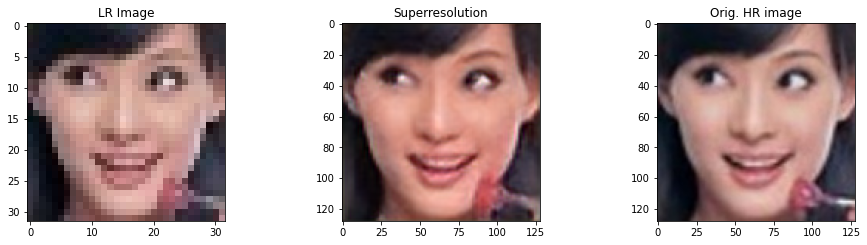

In [11]:
generator = load_model('gen_e_100.h5', compile=False)


[X1, X2] = [lr_test, hr_test]

ix = randint(0, len(X1), 1)
src_image, tar_image = X1[ix], X2[ix]


gen_image = generator.predict(src_image)

plt.figure(figsize=(16, 8))
plt.subplot(231)
plt.title('LR Image')
plt.imshow(src_image[0,:,:,:])
plt.subplot(232)
plt.title('Superresolution')
plt.imshow(gen_image[0,:,:,:])
plt.subplot(233)
plt.title('Orig. HR image')
plt.imshow(tar_image[0,:,:,:])
plt.show()

1/1 [==============================] - 1s 726ms/step


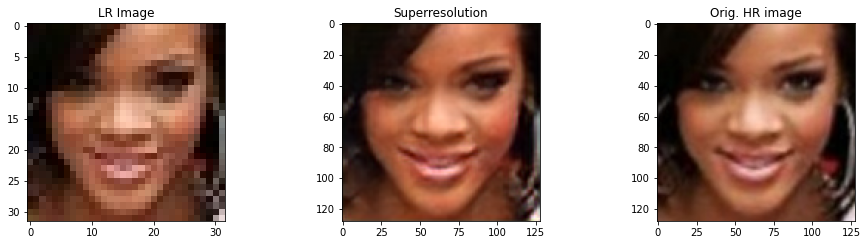

In [12]:
generator = load_model('gen_e_100.h5', compile=False)


[X1, X2] = [lr_test, hr_test]

ix = randint(0, len(X1), 1)
src_image, tar_image = X1[ix], X2[ix]


gen_image = generator.predict(src_image)

plt.figure(figsize=(16, 8))
plt.subplot(231)
plt.title('LR Image')
plt.imshow(src_image[0,:,:,:])
plt.subplot(232)
plt.title('Superresolution')
plt.imshow(gen_image[0,:,:,:])
plt.subplot(233)
plt.title('Orig. HR image')
plt.imshow(tar_image[0,:,:,:])
plt.show()

1/1 [==============================] - 1s 703ms/step


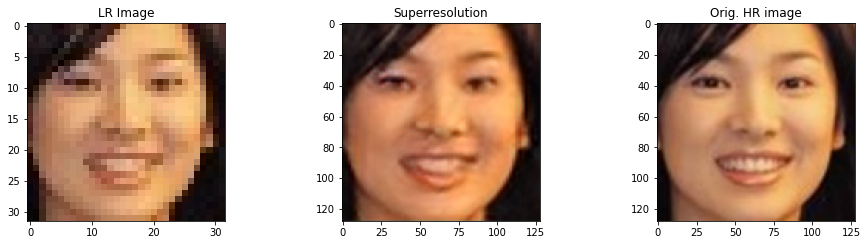

In [21]:
generator = load_model('gen_e_100.h5', compile=False)


[X1, X2] = [lr_test, hr_test]

ix = randint(0, len(X1), 1)
src_image, tar_image = X1[ix], X2[ix]


gen_image = generator.predict(src_image)

plt.figure(figsize=(16, 8))
plt.subplot(231)
plt.title('LR Image')
plt.imshow(src_image[0,:,:,:])
plt.subplot(232)
plt.title('Superresolution')
plt.imshow(gen_image[0,:,:,:])
plt.subplot(233)
plt.title('Orig. HR image')
plt.imshow(tar_image[0,:,:,:])
plt.show()

1/1 [==============================] - 1s 722ms/step


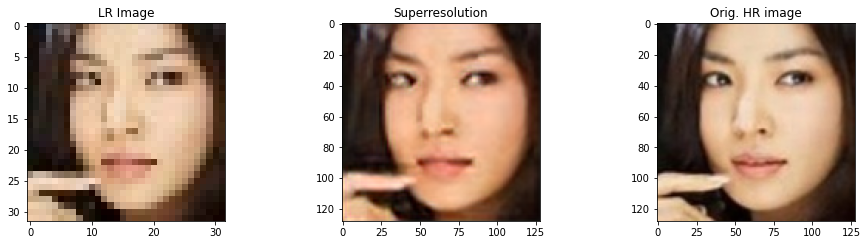

In [18]:
generator = load_model('gen_e_100.h5', compile=False)


[X1, X2] = [lr_test, hr_test]

ix = randint(0, len(X1), 1)
src_image, tar_image = X1[ix], X2[ix]


gen_image = generator.predict(src_image)

plt.figure(figsize=(16, 8))
plt.subplot(231)
plt.title('LR Image')
plt.imshow(src_image[0,:,:,:])
plt.subplot(232)
plt.title('Superresolution')
plt.imshow(gen_image[0,:,:,:])
plt.subplot(233)
plt.title('Orig. HR image')
plt.imshow(tar_image[0,:,:,:])
plt.show()

In [15]:
print("done!")


done!
